In [1]:
import sys
sys.path.append('/home/xinyiz/pamrats')

In [2]:
##This is adapted from https://github.com/tkipf/gae/blob/master/gae/train.py and https://github.com/tkipf/pygcn/blob/master/pygcn/train.py##

import time
import os

# Train on CPU (hide GPU) due to memory constraints
# os.environ['CUDA_VISIBLE_DEVICES'] = ""

import scanpy
import numpy as np
import scipy.sparse as sp

import torch
from torch import optim

# from sklearn.metrics import roc_auc_score
# from sklearn.metrics import average_precision_score

import gae.gae.optimizer as optimizer
import gae.gae.model
import gae.gae.preprocessing as preprocessing
import image.loadImage as loadImage
import image.modelsCNN as modelsCNN

import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import umap
import pandas as pd
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler

In [3]:
# Settings
os.environ["CUDA_VISIBLE_DEVICES"] = "3" 
use_cuda=True
fastmode=False #Validate during training pass
seed=3
kernel_size=4
stride=2
padding=1
plotepoch=1200
inverseAct=None

hidden1=64 #Number of channels in hidden layer 1
hidden2=128 
hidden3=256
hidden4=512
hidden5=512
fc_dim1=512*25*25
fc_dim2=1024
# fc_dim3=128
# fc_dim4=128
# gcn_dim1=2600
adv_hidden=128

model_str='cnn_vae'
training_samples=['control13','disease13','disease8','control8']
# training_samples=['control13','control8']
targetBatch=None
diamThresh_mul=800
minThresh_mul=12
overlap=0
name='all_thresh25min12_01'
logsavepath='/mnt/external_ssd/xinyi/log/train_cnn_starmap/'+name
modelsavepath='/mnt/external_ssd/xinyi/models/train_cnn_starmap/'+name
plotsavepath='/mnt/external_ssd/xinyi/plots/train_cnn_starmap/'+name

#Load data
plot_samples={'disease13':'AD_mouse9494','control13':'AD_mouse9498','disease8':'AD_mouse9723','control8':'AD_mouse9735'}
datadir='/home/xinyiz/2021-01-13-mAD-test-dataset'    

#Load data
imageslist={}
for s in plot_samples.keys():
    imageslist[s]=loadImage.loadandsplit(plot_samples[s],datadir,diamThresh_mul,overlap,0,0,ifFlip=True,minCutoff=minThresh_mul,seed=seed,split=False)
# Create model
if model_str=='cnn_vae':
    model = modelsCNN.CNN_VAE(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,fc_dim2)
      
if use_cuda:
    model.cuda()    
model.load_state_dict(torch.load(os.path.join(modelsavepath,str(plotepoch)+'.pt')))

#compute embeddings
featureslist={}
model.eval()
for s in plot_samples.keys():
    imgInputnp,_,_=imageslist[s]
        
    muplot_all=None
    for i in range(imgInputnp.shape[0]):
        imgInput=imgInputnp[[i]]
        if use_cuda:
            imgInput=torch.tensor(imgInput).cuda().float()
        recon,z, mu, logvar = model(imgInput)

        if inverseAct=='leakyRelu':
            mu=inverseLeakyRelu(mu.cpu().detach().numpy())
        else:
            mu=mu.cpu().detach().numpy()
#             if plotRecon:
#                 if plotRecon=='meanRecon':
#                     mu=features_recon[3].cpu().detach().numpy()
        if muplot_all is None:
            muplot_all=mu
        else:
            muplot_all=np.concatenate((muplot_all,mu),axis=0)
    scaler = MinMaxScaler(feature_range=(0,10))
    featurelog_train_minmax=np.transpose(scaler.fit_transform(np.transpose(muplot_all)))
    featureslist[s]=featurelog_train_minmax




(22210, 22344)
flipping images
(22355, 18953)
flipping images
no cells
no cells
no cells
(22294, 19552)
flipping images
(22452, 19616)
flipping images


In [4]:
adj_list={}
for s in plot_samples.keys():
    _,rowSplits,colSplits=imageslist[s]
    nsamples=featureslist[s].shape[0]
    adj_list[s]=np.zeros((nsamples,nsamples))
    for r in range(rowSplits):
        for c in range(colSplits):
            if c-1>=0:
                adj_list[s][r*colSplits+c,r*colSplits+c-1]=1
            if c+1<colSplits:
                adj_list[s][r*colSplits+c,r*colSplits+c+1]=1
            if r-1>0:
                adj_list[s][r*colSplits+c,(r-1)*colSplits+c]=1
                if c-1>=0:
                    adj_list[s][r*colSplits+c,(r-1)*colSplits+c-1]=1
                if c+1<colSplits:
                    adj_list[s][r*colSplits+c,(r-1)*colSplits+c+1]=1
            if r+1<rowSplits:
                adj_list[s][r*colSplits+c,(r+1)*colSplits+c]=1
                if c-1>0:
                    adj_list[s][r*colSplits+c,(r+1)*colSplits+c-1]=1
                if c+1<colSplits:
                    adj_list[s][r*colSplits+c,(r+1)*colSplits+c+1]=1 

epochs=100000
saveFreq=100
lr=0.00001 #initial learning rate
lr_adv=0.001
weight_decay=0 #Weight for L2 loss on embedding matrix.
klweight=0.000001

hidden1=3000 #Number of units in hidden layer 1
hidden2=3000 #Number of units in hidden layer 2
# hidden3=2048
# hidden4=2048
# hidden5=128
fc_dim1=3000
# fc_dim2=128
# fc_dim3=128
# fc_dim4=128
# gcn_dim1=2600
# clf_hidden=256
adv_hidden=128

dropout=0.01
testNodes=0.1 #fraction of total nodes for testing
valNodes=0.05 #fraction of total nodes for validation
XreconWeight=2
# clfweight=20
advWeight=2
# randFeatureSubset=None
model_str='gcn_vae_xa_e2_d1'
clf=None
adv=None  #'clf_fc1_eq'  #'clf_fc1_control_eq' #'clf_fc1_control'  #'clf_fc1'
protein=None #'scaled_binary'
proteinWeights=0.05
adj_decodeName=None #gala or None
ridgeL=0.01
shareGenePi=True

pretrainedAE=None #{'name':'controlphy5XAbin_01_dca','epoch':9990}
num_features=1024
# training_samples=['control13','disease13','disease8']###rename and retrain C8
training_samples=['control13','disease13','disease8','control8']
# training_samples=['control13','control8']
targetBatch=None
training_sample_X='logminmax'
switchFreq=100
standardizeX=False
# name='allk20XA_01_dca_noD8' ###rename and retrain D8 C8
name='all_thresh25min12_01_XA'
logsavepath='/mnt/external_ssd/xinyi/log/train_gaeCNN_starmap/'+name
modelsavepath='/mnt/external_ssd/xinyi/models/train_gaeCNN_starmap/'+name
plotsavepath='/mnt/external_ssd/xinyi/plots/train_gaeCNN_starmap/'+name

#Load data
sampleidx={'disease13':'AD_mouse9494','control13':'AD_mouse9498','disease8':'AD_mouse9723','control8':'AD_mouse9735'}
savedir=os.path.join('/home/xinyiz/starmap')

adjnormlist={}
pos_weightlist={}
normlist={}
for ai in adj_list.keys():
    adjnormlist[ai]=preprocessing.preprocess_graph(adj_list[ai])
    
    pos_weightlist[ai] = torch.tensor(float(adj_list[ai].shape[0] * adj_list[ai].shape[0] - adj_list[ai].sum()) / adj_list[ai].sum()) #using full unmasked adj
    normlist[ai] = adj_list[ai].shape[0] * adj_list[ai].shape[0] / float((adj_list[ai].shape[0] * adj_list[ai].shape[0] - adj_list[ai].sum()) * 2)
    
    adj_label=adj_list[ai] + sp.eye(adj_list[ai].shape[0])
    adj_list[ai]=torch.tensor(adj_label)

# Set cuda and seed
np.random.seed(seed)
if use_cuda and (not torch.cuda.is_available()):
    print('cuda not available')
    use_cuda=False
torch.manual_seed(seed)
if use_cuda:
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.enabled = True

# Load data
# if randFeatureSubset != None:
#     idx=np.random.choice(features.shape[1],randFeatureSubset,replace=False)
#     features=features[:,idx]

In [5]:
if not os.path.exists(logsavepath):
    os.mkdir(logsavepath)
if not os.path.exists(modelsavepath):
    os.mkdir(modelsavepath)
if not os.path.exists(plotsavepath):
    os.mkdir(plotsavepath)

In [6]:
# loop over all train/validation sets

mse=torch.nn.MSELoss()
# mse=torch.nn.MSELoss(reduction=None)
# Create model
if model_str=='gcn_vae_xa':
    model = gae.gae.model.GCNModelVAE_XA(num_features, hidden1, hidden2,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
elif model_str == 'gcn_vae_gcnX_inprA':
    model = gae.gae.model.GCNModelVAE_gcnX_inprA(num_features, hidden1, hidden2,gcn_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str == 'gcn_vae_gcnX_inprA_w':
    model = gae.gae.model.GCNModelVAE_gcnX_inprA_w(num_features, hidden1, hidden2,gcn_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='gcn_vae_xa_e3':
    model = gae.gae.model.GCNModelVAE_XA_e3(num_features, hidden1, hidden2,hidden3,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str == 'gcn_vae_xa_e1':
    model = gae.gae.model.GCNModelVAE_XA_e1(num_features, hidden1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE

elif model_str == 'gcn_vae_xa_e2_d1':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1(num_features, hidden1,hidden2, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dca_fca':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_fca(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dcaFork':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCAfork(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaElemPi':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCAelemPi(num_features, hidden1,hidden2,fc_dim1, dropout,shareGenePi)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaConstantDisp':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_constantDisp(num_features, hidden1,hidden2,fc_dim1, dropout,shareGenePi)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE    
    
elif model_str == 'gcn_vae_xa_e4_d1':
    model = gae.gae.model.GCNModelVAE_XA_e4_d1(num_features, hidden1,hidden2,hidden3,hidden4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='fc':
    model = gae.gae.model.FCVAE(num_features, hidden1, hidden2,hidden3,hidden4,hidden5,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse
    loss_a=optimizer.optimizer_CE
elif model_str=='fcae':
    model = gae.gae.model.FCAE(num_features, hidden1, hidden2,hidden3,hidden4,hidden5,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse

elif model_str=='fcae1':
    model = gae.gae.model.FCAE1(num_features, dropout,hidden1)
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse
elif model_str=='fcae2':
    model = gae.gae.model.FCAE2(num_features, dropout,hidden1,hidden2)
    loss_x=optimizer.optimizer_MSE

elif model_str=='fc1':
    model = gae.gae.model.FCVAE1(num_features, hidden1,dropout)
    loss_x=optimizer.optimizer_MSE
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE

elif model_str=='fc1_fca':
    model = gae.gae.model.FCVAE1_fca(num_features, hidden1,dropout)
    loss_x=optimizer.optimizer_MSE
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='fc1_dca':
    model = gae.gae.model.FCVAE1_DCA(num_features, hidden1,fc_dim1, dropout)
    loss_x=optimizer.optimizer_zinb
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE

if clf=='clf_fc1':
    modelClf=gae.gae.model.Clf_fc1(hidden2, dropout,clf_hidden,ct_unique.size)
    loss_clf=torch.nn.CrossEntropyLoss()
    
if adv=='clf_fc1' or adv=='clf_fc1_eq' or adv=='clf_fc1_control' or adv=='clf_fc1_control_eq':
    modelAdv=gae.gae.model.Clf_fc1(hidden2, dropout,adv_hidden,sampleLabellist_ae['control13'].size()[1])
    loss_adv=optimizer.optimizer_CEclf
    
if adv=='clf_linear1' or adv=='clf_linear1_control':
    modelAdv=gae.gae.model.Clf_linear1(hidden2, dropout,sampleLabellist_ae['control13'].size()[1])
    loss_adv=optimizer.optimizer_CEclf
    
if 'NB' in name:
    print('using NB loss for X')
    loss_x=optimizer.optimizer_nb
    
if use_cuda:
    model.cuda()
    if clf:
        modelClf.cuda()
        ct_train=torch.tensor(ct_train).cuda()
    if adv:
        modelAdv.cuda()
#         for sk in sampleLabellist_ae.keys():
#             sampleLabellist_ae[sk]=sampleLabellist_ae[sk].cuda().float()
#             sampleLabellist_d[sk]=sampleLabellist_d[sk].cuda().float()
#     for fk in featureslist.keys():
#         featureslist[fk] = featureslist[fk].cuda().float()
#     for ak in adj_list.keys():
#         adjnormlist[ak] =adjnormlist[ak].cuda()
#         adj_list[ak] = adj_list[ak].cuda().float()
#     if adj_decode is not None:
#         adj_decode=adj_decode.cuda()
    

optimizerVAEXA = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
if clf:
    optimizerClf=optim.Adam(modelClf.parameters(), lr=lr, weight_decay=weight_decay)
if adv:
    optimizerAdv=optim.Adam(modelAdv.parameters(), lr=lr_adv, weight_decay=weight_decay)    


In [7]:
# model.load_state_dict(torch.load(os.path.join(modelsavepath,str(9360)+'.pt')))
# epochs=20000
if pretrainedAE:
    print('loading '+pretrainedAE['name']+' epoch '+str(pretrainedAE['epoch']))
    model.load_state_dict(torch.load(os.path.join('/mnt/xinyi/pamrats/models/train_gae_starmap/'+pretrainedAE['name'],str(pretrainedAE['epoch'])+'.pt')))
    
def train(epoch):
    t = time.time()
    model.train()
    optimizerVAEXA.zero_grad()
    
    if adj_decodeName==None:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm)
    #     features_recon, z, mu, logvar=model(features.float())
    else:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm,adj_decode)
        
    
    if clf:
        modelClf.train()
        optimizerClf.zero_grad()
        clfOut=modelClf(z)
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        modelAdv.eval()
        advOut=modelAdv(z)
    
#     z=None
#     torch.cuda.empty_cache()
    
    loss_kl_train=loss_kl(mu, logvar, train_nodes_idx)*klweight
    
#     mu=None
#     logvar=None
#     torch.cuda.empty_cache()
    
    if 'dca' in model_str:
        if 'NB' in name:
            loss_x_train=loss_x(features_recon, features,train_nodes_idx,XreconWeight)
        else:
            loss_x_train=loss_x(features_recon, features,train_nodes_idx,XreconWeight,ridgeL,features_raw)
    else:
        loss_x_train=loss_x(features_recon, features,train_nodes_idx,XreconWeight,mse)
    
#     features_recon=None
#     torch.cuda.empty_cache()
    
    loss_a_train=loss_a(adj_recon, adj_label, pos_weight, norm,train_nodes_idx)
    
#     adj_recon=None
# #     train_nodes_idx=None
#     torch.cuda.empty_cache()
    
    loss = loss_kl_train+loss_x_train+loss_a_train
#     loss=loss_x_train #for lossXreconOnly only
#     loss=loss_kl_train+loss_x_train #for lossXreconOnly_wKL only
#     loss = loss_kl_train+loss_a_train #for lossAreconOnly_wKL only
    if clf:
        loss_clf_train=loss_clf(clfOut[train_nodes_idx],ct_train[train_nodes_idx])
        loss=loss+clfweight*loss_clf_train
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        loss_adv_train=loss_adv(advOut,sampleLabel_ae,train_nodes_idx)
        loss+=loss_adv_train*advWeight
    loss.backward()
    optimizerVAEXA.step()
    if clf:
        optimizerClf.step()

    if not fastmode:
        # Evaluate validation set performance separately,
        # deactivates dropout during validation run & no variation in z.
        model.eval()
        if adj_decodeName==None:
            adj_recon,mu,logvar,z, features_recon = model(features, adj_norm)
    #         features_recon, z, mu, logvar=model(features.float())
        else:
            adj_recon,mu,logvar,z, features_recon = model(features, adj_norm,adj_decode)
    
    if clf:
        modelClf.eval()
        clfOut=modelClf(z)
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        advOut=modelAdv(z)
    if 'dca' in model_str:
        if 'NB' in name:
            loss_x_val=loss_x(features_recon, features,val_nodes_idx,XreconWeight)
        else:
            loss_x_val=loss_x(features_recon, features,val_nodes_idx,XreconWeight,ridgeL,features_raw)
    else:
        loss_x_val=loss_x(features_recon, features,val_nodes_idx,XreconWeight,mse)
    
#     features_recon=None
#     torch.cuda.empty_cache()
    
    loss_a_val=loss_a(adj_recon, adj_label, pos_weight, norm,val_nodes_idx)
    
#     adj_recon=None
# #     val_nodes_idx=None
#     torch.cuda.empty_cache()
    
    loss_val = loss_x_val+loss_a_val
#     loss_val=loss_x_val
#     loss_val=loss_a_val
    if clf:
        loss_clf_val=loss_clf(clfOut[val_nodes_idx],ct_train[val_nodes_idx])
        loss_val=loss_val+clfweight*loss_clf_val
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        loss_adv_val=loss_adv(advOut,sampleLabel_ae,val_nodes_idx)
        loss_val+=loss_adv_val*advWeight
#     print(features_recon[:5,:5])
    print(training_samples_t+' Epoch: {:04d}'.format(epoch),
          'loss_train: {:.4f}'.format(loss.item()),
          'loss_kl_train: {:.4f}'.format(loss_kl_train.item()),
          'loss_x_train: {:.4f}'.format(loss_x_train.item()),
          'loss_a_train: {:.4f}'.format(loss_a_train.item()),
#           'loss_clf_train: {:.4f}'.format(loss_clf_train.item()),
          'loss_val: {:.4f}'.format(loss_val.item()),
          'loss_x_val: {:.4f}'.format(loss_x_val.item()),
          'loss_a_val: {:.4f}'.format(loss_a_val.item()),
#           'loss_clf_val: {:.4f}'.format(loss_clf_val.item()),
          'time: {:.4f}s'.format(time.time() - t))
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        print('loss_adv_train: {:.4f}'.format(loss_adv_train.item()),
              'loss_adv_val: {:.4f}'.format(loss_adv_val.item())
             )
#     return loss.item(),loss_x_train.item(),loss_val.item(),loss_x_val.item()
#     return loss.item(),loss_kl_train.item(),loss_x_train.item(),loss_val.item(),loss_x_val.item()
    if clf:
        return loss.item(),loss_kl_train.item(),loss_x_train.item(),loss_a_train.item(),loss_val.item(),loss_x_val.item(),loss_a_val.item(),loss_clf_train.item(),loss_clf_val.item()
    elif adv:
        if (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
            return float(loss),float(loss_kl_train),float(loss_x_train),float(loss_a_train),float(loss_val),float(loss_x_val),float(loss_a_val),float(loss_adv_train),float(loss_adv_val)        
        else:
            return float(loss),float(loss_kl_train),float(loss_x_train),float(loss_a_train),float(loss_val),float(loss_x_val),float(loss_a_val),None,None   
    else:
        return loss.item(),loss_kl_train.item(),loss_x_train.item(),loss_a_train.item(),loss_val.item(),loss_x_val.item(),loss_a_val.item()        

def train_discriminator(epoch):
    t = time.time()
    model.eval()
    
    if adj_decodeName==None:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm)
    #     features_recon, z, mu, logvar=model(features.float())
    else:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm,adj_decode)
        
    
    if clf:
        modelClf.eval()
        clfOut=modelClf(z)
        
    modelAdv.train()
    optimizerAdv.zero_grad()
    advOut=modelAdv(z)
    
    loss_adv_train=loss_adv(advOut,sampleLabel_d,train_nodes_idx)
    loss = loss_adv_train*advWeight
    
    loss.backward()
    optimizerAdv.step()

    modelAdv.eval()
    advOut=modelAdv(z)
    loss_adv_val=loss_adv(advOut,sampleLabel_d,val_nodes_idx)
    loss_val=loss_adv_val*advWeight
    print(training_samples_t+' Epoch: {:04d}'.format(epoch),
          'loss_adv_train: {:.4f}'.format(loss_adv_train.item()),
          'loss_adv_val: {:.4f}'.format(loss_adv_val.item()),
          'time: {:.4f}s'.format(time.time() - t))
    return float(loss_adv_train),float(loss_adv_val)
    
# print('cross-validation ',seti)
train_loss_ep=[None]*epochs
train_loss_kl_ep=[None]*epochs
train_loss_x_ep=[None]*epochs
train_loss_a_ep=[None]*epochs
train_loss_clf_ep=[None]*epochs
train_loss_adv_ep=[None]*epochs
train_loss_advD_ep=[None]*epochs
val_loss_ep=[None]*epochs
val_loss_x_ep=[None]*epochs
val_loss_a_ep=[None]*epochs
val_loss_clf_ep=[None]*epochs
val_loss_adv_ep=[None]*epochs
val_loss_advD_ep=[None]*epochs
t_ep=time.time()

for ep in range(epochs):
# for ep in range(10000,20000):
    t=int(ep/switchFreq)%len(training_samples)
    training_samples_t=training_samples[t]
    
#     adj_norm=adjnormlist[training_samples_t]
#     adj_label=adj_list[training_samples_t]
#     features=featureslist[training_samples_t+'X_'+training_sample_X]
    adj_norm=adjnormlist[training_samples_t].cuda().float()
    adj_label=adj_list[training_samples_t].cuda().float()
    features=torch.tensor(featureslist[training_samples_t]).cuda().float()
    pos_weight=pos_weightlist[training_samples_t]
    norm=normlist[training_samples_t]
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())):
#         sampleLabel_ae=sampleLabellist_ae[training_samples_t]
#         sampleLabel_d=sampleLabellist_d[training_samples_t]
        sampleLabel_ae=sampleLabellist_ae[training_samples_t].cuda().float()
        sampleLabel_d=sampleLabellist_d[training_samples_t].cuda().float()
    if 'dca' in model_str:
#         features_raw=features_raw_list[training_samples_t+'X_raw']
        features_raw=features_raw_list[training_samples_t+'X_raw'].cuda()
    num_nodes,_ = features.shape
    
    # construct training, validation, and test sets
    maskedgeres= preprocessing.mask_nodes_edges(features.shape[0],testNodeSize=testNodes,valNodeSize=valNodes,seed=seed)
    train_nodes_idx,val_nodes_idx,test_nodes_idx = maskedgeres
    if use_cuda:
        train_nodes_idx=train_nodes_idx.cuda()
        val_nodes_idx=val_nodes_idx.cuda()
        test_nodes_idx=test_nodes_idx.cuda()
    
    if clf:
        train_loss_ep[ep],train_loss_kl_ep[ep],train_loss_x_ep[ep],train_loss_a_ep[ep],val_loss_ep[ep],val_loss_x_ep[ep],val_loss_a_ep[ep],train_loss_clf_ep[ep],val_loss_clf_ep[ep]=train(ep)
    elif adv:
        train_loss_ep[ep],train_loss_kl_ep[ep],train_loss_x_ep[ep],train_loss_a_ep[ep],val_loss_ep[ep],val_loss_x_ep[ep],val_loss_a_ep[ep],train_loss_adv_ep[ep],val_loss_adv_ep[ep]=train(ep)
        if (training_samples_t in list(sampleLabellist_ae.keys())):
            train_loss_advD_ep[ep],val_loss_advD_ep[ep]=train_discriminator(ep)
    else:
        train_loss_ep[ep],train_loss_kl_ep[ep],train_loss_x_ep[ep],train_loss_a_ep[ep],val_loss_ep[ep],val_loss_x_ep[ep],val_loss_a_ep[ep]=train(ep)

        
    if ep%saveFreq == 0:
        torch.save(model.cpu().state_dict(), os.path.join(modelsavepath,str(ep)+'.pt'))
    if use_cuda:
        model.cuda()
        torch.cuda.empty_cache()
print(' total time: {:.4f}s'.format(time.time() - t_ep))


control13 Epoch: 0000 loss_train: 346803072.0000 loss_kl_train: 23.2135 loss_x_train: 51.2142 loss_a_train: 346803008.0000 loss_val: 4235.7549 loss_x_val: 48.7099 loss_a_val: 4187.0449 time: 0.6386s
control13 Epoch: 0001 loss_train: 85170344.0000 loss_kl_train: 2.0552 loss_x_train: 51.1399 loss_a_train: 85170288.0000 loss_val: 4307.7593 loss_x_val: 48.7144 loss_a_val: 4259.0449 time: 0.0391s
control13 Epoch: 0002 loss_train: 30770906.0000 loss_kl_train: 1.1546 loss_x_train: 51.1285 loss_a_train: 30770854.0000 loss_val: 4383.3574 loss_x_val: 48.7100 loss_a_val: 4334.6475 time: 0.0335s
control13 Epoch: 0003 loss_train: 20753030.0000 loss_kl_train: 0.7336 loss_x_train: 51.1344 loss_a_train: 20752978.0000 loss_val: 4453.6807 loss_x_val: 48.7089 loss_a_val: 4404.9717 time: 0.0363s
control13 Epoch: 0004 loss_train: 18884288.0000 loss_kl_train: 0.5309 loss_x_train: 51.1273 loss_a_train: 18884236.0000 loss_val: 4527.1338 loss_x_val: 48.7074 loss_a_val: 4478.4263 time: 0.0369s
control13 Epoch: 

control13 Epoch: 0044 loss_train: 485460.9375 loss_kl_train: 0.0255 loss_x_train: 51.0393 loss_a_train: 485409.8750 loss_val: 7686.1611 loss_x_val: 48.7020 loss_a_val: 7637.4590 time: 0.0262s
control13 Epoch: 0045 loss_train: 759274.4375 loss_kl_train: 0.0259 loss_x_train: 51.0879 loss_a_train: 759223.3125 loss_val: 7674.6875 loss_x_val: 48.7020 loss_a_val: 7625.9854 time: 0.0358s
control13 Epoch: 0046 loss_train: 603355.1250 loss_kl_train: 0.0235 loss_x_train: 51.0591 loss_a_train: 603304.0625 loss_val: 7648.5645 loss_x_val: 48.7022 loss_a_val: 7599.8623 time: 0.0336s
control13 Epoch: 0047 loss_train: 498159.3438 loss_kl_train: 0.0234 loss_x_train: 51.0789 loss_a_train: 498108.2500 loss_val: 7610.3989 loss_x_val: 48.7017 loss_a_val: 7561.6973 time: 0.0321s
control13 Epoch: 0048 loss_train: 695406.0625 loss_kl_train: 0.0227 loss_x_train: 51.0851 loss_a_train: 695354.9375 loss_val: 7572.6626 loss_x_val: 48.7051 loss_a_val: 7523.9575 time: 0.0395s
control13 Epoch: 0049 loss_train: 887909

control13 Epoch: 0088 loss_train: 302745.5938 loss_kl_train: 0.0106 loss_x_train: 51.0183 loss_a_train: 302694.5625 loss_val: 4653.7715 loss_x_val: 48.6945 loss_a_val: 4605.0771 time: 0.0249s
control13 Epoch: 0089 loss_train: 286377.5625 loss_kl_train: 0.0099 loss_x_train: 51.0021 loss_a_train: 286326.5625 loss_val: 4573.6143 loss_x_val: 48.6924 loss_a_val: 4524.9219 time: 0.0255s
control13 Epoch: 0090 loss_train: 242005.2969 loss_kl_train: 0.0098 loss_x_train: 51.0289 loss_a_train: 241954.2656 loss_val: 4492.2612 loss_x_val: 48.6972 loss_a_val: 4443.5640 time: 0.0246s
control13 Epoch: 0091 loss_train: 276064.2188 loss_kl_train: 0.0097 loss_x_train: 51.0462 loss_a_train: 276013.1562 loss_val: 4414.7046 loss_x_val: 48.6983 loss_a_val: 4366.0063 time: 0.0248s
control13 Epoch: 0092 loss_train: 233143.6875 loss_kl_train: 0.0096 loss_x_train: 51.0460 loss_a_train: 233092.6250 loss_val: 4334.8105 loss_x_val: 48.6954 loss_a_val: 4286.1152 time: 0.0245s
control13 Epoch: 0093 loss_train: 289296

disease13 Epoch: 0131 loss_train: 134332.5000 loss_kl_train: 0.0042 loss_x_train: 50.9015 loss_a_train: 134281.5938 loss_val: 2592.2493 loss_x_val: 48.9486 loss_a_val: 2543.3008 time: 0.0585s
disease13 Epoch: 0132 loss_train: 133332.8750 loss_kl_train: 0.0041 loss_x_train: 50.8612 loss_a_train: 133282.0156 loss_val: 2565.0334 loss_x_val: 48.9440 loss_a_val: 2516.0894 time: 0.0461s
disease13 Epoch: 0133 loss_train: 113333.7109 loss_kl_train: 0.0041 loss_x_train: 50.8706 loss_a_train: 113282.8359 loss_val: 2534.6868 loss_x_val: 48.9423 loss_a_val: 2485.7446 time: 0.0307s
disease13 Epoch: 0134 loss_train: 129497.3672 loss_kl_train: 0.0040 loss_x_train: 50.8122 loss_a_train: 129446.5547 loss_val: 2502.4497 loss_x_val: 48.9441 loss_a_val: 2453.5056 time: 0.0277s
disease13 Epoch: 0135 loss_train: 147972.7969 loss_kl_train: 0.0040 loss_x_train: 50.8323 loss_a_train: 147921.9531 loss_val: 2472.0750 loss_x_val: 48.9420 loss_a_val: 2423.1328 time: 0.0274s
disease13 Epoch: 0136 loss_train: 143428

disease13 Epoch: 0175 loss_train: 107657.6328 loss_kl_train: 0.0029 loss_x_train: 50.8593 loss_a_train: 107606.7734 loss_val: 1909.6409 loss_x_val: 48.9127 loss_a_val: 1860.7281 time: 0.0466s
disease13 Epoch: 0176 loss_train: 108387.6719 loss_kl_train: 0.0029 loss_x_train: 50.8051 loss_a_train: 108336.8672 loss_val: 1898.0935 loss_x_val: 48.9154 loss_a_val: 1849.1781 time: 0.0409s
disease13 Epoch: 0177 loss_train: 100023.7812 loss_kl_train: 0.0030 loss_x_train: 50.8672 loss_a_train: 99972.9141 loss_val: 1883.8535 loss_x_val: 48.9083 loss_a_val: 1834.9453 time: 0.0516s
disease13 Epoch: 0178 loss_train: 102811.6953 loss_kl_train: 0.0029 loss_x_train: 50.8458 loss_a_train: 102760.8438 loss_val: 1870.6370 loss_x_val: 48.9045 loss_a_val: 1821.7325 time: 0.0490s
disease13 Epoch: 0179 loss_train: 93467.7734 loss_kl_train: 0.0029 loss_x_train: 50.8495 loss_a_train: 93416.9219 loss_val: 1860.4624 loss_x_val: 48.9062 loss_a_val: 1811.5562 time: 0.0423s
disease13 Epoch: 0180 loss_train: 98673.171

disease8 Epoch: 0218 loss_train: 108449.2578 loss_kl_train: 0.0038 loss_x_train: 52.7659 loss_a_train: 108396.4844 loss_val: 1941.8804 loss_x_val: 50.9835 loss_a_val: 1890.8969 time: 0.0527s
disease8 Epoch: 0219 loss_train: 93190.9453 loss_kl_train: 0.0036 loss_x_train: 52.7432 loss_a_train: 93138.1953 loss_val: 1930.0684 loss_x_val: 50.9771 loss_a_val: 1879.0912 time: 0.0336s
disease8 Epoch: 0220 loss_train: 104476.4844 loss_kl_train: 0.0037 loss_x_train: 52.7255 loss_a_train: 104423.7578 loss_val: 1923.3163 loss_x_val: 50.9801 loss_a_val: 1872.3362 time: 0.0402s
disease8 Epoch: 0221 loss_train: 96538.6484 loss_kl_train: 0.0036 loss_x_train: 52.7366 loss_a_train: 96485.9062 loss_val: 1914.7441 loss_x_val: 50.9766 loss_a_val: 1863.7676 time: 0.0435s
disease8 Epoch: 0222 loss_train: 96235.0312 loss_kl_train: 0.0035 loss_x_train: 52.7555 loss_a_train: 96182.2734 loss_val: 1903.4410 loss_x_val: 50.9705 loss_a_val: 1852.4705 time: 0.0394s
disease8 Epoch: 0223 loss_train: 118061.0703 loss_k

disease8 Epoch: 0267 loss_train: 67204.0703 loss_kl_train: 0.0022 loss_x_train: 52.6730 loss_a_train: 67151.3984 loss_val: 1548.1002 loss_x_val: 50.9020 loss_a_val: 1497.1981 time: 0.0251s
disease8 Epoch: 0268 loss_train: 61339.7617 loss_kl_train: 0.0022 loss_x_train: 52.6671 loss_a_train: 61287.0938 loss_val: 1552.3126 loss_x_val: 50.8995 loss_a_val: 1501.4131 time: 0.0250s
disease8 Epoch: 0269 loss_train: 63632.6836 loss_kl_train: 0.0023 loss_x_train: 52.7120 loss_a_train: 63579.9688 loss_val: 1557.1587 loss_x_val: 50.9013 loss_a_val: 1506.2573 time: 0.0252s
disease8 Epoch: 0270 loss_train: 64171.9453 loss_kl_train: 0.0022 loss_x_train: 52.6600 loss_a_train: 64119.2812 loss_val: 1562.7345 loss_x_val: 50.9034 loss_a_val: 1511.8312 time: 0.0246s
disease8 Epoch: 0271 loss_train: 69986.3281 loss_kl_train: 0.0023 loss_x_train: 52.7098 loss_a_train: 69933.6172 loss_val: 1562.5107 loss_x_val: 50.9038 loss_a_val: 1511.6069 time: 0.0246s
disease8 Epoch: 0272 loss_train: 67401.5859 loss_kl_tra

control8 Epoch: 0311 loss_train: 50592.6055 loss_kl_train: 0.0014 loss_x_train: 51.9929 loss_a_train: 50540.6094 loss_val: 1272.3246 loss_x_val: 50.0604 loss_a_val: 1222.2642 time: 0.0253s
control8 Epoch: 0312 loss_train: 56699.7695 loss_kl_train: 0.0014 loss_x_train: 51.9624 loss_a_train: 56647.8047 loss_val: 1253.1191 loss_x_val: 50.0497 loss_a_val: 1203.0695 time: 0.0320s
control8 Epoch: 0313 loss_train: 42070.8008 loss_kl_train: 0.0014 loss_x_train: 51.9604 loss_a_train: 42018.8398 loss_val: 1235.9694 loss_x_val: 50.0422 loss_a_val: 1185.9271 time: 0.0254s
control8 Epoch: 0314 loss_train: 48493.1719 loss_kl_train: 0.0014 loss_x_train: 51.9649 loss_a_train: 48441.2070 loss_val: 1221.8901 loss_x_val: 50.0384 loss_a_val: 1171.8517 time: 0.0254s
control8 Epoch: 0315 loss_train: 41900.6484 loss_kl_train: 0.0014 loss_x_train: 51.9150 loss_a_train: 41848.7305 loss_val: 1208.0422 loss_x_val: 50.0362 loss_a_val: 1158.0061 time: 0.0255s
control8 Epoch: 0316 loss_train: 55292.6875 loss_kl_tra

control8 Epoch: 0356 loss_train: 39202.4727 loss_kl_train: 0.0012 loss_x_train: 51.8832 loss_a_train: 39150.5898 loss_val: 1233.1354 loss_x_val: 50.0839 loss_a_val: 1183.0515 time: 0.0482s
control8 Epoch: 0357 loss_train: 38511.6250 loss_kl_train: 0.0011 loss_x_train: 51.8362 loss_a_train: 38459.7891 loss_val: 1236.6110 loss_x_val: 50.0885 loss_a_val: 1186.5225 time: 0.0429s
control8 Epoch: 0358 loss_train: 33106.6172 loss_kl_train: 0.0011 loss_x_train: 51.8926 loss_a_train: 33054.7227 loss_val: 1234.4290 loss_x_val: 50.0856 loss_a_val: 1184.3434 time: 0.0409s
control8 Epoch: 0359 loss_train: 36702.2656 loss_kl_train: 0.0012 loss_x_train: 51.8843 loss_a_train: 36650.3789 loss_val: 1230.3243 loss_x_val: 50.0830 loss_a_val: 1180.2413 time: 0.0300s
control8 Epoch: 0360 loss_train: 37099.4805 loss_kl_train: 0.0011 loss_x_train: 51.8651 loss_a_train: 37047.6133 loss_val: 1229.5208 loss_x_val: 50.0879 loss_a_val: 1179.4329 time: 0.0273s
control8 Epoch: 0361 loss_train: 39572.3828 loss_kl_tra

control13 Epoch: 0401 loss_train: 38432.8164 loss_kl_train: 0.0012 loss_x_train: 50.7655 loss_a_train: 38382.0508 loss_val: 1273.8407 loss_x_val: 49.4112 loss_a_val: 1224.4296 time: 0.0434s
control13 Epoch: 0402 loss_train: 42024.3828 loss_kl_train: 0.0012 loss_x_train: 50.7689 loss_a_train: 41973.6133 loss_val: 1275.0701 loss_x_val: 49.3282 loss_a_val: 1225.7418 time: 0.0385s
control13 Epoch: 0403 loss_train: 38709.4609 loss_kl_train: 0.0012 loss_x_train: 50.7699 loss_a_train: 38658.6914 loss_val: 1267.9297 loss_x_val: 49.2399 loss_a_val: 1218.6898 time: 0.0369s
control13 Epoch: 0404 loss_train: 48800.5977 loss_kl_train: 0.0011 loss_x_train: 50.7534 loss_a_train: 48749.8438 loss_val: 1255.4470 loss_x_val: 49.1505 loss_a_val: 1206.2965 time: 0.0434s
control13 Epoch: 0405 loss_train: 47454.9492 loss_kl_train: 0.0011 loss_x_train: 50.7695 loss_a_train: 47404.1797 loss_val: 1236.6083 loss_x_val: 49.0634 loss_a_val: 1187.5449 time: 0.0413s
control13 Epoch: 0406 loss_train: 37924.5117 loss_

control13 Epoch: 0447 loss_train: 30010.7188 loss_kl_train: 0.0009 loss_x_train: 50.6807 loss_a_train: 29960.0371 loss_val: 958.4820 loss_x_val: 48.6573 loss_a_val: 909.8246 time: 0.0508s
control13 Epoch: 0448 loss_train: 22915.0586 loss_kl_train: 0.0008 loss_x_train: 50.6985 loss_a_train: 22864.3594 loss_val: 964.1224 loss_x_val: 48.6636 loss_a_val: 915.4588 time: 0.0461s
control13 Epoch: 0449 loss_train: 30763.0254 loss_kl_train: 0.0009 loss_x_train: 50.6763 loss_a_train: 30712.3477 loss_val: 970.9064 loss_x_val: 48.6716 loss_a_val: 922.2349 time: 0.0427s
control13 Epoch: 0450 loss_train: 29593.5430 loss_kl_train: 0.0009 loss_x_train: 50.7140 loss_a_train: 29542.8281 loss_val: 978.0733 loss_x_val: 48.6771 loss_a_val: 929.3962 time: 0.0468s
control13 Epoch: 0451 loss_train: 27134.7227 loss_kl_train: 0.0008 loss_x_train: 50.6851 loss_a_train: 27084.0371 loss_val: 978.7484 loss_x_val: 48.6784 loss_a_val: 930.0699 time: 0.0610s
control13 Epoch: 0452 loss_train: 33711.0547 loss_kl_train: 

control13 Epoch: 0494 loss_train: 20603.0078 loss_kl_train: 0.0007 loss_x_train: 50.6192 loss_a_train: 20552.3887 loss_val: 864.0930 loss_x_val: 48.5970 loss_a_val: 815.4960 time: 0.0262s
control13 Epoch: 0495 loss_train: 21509.4082 loss_kl_train: 0.0007 loss_x_train: 50.5895 loss_a_train: 21458.8184 loss_val: 863.6530 loss_x_val: 48.5886 loss_a_val: 815.0643 time: 0.0303s
control13 Epoch: 0496 loss_train: 23188.8730 loss_kl_train: 0.0007 loss_x_train: 50.5961 loss_a_train: 23138.2754 loss_val: 863.9086 loss_x_val: 48.5809 loss_a_val: 815.3276 time: 0.0303s
control13 Epoch: 0497 loss_train: 29090.6523 loss_kl_train: 0.0007 loss_x_train: 50.6262 loss_a_train: 29040.0254 loss_val: 864.9282 loss_x_val: 48.5841 loss_a_val: 816.3442 time: 0.0382s
control13 Epoch: 0498 loss_train: 21776.4473 loss_kl_train: 0.0007 loss_x_train: 50.6100 loss_a_train: 21725.8359 loss_val: 867.1835 loss_x_val: 48.5879 loss_a_val: 818.5955 time: 0.0437s
control13 Epoch: 0499 loss_train: 21185.2148 loss_kl_train: 

disease13 Epoch: 0540 loss_train: 14534.0107 loss_kl_train: 0.0004 loss_x_train: 50.4632 loss_a_train: 14483.5469 loss_val: 900.5306 loss_x_val: 48.1089 loss_a_val: 852.4217 time: 0.0626s
disease13 Epoch: 0541 loss_train: 13670.9033 loss_kl_train: 0.0004 loss_x_train: 50.4368 loss_a_train: 13620.4658 loss_val: 898.5524 loss_x_val: 48.1072 loss_a_val: 850.4452 time: 0.0505s
disease13 Epoch: 0542 loss_train: 14064.8389 loss_kl_train: 0.0004 loss_x_train: 50.4824 loss_a_train: 14014.3564 loss_val: 894.8350 loss_x_val: 48.1128 loss_a_val: 846.7222 time: 0.0485s
disease13 Epoch: 0543 loss_train: 14244.8066 loss_kl_train: 0.0004 loss_x_train: 50.4339 loss_a_train: 14194.3721 loss_val: 892.2763 loss_x_val: 48.1251 loss_a_val: 844.1512 time: 0.0522s
disease13 Epoch: 0544 loss_train: 13689.6943 loss_kl_train: 0.0004 loss_x_train: 50.4559 loss_a_train: 13639.2383 loss_val: 894.0573 loss_x_val: 48.1518 loss_a_val: 845.9055 time: 0.0501s
disease13 Epoch: 0545 loss_train: 14223.2764 loss_kl_train: 

disease13 Epoch: 0587 loss_train: 12869.1650 loss_kl_train: 0.0003 loss_x_train: 50.4122 loss_a_train: 12818.7529 loss_val: 922.6910 loss_x_val: 48.3130 loss_a_val: 874.3781 time: 0.0320s
disease13 Epoch: 0588 loss_train: 13855.5244 loss_kl_train: 0.0003 loss_x_train: 50.4376 loss_a_train: 13805.0869 loss_val: 924.7910 loss_x_val: 48.3063 loss_a_val: 876.4847 time: 0.0291s
disease13 Epoch: 0589 loss_train: 13482.0752 loss_kl_train: 0.0003 loss_x_train: 50.3990 loss_a_train: 13431.6758 loss_val: 927.0424 loss_x_val: 48.3027 loss_a_val: 878.7397 time: 0.0281s
disease13 Epoch: 0590 loss_train: 13781.7422 loss_kl_train: 0.0003 loss_x_train: 50.3746 loss_a_train: 13731.3672 loss_val: 930.2018 loss_x_val: 48.3030 loss_a_val: 881.8989 time: 0.0286s
disease13 Epoch: 0591 loss_train: 12161.3359 loss_kl_train: 0.0003 loss_x_train: 50.4109 loss_a_train: 12110.9248 loss_val: 930.3394 loss_x_val: 48.2992 loss_a_val: 882.0402 time: 0.0283s
disease13 Epoch: 0592 loss_train: 12760.9141 loss_kl_train: 

disease8 Epoch: 0633 loss_train: 13624.7871 loss_kl_train: 0.0004 loss_x_train: 52.0534 loss_a_train: 13572.7334 loss_val: 1217.0975 loss_x_val: 50.9136 loss_a_val: 1166.1840 time: 0.0338s
disease8 Epoch: 0634 loss_train: 13599.4727 loss_kl_train: 0.0004 loss_x_train: 52.0363 loss_a_train: 13547.4355 loss_val: 1222.3287 loss_x_val: 50.9228 loss_a_val: 1171.4059 time: 0.0294s
disease8 Epoch: 0635 loss_train: 12685.1738 loss_kl_train: 0.0004 loss_x_train: 52.0226 loss_a_train: 12633.1504 loss_val: 1227.4142 loss_x_val: 50.9480 loss_a_val: 1176.4662 time: 0.0252s
disease8 Epoch: 0636 loss_train: 12902.7061 loss_kl_train: 0.0004 loss_x_train: 52.0292 loss_a_train: 12850.6768 loss_val: 1231.9530 loss_x_val: 50.9946 loss_a_val: 1180.9585 time: 0.0345s
disease8 Epoch: 0637 loss_train: 13283.2822 loss_kl_train: 0.0004 loss_x_train: 52.0471 loss_a_train: 13231.2344 loss_val: 1235.2494 loss_x_val: 51.0439 loss_a_val: 1184.2054 time: 0.0366s
disease8 Epoch: 0638 loss_train: 12686.0029 loss_kl_tra

disease8 Epoch: 0679 loss_train: 11761.4385 loss_kl_train: 0.0003 loss_x_train: 51.9678 loss_a_train: 11709.4707 loss_val: 1058.9062 loss_x_val: 51.5846 loss_a_val: 1007.3217 time: 0.0254s
disease8 Epoch: 0680 loss_train: 11284.1934 loss_kl_train: 0.0003 loss_x_train: 51.9572 loss_a_train: 11232.2354 loss_val: 1046.8533 loss_x_val: 51.5981 loss_a_val: 995.2552 time: 0.0377s
disease8 Epoch: 0681 loss_train: 10186.2959 loss_kl_train: 0.0004 loss_x_train: 51.9580 loss_a_train: 10134.3379 loss_val: 1037.9254 loss_x_val: 51.6245 loss_a_val: 986.3009 time: 0.0395s
disease8 Epoch: 0682 loss_train: 10768.7959 loss_kl_train: 0.0003 loss_x_train: 51.9675 loss_a_train: 10716.8281 loss_val: 1030.5215 loss_x_val: 51.6468 loss_a_val: 978.8747 time: 0.0509s
disease8 Epoch: 0683 loss_train: 11603.8965 loss_kl_train: 0.0003 loss_x_train: 51.9826 loss_a_train: 11551.9131 loss_val: 1025.8599 loss_x_val: 51.6636 loss_a_val: 974.1962 time: 0.0401s
disease8 Epoch: 0684 loss_train: 10661.4600 loss_kl_train: 

control8 Epoch: 0725 loss_train: 9698.2510 loss_kl_train: 0.0003 loss_x_train: 51.2165 loss_a_train: 9647.0342 loss_val: 1040.3064 loss_x_val: 50.6436 loss_a_val: 989.6628 time: 0.0405s
control8 Epoch: 0726 loss_train: 9342.0322 loss_kl_train: 0.0003 loss_x_train: 51.2088 loss_a_train: 9290.8232 loss_val: 1053.0933 loss_x_val: 50.7490 loss_a_val: 1002.3442 time: 0.0425s
control8 Epoch: 0727 loss_train: 8953.2383 loss_kl_train: 0.0003 loss_x_train: 51.2226 loss_a_train: 8902.0156 loss_val: 1061.3824 loss_x_val: 50.8539 loss_a_val: 1010.5285 time: 0.0344s
control8 Epoch: 0728 loss_train: 9479.7158 loss_kl_train: 0.0003 loss_x_train: 51.1980 loss_a_train: 9428.5176 loss_val: 1068.3964 loss_x_val: 50.9470 loss_a_val: 1017.4494 time: 0.0294s
control8 Epoch: 0729 loss_train: 9745.8154 loss_kl_train: 0.0003 loss_x_train: 51.2075 loss_a_train: 9694.6074 loss_val: 1076.2139 loss_x_val: 51.0376 loss_a_val: 1025.1763 time: 0.0264s
control8 Epoch: 0730 loss_train: 9383.4014 loss_kl_train: 0.0003 l

control8 Epoch: 0772 loss_train: 8146.8481 loss_kl_train: 0.0002 loss_x_train: 51.1517 loss_a_train: 8095.6963 loss_val: 1025.2455 loss_x_val: 51.2579 loss_a_val: 973.9876 time: 0.0329s
control8 Epoch: 0773 loss_train: 8680.8916 loss_kl_train: 0.0003 loss_x_train: 51.1576 loss_a_train: 8629.7334 loss_val: 1017.7013 loss_x_val: 51.2472 loss_a_val: 966.4541 time: 0.0383s
control8 Epoch: 0774 loss_train: 8572.3184 loss_kl_train: 0.0002 loss_x_train: 51.1402 loss_a_train: 8521.1777 loss_val: 1011.1642 loss_x_val: 51.2395 loss_a_val: 959.9248 time: 0.0339s
control8 Epoch: 0775 loss_train: 8367.5049 loss_kl_train: 0.0002 loss_x_train: 51.1544 loss_a_train: 8316.3506 loss_val: 1006.5515 loss_x_val: 51.2094 loss_a_val: 955.3421 time: 0.0336s
control8 Epoch: 0776 loss_train: 7971.3628 loss_kl_train: 0.0002 loss_x_train: 51.1369 loss_a_train: 7920.2256 loss_val: 1000.6943 loss_x_val: 51.1855 loss_a_val: 949.5089 time: 0.0354s
control8 Epoch: 0777 loss_train: 8205.1758 loss_kl_train: 0.0002 loss_

control13 Epoch: 0817 loss_train: 8868.2832 loss_kl_train: 0.0002 loss_x_train: 50.1419 loss_a_train: 8818.1406 loss_val: 570.5500 loss_x_val: 47.4167 loss_a_val: 523.1333 time: 0.0281s
control13 Epoch: 0818 loss_train: 8870.3418 loss_kl_train: 0.0003 loss_x_train: 50.1727 loss_a_train: 8820.1689 loss_val: 580.0656 loss_x_val: 47.4468 loss_a_val: 532.6188 time: 0.0600s
control13 Epoch: 0819 loss_train: 8370.0684 loss_kl_train: 0.0003 loss_x_train: 50.1700 loss_a_train: 8319.8984 loss_val: 589.3503 loss_x_val: 47.5080 loss_a_val: 541.8423 time: 0.0428s
control13 Epoch: 0820 loss_train: 8404.1533 loss_kl_train: 0.0002 loss_x_train: 50.1691 loss_a_train: 8353.9844 loss_val: 599.4338 loss_x_val: 47.5808 loss_a_val: 551.8530 time: 0.0410s
control13 Epoch: 0821 loss_train: 8194.8838 loss_kl_train: 0.0002 loss_x_train: 50.1598 loss_a_train: 8144.7241 loss_val: 609.1212 loss_x_val: 47.6751 loss_a_val: 561.4460 time: 0.0249s
control13 Epoch: 0822 loss_train: 9245.6650 loss_kl_train: 0.0003 loss

control13 Epoch: 0863 loss_train: 8179.6050 loss_kl_train: 0.0002 loss_x_train: 50.1207 loss_a_train: 8129.4839 loss_val: 638.5992 loss_x_val: 49.3144 loss_a_val: 589.2849 time: 0.0252s
control13 Epoch: 0864 loss_train: 7758.4116 loss_kl_train: 0.0002 loss_x_train: 50.1122 loss_a_train: 7708.2993 loss_val: 641.7787 loss_x_val: 49.3274 loss_a_val: 592.4513 time: 0.0243s
control13 Epoch: 0865 loss_train: 8594.3750 loss_kl_train: 0.0002 loss_x_train: 50.1324 loss_a_train: 8544.2422 loss_val: 643.0720 loss_x_val: 49.3107 loss_a_val: 593.7613 time: 0.0245s
control13 Epoch: 0866 loss_train: 8017.1201 loss_kl_train: 0.0002 loss_x_train: 50.1024 loss_a_train: 7967.0176 loss_val: 645.6710 loss_x_val: 49.3092 loss_a_val: 596.3618 time: 0.0244s
control13 Epoch: 0867 loss_train: 7438.8911 loss_kl_train: 0.0002 loss_x_train: 50.0891 loss_a_train: 7388.8018 loss_val: 648.9877 loss_x_val: 49.3074 loss_a_val: 599.6803 time: 0.0246s
control13 Epoch: 0868 loss_train: 8661.7930 loss_kl_train: 0.0002 loss

disease13 Epoch: 0911 loss_train: 4973.3535 loss_kl_train: 0.0001 loss_x_train: 50.1709 loss_a_train: 4923.1826 loss_val: 788.1323 loss_x_val: 49.0713 loss_a_val: 739.0610 time: 0.0343s
disease13 Epoch: 0912 loss_train: 5239.0952 loss_kl_train: 0.0001 loss_x_train: 50.1526 loss_a_train: 5188.9424 loss_val: 790.8539 loss_x_val: 49.2217 loss_a_val: 741.6323 time: 0.0314s
disease13 Epoch: 0913 loss_train: 4744.8564 loss_kl_train: 0.0001 loss_x_train: 50.1379 loss_a_train: 4694.7183 loss_val: 792.7169 loss_x_val: 49.3462 loss_a_val: 743.3707 time: 0.0276s
disease13 Epoch: 0914 loss_train: 5187.1914 loss_kl_train: 0.0001 loss_x_train: 50.1580 loss_a_train: 5137.0332 loss_val: 794.8094 loss_x_val: 49.4409 loss_a_val: 745.3686 time: 0.0275s
disease13 Epoch: 0915 loss_train: 5607.8623 loss_kl_train: 0.0001 loss_x_train: 50.1581 loss_a_train: 5557.7041 loss_val: 798.5463 loss_x_val: 49.5014 loss_a_val: 749.0449 time: 0.0306s
disease13 Epoch: 0916 loss_train: 5269.1240 loss_kl_train: 0.0001 loss

disease13 Epoch: 0956 loss_train: 5075.1992 loss_kl_train: 0.0001 loss_x_train: 50.1514 loss_a_train: 5025.0479 loss_val: 791.2112 loss_x_val: 48.7615 loss_a_val: 742.4497 time: 0.0290s
disease13 Epoch: 0957 loss_train: 4981.5298 loss_kl_train: 0.0001 loss_x_train: 50.1493 loss_a_train: 4931.3804 loss_val: 787.9075 loss_x_val: 48.7800 loss_a_val: 739.1274 time: 0.0281s
disease13 Epoch: 0958 loss_train: 4695.2754 loss_kl_train: 0.0001 loss_x_train: 50.1470 loss_a_train: 4645.1284 loss_val: 784.5534 loss_x_val: 48.7833 loss_a_val: 735.7701 time: 0.0282s
disease13 Epoch: 0959 loss_train: 5238.6382 loss_kl_train: 0.0001 loss_x_train: 50.1309 loss_a_train: 5188.5073 loss_val: 782.5385 loss_x_val: 48.7764 loss_a_val: 733.7621 time: 0.0284s
disease13 Epoch: 0960 loss_train: 5090.0923 loss_kl_train: 0.0001 loss_x_train: 50.1339 loss_a_train: 5039.9580 loss_val: 781.4882 loss_x_val: 48.7632 loss_a_val: 732.7250 time: 0.0278s
disease13 Epoch: 0961 loss_train: 4693.1763 loss_kl_train: 0.0001 loss

disease8 Epoch: 1001 loss_train: 5092.3555 loss_kl_train: 0.0002 loss_x_train: 51.7087 loss_a_train: 5040.6465 loss_val: 1251.6746 loss_x_val: 49.1393 loss_a_val: 1202.5353 time: 0.0254s
disease8 Epoch: 1002 loss_train: 5365.6333 loss_kl_train: 0.0002 loss_x_train: 51.7014 loss_a_train: 5313.9316 loss_val: 1155.8159 loss_x_val: 49.6263 loss_a_val: 1106.1897 time: 0.0249s
disease8 Epoch: 1003 loss_train: 4894.4121 loss_kl_train: 0.0002 loss_x_train: 51.6985 loss_a_train: 4842.7134 loss_val: 1056.4558 loss_x_val: 50.1142 loss_a_val: 1006.3416 time: 0.0333s
disease8 Epoch: 1004 loss_train: 5106.8320 loss_kl_train: 0.0002 loss_x_train: 51.7053 loss_a_train: 5055.1265 loss_val: 959.7264 loss_x_val: 50.5915 loss_a_val: 909.1349 time: 0.0248s
disease8 Epoch: 1005 loss_train: 5055.2173 loss_kl_train: 0.0002 loss_x_train: 51.7319 loss_a_train: 5003.4854 loss_val: 870.3649 loss_x_val: 51.0608 loss_a_val: 819.3040 time: 0.0255s
disease8 Epoch: 1006 loss_train: 4822.0786 loss_kl_train: 0.0002 loss

disease8 Epoch: 1047 loss_train: 4297.6206 loss_kl_train: 0.0001 loss_x_train: 51.7251 loss_a_train: 4245.8955 loss_val: 794.8250 loss_x_val: 52.3689 loss_a_val: 742.4560 time: 0.0253s
disease8 Epoch: 1048 loss_train: 4898.8647 loss_kl_train: 0.0001 loss_x_train: 51.7138 loss_a_train: 4847.1509 loss_val: 790.5975 loss_x_val: 52.4031 loss_a_val: 738.1945 time: 0.0251s
disease8 Epoch: 1049 loss_train: 4417.4028 loss_kl_train: 0.0001 loss_x_train: 51.7150 loss_a_train: 4365.6875 loss_val: 786.3657 loss_x_val: 52.4450 loss_a_val: 733.9207 time: 0.0303s
disease8 Epoch: 1050 loss_train: 4380.9819 loss_kl_train: 0.0001 loss_x_train: 51.7354 loss_a_train: 4329.2466 loss_val: 779.4279 loss_x_val: 52.4794 loss_a_val: 726.9485 time: 0.0376s
disease8 Epoch: 1051 loss_train: 4398.1104 loss_kl_train: 0.0001 loss_x_train: 51.7080 loss_a_train: 4346.4023 loss_val: 771.4872 loss_x_val: 52.5140 loss_a_val: 718.9733 time: 0.0375s
disease8 Epoch: 1052 loss_train: 4293.0073 loss_kl_train: 0.0001 loss_x_tra

disease8 Epoch: 1093 loss_train: 3791.8105 loss_kl_train: 0.0001 loss_x_train: 51.7000 loss_a_train: 3740.1104 loss_val: 675.3376 loss_x_val: 52.5912 loss_a_val: 622.7464 time: 0.0254s
disease8 Epoch: 1094 loss_train: 4145.3511 loss_kl_train: 0.0001 loss_x_train: 51.6980 loss_a_train: 4093.6531 loss_val: 674.8609 loss_x_val: 52.6231 loss_a_val: 622.2378 time: 0.0247s
disease8 Epoch: 1095 loss_train: 4160.6768 loss_kl_train: 0.0001 loss_x_train: 51.6902 loss_a_train: 4108.9863 loss_val: 674.7295 loss_x_val: 52.6378 loss_a_val: 622.0917 time: 0.0248s
disease8 Epoch: 1096 loss_train: 4273.1465 loss_kl_train: 0.0001 loss_x_train: 51.6986 loss_a_train: 4221.4478 loss_val: 674.0234 loss_x_val: 52.6499 loss_a_val: 621.3735 time: 0.0246s
disease8 Epoch: 1097 loss_train: 4009.7859 loss_kl_train: 0.0001 loss_x_train: 51.6954 loss_a_train: 3958.0903 loss_val: 673.9158 loss_x_val: 52.6602 loss_a_val: 621.2556 time: 0.0249s
disease8 Epoch: 1098 loss_train: 4343.9429 loss_kl_train: 0.0001 loss_x_tra

control8 Epoch: 1144 loss_train: 3802.6404 loss_kl_train: 0.0001 loss_x_train: 50.9758 loss_a_train: 3751.6646 loss_val: 534.6657 loss_x_val: 51.4968 loss_a_val: 483.1689 time: 0.0248s
control8 Epoch: 1145 loss_train: 3848.0493 loss_kl_train: 0.0001 loss_x_train: 50.9415 loss_a_train: 3797.1077 loss_val: 531.6536 loss_x_val: 51.4767 loss_a_val: 480.1768 time: 0.0250s
control8 Epoch: 1146 loss_train: 3691.0879 loss_kl_train: 0.0001 loss_x_train: 50.9913 loss_a_train: 3640.0964 loss_val: 528.5503 loss_x_val: 51.4594 loss_a_val: 477.0909 time: 0.0247s
control8 Epoch: 1147 loss_train: 3911.3564 loss_kl_train: 0.0001 loss_x_train: 50.9721 loss_a_train: 3860.3843 loss_val: 527.0380 loss_x_val: 51.4539 loss_a_val: 475.5841 time: 0.0250s
control8 Epoch: 1148 loss_train: 3577.3394 loss_kl_train: 0.0001 loss_x_train: 50.9685 loss_a_train: 3526.3708 loss_val: 524.8202 loss_x_val: 51.4341 loss_a_val: 473.3861 time: 0.0247s
control8 Epoch: 1149 loss_train: 3635.0874 loss_kl_train: 0.0001 loss_x_tra

control8 Epoch: 1194 loss_train: 3461.5933 loss_kl_train: 0.0001 loss_x_train: 50.9547 loss_a_train: 3410.6384 loss_val: 473.2522 loss_x_val: 51.3161 loss_a_val: 421.9361 time: 0.0265s
control8 Epoch: 1195 loss_train: 3451.0730 loss_kl_train: 0.0001 loss_x_train: 50.9739 loss_a_train: 3400.0991 loss_val: 472.0354 loss_x_val: 51.3443 loss_a_val: 420.6910 time: 0.0249s
control8 Epoch: 1196 loss_train: 3411.1284 loss_kl_train: 0.0001 loss_x_train: 50.9539 loss_a_train: 3360.1746 loss_val: 472.3311 loss_x_val: 51.3805 loss_a_val: 420.9506 time: 0.0247s
control8 Epoch: 1197 loss_train: 3362.8921 loss_kl_train: 0.0001 loss_x_train: 50.9378 loss_a_train: 3311.9541 loss_val: 473.8437 loss_x_val: 51.4157 loss_a_val: 422.4280 time: 0.0249s
control8 Epoch: 1198 loss_train: 3393.1687 loss_kl_train: 0.0001 loss_x_train: 50.9560 loss_a_train: 3342.2126 loss_val: 474.8113 loss_x_val: 51.4363 loss_a_val: 423.3750 time: 0.0247s
control8 Epoch: 1199 loss_train: 3538.5991 loss_kl_train: 0.0001 loss_x_tra

control13 Epoch: 1242 loss_train: 3516.1885 loss_kl_train: 0.0001 loss_x_train: 49.9070 loss_a_train: 3466.2815 loss_val: 438.8614 loss_x_val: 49.8378 loss_a_val: 389.0236 time: 0.0249s
control13 Epoch: 1243 loss_train: 4015.6956 loss_kl_train: 0.0001 loss_x_train: 49.9224 loss_a_train: 3965.7729 loss_val: 438.4534 loss_x_val: 49.8421 loss_a_val: 388.6113 time: 0.0252s
control13 Epoch: 1244 loss_train: 3452.5427 loss_kl_train: 0.0001 loss_x_train: 49.9113 loss_a_train: 3402.6313 loss_val: 437.8538 loss_x_val: 49.8519 loss_a_val: 388.0019 time: 0.0247s
control13 Epoch: 1245 loss_train: 4170.9087 loss_kl_train: 0.0001 loss_x_train: 49.9312 loss_a_train: 4120.9775 loss_val: 436.7115 loss_x_val: 49.8380 loss_a_val: 386.8735 time: 0.0296s
control13 Epoch: 1246 loss_train: 3736.5742 loss_kl_train: 0.0001 loss_x_train: 49.9225 loss_a_train: 3686.6516 loss_val: 435.2828 loss_x_val: 49.8185 loss_a_val: 385.4644 time: 0.0355s
control13 Epoch: 1247 loss_train: 3898.7490 loss_kl_train: 0.0001 loss

control13 Epoch: 1289 loss_train: 3234.3906 loss_kl_train: 0.0001 loss_x_train: 49.9125 loss_a_train: 3184.4780 loss_val: 379.5036 loss_x_val: 49.4746 loss_a_val: 330.0290 time: 0.0316s
control13 Epoch: 1290 loss_train: 3071.3018 loss_kl_train: 0.0001 loss_x_train: 49.9239 loss_a_train: 3021.3779 loss_val: 381.0273 loss_x_val: 49.4864 loss_a_val: 331.5409 time: 0.0330s
control13 Epoch: 1291 loss_train: 3145.3826 loss_kl_train: 0.0001 loss_x_train: 49.9062 loss_a_train: 3095.4763 loss_val: 380.8812 loss_x_val: 49.4866 loss_a_val: 331.3946 time: 0.0327s
control13 Epoch: 1292 loss_train: 3274.9277 loss_kl_train: 0.0001 loss_x_train: 49.9159 loss_a_train: 3225.0117 loss_val: 380.8538 loss_x_val: 49.4986 loss_a_val: 331.3552 time: 0.0276s
control13 Epoch: 1293 loss_train: 3151.3289 loss_kl_train: 0.0001 loss_x_train: 49.9142 loss_a_train: 3101.4146 loss_val: 381.2032 loss_x_val: 49.5189 loss_a_val: 331.6844 time: 0.0356s
control13 Epoch: 1294 loss_train: 3727.4597 loss_kl_train: 0.0001 loss

disease13 Epoch: 1337 loss_train: 2466.9919 loss_kl_train: 0.0001 loss_x_train: 50.0184 loss_a_train: 2416.9734 loss_val: 506.8905 loss_x_val: 48.8765 loss_a_val: 458.0140 time: 0.0275s
disease13 Epoch: 1338 loss_train: 2552.3679 loss_kl_train: 0.0001 loss_x_train: 50.0000 loss_a_train: 2502.3679 loss_val: 509.4769 loss_x_val: 48.8905 loss_a_val: 460.5864 time: 0.0316s
disease13 Epoch: 1339 loss_train: 2406.0796 loss_kl_train: 0.0001 loss_x_train: 50.0006 loss_a_train: 2356.0789 loss_val: 511.4086 loss_x_val: 48.9029 loss_a_val: 462.5057 time: 0.0273s
disease13 Epoch: 1340 loss_train: 2425.4688 loss_kl_train: 0.0001 loss_x_train: 50.0108 loss_a_train: 2375.4580 loss_val: 512.6094 loss_x_val: 48.9116 loss_a_val: 463.6978 time: 0.0273s
disease13 Epoch: 1341 loss_train: 2307.6021 loss_kl_train: 0.0001 loss_x_train: 50.0114 loss_a_train: 2257.5906 loss_val: 513.1631 loss_x_val: 48.9358 loss_a_val: 464.2274 time: 0.0274s
disease13 Epoch: 1342 loss_train: 2584.7168 loss_kl_train: 0.0001 loss

disease13 Epoch: 1384 loss_train: 2227.3562 loss_kl_train: 0.0001 loss_x_train: 49.9955 loss_a_train: 2177.3606 loss_val: 498.8832 loss_x_val: 49.2813 loss_a_val: 449.6019 time: 0.0274s
disease13 Epoch: 1385 loss_train: 2154.2246 loss_kl_train: 0.0001 loss_x_train: 49.9781 loss_a_train: 2104.2463 loss_val: 498.1245 loss_x_val: 49.2819 loss_a_val: 448.8425 time: 0.0273s
disease13 Epoch: 1386 loss_train: 2197.1504 loss_kl_train: 0.0001 loss_x_train: 49.9859 loss_a_train: 2147.1643 loss_val: 496.9056 loss_x_val: 49.2763 loss_a_val: 447.6293 time: 0.0273s
disease13 Epoch: 1387 loss_train: 2298.0879 loss_kl_train: 0.0001 loss_x_train: 49.9652 loss_a_train: 2248.1226 loss_val: 496.1664 loss_x_val: 49.2866 loss_a_val: 446.8798 time: 0.0272s
disease13 Epoch: 1388 loss_train: 2342.6978 loss_kl_train: 0.0001 loss_x_train: 49.9768 loss_a_train: 2292.7209 loss_val: 495.2084 loss_x_val: 49.2922 loss_a_val: 445.9162 time: 0.0272s
disease13 Epoch: 1389 loss_train: 2260.8108 loss_kl_train: 0.0001 loss

disease8 Epoch: 1431 loss_train: 2572.4023 loss_kl_train: 0.0001 loss_x_train: 51.5566 loss_a_train: 2520.8457 loss_val: 348.0278 loss_x_val: 53.5827 loss_a_val: 294.4451 time: 0.0254s
disease8 Epoch: 1432 loss_train: 2359.0127 loss_kl_train: 0.0001 loss_x_train: 51.5323 loss_a_train: 2307.4805 loss_val: 353.1974 loss_x_val: 53.5315 loss_a_val: 299.6659 time: 0.0246s
disease8 Epoch: 1433 loss_train: 2412.4661 loss_kl_train: 0.0001 loss_x_train: 51.5561 loss_a_train: 2360.9099 loss_val: 358.5553 loss_x_val: 53.4795 loss_a_val: 305.0758 time: 0.0250s
disease8 Epoch: 1434 loss_train: 2206.6487 loss_kl_train: 0.0001 loss_x_train: 51.5567 loss_a_train: 2155.0920 loss_val: 363.3174 loss_x_val: 53.4206 loss_a_val: 309.8968 time: 0.0249s
disease8 Epoch: 1435 loss_train: 2321.0256 loss_kl_train: 0.0001 loss_x_train: 51.5365 loss_a_train: 2269.4890 loss_val: 368.3715 loss_x_val: 53.3682 loss_a_val: 315.0033 time: 0.0250s
disease8 Epoch: 1436 loss_train: 2239.3623 loss_kl_train: 0.0001 loss_x_tra

disease8 Epoch: 1477 loss_train: 2255.7178 loss_kl_train: 0.0001 loss_x_train: 51.5402 loss_a_train: 2204.1775 loss_val: 405.7919 loss_x_val: 53.0743 loss_a_val: 352.7175 time: 0.0252s
disease8 Epoch: 1478 loss_train: 2252.9165 loss_kl_train: 0.0001 loss_x_train: 51.5389 loss_a_train: 2201.3774 loss_val: 406.1596 loss_x_val: 53.0813 loss_a_val: 353.0783 time: 0.0247s
disease8 Epoch: 1479 loss_train: 2183.3584 loss_kl_train: 0.0001 loss_x_train: 51.5107 loss_a_train: 2131.8477 loss_val: 406.6497 loss_x_val: 53.0988 loss_a_val: 353.5509 time: 0.0250s
disease8 Epoch: 1480 loss_train: 2203.1174 loss_kl_train: 0.0001 loss_x_train: 51.5380 loss_a_train: 2151.5793 loss_val: 407.1468 loss_x_val: 53.1160 loss_a_val: 354.0308 time: 0.0247s
disease8 Epoch: 1481 loss_train: 2074.1992 loss_kl_train: 0.0001 loss_x_train: 51.5419 loss_a_train: 2022.6572 loss_val: 407.3875 loss_x_val: 53.1494 loss_a_val: 354.2381 time: 0.0352s
disease8 Epoch: 1482 loss_train: 2201.4622 loss_kl_train: 0.0001 loss_x_tra

control8 Epoch: 1525 loss_train: 1944.2126 loss_kl_train: 0.0001 loss_x_train: 50.8764 loss_a_train: 1893.3362 loss_val: 254.4830 loss_x_val: 50.8855 loss_a_val: 203.5975 time: 0.0257s
control8 Epoch: 1526 loss_train: 1975.4468 loss_kl_train: 0.0001 loss_x_train: 50.8477 loss_a_train: 1924.5990 loss_val: 259.4283 loss_x_val: 50.9642 loss_a_val: 208.4641 time: 0.0251s
control8 Epoch: 1527 loss_train: 2134.5952 loss_kl_train: 0.0001 loss_x_train: 50.8581 loss_a_train: 2083.7371 loss_val: 263.7614 loss_x_val: 51.0218 loss_a_val: 212.7395 time: 0.0255s
control8 Epoch: 1528 loss_train: 1934.8340 loss_kl_train: 0.0001 loss_x_train: 50.8738 loss_a_train: 1883.9602 loss_val: 267.4062 loss_x_val: 51.0604 loss_a_val: 216.3458 time: 0.0249s
control8 Epoch: 1529 loss_train: 2124.4216 loss_kl_train: 0.0001 loss_x_train: 50.8682 loss_a_train: 2073.5535 loss_val: 270.6653 loss_x_val: 51.0881 loss_a_val: 219.5772 time: 0.0251s
control8 Epoch: 1530 loss_train: 2046.4178 loss_kl_train: 0.0001 loss_x_tra

control8 Epoch: 1573 loss_train: 1943.3239 loss_kl_train: 0.0001 loss_x_train: 50.8688 loss_a_train: 1892.4550 loss_val: 260.6256 loss_x_val: 50.9098 loss_a_val: 209.7158 time: 0.0249s
control8 Epoch: 1574 loss_train: 1944.8324 loss_kl_train: 0.0001 loss_x_train: 50.8627 loss_a_train: 1893.9696 loss_val: 259.6530 loss_x_val: 50.9028 loss_a_val: 208.7501 time: 0.0289s
control8 Epoch: 1575 loss_train: 1917.6683 loss_kl_train: 0.0001 loss_x_train: 50.8634 loss_a_train: 1866.8049 loss_val: 259.0425 loss_x_val: 50.9069 loss_a_val: 208.1357 time: 0.0290s
control8 Epoch: 1576 loss_train: 1884.0009 loss_kl_train: 0.0001 loss_x_train: 50.8625 loss_a_train: 1833.1383 loss_val: 258.0891 loss_x_val: 50.9010 loss_a_val: 207.1881 time: 0.0247s
control8 Epoch: 1577 loss_train: 1935.0538 loss_kl_train: 0.0001 loss_x_train: 50.8511 loss_a_train: 1884.2026 loss_val: 257.3131 loss_x_val: 50.9021 loss_a_val: 206.4110 time: 0.0260s
control8 Epoch: 1578 loss_train: 1817.2111 loss_kl_train: 0.0001 loss_x_tra

control13 Epoch: 1619 loss_train: 1924.4308 loss_kl_train: 0.0001 loss_x_train: 49.8902 loss_a_train: 1874.5405 loss_val: 165.2670 loss_x_val: 48.2057 loss_a_val: 117.0613 time: 0.0266s
control13 Epoch: 1620 loss_train: 2147.8125 loss_kl_train: 0.0001 loss_x_train: 49.8942 loss_a_train: 2097.9182 loss_val: 166.7603 loss_x_val: 48.3070 loss_a_val: 118.4532 time: 0.0251s
control13 Epoch: 1621 loss_train: 2342.7876 loss_kl_train: 0.0001 loss_x_train: 49.9226 loss_a_train: 2292.8650 loss_val: 169.4284 loss_x_val: 48.4387 loss_a_val: 120.9897 time: 0.0253s
control13 Epoch: 1622 loss_train: 2479.2864 loss_kl_train: 0.0001 loss_x_train: 49.8911 loss_a_train: 2429.3953 loss_val: 171.8671 loss_x_val: 48.5533 loss_a_val: 123.3137 time: 0.0250s
control13 Epoch: 1623 loss_train: 2220.3169 loss_kl_train: 0.0001 loss_x_train: 49.8916 loss_a_train: 2170.4253 loss_val: 175.1509 loss_x_val: 48.6939 loss_a_val: 126.4570 time: 0.0253s
control13 Epoch: 1624 loss_train: 2036.3832 loss_kl_train: 0.0001 loss

control13 Epoch: 1666 loss_train: 1860.6604 loss_kl_train: 0.0001 loss_x_train: 49.8108 loss_a_train: 1810.8496 loss_val: 230.9571 loss_x_val: 49.0069 loss_a_val: 181.9502 time: 0.0247s
control13 Epoch: 1667 loss_train: 1876.8497 loss_kl_train: 0.0001 loss_x_train: 49.8138 loss_a_train: 1827.0359 loss_val: 229.8838 loss_x_val: 49.0249 loss_a_val: 180.8589 time: 0.0250s
control13 Epoch: 1668 loss_train: 1958.2627 loss_kl_train: 0.0001 loss_x_train: 49.8289 loss_a_train: 1908.4337 loss_val: 228.7315 loss_x_val: 49.0402 loss_a_val: 179.6913 time: 0.0247s
control13 Epoch: 1669 loss_train: 1978.4619 loss_kl_train: 0.0001 loss_x_train: 49.8393 loss_a_train: 1928.6226 loss_val: 227.7121 loss_x_val: 49.0379 loss_a_val: 178.6741 time: 0.0250s
control13 Epoch: 1670 loss_train: 2154.2720 loss_kl_train: 0.0001 loss_x_train: 49.8413 loss_a_train: 2104.4307 loss_val: 226.1743 loss_x_val: 49.0195 loss_a_val: 177.1549 time: 0.0248s
control13 Epoch: 1671 loss_train: 1948.3458 loss_kl_train: 0.0001 loss

disease13 Epoch: 1712 loss_train: 1499.5217 loss_kl_train: 0.0000 loss_x_train: 49.9005 loss_a_train: 1449.6212 loss_val: 356.7264 loss_x_val: 49.8545 loss_a_val: 306.8719 time: 0.0291s
disease13 Epoch: 1713 loss_train: 1504.6755 loss_kl_train: 0.0000 loss_x_train: 49.8945 loss_a_train: 1454.7810 loss_val: 349.8999 loss_x_val: 49.9331 loss_a_val: 299.9668 time: 0.0281s
disease13 Epoch: 1714 loss_train: 1409.5833 loss_kl_train: 0.0000 loss_x_train: 49.8952 loss_a_train: 1359.6880 loss_val: 344.0170 loss_x_val: 49.9828 loss_a_val: 294.0341 time: 0.0274s
disease13 Epoch: 1715 loss_train: 1501.7827 loss_kl_train: 0.0000 loss_x_train: 49.8966 loss_a_train: 1451.8860 loss_val: 339.0235 loss_x_val: 50.0284 loss_a_val: 288.9951 time: 0.0274s
disease13 Epoch: 1716 loss_train: 1384.7025 loss_kl_train: 0.0000 loss_x_train: 49.8863 loss_a_train: 1334.8162 loss_val: 334.2250 loss_x_val: 50.0396 loss_a_val: 284.1855 time: 0.0275s
disease13 Epoch: 1717 loss_train: 1398.7407 loss_kl_train: 0.0000 loss

disease13 Epoch: 1759 loss_train: 1375.8014 loss_kl_train: 0.0000 loss_x_train: 49.8780 loss_a_train: 1325.9233 loss_val: 338.2541 loss_x_val: 49.5621 loss_a_val: 288.6920 time: 0.0279s
disease13 Epoch: 1760 loss_train: 1383.3508 loss_kl_train: 0.0000 loss_x_train: 49.8895 loss_a_train: 1333.4613 loss_val: 336.6894 loss_x_val: 49.5431 loss_a_val: 287.1463 time: 0.0274s
disease13 Epoch: 1761 loss_train: 1356.8224 loss_kl_train: 0.0000 loss_x_train: 49.8768 loss_a_train: 1306.9456 loss_val: 334.8910 loss_x_val: 49.5371 loss_a_val: 285.3539 time: 0.0275s
disease13 Epoch: 1762 loss_train: 1325.2000 loss_kl_train: 0.0000 loss_x_train: 49.8854 loss_a_train: 1275.3146 loss_val: 332.7722 loss_x_val: 49.5287 loss_a_val: 283.2435 time: 0.0275s
disease13 Epoch: 1763 loss_train: 1401.0753 loss_kl_train: 0.0000 loss_x_train: 49.8750 loss_a_train: 1351.2003 loss_val: 331.1486 loss_x_val: 49.5284 loss_a_val: 281.6203 time: 0.0275s
disease13 Epoch: 1764 loss_train: 1442.0121 loss_kl_train: 0.0000 loss

disease8 Epoch: 1807 loss_train: 1387.7183 loss_kl_train: 0.0000 loss_x_train: 51.4774 loss_a_train: 1336.2408 loss_val: 359.8706 loss_x_val: 51.9522 loss_a_val: 307.9184 time: 0.0257s
disease8 Epoch: 1808 loss_train: 1449.3921 loss_kl_train: 0.0000 loss_x_train: 51.4562 loss_a_train: 1397.9359 loss_val: 324.3861 loss_x_val: 52.2102 loss_a_val: 272.1758 time: 0.0250s
disease8 Epoch: 1809 loss_train: 1430.8213 loss_kl_train: 0.0000 loss_x_train: 51.4533 loss_a_train: 1379.3679 loss_val: 294.7655 loss_x_val: 52.4672 loss_a_val: 242.2983 time: 0.0247s
disease8 Epoch: 1810 loss_train: 1439.4667 loss_kl_train: 0.0000 loss_x_train: 51.4639 loss_a_train: 1388.0027 loss_val: 270.7540 loss_x_val: 52.6919 loss_a_val: 218.0621 time: 0.0252s
disease8 Epoch: 1811 loss_train: 1415.5283 loss_kl_train: 0.0000 loss_x_train: 51.4630 loss_a_train: 1364.0653 loss_val: 251.8082 loss_x_val: 52.8965 loss_a_val: 198.9117 time: 0.0253s
disease8 Epoch: 1812 loss_train: 1381.0260 loss_kl_train: 0.0000 loss_x_tra

disease8 Epoch: 1851 loss_train: 1257.6890 loss_kl_train: 0.0000 loss_x_train: 51.4351 loss_a_train: 1206.2538 loss_val: 259.4865 loss_x_val: 53.2763 loss_a_val: 206.2102 time: 0.0247s
disease8 Epoch: 1852 loss_train: 1368.9872 loss_kl_train: 0.0000 loss_x_train: 51.4221 loss_a_train: 1317.5651 loss_val: 261.6130 loss_x_val: 53.2573 loss_a_val: 208.3557 time: 0.0247s
disease8 Epoch: 1853 loss_train: 1390.5153 loss_kl_train: 0.0000 loss_x_train: 51.4204 loss_a_train: 1339.0948 loss_val: 263.8886 loss_x_val: 53.2547 loss_a_val: 210.6339 time: 0.0249s
disease8 Epoch: 1854 loss_train: 1267.3878 loss_kl_train: 0.0000 loss_x_train: 51.4362 loss_a_train: 1215.9515 loss_val: 265.9141 loss_x_val: 53.2443 loss_a_val: 212.6698 time: 0.0258s
disease8 Epoch: 1855 loss_train: 1299.6725 loss_kl_train: 0.0000 loss_x_train: 51.4272 loss_a_train: 1248.2452 loss_val: 267.8434 loss_x_val: 53.2397 loss_a_val: 214.6038 time: 0.0248s
disease8 Epoch: 1856 loss_train: 1338.2837 loss_kl_train: 0.0000 loss_x_tra

disease8 Epoch: 1898 loss_train: 1225.0167 loss_kl_train: 0.0000 loss_x_train: 51.4143 loss_a_train: 1173.6024 loss_val: 252.2433 loss_x_val: 53.3903 loss_a_val: 198.8531 time: 0.0252s
disease8 Epoch: 1899 loss_train: 1206.7748 loss_kl_train: 0.0000 loss_x_train: 51.4186 loss_a_train: 1155.3561 loss_val: 251.9503 loss_x_val: 53.3990 loss_a_val: 198.5513 time: 0.0248s
control8 Epoch: 1900 loss_train: 1309.3470 loss_kl_train: 0.0000 loss_x_train: 50.7955 loss_a_train: 1258.5515 loss_val: 197.2710 loss_x_val: 53.8349 loss_a_val: 143.4361 time: 0.0246s
control8 Epoch: 1901 loss_train: 1324.2253 loss_kl_train: 0.0000 loss_x_train: 50.7918 loss_a_train: 1273.4335 loss_val: 192.8445 loss_x_val: 53.4444 loss_a_val: 139.4000 time: 0.0259s
control8 Epoch: 1902 loss_train: 1318.8156 loss_kl_train: 0.0000 loss_x_train: 50.8143 loss_a_train: 1268.0012 loss_val: 186.9730 loss_x_val: 53.0501 loss_a_val: 133.9229 time: 0.0247s
control8 Epoch: 1903 loss_train: 1327.7994 loss_kl_train: 0.0000 loss_x_tra

control8 Epoch: 1944 loss_train: 1149.0223 loss_kl_train: 0.0000 loss_x_train: 50.7848 loss_a_train: 1098.2375 loss_val: 182.7095 loss_x_val: 51.2267 loss_a_val: 131.4828 time: 0.0246s
control8 Epoch: 1945 loss_train: 1222.8506 loss_kl_train: 0.0000 loss_x_train: 50.7653 loss_a_train: 1172.0852 loss_val: 183.4955 loss_x_val: 51.2315 loss_a_val: 132.2640 time: 0.0248s
control8 Epoch: 1946 loss_train: 1181.3124 loss_kl_train: 0.0000 loss_x_train: 50.7805 loss_a_train: 1130.5319 loss_val: 184.2035 loss_x_val: 51.2312 loss_a_val: 132.9724 time: 0.0246s
control8 Epoch: 1947 loss_train: 1240.1802 loss_kl_train: 0.0000 loss_x_train: 50.7834 loss_a_train: 1189.3967 loss_val: 184.8121 loss_x_val: 51.2238 loss_a_val: 133.5882 time: 0.0248s
control8 Epoch: 1948 loss_train: 1232.4525 loss_kl_train: 0.0000 loss_x_train: 50.7819 loss_a_train: 1181.6705 loss_val: 185.0851 loss_x_val: 51.2098 loss_a_val: 133.8753 time: 0.0250s
control8 Epoch: 1949 loss_train: 1175.4677 loss_kl_train: 0.0000 loss_x_tra

control8 Epoch: 1993 loss_train: 1179.8094 loss_kl_train: 0.0000 loss_x_train: 50.7618 loss_a_train: 1129.0476 loss_val: 171.4876 loss_x_val: 51.0555 loss_a_val: 120.4321 time: 0.0258s
control8 Epoch: 1994 loss_train: 1153.6062 loss_kl_train: 0.0000 loss_x_train: 50.7870 loss_a_train: 1102.8192 loss_val: 171.2371 loss_x_val: 51.0436 loss_a_val: 120.1935 time: 0.0246s
control8 Epoch: 1995 loss_train: 1155.5057 loss_kl_train: 0.0000 loss_x_train: 50.7625 loss_a_train: 1104.7432 loss_val: 171.0360 loss_x_val: 51.0420 loss_a_val: 119.9940 time: 0.0248s
control8 Epoch: 1996 loss_train: 1140.1448 loss_kl_train: 0.0000 loss_x_train: 50.7814 loss_a_train: 1089.3633 loss_val: 170.8651 loss_x_val: 51.0419 loss_a_val: 119.8232 time: 0.0246s
control8 Epoch: 1997 loss_train: 1140.4847 loss_kl_train: 0.0000 loss_x_train: 50.7784 loss_a_train: 1089.7063 loss_val: 170.8685 loss_x_val: 51.0516 loss_a_val: 119.8169 time: 0.0247s
control8 Epoch: 1998 loss_train: 1050.7843 loss_kl_train: 0.0000 loss_x_tra

control13 Epoch: 2042 loss_train: 1281.8792 loss_kl_train: 0.0000 loss_x_train: 49.7862 loss_a_train: 1232.0929 loss_val: 142.3627 loss_x_val: 49.4789 loss_a_val: 92.8838 time: 0.0264s
control13 Epoch: 2043 loss_train: 1277.4006 loss_kl_train: 0.0000 loss_x_train: 49.7893 loss_a_train: 1227.6113 loss_val: 143.1019 loss_x_val: 49.4647 loss_a_val: 93.6372 time: 0.0252s
control13 Epoch: 2044 loss_train: 1319.3779 loss_kl_train: 0.0000 loss_x_train: 49.7722 loss_a_train: 1269.6057 loss_val: 143.8634 loss_x_val: 49.4539 loss_a_val: 94.4095 time: 0.0248s
control13 Epoch: 2045 loss_train: 1343.2471 loss_kl_train: 0.0000 loss_x_train: 49.7989 loss_a_train: 1293.4482 loss_val: 144.4725 loss_x_val: 49.4297 loss_a_val: 95.0428 time: 0.0251s
control13 Epoch: 2046 loss_train: 1249.2748 loss_kl_train: 0.0000 loss_x_train: 49.7979 loss_a_train: 1199.4768 loss_val: 144.8094 loss_x_val: 49.3980 loss_a_val: 95.4114 time: 0.0350s
control13 Epoch: 2047 loss_train: 1344.7715 loss_kl_train: 0.0000 loss_x_tr

control13 Epoch: 2092 loss_train: 1137.5892 loss_kl_train: 0.0000 loss_x_train: 49.7354 loss_a_train: 1087.8539 loss_val: 149.0141 loss_x_val: 48.9628 loss_a_val: 100.0513 time: 0.0246s
control13 Epoch: 2093 loss_train: 1154.2152 loss_kl_train: 0.0000 loss_x_train: 49.7550 loss_a_train: 1104.4602 loss_val: 148.8254 loss_x_val: 48.9563 loss_a_val: 99.8691 time: 0.0247s
control13 Epoch: 2094 loss_train: 1163.3734 loss_kl_train: 0.0000 loss_x_train: 49.7578 loss_a_train: 1113.6156 loss_val: 148.6752 loss_x_val: 48.9575 loss_a_val: 99.7177 time: 0.0243s
control13 Epoch: 2095 loss_train: 1130.4906 loss_kl_train: 0.0000 loss_x_train: 49.7503 loss_a_train: 1080.7402 loss_val: 148.9617 loss_x_val: 48.9788 loss_a_val: 99.9830 time: 0.0247s
control13 Epoch: 2096 loss_train: 1218.0985 loss_kl_train: 0.0000 loss_x_train: 49.7687 loss_a_train: 1168.3298 loss_val: 149.4783 loss_x_val: 49.0080 loss_a_val: 100.4703 time: 0.0245s
control13 Epoch: 2097 loss_train: 1129.5474 loss_kl_train: 0.0000 loss_x_

disease13 Epoch: 2140 loss_train: 907.3787 loss_kl_train: 0.0000 loss_x_train: 49.7824 loss_a_train: 857.5963 loss_val: 206.7991 loss_x_val: 49.6055 loss_a_val: 157.1936 time: 0.0277s
disease13 Epoch: 2141 loss_train: 931.4637 loss_kl_train: 0.0000 loss_x_train: 49.7727 loss_a_train: 881.6910 loss_val: 207.6785 loss_x_val: 49.6549 loss_a_val: 158.0236 time: 0.0271s
disease13 Epoch: 2142 loss_train: 947.0542 loss_kl_train: 0.0000 loss_x_train: 49.7905 loss_a_train: 897.2637 loss_val: 208.7709 loss_x_val: 49.7031 loss_a_val: 159.0679 time: 0.0271s
disease13 Epoch: 2143 loss_train: 947.8264 loss_kl_train: 0.0000 loss_x_train: 49.7931 loss_a_train: 898.0333 loss_val: 210.1202 loss_x_val: 49.7522 loss_a_val: 160.3680 time: 0.0271s
disease13 Epoch: 2144 loss_train: 861.7095 loss_kl_train: 0.0000 loss_x_train: 49.7862 loss_a_train: 811.9233 loss_val: 211.3880 loss_x_val: 49.8048 loss_a_val: 161.5833 time: 0.0271s
disease13 Epoch: 2145 loss_train: 909.4363 loss_kl_train: 0.0000 loss_x_train: 4

disease13 Epoch: 2188 loss_train: 883.0908 loss_kl_train: 0.0000 loss_x_train: 49.7564 loss_a_train: 833.3345 loss_val: 221.6412 loss_x_val: 49.9922 loss_a_val: 171.6490 time: 0.0281s
disease13 Epoch: 2189 loss_train: 866.8582 loss_kl_train: 0.0000 loss_x_train: 49.7692 loss_a_train: 817.0889 loss_val: 221.9860 loss_x_val: 50.0007 loss_a_val: 171.9854 time: 0.0290s
disease13 Epoch: 2190 loss_train: 851.5848 loss_kl_train: 0.0000 loss_x_train: 49.7711 loss_a_train: 801.8137 loss_val: 222.1759 loss_x_val: 50.0143 loss_a_val: 172.1616 time: 0.0278s
disease13 Epoch: 2191 loss_train: 898.3615 loss_kl_train: 0.0000 loss_x_train: 49.7692 loss_a_train: 848.5923 loss_val: 222.3903 loss_x_val: 50.0333 loss_a_val: 172.3570 time: 0.0279s
disease13 Epoch: 2192 loss_train: 858.6503 loss_kl_train: 0.0000 loss_x_train: 49.7489 loss_a_train: 808.9014 loss_val: 222.3769 loss_x_val: 50.0340 loss_a_val: 172.3429 time: 0.0275s
disease13 Epoch: 2193 loss_train: 882.9326 loss_kl_train: 0.0000 loss_x_train: 4

disease8 Epoch: 2237 loss_train: 899.0297 loss_kl_train: 0.0000 loss_x_train: 51.3531 loss_a_train: 847.6766 loss_val: 162.0603 loss_x_val: 53.8441 loss_a_val: 108.2162 time: 0.0260s
disease8 Epoch: 2238 loss_train: 902.4861 loss_kl_train: 0.0000 loss_x_train: 51.3586 loss_a_train: 851.1274 loss_val: 163.6471 loss_x_val: 53.8223 loss_a_val: 109.8248 time: 0.0252s
disease8 Epoch: 2239 loss_train: 889.1087 loss_kl_train: 0.0000 loss_x_train: 51.3622 loss_a_train: 837.7465 loss_val: 165.3674 loss_x_val: 53.8036 loss_a_val: 111.5639 time: 0.0262s
disease8 Epoch: 2240 loss_train: 859.9799 loss_kl_train: 0.0000 loss_x_train: 51.3615 loss_a_train: 808.6183 loss_val: 167.1534 loss_x_val: 53.7816 loss_a_val: 113.3718 time: 0.0253s
disease8 Epoch: 2241 loss_train: 886.6447 loss_kl_train: 0.0000 loss_x_train: 51.3393 loss_a_train: 835.3054 loss_val: 169.0632 loss_x_val: 53.7735 loss_a_val: 115.2897 time: 0.0256s
disease8 Epoch: 2242 loss_train: 934.4139 loss_kl_train: 0.0000 loss_x_train: 51.3381

disease8 Epoch: 2285 loss_train: 796.3818 loss_kl_train: 0.0000 loss_x_train: 51.3317 loss_a_train: 745.0500 loss_val: 192.3355 loss_x_val: 53.5521 loss_a_val: 138.7834 time: 0.0261s
disease8 Epoch: 2286 loss_train: 848.5761 loss_kl_train: 0.0000 loss_x_train: 51.3062 loss_a_train: 797.2700 loss_val: 192.6003 loss_x_val: 53.5764 loss_a_val: 139.0239 time: 0.0250s
disease8 Epoch: 2287 loss_train: 766.9774 loss_kl_train: 0.0000 loss_x_train: 51.3322 loss_a_train: 715.6451 loss_val: 192.8224 loss_x_val: 53.5997 loss_a_val: 139.2227 time: 0.0254s
disease8 Epoch: 2288 loss_train: 823.8499 loss_kl_train: 0.0000 loss_x_train: 51.3523 loss_a_train: 772.4975 loss_val: 193.0105 loss_x_val: 53.6161 loss_a_val: 139.3944 time: 0.0253s
disease8 Epoch: 2289 loss_train: 853.8367 loss_kl_train: 0.0000 loss_x_train: 51.3212 loss_a_train: 802.5155 loss_val: 193.1569 loss_x_val: 53.6299 loss_a_val: 139.5270 time: 0.0254s
disease8 Epoch: 2290 loss_train: 786.4933 loss_kl_train: 0.0000 loss_x_train: 51.3325

control8 Epoch: 2331 loss_train: 828.5621 loss_kl_train: 0.0000 loss_x_train: 50.7304 loss_a_train: 777.8317 loss_val: 123.3591 loss_x_val: 51.1840 loss_a_val: 72.1751 time: 0.0255s
control8 Epoch: 2332 loss_train: 813.1931 loss_kl_train: 0.0000 loss_x_train: 50.7230 loss_a_train: 762.4702 loss_val: 124.1527 loss_x_val: 51.2051 loss_a_val: 72.9476 time: 0.0254s
control8 Epoch: 2333 loss_train: 781.3776 loss_kl_train: 0.0000 loss_x_train: 50.7304 loss_a_train: 730.6471 loss_val: 125.0104 loss_x_val: 51.2164 loss_a_val: 73.7940 time: 0.0252s
control8 Epoch: 2334 loss_train: 825.9899 loss_kl_train: 0.0000 loss_x_train: 50.7058 loss_a_train: 775.2841 loss_val: 125.9797 loss_x_val: 51.2298 loss_a_val: 74.7499 time: 0.0275s
control8 Epoch: 2335 loss_train: 800.0676 loss_kl_train: 0.0000 loss_x_train: 50.7094 loss_a_train: 749.3583 loss_val: 126.9066 loss_x_val: 51.2433 loss_a_val: 75.6633 time: 0.0251s
control8 Epoch: 2336 loss_train: 768.3869 loss_kl_train: 0.0000 loss_x_train: 50.7214 loss

control8 Epoch: 2381 loss_train: 825.4129 loss_kl_train: 0.0000 loss_x_train: 50.7058 loss_a_train: 774.7070 loss_val: 127.3355 loss_x_val: 50.8187 loss_a_val: 76.5168 time: 0.0277s
control8 Epoch: 2382 loss_train: 735.8585 loss_kl_train: 0.0000 loss_x_train: 50.7245 loss_a_train: 685.1340 loss_val: 126.6619 loss_x_val: 50.7983 loss_a_val: 75.8636 time: 0.0265s
control8 Epoch: 2383 loss_train: 826.0926 loss_kl_train: 0.0000 loss_x_train: 50.7103 loss_a_train: 775.3823 loss_val: 126.2433 loss_x_val: 50.7884 loss_a_val: 75.4549 time: 0.0257s
control8 Epoch: 2384 loss_train: 767.5651 loss_kl_train: 0.0000 loss_x_train: 50.6771 loss_a_train: 716.8881 loss_val: 126.0214 loss_x_val: 50.7906 loss_a_val: 75.2308 time: 0.0292s
control8 Epoch: 2385 loss_train: 774.0175 loss_kl_train: 0.0000 loss_x_train: 50.6853 loss_a_train: 723.3322 loss_val: 125.9022 loss_x_val: 50.8025 loss_a_val: 75.0997 time: 0.0252s
control8 Epoch: 2386 loss_train: 751.9969 loss_kl_train: 0.0000 loss_x_train: 50.6985 loss

control13 Epoch: 2426 loss_train: 830.4075 loss_kl_train: 0.0000 loss_x_train: 49.7578 loss_a_train: 780.6497 loss_val: 104.8552 loss_x_val: 49.2356 loss_a_val: 55.6196 time: 0.0262s
control13 Epoch: 2427 loss_train: 870.7669 loss_kl_train: 0.0000 loss_x_train: 49.7231 loss_a_train: 821.0438 loss_val: 105.8344 loss_x_val: 49.2866 loss_a_val: 56.5478 time: 0.0255s
control13 Epoch: 2428 loss_train: 838.7897 loss_kl_train: 0.0000 loss_x_train: 49.7461 loss_a_train: 789.0436 loss_val: 106.7899 loss_x_val: 49.3187 loss_a_val: 57.4713 time: 0.0252s
control13 Epoch: 2429 loss_train: 845.9508 loss_kl_train: 0.0000 loss_x_train: 49.7519 loss_a_train: 796.1989 loss_val: 107.6111 loss_x_val: 49.3445 loss_a_val: 58.2666 time: 0.0254s
control13 Epoch: 2430 loss_train: 861.0339 loss_kl_train: 0.0000 loss_x_train: 49.7632 loss_a_train: 811.2708 loss_val: 108.3912 loss_x_val: 49.3446 loss_a_val: 59.0466 time: 0.0251s
control13 Epoch: 2431 loss_train: 885.9432 loss_kl_train: 0.0000 loss_x_train: 49.742

control13 Epoch: 2474 loss_train: 805.0800 loss_kl_train: 0.0000 loss_x_train: 49.7331 loss_a_train: 755.3469 loss_val: 110.6515 loss_x_val: 48.9758 loss_a_val: 61.6757 time: 0.0253s
control13 Epoch: 2475 loss_train: 805.0169 loss_kl_train: 0.0000 loss_x_train: 49.7496 loss_a_train: 755.2673 loss_val: 110.5813 loss_x_val: 48.9659 loss_a_val: 61.6154 time: 0.0256s
control13 Epoch: 2476 loss_train: 795.9873 loss_kl_train: 0.0000 loss_x_train: 49.7295 loss_a_train: 746.2578 loss_val: 110.7050 loss_x_val: 48.9805 loss_a_val: 61.7245 time: 0.0252s
control13 Epoch: 2477 loss_train: 821.9886 loss_kl_train: 0.0000 loss_x_train: 49.6897 loss_a_train: 772.2989 loss_val: 110.8094 loss_x_val: 48.9845 loss_a_val: 61.8249 time: 0.0258s
control13 Epoch: 2478 loss_train: 791.4347 loss_kl_train: 0.0000 loss_x_train: 49.7275 loss_a_train: 741.7072 loss_val: 110.9372 loss_x_val: 48.9954 loss_a_val: 61.9418 time: 0.0263s
control13 Epoch: 2479 loss_train: 791.0538 loss_kl_train: 0.0000 loss_x_train: 49.694

disease13 Epoch: 2521 loss_train: 649.9596 loss_kl_train: 0.0000 loss_x_train: 49.6895 loss_a_train: 600.2701 loss_val: 179.1902 loss_x_val: 50.2781 loss_a_val: 128.9120 time: 0.0352s
disease13 Epoch: 2522 loss_train: 638.1113 loss_kl_train: 0.0000 loss_x_train: 49.6904 loss_a_train: 588.4209 loss_val: 177.2414 loss_x_val: 50.2288 loss_a_val: 127.0126 time: 0.0275s
disease13 Epoch: 2523 loss_train: 636.1278 loss_kl_train: 0.0000 loss_x_train: 49.6938 loss_a_train: 586.4340 loss_val: 175.3934 loss_x_val: 50.1906 loss_a_val: 125.2028 time: 0.0274s
disease13 Epoch: 2524 loss_train: 665.9044 loss_kl_train: 0.0000 loss_x_train: 49.6972 loss_a_train: 616.2072 loss_val: 173.8967 loss_x_val: 50.1606 loss_a_val: 123.7360 time: 0.0274s
disease13 Epoch: 2525 loss_train: 638.2717 loss_kl_train: 0.0000 loss_x_train: 49.7211 loss_a_train: 588.5507 loss_val: 172.8588 loss_x_val: 50.1626 loss_a_val: 122.6962 time: 0.0277s
disease13 Epoch: 2526 loss_train: 657.0414 loss_kl_train: 0.0000 loss_x_train: 4

disease13 Epoch: 2569 loss_train: 605.4124 loss_kl_train: 0.0000 loss_x_train: 49.6817 loss_a_train: 555.7308 loss_val: 167.0019 loss_x_val: 50.3413 loss_a_val: 116.6607 time: 0.0326s
disease13 Epoch: 2570 loss_train: 631.7609 loss_kl_train: 0.0000 loss_x_train: 49.6647 loss_a_train: 582.0961 loss_val: 166.9930 loss_x_val: 50.3462 loss_a_val: 116.6468 time: 0.0397s
disease13 Epoch: 2571 loss_train: 622.0850 loss_kl_train: 0.0000 loss_x_train: 49.6834 loss_a_train: 572.4016 loss_val: 167.0012 loss_x_val: 50.3524 loss_a_val: 116.6488 time: 0.0397s
disease13 Epoch: 2572 loss_train: 624.9442 loss_kl_train: 0.0000 loss_x_train: 49.6872 loss_a_train: 575.2570 loss_val: 167.1182 loss_x_val: 50.3554 loss_a_val: 116.7628 time: 0.0369s
disease13 Epoch: 2573 loss_train: 625.8088 loss_kl_train: 0.0000 loss_x_train: 49.6759 loss_a_train: 576.1329 loss_val: 167.3347 loss_x_val: 50.3541 loss_a_val: 116.9806 time: 0.0350s
disease13 Epoch: 2574 loss_train: 595.6750 loss_kl_train: 0.0000 loss_x_train: 4

disease8 Epoch: 2618 loss_train: 593.2609 loss_kl_train: 0.0000 loss_x_train: 51.2706 loss_a_train: 541.9903 loss_val: 128.8015 loss_x_val: 53.8153 loss_a_val: 74.9862 time: 0.0246s
disease8 Epoch: 2619 loss_train: 618.4644 loss_kl_train: 0.0000 loss_x_train: 51.2421 loss_a_train: 567.2222 loss_val: 126.7476 loss_x_val: 53.8507 loss_a_val: 72.8969 time: 0.0249s
disease8 Epoch: 2620 loss_train: 600.1018 loss_kl_train: 0.0000 loss_x_train: 51.2533 loss_a_train: 548.8485 loss_val: 125.1980 loss_x_val: 53.8665 loss_a_val: 71.3315 time: 0.0247s
disease8 Epoch: 2621 loss_train: 572.4058 loss_kl_train: 0.0000 loss_x_train: 51.2669 loss_a_train: 521.1388 loss_val: 124.0858 loss_x_val: 53.8852 loss_a_val: 70.2006 time: 0.0249s
disease8 Epoch: 2622 loss_train: 591.7357 loss_kl_train: 0.0000 loss_x_train: 51.2628 loss_a_train: 540.4729 loss_val: 123.3705 loss_x_val: 53.9051 loss_a_val: 69.4654 time: 0.0247s
disease8 Epoch: 2623 loss_train: 640.1965 loss_kl_train: 0.0000 loss_x_train: 51.2632 loss

disease8 Epoch: 2667 loss_train: 601.3608 loss_kl_train: 0.0000 loss_x_train: 51.2556 loss_a_train: 550.1052 loss_val: 150.2242 loss_x_val: 53.6041 loss_a_val: 96.6201 time: 0.0262s
disease8 Epoch: 2668 loss_train: 548.3204 loss_kl_train: 0.0000 loss_x_train: 51.2248 loss_a_train: 497.0956 loss_val: 150.6366 loss_x_val: 53.5873 loss_a_val: 97.0493 time: 0.0253s
disease8 Epoch: 2669 loss_train: 568.8819 loss_kl_train: 0.0000 loss_x_train: 51.2598 loss_a_train: 517.6221 loss_val: 151.1088 loss_x_val: 53.5973 loss_a_val: 97.5115 time: 0.0255s
disease8 Epoch: 2670 loss_train: 577.0476 loss_kl_train: 0.0000 loss_x_train: 51.2375 loss_a_train: 525.8101 loss_val: 151.6718 loss_x_val: 53.5998 loss_a_val: 98.0720 time: 0.0251s
disease8 Epoch: 2671 loss_train: 592.5088 loss_kl_train: 0.0000 loss_x_train: 51.2562 loss_a_train: 541.2526 loss_val: 152.2525 loss_x_val: 53.5966 loss_a_val: 98.6560 time: 0.0253s
disease8 Epoch: 2672 loss_train: 590.4880 loss_kl_train: 0.0000 loss_x_train: 51.2483 loss

control8 Epoch: 2713 loss_train: 579.8828 loss_kl_train: 0.0000 loss_x_train: 50.6517 loss_a_train: 529.2310 loss_val: 86.5565 loss_x_val: 50.5872 loss_a_val: 35.9693 time: 0.0256s
control8 Epoch: 2714 loss_train: 594.0251 loss_kl_train: 0.0000 loss_x_train: 50.6840 loss_a_train: 543.3411 loss_val: 86.7182 loss_x_val: 50.6025 loss_a_val: 36.1157 time: 0.0251s
control8 Epoch: 2715 loss_train: 544.3935 loss_kl_train: 0.0000 loss_x_train: 50.7074 loss_a_train: 493.6861 loss_val: 87.1587 loss_x_val: 50.6456 loss_a_val: 36.5131 time: 0.0252s
control8 Epoch: 2716 loss_train: 594.6379 loss_kl_train: 0.0000 loss_x_train: 50.6655 loss_a_train: 543.9724 loss_val: 87.6397 loss_x_val: 50.6956 loss_a_val: 36.9441 time: 0.0248s
control8 Epoch: 2717 loss_train: 574.7958 loss_kl_train: 0.0000 loss_x_train: 50.6898 loss_a_train: 524.1060 loss_val: 88.2361 loss_x_val: 50.7523 loss_a_val: 37.4838 time: 0.0251s
control8 Epoch: 2718 loss_train: 587.3076 loss_kl_train: 0.0000 loss_x_train: 50.6627 loss_a_tr

control8 Epoch: 2761 loss_train: 558.3795 loss_kl_train: 0.0000 loss_x_train: 50.6493 loss_a_train: 507.7302 loss_val: 107.2658 loss_x_val: 50.9949 loss_a_val: 56.2709 time: 0.0258s
control8 Epoch: 2762 loss_train: 555.0493 loss_kl_train: 0.0000 loss_x_train: 50.6436 loss_a_train: 504.4057 loss_val: 107.5190 loss_x_val: 51.0102 loss_a_val: 56.5089 time: 0.0250s
control8 Epoch: 2763 loss_train: 534.3743 loss_kl_train: 0.0000 loss_x_train: 50.6122 loss_a_train: 483.7621 loss_val: 107.5455 loss_x_val: 51.0162 loss_a_val: 56.5293 time: 0.0254s
control8 Epoch: 2764 loss_train: 534.0827 loss_kl_train: 0.0000 loss_x_train: 50.5927 loss_a_train: 483.4900 loss_val: 107.3618 loss_x_val: 50.9989 loss_a_val: 56.3629 time: 0.0254s
control8 Epoch: 2765 loss_train: 567.6475 loss_kl_train: 0.0000 loss_x_train: 50.6152 loss_a_train: 517.0323 loss_val: 107.2764 loss_x_val: 50.9824 loss_a_val: 56.2940 time: 0.0269s
control8 Epoch: 2766 loss_train: 540.6180 loss_kl_train: 0.0000 loss_x_train: 50.6008 loss

control13 Epoch: 2807 loss_train: 637.9560 loss_kl_train: 0.0000 loss_x_train: 49.6959 loss_a_train: 588.2600 loss_val: 90.3298 loss_x_val: 48.9486 loss_a_val: 41.3812 time: 0.0257s
control13 Epoch: 2808 loss_train: 686.8806 loss_kl_train: 0.0000 loss_x_train: 49.6933 loss_a_train: 637.1873 loss_val: 87.0839 loss_x_val: 48.7710 loss_a_val: 38.3129 time: 0.0285s
control13 Epoch: 2809 loss_train: 640.3362 loss_kl_train: 0.0000 loss_x_train: 49.6800 loss_a_train: 590.6562 loss_val: 84.6844 loss_x_val: 48.6447 loss_a_val: 36.0396 time: 0.0249s
control13 Epoch: 2810 loss_train: 643.2155 loss_kl_train: 0.0000 loss_x_train: 49.7275 loss_a_train: 593.4880 loss_val: 82.7453 loss_x_val: 48.5524 loss_a_val: 34.1929 time: 0.0254s
control13 Epoch: 2811 loss_train: 624.5259 loss_kl_train: 0.0000 loss_x_train: 49.6880 loss_a_train: 574.8379 loss_val: 81.2988 loss_x_val: 48.4739 loss_a_val: 32.8249 time: 0.0250s
control13 Epoch: 2812 loss_train: 626.7822 loss_kl_train: 0.0000 loss_x_train: 49.6782 los

control13 Epoch: 2855 loss_train: 602.1071 loss_kl_train: 0.0000 loss_x_train: 49.6509 loss_a_train: 552.4561 loss_val: 92.8961 loss_x_val: 48.8656 loss_a_val: 44.0306 time: 0.0254s
control13 Epoch: 2856 loss_train: 598.5864 loss_kl_train: 0.0000 loss_x_train: 49.6621 loss_a_train: 548.9243 loss_val: 92.6415 loss_x_val: 48.8585 loss_a_val: 43.7830 time: 0.0246s
control13 Epoch: 2857 loss_train: 605.8704 loss_kl_train: 0.0000 loss_x_train: 49.6635 loss_a_train: 556.2068 loss_val: 92.3860 loss_x_val: 48.8523 loss_a_val: 43.5338 time: 0.0249s
control13 Epoch: 2858 loss_train: 587.3045 loss_kl_train: 0.0000 loss_x_train: 49.6922 loss_a_train: 537.6123 loss_val: 92.1429 loss_x_val: 48.8467 loss_a_val: 43.2962 time: 0.0245s
control13 Epoch: 2859 loss_train: 565.8112 loss_kl_train: 0.0000 loss_x_train: 49.6992 loss_a_train: 516.1121 loss_val: 91.6744 loss_x_val: 48.8262 loss_a_val: 42.8482 time: 0.0254s
control13 Epoch: 2860 loss_train: 583.6252 loss_kl_train: 0.0000 loss_x_train: 49.6567 los

disease13 Epoch: 2901 loss_train: 480.8188 loss_kl_train: 0.0000 loss_x_train: 49.6026 loss_a_train: 431.2162 loss_val: 171.3583 loss_x_val: 50.1356 loss_a_val: 121.2227 time: 0.0281s
disease13 Epoch: 2902 loss_train: 481.1054 loss_kl_train: 0.0000 loss_x_train: 49.5900 loss_a_train: 431.5154 loss_val: 169.3142 loss_x_val: 50.2036 loss_a_val: 119.1106 time: 0.0277s
disease13 Epoch: 2903 loss_train: 476.3969 loss_kl_train: 0.0000 loss_x_train: 49.6029 loss_a_train: 426.7940 loss_val: 167.0462 loss_x_val: 50.2776 loss_a_val: 116.7687 time: 0.0277s
disease13 Epoch: 2904 loss_train: 459.1304 loss_kl_train: 0.0000 loss_x_train: 49.5941 loss_a_train: 409.5363 loss_val: 164.6427 loss_x_val: 50.3343 loss_a_val: 114.3084 time: 0.0277s
disease13 Epoch: 2905 loss_train: 453.1203 loss_kl_train: 0.0000 loss_x_train: 49.5870 loss_a_train: 403.5333 loss_val: 162.1357 loss_x_val: 50.4052 loss_a_val: 111.7305 time: 0.0279s
disease13 Epoch: 2906 loss_train: 470.1249 loss_kl_train: 0.0000 loss_x_train: 4

disease13 Epoch: 2948 loss_train: 446.4029 loss_kl_train: 0.0000 loss_x_train: 49.5776 loss_a_train: 396.8253 loss_val: 132.0618 loss_x_val: 50.6710 loss_a_val: 81.3908 time: 0.0282s
disease13 Epoch: 2949 loss_train: 466.9003 loss_kl_train: 0.0000 loss_x_train: 49.5769 loss_a_train: 417.3234 loss_val: 132.3209 loss_x_val: 50.6908 loss_a_val: 81.6301 time: 0.0279s
disease13 Epoch: 2950 loss_train: 449.9116 loss_kl_train: 0.0000 loss_x_train: 49.5790 loss_a_train: 400.3326 loss_val: 132.6155 loss_x_val: 50.7177 loss_a_val: 81.8978 time: 0.0288s
disease13 Epoch: 2951 loss_train: 461.0990 loss_kl_train: 0.0000 loss_x_train: 49.5630 loss_a_train: 411.5360 loss_val: 132.8793 loss_x_val: 50.7327 loss_a_val: 82.1466 time: 0.0281s
disease13 Epoch: 2952 loss_train: 448.1916 loss_kl_train: 0.0000 loss_x_train: 49.5965 loss_a_train: 398.5951 loss_val: 133.1613 loss_x_val: 50.7473 loss_a_val: 82.4140 time: 0.0289s
disease13 Epoch: 2953 loss_train: 449.4200 loss_kl_train: 0.0000 loss_x_train: 49.588

disease13 Epoch: 2998 loss_train: 432.3095 loss_kl_train: 0.0000 loss_x_train: 49.5688 loss_a_train: 382.7407 loss_val: 133.2231 loss_x_val: 50.8156 loss_a_val: 82.4075 time: 0.0277s
disease13 Epoch: 2999 loss_train: 426.8705 loss_kl_train: 0.0000 loss_x_train: 49.5383 loss_a_train: 377.3322 loss_val: 133.1765 loss_x_val: 50.8196 loss_a_val: 82.3569 time: 0.0272s
disease8 Epoch: 3000 loss_train: 562.4441 loss_kl_train: 0.0000 loss_x_train: 51.1563 loss_a_train: 511.2878 loss_val: 317.4373 loss_x_val: 52.8882 loss_a_val: 264.5491 time: 0.0295s
disease8 Epoch: 3001 loss_train: 532.1152 loss_kl_train: 0.0000 loss_x_train: 51.1593 loss_a_train: 480.9558 loss_val: 302.8715 loss_x_val: 52.5163 loss_a_val: 250.3552 time: 0.0253s
disease8 Epoch: 3002 loss_train: 535.7206 loss_kl_train: 0.0000 loss_x_train: 51.1426 loss_a_train: 484.5780 loss_val: 284.6970 loss_x_val: 52.3502 loss_a_val: 232.3468 time: 0.0268s
disease8 Epoch: 3003 loss_train: 514.5466 loss_kl_train: 0.0000 loss_x_train: 51.1729

disease8 Epoch: 3044 loss_train: 419.7291 loss_kl_train: 0.0000 loss_x_train: 51.1696 loss_a_train: 368.5595 loss_val: 112.7274 loss_x_val: 53.6856 loss_a_val: 59.0418 time: 0.0250s
disease8 Epoch: 3045 loss_train: 420.3817 loss_kl_train: 0.0000 loss_x_train: 51.1661 loss_a_train: 369.2156 loss_val: 113.5986 loss_x_val: 53.6929 loss_a_val: 59.9057 time: 0.0252s
disease8 Epoch: 3046 loss_train: 425.0218 loss_kl_train: 0.0000 loss_x_train: 51.1913 loss_a_train: 373.8305 loss_val: 114.4341 loss_x_val: 53.7068 loss_a_val: 60.7273 time: 0.0249s
disease8 Epoch: 3047 loss_train: 423.8647 loss_kl_train: 0.0000 loss_x_train: 51.1409 loss_a_train: 372.7238 loss_val: 115.1087 loss_x_val: 53.6931 loss_a_val: 61.4156 time: 0.0252s
disease8 Epoch: 3048 loss_train: 443.3365 loss_kl_train: 0.0000 loss_x_train: 51.1622 loss_a_train: 392.1743 loss_val: 115.8752 loss_x_val: 53.6947 loss_a_val: 62.1805 time: 0.0249s
disease8 Epoch: 3049 loss_train: 424.0165 loss_kl_train: 0.0000 loss_x_train: 51.1714 loss

disease8 Epoch: 3092 loss_train: 432.5645 loss_kl_train: 0.0000 loss_x_train: 51.1449 loss_a_train: 381.4196 loss_val: 124.6102 loss_x_val: 53.4097 loss_a_val: 71.2005 time: 0.0251s
disease8 Epoch: 3093 loss_train: 391.4533 loss_kl_train: 0.0000 loss_x_train: 51.1363 loss_a_train: 340.3171 loss_val: 124.5569 loss_x_val: 53.4165 loss_a_val: 71.1404 time: 0.0248s
disease8 Epoch: 3094 loss_train: 417.8089 loss_kl_train: 0.0000 loss_x_train: 51.1520 loss_a_train: 366.6569 loss_val: 124.3120 loss_x_val: 53.4191 loss_a_val: 70.8929 time: 0.0246s
disease8 Epoch: 3095 loss_train: 414.2603 loss_kl_train: 0.0000 loss_x_train: 51.1537 loss_a_train: 363.1066 loss_val: 124.2415 loss_x_val: 53.4299 loss_a_val: 70.8116 time: 0.0248s
disease8 Epoch: 3096 loss_train: 420.8497 loss_kl_train: 0.0000 loss_x_train: 51.1559 loss_a_train: 369.6938 loss_val: 124.2482 loss_x_val: 53.4425 loss_a_val: 70.8057 time: 0.0243s
disease8 Epoch: 3097 loss_train: 398.1116 loss_kl_train: 0.0000 loss_x_train: 51.1501 loss

control8 Epoch: 3143 loss_train: 417.1692 loss_kl_train: 0.0000 loss_x_train: 50.5150 loss_a_train: 366.6542 loss_val: 91.4269 loss_x_val: 51.1010 loss_a_val: 40.3259 time: 0.0263s
control8 Epoch: 3144 loss_train: 408.9482 loss_kl_train: 0.0000 loss_x_train: 50.5661 loss_a_train: 358.3821 loss_val: 91.2482 loss_x_val: 51.0444 loss_a_val: 40.2038 time: 0.0371s
control8 Epoch: 3145 loss_train: 421.3338 loss_kl_train: 0.0000 loss_x_train: 50.5288 loss_a_train: 370.8049 loss_val: 91.0334 loss_x_val: 50.9879 loss_a_val: 40.0455 time: 0.0255s
control8 Epoch: 3146 loss_train: 385.1245 loss_kl_train: 0.0000 loss_x_train: 50.5451 loss_a_train: 334.5794 loss_val: 90.8665 loss_x_val: 50.9566 loss_a_val: 39.9099 time: 0.0255s
control8 Epoch: 3147 loss_train: 402.8768 loss_kl_train: 0.0000 loss_x_train: 50.5305 loss_a_train: 352.3463 loss_val: 90.7023 loss_x_val: 50.9381 loss_a_val: 39.7642 time: 0.0257s
control8 Epoch: 3148 loss_train: 412.2312 loss_kl_train: 0.0000 loss_x_train: 50.5641 loss_a_tr

control8 Epoch: 3191 loss_train: 408.6634 loss_kl_train: 0.0000 loss_x_train: 50.5181 loss_a_train: 358.1453 loss_val: 90.6946 loss_x_val: 50.9511 loss_a_val: 39.7434 time: 0.0257s
control8 Epoch: 3192 loss_train: 402.7669 loss_kl_train: 0.0000 loss_x_train: 50.5333 loss_a_train: 352.2336 loss_val: 91.1908 loss_x_val: 51.0106 loss_a_val: 40.1802 time: 0.0246s
control8 Epoch: 3193 loss_train: 376.6232 loss_kl_train: 0.0000 loss_x_train: 50.5000 loss_a_train: 326.1232 loss_val: 91.7095 loss_x_val: 51.0659 loss_a_val: 40.6436 time: 0.0248s
control8 Epoch: 3194 loss_train: 402.6128 loss_kl_train: 0.0000 loss_x_train: 50.5545 loss_a_train: 352.0583 loss_val: 92.1126 loss_x_val: 51.1108 loss_a_val: 41.0018 time: 0.0245s
control8 Epoch: 3195 loss_train: 386.7196 loss_kl_train: 0.0000 loss_x_train: 50.5097 loss_a_train: 336.2100 loss_val: 92.5625 loss_x_val: 51.1550 loss_a_val: 41.4075 time: 0.0248s
control8 Epoch: 3196 loss_train: 373.4275 loss_kl_train: 0.0000 loss_x_train: 50.5320 loss_a_tr

control13 Epoch: 3240 loss_train: 457.8163 loss_kl_train: 0.0000 loss_x_train: 49.6040 loss_a_train: 408.2122 loss_val: 78.8731 loss_x_val: 48.5491 loss_a_val: 30.3239 time: 0.0245s
control13 Epoch: 3241 loss_train: 435.1836 loss_kl_train: 0.0000 loss_x_train: 49.6131 loss_a_train: 385.5704 loss_val: 78.6934 loss_x_val: 48.5312 loss_a_val: 30.1622 time: 0.0247s
control13 Epoch: 3242 loss_train: 440.9343 loss_kl_train: 0.0000 loss_x_train: 49.6616 loss_a_train: 391.2727 loss_val: 78.6190 loss_x_val: 48.5273 loss_a_val: 30.0917 time: 0.0245s
control13 Epoch: 3243 loss_train: 451.6857 loss_kl_train: 0.0000 loss_x_train: 49.6113 loss_a_train: 402.0744 loss_val: 78.6353 loss_x_val: 48.5211 loss_a_val: 30.1142 time: 0.0248s
control13 Epoch: 3244 loss_train: 442.9891 loss_kl_train: 0.0000 loss_x_train: 49.6288 loss_a_train: 393.3603 loss_val: 78.7373 loss_x_val: 48.5288 loss_a_val: 30.2086 time: 0.0244s
control13 Epoch: 3245 loss_train: 481.1721 loss_kl_train: 0.0000 loss_x_train: 49.6236 los

control13 Epoch: 3288 loss_train: 408.5201 loss_kl_train: 0.0000 loss_x_train: 49.5751 loss_a_train: 358.9450 loss_val: 77.9775 loss_x_val: 48.5248 loss_a_val: 29.4527 time: 0.0250s
control13 Epoch: 3289 loss_train: 431.8970 loss_kl_train: 0.0000 loss_x_train: 49.5881 loss_a_train: 382.3089 loss_val: 78.2357 loss_x_val: 48.5533 loss_a_val: 29.6824 time: 0.0247s
control13 Epoch: 3290 loss_train: 456.5063 loss_kl_train: 0.0000 loss_x_train: 49.5690 loss_a_train: 406.9373 loss_val: 78.4301 loss_x_val: 48.5627 loss_a_val: 29.8674 time: 0.0245s
control13 Epoch: 3291 loss_train: 409.7310 loss_kl_train: 0.0000 loss_x_train: 49.5796 loss_a_train: 360.1515 loss_val: 78.6485 loss_x_val: 48.5875 loss_a_val: 30.0610 time: 0.0249s
control13 Epoch: 3292 loss_train: 419.1147 loss_kl_train: 0.0000 loss_x_train: 49.5620 loss_a_train: 369.5527 loss_val: 78.8915 loss_x_val: 48.6085 loss_a_val: 30.2830 time: 0.0373s
control13 Epoch: 3293 loss_train: 402.1488 loss_kl_train: 0.0000 loss_x_train: 49.5353 los

disease13 Epoch: 3335 loss_train: 344.2848 loss_kl_train: 0.0000 loss_x_train: 49.5056 loss_a_train: 294.7791 loss_val: 112.4478 loss_x_val: 50.9531 loss_a_val: 61.4947 time: 0.0279s
disease13 Epoch: 3336 loss_train: 348.4084 loss_kl_train: 0.0000 loss_x_train: 49.4978 loss_a_train: 298.9106 loss_val: 112.1891 loss_x_val: 50.9391 loss_a_val: 61.2500 time: 0.0275s
disease13 Epoch: 3337 loss_train: 343.7912 loss_kl_train: 0.0000 loss_x_train: 49.4935 loss_a_train: 294.2977 loss_val: 111.9543 loss_x_val: 50.9418 loss_a_val: 61.0125 time: 0.0273s
disease13 Epoch: 3338 loss_train: 341.4629 loss_kl_train: 0.0000 loss_x_train: 49.4994 loss_a_train: 291.9635 loss_val: 111.8082 loss_x_val: 50.9499 loss_a_val: 60.8583 time: 0.0273s
disease13 Epoch: 3339 loss_train: 354.1262 loss_kl_train: 0.0000 loss_x_train: 49.4608 loss_a_train: 304.6654 loss_val: 111.7967 loss_x_val: 50.9608 loss_a_val: 60.8359 time: 0.0271s
disease13 Epoch: 3340 loss_train: 350.8897 loss_kl_train: 0.0000 loss_x_train: 49.485

disease13 Epoch: 3383 loss_train: 344.9571 loss_kl_train: 0.0000 loss_x_train: 49.4812 loss_a_train: 295.4759 loss_val: 114.2352 loss_x_val: 51.2980 loss_a_val: 62.9373 time: 0.0278s
disease13 Epoch: 3384 loss_train: 322.1437 loss_kl_train: 0.0000 loss_x_train: 49.4485 loss_a_train: 272.6953 loss_val: 113.9890 loss_x_val: 51.2879 loss_a_val: 62.7012 time: 0.0272s
disease13 Epoch: 3385 loss_train: 337.9075 loss_kl_train: 0.0000 loss_x_train: 49.4394 loss_a_train: 288.4681 loss_val: 113.7611 loss_x_val: 51.2709 loss_a_val: 62.4902 time: 0.0272s
disease13 Epoch: 3386 loss_train: 327.0198 loss_kl_train: 0.0000 loss_x_train: 49.4462 loss_a_train: 277.5737 loss_val: 113.4343 loss_x_val: 51.2352 loss_a_val: 62.1990 time: 0.0271s
disease13 Epoch: 3387 loss_train: 336.8879 loss_kl_train: 0.0000 loss_x_train: 49.4524 loss_a_train: 287.4355 loss_val: 113.0879 loss_x_val: 51.2039 loss_a_val: 61.8840 time: 0.0271s
disease13 Epoch: 3388 loss_train: 350.1924 loss_kl_train: 0.0000 loss_x_train: 49.485

disease8 Epoch: 3432 loss_train: 340.9923 loss_kl_train: 0.0000 loss_x_train: 51.1237 loss_a_train: 289.8686 loss_val: 96.2187 loss_x_val: 53.5124 loss_a_val: 42.7062 time: 0.0259s
disease8 Epoch: 3433 loss_train: 335.3900 loss_kl_train: 0.0000 loss_x_train: 51.1068 loss_a_train: 284.2831 loss_val: 95.9501 loss_x_val: 53.4885 loss_a_val: 42.4616 time: 0.0258s
disease8 Epoch: 3434 loss_train: 333.6647 loss_kl_train: 0.0000 loss_x_train: 51.1174 loss_a_train: 282.5474 loss_val: 95.8730 loss_x_val: 53.4685 loss_a_val: 42.4045 time: 0.0343s
disease8 Epoch: 3435 loss_train: 350.2049 loss_kl_train: 0.0000 loss_x_train: 51.1059 loss_a_train: 299.0990 loss_val: 95.7808 loss_x_val: 53.4425 loss_a_val: 42.3383 time: 0.0254s
disease8 Epoch: 3436 loss_train: 322.4423 loss_kl_train: 0.0000 loss_x_train: 51.0949 loss_a_train: 271.3474 loss_val: 95.6964 loss_x_val: 53.4347 loss_a_val: 42.2617 time: 0.0250s
disease8 Epoch: 3437 loss_train: 322.3322 loss_kl_train: 0.0000 loss_x_train: 51.0610 loss_a_tr

disease8 Epoch: 3481 loss_train: 301.5250 loss_kl_train: 0.0000 loss_x_train: 51.0724 loss_a_train: 250.4526 loss_val: 105.5908 loss_x_val: 53.3331 loss_a_val: 52.2576 time: 0.0248s
disease8 Epoch: 3482 loss_train: 301.9442 loss_kl_train: 0.0000 loss_x_train: 51.1144 loss_a_train: 250.8298 loss_val: 105.5086 loss_x_val: 53.3278 loss_a_val: 52.1808 time: 0.0245s
disease8 Epoch: 3483 loss_train: 311.0806 loss_kl_train: 0.0000 loss_x_train: 51.0926 loss_a_train: 259.9880 loss_val: 105.3774 loss_x_val: 53.3075 loss_a_val: 52.0700 time: 0.0248s
disease8 Epoch: 3484 loss_train: 306.0680 loss_kl_train: 0.0000 loss_x_train: 51.0759 loss_a_train: 254.9921 loss_val: 105.2752 loss_x_val: 53.2999 loss_a_val: 51.9753 time: 0.0245s
disease8 Epoch: 3485 loss_train: 297.4117 loss_kl_train: 0.0000 loss_x_train: 51.0647 loss_a_train: 246.3470 loss_val: 105.0281 loss_x_val: 53.2781 loss_a_val: 51.7500 time: 0.0250s
disease8 Epoch: 3486 loss_train: 308.7731 loss_kl_train: 0.0000 loss_x_train: 51.1085 loss

control8 Epoch: 3532 loss_train: 308.7096 loss_kl_train: 0.0000 loss_x_train: 50.4594 loss_a_train: 258.2502 loss_val: 79.7435 loss_x_val: 51.1525 loss_a_val: 28.5910 time: 0.0246s
control8 Epoch: 3533 loss_train: 311.1604 loss_kl_train: 0.0000 loss_x_train: 50.4569 loss_a_train: 260.7035 loss_val: 79.7611 loss_x_val: 51.1206 loss_a_val: 28.6404 time: 0.0247s
control8 Epoch: 3534 loss_train: 326.6464 loss_kl_train: 0.0000 loss_x_train: 50.4683 loss_a_train: 276.1781 loss_val: 79.7917 loss_x_val: 51.0966 loss_a_val: 28.6951 time: 0.0244s
control8 Epoch: 3535 loss_train: 319.3149 loss_kl_train: 0.0000 loss_x_train: 50.4567 loss_a_train: 268.8582 loss_val: 79.9862 loss_x_val: 51.0771 loss_a_val: 28.9091 time: 0.0246s
control8 Epoch: 3536 loss_train: 325.0349 loss_kl_train: 0.0000 loss_x_train: 50.4608 loss_a_train: 274.5741 loss_val: 80.2475 loss_x_val: 51.0465 loss_a_val: 29.2010 time: 0.0244s
control8 Epoch: 3537 loss_train: 304.4242 loss_kl_train: 0.0000 loss_x_train: 50.4688 loss_a_tr

control8 Epoch: 3578 loss_train: 303.5081 loss_kl_train: 0.0000 loss_x_train: 50.4500 loss_a_train: 253.0582 loss_val: 81.0856 loss_x_val: 50.8743 loss_a_val: 30.2113 time: 0.0247s
control8 Epoch: 3579 loss_train: 315.4411 loss_kl_train: 0.0000 loss_x_train: 50.4539 loss_a_train: 264.9872 loss_val: 81.1949 loss_x_val: 50.8842 loss_a_val: 30.3107 time: 0.0248s
control8 Epoch: 3580 loss_train: 304.5302 loss_kl_train: 0.0000 loss_x_train: 50.4173 loss_a_train: 254.1129 loss_val: 81.3049 loss_x_val: 50.8867 loss_a_val: 30.4182 time: 0.0245s
control8 Epoch: 3581 loss_train: 289.3503 loss_kl_train: 0.0000 loss_x_train: 50.4435 loss_a_train: 238.9067 loss_val: 81.3690 loss_x_val: 50.8863 loss_a_val: 30.4827 time: 0.0246s
control8 Epoch: 3582 loss_train: 306.2362 loss_kl_train: 0.0000 loss_x_train: 50.4197 loss_a_train: 255.8164 loss_val: 81.3863 loss_x_val: 50.8779 loss_a_val: 30.5084 time: 0.0242s
control8 Epoch: 3583 loss_train: 303.8239 loss_kl_train: 0.0000 loss_x_train: 50.4544 loss_a_tr

control13 Epoch: 3627 loss_train: 341.5341 loss_kl_train: 0.0000 loss_x_train: 49.5488 loss_a_train: 291.9854 loss_val: 75.6730 loss_x_val: 48.9748 loss_a_val: 26.6982 time: 0.0258s
control13 Epoch: 3628 loss_train: 331.4446 loss_kl_train: 0.0000 loss_x_train: 49.5209 loss_a_train: 281.9237 loss_val: 76.2374 loss_x_val: 49.0149 loss_a_val: 27.2226 time: 0.0249s
control13 Epoch: 3629 loss_train: 358.9576 loss_kl_train: 0.0000 loss_x_train: 49.5466 loss_a_train: 309.4110 loss_val: 76.4625 loss_x_val: 49.0247 loss_a_val: 27.4378 time: 0.0250s
control13 Epoch: 3630 loss_train: 344.7733 loss_kl_train: 0.0000 loss_x_train: 49.5328 loss_a_train: 295.2405 loss_val: 76.8281 loss_x_val: 49.0371 loss_a_val: 27.7910 time: 0.0248s
control13 Epoch: 3631 loss_train: 333.0125 loss_kl_train: 0.0000 loss_x_train: 49.5646 loss_a_train: 283.4480 loss_val: 76.8838 loss_x_val: 49.0317 loss_a_val: 27.8520 time: 0.0252s
control13 Epoch: 3632 loss_train: 337.6272 loss_kl_train: 0.0000 loss_x_train: 49.5481 los

control13 Epoch: 3677 loss_train: 319.4420 loss_kl_train: 0.0000 loss_x_train: 49.5047 loss_a_train: 269.9373 loss_val: 73.0136 loss_x_val: 48.4614 loss_a_val: 24.5522 time: 0.0256s
control13 Epoch: 3678 loss_train: 333.3885 loss_kl_train: 0.0000 loss_x_train: 49.5217 loss_a_train: 283.8668 loss_val: 73.2495 loss_x_val: 48.4946 loss_a_val: 24.7549 time: 0.0250s
control13 Epoch: 3679 loss_train: 320.2224 loss_kl_train: 0.0000 loss_x_train: 49.5322 loss_a_train: 270.6902 loss_val: 73.2984 loss_x_val: 48.4973 loss_a_val: 24.8012 time: 0.0253s
control13 Epoch: 3680 loss_train: 330.8297 loss_kl_train: 0.0000 loss_x_train: 49.4806 loss_a_train: 281.3491 loss_val: 73.3380 loss_x_val: 48.5025 loss_a_val: 24.8355 time: 0.0250s
control13 Epoch: 3681 loss_train: 319.1915 loss_kl_train: 0.0000 loss_x_train: 49.4949 loss_a_train: 269.6966 loss_val: 73.2804 loss_x_val: 48.4983 loss_a_val: 24.7821 time: 0.0253s
control13 Epoch: 3682 loss_train: 321.6328 loss_kl_train: 0.0000 loss_x_train: 49.5347 los

disease13 Epoch: 3725 loss_train: 268.2787 loss_kl_train: 0.0000 loss_x_train: 49.4027 loss_a_train: 218.8760 loss_val: 100.4813 loss_x_val: 51.6860 loss_a_val: 48.7953 time: 0.0272s
disease13 Epoch: 3726 loss_train: 270.0361 loss_kl_train: 0.0000 loss_x_train: 49.4028 loss_a_train: 220.6333 loss_val: 100.0962 loss_x_val: 51.6420 loss_a_val: 48.4542 time: 0.0272s
disease13 Epoch: 3727 loss_train: 272.9745 loss_kl_train: 0.0000 loss_x_train: 49.4229 loss_a_train: 223.5517 loss_val: 99.6391 loss_x_val: 51.5947 loss_a_val: 48.0444 time: 0.0274s
disease13 Epoch: 3728 loss_train: 268.1483 loss_kl_train: 0.0000 loss_x_train: 49.4260 loss_a_train: 218.7223 loss_val: 99.1612 loss_x_val: 51.5360 loss_a_val: 47.6252 time: 0.0271s
disease13 Epoch: 3729 loss_train: 260.9321 loss_kl_train: 0.0000 loss_x_train: 49.3832 loss_a_train: 211.5489 loss_val: 98.5965 loss_x_val: 51.4488 loss_a_val: 47.1478 time: 0.0272s
disease13 Epoch: 3730 loss_train: 282.0454 loss_kl_train: 0.0000 loss_x_train: 49.4052 l

disease13 Epoch: 3773 loss_train: 271.6155 loss_kl_train: 0.0000 loss_x_train: 49.4228 loss_a_train: 222.1927 loss_val: 96.9030 loss_x_val: 51.5353 loss_a_val: 45.3677 time: 0.0270s
disease13 Epoch: 3774 loss_train: 262.6400 loss_kl_train: 0.0000 loss_x_train: 49.3675 loss_a_train: 213.2726 loss_val: 97.1736 loss_x_val: 51.5853 loss_a_val: 45.5883 time: 0.0262s
disease13 Epoch: 3775 loss_train: 262.3489 loss_kl_train: 0.0000 loss_x_train: 49.4195 loss_a_train: 212.9295 loss_val: 97.5535 loss_x_val: 51.6585 loss_a_val: 45.8949 time: 0.0297s
disease13 Epoch: 3776 loss_train: 260.8922 loss_kl_train: 0.0000 loss_x_train: 49.4311 loss_a_train: 211.4610 loss_val: 97.8392 loss_x_val: 51.6903 loss_a_val: 46.1489 time: 0.0274s
disease13 Epoch: 3777 loss_train: 266.7520 loss_kl_train: 0.0000 loss_x_train: 49.3876 loss_a_train: 217.3645 loss_val: 98.2128 loss_x_val: 51.7525 loss_a_val: 46.4603 time: 0.0281s
disease13 Epoch: 3778 loss_train: 260.3628 loss_kl_train: 0.0000 loss_x_train: 49.3647 los

disease8 Epoch: 3820 loss_train: 254.8541 loss_kl_train: 0.0000 loss_x_train: 50.9967 loss_a_train: 203.8574 loss_val: 88.5328 loss_x_val: 53.4384 loss_a_val: 35.0944 time: 0.0254s
disease8 Epoch: 3821 loss_train: 245.1417 loss_kl_train: 0.0000 loss_x_train: 50.9945 loss_a_train: 194.1472 loss_val: 87.9214 loss_x_val: 53.4560 loss_a_val: 34.4653 time: 0.0256s
disease8 Epoch: 3822 loss_train: 260.7062 loss_kl_train: 0.0000 loss_x_train: 50.9961 loss_a_train: 209.7101 loss_val: 87.3621 loss_x_val: 53.4181 loss_a_val: 33.9440 time: 0.0247s
disease8 Epoch: 3823 loss_train: 249.2831 loss_kl_train: 0.0000 loss_x_train: 51.0261 loss_a_train: 198.2570 loss_val: 86.9212 loss_x_val: 53.4054 loss_a_val: 33.5159 time: 0.0248s
disease8 Epoch: 3824 loss_train: 245.8573 loss_kl_train: 0.0000 loss_x_train: 51.0206 loss_a_train: 194.8367 loss_val: 86.5474 loss_x_val: 53.3805 loss_a_val: 33.1669 time: 0.0246s
disease8 Epoch: 3825 loss_train: 255.1980 loss_kl_train: 0.0000 loss_x_train: 51.0288 loss_a_tr

disease8 Epoch: 3870 loss_train: 235.4604 loss_kl_train: 0.0000 loss_x_train: 50.9509 loss_a_train: 184.5094 loss_val: 92.6361 loss_x_val: 53.2506 loss_a_val: 39.3855 time: 0.0249s
disease8 Epoch: 3871 loss_train: 243.3502 loss_kl_train: 0.0000 loss_x_train: 50.9884 loss_a_train: 192.3618 loss_val: 92.8717 loss_x_val: 53.2589 loss_a_val: 39.6127 time: 0.0250s
disease8 Epoch: 3872 loss_train: 242.1421 loss_kl_train: 0.0000 loss_x_train: 50.9885 loss_a_train: 191.1536 loss_val: 93.0787 loss_x_val: 53.2645 loss_a_val: 39.8142 time: 0.0245s
disease8 Epoch: 3873 loss_train: 243.5429 loss_kl_train: 0.0000 loss_x_train: 51.0331 loss_a_train: 192.5098 loss_val: 93.3605 loss_x_val: 53.2749 loss_a_val: 40.0856 time: 0.0249s
disease8 Epoch: 3874 loss_train: 227.4555 loss_kl_train: 0.0000 loss_x_train: 50.9921 loss_a_train: 176.4634 loss_val: 93.4698 loss_x_val: 53.2800 loss_a_val: 40.1898 time: 0.0249s
disease8 Epoch: 3875 loss_train: 240.7001 loss_kl_train: 0.0000 loss_x_train: 51.0189 loss_a_tr

control8 Epoch: 3920 loss_train: 242.7612 loss_kl_train: 0.0000 loss_x_train: 50.4668 loss_a_train: 192.2944 loss_val: 69.3636 loss_x_val: 50.7618 loss_a_val: 18.6018 time: 0.0254s
control8 Epoch: 3921 loss_train: 245.8529 loss_kl_train: 0.0000 loss_x_train: 50.3813 loss_a_train: 195.4716 loss_val: 69.7189 loss_x_val: 50.8296 loss_a_val: 18.8893 time: 0.0251s
control8 Epoch: 3922 loss_train: 248.2922 loss_kl_train: 0.0000 loss_x_train: 50.3541 loss_a_train: 197.9381 loss_val: 70.1744 loss_x_val: 50.9121 loss_a_val: 19.2623 time: 0.0249s
control8 Epoch: 3923 loss_train: 243.8252 loss_kl_train: 0.0000 loss_x_train: 50.4137 loss_a_train: 193.4115 loss_val: 70.6871 loss_x_val: 50.9731 loss_a_val: 19.7139 time: 0.0320s
control8 Epoch: 3924 loss_train: 244.6321 loss_kl_train: 0.0000 loss_x_train: 50.4028 loss_a_train: 194.2293 loss_val: 71.2410 loss_x_val: 51.0435 loss_a_val: 20.1975 time: 0.0510s
control8 Epoch: 3925 loss_train: 243.5517 loss_kl_train: 0.0000 loss_x_train: 50.4277 loss_a_tr

control8 Epoch: 3971 loss_train: 238.8250 loss_kl_train: 0.0000 loss_x_train: 50.3377 loss_a_train: 188.4874 loss_val: 74.0049 loss_x_val: 50.7404 loss_a_val: 23.2645 time: 0.0251s
control8 Epoch: 3972 loss_train: 231.3484 loss_kl_train: 0.0000 loss_x_train: 50.4103 loss_a_train: 180.9380 loss_val: 73.9543 loss_x_val: 50.7195 loss_a_val: 23.2348 time: 0.0245s
control8 Epoch: 3973 loss_train: 238.6585 loss_kl_train: 0.0000 loss_x_train: 50.3408 loss_a_train: 188.3177 loss_val: 73.9022 loss_x_val: 50.7049 loss_a_val: 23.1973 time: 0.0247s
control8 Epoch: 3974 loss_train: 237.8523 loss_kl_train: 0.0000 loss_x_train: 50.3766 loss_a_train: 187.4757 loss_val: 73.9245 loss_x_val: 50.6941 loss_a_val: 23.2304 time: 0.0245s
control8 Epoch: 3975 loss_train: 253.2149 loss_kl_train: 0.0000 loss_x_train: 50.3739 loss_a_train: 202.8409 loss_val: 74.0167 loss_x_val: 50.7063 loss_a_val: 23.3104 time: 0.0246s
control8 Epoch: 3976 loss_train: 241.4658 loss_kl_train: 0.0000 loss_x_train: 50.3761 loss_a_tr

control13 Epoch: 4019 loss_train: 284.6961 loss_kl_train: 0.0000 loss_x_train: 49.5138 loss_a_train: 235.1823 loss_val: 66.4399 loss_x_val: 48.0929 loss_a_val: 18.3470 time: 0.0250s
control13 Epoch: 4020 loss_train: 261.4346 loss_kl_train: 0.0000 loss_x_train: 49.4213 loss_a_train: 212.0132 loss_val: 66.8049 loss_x_val: 48.1320 loss_a_val: 18.6729 time: 0.0244s
control13 Epoch: 4021 loss_train: 272.0732 loss_kl_train: 0.0000 loss_x_train: 49.5168 loss_a_train: 222.5564 loss_val: 67.1234 loss_x_val: 48.1898 loss_a_val: 18.9336 time: 0.0247s
control13 Epoch: 4022 loss_train: 266.1148 loss_kl_train: 0.0000 loss_x_train: 49.4451 loss_a_train: 216.6698 loss_val: 67.4142 loss_x_val: 48.2581 loss_a_val: 19.1561 time: 0.0255s
control13 Epoch: 4023 loss_train: 281.6736 loss_kl_train: 0.0000 loss_x_train: 49.4637 loss_a_train: 232.2099 loss_val: 67.7037 loss_x_val: 48.3102 loss_a_val: 19.3935 time: 0.0247s
control13 Epoch: 4024 loss_train: 279.4897 loss_kl_train: 0.0000 loss_x_train: 49.4388 los

control13 Epoch: 4068 loss_train: 250.7537 loss_kl_train: 0.0000 loss_x_train: 49.4402 loss_a_train: 201.3135 loss_val: 68.3937 loss_x_val: 48.4242 loss_a_val: 19.9694 time: 0.0245s
control13 Epoch: 4069 loss_train: 255.1379 loss_kl_train: 0.0000 loss_x_train: 49.4464 loss_a_train: 205.6915 loss_val: 68.4797 loss_x_val: 48.3992 loss_a_val: 20.0805 time: 0.0248s
control13 Epoch: 4070 loss_train: 263.5334 loss_kl_train: 0.0000 loss_x_train: 49.4130 loss_a_train: 214.1204 loss_val: 68.5054 loss_x_val: 48.3818 loss_a_val: 20.1236 time: 0.0246s
control13 Epoch: 4071 loss_train: 252.5810 loss_kl_train: 0.0000 loss_x_train: 49.4397 loss_a_train: 203.1413 loss_val: 68.4097 loss_x_val: 48.3598 loss_a_val: 20.0499 time: 0.0249s
control13 Epoch: 4072 loss_train: 266.5739 loss_kl_train: 0.0000 loss_x_train: 49.4421 loss_a_train: 217.1318 loss_val: 68.1832 loss_x_val: 48.2979 loss_a_val: 19.8853 time: 0.0243s
control13 Epoch: 4073 loss_train: 254.7960 loss_kl_train: 0.0000 loss_x_train: 49.4391 los

disease13 Epoch: 4115 loss_train: 211.2742 loss_kl_train: 0.0000 loss_x_train: 49.3402 loss_a_train: 161.9340 loss_val: 87.1844 loss_x_val: 52.0379 loss_a_val: 35.1466 time: 0.0364s
disease13 Epoch: 4116 loss_train: 216.0567 loss_kl_train: 0.0000 loss_x_train: 49.3477 loss_a_train: 166.7089 loss_val: 86.8189 loss_x_val: 51.9803 loss_a_val: 34.8387 time: 0.0294s
disease13 Epoch: 4117 loss_train: 214.0574 loss_kl_train: 0.0000 loss_x_train: 49.3331 loss_a_train: 164.7243 loss_val: 86.5218 loss_x_val: 51.9490 loss_a_val: 34.5727 time: 0.0273s
disease13 Epoch: 4118 loss_train: 218.2997 loss_kl_train: 0.0000 loss_x_train: 49.3198 loss_a_train: 168.9798 loss_val: 86.2586 loss_x_val: 51.9335 loss_a_val: 34.3251 time: 0.0272s
disease13 Epoch: 4119 loss_train: 226.6777 loss_kl_train: 0.0000 loss_x_train: 49.3317 loss_a_train: 177.3460 loss_val: 85.9947 loss_x_val: 51.8733 loss_a_val: 34.1214 time: 0.0272s
disease13 Epoch: 4120 loss_train: 212.3910 loss_kl_train: 0.0000 loss_x_train: 49.3492 los

disease13 Epoch: 4163 loss_train: 205.9857 loss_kl_train: 0.0000 loss_x_train: 49.2995 loss_a_train: 156.6862 loss_val: 87.5880 loss_x_val: 52.1607 loss_a_val: 35.4272 time: 0.0278s
disease13 Epoch: 4164 loss_train: 202.8213 loss_kl_train: 0.0000 loss_x_train: 49.3242 loss_a_train: 153.4970 loss_val: 87.4374 loss_x_val: 52.1227 loss_a_val: 35.3147 time: 0.0272s
disease13 Epoch: 4165 loss_train: 210.1797 loss_kl_train: 0.0000 loss_x_train: 49.2880 loss_a_train: 160.8918 loss_val: 87.2718 loss_x_val: 52.0919 loss_a_val: 35.1799 time: 0.0275s
disease13 Epoch: 4166 loss_train: 209.2722 loss_kl_train: 0.0000 loss_x_train: 49.2837 loss_a_train: 159.9885 loss_val: 87.1017 loss_x_val: 52.0596 loss_a_val: 35.0421 time: 0.0304s
disease13 Epoch: 4167 loss_train: 210.4165 loss_kl_train: 0.0000 loss_x_train: 49.2725 loss_a_train: 161.1440 loss_val: 87.0161 loss_x_val: 52.0628 loss_a_val: 34.9533 time: 0.0277s
disease13 Epoch: 4168 loss_train: 208.7207 loss_kl_train: 0.0000 loss_x_train: 49.3248 los

disease8 Epoch: 4213 loss_train: 205.2345 loss_kl_train: 0.0000 loss_x_train: 50.9333 loss_a_train: 154.3012 loss_val: 89.9060 loss_x_val: 53.0934 loss_a_val: 36.8126 time: 0.0255s
disease8 Epoch: 4214 loss_train: 202.6961 loss_kl_train: 0.0000 loss_x_train: 50.9443 loss_a_train: 151.7518 loss_val: 88.0271 loss_x_val: 53.1452 loss_a_val: 34.8819 time: 0.0252s
disease8 Epoch: 4215 loss_train: 198.3927 loss_kl_train: 0.0000 loss_x_train: 50.9329 loss_a_train: 147.4598 loss_val: 86.5165 loss_x_val: 53.1788 loss_a_val: 33.3377 time: 0.0251s
disease8 Epoch: 4216 loss_train: 202.0095 loss_kl_train: 0.0000 loss_x_train: 50.9161 loss_a_train: 151.0934 loss_val: 85.3436 loss_x_val: 53.2217 loss_a_val: 32.1218 time: 0.0260s
disease8 Epoch: 4217 loss_train: 203.6250 loss_kl_train: 0.0000 loss_x_train: 50.9368 loss_a_train: 152.6882 loss_val: 84.4383 loss_x_val: 53.2628 loss_a_val: 31.1754 time: 0.0254s
disease8 Epoch: 4218 loss_train: 196.4749 loss_kl_train: 0.0000 loss_x_train: 50.9510 loss_a_tr

disease8 Epoch: 4262 loss_train: 191.3445 loss_kl_train: 0.0000 loss_x_train: 50.9435 loss_a_train: 140.4010 loss_val: 81.3628 loss_x_val: 53.1258 loss_a_val: 28.2370 time: 0.0250s
disease8 Epoch: 4263 loss_train: 192.5402 loss_kl_train: 0.0000 loss_x_train: 50.9295 loss_a_train: 141.6107 loss_val: 81.3810 loss_x_val: 53.1341 loss_a_val: 28.2469 time: 0.0247s
disease8 Epoch: 4264 loss_train: 195.8129 loss_kl_train: 0.0000 loss_x_train: 50.9062 loss_a_train: 144.9067 loss_val: 81.5071 loss_x_val: 53.1335 loss_a_val: 28.3737 time: 0.0246s
disease8 Epoch: 4265 loss_train: 196.2686 loss_kl_train: 0.0000 loss_x_train: 50.9004 loss_a_train: 145.3682 loss_val: 81.7467 loss_x_val: 53.1637 loss_a_val: 28.5830 time: 0.0247s
disease8 Epoch: 4266 loss_train: 203.0119 loss_kl_train: 0.0000 loss_x_train: 50.9209 loss_a_train: 152.0910 loss_val: 82.0415 loss_x_val: 53.1583 loss_a_val: 28.8832 time: 0.0248s
disease8 Epoch: 4267 loss_train: 194.5771 loss_kl_train: 0.0000 loss_x_train: 50.9311 loss_a_tr

control8 Epoch: 4312 loss_train: 197.1820 loss_kl_train: 0.0000 loss_x_train: 50.3719 loss_a_train: 146.8101 loss_val: 65.0276 loss_x_val: 50.2298 loss_a_val: 14.7978 time: 0.0361s
control8 Epoch: 4313 loss_train: 199.5464 loss_kl_train: 0.0000 loss_x_train: 50.3793 loss_a_train: 149.1671 loss_val: 65.8461 loss_x_val: 50.2847 loss_a_val: 15.5614 time: 0.0286s
control8 Epoch: 4314 loss_train: 201.3844 loss_kl_train: 0.0000 loss_x_train: 50.3306 loss_a_train: 151.0539 loss_val: 66.4213 loss_x_val: 50.3455 loss_a_val: 16.0758 time: 0.0381s
control8 Epoch: 4315 loss_train: 199.5136 loss_kl_train: 0.0000 loss_x_train: 50.4047 loss_a_train: 149.1089 loss_val: 66.9126 loss_x_val: 50.4260 loss_a_val: 16.4866 time: 0.0352s
control8 Epoch: 4316 loss_train: 196.8342 loss_kl_train: 0.0000 loss_x_train: 50.3539 loss_a_train: 146.4803 loss_val: 67.3184 loss_x_val: 50.4953 loss_a_val: 16.8230 time: 0.0346s
control8 Epoch: 4317 loss_train: 190.7469 loss_kl_train: 0.0000 loss_x_train: 50.3488 loss_a_tr

control8 Epoch: 4359 loss_train: 193.1376 loss_kl_train: 0.0000 loss_x_train: 50.2910 loss_a_train: 142.8466 loss_val: 68.1856 loss_x_val: 50.7625 loss_a_val: 17.4231 time: 0.0259s
control8 Epoch: 4360 loss_train: 191.1428 loss_kl_train: 0.0000 loss_x_train: 50.2370 loss_a_train: 140.9058 loss_val: 68.3193 loss_x_val: 50.7673 loss_a_val: 17.5520 time: 0.0256s
control8 Epoch: 4361 loss_train: 192.8871 loss_kl_train: 0.0000 loss_x_train: 50.3002 loss_a_train: 142.5868 loss_val: 68.4404 loss_x_val: 50.7705 loss_a_val: 17.6699 time: 0.0256s
control8 Epoch: 4362 loss_train: 188.6587 loss_kl_train: 0.0000 loss_x_train: 50.2827 loss_a_train: 138.3760 loss_val: 68.5181 loss_x_val: 50.7773 loss_a_val: 17.7408 time: 0.0250s
control8 Epoch: 4363 loss_train: 199.0409 loss_kl_train: 0.0000 loss_x_train: 50.3058 loss_a_train: 148.7351 loss_val: 68.4759 loss_x_val: 50.7527 loss_a_val: 17.7232 time: 0.0276s
control8 Epoch: 4364 loss_train: 192.2367 loss_kl_train: 0.0000 loss_x_train: 50.2989 loss_a_tr

control13 Epoch: 4407 loss_train: 213.3937 loss_kl_train: 0.0000 loss_x_train: 49.3803 loss_a_train: 164.0135 loss_val: 58.6807 loss_x_val: 47.6359 loss_a_val: 11.0449 time: 0.0280s
control13 Epoch: 4408 loss_train: 218.1736 loss_kl_train: 0.0000 loss_x_train: 49.3707 loss_a_train: 168.8029 loss_val: 58.1051 loss_x_val: 47.5392 loss_a_val: 10.5659 time: 0.0246s
control13 Epoch: 4409 loss_train: 211.5428 loss_kl_train: 0.0000 loss_x_train: 49.3582 loss_a_train: 162.1846 loss_val: 57.8679 loss_x_val: 47.4679 loss_a_val: 10.4000 time: 0.0248s
control13 Epoch: 4410 loss_train: 216.5678 loss_kl_train: 0.0000 loss_x_train: 49.3901 loss_a_train: 167.1777 loss_val: 58.1291 loss_x_val: 47.4528 loss_a_val: 10.6763 time: 0.0247s
control13 Epoch: 4411 loss_train: 217.2127 loss_kl_train: 0.0000 loss_x_train: 49.4004 loss_a_train: 167.8123 loss_val: 58.7850 loss_x_val: 47.4497 loss_a_val: 11.3353 time: 0.0247s
control13 Epoch: 4412 loss_train: 217.1832 loss_kl_train: 0.0000 loss_x_train: 49.3856 los

control13 Epoch: 4455 loss_train: 209.5215 loss_kl_train: 0.0000 loss_x_train: 49.3925 loss_a_train: 160.1290 loss_val: 60.5112 loss_x_val: 47.7232 loss_a_val: 12.7880 time: 0.0257s
control13 Epoch: 4456 loss_train: 206.6273 loss_kl_train: 0.0000 loss_x_train: 49.4452 loss_a_train: 157.1821 loss_val: 60.6222 loss_x_val: 47.7500 loss_a_val: 12.8723 time: 0.0245s
control13 Epoch: 4457 loss_train: 212.9477 loss_kl_train: 0.0000 loss_x_train: 49.3799 loss_a_train: 163.5678 loss_val: 60.7429 loss_x_val: 47.7641 loss_a_val: 12.9788 time: 0.0247s
control13 Epoch: 4458 loss_train: 205.8647 loss_kl_train: 0.0000 loss_x_train: 49.3379 loss_a_train: 156.5268 loss_val: 60.8819 loss_x_val: 47.7954 loss_a_val: 13.0865 time: 0.0245s
control13 Epoch: 4459 loss_train: 200.3320 loss_kl_train: 0.0000 loss_x_train: 49.3606 loss_a_train: 150.9715 loss_val: 61.0127 loss_x_val: 47.8203 loss_a_val: 13.1924 time: 0.0249s
control13 Epoch: 4460 loss_train: 208.4755 loss_kl_train: 0.0000 loss_x_train: 49.3468 los

disease13 Epoch: 4501 loss_train: 176.0981 loss_kl_train: 0.0000 loss_x_train: 49.2262 loss_a_train: 126.8719 loss_val: 85.3294 loss_x_val: 51.0967 loss_a_val: 34.2327 time: 0.0272s
disease13 Epoch: 4502 loss_train: 179.5999 loss_kl_train: 0.0000 loss_x_train: 49.2058 loss_a_train: 130.3941 loss_val: 83.7219 loss_x_val: 51.2357 loss_a_val: 32.4862 time: 0.0294s
disease13 Epoch: 4503 loss_train: 179.6736 loss_kl_train: 0.0000 loss_x_train: 49.1987 loss_a_train: 130.4749 loss_val: 82.3000 loss_x_val: 51.3860 loss_a_val: 30.9140 time: 0.0283s
disease13 Epoch: 4504 loss_train: 169.9609 loss_kl_train: 0.0000 loss_x_train: 49.2252 loss_a_train: 120.7357 loss_val: 81.0659 loss_x_val: 51.5202 loss_a_val: 29.5456 time: 0.0276s
disease13 Epoch: 4505 loss_train: 178.1521 loss_kl_train: 0.0000 loss_x_train: 49.2348 loss_a_train: 128.9172 loss_val: 80.2028 loss_x_val: 51.6812 loss_a_val: 28.5216 time: 0.0438s
disease13 Epoch: 4506 loss_train: 177.2971 loss_kl_train: 0.0000 loss_x_train: 49.3179 los

disease13 Epoch: 4548 loss_train: 168.7767 loss_kl_train: 0.0000 loss_x_train: 49.1974 loss_a_train: 119.5793 loss_val: 80.1510 loss_x_val: 52.3433 loss_a_val: 27.8078 time: 0.0278s
disease13 Epoch: 4549 loss_train: 172.4017 loss_kl_train: 0.0000 loss_x_train: 49.2176 loss_a_train: 123.1841 loss_val: 79.7905 loss_x_val: 52.2702 loss_a_val: 27.5203 time: 0.0275s
disease13 Epoch: 4550 loss_train: 166.8633 loss_kl_train: 0.0000 loss_x_train: 49.2517 loss_a_train: 117.6117 loss_val: 79.3481 loss_x_val: 52.1839 loss_a_val: 27.1642 time: 0.0275s
disease13 Epoch: 4551 loss_train: 171.5378 loss_kl_train: 0.0000 loss_x_train: 49.2261 loss_a_train: 122.3117 loss_val: 78.9681 loss_x_val: 52.0997 loss_a_val: 26.8684 time: 0.0275s
disease13 Epoch: 4552 loss_train: 171.6109 loss_kl_train: 0.0000 loss_x_train: 49.2474 loss_a_train: 122.3635 loss_val: 78.7339 loss_x_val: 52.0755 loss_a_val: 26.6584 time: 0.0276s
disease13 Epoch: 4553 loss_train: 169.6433 loss_kl_train: 0.0000 loss_x_train: 49.2601 los

disease13 Epoch: 4596 loss_train: 172.4436 loss_kl_train: 0.0000 loss_x_train: 49.1526 loss_a_train: 123.2911 loss_val: 79.0703 loss_x_val: 52.5671 loss_a_val: 26.5032 time: 0.0284s
disease13 Epoch: 4597 loss_train: 167.7056 loss_kl_train: 0.0000 loss_x_train: 49.2083 loss_a_train: 118.4973 loss_val: 79.1136 loss_x_val: 52.5888 loss_a_val: 26.5248 time: 0.0282s
disease13 Epoch: 4598 loss_train: 167.1831 loss_kl_train: 0.0000 loss_x_train: 49.1937 loss_a_train: 117.9893 loss_val: 79.1445 loss_x_val: 52.5704 loss_a_val: 26.5741 time: 0.0352s
disease13 Epoch: 4599 loss_train: 163.9752 loss_kl_train: 0.0000 loss_x_train: 49.1993 loss_a_train: 114.7758 loss_val: 79.1708 loss_x_val: 52.5419 loss_a_val: 26.6288 time: 0.0282s
disease8 Epoch: 4600 loss_train: 191.9164 loss_kl_train: 0.0000 loss_x_train: 50.8234 loss_a_train: 141.0930 loss_val: 129.3360 loss_x_val: 54.5495 loss_a_val: 74.7865 time: 0.0254s
disease8 Epoch: 4601 loss_train: 187.9970 loss_kl_train: 0.0000 loss_x_train: 50.8436 loss

disease8 Epoch: 4646 loss_train: 159.1802 loss_kl_train: 0.0000 loss_x_train: 50.8632 loss_a_train: 108.3170 loss_val: 72.6035 loss_x_val: 52.8158 loss_a_val: 19.7878 time: 0.0422s
disease8 Epoch: 4647 loss_train: 158.4680 loss_kl_train: 0.0000 loss_x_train: 50.8272 loss_a_train: 107.6408 loss_val: 72.7166 loss_x_val: 52.8046 loss_a_val: 19.9120 time: 0.0251s
disease8 Epoch: 4648 loss_train: 154.7084 loss_kl_train: 0.0000 loss_x_train: 50.8184 loss_a_train: 103.8899 loss_val: 72.9197 loss_x_val: 52.8344 loss_a_val: 20.0853 time: 0.0248s
disease8 Epoch: 4649 loss_train: 164.7638 loss_kl_train: 0.0000 loss_x_train: 50.8676 loss_a_train: 113.8962 loss_val: 73.1094 loss_x_val: 52.8652 loss_a_val: 20.2443 time: 0.0250s
disease8 Epoch: 4650 loss_train: 157.7045 loss_kl_train: 0.0000 loss_x_train: 50.8589 loss_a_train: 106.8456 loss_val: 73.2684 loss_x_val: 52.8898 loss_a_val: 20.3786 time: 0.0249s
disease8 Epoch: 4651 loss_train: 157.1896 loss_kl_train: 0.0000 loss_x_train: 50.9172 loss_a_tr

disease8 Epoch: 4694 loss_train: 155.1857 loss_kl_train: 0.0000 loss_x_train: 50.8316 loss_a_train: 104.3541 loss_val: 75.4760 loss_x_val: 53.1132 loss_a_val: 22.3628 time: 0.0252s
disease8 Epoch: 4695 loss_train: 152.4391 loss_kl_train: 0.0000 loss_x_train: 50.8292 loss_a_train: 101.6099 loss_val: 75.5026 loss_x_val: 53.1328 loss_a_val: 22.3698 time: 0.0255s
disease8 Epoch: 4696 loss_train: 159.1791 loss_kl_train: 0.0000 loss_x_train: 50.8752 loss_a_train: 108.3038 loss_val: 75.5216 loss_x_val: 53.1259 loss_a_val: 22.3957 time: 0.0251s
disease8 Epoch: 4697 loss_train: 154.6709 loss_kl_train: 0.0000 loss_x_train: 50.7958 loss_a_train: 103.8750 loss_val: 75.6150 loss_x_val: 53.1576 loss_a_val: 22.4574 time: 0.0252s
disease8 Epoch: 4698 loss_train: 154.9091 loss_kl_train: 0.0000 loss_x_train: 50.8289 loss_a_train: 104.0802 loss_val: 75.6280 loss_x_val: 53.1573 loss_a_val: 22.4707 time: 0.0250s
disease8 Epoch: 4699 loss_train: 157.2001 loss_kl_train: 0.0000 loss_x_train: 50.8085 loss_a_tr

control8 Epoch: 4745 loss_train: 157.2427 loss_kl_train: 0.0000 loss_x_train: 50.2267 loss_a_train: 107.0160 loss_val: 64.0458 loss_x_val: 50.4228 loss_a_val: 13.6230 time: 0.0248s
control8 Epoch: 4746 loss_train: 157.7898 loss_kl_train: 0.0000 loss_x_train: 50.1908 loss_a_train: 107.5990 loss_val: 63.7963 loss_x_val: 50.3726 loss_a_val: 13.4238 time: 0.0250s
control8 Epoch: 4747 loss_train: 159.5691 loss_kl_train: 0.0000 loss_x_train: 50.1849 loss_a_train: 109.3842 loss_val: 63.5272 loss_x_val: 50.3454 loss_a_val: 13.1819 time: 0.0256s
control8 Epoch: 4748 loss_train: 160.0574 loss_kl_train: 0.0000 loss_x_train: 50.2222 loss_a_train: 109.8352 loss_val: 63.4567 loss_x_val: 50.3180 loss_a_val: 13.1387 time: 0.0246s
control8 Epoch: 4749 loss_train: 160.3519 loss_kl_train: 0.0000 loss_x_train: 50.1527 loss_a_train: 110.1992 loss_val: 63.3756 loss_x_val: 50.3089 loss_a_val: 13.0667 time: 0.0248s
control8 Epoch: 4750 loss_train: 161.4878 loss_kl_train: 0.0000 loss_x_train: 50.2377 loss_a_tr

control8 Epoch: 4796 loss_train: 161.6745 loss_kl_train: 0.0000 loss_x_train: 50.1674 loss_a_train: 111.5071 loss_val: 63.7948 loss_x_val: 50.4386 loss_a_val: 13.3562 time: 0.0266s
control8 Epoch: 4797 loss_train: 157.2681 loss_kl_train: 0.0000 loss_x_train: 50.1795 loss_a_train: 107.0886 loss_val: 63.9219 loss_x_val: 50.4497 loss_a_val: 13.4722 time: 0.0248s
control8 Epoch: 4798 loss_train: 152.7023 loss_kl_train: 0.0000 loss_x_train: 50.1920 loss_a_train: 102.5103 loss_val: 64.0472 loss_x_val: 50.4488 loss_a_val: 13.5984 time: 0.0246s
control8 Epoch: 4799 loss_train: 152.6962 loss_kl_train: 0.0000 loss_x_train: 50.1564 loss_a_train: 102.5398 loss_val: 64.1543 loss_x_val: 50.4510 loss_a_val: 13.7033 time: 0.0246s
control13 Epoch: 4800 loss_train: 179.0373 loss_kl_train: 0.0000 loss_x_train: 49.2931 loss_a_train: 129.7442 loss_val: 68.1785 loss_x_val: 49.0840 loss_a_val: 19.0944 time: 0.0245s
control13 Epoch: 4801 loss_train: 175.5961 loss_kl_train: 0.0000 loss_x_train: 49.3186 loss_a_

control13 Epoch: 4846 loss_train: 168.1815 loss_kl_train: 0.0000 loss_x_train: 49.2770 loss_a_train: 118.9045 loss_val: 58.1568 loss_x_val: 47.3732 loss_a_val: 10.7836 time: 0.0251s
control13 Epoch: 4847 loss_train: 170.8743 loss_kl_train: 0.0000 loss_x_train: 49.2436 loss_a_train: 121.6307 loss_val: 58.0865 loss_x_val: 47.3584 loss_a_val: 10.7281 time: 0.0259s
control13 Epoch: 4848 loss_train: 173.9501 loss_kl_train: 0.0000 loss_x_train: 49.3251 loss_a_train: 124.6250 loss_val: 58.1895 loss_x_val: 47.3687 loss_a_val: 10.8208 time: 0.0253s
control13 Epoch: 4849 loss_train: 170.3554 loss_kl_train: 0.0000 loss_x_train: 49.3245 loss_a_train: 121.0309 loss_val: 58.3023 loss_x_val: 47.3818 loss_a_val: 10.9205 time: 0.0261s
control13 Epoch: 4850 loss_train: 171.7800 loss_kl_train: 0.0000 loss_x_train: 49.3035 loss_a_train: 122.4766 loss_val: 58.5398 loss_x_val: 47.4099 loss_a_val: 11.1299 time: 0.0260s
control13 Epoch: 4851 loss_train: 166.8375 loss_kl_train: 0.0000 loss_x_train: 49.2506 los

control13 Epoch: 4894 loss_train: 174.3221 loss_kl_train: 0.0000 loss_x_train: 49.2811 loss_a_train: 125.0410 loss_val: 60.8149 loss_x_val: 47.5835 loss_a_val: 13.2314 time: 0.0246s
control13 Epoch: 4895 loss_train: 161.9812 loss_kl_train: 0.0000 loss_x_train: 49.2925 loss_a_train: 112.6887 loss_val: 60.7658 loss_x_val: 47.5880 loss_a_val: 13.1778 time: 0.0248s
control13 Epoch: 4896 loss_train: 157.6784 loss_kl_train: 0.0000 loss_x_train: 49.2495 loss_a_train: 108.4289 loss_val: 60.5686 loss_x_val: 47.5707 loss_a_val: 12.9979 time: 0.0245s
control13 Epoch: 4897 loss_train: 163.0562 loss_kl_train: 0.0000 loss_x_train: 49.2656 loss_a_train: 113.7906 loss_val: 60.1519 loss_x_val: 47.5029 loss_a_val: 12.6490 time: 0.0249s
control13 Epoch: 4898 loss_train: 163.3612 loss_kl_train: 0.0000 loss_x_train: 49.2416 loss_a_train: 114.1196 loss_val: 59.8335 loss_x_val: 47.4498 loss_a_val: 12.3837 time: 0.0249s
control13 Epoch: 4899 loss_train: 168.2685 loss_kl_train: 0.0000 loss_x_train: 49.2313 los

disease13 Epoch: 4940 loss_train: 141.5554 loss_kl_train: 0.0000 loss_x_train: 49.1798 loss_a_train: 92.3756 loss_val: 74.3667 loss_x_val: 52.6746 loss_a_val: 21.6920 time: 0.0278s
disease13 Epoch: 4941 loss_train: 146.2888 loss_kl_train: 0.0000 loss_x_train: 49.1514 loss_a_train: 97.1374 loss_val: 74.4366 loss_x_val: 52.6466 loss_a_val: 21.7901 time: 0.0273s
disease13 Epoch: 4942 loss_train: 142.2431 loss_kl_train: 0.0000 loss_x_train: 49.1677 loss_a_train: 93.0754 loss_val: 74.4037 loss_x_val: 52.5990 loss_a_val: 21.8047 time: 0.0273s
disease13 Epoch: 4943 loss_train: 146.2002 loss_kl_train: 0.0000 loss_x_train: 49.1521 loss_a_train: 97.0481 loss_val: 74.3998 loss_x_val: 52.5690 loss_a_val: 21.8308 time: 0.0275s
disease13 Epoch: 4944 loss_train: 141.9718 loss_kl_train: 0.0000 loss_x_train: 49.0971 loss_a_train: 92.8747 loss_val: 74.3765 loss_x_val: 52.5541 loss_a_val: 21.8224 time: 0.0275s
disease13 Epoch: 4945 loss_train: 143.3955 loss_kl_train: 0.0000 loss_x_train: 49.1717 loss_a_t

disease13 Epoch: 4988 loss_train: 143.0047 loss_kl_train: 0.0000 loss_x_train: 49.1356 loss_a_train: 93.8691 loss_val: 73.2299 loss_x_val: 52.7064 loss_a_val: 20.5234 time: 0.0280s
disease13 Epoch: 4989 loss_train: 140.9570 loss_kl_train: 0.0000 loss_x_train: 49.1950 loss_a_train: 91.7620 loss_val: 73.3250 loss_x_val: 52.7260 loss_a_val: 20.5990 time: 0.0278s
disease13 Epoch: 4990 loss_train: 142.2778 loss_kl_train: 0.0000 loss_x_train: 49.1320 loss_a_train: 93.1458 loss_val: 73.4633 loss_x_val: 52.7568 loss_a_val: 20.7066 time: 0.0277s
disease13 Epoch: 4991 loss_train: 141.6949 loss_kl_train: 0.0000 loss_x_train: 49.0674 loss_a_train: 92.6275 loss_val: 73.5393 loss_x_val: 52.7586 loss_a_val: 20.7807 time: 0.0280s
disease13 Epoch: 4992 loss_train: 144.8219 loss_kl_train: 0.0000 loss_x_train: 49.0992 loss_a_train: 95.7226 loss_val: 73.6650 loss_x_val: 52.7618 loss_a_val: 20.9032 time: 0.0347s
disease13 Epoch: 4993 loss_train: 138.8091 loss_kl_train: 0.0000 loss_x_train: 49.1261 loss_a_t

disease8 Epoch: 5036 loss_train: 132.2882 loss_kl_train: 0.0000 loss_x_train: 50.7180 loss_a_train: 81.5703 loss_val: 68.1208 loss_x_val: 52.8544 loss_a_val: 15.2664 time: 0.0245s
disease8 Epoch: 5037 loss_train: 134.6226 loss_kl_train: 0.0000 loss_x_train: 50.7554 loss_a_train: 83.8672 loss_val: 68.2063 loss_x_val: 52.8814 loss_a_val: 15.3249 time: 0.0248s
disease8 Epoch: 5038 loss_train: 135.2871 loss_kl_train: 0.0000 loss_x_train: 50.8096 loss_a_train: 84.4775 loss_val: 68.3368 loss_x_val: 52.9111 loss_a_val: 15.4256 time: 0.0244s
disease8 Epoch: 5039 loss_train: 133.9757 loss_kl_train: 0.0000 loss_x_train: 50.7600 loss_a_train: 83.2157 loss_val: 68.4673 loss_x_val: 52.9236 loss_a_val: 15.5437 time: 0.0248s
disease8 Epoch: 5040 loss_train: 133.7921 loss_kl_train: 0.0000 loss_x_train: 50.7143 loss_a_train: 83.0779 loss_val: 68.5354 loss_x_val: 52.9295 loss_a_val: 15.6058 time: 0.0243s
disease8 Epoch: 5041 loss_train: 132.9017 loss_kl_train: 0.0000 loss_x_train: 50.7412 loss_a_train: 

disease8 Epoch: 5082 loss_train: 130.0313 loss_kl_train: 0.0000 loss_x_train: 50.7614 loss_a_train: 79.2700 loss_val: 70.1188 loss_x_val: 52.9282 loss_a_val: 17.1906 time: 0.0246s
disease8 Epoch: 5083 loss_train: 132.4595 loss_kl_train: 0.0000 loss_x_train: 50.7839 loss_a_train: 81.6757 loss_val: 70.1282 loss_x_val: 52.9430 loss_a_val: 17.1852 time: 0.0248s
disease8 Epoch: 5084 loss_train: 136.3189 loss_kl_train: 0.0000 loss_x_train: 50.7720 loss_a_train: 85.5469 loss_val: 70.2378 loss_x_val: 52.9652 loss_a_val: 17.2726 time: 0.0246s
disease8 Epoch: 5085 loss_train: 131.8841 loss_kl_train: 0.0000 loss_x_train: 50.7277 loss_a_train: 81.1564 loss_val: 70.2731 loss_x_val: 52.9656 loss_a_val: 17.3075 time: 0.0289s
disease8 Epoch: 5086 loss_train: 130.2195 loss_kl_train: 0.0000 loss_x_train: 50.7517 loss_a_train: 79.4678 loss_val: 70.2550 loss_x_val: 52.9652 loss_a_val: 17.2899 time: 0.0290s
disease8 Epoch: 5087 loss_train: 131.9766 loss_kl_train: 0.0000 loss_x_train: 50.7594 loss_a_train: 

control8 Epoch: 5131 loss_train: 134.8469 loss_kl_train: 0.0000 loss_x_train: 50.1608 loss_a_train: 84.6861 loss_val: 62.7836 loss_x_val: 50.4694 loss_a_val: 12.3141 time: 0.0247s
control8 Epoch: 5132 loss_train: 136.5157 loss_kl_train: 0.0000 loss_x_train: 50.1099 loss_a_train: 86.4058 loss_val: 62.7651 loss_x_val: 50.4570 loss_a_val: 12.3080 time: 0.0253s
control8 Epoch: 5133 loss_train: 137.2253 loss_kl_train: 0.0000 loss_x_train: 50.0959 loss_a_train: 87.1294 loss_val: 62.6580 loss_x_val: 50.4311 loss_a_val: 12.2269 time: 0.0248s
control8 Epoch: 5134 loss_train: 136.5657 loss_kl_train: 0.0000 loss_x_train: 50.1285 loss_a_train: 86.4373 loss_val: 62.5077 loss_x_val: 50.3978 loss_a_val: 12.1099 time: 0.0245s
control8 Epoch: 5135 loss_train: 135.1930 loss_kl_train: 0.0000 loss_x_train: 50.1437 loss_a_train: 85.0492 loss_val: 62.3648 loss_x_val: 50.3572 loss_a_val: 12.0076 time: 0.0247s
control8 Epoch: 5136 loss_train: 132.7686 loss_kl_train: 0.0000 loss_x_train: 50.1457 loss_a_train: 

control8 Epoch: 5179 loss_train: 131.6237 loss_kl_train: 0.0000 loss_x_train: 50.1826 loss_a_train: 81.4410 loss_val: 61.4698 loss_x_val: 50.1519 loss_a_val: 11.3179 time: 0.0248s
control8 Epoch: 5180 loss_train: 129.7851 loss_kl_train: 0.0000 loss_x_train: 50.0940 loss_a_train: 79.6910 loss_val: 61.4582 loss_x_val: 50.1577 loss_a_val: 11.3005 time: 0.0245s
control8 Epoch: 5181 loss_train: 133.5125 loss_kl_train: 0.0000 loss_x_train: 50.1317 loss_a_train: 83.3808 loss_val: 61.4479 loss_x_val: 50.1602 loss_a_val: 11.2877 time: 0.0249s
control8 Epoch: 5182 loss_train: 128.8587 loss_kl_train: 0.0000 loss_x_train: 50.1418 loss_a_train: 78.7169 loss_val: 61.3955 loss_x_val: 50.1548 loss_a_val: 11.2407 time: 0.0246s
control8 Epoch: 5183 loss_train: 134.7436 loss_kl_train: 0.0000 loss_x_train: 50.0850 loss_a_train: 84.6586 loss_val: 61.4068 loss_x_val: 50.1373 loss_a_val: 11.2695 time: 0.0247s
control8 Epoch: 5184 loss_train: 133.4721 loss_kl_train: 0.0000 loss_x_train: 50.1017 loss_a_train: 

control13 Epoch: 5226 loss_train: 144.1255 loss_kl_train: 0.0000 loss_x_train: 49.2100 loss_a_train: 94.9156 loss_val: 58.2571 loss_x_val: 47.6311 loss_a_val: 10.6260 time: 0.0245s
control13 Epoch: 5227 loss_train: 148.0726 loss_kl_train: 0.0000 loss_x_train: 49.2588 loss_a_train: 98.8138 loss_val: 58.0988 loss_x_val: 47.5879 loss_a_val: 10.5109 time: 0.0247s
control13 Epoch: 5228 loss_train: 144.1505 loss_kl_train: 0.0000 loss_x_train: 49.2149 loss_a_train: 94.9356 loss_val: 57.9323 loss_x_val: 47.5470 loss_a_val: 10.3854 time: 0.0245s
control13 Epoch: 5229 loss_train: 141.4190 loss_kl_train: 0.0000 loss_x_train: 49.2386 loss_a_train: 92.1805 loss_val: 57.7168 loss_x_val: 47.5066 loss_a_val: 10.2102 time: 0.0248s
control13 Epoch: 5230 loss_train: 145.2371 loss_kl_train: 0.0000 loss_x_train: 49.2165 loss_a_train: 96.0206 loss_val: 57.5644 loss_x_val: 47.4394 loss_a_val: 10.1250 time: 0.0245s
control13 Epoch: 5231 loss_train: 145.7538 loss_kl_train: 0.0000 loss_x_train: 49.2392 loss_a_t

control13 Epoch: 5275 loss_train: 136.5207 loss_kl_train: 0.0000 loss_x_train: 49.2089 loss_a_train: 87.3118 loss_val: 58.1367 loss_x_val: 47.1781 loss_a_val: 10.9587 time: 0.0248s
control13 Epoch: 5276 loss_train: 142.2458 loss_kl_train: 0.0000 loss_x_train: 49.2118 loss_a_train: 93.0340 loss_val: 58.0447 loss_x_val: 47.1935 loss_a_val: 10.8512 time: 0.0247s
control13 Epoch: 5277 loss_train: 140.0657 loss_kl_train: 0.0000 loss_x_train: 49.2122 loss_a_train: 90.8536 loss_val: 57.8058 loss_x_val: 47.1993 loss_a_val: 10.6065 time: 0.0247s
control13 Epoch: 5278 loss_train: 140.9312 loss_kl_train: 0.0000 loss_x_train: 49.1827 loss_a_train: 91.7485 loss_val: 57.5347 loss_x_val: 47.1749 loss_a_val: 10.3599 time: 0.0245s
control13 Epoch: 5279 loss_train: 142.6512 loss_kl_train: 0.0000 loss_x_train: 49.2367 loss_a_train: 93.4145 loss_val: 57.4640 loss_x_val: 47.1890 loss_a_val: 10.2750 time: 0.0249s
control13 Epoch: 5280 loss_train: 141.3473 loss_kl_train: 0.0000 loss_x_train: 49.2201 loss_a_t

disease13 Epoch: 5322 loss_train: 123.7440 loss_kl_train: 0.0000 loss_x_train: 49.0313 loss_a_train: 74.7127 loss_val: 67.6500 loss_x_val: 52.2690 loss_a_val: 15.3811 time: 0.0280s
disease13 Epoch: 5323 loss_train: 123.7467 loss_kl_train: 0.0000 loss_x_train: 49.1011 loss_a_train: 74.6456 loss_val: 68.0213 loss_x_val: 52.2271 loss_a_val: 15.7942 time: 0.0279s
disease13 Epoch: 5324 loss_train: 126.0087 loss_kl_train: 0.0000 loss_x_train: 49.1197 loss_a_train: 76.8889 loss_val: 68.4204 loss_x_val: 52.2418 loss_a_val: 16.1786 time: 0.0278s
disease13 Epoch: 5325 loss_train: 125.4629 loss_kl_train: 0.0000 loss_x_train: 49.0959 loss_a_train: 76.3670 loss_val: 68.8158 loss_x_val: 52.2603 loss_a_val: 16.5555 time: 0.0280s
disease13 Epoch: 5326 loss_train: 123.0960 loss_kl_train: 0.0000 loss_x_train: 49.0614 loss_a_train: 74.0347 loss_val: 69.1771 loss_x_val: 52.2876 loss_a_val: 16.8895 time: 0.0280s
disease13 Epoch: 5327 loss_train: 123.5989 loss_kl_train: 0.0000 loss_x_train: 49.1123 loss_a_t

disease13 Epoch: 5369 loss_train: 120.4743 loss_kl_train: 0.0000 loss_x_train: 49.0718 loss_a_train: 71.4025 loss_val: 69.4049 loss_x_val: 52.7615 loss_a_val: 16.6435 time: 0.0276s
disease13 Epoch: 5370 loss_train: 120.3325 loss_kl_train: 0.0000 loss_x_train: 49.0331 loss_a_train: 71.2994 loss_val: 69.2420 loss_x_val: 52.7411 loss_a_val: 16.5009 time: 0.0265s
disease13 Epoch: 5371 loss_train: 121.0568 loss_kl_train: 0.0000 loss_x_train: 49.0263 loss_a_train: 72.0305 loss_val: 69.0505 loss_x_val: 52.7082 loss_a_val: 16.3423 time: 0.0272s
disease13 Epoch: 5372 loss_train: 122.9043 loss_kl_train: 0.0000 loss_x_train: 49.0623 loss_a_train: 73.8420 loss_val: 68.8784 loss_x_val: 52.6921 loss_a_val: 16.1863 time: 0.0273s
disease13 Epoch: 5373 loss_train: 120.1342 loss_kl_train: 0.0000 loss_x_train: 49.0500 loss_a_train: 71.0842 loss_val: 68.7730 loss_x_val: 52.6763 loss_a_val: 16.0967 time: 0.0272s
disease13 Epoch: 5374 loss_train: 123.8768 loss_kl_train: 0.0000 loss_x_train: 49.0890 loss_a_t

disease8 Epoch: 5419 loss_train: 112.9830 loss_kl_train: 0.0000 loss_x_train: 50.6991 loss_a_train: 62.2839 loss_val: 66.9903 loss_x_val: 52.8120 loss_a_val: 14.1783 time: 0.0255s
disease8 Epoch: 5420 loss_train: 113.8666 loss_kl_train: 0.0000 loss_x_train: 50.7608 loss_a_train: 63.1059 loss_val: 66.7188 loss_x_val: 52.7748 loss_a_val: 13.9440 time: 0.0254s
disease8 Epoch: 5421 loss_train: 113.2509 loss_kl_train: 0.0000 loss_x_train: 50.6456 loss_a_train: 62.6053 loss_val: 66.4488 loss_x_val: 52.7545 loss_a_val: 13.6942 time: 0.0262s
disease8 Epoch: 5422 loss_train: 116.6188 loss_kl_train: 0.0000 loss_x_train: 50.6734 loss_a_train: 65.9454 loss_val: 66.2047 loss_x_val: 52.7005 loss_a_val: 13.5042 time: 0.0331s
disease8 Epoch: 5423 loss_train: 115.6791 loss_kl_train: 0.0000 loss_x_train: 50.6304 loss_a_train: 65.0487 loss_val: 65.9417 loss_x_val: 52.6548 loss_a_val: 13.2869 time: 0.0247s
disease8 Epoch: 5424 loss_train: 116.4430 loss_kl_train: 0.0000 loss_x_train: 50.6811 loss_a_train: 

disease8 Epoch: 5469 loss_train: 114.0360 loss_kl_train: 0.0000 loss_x_train: 50.6296 loss_a_train: 63.4064 loss_val: 66.2319 loss_x_val: 52.8560 loss_a_val: 13.3759 time: 0.0298s
disease8 Epoch: 5470 loss_train: 114.8352 loss_kl_train: 0.0000 loss_x_train: 50.6890 loss_a_train: 64.1462 loss_val: 66.2312 loss_x_val: 52.8577 loss_a_val: 13.3734 time: 0.0254s
disease8 Epoch: 5471 loss_train: 114.2412 loss_kl_train: 0.0000 loss_x_train: 50.6715 loss_a_train: 63.5697 loss_val: 66.2376 loss_x_val: 52.8426 loss_a_val: 13.3951 time: 0.0255s
disease8 Epoch: 5472 loss_train: 113.6445 loss_kl_train: 0.0000 loss_x_train: 50.7229 loss_a_train: 62.9216 loss_val: 66.2776 loss_x_val: 52.8445 loss_a_val: 13.4331 time: 0.0252s
disease8 Epoch: 5473 loss_train: 113.0994 loss_kl_train: 0.0000 loss_x_train: 50.6961 loss_a_train: 62.4033 loss_val: 66.3057 loss_x_val: 52.8405 loss_a_val: 13.4653 time: 0.0254s
disease8 Epoch: 5474 loss_train: 111.2440 loss_kl_train: 0.0000 loss_x_train: 50.6925 loss_a_train: 

control8 Epoch: 5519 loss_train: 117.3492 loss_kl_train: 0.0000 loss_x_train: 50.0790 loss_a_train: 67.2702 loss_val: 58.9998 loss_x_val: 50.2634 loss_a_val: 8.7364 time: 0.0251s
control8 Epoch: 5520 loss_train: 116.6590 loss_kl_train: 0.0000 loss_x_train: 50.1116 loss_a_train: 66.5473 loss_val: 59.0692 loss_x_val: 50.3119 loss_a_val: 8.7574 time: 0.0247s
control8 Epoch: 5521 loss_train: 119.9197 loss_kl_train: 0.0000 loss_x_train: 50.1049 loss_a_train: 69.8148 loss_val: 59.1306 loss_x_val: 50.3703 loss_a_val: 8.7604 time: 0.0251s
control8 Epoch: 5522 loss_train: 118.2797 loss_kl_train: 0.0000 loss_x_train: 50.0913 loss_a_train: 68.1884 loss_val: 59.1781 loss_x_val: 50.3754 loss_a_val: 8.8027 time: 0.0247s
control8 Epoch: 5523 loss_train: 118.1940 loss_kl_train: 0.0000 loss_x_train: 50.0600 loss_a_train: 68.1340 loss_val: 59.3244 loss_x_val: 50.3790 loss_a_val: 8.9455 time: 0.0250s
control8 Epoch: 5524 loss_train: 116.3070 loss_kl_train: 0.0000 loss_x_train: 50.0756 loss_a_train: 66.23

control8 Epoch: 5567 loss_train: 116.9592 loss_kl_train: 0.0000 loss_x_train: 50.0459 loss_a_train: 66.9133 loss_val: 60.0259 loss_x_val: 50.1982 loss_a_val: 9.8277 time: 0.0257s
control8 Epoch: 5568 loss_train: 116.5035 loss_kl_train: 0.0000 loss_x_train: 49.9512 loss_a_train: 66.5523 loss_val: 59.7335 loss_x_val: 50.1407 loss_a_val: 9.5928 time: 0.0252s
control8 Epoch: 5569 loss_train: 118.0081 loss_kl_train: 0.0000 loss_x_train: 50.0420 loss_a_train: 67.9662 loss_val: 59.4601 loss_x_val: 50.0840 loss_a_val: 9.3761 time: 0.0255s
control8 Epoch: 5570 loss_train: 114.7565 loss_kl_train: 0.0000 loss_x_train: 50.0469 loss_a_train: 64.7096 loss_val: 59.2192 loss_x_val: 50.0322 loss_a_val: 9.1871 time: 0.0249s
control8 Epoch: 5571 loss_train: 114.7250 loss_kl_train: 0.0000 loss_x_train: 50.0456 loss_a_train: 64.6794 loss_val: 58.9673 loss_x_val: 49.9777 loss_a_val: 8.9896 time: 0.0256s
control8 Epoch: 5572 loss_train: 115.7090 loss_kl_train: 0.0000 loss_x_train: 50.0369 loss_a_train: 65.67

control13 Epoch: 5613 loss_train: 126.8956 loss_kl_train: 0.0000 loss_x_train: 49.1730 loss_a_train: 77.7226 loss_val: 54.8276 loss_x_val: 46.9691 loss_a_val: 7.8585 time: 0.0256s
control13 Epoch: 5614 loss_train: 124.7654 loss_kl_train: 0.0000 loss_x_train: 49.1417 loss_a_train: 75.6237 loss_val: 55.1461 loss_x_val: 47.0073 loss_a_val: 8.1388 time: 0.0252s
control13 Epoch: 5615 loss_train: 122.3770 loss_kl_train: 0.0000 loss_x_train: 49.1293 loss_a_train: 73.2477 loss_val: 55.4202 loss_x_val: 47.0608 loss_a_val: 8.3594 time: 0.0258s
control13 Epoch: 5616 loss_train: 125.1102 loss_kl_train: 0.0000 loss_x_train: 49.2086 loss_a_train: 75.9016 loss_val: 55.7014 loss_x_val: 47.1188 loss_a_val: 8.5826 time: 0.0259s
control13 Epoch: 5617 loss_train: 125.2168 loss_kl_train: 0.0000 loss_x_train: 49.1417 loss_a_train: 76.0750 loss_val: 55.7470 loss_x_val: 47.1538 loss_a_val: 8.5932 time: 0.0255s
control13 Epoch: 5618 loss_train: 122.1578 loss_kl_train: 0.0000 loss_x_train: 49.2102 loss_a_train:

control13 Epoch: 5663 loss_train: 121.6888 loss_kl_train: 0.0000 loss_x_train: 49.1292 loss_a_train: 72.5596 loss_val: 55.6440 loss_x_val: 46.9300 loss_a_val: 8.7140 time: 0.0244s
control13 Epoch: 5664 loss_train: 120.2655 loss_kl_train: 0.0000 loss_x_train: 49.1820 loss_a_train: 71.0835 loss_val: 55.6339 loss_x_val: 46.9331 loss_a_val: 8.7008 time: 0.0240s
control13 Epoch: 5665 loss_train: 115.4029 loss_kl_train: 0.0000 loss_x_train: 49.1595 loss_a_train: 66.2434 loss_val: 55.4903 loss_x_val: 46.9115 loss_a_val: 8.5788 time: 0.0243s
control13 Epoch: 5666 loss_train: 122.9892 loss_kl_train: 0.0000 loss_x_train: 49.2341 loss_a_train: 73.7552 loss_val: 55.3808 loss_x_val: 46.9155 loss_a_val: 8.4653 time: 0.0244s
control13 Epoch: 5667 loss_train: 119.6940 loss_kl_train: 0.0000 loss_x_train: 49.1318 loss_a_train: 70.5622 loss_val: 55.3130 loss_x_val: 46.9032 loss_a_val: 8.4098 time: 0.0247s
control13 Epoch: 5668 loss_train: 123.2198 loss_kl_train: 0.0000 loss_x_train: 49.1823 loss_a_train:

disease13 Epoch: 5712 loss_train: 110.4800 loss_kl_train: 0.0000 loss_x_train: 48.9619 loss_a_train: 61.5181 loss_val: 62.5034 loss_x_val: 51.6645 loss_a_val: 10.8389 time: 0.0272s
disease13 Epoch: 5713 loss_train: 107.9310 loss_kl_train: 0.0000 loss_x_train: 48.9443 loss_a_train: 58.9868 loss_val: 62.5062 loss_x_val: 51.6925 loss_a_val: 10.8138 time: 0.0272s
disease13 Epoch: 5714 loss_train: 107.7635 loss_kl_train: 0.0000 loss_x_train: 49.0617 loss_a_train: 58.7019 loss_val: 62.6049 loss_x_val: 51.7499 loss_a_val: 10.8550 time: 0.0273s
disease13 Epoch: 5715 loss_train: 109.1426 loss_kl_train: 0.0000 loss_x_train: 49.0019 loss_a_train: 60.1408 loss_val: 62.7003 loss_x_val: 51.7613 loss_a_val: 10.9390 time: 0.0273s
disease13 Epoch: 5716 loss_train: 109.4313 loss_kl_train: 0.0000 loss_x_train: 49.0385 loss_a_train: 60.3928 loss_val: 62.8676 loss_x_val: 51.7841 loss_a_val: 11.0835 time: 0.0273s
disease13 Epoch: 5717 loss_train: 108.4260 loss_kl_train: 0.0000 loss_x_train: 48.9918 loss_a_t

disease13 Epoch: 5759 loss_train: 106.3614 loss_kl_train: 0.0000 loss_x_train: 48.9767 loss_a_train: 57.3847 loss_val: 66.5475 loss_x_val: 52.9588 loss_a_val: 13.5887 time: 0.0305s
disease13 Epoch: 5760 loss_train: 105.5047 loss_kl_train: 0.0000 loss_x_train: 49.0065 loss_a_train: 56.4981 loss_val: 66.5251 loss_x_val: 52.9827 loss_a_val: 13.5425 time: 0.0365s
disease13 Epoch: 5761 loss_train: 106.4023 loss_kl_train: 0.0000 loss_x_train: 49.0589 loss_a_train: 57.3434 loss_val: 66.3958 loss_x_val: 52.9440 loss_a_val: 13.4517 time: 0.0278s
disease13 Epoch: 5762 loss_train: 108.5731 loss_kl_train: 0.0000 loss_x_train: 49.0067 loss_a_train: 59.5664 loss_val: 66.2694 loss_x_val: 52.9070 loss_a_val: 13.3624 time: 0.0278s
disease13 Epoch: 5763 loss_train: 107.4206 loss_kl_train: 0.0000 loss_x_train: 48.9799 loss_a_train: 58.4407 loss_val: 66.1615 loss_x_val: 52.8747 loss_a_val: 13.2868 time: 0.0278s
disease13 Epoch: 5764 loss_train: 106.1338 loss_kl_train: 0.0000 loss_x_train: 48.9738 loss_a_t

disease8 Epoch: 5807 loss_train: 104.2163 loss_kl_train: 0.0000 loss_x_train: 50.6293 loss_a_train: 53.5870 loss_val: 70.4175 loss_x_val: 52.9467 loss_a_val: 17.4709 time: 0.0249s
disease8 Epoch: 5808 loss_train: 104.5474 loss_kl_train: 0.0000 loss_x_train: 50.6423 loss_a_train: 53.9051 loss_val: 69.3230 loss_x_val: 52.9517 loss_a_val: 16.3714 time: 0.0320s
disease8 Epoch: 5809 loss_train: 104.7860 loss_kl_train: 0.0000 loss_x_train: 50.5021 loss_a_train: 54.2840 loss_val: 68.3941 loss_x_val: 52.9445 loss_a_val: 15.4496 time: 0.0377s
disease8 Epoch: 5810 loss_train: 104.0093 loss_kl_train: 0.0000 loss_x_train: 50.5147 loss_a_train: 53.4946 loss_val: 67.6241 loss_x_val: 52.9452 loss_a_val: 14.6789 time: 0.0343s
disease8 Epoch: 5811 loss_train: 103.9694 loss_kl_train: 0.0000 loss_x_train: 50.5995 loss_a_train: 53.3699 loss_val: 67.0272 loss_x_val: 52.9621 loss_a_val: 14.0651 time: 0.0341s
disease8 Epoch: 5812 loss_train: 101.9928 loss_kl_train: 0.0000 loss_x_train: 50.6208 loss_a_train: 

disease8 Epoch: 5854 loss_train: 101.2195 loss_kl_train: 0.0000 loss_x_train: 50.5288 loss_a_train: 50.6907 loss_val: 63.8420 loss_x_val: 52.7425 loss_a_val: 11.0995 time: 0.0253s
disease8 Epoch: 5855 loss_train: 100.5027 loss_kl_train: 0.0000 loss_x_train: 50.4897 loss_a_train: 50.0130 loss_val: 63.9793 loss_x_val: 52.7622 loss_a_val: 11.2172 time: 0.0255s
disease8 Epoch: 5856 loss_train: 99.7514 loss_kl_train: 0.0000 loss_x_train: 50.6030 loss_a_train: 49.1484 loss_val: 63.9902 loss_x_val: 52.7954 loss_a_val: 11.1948 time: 0.0252s
disease8 Epoch: 5857 loss_train: 100.4263 loss_kl_train: 0.0000 loss_x_train: 50.6003 loss_a_train: 49.8260 loss_val: 63.9552 loss_x_val: 52.8239 loss_a_val: 11.1313 time: 0.0252s
disease8 Epoch: 5858 loss_train: 99.8808 loss_kl_train: 0.0000 loss_x_train: 50.6127 loss_a_train: 49.2680 loss_val: 63.8720 loss_x_val: 52.8304 loss_a_val: 11.0416 time: 0.0246s
disease8 Epoch: 5859 loss_train: 102.6206 loss_kl_train: 0.0000 loss_x_train: 50.5054 loss_a_train: 52

control8 Epoch: 5901 loss_train: 104.6535 loss_kl_train: 0.0000 loss_x_train: 49.9333 loss_a_train: 54.7202 loss_val: 59.7745 loss_x_val: 50.5010 loss_a_val: 9.2734 time: 0.0343s
control8 Epoch: 5902 loss_train: 106.4449 loss_kl_train: 0.0000 loss_x_train: 50.0632 loss_a_train: 56.3817 loss_val: 58.7222 loss_x_val: 50.2650 loss_a_val: 8.4571 time: 0.0245s
control8 Epoch: 5903 loss_train: 105.2281 loss_kl_train: 0.0000 loss_x_train: 49.9630 loss_a_train: 55.2651 loss_val: 57.7078 loss_x_val: 50.0334 loss_a_val: 7.6744 time: 0.0248s
control8 Epoch: 5904 loss_train: 105.5461 loss_kl_train: 0.0000 loss_x_train: 49.9730 loss_a_train: 55.5730 loss_val: 56.9510 loss_x_val: 49.8464 loss_a_val: 7.1047 time: 0.0246s
control8 Epoch: 5905 loss_train: 103.9291 loss_kl_train: 0.0000 loss_x_train: 49.9436 loss_a_train: 53.9856 loss_val: 56.4778 loss_x_val: 49.7064 loss_a_val: 6.7714 time: 0.0248s
control8 Epoch: 5906 loss_train: 104.0791 loss_kl_train: 0.0000 loss_x_train: 50.0975 loss_a_train: 53.98

control8 Epoch: 5952 loss_train: 101.5273 loss_kl_train: 0.0000 loss_x_train: 49.9446 loss_a_train: 51.5827 loss_val: 56.5697 loss_x_val: 49.6720 loss_a_val: 6.8977 time: 0.0245s
control8 Epoch: 5953 loss_train: 102.7171 loss_kl_train: 0.0000 loss_x_train: 49.9528 loss_a_train: 52.7643 loss_val: 56.5578 loss_x_val: 49.6698 loss_a_val: 6.8879 time: 0.0248s
control8 Epoch: 5954 loss_train: 101.5085 loss_kl_train: 0.0000 loss_x_train: 49.9515 loss_a_train: 51.5570 loss_val: 56.4575 loss_x_val: 49.6113 loss_a_val: 6.8461 time: 0.0245s
control8 Epoch: 5955 loss_train: 101.3908 loss_kl_train: 0.0000 loss_x_train: 49.9171 loss_a_train: 51.4737 loss_val: 56.4559 loss_x_val: 49.6187 loss_a_val: 6.8373 time: 0.0253s
control8 Epoch: 5956 loss_train: 100.5667 loss_kl_train: 0.0000 loss_x_train: 50.0263 loss_a_train: 50.5404 loss_val: 56.4329 loss_x_val: 49.5984 loss_a_val: 6.8345 time: 0.0246s
control8 Epoch: 5957 loss_train: 101.1940 loss_kl_train: 0.0000 loss_x_train: 50.0150 loss_a_train: 51.17

control13 Epoch: 6001 loss_train: 111.1687 loss_kl_train: 0.0000 loss_x_train: 49.0333 loss_a_train: 62.1354 loss_val: 57.2092 loss_x_val: 47.9244 loss_a_val: 9.2848 time: 0.0266s
control13 Epoch: 6002 loss_train: 108.5987 loss_kl_train: 0.0000 loss_x_train: 49.0651 loss_a_train: 59.5336 loss_val: 55.7339 loss_x_val: 47.6253 loss_a_val: 8.1085 time: 0.0246s
control13 Epoch: 6003 loss_train: 106.3429 loss_kl_train: 0.0000 loss_x_train: 49.0679 loss_a_train: 57.2750 loss_val: 54.2760 loss_x_val: 47.3314 loss_a_val: 6.9445 time: 0.0250s
control13 Epoch: 6004 loss_train: 107.1013 loss_kl_train: 0.0000 loss_x_train: 49.1116 loss_a_train: 57.9897 loss_val: 53.0771 loss_x_val: 47.0798 loss_a_val: 5.9973 time: 0.0246s
control13 Epoch: 6005 loss_train: 108.2266 loss_kl_train: 0.0000 loss_x_train: 49.0767 loss_a_train: 59.1500 loss_val: 52.1632 loss_x_val: 46.8666 loss_a_val: 5.2967 time: 0.0249s
control13 Epoch: 6006 loss_train: 108.7464 loss_kl_train: 0.0000 loss_x_train: 49.0748 loss_a_train:

control13 Epoch: 6050 loss_train: 107.3444 loss_kl_train: 0.0000 loss_x_train: 49.0633 loss_a_train: 58.2811 loss_val: 53.7315 loss_x_val: 46.5044 loss_a_val: 7.2271 time: 0.0253s
control13 Epoch: 6051 loss_train: 103.4727 loss_kl_train: 0.0000 loss_x_train: 49.1146 loss_a_train: 54.3581 loss_val: 53.4185 loss_x_val: 46.4859 loss_a_val: 6.9325 time: 0.0253s
control13 Epoch: 6052 loss_train: 111.0746 loss_kl_train: 0.0000 loss_x_train: 49.0761 loss_a_train: 61.9985 loss_val: 53.1876 loss_x_val: 46.4868 loss_a_val: 6.7008 time: 0.0250s
control13 Epoch: 6053 loss_train: 108.5397 loss_kl_train: 0.0000 loss_x_train: 49.0977 loss_a_train: 59.4420 loss_val: 53.0677 loss_x_val: 46.5099 loss_a_val: 6.5577 time: 0.0253s
control13 Epoch: 6054 loss_train: 110.2705 loss_kl_train: 0.0000 loss_x_train: 49.0838 loss_a_train: 61.1867 loss_val: 53.0344 loss_x_val: 46.5319 loss_a_val: 6.5025 time: 0.0250s
control13 Epoch: 6055 loss_train: 104.7554 loss_kl_train: 0.0000 loss_x_train: 49.0833 loss_a_train:

control13 Epoch: 6098 loss_train: 106.9434 loss_kl_train: 0.0000 loss_x_train: 49.0295 loss_a_train: 57.9139 loss_val: 53.4664 loss_x_val: 46.7225 loss_a_val: 6.7439 time: 0.0252s
control13 Epoch: 6099 loss_train: 103.2672 loss_kl_train: 0.0000 loss_x_train: 49.0151 loss_a_train: 54.2521 loss_val: 53.5168 loss_x_val: 46.7394 loss_a_val: 6.7774 time: 0.0250s
disease13 Epoch: 6100 loss_train: 97.3218 loss_kl_train: 0.0000 loss_x_train: 48.8494 loss_a_train: 48.4724 loss_val: 63.6790 loss_x_val: 49.6341 loss_a_val: 14.0449 time: 0.0273s
disease13 Epoch: 6101 loss_train: 95.4222 loss_kl_train: 0.0000 loss_x_train: 48.8377 loss_a_train: 46.5845 loss_val: 62.9468 loss_x_val: 49.8271 loss_a_val: 13.1196 time: 0.0295s
disease13 Epoch: 6102 loss_train: 96.4221 loss_kl_train: 0.0000 loss_x_train: 48.8992 loss_a_train: 47.5229 loss_val: 62.1459 loss_x_val: 50.0194 loss_a_val: 12.1265 time: 0.0271s
disease13 Epoch: 6103 loss_train: 95.4449 loss_kl_train: 0.0000 loss_x_train: 48.9696 loss_a_train: 

disease13 Epoch: 6149 loss_train: 96.3633 loss_kl_train: 0.0000 loss_x_train: 48.8913 loss_a_train: 47.4721 loss_val: 63.2485 loss_x_val: 52.7119 loss_a_val: 10.5365 time: 0.0279s
disease13 Epoch: 6150 loss_train: 95.1605 loss_kl_train: 0.0000 loss_x_train: 48.8476 loss_a_train: 46.3129 loss_val: 63.1988 loss_x_val: 52.7157 loss_a_val: 10.4831 time: 0.0273s
disease13 Epoch: 6151 loss_train: 95.7947 loss_kl_train: 0.0000 loss_x_train: 48.9587 loss_a_train: 46.8360 loss_val: 63.1231 loss_x_val: 52.6755 loss_a_val: 10.4475 time: 0.0273s
disease13 Epoch: 6152 loss_train: 94.8562 loss_kl_train: 0.0000 loss_x_train: 48.8947 loss_a_train: 45.9615 loss_val: 63.1230 loss_x_val: 52.6740 loss_a_val: 10.4490 time: 0.0273s
disease13 Epoch: 6153 loss_train: 95.5123 loss_kl_train: 0.0000 loss_x_train: 48.9369 loss_a_train: 46.5754 loss_val: 63.1582 loss_x_val: 52.6749 loss_a_val: 10.4834 time: 0.0275s
disease13 Epoch: 6154 loss_train: 94.0323 loss_kl_train: 0.0000 loss_x_train: 48.8895 loss_a_train: 

disease13 Epoch: 6197 loss_train: 95.1528 loss_kl_train: 0.0000 loss_x_train: 48.8555 loss_a_train: 46.2973 loss_val: 64.3917 loss_x_val: 53.1804 loss_a_val: 11.2114 time: 0.0276s
disease13 Epoch: 6198 loss_train: 92.6006 loss_kl_train: 0.0000 loss_x_train: 48.8481 loss_a_train: 43.7525 loss_val: 64.2962 loss_x_val: 53.1335 loss_a_val: 11.1628 time: 0.0274s
disease13 Epoch: 6199 loss_train: 93.7930 loss_kl_train: 0.0000 loss_x_train: 48.9074 loss_a_train: 44.8856 loss_val: 64.1610 loss_x_val: 53.0828 loss_a_val: 11.0782 time: 0.0272s
disease8 Epoch: 6200 loss_train: 103.4076 loss_kl_train: 0.0000 loss_x_train: 50.4878 loss_a_train: 52.9198 loss_val: 81.7307 loss_x_val: 54.3752 loss_a_val: 27.3555 time: 0.0248s
disease8 Epoch: 6201 loss_train: 101.4296 loss_kl_train: 0.0000 loss_x_train: 50.5073 loss_a_train: 50.9222 loss_val: 78.4259 loss_x_val: 53.7460 loss_a_val: 24.6799 time: 0.0277s
disease8 Epoch: 6202 loss_train: 100.4856 loss_kl_train: 0.0000 loss_x_train: 50.5041 loss_a_train: 

disease8 Epoch: 6243 loss_train: 92.8537 loss_kl_train: 0.0000 loss_x_train: 50.4896 loss_a_train: 42.3640 loss_val: 60.2375 loss_x_val: 52.4268 loss_a_val: 7.8107 time: 0.0267s
disease8 Epoch: 6244 loss_train: 90.5674 loss_kl_train: 0.0000 loss_x_train: 50.5230 loss_a_train: 40.0444 loss_val: 60.2954 loss_x_val: 52.4304 loss_a_val: 7.8650 time: 0.0254s
disease8 Epoch: 6245 loss_train: 89.9476 loss_kl_train: 0.0000 loss_x_train: 50.4948 loss_a_train: 39.4528 loss_val: 60.3603 loss_x_val: 52.4373 loss_a_val: 7.9230 time: 0.0256s
disease8 Epoch: 6246 loss_train: 92.2006 loss_kl_train: 0.0000 loss_x_train: 50.5273 loss_a_train: 41.6733 loss_val: 60.4901 loss_x_val: 52.4719 loss_a_val: 8.0183 time: 0.0254s
disease8 Epoch: 6247 loss_train: 92.8526 loss_kl_train: 0.0000 loss_x_train: 50.6148 loss_a_train: 42.2378 loss_val: 60.6849 loss_x_val: 52.4939 loss_a_val: 8.1910 time: 0.0257s
disease8 Epoch: 6248 loss_train: 91.2916 loss_kl_train: 0.0000 loss_x_train: 50.4783 loss_a_train: 40.8133 los

disease8 Epoch: 6295 loss_train: 91.2716 loss_kl_train: 0.0000 loss_x_train: 50.5077 loss_a_train: 40.7640 loss_val: 61.4628 loss_x_val: 52.6409 loss_a_val: 8.8219 time: 0.0330s
disease8 Epoch: 6296 loss_train: 89.6912 loss_kl_train: 0.0000 loss_x_train: 50.5263 loss_a_train: 39.1649 loss_val: 61.4645 loss_x_val: 52.6602 loss_a_val: 8.8043 time: 0.0249s
disease8 Epoch: 6297 loss_train: 90.4656 loss_kl_train: 0.0000 loss_x_train: 50.4882 loss_a_train: 39.9774 loss_val: 61.4161 loss_x_val: 52.6649 loss_a_val: 8.7512 time: 0.0247s
disease8 Epoch: 6298 loss_train: 90.2313 loss_kl_train: 0.0000 loss_x_train: 50.4838 loss_a_train: 39.7476 loss_val: 61.3477 loss_x_val: 52.6475 loss_a_val: 8.7003 time: 0.0316s
disease8 Epoch: 6299 loss_train: 90.0991 loss_kl_train: 0.0000 loss_x_train: 50.4491 loss_a_train: 39.6500 loss_val: 61.3051 loss_x_val: 52.6414 loss_a_val: 8.6637 time: 0.0295s
control8 Epoch: 6300 loss_train: 92.7506 loss_kl_train: 0.0000 loss_x_train: 49.9136 loss_a_train: 42.8371 los

control8 Epoch: 6346 loss_train: 92.2718 loss_kl_train: 0.0000 loss_x_train: 49.8928 loss_a_train: 42.3789 loss_val: 56.0363 loss_x_val: 49.6774 loss_a_val: 6.3589 time: 0.0248s
control8 Epoch: 6347 loss_train: 90.7909 loss_kl_train: 0.0000 loss_x_train: 49.8423 loss_a_train: 40.9486 loss_val: 56.0134 loss_x_val: 49.6613 loss_a_val: 6.3520 time: 0.0248s
control8 Epoch: 6348 loss_train: 91.1705 loss_kl_train: 0.0000 loss_x_train: 49.9080 loss_a_train: 41.2625 loss_val: 55.9674 loss_x_val: 49.6487 loss_a_val: 6.3187 time: 0.0247s
control8 Epoch: 6349 loss_train: 90.8423 loss_kl_train: 0.0000 loss_x_train: 49.8975 loss_a_train: 40.9449 loss_val: 55.8626 loss_x_val: 49.6276 loss_a_val: 6.2350 time: 0.0248s
control8 Epoch: 6350 loss_train: 92.9928 loss_kl_train: 0.0000 loss_x_train: 49.9676 loss_a_train: 43.0252 loss_val: 55.8322 loss_x_val: 49.6300 loss_a_val: 6.2022 time: 0.0250s
control8 Epoch: 6351 loss_train: 91.6776 loss_kl_train: 0.0000 loss_x_train: 49.9268 loss_a_train: 41.7508 los

control8 Epoch: 6398 loss_train: 90.7569 loss_kl_train: 0.0000 loss_x_train: 49.9021 loss_a_train: 40.8547 loss_val: 56.6933 loss_x_val: 49.7761 loss_a_val: 6.9173 time: 0.0246s
control8 Epoch: 6399 loss_train: 90.7803 loss_kl_train: 0.0000 loss_x_train: 49.9242 loss_a_train: 40.8562 loss_val: 56.5113 loss_x_val: 49.7346 loss_a_val: 6.7767 time: 0.0247s
control13 Epoch: 6400 loss_train: 98.2116 loss_kl_train: 0.0000 loss_x_train: 49.0334 loss_a_train: 49.1782 loss_val: 57.9649 loss_x_val: 48.1711 loss_a_val: 9.7938 time: 0.0245s
control13 Epoch: 6401 loss_train: 96.7471 loss_kl_train: 0.0000 loss_x_train: 48.9748 loss_a_train: 47.7723 loss_val: 56.2126 loss_x_val: 47.8095 loss_a_val: 8.4030 time: 0.0250s
control13 Epoch: 6402 loss_train: 101.5302 loss_kl_train: 0.0000 loss_x_train: 48.9677 loss_a_train: 52.5625 loss_val: 54.4640 loss_x_val: 47.4620 loss_a_val: 7.0020 time: 0.0248s
control13 Epoch: 6403 loss_train: 95.5619 loss_kl_train: 0.0000 loss_x_train: 48.9875 loss_a_train: 46.574

control13 Epoch: 6444 loss_train: 95.4382 loss_kl_train: 0.0000 loss_x_train: 48.9069 loss_a_train: 46.5313 loss_val: 52.4237 loss_x_val: 46.5487 loss_a_val: 5.8750 time: 0.0252s
control13 Epoch: 6445 loss_train: 96.2361 loss_kl_train: 0.0000 loss_x_train: 48.9945 loss_a_train: 47.2416 loss_val: 52.5716 loss_x_val: 46.5573 loss_a_val: 6.0143 time: 0.0255s
control13 Epoch: 6446 loss_train: 93.6074 loss_kl_train: 0.0000 loss_x_train: 49.0159 loss_a_train: 44.5915 loss_val: 52.6151 loss_x_val: 46.5336 loss_a_val: 6.0815 time: 0.0254s
control13 Epoch: 6447 loss_train: 94.6898 loss_kl_train: 0.0000 loss_x_train: 48.9434 loss_a_train: 45.7464 loss_val: 52.5085 loss_x_val: 46.5039 loss_a_val: 6.0046 time: 0.0254s
control13 Epoch: 6448 loss_train: 93.6129 loss_kl_train: 0.0000 loss_x_train: 48.9732 loss_a_train: 44.6397 loss_val: 52.3317 loss_x_val: 46.4591 loss_a_val: 5.8726 time: 0.0250s
control13 Epoch: 6449 loss_train: 95.7313 loss_kl_train: 0.0000 loss_x_train: 48.9381 loss_a_train: 46.79

control13 Epoch: 6494 loss_train: 93.1774 loss_kl_train: 0.0000 loss_x_train: 48.9605 loss_a_train: 44.2169 loss_val: 52.7105 loss_x_val: 46.5259 loss_a_val: 6.1846 time: 0.0254s
control13 Epoch: 6495 loss_train: 96.1672 loss_kl_train: 0.0000 loss_x_train: 48.9663 loss_a_train: 47.2009 loss_val: 52.4993 loss_x_val: 46.4358 loss_a_val: 6.0635 time: 0.0255s
control13 Epoch: 6496 loss_train: 95.5418 loss_kl_train: 0.0000 loss_x_train: 48.8995 loss_a_train: 46.6423 loss_val: 52.2854 loss_x_val: 46.3787 loss_a_val: 5.9068 time: 0.0251s
control13 Epoch: 6497 loss_train: 95.4928 loss_kl_train: 0.0000 loss_x_train: 48.9266 loss_a_train: 46.5661 loss_val: 52.1057 loss_x_val: 46.3472 loss_a_val: 5.7585 time: 0.0255s
control13 Epoch: 6498 loss_train: 92.7338 loss_kl_train: 0.0000 loss_x_train: 48.9594 loss_a_train: 43.7745 loss_val: 51.9392 loss_x_val: 46.3190 loss_a_val: 5.6202 time: 0.0245s
control13 Epoch: 6499 loss_train: 90.9965 loss_kl_train: 0.0000 loss_x_train: 48.8901 loss_a_train: 42.10

disease13 Epoch: 6541 loss_train: 86.5007 loss_kl_train: 0.0000 loss_x_train: 48.7997 loss_a_train: 37.7010 loss_val: 60.9263 loss_x_val: 52.2443 loss_a_val: 8.6820 time: 0.0279s
disease13 Epoch: 6542 loss_train: 88.1496 loss_kl_train: 0.0000 loss_x_train: 48.8288 loss_a_train: 39.3208 loss_val: 61.0039 loss_x_val: 52.3243 loss_a_val: 8.6796 time: 0.0270s
disease13 Epoch: 6543 loss_train: 87.9975 loss_kl_train: 0.0000 loss_x_train: 48.8365 loss_a_train: 39.1610 loss_val: 61.1158 loss_x_val: 52.3890 loss_a_val: 8.7268 time: 0.0276s
disease13 Epoch: 6544 loss_train: 86.0448 loss_kl_train: 0.0000 loss_x_train: 48.8069 loss_a_train: 37.2380 loss_val: 61.1997 loss_x_val: 52.4591 loss_a_val: 8.7405 time: 0.0273s
disease13 Epoch: 6545 loss_train: 87.4839 loss_kl_train: 0.0000 loss_x_train: 48.7898 loss_a_train: 38.6941 loss_val: 61.2991 loss_x_val: 52.5179 loss_a_val: 8.7812 time: 0.0272s
disease13 Epoch: 6546 loss_train: 87.1092 loss_kl_train: 0.0000 loss_x_train: 48.8735 loss_a_train: 38.23

disease13 Epoch: 6588 loss_train: 85.7328 loss_kl_train: 0.0000 loss_x_train: 48.8229 loss_a_train: 36.9099 loss_val: 61.7365 loss_x_val: 52.8714 loss_a_val: 8.8651 time: 0.0277s
disease13 Epoch: 6589 loss_train: 87.8729 loss_kl_train: 0.0000 loss_x_train: 48.7681 loss_a_train: 39.1048 loss_val: 61.7930 loss_x_val: 52.9019 loss_a_val: 8.8911 time: 0.0273s
disease13 Epoch: 6590 loss_train: 84.6107 loss_kl_train: 0.0000 loss_x_train: 48.7437 loss_a_train: 35.8669 loss_val: 61.8540 loss_x_val: 52.9391 loss_a_val: 8.9149 time: 0.0275s
disease13 Epoch: 6591 loss_train: 86.6879 loss_kl_train: 0.0000 loss_x_train: 48.8553 loss_a_train: 37.8326 loss_val: 61.9296 loss_x_val: 52.9895 loss_a_val: 8.9401 time: 0.0272s
disease13 Epoch: 6592 loss_train: 85.6278 loss_kl_train: 0.0000 loss_x_train: 48.7931 loss_a_train: 36.8347 loss_val: 61.9765 loss_x_val: 53.0179 loss_a_val: 8.9586 time: 0.0272s
disease13 Epoch: 6593 loss_train: 86.7109 loss_kl_train: 0.0000 loss_x_train: 48.8067 loss_a_train: 37.90

disease8 Epoch: 6638 loss_train: 83.7310 loss_kl_train: 0.0000 loss_x_train: 50.4069 loss_a_train: 33.3241 loss_val: 58.9321 loss_x_val: 52.2759 loss_a_val: 6.6562 time: 0.0245s
disease8 Epoch: 6639 loss_train: 84.7666 loss_kl_train: 0.0000 loss_x_train: 50.3964 loss_a_train: 34.3702 loss_val: 58.9681 loss_x_val: 52.2723 loss_a_val: 6.6958 time: 0.0248s
disease8 Epoch: 6640 loss_train: 84.2513 loss_kl_train: 0.0000 loss_x_train: 50.3952 loss_a_train: 33.8561 loss_val: 59.0131 loss_x_val: 52.2751 loss_a_val: 6.7380 time: 0.0245s
disease8 Epoch: 6641 loss_train: 82.6065 loss_kl_train: 0.0000 loss_x_train: 50.4650 loss_a_train: 32.1415 loss_val: 59.0553 loss_x_val: 52.2682 loss_a_val: 6.7871 time: 0.0248s
disease8 Epoch: 6642 loss_train: 85.7222 loss_kl_train: 0.0000 loss_x_train: 50.4158 loss_a_train: 35.3064 loss_val: 59.1755 loss_x_val: 52.3028 loss_a_val: 6.8727 time: 0.0280s
disease8 Epoch: 6643 loss_train: 84.0014 loss_kl_train: 0.0000 loss_x_train: 50.4454 loss_a_train: 33.5560 los

disease8 Epoch: 6687 loss_train: 83.2108 loss_kl_train: 0.0000 loss_x_train: 50.4129 loss_a_train: 32.7979 loss_val: 60.1861 loss_x_val: 52.5735 loss_a_val: 7.6127 time: 0.0263s
disease8 Epoch: 6688 loss_train: 83.5979 loss_kl_train: 0.0000 loss_x_train: 50.3979 loss_a_train: 33.1999 loss_val: 60.0452 loss_x_val: 52.5562 loss_a_val: 7.4890 time: 0.0467s
disease8 Epoch: 6689 loss_train: 82.6022 loss_kl_train: 0.0000 loss_x_train: 50.3883 loss_a_train: 32.2139 loss_val: 59.9349 loss_x_val: 52.5322 loss_a_val: 7.4027 time: 0.0332s
disease8 Epoch: 6690 loss_train: 83.0557 loss_kl_train: 0.0000 loss_x_train: 50.3381 loss_a_train: 32.7176 loss_val: 59.8237 loss_x_val: 52.4905 loss_a_val: 7.3332 time: 0.0250s
disease8 Epoch: 6691 loss_train: 82.5936 loss_kl_train: 0.0000 loss_x_train: 50.4143 loss_a_train: 32.1793 loss_val: 59.7349 loss_x_val: 52.4573 loss_a_val: 7.2776 time: 0.0247s
disease8 Epoch: 6692 loss_train: 81.7390 loss_kl_train: 0.0000 loss_x_train: 50.4346 loss_a_train: 31.3044 los

control8 Epoch: 6737 loss_train: 85.5617 loss_kl_train: 0.0000 loss_x_train: 49.8405 loss_a_train: 35.7212 loss_val: 55.0782 loss_x_val: 49.5788 loss_a_val: 5.4993 time: 0.0249s
control8 Epoch: 6738 loss_train: 84.3972 loss_kl_train: 0.0000 loss_x_train: 49.8380 loss_a_train: 34.5592 loss_val: 54.9826 loss_x_val: 49.5502 loss_a_val: 5.4323 time: 0.0256s
control8 Epoch: 6739 loss_train: 83.7407 loss_kl_train: 0.0000 loss_x_train: 49.7914 loss_a_train: 33.9494 loss_val: 54.8207 loss_x_val: 49.5201 loss_a_val: 5.3007 time: 0.0250s
control8 Epoch: 6740 loss_train: 84.8755 loss_kl_train: 0.0000 loss_x_train: 49.8098 loss_a_train: 35.0657 loss_val: 54.6990 loss_x_val: 49.5174 loss_a_val: 5.1817 time: 0.0245s
control8 Epoch: 6741 loss_train: 84.5371 loss_kl_train: 0.0000 loss_x_train: 49.7694 loss_a_train: 34.7677 loss_val: 54.6033 loss_x_val: 49.5108 loss_a_val: 5.0926 time: 0.0249s
control8 Epoch: 6742 loss_train: 85.2678 loss_kl_train: 0.0000 loss_x_train: 49.8523 loss_a_train: 35.4155 los

control8 Epoch: 6789 loss_train: 84.3553 loss_kl_train: 0.0000 loss_x_train: 49.8096 loss_a_train: 34.5457 loss_val: 54.3062 loss_x_val: 49.3416 loss_a_val: 4.9646 time: 0.0249s
control8 Epoch: 6790 loss_train: 84.3767 loss_kl_train: 0.0000 loss_x_train: 49.7763 loss_a_train: 34.6004 loss_val: 54.3963 loss_x_val: 49.3734 loss_a_val: 5.0230 time: 0.0245s
control8 Epoch: 6791 loss_train: 82.9385 loss_kl_train: 0.0000 loss_x_train: 49.7653 loss_a_train: 33.1733 loss_val: 54.4656 loss_x_val: 49.3972 loss_a_val: 5.0684 time: 0.0247s
control8 Epoch: 6792 loss_train: 83.4441 loss_kl_train: 0.0000 loss_x_train: 49.7838 loss_a_train: 33.6603 loss_val: 54.5154 loss_x_val: 49.3988 loss_a_val: 5.1167 time: 0.0245s
control8 Epoch: 6793 loss_train: 81.8397 loss_kl_train: 0.0000 loss_x_train: 49.7649 loss_a_train: 32.0748 loss_val: 54.5762 loss_x_val: 49.4337 loss_a_val: 5.1426 time: 0.0248s
control8 Epoch: 6794 loss_train: 83.2958 loss_kl_train: 0.0000 loss_x_train: 49.7857 loss_a_train: 33.5101 los

control13 Epoch: 6839 loss_train: 87.2900 loss_kl_train: 0.0000 loss_x_train: 48.9108 loss_a_train: 38.3792 loss_val: 51.4226 loss_x_val: 46.2447 loss_a_val: 5.1780 time: 0.0256s
control13 Epoch: 6840 loss_train: 86.1578 loss_kl_train: 0.0000 loss_x_train: 48.9636 loss_a_train: 37.1941 loss_val: 51.5443 loss_x_val: 46.2542 loss_a_val: 5.2901 time: 0.0254s
control13 Epoch: 6841 loss_train: 86.2072 loss_kl_train: 0.0000 loss_x_train: 48.9118 loss_a_train: 37.2953 loss_val: 51.5696 loss_x_val: 46.2428 loss_a_val: 5.3268 time: 0.0247s
control13 Epoch: 6842 loss_train: 86.9424 loss_kl_train: 0.0000 loss_x_train: 48.8329 loss_a_train: 38.1096 loss_val: 51.5412 loss_x_val: 46.2494 loss_a_val: 5.2919 time: 0.0265s
control13 Epoch: 6843 loss_train: 86.5456 loss_kl_train: 0.0000 loss_x_train: 48.8552 loss_a_train: 37.6904 loss_val: 51.4549 loss_x_val: 46.2483 loss_a_val: 5.2066 time: 0.0247s
control13 Epoch: 6844 loss_train: 86.2500 loss_kl_train: 0.0000 loss_x_train: 48.9498 loss_a_train: 37.30

control13 Epoch: 6890 loss_train: 85.3923 loss_kl_train: 0.0000 loss_x_train: 48.7966 loss_a_train: 36.5957 loss_val: 51.0823 loss_x_val: 46.3543 loss_a_val: 4.7281 time: 0.0246s
control13 Epoch: 6891 loss_train: 84.3938 loss_kl_train: 0.0000 loss_x_train: 48.8743 loss_a_train: 35.5196 loss_val: 51.1928 loss_x_val: 46.3732 loss_a_val: 4.8196 time: 0.0247s
control13 Epoch: 6892 loss_train: 86.4878 loss_kl_train: 0.0000 loss_x_train: 48.9586 loss_a_train: 37.5292 loss_val: 51.3862 loss_x_val: 46.4114 loss_a_val: 4.9748 time: 0.0245s
control13 Epoch: 6893 loss_train: 86.0543 loss_kl_train: 0.0000 loss_x_train: 48.8391 loss_a_train: 37.2152 loss_val: 51.6031 loss_x_val: 46.4527 loss_a_val: 5.1504 time: 0.0248s
control13 Epoch: 6894 loss_train: 85.7041 loss_kl_train: 0.0000 loss_x_train: 48.8687 loss_a_train: 36.8354 loss_val: 51.7233 loss_x_val: 46.4492 loss_a_val: 5.2740 time: 0.0245s
control13 Epoch: 6895 loss_train: 86.2301 loss_kl_train: 0.0000 loss_x_train: 48.8868 loss_a_train: 37.34

disease13 Epoch: 6937 loss_train: 81.1568 loss_kl_train: 0.0000 loss_x_train: 48.7914 loss_a_train: 32.3654 loss_val: 59.9427 loss_x_val: 52.4496 loss_a_val: 7.4931 time: 0.0273s
disease13 Epoch: 6938 loss_train: 80.8613 loss_kl_train: 0.0000 loss_x_train: 48.7296 loss_a_train: 32.1317 loss_val: 59.9494 loss_x_val: 52.4148 loss_a_val: 7.5346 time: 0.0272s
disease13 Epoch: 6939 loss_train: 79.6153 loss_kl_train: 0.0000 loss_x_train: 48.7480 loss_a_train: 30.8673 loss_val: 60.0398 loss_x_val: 52.4808 loss_a_val: 7.5590 time: 0.0268s
disease13 Epoch: 6940 loss_train: 80.4202 loss_kl_train: 0.0000 loss_x_train: 48.7270 loss_a_train: 31.6932 loss_val: 60.0630 loss_x_val: 52.5205 loss_a_val: 7.5426 time: 0.0271s
disease13 Epoch: 6941 loss_train: 80.6925 loss_kl_train: 0.0000 loss_x_train: 48.7253 loss_a_train: 31.9672 loss_val: 60.0814 loss_x_val: 52.5549 loss_a_val: 7.5265 time: 0.0272s
disease13 Epoch: 6942 loss_train: 80.2857 loss_kl_train: 0.0000 loss_x_train: 48.7422 loss_a_train: 31.54

disease13 Epoch: 6984 loss_train: 80.2659 loss_kl_train: 0.0000 loss_x_train: 48.7175 loss_a_train: 31.5483 loss_val: 60.1093 loss_x_val: 52.9796 loss_a_val: 7.1297 time: 0.0275s
disease13 Epoch: 6985 loss_train: 80.3692 loss_kl_train: 0.0000 loss_x_train: 48.6648 loss_a_train: 31.7044 loss_val: 60.1366 loss_x_val: 52.9768 loss_a_val: 7.1598 time: 0.0277s
disease13 Epoch: 6986 loss_train: 79.1739 loss_kl_train: 0.0000 loss_x_train: 48.7636 loss_a_train: 30.4103 loss_val: 60.1849 loss_x_val: 52.9711 loss_a_val: 7.2137 time: 0.0305s
disease13 Epoch: 6987 loss_train: 80.5633 loss_kl_train: 0.0000 loss_x_train: 48.7046 loss_a_train: 31.8587 loss_val: 60.2771 loss_x_val: 52.9875 loss_a_val: 7.2896 time: 0.0385s
disease13 Epoch: 6988 loss_train: 80.5056 loss_kl_train: 0.0000 loss_x_train: 48.7134 loss_a_train: 31.7922 loss_val: 60.4219 loss_x_val: 53.0002 loss_a_val: 7.4217 time: 0.0309s
disease13 Epoch: 6989 loss_train: 80.2295 loss_kl_train: 0.0000 loss_x_train: 48.6881 loss_a_train: 31.54

disease8 Epoch: 7033 loss_train: 79.0553 loss_kl_train: 0.0000 loss_x_train: 50.3213 loss_a_train: 28.7340 loss_val: 58.0430 loss_x_val: 52.1085 loss_a_val: 5.9344 time: 0.0252s
disease8 Epoch: 7034 loss_train: 78.5644 loss_kl_train: 0.0000 loss_x_train: 50.3723 loss_a_train: 28.1922 loss_val: 58.0199 loss_x_val: 52.0927 loss_a_val: 5.9272 time: 0.0246s
disease8 Epoch: 7035 loss_train: 78.8711 loss_kl_train: 0.0000 loss_x_train: 50.3292 loss_a_train: 28.5419 loss_val: 58.0451 loss_x_val: 52.0780 loss_a_val: 5.9671 time: 0.0248s
disease8 Epoch: 7036 loss_train: 78.2931 loss_kl_train: 0.0000 loss_x_train: 50.3581 loss_a_train: 27.9350 loss_val: 58.1005 loss_x_val: 52.0772 loss_a_val: 6.0233 time: 0.0245s
disease8 Epoch: 7037 loss_train: 78.7869 loss_kl_train: 0.0000 loss_x_train: 50.3833 loss_a_train: 28.4036 loss_val: 58.1651 loss_x_val: 52.0413 loss_a_val: 6.1238 time: 0.0249s
disease8 Epoch: 7038 loss_train: 78.6793 loss_kl_train: 0.0000 loss_x_train: 50.3324 loss_a_train: 28.3469 los

disease8 Epoch: 7082 loss_train: 77.9476 loss_kl_train: 0.0000 loss_x_train: 50.3065 loss_a_train: 27.6410 loss_val: 58.9542 loss_x_val: 52.5700 loss_a_val: 6.3842 time: 0.0251s
disease8 Epoch: 7083 loss_train: 77.8724 loss_kl_train: 0.0000 loss_x_train: 50.3025 loss_a_train: 27.5699 loss_val: 58.8528 loss_x_val: 52.5242 loss_a_val: 6.3286 time: 0.0249s
disease8 Epoch: 7084 loss_train: 77.7908 loss_kl_train: 0.0000 loss_x_train: 50.3754 loss_a_train: 27.4154 loss_val: 58.8174 loss_x_val: 52.5032 loss_a_val: 6.3142 time: 0.0243s
disease8 Epoch: 7085 loss_train: 77.6463 loss_kl_train: 0.0000 loss_x_train: 50.3418 loss_a_train: 27.3044 loss_val: 58.8346 loss_x_val: 52.4982 loss_a_val: 6.3364 time: 0.0246s
disease8 Epoch: 7086 loss_train: 77.8884 loss_kl_train: 0.0000 loss_x_train: 50.2541 loss_a_train: 27.6343 loss_val: 58.8839 loss_x_val: 52.4966 loss_a_val: 6.3873 time: 0.0250s
disease8 Epoch: 7087 loss_train: 78.2730 loss_kl_train: 0.0000 loss_x_train: 50.3152 loss_a_train: 27.9577 los

control8 Epoch: 7131 loss_train: 78.8463 loss_kl_train: 0.0000 loss_x_train: 49.6915 loss_a_train: 29.1548 loss_val: 54.0237 loss_x_val: 49.2256 loss_a_val: 4.7982 time: 0.0249s
control8 Epoch: 7132 loss_train: 79.6572 loss_kl_train: 0.0000 loss_x_train: 49.7567 loss_a_train: 29.9005 loss_val: 53.7819 loss_x_val: 49.1487 loss_a_val: 4.6332 time: 0.0244s
control8 Epoch: 7133 loss_train: 78.9456 loss_kl_train: 0.0000 loss_x_train: 49.7071 loss_a_train: 29.2385 loss_val: 53.5902 loss_x_val: 49.1110 loss_a_val: 4.4792 time: 0.0248s
control8 Epoch: 7134 loss_train: 79.6735 loss_kl_train: 0.0000 loss_x_train: 49.7743 loss_a_train: 29.8991 loss_val: 53.4654 loss_x_val: 49.0605 loss_a_val: 4.4048 time: 0.0245s
control8 Epoch: 7135 loss_train: 78.5002 loss_kl_train: 0.0000 loss_x_train: 49.7278 loss_a_train: 28.7724 loss_val: 53.3909 loss_x_val: 49.0264 loss_a_val: 4.3645 time: 0.0247s
control8 Epoch: 7136 loss_train: 79.6984 loss_kl_train: 0.0000 loss_x_train: 49.7118 loss_a_train: 29.9866 los

control8 Epoch: 7180 loss_train: 78.7221 loss_kl_train: 0.0000 loss_x_train: 49.7052 loss_a_train: 29.0169 loss_val: 54.4073 loss_x_val: 49.4064 loss_a_val: 5.0009 time: 0.0250s
control8 Epoch: 7181 loss_train: 76.7103 loss_kl_train: 0.0000 loss_x_train: 49.7398 loss_a_train: 26.9705 loss_val: 54.2774 loss_x_val: 49.3711 loss_a_val: 4.9063 time: 0.0247s
control8 Epoch: 7182 loss_train: 78.3007 loss_kl_train: 0.0000 loss_x_train: 49.6743 loss_a_train: 28.6264 loss_val: 54.1289 loss_x_val: 49.3328 loss_a_val: 4.7961 time: 0.0244s
control8 Epoch: 7183 loss_train: 79.1456 loss_kl_train: 0.0000 loss_x_train: 49.5744 loss_a_train: 29.5712 loss_val: 53.9671 loss_x_val: 49.2613 loss_a_val: 4.7057 time: 0.0247s
control8 Epoch: 7184 loss_train: 78.3290 loss_kl_train: 0.0000 loss_x_train: 49.7206 loss_a_train: 28.6084 loss_val: 53.9138 loss_x_val: 49.2376 loss_a_val: 4.6761 time: 0.0242s
control8 Epoch: 7185 loss_train: 78.5476 loss_kl_train: 0.0000 loss_x_train: 49.6763 loss_a_train: 28.8713 los

control13 Epoch: 7226 loss_train: 82.0614 loss_kl_train: 0.0000 loss_x_train: 48.8246 loss_a_train: 33.2367 loss_val: 50.5066 loss_x_val: 46.0381 loss_a_val: 4.4685 time: 0.0247s
control13 Epoch: 7227 loss_train: 82.6297 loss_kl_train: 0.0000 loss_x_train: 48.8207 loss_a_train: 33.8090 loss_val: 50.5271 loss_x_val: 46.0541 loss_a_val: 4.4730 time: 0.0248s
control13 Epoch: 7228 loss_train: 80.9539 loss_kl_train: 0.0000 loss_x_train: 48.8237 loss_a_train: 32.1302 loss_val: 50.5328 loss_x_val: 46.0740 loss_a_val: 4.4588 time: 0.0245s
control13 Epoch: 7229 loss_train: 81.1830 loss_kl_train: 0.0000 loss_x_train: 48.8069 loss_a_train: 32.3760 loss_val: 50.5286 loss_x_val: 46.0648 loss_a_val: 4.4637 time: 0.0247s
control13 Epoch: 7230 loss_train: 80.5881 loss_kl_train: 0.0000 loss_x_train: 48.7385 loss_a_train: 31.8496 loss_val: 50.5133 loss_x_val: 46.0742 loss_a_val: 4.4391 time: 0.0246s
control13 Epoch: 7231 loss_train: 80.7108 loss_kl_train: 0.0000 loss_x_train: 48.7613 loss_a_train: 31.94

control13 Epoch: 7276 loss_train: 81.1805 loss_kl_train: 0.0000 loss_x_train: 48.8266 loss_a_train: 32.3539 loss_val: 50.5400 loss_x_val: 46.1788 loss_a_val: 4.3612 time: 0.0247s
control13 Epoch: 7277 loss_train: 80.3835 loss_kl_train: 0.0000 loss_x_train: 48.7802 loss_a_train: 31.6033 loss_val: 50.4243 loss_x_val: 46.1686 loss_a_val: 4.2557 time: 0.0250s
control13 Epoch: 7278 loss_train: 80.5166 loss_kl_train: 0.0000 loss_x_train: 48.7488 loss_a_train: 31.7678 loss_val: 50.3457 loss_x_val: 46.1613 loss_a_val: 4.1844 time: 0.0245s
control13 Epoch: 7279 loss_train: 80.6722 loss_kl_train: 0.0000 loss_x_train: 48.8083 loss_a_train: 31.8639 loss_val: 50.3001 loss_x_val: 46.1697 loss_a_val: 4.1304 time: 0.0247s
control13 Epoch: 7280 loss_train: 80.1709 loss_kl_train: 0.0000 loss_x_train: 48.8234 loss_a_train: 31.3475 loss_val: 50.3947 loss_x_val: 46.2308 loss_a_val: 4.1639 time: 0.0256s
control13 Epoch: 7281 loss_train: 79.4825 loss_kl_train: 0.0000 loss_x_train: 48.7447 loss_a_train: 30.73

disease13 Epoch: 7324 loss_train: 76.7414 loss_kl_train: 0.0000 loss_x_train: 48.6908 loss_a_train: 28.0506 loss_val: 57.7273 loss_x_val: 51.4764 loss_a_val: 6.2509 time: 0.0270s
disease13 Epoch: 7325 loss_train: 75.9097 loss_kl_train: 0.0000 loss_x_train: 48.7153 loss_a_train: 27.1945 loss_val: 57.9713 loss_x_val: 51.6234 loss_a_val: 6.3480 time: 0.0271s
disease13 Epoch: 7326 loss_train: 75.5196 loss_kl_train: 0.0000 loss_x_train: 48.6822 loss_a_train: 26.8373 loss_val: 58.1995 loss_x_val: 51.7547 loss_a_val: 6.4449 time: 0.0275s
disease13 Epoch: 7327 loss_train: 76.1868 loss_kl_train: 0.0000 loss_x_train: 48.7016 loss_a_train: 27.4852 loss_val: 58.3435 loss_x_val: 51.8354 loss_a_val: 6.5081 time: 0.0276s
disease13 Epoch: 7328 loss_train: 77.4613 loss_kl_train: 0.0000 loss_x_train: 48.7195 loss_a_train: 28.7418 loss_val: 58.5240 loss_x_val: 51.9671 loss_a_val: 6.5568 time: 0.0272s
disease13 Epoch: 7329 loss_train: 75.6597 loss_kl_train: 0.0000 loss_x_train: 48.6759 loss_a_train: 26.98

disease13 Epoch: 7372 loss_train: 75.9921 loss_kl_train: 0.0000 loss_x_train: 48.6178 loss_a_train: 27.3743 loss_val: 59.4043 loss_x_val: 52.9522 loss_a_val: 6.4521 time: 0.0279s
disease13 Epoch: 7373 loss_train: 75.9146 loss_kl_train: 0.0000 loss_x_train: 48.5985 loss_a_train: 27.3161 loss_val: 59.4819 loss_x_val: 53.0411 loss_a_val: 6.4408 time: 0.0280s
disease13 Epoch: 7374 loss_train: 75.4115 loss_kl_train: 0.0000 loss_x_train: 48.6606 loss_a_train: 26.7509 loss_val: 59.5985 loss_x_val: 53.1209 loss_a_val: 6.4775 time: 0.0280s
disease13 Epoch: 7375 loss_train: 75.6859 loss_kl_train: 0.0000 loss_x_train: 48.5751 loss_a_train: 27.1108 loss_val: 59.7286 loss_x_val: 53.1832 loss_a_val: 6.5454 time: 0.0281s
disease13 Epoch: 7376 loss_train: 76.1252 loss_kl_train: 0.0000 loss_x_train: 48.6009 loss_a_train: 27.5243 loss_val: 59.9124 loss_x_val: 53.3018 loss_a_val: 6.6106 time: 0.0279s
disease13 Epoch: 7377 loss_train: 75.3763 loss_kl_train: 0.0000 loss_x_train: 48.6945 loss_a_train: 26.68

disease8 Epoch: 7421 loss_train: 74.5751 loss_kl_train: 0.0000 loss_x_train: 50.2595 loss_a_train: 24.3156 loss_val: 57.2580 loss_x_val: 51.9413 loss_a_val: 5.3167 time: 0.0255s
disease8 Epoch: 7422 loss_train: 74.8271 loss_kl_train: 0.0000 loss_x_train: 50.1955 loss_a_train: 24.6315 loss_val: 57.1458 loss_x_val: 51.9179 loss_a_val: 5.2279 time: 0.0250s
disease8 Epoch: 7423 loss_train: 73.9971 loss_kl_train: 0.0000 loss_x_train: 50.1181 loss_a_train: 23.8791 loss_val: 57.0311 loss_x_val: 51.8881 loss_a_val: 5.1430 time: 0.0253s
disease8 Epoch: 7424 loss_train: 74.1748 loss_kl_train: 0.0000 loss_x_train: 50.1937 loss_a_train: 23.9811 loss_val: 56.9697 loss_x_val: 51.8767 loss_a_val: 5.0930 time: 0.0251s
disease8 Epoch: 7425 loss_train: 75.0150 loss_kl_train: 0.0000 loss_x_train: 50.2691 loss_a_train: 24.7459 loss_val: 56.9277 loss_x_val: 51.8607 loss_a_val: 5.0670 time: 0.0252s
disease8 Epoch: 7426 loss_train: 74.1092 loss_kl_train: 0.0000 loss_x_train: 50.3617 loss_a_train: 23.7475 los

disease8 Epoch: 7469 loss_train: 73.6637 loss_kl_train: 0.0000 loss_x_train: 50.2247 loss_a_train: 23.4390 loss_val: 58.3461 loss_x_val: 52.6058 loss_a_val: 5.7403 time: 0.0258s
disease8 Epoch: 7470 loss_train: 73.6496 loss_kl_train: 0.0000 loss_x_train: 50.2599 loss_a_train: 23.3897 loss_val: 58.2148 loss_x_val: 52.5448 loss_a_val: 5.6700 time: 0.0248s
disease8 Epoch: 7471 loss_train: 73.9541 loss_kl_train: 0.0000 loss_x_train: 50.2680 loss_a_train: 23.6861 loss_val: 58.1284 loss_x_val: 52.5188 loss_a_val: 5.6096 time: 0.0263s
disease8 Epoch: 7472 loss_train: 73.6266 loss_kl_train: 0.0000 loss_x_train: 50.2038 loss_a_train: 23.4229 loss_val: 58.0476 loss_x_val: 52.4883 loss_a_val: 5.5593 time: 0.0265s
disease8 Epoch: 7473 loss_train: 73.5444 loss_kl_train: 0.0000 loss_x_train: 50.2738 loss_a_train: 23.2706 loss_val: 58.0075 loss_x_val: 52.4723 loss_a_val: 5.5352 time: 0.0297s
disease8 Epoch: 7474 loss_train: 74.2589 loss_kl_train: 0.0000 loss_x_train: 50.2731 loss_a_train: 23.9858 los

control8 Epoch: 7519 loss_train: 74.1130 loss_kl_train: 0.0000 loss_x_train: 49.6441 loss_a_train: 24.4690 loss_val: 53.2183 loss_x_val: 49.3722 loss_a_val: 3.8461 time: 0.0249s
control8 Epoch: 7520 loss_train: 74.5262 loss_kl_train: 0.0000 loss_x_train: 49.6306 loss_a_train: 24.8956 loss_val: 53.4721 loss_x_val: 49.4266 loss_a_val: 4.0455 time: 0.0245s
control8 Epoch: 7521 loss_train: 75.3881 loss_kl_train: 0.0000 loss_x_train: 49.6910 loss_a_train: 25.6971 loss_val: 53.6393 loss_x_val: 49.4490 loss_a_val: 4.1903 time: 0.0247s
control8 Epoch: 7522 loss_train: 75.3238 loss_kl_train: 0.0000 loss_x_train: 49.6685 loss_a_train: 25.6553 loss_val: 53.7919 loss_x_val: 49.4459 loss_a_val: 4.3460 time: 0.0245s
control8 Epoch: 7523 loss_train: 74.6272 loss_kl_train: 0.0000 loss_x_train: 49.6717 loss_a_train: 24.9555 loss_val: 53.8495 loss_x_val: 49.4123 loss_a_val: 4.4372 time: 0.0247s
control8 Epoch: 7524 loss_train: 74.9110 loss_kl_train: 0.0000 loss_x_train: 49.6123 loss_a_train: 25.2987 los

control8 Epoch: 7568 loss_train: 73.4788 loss_kl_train: 0.0000 loss_x_train: 49.6324 loss_a_train: 23.8464 loss_val: 53.4863 loss_x_val: 49.1821 loss_a_val: 4.3042 time: 0.0346s
control8 Epoch: 7569 loss_train: 75.3771 loss_kl_train: 0.0000 loss_x_train: 49.6035 loss_a_train: 25.7736 loss_val: 53.5771 loss_x_val: 49.2248 loss_a_val: 4.3523 time: 0.0249s
control8 Epoch: 7570 loss_train: 75.1883 loss_kl_train: 0.0000 loss_x_train: 49.6054 loss_a_train: 25.5828 loss_val: 53.6676 loss_x_val: 49.2639 loss_a_val: 4.4038 time: 0.0247s
control8 Epoch: 7571 loss_train: 75.3110 loss_kl_train: 0.0000 loss_x_train: 49.6595 loss_a_train: 25.6515 loss_val: 53.7261 loss_x_val: 49.2854 loss_a_val: 4.4407 time: 0.0379s
control8 Epoch: 7572 loss_train: 74.9294 loss_kl_train: 0.0000 loss_x_train: 49.6785 loss_a_train: 25.2509 loss_val: 53.8611 loss_x_val: 49.3477 loss_a_val: 4.5134 time: 0.0369s
control8 Epoch: 7573 loss_train: 74.7360 loss_kl_train: 0.0000 loss_x_train: 49.6081 loss_a_train: 25.1280 los

control13 Epoch: 7615 loss_train: 77.1018 loss_kl_train: 0.0000 loss_x_train: 48.7122 loss_a_train: 28.3896 loss_val: 49.8917 loss_x_val: 45.7403 loss_a_val: 4.1514 time: 0.0249s
control13 Epoch: 7616 loss_train: 77.2603 loss_kl_train: 0.0000 loss_x_train: 48.7723 loss_a_train: 28.4880 loss_val: 50.0456 loss_x_val: 45.8124 loss_a_val: 4.2332 time: 0.0245s
control13 Epoch: 7617 loss_train: 74.3687 loss_kl_train: 0.0000 loss_x_train: 48.6501 loss_a_train: 25.7186 loss_val: 50.1543 loss_x_val: 45.9056 loss_a_val: 4.2487 time: 0.0248s
control13 Epoch: 7618 loss_train: 76.3703 loss_kl_train: 0.0000 loss_x_train: 48.7761 loss_a_train: 27.5942 loss_val: 50.3599 loss_x_val: 45.9993 loss_a_val: 4.3606 time: 0.0245s
control13 Epoch: 7619 loss_train: 77.5225 loss_kl_train: 0.0000 loss_x_train: 48.7817 loss_a_train: 28.7408 loss_val: 50.5687 loss_x_val: 46.0588 loss_a_val: 4.5099 time: 0.0248s
control13 Epoch: 7620 loss_train: 76.3835 loss_kl_train: 0.0000 loss_x_train: 48.7397 loss_a_train: 27.64

control13 Epoch: 7666 loss_train: 73.7849 loss_kl_train: 0.0000 loss_x_train: 48.6358 loss_a_train: 25.1491 loss_val: 50.7672 loss_x_val: 46.4350 loss_a_val: 4.3321 time: 0.0249s
control13 Epoch: 7667 loss_train: 75.9075 loss_kl_train: 0.0000 loss_x_train: 48.7097 loss_a_train: 27.1978 loss_val: 50.7434 loss_x_val: 46.4114 loss_a_val: 4.3320 time: 0.0248s
control13 Epoch: 7668 loss_train: 76.5241 loss_kl_train: 0.0000 loss_x_train: 48.6414 loss_a_train: 27.8827 loss_val: 50.6815 loss_x_val: 46.3775 loss_a_val: 4.3041 time: 0.0246s
control13 Epoch: 7669 loss_train: 75.2712 loss_kl_train: 0.0000 loss_x_train: 48.7386 loss_a_train: 26.5326 loss_val: 50.5564 loss_x_val: 46.3550 loss_a_val: 4.2014 time: 0.0247s
control13 Epoch: 7670 loss_train: 75.3711 loss_kl_train: 0.0000 loss_x_train: 48.7323 loss_a_train: 26.6387 loss_val: 50.3990 loss_x_val: 46.2838 loss_a_val: 4.1152 time: 0.0246s
control13 Epoch: 7671 loss_train: 76.5293 loss_kl_train: 0.0000 loss_x_train: 48.6911 loss_a_train: 27.83

disease13 Epoch: 7713 loss_train: 73.2161 loss_kl_train: 0.0000 loss_x_train: 48.7014 loss_a_train: 24.5146 loss_val: 54.3740 loss_x_val: 50.1383 loss_a_val: 4.2357 time: 0.0281s
disease13 Epoch: 7714 loss_train: 73.5928 loss_kl_train: 0.0000 loss_x_train: 48.6333 loss_a_train: 24.9595 loss_val: 54.5207 loss_x_val: 50.2205 loss_a_val: 4.3002 time: 0.0311s
disease13 Epoch: 7715 loss_train: 72.1166 loss_kl_train: 0.0000 loss_x_train: 48.6445 loss_a_train: 23.4721 loss_val: 54.6879 loss_x_val: 50.2938 loss_a_val: 4.3941 time: 0.0271s
disease13 Epoch: 7716 loss_train: 72.3234 loss_kl_train: 0.0000 loss_x_train: 48.6043 loss_a_train: 23.7191 loss_val: 54.8234 loss_x_val: 50.3294 loss_a_val: 4.4940 time: 0.0273s
disease13 Epoch: 7717 loss_train: 72.0574 loss_kl_train: 0.0000 loss_x_train: 48.6310 loss_a_train: 23.4265 loss_val: 54.9966 loss_x_val: 50.4008 loss_a_val: 4.5959 time: 0.0273s
disease13 Epoch: 7718 loss_train: 72.4537 loss_kl_train: 0.0000 loss_x_train: 48.6362 loss_a_train: 23.81

disease13 Epoch: 7764 loss_train: 72.3450 loss_kl_train: 0.0000 loss_x_train: 48.6118 loss_a_train: 23.7333 loss_val: 58.9687 loss_x_val: 52.9934 loss_a_val: 5.9753 time: 0.0279s
disease13 Epoch: 7765 loss_train: 71.7543 loss_kl_train: 0.0000 loss_x_train: 48.6629 loss_a_train: 23.0914 loss_val: 59.0162 loss_x_val: 53.0224 loss_a_val: 5.9938 time: 0.0285s
disease13 Epoch: 7766 loss_train: 71.9131 loss_kl_train: 0.0000 loss_x_train: 48.5936 loss_a_train: 23.3196 loss_val: 58.9781 loss_x_val: 52.9974 loss_a_val: 5.9807 time: 0.0357s
disease13 Epoch: 7767 loss_train: 71.8798 loss_kl_train: 0.0000 loss_x_train: 48.5386 loss_a_train: 23.3412 loss_val: 58.9360 loss_x_val: 53.0006 loss_a_val: 5.9354 time: 0.0279s
disease13 Epoch: 7768 loss_train: 72.7980 loss_kl_train: 0.0000 loss_x_train: 48.6619 loss_a_train: 24.1361 loss_val: 58.8648 loss_x_val: 52.9644 loss_a_val: 5.9004 time: 0.0280s
disease13 Epoch: 7769 loss_train: 72.5331 loss_kl_train: 0.0000 loss_x_train: 48.5100 loss_a_train: 24.02

disease8 Epoch: 7813 loss_train: 71.7556 loss_kl_train: 0.0000 loss_x_train: 50.1891 loss_a_train: 21.5665 loss_val: 57.7635 loss_x_val: 52.3119 loss_a_val: 5.4517 time: 0.0257s
disease8 Epoch: 7814 loss_train: 71.9773 loss_kl_train: 0.0000 loss_x_train: 50.1844 loss_a_train: 21.7928 loss_val: 57.6964 loss_x_val: 52.2759 loss_a_val: 5.4205 time: 0.0252s
disease8 Epoch: 7815 loss_train: 71.6606 loss_kl_train: 0.0000 loss_x_train: 50.1992 loss_a_train: 21.4615 loss_val: 57.6207 loss_x_val: 52.2508 loss_a_val: 5.3699 time: 0.0254s
disease8 Epoch: 7816 loss_train: 71.3422 loss_kl_train: 0.0000 loss_x_train: 50.1117 loss_a_train: 21.2305 loss_val: 57.5679 loss_x_val: 52.2445 loss_a_val: 5.3234 time: 0.0255s
disease8 Epoch: 7817 loss_train: 71.4033 loss_kl_train: 0.0000 loss_x_train: 50.1470 loss_a_train: 21.2563 loss_val: 57.4685 loss_x_val: 52.2155 loss_a_val: 5.2529 time: 0.0255s
disease8 Epoch: 7818 loss_train: 72.3829 loss_kl_train: 0.0000 loss_x_train: 50.1431 loss_a_train: 22.2398 los

disease8 Epoch: 7861 loss_train: 70.1573 loss_kl_train: 0.0000 loss_x_train: 50.1030 loss_a_train: 20.0544 loss_val: 57.3124 loss_x_val: 52.3578 loss_a_val: 4.9546 time: 0.0255s
disease8 Epoch: 7862 loss_train: 71.2398 loss_kl_train: 0.0000 loss_x_train: 50.1022 loss_a_train: 21.1375 loss_val: 57.2707 loss_x_val: 52.3452 loss_a_val: 4.9255 time: 0.0251s
disease8 Epoch: 7863 loss_train: 70.6700 loss_kl_train: 0.0000 loss_x_train: 50.1134 loss_a_train: 20.5566 loss_val: 57.2226 loss_x_val: 52.3218 loss_a_val: 4.9008 time: 0.0254s
disease8 Epoch: 7864 loss_train: 71.0662 loss_kl_train: 0.0000 loss_x_train: 50.1550 loss_a_train: 20.9113 loss_val: 57.1869 loss_x_val: 52.2977 loss_a_val: 4.8891 time: 0.0252s
disease8 Epoch: 7865 loss_train: 71.1112 loss_kl_train: 0.0000 loss_x_train: 50.0772 loss_a_train: 21.0340 loss_val: 57.1904 loss_x_val: 52.3050 loss_a_val: 4.8854 time: 0.0288s
disease8 Epoch: 7866 loss_train: 71.7570 loss_kl_train: 0.0000 loss_x_train: 50.1897 loss_a_train: 21.5673 los

control8 Epoch: 7907 loss_train: 72.0396 loss_kl_train: 0.0000 loss_x_train: 49.6080 loss_a_train: 22.4316 loss_val: 52.0964 loss_x_val: 48.7937 loss_a_val: 3.3027 time: 0.0251s
control8 Epoch: 7908 loss_train: 71.7887 loss_kl_train: 0.0000 loss_x_train: 49.6245 loss_a_train: 22.1642 loss_val: 52.2342 loss_x_val: 48.7842 loss_a_val: 3.4500 time: 0.0251s
control8 Epoch: 7909 loss_train: 71.5109 loss_kl_train: 0.0000 loss_x_train: 49.5651 loss_a_train: 21.9457 loss_val: 52.3593 loss_x_val: 48.7932 loss_a_val: 3.5661 time: 0.0247s
control8 Epoch: 7910 loss_train: 71.6171 loss_kl_train: 0.0000 loss_x_train: 49.5412 loss_a_train: 22.0759 loss_val: 52.4320 loss_x_val: 48.8249 loss_a_val: 3.6071 time: 0.0247s
control8 Epoch: 7911 loss_train: 71.3402 loss_kl_train: 0.0000 loss_x_train: 49.6088 loss_a_train: 21.7313 loss_val: 52.4665 loss_x_val: 48.8796 loss_a_val: 3.5870 time: 0.0248s
control8 Epoch: 7912 loss_train: 72.0628 loss_kl_train: 0.0000 loss_x_train: 49.5587 loss_a_train: 22.5041 los

control8 Epoch: 7958 loss_train: 71.7541 loss_kl_train: 0.0000 loss_x_train: 49.5610 loss_a_train: 22.1931 loss_val: 52.6631 loss_x_val: 48.9542 loss_a_val: 3.7088 time: 0.0249s
control8 Epoch: 7959 loss_train: 71.4780 loss_kl_train: 0.0000 loss_x_train: 49.5875 loss_a_train: 21.8905 loss_val: 52.6724 loss_x_val: 48.9665 loss_a_val: 3.7059 time: 0.0248s
control8 Epoch: 7960 loss_train: 71.5394 loss_kl_train: 0.0000 loss_x_train: 49.5518 loss_a_train: 21.9876 loss_val: 52.7179 loss_x_val: 48.9944 loss_a_val: 3.7235 time: 0.0245s
control8 Epoch: 7961 loss_train: 71.1223 loss_kl_train: 0.0000 loss_x_train: 49.5425 loss_a_train: 21.5798 loss_val: 52.7146 loss_x_val: 48.9702 loss_a_val: 3.7445 time: 0.0252s
control8 Epoch: 7962 loss_train: 71.1460 loss_kl_train: 0.0000 loss_x_train: 49.5430 loss_a_train: 21.6030 loss_val: 52.7651 loss_x_val: 48.9796 loss_a_val: 3.7856 time: 0.0252s
control8 Epoch: 7963 loss_train: 71.5807 loss_kl_train: 0.0000 loss_x_train: 49.5660 loss_a_train: 22.0147 los

control13 Epoch: 8007 loss_train: 73.5899 loss_kl_train: 0.0000 loss_x_train: 48.6949 loss_a_train: 24.8950 loss_val: 48.9408 loss_x_val: 45.8449 loss_a_val: 3.0959 time: 0.0248s
control13 Epoch: 8008 loss_train: 73.1330 loss_kl_train: 0.0000 loss_x_train: 48.6271 loss_a_train: 24.5059 loss_val: 48.9533 loss_x_val: 45.7735 loss_a_val: 3.1798 time: 0.0246s
control13 Epoch: 8009 loss_train: 73.0277 loss_kl_train: 0.0000 loss_x_train: 48.6595 loss_a_train: 24.3682 loss_val: 49.0442 loss_x_val: 45.7534 loss_a_val: 3.2908 time: 0.0248s
control13 Epoch: 8010 loss_train: 72.6564 loss_kl_train: 0.0000 loss_x_train: 48.6670 loss_a_train: 23.9894 loss_val: 49.1128 loss_x_val: 45.7358 loss_a_val: 3.3770 time: 0.0246s
control13 Epoch: 8011 loss_train: 72.6312 loss_kl_train: 0.0000 loss_x_train: 48.6639 loss_a_train: 23.9673 loss_val: 49.2166 loss_x_val: 45.7452 loss_a_val: 3.4713 time: 0.0248s
control13 Epoch: 8012 loss_train: 72.5346 loss_kl_train: 0.0000 loss_x_train: 48.7042 loss_a_train: 23.83

control13 Epoch: 8055 loss_train: 72.5965 loss_kl_train: 0.0000 loss_x_train: 48.6338 loss_a_train: 23.9627 loss_val: 49.7193 loss_x_val: 45.9909 loss_a_val: 3.7284 time: 0.0259s
control13 Epoch: 8056 loss_train: 72.0641 loss_kl_train: 0.0000 loss_x_train: 48.5448 loss_a_train: 23.5192 loss_val: 49.6355 loss_x_val: 45.9663 loss_a_val: 3.6693 time: 0.0246s
control13 Epoch: 8057 loss_train: 71.2345 loss_kl_train: 0.0000 loss_x_train: 48.5678 loss_a_train: 22.6666 loss_val: 49.5746 loss_x_val: 45.9635 loss_a_val: 3.6110 time: 0.0248s
control13 Epoch: 8058 loss_train: 72.4160 loss_kl_train: 0.0000 loss_x_train: 48.6106 loss_a_train: 23.8055 loss_val: 49.5197 loss_x_val: 45.9733 loss_a_val: 3.5464 time: 0.0247s
control13 Epoch: 8059 loss_train: 72.5678 loss_kl_train: 0.0000 loss_x_train: 48.5951 loss_a_train: 23.9728 loss_val: 49.5312 loss_x_val: 46.0092 loss_a_val: 3.5220 time: 0.0281s
control13 Epoch: 8060 loss_train: 71.6070 loss_kl_train: 0.0000 loss_x_train: 48.6310 loss_a_train: 22.97

disease13 Epoch: 8101 loss_train: 70.6646 loss_kl_train: 0.0000 loss_x_train: 48.5903 loss_a_train: 22.0742 loss_val: 54.2053 loss_x_val: 47.6190 loss_a_val: 6.5863 time: 0.0283s
disease13 Epoch: 8102 loss_train: 70.0793 loss_kl_train: 0.0000 loss_x_train: 48.5189 loss_a_train: 21.5604 loss_val: 53.6787 loss_x_val: 47.9051 loss_a_val: 5.7736 time: 0.0279s
disease13 Epoch: 8103 loss_train: 70.2073 loss_kl_train: 0.0000 loss_x_train: 48.5149 loss_a_train: 21.6924 loss_val: 53.3508 loss_x_val: 48.2221 loss_a_val: 5.1287 time: 0.0279s
disease13 Epoch: 8104 loss_train: 70.1293 loss_kl_train: 0.0000 loss_x_train: 48.5720 loss_a_train: 21.5573 loss_val: 53.2420 loss_x_val: 48.5627 loss_a_val: 4.6793 time: 0.0278s
disease13 Epoch: 8105 loss_train: 69.5871 loss_kl_train: 0.0000 loss_x_train: 48.4386 loss_a_train: 21.1485 loss_val: 53.3074 loss_x_val: 48.8718 loss_a_val: 4.4356 time: 0.0278s
disease13 Epoch: 8106 loss_train: 69.8942 loss_kl_train: 0.0000 loss_x_train: 48.4793 loss_a_train: 21.41

disease13 Epoch: 8149 loss_train: 69.7013 loss_kl_train: 0.0000 loss_x_train: 48.3771 loss_a_train: 21.3242 loss_val: 58.1381 loss_x_val: 52.9074 loss_a_val: 5.2307 time: 0.0278s
disease13 Epoch: 8150 loss_train: 69.1875 loss_kl_train: 0.0000 loss_x_train: 48.4415 loss_a_train: 20.7460 loss_val: 58.1550 loss_x_val: 52.9054 loss_a_val: 5.2496 time: 0.0272s
disease13 Epoch: 8151 loss_train: 69.5673 loss_kl_train: 0.0000 loss_x_train: 48.4744 loss_a_train: 21.0930 loss_val: 58.1415 loss_x_val: 52.8853 loss_a_val: 5.2562 time: 0.0274s
disease13 Epoch: 8152 loss_train: 69.5766 loss_kl_train: 0.0000 loss_x_train: 48.4463 loss_a_train: 21.1303 loss_val: 58.1347 loss_x_val: 52.8907 loss_a_val: 5.2440 time: 0.0273s
disease13 Epoch: 8153 loss_train: 69.9919 loss_kl_train: 0.0000 loss_x_train: 48.4582 loss_a_train: 21.5336 loss_val: 58.0662 loss_x_val: 52.8494 loss_a_val: 5.2168 time: 0.0273s
disease13 Epoch: 8154 loss_train: 69.0538 loss_kl_train: 0.0000 loss_x_train: 48.4436 loss_a_train: 20.61

disease13 Epoch: 8196 loss_train: 68.7602 loss_kl_train: 0.0000 loss_x_train: 48.4999 loss_a_train: 20.2604 loss_val: 57.8515 loss_x_val: 52.6840 loss_a_val: 5.1675 time: 0.0273s
disease13 Epoch: 8197 loss_train: 69.6789 loss_kl_train: 0.0000 loss_x_train: 48.4321 loss_a_train: 21.2467 loss_val: 57.7846 loss_x_val: 52.6408 loss_a_val: 5.1438 time: 0.0273s
disease13 Epoch: 8198 loss_train: 69.5868 loss_kl_train: 0.0000 loss_x_train: 48.4327 loss_a_train: 21.1542 loss_val: 57.7562 loss_x_val: 52.6316 loss_a_val: 5.1245 time: 0.0272s
disease13 Epoch: 8199 loss_train: 69.6997 loss_kl_train: 0.0000 loss_x_train: 48.4413 loss_a_train: 21.2584 loss_val: 57.7550 loss_x_val: 52.6315 loss_a_val: 5.1235 time: 0.0269s
disease8 Epoch: 8200 loss_train: 75.1855 loss_kl_train: 0.0000 loss_x_train: 50.0755 loss_a_train: 25.1100 loss_val: 67.4199 loss_x_val: 53.9893 loss_a_val: 13.4306 time: 0.0240s
disease8 Epoch: 8201 loss_train: 74.1889 loss_kl_train: 0.0000 loss_x_train: 50.0789 loss_a_train: 24.110

disease8 Epoch: 8245 loss_train: 69.1243 loss_kl_train: 0.0000 loss_x_train: 50.0763 loss_a_train: 19.0480 loss_val: 56.9925 loss_x_val: 52.3453 loss_a_val: 4.6472 time: 0.0249s
disease8 Epoch: 8246 loss_train: 68.9512 loss_kl_train: 0.0000 loss_x_train: 50.0089 loss_a_train: 18.9423 loss_val: 57.0298 loss_x_val: 52.3580 loss_a_val: 4.6718 time: 0.0245s
disease8 Epoch: 8247 loss_train: 68.7859 loss_kl_train: 0.0000 loss_x_train: 50.0444 loss_a_train: 18.7415 loss_val: 57.0157 loss_x_val: 52.3469 loss_a_val: 4.6688 time: 0.0246s
disease8 Epoch: 8248 loss_train: 69.0229 loss_kl_train: 0.0000 loss_x_train: 50.0418 loss_a_train: 18.9811 loss_val: 56.9872 loss_x_val: 52.3406 loss_a_val: 4.6467 time: 0.0246s
disease8 Epoch: 8249 loss_train: 69.3554 loss_kl_train: 0.0000 loss_x_train: 50.0230 loss_a_train: 19.3324 loss_val: 56.9868 loss_x_val: 52.3406 loss_a_val: 4.6462 time: 0.0247s
disease8 Epoch: 8250 loss_train: 69.5360 loss_kl_train: 0.0000 loss_x_train: 50.0364 loss_a_train: 19.4996 los

disease8 Epoch: 8296 loss_train: 69.0667 loss_kl_train: 0.0000 loss_x_train: 50.0576 loss_a_train: 19.0090 loss_val: 56.6793 loss_x_val: 52.0706 loss_a_val: 4.6086 time: 0.0249s
disease8 Epoch: 8297 loss_train: 68.9245 loss_kl_train: 0.0000 loss_x_train: 50.1030 loss_a_train: 18.8215 loss_val: 56.6940 loss_x_val: 52.1027 loss_a_val: 4.5913 time: 0.0255s
disease8 Epoch: 8298 loss_train: 68.6962 loss_kl_train: 0.0000 loss_x_train: 50.0453 loss_a_train: 18.6509 loss_val: 56.6685 loss_x_val: 52.1101 loss_a_val: 4.5584 time: 0.0247s
disease8 Epoch: 8299 loss_train: 68.3159 loss_kl_train: 0.0000 loss_x_train: 49.9875 loss_a_train: 18.3283 loss_val: 56.6760 loss_x_val: 52.1236 loss_a_val: 4.5524 time: 0.0248s
control8 Epoch: 8300 loss_train: 70.3597 loss_kl_train: 0.0000 loss_x_train: 49.6344 loss_a_train: 20.7253 loss_val: 54.7177 loss_x_val: 49.9110 loss_a_val: 4.8067 time: 0.0247s
control8 Epoch: 8301 loss_train: 69.6124 loss_kl_train: 0.0000 loss_x_train: 49.5029 loss_a_train: 20.1095 los

control8 Epoch: 8348 loss_train: 69.4813 loss_kl_train: 0.0000 loss_x_train: 49.4381 loss_a_train: 20.0432 loss_val: 52.5883 loss_x_val: 48.9679 loss_a_val: 3.6204 time: 0.0245s
control8 Epoch: 8349 loss_train: 69.1346 loss_kl_train: 0.0000 loss_x_train: 49.3991 loss_a_train: 19.7355 loss_val: 52.6855 loss_x_val: 48.9661 loss_a_val: 3.7194 time: 0.0247s
control8 Epoch: 8350 loss_train: 69.1666 loss_kl_train: 0.0000 loss_x_train: 49.4964 loss_a_train: 19.6702 loss_val: 52.7331 loss_x_val: 48.9839 loss_a_val: 3.7492 time: 0.0248s
control8 Epoch: 8351 loss_train: 69.7940 loss_kl_train: 0.0000 loss_x_train: 49.4365 loss_a_train: 20.3576 loss_val: 52.7506 loss_x_val: 48.9618 loss_a_val: 3.7888 time: 0.0248s
control8 Epoch: 8352 loss_train: 68.5842 loss_kl_train: 0.0000 loss_x_train: 49.4918 loss_a_train: 19.0924 loss_val: 52.7902 loss_x_val: 48.9718 loss_a_val: 3.8183 time: 0.0245s
control8 Epoch: 8353 loss_train: 69.1492 loss_kl_train: 0.0000 loss_x_train: 49.3267 loss_a_train: 19.8225 los

control8 Epoch: 8398 loss_train: 68.3722 loss_kl_train: 0.0000 loss_x_train: 49.4011 loss_a_train: 18.9711 loss_val: 52.6046 loss_x_val: 49.0347 loss_a_val: 3.5700 time: 0.0247s
control8 Epoch: 8399 loss_train: 68.9033 loss_kl_train: 0.0000 loss_x_train: 49.4900 loss_a_train: 19.4133 loss_val: 52.5349 loss_x_val: 49.0276 loss_a_val: 3.5073 time: 0.0252s
control13 Epoch: 8400 loss_train: 70.9709 loss_kl_train: 0.0000 loss_x_train: 48.5450 loss_a_train: 22.4259 loss_val: 52.6355 loss_x_val: 47.6814 loss_a_val: 4.9541 time: 0.0257s
control13 Epoch: 8401 loss_train: 70.5761 loss_kl_train: 0.0000 loss_x_train: 48.5481 loss_a_train: 22.0281 loss_val: 51.5215 loss_x_val: 47.2528 loss_a_val: 4.2688 time: 0.0248s
control13 Epoch: 8402 loss_train: 69.8540 loss_kl_train: 0.0000 loss_x_train: 48.5610 loss_a_train: 21.2930 loss_val: 50.4318 loss_x_val: 46.8442 loss_a_val: 3.5876 time: 0.0243s
control13 Epoch: 8403 loss_train: 70.1006 loss_kl_train: 0.0000 loss_x_train: 48.6246 loss_a_train: 21.4760

control13 Epoch: 8447 loss_train: 70.0686 loss_kl_train: 0.0000 loss_x_train: 48.5410 loss_a_train: 21.5276 loss_val: 49.1197 loss_x_val: 45.8854 loss_a_val: 3.2342 time: 0.0260s
control13 Epoch: 8448 loss_train: 70.3856 loss_kl_train: 0.0000 loss_x_train: 48.4698 loss_a_train: 21.9159 loss_val: 49.2375 loss_x_val: 45.9342 loss_a_val: 3.3033 time: 0.0249s
control13 Epoch: 8449 loss_train: 69.7476 loss_kl_train: 0.0000 loss_x_train: 48.5345 loss_a_train: 21.2131 loss_val: 49.4348 loss_x_val: 46.0106 loss_a_val: 3.4242 time: 0.0249s
control13 Epoch: 8450 loss_train: 69.4727 loss_kl_train: 0.0000 loss_x_train: 48.4983 loss_a_train: 20.9743 loss_val: 49.5100 loss_x_val: 46.0364 loss_a_val: 3.4737 time: 0.0246s
control13 Epoch: 8451 loss_train: 69.6665 loss_kl_train: 0.0000 loss_x_train: 48.5327 loss_a_train: 21.1338 loss_val: 49.5718 loss_x_val: 46.0784 loss_a_val: 3.4933 time: 0.0248s
control13 Epoch: 8452 loss_train: 69.6909 loss_kl_train: 0.0000 loss_x_train: 48.5353 loss_a_train: 21.15

control13 Epoch: 8493 loss_train: 68.8566 loss_kl_train: 0.0000 loss_x_train: 48.4511 loss_a_train: 20.4055 loss_val: 49.6910 loss_x_val: 46.1759 loss_a_val: 3.5151 time: 0.0248s
control13 Epoch: 8494 loss_train: 70.2103 loss_kl_train: 0.0000 loss_x_train: 48.5435 loss_a_train: 21.6668 loss_val: 49.7595 loss_x_val: 46.2035 loss_a_val: 3.5560 time: 0.0245s
control13 Epoch: 8495 loss_train: 68.7116 loss_kl_train: 0.0000 loss_x_train: 48.5480 loss_a_train: 20.1635 loss_val: 49.7837 loss_x_val: 46.2065 loss_a_val: 3.5772 time: 0.0249s
control13 Epoch: 8496 loss_train: 69.3589 loss_kl_train: 0.0000 loss_x_train: 48.4764 loss_a_train: 20.8825 loss_val: 49.7997 loss_x_val: 46.1923 loss_a_val: 3.6074 time: 0.0245s
control13 Epoch: 8497 loss_train: 69.2970 loss_kl_train: 0.0000 loss_x_train: 48.4998 loss_a_train: 20.7972 loss_val: 49.7556 loss_x_val: 46.1486 loss_a_val: 3.6070 time: 0.0248s
control13 Epoch: 8498 loss_train: 69.3109 loss_kl_train: 0.0000 loss_x_train: 48.4783 loss_a_train: 20.83

disease13 Epoch: 8542 loss_train: 68.1713 loss_kl_train: 0.0000 loss_x_train: 48.3761 loss_a_train: 19.7952 loss_val: 57.5708 loss_x_val: 52.7324 loss_a_val: 4.8383 time: 0.0274s
disease13 Epoch: 8543 loss_train: 67.4237 loss_kl_train: 0.0000 loss_x_train: 48.3710 loss_a_train: 19.0527 loss_val: 57.7004 loss_x_val: 52.8147 loss_a_val: 4.8857 time: 0.0273s
disease13 Epoch: 8544 loss_train: 67.0404 loss_kl_train: 0.0000 loss_x_train: 48.3979 loss_a_train: 18.6426 loss_val: 57.7791 loss_x_val: 52.8459 loss_a_val: 4.9332 time: 0.0271s
disease13 Epoch: 8545 loss_train: 67.8486 loss_kl_train: 0.0000 loss_x_train: 48.3348 loss_a_train: 19.5138 loss_val: 57.9627 loss_x_val: 52.9675 loss_a_val: 4.9952 time: 0.0273s
disease13 Epoch: 8546 loss_train: 67.0948 loss_kl_train: 0.0000 loss_x_train: 48.4166 loss_a_train: 18.6781 loss_val: 58.0373 loss_x_val: 53.0036 loss_a_val: 5.0338 time: 0.0274s
disease13 Epoch: 8547 loss_train: 67.4001 loss_kl_train: 0.0000 loss_x_train: 48.3396 loss_a_train: 19.06

disease13 Epoch: 8590 loss_train: 67.2546 loss_kl_train: 0.0000 loss_x_train: 48.3248 loss_a_train: 18.9298 loss_val: 57.9905 loss_x_val: 52.9577 loss_a_val: 5.0328 time: 0.0274s
disease13 Epoch: 8591 loss_train: 67.1533 loss_kl_train: 0.0000 loss_x_train: 48.3486 loss_a_train: 18.8047 loss_val: 58.0009 loss_x_val: 52.9794 loss_a_val: 5.0216 time: 0.0271s
disease13 Epoch: 8592 loss_train: 67.2455 loss_kl_train: 0.0000 loss_x_train: 48.3498 loss_a_train: 18.8957 loss_val: 57.9160 loss_x_val: 52.9134 loss_a_val: 5.0027 time: 0.0270s
disease13 Epoch: 8593 loss_train: 67.4259 loss_kl_train: 0.0000 loss_x_train: 48.3509 loss_a_train: 19.0749 loss_val: 57.9381 loss_x_val: 52.9428 loss_a_val: 4.9953 time: 0.0272s
disease13 Epoch: 8594 loss_train: 67.7697 loss_kl_train: 0.0000 loss_x_train: 48.3512 loss_a_train: 19.4185 loss_val: 57.9813 loss_x_val: 52.9671 loss_a_val: 5.0142 time: 0.0273s
disease13 Epoch: 8595 loss_train: 67.1349 loss_kl_train: 0.0000 loss_x_train: 48.3618 loss_a_train: 18.77

disease8 Epoch: 8638 loss_train: 67.4408 loss_kl_train: 0.0000 loss_x_train: 50.0735 loss_a_train: 17.3673 loss_val: 56.3804 loss_x_val: 52.0798 loss_a_val: 4.3005 time: 0.0249s
disease8 Epoch: 8639 loss_train: 67.8097 loss_kl_train: 0.0000 loss_x_train: 50.0415 loss_a_train: 17.7682 loss_val: 56.3521 loss_x_val: 52.1073 loss_a_val: 4.2448 time: 0.0251s
disease8 Epoch: 8640 loss_train: 67.3673 loss_kl_train: 0.0000 loss_x_train: 50.0471 loss_a_train: 17.3202 loss_val: 56.3578 loss_x_val: 52.1599 loss_a_val: 4.1980 time: 0.0248s
disease8 Epoch: 8641 loss_train: 67.1199 loss_kl_train: 0.0000 loss_x_train: 49.9491 loss_a_train: 17.1708 loss_val: 56.3379 loss_x_val: 52.1546 loss_a_val: 4.1833 time: 0.0251s
disease8 Epoch: 8642 loss_train: 67.3811 loss_kl_train: 0.0000 loss_x_train: 49.8485 loss_a_train: 17.5326 loss_val: 56.2994 loss_x_val: 52.1150 loss_a_val: 4.1844 time: 0.0245s
disease8 Epoch: 8643 loss_train: 67.9674 loss_kl_train: 0.0000 loss_x_train: 49.9822 loss_a_train: 17.9851 los

disease8 Epoch: 8686 loss_train: 67.2940 loss_kl_train: 0.0000 loss_x_train: 49.9792 loss_a_train: 17.3148 loss_val: 56.4753 loss_x_val: 52.2830 loss_a_val: 4.1923 time: 0.0329s
disease8 Epoch: 8687 loss_train: 67.4266 loss_kl_train: 0.0000 loss_x_train: 49.9275 loss_a_train: 17.4991 loss_val: 56.5466 loss_x_val: 52.3077 loss_a_val: 4.2389 time: 0.0251s
disease8 Epoch: 8688 loss_train: 67.4534 loss_kl_train: 0.0000 loss_x_train: 50.0006 loss_a_train: 17.4528 loss_val: 56.6418 loss_x_val: 52.3611 loss_a_val: 4.2807 time: 0.0247s
disease8 Epoch: 8689 loss_train: 67.3245 loss_kl_train: 0.0000 loss_x_train: 49.9706 loss_a_train: 17.3539 loss_val: 56.7614 loss_x_val: 52.4227 loss_a_val: 4.3387 time: 0.0250s
disease8 Epoch: 8690 loss_train: 67.8293 loss_kl_train: 0.0000 loss_x_train: 49.9571 loss_a_train: 17.8722 loss_val: 56.8549 loss_x_val: 52.4430 loss_a_val: 4.4119 time: 0.0245s
disease8 Epoch: 8691 loss_train: 66.8676 loss_kl_train: 0.0000 loss_x_train: 49.9196 loss_a_train: 16.9479 los

control8 Epoch: 8735 loss_train: 67.0134 loss_kl_train: 0.0000 loss_x_train: 49.3959 loss_a_train: 17.6175 loss_val: 51.9529 loss_x_val: 48.5507 loss_a_val: 3.4022 time: 0.0248s
control8 Epoch: 8736 loss_train: 67.5102 loss_kl_train: 0.0000 loss_x_train: 49.2933 loss_a_train: 18.2169 loss_val: 52.0058 loss_x_val: 48.5488 loss_a_val: 3.4570 time: 0.0244s
control8 Epoch: 8737 loss_train: 66.6426 loss_kl_train: 0.0000 loss_x_train: 49.3441 loss_a_train: 17.2985 loss_val: 52.0414 loss_x_val: 48.5648 loss_a_val: 3.4766 time: 0.0247s
control8 Epoch: 8738 loss_train: 67.5233 loss_kl_train: 0.0000 loss_x_train: 49.4244 loss_a_train: 18.0988 loss_val: 52.0580 loss_x_val: 48.5711 loss_a_val: 3.4869 time: 0.0247s
control8 Epoch: 8739 loss_train: 67.4625 loss_kl_train: 0.0000 loss_x_train: 49.4088 loss_a_train: 18.0536 loss_val: 52.0326 loss_x_val: 48.5581 loss_a_val: 3.4746 time: 0.0250s
control8 Epoch: 8740 loss_train: 67.8013 loss_kl_train: 0.0000 loss_x_train: 49.4107 loss_a_train: 18.3906 los

control8 Epoch: 8782 loss_train: 67.5462 loss_kl_train: 0.0000 loss_x_train: 49.3752 loss_a_train: 18.1709 loss_val: 52.2355 loss_x_val: 48.8403 loss_a_val: 3.3952 time: 0.0257s
control8 Epoch: 8783 loss_train: 67.2172 loss_kl_train: 0.0000 loss_x_train: 49.3538 loss_a_train: 17.8634 loss_val: 52.2354 loss_x_val: 48.8220 loss_a_val: 3.4134 time: 0.0262s
control8 Epoch: 8784 loss_train: 67.4803 loss_kl_train: 0.0000 loss_x_train: 49.3912 loss_a_train: 18.0891 loss_val: 52.2230 loss_x_val: 48.8073 loss_a_val: 3.4157 time: 0.0260s
control8 Epoch: 8785 loss_train: 67.5113 loss_kl_train: 0.0000 loss_x_train: 49.3827 loss_a_train: 18.1286 loss_val: 52.1710 loss_x_val: 48.7703 loss_a_val: 3.4007 time: 0.0248s
control8 Epoch: 8786 loss_train: 67.4070 loss_kl_train: 0.0000 loss_x_train: 49.3352 loss_a_train: 18.0718 loss_val: 52.1185 loss_x_val: 48.7419 loss_a_val: 3.3766 time: 0.0246s
control8 Epoch: 8787 loss_train: 66.8741 loss_kl_train: 0.0000 loss_x_train: 49.2939 loss_a_train: 17.5802 los

control13 Epoch: 8832 loss_train: 67.1597 loss_kl_train: 0.0000 loss_x_train: 48.5553 loss_a_train: 18.6044 loss_val: 48.8017 loss_x_val: 45.6468 loss_a_val: 3.1549 time: 0.0355s
control13 Epoch: 8833 loss_train: 67.4797 loss_kl_train: 0.0000 loss_x_train: 48.4802 loss_a_train: 18.9995 loss_val: 48.7911 loss_x_val: 45.6507 loss_a_val: 3.1405 time: 0.0343s
control13 Epoch: 8834 loss_train: 68.1072 loss_kl_train: 0.0000 loss_x_train: 48.4762 loss_a_train: 19.6311 loss_val: 48.9060 loss_x_val: 45.7036 loss_a_val: 3.2024 time: 0.0387s
control13 Epoch: 8835 loss_train: 67.8424 loss_kl_train: 0.0000 loss_x_train: 48.3521 loss_a_train: 19.4903 loss_val: 49.0654 loss_x_val: 45.7723 loss_a_val: 3.2931 time: 0.0401s
control13 Epoch: 8836 loss_train: 67.3938 loss_kl_train: 0.0000 loss_x_train: 48.4028 loss_a_train: 18.9910 loss_val: 49.2134 loss_x_val: 45.8328 loss_a_val: 3.3807 time: 0.0371s
control13 Epoch: 8837 loss_train: 67.4055 loss_kl_train: 0.0000 loss_x_train: 48.4042 loss_a_train: 19.00

control13 Epoch: 8878 loss_train: 67.9062 loss_kl_train: 0.0000 loss_x_train: 48.4505 loss_a_train: 19.4558 loss_val: 49.1302 loss_x_val: 45.9931 loss_a_val: 3.1371 time: 0.0247s
control13 Epoch: 8879 loss_train: 67.2027 loss_kl_train: 0.0000 loss_x_train: 48.4476 loss_a_train: 18.7551 loss_val: 49.1042 loss_x_val: 46.0163 loss_a_val: 3.0879 time: 0.0314s
control13 Epoch: 8880 loss_train: 67.3089 loss_kl_train: 0.0000 loss_x_train: 48.3702 loss_a_train: 18.9387 loss_val: 49.1172 loss_x_val: 46.0441 loss_a_val: 3.0731 time: 0.0403s
control13 Epoch: 8881 loss_train: 67.7043 loss_kl_train: 0.0000 loss_x_train: 48.4324 loss_a_train: 19.2719 loss_val: 49.1734 loss_x_val: 46.0586 loss_a_val: 3.1148 time: 0.0404s
control13 Epoch: 8882 loss_train: 67.4494 loss_kl_train: 0.0000 loss_x_train: 48.4444 loss_a_train: 19.0050 loss_val: 49.2545 loss_x_val: 46.1039 loss_a_val: 3.1505 time: 0.0349s
control13 Epoch: 8883 loss_train: 67.1369 loss_kl_train: 0.0000 loss_x_train: 48.4732 loss_a_train: 18.66

disease13 Epoch: 8927 loss_train: 65.7043 loss_kl_train: 0.0000 loss_x_train: 48.3038 loss_a_train: 17.4005 loss_val: 56.4947 loss_x_val: 52.0608 loss_a_val: 4.4339 time: 0.0378s
disease13 Epoch: 8928 loss_train: 66.6356 loss_kl_train: 0.0000 loss_x_train: 48.3337 loss_a_train: 18.3019 loss_val: 56.6943 loss_x_val: 52.2203 loss_a_val: 4.4740 time: 0.0398s
disease13 Epoch: 8929 loss_train: 65.6368 loss_kl_train: 0.0000 loss_x_train: 48.2891 loss_a_train: 17.3477 loss_val: 56.7130 loss_x_val: 52.2734 loss_a_val: 4.4396 time: 0.0331s
disease13 Epoch: 8930 loss_train: 65.8933 loss_kl_train: 0.0000 loss_x_train: 48.3659 loss_a_train: 17.5274 loss_val: 56.7866 loss_x_val: 52.3574 loss_a_val: 4.4291 time: 0.0281s
disease13 Epoch: 8931 loss_train: 66.0400 loss_kl_train: 0.0000 loss_x_train: 48.3157 loss_a_train: 17.7243 loss_val: 56.8239 loss_x_val: 52.4001 loss_a_val: 4.4238 time: 0.0281s
disease13 Epoch: 8932 loss_train: 66.0980 loss_kl_train: 0.0000 loss_x_train: 48.3418 loss_a_train: 17.75

disease13 Epoch: 8974 loss_train: 66.2142 loss_kl_train: 0.0000 loss_x_train: 48.3258 loss_a_train: 17.8884 loss_val: 57.4242 loss_x_val: 52.8000 loss_a_val: 4.6243 time: 0.0278s
disease13 Epoch: 8975 loss_train: 65.8766 loss_kl_train: 0.0000 loss_x_train: 48.1708 loss_a_train: 17.7058 loss_val: 57.4440 loss_x_val: 52.7805 loss_a_val: 4.6635 time: 0.0280s
disease13 Epoch: 8976 loss_train: 65.9679 loss_kl_train: 0.0000 loss_x_train: 48.2997 loss_a_train: 17.6681 loss_val: 57.4339 loss_x_val: 52.7927 loss_a_val: 4.6411 time: 0.0277s
disease13 Epoch: 8977 loss_train: 65.5598 loss_kl_train: 0.0000 loss_x_train: 48.2280 loss_a_train: 17.3318 loss_val: 57.3920 loss_x_val: 52.8138 loss_a_val: 4.5782 time: 0.0277s
disease13 Epoch: 8978 loss_train: 65.6381 loss_kl_train: 0.0000 loss_x_train: 48.2411 loss_a_train: 17.3970 loss_val: 57.3172 loss_x_val: 52.8134 loss_a_val: 4.5038 time: 0.0278s
disease13 Epoch: 8979 loss_train: 65.7399 loss_kl_train: 0.0000 loss_x_train: 48.3152 loss_a_train: 17.42

disease8 Epoch: 9020 loss_train: 66.6747 loss_kl_train: 0.0000 loss_x_train: 49.9069 loss_a_train: 16.7678 loss_val: 54.8731 loss_x_val: 51.2723 loss_a_val: 3.6008 time: 0.0251s
disease8 Epoch: 9021 loss_train: 66.2140 loss_kl_train: 0.0000 loss_x_train: 49.9184 loss_a_train: 16.2956 loss_val: 54.8042 loss_x_val: 51.2554 loss_a_val: 3.5488 time: 0.0254s
disease8 Epoch: 9022 loss_train: 65.8647 loss_kl_train: 0.0000 loss_x_train: 49.8875 loss_a_train: 15.9772 loss_val: 54.7117 loss_x_val: 51.2065 loss_a_val: 3.5053 time: 0.0251s
disease8 Epoch: 9023 loss_train: 66.4489 loss_kl_train: 0.0000 loss_x_train: 49.9087 loss_a_train: 16.5402 loss_val: 54.6938 loss_x_val: 51.2185 loss_a_val: 3.4753 time: 0.0254s
disease8 Epoch: 9024 loss_train: 66.1325 loss_kl_train: 0.0000 loss_x_train: 49.9059 loss_a_train: 16.2266 loss_val: 54.7422 loss_x_val: 51.2708 loss_a_val: 3.4713 time: 0.0250s
disease8 Epoch: 9025 loss_train: 66.0226 loss_kl_train: 0.0000 loss_x_train: 49.8608 loss_a_train: 16.1618 los

disease8 Epoch: 9068 loss_train: 66.3431 loss_kl_train: 0.0000 loss_x_train: 49.8489 loss_a_train: 16.4942 loss_val: 56.1494 loss_x_val: 52.0580 loss_a_val: 4.0914 time: 0.0251s
disease8 Epoch: 9069 loss_train: 65.8003 loss_kl_train: 0.0000 loss_x_train: 49.8812 loss_a_train: 15.9191 loss_val: 56.1632 loss_x_val: 52.0725 loss_a_val: 4.0908 time: 0.0254s
disease8 Epoch: 9070 loss_train: 66.0632 loss_kl_train: 0.0000 loss_x_train: 49.8479 loss_a_train: 16.2153 loss_val: 56.1339 loss_x_val: 52.0577 loss_a_val: 4.0762 time: 0.0248s
disease8 Epoch: 9071 loss_train: 66.4579 loss_kl_train: 0.0000 loss_x_train: 49.8069 loss_a_train: 16.6510 loss_val: 56.1724 loss_x_val: 52.0906 loss_a_val: 4.0818 time: 0.0254s
disease8 Epoch: 9072 loss_train: 66.0910 loss_kl_train: 0.0000 loss_x_train: 49.8527 loss_a_train: 16.2383 loss_val: 56.1891 loss_x_val: 52.0991 loss_a_val: 4.0900 time: 0.0251s
disease8 Epoch: 9073 loss_train: 66.3093 loss_kl_train: 0.0000 loss_x_train: 49.9104 loss_a_train: 16.3989 los

control8 Epoch: 9115 loss_train: 65.9472 loss_kl_train: 0.0000 loss_x_train: 49.3777 loss_a_train: 16.5695 loss_val: 52.4434 loss_x_val: 49.2629 loss_a_val: 3.1805 time: 0.0372s
control8 Epoch: 9116 loss_train: 66.3647 loss_kl_train: 0.0000 loss_x_train: 49.2999 loss_a_train: 17.0648 loss_val: 52.6356 loss_x_val: 49.3231 loss_a_val: 3.3125 time: 0.0388s
control8 Epoch: 9117 loss_train: 66.0094 loss_kl_train: 0.0000 loss_x_train: 49.2669 loss_a_train: 16.7426 loss_val: 52.7871 loss_x_val: 49.3466 loss_a_val: 3.4404 time: 0.0379s
control8 Epoch: 9118 loss_train: 65.7830 loss_kl_train: 0.0000 loss_x_train: 49.3180 loss_a_train: 16.4649 loss_val: 52.8862 loss_x_val: 49.3524 loss_a_val: 3.5338 time: 0.0250s
control8 Epoch: 9119 loss_train: 66.2253 loss_kl_train: 0.0000 loss_x_train: 49.3582 loss_a_train: 16.8672 loss_val: 52.9150 loss_x_val: 49.3163 loss_a_val: 3.5987 time: 0.0254s
control8 Epoch: 9120 loss_train: 66.0017 loss_kl_train: 0.0000 loss_x_train: 49.2635 loss_a_train: 16.7382 los

control8 Epoch: 9163 loss_train: 65.9265 loss_kl_train: 0.0000 loss_x_train: 49.3329 loss_a_train: 16.5936 loss_val: 51.8590 loss_x_val: 48.6914 loss_a_val: 3.1676 time: 0.0248s
control8 Epoch: 9164 loss_train: 65.8775 loss_kl_train: 0.0000 loss_x_train: 49.3649 loss_a_train: 16.5126 loss_val: 51.9561 loss_x_val: 48.7456 loss_a_val: 3.2106 time: 0.0245s
control8 Epoch: 9165 loss_train: 65.7584 loss_kl_train: 0.0000 loss_x_train: 49.2801 loss_a_train: 16.4783 loss_val: 52.0336 loss_x_val: 48.7885 loss_a_val: 3.2450 time: 0.0247s
control8 Epoch: 9166 loss_train: 66.0576 loss_kl_train: 0.0000 loss_x_train: 49.2800 loss_a_train: 16.7776 loss_val: 52.1165 loss_x_val: 48.8373 loss_a_val: 3.2791 time: 0.0245s
control8 Epoch: 9167 loss_train: 65.9995 loss_kl_train: 0.0000 loss_x_train: 49.3090 loss_a_train: 16.6905 loss_val: 52.1614 loss_x_val: 48.8447 loss_a_val: 3.3167 time: 0.0249s
control8 Epoch: 9168 loss_train: 65.4252 loss_kl_train: 0.0000 loss_x_train: 49.2812 loss_a_train: 16.1440 los

control13 Epoch: 9213 loss_train: 66.5262 loss_kl_train: 0.0000 loss_x_train: 48.4104 loss_a_train: 18.1158 loss_val: 48.8966 loss_x_val: 45.5246 loss_a_val: 3.3720 time: 0.0254s
control13 Epoch: 9214 loss_train: 66.9364 loss_kl_train: 0.0000 loss_x_train: 48.4467 loss_a_train: 18.4897 loss_val: 48.9722 loss_x_val: 45.5945 loss_a_val: 3.3777 time: 0.0248s
control13 Epoch: 9215 loss_train: 66.6446 loss_kl_train: 0.0000 loss_x_train: 48.3223 loss_a_train: 18.3223 loss_val: 49.0014 loss_x_val: 45.6574 loss_a_val: 3.3440 time: 0.0250s
control13 Epoch: 9216 loss_train: 65.9311 loss_kl_train: 0.0000 loss_x_train: 48.4226 loss_a_train: 17.5085 loss_val: 49.0052 loss_x_val: 45.7056 loss_a_val: 3.2996 time: 0.0245s
control13 Epoch: 9217 loss_train: 66.1329 loss_kl_train: 0.0000 loss_x_train: 48.3813 loss_a_train: 17.7515 loss_val: 49.0431 loss_x_val: 45.7639 loss_a_val: 3.2792 time: 0.0246s
control13 Epoch: 9218 loss_train: 66.0685 loss_kl_train: 0.0000 loss_x_train: 48.3695 loss_a_train: 17.69

control13 Epoch: 9262 loss_train: 65.9682 loss_kl_train: 0.0000 loss_x_train: 48.3500 loss_a_train: 17.6182 loss_val: 48.9155 loss_x_val: 45.8057 loss_a_val: 3.1098 time: 0.0247s
control13 Epoch: 9263 loss_train: 66.2924 loss_kl_train: 0.0000 loss_x_train: 48.3351 loss_a_train: 17.9573 loss_val: 48.9211 loss_x_val: 45.8023 loss_a_val: 3.1188 time: 0.0249s
control13 Epoch: 9264 loss_train: 65.7800 loss_kl_train: 0.0000 loss_x_train: 48.4119 loss_a_train: 17.3681 loss_val: 48.8953 loss_x_val: 45.8079 loss_a_val: 3.0873 time: 0.0247s
control13 Epoch: 9265 loss_train: 65.4269 loss_kl_train: 0.0000 loss_x_train: 48.4321 loss_a_train: 16.9948 loss_val: 48.8051 loss_x_val: 45.7791 loss_a_val: 3.0259 time: 0.0248s
control13 Epoch: 9266 loss_train: 65.6844 loss_kl_train: 0.0000 loss_x_train: 48.3941 loss_a_train: 17.2902 loss_val: 48.7441 loss_x_val: 45.7859 loss_a_val: 2.9582 time: 0.0244s
control13 Epoch: 9267 loss_train: 65.7184 loss_kl_train: 0.0000 loss_x_train: 48.3733 loss_a_train: 17.34

disease13 Epoch: 9312 loss_train: 64.9397 loss_kl_train: 0.0000 loss_x_train: 48.2538 loss_a_train: 16.6859 loss_val: 52.8738 loss_x_val: 49.6000 loss_a_val: 3.2737 time: 0.0281s
disease13 Epoch: 9313 loss_train: 65.3241 loss_kl_train: 0.0000 loss_x_train: 48.3261 loss_a_train: 16.9980 loss_val: 52.9672 loss_x_val: 49.6715 loss_a_val: 3.2958 time: 0.0272s
disease13 Epoch: 9314 loss_train: 65.3635 loss_kl_train: 0.0000 loss_x_train: 48.3149 loss_a_train: 17.0486 loss_val: 53.0614 loss_x_val: 49.7399 loss_a_val: 3.3215 time: 0.0271s
disease13 Epoch: 9315 loss_train: 65.0933 loss_kl_train: 0.0000 loss_x_train: 48.3495 loss_a_train: 16.7438 loss_val: 53.2788 loss_x_val: 49.8892 loss_a_val: 3.3897 time: 0.0272s
disease13 Epoch: 9316 loss_train: 64.5365 loss_kl_train: 0.0000 loss_x_train: 48.2717 loss_a_train: 16.2648 loss_val: 53.5496 loss_x_val: 50.0561 loss_a_val: 3.4936 time: 0.0272s
disease13 Epoch: 9317 loss_train: 64.9695 loss_kl_train: 0.0000 loss_x_train: 48.2820 loss_a_train: 16.68

disease13 Epoch: 9358 loss_train: 64.5725 loss_kl_train: 0.0000 loss_x_train: 48.2331 loss_a_train: 16.3394 loss_val: 57.2848 loss_x_val: 52.7524 loss_a_val: 4.5324 time: 0.0360s
disease13 Epoch: 9359 loss_train: 64.0244 loss_kl_train: 0.0000 loss_x_train: 48.1973 loss_a_train: 15.8271 loss_val: 57.2426 loss_x_val: 52.7295 loss_a_val: 4.5131 time: 0.0281s
disease13 Epoch: 9360 loss_train: 64.6187 loss_kl_train: 0.0000 loss_x_train: 48.1728 loss_a_train: 16.4459 loss_val: 57.2601 loss_x_val: 52.7821 loss_a_val: 4.4781 time: 0.0314s
disease13 Epoch: 9361 loss_train: 64.9659 loss_kl_train: 0.0000 loss_x_train: 48.1775 loss_a_train: 16.7884 loss_val: 57.2039 loss_x_val: 52.7405 loss_a_val: 4.4633 time: 0.0275s
disease13 Epoch: 9362 loss_train: 64.7809 loss_kl_train: 0.0000 loss_x_train: 48.2215 loss_a_train: 16.5595 loss_val: 57.1520 loss_x_val: 52.6884 loss_a_val: 4.4635 time: 0.0279s
disease13 Epoch: 9363 loss_train: 64.7796 loss_kl_train: 0.0000 loss_x_train: 48.1733 loss_a_train: 16.60

disease8 Epoch: 9407 loss_train: 65.3389 loss_kl_train: 0.0000 loss_x_train: 49.7724 loss_a_train: 15.5665 loss_val: 56.3647 loss_x_val: 51.9715 loss_a_val: 4.3932 time: 0.0257s
disease8 Epoch: 9408 loss_train: 64.8600 loss_kl_train: 0.0000 loss_x_train: 49.7830 loss_a_train: 15.0771 loss_val: 56.2091 loss_x_val: 51.8872 loss_a_val: 4.3219 time: 0.0256s
disease8 Epoch: 9409 loss_train: 65.4220 loss_kl_train: 0.0000 loss_x_train: 49.7857 loss_a_train: 15.6363 loss_val: 56.1906 loss_x_val: 51.8899 loss_a_val: 4.3007 time: 0.0255s
disease8 Epoch: 9410 loss_train: 65.1252 loss_kl_train: 0.0000 loss_x_train: 49.8215 loss_a_train: 15.3036 loss_val: 56.1160 loss_x_val: 51.8485 loss_a_val: 4.2675 time: 0.0253s
disease8 Epoch: 9411 loss_train: 65.1839 loss_kl_train: 0.0000 loss_x_train: 49.8544 loss_a_train: 15.3295 loss_val: 56.0143 loss_x_val: 51.7967 loss_a_val: 4.2176 time: 0.0254s
disease8 Epoch: 9412 loss_train: 65.0251 loss_kl_train: 0.0000 loss_x_train: 49.7627 loss_a_train: 15.2624 los

disease8 Epoch: 9458 loss_train: 64.7318 loss_kl_train: 0.0000 loss_x_train: 49.7569 loss_a_train: 14.9749 loss_val: 56.1742 loss_x_val: 52.1964 loss_a_val: 3.9777 time: 0.0399s
disease8 Epoch: 9459 loss_train: 65.3070 loss_kl_train: 0.0000 loss_x_train: 49.8168 loss_a_train: 15.4902 loss_val: 56.1373 loss_x_val: 52.1974 loss_a_val: 3.9399 time: 0.0372s
disease8 Epoch: 9460 loss_train: 65.3920 loss_kl_train: 0.0000 loss_x_train: 49.7676 loss_a_train: 15.6243 loss_val: 56.1016 loss_x_val: 52.1874 loss_a_val: 3.9142 time: 0.0388s
disease8 Epoch: 9461 loss_train: 65.0313 loss_kl_train: 0.0000 loss_x_train: 49.7163 loss_a_train: 15.3150 loss_val: 56.0562 loss_x_val: 52.1700 loss_a_val: 3.8863 time: 0.0293s
disease8 Epoch: 9462 loss_train: 65.1124 loss_kl_train: 0.0000 loss_x_train: 49.7243 loss_a_train: 15.3881 loss_val: 56.0506 loss_x_val: 52.1915 loss_a_val: 3.8590 time: 0.0253s
disease8 Epoch: 9463 loss_train: 65.1132 loss_kl_train: 0.0000 loss_x_train: 49.8840 loss_a_train: 15.2292 los

control8 Epoch: 9507 loss_train: 65.3880 loss_kl_train: 0.0000 loss_x_train: 49.3117 loss_a_train: 16.0764 loss_val: 51.2277 loss_x_val: 48.4274 loss_a_val: 2.8003 time: 0.0257s
control8 Epoch: 9508 loss_train: 65.5667 loss_kl_train: 0.0000 loss_x_train: 49.2586 loss_a_train: 16.3080 loss_val: 51.2473 loss_x_val: 48.4326 loss_a_val: 2.8147 time: 0.0253s
control8 Epoch: 9509 loss_train: 65.1051 loss_kl_train: 0.0000 loss_x_train: 49.2798 loss_a_train: 15.8253 loss_val: 51.2107 loss_x_val: 48.4533 loss_a_val: 2.7574 time: 0.0255s
control8 Epoch: 9510 loss_train: 65.2359 loss_kl_train: 0.0000 loss_x_train: 49.2162 loss_a_train: 16.0197 loss_val: 51.2747 loss_x_val: 48.5278 loss_a_val: 2.7468 time: 0.0253s
control8 Epoch: 9511 loss_train: 65.0221 loss_kl_train: 0.0000 loss_x_train: 49.2216 loss_a_train: 15.8006 loss_val: 51.4229 loss_x_val: 48.6100 loss_a_val: 2.8129 time: 0.0256s
control8 Epoch: 9512 loss_train: 65.0505 loss_kl_train: 0.0000 loss_x_train: 49.3265 loss_a_train: 15.7240 los

control8 Epoch: 9558 loss_train: 64.6111 loss_kl_train: 0.0000 loss_x_train: 49.2450 loss_a_train: 15.3661 loss_val: 51.4990 loss_x_val: 48.4652 loss_a_val: 3.0339 time: 0.0370s
control8 Epoch: 9559 loss_train: 64.4389 loss_kl_train: 0.0000 loss_x_train: 49.1487 loss_a_train: 15.2901 loss_val: 51.3851 loss_x_val: 48.4361 loss_a_val: 2.9490 time: 0.0250s
control8 Epoch: 9560 loss_train: 64.7182 loss_kl_train: 0.0000 loss_x_train: 49.1727 loss_a_train: 15.5455 loss_val: 51.3034 loss_x_val: 48.4172 loss_a_val: 2.8862 time: 0.0251s
control8 Epoch: 9561 loss_train: 64.7698 loss_kl_train: 0.0000 loss_x_train: 49.1439 loss_a_train: 15.6259 loss_val: 51.3061 loss_x_val: 48.4298 loss_a_val: 2.8763 time: 0.0250s
control8 Epoch: 9562 loss_train: 65.0679 loss_kl_train: 0.0000 loss_x_train: 49.1841 loss_a_train: 15.8838 loss_val: 51.3601 loss_x_val: 48.4729 loss_a_val: 2.8872 time: 0.0250s
control8 Epoch: 9563 loss_train: 64.7816 loss_kl_train: 0.0000 loss_x_train: 49.2261 loss_a_train: 15.5555 los

control13 Epoch: 9607 loss_train: 65.0785 loss_kl_train: 0.0000 loss_x_train: 48.3078 loss_a_train: 16.7706 loss_val: 47.4135 loss_x_val: 45.0983 loss_a_val: 2.3152 time: 0.0248s
control13 Epoch: 9608 loss_train: 65.0325 loss_kl_train: 0.0000 loss_x_train: 48.3911 loss_a_train: 16.6414 loss_val: 47.5253 loss_x_val: 45.0463 loss_a_val: 2.4789 time: 0.0246s
control13 Epoch: 9609 loss_train: 64.7160 loss_kl_train: 0.0000 loss_x_train: 48.2429 loss_a_train: 16.4731 loss_val: 47.7300 loss_x_val: 45.0455 loss_a_val: 2.6845 time: 0.0249s
control13 Epoch: 9610 loss_train: 65.3402 loss_kl_train: 0.0000 loss_x_train: 48.3840 loss_a_train: 16.9562 loss_val: 48.1015 loss_x_val: 45.1035 loss_a_val: 2.9980 time: 0.0247s
control13 Epoch: 9611 loss_train: 65.3574 loss_kl_train: 0.0000 loss_x_train: 48.4082 loss_a_train: 16.9492 loss_val: 48.4516 loss_x_val: 45.1881 loss_a_val: 3.2635 time: 0.0247s
control13 Epoch: 9612 loss_train: 64.6707 loss_kl_train: 0.0000 loss_x_train: 48.2379 loss_a_train: 16.43

control13 Epoch: 9658 loss_train: 65.1362 loss_kl_train: 0.0000 loss_x_train: 48.2423 loss_a_train: 16.8940 loss_val: 49.2686 loss_x_val: 46.1583 loss_a_val: 3.1103 time: 0.0247s
control13 Epoch: 9659 loss_train: 64.6002 loss_kl_train: 0.0000 loss_x_train: 48.2037 loss_a_train: 16.3965 loss_val: 49.3521 loss_x_val: 46.2049 loss_a_val: 3.1472 time: 0.0247s
control13 Epoch: 9660 loss_train: 65.2738 loss_kl_train: 0.0000 loss_x_train: 48.2351 loss_a_train: 17.0387 loss_val: 49.4660 loss_x_val: 46.2681 loss_a_val: 3.1979 time: 0.0245s
control13 Epoch: 9661 loss_train: 64.3530 loss_kl_train: 0.0000 loss_x_train: 48.1431 loss_a_train: 16.2099 loss_val: 49.4842 loss_x_val: 46.2894 loss_a_val: 3.1947 time: 0.0252s
control13 Epoch: 9662 loss_train: 64.3818 loss_kl_train: 0.0000 loss_x_train: 48.1734 loss_a_train: 16.2083 loss_val: 49.4384 loss_x_val: 46.2764 loss_a_val: 3.1620 time: 0.0247s
control13 Epoch: 9663 loss_train: 64.7159 loss_kl_train: 0.0000 loss_x_train: 48.1385 loss_a_train: 16.57

disease13 Epoch: 9707 loss_train: 63.9894 loss_kl_train: 0.0000 loss_x_train: 48.2034 loss_a_train: 15.7860 loss_val: 52.1349 loss_x_val: 49.0795 loss_a_val: 3.0554 time: 0.0279s
disease13 Epoch: 9708 loss_train: 64.1815 loss_kl_train: 0.0000 loss_x_train: 48.1422 loss_a_train: 16.0393 loss_val: 52.3644 loss_x_val: 49.3284 loss_a_val: 3.0361 time: 0.0273s
disease13 Epoch: 9709 loss_train: 63.6667 loss_kl_train: 0.0000 loss_x_train: 48.1664 loss_a_train: 15.5002 loss_val: 52.5363 loss_x_val: 49.5025 loss_a_val: 3.0338 time: 0.0273s
disease13 Epoch: 9710 loss_train: 63.8609 loss_kl_train: 0.0000 loss_x_train: 48.0350 loss_a_train: 15.8259 loss_val: 52.6958 loss_x_val: 49.6589 loss_a_val: 3.0370 time: 0.0272s
disease13 Epoch: 9711 loss_train: 63.8249 loss_kl_train: 0.0000 loss_x_train: 48.2101 loss_a_train: 15.6148 loss_val: 52.8310 loss_x_val: 49.7919 loss_a_val: 3.0391 time: 0.0274s
disease13 Epoch: 9712 loss_train: 63.9946 loss_kl_train: 0.0000 loss_x_train: 48.1261 loss_a_train: 15.86

disease13 Epoch: 9755 loss_train: 63.2113 loss_kl_train: 0.0000 loss_x_train: 48.0577 loss_a_train: 15.1536 loss_val: 56.7931 loss_x_val: 52.6313 loss_a_val: 4.1618 time: 0.0283s
disease13 Epoch: 9756 loss_train: 64.0288 loss_kl_train: 0.0000 loss_x_train: 48.0552 loss_a_train: 15.9735 loss_val: 56.8208 loss_x_val: 52.6713 loss_a_val: 4.1495 time: 0.0272s
disease13 Epoch: 9757 loss_train: 63.2341 loss_kl_train: 0.0000 loss_x_train: 48.0902 loss_a_train: 15.1439 loss_val: 56.7977 loss_x_val: 52.6717 loss_a_val: 4.1260 time: 0.0271s
disease13 Epoch: 9758 loss_train: 63.6304 loss_kl_train: 0.0000 loss_x_train: 48.0812 loss_a_train: 15.5492 loss_val: 56.7407 loss_x_val: 52.6314 loss_a_val: 4.1093 time: 0.0272s
disease13 Epoch: 9759 loss_train: 63.2272 loss_kl_train: 0.0000 loss_x_train: 48.1052 loss_a_train: 15.1220 loss_val: 56.7345 loss_x_val: 52.6451 loss_a_val: 4.0894 time: 0.0273s
disease13 Epoch: 9760 loss_train: 63.7182 loss_kl_train: 0.0000 loss_x_train: 48.0504 loss_a_train: 15.66

disease8 Epoch: 9801 loss_train: 69.8434 loss_kl_train: 0.0000 loss_x_train: 49.7013 loss_a_train: 20.1421 loss_val: 62.7858 loss_x_val: 52.9763 loss_a_val: 9.8095 time: 0.0253s
disease8 Epoch: 9802 loss_train: 67.7128 loss_kl_train: 0.0000 loss_x_train: 49.6770 loss_a_train: 18.0358 loss_val: 60.2693 loss_x_val: 52.4298 loss_a_val: 7.8395 time: 0.0254s
disease8 Epoch: 9803 loss_train: 65.6551 loss_kl_train: 0.0000 loss_x_train: 49.6824 loss_a_train: 15.9728 loss_val: 58.5345 loss_x_val: 52.1261 loss_a_val: 6.4085 time: 0.0311s
disease8 Epoch: 9804 loss_train: 65.7352 loss_kl_train: 0.0000 loss_x_train: 49.6848 loss_a_train: 16.0504 loss_val: 57.3871 loss_x_val: 51.9195 loss_a_val: 5.4676 time: 0.0268s
disease8 Epoch: 9805 loss_train: 65.0374 loss_kl_train: 0.0000 loss_x_train: 49.6996 loss_a_train: 15.3377 loss_val: 56.7381 loss_x_val: 51.8378 loss_a_val: 4.9003 time: 0.0271s
disease8 Epoch: 9806 loss_train: 64.2971 loss_kl_train: 0.0000 loss_x_train: 49.6781 loss_a_train: 14.6189 los

disease8 Epoch: 9848 loss_train: 64.9449 loss_kl_train: 0.0000 loss_x_train: 49.6819 loss_a_train: 15.2631 loss_val: 56.0878 loss_x_val: 52.1243 loss_a_val: 3.9635 time: 0.0261s
disease8 Epoch: 9849 loss_train: 64.1267 loss_kl_train: 0.0000 loss_x_train: 49.7329 loss_a_train: 14.3938 loss_val: 56.0908 loss_x_val: 52.1384 loss_a_val: 3.9524 time: 0.0252s
disease8 Epoch: 9850 loss_train: 64.0330 loss_kl_train: 0.0000 loss_x_train: 49.7163 loss_a_train: 14.3167 loss_val: 56.0625 loss_x_val: 52.1476 loss_a_val: 3.9149 time: 0.0248s
disease8 Epoch: 9851 loss_train: 64.5749 loss_kl_train: 0.0000 loss_x_train: 49.7029 loss_a_train: 14.8720 loss_val: 56.0680 loss_x_val: 52.1582 loss_a_val: 3.9098 time: 0.0250s
disease8 Epoch: 9852 loss_train: 64.3540 loss_kl_train: 0.0000 loss_x_train: 49.6820 loss_a_train: 14.6720 loss_val: 56.1205 loss_x_val: 52.2069 loss_a_val: 3.9136 time: 0.0250s
disease8 Epoch: 9853 loss_train: 64.0598 loss_kl_train: 0.0000 loss_x_train: 49.7483 loss_a_train: 14.3116 los

disease8 Epoch: 9895 loss_train: 64.0539 loss_kl_train: 0.0000 loss_x_train: 49.6954 loss_a_train: 14.3585 loss_val: 55.5960 loss_x_val: 51.9319 loss_a_val: 3.6641 time: 0.0383s
disease8 Epoch: 9896 loss_train: 64.1384 loss_kl_train: 0.0000 loss_x_train: 49.6804 loss_a_train: 14.4581 loss_val: 55.6403 loss_x_val: 51.9545 loss_a_val: 3.6858 time: 0.0304s
disease8 Epoch: 9897 loss_train: 64.3926 loss_kl_train: 0.0000 loss_x_train: 49.6520 loss_a_train: 14.7405 loss_val: 55.7191 loss_x_val: 52.0030 loss_a_val: 3.7161 time: 0.0249s
disease8 Epoch: 9898 loss_train: 64.4733 loss_kl_train: 0.0000 loss_x_train: 49.7299 loss_a_train: 14.7433 loss_val: 55.7811 loss_x_val: 51.9911 loss_a_val: 3.7900 time: 0.0245s
disease8 Epoch: 9899 loss_train: 63.8819 loss_kl_train: 0.0000 loss_x_train: 49.6684 loss_a_train: 14.2134 loss_val: 55.8262 loss_x_val: 51.9912 loss_a_val: 3.8350 time: 0.0249s
control8 Epoch: 9900 loss_train: 63.9213 loss_kl_train: 0.0000 loss_x_train: 49.0612 loss_a_train: 14.8601 los

control8 Epoch: 9942 loss_train: 64.2691 loss_kl_train: 0.0000 loss_x_train: 49.0994 loss_a_train: 15.1697 loss_val: 52.0250 loss_x_val: 48.6677 loss_a_val: 3.3573 time: 0.0275s
control8 Epoch: 9943 loss_train: 63.8567 loss_kl_train: 0.0000 loss_x_train: 49.0055 loss_a_train: 14.8512 loss_val: 51.8715 loss_x_val: 48.6021 loss_a_val: 3.2694 time: 0.0261s
control8 Epoch: 9944 loss_train: 64.2335 loss_kl_train: 0.0000 loss_x_train: 49.0982 loss_a_train: 15.1353 loss_val: 51.6848 loss_x_val: 48.4997 loss_a_val: 3.1850 time: 0.0261s
control8 Epoch: 9945 loss_train: 63.6728 loss_kl_train: 0.0000 loss_x_train: 49.0939 loss_a_train: 14.5789 loss_val: 51.5205 loss_x_val: 48.4193 loss_a_val: 3.1012 time: 0.0311s
control8 Epoch: 9946 loss_train: 64.2677 loss_kl_train: 0.0000 loss_x_train: 49.1049 loss_a_train: 15.1628 loss_val: 51.3992 loss_x_val: 48.3396 loss_a_val: 3.0596 time: 0.0292s
control8 Epoch: 9947 loss_train: 63.6047 loss_kl_train: 0.0000 loss_x_train: 49.0683 loss_a_train: 14.5364 los

control8 Epoch: 9990 loss_train: 63.5213 loss_kl_train: 0.0000 loss_x_train: 49.0290 loss_a_train: 14.4922 loss_val: 51.8210 loss_x_val: 48.6122 loss_a_val: 3.2088 time: 0.0305s
control8 Epoch: 9991 loss_train: 63.7653 loss_kl_train: 0.0000 loss_x_train: 49.1303 loss_a_train: 14.6350 loss_val: 51.7356 loss_x_val: 48.5797 loss_a_val: 3.1558 time: 0.0271s
control8 Epoch: 9992 loss_train: 63.4524 loss_kl_train: 0.0000 loss_x_train: 48.9995 loss_a_train: 14.4528 loss_val: 51.6666 loss_x_val: 48.5606 loss_a_val: 3.1060 time: 0.0253s
control8 Epoch: 9993 loss_train: 64.1465 loss_kl_train: 0.0000 loss_x_train: 49.0900 loss_a_train: 15.0565 loss_val: 51.6091 loss_x_val: 48.5419 loss_a_val: 3.0672 time: 0.0285s
control8 Epoch: 9994 loss_train: 63.2964 loss_kl_train: 0.0000 loss_x_train: 49.0832 loss_a_train: 14.2133 loss_val: 51.4856 loss_x_val: 48.4985 loss_a_val: 2.9871 time: 0.0248s
control8 Epoch: 9995 loss_train: 63.2687 loss_kl_train: 0.0000 loss_x_train: 49.0257 loss_a_train: 14.2430 los

control13 Epoch: 10037 loss_train: 63.8612 loss_kl_train: 0.0000 loss_x_train: 48.2118 loss_a_train: 15.6494 loss_val: 48.5484 loss_x_val: 45.6803 loss_a_val: 2.8682 time: 0.0253s
control13 Epoch: 10038 loss_train: 63.1855 loss_kl_train: 0.0000 loss_x_train: 48.1570 loss_a_train: 15.0285 loss_val: 48.4191 loss_x_val: 45.5985 loss_a_val: 2.8206 time: 0.0251s
control13 Epoch: 10039 loss_train: 63.9532 loss_kl_train: 0.0000 loss_x_train: 48.2708 loss_a_train: 15.6824 loss_val: 48.3786 loss_x_val: 45.5745 loss_a_val: 2.8041 time: 0.0254s
control13 Epoch: 10040 loss_train: 63.9675 loss_kl_train: 0.0000 loss_x_train: 48.1786 loss_a_train: 15.7889 loss_val: 48.4309 loss_x_val: 45.6103 loss_a_val: 2.8205 time: 0.0253s
control13 Epoch: 10041 loss_train: 63.9656 loss_kl_train: 0.0000 loss_x_train: 48.1600 loss_a_train: 15.8056 loss_val: 48.5046 loss_x_val: 45.6335 loss_a_val: 2.8712 time: 0.0256s
control13 Epoch: 10042 loss_train: 64.0776 loss_kl_train: 0.0000 loss_x_train: 48.1710 loss_a_train:

control13 Epoch: 10083 loss_train: 63.2067 loss_kl_train: 0.0000 loss_x_train: 48.1556 loss_a_train: 15.0510 loss_val: 48.6335 loss_x_val: 45.7775 loss_a_val: 2.8559 time: 0.0344s
control13 Epoch: 10084 loss_train: 63.5222 loss_kl_train: 0.0000 loss_x_train: 48.1979 loss_a_train: 15.3243 loss_val: 48.5049 loss_x_val: 45.7267 loss_a_val: 2.7781 time: 0.0263s
control13 Epoch: 10085 loss_train: 63.6639 loss_kl_train: 0.0000 loss_x_train: 48.2377 loss_a_train: 15.4262 loss_val: 48.4984 loss_x_val: 45.7428 loss_a_val: 2.7556 time: 0.0255s
control13 Epoch: 10086 loss_train: 63.0939 loss_kl_train: 0.0000 loss_x_train: 48.1636 loss_a_train: 14.9303 loss_val: 48.5230 loss_x_val: 45.7604 loss_a_val: 2.7627 time: 0.0252s
control13 Epoch: 10087 loss_train: 63.8653 loss_kl_train: 0.0000 loss_x_train: 48.1024 loss_a_train: 15.7629 loss_val: 48.6049 loss_x_val: 45.7947 loss_a_val: 2.8101 time: 0.0256s
control13 Epoch: 10088 loss_train: 64.1646 loss_kl_train: 0.0000 loss_x_train: 48.0864 loss_a_train:

disease13 Epoch: 10131 loss_train: 62.8388 loss_kl_train: 0.0000 loss_x_train: 48.0118 loss_a_train: 14.8270 loss_val: 56.6667 loss_x_val: 52.7447 loss_a_val: 3.9220 time: 0.0286s
disease13 Epoch: 10132 loss_train: 62.6414 loss_kl_train: 0.0000 loss_x_train: 48.0235 loss_a_train: 14.6179 loss_val: 56.6555 loss_x_val: 52.7517 loss_a_val: 3.9037 time: 0.0284s
disease13 Epoch: 10133 loss_train: 63.2653 loss_kl_train: 0.0000 loss_x_train: 47.9984 loss_a_train: 15.2668 loss_val: 56.6180 loss_x_val: 52.7179 loss_a_val: 3.9001 time: 0.0283s
disease13 Epoch: 10134 loss_train: 63.2143 loss_kl_train: 0.0000 loss_x_train: 48.0428 loss_a_train: 15.1715 loss_val: 56.5506 loss_x_val: 52.6401 loss_a_val: 3.9104 time: 0.0282s
disease13 Epoch: 10135 loss_train: 63.1496 loss_kl_train: 0.0000 loss_x_train: 48.0474 loss_a_train: 15.1022 loss_val: 56.6443 loss_x_val: 52.6903 loss_a_val: 3.9540 time: 0.0284s
disease13 Epoch: 10136 loss_train: 62.9162 loss_kl_train: 0.0000 loss_x_train: 48.0896 loss_a_train:

disease13 Epoch: 10179 loss_train: 62.6304 loss_kl_train: 0.0000 loss_x_train: 48.0464 loss_a_train: 14.5840 loss_val: 56.7019 loss_x_val: 52.5918 loss_a_val: 4.1100 time: 0.0314s
disease13 Epoch: 10180 loss_train: 62.2978 loss_kl_train: 0.0000 loss_x_train: 47.9634 loss_a_train: 14.3344 loss_val: 56.5953 loss_x_val: 52.5474 loss_a_val: 4.0479 time: 0.0286s
disease13 Epoch: 10181 loss_train: 62.6974 loss_kl_train: 0.0000 loss_x_train: 48.0351 loss_a_train: 14.6623 loss_val: 56.5138 loss_x_val: 52.5229 loss_a_val: 3.9909 time: 0.0280s
disease13 Epoch: 10182 loss_train: 62.8902 loss_kl_train: 0.0000 loss_x_train: 47.9855 loss_a_train: 14.9047 loss_val: 56.5108 loss_x_val: 52.5598 loss_a_val: 3.9511 time: 0.0326s
disease13 Epoch: 10183 loss_train: 62.5970 loss_kl_train: 0.0000 loss_x_train: 47.9233 loss_a_train: 14.6737 loss_val: 56.5483 loss_x_val: 52.6116 loss_a_val: 3.9367 time: 0.0368s
disease13 Epoch: 10184 loss_train: 62.9589 loss_kl_train: 0.0000 loss_x_train: 48.0256 loss_a_train:

disease8 Epoch: 10225 loss_train: 63.6425 loss_kl_train: 0.0000 loss_x_train: 49.6459 loss_a_train: 13.9966 loss_val: 54.7703 loss_x_val: 51.3756 loss_a_val: 3.3947 time: 0.0448s
disease8 Epoch: 10226 loss_train: 63.7276 loss_kl_train: 0.0000 loss_x_train: 49.6210 loss_a_train: 14.1066 loss_val: 54.8704 loss_x_val: 51.4220 loss_a_val: 3.4484 time: 0.0404s
disease8 Epoch: 10227 loss_train: 63.6389 loss_kl_train: 0.0000 loss_x_train: 49.5895 loss_a_train: 14.0494 loss_val: 54.9749 loss_x_val: 51.4685 loss_a_val: 3.5064 time: 0.0289s
disease8 Epoch: 10228 loss_train: 63.5230 loss_kl_train: 0.0000 loss_x_train: 49.5878 loss_a_train: 13.9352 loss_val: 55.1206 loss_x_val: 51.5296 loss_a_val: 3.5910 time: 0.0288s
disease8 Epoch: 10229 loss_train: 63.7913 loss_kl_train: 0.0000 loss_x_train: 49.6010 loss_a_train: 14.1903 loss_val: 55.2795 loss_x_val: 51.5806 loss_a_val: 3.6989 time: 0.0449s
disease8 Epoch: 10230 loss_train: 63.6443 loss_kl_train: 0.0000 loss_x_train: 49.5937 loss_a_train: 14.05

disease8 Epoch: 10271 loss_train: 63.3664 loss_kl_train: 0.0000 loss_x_train: 49.5899 loss_a_train: 13.7765 loss_val: 55.3183 loss_x_val: 51.8133 loss_a_val: 3.5051 time: 0.0332s
disease8 Epoch: 10272 loss_train: 63.3426 loss_kl_train: 0.0000 loss_x_train: 49.5940 loss_a_train: 13.7486 loss_val: 55.3371 loss_x_val: 51.8020 loss_a_val: 3.5351 time: 0.0247s
disease8 Epoch: 10273 loss_train: 63.0719 loss_kl_train: 0.0000 loss_x_train: 49.5651 loss_a_train: 13.5068 loss_val: 55.3306 loss_x_val: 51.7991 loss_a_val: 3.5315 time: 0.0250s
disease8 Epoch: 10274 loss_train: 63.3999 loss_kl_train: 0.0000 loss_x_train: 49.6461 loss_a_train: 13.7538 loss_val: 55.2893 loss_x_val: 51.7675 loss_a_val: 3.5218 time: 0.0247s
disease8 Epoch: 10275 loss_train: 63.3441 loss_kl_train: 0.0000 loss_x_train: 49.6387 loss_a_train: 13.7053 loss_val: 55.2690 loss_x_val: 51.7611 loss_a_val: 3.5078 time: 0.0252s
disease8 Epoch: 10276 loss_train: 63.9155 loss_kl_train: 0.0000 loss_x_train: 49.5348 loss_a_train: 14.38

control8 Epoch: 10319 loss_train: 63.2503 loss_kl_train: 0.0000 loss_x_train: 49.0313 loss_a_train: 14.2190 loss_val: 51.7975 loss_x_val: 48.6574 loss_a_val: 3.1400 time: 0.0249s
control8 Epoch: 10320 loss_train: 62.9852 loss_kl_train: 0.0000 loss_x_train: 49.0056 loss_a_train: 13.9797 loss_val: 51.8182 loss_x_val: 48.6385 loss_a_val: 3.1797 time: 0.0246s
control8 Epoch: 10321 loss_train: 63.0939 loss_kl_train: 0.0000 loss_x_train: 49.0400 loss_a_train: 14.0539 loss_val: 51.8180 loss_x_val: 48.6238 loss_a_val: 3.1942 time: 0.0249s
control8 Epoch: 10322 loss_train: 63.3890 loss_kl_train: 0.0000 loss_x_train: 49.0445 loss_a_train: 14.3445 loss_val: 51.8265 loss_x_val: 48.6085 loss_a_val: 3.2180 time: 0.0286s
control8 Epoch: 10323 loss_train: 63.1886 loss_kl_train: 0.0000 loss_x_train: 49.1279 loss_a_train: 14.0607 loss_val: 51.8205 loss_x_val: 48.5853 loss_a_val: 3.2352 time: 0.0265s
control8 Epoch: 10324 loss_train: 63.2379 loss_kl_train: 0.0000 loss_x_train: 48.9359 loss_a_train: 14.30

control8 Epoch: 10367 loss_train: 63.0998 loss_kl_train: 0.0000 loss_x_train: 48.9763 loss_a_train: 14.1235 loss_val: 51.4987 loss_x_val: 48.6189 loss_a_val: 2.8798 time: 0.0300s
control8 Epoch: 10368 loss_train: 63.1137 loss_kl_train: 0.0000 loss_x_train: 48.9745 loss_a_train: 14.1392 loss_val: 51.4303 loss_x_val: 48.5924 loss_a_val: 2.8378 time: 0.0243s
control8 Epoch: 10369 loss_train: 62.7655 loss_kl_train: 0.0000 loss_x_train: 48.9774 loss_a_train: 13.7881 loss_val: 51.3732 loss_x_val: 48.5566 loss_a_val: 2.8165 time: 0.0246s
control8 Epoch: 10370 loss_train: 62.8948 loss_kl_train: 0.0000 loss_x_train: 48.9170 loss_a_train: 13.9778 loss_val: 51.3322 loss_x_val: 48.5158 loss_a_val: 2.8163 time: 0.0247s
control8 Epoch: 10371 loss_train: 63.9108 loss_kl_train: 0.0000 loss_x_train: 49.0252 loss_a_train: 14.8856 loss_val: 51.3963 loss_x_val: 48.5337 loss_a_val: 2.8626 time: 0.0247s
control8 Epoch: 10372 loss_train: 63.1135 loss_kl_train: 0.0000 loss_x_train: 48.9860 loss_a_train: 14.12

control13 Epoch: 10413 loss_train: 63.3703 loss_kl_train: 0.0000 loss_x_train: 48.1585 loss_a_train: 15.2118 loss_val: 48.3330 loss_x_val: 45.4289 loss_a_val: 2.9041 time: 0.0270s
control13 Epoch: 10414 loss_train: 62.5270 loss_kl_train: 0.0000 loss_x_train: 48.1736 loss_a_train: 14.3534 loss_val: 48.4239 loss_x_val: 45.5109 loss_a_val: 2.9130 time: 0.0259s
control13 Epoch: 10415 loss_train: 62.4122 loss_kl_train: 0.0000 loss_x_train: 48.1145 loss_a_train: 14.2977 loss_val: 48.4165 loss_x_val: 45.5237 loss_a_val: 2.8927 time: 0.0267s
control13 Epoch: 10416 loss_train: 62.9068 loss_kl_train: 0.0000 loss_x_train: 48.0963 loss_a_train: 14.8105 loss_val: 48.4359 loss_x_val: 45.5512 loss_a_val: 2.8847 time: 0.0255s
control13 Epoch: 10417 loss_train: 63.4108 loss_kl_train: 0.0000 loss_x_train: 48.1731 loss_a_train: 15.2376 loss_val: 48.5074 loss_x_val: 45.5965 loss_a_val: 2.9109 time: 0.0251s
control13 Epoch: 10418 loss_train: 62.8797 loss_kl_train: 0.0000 loss_x_train: 48.1520 loss_a_train:

control13 Epoch: 10461 loss_train: 62.8879 loss_kl_train: 0.0000 loss_x_train: 48.0868 loss_a_train: 14.8011 loss_val: 48.6554 loss_x_val: 45.8604 loss_a_val: 2.7950 time: 0.0264s
control13 Epoch: 10462 loss_train: 62.8147 loss_kl_train: 0.0000 loss_x_train: 48.0434 loss_a_train: 14.7713 loss_val: 48.6559 loss_x_val: 45.8399 loss_a_val: 2.8160 time: 0.0253s
control13 Epoch: 10463 loss_train: 62.4245 loss_kl_train: 0.0000 loss_x_train: 47.9885 loss_a_train: 14.4360 loss_val: 48.6871 loss_x_val: 45.8187 loss_a_val: 2.8685 time: 0.0259s
control13 Epoch: 10464 loss_train: 62.7582 loss_kl_train: 0.0000 loss_x_train: 48.0305 loss_a_train: 14.7277 loss_val: 48.7002 loss_x_val: 45.7698 loss_a_val: 2.9304 time: 0.0251s
control13 Epoch: 10465 loss_train: 62.6494 loss_kl_train: 0.0000 loss_x_train: 48.0548 loss_a_train: 14.5945 loss_val: 48.7469 loss_x_val: 45.7669 loss_a_val: 2.9800 time: 0.0258s
control13 Epoch: 10466 loss_train: 63.0420 loss_kl_train: 0.0000 loss_x_train: 48.0235 loss_a_train:

disease13 Epoch: 10507 loss_train: 62.3082 loss_kl_train: 0.0000 loss_x_train: 48.0471 loss_a_train: 14.2611 loss_val: 51.9105 loss_x_val: 48.9736 loss_a_val: 2.9369 time: 0.0293s
disease13 Epoch: 10508 loss_train: 62.1906 loss_kl_train: 0.0000 loss_x_train: 47.9444 loss_a_train: 14.2461 loss_val: 52.0652 loss_x_val: 49.1570 loss_a_val: 2.9081 time: 0.0281s
disease13 Epoch: 10509 loss_train: 62.6178 loss_kl_train: 0.0000 loss_x_train: 48.0415 loss_a_train: 14.5763 loss_val: 52.1433 loss_x_val: 49.2726 loss_a_val: 2.8707 time: 0.0281s
disease13 Epoch: 10510 loss_train: 62.1253 loss_kl_train: 0.0000 loss_x_train: 47.9445 loss_a_train: 14.1808 loss_val: 52.1727 loss_x_val: 49.3566 loss_a_val: 2.8161 time: 0.0278s
disease13 Epoch: 10511 loss_train: 62.1855 loss_kl_train: 0.0000 loss_x_train: 48.0966 loss_a_train: 14.0889 loss_val: 52.1281 loss_x_val: 49.3793 loss_a_val: 2.7488 time: 0.0399s
disease13 Epoch: 10512 loss_train: 62.6265 loss_kl_train: 0.0000 loss_x_train: 47.9913 loss_a_train:

disease13 Epoch: 10555 loss_train: 62.3038 loss_kl_train: 0.0000 loss_x_train: 47.9770 loss_a_train: 14.3268 loss_val: 56.4519 loss_x_val: 52.6678 loss_a_val: 3.7841 time: 0.0278s
disease13 Epoch: 10556 loss_train: 62.0987 loss_kl_train: 0.0000 loss_x_train: 47.9455 loss_a_train: 14.1532 loss_val: 56.4737 loss_x_val: 52.6420 loss_a_val: 3.8317 time: 0.0274s
disease13 Epoch: 10557 loss_train: 62.5707 loss_kl_train: 0.0000 loss_x_train: 47.9826 loss_a_train: 14.5881 loss_val: 56.5140 loss_x_val: 52.6180 loss_a_val: 3.8959 time: 0.0273s
disease13 Epoch: 10558 loss_train: 62.0114 loss_kl_train: 0.0000 loss_x_train: 47.9349 loss_a_train: 14.0765 loss_val: 56.5735 loss_x_val: 52.6003 loss_a_val: 3.9732 time: 0.0378s
disease13 Epoch: 10559 loss_train: 62.0072 loss_kl_train: 0.0000 loss_x_train: 47.8682 loss_a_train: 14.1391 loss_val: 56.6392 loss_x_val: 52.6061 loss_a_val: 4.0331 time: 0.0272s
disease13 Epoch: 10560 loss_train: 61.9657 loss_kl_train: 0.0000 loss_x_train: 47.8766 loss_a_train:

disease8 Epoch: 10601 loss_train: 68.6944 loss_kl_train: 0.0000 loss_x_train: 49.5232 loss_a_train: 19.1712 loss_val: 61.9249 loss_x_val: 52.3242 loss_a_val: 9.6007 time: 0.0254s
disease8 Epoch: 10602 loss_train: 66.3949 loss_kl_train: 0.0000 loss_x_train: 49.5171 loss_a_train: 16.8778 loss_val: 59.1694 loss_x_val: 51.8320 loss_a_val: 7.3374 time: 0.0247s
disease8 Epoch: 10603 loss_train: 64.9555 loss_kl_train: 0.0000 loss_x_train: 49.4716 loss_a_train: 15.4838 loss_val: 57.3179 loss_x_val: 51.5334 loss_a_val: 5.7845 time: 0.0253s
disease8 Epoch: 10604 loss_train: 63.7353 loss_kl_train: 0.0000 loss_x_train: 49.5022 loss_a_train: 14.2331 loss_val: 56.2662 loss_x_val: 51.4491 loss_a_val: 4.8171 time: 0.0247s
disease8 Epoch: 10605 loss_train: 63.7084 loss_kl_train: 0.0000 loss_x_train: 49.5324 loss_a_train: 14.1760 loss_val: 55.6760 loss_x_val: 51.3910 loss_a_val: 4.2850 time: 0.0253s
disease8 Epoch: 10606 loss_train: 63.3141 loss_kl_train: 0.0000 loss_x_train: 49.5077 loss_a_train: 13.80

disease8 Epoch: 10648 loss_train: 63.2074 loss_kl_train: 0.0000 loss_x_train: 49.5631 loss_a_train: 13.6443 loss_val: 55.6286 loss_x_val: 51.9979 loss_a_val: 3.6307 time: 0.0246s
disease8 Epoch: 10649 loss_train: 63.0544 loss_kl_train: 0.0000 loss_x_train: 49.4435 loss_a_train: 13.6109 loss_val: 55.6595 loss_x_val: 52.0238 loss_a_val: 3.6357 time: 0.0255s
disease8 Epoch: 10650 loss_train: 62.5541 loss_kl_train: 0.0000 loss_x_train: 49.5102 loss_a_train: 13.0439 loss_val: 55.5940 loss_x_val: 51.9941 loss_a_val: 3.5999 time: 0.0257s
disease8 Epoch: 10651 loss_train: 62.8192 loss_kl_train: 0.0000 loss_x_train: 49.5384 loss_a_train: 13.2807 loss_val: 55.5704 loss_x_val: 52.0041 loss_a_val: 3.5663 time: 0.0254s
disease8 Epoch: 10652 loss_train: 62.5145 loss_kl_train: 0.0000 loss_x_train: 49.5389 loss_a_train: 12.9756 loss_val: 55.4892 loss_x_val: 51.9662 loss_a_val: 3.5230 time: 0.0251s
disease8 Epoch: 10653 loss_train: 62.7143 loss_kl_train: 0.0000 loss_x_train: 49.5257 loss_a_train: 13.18

disease8 Epoch: 10697 loss_train: 62.9581 loss_kl_train: 0.0000 loss_x_train: 49.4621 loss_a_train: 13.4960 loss_val: 55.3954 loss_x_val: 51.8488 loss_a_val: 3.5465 time: 0.0248s
disease8 Epoch: 10698 loss_train: 62.6078 loss_kl_train: 0.0000 loss_x_train: 49.4991 loss_a_train: 13.1087 loss_val: 55.3936 loss_x_val: 51.8668 loss_a_val: 3.5268 time: 0.0244s
disease8 Epoch: 10699 loss_train: 62.8479 loss_kl_train: 0.0000 loss_x_train: 49.5201 loss_a_train: 13.3278 loss_val: 55.4455 loss_x_val: 51.9114 loss_a_val: 3.5341 time: 0.0250s
control8 Epoch: 10700 loss_train: 62.5053 loss_kl_train: 0.0000 loss_x_train: 48.9026 loss_a_train: 13.6027 loss_val: 53.7353 loss_x_val: 49.8176 loss_a_val: 3.9177 time: 0.0400s
control8 Epoch: 10701 loss_train: 62.8733 loss_kl_train: 0.0000 loss_x_train: 48.9752 loss_a_train: 13.8981 loss_val: 52.9233 loss_x_val: 49.4235 loss_a_val: 3.4998 time: 0.0260s
control8 Epoch: 10702 loss_train: 62.9942 loss_kl_train: 0.0000 loss_x_train: 48.8969 loss_a_train: 14.09

control8 Epoch: 10745 loss_train: 62.7467 loss_kl_train: 0.0000 loss_x_train: 49.0102 loss_a_train: 13.7365 loss_val: 51.2152 loss_x_val: 48.3158 loss_a_val: 2.8994 time: 0.0291s
control8 Epoch: 10746 loss_train: 62.6611 loss_kl_train: 0.0000 loss_x_train: 48.8787 loss_a_train: 13.7825 loss_val: 51.2330 loss_x_val: 48.3293 loss_a_val: 2.9037 time: 0.0361s
control8 Epoch: 10747 loss_train: 62.2450 loss_kl_train: 0.0000 loss_x_train: 48.9458 loss_a_train: 13.2992 loss_val: 51.2615 loss_x_val: 48.3439 loss_a_val: 2.9175 time: 0.0321s
control8 Epoch: 10748 loss_train: 62.2559 loss_kl_train: 0.0000 loss_x_train: 48.9569 loss_a_train: 13.2990 loss_val: 51.2554 loss_x_val: 48.3510 loss_a_val: 2.9044 time: 0.0247s
control8 Epoch: 10749 loss_train: 62.0286 loss_kl_train: 0.0000 loss_x_train: 48.8237 loss_a_train: 13.2050 loss_val: 51.2442 loss_x_val: 48.3676 loss_a_val: 2.8766 time: 0.0255s
control8 Epoch: 10750 loss_train: 62.1268 loss_kl_train: 0.0000 loss_x_train: 48.9657 loss_a_train: 13.16

control8 Epoch: 10792 loss_train: 62.4261 loss_kl_train: 0.0000 loss_x_train: 48.8439 loss_a_train: 13.5821 loss_val: 51.5628 loss_x_val: 48.5485 loss_a_val: 3.0144 time: 0.0255s
control8 Epoch: 10793 loss_train: 62.3784 loss_kl_train: 0.0000 loss_x_train: 48.9791 loss_a_train: 13.3993 loss_val: 51.6251 loss_x_val: 48.5916 loss_a_val: 3.0335 time: 0.0265s
control8 Epoch: 10794 loss_train: 62.2339 loss_kl_train: 0.0000 loss_x_train: 48.9465 loss_a_train: 13.2874 loss_val: 51.7113 loss_x_val: 48.6645 loss_a_val: 3.0468 time: 0.0254s
control8 Epoch: 10795 loss_train: 62.1722 loss_kl_train: 0.0000 loss_x_train: 48.8479 loss_a_train: 13.3243 loss_val: 51.7681 loss_x_val: 48.7239 loss_a_val: 3.0442 time: 0.0263s
control8 Epoch: 10796 loss_train: 62.1331 loss_kl_train: 0.0000 loss_x_train: 48.8562 loss_a_train: 13.2769 loss_val: 51.7729 loss_x_val: 48.7365 loss_a_val: 3.0364 time: 0.0245s
control8 Epoch: 10797 loss_train: 62.4070 loss_kl_train: 0.0000 loss_x_train: 48.9541 loss_a_train: 13.45

control13 Epoch: 10838 loss_train: 61.5928 loss_kl_train: 0.0000 loss_x_train: 47.8569 loss_a_train: 13.7359 loss_val: 48.8525 loss_x_val: 45.8534 loss_a_val: 2.9991 time: 0.0243s
control13 Epoch: 10839 loss_train: 62.0269 loss_kl_train: 0.0000 loss_x_train: 48.0735 loss_a_train: 13.9534 loss_val: 48.8429 loss_x_val: 45.8325 loss_a_val: 3.0104 time: 0.0247s
control13 Epoch: 10840 loss_train: 61.9274 loss_kl_train: 0.0000 loss_x_train: 47.9628 loss_a_train: 13.9646 loss_val: 48.8500 loss_x_val: 45.8216 loss_a_val: 3.0284 time: 0.0241s
control13 Epoch: 10841 loss_train: 62.0555 loss_kl_train: 0.0000 loss_x_train: 47.9600 loss_a_train: 14.0955 loss_val: 48.7939 loss_x_val: 45.7999 loss_a_val: 2.9940 time: 0.0248s
control13 Epoch: 10842 loss_train: 61.8935 loss_kl_train: 0.0000 loss_x_train: 47.8745 loss_a_train: 14.0190 loss_val: 48.6371 loss_x_val: 45.7348 loss_a_val: 2.9023 time: 0.0245s
control13 Epoch: 10843 loss_train: 61.9909 loss_kl_train: 0.0000 loss_x_train: 47.9704 loss_a_train:

control13 Epoch: 10887 loss_train: 61.7169 loss_kl_train: 0.0000 loss_x_train: 47.9061 loss_a_train: 13.8108 loss_val: 48.5215 loss_x_val: 45.8459 loss_a_val: 2.6756 time: 0.0250s
control13 Epoch: 10888 loss_train: 61.7504 loss_kl_train: 0.0000 loss_x_train: 47.9884 loss_a_train: 13.7620 loss_val: 48.5982 loss_x_val: 45.8731 loss_a_val: 2.7251 time: 0.0246s
control13 Epoch: 10889 loss_train: 61.9505 loss_kl_train: 0.0000 loss_x_train: 47.8783 loss_a_train: 14.0722 loss_val: 48.7126 loss_x_val: 45.9064 loss_a_val: 2.8063 time: 0.0247s
control13 Epoch: 10890 loss_train: 61.8590 loss_kl_train: 0.0000 loss_x_train: 47.9235 loss_a_train: 13.9354 loss_val: 48.8616 loss_x_val: 45.9831 loss_a_val: 2.8786 time: 0.0246s
control13 Epoch: 10891 loss_train: 62.1256 loss_kl_train: 0.0000 loss_x_train: 47.9538 loss_a_train: 14.1718 loss_val: 48.9468 loss_x_val: 46.0139 loss_a_val: 2.9329 time: 0.0276s
control13 Epoch: 10892 loss_train: 62.0109 loss_kl_train: 0.0000 loss_x_train: 47.8806 loss_a_train:

disease13 Epoch: 10937 loss_train: 61.7180 loss_kl_train: 0.0000 loss_x_train: 47.8246 loss_a_train: 13.8935 loss_val: 56.3973 loss_x_val: 52.4788 loss_a_val: 3.9185 time: 0.0279s
disease13 Epoch: 10938 loss_train: 61.7852 loss_kl_train: 0.0000 loss_x_train: 47.8909 loss_a_train: 13.8943 loss_val: 56.3274 loss_x_val: 52.4162 loss_a_val: 3.9112 time: 0.0274s
disease13 Epoch: 10939 loss_train: 61.2923 loss_kl_train: 0.0000 loss_x_train: 47.8502 loss_a_train: 13.4421 loss_val: 56.2600 loss_x_val: 52.3794 loss_a_val: 3.8806 time: 0.0275s
disease13 Epoch: 10940 loss_train: 61.7699 loss_kl_train: 0.0000 loss_x_train: 47.7827 loss_a_train: 13.9872 loss_val: 56.1740 loss_x_val: 52.3005 loss_a_val: 3.8735 time: 0.0274s
disease13 Epoch: 10941 loss_train: 61.5298 loss_kl_train: 0.0000 loss_x_train: 47.8189 loss_a_train: 13.7108 loss_val: 56.1283 loss_x_val: 52.2712 loss_a_val: 3.8571 time: 0.0275s
disease13 Epoch: 10942 loss_train: 61.3478 loss_kl_train: 0.0000 loss_x_train: 47.8159 loss_a_train:

disease13 Epoch: 10985 loss_train: 61.1989 loss_kl_train: 0.0000 loss_x_train: 47.7751 loss_a_train: 13.4238 loss_val: 55.8589 loss_x_val: 52.1960 loss_a_val: 3.6629 time: 0.0278s
disease13 Epoch: 10986 loss_train: 61.3686 loss_kl_train: 0.0000 loss_x_train: 47.8023 loss_a_train: 13.5663 loss_val: 55.7786 loss_x_val: 52.1556 loss_a_val: 3.6230 time: 0.0275s
disease13 Epoch: 10987 loss_train: 61.2167 loss_kl_train: 0.0000 loss_x_train: 47.7624 loss_a_train: 13.4542 loss_val: 55.7579 loss_x_val: 52.1488 loss_a_val: 3.6091 time: 0.0271s
disease13 Epoch: 10988 loss_train: 61.1308 loss_kl_train: 0.0000 loss_x_train: 47.7983 loss_a_train: 13.3325 loss_val: 55.6712 loss_x_val: 52.0765 loss_a_val: 3.5946 time: 0.0272s
disease13 Epoch: 10989 loss_train: 60.8803 loss_kl_train: 0.0000 loss_x_train: 47.7158 loss_a_train: 13.1645 loss_val: 55.5255 loss_x_val: 51.9523 loss_a_val: 3.5732 time: 0.0273s
disease13 Epoch: 10990 loss_train: 60.8794 loss_kl_train: 0.0000 loss_x_train: 47.7095 loss_a_train:

disease8 Epoch: 11032 loss_train: 62.2941 loss_kl_train: 0.0000 loss_x_train: 49.4255 loss_a_train: 12.8686 loss_val: 55.2658 loss_x_val: 51.6269 loss_a_val: 3.6388 time: 0.0249s
disease8 Epoch: 11033 loss_train: 62.3171 loss_kl_train: 0.0000 loss_x_train: 49.3955 loss_a_train: 12.9215 loss_val: 55.2362 loss_x_val: 51.6685 loss_a_val: 3.5677 time: 0.0251s
disease8 Epoch: 11034 loss_train: 62.1015 loss_kl_train: 0.0000 loss_x_train: 49.4042 loss_a_train: 12.6973 loss_val: 55.1761 loss_x_val: 51.6855 loss_a_val: 3.4906 time: 0.0253s
disease8 Epoch: 11035 loss_train: 62.5170 loss_kl_train: 0.0000 loss_x_train: 49.3956 loss_a_train: 13.1214 loss_val: 55.0829 loss_x_val: 51.6727 loss_a_val: 3.4102 time: 0.0253s
disease8 Epoch: 11036 loss_train: 62.3381 loss_kl_train: 0.0000 loss_x_train: 49.4543 loss_a_train: 12.8837 loss_val: 55.0544 loss_x_val: 51.7040 loss_a_val: 3.3505 time: 0.0286s
disease8 Epoch: 11037 loss_train: 62.1741 loss_kl_train: 0.0000 loss_x_train: 49.4234 loss_a_train: 12.75

disease8 Epoch: 11080 loss_train: 62.2897 loss_kl_train: 0.0000 loss_x_train: 49.4100 loss_a_train: 12.8797 loss_val: 55.2092 loss_x_val: 51.7513 loss_a_val: 3.4579 time: 0.0246s
disease8 Epoch: 11081 loss_train: 62.3565 loss_kl_train: 0.0000 loss_x_train: 49.4207 loss_a_train: 12.9359 loss_val: 55.2908 loss_x_val: 51.7663 loss_a_val: 3.5245 time: 0.0248s
disease8 Epoch: 11082 loss_train: 62.4859 loss_kl_train: 0.0000 loss_x_train: 49.4052 loss_a_train: 13.0807 loss_val: 55.3760 loss_x_val: 51.7754 loss_a_val: 3.6006 time: 0.0247s
disease8 Epoch: 11083 loss_train: 62.6941 loss_kl_train: 0.0000 loss_x_train: 49.3908 loss_a_train: 13.3034 loss_val: 55.4816 loss_x_val: 51.8087 loss_a_val: 3.6729 time: 0.0248s
disease8 Epoch: 11084 loss_train: 62.3201 loss_kl_train: 0.0000 loss_x_train: 49.3854 loss_a_train: 12.9347 loss_val: 55.5401 loss_x_val: 51.8314 loss_a_val: 3.7087 time: 0.0245s
disease8 Epoch: 11085 loss_train: 62.3536 loss_kl_train: 0.0000 loss_x_train: 49.4072 loss_a_train: 12.94

control8 Epoch: 11131 loss_train: 62.1719 loss_kl_train: 0.0000 loss_x_train: 48.7838 loss_a_train: 13.3881 loss_val: 50.6465 loss_x_val: 47.8923 loss_a_val: 2.7541 time: 0.0255s
control8 Epoch: 11132 loss_train: 62.2490 loss_kl_train: 0.0000 loss_x_train: 48.8071 loss_a_train: 13.4419 loss_val: 50.6662 loss_x_val: 47.9180 loss_a_val: 2.7482 time: 0.0252s
control8 Epoch: 11133 loss_train: 62.2135 loss_kl_train: 0.0000 loss_x_train: 48.8304 loss_a_train: 13.3830 loss_val: 50.7960 loss_x_val: 48.0202 loss_a_val: 2.7757 time: 0.0254s
control8 Epoch: 11134 loss_train: 61.4193 loss_kl_train: 0.0000 loss_x_train: 48.7944 loss_a_train: 12.6249 loss_val: 50.8368 loss_x_val: 48.0561 loss_a_val: 2.7807 time: 0.0256s
control8 Epoch: 11135 loss_train: 62.0221 loss_kl_train: 0.0000 loss_x_train: 48.8650 loss_a_train: 13.1571 loss_val: 50.9233 loss_x_val: 48.0956 loss_a_val: 2.8277 time: 0.0247s
control8 Epoch: 11136 loss_train: 62.1330 loss_kl_train: 0.0000 loss_x_train: 48.8892 loss_a_train: 13.24

control8 Epoch: 11179 loss_train: 61.7761 loss_kl_train: 0.0000 loss_x_train: 48.7855 loss_a_train: 12.9906 loss_val: 51.1611 loss_x_val: 48.4388 loss_a_val: 2.7222 time: 0.0256s
control8 Epoch: 11180 loss_train: 62.0924 loss_kl_train: 0.0000 loss_x_train: 48.8508 loss_a_train: 13.2416 loss_val: 51.2233 loss_x_val: 48.4614 loss_a_val: 2.7618 time: 0.0252s
control8 Epoch: 11181 loss_train: 61.3970 loss_kl_train: 0.0000 loss_x_train: 48.7731 loss_a_train: 12.6239 loss_val: 51.2883 loss_x_val: 48.4811 loss_a_val: 2.8072 time: 0.0264s
control8 Epoch: 11182 loss_train: 61.8528 loss_kl_train: 0.0000 loss_x_train: 48.8440 loss_a_train: 13.0089 loss_val: 51.3703 loss_x_val: 48.5246 loss_a_val: 2.8457 time: 0.0254s
control8 Epoch: 11183 loss_train: 61.8709 loss_kl_train: 0.0000 loss_x_train: 48.7702 loss_a_train: 13.1007 loss_val: 51.4341 loss_x_val: 48.5390 loss_a_val: 2.8950 time: 0.0255s
control8 Epoch: 11184 loss_train: 61.4460 loss_kl_train: 0.0000 loss_x_train: 48.8154 loss_a_train: 12.63

control13 Epoch: 11225 loss_train: 61.3556 loss_kl_train: 0.0000 loss_x_train: 47.7650 loss_a_train: 13.5906 loss_val: 48.2342 loss_x_val: 45.4473 loss_a_val: 2.7869 time: 0.0314s
control13 Epoch: 11226 loss_train: 61.2767 loss_kl_train: 0.0000 loss_x_train: 47.8617 loss_a_train: 13.4150 loss_val: 48.0859 loss_x_val: 45.3597 loss_a_val: 2.7262 time: 0.0257s
control13 Epoch: 11227 loss_train: 61.6256 loss_kl_train: 0.0000 loss_x_train: 47.9247 loss_a_train: 13.7009 loss_val: 48.0249 loss_x_val: 45.3152 loss_a_val: 2.7098 time: 0.0270s
control13 Epoch: 11228 loss_train: 61.5480 loss_kl_train: 0.0000 loss_x_train: 47.8806 loss_a_train: 13.6674 loss_val: 48.0461 loss_x_val: 45.3078 loss_a_val: 2.7384 time: 0.0253s
control13 Epoch: 11229 loss_train: 61.3900 loss_kl_train: 0.0000 loss_x_train: 47.9257 loss_a_train: 13.4643 loss_val: 48.0885 loss_x_val: 45.3207 loss_a_val: 2.7679 time: 0.0261s
control13 Epoch: 11230 loss_train: 61.6499 loss_kl_train: 0.0000 loss_x_train: 47.7948 loss_a_train:

control13 Epoch: 11273 loss_train: 61.1734 loss_kl_train: 0.0000 loss_x_train: 47.7804 loss_a_train: 13.3930 loss_val: 48.8470 loss_x_val: 45.9327 loss_a_val: 2.9143 time: 0.0373s
control13 Epoch: 11274 loss_train: 61.4198 loss_kl_train: 0.0000 loss_x_train: 47.8928 loss_a_train: 13.5269 loss_val: 48.7815 loss_x_val: 45.8889 loss_a_val: 2.8926 time: 0.0314s
control13 Epoch: 11275 loss_train: 61.2648 loss_kl_train: 0.0000 loss_x_train: 47.8070 loss_a_train: 13.4578 loss_val: 48.6794 loss_x_val: 45.8116 loss_a_val: 2.8679 time: 0.0321s
control13 Epoch: 11276 loss_train: 61.3414 loss_kl_train: 0.0000 loss_x_train: 47.8315 loss_a_train: 13.5098 loss_val: 48.6482 loss_x_val: 45.7791 loss_a_val: 2.8691 time: 0.0251s
control13 Epoch: 11277 loss_train: 61.1444 loss_kl_train: 0.0000 loss_x_train: 47.8676 loss_a_train: 13.2768 loss_val: 48.5653 loss_x_val: 45.7298 loss_a_val: 2.8356 time: 0.0300s
control13 Epoch: 11278 loss_train: 61.1088 loss_kl_train: 0.0000 loss_x_train: 47.8505 loss_a_train:

disease13 Epoch: 11324 loss_train: 61.0391 loss_kl_train: 0.0000 loss_x_train: 47.7180 loss_a_train: 13.3211 loss_val: 56.9717 loss_x_val: 53.1490 loss_a_val: 3.8227 time: 0.0283s
disease13 Epoch: 11325 loss_train: 60.9449 loss_kl_train: 0.0000 loss_x_train: 47.7222 loss_a_train: 13.2227 loss_val: 57.0607 loss_x_val: 53.1927 loss_a_val: 3.8680 time: 0.0277s
disease13 Epoch: 11326 loss_train: 60.8148 loss_kl_train: 0.0000 loss_x_train: 47.7393 loss_a_train: 13.0754 loss_val: 57.0511 loss_x_val: 53.1647 loss_a_val: 3.8864 time: 0.0273s
disease13 Epoch: 11327 loss_train: 61.0921 loss_kl_train: 0.0000 loss_x_train: 47.7466 loss_a_train: 13.3456 loss_val: 57.0672 loss_x_val: 53.1700 loss_a_val: 3.8972 time: 0.0279s
disease13 Epoch: 11328 loss_train: 60.7723 loss_kl_train: 0.0000 loss_x_train: 47.6801 loss_a_train: 13.0923 loss_val: 56.9781 loss_x_val: 53.0942 loss_a_val: 3.8838 time: 0.0279s
disease13 Epoch: 11329 loss_train: 60.7019 loss_kl_train: 0.0000 loss_x_train: 47.8036 loss_a_train:

disease13 Epoch: 11371 loss_train: 60.6851 loss_kl_train: 0.0000 loss_x_train: 47.6788 loss_a_train: 13.0063 loss_val: 55.8447 loss_x_val: 52.0267 loss_a_val: 3.8179 time: 0.0293s
disease13 Epoch: 11372 loss_train: 60.3915 loss_kl_train: 0.0000 loss_x_train: 47.6708 loss_a_train: 12.7207 loss_val: 55.8142 loss_x_val: 52.0148 loss_a_val: 3.7994 time: 0.0272s
disease13 Epoch: 11373 loss_train: 60.8462 loss_kl_train: 0.0000 loss_x_train: 47.7407 loss_a_train: 13.1055 loss_val: 55.8041 loss_x_val: 52.0244 loss_a_val: 3.7797 time: 0.0272s
disease13 Epoch: 11374 loss_train: 60.5704 loss_kl_train: 0.0000 loss_x_train: 47.7244 loss_a_train: 12.8459 loss_val: 55.8102 loss_x_val: 52.0435 loss_a_val: 3.7667 time: 0.0271s
disease13 Epoch: 11375 loss_train: 60.5795 loss_kl_train: 0.0000 loss_x_train: 47.7177 loss_a_train: 12.8617 loss_val: 55.7984 loss_x_val: 52.0510 loss_a_val: 3.7473 time: 0.0272s
disease13 Epoch: 11376 loss_train: 61.2106 loss_kl_train: 0.0000 loss_x_train: 47.7620 loss_a_train:

disease8 Epoch: 11418 loss_train: 61.8116 loss_kl_train: 0.0000 loss_x_train: 49.3600 loss_a_train: 12.4517 loss_val: 53.8985 loss_x_val: 50.8493 loss_a_val: 3.0492 time: 0.0251s
disease8 Epoch: 11419 loss_train: 61.5342 loss_kl_train: 0.0000 loss_x_train: 49.3232 loss_a_train: 12.2110 loss_val: 53.8447 loss_x_val: 50.8288 loss_a_val: 3.0159 time: 0.0248s
disease8 Epoch: 11420 loss_train: 61.8296 loss_kl_train: 0.0000 loss_x_train: 49.2886 loss_a_train: 12.5410 loss_val: 53.8855 loss_x_val: 50.8481 loss_a_val: 3.0375 time: 0.0246s
disease8 Epoch: 11421 loss_train: 61.8744 loss_kl_train: 0.0000 loss_x_train: 49.3090 loss_a_train: 12.5655 loss_val: 54.0032 loss_x_val: 50.8841 loss_a_val: 3.1191 time: 0.0248s
disease8 Epoch: 11422 loss_train: 61.9901 loss_kl_train: 0.0000 loss_x_train: 49.3237 loss_a_train: 12.6664 loss_val: 54.1647 loss_x_val: 50.9433 loss_a_val: 3.2215 time: 0.0244s
disease8 Epoch: 11423 loss_train: 61.9393 loss_kl_train: 0.0000 loss_x_train: 49.3310 loss_a_train: 12.60

disease8 Epoch: 11467 loss_train: 61.8384 loss_kl_train: 0.0000 loss_x_train: 49.2560 loss_a_train: 12.5824 loss_val: 55.1330 loss_x_val: 51.6800 loss_a_val: 3.4530 time: 0.0262s
disease8 Epoch: 11468 loss_train: 61.9091 loss_kl_train: 0.0000 loss_x_train: 49.2386 loss_a_train: 12.6704 loss_val: 55.1427 loss_x_val: 51.6916 loss_a_val: 3.4511 time: 0.0249s
disease8 Epoch: 11469 loss_train: 61.6648 loss_kl_train: 0.0000 loss_x_train: 49.3419 loss_a_train: 12.3229 loss_val: 55.1298 loss_x_val: 51.7024 loss_a_val: 3.4274 time: 0.0255s
disease8 Epoch: 11470 loss_train: 61.5449 loss_kl_train: 0.0000 loss_x_train: 49.3778 loss_a_train: 12.1671 loss_val: 55.0612 loss_x_val: 51.7153 loss_a_val: 3.3459 time: 0.0253s
disease8 Epoch: 11471 loss_train: 61.5993 loss_kl_train: 0.0000 loss_x_train: 49.2990 loss_a_train: 12.3003 loss_val: 54.9790 loss_x_val: 51.6840 loss_a_val: 3.2950 time: 0.0255s
disease8 Epoch: 11472 loss_train: 61.6598 loss_kl_train: 0.0000 loss_x_train: 49.2840 loss_a_train: 12.37

control8 Epoch: 11513 loss_train: 61.5399 loss_kl_train: 0.0000 loss_x_train: 48.7312 loss_a_train: 12.8087 loss_val: 51.1745 loss_x_val: 48.4759 loss_a_val: 2.6986 time: 0.0254s
control8 Epoch: 11514 loss_train: 61.1678 loss_kl_train: 0.0000 loss_x_train: 48.7104 loss_a_train: 12.4575 loss_val: 51.3317 loss_x_val: 48.5321 loss_a_val: 2.7995 time: 0.0252s
control8 Epoch: 11515 loss_train: 61.1526 loss_kl_train: 0.0000 loss_x_train: 48.7393 loss_a_train: 12.4133 loss_val: 51.4842 loss_x_val: 48.5862 loss_a_val: 2.8980 time: 0.0257s
control8 Epoch: 11516 loss_train: 61.1424 loss_kl_train: 0.0000 loss_x_train: 48.7372 loss_a_train: 12.4053 loss_val: 51.6132 loss_x_val: 48.6499 loss_a_val: 2.9633 time: 0.0268s
control8 Epoch: 11517 loss_train: 61.3048 loss_kl_train: 0.0000 loss_x_train: 48.7115 loss_a_train: 12.5933 loss_val: 51.6693 loss_x_val: 48.6496 loss_a_val: 3.0197 time: 0.0266s
control8 Epoch: 11518 loss_train: 61.4001 loss_kl_train: 0.0000 loss_x_train: 48.7773 loss_a_train: 12.62

control8 Epoch: 11561 loss_train: 60.8879 loss_kl_train: 0.0000 loss_x_train: 48.7028 loss_a_train: 12.1851 loss_val: 51.3542 loss_x_val: 48.3783 loss_a_val: 2.9759 time: 0.0253s
control8 Epoch: 11562 loss_train: 61.3951 loss_kl_train: 0.0000 loss_x_train: 48.7525 loss_a_train: 12.6427 loss_val: 51.1739 loss_x_val: 48.2708 loss_a_val: 2.9031 time: 0.0251s
control8 Epoch: 11563 loss_train: 61.0914 loss_kl_train: 0.0000 loss_x_train: 48.7087 loss_a_train: 12.3827 loss_val: 50.9596 loss_x_val: 48.1420 loss_a_val: 2.8176 time: 0.0254s
control8 Epoch: 11564 loss_train: 61.8553 loss_kl_train: 0.0000 loss_x_train: 48.8155 loss_a_train: 13.0398 loss_val: 50.8461 loss_x_val: 48.0640 loss_a_val: 2.7821 time: 0.0245s
control8 Epoch: 11565 loss_train: 61.1532 loss_kl_train: 0.0000 loss_x_train: 48.6693 loss_a_train: 12.4840 loss_val: 50.7645 loss_x_val: 48.0118 loss_a_val: 2.7527 time: 0.0248s
control8 Epoch: 11566 loss_train: 61.2893 loss_kl_train: 0.0000 loss_x_train: 48.6418 loss_a_train: 12.64

control13 Epoch: 11608 loss_train: 60.8779 loss_kl_train: 0.0000 loss_x_train: 47.8654 loss_a_train: 13.0125 loss_val: 47.0878 loss_x_val: 44.6986 loss_a_val: 2.3892 time: 0.0243s
control13 Epoch: 11609 loss_train: 60.7845 loss_kl_train: 0.0000 loss_x_train: 47.8195 loss_a_train: 12.9650 loss_val: 47.2582 loss_x_val: 44.7284 loss_a_val: 2.5299 time: 0.0241s
control13 Epoch: 11610 loss_train: 60.9683 loss_kl_train: 0.0000 loss_x_train: 47.7972 loss_a_train: 13.1712 loss_val: 47.3676 loss_x_val: 44.7811 loss_a_val: 2.5865 time: 0.0241s
control13 Epoch: 11611 loss_train: 60.9745 loss_kl_train: 0.0000 loss_x_train: 47.8230 loss_a_train: 13.1515 loss_val: 47.5894 loss_x_val: 44.8946 loss_a_val: 2.6949 time: 0.0250s
control13 Epoch: 11612 loss_train: 60.5963 loss_kl_train: 0.0000 loss_x_train: 47.8130 loss_a_train: 12.7833 loss_val: 47.7306 loss_x_val: 45.0141 loss_a_val: 2.7165 time: 0.0243s
control13 Epoch: 11613 loss_train: 60.9737 loss_kl_train: 0.0000 loss_x_train: 47.8238 loss_a_train:

control13 Epoch: 11655 loss_train: 60.6283 loss_kl_train: 0.0000 loss_x_train: 47.7722 loss_a_train: 12.8561 loss_val: 48.7087 loss_x_val: 45.8112 loss_a_val: 2.8976 time: 0.0252s
control13 Epoch: 11656 loss_train: 60.3275 loss_kl_train: 0.0000 loss_x_train: 47.7498 loss_a_train: 12.5777 loss_val: 48.6236 loss_x_val: 45.7672 loss_a_val: 2.8564 time: 0.0247s
control13 Epoch: 11657 loss_train: 61.0593 loss_kl_train: 0.0000 loss_x_train: 47.7792 loss_a_train: 13.2801 loss_val: 48.5740 loss_x_val: 45.7640 loss_a_val: 2.8100 time: 0.0250s
control13 Epoch: 11658 loss_train: 60.7102 loss_kl_train: 0.0000 loss_x_train: 47.7248 loss_a_train: 12.9854 loss_val: 48.5110 loss_x_val: 45.7495 loss_a_val: 2.7615 time: 0.0244s
control13 Epoch: 11659 loss_train: 60.7039 loss_kl_train: 0.0000 loss_x_train: 47.7920 loss_a_train: 12.9119 loss_val: 48.4759 loss_x_val: 45.7621 loss_a_val: 2.7138 time: 0.0246s
control13 Epoch: 11660 loss_train: 60.5135 loss_kl_train: 0.0000 loss_x_train: 47.7681 loss_a_train:

disease13 Epoch: 11701 loss_train: 60.7072 loss_kl_train: 0.0000 loss_x_train: 47.6898 loss_a_train: 13.0174 loss_val: 50.4731 loss_x_val: 46.3702 loss_a_val: 4.1029 time: 0.0271s
disease13 Epoch: 11702 loss_train: 60.3659 loss_kl_train: 0.0000 loss_x_train: 47.7322 loss_a_train: 12.6336 loss_val: 50.1688 loss_x_val: 46.7640 loss_a_val: 3.4047 time: 0.0271s
disease13 Epoch: 11703 loss_train: 60.3901 loss_kl_train: 0.0000 loss_x_train: 47.6982 loss_a_train: 12.6920 loss_val: 50.1958 loss_x_val: 47.2125 loss_a_val: 2.9833 time: 0.0273s
disease13 Epoch: 11704 loss_train: 60.5808 loss_kl_train: 0.0000 loss_x_train: 47.6956 loss_a_train: 12.8852 loss_val: 50.4414 loss_x_val: 47.6724 loss_a_val: 2.7690 time: 0.0274s
disease13 Epoch: 11705 loss_train: 60.4858 loss_kl_train: 0.0000 loss_x_train: 47.7424 loss_a_train: 12.7434 loss_val: 50.7522 loss_x_val: 48.0826 loss_a_val: 2.6697 time: 0.0271s
disease13 Epoch: 11706 loss_train: 60.2458 loss_kl_train: 0.0000 loss_x_train: 47.7865 loss_a_train:

disease13 Epoch: 11748 loss_train: 60.2533 loss_kl_train: 0.0000 loss_x_train: 47.6391 loss_a_train: 12.6142 loss_val: 55.3922 loss_x_val: 51.7373 loss_a_val: 3.6548 time: 0.0276s
disease13 Epoch: 11749 loss_train: 60.5067 loss_kl_train: 0.0000 loss_x_train: 47.6228 loss_a_train: 12.8839 loss_val: 55.3894 loss_x_val: 51.7157 loss_a_val: 3.6737 time: 0.0273s
disease13 Epoch: 11750 loss_train: 59.8372 loss_kl_train: 0.0000 loss_x_train: 47.5772 loss_a_train: 12.2600 loss_val: 55.3294 loss_x_val: 51.6863 loss_a_val: 3.6431 time: 0.0272s
disease13 Epoch: 11751 loss_train: 60.2868 loss_kl_train: 0.0000 loss_x_train: 47.7037 loss_a_train: 12.5830 loss_val: 55.2269 loss_x_val: 51.6433 loss_a_val: 3.5836 time: 0.0277s
disease13 Epoch: 11752 loss_train: 60.3709 loss_kl_train: 0.0000 loss_x_train: 47.6997 loss_a_train: 12.6712 loss_val: 55.1920 loss_x_val: 51.6391 loss_a_val: 3.5529 time: 0.0273s
disease13 Epoch: 11753 loss_train: 60.1242 loss_kl_train: 0.0000 loss_x_train: 47.6586 loss_a_train:

disease13 Epoch: 11796 loss_train: 59.8826 loss_kl_train: 0.0000 loss_x_train: 47.5422 loss_a_train: 12.3403 loss_val: 55.8907 loss_x_val: 52.2401 loss_a_val: 3.6505 time: 0.0288s
disease13 Epoch: 11797 loss_train: 60.0317 loss_kl_train: 0.0000 loss_x_train: 47.6518 loss_a_train: 12.3798 loss_val: 55.8396 loss_x_val: 52.2249 loss_a_val: 3.6147 time: 0.0276s
disease13 Epoch: 11798 loss_train: 60.1433 loss_kl_train: 0.0000 loss_x_train: 47.6148 loss_a_train: 12.5285 loss_val: 55.8648 loss_x_val: 52.2680 loss_a_val: 3.5968 time: 0.0273s
disease13 Epoch: 11799 loss_train: 60.4189 loss_kl_train: 0.0000 loss_x_train: 47.5667 loss_a_train: 12.8522 loss_val: 55.8797 loss_x_val: 52.2722 loss_a_val: 3.6075 time: 0.0273s
disease8 Epoch: 11800 loss_train: 68.5220 loss_kl_train: 0.0000 loss_x_train: 49.2157 loss_a_train: 19.3064 loss_val: 64.2741 loss_x_val: 52.9222 loss_a_val: 11.3519 time: 0.0246s
disease8 Epoch: 11801 loss_train: 66.2572 loss_kl_train: 0.0000 loss_x_train: 49.2303 loss_a_train: 

disease8 Epoch: 11846 loss_train: 61.3964 loss_kl_train: 0.0000 loss_x_train: 49.2610 loss_a_train: 12.1353 loss_val: 55.3164 loss_x_val: 51.8783 loss_a_val: 3.4381 time: 0.0245s
disease8 Epoch: 11847 loss_train: 61.4018 loss_kl_train: 0.0000 loss_x_train: 49.1885 loss_a_train: 12.2132 loss_val: 55.3434 loss_x_val: 51.8642 loss_a_val: 3.4792 time: 0.0248s
disease8 Epoch: 11848 loss_train: 61.4058 loss_kl_train: 0.0000 loss_x_train: 49.2772 loss_a_train: 12.1286 loss_val: 55.3437 loss_x_val: 51.8287 loss_a_val: 3.5149 time: 0.0245s
disease8 Epoch: 11849 loss_train: 61.3558 loss_kl_train: 0.0000 loss_x_train: 49.2542 loss_a_train: 12.1016 loss_val: 55.3177 loss_x_val: 51.7705 loss_a_val: 3.5472 time: 0.0248s
disease8 Epoch: 11850 loss_train: 61.1967 loss_kl_train: 0.0000 loss_x_train: 49.2296 loss_a_train: 11.9671 loss_val: 55.3112 loss_x_val: 51.7544 loss_a_val: 3.5567 time: 0.0243s
disease8 Epoch: 11851 loss_train: 61.5697 loss_kl_train: 0.0000 loss_x_train: 49.2322 loss_a_train: 12.33

disease8 Epoch: 11897 loss_train: 61.1486 loss_kl_train: 0.0000 loss_x_train: 49.1784 loss_a_train: 11.9701 loss_val: 54.9803 loss_x_val: 51.6363 loss_a_val: 3.3440 time: 0.0250s
disease8 Epoch: 11898 loss_train: 61.3187 loss_kl_train: 0.0000 loss_x_train: 49.2431 loss_a_train: 12.0756 loss_val: 55.0258 loss_x_val: 51.6330 loss_a_val: 3.3928 time: 0.0262s
disease8 Epoch: 11899 loss_train: 61.3590 loss_kl_train: 0.0000 loss_x_train: 49.1651 loss_a_train: 12.1939 loss_val: 55.0600 loss_x_val: 51.6207 loss_a_val: 3.4393 time: 0.0248s
control8 Epoch: 11900 loss_train: 60.7989 loss_kl_train: 0.0000 loss_x_train: 48.5418 loss_a_train: 12.2571 loss_val: 53.4212 loss_x_val: 49.6233 loss_a_val: 3.7979 time: 0.0245s
control8 Epoch: 11901 loss_train: 61.1814 loss_kl_train: 0.0000 loss_x_train: 48.6266 loss_a_train: 12.5548 loss_val: 52.6314 loss_x_val: 49.2285 loss_a_val: 3.4029 time: 0.0248s
control8 Epoch: 11902 loss_train: 60.9272 loss_kl_train: 0.0000 loss_x_train: 48.7679 loss_a_train: 12.15

control8 Epoch: 11946 loss_train: 60.9731 loss_kl_train: 0.0000 loss_x_train: 48.6666 loss_a_train: 12.3065 loss_val: 51.0391 loss_x_val: 48.2342 loss_a_val: 2.8049 time: 0.0304s
control8 Epoch: 11947 loss_train: 60.4762 loss_kl_train: 0.0000 loss_x_train: 48.5954 loss_a_train: 11.8808 loss_val: 51.0708 loss_x_val: 48.2447 loss_a_val: 2.8261 time: 0.0248s
control8 Epoch: 11948 loss_train: 60.8967 loss_kl_train: 0.0000 loss_x_train: 48.6692 loss_a_train: 12.2276 loss_val: 51.1960 loss_x_val: 48.3134 loss_a_val: 2.8826 time: 0.0251s
control8 Epoch: 11949 loss_train: 60.5847 loss_kl_train: 0.0000 loss_x_train: 48.6278 loss_a_train: 11.9570 loss_val: 51.2452 loss_x_val: 48.3388 loss_a_val: 2.9064 time: 0.0254s
control8 Epoch: 11950 loss_train: 60.6127 loss_kl_train: 0.0000 loss_x_train: 48.5950 loss_a_train: 12.0177 loss_val: 51.2247 loss_x_val: 48.3157 loss_a_val: 2.9089 time: 0.0252s
control8 Epoch: 11951 loss_train: 60.8186 loss_kl_train: 0.0000 loss_x_train: 48.5777 loss_a_train: 12.24

control8 Epoch: 11996 loss_train: 60.7177 loss_kl_train: 0.0000 loss_x_train: 48.5851 loss_a_train: 12.1326 loss_val: 51.0216 loss_x_val: 48.2610 loss_a_val: 2.7606 time: 0.0250s
control8 Epoch: 11997 loss_train: 60.6111 loss_kl_train: 0.0000 loss_x_train: 48.6284 loss_a_train: 11.9827 loss_val: 50.9748 loss_x_val: 48.1995 loss_a_val: 2.7753 time: 0.0247s
control8 Epoch: 11998 loss_train: 60.6411 loss_kl_train: 0.0000 loss_x_train: 48.6382 loss_a_train: 12.0029 loss_val: 50.9688 loss_x_val: 48.2010 loss_a_val: 2.7678 time: 0.0244s
control8 Epoch: 11999 loss_train: 60.6265 loss_kl_train: 0.0000 loss_x_train: 48.5702 loss_a_train: 12.0563 loss_val: 51.0012 loss_x_val: 48.2157 loss_a_val: 2.7855 time: 0.0247s
control13 Epoch: 12000 loss_train: 60.4755 loss_kl_train: 0.0000 loss_x_train: 47.7171 loss_a_train: 12.7584 loss_val: 50.7071 loss_x_val: 47.0368 loss_a_val: 3.6703 time: 0.0244s
control13 Epoch: 12001 loss_train: 60.7134 loss_kl_train: 0.0000 loss_x_train: 47.6702 loss_a_train: 13.

control13 Epoch: 12044 loss_train: 60.4394 loss_kl_train: 0.0000 loss_x_train: 47.6230 loss_a_train: 12.8164 loss_val: 48.2062 loss_x_val: 45.6166 loss_a_val: 2.5896 time: 0.0244s
control13 Epoch: 12045 loss_train: 59.9053 loss_kl_train: 0.0000 loss_x_train: 47.6602 loss_a_train: 12.2451 loss_val: 48.3012 loss_x_val: 45.6519 loss_a_val: 2.6493 time: 0.0247s
control13 Epoch: 12046 loss_train: 60.2576 loss_kl_train: 0.0000 loss_x_train: 47.6939 loss_a_train: 12.5637 loss_val: 48.4135 loss_x_val: 45.6874 loss_a_val: 2.7261 time: 0.0245s
control13 Epoch: 12047 loss_train: 60.3740 loss_kl_train: 0.0000 loss_x_train: 47.6293 loss_a_train: 12.7447 loss_val: 48.5611 loss_x_val: 45.7510 loss_a_val: 2.8101 time: 0.0248s
control13 Epoch: 12048 loss_train: 60.1650 loss_kl_train: 0.0000 loss_x_train: 47.6978 loss_a_train: 12.4672 loss_val: 48.6270 loss_x_val: 45.7671 loss_a_val: 2.8599 time: 0.0245s
control13 Epoch: 12049 loss_train: 59.9866 loss_kl_train: 0.0000 loss_x_train: 47.6176 loss_a_train:

control13 Epoch: 12094 loss_train: 60.2771 loss_kl_train: 0.0000 loss_x_train: 47.6033 loss_a_train: 12.6738 loss_val: 48.3831 loss_x_val: 45.7521 loss_a_val: 2.6310 time: 0.0246s
control13 Epoch: 12095 loss_train: 59.9732 loss_kl_train: 0.0000 loss_x_train: 47.5698 loss_a_train: 12.4034 loss_val: 48.4539 loss_x_val: 45.7957 loss_a_val: 2.6582 time: 0.0246s
control13 Epoch: 12096 loss_train: 60.0503 loss_kl_train: 0.0000 loss_x_train: 47.6174 loss_a_train: 12.4330 loss_val: 48.5084 loss_x_val: 45.8353 loss_a_val: 2.6731 time: 0.0243s
control13 Epoch: 12097 loss_train: 60.1730 loss_kl_train: 0.0000 loss_x_train: 47.6014 loss_a_train: 12.5717 loss_val: 48.5250 loss_x_val: 45.8354 loss_a_val: 2.6896 time: 0.0248s
control13 Epoch: 12098 loss_train: 60.4544 loss_kl_train: 0.0000 loss_x_train: 47.7153 loss_a_train: 12.7392 loss_val: 48.6289 loss_x_val: 45.8749 loss_a_val: 2.7540 time: 0.0246s
control13 Epoch: 12099 loss_train: 60.1775 loss_kl_train: 0.0000 loss_x_train: 47.6499 loss_a_train:

disease13 Epoch: 12142 loss_train: 59.6222 loss_kl_train: 0.0000 loss_x_train: 47.5576 loss_a_train: 12.0646 loss_val: 55.3432 loss_x_val: 51.8939 loss_a_val: 3.4492 time: 0.0292s
disease13 Epoch: 12143 loss_train: 59.3979 loss_kl_train: 0.0000 loss_x_train: 47.5610 loss_a_train: 11.8370 loss_val: 55.1881 loss_x_val: 51.8055 loss_a_val: 3.3827 time: 0.0272s
disease13 Epoch: 12144 loss_train: 59.4667 loss_kl_train: 0.0000 loss_x_train: 47.5489 loss_a_train: 11.9178 loss_val: 55.0420 loss_x_val: 51.7273 loss_a_val: 3.3147 time: 0.0272s
disease13 Epoch: 12145 loss_train: 59.6228 loss_kl_train: 0.0000 loss_x_train: 47.5085 loss_a_train: 12.1143 loss_val: 54.8568 loss_x_val: 51.5984 loss_a_val: 3.2583 time: 0.0273s
disease13 Epoch: 12146 loss_train: 59.5482 loss_kl_train: 0.0000 loss_x_train: 47.4685 loss_a_train: 12.0797 loss_val: 54.7652 loss_x_val: 51.5382 loss_a_val: 3.2270 time: 0.0336s
disease13 Epoch: 12147 loss_train: 59.6335 loss_kl_train: 0.0000 loss_x_train: 47.5928 loss_a_train:

disease13 Epoch: 12188 loss_train: 59.3985 loss_kl_train: 0.0000 loss_x_train: 47.5149 loss_a_train: 11.8836 loss_val: 55.8862 loss_x_val: 52.2840 loss_a_val: 3.6021 time: 0.0376s
disease13 Epoch: 12189 loss_train: 59.6446 loss_kl_train: 0.0000 loss_x_train: 47.5507 loss_a_train: 12.0939 loss_val: 55.7476 loss_x_val: 52.1685 loss_a_val: 3.5791 time: 0.0316s
disease13 Epoch: 12190 loss_train: 59.7635 loss_kl_train: 0.0000 loss_x_train: 47.5369 loss_a_train: 12.2267 loss_val: 55.6331 loss_x_val: 52.0840 loss_a_val: 3.5491 time: 0.0272s
disease13 Epoch: 12191 loss_train: 59.3929 loss_kl_train: 0.0000 loss_x_train: 47.5012 loss_a_train: 11.8917 loss_val: 55.5279 loss_x_val: 52.0270 loss_a_val: 3.5009 time: 0.0274s
disease13 Epoch: 12192 loss_train: 59.5815 loss_kl_train: 0.0000 loss_x_train: 47.5382 loss_a_train: 12.0433 loss_val: 55.3284 loss_x_val: 51.8883 loss_a_val: 3.4401 time: 0.0268s
disease13 Epoch: 12193 loss_train: 59.6801 loss_kl_train: 0.0000 loss_x_train: 47.4822 loss_a_train:

disease8 Epoch: 12237 loss_train: 60.7715 loss_kl_train: 0.0000 loss_x_train: 49.1427 loss_a_train: 11.6288 loss_val: 54.9405 loss_x_val: 51.6543 loss_a_val: 3.2862 time: 0.0256s
disease8 Epoch: 12238 loss_train: 61.0197 loss_kl_train: 0.0000 loss_x_train: 49.1719 loss_a_train: 11.8478 loss_val: 54.8751 loss_x_val: 51.5987 loss_a_val: 3.2764 time: 0.0254s
disease8 Epoch: 12239 loss_train: 60.7050 loss_kl_train: 0.0000 loss_x_train: 49.1116 loss_a_train: 11.5934 loss_val: 54.8312 loss_x_val: 51.5665 loss_a_val: 3.2648 time: 0.0252s
disease8 Epoch: 12240 loss_train: 60.5394 loss_kl_train: 0.0000 loss_x_train: 49.0945 loss_a_train: 11.4448 loss_val: 54.7809 loss_x_val: 51.5351 loss_a_val: 3.2458 time: 0.0253s
disease8 Epoch: 12241 loss_train: 60.7585 loss_kl_train: 0.0000 loss_x_train: 49.1260 loss_a_train: 11.6325 loss_val: 54.7315 loss_x_val: 51.4866 loss_a_val: 3.2449 time: 0.0255s
disease8 Epoch: 12242 loss_train: 60.8654 loss_kl_train: 0.0000 loss_x_train: 49.2203 loss_a_train: 11.64

disease8 Epoch: 12285 loss_train: 60.3718 loss_kl_train: 0.0000 loss_x_train: 49.0972 loss_a_train: 11.2746 loss_val: 54.8110 loss_x_val: 51.5526 loss_a_val: 3.2584 time: 0.0257s
disease8 Epoch: 12286 loss_train: 60.8357 loss_kl_train: 0.0000 loss_x_train: 49.1126 loss_a_train: 11.7231 loss_val: 54.7545 loss_x_val: 51.5306 loss_a_val: 3.2239 time: 0.0249s
disease8 Epoch: 12287 loss_train: 60.7165 loss_kl_train: 0.0000 loss_x_train: 49.1246 loss_a_train: 11.5919 loss_val: 54.6820 loss_x_val: 51.4763 loss_a_val: 3.2057 time: 0.0249s
disease8 Epoch: 12288 loss_train: 60.7233 loss_kl_train: 0.0000 loss_x_train: 49.1213 loss_a_train: 11.6019 loss_val: 54.6532 loss_x_val: 51.4823 loss_a_val: 3.1709 time: 0.0246s
disease8 Epoch: 12289 loss_train: 60.6761 loss_kl_train: 0.0000 loss_x_train: 49.1359 loss_a_train: 11.5402 loss_val: 54.6280 loss_x_val: 51.4746 loss_a_val: 3.1534 time: 0.0248s
disease8 Epoch: 12290 loss_train: 60.8755 loss_kl_train: 0.0000 loss_x_train: 49.1523 loss_a_train: 11.72

control8 Epoch: 12331 loss_train: 60.1676 loss_kl_train: 0.0000 loss_x_train: 48.5548 loss_a_train: 11.6129 loss_val: 50.6243 loss_x_val: 48.0075 loss_a_val: 2.6167 time: 0.0278s
control8 Epoch: 12332 loss_train: 60.2016 loss_kl_train: 0.0000 loss_x_train: 48.5081 loss_a_train: 11.6935 loss_val: 50.7133 loss_x_val: 48.1008 loss_a_val: 2.6126 time: 0.0254s
control8 Epoch: 12333 loss_train: 60.2967 loss_kl_train: 0.0000 loss_x_train: 48.5046 loss_a_train: 11.7921 loss_val: 50.8469 loss_x_val: 48.2063 loss_a_val: 2.6407 time: 0.0254s
control8 Epoch: 12334 loss_train: 60.1345 loss_kl_train: 0.0000 loss_x_train: 48.5373 loss_a_train: 11.5972 loss_val: 50.9418 loss_x_val: 48.2596 loss_a_val: 2.6823 time: 0.0275s
control8 Epoch: 12335 loss_train: 60.2282 loss_kl_train: 0.0000 loss_x_train: 48.5497 loss_a_train: 11.6785 loss_val: 51.0385 loss_x_val: 48.3175 loss_a_val: 2.7210 time: 0.0278s
control8 Epoch: 12336 loss_train: 60.0834 loss_kl_train: 0.0000 loss_x_train: 48.5453 loss_a_train: 11.53

control8 Epoch: 12379 loss_train: 60.1533 loss_kl_train: 0.0000 loss_x_train: 48.5779 loss_a_train: 11.5755 loss_val: 50.9696 loss_x_val: 48.1073 loss_a_val: 2.8623 time: 0.0248s
control8 Epoch: 12380 loss_train: 60.1713 loss_kl_train: 0.0000 loss_x_train: 48.5438 loss_a_train: 11.6275 loss_val: 50.9691 loss_x_val: 48.1077 loss_a_val: 2.8614 time: 0.0246s
control8 Epoch: 12381 loss_train: 59.9543 loss_kl_train: 0.0000 loss_x_train: 48.5024 loss_a_train: 11.4519 loss_val: 50.9025 loss_x_val: 48.0777 loss_a_val: 2.8248 time: 0.0254s
control8 Epoch: 12382 loss_train: 60.3013 loss_kl_train: 0.0000 loss_x_train: 48.4669 loss_a_train: 11.8344 loss_val: 50.8818 loss_x_val: 48.0787 loss_a_val: 2.8030 time: 0.0252s
control8 Epoch: 12383 loss_train: 60.1275 loss_kl_train: 0.0000 loss_x_train: 48.4522 loss_a_train: 11.6753 loss_val: 50.8025 loss_x_val: 48.0324 loss_a_val: 2.7701 time: 0.0255s
control8 Epoch: 12384 loss_train: 60.3583 loss_kl_train: 0.0000 loss_x_train: 48.4788 loss_a_train: 11.87

control13 Epoch: 12425 loss_train: 59.5800 loss_kl_train: 0.0000 loss_x_train: 47.6103 loss_a_train: 11.9696 loss_val: 47.9574 loss_x_val: 45.3315 loss_a_val: 2.6259 time: 0.0259s
control13 Epoch: 12426 loss_train: 59.8028 loss_kl_train: 0.0000 loss_x_train: 47.5791 loss_a_train: 12.2237 loss_val: 47.9631 loss_x_val: 45.3686 loss_a_val: 2.5944 time: 0.0252s
control13 Epoch: 12427 loss_train: 59.6512 loss_kl_train: 0.0000 loss_x_train: 47.6910 loss_a_train: 11.9602 loss_val: 47.9366 loss_x_val: 45.3904 loss_a_val: 2.5462 time: 0.0254s
control13 Epoch: 12428 loss_train: 59.6157 loss_kl_train: 0.0000 loss_x_train: 47.5371 loss_a_train: 12.0786 loss_val: 47.9802 loss_x_val: 45.4445 loss_a_val: 2.5358 time: 0.0249s
control13 Epoch: 12429 loss_train: 59.7228 loss_kl_train: 0.0000 loss_x_train: 47.5150 loss_a_train: 12.2078 loss_val: 48.0760 loss_x_val: 45.5163 loss_a_val: 2.5597 time: 0.0248s
control13 Epoch: 12430 loss_train: 59.8896 loss_kl_train: 0.0000 loss_x_train: 47.5772 loss_a_train:

control13 Epoch: 12474 loss_train: 59.4672 loss_kl_train: 0.0000 loss_x_train: 47.5315 loss_a_train: 11.9357 loss_val: 48.4090 loss_x_val: 45.7560 loss_a_val: 2.6531 time: 0.0249s
control13 Epoch: 12475 loss_train: 59.6929 loss_kl_train: 0.0000 loss_x_train: 47.5150 loss_a_train: 12.1779 loss_val: 48.3604 loss_x_val: 45.7561 loss_a_val: 2.6044 time: 0.0249s
control13 Epoch: 12476 loss_train: 59.3603 loss_kl_train: 0.0000 loss_x_train: 47.5976 loss_a_train: 11.7627 loss_val: 48.2275 loss_x_val: 45.6921 loss_a_val: 2.5354 time: 0.0246s
control13 Epoch: 12477 loss_train: 59.4978 loss_kl_train: 0.0000 loss_x_train: 47.5631 loss_a_train: 11.9346 loss_val: 48.1781 loss_x_val: 45.6853 loss_a_val: 2.4927 time: 0.0248s
control13 Epoch: 12478 loss_train: 59.4621 loss_kl_train: 0.0000 loss_x_train: 47.5551 loss_a_train: 11.9071 loss_val: 48.1357 loss_x_val: 45.6618 loss_a_val: 2.4738 time: 0.0246s
control13 Epoch: 12479 loss_train: 59.5243 loss_kl_train: 0.0000 loss_x_train: 47.5376 loss_a_train:

disease13 Epoch: 12524 loss_train: 59.2155 loss_kl_train: 0.0000 loss_x_train: 47.4974 loss_a_train: 11.7181 loss_val: 56.7297 loss_x_val: 53.0363 loss_a_val: 3.6934 time: 0.0347s
disease13 Epoch: 12525 loss_train: 59.1834 loss_kl_train: 0.0000 loss_x_train: 47.4321 loss_a_train: 11.7512 loss_val: 56.5789 loss_x_val: 52.8959 loss_a_val: 3.6830 time: 0.0307s
disease13 Epoch: 12526 loss_train: 58.9860 loss_kl_train: 0.0000 loss_x_train: 47.4298 loss_a_train: 11.5561 loss_val: 56.3042 loss_x_val: 52.6742 loss_a_val: 3.6300 time: 0.0293s
disease13 Epoch: 12527 loss_train: 59.3361 loss_kl_train: 0.0000 loss_x_train: 47.4682 loss_a_train: 11.8679 loss_val: 56.1233 loss_x_val: 52.5382 loss_a_val: 3.5850 time: 0.0302s
disease13 Epoch: 12528 loss_train: 58.8550 loss_kl_train: 0.0000 loss_x_train: 47.4063 loss_a_train: 11.4487 loss_val: 55.8706 loss_x_val: 52.3355 loss_a_val: 3.5351 time: 0.0277s
disease13 Epoch: 12529 loss_train: 59.3024 loss_kl_train: 0.0000 loss_x_train: 47.4400 loss_a_train:

disease13 Epoch: 12570 loss_train: 59.1981 loss_kl_train: 0.0000 loss_x_train: 47.4642 loss_a_train: 11.7339 loss_val: 54.9009 loss_x_val: 51.5321 loss_a_val: 3.3687 time: 0.0280s
disease13 Epoch: 12571 loss_train: 59.1079 loss_kl_train: 0.0000 loss_x_train: 47.4100 loss_a_train: 11.6979 loss_val: 54.9459 loss_x_val: 51.5925 loss_a_val: 3.3534 time: 0.0279s
disease13 Epoch: 12572 loss_train: 59.1306 loss_kl_train: 0.0000 loss_x_train: 47.4516 loss_a_train: 11.6790 loss_val: 54.9814 loss_x_val: 51.6338 loss_a_val: 3.3476 time: 0.0367s
disease13 Epoch: 12573 loss_train: 59.2824 loss_kl_train: 0.0000 loss_x_train: 47.4684 loss_a_train: 11.8139 loss_val: 54.9645 loss_x_val: 51.6168 loss_a_val: 3.3477 time: 0.0278s
disease13 Epoch: 12574 loss_train: 59.0730 loss_kl_train: 0.0000 loss_x_train: 47.4677 loss_a_train: 11.6053 loss_val: 55.0917 loss_x_val: 51.7402 loss_a_val: 3.3516 time: 0.0294s
disease13 Epoch: 12575 loss_train: 58.9710 loss_kl_train: 0.0000 loss_x_train: 47.4401 loss_a_train:

disease8 Epoch: 12619 loss_train: 60.5527 loss_kl_train: 0.0000 loss_x_train: 49.0392 loss_a_train: 11.5135 loss_val: 53.6679 loss_x_val: 50.6969 loss_a_val: 2.9709 time: 0.0254s
disease8 Epoch: 12620 loss_train: 60.1903 loss_kl_train: 0.0000 loss_x_train: 49.0356 loss_a_train: 11.1548 loss_val: 53.7128 loss_x_val: 50.7206 loss_a_val: 2.9922 time: 0.0247s
disease8 Epoch: 12621 loss_train: 60.2413 loss_kl_train: 0.0000 loss_x_train: 49.0267 loss_a_train: 11.2146 loss_val: 53.7402 loss_x_val: 50.7270 loss_a_val: 3.0132 time: 0.0246s
disease8 Epoch: 12622 loss_train: 60.2224 loss_kl_train: 0.0000 loss_x_train: 48.9932 loss_a_train: 11.2293 loss_val: 53.8159 loss_x_val: 50.7789 loss_a_val: 3.0370 time: 0.0246s
disease8 Epoch: 12623 loss_train: 60.2829 loss_kl_train: 0.0000 loss_x_train: 49.0647 loss_a_train: 11.2182 loss_val: 53.8816 loss_x_val: 50.8196 loss_a_val: 3.0620 time: 0.0249s
disease8 Epoch: 12624 loss_train: 60.6245 loss_kl_train: 0.0000 loss_x_train: 49.0858 loss_a_train: 11.53

disease8 Epoch: 12670 loss_train: 60.3075 loss_kl_train: 0.0000 loss_x_train: 49.0728 loss_a_train: 11.2348 loss_val: 54.4644 loss_x_val: 51.2515 loss_a_val: 3.2129 time: 0.0245s
disease8 Epoch: 12671 loss_train: 60.2638 loss_kl_train: 0.0000 loss_x_train: 49.0384 loss_a_train: 11.2254 loss_val: 54.4285 loss_x_val: 51.2381 loss_a_val: 3.1904 time: 0.0246s
disease8 Epoch: 12672 loss_train: 60.3171 loss_kl_train: 0.0000 loss_x_train: 49.0999 loss_a_train: 11.2171 loss_val: 54.4142 loss_x_val: 51.2637 loss_a_val: 3.1505 time: 0.0241s
disease8 Epoch: 12673 loss_train: 60.1214 loss_kl_train: 0.0000 loss_x_train: 48.9993 loss_a_train: 11.1221 loss_val: 54.4022 loss_x_val: 51.2937 loss_a_val: 3.1085 time: 0.0248s
disease8 Epoch: 12674 loss_train: 60.5155 loss_kl_train: 0.0000 loss_x_train: 49.0639 loss_a_train: 11.4517 loss_val: 54.3540 loss_x_val: 51.2911 loss_a_val: 3.0628 time: 0.0263s
disease8 Epoch: 12675 loss_train: 60.3458 loss_kl_train: 0.0000 loss_x_train: 49.0161 loss_a_train: 11.32

control8 Epoch: 12719 loss_train: 59.7682 loss_kl_train: 0.0000 loss_x_train: 48.4144 loss_a_train: 11.3538 loss_val: 51.5381 loss_x_val: 48.4352 loss_a_val: 3.1029 time: 0.0252s
control8 Epoch: 12720 loss_train: 59.7162 loss_kl_train: 0.0000 loss_x_train: 48.4479 loss_a_train: 11.2684 loss_val: 51.3322 loss_x_val: 48.2921 loss_a_val: 3.0401 time: 0.0248s
control8 Epoch: 12721 loss_train: 59.8166 loss_kl_train: 0.0000 loss_x_train: 48.3944 loss_a_train: 11.4222 loss_val: 51.0744 loss_x_val: 48.1313 loss_a_val: 2.9432 time: 0.0249s
control8 Epoch: 12722 loss_train: 59.3977 loss_kl_train: 0.0000 loss_x_train: 48.4223 loss_a_train: 10.9754 loss_val: 50.7937 loss_x_val: 47.9695 loss_a_val: 2.8242 time: 0.0250s
control8 Epoch: 12723 loss_train: 59.6606 loss_kl_train: 0.0000 loss_x_train: 48.4094 loss_a_train: 11.2511 loss_val: 50.5214 loss_x_val: 47.8152 loss_a_val: 2.7062 time: 0.0247s
control8 Epoch: 12724 loss_train: 59.5257 loss_kl_train: 0.0000 loss_x_train: 48.4011 loss_a_train: 11.12

control8 Epoch: 12769 loss_train: 59.3729 loss_kl_train: 0.0000 loss_x_train: 48.4070 loss_a_train: 10.9660 loss_val: 50.5507 loss_x_val: 47.8992 loss_a_val: 2.6515 time: 0.0253s
control8 Epoch: 12770 loss_train: 59.6426 loss_kl_train: 0.0000 loss_x_train: 48.4875 loss_a_train: 11.1551 loss_val: 50.5432 loss_x_val: 47.8966 loss_a_val: 2.6466 time: 0.0251s
control8 Epoch: 12771 loss_train: 59.6643 loss_kl_train: 0.0000 loss_x_train: 48.3740 loss_a_train: 11.2904 loss_val: 50.4885 loss_x_val: 47.8573 loss_a_val: 2.6312 time: 0.0253s
control8 Epoch: 12772 loss_train: 59.4548 loss_kl_train: 0.0000 loss_x_train: 48.3473 loss_a_train: 11.1076 loss_val: 50.4770 loss_x_val: 47.8585 loss_a_val: 2.6184 time: 0.0251s
control8 Epoch: 12773 loss_train: 59.7439 loss_kl_train: 0.0000 loss_x_train: 48.4063 loss_a_train: 11.3376 loss_val: 50.4903 loss_x_val: 47.8717 loss_a_val: 2.6185 time: 0.0253s
control8 Epoch: 12774 loss_train: 59.7793 loss_kl_train: 0.0000 loss_x_train: 48.4328 loss_a_train: 11.34

control13 Epoch: 12819 loss_train: 59.0434 loss_kl_train: 0.0000 loss_x_train: 47.4637 loss_a_train: 11.5797 loss_val: 48.1443 loss_x_val: 45.4139 loss_a_val: 2.7305 time: 0.0254s
control13 Epoch: 12820 loss_train: 59.1943 loss_kl_train: 0.0000 loss_x_train: 47.4501 loss_a_train: 11.7442 loss_val: 48.0567 loss_x_val: 45.3866 loss_a_val: 2.6701 time: 0.0252s
control13 Epoch: 12821 loss_train: 59.2520 loss_kl_train: 0.0000 loss_x_train: 47.4827 loss_a_train: 11.7693 loss_val: 47.9658 loss_x_val: 45.3578 loss_a_val: 2.6080 time: 0.0248s
control13 Epoch: 12822 loss_train: 59.0464 loss_kl_train: 0.0000 loss_x_train: 47.5151 loss_a_train: 11.5313 loss_val: 47.8706 loss_x_val: 45.2936 loss_a_val: 2.5770 time: 0.0325s
control13 Epoch: 12823 loss_train: 59.2953 loss_kl_train: 0.0000 loss_x_train: 47.5349 loss_a_train: 11.7604 loss_val: 47.8787 loss_x_val: 45.3092 loss_a_val: 2.5695 time: 0.0254s
control13 Epoch: 12824 loss_train: 59.3154 loss_kl_train: 0.0000 loss_x_train: 47.4191 loss_a_train:

control13 Epoch: 12867 loss_train: 59.1545 loss_kl_train: 0.0000 loss_x_train: 47.2860 loss_a_train: 11.8685 loss_val: 48.3837 loss_x_val: 45.7085 loss_a_val: 2.6752 time: 0.0248s
control13 Epoch: 12868 loss_train: 58.8493 loss_kl_train: 0.0000 loss_x_train: 47.3882 loss_a_train: 11.4611 loss_val: 48.3422 loss_x_val: 45.6512 loss_a_val: 2.6909 time: 0.0246s
control13 Epoch: 12869 loss_train: 59.1584 loss_kl_train: 0.0000 loss_x_train: 47.4300 loss_a_train: 11.7285 loss_val: 48.3163 loss_x_val: 45.6090 loss_a_val: 2.7073 time: 0.0248s
control13 Epoch: 12870 loss_train: 59.0322 loss_kl_train: 0.0000 loss_x_train: 47.3511 loss_a_train: 11.6811 loss_val: 48.2729 loss_x_val: 45.5859 loss_a_val: 2.6870 time: 0.0245s
control13 Epoch: 12871 loss_train: 59.1646 loss_kl_train: 0.0000 loss_x_train: 47.4534 loss_a_train: 11.7112 loss_val: 48.2157 loss_x_val: 45.5474 loss_a_val: 2.6683 time: 0.0264s
control13 Epoch: 12872 loss_train: 59.4007 loss_kl_train: 0.0000 loss_x_train: 47.3791 loss_a_train:

disease13 Epoch: 12918 loss_train: 59.1959 loss_kl_train: 0.0000 loss_x_train: 47.4338 loss_a_train: 11.7621 loss_val: 55.5914 loss_x_val: 52.3890 loss_a_val: 3.2024 time: 0.0276s
disease13 Epoch: 12919 loss_train: 58.8053 loss_kl_train: 0.0000 loss_x_train: 47.3918 loss_a_train: 11.4135 loss_val: 55.9854 loss_x_val: 52.6675 loss_a_val: 3.3179 time: 0.0274s
disease13 Epoch: 12920 loss_train: 58.5331 loss_kl_train: 0.0000 loss_x_train: 47.3363 loss_a_train: 11.1968 loss_val: 56.3235 loss_x_val: 52.9079 loss_a_val: 3.4156 time: 0.0277s
disease13 Epoch: 12921 loss_train: 58.7070 loss_kl_train: 0.0000 loss_x_train: 47.3512 loss_a_train: 11.3558 loss_val: 56.4972 loss_x_val: 53.0178 loss_a_val: 3.4794 time: 0.0274s
disease13 Epoch: 12922 loss_train: 59.0161 loss_kl_train: 0.0000 loss_x_train: 47.3913 loss_a_train: 11.6248 loss_val: 56.6338 loss_x_val: 53.0866 loss_a_val: 3.5472 time: 0.0274s
disease13 Epoch: 12923 loss_train: 58.7073 loss_kl_train: 0.0000 loss_x_train: 47.3833 loss_a_train:

disease13 Epoch: 12966 loss_train: 58.8640 loss_kl_train: 0.0000 loss_x_train: 47.2916 loss_a_train: 11.5724 loss_val: 55.3783 loss_x_val: 51.9890 loss_a_val: 3.3893 time: 0.0277s
disease13 Epoch: 12967 loss_train: 59.0623 loss_kl_train: 0.0000 loss_x_train: 47.3604 loss_a_train: 11.7019 loss_val: 55.5039 loss_x_val: 52.0716 loss_a_val: 3.4323 time: 0.0384s
disease13 Epoch: 12968 loss_train: 58.9216 loss_kl_train: 0.0000 loss_x_train: 47.3439 loss_a_train: 11.5777 loss_val: 55.6393 loss_x_val: 52.1568 loss_a_val: 3.4825 time: 0.0280s
disease13 Epoch: 12969 loss_train: 58.7276 loss_kl_train: 0.0000 loss_x_train: 47.3843 loss_a_train: 11.3433 loss_val: 55.8034 loss_x_val: 52.2756 loss_a_val: 3.5278 time: 0.0278s
disease13 Epoch: 12970 loss_train: 58.5872 loss_kl_train: 0.0000 loss_x_train: 47.3067 loss_a_train: 11.2805 loss_val: 55.9029 loss_x_val: 52.3347 loss_a_val: 3.5681 time: 0.0278s
disease13 Epoch: 12971 loss_train: 58.4995 loss_kl_train: 0.0000 loss_x_train: 47.3041 loss_a_train:

disease8 Epoch: 13013 loss_train: 59.7680 loss_kl_train: 0.0000 loss_x_train: 49.0031 loss_a_train: 10.7649 loss_val: 54.3836 loss_x_val: 51.1381 loss_a_val: 3.2455 time: 0.0256s
disease8 Epoch: 13014 loss_train: 60.1684 loss_kl_train: 0.0000 loss_x_train: 48.8994 loss_a_train: 11.2690 loss_val: 54.2377 loss_x_val: 51.0648 loss_a_val: 3.1729 time: 0.0255s
disease8 Epoch: 13015 loss_train: 60.1248 loss_kl_train: 0.0000 loss_x_train: 48.9037 loss_a_train: 11.2211 loss_val: 54.1159 loss_x_val: 50.9916 loss_a_val: 3.1243 time: 0.0256s
disease8 Epoch: 13016 loss_train: 59.8303 loss_kl_train: 0.0000 loss_x_train: 49.0290 loss_a_train: 10.8013 loss_val: 54.0153 loss_x_val: 50.9275 loss_a_val: 3.0878 time: 0.0252s
disease8 Epoch: 13017 loss_train: 59.8322 loss_kl_train: 0.0000 loss_x_train: 48.9919 loss_a_train: 10.8403 loss_val: 53.8593 loss_x_val: 50.8277 loss_a_val: 3.0315 time: 0.0256s
disease8 Epoch: 13018 loss_train: 59.7535 loss_kl_train: 0.0000 loss_x_train: 48.9192 loss_a_train: 10.83

disease8 Epoch: 13061 loss_train: 59.8650 loss_kl_train: 0.0000 loss_x_train: 48.9787 loss_a_train: 10.8863 loss_val: 54.4835 loss_x_val: 51.2958 loss_a_val: 3.1877 time: 0.0253s
disease8 Epoch: 13062 loss_train: 60.1785 loss_kl_train: 0.0000 loss_x_train: 48.9258 loss_a_train: 11.2526 loss_val: 54.5128 loss_x_val: 51.3005 loss_a_val: 3.2123 time: 0.0246s
disease8 Epoch: 13063 loss_train: 59.8340 loss_kl_train: 0.0000 loss_x_train: 48.9274 loss_a_train: 10.9066 loss_val: 54.5413 loss_x_val: 51.3032 loss_a_val: 3.2381 time: 0.0262s
disease8 Epoch: 13064 loss_train: 59.9846 loss_kl_train: 0.0000 loss_x_train: 48.9472 loss_a_train: 11.0374 loss_val: 54.5728 loss_x_val: 51.3131 loss_a_val: 3.2597 time: 0.0248s
disease8 Epoch: 13065 loss_train: 59.8977 loss_kl_train: 0.0000 loss_x_train: 48.9070 loss_a_train: 10.9907 loss_val: 54.6016 loss_x_val: 51.3544 loss_a_val: 3.2472 time: 0.0249s
disease8 Epoch: 13066 loss_train: 59.8413 loss_kl_train: 0.0000 loss_x_train: 48.9445 loss_a_train: 10.89

control8 Epoch: 13107 loss_train: 59.2862 loss_kl_train: 0.0000 loss_x_train: 48.3529 loss_a_train: 10.9334 loss_val: 50.0623 loss_x_val: 47.7247 loss_a_val: 2.3377 time: 0.0248s
control8 Epoch: 13108 loss_train: 59.6000 loss_kl_train: 0.0000 loss_x_train: 48.3761 loss_a_train: 11.2239 loss_val: 50.0789 loss_x_val: 47.7840 loss_a_val: 2.2949 time: 0.0354s
control8 Epoch: 13109 loss_train: 59.0110 loss_kl_train: 0.0000 loss_x_train: 48.3696 loss_a_train: 10.6414 loss_val: 50.1354 loss_x_val: 47.8652 loss_a_val: 2.2702 time: 0.0353s
control8 Epoch: 13110 loss_train: 59.4864 loss_kl_train: 0.0000 loss_x_train: 48.3843 loss_a_train: 11.1021 loss_val: 50.2493 loss_x_val: 47.9731 loss_a_val: 2.2763 time: 0.0253s
control8 Epoch: 13111 loss_train: 59.4287 loss_kl_train: 0.0000 loss_x_train: 48.3441 loss_a_train: 11.0846 loss_val: 50.4087 loss_x_val: 48.0832 loss_a_val: 2.3256 time: 0.0256s
control8 Epoch: 13112 loss_train: 59.4939 loss_kl_train: 0.0000 loss_x_train: 48.2703 loss_a_train: 11.22

control8 Epoch: 13156 loss_train: 59.2444 loss_kl_train: 0.0000 loss_x_train: 48.3839 loss_a_train: 10.8605 loss_val: 50.5655 loss_x_val: 47.8866 loss_a_val: 2.6789 time: 0.0247s
control8 Epoch: 13157 loss_train: 59.1916 loss_kl_train: 0.0000 loss_x_train: 48.3058 loss_a_train: 10.8858 loss_val: 50.6323 loss_x_val: 47.9072 loss_a_val: 2.7251 time: 0.0249s
control8 Epoch: 13158 loss_train: 59.2667 loss_kl_train: 0.0000 loss_x_train: 48.3401 loss_a_train: 10.9266 loss_val: 50.6725 loss_x_val: 47.9137 loss_a_val: 2.7589 time: 0.0248s
control8 Epoch: 13159 loss_train: 59.1941 loss_kl_train: 0.0000 loss_x_train: 48.3012 loss_a_train: 10.8929 loss_val: 50.6611 loss_x_val: 47.8803 loss_a_val: 2.7809 time: 0.0253s
control8 Epoch: 13160 loss_train: 59.2138 loss_kl_train: 0.0000 loss_x_train: 48.3127 loss_a_train: 10.9011 loss_val: 50.6832 loss_x_val: 47.8804 loss_a_val: 2.8028 time: 0.0249s
control8 Epoch: 13161 loss_train: 59.2943 loss_kl_train: 0.0000 loss_x_train: 48.3900 loss_a_train: 10.90

control13 Epoch: 13207 loss_train: 59.0362 loss_kl_train: 0.0000 loss_x_train: 47.4239 loss_a_train: 11.6123 loss_val: 46.5989 loss_x_val: 44.5084 loss_a_val: 2.0905 time: 0.0260s
control13 Epoch: 13208 loss_train: 58.7904 loss_kl_train: 0.0000 loss_x_train: 47.4498 loss_a_train: 11.3406 loss_val: 46.8002 loss_x_val: 44.5421 loss_a_val: 2.2582 time: 0.0250s
control13 Epoch: 13209 loss_train: 59.0738 loss_kl_train: 0.0000 loss_x_train: 47.5321 loss_a_train: 11.5417 loss_val: 46.9962 loss_x_val: 44.6243 loss_a_val: 2.3719 time: 0.0253s
control13 Epoch: 13210 loss_train: 59.0207 loss_kl_train: 0.0000 loss_x_train: 47.5219 loss_a_train: 11.4988 loss_val: 47.2394 loss_x_val: 44.7658 loss_a_val: 2.4736 time: 0.0249s
control13 Epoch: 13211 loss_train: 58.6395 loss_kl_train: 0.0000 loss_x_train: 47.4959 loss_a_train: 11.1436 loss_val: 47.4584 loss_x_val: 44.9346 loss_a_val: 2.5238 time: 0.0252s
control13 Epoch: 13212 loss_train: 59.0744 loss_kl_train: 0.0000 loss_x_train: 47.5434 loss_a_train:

control13 Epoch: 13255 loss_train: 58.2886 loss_kl_train: 0.0000 loss_x_train: 47.3033 loss_a_train: 10.9853 loss_val: 47.9636 loss_x_val: 45.4348 loss_a_val: 2.5288 time: 0.0258s
control13 Epoch: 13256 loss_train: 58.7386 loss_kl_train: 0.0000 loss_x_train: 47.3439 loss_a_train: 11.3947 loss_val: 47.8806 loss_x_val: 45.4041 loss_a_val: 2.4765 time: 0.0251s
control13 Epoch: 13257 loss_train: 58.7516 loss_kl_train: 0.0000 loss_x_train: 47.3400 loss_a_train: 11.4116 loss_val: 47.7861 loss_x_val: 45.3595 loss_a_val: 2.4266 time: 0.0253s
control13 Epoch: 13258 loss_train: 58.5958 loss_kl_train: 0.0000 loss_x_train: 47.2977 loss_a_train: 11.2981 loss_val: 47.8138 loss_x_val: 45.3875 loss_a_val: 2.4264 time: 0.0250s
control13 Epoch: 13259 loss_train: 58.3832 loss_kl_train: 0.0000 loss_x_train: 47.3222 loss_a_train: 11.0609 loss_val: 47.8028 loss_x_val: 45.3668 loss_a_val: 2.4361 time: 0.0310s
control13 Epoch: 13260 loss_train: 58.6720 loss_kl_train: 0.0000 loss_x_train: 47.2930 loss_a_train:

disease13 Epoch: 13301 loss_train: 58.9213 loss_kl_train: 0.0000 loss_x_train: 47.4518 loss_a_train: 11.4694 loss_val: 49.2978 loss_x_val: 45.6313 loss_a_val: 3.6665 time: 0.0291s
disease13 Epoch: 13302 loss_train: 58.6405 loss_kl_train: 0.0000 loss_x_train: 47.3787 loss_a_train: 11.2619 loss_val: 48.9912 loss_x_val: 46.0185 loss_a_val: 2.9727 time: 0.0306s
disease13 Epoch: 13303 loss_train: 58.7051 loss_kl_train: 0.0000 loss_x_train: 47.4680 loss_a_train: 11.2372 loss_val: 49.0461 loss_x_val: 46.4807 loss_a_val: 2.5654 time: 0.0341s
disease13 Epoch: 13304 loss_train: 58.5291 loss_kl_train: 0.0000 loss_x_train: 47.2948 loss_a_train: 11.2343 loss_val: 49.3344 loss_x_val: 46.9559 loss_a_val: 2.3784 time: 0.0276s
disease13 Epoch: 13305 loss_train: 58.3023 loss_kl_train: 0.0000 loss_x_train: 47.3701 loss_a_train: 10.9321 loss_val: 49.7786 loss_x_val: 47.4425 loss_a_val: 2.3361 time: 0.0346s
disease13 Epoch: 13306 loss_train: 58.3509 loss_kl_train: 0.0000 loss_x_train: 47.4204 loss_a_train:

disease13 Epoch: 13350 loss_train: 58.3277 loss_kl_train: 0.0000 loss_x_train: 47.2948 loss_a_train: 11.0329 loss_val: 54.6509 loss_x_val: 51.4497 loss_a_val: 3.2011 time: 0.0273s
disease13 Epoch: 13351 loss_train: 58.2873 loss_kl_train: 0.0000 loss_x_train: 47.3643 loss_a_train: 10.9230 loss_val: 54.5980 loss_x_val: 51.4242 loss_a_val: 3.1738 time: 0.0273s
disease13 Epoch: 13352 loss_train: 58.2704 loss_kl_train: 0.0000 loss_x_train: 47.3249 loss_a_train: 10.9455 loss_val: 54.5336 loss_x_val: 51.3778 loss_a_val: 3.1558 time: 0.0273s
disease13 Epoch: 13353 loss_train: 58.3110 loss_kl_train: 0.0000 loss_x_train: 47.2205 loss_a_train: 11.0905 loss_val: 54.4842 loss_x_val: 51.3187 loss_a_val: 3.1655 time: 0.0273s
disease13 Epoch: 13354 loss_train: 58.3782 loss_kl_train: 0.0000 loss_x_train: 47.3532 loss_a_train: 11.0250 loss_val: 54.5603 loss_x_val: 51.3691 loss_a_val: 3.1913 time: 0.0275s
disease13 Epoch: 13355 loss_train: 58.3012 loss_kl_train: 0.0000 loss_x_train: 47.3112 loss_a_train:

disease13 Epoch: 13398 loss_train: 58.0740 loss_kl_train: 0.0000 loss_x_train: 47.2471 loss_a_train: 10.8269 loss_val: 55.4734 loss_x_val: 52.0945 loss_a_val: 3.3789 time: 0.0292s
disease13 Epoch: 13399 loss_train: 58.0966 loss_kl_train: 0.0000 loss_x_train: 47.1908 loss_a_train: 10.9059 loss_val: 55.4311 loss_x_val: 52.0369 loss_a_val: 3.3942 time: 0.0282s
disease8 Epoch: 13400 loss_train: 65.6771 loss_kl_train: 0.0000 loss_x_train: 48.8799 loss_a_train: 16.7972 loss_val: 61.9172 loss_x_val: 52.2935 loss_a_val: 9.6237 time: 0.0252s
disease8 Epoch: 13401 loss_train: 63.5164 loss_kl_train: 0.0000 loss_x_train: 48.8775 loss_a_train: 14.6389 loss_val: 58.6052 loss_x_val: 51.4805 loss_a_val: 7.1246 time: 0.0255s
disease8 Epoch: 13402 loss_train: 61.9665 loss_kl_train: 0.0000 loss_x_train: 48.8979 loss_a_train: 13.0686 loss_val: 56.3546 loss_x_val: 51.0587 loss_a_val: 5.2960 time: 0.0268s
disease8 Epoch: 13403 loss_train: 60.7075 loss_kl_train: 0.0000 loss_x_train: 48.9106 loss_a_train: 11.

disease8 Epoch: 13443 loss_train: 59.2940 loss_kl_train: 0.0000 loss_x_train: 48.8642 loss_a_train: 10.4298 loss_val: 55.1645 loss_x_val: 51.9028 loss_a_val: 3.2617 time: 0.0248s
disease8 Epoch: 13444 loss_train: 59.5027 loss_kl_train: 0.0000 loss_x_train: 48.8680 loss_a_train: 10.6346 loss_val: 55.1870 loss_x_val: 51.9160 loss_a_val: 3.2710 time: 0.0245s
disease8 Epoch: 13445 loss_train: 59.4378 loss_kl_train: 0.0000 loss_x_train: 48.7563 loss_a_train: 10.6815 loss_val: 55.1449 loss_x_val: 51.8661 loss_a_val: 3.2788 time: 0.0248s
disease8 Epoch: 13446 loss_train: 59.6591 loss_kl_train: 0.0000 loss_x_train: 48.8488 loss_a_train: 10.8103 loss_val: 55.1114 loss_x_val: 51.8319 loss_a_val: 3.2795 time: 0.0246s
disease8 Epoch: 13447 loss_train: 59.4632 loss_kl_train: 0.0000 loss_x_train: 48.7844 loss_a_train: 10.6788 loss_val: 54.9831 loss_x_val: 51.7261 loss_a_val: 3.2570 time: 0.0252s
disease8 Epoch: 13448 loss_train: 59.3750 loss_kl_train: 0.0000 loss_x_train: 48.8559 loss_a_train: 10.51

disease8 Epoch: 13493 loss_train: 59.1991 loss_kl_train: 0.0000 loss_x_train: 48.7712 loss_a_train: 10.4279 loss_val: 54.5172 loss_x_val: 51.3795 loss_a_val: 3.1377 time: 0.0251s
disease8 Epoch: 13494 loss_train: 59.4643 loss_kl_train: 0.0000 loss_x_train: 48.7989 loss_a_train: 10.6655 loss_val: 54.4424 loss_x_val: 51.3545 loss_a_val: 3.0878 time: 0.0247s
disease8 Epoch: 13495 loss_train: 59.2855 loss_kl_train: 0.0000 loss_x_train: 48.8324 loss_a_train: 10.4532 loss_val: 54.3425 loss_x_val: 51.2998 loss_a_val: 3.0427 time: 0.0252s
disease8 Epoch: 13496 loss_train: 59.3100 loss_kl_train: 0.0000 loss_x_train: 48.7635 loss_a_train: 10.5465 loss_val: 54.3095 loss_x_val: 51.2933 loss_a_val: 3.0161 time: 0.0251s
disease8 Epoch: 13497 loss_train: 59.1329 loss_kl_train: 0.0000 loss_x_train: 48.8386 loss_a_train: 10.2943 loss_val: 54.3113 loss_x_val: 51.3186 loss_a_val: 2.9927 time: 0.0249s
disease8 Epoch: 13498 loss_train: 59.2151 loss_kl_train: 0.0000 loss_x_train: 48.8468 loss_a_train: 10.36

control8 Epoch: 13544 loss_train: 58.7877 loss_kl_train: 0.0000 loss_x_train: 48.2257 loss_a_train: 10.5620 loss_val: 50.6380 loss_x_val: 48.0202 loss_a_val: 2.6178 time: 0.0246s
control8 Epoch: 13545 loss_train: 58.5795 loss_kl_train: 0.0000 loss_x_train: 48.2061 loss_a_train: 10.3734 loss_val: 50.6099 loss_x_val: 48.0139 loss_a_val: 2.5960 time: 0.0292s
control8 Epoch: 13546 loss_train: 58.7977 loss_kl_train: 0.0000 loss_x_train: 48.1958 loss_a_train: 10.6019 loss_val: 50.5546 loss_x_val: 47.9667 loss_a_val: 2.5879 time: 0.0248s
control8 Epoch: 13547 loss_train: 58.8439 loss_kl_train: 0.0000 loss_x_train: 48.2858 loss_a_train: 10.5581 loss_val: 50.5256 loss_x_val: 47.9411 loss_a_val: 2.5844 time: 0.0247s
control8 Epoch: 13548 loss_train: 58.6435 loss_kl_train: 0.0000 loss_x_train: 48.2153 loss_a_train: 10.4282 loss_val: 50.5135 loss_x_val: 47.9354 loss_a_val: 2.5781 time: 0.0289s
control8 Epoch: 13549 loss_train: 58.6996 loss_kl_train: 0.0000 loss_x_train: 48.2015 loss_a_train: 10.49

control8 Epoch: 13589 loss_train: 58.7075 loss_kl_train: 0.0000 loss_x_train: 48.1698 loss_a_train: 10.5377 loss_val: 50.6404 loss_x_val: 48.0465 loss_a_val: 2.5940 time: 0.0249s
control8 Epoch: 13590 loss_train: 58.7392 loss_kl_train: 0.0000 loss_x_train: 48.2255 loss_a_train: 10.5137 loss_val: 50.6417 loss_x_val: 48.0452 loss_a_val: 2.5965 time: 0.0247s
control8 Epoch: 13591 loss_train: 58.7548 loss_kl_train: 0.0000 loss_x_train: 48.2038 loss_a_train: 10.5511 loss_val: 50.7046 loss_x_val: 48.0899 loss_a_val: 2.6147 time: 0.0249s
control8 Epoch: 13592 loss_train: 58.8377 loss_kl_train: 0.0000 loss_x_train: 48.1634 loss_a_train: 10.6742 loss_val: 50.7541 loss_x_val: 48.1034 loss_a_val: 2.6507 time: 0.0247s
control8 Epoch: 13593 loss_train: 58.7434 loss_kl_train: 0.0000 loss_x_train: 48.2189 loss_a_train: 10.5245 loss_val: 50.8404 loss_x_val: 48.1509 loss_a_val: 2.6896 time: 0.0249s
control8 Epoch: 13594 loss_train: 58.5466 loss_kl_train: 0.0000 loss_x_train: 48.1937 loss_a_train: 10.35

control13 Epoch: 13639 loss_train: 58.1977 loss_kl_train: 0.0000 loss_x_train: 47.3173 loss_a_train: 10.8805 loss_val: 48.0893 loss_x_val: 45.5583 loss_a_val: 2.5310 time: 0.0311s
control13 Epoch: 13640 loss_train: 58.4414 loss_kl_train: 0.0000 loss_x_train: 47.2269 loss_a_train: 11.2146 loss_val: 48.2015 loss_x_val: 45.6328 loss_a_val: 2.5687 time: 0.0346s
control13 Epoch: 13641 loss_train: 58.3569 loss_kl_train: 0.0000 loss_x_train: 47.3206 loss_a_train: 11.0364 loss_val: 48.2932 loss_x_val: 45.6899 loss_a_val: 2.6033 time: 0.0251s
control13 Epoch: 13642 loss_train: 57.7957 loss_kl_train: 0.0000 loss_x_train: 47.3048 loss_a_train: 10.4908 loss_val: 48.3641 loss_x_val: 45.7498 loss_a_val: 2.6142 time: 0.0246s
control13 Epoch: 13643 loss_train: 57.7662 loss_kl_train: 0.0000 loss_x_train: 47.1414 loss_a_train: 10.6249 loss_val: 48.4655 loss_x_val: 45.8302 loss_a_val: 2.6353 time: 0.0249s
control13 Epoch: 13644 loss_train: 58.1719 loss_kl_train: 0.0000 loss_x_train: 47.2241 loss_a_train:

control13 Epoch: 13688 loss_train: 57.9379 loss_kl_train: 0.0000 loss_x_train: 47.2633 loss_a_train: 10.6746 loss_val: 48.5099 loss_x_val: 45.8303 loss_a_val: 2.6796 time: 0.0247s
control13 Epoch: 13689 loss_train: 58.2294 loss_kl_train: 0.0000 loss_x_train: 47.2671 loss_a_train: 10.9623 loss_val: 48.4510 loss_x_val: 45.7810 loss_a_val: 2.6700 time: 0.0247s
control13 Epoch: 13690 loss_train: 57.9168 loss_kl_train: 0.0000 loss_x_train: 47.2205 loss_a_train: 10.6964 loss_val: 48.3359 loss_x_val: 45.7021 loss_a_val: 2.6338 time: 0.0249s
control13 Epoch: 13691 loss_train: 57.9752 loss_kl_train: 0.0000 loss_x_train: 47.1782 loss_a_train: 10.7969 loss_val: 48.1271 loss_x_val: 45.5535 loss_a_val: 2.5735 time: 0.0251s
control13 Epoch: 13692 loss_train: 58.1664 loss_kl_train: 0.0000 loss_x_train: 47.3052 loss_a_train: 10.8611 loss_val: 47.9240 loss_x_val: 45.4154 loss_a_val: 2.5086 time: 0.0247s
control13 Epoch: 13693 loss_train: 58.0571 loss_kl_train: 0.0000 loss_x_train: 47.2011 loss_a_train:

disease13 Epoch: 13736 loss_train: 58.0091 loss_kl_train: 0.0000 loss_x_train: 47.1658 loss_a_train: 10.8433 loss_val: 54.6999 loss_x_val: 51.3841 loss_a_val: 3.3159 time: 0.0278s
disease13 Epoch: 13737 loss_train: 57.8272 loss_kl_train: 0.0000 loss_x_train: 47.1462 loss_a_train: 10.6810 loss_val: 54.7267 loss_x_val: 51.4114 loss_a_val: 3.3154 time: 0.0273s
disease13 Epoch: 13738 loss_train: 58.1214 loss_kl_train: 0.0000 loss_x_train: 47.1567 loss_a_train: 10.9647 loss_val: 54.6856 loss_x_val: 51.3863 loss_a_val: 3.2992 time: 0.0273s
disease13 Epoch: 13739 loss_train: 57.9856 loss_kl_train: 0.0000 loss_x_train: 47.2417 loss_a_train: 10.7439 loss_val: 54.5817 loss_x_val: 51.3082 loss_a_val: 3.2735 time: 0.0273s
disease13 Epoch: 13740 loss_train: 57.8626 loss_kl_train: 0.0000 loss_x_train: 47.2004 loss_a_train: 10.6622 loss_val: 54.5752 loss_x_val: 51.3138 loss_a_val: 3.2614 time: 0.0271s
disease13 Epoch: 13741 loss_train: 57.9665 loss_kl_train: 0.0000 loss_x_train: 47.2002 loss_a_train:

disease13 Epoch: 13784 loss_train: 57.7515 loss_kl_train: 0.0000 loss_x_train: 47.1427 loss_a_train: 10.6088 loss_val: 55.3827 loss_x_val: 52.1440 loss_a_val: 3.2387 time: 0.0285s
disease13 Epoch: 13785 loss_train: 57.3901 loss_kl_train: 0.0000 loss_x_train: 47.1042 loss_a_train: 10.2859 loss_val: 55.2853 loss_x_val: 52.0616 loss_a_val: 3.2238 time: 0.0319s
disease13 Epoch: 13786 loss_train: 57.9966 loss_kl_train: 0.0000 loss_x_train: 47.1025 loss_a_train: 10.8941 loss_val: 55.3325 loss_x_val: 52.1041 loss_a_val: 3.2284 time: 0.0278s
disease13 Epoch: 13787 loss_train: 57.9577 loss_kl_train: 0.0000 loss_x_train: 47.2133 loss_a_train: 10.7444 loss_val: 55.2605 loss_x_val: 52.0308 loss_a_val: 3.2297 time: 0.0280s
disease13 Epoch: 13788 loss_train: 57.7621 loss_kl_train: 0.0000 loss_x_train: 47.1515 loss_a_train: 10.6106 loss_val: 55.2556 loss_x_val: 52.0172 loss_a_val: 3.2384 time: 0.0280s
disease13 Epoch: 13789 loss_train: 57.6438 loss_kl_train: 0.0000 loss_x_train: 47.2363 loss_a_train:

disease8 Epoch: 13831 loss_train: 58.8414 loss_kl_train: 0.0000 loss_x_train: 48.7960 loss_a_train: 10.0454 loss_val: 54.4368 loss_x_val: 51.3501 loss_a_val: 3.0867 time: 0.0369s
disease8 Epoch: 13832 loss_train: 59.0005 loss_kl_train: 0.0000 loss_x_train: 48.7930 loss_a_train: 10.2074 loss_val: 54.4464 loss_x_val: 51.4032 loss_a_val: 3.0433 time: 0.0377s
disease8 Epoch: 13833 loss_train: 59.1664 loss_kl_train: 0.0000 loss_x_train: 48.7414 loss_a_train: 10.4250 loss_val: 54.3789 loss_x_val: 51.3628 loss_a_val: 3.0161 time: 0.0282s
disease8 Epoch: 13834 loss_train: 59.1199 loss_kl_train: 0.0000 loss_x_train: 48.8021 loss_a_train: 10.3179 loss_val: 54.3686 loss_x_val: 51.3569 loss_a_val: 3.0117 time: 0.0247s
disease8 Epoch: 13835 loss_train: 59.0641 loss_kl_train: 0.0000 loss_x_train: 48.7349 loss_a_train: 10.3292 loss_val: 54.3946 loss_x_val: 51.3941 loss_a_val: 3.0005 time: 0.0249s
disease8 Epoch: 13836 loss_train: 58.8186 loss_kl_train: 0.0000 loss_x_train: 48.6903 loss_a_train: 10.12

disease8 Epoch: 13881 loss_train: 59.0509 loss_kl_train: 0.0000 loss_x_train: 48.6746 loss_a_train: 10.3763 loss_val: 54.0154 loss_x_val: 51.0850 loss_a_val: 2.9304 time: 0.0255s
disease8 Epoch: 13882 loss_train: 58.7762 loss_kl_train: 0.0000 loss_x_train: 48.7291 loss_a_train: 10.0471 loss_val: 54.0445 loss_x_val: 51.1259 loss_a_val: 2.9186 time: 0.0247s
disease8 Epoch: 13883 loss_train: 59.0284 loss_kl_train: 0.0000 loss_x_train: 48.7342 loss_a_train: 10.2942 loss_val: 54.0449 loss_x_val: 51.1351 loss_a_val: 2.9098 time: 0.0249s
disease8 Epoch: 13884 loss_train: 59.0762 loss_kl_train: 0.0000 loss_x_train: 48.7504 loss_a_train: 10.3258 loss_val: 54.1907 loss_x_val: 51.2531 loss_a_val: 2.9376 time: 0.0247s
disease8 Epoch: 13885 loss_train: 58.9431 loss_kl_train: 0.0000 loss_x_train: 48.7093 loss_a_train: 10.2338 loss_val: 54.2511 loss_x_val: 51.2802 loss_a_val: 2.9709 time: 0.0248s
disease8 Epoch: 13886 loss_train: 58.7386 loss_kl_train: 0.0000 loss_x_train: 48.6809 loss_a_train: 10.05

control8 Epoch: 13928 loss_train: 58.2888 loss_kl_train: 0.0000 loss_x_train: 48.1575 loss_a_train: 10.1312 loss_val: 49.9492 loss_x_val: 47.4321 loss_a_val: 2.5171 time: 0.0247s
control8 Epoch: 13929 loss_train: 58.2026 loss_kl_train: 0.0000 loss_x_train: 48.0578 loss_a_train: 10.1448 loss_val: 49.9745 loss_x_val: 47.4599 loss_a_val: 2.5146 time: 0.0249s
control8 Epoch: 13930 loss_train: 58.3068 loss_kl_train: 0.0000 loss_x_train: 48.1777 loss_a_train: 10.1291 loss_val: 50.0354 loss_x_val: 47.5292 loss_a_val: 2.5062 time: 0.0248s
control8 Epoch: 13931 loss_train: 58.5410 loss_kl_train: 0.0000 loss_x_train: 48.1321 loss_a_train: 10.4089 loss_val: 50.1457 loss_x_val: 47.6297 loss_a_val: 2.5160 time: 0.0248s
control8 Epoch: 13932 loss_train: 58.5252 loss_kl_train: 0.0000 loss_x_train: 48.1897 loss_a_train: 10.3355 loss_val: 50.2627 loss_x_val: 47.7212 loss_a_val: 2.5415 time: 0.0246s
control8 Epoch: 13933 loss_train: 58.2380 loss_kl_train: 0.0000 loss_x_train: 48.1508 loss_a_train: 10.08

control8 Epoch: 13974 loss_train: 58.5552 loss_kl_train: 0.0000 loss_x_train: 48.1459 loss_a_train: 10.4093 loss_val: 50.8553 loss_x_val: 48.1618 loss_a_val: 2.6935 time: 0.0240s
control8 Epoch: 13975 loss_train: 58.3245 loss_kl_train: 0.0000 loss_x_train: 48.1134 loss_a_train: 10.2111 loss_val: 50.8175 loss_x_val: 48.1341 loss_a_val: 2.6835 time: 0.0250s
control8 Epoch: 13976 loss_train: 58.0878 loss_kl_train: 0.0000 loss_x_train: 48.1264 loss_a_train: 9.9614 loss_val: 50.7320 loss_x_val: 48.0772 loss_a_val: 2.6548 time: 0.0245s
control8 Epoch: 13977 loss_train: 58.5666 loss_kl_train: 0.0000 loss_x_train: 48.1599 loss_a_train: 10.4067 loss_val: 50.6430 loss_x_val: 48.0108 loss_a_val: 2.6322 time: 0.0241s
control8 Epoch: 13978 loss_train: 58.1182 loss_kl_train: 0.0000 loss_x_train: 48.1092 loss_a_train: 10.0090 loss_val: 50.5938 loss_x_val: 47.9825 loss_a_val: 2.6113 time: 0.0237s
control8 Epoch: 13979 loss_train: 58.4424 loss_kl_train: 0.0000 loss_x_train: 48.0656 loss_a_train: 10.376

control13 Epoch: 14025 loss_train: 57.9115 loss_kl_train: 0.0000 loss_x_train: 47.2079 loss_a_train: 10.7036 loss_val: 47.7531 loss_x_val: 45.1773 loss_a_val: 2.5759 time: 0.0257s
control13 Epoch: 14026 loss_train: 57.6161 loss_kl_train: 0.0000 loss_x_train: 47.2195 loss_a_train: 10.3966 loss_val: 47.7019 loss_x_val: 45.1769 loss_a_val: 2.5250 time: 0.0247s
control13 Epoch: 14027 loss_train: 57.7924 loss_kl_train: 0.0000 loss_x_train: 47.1725 loss_a_train: 10.6200 loss_val: 47.5876 loss_x_val: 45.1305 loss_a_val: 2.4571 time: 0.0248s
control13 Epoch: 14028 loss_train: 57.6326 loss_kl_train: 0.0000 loss_x_train: 47.1012 loss_a_train: 10.5315 loss_val: 47.5797 loss_x_val: 45.1384 loss_a_val: 2.4413 time: 0.0245s
control13 Epoch: 14029 loss_train: 57.6637 loss_kl_train: 0.0000 loss_x_train: 47.2010 loss_a_train: 10.4627 loss_val: 47.6376 loss_x_val: 45.1926 loss_a_val: 2.4450 time: 0.0251s
control13 Epoch: 14030 loss_train: 57.5936 loss_kl_train: 0.0000 loss_x_train: 47.0971 loss_a_train:

control13 Epoch: 14074 loss_train: 57.5661 loss_kl_train: 0.0000 loss_x_train: 47.1214 loss_a_train: 10.4447 loss_val: 48.1511 loss_x_val: 45.6961 loss_a_val: 2.4550 time: 0.0259s
control13 Epoch: 14075 loss_train: 57.6671 loss_kl_train: 0.0000 loss_x_train: 47.1796 loss_a_train: 10.4875 loss_val: 48.1581 loss_x_val: 45.7033 loss_a_val: 2.4548 time: 0.0261s
control13 Epoch: 14076 loss_train: 57.3723 loss_kl_train: 0.0000 loss_x_train: 47.1482 loss_a_train: 10.2241 loss_val: 48.0371 loss_x_val: 45.6041 loss_a_val: 2.4330 time: 0.0258s
control13 Epoch: 14077 loss_train: 57.6292 loss_kl_train: 0.0000 loss_x_train: 47.1520 loss_a_train: 10.4773 loss_val: 47.9584 loss_x_val: 45.5334 loss_a_val: 2.4250 time: 0.0246s
control13 Epoch: 14078 loss_train: 57.6916 loss_kl_train: 0.0000 loss_x_train: 47.1020 loss_a_train: 10.5896 loss_val: 47.9220 loss_x_val: 45.4819 loss_a_val: 2.4401 time: 0.0251s
control13 Epoch: 14079 loss_train: 57.3408 loss_kl_train: 0.0000 loss_x_train: 47.0246 loss_a_train:

disease13 Epoch: 14125 loss_train: 57.2544 loss_kl_train: 0.0000 loss_x_train: 47.1648 loss_a_train: 10.0896 loss_val: 55.9449 loss_x_val: 52.6201 loss_a_val: 3.3248 time: 0.0275s
disease13 Epoch: 14126 loss_train: 57.5351 loss_kl_train: 0.0000 loss_x_train: 47.0786 loss_a_train: 10.4565 loss_val: 55.9122 loss_x_val: 52.5734 loss_a_val: 3.3388 time: 0.0275s
disease13 Epoch: 14127 loss_train: 57.5696 loss_kl_train: 0.0000 loss_x_train: 47.0769 loss_a_train: 10.4927 loss_val: 55.8015 loss_x_val: 52.4483 loss_a_val: 3.3532 time: 0.0272s
disease13 Epoch: 14128 loss_train: 57.7192 loss_kl_train: 0.0000 loss_x_train: 47.0524 loss_a_train: 10.6668 loss_val: 55.6166 loss_x_val: 52.2417 loss_a_val: 3.3748 time: 0.0277s
disease13 Epoch: 14129 loss_train: 57.6157 loss_kl_train: 0.0000 loss_x_train: 47.1308 loss_a_train: 10.4849 loss_val: 55.4751 loss_x_val: 52.0967 loss_a_val: 3.3784 time: 0.0274s
disease13 Epoch: 14130 loss_train: 57.2196 loss_kl_train: 0.0000 loss_x_train: 47.1078 loss_a_train:

disease13 Epoch: 14173 loss_train: 57.4296 loss_kl_train: 0.0000 loss_x_train: 47.0824 loss_a_train: 10.3472 loss_val: 54.6211 loss_x_val: 51.5369 loss_a_val: 3.0842 time: 0.0274s
disease13 Epoch: 14174 loss_train: 57.2274 loss_kl_train: 0.0000 loss_x_train: 47.0624 loss_a_train: 10.1650 loss_val: 54.6238 loss_x_val: 51.5797 loss_a_val: 3.0441 time: 0.0276s
disease13 Epoch: 14175 loss_train: 57.1939 loss_kl_train: 0.0000 loss_x_train: 47.1147 loss_a_train: 10.0792 loss_val: 54.5886 loss_x_val: 51.5567 loss_a_val: 3.0319 time: 0.0277s
disease13 Epoch: 14176 loss_train: 57.0721 loss_kl_train: 0.0000 loss_x_train: 46.9988 loss_a_train: 10.0733 loss_val: 54.5562 loss_x_val: 51.5290 loss_a_val: 3.0272 time: 0.0275s
disease13 Epoch: 14177 loss_train: 57.2447 loss_kl_train: 0.0000 loss_x_train: 47.0036 loss_a_train: 10.2411 loss_val: 54.5797 loss_x_val: 51.5396 loss_a_val: 3.0401 time: 0.0279s
disease13 Epoch: 14178 loss_train: 57.2473 loss_kl_train: 0.0000 loss_x_train: 47.0011 loss_a_train:

disease8 Epoch: 14219 loss_train: 58.4386 loss_kl_train: 0.0000 loss_x_train: 48.6223 loss_a_train: 9.8163 loss_val: 53.6750 loss_x_val: 50.7806 loss_a_val: 2.8944 time: 0.0255s
disease8 Epoch: 14220 loss_train: 58.6139 loss_kl_train: 0.0000 loss_x_train: 48.6727 loss_a_train: 9.9412 loss_val: 53.6649 loss_x_val: 50.8012 loss_a_val: 2.8637 time: 0.0246s
disease8 Epoch: 14221 loss_train: 58.6653 loss_kl_train: 0.0000 loss_x_train: 48.6616 loss_a_train: 10.0038 loss_val: 53.6714 loss_x_val: 50.8228 loss_a_val: 2.8486 time: 0.0261s
disease8 Epoch: 14222 loss_train: 58.5140 loss_kl_train: 0.0000 loss_x_train: 48.6122 loss_a_train: 9.9018 loss_val: 53.6589 loss_x_val: 50.8080 loss_a_val: 2.8510 time: 0.0263s
disease8 Epoch: 14223 loss_train: 58.6395 loss_kl_train: 0.0000 loss_x_train: 48.7105 loss_a_train: 9.9290 loss_val: 53.7700 loss_x_val: 50.8826 loss_a_val: 2.8874 time: 0.0255s
disease8 Epoch: 14224 loss_train: 58.7466 loss_kl_train: 0.0000 loss_x_train: 48.5845 loss_a_train: 10.1621 l

disease8 Epoch: 14267 loss_train: 58.8290 loss_kl_train: 0.0000 loss_x_train: 48.7423 loss_a_train: 10.0867 loss_val: 53.7632 loss_x_val: 50.9746 loss_a_val: 2.7885 time: 0.0255s
disease8 Epoch: 14268 loss_train: 58.4697 loss_kl_train: 0.0000 loss_x_train: 48.6668 loss_a_train: 9.8029 loss_val: 53.7281 loss_x_val: 50.9776 loss_a_val: 2.7506 time: 0.0294s
disease8 Epoch: 14269 loss_train: 58.8495 loss_kl_train: 0.0000 loss_x_train: 48.6537 loss_a_train: 10.1958 loss_val: 53.7655 loss_x_val: 51.0157 loss_a_val: 2.7498 time: 0.0254s
disease8 Epoch: 14270 loss_train: 58.8135 loss_kl_train: 0.0000 loss_x_train: 48.6330 loss_a_train: 10.1804 loss_val: 53.8953 loss_x_val: 51.0860 loss_a_val: 2.8093 time: 0.0251s
disease8 Epoch: 14271 loss_train: 58.7713 loss_kl_train: 0.0000 loss_x_train: 48.6844 loss_a_train: 10.0869 loss_val: 54.0287 loss_x_val: 51.1226 loss_a_val: 2.9061 time: 0.0254s
disease8 Epoch: 14272 loss_train: 58.3710 loss_kl_train: 0.0000 loss_x_train: 48.5871 loss_a_train: 9.7839

control8 Epoch: 14313 loss_train: 57.9380 loss_kl_train: 0.0000 loss_x_train: 48.0157 loss_a_train: 9.9223 loss_val: 51.0949 loss_x_val: 48.5708 loss_a_val: 2.5242 time: 0.0258s
control8 Epoch: 14314 loss_train: 57.7964 loss_kl_train: 0.0000 loss_x_train: 48.0477 loss_a_train: 9.7487 loss_val: 51.3442 loss_x_val: 48.6920 loss_a_val: 2.6522 time: 0.0251s
control8 Epoch: 14315 loss_train: 57.9623 loss_kl_train: 0.0000 loss_x_train: 48.0730 loss_a_train: 9.8892 loss_val: 51.5208 loss_x_val: 48.7543 loss_a_val: 2.7665 time: 0.0252s
control8 Epoch: 14316 loss_train: 58.1093 loss_kl_train: 0.0000 loss_x_train: 48.0028 loss_a_train: 10.1065 loss_val: 51.5179 loss_x_val: 48.6949 loss_a_val: 2.8230 time: 0.0250s
control8 Epoch: 14317 loss_train: 58.0526 loss_kl_train: 0.0000 loss_x_train: 48.0283 loss_a_train: 10.0243 loss_val: 51.4380 loss_x_val: 48.5904 loss_a_val: 2.8476 time: 0.0253s
control8 Epoch: 14318 loss_train: 58.1977 loss_kl_train: 0.0000 loss_x_train: 48.0560 loss_a_train: 10.1417 

control8 Epoch: 14361 loss_train: 57.9650 loss_kl_train: 0.0000 loss_x_train: 48.0640 loss_a_train: 9.9010 loss_val: 50.3895 loss_x_val: 47.9315 loss_a_val: 2.4580 time: 0.0260s
control8 Epoch: 14362 loss_train: 57.9885 loss_kl_train: 0.0000 loss_x_train: 48.0784 loss_a_train: 9.9101 loss_val: 50.3813 loss_x_val: 47.9192 loss_a_val: 2.4621 time: 0.0252s
control8 Epoch: 14363 loss_train: 57.8690 loss_kl_train: 0.0000 loss_x_train: 48.0547 loss_a_train: 9.8143 loss_val: 50.3590 loss_x_val: 47.8979 loss_a_val: 2.4611 time: 0.0254s
control8 Epoch: 14364 loss_train: 57.8232 loss_kl_train: 0.0000 loss_x_train: 48.0009 loss_a_train: 9.8223 loss_val: 50.3179 loss_x_val: 47.8632 loss_a_val: 2.4547 time: 0.0251s
control8 Epoch: 14365 loss_train: 57.8358 loss_kl_train: 0.0000 loss_x_train: 48.0141 loss_a_train: 9.8217 loss_val: 50.2689 loss_x_val: 47.8213 loss_a_val: 2.4476 time: 0.0254s
control8 Epoch: 14366 loss_train: 57.9173 loss_kl_train: 0.0000 loss_x_train: 48.0308 loss_a_train: 9.8865 los

control13 Epoch: 14407 loss_train: 57.6698 loss_kl_train: 0.0000 loss_x_train: 47.1562 loss_a_train: 10.5136 loss_val: 46.8574 loss_x_val: 44.7133 loss_a_val: 2.1441 time: 0.0399s
control13 Epoch: 14408 loss_train: 57.4657 loss_kl_train: 0.0000 loss_x_train: 47.1154 loss_a_train: 10.3503 loss_val: 47.2360 loss_x_val: 44.8575 loss_a_val: 2.3785 time: 0.0338s
control13 Epoch: 14409 loss_train: 57.3359 loss_kl_train: 0.0000 loss_x_train: 47.1597 loss_a_train: 10.1762 loss_val: 47.5603 loss_x_val: 45.0110 loss_a_val: 2.5493 time: 0.0291s
control13 Epoch: 14410 loss_train: 57.2813 loss_kl_train: 0.0000 loss_x_train: 47.1075 loss_a_train: 10.1738 loss_val: 47.8160 loss_x_val: 45.1582 loss_a_val: 2.6578 time: 0.0297s
control13 Epoch: 14411 loss_train: 57.6284 loss_kl_train: 0.0000 loss_x_train: 47.1229 loss_a_train: 10.5055 loss_val: 48.0124 loss_x_val: 45.2854 loss_a_val: 2.7270 time: 0.0275s
control13 Epoch: 14412 loss_train: 57.2332 loss_kl_train: 0.0000 loss_x_train: 47.1046 loss_a_train:

control13 Epoch: 14453 loss_train: 57.0066 loss_kl_train: 0.0000 loss_x_train: 47.0631 loss_a_train: 9.9434 loss_val: 47.7736 loss_x_val: 45.3756 loss_a_val: 2.3981 time: 0.0260s
control13 Epoch: 14454 loss_train: 57.0236 loss_kl_train: 0.0000 loss_x_train: 47.0589 loss_a_train: 9.9647 loss_val: 47.7896 loss_x_val: 45.3663 loss_a_val: 2.4232 time: 0.0253s
control13 Epoch: 14455 loss_train: 57.2713 loss_kl_train: 0.0000 loss_x_train: 47.0409 loss_a_train: 10.2304 loss_val: 47.8675 loss_x_val: 45.4064 loss_a_val: 2.4611 time: 0.0256s
control13 Epoch: 14456 loss_train: 57.4179 loss_kl_train: 0.0000 loss_x_train: 47.0436 loss_a_train: 10.3743 loss_val: 48.0538 loss_x_val: 45.5178 loss_a_val: 2.5360 time: 0.0251s
control13 Epoch: 14457 loss_train: 57.4106 loss_kl_train: 0.0000 loss_x_train: 47.0880 loss_a_train: 10.3227 loss_val: 48.2230 loss_x_val: 45.6128 loss_a_val: 2.6101 time: 0.0259s
control13 Epoch: 14458 loss_train: 57.2555 loss_kl_train: 0.0000 loss_x_train: 47.0354 loss_a_train: 1

disease13 Epoch: 14501 loss_train: 57.4309 loss_kl_train: 0.0000 loss_x_train: 47.1506 loss_a_train: 10.2804 loss_val: 49.0348 loss_x_val: 45.7755 loss_a_val: 3.2593 time: 0.0271s
disease13 Epoch: 14502 loss_train: 57.1945 loss_kl_train: 0.0000 loss_x_train: 47.0907 loss_a_train: 10.1038 loss_val: 48.9422 loss_x_val: 46.2073 loss_a_val: 2.7349 time: 0.0279s
disease13 Epoch: 14503 loss_train: 57.0241 loss_kl_train: 0.0000 loss_x_train: 47.0613 loss_a_train: 9.9628 loss_val: 49.1975 loss_x_val: 46.7557 loss_a_val: 2.4418 time: 0.0280s
disease13 Epoch: 14504 loss_train: 57.1172 loss_kl_train: 0.0000 loss_x_train: 47.0801 loss_a_train: 10.0371 loss_val: 49.6588 loss_x_val: 47.3396 loss_a_val: 2.3192 time: 0.0279s
disease13 Epoch: 14505 loss_train: 57.3488 loss_kl_train: 0.0000 loss_x_train: 47.1592 loss_a_train: 10.1895 loss_val: 50.2450 loss_x_val: 47.9197 loss_a_val: 2.3253 time: 0.0279s
disease13 Epoch: 14506 loss_train: 57.2859 loss_kl_train: 0.0000 loss_x_train: 47.0219 loss_a_train: 

disease13 Epoch: 14549 loss_train: 56.7675 loss_kl_train: 0.0000 loss_x_train: 46.9419 loss_a_train: 9.8256 loss_val: 53.8728 loss_x_val: 50.8568 loss_a_val: 3.0159 time: 0.0279s
disease13 Epoch: 14550 loss_train: 56.9577 loss_kl_train: 0.0000 loss_x_train: 46.9709 loss_a_train: 9.9868 loss_val: 53.7959 loss_x_val: 50.7980 loss_a_val: 2.9979 time: 0.0274s
disease13 Epoch: 14551 loss_train: 57.1178 loss_kl_train: 0.0000 loss_x_train: 46.9630 loss_a_train: 10.1548 loss_val: 53.9146 loss_x_val: 50.9018 loss_a_val: 3.0128 time: 0.0274s
disease13 Epoch: 14552 loss_train: 56.8524 loss_kl_train: 0.0000 loss_x_train: 46.9349 loss_a_train: 9.9175 loss_val: 53.9832 loss_x_val: 50.9455 loss_a_val: 3.0376 time: 0.0273s
disease13 Epoch: 14553 loss_train: 56.8875 loss_kl_train: 0.0000 loss_x_train: 46.9362 loss_a_train: 9.9514 loss_val: 54.0384 loss_x_val: 50.9683 loss_a_val: 3.0701 time: 0.0272s
disease13 Epoch: 14554 loss_train: 57.0259 loss_kl_train: 0.0000 loss_x_train: 46.9017 loss_a_train: 10.

disease13 Epoch: 14595 loss_train: 56.9363 loss_kl_train: 0.0000 loss_x_train: 46.9546 loss_a_train: 9.9817 loss_val: 54.7914 loss_x_val: 51.6970 loss_a_val: 3.0945 time: 0.0304s
disease13 Epoch: 14596 loss_train: 56.6589 loss_kl_train: 0.0000 loss_x_train: 46.8990 loss_a_train: 9.7600 loss_val: 54.8016 loss_x_val: 51.7130 loss_a_val: 3.0887 time: 0.0281s
disease13 Epoch: 14597 loss_train: 56.9489 loss_kl_train: 0.0000 loss_x_train: 46.9167 loss_a_train: 10.0322 loss_val: 54.8335 loss_x_val: 51.7590 loss_a_val: 3.0745 time: 0.0283s
disease13 Epoch: 14598 loss_train: 56.7137 loss_kl_train: 0.0000 loss_x_train: 46.9923 loss_a_train: 9.7215 loss_val: 54.9185 loss_x_val: 51.8344 loss_a_val: 3.0841 time: 0.0355s
disease13 Epoch: 14599 loss_train: 56.6642 loss_kl_train: 0.0000 loss_x_train: 46.9607 loss_a_train: 9.7035 loss_val: 55.0677 loss_x_val: 51.9663 loss_a_val: 3.1014 time: 0.0372s
disease8 Epoch: 14600 loss_train: 64.2361 loss_kl_train: 0.0000 loss_x_train: 48.6024 loss_a_train: 15.6

disease8 Epoch: 14646 loss_train: 58.0899 loss_kl_train: 0.0000 loss_x_train: 48.5486 loss_a_train: 9.5413 loss_val: 54.0384 loss_x_val: 51.1556 loss_a_val: 2.8827 time: 0.0286s
disease8 Epoch: 14647 loss_train: 58.2818 loss_kl_train: 0.0000 loss_x_train: 48.5722 loss_a_train: 9.7096 loss_val: 54.0592 loss_x_val: 51.1676 loss_a_val: 2.8916 time: 0.0294s
disease8 Epoch: 14648 loss_train: 58.4614 loss_kl_train: 0.0000 loss_x_train: 48.5901 loss_a_train: 9.8713 loss_val: 54.0671 loss_x_val: 51.1451 loss_a_val: 2.9221 time: 0.0321s
disease8 Epoch: 14649 loss_train: 58.4091 loss_kl_train: 0.0000 loss_x_train: 48.6551 loss_a_train: 9.7540 loss_val: 54.0715 loss_x_val: 51.1351 loss_a_val: 2.9364 time: 0.0327s
disease8 Epoch: 14650 loss_train: 58.1047 loss_kl_train: 0.0000 loss_x_train: 48.5602 loss_a_train: 9.5445 loss_val: 54.0911 loss_x_val: 51.1429 loss_a_val: 2.9482 time: 0.0259s
disease8 Epoch: 14651 loss_train: 58.3542 loss_kl_train: 0.0000 loss_x_train: 48.6114 loss_a_train: 9.7429 los

disease8 Epoch: 14693 loss_train: 58.0511 loss_kl_train: 0.0000 loss_x_train: 48.5571 loss_a_train: 9.4940 loss_val: 54.2704 loss_x_val: 51.3799 loss_a_val: 2.8904 time: 0.0257s
disease8 Epoch: 14694 loss_train: 58.2130 loss_kl_train: 0.0000 loss_x_train: 48.5832 loss_a_train: 9.6297 loss_val: 54.2665 loss_x_val: 51.3555 loss_a_val: 2.9110 time: 0.0251s
disease8 Epoch: 14695 loss_train: 58.1776 loss_kl_train: 0.0000 loss_x_train: 48.5774 loss_a_train: 9.6002 loss_val: 54.3014 loss_x_val: 51.3719 loss_a_val: 2.9295 time: 0.0253s
disease8 Epoch: 14696 loss_train: 57.9278 loss_kl_train: 0.0000 loss_x_train: 48.5325 loss_a_train: 9.3953 loss_val: 54.2749 loss_x_val: 51.3425 loss_a_val: 2.9324 time: 0.0255s
disease8 Epoch: 14697 loss_train: 58.1966 loss_kl_train: 0.0000 loss_x_train: 48.5405 loss_a_train: 9.6561 loss_val: 54.2749 loss_x_val: 51.3349 loss_a_val: 2.9399 time: 0.0261s
disease8 Epoch: 14698 loss_train: 58.0023 loss_kl_train: 0.0000 loss_x_train: 48.5319 loss_a_train: 9.4704 los

control8 Epoch: 14743 loss_train: 57.5020 loss_kl_train: 0.0000 loss_x_train: 47.8979 loss_a_train: 9.6040 loss_val: 50.1084 loss_x_val: 47.7351 loss_a_val: 2.3733 time: 0.0259s
control8 Epoch: 14744 loss_train: 57.2798 loss_kl_train: 0.0000 loss_x_train: 47.9134 loss_a_train: 9.3664 loss_val: 50.0077 loss_x_val: 47.6445 loss_a_val: 2.3632 time: 0.0252s
control8 Epoch: 14745 loss_train: 57.4406 loss_kl_train: 0.0000 loss_x_train: 47.9635 loss_a_train: 9.4771 loss_val: 49.9224 loss_x_val: 47.5722 loss_a_val: 2.3503 time: 0.0253s
control8 Epoch: 14746 loss_train: 57.5985 loss_kl_train: 0.0000 loss_x_train: 47.9027 loss_a_train: 9.6957 loss_val: 49.8760 loss_x_val: 47.5188 loss_a_val: 2.3572 time: 0.0254s
control8 Epoch: 14747 loss_train: 57.6822 loss_kl_train: 0.0000 loss_x_train: 47.9469 loss_a_train: 9.7353 loss_val: 49.9263 loss_x_val: 47.5271 loss_a_val: 2.3991 time: 0.0303s
control8 Epoch: 14748 loss_train: 57.5000 loss_kl_train: 0.0000 loss_x_train: 47.9603 loss_a_train: 9.5397 los

control8 Epoch: 14790 loss_train: 57.5952 loss_kl_train: 0.0000 loss_x_train: 47.9919 loss_a_train: 9.6033 loss_val: 50.2533 loss_x_val: 47.7303 loss_a_val: 2.5230 time: 0.0253s
control8 Epoch: 14791 loss_train: 57.3897 loss_kl_train: 0.0000 loss_x_train: 47.9015 loss_a_train: 9.4882 loss_val: 50.2268 loss_x_val: 47.7442 loss_a_val: 2.4826 time: 0.0254s
control8 Epoch: 14792 loss_train: 57.2763 loss_kl_train: 0.0000 loss_x_train: 47.8736 loss_a_train: 9.4027 loss_val: 50.2269 loss_x_val: 47.7724 loss_a_val: 2.4545 time: 0.0252s
control8 Epoch: 14793 loss_train: 57.6513 loss_kl_train: 0.0000 loss_x_train: 47.9061 loss_a_train: 9.7452 loss_val: 50.2520 loss_x_val: 47.8153 loss_a_val: 2.4367 time: 0.0255s
control8 Epoch: 14794 loss_train: 57.0942 loss_kl_train: 0.0000 loss_x_train: 47.9083 loss_a_train: 9.1859 loss_val: 50.1787 loss_x_val: 47.7749 loss_a_val: 2.4038 time: 0.0311s
control8 Epoch: 14795 loss_train: 57.5120 loss_kl_train: 0.0000 loss_x_train: 47.9436 loss_a_train: 9.5685 los

control13 Epoch: 14837 loss_train: 56.7906 loss_kl_train: 0.0000 loss_x_train: 46.9628 loss_a_train: 9.8277 loss_val: 48.0110 loss_x_val: 45.6343 loss_a_val: 2.3767 time: 0.0277s
control13 Epoch: 14838 loss_train: 56.8088 loss_kl_train: 0.0000 loss_x_train: 46.9339 loss_a_train: 9.8749 loss_val: 48.1129 loss_x_val: 45.7006 loss_a_val: 2.4123 time: 0.0255s
control13 Epoch: 14839 loss_train: 56.6790 loss_kl_train: 0.0000 loss_x_train: 46.8856 loss_a_train: 9.7933 loss_val: 48.2474 loss_x_val: 45.7823 loss_a_val: 2.4651 time: 0.0257s
control13 Epoch: 14840 loss_train: 56.7380 loss_kl_train: 0.0000 loss_x_train: 46.9189 loss_a_train: 9.8191 loss_val: 48.4339 loss_x_val: 45.9079 loss_a_val: 2.5260 time: 0.0253s
control13 Epoch: 14841 loss_train: 56.9338 loss_kl_train: 0.0000 loss_x_train: 46.9176 loss_a_train: 10.0162 loss_val: 48.5740 loss_x_val: 45.9917 loss_a_val: 2.5823 time: 0.0257s
control13 Epoch: 14842 loss_train: 56.8064 loss_kl_train: 0.0000 loss_x_train: 46.8510 loss_a_train: 9.9

control13 Epoch: 14884 loss_train: 56.7848 loss_kl_train: 0.0000 loss_x_train: 46.8682 loss_a_train: 9.9166 loss_val: 47.6838 loss_x_val: 45.3850 loss_a_val: 2.2988 time: 0.0248s
control13 Epoch: 14885 loss_train: 56.7333 loss_kl_train: 0.0000 loss_x_train: 46.9168 loss_a_train: 9.8165 loss_val: 47.7859 loss_x_val: 45.4490 loss_a_val: 2.3369 time: 0.0253s
control13 Epoch: 14886 loss_train: 56.6733 loss_kl_train: 0.0000 loss_x_train: 46.9488 loss_a_train: 9.7245 loss_val: 48.0602 loss_x_val: 45.6469 loss_a_val: 2.4134 time: 0.0249s
control13 Epoch: 14887 loss_train: 56.7050 loss_kl_train: 0.0000 loss_x_train: 46.8820 loss_a_train: 9.8230 loss_val: 48.2170 loss_x_val: 45.7622 loss_a_val: 2.4547 time: 0.0251s
control13 Epoch: 14888 loss_train: 56.6451 loss_kl_train: 0.0000 loss_x_train: 46.9373 loss_a_train: 9.7077 loss_val: 48.3854 loss_x_val: 45.8966 loss_a_val: 2.4888 time: 0.0310s
control13 Epoch: 14889 loss_train: 56.8082 loss_kl_train: 0.0000 loss_x_train: 47.0420 loss_a_train: 9.76

disease13 Epoch: 14934 loss_train: 56.6845 loss_kl_train: 0.0000 loss_x_train: 46.8319 loss_a_train: 9.8527 loss_val: 54.3120 loss_x_val: 51.2018 loss_a_val: 3.1102 time: 0.0276s
disease13 Epoch: 14935 loss_train: 56.7346 loss_kl_train: 0.0000 loss_x_train: 46.8743 loss_a_train: 9.8603 loss_val: 54.2480 loss_x_val: 51.1499 loss_a_val: 3.0981 time: 0.0276s
disease13 Epoch: 14936 loss_train: 56.6051 loss_kl_train: 0.0000 loss_x_train: 46.8733 loss_a_train: 9.7317 loss_val: 54.1546 loss_x_val: 51.0709 loss_a_val: 3.0837 time: 0.0276s
disease13 Epoch: 14937 loss_train: 56.2672 loss_kl_train: 0.0000 loss_x_train: 46.8334 loss_a_train: 9.4338 loss_val: 54.0673 loss_x_val: 51.0053 loss_a_val: 3.0620 time: 0.0280s
disease13 Epoch: 14938 loss_train: 56.4703 loss_kl_train: 0.0000 loss_x_train: 46.8222 loss_a_train: 9.6481 loss_val: 53.8750 loss_x_val: 50.8443 loss_a_val: 3.0306 time: 0.0273s
disease13 Epoch: 14939 loss_train: 56.3946 loss_kl_train: 0.0000 loss_x_train: 46.8573 loss_a_train: 9.53

disease13 Epoch: 14980 loss_train: 56.3234 loss_kl_train: 0.0000 loss_x_train: 46.7834 loss_a_train: 9.5400 loss_val: 54.8687 loss_x_val: 51.7346 loss_a_val: 3.1341 time: 0.0316s
disease13 Epoch: 14981 loss_train: 56.3487 loss_kl_train: 0.0000 loss_x_train: 46.8264 loss_a_train: 9.5223 loss_val: 54.6937 loss_x_val: 51.6207 loss_a_val: 3.0731 time: 0.0280s
disease13 Epoch: 14982 loss_train: 56.4904 loss_kl_train: 0.0000 loss_x_train: 46.8823 loss_a_train: 9.6081 loss_val: 54.6189 loss_x_val: 51.5943 loss_a_val: 3.0246 time: 0.0272s
disease13 Epoch: 14983 loss_train: 56.4102 loss_kl_train: 0.0000 loss_x_train: 46.8209 loss_a_train: 9.5893 loss_val: 54.5624 loss_x_val: 51.5635 loss_a_val: 2.9989 time: 0.0274s
disease13 Epoch: 14984 loss_train: 56.2475 loss_kl_train: 0.0000 loss_x_train: 46.8990 loss_a_train: 9.3485 loss_val: 54.5089 loss_x_val: 51.5213 loss_a_val: 2.9876 time: 0.0284s
disease13 Epoch: 14985 loss_train: 56.3311 loss_kl_train: 0.0000 loss_x_train: 46.8061 loss_a_train: 9.52

disease8 Epoch: 15030 loss_train: 57.7993 loss_kl_train: 0.0000 loss_x_train: 48.4521 loss_a_train: 9.3472 loss_val: 54.0758 loss_x_val: 51.2014 loss_a_val: 2.8744 time: 0.0384s
disease8 Epoch: 15031 loss_train: 57.6465 loss_kl_train: 0.0000 loss_x_train: 48.4603 loss_a_train: 9.1861 loss_val: 54.2073 loss_x_val: 51.3123 loss_a_val: 2.8950 time: 0.0365s
disease8 Epoch: 15032 loss_train: 58.0080 loss_kl_train: 0.0000 loss_x_train: 48.4746 loss_a_train: 9.5334 loss_val: 54.2990 loss_x_val: 51.4082 loss_a_val: 2.8909 time: 0.0351s
disease8 Epoch: 15033 loss_train: 57.9813 loss_kl_train: 0.0000 loss_x_train: 48.4937 loss_a_train: 9.4877 loss_val: 54.3749 loss_x_val: 51.4826 loss_a_val: 2.8923 time: 0.0369s
disease8 Epoch: 15034 loss_train: 57.9019 loss_kl_train: 0.0000 loss_x_train: 48.4732 loss_a_train: 9.4287 loss_val: 54.4054 loss_x_val: 51.5175 loss_a_val: 2.8879 time: 0.0399s
disease8 Epoch: 15035 loss_train: 57.7141 loss_kl_train: 0.0000 loss_x_train: 48.4283 loss_a_train: 9.2858 los

disease8 Epoch: 15080 loss_train: 57.4530 loss_kl_train: 0.0000 loss_x_train: 48.4492 loss_a_train: 9.0037 loss_val: 54.3379 loss_x_val: 51.4283 loss_a_val: 2.9096 time: 0.0248s
disease8 Epoch: 15081 loss_train: 57.9661 loss_kl_train: 0.0000 loss_x_train: 48.5211 loss_a_train: 9.4450 loss_val: 54.2707 loss_x_val: 51.3853 loss_a_val: 2.8855 time: 0.0269s
disease8 Epoch: 15082 loss_train: 57.5203 loss_kl_train: 0.0000 loss_x_train: 48.4456 loss_a_train: 9.0746 loss_val: 54.1765 loss_x_val: 51.3324 loss_a_val: 2.8442 time: 0.0327s
disease8 Epoch: 15083 loss_train: 57.6962 loss_kl_train: 0.0000 loss_x_train: 48.4508 loss_a_train: 9.2454 loss_val: 54.0299 loss_x_val: 51.2376 loss_a_val: 2.7923 time: 0.0252s
disease8 Epoch: 15084 loss_train: 57.8436 loss_kl_train: 0.0000 loss_x_train: 48.4906 loss_a_train: 9.3529 loss_val: 53.9548 loss_x_val: 51.1845 loss_a_val: 2.7703 time: 0.0296s
disease8 Epoch: 15085 loss_train: 57.7986 loss_kl_train: 0.0000 loss_x_train: 48.4346 loss_a_train: 9.3640 los

control8 Epoch: 15129 loss_train: 57.2198 loss_kl_train: 0.0000 loss_x_train: 47.8380 loss_a_train: 9.3818 loss_val: 50.1168 loss_x_val: 47.7429 loss_a_val: 2.3739 time: 0.0359s
control8 Epoch: 15130 loss_train: 56.6327 loss_kl_train: 0.0000 loss_x_train: 47.7988 loss_a_train: 8.8340 loss_val: 50.2150 loss_x_val: 47.8044 loss_a_val: 2.4106 time: 0.0280s
control8 Epoch: 15131 loss_train: 57.1260 loss_kl_train: 0.0000 loss_x_train: 47.8340 loss_a_train: 9.2920 loss_val: 50.3226 loss_x_val: 47.8691 loss_a_val: 2.4535 time: 0.0286s
control8 Epoch: 15132 loss_train: 57.1413 loss_kl_train: 0.0000 loss_x_train: 47.8956 loss_a_train: 9.2457 loss_val: 50.3469 loss_x_val: 47.8515 loss_a_val: 2.4953 time: 0.0280s
control8 Epoch: 15133 loss_train: 57.1294 loss_kl_train: 0.0000 loss_x_train: 47.8755 loss_a_train: 9.2539 loss_val: 50.3905 loss_x_val: 47.8644 loss_a_val: 2.5261 time: 0.0285s
control8 Epoch: 15134 loss_train: 57.3343 loss_kl_train: 0.0000 loss_x_train: 47.8159 loss_a_train: 9.5184 los

control8 Epoch: 15179 loss_train: 56.6981 loss_kl_train: 0.0000 loss_x_train: 47.7863 loss_a_train: 8.9119 loss_val: 49.7346 loss_x_val: 47.4070 loss_a_val: 2.3277 time: 0.0308s
control8 Epoch: 15180 loss_train: 56.8361 loss_kl_train: 0.0000 loss_x_train: 47.7903 loss_a_train: 9.0458 loss_val: 49.6381 loss_x_val: 47.3637 loss_a_val: 2.2743 time: 0.0275s
control8 Epoch: 15181 loss_train: 57.0037 loss_kl_train: 0.0000 loss_x_train: 47.8191 loss_a_train: 9.1846 loss_val: 49.4968 loss_x_val: 47.2834 loss_a_val: 2.2133 time: 0.0248s
control8 Epoch: 15182 loss_train: 57.0238 loss_kl_train: 0.0000 loss_x_train: 47.8537 loss_a_train: 9.1701 loss_val: 49.4326 loss_x_val: 47.2483 loss_a_val: 2.1843 time: 0.0243s
control8 Epoch: 15183 loss_train: 56.8379 loss_kl_train: 0.0000 loss_x_train: 47.7419 loss_a_train: 9.0959 loss_val: 49.4958 loss_x_val: 47.3265 loss_a_val: 2.1694 time: 0.0249s
control8 Epoch: 15184 loss_train: 56.8924 loss_kl_train: 0.0000 loss_x_train: 47.8539 loss_a_train: 9.0385 los

control13 Epoch: 15225 loss_train: 56.0288 loss_kl_train: 0.0000 loss_x_train: 46.7561 loss_a_train: 9.2727 loss_val: 48.0740 loss_x_val: 45.4932 loss_a_val: 2.5808 time: 0.0255s
control13 Epoch: 15226 loss_train: 56.1462 loss_kl_train: 0.0000 loss_x_train: 46.8954 loss_a_train: 9.2508 loss_val: 48.0757 loss_x_val: 45.5186 loss_a_val: 2.5570 time: 0.0249s
control13 Epoch: 15227 loss_train: 56.5320 loss_kl_train: 0.0000 loss_x_train: 46.8823 loss_a_train: 9.6496 loss_val: 48.0267 loss_x_val: 45.5157 loss_a_val: 2.5111 time: 0.0251s
control13 Epoch: 15228 loss_train: 56.1288 loss_kl_train: 0.0000 loss_x_train: 46.7265 loss_a_train: 9.4023 loss_val: 48.0307 loss_x_val: 45.5415 loss_a_val: 2.4892 time: 0.0298s
control13 Epoch: 15229 loss_train: 56.1079 loss_kl_train: 0.0000 loss_x_train: 46.7886 loss_a_train: 9.3193 loss_val: 47.9702 loss_x_val: 45.5282 loss_a_val: 2.4420 time: 0.0277s
control13 Epoch: 15230 loss_train: 56.1308 loss_kl_train: 0.0000 loss_x_train: 46.7251 loss_a_train: 9.40

control13 Epoch: 15276 loss_train: 56.5860 loss_kl_train: 0.0000 loss_x_train: 46.8333 loss_a_train: 9.7526 loss_val: 48.7451 loss_x_val: 46.1429 loss_a_val: 2.6021 time: 0.0263s
control13 Epoch: 15277 loss_train: 56.4533 loss_kl_train: 0.0000 loss_x_train: 46.8433 loss_a_train: 9.6099 loss_val: 49.0266 loss_x_val: 46.3182 loss_a_val: 2.7084 time: 0.0265s
control13 Epoch: 15278 loss_train: 56.3460 loss_kl_train: 0.0000 loss_x_train: 46.8005 loss_a_train: 9.5455 loss_val: 49.1278 loss_x_val: 46.3789 loss_a_val: 2.7489 time: 0.0259s
control13 Epoch: 15279 loss_train: 56.2284 loss_kl_train: 0.0000 loss_x_train: 46.7459 loss_a_train: 9.4825 loss_val: 49.1009 loss_x_val: 46.3825 loss_a_val: 2.7184 time: 0.0264s
control13 Epoch: 15280 loss_train: 56.0079 loss_kl_train: 0.0000 loss_x_train: 46.7781 loss_a_train: 9.2298 loss_val: 48.8712 loss_x_val: 46.2561 loss_a_val: 2.6151 time: 0.0274s
control13 Epoch: 15281 loss_train: 56.3103 loss_kl_train: 0.0000 loss_x_train: 46.8490 loss_a_train: 9.46

disease13 Epoch: 15324 loss_train: 56.0659 loss_kl_train: 0.0000 loss_x_train: 46.7477 loss_a_train: 9.3182 loss_val: 54.3461 loss_x_val: 51.2838 loss_a_val: 3.0623 time: 0.0275s
disease13 Epoch: 15325 loss_train: 56.1836 loss_kl_train: 0.0000 loss_x_train: 46.7647 loss_a_train: 9.4190 loss_val: 54.2030 loss_x_val: 51.1782 loss_a_val: 3.0248 time: 0.0317s
disease13 Epoch: 15326 loss_train: 56.1906 loss_kl_train: 0.0000 loss_x_train: 46.7569 loss_a_train: 9.4336 loss_val: 54.1043 loss_x_val: 51.0966 loss_a_val: 3.0077 time: 0.0379s
disease13 Epoch: 15327 loss_train: 56.0422 loss_kl_train: 0.0000 loss_x_train: 46.7566 loss_a_train: 9.2856 loss_val: 54.0450 loss_x_val: 51.0381 loss_a_val: 3.0069 time: 0.0371s
disease13 Epoch: 15328 loss_train: 56.0633 loss_kl_train: 0.0000 loss_x_train: 46.7006 loss_a_train: 9.3627 loss_val: 53.9643 loss_x_val: 50.9657 loss_a_val: 2.9986 time: 0.0396s
disease13 Epoch: 15329 loss_train: 56.0202 loss_kl_train: 0.0000 loss_x_train: 46.7985 loss_a_train: 9.22

disease13 Epoch: 15375 loss_train: 55.8628 loss_kl_train: 0.0000 loss_x_train: 46.7225 loss_a_train: 9.1404 loss_val: 53.5582 loss_x_val: 50.6961 loss_a_val: 2.8621 time: 0.0306s
disease13 Epoch: 15376 loss_train: 55.8268 loss_kl_train: 0.0000 loss_x_train: 46.7467 loss_a_train: 9.0801 loss_val: 53.5041 loss_x_val: 50.6683 loss_a_val: 2.8358 time: 0.0294s
disease13 Epoch: 15377 loss_train: 56.2115 loss_kl_train: 0.0000 loss_x_train: 46.7628 loss_a_train: 9.4487 loss_val: 53.5411 loss_x_val: 50.6995 loss_a_val: 2.8416 time: 0.0293s
disease13 Epoch: 15378 loss_train: 55.9997 loss_kl_train: 0.0000 loss_x_train: 46.7232 loss_a_train: 9.2765 loss_val: 53.6183 loss_x_val: 50.7713 loss_a_val: 2.8471 time: 0.0292s
disease13 Epoch: 15379 loss_train: 55.9320 loss_kl_train: 0.0000 loss_x_train: 46.7778 loss_a_train: 9.1542 loss_val: 53.8437 loss_x_val: 50.9565 loss_a_val: 2.8872 time: 0.0291s
disease13 Epoch: 15380 loss_train: 56.0881 loss_kl_train: 0.0000 loss_x_train: 46.7753 loss_a_train: 9.31

disease8 Epoch: 15422 loss_train: 57.3947 loss_kl_train: 0.0000 loss_x_train: 48.3755 loss_a_train: 9.0192 loss_val: 53.3545 loss_x_val: 50.6564 loss_a_val: 2.6981 time: 0.0278s
disease8 Epoch: 15423 loss_train: 57.3082 loss_kl_train: 0.0000 loss_x_train: 48.3560 loss_a_train: 8.9521 loss_val: 53.5327 loss_x_val: 50.7640 loss_a_val: 2.7687 time: 0.0259s
disease8 Epoch: 15424 loss_train: 57.4529 loss_kl_train: 0.0000 loss_x_train: 48.4038 loss_a_train: 9.0491 loss_val: 53.7401 loss_x_val: 50.8834 loss_a_val: 2.8567 time: 0.0298s
disease8 Epoch: 15425 loss_train: 57.1220 loss_kl_train: 0.0000 loss_x_train: 48.3113 loss_a_train: 8.8107 loss_val: 53.8689 loss_x_val: 50.9749 loss_a_val: 2.8940 time: 0.0301s
disease8 Epoch: 15426 loss_train: 57.4976 loss_kl_train: 0.0000 loss_x_train: 48.4354 loss_a_train: 9.0622 loss_val: 54.0338 loss_x_val: 51.1117 loss_a_val: 2.9221 time: 0.0315s
disease8 Epoch: 15427 loss_train: 57.2218 loss_kl_train: 0.0000 loss_x_train: 48.3205 loss_a_train: 8.9013 los

disease8 Epoch: 15474 loss_train: 57.1579 loss_kl_train: 0.0000 loss_x_train: 48.3279 loss_a_train: 8.8300 loss_val: 53.7351 loss_x_val: 51.0491 loss_a_val: 2.6860 time: 0.0421s
disease8 Epoch: 15475 loss_train: 57.2654 loss_kl_train: 0.0000 loss_x_train: 48.3472 loss_a_train: 8.9182 loss_val: 53.6909 loss_x_val: 51.0126 loss_a_val: 2.6783 time: 0.0350s
disease8 Epoch: 15476 loss_train: 57.3236 loss_kl_train: 0.0000 loss_x_train: 48.3425 loss_a_train: 8.9811 loss_val: 53.6360 loss_x_val: 50.9602 loss_a_val: 2.6758 time: 0.0258s
disease8 Epoch: 15477 loss_train: 57.4875 loss_kl_train: 0.0000 loss_x_train: 48.3771 loss_a_train: 9.1103 loss_val: 53.6556 loss_x_val: 50.9480 loss_a_val: 2.7076 time: 0.0262s
disease8 Epoch: 15478 loss_train: 57.1938 loss_kl_train: 0.0000 loss_x_train: 48.3751 loss_a_train: 8.8187 loss_val: 53.7332 loss_x_val: 50.9878 loss_a_val: 2.7455 time: 0.0261s
disease8 Epoch: 15479 loss_train: 57.1716 loss_kl_train: 0.0000 loss_x_train: 48.3683 loss_a_train: 8.8033 los

control8 Epoch: 15523 loss_train: 56.8648 loss_kl_train: 0.0000 loss_x_train: 47.7403 loss_a_train: 9.1245 loss_val: 49.6948 loss_x_val: 47.2392 loss_a_val: 2.4556 time: 0.0260s
control8 Epoch: 15524 loss_train: 56.7954 loss_kl_train: 0.0000 loss_x_train: 47.6805 loss_a_train: 9.1150 loss_val: 49.6012 loss_x_val: 47.1872 loss_a_val: 2.4140 time: 0.0252s
control8 Epoch: 15525 loss_train: 56.4363 loss_kl_train: 0.0000 loss_x_train: 47.7646 loss_a_train: 8.6717 loss_val: 49.5219 loss_x_val: 47.1562 loss_a_val: 2.3657 time: 0.0252s
control8 Epoch: 15526 loss_train: 56.7620 loss_kl_train: 0.0000 loss_x_train: 47.7039 loss_a_train: 9.0581 loss_val: 49.5217 loss_x_val: 47.1855 loss_a_val: 2.3361 time: 0.0251s
control8 Epoch: 15527 loss_train: 56.5709 loss_kl_train: 0.0000 loss_x_train: 47.7227 loss_a_train: 8.8482 loss_val: 49.5412 loss_x_val: 47.2233 loss_a_val: 2.3178 time: 0.0255s
control8 Epoch: 15528 loss_train: 56.6747 loss_kl_train: 0.0000 loss_x_train: 47.7213 loss_a_train: 8.9533 los

control8 Epoch: 15574 loss_train: 56.7432 loss_kl_train: 0.0000 loss_x_train: 47.7220 loss_a_train: 9.0212 loss_val: 50.0329 loss_x_val: 47.6563 loss_a_val: 2.3766 time: 0.0259s
control8 Epoch: 15575 loss_train: 56.4892 loss_kl_train: 0.0000 loss_x_train: 47.7161 loss_a_train: 8.7731 loss_val: 50.0295 loss_x_val: 47.6357 loss_a_val: 2.3938 time: 0.0248s
control8 Epoch: 15576 loss_train: 56.2844 loss_kl_train: 0.0000 loss_x_train: 47.7120 loss_a_train: 8.5723 loss_val: 49.9567 loss_x_val: 47.5800 loss_a_val: 2.3767 time: 0.0247s
control8 Epoch: 15577 loss_train: 56.5464 loss_kl_train: 0.0000 loss_x_train: 47.7003 loss_a_train: 8.8461 loss_val: 49.9066 loss_x_val: 47.5423 loss_a_val: 2.3643 time: 0.0247s
control8 Epoch: 15578 loss_train: 56.4932 loss_kl_train: 0.0000 loss_x_train: 47.7591 loss_a_train: 8.7341 loss_val: 49.8608 loss_x_val: 47.5180 loss_a_val: 2.3428 time: 0.0298s
control8 Epoch: 15579 loss_train: 56.9316 loss_kl_train: 0.0000 loss_x_train: 47.7879 loss_a_train: 9.1436 los

control13 Epoch: 15625 loss_train: 55.8300 loss_kl_train: 0.0000 loss_x_train: 46.7122 loss_a_train: 9.1178 loss_val: 48.0122 loss_x_val: 45.4582 loss_a_val: 2.5540 time: 0.0255s
control13 Epoch: 15626 loss_train: 55.9978 loss_kl_train: 0.0000 loss_x_train: 46.7116 loss_a_train: 9.2862 loss_val: 48.0498 loss_x_val: 45.4890 loss_a_val: 2.5608 time: 0.0251s
control13 Epoch: 15627 loss_train: 55.6997 loss_kl_train: 0.0000 loss_x_train: 46.6005 loss_a_train: 9.0991 loss_val: 48.0609 loss_x_val: 45.5119 loss_a_val: 2.5489 time: 0.0251s
control13 Epoch: 15628 loss_train: 56.1564 loss_kl_train: 0.0000 loss_x_train: 46.7246 loss_a_train: 9.4318 loss_val: 48.1438 loss_x_val: 45.5899 loss_a_val: 2.5539 time: 0.0250s
control13 Epoch: 15629 loss_train: 56.0492 loss_kl_train: 0.0000 loss_x_train: 46.7737 loss_a_train: 9.2755 loss_val: 48.2152 loss_x_val: 45.6746 loss_a_val: 2.5406 time: 0.0252s
control13 Epoch: 15630 loss_train: 56.1439 loss_kl_train: 0.0000 loss_x_train: 46.6476 loss_a_train: 9.49

control13 Epoch: 15673 loss_train: 55.7364 loss_kl_train: 0.0000 loss_x_train: 46.7098 loss_a_train: 9.0267 loss_val: 48.1680 loss_x_val: 45.7859 loss_a_val: 2.3822 time: 0.0262s
control13 Epoch: 15674 loss_train: 55.7962 loss_kl_train: 0.0000 loss_x_train: 46.7488 loss_a_train: 9.0474 loss_val: 48.0285 loss_x_val: 45.7037 loss_a_val: 2.3248 time: 0.0256s
control13 Epoch: 15675 loss_train: 56.0724 loss_kl_train: 0.0000 loss_x_train: 46.7408 loss_a_train: 9.3316 loss_val: 47.8826 loss_x_val: 45.5925 loss_a_val: 2.2902 time: 0.0256s
control13 Epoch: 15676 loss_train: 55.8658 loss_kl_train: 0.0000 loss_x_train: 46.7484 loss_a_train: 9.1174 loss_val: 47.9013 loss_x_val: 45.6088 loss_a_val: 2.2925 time: 0.0254s
control13 Epoch: 15677 loss_train: 56.0197 loss_kl_train: 0.0000 loss_x_train: 46.8115 loss_a_train: 9.2082 loss_val: 47.9466 loss_x_val: 45.6344 loss_a_val: 2.3122 time: 0.0253s
control13 Epoch: 15678 loss_train: 55.9888 loss_kl_train: 0.0000 loss_x_train: 46.7548 loss_a_train: 9.23

disease13 Epoch: 15719 loss_train: 55.6426 loss_kl_train: 0.0000 loss_x_train: 46.7182 loss_a_train: 8.9243 loss_val: 54.2473 loss_x_val: 51.1989 loss_a_val: 3.0484 time: 0.0278s
disease13 Epoch: 15720 loss_train: 55.5722 loss_kl_train: 0.0000 loss_x_train: 46.6905 loss_a_train: 8.8818 loss_val: 54.4995 loss_x_val: 51.4150 loss_a_val: 3.0844 time: 0.0280s
disease13 Epoch: 15721 loss_train: 55.6178 loss_kl_train: 0.0000 loss_x_train: 46.6458 loss_a_train: 8.9720 loss_val: 54.6504 loss_x_val: 51.5579 loss_a_val: 3.0926 time: 0.0279s
disease13 Epoch: 15722 loss_train: 55.7319 loss_kl_train: 0.0000 loss_x_train: 46.7356 loss_a_train: 8.9963 loss_val: 54.6999 loss_x_val: 51.6074 loss_a_val: 3.0925 time: 0.0280s
disease13 Epoch: 15723 loss_train: 55.6484 loss_kl_train: 0.0000 loss_x_train: 46.7448 loss_a_train: 8.9036 loss_val: 54.7351 loss_x_val: 51.6360 loss_a_val: 3.0991 time: 0.0282s
disease13 Epoch: 15724 loss_train: 55.6987 loss_kl_train: 0.0000 loss_x_train: 46.5798 loss_a_train: 9.11

disease13 Epoch: 15767 loss_train: 55.8212 loss_kl_train: 0.0000 loss_x_train: 46.6560 loss_a_train: 9.1651 loss_val: 53.6855 loss_x_val: 50.8370 loss_a_val: 2.8485 time: 0.0286s
disease13 Epoch: 15768 loss_train: 55.4308 loss_kl_train: 0.0000 loss_x_train: 46.6694 loss_a_train: 8.7614 loss_val: 53.7968 loss_x_val: 50.9209 loss_a_val: 2.8758 time: 0.0280s
disease13 Epoch: 15769 loss_train: 55.5020 loss_kl_train: 0.0000 loss_x_train: 46.5881 loss_a_train: 8.9139 loss_val: 53.9421 loss_x_val: 51.0215 loss_a_val: 2.9206 time: 0.0280s
disease13 Epoch: 15770 loss_train: 55.6350 loss_kl_train: 0.0000 loss_x_train: 46.6110 loss_a_train: 9.0239 loss_val: 53.9642 loss_x_val: 51.0322 loss_a_val: 2.9320 time: 0.0279s
disease13 Epoch: 15771 loss_train: 55.4777 loss_kl_train: 0.0000 loss_x_train: 46.6713 loss_a_train: 8.8063 loss_val: 53.8706 loss_x_val: 50.9491 loss_a_val: 2.9215 time: 0.0276s
disease13 Epoch: 15772 loss_train: 55.4078 loss_kl_train: 0.0000 loss_x_train: 46.5346 loss_a_train: 8.87

disease8 Epoch: 15813 loss_train: 57.0465 loss_kl_train: 0.0000 loss_x_train: 48.2948 loss_a_train: 8.7517 loss_val: 53.4510 loss_x_val: 50.7433 loss_a_val: 2.7077 time: 0.0257s
disease8 Epoch: 15814 loss_train: 56.9922 loss_kl_train: 0.0000 loss_x_train: 48.3063 loss_a_train: 8.6860 loss_val: 53.2291 loss_x_val: 50.6073 loss_a_val: 2.6217 time: 0.0252s
disease8 Epoch: 15815 loss_train: 57.0803 loss_kl_train: 0.0000 loss_x_train: 48.2892 loss_a_train: 8.7911 loss_val: 53.0727 loss_x_val: 50.4905 loss_a_val: 2.5821 time: 0.0257s
disease8 Epoch: 15816 loss_train: 56.9050 loss_kl_train: 0.0000 loss_x_train: 48.2979 loss_a_train: 8.6071 loss_val: 52.9311 loss_x_val: 50.3971 loss_a_val: 2.5341 time: 0.0252s
disease8 Epoch: 15817 loss_train: 57.0865 loss_kl_train: 0.0000 loss_x_train: 48.3382 loss_a_train: 8.7483 loss_val: 52.8953 loss_x_val: 50.3947 loss_a_val: 2.5006 time: 0.0254s
disease8 Epoch: 15818 loss_train: 56.9756 loss_kl_train: 0.0000 loss_x_train: 48.3119 loss_a_train: 8.6637 los

disease8 Epoch: 15862 loss_train: 57.0002 loss_kl_train: 0.0000 loss_x_train: 48.2748 loss_a_train: 8.7253 loss_val: 53.7884 loss_x_val: 51.0587 loss_a_val: 2.7297 time: 0.0252s
disease8 Epoch: 15863 loss_train: 56.9907 loss_kl_train: 0.0000 loss_x_train: 48.2924 loss_a_train: 8.6983 loss_val: 53.7665 loss_x_val: 51.0705 loss_a_val: 2.6959 time: 0.0255s
disease8 Epoch: 15864 loss_train: 56.8427 loss_kl_train: 0.0000 loss_x_train: 48.2334 loss_a_train: 8.6093 loss_val: 53.7640 loss_x_val: 51.0973 loss_a_val: 2.6667 time: 0.0252s
disease8 Epoch: 15865 loss_train: 56.7824 loss_kl_train: 0.0000 loss_x_train: 48.3174 loss_a_train: 8.4650 loss_val: 53.7072 loss_x_val: 51.0609 loss_a_val: 2.6463 time: 0.0255s
disease8 Epoch: 15866 loss_train: 56.7826 loss_kl_train: 0.0000 loss_x_train: 48.2341 loss_a_train: 8.5484 loss_val: 53.7136 loss_x_val: 51.0746 loss_a_val: 2.6391 time: 0.0252s
disease8 Epoch: 15867 loss_train: 57.0855 loss_kl_train: 0.0000 loss_x_train: 48.3269 loss_a_train: 8.7586 los

control8 Epoch: 15913 loss_train: 56.2652 loss_kl_train: 0.0000 loss_x_train: 47.6231 loss_a_train: 8.6420 loss_val: 50.3161 loss_x_val: 47.9565 loss_a_val: 2.3596 time: 0.0275s
control8 Epoch: 15914 loss_train: 56.1633 loss_kl_train: 0.0000 loss_x_train: 47.6530 loss_a_train: 8.5103 loss_val: 50.5421 loss_x_val: 48.0980 loss_a_val: 2.4441 time: 0.0252s
control8 Epoch: 15915 loss_train: 56.3011 loss_kl_train: 0.0000 loss_x_train: 47.6510 loss_a_train: 8.6502 loss_val: 50.7089 loss_x_val: 48.1844 loss_a_val: 2.5245 time: 0.0257s
control8 Epoch: 15916 loss_train: 56.2367 loss_kl_train: 0.0000 loss_x_train: 47.6734 loss_a_train: 8.5633 loss_val: 50.8057 loss_x_val: 48.2316 loss_a_val: 2.5741 time: 0.0254s
control8 Epoch: 15917 loss_train: 56.2762 loss_kl_train: 0.0000 loss_x_train: 47.6313 loss_a_train: 8.6449 loss_val: 50.7432 loss_x_val: 48.1805 loss_a_val: 2.5627 time: 0.0261s
control8 Epoch: 15918 loss_train: 56.2697 loss_kl_train: 0.0000 loss_x_train: 47.6139 loss_a_train: 8.6558 los

control8 Epoch: 15961 loss_train: 56.2580 loss_kl_train: 0.0000 loss_x_train: 47.6223 loss_a_train: 8.6357 loss_val: 50.0566 loss_x_val: 47.5862 loss_a_val: 2.4704 time: 0.0262s
control8 Epoch: 15962 loss_train: 56.1760 loss_kl_train: 0.0000 loss_x_train: 47.5875 loss_a_train: 8.5885 loss_val: 49.9522 loss_x_val: 47.5183 loss_a_val: 2.4339 time: 0.0258s
control8 Epoch: 15963 loss_train: 56.2137 loss_kl_train: 0.0000 loss_x_train: 47.6675 loss_a_train: 8.5462 loss_val: 49.7727 loss_x_val: 47.4166 loss_a_val: 2.3560 time: 0.0262s
control8 Epoch: 15964 loss_train: 56.0605 loss_kl_train: 0.0000 loss_x_train: 47.5835 loss_a_train: 8.4770 loss_val: 49.5670 loss_x_val: 47.2963 loss_a_val: 2.2707 time: 0.0253s
control8 Epoch: 15965 loss_train: 56.0793 loss_kl_train: 0.0000 loss_x_train: 47.6269 loss_a_train: 8.4524 loss_val: 49.4381 loss_x_val: 47.2403 loss_a_val: 2.1979 time: 0.0258s
control8 Epoch: 15966 loss_train: 56.0698 loss_kl_train: 0.0000 loss_x_train: 47.6204 loss_a_train: 8.4494 los

control13 Epoch: 16007 loss_train: 55.8549 loss_kl_train: 0.0000 loss_x_train: 46.5994 loss_a_train: 9.2555 loss_val: 46.8068 loss_x_val: 44.6368 loss_a_val: 2.1700 time: 0.0266s
control13 Epoch: 16008 loss_train: 55.7071 loss_kl_train: 0.0000 loss_x_train: 46.6473 loss_a_train: 9.0598 loss_val: 47.0125 loss_x_val: 44.7347 loss_a_val: 2.2779 time: 0.0262s
control13 Epoch: 16009 loss_train: 55.6462 loss_kl_train: 0.0000 loss_x_train: 46.6005 loss_a_train: 9.0457 loss_val: 47.2016 loss_x_val: 44.8351 loss_a_val: 2.3665 time: 0.0262s
control13 Epoch: 16010 loss_train: 55.6103 loss_kl_train: 0.0000 loss_x_train: 46.6759 loss_a_train: 8.9344 loss_val: 47.3495 loss_x_val: 44.9402 loss_a_val: 2.4093 time: 0.0252s
control13 Epoch: 16011 loss_train: 55.5754 loss_kl_train: 0.0000 loss_x_train: 46.7204 loss_a_train: 8.8550 loss_val: 47.4934 loss_x_val: 45.0760 loss_a_val: 2.4175 time: 0.0255s
control13 Epoch: 16012 loss_train: 55.5779 loss_kl_train: 0.0000 loss_x_train: 46.6135 loss_a_train: 8.96

control13 Epoch: 16054 loss_train: 55.5620 loss_kl_train: 0.0000 loss_x_train: 46.6007 loss_a_train: 8.9612 loss_val: 47.7694 loss_x_val: 45.4765 loss_a_val: 2.2929 time: 0.0260s
control13 Epoch: 16055 loss_train: 55.4346 loss_kl_train: 0.0000 loss_x_train: 46.6797 loss_a_train: 8.7549 loss_val: 47.7185 loss_x_val: 45.4529 loss_a_val: 2.2656 time: 0.0264s
control13 Epoch: 16056 loss_train: 55.5648 loss_kl_train: 0.0000 loss_x_train: 46.6773 loss_a_train: 8.8874 loss_val: 47.7262 loss_x_val: 45.4637 loss_a_val: 2.2625 time: 0.0261s
control13 Epoch: 16057 loss_train: 55.4746 loss_kl_train: 0.0000 loss_x_train: 46.5260 loss_a_train: 8.9486 loss_val: 47.7877 loss_x_val: 45.5189 loss_a_val: 2.2688 time: 0.0263s
control13 Epoch: 16058 loss_train: 55.5080 loss_kl_train: 0.0000 loss_x_train: 46.5380 loss_a_train: 8.9700 loss_val: 47.8993 loss_x_val: 45.6160 loss_a_val: 2.2833 time: 0.0260s
control13 Epoch: 16059 loss_train: 55.5528 loss_kl_train: 0.0000 loss_x_train: 46.5918 loss_a_train: 8.96

disease13 Epoch: 16101 loss_train: 55.6841 loss_kl_train: 0.0000 loss_x_train: 46.6320 loss_a_train: 9.0521 loss_val: 48.8676 loss_x_val: 45.8425 loss_a_val: 3.0251 time: 0.0283s
disease13 Epoch: 16102 loss_train: 55.3257 loss_kl_train: 0.0000 loss_x_train: 46.6852 loss_a_train: 8.6405 loss_val: 48.7422 loss_x_val: 46.2091 loss_a_val: 2.5331 time: 0.0286s
disease13 Epoch: 16103 loss_train: 55.2782 loss_kl_train: 0.0000 loss_x_train: 46.6208 loss_a_train: 8.6574 loss_val: 48.8373 loss_x_val: 46.5733 loss_a_val: 2.2639 time: 0.0289s
disease13 Epoch: 16104 loss_train: 55.3527 loss_kl_train: 0.0000 loss_x_train: 46.5955 loss_a_train: 8.7572 loss_val: 49.0949 loss_x_val: 46.9385 loss_a_val: 2.1564 time: 0.0302s
disease13 Epoch: 16105 loss_train: 55.4142 loss_kl_train: 0.0000 loss_x_train: 46.6988 loss_a_train: 8.7154 loss_val: 49.4119 loss_x_val: 47.2682 loss_a_val: 2.1437 time: 0.0330s
disease13 Epoch: 16106 loss_train: 55.2537 loss_kl_train: 0.0000 loss_x_train: 46.6682 loss_a_train: 8.58

disease13 Epoch: 16148 loss_train: 55.1481 loss_kl_train: 0.0000 loss_x_train: 46.5728 loss_a_train: 8.5753 loss_val: 53.1610 loss_x_val: 50.3983 loss_a_val: 2.7626 time: 0.0281s
disease13 Epoch: 16149 loss_train: 55.3042 loss_kl_train: 0.0000 loss_x_train: 46.5639 loss_a_train: 8.7403 loss_val: 53.2718 loss_x_val: 50.5064 loss_a_val: 2.7654 time: 0.0285s
disease13 Epoch: 16150 loss_train: 55.1988 loss_kl_train: 0.0000 loss_x_train: 46.4960 loss_a_train: 8.7028 loss_val: 53.3442 loss_x_val: 50.5610 loss_a_val: 2.7832 time: 0.0286s
disease13 Epoch: 16151 loss_train: 55.1887 loss_kl_train: 0.0000 loss_x_train: 46.5679 loss_a_train: 8.6208 loss_val: 53.3241 loss_x_val: 50.5323 loss_a_val: 2.7919 time: 0.0286s
disease13 Epoch: 16152 loss_train: 55.2144 loss_kl_train: 0.0000 loss_x_train: 46.5278 loss_a_train: 8.6866 loss_val: 53.2970 loss_x_val: 50.5031 loss_a_val: 2.7938 time: 0.0279s
disease13 Epoch: 16153 loss_train: 55.2818 loss_kl_train: 0.0000 loss_x_train: 46.5135 loss_a_train: 8.76

disease13 Epoch: 16194 loss_train: 54.9808 loss_kl_train: 0.0000 loss_x_train: 46.5184 loss_a_train: 8.4624 loss_val: 54.5333 loss_x_val: 51.6403 loss_a_val: 2.8930 time: 0.0288s
disease13 Epoch: 16195 loss_train: 55.0608 loss_kl_train: 0.0000 loss_x_train: 46.5352 loss_a_train: 8.5256 loss_val: 54.5552 loss_x_val: 51.6796 loss_a_val: 2.8756 time: 0.0286s
disease13 Epoch: 16196 loss_train: 54.9158 loss_kl_train: 0.0000 loss_x_train: 46.5334 loss_a_train: 8.3824 loss_val: 54.4867 loss_x_val: 51.6369 loss_a_val: 2.8498 time: 0.0284s
disease13 Epoch: 16197 loss_train: 55.0806 loss_kl_train: 0.0000 loss_x_train: 46.5107 loss_a_train: 8.5699 loss_val: 54.5553 loss_x_val: 51.6940 loss_a_val: 2.8613 time: 0.0289s
disease13 Epoch: 16198 loss_train: 55.0669 loss_kl_train: 0.0000 loss_x_train: 46.5074 loss_a_train: 8.5595 loss_val: 54.6128 loss_x_val: 51.7401 loss_a_val: 2.8727 time: 0.0287s
disease13 Epoch: 16199 loss_train: 55.2411 loss_kl_train: 0.0000 loss_x_train: 46.5201 loss_a_train: 8.72

disease8 Epoch: 16243 loss_train: 56.4921 loss_kl_train: 0.0000 loss_x_train: 48.1992 loss_a_train: 8.2929 loss_val: 53.6210 loss_x_val: 50.9813 loss_a_val: 2.6396 time: 0.0265s
disease8 Epoch: 16244 loss_train: 56.3801 loss_kl_train: 0.0000 loss_x_train: 48.1706 loss_a_train: 8.2094 loss_val: 53.5985 loss_x_val: 50.9571 loss_a_val: 2.6414 time: 0.0254s
disease8 Epoch: 16245 loss_train: 56.5286 loss_kl_train: 0.0000 loss_x_train: 48.1609 loss_a_train: 8.3676 loss_val: 53.5854 loss_x_val: 50.9396 loss_a_val: 2.6458 time: 0.0261s
disease8 Epoch: 16246 loss_train: 56.4198 loss_kl_train: 0.0000 loss_x_train: 48.1801 loss_a_train: 8.2397 loss_val: 53.5870 loss_x_val: 50.9412 loss_a_val: 2.6458 time: 0.0261s
disease8 Epoch: 16247 loss_train: 56.5172 loss_kl_train: 0.0000 loss_x_train: 48.1824 loss_a_train: 8.3348 loss_val: 53.4940 loss_x_val: 50.8628 loss_a_val: 2.6312 time: 0.0264s
disease8 Epoch: 16248 loss_train: 56.4885 loss_kl_train: 0.0000 loss_x_train: 48.1413 loss_a_train: 8.3472 los

disease8 Epoch: 16291 loss_train: 56.3264 loss_kl_train: 0.0000 loss_x_train: 48.1294 loss_a_train: 8.1970 loss_val: 53.7252 loss_x_val: 51.1711 loss_a_val: 2.5541 time: 0.0262s
disease8 Epoch: 16292 loss_train: 56.2414 loss_kl_train: 0.0000 loss_x_train: 48.1955 loss_a_train: 8.0458 loss_val: 53.7420 loss_x_val: 51.1978 loss_a_val: 2.5442 time: 0.0260s
disease8 Epoch: 16293 loss_train: 56.6030 loss_kl_train: 0.0000 loss_x_train: 48.1868 loss_a_train: 8.4162 loss_val: 53.7647 loss_x_val: 51.2154 loss_a_val: 2.5493 time: 0.0263s
disease8 Epoch: 16294 loss_train: 56.5156 loss_kl_train: 0.0000 loss_x_train: 48.1849 loss_a_train: 8.3307 loss_val: 53.7475 loss_x_val: 51.1923 loss_a_val: 2.5552 time: 0.0259s
disease8 Epoch: 16295 loss_train: 56.9139 loss_kl_train: 0.0000 loss_x_train: 48.1149 loss_a_train: 8.7990 loss_val: 53.7854 loss_x_val: 51.1828 loss_a_val: 2.6026 time: 0.0255s
disease8 Epoch: 16296 loss_train: 56.4754 loss_kl_train: 0.0000 loss_x_train: 48.1519 loss_a_train: 8.3235 los

control8 Epoch: 16342 loss_train: 55.6540 loss_kl_train: 0.0000 loss_x_train: 47.4614 loss_a_train: 8.1925 loss_val: 49.7791 loss_x_val: 47.5500 loss_a_val: 2.2292 time: 0.0260s
control8 Epoch: 16343 loss_train: 55.8727 loss_kl_train: 0.0000 loss_x_train: 47.5765 loss_a_train: 8.2962 loss_val: 49.8122 loss_x_val: 47.5667 loss_a_val: 2.2455 time: 0.0255s
control8 Epoch: 16344 loss_train: 55.8577 loss_kl_train: 0.0000 loss_x_train: 47.5330 loss_a_train: 8.3247 loss_val: 49.8244 loss_x_val: 47.5505 loss_a_val: 2.2739 time: 0.0260s
control8 Epoch: 16345 loss_train: 55.6521 loss_kl_train: 0.0000 loss_x_train: 47.4754 loss_a_train: 8.1766 loss_val: 49.7983 loss_x_val: 47.5152 loss_a_val: 2.2832 time: 0.0263s
control8 Epoch: 16346 loss_train: 55.6694 loss_kl_train: 0.0000 loss_x_train: 47.5739 loss_a_train: 8.0955 loss_val: 49.8179 loss_x_val: 47.5233 loss_a_val: 2.2947 time: 0.0259s
control8 Epoch: 16347 loss_train: 55.8692 loss_kl_train: 0.0000 loss_x_train: 47.5477 loss_a_train: 8.3215 los

control8 Epoch: 16389 loss_train: 55.5826 loss_kl_train: 0.0000 loss_x_train: 47.4371 loss_a_train: 8.1455 loss_val: 49.9809 loss_x_val: 47.6569 loss_a_val: 2.3240 time: 0.0265s
control8 Epoch: 16390 loss_train: 55.8023 loss_kl_train: 0.0000 loss_x_train: 47.5862 loss_a_train: 8.2161 loss_val: 50.0458 loss_x_val: 47.6930 loss_a_val: 2.3529 time: 0.0278s
control8 Epoch: 16391 loss_train: 55.6465 loss_kl_train: 0.0000 loss_x_train: 47.4760 loss_a_train: 8.1706 loss_val: 50.0552 loss_x_val: 47.6961 loss_a_val: 2.3591 time: 0.0391s
control8 Epoch: 16392 loss_train: 55.7010 loss_kl_train: 0.0000 loss_x_train: 47.4648 loss_a_train: 8.2362 loss_val: 49.9371 loss_x_val: 47.6039 loss_a_val: 2.3332 time: 0.0417s
control8 Epoch: 16393 loss_train: 55.6836 loss_kl_train: 0.0000 loss_x_train: 47.5529 loss_a_train: 8.1307 loss_val: 49.7675 loss_x_val: 47.4821 loss_a_val: 2.2854 time: 0.0264s
control8 Epoch: 16394 loss_train: 55.5850 loss_kl_train: 0.0000 loss_x_train: 47.5196 loss_a_train: 8.0654 los

control13 Epoch: 16435 loss_train: 55.1528 loss_kl_train: 0.0000 loss_x_train: 46.4568 loss_a_train: 8.6960 loss_val: 47.7951 loss_x_val: 45.5582 loss_a_val: 2.2369 time: 0.0261s
control13 Epoch: 16436 loss_train: 55.2241 loss_kl_train: 0.0000 loss_x_train: 46.5223 loss_a_train: 8.7018 loss_val: 47.9109 loss_x_val: 45.6197 loss_a_val: 2.2913 time: 0.0259s
control13 Epoch: 16437 loss_train: 54.9727 loss_kl_train: 0.0000 loss_x_train: 46.5058 loss_a_train: 8.4669 loss_val: 47.9840 loss_x_val: 45.6613 loss_a_val: 2.3227 time: 0.0268s
control13 Epoch: 16438 loss_train: 54.9515 loss_kl_train: 0.0000 loss_x_train: 46.4322 loss_a_train: 8.5193 loss_val: 48.0719 loss_x_val: 45.7075 loss_a_val: 2.3644 time: 0.0260s
control13 Epoch: 16439 loss_train: 55.0070 loss_kl_train: 0.0000 loss_x_train: 46.5665 loss_a_train: 8.4405 loss_val: 48.2234 loss_x_val: 45.8102 loss_a_val: 2.4132 time: 0.0264s
control13 Epoch: 16440 loss_train: 54.8382 loss_kl_train: 0.0000 loss_x_train: 46.4391 loss_a_train: 8.39

control13 Epoch: 16481 loss_train: 54.8798 loss_kl_train: 0.0000 loss_x_train: 46.4070 loss_a_train: 8.4727 loss_val: 48.4062 loss_x_val: 46.1233 loss_a_val: 2.2829 time: 0.0265s
control13 Epoch: 16482 loss_train: 55.0214 loss_kl_train: 0.0000 loss_x_train: 46.4548 loss_a_train: 8.5667 loss_val: 48.3102 loss_x_val: 46.0460 loss_a_val: 2.2642 time: 0.0253s
control13 Epoch: 16483 loss_train: 54.7826 loss_kl_train: 0.0000 loss_x_train: 46.4414 loss_a_train: 8.3412 loss_val: 48.1936 loss_x_val: 45.9465 loss_a_val: 2.2471 time: 0.0257s
control13 Epoch: 16484 loss_train: 54.8475 loss_kl_train: 0.0000 loss_x_train: 46.4146 loss_a_train: 8.4328 loss_val: 48.1430 loss_x_val: 45.8965 loss_a_val: 2.2464 time: 0.0253s
control13 Epoch: 16485 loss_train: 55.1883 loss_kl_train: 0.0000 loss_x_train: 46.5338 loss_a_train: 8.6545 loss_val: 48.1456 loss_x_val: 45.8738 loss_a_val: 2.2718 time: 0.0255s
control13 Epoch: 16486 loss_train: 54.8352 loss_kl_train: 0.0000 loss_x_train: 46.4583 loss_a_train: 8.37

disease13 Epoch: 16530 loss_train: 54.7998 loss_kl_train: 0.0000 loss_x_train: 46.4951 loss_a_train: 8.3047 loss_val: 52.4954 loss_x_val: 49.7655 loss_a_val: 2.7299 time: 0.0520s
disease13 Epoch: 16531 loss_train: 54.7616 loss_kl_train: 0.0000 loss_x_train: 46.4792 loss_a_train: 8.2824 loss_val: 52.5146 loss_x_val: 49.8259 loss_a_val: 2.6887 time: 0.0465s
disease13 Epoch: 16532 loss_train: 55.0225 loss_kl_train: 0.0000 loss_x_train: 46.4651 loss_a_train: 8.5573 loss_val: 52.6394 loss_x_val: 49.9561 loss_a_val: 2.6832 time: 0.0439s
disease13 Epoch: 16533 loss_train: 54.9146 loss_kl_train: 0.0000 loss_x_train: 46.5502 loss_a_train: 8.3645 loss_val: 52.7564 loss_x_val: 50.0803 loss_a_val: 2.6761 time: 0.0341s
disease13 Epoch: 16534 loss_train: 54.5677 loss_kl_train: 0.0000 loss_x_train: 46.4317 loss_a_train: 8.1360 loss_val: 52.8542 loss_x_val: 50.1951 loss_a_val: 2.6591 time: 0.0286s
disease13 Epoch: 16535 loss_train: 54.8976 loss_kl_train: 0.0000 loss_x_train: 46.5507 loss_a_train: 8.34

disease13 Epoch: 16578 loss_train: 54.6830 loss_kl_train: 0.0000 loss_x_train: 46.3985 loss_a_train: 8.2844 loss_val: 53.6713 loss_x_val: 51.0096 loss_a_val: 2.6617 time: 0.0288s
disease13 Epoch: 16579 loss_train: 54.4387 loss_kl_train: 0.0000 loss_x_train: 46.3796 loss_a_train: 8.0591 loss_val: 53.7529 loss_x_val: 51.0716 loss_a_val: 2.6813 time: 0.0301s
disease13 Epoch: 16580 loss_train: 54.5860 loss_kl_train: 0.0000 loss_x_train: 46.3988 loss_a_train: 8.1872 loss_val: 53.8024 loss_x_val: 51.0977 loss_a_val: 2.7047 time: 0.0455s
disease13 Epoch: 16581 loss_train: 54.5732 loss_kl_train: 0.0000 loss_x_train: 46.3799 loss_a_train: 8.1932 loss_val: 53.8897 loss_x_val: 51.1436 loss_a_val: 2.7461 time: 0.0363s
disease13 Epoch: 16582 loss_train: 54.6257 loss_kl_train: 0.0000 loss_x_train: 46.3778 loss_a_train: 8.2479 loss_val: 54.0319 loss_x_val: 51.2537 loss_a_val: 2.7782 time: 0.0290s
disease13 Epoch: 16583 loss_train: 54.6264 loss_kl_train: 0.0000 loss_x_train: 46.3707 loss_a_train: 8.25

disease8 Epoch: 16624 loss_train: 56.1718 loss_kl_train: 0.0000 loss_x_train: 48.0828 loss_a_train: 8.0891 loss_val: 53.0983 loss_x_val: 50.6270 loss_a_val: 2.4712 time: 0.0265s
disease8 Epoch: 16625 loss_train: 56.3611 loss_kl_train: 0.0000 loss_x_train: 48.0903 loss_a_train: 8.2708 loss_val: 53.2848 loss_x_val: 50.7715 loss_a_val: 2.5133 time: 0.0264s
disease8 Epoch: 16626 loss_train: 56.3100 loss_kl_train: 0.0000 loss_x_train: 48.1367 loss_a_train: 8.1733 loss_val: 53.4270 loss_x_val: 50.8773 loss_a_val: 2.5497 time: 0.0261s
disease8 Epoch: 16627 loss_train: 56.1408 loss_kl_train: 0.0000 loss_x_train: 48.1251 loss_a_train: 8.0157 loss_val: 53.5630 loss_x_val: 50.9876 loss_a_val: 2.5754 time: 0.0264s
disease8 Epoch: 16628 loss_train: 55.9690 loss_kl_train: 0.0000 loss_x_train: 48.0346 loss_a_train: 7.9344 loss_val: 53.6376 loss_x_val: 51.0630 loss_a_val: 2.5747 time: 0.0261s
disease8 Epoch: 16629 loss_train: 56.3423 loss_kl_train: 0.0000 loss_x_train: 48.0891 loss_a_train: 8.2531 los

disease8 Epoch: 16672 loss_train: 56.0049 loss_kl_train: 0.0000 loss_x_train: 48.0158 loss_a_train: 7.9892 loss_val: 53.3017 loss_x_val: 50.8107 loss_a_val: 2.4910 time: 0.0262s
disease8 Epoch: 16673 loss_train: 56.2123 loss_kl_train: 0.0000 loss_x_train: 48.1367 loss_a_train: 8.0756 loss_val: 53.3507 loss_x_val: 50.8550 loss_a_val: 2.4957 time: 0.0270s
disease8 Epoch: 16674 loss_train: 56.0921 loss_kl_train: 0.0000 loss_x_train: 48.0358 loss_a_train: 8.0563 loss_val: 53.3001 loss_x_val: 50.8090 loss_a_val: 2.4911 time: 0.0301s
disease8 Epoch: 16675 loss_train: 56.2500 loss_kl_train: 0.0000 loss_x_train: 48.1017 loss_a_train: 8.1483 loss_val: 53.3962 loss_x_val: 50.8781 loss_a_val: 2.5181 time: 0.0267s
disease8 Epoch: 16676 loss_train: 56.0244 loss_kl_train: 0.0000 loss_x_train: 48.1275 loss_a_train: 7.8968 loss_val: 53.4392 loss_x_val: 50.9052 loss_a_val: 2.5340 time: 0.0305s
disease8 Epoch: 16677 loss_train: 55.9589 loss_kl_train: 0.0000 loss_x_train: 48.0614 loss_a_train: 7.8975 los

control8 Epoch: 16722 loss_train: 55.3930 loss_kl_train: 0.0000 loss_x_train: 47.4562 loss_a_train: 7.9368 loss_val: 49.6531 loss_x_val: 47.4474 loss_a_val: 2.2057 time: 0.0294s
control8 Epoch: 16723 loss_train: 55.3183 loss_kl_train: 0.0000 loss_x_train: 47.4741 loss_a_train: 7.8441 loss_val: 49.4704 loss_x_val: 47.2950 loss_a_val: 2.1754 time: 0.0243s
control8 Epoch: 16724 loss_train: 55.5929 loss_kl_train: 0.0000 loss_x_train: 47.4359 loss_a_train: 8.1570 loss_val: 49.4169 loss_x_val: 47.2413 loss_a_val: 2.1756 time: 0.0290s
control8 Epoch: 16725 loss_train: 55.4902 loss_kl_train: 0.0000 loss_x_train: 47.5000 loss_a_train: 7.9902 loss_val: 49.3725 loss_x_val: 47.2013 loss_a_val: 2.1712 time: 0.0377s
control8 Epoch: 16726 loss_train: 55.5121 loss_kl_train: 0.0000 loss_x_train: 47.4465 loss_a_train: 8.0656 loss_val: 49.4392 loss_x_val: 47.2295 loss_a_val: 2.2098 time: 0.0364s
control8 Epoch: 16727 loss_train: 55.3515 loss_kl_train: 0.0000 loss_x_train: 47.4119 loss_a_train: 7.9396 los

control8 Epoch: 16771 loss_train: 55.2441 loss_kl_train: 0.0000 loss_x_train: 47.4191 loss_a_train: 7.8249 loss_val: 49.6891 loss_x_val: 47.4540 loss_a_val: 2.2351 time: 0.0325s
control8 Epoch: 16772 loss_train: 55.3673 loss_kl_train: 0.0000 loss_x_train: 47.4923 loss_a_train: 7.8751 loss_val: 49.6686 loss_x_val: 47.4612 loss_a_val: 2.2075 time: 0.0306s
control8 Epoch: 16773 loss_train: 55.5464 loss_kl_train: 0.0000 loss_x_train: 47.4383 loss_a_train: 8.1081 loss_val: 49.7018 loss_x_val: 47.5082 loss_a_val: 2.1936 time: 0.0280s
control8 Epoch: 16774 loss_train: 55.4719 loss_kl_train: 0.0000 loss_x_train: 47.5173 loss_a_train: 7.9546 loss_val: 49.7638 loss_x_val: 47.5719 loss_a_val: 2.1919 time: 0.0352s
control8 Epoch: 16775 loss_train: 55.3593 loss_kl_train: 0.0000 loss_x_train: 47.3931 loss_a_train: 7.9662 loss_val: 49.8460 loss_x_val: 47.6404 loss_a_val: 2.2056 time: 0.0384s
control8 Epoch: 16776 loss_train: 55.5278 loss_kl_train: 0.0000 loss_x_train: 47.4206 loss_a_train: 8.1071 los

control13 Epoch: 16820 loss_train: 54.6299 loss_kl_train: 0.0000 loss_x_train: 46.4497 loss_a_train: 8.1802 loss_val: 47.8193 loss_x_val: 45.4455 loss_a_val: 2.3738 time: 0.0285s
control13 Epoch: 16821 loss_train: 54.7624 loss_kl_train: 0.0000 loss_x_train: 46.4255 loss_a_train: 8.3369 loss_val: 47.9319 loss_x_val: 45.5326 loss_a_val: 2.3993 time: 0.0353s
control13 Epoch: 16822 loss_train: 54.7982 loss_kl_train: 0.0000 loss_x_train: 46.4106 loss_a_train: 8.3875 loss_val: 47.9540 loss_x_val: 45.5483 loss_a_val: 2.4057 time: 0.0299s
control13 Epoch: 16823 loss_train: 54.6605 loss_kl_train: 0.0000 loss_x_train: 46.4627 loss_a_train: 8.1978 loss_val: 47.8713 loss_x_val: 45.5088 loss_a_val: 2.3625 time: 0.0277s
control13 Epoch: 16824 loss_train: 54.5534 loss_kl_train: 0.0000 loss_x_train: 46.4099 loss_a_train: 8.1435 loss_val: 47.8364 loss_x_val: 45.5189 loss_a_val: 2.3175 time: 0.0320s
control13 Epoch: 16825 loss_train: 54.7036 loss_kl_train: 0.0000 loss_x_train: 46.4474 loss_a_train: 8.25

control13 Epoch: 16869 loss_train: 54.7818 loss_kl_train: 0.0000 loss_x_train: 46.2895 loss_a_train: 8.4923 loss_val: 48.6492 loss_x_val: 46.3199 loss_a_val: 2.3293 time: 0.0257s
control13 Epoch: 16870 loss_train: 54.6067 loss_kl_train: 0.0000 loss_x_train: 46.4083 loss_a_train: 8.1984 loss_val: 48.5772 loss_x_val: 46.2516 loss_a_val: 2.3256 time: 0.0356s
control13 Epoch: 16871 loss_train: 54.4640 loss_kl_train: 0.0000 loss_x_train: 46.3033 loss_a_train: 8.1606 loss_val: 48.5775 loss_x_val: 46.2456 loss_a_val: 2.3319 time: 0.0344s
control13 Epoch: 16872 loss_train: 54.4388 loss_kl_train: 0.0000 loss_x_train: 46.3420 loss_a_train: 8.0968 loss_val: 48.4542 loss_x_val: 46.1387 loss_a_val: 2.3155 time: 0.0246s
control13 Epoch: 16873 loss_train: 54.3604 loss_kl_train: 0.0000 loss_x_train: 46.2803 loss_a_train: 8.0801 loss_val: 48.2517 loss_x_val: 45.9828 loss_a_val: 2.2689 time: 0.0250s
control13 Epoch: 16874 loss_train: 54.4969 loss_kl_train: 0.0000 loss_x_train: 46.4064 loss_a_train: 8.09

disease13 Epoch: 16916 loss_train: 54.3190 loss_kl_train: 0.0000 loss_x_train: 46.3868 loss_a_train: 7.9322 loss_val: 52.4343 loss_x_val: 49.8729 loss_a_val: 2.5614 time: 0.0389s
disease13 Epoch: 16917 loss_train: 54.3149 loss_kl_train: 0.0000 loss_x_train: 46.3723 loss_a_train: 7.9425 loss_val: 52.9159 loss_x_val: 50.2450 loss_a_val: 2.6709 time: 0.0282s
disease13 Epoch: 16918 loss_train: 54.5657 loss_kl_train: 0.0000 loss_x_train: 46.4505 loss_a_train: 8.1153 loss_val: 53.2803 loss_x_val: 50.5040 loss_a_val: 2.7762 time: 0.0283s
disease13 Epoch: 16919 loss_train: 54.5418 loss_kl_train: 0.0000 loss_x_train: 46.3485 loss_a_train: 8.1933 loss_val: 53.4911 loss_x_val: 50.6469 loss_a_val: 2.8442 time: 0.0322s
disease13 Epoch: 16920 loss_train: 54.5249 loss_kl_train: 0.0000 loss_x_train: 46.3158 loss_a_train: 8.2091 loss_val: 53.6060 loss_x_val: 50.6964 loss_a_val: 2.9096 time: 0.0290s
disease13 Epoch: 16921 loss_train: 54.5491 loss_kl_train: 0.0000 loss_x_train: 46.4049 loss_a_train: 8.14

disease13 Epoch: 16964 loss_train: 54.6135 loss_kl_train: 0.0000 loss_x_train: 46.3814 loss_a_train: 8.2321 loss_val: 53.3895 loss_x_val: 50.6812 loss_a_val: 2.7084 time: 0.0406s
disease13 Epoch: 16965 loss_train: 54.0840 loss_kl_train: 0.0000 loss_x_train: 46.3164 loss_a_train: 7.7676 loss_val: 53.4574 loss_x_val: 50.7295 loss_a_val: 2.7280 time: 0.0316s
disease13 Epoch: 16966 loss_train: 54.2034 loss_kl_train: 0.0000 loss_x_train: 46.3164 loss_a_train: 7.8870 loss_val: 53.5662 loss_x_val: 50.7992 loss_a_val: 2.7671 time: 0.0428s
disease13 Epoch: 16967 loss_train: 54.3036 loss_kl_train: 0.0000 loss_x_train: 46.2991 loss_a_train: 8.0045 loss_val: 53.7030 loss_x_val: 50.9100 loss_a_val: 2.7930 time: 0.0433s
disease13 Epoch: 16968 loss_train: 54.1632 loss_kl_train: 0.0000 loss_x_train: 46.3084 loss_a_train: 7.8547 loss_val: 53.7127 loss_x_val: 50.9400 loss_a_val: 2.7727 time: 0.0387s
disease13 Epoch: 16969 loss_train: 54.1802 loss_kl_train: 0.0000 loss_x_train: 46.3206 loss_a_train: 7.85

disease8 Epoch: 17013 loss_train: 56.0059 loss_kl_train: 0.0000 loss_x_train: 48.0064 loss_a_train: 7.9995 loss_val: 53.1741 loss_x_val: 50.7494 loss_a_val: 2.4247 time: 0.0262s
disease8 Epoch: 17014 loss_train: 55.8505 loss_kl_train: 0.0000 loss_x_train: 47.9874 loss_a_train: 7.8631 loss_val: 53.0911 loss_x_val: 50.7043 loss_a_val: 2.3868 time: 0.0258s
disease8 Epoch: 17015 loss_train: 55.8481 loss_kl_train: 0.0000 loss_x_train: 48.0249 loss_a_train: 7.8232 loss_val: 53.0514 loss_x_val: 50.6658 loss_a_val: 2.3856 time: 0.0265s
disease8 Epoch: 17016 loss_train: 55.7467 loss_kl_train: 0.0000 loss_x_train: 47.9689 loss_a_train: 7.7778 loss_val: 53.0300 loss_x_val: 50.6180 loss_a_val: 2.4120 time: 0.0256s
disease8 Epoch: 17017 loss_train: 55.8219 loss_kl_train: 0.0000 loss_x_train: 48.0168 loss_a_train: 7.8051 loss_val: 53.0010 loss_x_val: 50.5816 loss_a_val: 2.4194 time: 0.0276s
disease8 Epoch: 17018 loss_train: 55.7671 loss_kl_train: 0.0000 loss_x_train: 47.9925 loss_a_train: 7.7745 los

disease8 Epoch: 17061 loss_train: 55.6094 loss_kl_train: 0.0000 loss_x_train: 48.0402 loss_a_train: 7.5692 loss_val: 53.6315 loss_x_val: 51.1305 loss_a_val: 2.5010 time: 0.0252s
disease8 Epoch: 17062 loss_train: 55.7108 loss_kl_train: 0.0000 loss_x_train: 47.9967 loss_a_train: 7.7141 loss_val: 53.6347 loss_x_val: 51.1680 loss_a_val: 2.4667 time: 0.0248s
disease8 Epoch: 17063 loss_train: 55.8155 loss_kl_train: 0.0000 loss_x_train: 47.9900 loss_a_train: 7.8255 loss_val: 53.6719 loss_x_val: 51.2368 loss_a_val: 2.4351 time: 0.0250s
disease8 Epoch: 17064 loss_train: 55.7726 loss_kl_train: 0.0000 loss_x_train: 47.9999 loss_a_train: 7.7727 loss_val: 53.7078 loss_x_val: 51.2805 loss_a_val: 2.4273 time: 0.0247s
disease8 Epoch: 17065 loss_train: 55.6117 loss_kl_train: 0.0000 loss_x_train: 47.9148 loss_a_train: 7.6969 loss_val: 53.6457 loss_x_val: 51.2353 loss_a_val: 2.4104 time: 0.0250s
disease8 Epoch: 17066 loss_train: 55.7036 loss_kl_train: 0.0000 loss_x_train: 47.9042 loss_a_train: 7.7994 los

control8 Epoch: 17113 loss_train: 55.1631 loss_kl_train: 0.0000 loss_x_train: 47.3953 loss_a_train: 7.7678 loss_val: 50.8726 loss_x_val: 48.4442 loss_a_val: 2.4284 time: 0.0261s
control8 Epoch: 17114 loss_train: 54.9348 loss_kl_train: 0.0000 loss_x_train: 47.3146 loss_a_train: 7.6202 loss_val: 51.0198 loss_x_val: 48.5079 loss_a_val: 2.5120 time: 0.0257s
control8 Epoch: 17115 loss_train: 55.0502 loss_kl_train: 0.0000 loss_x_train: 47.3145 loss_a_train: 7.7357 loss_val: 51.0233 loss_x_val: 48.4786 loss_a_val: 2.5446 time: 0.0259s
control8 Epoch: 17116 loss_train: 55.0099 loss_kl_train: 0.0000 loss_x_train: 47.3167 loss_a_train: 7.6931 loss_val: 50.7821 loss_x_val: 48.2729 loss_a_val: 2.5092 time: 0.0249s
control8 Epoch: 17117 loss_train: 55.0364 loss_kl_train: 0.0000 loss_x_train: 47.3929 loss_a_train: 7.6436 loss_val: 50.4788 loss_x_val: 48.0634 loss_a_val: 2.4154 time: 0.0258s
control8 Epoch: 17118 loss_train: 55.2586 loss_kl_train: 0.0000 loss_x_train: 47.3769 loss_a_train: 7.8817 los

control8 Epoch: 17161 loss_train: 54.8494 loss_kl_train: 0.0000 loss_x_train: 47.3205 loss_a_train: 7.5289 loss_val: 49.7132 loss_x_val: 47.5097 loss_a_val: 2.2035 time: 0.0268s
control8 Epoch: 17162 loss_train: 54.8833 loss_kl_train: 0.0000 loss_x_train: 47.2983 loss_a_train: 7.5850 loss_val: 49.6807 loss_x_val: 47.4953 loss_a_val: 2.1854 time: 0.0257s
control8 Epoch: 17163 loss_train: 54.9587 loss_kl_train: 0.0000 loss_x_train: 47.3066 loss_a_train: 7.6521 loss_val: 49.5916 loss_x_val: 47.4327 loss_a_val: 2.1589 time: 0.0253s
control8 Epoch: 17164 loss_train: 54.8985 loss_kl_train: 0.0000 loss_x_train: 47.2839 loss_a_train: 7.6145 loss_val: 49.5303 loss_x_val: 47.3913 loss_a_val: 2.1390 time: 0.0251s
control8 Epoch: 17165 loss_train: 54.9222 loss_kl_train: 0.0000 loss_x_train: 47.2711 loss_a_train: 7.6511 loss_val: 49.4249 loss_x_val: 47.2965 loss_a_val: 2.1284 time: 0.0253s
control8 Epoch: 17166 loss_train: 54.8807 loss_kl_train: 0.0000 loss_x_train: 47.2496 loss_a_train: 7.6311 los

control13 Epoch: 17207 loss_train: 54.4313 loss_kl_train: 0.0000 loss_x_train: 46.3990 loss_a_train: 8.0324 loss_val: 46.7947 loss_x_val: 44.8024 loss_a_val: 1.9923 time: 0.0260s
control13 Epoch: 17208 loss_train: 54.3128 loss_kl_train: 0.0000 loss_x_train: 46.3762 loss_a_train: 7.9365 loss_val: 47.2896 loss_x_val: 45.1234 loss_a_val: 2.1663 time: 0.0250s
control13 Epoch: 17209 loss_train: 54.1674 loss_kl_train: 0.0000 loss_x_train: 46.2852 loss_a_train: 7.8823 loss_val: 47.7740 loss_x_val: 45.4542 loss_a_val: 2.3198 time: 0.0253s
control13 Epoch: 17210 loss_train: 54.1681 loss_kl_train: 0.0000 loss_x_train: 46.3040 loss_a_train: 7.8642 loss_val: 48.1567 loss_x_val: 45.7504 loss_a_val: 2.4063 time: 0.0306s
control13 Epoch: 17211 loss_train: 54.1984 loss_kl_train: 0.0000 loss_x_train: 46.2745 loss_a_train: 7.9239 loss_val: 48.3653 loss_x_val: 45.9422 loss_a_val: 2.4231 time: 0.0273s
control13 Epoch: 17212 loss_train: 54.5037 loss_kl_train: 0.0000 loss_x_train: 46.3221 loss_a_train: 8.18

control13 Epoch: 17253 loss_train: 54.1713 loss_kl_train: 0.0000 loss_x_train: 46.2696 loss_a_train: 7.9017 loss_val: 49.1676 loss_x_val: 46.7923 loss_a_val: 2.3753 time: 0.0320s
control13 Epoch: 17254 loss_train: 54.1227 loss_kl_train: 0.0000 loss_x_train: 46.2014 loss_a_train: 7.9213 loss_val: 49.2230 loss_x_val: 46.8350 loss_a_val: 2.3880 time: 0.0363s
control13 Epoch: 17255 loss_train: 54.1927 loss_kl_train: 0.0000 loss_x_train: 46.2214 loss_a_train: 7.9713 loss_val: 49.2481 loss_x_val: 46.8495 loss_a_val: 2.3986 time: 0.0295s
control13 Epoch: 17256 loss_train: 54.1049 loss_kl_train: 0.0000 loss_x_train: 46.2196 loss_a_train: 7.8853 loss_val: 49.1093 loss_x_val: 46.7340 loss_a_val: 2.3753 time: 0.0248s
control13 Epoch: 17257 loss_train: 54.0750 loss_kl_train: 0.0000 loss_x_train: 46.1613 loss_a_train: 7.9137 loss_val: 48.8960 loss_x_val: 46.5642 loss_a_val: 2.3318 time: 0.0286s
control13 Epoch: 17258 loss_train: 54.0443 loss_kl_train: 0.0000 loss_x_train: 46.2230 loss_a_train: 7.82

disease13 Epoch: 17300 loss_train: 54.5001 loss_kl_train: 0.0000 loss_x_train: 46.3147 loss_a_train: 8.1854 loss_val: 48.3289 loss_x_val: 45.1073 loss_a_val: 3.2217 time: 0.0289s
disease13 Epoch: 17301 loss_train: 54.3792 loss_kl_train: 0.0000 loss_x_train: 46.3866 loss_a_train: 7.9926 loss_val: 47.9412 loss_x_val: 45.2941 loss_a_val: 2.6471 time: 0.0275s
disease13 Epoch: 17302 loss_train: 54.2289 loss_kl_train: 0.0000 loss_x_train: 46.3207 loss_a_train: 7.9083 loss_val: 47.7423 loss_x_val: 45.5105 loss_a_val: 2.2318 time: 0.0280s
disease13 Epoch: 17303 loss_train: 54.0729 loss_kl_train: 0.0000 loss_x_train: 46.3570 loss_a_train: 7.7159 loss_val: 47.7644 loss_x_val: 45.7469 loss_a_val: 2.0175 time: 0.0280s
disease13 Epoch: 17304 loss_train: 54.1145 loss_kl_train: 0.0000 loss_x_train: 46.3340 loss_a_train: 7.7806 loss_val: 47.9900 loss_x_val: 46.0494 loss_a_val: 1.9406 time: 0.0279s
disease13 Epoch: 17305 loss_train: 54.0404 loss_kl_train: 0.0000 loss_x_train: 46.3301 loss_a_train: 7.71

disease13 Epoch: 17351 loss_train: 54.0717 loss_kl_train: 0.0000 loss_x_train: 46.2204 loss_a_train: 7.8513 loss_val: 52.6451 loss_x_val: 50.1124 loss_a_val: 2.5328 time: 0.0299s
disease13 Epoch: 17352 loss_train: 53.7341 loss_kl_train: 0.0000 loss_x_train: 46.1744 loss_a_train: 7.5597 loss_val: 52.8945 loss_x_val: 50.3128 loss_a_val: 2.5816 time: 0.0280s
disease13 Epoch: 17353 loss_train: 54.0256 loss_kl_train: 0.0000 loss_x_train: 46.2315 loss_a_train: 7.7941 loss_val: 53.1939 loss_x_val: 50.5610 loss_a_val: 2.6329 time: 0.0278s
disease13 Epoch: 17354 loss_train: 53.8106 loss_kl_train: 0.0000 loss_x_train: 46.1971 loss_a_train: 7.6135 loss_val: 53.4762 loss_x_val: 50.8103 loss_a_val: 2.6659 time: 0.0321s
disease13 Epoch: 17355 loss_train: 53.8264 loss_kl_train: 0.0000 loss_x_train: 46.1496 loss_a_train: 7.6768 loss_val: 53.5989 loss_x_val: 50.9242 loss_a_val: 2.6747 time: 0.0398s
disease13 Epoch: 17356 loss_train: 53.9626 loss_kl_train: 0.0000 loss_x_train: 46.2256 loss_a_train: 7.73

disease13 Epoch: 17399 loss_train: 53.8531 loss_kl_train: 0.0000 loss_x_train: 46.1765 loss_a_train: 7.6766 loss_val: 53.9245 loss_x_val: 51.2819 loss_a_val: 2.6425 time: 0.0294s
disease8 Epoch: 17400 loss_train: 60.2243 loss_kl_train: 0.0000 loss_x_train: 47.9659 loss_a_train: 12.2584 loss_val: 58.4638 loss_x_val: 51.1189 loss_a_val: 7.3450 time: 0.0254s
disease8 Epoch: 17401 loss_train: 58.5745 loss_kl_train: 0.0000 loss_x_train: 47.9742 loss_a_train: 10.6003 loss_val: 55.4532 loss_x_val: 50.2144 loss_a_val: 5.2388 time: 0.0337s
disease8 Epoch: 17402 loss_train: 57.1254 loss_kl_train: 0.0000 loss_x_train: 47.9567 loss_a_train: 9.1687 loss_val: 53.6946 loss_x_val: 49.9307 loss_a_val: 3.7639 time: 0.0333s
disease8 Epoch: 17403 loss_train: 56.1145 loss_kl_train: 0.0000 loss_x_train: 47.9683 loss_a_train: 8.1462 loss_val: 52.9374 loss_x_val: 50.0148 loss_a_val: 2.9225 time: 0.0255s
disease8 Epoch: 17404 loss_train: 55.5932 loss_kl_train: 0.0000 loss_x_train: 47.9716 loss_a_train: 7.6216 

disease8 Epoch: 17446 loss_train: 55.5368 loss_kl_train: 0.0000 loss_x_train: 47.9532 loss_a_train: 7.5836 loss_val: 53.2486 loss_x_val: 50.8683 loss_a_val: 2.3803 time: 0.0323s
disease8 Epoch: 17447 loss_train: 55.3183 loss_kl_train: 0.0000 loss_x_train: 47.8792 loss_a_train: 7.4390 loss_val: 53.2479 loss_x_val: 50.8542 loss_a_val: 2.3937 time: 0.0256s
disease8 Epoch: 17448 loss_train: 55.2936 loss_kl_train: 0.0000 loss_x_train: 47.9141 loss_a_train: 7.3795 loss_val: 53.2770 loss_x_val: 50.8722 loss_a_val: 2.4049 time: 0.0251s
disease8 Epoch: 17449 loss_train: 55.2772 loss_kl_train: 0.0000 loss_x_train: 47.8609 loss_a_train: 7.4163 loss_val: 53.2064 loss_x_val: 50.8240 loss_a_val: 2.3823 time: 0.0258s
disease8 Epoch: 17450 loss_train: 55.3599 loss_kl_train: 0.0000 loss_x_train: 47.8535 loss_a_train: 7.5063 loss_val: 53.1626 loss_x_val: 50.7847 loss_a_val: 2.3779 time: 0.0252s
disease8 Epoch: 17451 loss_train: 55.2295 loss_kl_train: 0.0000 loss_x_train: 47.8849 loss_a_train: 7.3445 los

disease8 Epoch: 17494 loss_train: 55.1718 loss_kl_train: 0.0000 loss_x_train: 47.9036 loss_a_train: 7.2681 loss_val: 53.0637 loss_x_val: 50.7347 loss_a_val: 2.3291 time: 0.0412s
disease8 Epoch: 17495 loss_train: 55.1265 loss_kl_train: 0.0000 loss_x_train: 47.8462 loss_a_train: 7.2803 loss_val: 53.1548 loss_x_val: 50.8050 loss_a_val: 2.3498 time: 0.0349s
disease8 Epoch: 17496 loss_train: 55.0922 loss_kl_train: 0.0000 loss_x_train: 47.8956 loss_a_train: 7.1966 loss_val: 53.2437 loss_x_val: 50.8867 loss_a_val: 2.3570 time: 0.0266s
disease8 Epoch: 17497 loss_train: 55.2743 loss_kl_train: 0.0000 loss_x_train: 47.8752 loss_a_train: 7.3992 loss_val: 53.3618 loss_x_val: 50.9849 loss_a_val: 2.3769 time: 0.0259s
disease8 Epoch: 17498 loss_train: 55.3340 loss_kl_train: 0.0000 loss_x_train: 47.8622 loss_a_train: 7.4718 loss_val: 53.5541 loss_x_val: 51.1363 loss_a_val: 2.4177 time: 0.0266s
disease8 Epoch: 17499 loss_train: 55.2718 loss_kl_train: 0.0000 loss_x_train: 47.8710 loss_a_train: 7.4008 los

control8 Epoch: 17541 loss_train: 54.4702 loss_kl_train: 0.0000 loss_x_train: 47.1455 loss_a_train: 7.3247 loss_val: 49.5613 loss_x_val: 47.4877 loss_a_val: 2.0736 time: 0.0419s
control8 Epoch: 17542 loss_train: 54.7830 loss_kl_train: 0.0000 loss_x_train: 47.2170 loss_a_train: 7.5660 loss_val: 49.7007 loss_x_val: 47.6231 loss_a_val: 2.0776 time: 0.0374s
control8 Epoch: 17543 loss_train: 54.3013 loss_kl_train: 0.0000 loss_x_train: 47.1837 loss_a_train: 7.1176 loss_val: 49.7488 loss_x_val: 47.6884 loss_a_val: 2.0604 time: 0.0260s
control8 Epoch: 17544 loss_train: 54.5543 loss_kl_train: 0.0000 loss_x_train: 47.1809 loss_a_train: 7.3734 loss_val: 49.7418 loss_x_val: 47.7076 loss_a_val: 2.0341 time: 0.0255s
control8 Epoch: 17545 loss_train: 54.3541 loss_kl_train: 0.0000 loss_x_train: 47.1575 loss_a_train: 7.1966 loss_val: 49.7829 loss_x_val: 47.7442 loss_a_val: 2.0387 time: 0.0260s
control8 Epoch: 17546 loss_train: 54.6180 loss_kl_train: 0.0000 loss_x_train: 47.1711 loss_a_train: 7.4469 los

control8 Epoch: 17591 loss_train: 54.6050 loss_kl_train: 0.0000 loss_x_train: 47.2198 loss_a_train: 7.3852 loss_val: 49.6629 loss_x_val: 47.5176 loss_a_val: 2.1453 time: 0.0314s
control8 Epoch: 17592 loss_train: 54.4488 loss_kl_train: 0.0000 loss_x_train: 47.1873 loss_a_train: 7.2615 loss_val: 49.8175 loss_x_val: 47.6018 loss_a_val: 2.2158 time: 0.0389s
control8 Epoch: 17593 loss_train: 54.2797 loss_kl_train: 0.0000 loss_x_train: 47.2006 loss_a_train: 7.0791 loss_val: 49.8637 loss_x_val: 47.6313 loss_a_val: 2.2323 time: 0.0275s
control8 Epoch: 17594 loss_train: 54.4741 loss_kl_train: 0.0000 loss_x_train: 47.2561 loss_a_train: 7.2180 loss_val: 49.7719 loss_x_val: 47.5590 loss_a_val: 2.2129 time: 0.0379s
control8 Epoch: 17595 loss_train: 54.3993 loss_kl_train: 0.0000 loss_x_train: 47.1485 loss_a_train: 7.2508 loss_val: 49.5841 loss_x_val: 47.4041 loss_a_val: 2.1800 time: 0.0255s
control8 Epoch: 17596 loss_train: 54.5487 loss_kl_train: 0.0000 loss_x_train: 47.2302 loss_a_train: 7.3184 los

control13 Epoch: 17637 loss_train: 53.4509 loss_kl_train: 0.0000 loss_x_train: 46.0267 loss_a_train: 7.4242 loss_val: 48.4450 loss_x_val: 46.2057 loss_a_val: 2.2393 time: 0.0409s
control13 Epoch: 17638 loss_train: 53.8055 loss_kl_train: 0.0000 loss_x_train: 46.1127 loss_a_train: 7.6927 loss_val: 48.3615 loss_x_val: 46.1495 loss_a_val: 2.2119 time: 0.0255s
control13 Epoch: 17639 loss_train: 53.7527 loss_kl_train: 0.0000 loss_x_train: 46.1051 loss_a_train: 7.6477 loss_val: 48.3552 loss_x_val: 46.1574 loss_a_val: 2.1978 time: 0.0437s
control13 Epoch: 17640 loss_train: 53.8890 loss_kl_train: 0.0000 loss_x_train: 46.1566 loss_a_train: 7.7323 loss_val: 48.4414 loss_x_val: 46.2428 loss_a_val: 2.1986 time: 0.0354s
control13 Epoch: 17641 loss_train: 53.4971 loss_kl_train: 0.0000 loss_x_train: 46.1240 loss_a_train: 7.3731 loss_val: 48.4241 loss_x_val: 46.2326 loss_a_val: 2.1916 time: 0.0373s
control13 Epoch: 17642 loss_train: 53.3850 loss_kl_train: 0.0000 loss_x_train: 45.9557 loss_a_train: 7.42

control13 Epoch: 17684 loss_train: 53.7625 loss_kl_train: 0.0000 loss_x_train: 46.1736 loss_a_train: 7.5889 loss_val: 48.9171 loss_x_val: 46.6430 loss_a_val: 2.2740 time: 0.0346s
control13 Epoch: 17685 loss_train: 53.6331 loss_kl_train: 0.0000 loss_x_train: 46.0394 loss_a_train: 7.5938 loss_val: 48.9942 loss_x_val: 46.6990 loss_a_val: 2.2951 time: 0.0296s
control13 Epoch: 17686 loss_train: 53.4722 loss_kl_train: 0.0000 loss_x_train: 46.0693 loss_a_train: 7.4029 loss_val: 48.8527 loss_x_val: 46.5777 loss_a_val: 2.2750 time: 0.0255s
control13 Epoch: 17687 loss_train: 53.6996 loss_kl_train: 0.0000 loss_x_train: 46.1382 loss_a_train: 7.5614 loss_val: 48.6600 loss_x_val: 46.4199 loss_a_val: 2.2401 time: 0.0255s
control13 Epoch: 17688 loss_train: 53.4823 loss_kl_train: 0.0000 loss_x_train: 46.0225 loss_a_train: 7.4598 loss_val: 48.4122 loss_x_val: 46.2187 loss_a_val: 2.1934 time: 0.0262s
control13 Epoch: 17689 loss_train: 53.6101 loss_kl_train: 0.0000 loss_x_train: 46.1595 loss_a_train: 7.45

disease13 Epoch: 17730 loss_train: 53.4944 loss_kl_train: 0.0000 loss_x_train: 46.0584 loss_a_train: 7.4360 loss_val: 51.1684 loss_x_val: 48.7648 loss_a_val: 2.4036 time: 0.0476s
disease13 Epoch: 17731 loss_train: 53.5531 loss_kl_train: 0.0000 loss_x_train: 46.1659 loss_a_train: 7.3872 loss_val: 51.3172 loss_x_val: 48.9005 loss_a_val: 2.4168 time: 0.0535s
disease13 Epoch: 17732 loss_train: 53.6152 loss_kl_train: 0.0000 loss_x_train: 46.1013 loss_a_train: 7.5138 loss_val: 51.4477 loss_x_val: 49.0104 loss_a_val: 2.4373 time: 0.0364s
disease13 Epoch: 17733 loss_train: 53.4944 loss_kl_train: 0.0000 loss_x_train: 46.1213 loss_a_train: 7.3731 loss_val: 51.4900 loss_x_val: 49.0440 loss_a_val: 2.4459 time: 0.0372s
disease13 Epoch: 17734 loss_train: 53.4608 loss_kl_train: 0.0000 loss_x_train: 46.1049 loss_a_train: 7.3559 loss_val: 51.5621 loss_x_val: 49.1194 loss_a_val: 2.4427 time: 0.0280s
disease13 Epoch: 17735 loss_train: 53.7998 loss_kl_train: 0.0000 loss_x_train: 46.1569 loss_a_train: 7.64

disease13 Epoch: 17776 loss_train: 53.2182 loss_kl_train: 0.0000 loss_x_train: 46.0575 loss_a_train: 7.1607 loss_val: 53.7245 loss_x_val: 51.1762 loss_a_val: 2.5483 time: 0.0302s
disease13 Epoch: 17777 loss_train: 53.2752 loss_kl_train: 0.0000 loss_x_train: 46.0459 loss_a_train: 7.2292 loss_val: 53.6375 loss_x_val: 51.0870 loss_a_val: 2.5506 time: 0.0284s
disease13 Epoch: 17778 loss_train: 53.2866 loss_kl_train: 0.0000 loss_x_train: 46.0454 loss_a_train: 7.2413 loss_val: 53.5875 loss_x_val: 51.0379 loss_a_val: 2.5496 time: 0.0281s
disease13 Epoch: 17779 loss_train: 53.1965 loss_kl_train: 0.0000 loss_x_train: 46.0166 loss_a_train: 7.1798 loss_val: 53.5742 loss_x_val: 51.0276 loss_a_val: 2.5467 time: 0.0281s
disease13 Epoch: 17780 loss_train: 53.1662 loss_kl_train: 0.0000 loss_x_train: 45.9803 loss_a_train: 7.1859 loss_val: 53.4448 loss_x_val: 50.9165 loss_a_val: 2.5283 time: 0.0279s
disease13 Epoch: 17781 loss_train: 53.4731 loss_kl_train: 0.0000 loss_x_train: 46.1451 loss_a_train: 7.32

disease8 Epoch: 17825 loss_train: 54.9383 loss_kl_train: 0.0000 loss_x_train: 47.7395 loss_a_train: 7.1988 loss_val: 53.6779 loss_x_val: 51.2348 loss_a_val: 2.4431 time: 0.0271s
disease8 Epoch: 17826 loss_train: 54.8955 loss_kl_train: 0.0000 loss_x_train: 47.7811 loss_a_train: 7.1144 loss_val: 53.6659 loss_x_val: 51.2228 loss_a_val: 2.4431 time: 0.0426s
disease8 Epoch: 17827 loss_train: 55.0033 loss_kl_train: 0.0000 loss_x_train: 47.7454 loss_a_train: 7.2579 loss_val: 53.6616 loss_x_val: 51.2149 loss_a_val: 2.4467 time: 0.0351s
disease8 Epoch: 17828 loss_train: 55.0105 loss_kl_train: 0.0000 loss_x_train: 47.7253 loss_a_train: 7.2852 loss_val: 53.5944 loss_x_val: 51.1573 loss_a_val: 2.4371 time: 0.0380s
disease8 Epoch: 17829 loss_train: 55.2520 loss_kl_train: 0.0000 loss_x_train: 47.8151 loss_a_train: 7.4369 loss_val: 53.5659 loss_x_val: 51.1322 loss_a_val: 2.4337 time: 0.0376s
disease8 Epoch: 17830 loss_train: 54.9088 loss_kl_train: 0.0000 loss_x_train: 47.7618 loss_a_train: 7.1471 los

disease8 Epoch: 17876 loss_train: 55.0053 loss_kl_train: 0.0000 loss_x_train: 47.8010 loss_a_train: 7.2043 loss_val: 53.5270 loss_x_val: 51.2622 loss_a_val: 2.2648 time: 0.0428s
disease8 Epoch: 17877 loss_train: 54.8415 loss_kl_train: 0.0000 loss_x_train: 47.8231 loss_a_train: 7.0184 loss_val: 53.5734 loss_x_val: 51.3199 loss_a_val: 2.2535 time: 0.0268s
disease8 Epoch: 17878 loss_train: 54.9071 loss_kl_train: 0.0000 loss_x_train: 47.7771 loss_a_train: 7.1300 loss_val: 53.6278 loss_x_val: 51.3650 loss_a_val: 2.2628 time: 0.0324s
disease8 Epoch: 17879 loss_train: 54.9681 loss_kl_train: 0.0000 loss_x_train: 47.7537 loss_a_train: 7.2143 loss_val: 53.7026 loss_x_val: 51.4226 loss_a_val: 2.2800 time: 0.0439s
disease8 Epoch: 17880 loss_train: 54.9426 loss_kl_train: 0.0000 loss_x_train: 47.8517 loss_a_train: 7.0909 loss_val: 53.7059 loss_x_val: 51.4107 loss_a_val: 2.2952 time: 0.0398s
disease8 Epoch: 17881 loss_train: 55.0193 loss_kl_train: 0.0000 loss_x_train: 47.7622 loss_a_train: 7.2571 los

control8 Epoch: 17926 loss_train: 54.1940 loss_kl_train: 0.0000 loss_x_train: 47.1389 loss_a_train: 7.0551 loss_val: 49.2868 loss_x_val: 47.2687 loss_a_val: 2.0180 time: 0.0305s
control8 Epoch: 17927 loss_train: 54.3842 loss_kl_train: 0.0000 loss_x_train: 47.1736 loss_a_train: 7.2106 loss_val: 49.4568 loss_x_val: 47.3760 loss_a_val: 2.0809 time: 0.0382s
control8 Epoch: 17928 loss_train: 54.1499 loss_kl_train: 0.0000 loss_x_train: 47.2055 loss_a_train: 6.9445 loss_val: 49.6078 loss_x_val: 47.4748 loss_a_val: 2.1330 time: 0.0335s
control8 Epoch: 17929 loss_train: 54.1308 loss_kl_train: 0.0000 loss_x_train: 47.1119 loss_a_train: 7.0189 loss_val: 49.6822 loss_x_val: 47.5031 loss_a_val: 2.1791 time: 0.0338s
control8 Epoch: 17930 loss_train: 54.1118 loss_kl_train: 0.0000 loss_x_train: 47.0560 loss_a_train: 7.0559 loss_val: 49.7171 loss_x_val: 47.4964 loss_a_val: 2.2207 time: 0.0296s
control8 Epoch: 17931 loss_train: 54.2295 loss_kl_train: 0.0000 loss_x_train: 47.1030 loss_a_train: 7.1265 los

control8 Epoch: 17974 loss_train: 54.0914 loss_kl_train: 0.0000 loss_x_train: 46.9805 loss_a_train: 7.1108 loss_val: 49.0639 loss_x_val: 47.0664 loss_a_val: 1.9975 time: 0.0386s
control8 Epoch: 17975 loss_train: 53.9883 loss_kl_train: 0.0000 loss_x_train: 47.0922 loss_a_train: 6.8961 loss_val: 48.9506 loss_x_val: 46.9681 loss_a_val: 1.9825 time: 0.0322s
control8 Epoch: 17976 loss_train: 54.2333 loss_kl_train: 0.0000 loss_x_train: 47.1772 loss_a_train: 7.0560 loss_val: 48.9173 loss_x_val: 46.9392 loss_a_val: 1.9781 time: 0.0344s
control8 Epoch: 17977 loss_train: 54.1664 loss_kl_train: 0.0000 loss_x_train: 47.0587 loss_a_train: 7.1076 loss_val: 48.9677 loss_x_val: 46.9789 loss_a_val: 1.9889 time: 0.0334s
control8 Epoch: 17978 loss_train: 54.1016 loss_kl_train: 0.0000 loss_x_train: 47.1627 loss_a_train: 6.9389 loss_val: 49.1173 loss_x_val: 47.1041 loss_a_val: 2.0132 time: 0.0443s
control8 Epoch: 17979 loss_train: 53.9743 loss_kl_train: 0.0000 loss_x_train: 47.0081 loss_a_train: 6.9661 los

control13 Epoch: 18022 loss_train: 53.5122 loss_kl_train: 0.0000 loss_x_train: 45.9584 loss_a_train: 7.5538 loss_val: 47.5645 loss_x_val: 45.4535 loss_a_val: 2.1111 time: 0.0389s
control13 Epoch: 18023 loss_train: 53.3813 loss_kl_train: 0.0000 loss_x_train: 46.0519 loss_a_train: 7.3294 loss_val: 47.7654 loss_x_val: 45.6217 loss_a_val: 2.1437 time: 0.0320s
control13 Epoch: 18024 loss_train: 53.2522 loss_kl_train: 0.0000 loss_x_train: 45.9558 loss_a_train: 7.2964 loss_val: 47.9888 loss_x_val: 45.8001 loss_a_val: 2.1887 time: 0.0380s
control13 Epoch: 18025 loss_train: 53.3798 loss_kl_train: 0.0000 loss_x_train: 46.0197 loss_a_train: 7.3600 loss_val: 48.1287 loss_x_val: 45.9386 loss_a_val: 2.1900 time: 0.0376s
control13 Epoch: 18026 loss_train: 53.3265 loss_kl_train: 0.0000 loss_x_train: 45.8851 loss_a_train: 7.4415 loss_val: 48.3699 loss_x_val: 46.1564 loss_a_val: 2.2136 time: 0.0319s
control13 Epoch: 18027 loss_train: 53.2558 loss_kl_train: 0.0000 loss_x_train: 46.0982 loss_a_train: 7.15

control13 Epoch: 18068 loss_train: 53.0562 loss_kl_train: 0.0000 loss_x_train: 45.8806 loss_a_train: 7.1756 loss_val: 48.6651 loss_x_val: 46.5238 loss_a_val: 2.1413 time: 0.0365s
control13 Epoch: 18069 loss_train: 53.2713 loss_kl_train: 0.0000 loss_x_train: 46.0206 loss_a_train: 7.2507 loss_val: 48.8494 loss_x_val: 46.6791 loss_a_val: 2.1703 time: 0.0699s
control13 Epoch: 18070 loss_train: 53.2751 loss_kl_train: 0.0000 loss_x_train: 45.9351 loss_a_train: 7.3400 loss_val: 49.1779 loss_x_val: 46.9516 loss_a_val: 2.2263 time: 0.0393s
control13 Epoch: 18071 loss_train: 53.2226 loss_kl_train: 0.0000 loss_x_train: 45.9261 loss_a_train: 7.2964 loss_val: 49.3609 loss_x_val: 47.0860 loss_a_val: 2.2748 time: 0.0379s
control13 Epoch: 18072 loss_train: 53.2774 loss_kl_train: 0.0000 loss_x_train: 45.9616 loss_a_train: 7.3158 loss_val: 49.4511 loss_x_val: 47.1548 loss_a_val: 2.2963 time: 0.0438s
control13 Epoch: 18073 loss_train: 53.2253 loss_kl_train: 0.0000 loss_x_train: 45.9825 loss_a_train: 7.24

disease13 Epoch: 18118 loss_train: 53.0649 loss_kl_train: 0.0000 loss_x_train: 46.0269 loss_a_train: 7.0380 loss_val: 51.6487 loss_x_val: 49.1668 loss_a_val: 2.4819 time: 0.0454s
disease13 Epoch: 18119 loss_train: 53.0136 loss_kl_train: 0.0000 loss_x_train: 46.0607 loss_a_train: 6.9530 loss_val: 51.6644 loss_x_val: 49.1993 loss_a_val: 2.4650 time: 0.0370s
disease13 Epoch: 18120 loss_train: 52.9904 loss_kl_train: 0.0000 loss_x_train: 45.9743 loss_a_train: 7.0161 loss_val: 51.6400 loss_x_val: 49.1904 loss_a_val: 2.4496 time: 0.0418s
disease13 Epoch: 18121 loss_train: 53.2024 loss_kl_train: 0.0000 loss_x_train: 46.0199 loss_a_train: 7.1825 loss_val: 51.6328 loss_x_val: 49.1943 loss_a_val: 2.4385 time: 0.0367s
disease13 Epoch: 18122 loss_train: 53.2244 loss_kl_train: 0.0000 loss_x_train: 46.0500 loss_a_train: 7.1744 loss_val: 51.5492 loss_x_val: 49.1122 loss_a_val: 2.4369 time: 0.0467s
disease13 Epoch: 18123 loss_train: 53.1695 loss_kl_train: 0.0000 loss_x_train: 46.0659 loss_a_train: 7.10

disease13 Epoch: 18167 loss_train: 53.0174 loss_kl_train: 0.0000 loss_x_train: 45.9645 loss_a_train: 7.0529 loss_val: 53.2891 loss_x_val: 50.8931 loss_a_val: 2.3960 time: 0.0398s
disease13 Epoch: 18168 loss_train: 52.8266 loss_kl_train: 0.0000 loss_x_train: 45.8470 loss_a_train: 6.9796 loss_val: 53.1319 loss_x_val: 50.7449 loss_a_val: 2.3870 time: 0.0343s
disease13 Epoch: 18169 loss_train: 53.0559 loss_kl_train: 0.0000 loss_x_train: 45.9272 loss_a_train: 7.1288 loss_val: 53.0908 loss_x_val: 50.7024 loss_a_val: 2.3884 time: 0.0275s
disease13 Epoch: 18170 loss_train: 52.8470 loss_kl_train: 0.0000 loss_x_train: 45.8859 loss_a_train: 6.9611 loss_val: 53.1387 loss_x_val: 50.7247 loss_a_val: 2.4141 time: 0.0334s
disease13 Epoch: 18171 loss_train: 52.7932 loss_kl_train: 0.0000 loss_x_train: 45.9303 loss_a_train: 6.8629 loss_val: 53.0389 loss_x_val: 50.6270 loss_a_val: 2.4119 time: 0.0278s
disease13 Epoch: 18172 loss_train: 53.1368 loss_kl_train: 0.0000 loss_x_train: 45.9876 loss_a_train: 7.14

disease8 Epoch: 18218 loss_train: 54.5652 loss_kl_train: 0.0000 loss_x_train: 47.7500 loss_a_train: 6.8152 loss_val: 52.6738 loss_x_val: 50.5777 loss_a_val: 2.0961 time: 0.0271s
disease8 Epoch: 18219 loss_train: 54.4357 loss_kl_train: 0.0000 loss_x_train: 47.7493 loss_a_train: 6.6865 loss_val: 52.6552 loss_x_val: 50.5856 loss_a_val: 2.0696 time: 0.0256s
disease8 Epoch: 18220 loss_train: 54.8473 loss_kl_train: 0.0000 loss_x_train: 47.7606 loss_a_train: 7.0867 loss_val: 52.7312 loss_x_val: 50.6469 loss_a_val: 2.0843 time: 0.0252s
disease8 Epoch: 18221 loss_train: 54.6429 loss_kl_train: 0.0000 loss_x_train: 47.6740 loss_a_train: 6.9689 loss_val: 52.8787 loss_x_val: 50.7275 loss_a_val: 2.1512 time: 0.0261s
disease8 Epoch: 18222 loss_train: 54.6728 loss_kl_train: 0.0000 loss_x_train: 47.7484 loss_a_train: 6.9244 loss_val: 53.0473 loss_x_val: 50.8064 loss_a_val: 2.2409 time: 0.0248s
disease8 Epoch: 18223 loss_train: 54.7363 loss_kl_train: 0.0000 loss_x_train: 47.7138 loss_a_train: 7.0225 los

disease8 Epoch: 18265 loss_train: 54.4258 loss_kl_train: 0.0000 loss_x_train: 47.7014 loss_a_train: 6.7244 loss_val: 53.2315 loss_x_val: 50.9054 loss_a_val: 2.3262 time: 0.0396s
disease8 Epoch: 18266 loss_train: 54.4595 loss_kl_train: 0.0000 loss_x_train: 47.5898 loss_a_train: 6.8697 loss_val: 53.1211 loss_x_val: 50.8232 loss_a_val: 2.2980 time: 0.0346s
disease8 Epoch: 18267 loss_train: 54.4752 loss_kl_train: 0.0000 loss_x_train: 47.6837 loss_a_train: 6.7916 loss_val: 53.1122 loss_x_val: 50.8447 loss_a_val: 2.2675 time: 0.0256s
disease8 Epoch: 18268 loss_train: 54.5537 loss_kl_train: 0.0000 loss_x_train: 47.6877 loss_a_train: 6.8660 loss_val: 53.0866 loss_x_val: 50.8564 loss_a_val: 2.2302 time: 0.0256s
disease8 Epoch: 18269 loss_train: 54.4037 loss_kl_train: 0.0000 loss_x_train: 47.6947 loss_a_train: 6.7090 loss_val: 53.0303 loss_x_val: 50.8270 loss_a_val: 2.2033 time: 0.0248s
disease8 Epoch: 18270 loss_train: 54.5029 loss_kl_train: 0.0000 loss_x_train: 47.6573 loss_a_train: 6.8456 los

control8 Epoch: 18316 loss_train: 53.8387 loss_kl_train: 0.0000 loss_x_train: 46.9365 loss_a_train: 6.9022 loss_val: 50.1280 loss_x_val: 47.8995 loss_a_val: 2.2285 time: 0.0397s
control8 Epoch: 18317 loss_train: 53.5983 loss_kl_train: 0.0000 loss_x_train: 46.9688 loss_a_train: 6.6296 loss_val: 49.9440 loss_x_val: 47.7713 loss_a_val: 2.1727 time: 0.0308s
control8 Epoch: 18318 loss_train: 53.6757 loss_kl_train: 0.0000 loss_x_train: 46.9619 loss_a_train: 6.7138 loss_val: 49.6508 loss_x_val: 47.5647 loss_a_val: 2.0861 time: 0.0381s
control8 Epoch: 18319 loss_train: 53.8383 loss_kl_train: 0.0000 loss_x_train: 47.0166 loss_a_train: 6.8218 loss_val: 49.3811 loss_x_val: 47.3691 loss_a_val: 2.0120 time: 0.0391s
control8 Epoch: 18320 loss_train: 53.6988 loss_kl_train: 0.0000 loss_x_train: 46.9972 loss_a_train: 6.7017 loss_val: 49.0351 loss_x_val: 47.1034 loss_a_val: 1.9317 time: 0.0382s
control8 Epoch: 18321 loss_train: 53.7636 loss_kl_train: 0.0000 loss_x_train: 46.9561 loss_a_train: 6.8075 los

control8 Epoch: 18366 loss_train: 53.7830 loss_kl_train: 0.0000 loss_x_train: 47.0941 loss_a_train: 6.6890 loss_val: 49.5529 loss_x_val: 47.5611 loss_a_val: 1.9918 time: 0.0459s
control8 Epoch: 18367 loss_train: 53.5474 loss_kl_train: 0.0000 loss_x_train: 46.9810 loss_a_train: 6.5664 loss_val: 49.5159 loss_x_val: 47.5251 loss_a_val: 1.9908 time: 0.0259s
control8 Epoch: 18368 loss_train: 53.6151 loss_kl_train: 0.0000 loss_x_train: 47.0424 loss_a_train: 6.5727 loss_val: 49.4099 loss_x_val: 47.4434 loss_a_val: 1.9665 time: 0.0383s
control8 Epoch: 18369 loss_train: 53.6870 loss_kl_train: 0.0000 loss_x_train: 47.0152 loss_a_train: 6.6718 loss_val: 49.3759 loss_x_val: 47.4255 loss_a_val: 1.9504 time: 0.0273s
control8 Epoch: 18370 loss_train: 53.8620 loss_kl_train: 0.0000 loss_x_train: 47.0424 loss_a_train: 6.8195 loss_val: 49.3975 loss_x_val: 47.4400 loss_a_val: 1.9575 time: 0.0273s
control8 Epoch: 18371 loss_train: 53.5598 loss_kl_train: 0.0000 loss_x_train: 46.9163 loss_a_train: 6.6435 los

control13 Epoch: 18415 loss_train: 53.0672 loss_kl_train: 0.0000 loss_x_train: 45.8816 loss_a_train: 7.1856 loss_val: 47.9879 loss_x_val: 45.8722 loss_a_val: 2.1156 time: 0.0375s
control13 Epoch: 18416 loss_train: 52.8293 loss_kl_train: 0.0000 loss_x_train: 45.8628 loss_a_train: 6.9665 loss_val: 47.6443 loss_x_val: 45.5782 loss_a_val: 2.0661 time: 0.0254s
control13 Epoch: 18417 loss_train: 52.8568 loss_kl_train: 0.0000 loss_x_train: 45.8411 loss_a_train: 7.0157 loss_val: 47.4628 loss_x_val: 45.4341 loss_a_val: 2.0287 time: 0.0294s
control13 Epoch: 18418 loss_train: 52.7096 loss_kl_train: 0.0000 loss_x_train: 45.8988 loss_a_train: 6.8108 loss_val: 47.3809 loss_x_val: 45.3766 loss_a_val: 2.0042 time: 0.0419s
control13 Epoch: 18419 loss_train: 52.6446 loss_kl_train: 0.0000 loss_x_train: 45.8114 loss_a_train: 6.8332 loss_val: 47.2809 loss_x_val: 45.2836 loss_a_val: 1.9972 time: 0.0429s
control13 Epoch: 18420 loss_train: 53.1583 loss_kl_train: 0.0000 loss_x_train: 45.7925 loss_a_train: 7.36

control13 Epoch: 18463 loss_train: 52.8688 loss_kl_train: 0.0000 loss_x_train: 45.8891 loss_a_train: 6.9797 loss_val: 48.5494 loss_x_val: 46.4326 loss_a_val: 2.1168 time: 0.0440s
control13 Epoch: 18464 loss_train: 52.5817 loss_kl_train: 0.0000 loss_x_train: 45.7540 loss_a_train: 6.8278 loss_val: 48.5082 loss_x_val: 46.3929 loss_a_val: 2.1153 time: 0.0295s
control13 Epoch: 18465 loss_train: 52.7277 loss_kl_train: 0.0000 loss_x_train: 45.8140 loss_a_train: 6.9138 loss_val: 48.4671 loss_x_val: 46.3585 loss_a_val: 2.1086 time: 0.0448s
control13 Epoch: 18466 loss_train: 52.8326 loss_kl_train: 0.0000 loss_x_train: 45.7896 loss_a_train: 7.0431 loss_val: 48.5274 loss_x_val: 46.4154 loss_a_val: 2.1120 time: 0.0375s
control13 Epoch: 18467 loss_train: 52.7061 loss_kl_train: 0.0000 loss_x_train: 45.8182 loss_a_train: 6.8879 loss_val: 48.4897 loss_x_val: 46.4015 loss_a_val: 2.0882 time: 0.0374s
control13 Epoch: 18468 loss_train: 52.5955 loss_kl_train: 0.0000 loss_x_train: 45.7604 loss_a_train: 6.83

disease13 Epoch: 18512 loss_train: 52.7760 loss_kl_train: 0.0000 loss_x_train: 45.9536 loss_a_train: 6.8225 loss_val: 49.6607 loss_x_val: 47.4502 loss_a_val: 2.2104 time: 0.0283s
disease13 Epoch: 18513 loss_train: 52.7058 loss_kl_train: 0.0000 loss_x_train: 45.9728 loss_a_train: 6.7330 loss_val: 49.9690 loss_x_val: 47.7470 loss_a_val: 2.2220 time: 0.0280s
disease13 Epoch: 18514 loss_train: 52.6492 loss_kl_train: 0.0000 loss_x_train: 45.8302 loss_a_train: 6.8190 loss_val: 50.2565 loss_x_val: 48.0135 loss_a_val: 2.2430 time: 0.0295s
disease13 Epoch: 18515 loss_train: 52.5249 loss_kl_train: 0.0000 loss_x_train: 45.8699 loss_a_train: 6.6551 loss_val: 50.5023 loss_x_val: 48.2537 loss_a_val: 2.2486 time: 0.0280s
disease13 Epoch: 18516 loss_train: 52.7375 loss_kl_train: 0.0000 loss_x_train: 45.9219 loss_a_train: 6.8156 loss_val: 50.6093 loss_x_val: 48.3497 loss_a_val: 2.2596 time: 0.0280s
disease13 Epoch: 18517 loss_train: 52.6497 loss_kl_train: 0.0000 loss_x_train: 45.8909 loss_a_train: 6.75

disease13 Epoch: 18561 loss_train: 52.6117 loss_kl_train: 0.0000 loss_x_train: 45.8461 loss_a_train: 6.7656 loss_val: 52.7227 loss_x_val: 50.3473 loss_a_val: 2.3755 time: 0.0368s
disease13 Epoch: 18562 loss_train: 52.4585 loss_kl_train: 0.0000 loss_x_train: 45.7157 loss_a_train: 6.7427 loss_val: 52.5718 loss_x_val: 50.2073 loss_a_val: 2.3645 time: 0.0274s
disease13 Epoch: 18563 loss_train: 52.5715 loss_kl_train: 0.0000 loss_x_train: 45.8260 loss_a_train: 6.7454 loss_val: 52.5157 loss_x_val: 50.1471 loss_a_val: 2.3686 time: 0.0287s
disease13 Epoch: 18564 loss_train: 52.4871 loss_kl_train: 0.0000 loss_x_train: 45.7989 loss_a_train: 6.6883 loss_val: 52.4725 loss_x_val: 50.0975 loss_a_val: 2.3750 time: 0.0351s
disease13 Epoch: 18565 loss_train: 52.5074 loss_kl_train: 0.0000 loss_x_train: 45.7775 loss_a_train: 6.7299 loss_val: 52.4590 loss_x_val: 50.1026 loss_a_val: 2.3564 time: 0.0423s
disease13 Epoch: 18566 loss_train: 52.4695 loss_kl_train: 0.0000 loss_x_train: 45.8420 loss_a_train: 6.62

disease8 Epoch: 18611 loss_train: 54.2230 loss_kl_train: 0.0000 loss_x_train: 47.5814 loss_a_train: 6.6416 loss_val: 53.4447 loss_x_val: 51.1945 loss_a_val: 2.2502 time: 0.0304s
disease8 Epoch: 18612 loss_train: 54.1861 loss_kl_train: 0.0000 loss_x_train: 47.5784 loss_a_train: 6.6077 loss_val: 53.3907 loss_x_val: 51.1579 loss_a_val: 2.2328 time: 0.0249s
disease8 Epoch: 18613 loss_train: 54.1939 loss_kl_train: 0.0000 loss_x_train: 47.5918 loss_a_train: 6.6021 loss_val: 53.5128 loss_x_val: 51.2743 loss_a_val: 2.2385 time: 0.0254s
disease8 Epoch: 18614 loss_train: 54.0590 loss_kl_train: 0.0000 loss_x_train: 47.5315 loss_a_train: 6.5275 loss_val: 53.4269 loss_x_val: 51.1919 loss_a_val: 2.2350 time: 0.0251s
disease8 Epoch: 18615 loss_train: 54.3270 loss_kl_train: 0.0000 loss_x_train: 47.5673 loss_a_train: 6.7597 loss_val: 53.3538 loss_x_val: 51.1079 loss_a_val: 2.2459 time: 0.0340s
disease8 Epoch: 18616 loss_train: 53.9929 loss_kl_train: 0.0000 loss_x_train: 47.5507 loss_a_train: 6.4422 los

disease8 Epoch: 18661 loss_train: 54.0187 loss_kl_train: 0.0000 loss_x_train: 47.5587 loss_a_train: 6.4600 loss_val: 53.2754 loss_x_val: 51.0321 loss_a_val: 2.2434 time: 0.0358s
disease8 Epoch: 18662 loss_train: 54.0237 loss_kl_train: 0.0000 loss_x_train: 47.5202 loss_a_train: 6.5035 loss_val: 53.1352 loss_x_val: 50.9333 loss_a_val: 2.2019 time: 0.0351s
disease8 Epoch: 18663 loss_train: 54.0066 loss_kl_train: 0.0000 loss_x_train: 47.5537 loss_a_train: 6.4530 loss_val: 53.0404 loss_x_val: 50.8832 loss_a_val: 2.1571 time: 0.0335s
disease8 Epoch: 18664 loss_train: 53.9927 loss_kl_train: 0.0000 loss_x_train: 47.4604 loss_a_train: 6.5323 loss_val: 52.9883 loss_x_val: 50.8634 loss_a_val: 2.1249 time: 0.0268s
disease8 Epoch: 18665 loss_train: 54.0045 loss_kl_train: 0.0000 loss_x_train: 47.5668 loss_a_train: 6.4377 loss_val: 53.0036 loss_x_val: 50.8935 loss_a_val: 2.1101 time: 0.0270s
disease8 Epoch: 18666 loss_train: 54.0897 loss_kl_train: 0.0000 loss_x_train: 47.5913 loss_a_train: 6.4985 los

control8 Epoch: 18712 loss_train: 53.3453 loss_kl_train: 0.0000 loss_x_train: 46.9528 loss_a_train: 6.3925 loss_val: 49.8349 loss_x_val: 47.6962 loss_a_val: 2.1386 time: 0.0248s
control8 Epoch: 18713 loss_train: 53.4127 loss_kl_train: 0.0000 loss_x_train: 46.9015 loss_a_train: 6.5112 loss_val: 50.1250 loss_x_val: 47.9139 loss_a_val: 2.2111 time: 0.0364s
control8 Epoch: 18714 loss_train: 53.2837 loss_kl_train: 0.0000 loss_x_train: 46.9461 loss_a_train: 6.3376 loss_val: 50.3397 loss_x_val: 48.1126 loss_a_val: 2.2271 time: 0.0309s
control8 Epoch: 18715 loss_train: 53.4231 loss_kl_train: 0.0000 loss_x_train: 46.9704 loss_a_train: 6.4527 loss_val: 50.3063 loss_x_val: 48.1171 loss_a_val: 2.1892 time: 0.0251s
control8 Epoch: 18716 loss_train: 53.4781 loss_kl_train: 0.0000 loss_x_train: 46.9003 loss_a_train: 6.5777 loss_val: 50.0554 loss_x_val: 47.9670 loss_a_val: 2.0884 time: 0.0249s
control8 Epoch: 18717 loss_train: 53.3240 loss_kl_train: 0.0000 loss_x_train: 46.8462 loss_a_train: 6.4778 los

control8 Epoch: 18763 loss_train: 53.4897 loss_kl_train: 0.0000 loss_x_train: 46.9862 loss_a_train: 6.5035 loss_val: 49.3367 loss_x_val: 47.4546 loss_a_val: 1.8821 time: 0.0308s
control8 Epoch: 18764 loss_train: 53.2662 loss_kl_train: 0.0000 loss_x_train: 46.8160 loss_a_train: 6.4502 loss_val: 49.2978 loss_x_val: 47.4280 loss_a_val: 1.8699 time: 0.0248s
control8 Epoch: 18765 loss_train: 53.4434 loss_kl_train: 0.0000 loss_x_train: 46.9238 loss_a_train: 6.5197 loss_val: 49.2764 loss_x_val: 47.4073 loss_a_val: 1.8691 time: 0.0253s
control8 Epoch: 18766 loss_train: 53.3251 loss_kl_train: 0.0000 loss_x_train: 46.8470 loss_a_train: 6.4782 loss_val: 49.3155 loss_x_val: 47.4381 loss_a_val: 1.8774 time: 0.0255s
control8 Epoch: 18767 loss_train: 53.2890 loss_kl_train: 0.0000 loss_x_train: 46.8606 loss_a_train: 6.4284 loss_val: 49.2345 loss_x_val: 47.3514 loss_a_val: 1.8830 time: 0.0257s
control8 Epoch: 18768 loss_train: 53.5519 loss_kl_train: 0.0000 loss_x_train: 46.8899 loss_a_train: 6.6619 los

control13 Epoch: 18813 loss_train: 52.3620 loss_kl_train: 0.0000 loss_x_train: 45.7863 loss_a_train: 6.5757 loss_val: 48.9400 loss_x_val: 46.7993 loss_a_val: 2.1406 time: 0.0257s
control13 Epoch: 18814 loss_train: 52.4539 loss_kl_train: 0.0000 loss_x_train: 45.7389 loss_a_train: 6.7150 loss_val: 48.9816 loss_x_val: 46.8676 loss_a_val: 2.1140 time: 0.0249s
control13 Epoch: 18815 loss_train: 52.2613 loss_kl_train: 0.0000 loss_x_train: 45.6509 loss_a_train: 6.6104 loss_val: 48.8304 loss_x_val: 46.7580 loss_a_val: 2.0724 time: 0.0250s
control13 Epoch: 18816 loss_train: 52.4435 loss_kl_train: 0.0000 loss_x_train: 45.6736 loss_a_train: 6.7698 loss_val: 48.6642 loss_x_val: 46.6140 loss_a_val: 2.0502 time: 0.0338s
control13 Epoch: 18817 loss_train: 52.4128 loss_kl_train: 0.0000 loss_x_train: 45.7212 loss_a_train: 6.6915 loss_val: 48.4962 loss_x_val: 46.4717 loss_a_val: 2.0246 time: 0.0391s
control13 Epoch: 18818 loss_train: 52.3527 loss_kl_train: 0.0000 loss_x_train: 45.6312 loss_a_train: 6.72

control13 Epoch: 18859 loss_train: 52.2669 loss_kl_train: 0.0000 loss_x_train: 45.7030 loss_a_train: 6.5639 loss_val: 48.8168 loss_x_val: 46.8072 loss_a_val: 2.0096 time: 0.0398s
control13 Epoch: 18860 loss_train: 52.4799 loss_kl_train: 0.0000 loss_x_train: 45.8779 loss_a_train: 6.6020 loss_val: 48.7622 loss_x_val: 46.7437 loss_a_val: 2.0184 time: 0.0397s
control13 Epoch: 18861 loss_train: 52.3399 loss_kl_train: 0.0000 loss_x_train: 45.7395 loss_a_train: 6.6004 loss_val: 48.7037 loss_x_val: 46.6568 loss_a_val: 2.0470 time: 0.0390s
control13 Epoch: 18862 loss_train: 52.4051 loss_kl_train: 0.0000 loss_x_train: 45.7967 loss_a_train: 6.6084 loss_val: 48.7198 loss_x_val: 46.6519 loss_a_val: 2.0679 time: 0.0331s
control13 Epoch: 18863 loss_train: 52.4078 loss_kl_train: 0.0000 loss_x_train: 45.7438 loss_a_train: 6.6639 loss_val: 48.8110 loss_x_val: 46.7209 loss_a_val: 2.0901 time: 0.0256s
control13 Epoch: 18864 loss_train: 52.4030 loss_kl_train: 0.0000 loss_x_train: 45.7256 loss_a_train: 6.67

disease13 Epoch: 18905 loss_train: 52.3758 loss_kl_train: 0.0000 loss_x_train: 45.7321 loss_a_train: 6.6437 loss_val: 47.9015 loss_x_val: 46.0595 loss_a_val: 1.8420 time: 0.0302s
disease13 Epoch: 18906 loss_train: 52.2025 loss_kl_train: 0.0000 loss_x_train: 45.7058 loss_a_train: 6.4967 loss_val: 47.9790 loss_x_val: 46.1059 loss_a_val: 1.8730 time: 0.0382s
disease13 Epoch: 18907 loss_train: 52.4257 loss_kl_train: 0.0000 loss_x_train: 45.8355 loss_a_train: 6.5902 loss_val: 47.9692 loss_x_val: 46.0546 loss_a_val: 1.9147 time: 0.0420s
disease13 Epoch: 18908 loss_train: 52.2453 loss_kl_train: 0.0000 loss_x_train: 45.8088 loss_a_train: 6.4365 loss_val: 48.0875 loss_x_val: 46.1099 loss_a_val: 1.9776 time: 0.0405s
disease13 Epoch: 18909 loss_train: 52.3101 loss_kl_train: 0.0000 loss_x_train: 45.7676 loss_a_train: 6.5425 loss_val: 48.2849 loss_x_val: 46.2424 loss_a_val: 2.0426 time: 0.0319s
disease13 Epoch: 18910 loss_train: 52.1876 loss_kl_train: 0.0000 loss_x_train: 45.7197 loss_a_train: 6.46

disease13 Epoch: 18955 loss_train: 52.1920 loss_kl_train: 0.0000 loss_x_train: 45.6423 loss_a_train: 6.5497 loss_val: 53.2176 loss_x_val: 50.7322 loss_a_val: 2.4854 time: 0.0276s
disease13 Epoch: 18956 loss_train: 52.0785 loss_kl_train: 0.0000 loss_x_train: 45.6490 loss_a_train: 6.4295 loss_val: 53.3297 loss_x_val: 50.8509 loss_a_val: 2.4788 time: 0.0280s
disease13 Epoch: 18957 loss_train: 52.1251 loss_kl_train: 0.0000 loss_x_train: 45.6475 loss_a_train: 6.4776 loss_val: 53.3934 loss_x_val: 50.9386 loss_a_val: 2.4548 time: 0.0351s
disease13 Epoch: 18958 loss_train: 51.9774 loss_kl_train: 0.0000 loss_x_train: 45.6939 loss_a_train: 6.2835 loss_val: 53.3027 loss_x_val: 50.8972 loss_a_val: 2.4055 time: 0.0302s
disease13 Epoch: 18959 loss_train: 52.1134 loss_kl_train: 0.0000 loss_x_train: 45.6650 loss_a_train: 6.4485 loss_val: 53.1809 loss_x_val: 50.8313 loss_a_val: 2.3496 time: 0.0318s
disease13 Epoch: 18960 loss_train: 52.2072 loss_kl_train: 0.0000 loss_x_train: 45.7386 loss_a_train: 6.46

disease8 Epoch: 19001 loss_train: 56.3429 loss_kl_train: 0.0000 loss_x_train: 47.5828 loss_a_train: 8.7601 loss_val: 52.7688 loss_x_val: 48.8600 loss_a_val: 3.9088 time: 0.0249s
disease8 Epoch: 19002 loss_train: 54.8665 loss_kl_train: 0.0000 loss_x_train: 47.5892 loss_a_train: 7.2773 loss_val: 51.3224 loss_x_val: 48.5922 loss_a_val: 2.7302 time: 0.0246s
disease8 Epoch: 19003 loss_train: 54.3083 loss_kl_train: 0.0000 loss_x_train: 47.6244 loss_a_train: 6.6838 loss_val: 50.7747 loss_x_val: 48.6464 loss_a_val: 2.1283 time: 0.0250s
disease8 Epoch: 19004 loss_train: 53.8168 loss_kl_train: 0.0000 loss_x_train: 47.5059 loss_a_train: 6.3109 loss_val: 50.7878 loss_x_val: 48.8830 loss_a_val: 1.9047 time: 0.0248s
disease8 Epoch: 19005 loss_train: 53.8388 loss_kl_train: 0.0000 loss_x_train: 47.5324 loss_a_train: 6.3065 loss_val: 51.0724 loss_x_val: 49.1922 loss_a_val: 1.8803 time: 0.0250s
disease8 Epoch: 19006 loss_train: 54.1647 loss_kl_train: 0.0000 loss_x_train: 47.6121 loss_a_train: 6.5526 los

disease8 Epoch: 19051 loss_train: 53.5552 loss_kl_train: 0.0000 loss_x_train: 47.4184 loss_a_train: 6.1369 loss_val: 52.5600 loss_x_val: 50.5884 loss_a_val: 1.9716 time: 0.0394s
disease8 Epoch: 19052 loss_train: 53.7449 loss_kl_train: 0.0000 loss_x_train: 47.4520 loss_a_train: 6.2930 loss_val: 52.5339 loss_x_val: 50.5777 loss_a_val: 1.9561 time: 0.0257s
disease8 Epoch: 19053 loss_train: 53.6308 loss_kl_train: 0.0000 loss_x_train: 47.4034 loss_a_train: 6.2274 loss_val: 52.5722 loss_x_val: 50.6024 loss_a_val: 1.9698 time: 0.0266s
disease8 Epoch: 19054 loss_train: 53.6635 loss_kl_train: 0.0000 loss_x_train: 47.4530 loss_a_train: 6.2105 loss_val: 52.6504 loss_x_val: 50.6620 loss_a_val: 1.9884 time: 0.0254s
disease8 Epoch: 19055 loss_train: 53.6167 loss_kl_train: 0.0000 loss_x_train: 47.3946 loss_a_train: 6.2221 loss_val: 52.6600 loss_x_val: 50.6577 loss_a_val: 2.0023 time: 0.0257s
disease8 Epoch: 19056 loss_train: 53.6938 loss_kl_train: 0.0000 loss_x_train: 47.4761 loss_a_train: 6.2177 los

control8 Epoch: 19100 loss_train: 53.1451 loss_kl_train: 0.0000 loss_x_train: 46.7654 loss_a_train: 6.3797 loss_val: 52.8694 loss_x_val: 50.3530 loss_a_val: 2.5164 time: 0.0407s
control8 Epoch: 19101 loss_train: 53.1493 loss_kl_train: 0.0000 loss_x_train: 46.8755 loss_a_train: 6.2739 loss_val: 51.4940 loss_x_val: 49.3313 loss_a_val: 2.1626 time: 0.0416s
control8 Epoch: 19102 loss_train: 52.9091 loss_kl_train: 0.0000 loss_x_train: 46.8155 loss_a_train: 6.0936 loss_val: 50.2869 loss_x_val: 48.4560 loss_a_val: 1.8309 time: 0.0253s
control8 Epoch: 19103 loss_train: 52.9131 loss_kl_train: 0.0000 loss_x_train: 46.7686 loss_a_train: 6.1444 loss_val: 49.3177 loss_x_val: 47.7056 loss_a_val: 1.6122 time: 0.0251s
control8 Epoch: 19104 loss_train: 52.9535 loss_kl_train: 0.0000 loss_x_train: 46.8306 loss_a_train: 6.1230 loss_val: 48.6602 loss_x_val: 47.1810 loss_a_val: 1.4792 time: 0.0248s
control8 Epoch: 19105 loss_train: 53.2909 loss_kl_train: 0.0000 loss_x_train: 46.8372 loss_a_train: 6.4537 los

control8 Epoch: 19151 loss_train: 52.8399 loss_kl_train: 0.0000 loss_x_train: 46.7263 loss_a_train: 6.1136 loss_val: 49.1763 loss_x_val: 47.2897 loss_a_val: 1.8866 time: 0.0377s
control8 Epoch: 19152 loss_train: 52.9390 loss_kl_train: 0.0000 loss_x_train: 46.7457 loss_a_train: 6.1933 loss_val: 49.0150 loss_x_val: 47.1692 loss_a_val: 1.8458 time: 0.0336s
control8 Epoch: 19153 loss_train: 52.8963 loss_kl_train: 0.0000 loss_x_train: 46.7934 loss_a_train: 6.1029 loss_val: 48.9040 loss_x_val: 47.0999 loss_a_val: 1.8041 time: 0.0462s
control8 Epoch: 19154 loss_train: 52.8318 loss_kl_train: 0.0000 loss_x_train: 46.7622 loss_a_train: 6.0696 loss_val: 48.8468 loss_x_val: 47.0642 loss_a_val: 1.7827 time: 0.0367s
control8 Epoch: 19155 loss_train: 53.0180 loss_kl_train: 0.0000 loss_x_train: 46.6851 loss_a_train: 6.3329 loss_val: 48.7924 loss_x_val: 47.0032 loss_a_val: 1.7891 time: 0.0319s
control8 Epoch: 19156 loss_train: 52.8687 loss_kl_train: 0.0000 loss_x_train: 46.7113 loss_a_train: 6.1574 los

control13 Epoch: 19200 loss_train: 52.3079 loss_kl_train: 0.0000 loss_x_train: 45.6519 loss_a_train: 6.6560 loss_val: 49.7820 loss_x_val: 47.1801 loss_a_val: 2.6019 time: 0.0250s
control13 Epoch: 19201 loss_train: 52.1775 loss_kl_train: 0.0000 loss_x_train: 45.6938 loss_a_train: 6.4837 loss_val: 48.7067 loss_x_val: 46.5374 loss_a_val: 2.1692 time: 0.0260s
control13 Epoch: 19202 loss_train: 52.2148 loss_kl_train: 0.0000 loss_x_train: 45.6854 loss_a_train: 6.5294 loss_val: 47.7752 loss_x_val: 45.9490 loss_a_val: 1.8262 time: 0.0253s
control13 Epoch: 19203 loss_train: 52.3036 loss_kl_train: 0.0000 loss_x_train: 45.7240 loss_a_train: 6.5796 loss_val: 47.2962 loss_x_val: 45.6343 loss_a_val: 1.6619 time: 0.0263s
control13 Epoch: 19204 loss_train: 52.1783 loss_kl_train: 0.0000 loss_x_train: 45.7575 loss_a_train: 6.4208 loss_val: 47.0628 loss_x_val: 45.4272 loss_a_val: 1.6356 time: 0.0425s
control13 Epoch: 19205 loss_train: 52.2768 loss_kl_train: 0.0000 loss_x_train: 45.8109 loss_a_train: 6.46

control13 Epoch: 19246 loss_train: 51.9044 loss_kl_train: 0.0000 loss_x_train: 45.5575 loss_a_train: 6.3469 loss_val: 49.6166 loss_x_val: 47.5691 loss_a_val: 2.0475 time: 0.0529s
control13 Epoch: 19247 loss_train: 51.8917 loss_kl_train: 0.0000 loss_x_train: 45.5466 loss_a_train: 6.3451 loss_val: 49.4787 loss_x_val: 47.4267 loss_a_val: 2.0520 time: 0.0412s
control13 Epoch: 19248 loss_train: 51.7140 loss_kl_train: 0.0000 loss_x_train: 45.4474 loss_a_train: 6.2665 loss_val: 49.2948 loss_x_val: 47.2598 loss_a_val: 2.0350 time: 0.0336s
control13 Epoch: 19249 loss_train: 51.9722 loss_kl_train: 0.0000 loss_x_train: 45.6051 loss_a_train: 6.3671 loss_val: 49.0879 loss_x_val: 47.0611 loss_a_val: 2.0268 time: 0.0309s
control13 Epoch: 19250 loss_train: 51.8975 loss_kl_train: 0.0000 loss_x_train: 45.5579 loss_a_train: 6.3396 loss_val: 49.1444 loss_x_val: 47.0972 loss_a_val: 2.0472 time: 0.0384s
control13 Epoch: 19251 loss_train: 51.7546 loss_kl_train: 0.0000 loss_x_train: 45.5731 loss_a_train: 6.18

control13 Epoch: 19293 loss_train: 51.6385 loss_kl_train: 0.0000 loss_x_train: 45.4419 loss_a_train: 6.1966 loss_val: 49.0385 loss_x_val: 47.0769 loss_a_val: 1.9616 time: 0.0254s
control13 Epoch: 19294 loss_train: 51.6726 loss_kl_train: 0.0000 loss_x_train: 45.4350 loss_a_train: 6.2376 loss_val: 48.8044 loss_x_val: 46.8885 loss_a_val: 1.9160 time: 0.0246s
control13 Epoch: 19295 loss_train: 51.7043 loss_kl_train: 0.0000 loss_x_train: 45.4134 loss_a_train: 6.2909 loss_val: 48.6207 loss_x_val: 46.7271 loss_a_val: 1.8936 time: 0.0248s
control13 Epoch: 19296 loss_train: 51.6477 loss_kl_train: 0.0000 loss_x_train: 45.3893 loss_a_train: 6.2584 loss_val: 48.4961 loss_x_val: 46.6280 loss_a_val: 1.8681 time: 0.0246s
control13 Epoch: 19297 loss_train: 51.6829 loss_kl_train: 0.0000 loss_x_train: 45.4804 loss_a_train: 6.2025 loss_val: 48.3695 loss_x_val: 46.5236 loss_a_val: 1.8458 time: 0.0250s
control13 Epoch: 19298 loss_train: 51.6851 loss_kl_train: 0.0000 loss_x_train: 45.4265 loss_a_train: 6.25

disease13 Epoch: 19341 loss_train: 51.6985 loss_kl_train: 0.0000 loss_x_train: 45.5718 loss_a_train: 6.1266 loss_val: 52.5469 loss_x_val: 50.2907 loss_a_val: 2.2561 time: 0.0439s
disease13 Epoch: 19342 loss_train: 51.7192 loss_kl_train: 0.0000 loss_x_train: 45.5598 loss_a_train: 6.1595 loss_val: 52.4569 loss_x_val: 50.2056 loss_a_val: 2.2513 time: 0.0469s
disease13 Epoch: 19343 loss_train: 51.7774 loss_kl_train: 0.0000 loss_x_train: 45.5998 loss_a_train: 6.1776 loss_val: 52.4504 loss_x_val: 50.2088 loss_a_val: 2.2416 time: 0.0425s
disease13 Epoch: 19344 loss_train: 51.5418 loss_kl_train: 0.0000 loss_x_train: 45.4879 loss_a_train: 6.0539 loss_val: 52.2694 loss_x_val: 50.0596 loss_a_val: 2.2098 time: 0.0412s
disease13 Epoch: 19345 loss_train: 51.6253 loss_kl_train: 0.0000 loss_x_train: 45.5275 loss_a_train: 6.0977 loss_val: 52.1823 loss_x_val: 50.0083 loss_a_val: 2.1741 time: 0.0322s
disease13 Epoch: 19346 loss_train: 51.8403 loss_kl_train: 0.0000 loss_x_train: 45.6459 loss_a_train: 6.19

disease13 Epoch: 19389 loss_train: 51.7499 loss_kl_train: 0.0000 loss_x_train: 45.6033 loss_a_train: 6.1466 loss_val: 52.9361 loss_x_val: 50.7275 loss_a_val: 2.2086 time: 0.0294s
disease13 Epoch: 19390 loss_train: 51.4717 loss_kl_train: 0.0000 loss_x_train: 45.5036 loss_a_train: 5.9682 loss_val: 52.7846 loss_x_val: 50.6083 loss_a_val: 2.1763 time: 0.0275s
disease13 Epoch: 19391 loss_train: 51.6132 loss_kl_train: 0.0000 loss_x_train: 45.5648 loss_a_train: 6.0484 loss_val: 52.7345 loss_x_val: 50.5871 loss_a_val: 2.1474 time: 0.0278s
disease13 Epoch: 19392 loss_train: 51.6105 loss_kl_train: 0.0000 loss_x_train: 45.4957 loss_a_train: 6.1148 loss_val: 52.5869 loss_x_val: 50.4753 loss_a_val: 2.1116 time: 0.0276s
disease13 Epoch: 19393 loss_train: 51.4966 loss_kl_train: 0.0000 loss_x_train: 45.5210 loss_a_train: 5.9756 loss_val: 52.5087 loss_x_val: 50.4141 loss_a_val: 2.0946 time: 0.0275s
disease13 Epoch: 19394 loss_train: 51.6798 loss_kl_train: 0.0000 loss_x_train: 45.5959 loss_a_train: 6.08

disease8 Epoch: 19435 loss_train: 53.5023 loss_kl_train: 0.0000 loss_x_train: 47.3653 loss_a_train: 6.1369 loss_val: 52.9876 loss_x_val: 50.9695 loss_a_val: 2.0180 time: 0.0495s
disease8 Epoch: 19436 loss_train: 53.1739 loss_kl_train: 0.0000 loss_x_train: 47.3001 loss_a_train: 5.8738 loss_val: 52.9029 loss_x_val: 50.8961 loss_a_val: 2.0068 time: 0.0438s
disease8 Epoch: 19437 loss_train: 53.3082 loss_kl_train: 0.0000 loss_x_train: 47.3261 loss_a_train: 5.9820 loss_val: 52.8782 loss_x_val: 50.8835 loss_a_val: 1.9947 time: 0.0425s
disease8 Epoch: 19438 loss_train: 53.2256 loss_kl_train: 0.0000 loss_x_train: 47.3369 loss_a_train: 5.8886 loss_val: 52.7671 loss_x_val: 50.7750 loss_a_val: 1.9921 time: 0.0457s
disease8 Epoch: 19439 loss_train: 53.4195 loss_kl_train: 0.0000 loss_x_train: 47.3290 loss_a_train: 6.0905 loss_val: 52.6979 loss_x_val: 50.6935 loss_a_val: 2.0044 time: 0.0316s
disease8 Epoch: 19440 loss_train: 53.2936 loss_kl_train: 0.0000 loss_x_train: 47.3036 loss_a_train: 5.9901 los

disease8 Epoch: 19483 loss_train: 53.3180 loss_kl_train: 0.0000 loss_x_train: 47.3649 loss_a_train: 5.9531 loss_val: 53.1748 loss_x_val: 51.1512 loss_a_val: 2.0236 time: 0.0371s
disease8 Epoch: 19484 loss_train: 53.2089 loss_kl_train: 0.0000 loss_x_train: 47.3381 loss_a_train: 5.8708 loss_val: 53.1354 loss_x_val: 51.1295 loss_a_val: 2.0060 time: 0.0363s
disease8 Epoch: 19485 loss_train: 53.1877 loss_kl_train: 0.0000 loss_x_train: 47.3590 loss_a_train: 5.8287 loss_val: 53.0024 loss_x_val: 51.0184 loss_a_val: 1.9840 time: 0.0376s
disease8 Epoch: 19486 loss_train: 53.2642 loss_kl_train: 0.0000 loss_x_train: 47.3477 loss_a_train: 5.9164 loss_val: 52.9506 loss_x_val: 50.9775 loss_a_val: 1.9731 time: 0.0361s
disease8 Epoch: 19487 loss_train: 53.1119 loss_kl_train: 0.0000 loss_x_train: 47.3581 loss_a_train: 5.7538 loss_val: 52.8789 loss_x_val: 50.9042 loss_a_val: 1.9747 time: 0.0383s
disease8 Epoch: 19488 loss_train: 53.1078 loss_kl_train: 0.0000 loss_x_train: 47.3688 loss_a_train: 5.7390 los

control8 Epoch: 19533 loss_train: 52.4780 loss_kl_train: 0.0000 loss_x_train: 46.7271 loss_a_train: 5.7510 loss_val: 48.6112 loss_x_val: 46.8259 loss_a_val: 1.7853 time: 0.0415s
control8 Epoch: 19534 loss_train: 52.5954 loss_kl_train: 0.0000 loss_x_train: 46.7073 loss_a_train: 5.8881 loss_val: 48.7945 loss_x_val: 47.0010 loss_a_val: 1.7935 time: 0.0364s
control8 Epoch: 19535 loss_train: 52.3007 loss_kl_train: 0.0000 loss_x_train: 46.6227 loss_a_train: 5.6780 loss_val: 48.9315 loss_x_val: 47.1300 loss_a_val: 1.8015 time: 0.0406s
control8 Epoch: 19536 loss_train: 52.5933 loss_kl_train: 0.0000 loss_x_train: 46.6362 loss_a_train: 5.9571 loss_val: 49.0865 loss_x_val: 47.2817 loss_a_val: 1.8048 time: 0.0331s
control8 Epoch: 19537 loss_train: 52.5901 loss_kl_train: 0.0000 loss_x_train: 46.6929 loss_a_train: 5.8971 loss_val: 49.3438 loss_x_val: 47.5131 loss_a_val: 1.8307 time: 0.0288s
control8 Epoch: 19538 loss_train: 52.4440 loss_kl_train: 0.0000 loss_x_train: 46.6040 loss_a_train: 5.8400 los

control8 Epoch: 19583 loss_train: 52.4825 loss_kl_train: 0.0000 loss_x_train: 46.6821 loss_a_train: 5.8004 loss_val: 49.5039 loss_x_val: 47.6754 loss_a_val: 1.8285 time: 0.0263s
control8 Epoch: 19584 loss_train: 52.2814 loss_kl_train: 0.0000 loss_x_train: 46.6282 loss_a_train: 5.6532 loss_val: 49.5680 loss_x_val: 47.7417 loss_a_val: 1.8262 time: 0.0253s
control8 Epoch: 19585 loss_train: 52.4107 loss_kl_train: 0.0000 loss_x_train: 46.6079 loss_a_train: 5.8028 loss_val: 49.6617 loss_x_val: 47.8319 loss_a_val: 1.8297 time: 0.0393s
control8 Epoch: 19586 loss_train: 52.3040 loss_kl_train: 0.0000 loss_x_train: 46.5355 loss_a_train: 5.7686 loss_val: 49.7242 loss_x_val: 47.9072 loss_a_val: 1.8170 time: 0.0334s
control8 Epoch: 19587 loss_train: 52.3989 loss_kl_train: 0.0000 loss_x_train: 46.5675 loss_a_train: 5.8314 loss_val: 49.8432 loss_x_val: 48.0173 loss_a_val: 1.8259 time: 0.0253s
control8 Epoch: 19588 loss_train: 52.2974 loss_kl_train: 0.0000 loss_x_train: 46.5308 loss_a_train: 5.7666 los

control13 Epoch: 19631 loss_train: 51.3794 loss_kl_train: 0.0000 loss_x_train: 45.4353 loss_a_train: 5.9440 loss_val: 48.5825 loss_x_val: 46.7249 loss_a_val: 1.8576 time: 0.0254s
control13 Epoch: 19632 loss_train: 51.5526 loss_kl_train: 0.0000 loss_x_train: 45.4766 loss_a_train: 6.0759 loss_val: 48.6493 loss_x_val: 46.7874 loss_a_val: 1.8619 time: 0.0254s
control13 Epoch: 19633 loss_train: 51.4473 loss_kl_train: 0.0000 loss_x_train: 45.4840 loss_a_train: 5.9633 loss_val: 48.8042 loss_x_val: 46.9279 loss_a_val: 1.8763 time: 0.0254s
control13 Epoch: 19634 loss_train: 51.4573 loss_kl_train: 0.0000 loss_x_train: 45.4117 loss_a_train: 6.0456 loss_val: 48.9344 loss_x_val: 47.0560 loss_a_val: 1.8784 time: 0.0483s
control13 Epoch: 19635 loss_train: 51.5111 loss_kl_train: 0.0000 loss_x_train: 45.5345 loss_a_train: 5.9766 loss_val: 49.0728 loss_x_val: 47.1772 loss_a_val: 1.8956 time: 0.0408s
control13 Epoch: 19636 loss_train: 51.4176 loss_kl_train: 0.0000 loss_x_train: 45.4866 loss_a_train: 5.93

control13 Epoch: 19679 loss_train: 51.3973 loss_kl_train: 0.0000 loss_x_train: 45.3971 loss_a_train: 6.0002 loss_val: 49.2718 loss_x_val: 47.3257 loss_a_val: 1.9461 time: 0.0372s
control13 Epoch: 19680 loss_train: 51.3327 loss_kl_train: 0.0000 loss_x_train: 45.3957 loss_a_train: 5.9370 loss_val: 49.1179 loss_x_val: 47.1856 loss_a_val: 1.9324 time: 0.0385s
control13 Epoch: 19681 loss_train: 51.2537 loss_kl_train: 0.0000 loss_x_train: 45.3878 loss_a_train: 5.8660 loss_val: 48.8032 loss_x_val: 46.9225 loss_a_val: 1.8806 time: 0.0367s
control13 Epoch: 19682 loss_train: 51.3850 loss_kl_train: 0.0000 loss_x_train: 45.3508 loss_a_train: 6.0342 loss_val: 48.7056 loss_x_val: 46.8517 loss_a_val: 1.8540 time: 0.0292s
control13 Epoch: 19683 loss_train: 51.5807 loss_kl_train: 0.0000 loss_x_train: 45.3792 loss_a_train: 6.2015 loss_val: 48.6210 loss_x_val: 46.7770 loss_a_val: 1.8440 time: 0.0396s
control13 Epoch: 19684 loss_train: 51.2606 loss_kl_train: 0.0000 loss_x_train: 45.3822 loss_a_train: 5.87

disease13 Epoch: 19728 loss_train: 51.2851 loss_kl_train: 0.0000 loss_x_train: 45.5072 loss_a_train: 5.7779 loss_val: 50.6129 loss_x_val: 48.6149 loss_a_val: 1.9980 time: 0.0402s
disease13 Epoch: 19729 loss_train: 51.2828 loss_kl_train: 0.0000 loss_x_train: 45.4572 loss_a_train: 5.8256 loss_val: 50.7635 loss_x_val: 48.7564 loss_a_val: 2.0071 time: 0.0393s
disease13 Epoch: 19730 loss_train: 51.3165 loss_kl_train: 0.0000 loss_x_train: 45.4906 loss_a_train: 5.8259 loss_val: 50.9849 loss_x_val: 48.9586 loss_a_val: 2.0263 time: 0.0374s
disease13 Epoch: 19731 loss_train: 51.3320 loss_kl_train: 0.0000 loss_x_train: 45.4023 loss_a_train: 5.9297 loss_val: 51.1393 loss_x_val: 49.0762 loss_a_val: 2.0631 time: 0.0379s
disease13 Epoch: 19732 loss_train: 51.1960 loss_kl_train: 0.0000 loss_x_train: 45.3680 loss_a_train: 5.8280 loss_val: 51.2906 loss_x_val: 49.1977 loss_a_val: 2.0929 time: 0.0283s
disease13 Epoch: 19733 loss_train: 51.1959 loss_kl_train: 0.0000 loss_x_train: 45.4205 loss_a_train: 5.77

disease13 Epoch: 19775 loss_train: 51.1584 loss_kl_train: 0.0000 loss_x_train: 45.4062 loss_a_train: 5.7523 loss_val: 52.4495 loss_x_val: 50.4038 loss_a_val: 2.0457 time: 0.0445s
disease13 Epoch: 19776 loss_train: 51.1517 loss_kl_train: 0.0000 loss_x_train: 45.3912 loss_a_train: 5.7605 loss_val: 52.6200 loss_x_val: 50.5660 loss_a_val: 2.0540 time: 0.0358s
disease13 Epoch: 19777 loss_train: 51.1279 loss_kl_train: 0.0000 loss_x_train: 45.3715 loss_a_train: 5.7564 loss_val: 52.7929 loss_x_val: 50.7196 loss_a_val: 2.0733 time: 0.0301s
disease13 Epoch: 19778 loss_train: 51.2197 loss_kl_train: 0.0000 loss_x_train: 45.4801 loss_a_train: 5.7396 loss_val: 52.9633 loss_x_val: 50.8573 loss_a_val: 2.1060 time: 0.0339s
disease13 Epoch: 19779 loss_train: 51.1337 loss_kl_train: 0.0000 loss_x_train: 45.3496 loss_a_train: 5.7841 loss_val: 52.9997 loss_x_val: 50.8674 loss_a_val: 2.1322 time: 0.0423s
disease13 Epoch: 19780 loss_train: 50.9711 loss_kl_train: 0.0000 loss_x_train: 45.2857 loss_a_train: 5.68

disease8 Epoch: 19823 loss_train: 53.0711 loss_kl_train: 0.0000 loss_x_train: 47.3507 loss_a_train: 5.7204 loss_val: 52.5031 loss_x_val: 50.5724 loss_a_val: 1.9307 time: 0.0390s
disease8 Epoch: 19824 loss_train: 52.9528 loss_kl_train: 0.0000 loss_x_train: 47.2860 loss_a_train: 5.6668 loss_val: 52.4430 loss_x_val: 50.4719 loss_a_val: 1.9711 time: 0.0419s
disease8 Epoch: 19825 loss_train: 52.9030 loss_kl_train: 0.0000 loss_x_train: 47.3386 loss_a_train: 5.5644 loss_val: 52.5161 loss_x_val: 50.5100 loss_a_val: 2.0060 time: 0.0330s
disease8 Epoch: 19826 loss_train: 52.9000 loss_kl_train: 0.0000 loss_x_train: 47.2688 loss_a_train: 5.6312 loss_val: 52.4210 loss_x_val: 50.4308 loss_a_val: 1.9902 time: 0.0412s
disease8 Epoch: 19827 loss_train: 53.0067 loss_kl_train: 0.0000 loss_x_train: 47.2467 loss_a_train: 5.7601 loss_val: 52.4241 loss_x_val: 50.4479 loss_a_val: 1.9763 time: 0.0382s
disease8 Epoch: 19828 loss_train: 52.8748 loss_kl_train: 0.0000 loss_x_train: 47.2609 loss_a_train: 5.6138 los

disease8 Epoch: 19870 loss_train: 52.6825 loss_kl_train: 0.0000 loss_x_train: 47.1782 loss_a_train: 5.5043 loss_val: 52.3978 loss_x_val: 50.5733 loss_a_val: 1.8245 time: 0.0264s
disease8 Epoch: 19871 loss_train: 52.8417 loss_kl_train: 0.0000 loss_x_train: 47.2373 loss_a_train: 5.6044 loss_val: 52.3853 loss_x_val: 50.5601 loss_a_val: 1.8252 time: 0.0320s
disease8 Epoch: 19872 loss_train: 52.6504 loss_kl_train: 0.0000 loss_x_train: 47.2020 loss_a_train: 5.4484 loss_val: 52.3092 loss_x_val: 50.4867 loss_a_val: 1.8226 time: 0.0406s
disease8 Epoch: 19873 loss_train: 52.8796 loss_kl_train: 0.0000 loss_x_train: 47.2551 loss_a_train: 5.6244 loss_val: 52.3502 loss_x_val: 50.5092 loss_a_val: 1.8410 time: 0.0293s
disease8 Epoch: 19874 loss_train: 52.7192 loss_kl_train: 0.0000 loss_x_train: 47.2420 loss_a_train: 5.4772 loss_val: 52.3681 loss_x_val: 50.5255 loss_a_val: 1.8426 time: 0.0383s
disease8 Epoch: 19875 loss_train: 52.9222 loss_kl_train: 0.0000 loss_x_train: 47.2807 loss_a_train: 5.6415 los

control8 Epoch: 19918 loss_train: 52.1421 loss_kl_train: 0.0000 loss_x_train: 46.5689 loss_a_train: 5.5732 loss_val: 49.0846 loss_x_val: 47.3730 loss_a_val: 1.7116 time: 0.0325s
control8 Epoch: 19919 loss_train: 52.0583 loss_kl_train: 0.0000 loss_x_train: 46.5120 loss_a_train: 5.5463 loss_val: 48.7681 loss_x_val: 47.0860 loss_a_val: 1.6821 time: 0.0473s
control8 Epoch: 19920 loss_train: 52.0569 loss_kl_train: 0.0000 loss_x_train: 46.4807 loss_a_train: 5.5762 loss_val: 48.5562 loss_x_val: 46.8958 loss_a_val: 1.6605 time: 0.0677s
control8 Epoch: 19921 loss_train: 52.0872 loss_kl_train: 0.0000 loss_x_train: 46.5898 loss_a_train: 5.4973 loss_val: 48.3530 loss_x_val: 46.7148 loss_a_val: 1.6382 time: 0.0542s
control8 Epoch: 19922 loss_train: 52.2656 loss_kl_train: 0.0000 loss_x_train: 46.6341 loss_a_train: 5.6315 loss_val: 48.2459 loss_x_val: 46.6164 loss_a_val: 1.6295 time: 0.0343s
control8 Epoch: 19923 loss_train: 52.1272 loss_kl_train: 0.0000 loss_x_train: 46.6110 loss_a_train: 5.5162 los

control8 Epoch: 19968 loss_train: 51.8840 loss_kl_train: 0.0000 loss_x_train: 46.4846 loss_a_train: 5.3994 loss_val: 49.4256 loss_x_val: 47.8219 loss_a_val: 1.6038 time: 0.0307s
control8 Epoch: 19969 loss_train: 52.0467 loss_kl_train: 0.0000 loss_x_train: 46.5404 loss_a_train: 5.5063 loss_val: 49.4550 loss_x_val: 47.8370 loss_a_val: 1.6180 time: 0.0274s
control8 Epoch: 19970 loss_train: 51.8996 loss_kl_train: 0.0000 loss_x_train: 46.5194 loss_a_train: 5.3802 loss_val: 49.6067 loss_x_val: 47.9463 loss_a_val: 1.6604 time: 0.0412s
control8 Epoch: 19971 loss_train: 52.0117 loss_kl_train: 0.0000 loss_x_train: 46.5012 loss_a_train: 5.5104 loss_val: 49.6319 loss_x_val: 47.9267 loss_a_val: 1.7052 time: 0.0264s
control8 Epoch: 19972 loss_train: 52.0482 loss_kl_train: 0.0000 loss_x_train: 46.5444 loss_a_train: 5.5038 loss_val: 49.5838 loss_x_val: 47.8498 loss_a_val: 1.7339 time: 0.0264s
control8 Epoch: 19973 loss_train: 51.8986 loss_kl_train: 0.0000 loss_x_train: 46.4987 loss_a_train: 5.3999 los

control13 Epoch: 20016 loss_train: 51.1987 loss_kl_train: 0.0000 loss_x_train: 45.3481 loss_a_train: 5.8506 loss_val: 48.5703 loss_x_val: 46.7971 loss_a_val: 1.7733 time: 0.0265s
control13 Epoch: 20017 loss_train: 51.0807 loss_kl_train: 0.0000 loss_x_train: 45.2792 loss_a_train: 5.8015 loss_val: 48.7332 loss_x_val: 46.9025 loss_a_val: 1.8308 time: 0.0262s
control13 Epoch: 20018 loss_train: 51.0969 loss_kl_train: 0.0000 loss_x_train: 45.4044 loss_a_train: 5.6925 loss_val: 48.7451 loss_x_val: 46.8719 loss_a_val: 1.8732 time: 0.0488s
control13 Epoch: 20019 loss_train: 51.2199 loss_kl_train: 0.0000 loss_x_train: 45.4473 loss_a_train: 5.7726 loss_val: 48.7145 loss_x_val: 46.8204 loss_a_val: 1.8941 time: 0.0279s
control13 Epoch: 20020 loss_train: 51.0836 loss_kl_train: 0.0000 loss_x_train: 45.2679 loss_a_train: 5.8156 loss_val: 48.7169 loss_x_val: 46.8001 loss_a_val: 1.9168 time: 0.0347s
control13 Epoch: 20021 loss_train: 50.9419 loss_kl_train: 0.0000 loss_x_train: 45.3029 loss_a_train: 5.63

control13 Epoch: 20062 loss_train: 50.8540 loss_kl_train: 0.0000 loss_x_train: 45.2120 loss_a_train: 5.6420 loss_val: 48.5752 loss_x_val: 46.8137 loss_a_val: 1.7615 time: 0.0291s
control13 Epoch: 20063 loss_train: 50.7875 loss_kl_train: 0.0000 loss_x_train: 45.3013 loss_a_train: 5.4862 loss_val: 48.4332 loss_x_val: 46.7056 loss_a_val: 1.7276 time: 0.0497s
control13 Epoch: 20064 loss_train: 50.9723 loss_kl_train: 0.0000 loss_x_train: 45.2332 loss_a_train: 5.7391 loss_val: 48.6510 loss_x_val: 46.9162 loss_a_val: 1.7347 time: 0.0631s
control13 Epoch: 20065 loss_train: 50.8835 loss_kl_train: 0.0000 loss_x_train: 45.1972 loss_a_train: 5.6863 loss_val: 48.9282 loss_x_val: 47.1574 loss_a_val: 1.7707 time: 0.0258s
control13 Epoch: 20066 loss_train: 50.7277 loss_kl_train: 0.0000 loss_x_train: 45.2100 loss_a_train: 5.5177 loss_val: 49.1959 loss_x_val: 47.4060 loss_a_val: 1.7899 time: 0.0444s
control13 Epoch: 20067 loss_train: 50.7368 loss_kl_train: 0.0000 loss_x_train: 45.2497 loss_a_train: 5.48

disease13 Epoch: 20111 loss_train: 50.9443 loss_kl_train: 0.0000 loss_x_train: 45.4053 loss_a_train: 5.5390 loss_val: 49.0232 loss_x_val: 47.0223 loss_a_val: 2.0009 time: 0.0330s
disease13 Epoch: 20112 loss_train: 50.9228 loss_kl_train: 0.0000 loss_x_train: 45.3455 loss_a_train: 5.5773 loss_val: 49.4156 loss_x_val: 47.3702 loss_a_val: 2.0454 time: 0.0324s
disease13 Epoch: 20113 loss_train: 50.9129 loss_kl_train: 0.0000 loss_x_train: 45.3264 loss_a_train: 5.5865 loss_val: 49.6606 loss_x_val: 47.6080 loss_a_val: 2.0526 time: 0.0299s
disease13 Epoch: 20114 loss_train: 50.7257 loss_kl_train: 0.0000 loss_x_train: 45.2470 loss_a_train: 5.4786 loss_val: 49.8440 loss_x_val: 47.8061 loss_a_val: 2.0379 time: 0.0325s
disease13 Epoch: 20115 loss_train: 50.8598 loss_kl_train: 0.0000 loss_x_train: 45.3082 loss_a_train: 5.5516 loss_val: 49.9249 loss_x_val: 47.9054 loss_a_val: 2.0195 time: 0.0323s
disease13 Epoch: 20116 loss_train: 50.8091 loss_kl_train: 0.0000 loss_x_train: 45.3756 loss_a_train: 5.43

disease13 Epoch: 20158 loss_train: 50.5523 loss_kl_train: 0.0000 loss_x_train: 45.2473 loss_a_train: 5.3051 loss_val: 51.9696 loss_x_val: 49.9305 loss_a_val: 2.0391 time: 0.0491s
disease13 Epoch: 20159 loss_train: 50.7672 loss_kl_train: 0.0000 loss_x_train: 45.3096 loss_a_train: 5.4577 loss_val: 51.9327 loss_x_val: 49.8991 loss_a_val: 2.0336 time: 0.0443s
disease13 Epoch: 20160 loss_train: 50.6673 loss_kl_train: 0.0000 loss_x_train: 45.2822 loss_a_train: 5.3851 loss_val: 51.8980 loss_x_val: 49.8816 loss_a_val: 2.0164 time: 0.0416s
disease13 Epoch: 20161 loss_train: 50.6873 loss_kl_train: 0.0000 loss_x_train: 45.2762 loss_a_train: 5.4110 loss_val: 52.0075 loss_x_val: 50.0019 loss_a_val: 2.0056 time: 0.0515s
disease13 Epoch: 20162 loss_train: 50.8436 loss_kl_train: 0.0000 loss_x_train: 45.3177 loss_a_train: 5.5259 loss_val: 52.1850 loss_x_val: 50.1761 loss_a_val: 2.0090 time: 0.0417s
disease13 Epoch: 20163 loss_train: 50.5779 loss_kl_train: 0.0000 loss_x_train: 45.2844 loss_a_train: 5.29

disease8 Epoch: 20206 loss_train: 52.3636 loss_kl_train: 0.0000 loss_x_train: 47.1558 loss_a_train: 5.2077 loss_val: 51.1678 loss_x_val: 49.4275 loss_a_val: 1.7403 time: 0.0423s
disease8 Epoch: 20207 loss_train: 52.6329 loss_kl_train: 0.0000 loss_x_train: 47.1449 loss_a_train: 5.4880 loss_val: 51.5780 loss_x_val: 49.7677 loss_a_val: 1.8104 time: 0.0407s
disease8 Epoch: 20208 loss_train: 52.6167 loss_kl_train: 0.0000 loss_x_train: 47.2381 loss_a_train: 5.3785 loss_val: 51.9767 loss_x_val: 50.1232 loss_a_val: 1.8535 time: 0.0397s
disease8 Epoch: 20209 loss_train: 52.5948 loss_kl_train: 0.0000 loss_x_train: 47.1629 loss_a_train: 5.4319 loss_val: 52.2691 loss_x_val: 50.3969 loss_a_val: 1.8723 time: 0.0292s
disease8 Epoch: 20210 loss_train: 52.5879 loss_kl_train: 0.0000 loss_x_train: 47.1792 loss_a_train: 5.4087 loss_val: 52.4475 loss_x_val: 50.5616 loss_a_val: 1.8859 time: 0.0430s
disease8 Epoch: 20211 loss_train: 52.4871 loss_kl_train: 0.0000 loss_x_train: 47.1331 loss_a_train: 5.3540 los

disease8 Epoch: 20255 loss_train: 52.2907 loss_kl_train: 0.0000 loss_x_train: 47.0752 loss_a_train: 5.2156 loss_val: 53.0266 loss_x_val: 51.2376 loss_a_val: 1.7890 time: 0.0386s
disease8 Epoch: 20256 loss_train: 52.3511 loss_kl_train: 0.0000 loss_x_train: 47.0814 loss_a_train: 5.2696 loss_val: 52.9717 loss_x_val: 51.1894 loss_a_val: 1.7823 time: 0.0295s
disease8 Epoch: 20257 loss_train: 52.1708 loss_kl_train: 0.0000 loss_x_train: 47.0545 loss_a_train: 5.1163 loss_val: 52.8858 loss_x_val: 51.1114 loss_a_val: 1.7744 time: 0.0397s
disease8 Epoch: 20258 loss_train: 52.2763 loss_kl_train: 0.0000 loss_x_train: 47.0177 loss_a_train: 5.2586 loss_val: 52.8110 loss_x_val: 51.0356 loss_a_val: 1.7754 time: 0.0371s
disease8 Epoch: 20259 loss_train: 52.3903 loss_kl_train: 0.0000 loss_x_train: 47.1126 loss_a_train: 5.2777 loss_val: 52.8185 loss_x_val: 51.0359 loss_a_val: 1.7826 time: 0.0523s
disease8 Epoch: 20260 loss_train: 52.3055 loss_kl_train: 0.0000 loss_x_train: 47.1837 loss_a_train: 5.1217 los

control8 Epoch: 20306 loss_train: 51.7208 loss_kl_train: 0.0000 loss_x_train: 46.4409 loss_a_train: 5.2799 loss_val: 48.6053 loss_x_val: 47.1746 loss_a_val: 1.4307 time: 0.0281s
control8 Epoch: 20307 loss_train: 51.7384 loss_kl_train: 0.0000 loss_x_train: 46.4695 loss_a_train: 5.2688 loss_val: 48.8734 loss_x_val: 47.3772 loss_a_val: 1.4962 time: 0.0287s
control8 Epoch: 20308 loss_train: 51.6929 loss_kl_train: 0.0000 loss_x_train: 46.3700 loss_a_train: 5.3229 loss_val: 49.2706 loss_x_val: 47.6862 loss_a_val: 1.5844 time: 0.0282s
control8 Epoch: 20309 loss_train: 51.8204 loss_kl_train: 0.0000 loss_x_train: 46.5581 loss_a_train: 5.2623 loss_val: 49.7197 loss_x_val: 48.0433 loss_a_val: 1.6764 time: 0.0287s
control8 Epoch: 20310 loss_train: 51.8855 loss_kl_train: 0.0000 loss_x_train: 46.5269 loss_a_train: 5.3585 loss_val: 50.1792 loss_x_val: 48.4285 loss_a_val: 1.7508 time: 0.0283s
control8 Epoch: 20311 loss_train: 51.7998 loss_kl_train: 0.0000 loss_x_train: 46.4683 loss_a_train: 5.3315 los

control8 Epoch: 20355 loss_train: 51.4430 loss_kl_train: 0.0000 loss_x_train: 46.3934 loss_a_train: 5.0496 loss_val: 49.0376 loss_x_val: 47.4492 loss_a_val: 1.5884 time: 0.0365s
control8 Epoch: 20356 loss_train: 51.5227 loss_kl_train: 0.0000 loss_x_train: 46.4086 loss_a_train: 5.1141 loss_val: 49.1989 loss_x_val: 47.6094 loss_a_val: 1.5896 time: 0.0481s
control8 Epoch: 20357 loss_train: 51.5073 loss_kl_train: 0.0000 loss_x_train: 46.3021 loss_a_train: 5.2052 loss_val: 49.3553 loss_x_val: 47.7637 loss_a_val: 1.5916 time: 0.0403s
control8 Epoch: 20358 loss_train: 51.4855 loss_kl_train: 0.0000 loss_x_train: 46.4211 loss_a_train: 5.0644 loss_val: 49.4954 loss_x_val: 47.8883 loss_a_val: 1.6071 time: 0.0448s
control8 Epoch: 20359 loss_train: 51.4098 loss_kl_train: 0.0000 loss_x_train: 46.2625 loss_a_train: 5.1474 loss_val: 49.6168 loss_x_val: 48.0003 loss_a_val: 1.6165 time: 0.0408s
control8 Epoch: 20360 loss_train: 51.6355 loss_kl_train: 0.0000 loss_x_train: 46.4913 loss_a_train: 5.1443 los

control13 Epoch: 20406 loss_train: 50.6153 loss_kl_train: 0.0000 loss_x_train: 45.2984 loss_a_train: 5.3169 loss_val: 49.0391 loss_x_val: 47.2601 loss_a_val: 1.7790 time: 0.0464s
control13 Epoch: 20407 loss_train: 50.5147 loss_kl_train: 0.0000 loss_x_train: 45.1503 loss_a_train: 5.3644 loss_val: 49.3257 loss_x_val: 47.4402 loss_a_val: 1.8855 time: 0.0267s
control13 Epoch: 20408 loss_train: 50.3095 loss_kl_train: 0.0000 loss_x_train: 45.0717 loss_a_train: 5.2379 loss_val: 49.4858 loss_x_val: 47.5834 loss_a_val: 1.9023 time: 0.0270s
control13 Epoch: 20409 loss_train: 50.3940 loss_kl_train: 0.0000 loss_x_train: 45.0876 loss_a_train: 5.3064 loss_val: 49.4488 loss_x_val: 47.5862 loss_a_val: 1.8626 time: 0.0298s
control13 Epoch: 20410 loss_train: 50.5583 loss_kl_train: 0.0000 loss_x_train: 45.1359 loss_a_train: 5.4223 loss_val: 49.3301 loss_x_val: 47.5169 loss_a_val: 1.8132 time: 0.0265s
control13 Epoch: 20411 loss_train: 50.5000 loss_kl_train: 0.0000 loss_x_train: 45.1725 loss_a_train: 5.32

control13 Epoch: 20455 loss_train: 50.4864 loss_kl_train: 0.0000 loss_x_train: 45.0753 loss_a_train: 5.4111 loss_val: 49.6329 loss_x_val: 47.9041 loss_a_val: 1.7288 time: 0.0556s
control13 Epoch: 20456 loss_train: 50.5405 loss_kl_train: 0.0000 loss_x_train: 45.1989 loss_a_train: 5.3416 loss_val: 49.7450 loss_x_val: 47.9699 loss_a_val: 1.7751 time: 0.0521s
control13 Epoch: 20457 loss_train: 50.4152 loss_kl_train: 0.0000 loss_x_train: 45.1229 loss_a_train: 5.2924 loss_val: 49.7677 loss_x_val: 47.9712 loss_a_val: 1.7965 time: 0.0413s
control13 Epoch: 20458 loss_train: 50.1710 loss_kl_train: 0.0000 loss_x_train: 45.0339 loss_a_train: 5.1371 loss_val: 49.6504 loss_x_val: 47.8748 loss_a_val: 1.7756 time: 0.0390s
control13 Epoch: 20459 loss_train: 50.3572 loss_kl_train: 0.0000 loss_x_train: 45.0222 loss_a_train: 5.3350 loss_val: 49.4154 loss_x_val: 47.6911 loss_a_val: 1.7243 time: 0.0322s
control13 Epoch: 20460 loss_train: 50.4039 loss_kl_train: 0.0000 loss_x_train: 45.0938 loss_a_train: 5.31

disease13 Epoch: 20501 loss_train: 50.4351 loss_kl_train: 0.0000 loss_x_train: 45.2320 loss_a_train: 5.2031 loss_val: 47.9840 loss_x_val: 46.1790 loss_a_val: 1.8050 time: 0.0387s
disease13 Epoch: 20502 loss_train: 50.6449 loss_kl_train: 0.0000 loss_x_train: 45.3125 loss_a_train: 5.3324 loss_val: 47.6616 loss_x_val: 46.0715 loss_a_val: 1.5901 time: 0.0280s
disease13 Epoch: 20503 loss_train: 50.4376 loss_kl_train: 0.0000 loss_x_train: 45.2964 loss_a_train: 5.1413 loss_val: 47.3889 loss_x_val: 45.9056 loss_a_val: 1.4833 time: 0.0275s
disease13 Epoch: 20504 loss_train: 50.4191 loss_kl_train: 0.0000 loss_x_train: 45.2952 loss_a_train: 5.1239 loss_val: 47.3280 loss_x_val: 45.8718 loss_a_val: 1.4563 time: 0.0284s
disease13 Epoch: 20505 loss_train: 50.4086 loss_kl_train: 0.0000 loss_x_train: 45.2686 loss_a_train: 5.1400 loss_val: 47.3176 loss_x_val: 45.8333 loss_a_val: 1.4843 time: 0.0379s
disease13 Epoch: 20506 loss_train: 50.5620 loss_kl_train: 0.0000 loss_x_train: 45.1812 loss_a_train: 5.38

disease13 Epoch: 20547 loss_train: 50.1628 loss_kl_train: 0.0000 loss_x_train: 44.9484 loss_a_train: 5.2144 loss_val: 52.3630 loss_x_val: 50.4340 loss_a_val: 1.9290 time: 0.0396s
disease13 Epoch: 20548 loss_train: 50.3039 loss_kl_train: 0.0000 loss_x_train: 45.2310 loss_a_train: 5.0729 loss_val: 52.4376 loss_x_val: 50.5018 loss_a_val: 1.9358 time: 0.0278s
disease13 Epoch: 20549 loss_train: 50.1768 loss_kl_train: 0.0000 loss_x_train: 45.0260 loss_a_train: 5.1508 loss_val: 52.4438 loss_x_val: 50.5085 loss_a_val: 1.9353 time: 0.0277s
disease13 Epoch: 20550 loss_train: 50.2849 loss_kl_train: 0.0000 loss_x_train: 45.1648 loss_a_train: 5.1202 loss_val: 52.4822 loss_x_val: 50.5321 loss_a_val: 1.9500 time: 0.0277s
disease13 Epoch: 20551 loss_train: 50.4481 loss_kl_train: 0.0000 loss_x_train: 45.2280 loss_a_train: 5.2201 loss_val: 52.4794 loss_x_val: 50.5082 loss_a_val: 1.9712 time: 0.0272s
disease13 Epoch: 20552 loss_train: 50.1427 loss_kl_train: 0.0000 loss_x_train: 45.0440 loss_a_train: 5.09

disease13 Epoch: 20595 loss_train: 50.2737 loss_kl_train: 0.0000 loss_x_train: 45.2120 loss_a_train: 5.0617 loss_val: 51.8782 loss_x_val: 50.0155 loss_a_val: 1.8627 time: 0.0276s
disease13 Epoch: 20596 loss_train: 50.0169 loss_kl_train: 0.0000 loss_x_train: 45.0121 loss_a_train: 5.0048 loss_val: 51.6914 loss_x_val: 49.8784 loss_a_val: 1.8130 time: 0.0281s
disease13 Epoch: 20597 loss_train: 50.3461 loss_kl_train: 0.0000 loss_x_train: 45.2012 loss_a_train: 5.1450 loss_val: 51.6869 loss_x_val: 49.8881 loss_a_val: 1.7988 time: 0.0280s
disease13 Epoch: 20598 loss_train: 50.1418 loss_kl_train: 0.0000 loss_x_train: 45.0489 loss_a_train: 5.0929 loss_val: 51.6934 loss_x_val: 49.8848 loss_a_val: 1.8086 time: 0.0278s
disease13 Epoch: 20599 loss_train: 49.9682 loss_kl_train: 0.0000 loss_x_train: 45.0298 loss_a_train: 4.9384 loss_val: 51.7950 loss_x_val: 49.9692 loss_a_val: 1.8257 time: 0.0274s
disease8 Epoch: 20600 loss_train: 55.0554 loss_kl_train: 0.0000 loss_x_train: 47.1893 loss_a_train: 7.866

disease8 Epoch: 20645 loss_train: 52.1192 loss_kl_train: 0.0000 loss_x_train: 47.0899 loss_a_train: 5.0292 loss_val: 52.5822 loss_x_val: 50.9512 loss_a_val: 1.6310 time: 0.0249s
disease8 Epoch: 20646 loss_train: 51.8380 loss_kl_train: 0.0000 loss_x_train: 46.9619 loss_a_train: 4.8761 loss_val: 52.6722 loss_x_val: 51.0322 loss_a_val: 1.6400 time: 0.0252s
disease8 Epoch: 20647 loss_train: 52.0082 loss_kl_train: 0.0000 loss_x_train: 46.9872 loss_a_train: 5.0210 loss_val: 52.8507 loss_x_val: 51.1916 loss_a_val: 1.6591 time: 0.0247s
disease8 Epoch: 20648 loss_train: 52.0270 loss_kl_train: 0.0000 loss_x_train: 47.0041 loss_a_train: 5.0229 loss_val: 52.9426 loss_x_val: 51.2665 loss_a_val: 1.6761 time: 0.0259s
disease8 Epoch: 20649 loss_train: 51.9349 loss_kl_train: 0.0000 loss_x_train: 46.9898 loss_a_train: 4.9450 loss_val: 52.9564 loss_x_val: 51.2523 loss_a_val: 1.7042 time: 0.0253s
disease8 Epoch: 20650 loss_train: 52.0024 loss_kl_train: 0.0000 loss_x_train: 46.9725 loss_a_train: 5.0299 los

disease8 Epoch: 20692 loss_train: 51.7850 loss_kl_train: 0.0000 loss_x_train: 46.9194 loss_a_train: 4.8657 loss_val: 52.7939 loss_x_val: 51.0975 loss_a_val: 1.6964 time: 0.0248s
disease8 Epoch: 20693 loss_train: 51.8432 loss_kl_train: 0.0000 loss_x_train: 46.9996 loss_a_train: 4.8437 loss_val: 52.8489 loss_x_val: 51.1612 loss_a_val: 1.6876 time: 0.0254s
disease8 Epoch: 20694 loss_train: 51.7333 loss_kl_train: 0.0000 loss_x_train: 46.9076 loss_a_train: 4.8257 loss_val: 52.7693 loss_x_val: 51.0875 loss_a_val: 1.6818 time: 0.0250s
disease8 Epoch: 20695 loss_train: 51.7573 loss_kl_train: 0.0000 loss_x_train: 46.9001 loss_a_train: 4.8572 loss_val: 52.6775 loss_x_val: 51.0037 loss_a_val: 1.6737 time: 0.0250s
disease8 Epoch: 20696 loss_train: 51.8838 loss_kl_train: 0.0000 loss_x_train: 46.9283 loss_a_train: 4.9555 loss_val: 52.6419 loss_x_val: 50.9636 loss_a_val: 1.6784 time: 0.0249s
disease8 Epoch: 20697 loss_train: 51.8279 loss_kl_train: 0.0000 loss_x_train: 46.9766 loss_a_train: 4.8513 los

control8 Epoch: 20741 loss_train: 51.2472 loss_kl_train: 0.0000 loss_x_train: 46.3083 loss_a_train: 4.9390 loss_val: 49.7233 loss_x_val: 48.1785 loss_a_val: 1.5448 time: 0.0282s
control8 Epoch: 20742 loss_train: 50.9855 loss_kl_train: 0.0000 loss_x_train: 46.1819 loss_a_train: 4.8035 loss_val: 49.8192 loss_x_val: 48.2465 loss_a_val: 1.5728 time: 0.0246s
control8 Epoch: 20743 loss_train: 51.0512 loss_kl_train: 0.0000 loss_x_train: 46.2562 loss_a_train: 4.7950 loss_val: 49.7425 loss_x_val: 48.1598 loss_a_val: 1.5827 time: 0.0249s
control8 Epoch: 20744 loss_train: 51.2000 loss_kl_train: 0.0000 loss_x_train: 46.2821 loss_a_train: 4.9179 loss_val: 49.5694 loss_x_val: 47.9917 loss_a_val: 1.5776 time: 0.0251s
control8 Epoch: 20745 loss_train: 50.9764 loss_kl_train: 0.0000 loss_x_train: 46.0782 loss_a_train: 4.8982 loss_val: 49.1908 loss_x_val: 47.6561 loss_a_val: 1.5348 time: 0.0259s
control8 Epoch: 20746 loss_train: 51.2536 loss_kl_train: 0.0000 loss_x_train: 46.2595 loss_a_train: 4.9942 los

control8 Epoch: 20788 loss_train: 50.9019 loss_kl_train: 0.0000 loss_x_train: 46.1225 loss_a_train: 4.7794 loss_val: 48.8401 loss_x_val: 47.3875 loss_a_val: 1.4526 time: 0.0250s
control8 Epoch: 20789 loss_train: 51.0624 loss_kl_train: 0.0000 loss_x_train: 46.2527 loss_a_train: 4.8097 loss_val: 48.9779 loss_x_val: 47.5327 loss_a_val: 1.4452 time: 0.0251s
control8 Epoch: 20790 loss_train: 51.1128 loss_kl_train: 0.0000 loss_x_train: 46.3219 loss_a_train: 4.7909 loss_val: 49.1448 loss_x_val: 47.6905 loss_a_val: 1.4543 time: 0.0259s
control8 Epoch: 20791 loss_train: 50.8894 loss_kl_train: 0.0000 loss_x_train: 46.1211 loss_a_train: 4.7683 loss_val: 49.4516 loss_x_val: 47.9634 loss_a_val: 1.4883 time: 0.0362s
control8 Epoch: 20792 loss_train: 50.8828 loss_kl_train: 0.0000 loss_x_train: 46.1997 loss_a_train: 4.6831 loss_val: 49.6962 loss_x_val: 48.1770 loss_a_val: 1.5191 time: 0.0328s
control8 Epoch: 20793 loss_train: 51.0337 loss_kl_train: 0.0000 loss_x_train: 46.2777 loss_a_train: 4.7559 los

control13 Epoch: 20837 loss_train: 50.0113 loss_kl_train: 0.0000 loss_x_train: 45.0149 loss_a_train: 4.9965 loss_val: 49.4591 loss_x_val: 47.9072 loss_a_val: 1.5519 time: 0.0254s
control13 Epoch: 20838 loss_train: 50.1953 loss_kl_train: 0.0000 loss_x_train: 45.0439 loss_a_train: 5.1514 loss_val: 49.1680 loss_x_val: 47.6087 loss_a_val: 1.5593 time: 0.0247s
control13 Epoch: 20839 loss_train: 49.9072 loss_kl_train: 0.0000 loss_x_train: 45.0506 loss_a_train: 4.8566 loss_val: 49.2339 loss_x_val: 47.6357 loss_a_val: 1.5982 time: 0.0252s
control13 Epoch: 20840 loss_train: 49.9718 loss_kl_train: 0.0000 loss_x_train: 44.9260 loss_a_train: 5.0458 loss_val: 49.2911 loss_x_val: 47.6409 loss_a_val: 1.6502 time: 0.0249s
control13 Epoch: 20841 loss_train: 50.0643 loss_kl_train: 0.0000 loss_x_train: 44.8946 loss_a_train: 5.1697 loss_val: 49.6936 loss_x_val: 47.9658 loss_a_val: 1.7278 time: 0.0255s
control13 Epoch: 20842 loss_train: 50.1878 loss_kl_train: 0.0000 loss_x_train: 44.9983 loss_a_train: 5.18

control13 Epoch: 20883 loss_train: 49.9557 loss_kl_train: 0.0000 loss_x_train: 45.1003 loss_a_train: 4.8554 loss_val: 49.8872 loss_x_val: 48.2908 loss_a_val: 1.5965 time: 0.0392s
control13 Epoch: 20884 loss_train: 49.8417 loss_kl_train: 0.0000 loss_x_train: 44.9654 loss_a_train: 4.8763 loss_val: 49.7119 loss_x_val: 48.1248 loss_a_val: 1.5872 time: 0.0275s
control13 Epoch: 20885 loss_train: 49.9432 loss_kl_train: 0.0000 loss_x_train: 44.9845 loss_a_train: 4.9587 loss_val: 49.7432 loss_x_val: 48.1448 loss_a_val: 1.5983 time: 0.0278s
control13 Epoch: 20886 loss_train: 50.0409 loss_kl_train: 0.0000 loss_x_train: 45.0482 loss_a_train: 4.9926 loss_val: 50.1020 loss_x_val: 48.4487 loss_a_val: 1.6534 time: 0.0249s
control13 Epoch: 20887 loss_train: 49.6941 loss_kl_train: 0.0000 loss_x_train: 44.8022 loss_a_train: 4.8919 loss_val: 50.2425 loss_x_val: 48.5606 loss_a_val: 1.6818 time: 0.0312s
control13 Epoch: 20888 loss_train: 49.9043 loss_kl_train: 0.0000 loss_x_train: 44.9036 loss_a_train: 5.00

disease13 Epoch: 20932 loss_train: 49.7641 loss_kl_train: 0.0000 loss_x_train: 44.9690 loss_a_train: 4.7952 loss_val: 51.3871 loss_x_val: 49.5673 loss_a_val: 1.8198 time: 0.0286s
disease13 Epoch: 20933 loss_train: 49.6481 loss_kl_train: 0.0000 loss_x_train: 44.8431 loss_a_train: 4.8050 loss_val: 51.2639 loss_x_val: 49.4735 loss_a_val: 1.7904 time: 0.0276s
disease13 Epoch: 20934 loss_train: 49.6949 loss_kl_train: 0.0000 loss_x_train: 44.9744 loss_a_train: 4.7205 loss_val: 51.2279 loss_x_val: 49.4569 loss_a_val: 1.7710 time: 0.0274s
disease13 Epoch: 20935 loss_train: 49.6903 loss_kl_train: 0.0000 loss_x_train: 44.9451 loss_a_train: 4.7452 loss_val: 51.2415 loss_x_val: 49.4874 loss_a_val: 1.7542 time: 0.0273s
disease13 Epoch: 20936 loss_train: 49.7760 loss_kl_train: 0.0000 loss_x_train: 45.0242 loss_a_train: 4.7518 loss_val: 51.2372 loss_x_val: 49.5028 loss_a_val: 1.7344 time: 0.0272s
disease13 Epoch: 20937 loss_train: 49.9378 loss_kl_train: 0.0000 loss_x_train: 45.0782 loss_a_train: 4.85

disease13 Epoch: 20980 loss_train: 49.8019 loss_kl_train: 0.0000 loss_x_train: 44.9983 loss_a_train: 4.8036 loss_val: 52.3064 loss_x_val: 50.4674 loss_a_val: 1.8390 time: 0.0313s
disease13 Epoch: 20981 loss_train: 49.7120 loss_kl_train: 0.0000 loss_x_train: 44.9452 loss_a_train: 4.7668 loss_val: 52.0640 loss_x_val: 50.2350 loss_a_val: 1.8291 time: 0.0292s
disease13 Epoch: 20982 loss_train: 49.7424 loss_kl_train: 0.0000 loss_x_train: 44.9172 loss_a_train: 4.8252 loss_val: 51.8839 loss_x_val: 50.0580 loss_a_val: 1.8259 time: 0.0293s
disease13 Epoch: 20983 loss_train: 49.6826 loss_kl_train: 0.0000 loss_x_train: 44.8675 loss_a_train: 4.8151 loss_val: 51.7727 loss_x_val: 49.9437 loss_a_val: 1.8290 time: 0.0294s
disease13 Epoch: 20984 loss_train: 49.7000 loss_kl_train: 0.0000 loss_x_train: 44.9283 loss_a_train: 4.7717 loss_val: 51.6865 loss_x_val: 49.8573 loss_a_val: 1.8291 time: 0.0300s
disease13 Epoch: 20985 loss_train: 49.6849 loss_kl_train: 0.0000 loss_x_train: 44.9436 loss_a_train: 4.74

disease8 Epoch: 21026 loss_train: 51.5458 loss_kl_train: 0.0000 loss_x_train: 46.9247 loss_a_train: 4.6211 loss_val: 51.8630 loss_x_val: 50.1816 loss_a_val: 1.6814 time: 0.0294s
disease8 Epoch: 21027 loss_train: 51.7069 loss_kl_train: 0.0000 loss_x_train: 46.9736 loss_a_train: 4.7333 loss_val: 52.0827 loss_x_val: 50.3894 loss_a_val: 1.6933 time: 0.0550s
disease8 Epoch: 21028 loss_train: 51.5696 loss_kl_train: 0.0000 loss_x_train: 46.8749 loss_a_train: 4.6948 loss_val: 52.1880 loss_x_val: 50.5103 loss_a_val: 1.6777 time: 0.0570s
disease8 Epoch: 21029 loss_train: 51.5384 loss_kl_train: 0.0000 loss_x_train: 46.8316 loss_a_train: 4.7068 loss_val: 52.3015 loss_x_val: 50.6560 loss_a_val: 1.6455 time: 0.0380s
disease8 Epoch: 21030 loss_train: 51.6742 loss_kl_train: 0.0000 loss_x_train: 46.9611 loss_a_train: 4.7131 loss_val: 52.3979 loss_x_val: 50.7793 loss_a_val: 1.6186 time: 0.0313s
disease8 Epoch: 21031 loss_train: 51.7172 loss_kl_train: 0.0000 loss_x_train: 46.9915 loss_a_train: 4.7256 los

disease8 Epoch: 21076 loss_train: 51.5038 loss_kl_train: 0.0000 loss_x_train: 46.8795 loss_a_train: 4.6243 loss_val: 52.4735 loss_x_val: 50.8258 loss_a_val: 1.6477 time: 0.0287s
disease8 Epoch: 21077 loss_train: 51.4240 loss_kl_train: 0.0000 loss_x_train: 46.8257 loss_a_train: 4.5982 loss_val: 52.5412 loss_x_val: 50.8950 loss_a_val: 1.6462 time: 0.0284s
disease8 Epoch: 21078 loss_train: 51.4923 loss_kl_train: 0.0000 loss_x_train: 46.8422 loss_a_train: 4.6502 loss_val: 52.6120 loss_x_val: 50.9822 loss_a_val: 1.6298 time: 0.0255s
disease8 Epoch: 21079 loss_train: 51.5485 loss_kl_train: 0.0000 loss_x_train: 46.9547 loss_a_train: 4.5938 loss_val: 52.7379 loss_x_val: 51.1199 loss_a_val: 1.6180 time: 0.0258s
disease8 Epoch: 21080 loss_train: 51.4605 loss_kl_train: 0.0000 loss_x_train: 46.8848 loss_a_train: 4.5757 loss_val: 52.6634 loss_x_val: 51.0668 loss_a_val: 1.5965 time: 0.0345s
disease8 Epoch: 21081 loss_train: 51.4522 loss_kl_train: 0.0000 loss_x_train: 46.9304 loss_a_train: 4.5218 los

control8 Epoch: 21123 loss_train: 50.8047 loss_kl_train: 0.0000 loss_x_train: 46.1947 loss_a_train: 4.6100 loss_val: 48.9075 loss_x_val: 47.3953 loss_a_val: 1.5122 time: 0.0257s
control8 Epoch: 21124 loss_train: 50.7699 loss_kl_train: 0.0000 loss_x_train: 46.1975 loss_a_train: 4.5724 loss_val: 48.9567 loss_x_val: 47.4449 loss_a_val: 1.5117 time: 0.0257s
control8 Epoch: 21125 loss_train: 50.6185 loss_kl_train: 0.0000 loss_x_train: 46.1188 loss_a_train: 4.4997 loss_val: 49.1327 loss_x_val: 47.6103 loss_a_val: 1.5224 time: 0.0261s
control8 Epoch: 21126 loss_train: 50.8746 loss_kl_train: 0.0000 loss_x_train: 46.3442 loss_a_train: 4.5304 loss_val: 49.3366 loss_x_val: 47.8115 loss_a_val: 1.5251 time: 0.0255s
control8 Epoch: 21127 loss_train: 50.6303 loss_kl_train: 0.0000 loss_x_train: 46.1604 loss_a_train: 4.4699 loss_val: 49.3591 loss_x_val: 47.8510 loss_a_val: 1.5081 time: 0.0269s
control8 Epoch: 21128 loss_train: 50.7766 loss_kl_train: 0.0000 loss_x_train: 46.1853 loss_a_train: 4.5913 los

control8 Epoch: 21171 loss_train: 50.5714 loss_kl_train: 0.0000 loss_x_train: 46.1092 loss_a_train: 4.4622 loss_val: 50.2591 loss_x_val: 48.7635 loss_a_val: 1.4956 time: 0.0393s
control8 Epoch: 21172 loss_train: 50.7253 loss_kl_train: 0.0000 loss_x_train: 46.1334 loss_a_train: 4.5918 loss_val: 50.1208 loss_x_val: 48.6257 loss_a_val: 1.4952 time: 0.0260s
control8 Epoch: 21173 loss_train: 50.6397 loss_kl_train: 0.0000 loss_x_train: 46.0744 loss_a_train: 4.5653 loss_val: 49.8230 loss_x_val: 48.3453 loss_a_val: 1.4777 time: 0.0304s
control8 Epoch: 21174 loss_train: 50.3310 loss_kl_train: 0.0000 loss_x_train: 45.9551 loss_a_train: 4.3759 loss_val: 49.5196 loss_x_val: 48.0749 loss_a_val: 1.4447 time: 0.0262s
control8 Epoch: 21175 loss_train: 50.4619 loss_kl_train: 0.0000 loss_x_train: 46.0291 loss_a_train: 4.4328 loss_val: 49.1758 loss_x_val: 47.7819 loss_a_val: 1.3940 time: 0.0256s
control8 Epoch: 21176 loss_train: 50.4339 loss_kl_train: 0.0000 loss_x_train: 46.0299 loss_a_train: 4.4040 los

control13 Epoch: 21217 loss_train: 49.6512 loss_kl_train: 0.0000 loss_x_train: 44.9853 loss_a_train: 4.6659 loss_val: 49.1415 loss_x_val: 47.5964 loss_a_val: 1.5451 time: 0.0458s
control13 Epoch: 21218 loss_train: 49.7286 loss_kl_train: 0.0000 loss_x_train: 44.9756 loss_a_train: 4.7530 loss_val: 49.5133 loss_x_val: 47.9217 loss_a_val: 1.5915 time: 0.0411s
control13 Epoch: 21219 loss_train: 49.5791 loss_kl_train: 0.0000 loss_x_train: 44.7682 loss_a_train: 4.8109 loss_val: 49.6978 loss_x_val: 48.0705 loss_a_val: 1.6273 time: 0.0260s
control13 Epoch: 21220 loss_train: 49.5048 loss_kl_train: 0.0000 loss_x_train: 44.9075 loss_a_train: 4.5973 loss_val: 49.8411 loss_x_val: 48.1878 loss_a_val: 1.6532 time: 0.0495s
control13 Epoch: 21221 loss_train: 49.4497 loss_kl_train: 0.0000 loss_x_train: 44.7794 loss_a_train: 4.6703 loss_val: 50.1903 loss_x_val: 48.4926 loss_a_val: 1.6977 time: 0.0464s
control13 Epoch: 21222 loss_train: 49.4240 loss_kl_train: 0.0000 loss_x_train: 44.7233 loss_a_train: 4.70

control13 Epoch: 21264 loss_train: 49.4859 loss_kl_train: 0.0000 loss_x_train: 44.8420 loss_a_train: 4.6439 loss_val: 50.5021 loss_x_val: 48.9496 loss_a_val: 1.5525 time: 0.0269s
control13 Epoch: 21265 loss_train: 49.2879 loss_kl_train: 0.0000 loss_x_train: 44.7764 loss_a_train: 4.5116 loss_val: 50.6935 loss_x_val: 49.1629 loss_a_val: 1.5306 time: 0.0264s
control13 Epoch: 21266 loss_train: 49.2604 loss_kl_train: 0.0000 loss_x_train: 44.7549 loss_a_train: 4.5055 loss_val: 50.8294 loss_x_val: 49.3173 loss_a_val: 1.5121 time: 0.0252s
control13 Epoch: 21267 loss_train: 49.4408 loss_kl_train: 0.0000 loss_x_train: 44.7755 loss_a_train: 4.6653 loss_val: 50.9648 loss_x_val: 49.4631 loss_a_val: 1.5018 time: 0.0265s
control13 Epoch: 21268 loss_train: 49.6093 loss_kl_train: 0.0000 loss_x_train: 44.8853 loss_a_train: 4.7240 loss_val: 51.0650 loss_x_val: 49.5636 loss_a_val: 1.5015 time: 0.0250s
control13 Epoch: 21269 loss_train: 49.2538 loss_kl_train: 0.0000 loss_x_train: 44.6268 loss_a_train: 4.62

disease13 Epoch: 21311 loss_train: 49.3684 loss_kl_train: 0.0000 loss_x_train: 44.8307 loss_a_train: 4.5377 loss_val: 49.3105 loss_x_val: 47.6446 loss_a_val: 1.6659 time: 0.0287s
disease13 Epoch: 21312 loss_train: 49.3380 loss_kl_train: 0.0000 loss_x_train: 44.8683 loss_a_train: 4.4697 loss_val: 49.7033 loss_x_val: 48.0211 loss_a_val: 1.6822 time: 0.0279s
disease13 Epoch: 21313 loss_train: 49.5740 loss_kl_train: 0.0000 loss_x_train: 44.9985 loss_a_train: 4.5756 loss_val: 50.1314 loss_x_val: 48.4325 loss_a_val: 1.6989 time: 0.0312s
disease13 Epoch: 21314 loss_train: 49.5508 loss_kl_train: 0.0000 loss_x_train: 44.8813 loss_a_train: 4.6694 loss_val: 50.4795 loss_x_val: 48.7684 loss_a_val: 1.7112 time: 0.0346s
disease13 Epoch: 21315 loss_train: 49.2705 loss_kl_train: 0.0000 loss_x_train: 44.8466 loss_a_train: 4.4239 loss_val: 50.7064 loss_x_val: 48.9962 loss_a_val: 1.7102 time: 0.0442s
disease13 Epoch: 21316 loss_train: 49.2666 loss_kl_train: 0.0000 loss_x_train: 44.7822 loss_a_train: 4.48

disease13 Epoch: 21359 loss_train: 49.3051 loss_kl_train: 0.0000 loss_x_train: 44.8173 loss_a_train: 4.4879 loss_val: 52.3793 loss_x_val: 50.6134 loss_a_val: 1.7658 time: 0.0470s
disease13 Epoch: 21360 loss_train: 49.4397 loss_kl_train: 0.0000 loss_x_train: 44.8932 loss_a_train: 4.5465 loss_val: 52.5075 loss_x_val: 50.7107 loss_a_val: 1.7967 time: 0.0451s
disease13 Epoch: 21361 loss_train: 49.1975 loss_kl_train: 0.0000 loss_x_train: 44.7841 loss_a_train: 4.4134 loss_val: 52.6237 loss_x_val: 50.8206 loss_a_val: 1.8031 time: 0.0324s
disease13 Epoch: 21362 loss_train: 49.2183 loss_kl_train: 0.0000 loss_x_train: 44.8393 loss_a_train: 4.3789 loss_val: 52.7068 loss_x_val: 50.9013 loss_a_val: 1.8054 time: 0.0284s
disease13 Epoch: 21363 loss_train: 49.2068 loss_kl_train: 0.0000 loss_x_train: 44.8245 loss_a_train: 4.3823 loss_val: 52.7734 loss_x_val: 50.9805 loss_a_val: 1.7929 time: 0.0380s
disease13 Epoch: 21364 loss_train: 49.1775 loss_kl_train: 0.0000 loss_x_train: 44.7844 loss_a_train: 4.39

disease8 Epoch: 21406 loss_train: 51.2830 loss_kl_train: 0.0000 loss_x_train: 46.8131 loss_a_train: 4.4699 loss_val: 50.1376 loss_x_val: 48.5922 loss_a_val: 1.5454 time: 0.0363s
disease8 Epoch: 21407 loss_train: 51.1980 loss_kl_train: 0.0000 loss_x_train: 46.7496 loss_a_train: 4.4484 loss_val: 50.9543 loss_x_val: 49.3328 loss_a_val: 1.6215 time: 0.0443s
disease8 Epoch: 21408 loss_train: 51.1434 loss_kl_train: 0.0000 loss_x_train: 46.7568 loss_a_train: 4.3865 loss_val: 51.7167 loss_x_val: 50.0641 loss_a_val: 1.6525 time: 0.0310s
disease8 Epoch: 21409 loss_train: 51.0847 loss_kl_train: 0.0000 loss_x_train: 46.7582 loss_a_train: 4.3265 loss_val: 52.4849 loss_x_val: 50.8163 loss_a_val: 1.6686 time: 0.0257s
disease8 Epoch: 21410 loss_train: 51.2177 loss_kl_train: 0.0000 loss_x_train: 46.7532 loss_a_train: 4.4645 loss_val: 53.0158 loss_x_val: 51.3606 loss_a_val: 1.6552 time: 0.0256s
disease8 Epoch: 21411 loss_train: 51.4002 loss_kl_train: 0.0000 loss_x_train: 46.9192 loss_a_train: 4.4810 los

disease8 Epoch: 21453 loss_train: 50.9804 loss_kl_train: 0.0000 loss_x_train: 46.7247 loss_a_train: 4.2557 loss_val: 52.2637 loss_x_val: 50.7462 loss_a_val: 1.5174 time: 0.0472s
disease8 Epoch: 21454 loss_train: 51.0719 loss_kl_train: 0.0000 loss_x_train: 46.7520 loss_a_train: 4.3199 loss_val: 52.2982 loss_x_val: 50.7767 loss_a_val: 1.5214 time: 0.0323s
disease8 Epoch: 21455 loss_train: 51.1251 loss_kl_train: 0.0000 loss_x_train: 46.7631 loss_a_train: 4.3620 loss_val: 52.4173 loss_x_val: 50.8802 loss_a_val: 1.5371 time: 0.0395s
disease8 Epoch: 21456 loss_train: 50.8963 loss_kl_train: 0.0000 loss_x_train: 46.6465 loss_a_train: 4.2498 loss_val: 52.4927 loss_x_val: 50.9477 loss_a_val: 1.5450 time: 0.0385s
disease8 Epoch: 21457 loss_train: 51.0071 loss_kl_train: 0.0000 loss_x_train: 46.6947 loss_a_train: 4.3124 loss_val: 52.5515 loss_x_val: 51.0062 loss_a_val: 1.5452 time: 0.0387s
disease8 Epoch: 21458 loss_train: 51.0150 loss_kl_train: 0.0000 loss_x_train: 46.7119 loss_a_train: 4.3030 los

control8 Epoch: 21501 loss_train: 50.4029 loss_kl_train: 0.0000 loss_x_train: 46.0497 loss_a_train: 4.3531 loss_val: 51.2965 loss_x_val: 49.6812 loss_a_val: 1.6153 time: 0.0353s
control8 Epoch: 21502 loss_train: 50.4781 loss_kl_train: 0.0000 loss_x_train: 46.0953 loss_a_train: 4.3828 loss_val: 50.5451 loss_x_val: 49.1305 loss_a_val: 1.4146 time: 0.0427s
control8 Epoch: 21503 loss_train: 50.5640 loss_kl_train: 0.0000 loss_x_train: 46.2355 loss_a_train: 4.3285 loss_val: 50.1451 loss_x_val: 48.8650 loss_a_val: 1.2800 time: 0.0367s
control8 Epoch: 21504 loss_train: 50.5032 loss_kl_train: 0.0000 loss_x_train: 46.1572 loss_a_train: 4.3460 loss_val: 49.9381 loss_x_val: 48.7218 loss_a_val: 1.2163 time: 0.0280s
control8 Epoch: 21505 loss_train: 50.4388 loss_kl_train: 0.0000 loss_x_train: 46.2053 loss_a_train: 4.2335 loss_val: 49.8878 loss_x_val: 48.6795 loss_a_val: 1.2084 time: 0.0364s
control8 Epoch: 21506 loss_train: 50.3939 loss_kl_train: 0.0000 loss_x_train: 46.1031 loss_a_train: 4.2908 los

control8 Epoch: 21552 loss_train: 50.1417 loss_kl_train: 0.0000 loss_x_train: 46.0093 loss_a_train: 4.1324 loss_val: 49.6706 loss_x_val: 48.3366 loss_a_val: 1.3339 time: 0.0262s
control8 Epoch: 21553 loss_train: 50.1704 loss_kl_train: 0.0000 loss_x_train: 45.9522 loss_a_train: 4.2181 loss_val: 49.4760 loss_x_val: 48.1663 loss_a_val: 1.3097 time: 0.0259s
control8 Epoch: 21554 loss_train: 50.1940 loss_kl_train: 0.0000 loss_x_train: 45.9738 loss_a_train: 4.2202 loss_val: 49.3788 loss_x_val: 48.0709 loss_a_val: 1.3080 time: 0.0262s
control8 Epoch: 21555 loss_train: 50.0834 loss_kl_train: 0.0000 loss_x_train: 45.9444 loss_a_train: 4.1391 loss_val: 49.3689 loss_x_val: 48.0580 loss_a_val: 1.3109 time: 0.0483s
control8 Epoch: 21556 loss_train: 50.2304 loss_kl_train: 0.0000 loss_x_train: 46.0475 loss_a_train: 4.1829 loss_val: 49.4471 loss_x_val: 48.1213 loss_a_val: 1.3259 time: 0.0443s
control8 Epoch: 21557 loss_train: 50.0140 loss_kl_train: 0.0000 loss_x_train: 45.8936 loss_a_train: 4.1204 los

control13 Epoch: 21601 loss_train: 49.3225 loss_kl_train: 0.0000 loss_x_train: 44.8821 loss_a_train: 4.4404 loss_val: 50.4543 loss_x_val: 48.8818 loss_a_val: 1.5725 time: 0.0295s
control13 Epoch: 21602 loss_train: 49.1193 loss_kl_train: 0.0000 loss_x_train: 44.7239 loss_a_train: 4.3954 loss_val: 49.6602 loss_x_val: 48.3034 loss_a_val: 1.3568 time: 0.0253s
control13 Epoch: 21603 loss_train: 49.2927 loss_kl_train: 0.0000 loss_x_train: 44.7098 loss_a_train: 4.5828 loss_val: 49.3816 loss_x_val: 48.0989 loss_a_val: 1.2827 time: 0.0341s
control13 Epoch: 21604 loss_train: 48.9598 loss_kl_train: 0.0000 loss_x_train: 44.6203 loss_a_train: 4.3395 loss_val: 49.3322 loss_x_val: 48.0521 loss_a_val: 1.2801 time: 0.0324s
control13 Epoch: 21605 loss_train: 49.1578 loss_kl_train: 0.0000 loss_x_train: 44.6968 loss_a_train: 4.4610 loss_val: 49.2971 loss_x_val: 47.9549 loss_a_val: 1.3422 time: 0.0379s
control13 Epoch: 21606 loss_train: 49.0008 loss_kl_train: 0.0000 loss_x_train: 44.6826 loss_a_train: 4.31

control13 Epoch: 21648 loss_train: 48.9500 loss_kl_train: 0.0000 loss_x_train: 44.6625 loss_a_train: 4.2875 loss_val: 50.4063 loss_x_val: 48.9515 loss_a_val: 1.4549 time: 0.0254s
control13 Epoch: 21649 loss_train: 49.0842 loss_kl_train: 0.0000 loss_x_train: 44.7744 loss_a_train: 4.3098 loss_val: 50.7950 loss_x_val: 49.3012 loss_a_val: 1.4938 time: 0.0272s
control13 Epoch: 21650 loss_train: 49.1122 loss_kl_train: 0.0000 loss_x_train: 44.7630 loss_a_train: 4.3492 loss_val: 51.3857 loss_x_val: 49.8407 loss_a_val: 1.5450 time: 0.0257s
control13 Epoch: 21651 loss_train: 48.9066 loss_kl_train: 0.0000 loss_x_train: 44.6132 loss_a_train: 4.2934 loss_val: 51.6392 loss_x_val: 50.0672 loss_a_val: 1.5721 time: 0.0321s
control13 Epoch: 21652 loss_train: 49.0840 loss_kl_train: 0.0000 loss_x_train: 44.7171 loss_a_train: 4.3669 loss_val: 51.8339 loss_x_val: 50.2568 loss_a_val: 1.5771 time: 0.0351s
control13 Epoch: 21653 loss_train: 49.0165 loss_kl_train: 0.0000 loss_x_train: 44.7795 loss_a_train: 4.23

control13 Epoch: 21695 loss_train: 48.9213 loss_kl_train: 0.0000 loss_x_train: 44.6734 loss_a_train: 4.2479 loss_val: 50.0370 loss_x_val: 48.5252 loss_a_val: 1.5118 time: 0.0316s
control13 Epoch: 21696 loss_train: 48.9793 loss_kl_train: 0.0000 loss_x_train: 44.6796 loss_a_train: 4.2998 loss_val: 50.2383 loss_x_val: 48.7249 loss_a_val: 1.5133 time: 0.0421s
control13 Epoch: 21697 loss_train: 48.8715 loss_kl_train: 0.0000 loss_x_train: 44.6199 loss_a_train: 4.2516 loss_val: 50.3167 loss_x_val: 48.8313 loss_a_val: 1.4854 time: 0.0270s
control13 Epoch: 21698 loss_train: 48.8238 loss_kl_train: 0.0000 loss_x_train: 44.5682 loss_a_train: 4.2556 loss_val: 50.5002 loss_x_val: 49.0424 loss_a_val: 1.4578 time: 0.0272s
control13 Epoch: 21699 loss_train: 48.8398 loss_kl_train: 0.0000 loss_x_train: 44.6186 loss_a_train: 4.2212 loss_val: 50.6594 loss_x_val: 49.2319 loss_a_val: 1.4275 time: 0.0257s
disease13 Epoch: 21700 loss_train: 49.1829 loss_kl_train: 0.0000 loss_x_train: 44.8317 loss_a_train: 4.35

disease13 Epoch: 21741 loss_train: 48.8988 loss_kl_train: 0.0000 loss_x_train: 44.7366 loss_a_train: 4.1622 loss_val: 51.6282 loss_x_val: 50.0183 loss_a_val: 1.6099 time: 0.0425s
disease13 Epoch: 21742 loss_train: 48.7021 loss_kl_train: 0.0000 loss_x_train: 44.6656 loss_a_train: 4.0365 loss_val: 51.6781 loss_x_val: 50.0723 loss_a_val: 1.6058 time: 0.0381s
disease13 Epoch: 21743 loss_train: 48.8058 loss_kl_train: 0.0000 loss_x_train: 44.6239 loss_a_train: 4.1819 loss_val: 51.5147 loss_x_val: 49.9290 loss_a_val: 1.5857 time: 0.0292s
disease13 Epoch: 21744 loss_train: 48.8767 loss_kl_train: 0.0000 loss_x_train: 44.7577 loss_a_train: 4.1190 loss_val: 51.5216 loss_x_val: 49.9551 loss_a_val: 1.5665 time: 0.0288s
disease13 Epoch: 21745 loss_train: 48.7878 loss_kl_train: 0.0000 loss_x_train: 44.6291 loss_a_train: 4.1587 loss_val: 51.4554 loss_x_val: 49.9032 loss_a_val: 1.5522 time: 0.0299s
disease13 Epoch: 21746 loss_train: 48.7438 loss_kl_train: 0.0000 loss_x_train: 44.6389 loss_a_train: 4.10

disease13 Epoch: 21788 loss_train: 48.7690 loss_kl_train: 0.0000 loss_x_train: 44.6222 loss_a_train: 4.1468 loss_val: 52.0030 loss_x_val: 50.4118 loss_a_val: 1.5912 time: 0.0350s
disease13 Epoch: 21789 loss_train: 48.6657 loss_kl_train: 0.0000 loss_x_train: 44.6381 loss_a_train: 4.0276 loss_val: 52.1797 loss_x_val: 50.5743 loss_a_val: 1.6054 time: 0.0410s
disease13 Epoch: 21790 loss_train: 48.5930 loss_kl_train: 0.0000 loss_x_train: 44.5169 loss_a_train: 4.0760 loss_val: 52.3434 loss_x_val: 50.7345 loss_a_val: 1.6089 time: 0.0561s
disease13 Epoch: 21791 loss_train: 48.5820 loss_kl_train: 0.0000 loss_x_train: 44.6506 loss_a_train: 3.9314 loss_val: 52.5140 loss_x_val: 50.9133 loss_a_val: 1.6007 time: 0.0368s
disease13 Epoch: 21792 loss_train: 48.6077 loss_kl_train: 0.0000 loss_x_train: 44.5165 loss_a_train: 4.0912 loss_val: 52.7889 loss_x_val: 51.1861 loss_a_val: 1.6028 time: 0.0455s
disease13 Epoch: 21793 loss_train: 48.6291 loss_kl_train: 0.0000 loss_x_train: 44.5014 loss_a_train: 4.12

disease8 Epoch: 21838 loss_train: 50.3858 loss_kl_train: 0.0000 loss_x_train: 46.4504 loss_a_train: 3.9354 loss_val: 51.9180 loss_x_val: 50.4529 loss_a_val: 1.4650 time: 0.0259s
disease8 Epoch: 21839 loss_train: 50.4425 loss_kl_train: 0.0000 loss_x_train: 46.5643 loss_a_train: 3.8782 loss_val: 51.7794 loss_x_val: 50.3232 loss_a_val: 1.4562 time: 0.0256s
disease8 Epoch: 21840 loss_train: 50.5184 loss_kl_train: 0.0000 loss_x_train: 46.5885 loss_a_train: 3.9299 loss_val: 51.6214 loss_x_val: 50.1825 loss_a_val: 1.4389 time: 0.0261s
disease8 Epoch: 21841 loss_train: 50.5961 loss_kl_train: 0.0000 loss_x_train: 46.6015 loss_a_train: 3.9946 loss_val: 51.5565 loss_x_val: 50.1281 loss_a_val: 1.4284 time: 0.0275s
disease8 Epoch: 21842 loss_train: 50.6491 loss_kl_train: 0.0000 loss_x_train: 46.6419 loss_a_train: 4.0071 loss_val: 51.5325 loss_x_val: 50.1236 loss_a_val: 1.4089 time: 0.0263s
disease8 Epoch: 21843 loss_train: 50.4919 loss_kl_train: 0.0000 loss_x_train: 46.5370 loss_a_train: 3.9549 los

disease8 Epoch: 21887 loss_train: 50.3724 loss_kl_train: 0.0000 loss_x_train: 46.4364 loss_a_train: 3.9360 loss_val: 51.9615 loss_x_val: 50.5524 loss_a_val: 1.4092 time: 0.0282s
disease8 Epoch: 21888 loss_train: 50.5665 loss_kl_train: 0.0000 loss_x_train: 46.6919 loss_a_train: 3.8745 loss_val: 51.7005 loss_x_val: 50.2897 loss_a_val: 1.4108 time: 0.0286s
disease8 Epoch: 21889 loss_train: 50.5030 loss_kl_train: 0.0000 loss_x_train: 46.5495 loss_a_train: 3.9535 loss_val: 51.6680 loss_x_val: 50.2589 loss_a_val: 1.4090 time: 0.0281s
disease8 Epoch: 21890 loss_train: 50.6143 loss_kl_train: 0.0000 loss_x_train: 46.5898 loss_a_train: 4.0246 loss_val: 51.8543 loss_x_val: 50.4441 loss_a_val: 1.4103 time: 0.0266s
disease8 Epoch: 21891 loss_train: 50.4429 loss_kl_train: 0.0000 loss_x_train: 46.5332 loss_a_train: 3.9098 loss_val: 51.9982 loss_x_val: 50.5921 loss_a_val: 1.4060 time: 0.0266s
disease8 Epoch: 21892 loss_train: 50.4253 loss_kl_train: 0.0000 loss_x_train: 46.5030 loss_a_train: 3.9223 los

control8 Epoch: 21937 loss_train: 49.7291 loss_kl_train: 0.0000 loss_x_train: 45.9096 loss_a_train: 3.8195 loss_val: 50.3625 loss_x_val: 49.0253 loss_a_val: 1.3371 time: 0.0257s
control8 Epoch: 21938 loss_train: 49.9198 loss_kl_train: 0.0000 loss_x_train: 46.0068 loss_a_train: 3.9130 loss_val: 50.6499 loss_x_val: 49.2867 loss_a_val: 1.3632 time: 0.0251s
control8 Epoch: 21939 loss_train: 49.6061 loss_kl_train: 0.0000 loss_x_train: 45.7891 loss_a_train: 3.8170 loss_val: 50.6997 loss_x_val: 49.3302 loss_a_val: 1.3695 time: 0.0255s
control8 Epoch: 21940 loss_train: 49.7530 loss_kl_train: 0.0000 loss_x_train: 45.8397 loss_a_train: 3.9134 loss_val: 50.5582 loss_x_val: 49.1938 loss_a_val: 1.3644 time: 0.0253s
control8 Epoch: 21941 loss_train: 49.8950 loss_kl_train: 0.0000 loss_x_train: 45.9244 loss_a_train: 3.9706 loss_val: 50.3624 loss_x_val: 49.0126 loss_a_val: 1.3498 time: 0.0255s
control8 Epoch: 21942 loss_train: 49.7355 loss_kl_train: 0.0000 loss_x_train: 45.8529 loss_a_train: 3.8826 los

control8 Epoch: 21984 loss_train: 49.9241 loss_kl_train: 0.0000 loss_x_train: 46.0507 loss_a_train: 3.8734 loss_val: 50.0998 loss_x_val: 48.7491 loss_a_val: 1.3508 time: 0.0671s
control8 Epoch: 21985 loss_train: 49.8227 loss_kl_train: 0.0000 loss_x_train: 45.9685 loss_a_train: 3.8542 loss_val: 49.8219 loss_x_val: 48.4881 loss_a_val: 1.3338 time: 0.0280s
control8 Epoch: 21986 loss_train: 49.6306 loss_kl_train: 0.0000 loss_x_train: 45.8357 loss_a_train: 3.7949 loss_val: 49.5973 loss_x_val: 48.2920 loss_a_val: 1.3053 time: 0.0476s
control8 Epoch: 21987 loss_train: 49.6830 loss_kl_train: 0.0000 loss_x_train: 45.8747 loss_a_train: 3.8082 loss_val: 49.5142 loss_x_val: 48.2156 loss_a_val: 1.2986 time: 0.0270s
control8 Epoch: 21988 loss_train: 49.7619 loss_kl_train: 0.0000 loss_x_train: 45.9785 loss_a_train: 3.7834 loss_val: 49.4868 loss_x_val: 48.1895 loss_a_val: 1.2974 time: 0.0394s
control8 Epoch: 21989 loss_train: 49.8364 loss_kl_train: 0.0000 loss_x_train: 45.9679 loss_a_train: 3.8685 los

control13 Epoch: 22030 loss_train: 48.6378 loss_kl_train: 0.0000 loss_x_train: 44.5542 loss_a_train: 4.0836 loss_val: 51.4412 loss_x_val: 50.0562 loss_a_val: 1.3850 time: 0.0497s
control13 Epoch: 22031 loss_train: 48.4452 loss_kl_train: 0.0000 loss_x_train: 44.4136 loss_a_train: 4.0315 loss_val: 51.6829 loss_x_val: 50.2887 loss_a_val: 1.3942 time: 0.0317s
control13 Epoch: 22032 loss_train: 48.3945 loss_kl_train: 0.0000 loss_x_train: 44.4545 loss_a_train: 3.9400 loss_val: 51.8709 loss_x_val: 50.4638 loss_a_val: 1.4070 time: 0.0396s
control13 Epoch: 22033 loss_train: 48.6676 loss_kl_train: 0.0000 loss_x_train: 44.6559 loss_a_train: 4.0116 loss_val: 52.0751 loss_x_val: 50.6446 loss_a_val: 1.4305 time: 0.0375s
control13 Epoch: 22034 loss_train: 48.4411 loss_kl_train: 0.0000 loss_x_train: 44.4692 loss_a_train: 3.9719 loss_val: 51.8949 loss_x_val: 50.4672 loss_a_val: 1.4277 time: 0.0353s
control13 Epoch: 22035 loss_train: 48.3915 loss_kl_train: 0.0000 loss_x_train: 44.4961 loss_a_train: 3.89

control13 Epoch: 22076 loss_train: 48.3294 loss_kl_train: 0.0000 loss_x_train: 44.3871 loss_a_train: 3.9423 loss_val: 50.9801 loss_x_val: 49.5727 loss_a_val: 1.4073 time: 0.0393s
control13 Epoch: 22077 loss_train: 48.3915 loss_kl_train: 0.0000 loss_x_train: 44.4407 loss_a_train: 3.9508 loss_val: 50.8683 loss_x_val: 49.4593 loss_a_val: 1.4090 time: 0.0258s
control13 Epoch: 22078 loss_train: 48.4465 loss_kl_train: 0.0000 loss_x_train: 44.5559 loss_a_train: 3.8906 loss_val: 50.8793 loss_x_val: 49.4821 loss_a_val: 1.3972 time: 0.0297s
control13 Epoch: 22079 loss_train: 48.4460 loss_kl_train: 0.0000 loss_x_train: 44.5037 loss_a_train: 3.9423 loss_val: 50.7797 loss_x_val: 49.4097 loss_a_val: 1.3700 time: 0.0431s
control13 Epoch: 22080 loss_train: 48.1962 loss_kl_train: 0.0000 loss_x_train: 44.3818 loss_a_train: 3.8144 loss_val: 50.7394 loss_x_val: 49.3980 loss_a_val: 1.3414 time: 0.0441s
control13 Epoch: 22081 loss_train: 48.4757 loss_kl_train: 0.0000 loss_x_train: 44.6455 loss_a_train: 3.83

disease13 Epoch: 22125 loss_train: 48.4350 loss_kl_train: 0.0000 loss_x_train: 44.5849 loss_a_train: 3.8501 loss_val: 51.8558 loss_x_val: 50.3567 loss_a_val: 1.4991 time: 0.0317s
disease13 Epoch: 22126 loss_train: 48.3471 loss_kl_train: 0.0000 loss_x_train: 44.5388 loss_a_train: 3.8083 loss_val: 51.8353 loss_x_val: 50.3466 loss_a_val: 1.4887 time: 0.0386s
disease13 Epoch: 22127 loss_train: 48.4409 loss_kl_train: 0.0000 loss_x_train: 44.5490 loss_a_train: 3.8919 loss_val: 51.9032 loss_x_val: 50.4093 loss_a_val: 1.4939 time: 0.0428s
disease13 Epoch: 22128 loss_train: 48.3207 loss_kl_train: 0.0000 loss_x_train: 44.5234 loss_a_train: 3.7972 loss_val: 51.8201 loss_x_val: 50.3325 loss_a_val: 1.4876 time: 0.0400s
disease13 Epoch: 22129 loss_train: 48.2945 loss_kl_train: 0.0000 loss_x_train: 44.5243 loss_a_train: 3.7702 loss_val: 52.0067 loss_x_val: 50.5217 loss_a_val: 1.4851 time: 0.0360s
disease13 Epoch: 22130 loss_train: 48.1725 loss_kl_train: 0.0000 loss_x_train: 44.4273 loss_a_train: 3.74

disease13 Epoch: 22172 loss_train: 48.3362 loss_kl_train: 0.0000 loss_x_train: 44.5284 loss_a_train: 3.8078 loss_val: 52.3409 loss_x_val: 50.8474 loss_a_val: 1.4935 time: 0.0637s
disease13 Epoch: 22173 loss_train: 48.2486 loss_kl_train: 0.0000 loss_x_train: 44.4387 loss_a_train: 3.8099 loss_val: 52.4619 loss_x_val: 50.9464 loss_a_val: 1.5156 time: 0.0656s
disease13 Epoch: 22174 loss_train: 48.1818 loss_kl_train: 0.0000 loss_x_train: 44.4431 loss_a_train: 3.7387 loss_val: 52.3324 loss_x_val: 50.8103 loss_a_val: 1.5221 time: 0.0393s
disease13 Epoch: 22175 loss_train: 48.1946 loss_kl_train: 0.0000 loss_x_train: 44.5254 loss_a_train: 3.6692 loss_val: 52.2099 loss_x_val: 50.6998 loss_a_val: 1.5101 time: 0.0630s
disease13 Epoch: 22176 loss_train: 48.1583 loss_kl_train: 0.0000 loss_x_train: 44.4793 loss_a_train: 3.6790 loss_val: 51.9938 loss_x_val: 50.5100 loss_a_val: 1.4838 time: 0.0571s
disease13 Epoch: 22177 loss_train: 48.1729 loss_kl_train: 0.0000 loss_x_train: 44.4327 loss_a_train: 3.74

disease8 Epoch: 22218 loss_train: 49.9490 loss_kl_train: 0.0000 loss_x_train: 46.4111 loss_a_train: 3.5379 loss_val: 50.4310 loss_x_val: 49.2128 loss_a_val: 1.2182 time: 0.0363s
disease8 Epoch: 22219 loss_train: 50.1583 loss_kl_train: 0.0000 loss_x_train: 46.5016 loss_a_train: 3.6567 loss_val: 49.9627 loss_x_val: 48.7379 loss_a_val: 1.2247 time: 0.0351s
disease8 Epoch: 22220 loss_train: 50.2171 loss_kl_train: 0.0000 loss_x_train: 46.5310 loss_a_train: 3.6861 loss_val: 49.5841 loss_x_val: 48.3350 loss_a_val: 1.2492 time: 0.0395s
disease8 Epoch: 22221 loss_train: 50.2766 loss_kl_train: 0.0000 loss_x_train: 46.5755 loss_a_train: 3.7010 loss_val: 49.3648 loss_x_val: 48.0695 loss_a_val: 1.2952 time: 0.0390s
disease8 Epoch: 22222 loss_train: 50.1430 loss_kl_train: 0.0000 loss_x_train: 46.4673 loss_a_train: 3.6757 loss_val: 49.3644 loss_x_val: 48.0384 loss_a_val: 1.3260 time: 0.0398s
disease8 Epoch: 22223 loss_train: 50.2985 loss_kl_train: 0.0000 loss_x_train: 46.5319 loss_a_train: 3.7665 los

disease8 Epoch: 22267 loss_train: 50.0717 loss_kl_train: 0.0000 loss_x_train: 46.3422 loss_a_train: 3.7295 loss_val: 51.5557 loss_x_val: 50.2416 loss_a_val: 1.3141 time: 0.0699s
disease8 Epoch: 22268 loss_train: 49.9130 loss_kl_train: 0.0000 loss_x_train: 46.3689 loss_a_train: 3.5441 loss_val: 51.5122 loss_x_val: 50.2142 loss_a_val: 1.2979 time: 0.0333s
disease8 Epoch: 22269 loss_train: 50.0424 loss_kl_train: 0.0000 loss_x_train: 46.4562 loss_a_train: 3.5861 loss_val: 51.3095 loss_x_val: 50.0341 loss_a_val: 1.2754 time: 0.0289s
disease8 Epoch: 22270 loss_train: 49.9558 loss_kl_train: 0.0000 loss_x_train: 46.4175 loss_a_train: 3.5383 loss_val: 51.3365 loss_x_val: 50.0613 loss_a_val: 1.2752 time: 0.0347s
disease8 Epoch: 22271 loss_train: 49.9266 loss_kl_train: 0.0000 loss_x_train: 46.2861 loss_a_train: 3.6405 loss_val: 51.2537 loss_x_val: 49.9825 loss_a_val: 1.2712 time: 0.0421s
disease8 Epoch: 22272 loss_train: 50.1758 loss_kl_train: 0.0000 loss_x_train: 46.5787 loss_a_train: 3.5971 los

control8 Epoch: 22315 loss_train: 49.3434 loss_kl_train: 0.0000 loss_x_train: 45.7340 loss_a_train: 3.6094 loss_val: 50.1606 loss_x_val: 48.9350 loss_a_val: 1.2255 time: 0.0512s
control8 Epoch: 22316 loss_train: 49.3289 loss_kl_train: 0.0000 loss_x_train: 45.8341 loss_a_train: 3.4948 loss_val: 49.6613 loss_x_val: 48.4884 loss_a_val: 1.1729 time: 0.0438s
control8 Epoch: 22317 loss_train: 49.3855 loss_kl_train: 0.0000 loss_x_train: 45.8173 loss_a_train: 3.5682 loss_val: 49.3788 loss_x_val: 48.2329 loss_a_val: 1.1460 time: 0.0309s
control8 Epoch: 22318 loss_train: 49.2752 loss_kl_train: 0.0000 loss_x_train: 45.6084 loss_a_train: 3.6668 loss_val: 48.9802 loss_x_val: 47.8472 loss_a_val: 1.1331 time: 0.0300s
control8 Epoch: 22319 loss_train: 49.3294 loss_kl_train: 0.0000 loss_x_train: 45.7028 loss_a_train: 3.6266 loss_val: 48.8408 loss_x_val: 47.7016 loss_a_val: 1.1392 time: 0.0305s
control8 Epoch: 22320 loss_train: 49.4973 loss_kl_train: 0.0000 loss_x_train: 45.8948 loss_a_train: 3.6025 los

control8 Epoch: 22363 loss_train: 49.3429 loss_kl_train: 0.0000 loss_x_train: 45.8409 loss_a_train: 3.5020 loss_val: 49.5769 loss_x_val: 48.4179 loss_a_val: 1.1590 time: 0.0407s
control8 Epoch: 22364 loss_train: 49.1664 loss_kl_train: 0.0000 loss_x_train: 45.7277 loss_a_train: 3.4387 loss_val: 49.6854 loss_x_val: 48.5112 loss_a_val: 1.1742 time: 0.0433s
control8 Epoch: 22365 loss_train: 49.2081 loss_kl_train: 0.0000 loss_x_train: 45.7370 loss_a_train: 3.4710 loss_val: 49.8077 loss_x_val: 48.6210 loss_a_val: 1.1867 time: 0.0267s
control8 Epoch: 22366 loss_train: 49.2665 loss_kl_train: 0.0000 loss_x_train: 45.7565 loss_a_train: 3.5100 loss_val: 50.1291 loss_x_val: 48.9163 loss_a_val: 1.2128 time: 0.0483s
control8 Epoch: 22367 loss_train: 49.1810 loss_kl_train: 0.0000 loss_x_train: 45.7307 loss_a_train: 3.4503 loss_val: 50.5284 loss_x_val: 49.2948 loss_a_val: 1.2335 time: 0.0506s
control8 Epoch: 22368 loss_train: 49.3928 loss_kl_train: 0.0000 loss_x_train: 45.8019 loss_a_train: 3.5910 los

control13 Epoch: 22413 loss_train: 48.0567 loss_kl_train: 0.0000 loss_x_train: 44.4148 loss_a_train: 3.6419 loss_val: 50.5658 loss_x_val: 49.4108 loss_a_val: 1.1550 time: 0.0270s
control13 Epoch: 22414 loss_train: 48.0248 loss_kl_train: 0.0000 loss_x_train: 44.3807 loss_a_train: 3.6442 loss_val: 50.2884 loss_x_val: 49.1584 loss_a_val: 1.1300 time: 0.0280s
control13 Epoch: 22415 loss_train: 47.9773 loss_kl_train: 0.0000 loss_x_train: 44.3448 loss_a_train: 3.6325 loss_val: 50.1018 loss_x_val: 48.9679 loss_a_val: 1.1339 time: 0.0262s
control13 Epoch: 22416 loss_train: 48.1539 loss_kl_train: 0.0000 loss_x_train: 44.4426 loss_a_train: 3.7114 loss_val: 50.2443 loss_x_val: 49.0727 loss_a_val: 1.1717 time: 0.0263s
control13 Epoch: 22417 loss_train: 48.1401 loss_kl_train: 0.0000 loss_x_train: 44.5023 loss_a_train: 3.6378 loss_val: 50.4901 loss_x_val: 49.2645 loss_a_val: 1.2256 time: 0.0266s
control13 Epoch: 22418 loss_train: 48.0942 loss_kl_train: 0.0000 loss_x_train: 44.3564 loss_a_train: 3.73

control13 Epoch: 22463 loss_train: 47.7005 loss_kl_train: 0.0000 loss_x_train: 44.2265 loss_a_train: 3.4740 loss_val: 52.6426 loss_x_val: 51.4180 loss_a_val: 1.2246 time: 0.0371s
control13 Epoch: 22464 loss_train: 47.9129 loss_kl_train: 0.0000 loss_x_train: 44.2654 loss_a_train: 3.6474 loss_val: 52.9529 loss_x_val: 51.7027 loss_a_val: 1.2502 time: 0.0381s
control13 Epoch: 22465 loss_train: 47.9815 loss_kl_train: 0.0000 loss_x_train: 44.3850 loss_a_train: 3.5965 loss_val: 53.2700 loss_x_val: 51.9794 loss_a_val: 1.2906 time: 0.0419s
control13 Epoch: 22466 loss_train: 47.8220 loss_kl_train: 0.0000 loss_x_train: 44.1583 loss_a_train: 3.6637 loss_val: 53.1877 loss_x_val: 51.8747 loss_a_val: 1.3130 time: 0.0375s
control13 Epoch: 22467 loss_train: 47.9923 loss_kl_train: 0.0000 loss_x_train: 44.3341 loss_a_train: 3.6582 loss_val: 52.8908 loss_x_val: 51.5617 loss_a_val: 1.3291 time: 0.0295s
control13 Epoch: 22468 loss_train: 47.6824 loss_kl_train: 0.0000 loss_x_train: 44.1697 loss_a_train: 3.51

disease13 Epoch: 22511 loss_train: 47.8617 loss_kl_train: 0.0000 loss_x_train: 44.3780 loss_a_train: 3.4837 loss_val: 50.3688 loss_x_val: 48.9968 loss_a_val: 1.3720 time: 0.0437s
disease13 Epoch: 22512 loss_train: 47.7740 loss_kl_train: 0.0000 loss_x_train: 44.3576 loss_a_train: 3.4164 loss_val: 50.6060 loss_x_val: 49.2378 loss_a_val: 1.3682 time: 0.0381s
disease13 Epoch: 22513 loss_train: 47.7391 loss_kl_train: 0.0000 loss_x_train: 44.2997 loss_a_train: 3.4394 loss_val: 50.7377 loss_x_val: 49.3794 loss_a_val: 1.3583 time: 0.0279s
disease13 Epoch: 22514 loss_train: 47.9512 loss_kl_train: 0.0000 loss_x_train: 44.4361 loss_a_train: 3.5152 loss_val: 51.0889 loss_x_val: 49.7136 loss_a_val: 1.3753 time: 0.0284s
disease13 Epoch: 22515 loss_train: 47.9059 loss_kl_train: 0.0000 loss_x_train: 44.4095 loss_a_train: 3.4963 loss_val: 51.3852 loss_x_val: 49.9833 loss_a_val: 1.4019 time: 0.0326s
disease13 Epoch: 22516 loss_train: 47.9141 loss_kl_train: 0.0000 loss_x_train: 44.4277 loss_a_train: 3.48

disease13 Epoch: 22561 loss_train: 47.7303 loss_kl_train: 0.0000 loss_x_train: 44.3058 loss_a_train: 3.4245 loss_val: 51.9267 loss_x_val: 50.4917 loss_a_val: 1.4350 time: 0.0295s
disease13 Epoch: 22562 loss_train: 47.7478 loss_kl_train: 0.0000 loss_x_train: 44.2842 loss_a_train: 3.4636 loss_val: 51.7907 loss_x_val: 50.3720 loss_a_val: 1.4187 time: 0.0302s
disease13 Epoch: 22563 loss_train: 47.7965 loss_kl_train: 0.0000 loss_x_train: 44.3709 loss_a_train: 3.4256 loss_val: 51.8287 loss_x_val: 50.4269 loss_a_val: 1.4018 time: 0.0282s
disease13 Epoch: 22564 loss_train: 47.8981 loss_kl_train: 0.0000 loss_x_train: 44.4060 loss_a_train: 3.4921 loss_val: 52.0242 loss_x_val: 50.6305 loss_a_val: 1.3937 time: 0.0292s
disease13 Epoch: 22565 loss_train: 47.7022 loss_kl_train: 0.0000 loss_x_train: 44.3178 loss_a_train: 3.3845 loss_val: 52.1037 loss_x_val: 50.7226 loss_a_val: 1.3811 time: 0.0426s
disease13 Epoch: 22566 loss_train: 47.5827 loss_kl_train: 0.0000 loss_x_train: 44.2351 loss_a_train: 3.34

disease8 Epoch: 22610 loss_train: 49.7044 loss_kl_train: 0.0000 loss_x_train: 46.3424 loss_a_train: 3.3620 loss_val: 52.7592 loss_x_val: 51.3877 loss_a_val: 1.3715 time: 0.0268s
disease8 Epoch: 22611 loss_train: 49.5700 loss_kl_train: 0.0000 loss_x_train: 46.1641 loss_a_train: 3.4059 loss_val: 52.2463 loss_x_val: 50.9443 loss_a_val: 1.3020 time: 0.0325s
disease8 Epoch: 22612 loss_train: 49.7201 loss_kl_train: 0.0000 loss_x_train: 46.3142 loss_a_train: 3.4059 loss_val: 51.6614 loss_x_val: 50.4328 loss_a_val: 1.2286 time: 0.0284s
disease8 Epoch: 22613 loss_train: 49.6012 loss_kl_train: 0.0000 loss_x_train: 46.2698 loss_a_train: 3.3314 loss_val: 50.8755 loss_x_val: 49.7113 loss_a_val: 1.1642 time: 0.0383s
disease8 Epoch: 22614 loss_train: 49.8281 loss_kl_train: 0.0000 loss_x_train: 46.4379 loss_a_train: 3.3902 loss_val: 50.3310 loss_x_val: 49.2123 loss_a_val: 1.1187 time: 0.0367s
disease8 Epoch: 22615 loss_train: 49.6653 loss_kl_train: 0.0000 loss_x_train: 46.2866 loss_a_train: 3.3787 los

disease8 Epoch: 22657 loss_train: 49.6609 loss_kl_train: 0.0000 loss_x_train: 46.2878 loss_a_train: 3.3732 loss_val: 52.5456 loss_x_val: 51.3074 loss_a_val: 1.2382 time: 0.0281s
disease8 Epoch: 22658 loss_train: 49.4543 loss_kl_train: 0.0000 loss_x_train: 46.1280 loss_a_train: 3.3263 loss_val: 52.7064 loss_x_val: 51.4538 loss_a_val: 1.2525 time: 0.0377s
disease8 Epoch: 22659 loss_train: 49.5913 loss_kl_train: 0.0000 loss_x_train: 46.3082 loss_a_train: 3.2831 loss_val: 53.1017 loss_x_val: 51.8391 loss_a_val: 1.2626 time: 0.0263s
disease8 Epoch: 22660 loss_train: 49.3467 loss_kl_train: 0.0000 loss_x_train: 46.0656 loss_a_train: 3.2811 loss_val: 53.2369 loss_x_val: 51.9755 loss_a_val: 1.2614 time: 0.0256s
disease8 Epoch: 22661 loss_train: 49.2968 loss_kl_train: 0.0000 loss_x_train: 46.0613 loss_a_train: 3.2355 loss_val: 53.1459 loss_x_val: 51.8930 loss_a_val: 1.2529 time: 0.0249s
disease8 Epoch: 22662 loss_train: 49.6324 loss_kl_train: 0.0000 loss_x_train: 46.3284 loss_a_train: 3.3040 los

control8 Epoch: 22706 loss_train: 48.8629 loss_kl_train: 0.0000 loss_x_train: 45.6321 loss_a_train: 3.2309 loss_val: 49.4934 loss_x_val: 48.4924 loss_a_val: 1.0010 time: 0.0439s
control8 Epoch: 22707 loss_train: 48.9761 loss_kl_train: 0.0000 loss_x_train: 45.7433 loss_a_train: 3.2328 loss_val: 49.7259 loss_x_val: 48.6543 loss_a_val: 1.0716 time: 0.0389s
control8 Epoch: 22708 loss_train: 49.0379 loss_kl_train: 0.0000 loss_x_train: 45.8153 loss_a_train: 3.2226 loss_val: 50.2058 loss_x_val: 49.0555 loss_a_val: 1.1503 time: 0.0382s
control8 Epoch: 22709 loss_train: 49.0670 loss_kl_train: 0.0000 loss_x_train: 45.7895 loss_a_train: 3.2775 loss_val: 50.7880 loss_x_val: 49.5417 loss_a_val: 1.2463 time: 0.0439s
control8 Epoch: 22710 loss_train: 49.1053 loss_kl_train: 0.0000 loss_x_train: 45.7637 loss_a_train: 3.3416 loss_val: 51.2903 loss_x_val: 49.9721 loss_a_val: 1.3182 time: 0.0442s
control8 Epoch: 22711 loss_train: 49.0419 loss_kl_train: 0.0000 loss_x_train: 45.6203 loss_a_train: 3.4216 los

control8 Epoch: 22756 loss_train: 48.8700 loss_kl_train: 0.0000 loss_x_train: 45.6884 loss_a_train: 3.1816 loss_val: 49.9200 loss_x_val: 48.8116 loss_a_val: 1.1084 time: 0.0252s
control8 Epoch: 22757 loss_train: 48.8173 loss_kl_train: 0.0000 loss_x_train: 45.5440 loss_a_train: 3.2732 loss_val: 49.9757 loss_x_val: 48.8505 loss_a_val: 1.1252 time: 0.0250s
control8 Epoch: 22758 loss_train: 48.9146 loss_kl_train: 0.0000 loss_x_train: 45.6986 loss_a_train: 3.2160 loss_val: 50.0241 loss_x_val: 48.8843 loss_a_val: 1.1398 time: 0.0249s
control8 Epoch: 22759 loss_train: 48.9375 loss_kl_train: 0.0000 loss_x_train: 45.6494 loss_a_train: 3.2881 loss_val: 50.0977 loss_x_val: 48.9493 loss_a_val: 1.1484 time: 0.0252s
control8 Epoch: 22760 loss_train: 48.6423 loss_kl_train: 0.0000 loss_x_train: 45.4460 loss_a_train: 3.1963 loss_val: 50.3980 loss_x_val: 49.2479 loss_a_val: 1.1501 time: 0.0281s
control8 Epoch: 22761 loss_train: 48.8396 loss_kl_train: 0.0000 loss_x_train: 45.7156 loss_a_train: 3.1240 los

control13 Epoch: 22807 loss_train: 47.6235 loss_kl_train: 0.0000 loss_x_train: 44.2006 loss_a_train: 3.4229 loss_val: 50.0525 loss_x_val: 48.8422 loss_a_val: 1.2103 time: 0.0253s
control13 Epoch: 22808 loss_train: 47.6836 loss_kl_train: 0.0000 loss_x_train: 44.2964 loss_a_train: 3.3872 loss_val: 50.6420 loss_x_val: 49.3945 loss_a_val: 1.2475 time: 0.0245s
control13 Epoch: 22809 loss_train: 47.6539 loss_kl_train: 0.0000 loss_x_train: 44.2188 loss_a_train: 3.4351 loss_val: 51.1130 loss_x_val: 49.8816 loss_a_val: 1.2314 time: 0.0247s
control13 Epoch: 22810 loss_train: 47.7869 loss_kl_train: 0.0000 loss_x_train: 44.3581 loss_a_train: 3.4287 loss_val: 51.3516 loss_x_val: 50.1501 loss_a_val: 1.2015 time: 0.0283s
control13 Epoch: 22811 loss_train: 47.6348 loss_kl_train: 0.0000 loss_x_train: 44.3164 loss_a_train: 3.3183 loss_val: 51.4361 loss_x_val: 50.2651 loss_a_val: 1.1710 time: 0.0388s
control13 Epoch: 22812 loss_train: 47.4927 loss_kl_train: 0.0000 loss_x_train: 44.1112 loss_a_train: 3.38

control13 Epoch: 22855 loss_train: 47.2778 loss_kl_train: 0.0000 loss_x_train: 43.9945 loss_a_train: 3.2833 loss_val: 50.9909 loss_x_val: 49.8614 loss_a_val: 1.1296 time: 0.0752s
control13 Epoch: 22856 loss_train: 47.4539 loss_kl_train: 0.0000 loss_x_train: 44.0604 loss_a_train: 3.3935 loss_val: 51.1839 loss_x_val: 50.0624 loss_a_val: 1.1215 time: 0.0581s
control13 Epoch: 22857 loss_train: 47.3628 loss_kl_train: 0.0000 loss_x_train: 44.1196 loss_a_train: 3.2431 loss_val: 51.2349 loss_x_val: 50.1264 loss_a_val: 1.1086 time: 0.0274s
control13 Epoch: 22858 loss_train: 47.4284 loss_kl_train: 0.0000 loss_x_train: 44.2139 loss_a_train: 3.2145 loss_val: 51.3215 loss_x_val: 50.2244 loss_a_val: 1.0971 time: 0.0450s
control13 Epoch: 22859 loss_train: 47.5332 loss_kl_train: 0.0000 loss_x_train: 44.2683 loss_a_train: 3.2649 loss_val: 51.6835 loss_x_val: 50.5776 loss_a_val: 1.1060 time: 0.0349s
control13 Epoch: 22860 loss_train: 47.3558 loss_kl_train: 0.0000 loss_x_train: 44.1013 loss_a_train: 3.25

disease13 Epoch: 22901 loss_train: 47.5849 loss_kl_train: 0.0000 loss_x_train: 44.3371 loss_a_train: 3.2478 loss_val: 51.3770 loss_x_val: 50.1750 loss_a_val: 1.2020 time: 0.0308s
disease13 Epoch: 22902 loss_train: 47.3805 loss_kl_train: 0.0000 loss_x_train: 44.1855 loss_a_train: 3.1950 loss_val: 50.8948 loss_x_val: 49.8167 loss_a_val: 1.0781 time: 0.0383s
disease13 Epoch: 22903 loss_train: 47.4479 loss_kl_train: 0.0000 loss_x_train: 44.2433 loss_a_train: 3.2046 loss_val: 50.4653 loss_x_val: 49.4431 loss_a_val: 1.0223 time: 0.0315s
disease13 Epoch: 22904 loss_train: 47.5379 loss_kl_train: 0.0000 loss_x_train: 44.3780 loss_a_train: 3.1599 loss_val: 50.2557 loss_x_val: 49.2304 loss_a_val: 1.0253 time: 0.0495s
disease13 Epoch: 22905 loss_train: 47.5279 loss_kl_train: 0.0000 loss_x_train: 44.2752 loss_a_train: 3.2527 loss_val: 50.2054 loss_x_val: 49.1371 loss_a_val: 1.0682 time: 0.0393s
disease13 Epoch: 22906 loss_train: 47.6149 loss_kl_train: 0.0000 loss_x_train: 44.3590 loss_a_train: 3.25

disease13 Epoch: 22948 loss_train: 47.2513 loss_kl_train: 0.0000 loss_x_train: 44.1470 loss_a_train: 3.1042 loss_val: 51.3501 loss_x_val: 50.0757 loss_a_val: 1.2744 time: 0.0280s
disease13 Epoch: 22949 loss_train: 47.4934 loss_kl_train: 0.0000 loss_x_train: 44.3015 loss_a_train: 3.1919 loss_val: 51.2957 loss_x_val: 50.0245 loss_a_val: 1.2712 time: 0.0282s
disease13 Epoch: 22950 loss_train: 47.3495 loss_kl_train: 0.0000 loss_x_train: 44.1752 loss_a_train: 3.1743 loss_val: 51.5521 loss_x_val: 50.2664 loss_a_val: 1.2857 time: 0.0279s
disease13 Epoch: 22951 loss_train: 47.1873 loss_kl_train: 0.0000 loss_x_train: 44.0809 loss_a_train: 3.1064 loss_val: 51.9113 loss_x_val: 50.6158 loss_a_val: 1.2955 time: 0.0279s
disease13 Epoch: 22952 loss_train: 47.2670 loss_kl_train: 0.0000 loss_x_train: 44.0729 loss_a_train: 3.1941 loss_val: 52.2445 loss_x_val: 50.9401 loss_a_val: 1.3045 time: 0.0278s
disease13 Epoch: 22953 loss_train: 47.1664 loss_kl_train: 0.0000 loss_x_train: 44.0991 loss_a_train: 3.06

disease13 Epoch: 22995 loss_train: 47.2106 loss_kl_train: 0.0000 loss_x_train: 44.1063 loss_a_train: 3.1043 loss_val: 52.4135 loss_x_val: 51.0954 loss_a_val: 1.3181 time: 0.0469s
disease13 Epoch: 22996 loss_train: 47.2052 loss_kl_train: 0.0000 loss_x_train: 44.1262 loss_a_train: 3.0790 loss_val: 52.2708 loss_x_val: 50.9530 loss_a_val: 1.3178 time: 0.0583s
disease13 Epoch: 22997 loss_train: 47.1627 loss_kl_train: 0.0000 loss_x_train: 44.1235 loss_a_train: 3.0391 loss_val: 52.1639 loss_x_val: 50.8611 loss_a_val: 1.3028 time: 0.0557s
disease13 Epoch: 22998 loss_train: 47.2010 loss_kl_train: 0.0000 loss_x_train: 44.1268 loss_a_train: 3.0741 loss_val: 52.1931 loss_x_val: 50.9131 loss_a_val: 1.2801 time: 0.0462s
disease13 Epoch: 22999 loss_train: 47.2027 loss_kl_train: 0.0000 loss_x_train: 44.1188 loss_a_train: 3.0838 loss_val: 52.4436 loss_x_val: 51.1662 loss_a_val: 1.2774 time: 0.0450s
disease8 Epoch: 23000 loss_train: 51.1360 loss_kl_train: 0.0000 loss_x_train: 46.4616 loss_a_train: 4.674

disease8 Epoch: 23042 loss_train: 49.0908 loss_kl_train: 0.0000 loss_x_train: 46.1034 loss_a_train: 2.9874 loss_val: 51.7652 loss_x_val: 50.6381 loss_a_val: 1.1272 time: 0.0252s
disease8 Epoch: 23043 loss_train: 48.8150 loss_kl_train: 0.0000 loss_x_train: 45.8200 loss_a_train: 2.9949 loss_val: 51.7364 loss_x_val: 50.6180 loss_a_val: 1.1184 time: 0.0303s
disease8 Epoch: 23044 loss_train: 49.0745 loss_kl_train: 0.0000 loss_x_train: 46.0829 loss_a_train: 2.9916 loss_val: 51.8886 loss_x_val: 50.7682 loss_a_val: 1.1204 time: 0.0387s
disease8 Epoch: 23045 loss_train: 49.1748 loss_kl_train: 0.0000 loss_x_train: 46.1686 loss_a_train: 3.0062 loss_val: 52.2823 loss_x_val: 51.1500 loss_a_val: 1.1324 time: 0.0264s
disease8 Epoch: 23046 loss_train: 49.2935 loss_kl_train: 0.0000 loss_x_train: 46.2214 loss_a_train: 3.0721 loss_val: 52.7049 loss_x_val: 51.5477 loss_a_val: 1.1572 time: 0.0447s
disease8 Epoch: 23047 loss_train: 49.1431 loss_kl_train: 0.0000 loss_x_train: 46.1387 loss_a_train: 3.0044 los

disease8 Epoch: 23091 loss_train: 49.1226 loss_kl_train: 0.0000 loss_x_train: 46.1716 loss_a_train: 2.9510 loss_val: 51.5543 loss_x_val: 50.4783 loss_a_val: 1.0760 time: 0.0395s
disease8 Epoch: 23092 loss_train: 49.0283 loss_kl_train: 0.0000 loss_x_train: 46.0691 loss_a_train: 2.9592 loss_val: 51.1817 loss_x_val: 50.1167 loss_a_val: 1.0650 time: 0.0554s
disease8 Epoch: 23093 loss_train: 49.0024 loss_kl_train: 0.0000 loss_x_train: 46.0273 loss_a_train: 2.9751 loss_val: 51.2982 loss_x_val: 50.2349 loss_a_val: 1.0632 time: 0.0361s
disease8 Epoch: 23094 loss_train: 48.8436 loss_kl_train: 0.0000 loss_x_train: 45.8875 loss_a_train: 2.9561 loss_val: 51.2958 loss_x_val: 50.2297 loss_a_val: 1.0661 time: 0.0705s
disease8 Epoch: 23095 loss_train: 48.7311 loss_kl_train: 0.0000 loss_x_train: 45.7923 loss_a_train: 2.9388 loss_val: 51.4051 loss_x_val: 50.3367 loss_a_val: 1.0684 time: 0.0440s
disease8 Epoch: 23096 loss_train: 48.9125 loss_kl_train: 0.0000 loss_x_train: 45.9325 loss_a_train: 2.9800 los

control8 Epoch: 23138 loss_train: 48.4365 loss_kl_train: 0.0000 loss_x_train: 45.5392 loss_a_train: 2.8973 loss_val: 50.1871 loss_x_val: 49.1351 loss_a_val: 1.0520 time: 0.0463s
control8 Epoch: 23139 loss_train: 48.4508 loss_kl_train: 0.0000 loss_x_train: 45.5322 loss_a_train: 2.9186 loss_val: 50.2219 loss_x_val: 49.1808 loss_a_val: 1.0410 time: 0.0355s
control8 Epoch: 23140 loss_train: 48.3932 loss_kl_train: 0.0000 loss_x_train: 45.4697 loss_a_train: 2.9236 loss_val: 50.2447 loss_x_val: 49.2095 loss_a_val: 1.0352 time: 0.0254s
control8 Epoch: 23141 loss_train: 48.3429 loss_kl_train: 0.0000 loss_x_train: 45.3998 loss_a_train: 2.9430 loss_val: 50.1719 loss_x_val: 49.1407 loss_a_val: 1.0312 time: 0.0253s
control8 Epoch: 23142 loss_train: 48.3176 loss_kl_train: 0.0000 loss_x_train: 45.4332 loss_a_train: 2.8844 loss_val: 50.3030 loss_x_val: 49.2674 loss_a_val: 1.0356 time: 0.0253s
control8 Epoch: 23143 loss_train: 48.3451 loss_kl_train: 0.0000 loss_x_train: 45.4350 loss_a_train: 2.9101 los

control8 Epoch: 23187 loss_train: 48.3292 loss_kl_train: 0.0000 loss_x_train: 45.4430 loss_a_train: 2.8862 loss_val: 50.9406 loss_x_val: 49.9366 loss_a_val: 1.0040 time: 0.0284s
control8 Epoch: 23188 loss_train: 48.3515 loss_kl_train: 0.0000 loss_x_train: 45.4864 loss_a_train: 2.8651 loss_val: 51.0057 loss_x_val: 49.9859 loss_a_val: 1.0199 time: 0.0379s
control8 Epoch: 23189 loss_train: 48.3516 loss_kl_train: 0.0000 loss_x_train: 45.4653 loss_a_train: 2.8863 loss_val: 50.9630 loss_x_val: 49.9161 loss_a_val: 1.0469 time: 0.0359s
control8 Epoch: 23190 loss_train: 48.4204 loss_kl_train: 0.0000 loss_x_train: 45.5273 loss_a_train: 2.8931 loss_val: 50.7444 loss_x_val: 49.6815 loss_a_val: 1.0629 time: 0.0528s
control8 Epoch: 23191 loss_train: 48.4463 loss_kl_train: 0.0000 loss_x_train: 45.5430 loss_a_train: 2.9033 loss_val: 50.7429 loss_x_val: 49.6661 loss_a_val: 1.0768 time: 0.0710s
control8 Epoch: 23192 loss_train: 48.3107 loss_kl_train: 0.0000 loss_x_train: 45.4512 loss_a_train: 2.8595 los

control13 Epoch: 23233 loss_train: 46.9908 loss_kl_train: 0.0000 loss_x_train: 43.9979 loss_a_train: 2.9928 loss_val: 53.6625 loss_x_val: 52.5114 loss_a_val: 1.1511 time: 0.0278s
control13 Epoch: 23234 loss_train: 47.0754 loss_kl_train: 0.0000 loss_x_train: 44.0731 loss_a_train: 3.0024 loss_val: 53.2935 loss_x_val: 52.1476 loss_a_val: 1.1458 time: 0.0253s
control13 Epoch: 23235 loss_train: 47.2139 loss_kl_train: 0.0000 loss_x_train: 44.1812 loss_a_train: 3.0327 loss_val: 52.4742 loss_x_val: 51.3523 loss_a_val: 1.1219 time: 0.0264s
control13 Epoch: 23236 loss_train: 46.9640 loss_kl_train: 0.0000 loss_x_train: 43.9399 loss_a_train: 3.0240 loss_val: 51.6900 loss_x_val: 50.5986 loss_a_val: 1.0914 time: 0.0331s
control13 Epoch: 23237 loss_train: 47.0069 loss_kl_train: 0.0000 loss_x_train: 44.0266 loss_a_train: 2.9803 loss_val: 50.9948 loss_x_val: 49.9372 loss_a_val: 1.0576 time: 0.0272s
control13 Epoch: 23238 loss_train: 47.1780 loss_kl_train: 0.0000 loss_x_train: 44.1360 loss_a_train: 3.04

control13 Epoch: 23279 loss_train: 47.0223 loss_kl_train: 0.0000 loss_x_train: 44.0695 loss_a_train: 2.9528 loss_val: 52.9020 loss_x_val: 51.7853 loss_a_val: 1.1167 time: 0.0570s
control13 Epoch: 23280 loss_train: 47.0192 loss_kl_train: 0.0000 loss_x_train: 44.0275 loss_a_train: 2.9918 loss_val: 53.5638 loss_x_val: 52.4222 loss_a_val: 1.1416 time: 0.0452s
control13 Epoch: 23281 loss_train: 47.0508 loss_kl_train: 0.0000 loss_x_train: 44.1293 loss_a_train: 2.9215 loss_val: 53.8544 loss_x_val: 52.7043 loss_a_val: 1.1502 time: 0.0378s
control13 Epoch: 23282 loss_train: 46.8449 loss_kl_train: 0.0000 loss_x_train: 43.9399 loss_a_train: 2.9049 loss_val: 53.5774 loss_x_val: 52.4487 loss_a_val: 1.1287 time: 0.0327s
control13 Epoch: 23283 loss_train: 46.9999 loss_kl_train: 0.0000 loss_x_train: 44.0323 loss_a_train: 2.9676 loss_val: 53.1979 loss_x_val: 52.0940 loss_a_val: 1.1039 time: 0.0400s
control13 Epoch: 23284 loss_train: 46.8860 loss_kl_train: 0.0000 loss_x_train: 43.9289 loss_a_train: 2.95

disease13 Epoch: 23328 loss_train: 46.7656 loss_kl_train: 0.0000 loss_x_train: 43.9711 loss_a_train: 2.7945 loss_val: 51.4580 loss_x_val: 50.2906 loss_a_val: 1.1674 time: 0.0384s
disease13 Epoch: 23329 loss_train: 46.7773 loss_kl_train: 0.0000 loss_x_train: 43.9757 loss_a_train: 2.8015 loss_val: 51.6259 loss_x_val: 50.4528 loss_a_val: 1.1731 time: 0.0434s
disease13 Epoch: 23330 loss_train: 46.9095 loss_kl_train: 0.0000 loss_x_train: 44.0452 loss_a_train: 2.8643 loss_val: 52.1823 loss_x_val: 50.9796 loss_a_val: 1.2027 time: 0.0378s
disease13 Epoch: 23331 loss_train: 46.9202 loss_kl_train: 0.0000 loss_x_train: 44.0716 loss_a_train: 2.8486 loss_val: 52.5062 loss_x_val: 51.2842 loss_a_val: 1.2220 time: 0.0390s
disease13 Epoch: 23332 loss_train: 47.0564 loss_kl_train: 0.0000 loss_x_train: 44.1447 loss_a_train: 2.9117 loss_val: 52.7868 loss_x_val: 51.5491 loss_a_val: 1.2377 time: 0.0393s
disease13 Epoch: 23333 loss_train: 46.9218 loss_kl_train: 0.0000 loss_x_train: 44.0883 loss_a_train: 2.83

disease13 Epoch: 23374 loss_train: 46.8243 loss_kl_train: 0.0000 loss_x_train: 44.0388 loss_a_train: 2.7855 loss_val: 51.7753 loss_x_val: 50.5974 loss_a_val: 1.1779 time: 0.0481s
disease13 Epoch: 23375 loss_train: 46.7111 loss_kl_train: 0.0000 loss_x_train: 43.8955 loss_a_train: 2.8156 loss_val: 51.7569 loss_x_val: 50.5697 loss_a_val: 1.1872 time: 0.0444s
disease13 Epoch: 23376 loss_train: 46.7656 loss_kl_train: 0.0000 loss_x_train: 44.0330 loss_a_train: 2.7326 loss_val: 51.9129 loss_x_val: 50.7069 loss_a_val: 1.2060 time: 0.0395s
disease13 Epoch: 23377 loss_train: 46.6637 loss_kl_train: 0.0000 loss_x_train: 43.9212 loss_a_train: 2.7426 loss_val: 52.0339 loss_x_val: 50.8069 loss_a_val: 1.2271 time: 0.0284s
disease13 Epoch: 23378 loss_train: 46.8351 loss_kl_train: 0.0000 loss_x_train: 44.0590 loss_a_train: 2.7761 loss_val: 52.2817 loss_x_val: 51.0201 loss_a_val: 1.2616 time: 0.0282s
disease13 Epoch: 23379 loss_train: 46.7771 loss_kl_train: 0.0000 loss_x_train: 43.9946 loss_a_train: 2.78

disease8 Epoch: 23423 loss_train: 48.7528 loss_kl_train: 0.0000 loss_x_train: 45.9714 loss_a_train: 2.7814 loss_val: 52.6394 loss_x_val: 51.4892 loss_a_val: 1.1502 time: 0.0258s
disease8 Epoch: 23424 loss_train: 48.8383 loss_kl_train: 0.0000 loss_x_train: 46.0892 loss_a_train: 2.7491 loss_val: 53.1183 loss_x_val: 51.9789 loss_a_val: 1.1394 time: 0.0257s
disease8 Epoch: 23425 loss_train: 48.7433 loss_kl_train: 0.0000 loss_x_train: 45.9571 loss_a_train: 2.7862 loss_val: 53.3129 loss_x_val: 52.1924 loss_a_val: 1.1205 time: 0.0404s
disease8 Epoch: 23426 loss_train: 48.8162 loss_kl_train: 0.0000 loss_x_train: 46.0430 loss_a_train: 2.7732 loss_val: 53.5883 loss_x_val: 52.4786 loss_a_val: 1.1097 time: 0.0348s
disease8 Epoch: 23427 loss_train: 48.8857 loss_kl_train: 0.0000 loss_x_train: 46.1370 loss_a_train: 2.7487 loss_val: 53.7516 loss_x_val: 52.6468 loss_a_val: 1.1048 time: 0.0259s
disease8 Epoch: 23428 loss_train: 48.6829 loss_kl_train: 0.0000 loss_x_train: 45.9388 loss_a_train: 2.7441 los

disease8 Epoch: 23472 loss_train: 48.6584 loss_kl_train: 0.0000 loss_x_train: 45.8995 loss_a_train: 2.7589 loss_val: 53.3284 loss_x_val: 52.2540 loss_a_val: 1.0744 time: 0.0276s
disease8 Epoch: 23473 loss_train: 48.6633 loss_kl_train: 0.0000 loss_x_train: 46.0133 loss_a_train: 2.6500 loss_val: 53.4551 loss_x_val: 52.3757 loss_a_val: 1.0794 time: 0.0441s
disease8 Epoch: 23474 loss_train: 48.5734 loss_kl_train: 0.0000 loss_x_train: 45.9018 loss_a_train: 2.6716 loss_val: 53.5925 loss_x_val: 52.5073 loss_a_val: 1.0852 time: 0.0346s
disease8 Epoch: 23475 loss_train: 48.5774 loss_kl_train: 0.0000 loss_x_train: 45.9155 loss_a_train: 2.6618 loss_val: 54.0867 loss_x_val: 52.9782 loss_a_val: 1.1085 time: 0.0262s
disease8 Epoch: 23476 loss_train: 48.5664 loss_kl_train: 0.0000 loss_x_train: 45.9136 loss_a_train: 2.6527 loss_val: 54.3326 loss_x_val: 53.2156 loss_a_val: 1.1170 time: 0.0432s
disease8 Epoch: 23477 loss_train: 48.6914 loss_kl_train: 0.0000 loss_x_train: 45.9847 loss_a_train: 2.7067 los

control8 Epoch: 23522 loss_train: 48.1229 loss_kl_train: 0.0000 loss_x_train: 45.4511 loss_a_train: 2.6718 loss_val: 50.7058 loss_x_val: 49.7151 loss_a_val: 0.9907 time: 0.0390s
control8 Epoch: 23523 loss_train: 47.8365 loss_kl_train: 0.0000 loss_x_train: 45.1639 loss_a_train: 2.6726 loss_val: 50.8673 loss_x_val: 49.8828 loss_a_val: 0.9844 time: 0.0434s
control8 Epoch: 23524 loss_train: 48.0058 loss_kl_train: 0.0000 loss_x_train: 45.3410 loss_a_train: 2.6648 loss_val: 50.9135 loss_x_val: 49.9281 loss_a_val: 0.9854 time: 0.0281s
control8 Epoch: 23525 loss_train: 48.0690 loss_kl_train: 0.0000 loss_x_train: 45.3761 loss_a_train: 2.6928 loss_val: 50.8261 loss_x_val: 49.8467 loss_a_val: 0.9794 time: 0.0292s
control8 Epoch: 23526 loss_train: 48.1458 loss_kl_train: 0.0000 loss_x_train: 45.4625 loss_a_train: 2.6833 loss_val: 50.9011 loss_x_val: 49.9166 loss_a_val: 0.9845 time: 0.0530s
control8 Epoch: 23527 loss_train: 48.0352 loss_kl_train: 0.0000 loss_x_train: 45.4024 loss_a_train: 2.6328 los

control8 Epoch: 23571 loss_train: 47.8639 loss_kl_train: 0.0000 loss_x_train: 45.3177 loss_a_train: 2.5462 loss_val: 50.0908 loss_x_val: 49.0810 loss_a_val: 1.0098 time: 0.0499s
control8 Epoch: 23572 loss_train: 48.0839 loss_kl_train: 0.0000 loss_x_train: 45.4126 loss_a_train: 2.6712 loss_val: 50.1361 loss_x_val: 49.0986 loss_a_val: 1.0375 time: 0.0254s
control8 Epoch: 23573 loss_train: 47.9637 loss_kl_train: 0.0000 loss_x_train: 45.3747 loss_a_train: 2.5890 loss_val: 50.5775 loss_x_val: 49.5402 loss_a_val: 1.0373 time: 0.0254s
control8 Epoch: 23574 loss_train: 48.1135 loss_kl_train: 0.0000 loss_x_train: 45.4487 loss_a_train: 2.6649 loss_val: 50.9854 loss_x_val: 49.9753 loss_a_val: 1.0101 time: 0.0389s
control8 Epoch: 23575 loss_train: 47.8594 loss_kl_train: 0.0000 loss_x_train: 45.2835 loss_a_train: 2.5759 loss_val: 51.2902 loss_x_val: 50.3252 loss_a_val: 0.9650 time: 0.0655s
control8 Epoch: 23576 loss_train: 48.1502 loss_kl_train: 0.0000 loss_x_train: 45.5639 loss_a_train: 2.5863 los

control13 Epoch: 23621 loss_train: 46.5827 loss_kl_train: 0.0000 loss_x_train: 43.9265 loss_a_train: 2.6563 loss_val: 53.5035 loss_x_val: 52.3819 loss_a_val: 1.1217 time: 0.0253s
control13 Epoch: 23622 loss_train: 46.7225 loss_kl_train: 0.0000 loss_x_train: 43.9869 loss_a_train: 2.7356 loss_val: 53.2828 loss_x_val: 52.1884 loss_a_val: 1.0944 time: 0.0244s
control13 Epoch: 23623 loss_train: 46.5217 loss_kl_train: 0.0000 loss_x_train: 43.7673 loss_a_train: 2.7544 loss_val: 52.9812 loss_x_val: 51.9297 loss_a_val: 1.0515 time: 0.0252s
control13 Epoch: 23624 loss_train: 46.8394 loss_kl_train: 0.0000 loss_x_train: 44.0119 loss_a_train: 2.8275 loss_val: 52.2249 loss_x_val: 51.2213 loss_a_val: 1.0035 time: 0.0240s
control13 Epoch: 23625 loss_train: 46.5434 loss_kl_train: 0.0000 loss_x_train: 43.8163 loss_a_train: 2.7271 loss_val: 51.5085 loss_x_val: 50.5469 loss_a_val: 0.9615 time: 0.0244s
control13 Epoch: 23626 loss_train: 46.4117 loss_kl_train: 0.0000 loss_x_train: 43.7286 loss_a_train: 2.68

control13 Epoch: 23671 loss_train: 46.4319 loss_kl_train: 0.0000 loss_x_train: 43.7692 loss_a_train: 2.6627 loss_val: 51.8036 loss_x_val: 50.8172 loss_a_val: 0.9863 time: 0.0297s
control13 Epoch: 23672 loss_train: 46.4274 loss_kl_train: 0.0000 loss_x_train: 43.8579 loss_a_train: 2.5695 loss_val: 52.4351 loss_x_val: 51.4586 loss_a_val: 0.9765 time: 0.0415s
control13 Epoch: 23673 loss_train: 46.5071 loss_kl_train: 0.0000 loss_x_train: 43.7956 loss_a_train: 2.7114 loss_val: 53.1852 loss_x_val: 52.1961 loss_a_val: 0.9891 time: 0.0436s
control13 Epoch: 23674 loss_train: 46.5698 loss_kl_train: 0.0000 loss_x_train: 43.9919 loss_a_train: 2.5779 loss_val: 53.7655 loss_x_val: 52.7487 loss_a_val: 1.0169 time: 0.0412s
control13 Epoch: 23675 loss_train: 46.4056 loss_kl_train: 0.0000 loss_x_train: 43.7772 loss_a_train: 2.6284 loss_val: 53.9753 loss_x_val: 52.9450 loss_a_val: 1.0302 time: 0.0269s
control13 Epoch: 23676 loss_train: 46.4440 loss_kl_train: 0.0000 loss_x_train: 43.7936 loss_a_train: 2.65

disease13 Epoch: 23718 loss_train: 46.4191 loss_kl_train: 0.0000 loss_x_train: 43.8747 loss_a_train: 2.5443 loss_val: 51.2718 loss_x_val: 50.1771 loss_a_val: 1.0946 time: 0.0282s
disease13 Epoch: 23719 loss_train: 46.4861 loss_kl_train: 0.0000 loss_x_train: 43.9055 loss_a_train: 2.5806 loss_val: 51.5132 loss_x_val: 50.3938 loss_a_val: 1.1195 time: 0.0306s
disease13 Epoch: 23720 loss_train: 46.5239 loss_kl_train: 0.0000 loss_x_train: 44.0124 loss_a_train: 2.5115 loss_val: 51.6363 loss_x_val: 50.4892 loss_a_val: 1.1472 time: 0.0305s
disease13 Epoch: 23721 loss_train: 46.4497 loss_kl_train: 0.0000 loss_x_train: 43.8527 loss_a_train: 2.5970 loss_val: 51.7285 loss_x_val: 50.5609 loss_a_val: 1.1676 time: 0.0302s
disease13 Epoch: 23722 loss_train: 46.5539 loss_kl_train: 0.0000 loss_x_train: 43.9845 loss_a_train: 2.5694 loss_val: 51.8675 loss_x_val: 50.6838 loss_a_val: 1.1837 time: 0.0297s
disease13 Epoch: 23723 loss_train: 46.5269 loss_kl_train: 0.0000 loss_x_train: 43.9750 loss_a_train: 2.55

disease13 Epoch: 23765 loss_train: 46.3149 loss_kl_train: 0.0000 loss_x_train: 43.7470 loss_a_train: 2.5679 loss_val: 52.9246 loss_x_val: 51.8187 loss_a_val: 1.1058 time: 0.0280s
disease13 Epoch: 23766 loss_train: 46.4102 loss_kl_train: 0.0000 loss_x_train: 43.8883 loss_a_train: 2.5219 loss_val: 52.6775 loss_x_val: 51.5896 loss_a_val: 1.0879 time: 0.0280s
disease13 Epoch: 23767 loss_train: 46.1884 loss_kl_train: 0.0000 loss_x_train: 43.7393 loss_a_train: 2.4491 loss_val: 52.4571 loss_x_val: 51.3825 loss_a_val: 1.0746 time: 0.0400s
disease13 Epoch: 23768 loss_train: 46.3660 loss_kl_train: 0.0000 loss_x_train: 43.8522 loss_a_train: 2.5138 loss_val: 52.5283 loss_x_val: 51.4551 loss_a_val: 1.0732 time: 0.0272s
disease13 Epoch: 23769 loss_train: 46.4787 loss_kl_train: 0.0000 loss_x_train: 43.9340 loss_a_train: 2.5447 loss_val: 52.4151 loss_x_val: 51.3365 loss_a_val: 1.0786 time: 0.0340s
disease13 Epoch: 23770 loss_train: 46.3379 loss_kl_train: 0.0000 loss_x_train: 43.8425 loss_a_train: 2.49

disease8 Epoch: 23813 loss_train: 48.3887 loss_kl_train: 0.0000 loss_x_train: 45.8646 loss_a_train: 2.5241 loss_val: 50.3333 loss_x_val: 49.3594 loss_a_val: 0.9739 time: 0.0317s
disease8 Epoch: 23814 loss_train: 48.3816 loss_kl_train: 0.0000 loss_x_train: 45.8976 loss_a_train: 2.4840 loss_val: 49.9389 loss_x_val: 48.9753 loss_a_val: 0.9636 time: 0.0336s
disease8 Epoch: 23815 loss_train: 48.4829 loss_kl_train: 0.0000 loss_x_train: 45.9937 loss_a_train: 2.4892 loss_val: 49.6414 loss_x_val: 48.6807 loss_a_val: 0.9607 time: 0.0371s
disease8 Epoch: 23816 loss_train: 48.4619 loss_kl_train: 0.0000 loss_x_train: 46.0079 loss_a_train: 2.4540 loss_val: 49.7139 loss_x_val: 48.7493 loss_a_val: 0.9646 time: 0.0355s
disease8 Epoch: 23817 loss_train: 48.2764 loss_kl_train: 0.0000 loss_x_train: 45.8324 loss_a_train: 2.4440 loss_val: 50.0103 loss_x_val: 49.0341 loss_a_val: 0.9763 time: 0.0317s
disease8 Epoch: 23818 loss_train: 48.3311 loss_kl_train: 0.0000 loss_x_train: 45.8592 loss_a_train: 2.4718 los

disease8 Epoch: 23860 loss_train: 48.3504 loss_kl_train: 0.0000 loss_x_train: 45.8817 loss_a_train: 2.4687 loss_val: 54.5544 loss_x_val: 53.5167 loss_a_val: 1.0377 time: 0.0338s
disease8 Epoch: 23861 loss_train: 48.0614 loss_kl_train: 0.0000 loss_x_train: 45.6651 loss_a_train: 2.3963 loss_val: 54.8838 loss_x_val: 53.8459 loss_a_val: 1.0379 time: 0.0381s
disease8 Epoch: 23862 loss_train: 48.3654 loss_kl_train: 0.0000 loss_x_train: 45.9395 loss_a_train: 2.4259 loss_val: 54.9075 loss_x_val: 53.8772 loss_a_val: 1.0303 time: 0.0304s
disease8 Epoch: 23863 loss_train: 48.2535 loss_kl_train: 0.0000 loss_x_train: 45.8051 loss_a_train: 2.4484 loss_val: 54.6311 loss_x_val: 53.6082 loss_a_val: 1.0229 time: 0.0412s
disease8 Epoch: 23864 loss_train: 48.1202 loss_kl_train: 0.0000 loss_x_train: 45.7713 loss_a_train: 2.3489 loss_val: 54.4799 loss_x_val: 53.4584 loss_a_val: 1.0215 time: 0.0322s
disease8 Epoch: 23865 loss_train: 48.2466 loss_kl_train: 0.0000 loss_x_train: 45.8343 loss_a_train: 2.4123 los

control8 Epoch: 23910 loss_train: 47.7345 loss_kl_train: 0.0000 loss_x_train: 45.3424 loss_a_train: 2.3921 loss_val: 51.0753 loss_x_val: 49.9874 loss_a_val: 1.0879 time: 0.0251s
control8 Epoch: 23911 loss_train: 47.7757 loss_kl_train: 0.0000 loss_x_train: 45.4107 loss_a_train: 2.3650 loss_val: 50.8797 loss_x_val: 49.8153 loss_a_val: 1.0644 time: 0.0335s
control8 Epoch: 23912 loss_train: 47.9523 loss_kl_train: 0.0000 loss_x_train: 45.5138 loss_a_train: 2.4385 loss_val: 50.9801 loss_x_val: 49.9521 loss_a_val: 1.0280 time: 0.0331s
control8 Epoch: 23913 loss_train: 47.7510 loss_kl_train: 0.0000 loss_x_train: 45.3265 loss_a_train: 2.4245 loss_val: 50.8184 loss_x_val: 49.8406 loss_a_val: 0.9778 time: 0.0267s
control8 Epoch: 23914 loss_train: 47.6499 loss_kl_train: 0.0000 loss_x_train: 45.2050 loss_a_train: 2.4449 loss_val: 50.6088 loss_x_val: 49.6649 loss_a_val: 0.9439 time: 0.0581s
control8 Epoch: 23915 loss_train: 47.5988 loss_kl_train: 0.0000 loss_x_train: 45.2226 loss_a_train: 2.3762 los

control8 Epoch: 23959 loss_train: 47.6118 loss_kl_train: 0.0000 loss_x_train: 45.2758 loss_a_train: 2.3360 loss_val: 51.2972 loss_x_val: 50.3941 loss_a_val: 0.9031 time: 0.0596s
control8 Epoch: 23960 loss_train: 47.5569 loss_kl_train: 0.0000 loss_x_train: 45.1776 loss_a_train: 2.3793 loss_val: 51.1935 loss_x_val: 50.3058 loss_a_val: 0.8877 time: 0.0437s
control8 Epoch: 23961 loss_train: 47.4978 loss_kl_train: 0.0000 loss_x_train: 45.1685 loss_a_train: 2.3293 loss_val: 51.2587 loss_x_val: 50.3787 loss_a_val: 0.8801 time: 0.0300s
control8 Epoch: 23962 loss_train: 47.2882 loss_kl_train: 0.0000 loss_x_train: 45.0320 loss_a_train: 2.2562 loss_val: 50.9717 loss_x_val: 50.1153 loss_a_val: 0.8564 time: 0.0547s
control8 Epoch: 23963 loss_train: 47.5199 loss_kl_train: 0.0000 loss_x_train: 45.2059 loss_a_train: 2.3140 loss_val: 50.6810 loss_x_val: 49.8377 loss_a_val: 0.8433 time: 0.0360s
control8 Epoch: 23964 loss_train: 47.4379 loss_kl_train: 0.0000 loss_x_train: 45.1377 loss_a_train: 2.3002 los

control13 Epoch: 24006 loss_train: 46.3739 loss_kl_train: 0.0000 loss_x_train: 43.9446 loss_a_train: 2.4293 loss_val: 49.8809 loss_x_val: 48.9184 loss_a_val: 0.9624 time: 0.0267s
control13 Epoch: 24007 loss_train: 46.2662 loss_kl_train: 0.0000 loss_x_train: 43.8201 loss_a_train: 2.4461 loss_val: 50.3324 loss_x_val: 49.3113 loss_a_val: 1.0211 time: 0.0257s
control13 Epoch: 24008 loss_train: 46.2766 loss_kl_train: 0.0000 loss_x_train: 43.8463 loss_a_train: 2.4303 loss_val: 50.8521 loss_x_val: 49.8109 loss_a_val: 1.0413 time: 0.0255s
control13 Epoch: 24009 loss_train: 46.0846 loss_kl_train: 0.0000 loss_x_train: 43.5793 loss_a_train: 2.5053 loss_val: 51.3679 loss_x_val: 50.3477 loss_a_val: 1.0202 time: 0.0261s
control13 Epoch: 24010 loss_train: 46.2111 loss_kl_train: 0.0000 loss_x_train: 43.6853 loss_a_train: 2.5258 loss_val: 51.5475 loss_x_val: 50.5837 loss_a_val: 0.9638 time: 0.0387s
control13 Epoch: 24011 loss_train: 46.2838 loss_kl_train: 0.0000 loss_x_train: 43.7835 loss_a_train: 2.50

control13 Epoch: 24055 loss_train: 46.1156 loss_kl_train: 0.0000 loss_x_train: 43.7455 loss_a_train: 2.3701 loss_val: 52.4264 loss_x_val: 51.4753 loss_a_val: 0.9511 time: 0.0279s
control13 Epoch: 24056 loss_train: 45.9527 loss_kl_train: 0.0000 loss_x_train: 43.5841 loss_a_train: 2.3687 loss_val: 51.7066 loss_x_val: 50.7939 loss_a_val: 0.9126 time: 0.0251s
control13 Epoch: 24057 loss_train: 45.9334 loss_kl_train: 0.0000 loss_x_train: 43.5978 loss_a_train: 2.3356 loss_val: 51.1626 loss_x_val: 50.2812 loss_a_val: 0.8814 time: 0.0254s
control13 Epoch: 24058 loss_train: 46.1697 loss_kl_train: 0.0000 loss_x_train: 43.7690 loss_a_train: 2.4007 loss_val: 51.2601 loss_x_val: 50.3804 loss_a_val: 0.8797 time: 0.0251s
control13 Epoch: 24059 loss_train: 46.1312 loss_kl_train: 0.0000 loss_x_train: 43.6761 loss_a_train: 2.4551 loss_val: 52.0068 loss_x_val: 51.1109 loss_a_val: 0.8959 time: 0.0258s
control13 Epoch: 24060 loss_train: 46.1419 loss_kl_train: 0.0000 loss_x_train: 43.7854 loss_a_train: 2.35

disease13 Epoch: 24101 loss_train: 46.2791 loss_kl_train: 0.0000 loss_x_train: 43.9508 loss_a_train: 2.3283 loss_val: 51.3164 loss_x_val: 50.3668 loss_a_val: 0.9496 time: 0.0277s
disease13 Epoch: 24102 loss_train: 46.2296 loss_kl_train: 0.0000 loss_x_train: 43.8788 loss_a_train: 2.3508 loss_val: 51.1630 loss_x_val: 50.2688 loss_a_val: 0.8943 time: 0.0283s
disease13 Epoch: 24103 loss_train: 46.3290 loss_kl_train: 0.0000 loss_x_train: 43.9741 loss_a_train: 2.3549 loss_val: 51.0483 loss_x_val: 50.1726 loss_a_val: 0.8757 time: 0.0293s
disease13 Epoch: 24104 loss_train: 46.1719 loss_kl_train: 0.0000 loss_x_train: 43.8192 loss_a_train: 2.3527 loss_val: 51.1510 loss_x_val: 50.2638 loss_a_val: 0.8872 time: 0.0277s
disease13 Epoch: 24105 loss_train: 46.0187 loss_kl_train: 0.0000 loss_x_train: 43.7339 loss_a_train: 2.2847 loss_val: 51.0791 loss_x_val: 50.1715 loss_a_val: 0.9076 time: 0.0417s
disease13 Epoch: 24106 loss_train: 46.0467 loss_kl_train: 0.0000 loss_x_train: 43.7509 loss_a_train: 2.29

disease13 Epoch: 24149 loss_train: 46.0245 loss_kl_train: 0.0000 loss_x_train: 43.8153 loss_a_train: 2.2093 loss_val: 51.4512 loss_x_val: 50.4596 loss_a_val: 0.9916 time: 0.0338s
disease13 Epoch: 24150 loss_train: 46.0381 loss_kl_train: 0.0000 loss_x_train: 43.7427 loss_a_train: 2.2953 loss_val: 51.2953 loss_x_val: 50.2959 loss_a_val: 0.9993 time: 0.0343s
disease13 Epoch: 24151 loss_train: 45.9482 loss_kl_train: 0.0000 loss_x_train: 43.6990 loss_a_train: 2.2492 loss_val: 51.2024 loss_x_val: 50.2054 loss_a_val: 0.9971 time: 0.0463s
disease13 Epoch: 24152 loss_train: 46.1057 loss_kl_train: 0.0000 loss_x_train: 43.8126 loss_a_train: 2.2931 loss_val: 51.6182 loss_x_val: 50.6150 loss_a_val: 1.0032 time: 0.0389s
disease13 Epoch: 24153 loss_train: 45.9743 loss_kl_train: 0.0000 loss_x_train: 43.7144 loss_a_train: 2.2599 loss_val: 52.0315 loss_x_val: 51.0231 loss_a_val: 1.0085 time: 0.0417s
disease13 Epoch: 24154 loss_train: 45.9378 loss_kl_train: 0.0000 loss_x_train: 43.6384 loss_a_train: 2.29

disease13 Epoch: 24197 loss_train: 45.7846 loss_kl_train: 0.0000 loss_x_train: 43.5524 loss_a_train: 2.2322 loss_val: 51.9865 loss_x_val: 51.0224 loss_a_val: 0.9642 time: 0.0325s
disease13 Epoch: 24198 loss_train: 45.9367 loss_kl_train: 0.0000 loss_x_train: 43.7008 loss_a_train: 2.2359 loss_val: 51.9416 loss_x_val: 50.9749 loss_a_val: 0.9667 time: 0.0306s
disease13 Epoch: 24199 loss_train: 45.7713 loss_kl_train: 0.0000 loss_x_train: 43.5536 loss_a_train: 2.2177 loss_val: 51.6825 loss_x_val: 50.7168 loss_a_val: 0.9656 time: 0.0401s
disease8 Epoch: 24200 loss_train: 49.6891 loss_kl_train: 0.0000 loss_x_train: 46.1750 loss_a_train: 3.5141 loss_val: 50.4795 loss_x_val: 48.8078 loss_a_val: 1.6717 time: 0.0355s
disease8 Epoch: 24201 loss_train: 48.8227 loss_kl_train: 0.0000 loss_x_train: 46.0631 loss_a_train: 2.7595 loss_val: 48.8471 loss_x_val: 47.7477 loss_a_val: 1.0994 time: 0.0292s
disease8 Epoch: 24202 loss_train: 48.2347 loss_kl_train: 0.0000 loss_x_train: 45.8845 loss_a_train: 2.3501 

disease8 Epoch: 24247 loss_train: 47.6406 loss_kl_train: 0.0000 loss_x_train: 45.4523 loss_a_train: 2.1884 loss_val: 51.5826 loss_x_val: 50.6438 loss_a_val: 0.9387 time: 0.0419s
disease8 Epoch: 24248 loss_train: 47.6716 loss_kl_train: 0.0000 loss_x_train: 45.4339 loss_a_train: 2.2377 loss_val: 50.7515 loss_x_val: 49.8424 loss_a_val: 0.9091 time: 0.0327s
disease8 Epoch: 24249 loss_train: 47.9790 loss_kl_train: 0.0000 loss_x_train: 45.7302 loss_a_train: 2.2489 loss_val: 50.8331 loss_x_val: 49.9320 loss_a_val: 0.9011 time: 0.0474s
disease8 Epoch: 24250 loss_train: 47.7942 loss_kl_train: 0.0000 loss_x_train: 45.6163 loss_a_train: 2.1778 loss_val: 50.7767 loss_x_val: 49.8748 loss_a_val: 0.9019 time: 0.0393s
disease8 Epoch: 24251 loss_train: 47.9243 loss_kl_train: 0.0000 loss_x_train: 45.6781 loss_a_train: 2.2462 loss_val: 51.2367 loss_x_val: 50.3193 loss_a_val: 0.9174 time: 0.0396s
disease8 Epoch: 24252 loss_train: 47.8315 loss_kl_train: 0.0000 loss_x_train: 45.6186 loss_a_train: 2.2128 los

disease8 Epoch: 24294 loss_train: 47.4208 loss_kl_train: 0.0000 loss_x_train: 45.2995 loss_a_train: 2.1213 loss_val: 53.9424 loss_x_val: 52.9863 loss_a_val: 0.9561 time: 0.0255s
disease8 Epoch: 24295 loss_train: 47.6753 loss_kl_train: 0.0000 loss_x_train: 45.4632 loss_a_train: 2.2120 loss_val: 54.2114 loss_x_val: 53.2579 loss_a_val: 0.9535 time: 0.0262s
disease8 Epoch: 24296 loss_train: 47.5850 loss_kl_train: 0.0000 loss_x_train: 45.4290 loss_a_train: 2.1560 loss_val: 54.0462 loss_x_val: 53.1049 loss_a_val: 0.9414 time: 0.0259s
disease8 Epoch: 24297 loss_train: 47.6979 loss_kl_train: 0.0000 loss_x_train: 45.5513 loss_a_train: 2.1466 loss_val: 53.5013 loss_x_val: 52.5839 loss_a_val: 0.9174 time: 0.0289s
disease8 Epoch: 24298 loss_train: 47.6394 loss_kl_train: 0.0000 loss_x_train: 45.4711 loss_a_train: 2.1683 loss_val: 53.2197 loss_x_val: 52.3209 loss_a_val: 0.8988 time: 0.0258s
disease8 Epoch: 24299 loss_train: 47.5806 loss_kl_train: 0.0000 loss_x_train: 45.4967 loss_a_train: 2.0839 los

control8 Epoch: 24342 loss_train: 47.2633 loss_kl_train: 0.0000 loss_x_train: 45.0919 loss_a_train: 2.1714 loss_val: 51.3192 loss_x_val: 50.4569 loss_a_val: 0.8623 time: 0.0272s
control8 Epoch: 24343 loss_train: 47.1921 loss_kl_train: 0.0000 loss_x_train: 45.1162 loss_a_train: 2.0759 loss_val: 51.0607 loss_x_val: 50.2230 loss_a_val: 0.8377 time: 0.0263s
control8 Epoch: 24344 loss_train: 47.2573 loss_kl_train: 0.0000 loss_x_train: 45.0458 loss_a_train: 2.2115 loss_val: 51.2176 loss_x_val: 50.3911 loss_a_val: 0.8265 time: 0.0293s
control8 Epoch: 24345 loss_train: 47.2429 loss_kl_train: 0.0000 loss_x_train: 45.0807 loss_a_train: 2.1622 loss_val: 51.3402 loss_x_val: 50.5090 loss_a_val: 0.8313 time: 0.0308s
control8 Epoch: 24346 loss_train: 47.2440 loss_kl_train: 0.0000 loss_x_train: 45.1095 loss_a_train: 2.1345 loss_val: 51.4025 loss_x_val: 50.5678 loss_a_val: 0.8348 time: 0.0262s
control8 Epoch: 24347 loss_train: 47.1167 loss_kl_train: 0.0000 loss_x_train: 45.0116 loss_a_train: 2.1051 los

control8 Epoch: 24389 loss_train: 47.2827 loss_kl_train: 0.0000 loss_x_train: 45.2173 loss_a_train: 2.0654 loss_val: 51.6122 loss_x_val: 50.8131 loss_a_val: 0.7991 time: 0.0419s
control8 Epoch: 24390 loss_train: 47.1702 loss_kl_train: 0.0000 loss_x_train: 45.1256 loss_a_train: 2.0446 loss_val: 52.2295 loss_x_val: 51.3935 loss_a_val: 0.8360 time: 0.0496s
control8 Epoch: 24391 loss_train: 46.9372 loss_kl_train: 0.0000 loss_x_train: 44.8283 loss_a_train: 2.1089 loss_val: 52.4560 loss_x_val: 51.6011 loss_a_val: 0.8548 time: 0.0467s
control8 Epoch: 24392 loss_train: 46.9677 loss_kl_train: 0.0000 loss_x_train: 44.8709 loss_a_train: 2.0968 loss_val: 52.2529 loss_x_val: 51.3993 loss_a_val: 0.8536 time: 0.0412s
control8 Epoch: 24393 loss_train: 47.3208 loss_kl_train: 0.0000 loss_x_train: 45.2047 loss_a_train: 2.1161 loss_val: 52.2772 loss_x_val: 51.4228 loss_a_val: 0.8544 time: 0.0323s
control8 Epoch: 24394 loss_train: 47.0327 loss_kl_train: 0.0000 loss_x_train: 45.0014 loss_a_train: 2.0313 los

control13 Epoch: 24435 loss_train: 45.6083 loss_kl_train: 0.0000 loss_x_train: 43.4527 loss_a_train: 2.1556 loss_val: 50.9933 loss_x_val: 50.1427 loss_a_val: 0.8505 time: 0.0400s
control13 Epoch: 24436 loss_train: 45.5916 loss_kl_train: 0.0000 loss_x_train: 43.4749 loss_a_train: 2.1167 loss_val: 52.1168 loss_x_val: 51.2504 loss_a_val: 0.8664 time: 0.0439s
control13 Epoch: 24437 loss_train: 45.6831 loss_kl_train: 0.0000 loss_x_train: 43.5446 loss_a_train: 2.1385 loss_val: 52.6554 loss_x_val: 51.7810 loss_a_val: 0.8743 time: 0.0454s
control13 Epoch: 24438 loss_train: 45.6108 loss_kl_train: 0.0000 loss_x_train: 43.4234 loss_a_train: 2.1874 loss_val: 53.4888 loss_x_val: 52.5998 loss_a_val: 0.8890 time: 0.0498s
control13 Epoch: 24439 loss_train: 45.7124 loss_kl_train: 0.0000 loss_x_train: 43.6096 loss_a_train: 2.1028 loss_val: 54.2320 loss_x_val: 53.3234 loss_a_val: 0.9086 time: 0.0284s
control13 Epoch: 24440 loss_train: 45.7880 loss_kl_train: 0.0000 loss_x_train: 43.5869 loss_a_train: 2.20

control13 Epoch: 24484 loss_train: 45.6248 loss_kl_train: 0.0000 loss_x_train: 43.5126 loss_a_train: 2.1121 loss_val: 54.2373 loss_x_val: 53.3108 loss_a_val: 0.9265 time: 0.0344s
control13 Epoch: 24485 loss_train: 45.5117 loss_kl_train: 0.0000 loss_x_train: 43.3518 loss_a_train: 2.1599 loss_val: 53.4609 loss_x_val: 52.5711 loss_a_val: 0.8898 time: 0.0303s
control13 Epoch: 24486 loss_train: 45.6785 loss_kl_train: 0.0000 loss_x_train: 43.5052 loss_a_train: 2.1732 loss_val: 52.1814 loss_x_val: 51.3293 loss_a_val: 0.8521 time: 0.0259s
control13 Epoch: 24487 loss_train: 45.7086 loss_kl_train: 0.0000 loss_x_train: 43.5940 loss_a_train: 2.1146 loss_val: 51.2262 loss_x_val: 50.3976 loss_a_val: 0.8286 time: 0.0255s
control13 Epoch: 24488 loss_train: 45.5166 loss_kl_train: 0.0000 loss_x_train: 43.4444 loss_a_train: 2.0721 loss_val: 51.3146 loss_x_val: 50.4879 loss_a_val: 0.8267 time: 0.0309s
control13 Epoch: 24489 loss_train: 45.6104 loss_kl_train: 0.0000 loss_x_train: 43.4688 loss_a_train: 2.14

disease13 Epoch: 24530 loss_train: 45.7914 loss_kl_train: 0.0000 loss_x_train: 43.7223 loss_a_train: 2.0691 loss_val: 50.9682 loss_x_val: 50.0476 loss_a_val: 0.9206 time: 0.0520s
disease13 Epoch: 24531 loss_train: 45.6408 loss_kl_train: 0.0000 loss_x_train: 43.5917 loss_a_train: 2.0490 loss_val: 50.9857 loss_x_val: 50.0600 loss_a_val: 0.9258 time: 0.0512s
disease13 Epoch: 24532 loss_train: 45.6354 loss_kl_train: 0.0000 loss_x_train: 43.5777 loss_a_train: 2.0576 loss_val: 51.0919 loss_x_val: 50.1665 loss_a_val: 0.9255 time: 0.0500s
disease13 Epoch: 24533 loss_train: 45.6221 loss_kl_train: 0.0000 loss_x_train: 43.5365 loss_a_train: 2.0857 loss_val: 50.8812 loss_x_val: 49.9634 loss_a_val: 0.9178 time: 0.0519s
disease13 Epoch: 24534 loss_train: 45.5742 loss_kl_train: 0.0000 loss_x_train: 43.5297 loss_a_train: 2.0444 loss_val: 51.0458 loss_x_val: 50.1314 loss_a_val: 0.9144 time: 0.0345s
disease13 Epoch: 24535 loss_train: 45.5231 loss_kl_train: 0.0000 loss_x_train: 43.4801 loss_a_train: 2.04

disease13 Epoch: 24576 loss_train: 45.6639 loss_kl_train: 0.0000 loss_x_train: 43.6225 loss_a_train: 2.0414 loss_val: 51.2812 loss_x_val: 50.3832 loss_a_val: 0.8979 time: 0.0584s
disease13 Epoch: 24577 loss_train: 45.6140 loss_kl_train: 0.0000 loss_x_train: 43.6001 loss_a_train: 2.0139 loss_val: 51.7780 loss_x_val: 50.8600 loss_a_val: 0.9180 time: 0.0527s
disease13 Epoch: 24578 loss_train: 45.5772 loss_kl_train: 0.0000 loss_x_train: 43.5764 loss_a_train: 2.0008 loss_val: 52.0475 loss_x_val: 51.1101 loss_a_val: 0.9374 time: 0.0400s
disease13 Epoch: 24579 loss_train: 45.6486 loss_kl_train: 0.0000 loss_x_train: 43.6479 loss_a_train: 2.0007 loss_val: 52.2534 loss_x_val: 51.3011 loss_a_val: 0.9523 time: 0.0344s
disease13 Epoch: 24580 loss_train: 45.5391 loss_kl_train: 0.0000 loss_x_train: 43.4756 loss_a_train: 2.0635 loss_val: 52.1339 loss_x_val: 51.1786 loss_a_val: 0.9553 time: 0.0360s
disease13 Epoch: 24581 loss_train: 45.6345 loss_kl_train: 0.0000 loss_x_train: 43.5880 loss_a_train: 2.04

disease8 Epoch: 24626 loss_train: 47.6437 loss_kl_train: 0.0000 loss_x_train: 45.6298 loss_a_train: 2.0138 loss_val: 52.6430 loss_x_val: 51.7259 loss_a_val: 0.9172 time: 0.0325s
disease8 Epoch: 24627 loss_train: 47.6590 loss_kl_train: 0.0000 loss_x_train: 45.6815 loss_a_train: 1.9776 loss_val: 52.2023 loss_x_val: 51.2620 loss_a_val: 0.9403 time: 0.0466s
disease8 Epoch: 24628 loss_train: 47.5047 loss_kl_train: 0.0000 loss_x_train: 45.5047 loss_a_train: 2.0000 loss_val: 51.7228 loss_x_val: 50.7586 loss_a_val: 0.9642 time: 0.0407s
disease8 Epoch: 24629 loss_train: 47.4837 loss_kl_train: 0.0000 loss_x_train: 45.4165 loss_a_train: 2.0672 loss_val: 51.6904 loss_x_val: 50.7200 loss_a_val: 0.9704 time: 0.0447s
disease8 Epoch: 24630 loss_train: 47.6457 loss_kl_train: 0.0000 loss_x_train: 45.6458 loss_a_train: 1.9999 loss_val: 51.9870 loss_x_val: 51.0256 loss_a_val: 0.9613 time: 0.0380s
disease8 Epoch: 24631 loss_train: 47.4656 loss_kl_train: 0.0000 loss_x_train: 45.4768 loss_a_train: 1.9888 los

disease8 Epoch: 24674 loss_train: 47.4312 loss_kl_train: 0.0000 loss_x_train: 45.4372 loss_a_train: 1.9940 loss_val: 54.9114 loss_x_val: 53.9885 loss_a_val: 0.9229 time: 0.0249s
disease8 Epoch: 24675 loss_train: 47.3640 loss_kl_train: 0.0000 loss_x_train: 45.4421 loss_a_train: 1.9219 loss_val: 54.2346 loss_x_val: 53.3194 loss_a_val: 0.9152 time: 0.0251s
disease8 Epoch: 24676 loss_train: 47.1566 loss_kl_train: 0.0000 loss_x_train: 45.2057 loss_a_train: 1.9509 loss_val: 53.5886 loss_x_val: 52.6827 loss_a_val: 0.9059 time: 0.0396s
disease8 Epoch: 24677 loss_train: 47.5606 loss_kl_train: 0.0000 loss_x_train: 45.5505 loss_a_train: 2.0101 loss_val: 52.6919 loss_x_val: 51.8012 loss_a_val: 0.8907 time: 0.0316s
disease8 Epoch: 24678 loss_train: 47.3983 loss_kl_train: 0.0000 loss_x_train: 45.4520 loss_a_train: 1.9462 loss_val: 52.5094 loss_x_val: 51.6281 loss_a_val: 0.8813 time: 0.0252s
disease8 Epoch: 24679 loss_train: 47.1298 loss_kl_train: 0.0000 loss_x_train: 45.1530 loss_a_train: 1.9769 los

control8 Epoch: 24722 loss_train: 47.0383 loss_kl_train: 0.0000 loss_x_train: 45.1528 loss_a_train: 1.8855 loss_val: 50.2812 loss_x_val: 49.4768 loss_a_val: 0.8043 time: 0.0250s
control8 Epoch: 24723 loss_train: 46.8448 loss_kl_train: 0.0000 loss_x_train: 44.9032 loss_a_train: 1.9416 loss_val: 51.1983 loss_x_val: 50.3709 loss_a_val: 0.8275 time: 0.0257s
control8 Epoch: 24724 loss_train: 46.9251 loss_kl_train: 0.0000 loss_x_train: 44.9936 loss_a_train: 1.9315 loss_val: 51.9281 loss_x_val: 51.0601 loss_a_val: 0.8680 time: 0.0382s
control8 Epoch: 24725 loss_train: 47.1674 loss_kl_train: 0.0000 loss_x_train: 45.1944 loss_a_train: 1.9729 loss_val: 52.9730 loss_x_val: 52.0616 loss_a_val: 0.9114 time: 0.0377s
control8 Epoch: 24726 loss_train: 47.0516 loss_kl_train: 0.0000 loss_x_train: 45.0974 loss_a_train: 1.9542 loss_val: 53.6290 loss_x_val: 52.6911 loss_a_val: 0.9379 time: 0.0266s
control8 Epoch: 24727 loss_train: 46.9793 loss_kl_train: 0.0000 loss_x_train: 45.0037 loss_a_train: 1.9756 los

control8 Epoch: 24770 loss_train: 46.9410 loss_kl_train: 0.0000 loss_x_train: 45.0466 loss_a_train: 1.8944 loss_val: 51.5024 loss_x_val: 50.7289 loss_a_val: 0.7735 time: 0.0460s
control8 Epoch: 24771 loss_train: 46.9341 loss_kl_train: 0.0000 loss_x_train: 45.0702 loss_a_train: 1.8639 loss_val: 51.4076 loss_x_val: 50.6279 loss_a_val: 0.7797 time: 0.0409s
control8 Epoch: 24772 loss_train: 46.7241 loss_kl_train: 0.0000 loss_x_train: 44.8528 loss_a_train: 1.8712 loss_val: 51.7587 loss_x_val: 50.9531 loss_a_val: 0.8056 time: 0.0333s
control8 Epoch: 24773 loss_train: 46.7681 loss_kl_train: 0.0000 loss_x_train: 44.8776 loss_a_train: 1.8905 loss_val: 51.9512 loss_x_val: 51.1209 loss_a_val: 0.8304 time: 0.0293s
control8 Epoch: 24774 loss_train: 47.0213 loss_kl_train: 0.0000 loss_x_train: 45.1064 loss_a_train: 1.9149 loss_val: 51.9200 loss_x_val: 51.0748 loss_a_val: 0.8453 time: 0.0610s
control8 Epoch: 24775 loss_train: 46.8522 loss_kl_train: 0.0000 loss_x_train: 44.9707 loss_a_train: 1.8815 los

control13 Epoch: 24816 loss_train: 45.5295 loss_kl_train: 0.0000 loss_x_train: 43.5545 loss_a_train: 1.9751 loss_val: 53.7447 loss_x_val: 52.8883 loss_a_val: 0.8564 time: 0.0385s
control13 Epoch: 24817 loss_train: 45.3773 loss_kl_train: 0.0000 loss_x_train: 43.3753 loss_a_train: 2.0020 loss_val: 54.0217 loss_x_val: 53.1497 loss_a_val: 0.8720 time: 0.0397s
control13 Epoch: 24818 loss_train: 45.5412 loss_kl_train: 0.0000 loss_x_train: 43.5645 loss_a_train: 1.9767 loss_val: 53.7419 loss_x_val: 52.8626 loss_a_val: 0.8793 time: 0.0340s
control13 Epoch: 24819 loss_train: 45.5319 loss_kl_train: 0.0000 loss_x_train: 43.5639 loss_a_train: 1.9679 loss_val: 53.7115 loss_x_val: 52.8195 loss_a_val: 0.8921 time: 0.0268s
control13 Epoch: 24820 loss_train: 45.5352 loss_kl_train: 0.0000 loss_x_train: 43.5425 loss_a_train: 1.9927 loss_val: 52.5682 loss_x_val: 51.6820 loss_a_val: 0.8862 time: 0.0394s
control13 Epoch: 24821 loss_train: 45.4374 loss_kl_train: 0.0000 loss_x_train: 43.4369 loss_a_train: 2.00

control13 Epoch: 24864 loss_train: 45.2732 loss_kl_train: 0.0000 loss_x_train: 43.3209 loss_a_train: 1.9523 loss_val: 50.9635 loss_x_val: 50.1491 loss_a_val: 0.8144 time: 0.0385s
control13 Epoch: 24865 loss_train: 45.2674 loss_kl_train: 0.0000 loss_x_train: 43.3423 loss_a_train: 1.9251 loss_val: 50.5726 loss_x_val: 49.7684 loss_a_val: 0.8042 time: 0.0374s
control13 Epoch: 24866 loss_train: 45.3259 loss_kl_train: 0.0000 loss_x_train: 43.4020 loss_a_train: 1.9239 loss_val: 51.4060 loss_x_val: 50.5946 loss_a_val: 0.8114 time: 0.0359s
control13 Epoch: 24867 loss_train: 45.4161 loss_kl_train: 0.0000 loss_x_train: 43.4573 loss_a_train: 1.9588 loss_val: 51.8697 loss_x_val: 51.0516 loss_a_val: 0.8181 time: 0.0328s
control13 Epoch: 24868 loss_train: 45.5753 loss_kl_train: 0.0000 loss_x_train: 43.6211 loss_a_train: 1.9542 loss_val: 52.6471 loss_x_val: 51.8101 loss_a_val: 0.8370 time: 0.0464s
control13 Epoch: 24869 loss_train: 45.3321 loss_kl_train: 0.0000 loss_x_train: 43.4506 loss_a_train: 1.88

disease13 Epoch: 24911 loss_train: 45.3915 loss_kl_train: 0.0000 loss_x_train: 43.5385 loss_a_train: 1.8530 loss_val: 51.6648 loss_x_val: 50.7832 loss_a_val: 0.8816 time: 0.0357s
disease13 Epoch: 24912 loss_train: 45.4009 loss_kl_train: 0.0000 loss_x_train: 43.5663 loss_a_train: 1.8347 loss_val: 51.4596 loss_x_val: 50.5742 loss_a_val: 0.8854 time: 0.0381s
disease13 Epoch: 24913 loss_train: 45.3119 loss_kl_train: 0.0000 loss_x_train: 43.4913 loss_a_train: 1.8205 loss_val: 51.1928 loss_x_val: 50.3059 loss_a_val: 0.8868 time: 0.0383s
disease13 Epoch: 24914 loss_train: 45.3522 loss_kl_train: 0.0000 loss_x_train: 43.4916 loss_a_train: 1.8606 loss_val: 51.2367 loss_x_val: 50.3479 loss_a_val: 0.8888 time: 0.0324s
disease13 Epoch: 24915 loss_train: 45.4011 loss_kl_train: 0.0000 loss_x_train: 43.5815 loss_a_train: 1.8195 loss_val: 51.4735 loss_x_val: 50.5767 loss_a_val: 0.8969 time: 0.0364s
disease13 Epoch: 24916 loss_train: 45.4140 loss_kl_train: 0.0000 loss_x_train: 43.5322 loss_a_train: 1.88

disease13 Epoch: 24958 loss_train: 45.0320 loss_kl_train: 0.0000 loss_x_train: 43.2275 loss_a_train: 1.8045 loss_val: 49.9896 loss_x_val: 49.1586 loss_a_val: 0.8310 time: 0.0481s
disease13 Epoch: 24959 loss_train: 45.1647 loss_kl_train: 0.0000 loss_x_train: 43.3431 loss_a_train: 1.8216 loss_val: 50.2474 loss_x_val: 49.4122 loss_a_val: 0.8352 time: 0.0393s
disease13 Epoch: 24960 loss_train: 45.1713 loss_kl_train: 0.0000 loss_x_train: 43.3521 loss_a_train: 1.8191 loss_val: 50.4473 loss_x_val: 49.6053 loss_a_val: 0.8420 time: 0.0420s
disease13 Epoch: 24961 loss_train: 45.3098 loss_kl_train: 0.0000 loss_x_train: 43.4969 loss_a_train: 1.8129 loss_val: 50.8184 loss_x_val: 49.9685 loss_a_val: 0.8499 time: 0.0359s
disease13 Epoch: 24962 loss_train: 45.3617 loss_kl_train: 0.0000 loss_x_train: 43.5227 loss_a_train: 1.8390 loss_val: 51.2541 loss_x_val: 50.3919 loss_a_val: 0.8622 time: 0.0521s
disease13 Epoch: 24963 loss_train: 45.1409 loss_kl_train: 0.0000 loss_x_train: 43.3622 loss_a_train: 1.77

disease8 Epoch: 25006 loss_train: 47.3719 loss_kl_train: 0.0000 loss_x_train: 45.5257 loss_a_train: 1.8462 loss_val: 52.8169 loss_x_val: 51.8048 loss_a_val: 1.0121 time: 0.0317s
disease8 Epoch: 25007 loss_train: 47.5132 loss_kl_train: 0.0000 loss_x_train: 45.6899 loss_a_train: 1.8233 loss_val: 53.1890 loss_x_val: 52.2018 loss_a_val: 0.9871 time: 0.0300s
disease8 Epoch: 25008 loss_train: 47.2155 loss_kl_train: 0.0000 loss_x_train: 45.4133 loss_a_train: 1.8023 loss_val: 52.9397 loss_x_val: 51.9968 loss_a_val: 0.9429 time: 0.0437s
disease8 Epoch: 25009 loss_train: 47.3104 loss_kl_train: 0.0000 loss_x_train: 45.4960 loss_a_train: 1.8144 loss_val: 51.9385 loss_x_val: 51.0404 loss_a_val: 0.8981 time: 0.0265s
disease8 Epoch: 25010 loss_train: 47.2714 loss_kl_train: 0.0000 loss_x_train: 45.4802 loss_a_train: 1.7911 loss_val: 50.8645 loss_x_val: 50.0011 loss_a_val: 0.8633 time: 0.0390s
disease8 Epoch: 25011 loss_train: 47.0777 loss_kl_train: 0.0000 loss_x_train: 45.2446 loss_a_train: 1.8331 los

disease8 Epoch: 25053 loss_train: 47.1339 loss_kl_train: 0.0000 loss_x_train: 45.3967 loss_a_train: 1.7372 loss_val: 53.4360 loss_x_val: 52.5895 loss_a_val: 0.8465 time: 0.0370s
disease8 Epoch: 25054 loss_train: 46.9612 loss_kl_train: 0.0000 loss_x_train: 45.1355 loss_a_train: 1.8258 loss_val: 53.2434 loss_x_val: 52.3923 loss_a_val: 0.8510 time: 0.0328s
disease8 Epoch: 25055 loss_train: 47.0637 loss_kl_train: 0.0000 loss_x_train: 45.2749 loss_a_train: 1.7888 loss_val: 52.6494 loss_x_val: 51.8010 loss_a_val: 0.8484 time: 0.0474s
disease8 Epoch: 25056 loss_train: 47.2870 loss_kl_train: 0.0000 loss_x_train: 45.5213 loss_a_train: 1.7657 loss_val: 52.3932 loss_x_val: 51.5312 loss_a_val: 0.8620 time: 0.0405s
disease8 Epoch: 25057 loss_train: 47.0284 loss_kl_train: 0.0000 loss_x_train: 45.2713 loss_a_train: 1.7571 loss_val: 52.3681 loss_x_val: 51.4949 loss_a_val: 0.8731 time: 0.0336s
disease8 Epoch: 25058 loss_train: 46.9573 loss_kl_train: 0.0000 loss_x_train: 45.1471 loss_a_train: 1.8102 los

control8 Epoch: 25101 loss_train: 47.0510 loss_kl_train: 0.0000 loss_x_train: 45.2205 loss_a_train: 1.8305 loss_val: 49.9405 loss_x_val: 49.1019 loss_a_val: 0.8387 time: 0.0266s
control8 Epoch: 25102 loss_train: 47.1607 loss_kl_train: 0.0000 loss_x_train: 45.3311 loss_a_train: 1.8296 loss_val: 49.5903 loss_x_val: 48.8071 loss_a_val: 0.7832 time: 0.0340s
control8 Epoch: 25103 loss_train: 46.8100 loss_kl_train: 0.0000 loss_x_train: 45.0413 loss_a_train: 1.7687 loss_val: 49.3297 loss_x_val: 48.5760 loss_a_val: 0.7538 time: 0.0338s
control8 Epoch: 25104 loss_train: 46.9253 loss_kl_train: 0.0000 loss_x_train: 45.1676 loss_a_train: 1.7576 loss_val: 49.7666 loss_x_val: 49.0126 loss_a_val: 0.7539 time: 0.0253s
control8 Epoch: 25105 loss_train: 46.7505 loss_kl_train: 0.0000 loss_x_train: 44.9876 loss_a_train: 1.7629 loss_val: 50.3162 loss_x_val: 49.5481 loss_a_val: 0.7681 time: 0.0255s
control8 Epoch: 25106 loss_train: 46.8541 loss_kl_train: 0.0000 loss_x_train: 45.1093 loss_a_train: 1.7448 los

control8 Epoch: 25150 loss_train: 46.4008 loss_kl_train: 0.0000 loss_x_train: 44.7551 loss_a_train: 1.6457 loss_val: 52.0350 loss_x_val: 51.2186 loss_a_val: 0.8164 time: 0.0345s
control8 Epoch: 25151 loss_train: 46.6086 loss_kl_train: 0.0000 loss_x_train: 44.9024 loss_a_train: 1.7062 loss_val: 51.9797 loss_x_val: 51.1578 loss_a_val: 0.8219 time: 0.0409s
control8 Epoch: 25152 loss_train: 46.5541 loss_kl_train: 0.0000 loss_x_train: 44.7946 loss_a_train: 1.7595 loss_val: 51.9029 loss_x_val: 51.0950 loss_a_val: 0.8079 time: 0.0258s
control8 Epoch: 25153 loss_train: 46.6979 loss_kl_train: 0.0000 loss_x_train: 45.0296 loss_a_train: 1.6683 loss_val: 51.6597 loss_x_val: 50.8725 loss_a_val: 0.7872 time: 0.0356s
control8 Epoch: 25154 loss_train: 46.5007 loss_kl_train: 0.0000 loss_x_train: 44.8240 loss_a_train: 1.6767 loss_val: 51.3516 loss_x_val: 50.5859 loss_a_val: 0.7657 time: 0.0335s
control8 Epoch: 25155 loss_train: 46.6377 loss_kl_train: 0.0000 loss_x_train: 44.9566 loss_a_train: 1.6810 los

control13 Epoch: 25200 loss_train: 45.5530 loss_kl_train: 0.0000 loss_x_train: 43.5348 loss_a_train: 2.0182 loss_val: 52.3919 loss_x_val: 51.3897 loss_a_val: 1.0023 time: 0.0422s
control13 Epoch: 25201 loss_train: 45.2962 loss_kl_train: 0.0000 loss_x_train: 43.4334 loss_a_train: 1.8627 loss_val: 50.5782 loss_x_val: 49.7096 loss_a_val: 0.8686 time: 0.0295s
control13 Epoch: 25202 loss_train: 45.2567 loss_kl_train: 0.0000 loss_x_train: 43.4726 loss_a_train: 1.7841 loss_val: 49.3661 loss_x_val: 48.5266 loss_a_val: 0.8395 time: 0.0275s
control13 Epoch: 25203 loss_train: 45.1723 loss_kl_train: 0.0000 loss_x_train: 43.4237 loss_a_train: 1.7486 loss_val: 49.5484 loss_x_val: 48.7104 loss_a_val: 0.8379 time: 0.0299s
control13 Epoch: 25204 loss_train: 45.1307 loss_kl_train: 0.0000 loss_x_train: 43.3481 loss_a_train: 1.7826 loss_val: 49.6717 loss_x_val: 48.8301 loss_a_val: 0.8416 time: 0.0288s
control13 Epoch: 25205 loss_train: 45.2772 loss_kl_train: 0.0000 loss_x_train: 43.4840 loss_a_train: 1.79

control13 Epoch: 25248 loss_train: 44.9665 loss_kl_train: 0.0000 loss_x_train: 43.2294 loss_a_train: 1.7371 loss_val: 52.7305 loss_x_val: 51.9079 loss_a_val: 0.8226 time: 0.0277s
control13 Epoch: 25249 loss_train: 45.1170 loss_kl_train: 0.0000 loss_x_train: 43.3676 loss_a_train: 1.7494 loss_val: 51.0412 loss_x_val: 50.2436 loss_a_val: 0.7976 time: 0.0253s
control13 Epoch: 25250 loss_train: 44.9251 loss_kl_train: 0.0000 loss_x_train: 43.1707 loss_a_train: 1.7544 loss_val: 49.9394 loss_x_val: 49.1523 loss_a_val: 0.7872 time: 0.0251s
control13 Epoch: 25251 loss_train: 45.0102 loss_kl_train: 0.0000 loss_x_train: 43.2684 loss_a_train: 1.7418 loss_val: 49.4629 loss_x_val: 48.6799 loss_a_val: 0.7830 time: 0.0269s
control13 Epoch: 25252 loss_train: 45.0114 loss_kl_train: 0.0000 loss_x_train: 43.2737 loss_a_train: 1.7377 loss_val: 50.1488 loss_x_val: 49.3643 loss_a_val: 0.7845 time: 0.0541s
control13 Epoch: 25253 loss_train: 45.0138 loss_kl_train: 0.0000 loss_x_train: 43.2827 loss_a_train: 1.73

control13 Epoch: 25297 loss_train: 45.0119 loss_kl_train: 0.0000 loss_x_train: 43.2785 loss_a_train: 1.7334 loss_val: 51.6704 loss_x_val: 50.8697 loss_a_val: 0.8007 time: 0.0647s
control13 Epoch: 25298 loss_train: 44.8842 loss_kl_train: 0.0000 loss_x_train: 43.1954 loss_a_train: 1.6889 loss_val: 51.2266 loss_x_val: 50.4316 loss_a_val: 0.7950 time: 0.0512s
control13 Epoch: 25299 loss_train: 45.0067 loss_kl_train: 0.0000 loss_x_train: 43.3090 loss_a_train: 1.6977 loss_val: 51.5076 loss_x_val: 50.7120 loss_a_val: 0.7956 time: 0.0503s
disease13 Epoch: 25300 loss_train: 45.2606 loss_kl_train: 0.0000 loss_x_train: 43.5124 loss_a_train: 1.7482 loss_val: 50.8400 loss_x_val: 49.9964 loss_a_val: 0.8436 time: 0.0488s
disease13 Epoch: 25301 loss_train: 45.2267 loss_kl_train: 0.0000 loss_x_train: 43.5128 loss_a_train: 1.7139 loss_val: 50.5413 loss_x_val: 49.7595 loss_a_val: 0.7818 time: 0.0342s
disease13 Epoch: 25302 loss_train: 45.1660 loss_kl_train: 0.0000 loss_x_train: 43.4648 loss_a_train: 1.70

disease13 Epoch: 25345 loss_train: 44.8506 loss_kl_train: 0.0000 loss_x_train: 43.1862 loss_a_train: 1.6643 loss_val: 51.3707 loss_x_val: 50.5314 loss_a_val: 0.8393 time: 0.0425s
disease13 Epoch: 25346 loss_train: 44.9800 loss_kl_train: 0.0000 loss_x_train: 43.3154 loss_a_train: 1.6646 loss_val: 51.3984 loss_x_val: 50.5588 loss_a_val: 0.8396 time: 0.0553s
disease13 Epoch: 25347 loss_train: 44.9226 loss_kl_train: 0.0000 loss_x_train: 43.3422 loss_a_train: 1.5804 loss_val: 51.1940 loss_x_val: 50.3619 loss_a_val: 0.8321 time: 0.0340s
disease13 Epoch: 25348 loss_train: 44.8136 loss_kl_train: 0.0000 loss_x_train: 43.1660 loss_a_train: 1.6476 loss_val: 50.8629 loss_x_val: 50.0383 loss_a_val: 0.8246 time: 0.0547s
disease13 Epoch: 25349 loss_train: 44.8521 loss_kl_train: 0.0000 loss_x_train: 43.2387 loss_a_train: 1.6134 loss_val: 50.4519 loss_x_val: 49.6382 loss_a_val: 0.8137 time: 0.0388s
disease13 Epoch: 25350 loss_train: 45.0897 loss_kl_train: 0.0000 loss_x_train: 43.4097 loss_a_train: 1.68

disease13 Epoch: 25391 loss_train: 44.8261 loss_kl_train: 0.0000 loss_x_train: 43.2178 loss_a_train: 1.6083 loss_val: 52.2737 loss_x_val: 51.4421 loss_a_val: 0.8316 time: 0.0386s
disease13 Epoch: 25392 loss_train: 44.8853 loss_kl_train: 0.0000 loss_x_train: 43.2824 loss_a_train: 1.6028 loss_val: 52.5447 loss_x_val: 51.7100 loss_a_val: 0.8348 time: 0.0340s
disease13 Epoch: 25393 loss_train: 44.8081 loss_kl_train: 0.0000 loss_x_train: 43.1964 loss_a_train: 1.6117 loss_val: 52.7543 loss_x_val: 51.9228 loss_a_val: 0.8315 time: 0.0360s
disease13 Epoch: 25394 loss_train: 44.8828 loss_kl_train: 0.0000 loss_x_train: 43.2746 loss_a_train: 1.6082 loss_val: 52.5866 loss_x_val: 51.7624 loss_a_val: 0.8242 time: 0.0283s
disease13 Epoch: 25395 loss_train: 44.9477 loss_kl_train: 0.0000 loss_x_train: 43.2901 loss_a_train: 1.6575 loss_val: 52.5656 loss_x_val: 51.7449 loss_a_val: 0.8207 time: 0.0300s
disease13 Epoch: 25396 loss_train: 44.8861 loss_kl_train: 0.0000 loss_x_train: 43.2680 loss_a_train: 1.61

disease8 Epoch: 25439 loss_train: 46.9146 loss_kl_train: 0.0000 loss_x_train: 45.2636 loss_a_train: 1.6510 loss_val: 56.2409 loss_x_val: 55.3480 loss_a_val: 0.8930 time: 0.0383s
disease8 Epoch: 25440 loss_train: 46.7327 loss_kl_train: 0.0000 loss_x_train: 45.1433 loss_a_train: 1.5894 loss_val: 55.7060 loss_x_val: 54.8276 loss_a_val: 0.8784 time: 0.0267s
disease8 Epoch: 25441 loss_train: 46.7577 loss_kl_train: 0.0000 loss_x_train: 45.1451 loss_a_train: 1.6126 loss_val: 55.0371 loss_x_val: 54.1704 loss_a_val: 0.8666 time: 0.0493s
disease8 Epoch: 25442 loss_train: 46.7648 loss_kl_train: 0.0000 loss_x_train: 45.1393 loss_a_train: 1.6255 loss_val: 54.0744 loss_x_val: 53.2230 loss_a_val: 0.8513 time: 0.0320s
disease8 Epoch: 25443 loss_train: 46.7293 loss_kl_train: 0.0000 loss_x_train: 45.0834 loss_a_train: 1.6459 loss_val: 53.2831 loss_x_val: 52.4410 loss_a_val: 0.8421 time: 0.0508s
disease8 Epoch: 25444 loss_train: 46.6832 loss_kl_train: 0.0000 loss_x_train: 45.0857 loss_a_train: 1.5974 los

disease8 Epoch: 25488 loss_train: 46.6176 loss_kl_train: 0.0000 loss_x_train: 44.9976 loss_a_train: 1.6199 loss_val: 55.2700 loss_x_val: 54.4228 loss_a_val: 0.8472 time: 0.0248s
disease8 Epoch: 25489 loss_train: 46.5448 loss_kl_train: 0.0000 loss_x_train: 44.9666 loss_a_train: 1.5782 loss_val: 55.5028 loss_x_val: 54.6634 loss_a_val: 0.8394 time: 0.0347s
disease8 Epoch: 25490 loss_train: 46.6338 loss_kl_train: 0.0000 loss_x_train: 45.1004 loss_a_train: 1.5334 loss_val: 55.2763 loss_x_val: 54.4431 loss_a_val: 0.8332 time: 0.0282s
disease8 Epoch: 25491 loss_train: 46.5936 loss_kl_train: 0.0000 loss_x_train: 45.0138 loss_a_train: 1.5798 loss_val: 54.8590 loss_x_val: 54.0305 loss_a_val: 0.8285 time: 0.0405s
disease8 Epoch: 25492 loss_train: 46.8352 loss_kl_train: 0.0000 loss_x_train: 45.2382 loss_a_train: 1.5970 loss_val: 54.4943 loss_x_val: 53.6710 loss_a_val: 0.8234 time: 0.0370s
disease8 Epoch: 25493 loss_train: 46.8171 loss_kl_train: 0.0000 loss_x_train: 45.1939 loss_a_train: 1.6231 los

control8 Epoch: 25536 loss_train: 46.2468 loss_kl_train: 0.0000 loss_x_train: 44.7027 loss_a_train: 1.5441 loss_val: 52.7340 loss_x_val: 51.9412 loss_a_val: 0.7928 time: 0.0490s
control8 Epoch: 25537 loss_train: 46.3655 loss_kl_train: 0.0000 loss_x_train: 44.8040 loss_a_train: 1.5615 loss_val: 53.1994 loss_x_val: 52.4163 loss_a_val: 0.7831 time: 0.0294s
control8 Epoch: 25538 loss_train: 46.1821 loss_kl_train: 0.0000 loss_x_train: 44.6596 loss_a_train: 1.5225 loss_val: 52.9476 loss_x_val: 52.1786 loss_a_val: 0.7690 time: 0.0330s
control8 Epoch: 25539 loss_train: 46.4207 loss_kl_train: 0.0000 loss_x_train: 44.7888 loss_a_train: 1.6319 loss_val: 52.9108 loss_x_val: 52.1507 loss_a_val: 0.7601 time: 0.0343s
control8 Epoch: 25540 loss_train: 46.2051 loss_kl_train: 0.0000 loss_x_train: 44.6735 loss_a_train: 1.5316 loss_val: 52.4610 loss_x_val: 51.7138 loss_a_val: 0.7472 time: 0.0362s
control8 Epoch: 25541 loss_train: 46.2913 loss_kl_train: 0.0000 loss_x_train: 44.7722 loss_a_train: 1.5191 los

control8 Epoch: 25584 loss_train: 46.2818 loss_kl_train: 0.0000 loss_x_train: 44.7353 loss_a_train: 1.5465 loss_val: 50.9373 loss_x_val: 50.2234 loss_a_val: 0.7139 time: 0.0330s
control8 Epoch: 25585 loss_train: 46.2592 loss_kl_train: 0.0000 loss_x_train: 44.7264 loss_a_train: 1.5327 loss_val: 51.0738 loss_x_val: 50.3578 loss_a_val: 0.7159 time: 0.0254s
control8 Epoch: 25586 loss_train: 46.1605 loss_kl_train: 0.0000 loss_x_train: 44.6304 loss_a_train: 1.5301 loss_val: 51.8844 loss_x_val: 51.1530 loss_a_val: 0.7314 time: 0.0249s
control8 Epoch: 25587 loss_train: 46.2243 loss_kl_train: 0.0000 loss_x_train: 44.7259 loss_a_train: 1.4984 loss_val: 53.1158 loss_x_val: 52.3560 loss_a_val: 0.7598 time: 0.0251s
control8 Epoch: 25588 loss_train: 46.1840 loss_kl_train: 0.0000 loss_x_train: 44.6377 loss_a_train: 1.5463 loss_val: 53.1096 loss_x_val: 52.3439 loss_a_val: 0.7657 time: 0.0426s
control8 Epoch: 25589 loss_train: 46.0994 loss_kl_train: 0.0000 loss_x_train: 44.5715 loss_a_train: 1.5278 los

control13 Epoch: 25634 loss_train: 44.8268 loss_kl_train: 0.0000 loss_x_train: 43.2528 loss_a_train: 1.5740 loss_val: 55.3478 loss_x_val: 54.5039 loss_a_val: 0.8439 time: 0.0564s
control13 Epoch: 25635 loss_train: 44.7929 loss_kl_train: 0.0000 loss_x_train: 43.2051 loss_a_train: 1.5877 loss_val: 56.1358 loss_x_val: 55.2821 loss_a_val: 0.8537 time: 0.0481s
control13 Epoch: 25636 loss_train: 44.8495 loss_kl_train: 0.0000 loss_x_train: 43.2719 loss_a_train: 1.5776 loss_val: 56.1895 loss_x_val: 55.3360 loss_a_val: 0.8535 time: 0.0346s
control13 Epoch: 25637 loss_train: 44.7272 loss_kl_train: 0.0000 loss_x_train: 43.1552 loss_a_train: 1.5720 loss_val: 55.5337 loss_x_val: 54.6901 loss_a_val: 0.8436 time: 0.0415s
control13 Epoch: 25638 loss_train: 44.5385 loss_kl_train: 0.0000 loss_x_train: 42.9581 loss_a_train: 1.5804 loss_val: 53.5475 loss_x_val: 52.7259 loss_a_val: 0.8216 time: 0.0400s
control13 Epoch: 25639 loss_train: 44.6031 loss_kl_train: 0.0000 loss_x_train: 43.0307 loss_a_train: 1.57

control13 Epoch: 25684 loss_train: 44.7159 loss_kl_train: 0.0000 loss_x_train: 43.1201 loss_a_train: 1.5958 loss_val: 49.9867 loss_x_val: 49.2149 loss_a_val: 0.7718 time: 0.0398s
control13 Epoch: 25685 loss_train: 44.4462 loss_kl_train: 0.0000 loss_x_train: 42.9472 loss_a_train: 1.4990 loss_val: 49.4591 loss_x_val: 48.6899 loss_a_val: 0.7692 time: 0.0344s
control13 Epoch: 25686 loss_train: 44.6543 loss_kl_train: 0.0000 loss_x_train: 43.1064 loss_a_train: 1.5478 loss_val: 49.7234 loss_x_val: 48.9587 loss_a_val: 0.7647 time: 0.0316s
control13 Epoch: 25687 loss_train: 44.5933 loss_kl_train: 0.0000 loss_x_train: 43.0992 loss_a_train: 1.4940 loss_val: 50.8264 loss_x_val: 50.0601 loss_a_val: 0.7663 time: 0.0254s
control13 Epoch: 25688 loss_train: 44.6637 loss_kl_train: 0.0000 loss_x_train: 43.1138 loss_a_train: 1.5499 loss_val: 51.7087 loss_x_val: 50.9335 loss_a_val: 0.7752 time: 0.0261s
control13 Epoch: 25689 loss_train: 44.5205 loss_kl_train: 0.0000 loss_x_train: 43.0172 loss_a_train: 1.50

disease13 Epoch: 25730 loss_train: 44.7752 loss_kl_train: 0.0000 loss_x_train: 43.3079 loss_a_train: 1.4673 loss_val: 50.5291 loss_x_val: 49.7312 loss_a_val: 0.7979 time: 0.0398s
disease13 Epoch: 25731 loss_train: 44.7302 loss_kl_train: 0.0000 loss_x_train: 43.2342 loss_a_train: 1.4960 loss_val: 50.3113 loss_x_val: 49.5154 loss_a_val: 0.7959 time: 0.0506s
disease13 Epoch: 25732 loss_train: 44.8162 loss_kl_train: 0.0000 loss_x_train: 43.2855 loss_a_train: 1.5306 loss_val: 50.5627 loss_x_val: 49.7653 loss_a_val: 0.7974 time: 0.0421s
disease13 Epoch: 25733 loss_train: 44.7481 loss_kl_train: 0.0000 loss_x_train: 43.2910 loss_a_train: 1.4571 loss_val: 51.1244 loss_x_val: 50.3245 loss_a_val: 0.7999 time: 0.0465s
disease13 Epoch: 25734 loss_train: 44.7964 loss_kl_train: 0.0000 loss_x_train: 43.2688 loss_a_train: 1.5276 loss_val: 51.4808 loss_x_val: 50.6830 loss_a_val: 0.7978 time: 0.0355s
disease13 Epoch: 25735 loss_train: 44.6269 loss_kl_train: 0.0000 loss_x_train: 43.1288 loss_a_train: 1.49

disease13 Epoch: 25780 loss_train: 44.5402 loss_kl_train: 0.0000 loss_x_train: 43.0906 loss_a_train: 1.4496 loss_val: 49.9661 loss_x_val: 49.1653 loss_a_val: 0.8007 time: 0.0314s
disease13 Epoch: 25781 loss_train: 44.7086 loss_kl_train: 0.0000 loss_x_train: 43.2409 loss_a_train: 1.4677 loss_val: 49.9378 loss_x_val: 49.1420 loss_a_val: 0.7959 time: 0.0318s
disease13 Epoch: 25782 loss_train: 44.6569 loss_kl_train: 0.0000 loss_x_train: 43.1807 loss_a_train: 1.4762 loss_val: 50.1014 loss_x_val: 49.3076 loss_a_val: 0.7937 time: 0.0293s
disease13 Epoch: 25783 loss_train: 44.5945 loss_kl_train: 0.0000 loss_x_train: 43.1593 loss_a_train: 1.4351 loss_val: 50.3896 loss_x_val: 49.6004 loss_a_val: 0.7892 time: 0.0280s
disease13 Epoch: 25784 loss_train: 44.4828 loss_kl_train: 0.0000 loss_x_train: 42.9982 loss_a_train: 1.4846 loss_val: 50.9781 loss_x_val: 50.1873 loss_a_val: 0.7908 time: 0.0321s
disease13 Epoch: 25785 loss_train: 44.5403 loss_kl_train: 0.0000 loss_x_train: 43.0952 loss_a_train: 1.44

disease8 Epoch: 25828 loss_train: 46.5452 loss_kl_train: 0.0000 loss_x_train: 45.0389 loss_a_train: 1.5063 loss_val: 53.5123 loss_x_val: 52.6698 loss_a_val: 0.8425 time: 0.0299s
disease8 Epoch: 25829 loss_train: 46.4187 loss_kl_train: 0.0000 loss_x_train: 44.9140 loss_a_train: 1.5047 loss_val: 52.9207 loss_x_val: 52.0845 loss_a_val: 0.8361 time: 0.0288s
disease8 Epoch: 25830 loss_train: 46.5170 loss_kl_train: 0.0000 loss_x_train: 45.0544 loss_a_train: 1.4625 loss_val: 52.5327 loss_x_val: 51.7015 loss_a_val: 0.8312 time: 0.0352s
disease8 Epoch: 25831 loss_train: 46.3301 loss_kl_train: 0.0000 loss_x_train: 44.8665 loss_a_train: 1.4636 loss_val: 52.2907 loss_x_val: 51.4644 loss_a_val: 0.8263 time: 0.0475s
disease8 Epoch: 25832 loss_train: 46.3082 loss_kl_train: 0.0000 loss_x_train: 44.8316 loss_a_train: 1.4767 loss_val: 51.9756 loss_x_val: 51.1515 loss_a_val: 0.8241 time: 0.0373s
disease8 Epoch: 25833 loss_train: 46.6935 loss_kl_train: 0.0000 loss_x_train: 45.2236 loss_a_train: 1.4699 los

disease8 Epoch: 25878 loss_train: 46.3123 loss_kl_train: 0.0000 loss_x_train: 44.8933 loss_a_train: 1.4190 loss_val: 57.5952 loss_x_val: 56.7641 loss_a_val: 0.8312 time: 0.0387s
disease8 Epoch: 25879 loss_train: 46.2999 loss_kl_train: 0.0000 loss_x_train: 44.8562 loss_a_train: 1.4437 loss_val: 57.2503 loss_x_val: 56.4190 loss_a_val: 0.8313 time: 0.0338s
disease8 Epoch: 25880 loss_train: 46.4111 loss_kl_train: 0.0000 loss_x_train: 44.9591 loss_a_train: 1.4520 loss_val: 55.9829 loss_x_val: 55.1529 loss_a_val: 0.8300 time: 0.0425s
disease8 Epoch: 25881 loss_train: 46.5852 loss_kl_train: 0.0000 loss_x_train: 45.1299 loss_a_train: 1.4553 loss_val: 54.4701 loss_x_val: 53.6478 loss_a_val: 0.8223 time: 0.0430s
disease8 Epoch: 25882 loss_train: 46.4375 loss_kl_train: 0.0000 loss_x_train: 45.0203 loss_a_train: 1.4172 loss_val: 53.4617 loss_x_val: 52.6496 loss_a_val: 0.8121 time: 0.0389s
disease8 Epoch: 25883 loss_train: 46.6072 loss_kl_train: 0.0000 loss_x_train: 45.1764 loss_a_train: 1.4309 los

control8 Epoch: 25925 loss_train: 46.0511 loss_kl_train: 0.0000 loss_x_train: 44.6211 loss_a_train: 1.4300 loss_val: 51.3040 loss_x_val: 50.5495 loss_a_val: 0.7545 time: 0.0257s
control8 Epoch: 25926 loss_train: 45.9559 loss_kl_train: 0.0000 loss_x_train: 44.5294 loss_a_train: 1.4265 loss_val: 50.2149 loss_x_val: 49.4762 loss_a_val: 0.7387 time: 0.0257s
control8 Epoch: 25927 loss_train: 46.2146 loss_kl_train: 0.0000 loss_x_train: 44.7879 loss_a_train: 1.4267 loss_val: 49.6206 loss_x_val: 48.8891 loss_a_val: 0.7315 time: 0.0256s
control8 Epoch: 25928 loss_train: 46.2101 loss_kl_train: 0.0000 loss_x_train: 44.7937 loss_a_train: 1.4165 loss_val: 49.9676 loss_x_val: 49.2307 loss_a_val: 0.7369 time: 0.0253s
control8 Epoch: 25929 loss_train: 46.1806 loss_kl_train: 0.0000 loss_x_train: 44.7389 loss_a_train: 1.4417 loss_val: 50.3367 loss_x_val: 49.5919 loss_a_val: 0.7448 time: 0.0304s
control8 Epoch: 25930 loss_train: 46.0366 loss_kl_train: 0.0000 loss_x_train: 44.6010 loss_a_train: 1.4356 los

control8 Epoch: 25973 loss_train: 45.7887 loss_kl_train: 0.0000 loss_x_train: 44.4025 loss_a_train: 1.3862 loss_val: 53.5585 loss_x_val: 52.8075 loss_a_val: 0.7511 time: 0.0302s
control8 Epoch: 25974 loss_train: 45.9439 loss_kl_train: 0.0000 loss_x_train: 44.5791 loss_a_train: 1.3647 loss_val: 53.2538 loss_x_val: 52.4993 loss_a_val: 0.7545 time: 0.0251s
control8 Epoch: 25975 loss_train: 46.0139 loss_kl_train: 0.0000 loss_x_train: 44.6265 loss_a_train: 1.3873 loss_val: 52.3099 loss_x_val: 51.5651 loss_a_val: 0.7448 time: 0.0260s
control8 Epoch: 25976 loss_train: 45.9213 loss_kl_train: 0.0000 loss_x_train: 44.5466 loss_a_train: 1.3746 loss_val: 51.7697 loss_x_val: 51.0338 loss_a_val: 0.7359 time: 0.0249s
control8 Epoch: 25977 loss_train: 46.0764 loss_kl_train: 0.0000 loss_x_train: 44.6692 loss_a_train: 1.4071 loss_val: 50.9033 loss_x_val: 50.1851 loss_a_val: 0.7182 time: 0.0253s
control8 Epoch: 25978 loss_train: 45.9062 loss_kl_train: 0.0000 loss_x_train: 44.5417 loss_a_train: 1.3645 los

control13 Epoch: 26023 loss_train: 44.6854 loss_kl_train: 0.0000 loss_x_train: 43.2700 loss_a_train: 1.4154 loss_val: 54.1576 loss_x_val: 53.3272 loss_a_val: 0.8304 time: 0.0263s
control13 Epoch: 26024 loss_train: 44.5161 loss_kl_train: 0.0000 loss_x_train: 43.0595 loss_a_train: 1.4565 loss_val: 51.3980 loss_x_val: 50.5782 loss_a_val: 0.8199 time: 0.0335s
control13 Epoch: 26025 loss_train: 44.5424 loss_kl_train: 0.0000 loss_x_train: 43.1114 loss_a_train: 1.4310 loss_val: 49.1853 loss_x_val: 48.3683 loss_a_val: 0.8170 time: 0.0343s
control13 Epoch: 26026 loss_train: 44.5984 loss_kl_train: 0.0000 loss_x_train: 43.1536 loss_a_train: 1.4448 loss_val: 48.2702 loss_x_val: 47.4597 loss_a_val: 0.8105 time: 0.0248s
control13 Epoch: 26027 loss_train: 44.4688 loss_kl_train: 0.0000 loss_x_train: 43.0272 loss_a_train: 1.4416 loss_val: 48.4818 loss_x_val: 47.6877 loss_a_val: 0.7941 time: 0.0258s
control13 Epoch: 26028 loss_train: 44.6071 loss_kl_train: 0.0000 loss_x_train: 43.1593 loss_a_train: 1.44

control13 Epoch: 26069 loss_train: 44.5026 loss_kl_train: 0.0000 loss_x_train: 43.0829 loss_a_train: 1.4197 loss_val: 49.3178 loss_x_val: 48.5286 loss_a_val: 0.7892 time: 0.0254s
control13 Epoch: 26070 loss_train: 44.3922 loss_kl_train: 0.0000 loss_x_train: 43.0012 loss_a_train: 1.3909 loss_val: 50.9012 loss_x_val: 50.1088 loss_a_val: 0.7924 time: 0.0330s
control13 Epoch: 26071 loss_train: 44.3809 loss_kl_train: 0.0000 loss_x_train: 42.9891 loss_a_train: 1.3917 loss_val: 52.8996 loss_x_val: 52.0977 loss_a_val: 0.8020 time: 0.0389s
control13 Epoch: 26072 loss_train: 44.4659 loss_kl_train: 0.0000 loss_x_train: 43.0512 loss_a_train: 1.4147 loss_val: 54.4255 loss_x_val: 53.6108 loss_a_val: 0.8147 time: 0.0333s
control13 Epoch: 26073 loss_train: 44.5751 loss_kl_train: 0.0000 loss_x_train: 43.1409 loss_a_train: 1.4342 loss_val: 55.3720 loss_x_val: 54.5441 loss_a_val: 0.8279 time: 0.0335s
control13 Epoch: 26074 loss_train: 44.4191 loss_kl_train: 0.0000 loss_x_train: 42.9945 loss_a_train: 1.42

disease13 Epoch: 26115 loss_train: 44.5532 loss_kl_train: 0.0000 loss_x_train: 43.1604 loss_a_train: 1.3928 loss_val: 52.6876 loss_x_val: 51.8772 loss_a_val: 0.8104 time: 0.0416s
disease13 Epoch: 26116 loss_train: 44.5821 loss_kl_train: 0.0000 loss_x_train: 43.1713 loss_a_train: 1.4108 loss_val: 52.4365 loss_x_val: 51.6275 loss_a_val: 0.8090 time: 0.0407s
disease13 Epoch: 26117 loss_train: 44.4065 loss_kl_train: 0.0000 loss_x_train: 43.0326 loss_a_train: 1.3739 loss_val: 51.8877 loss_x_val: 51.0820 loss_a_val: 0.8057 time: 0.0300s
disease13 Epoch: 26118 loss_train: 44.4027 loss_kl_train: 0.0000 loss_x_train: 43.0341 loss_a_train: 1.3687 loss_val: 51.4490 loss_x_val: 50.6460 loss_a_val: 0.8030 time: 0.0447s
disease13 Epoch: 26119 loss_train: 44.4267 loss_kl_train: 0.0000 loss_x_train: 43.0371 loss_a_train: 1.3896 loss_val: 51.2022 loss_x_val: 50.4027 loss_a_val: 0.7995 time: 0.0382s
disease13 Epoch: 26120 loss_train: 44.2761 loss_kl_train: 0.0000 loss_x_train: 42.9442 loss_a_train: 1.33

disease13 Epoch: 26162 loss_train: 44.3519 loss_kl_train: 0.0000 loss_x_train: 43.0224 loss_a_train: 1.3295 loss_val: 50.7240 loss_x_val: 49.9568 loss_a_val: 0.7672 time: 0.0279s
disease13 Epoch: 26163 loss_train: 44.3351 loss_kl_train: 0.0000 loss_x_train: 42.9875 loss_a_train: 1.3476 loss_val: 51.4094 loss_x_val: 50.6392 loss_a_val: 0.7701 time: 0.0282s
disease13 Epoch: 26164 loss_train: 44.3780 loss_kl_train: 0.0000 loss_x_train: 43.0408 loss_a_train: 1.3372 loss_val: 52.2602 loss_x_val: 51.4817 loss_a_val: 0.7784 time: 0.0280s
disease13 Epoch: 26165 loss_train: 44.3335 loss_kl_train: 0.0000 loss_x_train: 43.0091 loss_a_train: 1.3244 loss_val: 52.3081 loss_x_val: 51.5270 loss_a_val: 0.7812 time: 0.0283s
disease13 Epoch: 26166 loss_train: 44.4240 loss_kl_train: 0.0000 loss_x_train: 43.0886 loss_a_train: 1.3354 loss_val: 51.8313 loss_x_val: 51.0476 loss_a_val: 0.7837 time: 0.0281s
disease13 Epoch: 26167 loss_train: 44.2636 loss_kl_train: 0.0000 loss_x_train: 42.9169 loss_a_train: 1.34

disease8 Epoch: 26213 loss_train: 46.2514 loss_kl_train: 0.0000 loss_x_train: 44.8981 loss_a_train: 1.3533 loss_val: 49.7663 loss_x_val: 48.9919 loss_a_val: 0.7744 time: 0.0314s
disease8 Epoch: 26214 loss_train: 46.2756 loss_kl_train: 0.0000 loss_x_train: 44.9591 loss_a_train: 1.3165 loss_val: 50.1901 loss_x_val: 49.4130 loss_a_val: 0.7771 time: 0.0250s
disease8 Epoch: 26215 loss_train: 46.2682 loss_kl_train: 0.0000 loss_x_train: 44.9198 loss_a_train: 1.3485 loss_val: 51.0087 loss_x_val: 50.2212 loss_a_val: 0.7875 time: 0.0248s
disease8 Epoch: 26216 loss_train: 46.4617 loss_kl_train: 0.0000 loss_x_train: 45.1476 loss_a_train: 1.3140 loss_val: 51.9569 loss_x_val: 51.1480 loss_a_val: 0.8089 time: 0.0352s
disease8 Epoch: 26217 loss_train: 46.3332 loss_kl_train: 0.0000 loss_x_train: 44.9751 loss_a_train: 1.3581 loss_val: 52.8396 loss_x_val: 52.0030 loss_a_val: 0.8366 time: 0.0444s
disease8 Epoch: 26218 loss_train: 46.6330 loss_kl_train: 0.0000 loss_x_train: 45.2488 loss_a_train: 1.3842 los

disease8 Epoch: 26263 loss_train: 46.1402 loss_kl_train: 0.0000 loss_x_train: 44.8430 loss_a_train: 1.2971 loss_val: 55.9595 loss_x_val: 55.1426 loss_a_val: 0.8169 time: 0.0371s
disease8 Epoch: 26264 loss_train: 46.2435 loss_kl_train: 0.0000 loss_x_train: 44.8947 loss_a_train: 1.3488 loss_val: 56.3300 loss_x_val: 55.5160 loss_a_val: 0.8140 time: 0.0358s
disease8 Epoch: 26265 loss_train: 46.1763 loss_kl_train: 0.0000 loss_x_train: 44.8492 loss_a_train: 1.3270 loss_val: 55.8900 loss_x_val: 55.0806 loss_a_val: 0.8094 time: 0.0339s
disease8 Epoch: 26266 loss_train: 46.1000 loss_kl_train: 0.0000 loss_x_train: 44.7815 loss_a_train: 1.3185 loss_val: 54.2237 loss_x_val: 53.4250 loss_a_val: 0.7986 time: 0.0427s
disease8 Epoch: 26267 loss_train: 46.1665 loss_kl_train: 0.0000 loss_x_train: 44.8632 loss_a_train: 1.3033 loss_val: 52.9620 loss_x_val: 52.1707 loss_a_val: 0.7914 time: 0.0275s
disease8 Epoch: 26268 loss_train: 46.3077 loss_kl_train: 0.0000 loss_x_train: 44.9964 loss_a_train: 1.3113 los

control8 Epoch: 26310 loss_train: 45.9744 loss_kl_train: 0.0000 loss_x_train: 44.6061 loss_a_train: 1.3684 loss_val: 53.0738 loss_x_val: 52.2873 loss_a_val: 0.7866 time: 0.0387s
control8 Epoch: 26311 loss_train: 46.0066 loss_kl_train: 0.0000 loss_x_train: 44.7016 loss_a_train: 1.3050 loss_val: 52.4046 loss_x_val: 51.6405 loss_a_val: 0.7641 time: 0.0313s
control8 Epoch: 26312 loss_train: 45.8794 loss_kl_train: 0.0000 loss_x_train: 44.5676 loss_a_train: 1.3118 loss_val: 51.4606 loss_x_val: 50.7157 loss_a_val: 0.7449 time: 0.0451s
control8 Epoch: 26313 loss_train: 45.8457 loss_kl_train: 0.0000 loss_x_train: 44.5616 loss_a_train: 1.2841 loss_val: 50.2329 loss_x_val: 49.5017 loss_a_val: 0.7312 time: 0.0288s
control8 Epoch: 26314 loss_train: 45.8651 loss_kl_train: 0.0000 loss_x_train: 44.6154 loss_a_train: 1.2497 loss_val: 48.9964 loss_x_val: 48.2742 loss_a_val: 0.7223 time: 0.0266s
control8 Epoch: 26315 loss_train: 45.7072 loss_kl_train: 0.0000 loss_x_train: 44.4137 loss_a_train: 1.2934 los

control8 Epoch: 26357 loss_train: 45.7483 loss_kl_train: 0.0000 loss_x_train: 44.4860 loss_a_train: 1.2623 loss_val: 51.5609 loss_x_val: 50.8481 loss_a_val: 0.7128 time: 0.0362s
control8 Epoch: 26358 loss_train: 45.7670 loss_kl_train: 0.0000 loss_x_train: 44.5181 loss_a_train: 1.2489 loss_val: 52.5084 loss_x_val: 51.7755 loss_a_val: 0.7329 time: 0.0247s
control8 Epoch: 26359 loss_train: 45.8544 loss_kl_train: 0.0000 loss_x_train: 44.5763 loss_a_train: 1.2781 loss_val: 53.3455 loss_x_val: 52.5986 loss_a_val: 0.7469 time: 0.0250s
control8 Epoch: 26360 loss_train: 45.8298 loss_kl_train: 0.0000 loss_x_train: 44.5816 loss_a_train: 1.2482 loss_val: 54.4363 loss_x_val: 53.6707 loss_a_val: 0.7657 time: 0.0253s
control8 Epoch: 26361 loss_train: 45.7720 loss_kl_train: 0.0000 loss_x_train: 44.5033 loss_a_train: 1.2686 loss_val: 55.0785 loss_x_val: 54.3040 loss_a_val: 0.7745 time: 0.0322s
control8 Epoch: 26362 loss_train: 45.8521 loss_kl_train: 0.0000 loss_x_train: 44.5716 loss_a_train: 1.2805 los

control13 Epoch: 26406 loss_train: 44.3302 loss_kl_train: 0.0000 loss_x_train: 43.0270 loss_a_train: 1.3032 loss_val: 53.9167 loss_x_val: 53.0654 loss_a_val: 0.8513 time: 0.0308s
control13 Epoch: 26407 loss_train: 44.2387 loss_kl_train: 0.0000 loss_x_train: 42.9232 loss_a_train: 1.3155 loss_val: 53.5017 loss_x_val: 52.6475 loss_a_val: 0.8543 time: 0.0430s
control13 Epoch: 26408 loss_train: 44.3998 loss_kl_train: 0.0000 loss_x_train: 43.0709 loss_a_train: 1.3288 loss_val: 52.7043 loss_x_val: 51.8565 loss_a_val: 0.8479 time: 0.0431s
control13 Epoch: 26409 loss_train: 44.4115 loss_kl_train: 0.0000 loss_x_train: 43.0583 loss_a_train: 1.3532 loss_val: 51.2871 loss_x_val: 50.4571 loss_a_val: 0.8300 time: 0.0440s
control13 Epoch: 26410 loss_train: 44.2807 loss_kl_train: 0.0000 loss_x_train: 42.9548 loss_a_train: 1.3259 loss_val: 50.0270 loss_x_val: 49.2089 loss_a_val: 0.8180 time: 0.0369s
control13 Epoch: 26411 loss_train: 44.5305 loss_kl_train: 0.0000 loss_x_train: 43.1954 loss_a_train: 1.33

control13 Epoch: 26455 loss_train: 44.1803 loss_kl_train: 0.0000 loss_x_train: 42.8930 loss_a_train: 1.2873 loss_val: 50.9286 loss_x_val: 50.1462 loss_a_val: 0.7824 time: 0.0301s
control13 Epoch: 26456 loss_train: 44.2465 loss_kl_train: 0.0000 loss_x_train: 42.9729 loss_a_train: 1.2736 loss_val: 52.2558 loss_x_val: 51.4676 loss_a_val: 0.7882 time: 0.0263s
control13 Epoch: 26457 loss_train: 44.1659 loss_kl_train: 0.0000 loss_x_train: 42.8879 loss_a_train: 1.2780 loss_val: 52.7887 loss_x_val: 51.9950 loss_a_val: 0.7937 time: 0.0262s
control13 Epoch: 26458 loss_train: 44.1255 loss_kl_train: 0.0000 loss_x_train: 42.7976 loss_a_train: 1.3279 loss_val: 53.1486 loss_x_val: 52.3509 loss_a_val: 0.7977 time: 0.0255s
control13 Epoch: 26459 loss_train: 44.1763 loss_kl_train: 0.0000 loss_x_train: 42.8860 loss_a_train: 1.2903 loss_val: 53.1052 loss_x_val: 52.3056 loss_a_val: 0.7996 time: 0.0256s
control13 Epoch: 26460 loss_train: 44.1816 loss_kl_train: 0.0000 loss_x_train: 42.8810 loss_a_train: 1.30

disease13 Epoch: 26501 loss_train: 44.5163 loss_kl_train: 0.0000 loss_x_train: 43.2516 loss_a_train: 1.2647 loss_val: 47.6319 loss_x_val: 46.8786 loss_a_val: 0.7533 time: 0.0315s
disease13 Epoch: 26502 loss_train: 44.4832 loss_kl_train: 0.0000 loss_x_train: 43.2693 loss_a_train: 1.2139 loss_val: 47.5125 loss_x_val: 46.7396 loss_a_val: 0.7728 time: 0.0282s
disease13 Epoch: 26503 loss_train: 44.3638 loss_kl_train: 0.0000 loss_x_train: 43.1210 loss_a_train: 1.2427 loss_val: 47.5269 loss_x_val: 46.7409 loss_a_val: 0.7861 time: 0.0395s
disease13 Epoch: 26504 loss_train: 44.3360 loss_kl_train: 0.0000 loss_x_train: 43.0807 loss_a_train: 1.2552 loss_val: 47.5357 loss_x_val: 46.7448 loss_a_val: 0.7910 time: 0.0430s
disease13 Epoch: 26505 loss_train: 44.3433 loss_kl_train: 0.0000 loss_x_train: 43.0609 loss_a_train: 1.2824 loss_val: 48.1623 loss_x_val: 47.3771 loss_a_val: 0.7852 time: 0.0381s
disease13 Epoch: 26506 loss_train: 44.4010 loss_kl_train: 0.0000 loss_x_train: 43.1550 loss_a_train: 1.24

disease13 Epoch: 26549 loss_train: 44.0597 loss_kl_train: 0.0000 loss_x_train: 42.8509 loss_a_train: 1.2088 loss_val: 50.7989 loss_x_val: 50.0073 loss_a_val: 0.7916 time: 0.0395s
disease13 Epoch: 26550 loss_train: 44.1201 loss_kl_train: 0.0000 loss_x_train: 42.8954 loss_a_train: 1.2246 loss_val: 50.3646 loss_x_val: 49.5881 loss_a_val: 0.7765 time: 0.0378s
disease13 Epoch: 26551 loss_train: 44.1009 loss_kl_train: 0.0000 loss_x_train: 42.8810 loss_a_train: 1.2200 loss_val: 50.0063 loss_x_val: 49.2475 loss_a_val: 0.7588 time: 0.0435s
disease13 Epoch: 26552 loss_train: 44.0417 loss_kl_train: 0.0000 loss_x_train: 42.8495 loss_a_train: 1.1922 loss_val: 49.8786 loss_x_val: 49.1313 loss_a_val: 0.7473 time: 0.0478s
disease13 Epoch: 26553 loss_train: 44.1665 loss_kl_train: 0.0000 loss_x_train: 42.9105 loss_a_train: 1.2560 loss_val: 50.0784 loss_x_val: 49.3418 loss_a_val: 0.7366 time: 0.0397s
disease13 Epoch: 26554 loss_train: 44.0451 loss_kl_train: 0.0000 loss_x_train: 42.8313 loss_a_train: 1.21

disease13 Epoch: 26598 loss_train: 44.0722 loss_kl_train: 0.0000 loss_x_train: 42.8764 loss_a_train: 1.1958 loss_val: 52.5649 loss_x_val: 51.8099 loss_a_val: 0.7550 time: 0.0281s
disease13 Epoch: 26599 loss_train: 44.0235 loss_kl_train: 0.0000 loss_x_train: 42.8176 loss_a_train: 1.2059 loss_val: 53.6272 loss_x_val: 52.8642 loss_a_val: 0.7630 time: 0.0283s
disease8 Epoch: 26600 loss_train: 47.3353 loss_kl_train: 0.0000 loss_x_train: 45.2760 loss_a_train: 2.0593 loss_val: 52.1374 loss_x_val: 51.1009 loss_a_val: 1.0365 time: 0.0251s
disease8 Epoch: 26601 loss_train: 46.8804 loss_kl_train: 0.0000 loss_x_train: 45.2220 loss_a_train: 1.6584 loss_val: 52.4802 loss_x_val: 51.6869 loss_a_val: 0.7933 time: 0.0257s
disease8 Epoch: 26602 loss_train: 46.2192 loss_kl_train: 0.0000 loss_x_train: 44.9439 loss_a_train: 1.2753 loss_val: 53.6305 loss_x_val: 52.8336 loss_a_val: 0.7970 time: 0.0344s
disease8 Epoch: 26603 loss_train: 46.3452 loss_kl_train: 0.0000 loss_x_train: 45.1345 loss_a_train: 1.2107 l

disease8 Epoch: 26646 loss_train: 45.9822 loss_kl_train: 0.0000 loss_x_train: 44.7453 loss_a_train: 1.2369 loss_val: 53.0800 loss_x_val: 52.2978 loss_a_val: 0.7822 time: 0.0344s
disease8 Epoch: 26647 loss_train: 45.7851 loss_kl_train: 0.0000 loss_x_train: 44.6064 loss_a_train: 1.1788 loss_val: 52.2526 loss_x_val: 51.4749 loss_a_val: 0.7777 time: 0.0347s
disease8 Epoch: 26648 loss_train: 45.9940 loss_kl_train: 0.0000 loss_x_train: 44.7906 loss_a_train: 1.2034 loss_val: 52.0034 loss_x_val: 51.2238 loss_a_val: 0.7797 time: 0.0334s
disease8 Epoch: 26649 loss_train: 46.0008 loss_kl_train: 0.0000 loss_x_train: 44.7535 loss_a_train: 1.2473 loss_val: 53.3383 loss_x_val: 52.5540 loss_a_val: 0.7843 time: 0.0413s
disease8 Epoch: 26650 loss_train: 46.1223 loss_kl_train: 0.0000 loss_x_train: 44.8795 loss_a_train: 1.2428 loss_val: 54.4738 loss_x_val: 53.6837 loss_a_val: 0.7900 time: 0.0426s
disease8 Epoch: 26651 loss_train: 45.9703 loss_kl_train: 0.0000 loss_x_train: 44.7925 loss_a_train: 1.1777 los

disease8 Epoch: 26696 loss_train: 45.8726 loss_kl_train: 0.0000 loss_x_train: 44.6397 loss_a_train: 1.2329 loss_val: 55.3241 loss_x_val: 54.5366 loss_a_val: 0.7875 time: 0.0377s
disease8 Epoch: 26697 loss_train: 45.7396 loss_kl_train: 0.0000 loss_x_train: 44.5396 loss_a_train: 1.1999 loss_val: 54.7423 loss_x_val: 53.9741 loss_a_val: 0.7683 time: 0.0420s
disease8 Epoch: 26698 loss_train: 45.6404 loss_kl_train: 0.0000 loss_x_train: 44.4442 loss_a_train: 1.1962 loss_val: 54.0579 loss_x_val: 53.3000 loss_a_val: 0.7580 time: 0.0374s
disease8 Epoch: 26699 loss_train: 45.7719 loss_kl_train: 0.0000 loss_x_train: 44.6131 loss_a_train: 1.1588 loss_val: 54.0092 loss_x_val: 53.2538 loss_a_val: 0.7554 time: 0.0385s
control8 Epoch: 26700 loss_train: 46.0473 loss_kl_train: 0.0000 loss_x_train: 44.7626 loss_a_train: 1.2846 loss_val: 50.8766 loss_x_val: 50.0958 loss_a_val: 0.7808 time: 0.0348s
control8 Epoch: 26701 loss_train: 46.0364 loss_kl_train: 0.0000 loss_x_train: 44.7797 loss_a_train: 1.2566 los

control8 Epoch: 26743 loss_train: 45.5834 loss_kl_train: 0.0000 loss_x_train: 44.4221 loss_a_train: 1.1612 loss_val: 51.9921 loss_x_val: 51.2643 loss_a_val: 0.7278 time: 0.0250s
control8 Epoch: 26744 loss_train: 45.6308 loss_kl_train: 0.0000 loss_x_train: 44.4732 loss_a_train: 1.1576 loss_val: 51.9021 loss_x_val: 51.1790 loss_a_val: 0.7231 time: 0.0246s
control8 Epoch: 26745 loss_train: 45.4509 loss_kl_train: 0.0000 loss_x_train: 44.2754 loss_a_train: 1.1755 loss_val: 51.3903 loss_x_val: 50.6767 loss_a_val: 0.7136 time: 0.0250s
control8 Epoch: 26746 loss_train: 45.4840 loss_kl_train: 0.0000 loss_x_train: 44.3329 loss_a_train: 1.1511 loss_val: 51.8255 loss_x_val: 51.1126 loss_a_val: 0.7129 time: 0.0248s
control8 Epoch: 26747 loss_train: 45.4762 loss_kl_train: 0.0000 loss_x_train: 44.3159 loss_a_train: 1.1603 loss_val: 52.2748 loss_x_val: 51.5622 loss_a_val: 0.7126 time: 0.0251s
control8 Epoch: 26748 loss_train: 45.6075 loss_kl_train: 0.0000 loss_x_train: 44.4444 loss_a_train: 1.1630 los

control8 Epoch: 26793 loss_train: 45.4191 loss_kl_train: 0.0000 loss_x_train: 44.2542 loss_a_train: 1.1649 loss_val: 51.4058 loss_x_val: 50.6985 loss_a_val: 0.7073 time: 0.0374s
control8 Epoch: 26794 loss_train: 45.4404 loss_kl_train: 0.0000 loss_x_train: 44.3110 loss_a_train: 1.1293 loss_val: 51.9184 loss_x_val: 51.2104 loss_a_val: 0.7081 time: 0.0311s
control8 Epoch: 26795 loss_train: 45.5505 loss_kl_train: 0.0000 loss_x_train: 44.3981 loss_a_train: 1.1524 loss_val: 52.9464 loss_x_val: 52.2345 loss_a_val: 0.7120 time: 0.0457s
control8 Epoch: 26796 loss_train: 45.4487 loss_kl_train: 0.0000 loss_x_train: 44.3018 loss_a_train: 1.1470 loss_val: 53.9359 loss_x_val: 53.2125 loss_a_val: 0.7234 time: 0.0442s
control8 Epoch: 26797 loss_train: 45.2545 loss_kl_train: 0.0000 loss_x_train: 44.0941 loss_a_train: 1.1604 loss_val: 53.3518 loss_x_val: 52.6330 loss_a_val: 0.7188 time: 0.0404s
control8 Epoch: 26798 loss_train: 45.4055 loss_kl_train: 0.0000 loss_x_train: 44.2375 loss_a_train: 1.1679 los

control13 Epoch: 26839 loss_train: 43.7568 loss_kl_train: 0.0000 loss_x_train: 42.5504 loss_a_train: 1.2063 loss_val: 50.6374 loss_x_val: 49.8364 loss_a_val: 0.8010 time: 0.0379s
control13 Epoch: 26840 loss_train: 44.1087 loss_kl_train: 0.0000 loss_x_train: 42.9368 loss_a_train: 1.1718 loss_val: 50.1191 loss_x_val: 49.2998 loss_a_val: 0.8193 time: 0.0396s
control13 Epoch: 26841 loss_train: 43.9552 loss_kl_train: 0.0000 loss_x_train: 42.7390 loss_a_train: 1.2162 loss_val: 49.2578 loss_x_val: 48.4177 loss_a_val: 0.8401 time: 0.0446s
control13 Epoch: 26842 loss_train: 43.9503 loss_kl_train: 0.0000 loss_x_train: 42.7755 loss_a_train: 1.1748 loss_val: 49.6148 loss_x_val: 48.7713 loss_a_val: 0.8435 time: 0.0585s
control13 Epoch: 26843 loss_train: 44.1553 loss_kl_train: 0.0000 loss_x_train: 42.9752 loss_a_train: 1.1801 loss_val: 51.8134 loss_x_val: 50.9933 loss_a_val: 0.8200 time: 0.0445s
control13 Epoch: 26844 loss_train: 43.9581 loss_kl_train: 0.0000 loss_x_train: 42.7925 loss_a_train: 1.16

control13 Epoch: 26886 loss_train: 43.9403 loss_kl_train: 0.0000 loss_x_train: 42.7564 loss_a_train: 1.1839 loss_val: 51.6372 loss_x_val: 50.8353 loss_a_val: 0.8019 time: 0.0404s
control13 Epoch: 26887 loss_train: 43.8794 loss_kl_train: 0.0000 loss_x_train: 42.7113 loss_a_train: 1.1680 loss_val: 50.1627 loss_x_val: 49.3543 loss_a_val: 0.8085 time: 0.0461s
control13 Epoch: 26888 loss_train: 43.9209 loss_kl_train: 0.0000 loss_x_train: 42.7489 loss_a_train: 1.1720 loss_val: 49.0587 loss_x_val: 48.2482 loss_a_val: 0.8106 time: 0.0255s
control13 Epoch: 26889 loss_train: 43.8683 loss_kl_train: 0.0000 loss_x_train: 42.7094 loss_a_train: 1.1589 loss_val: 49.3399 loss_x_val: 48.5435 loss_a_val: 0.7964 time: 0.0372s
control13 Epoch: 26890 loss_train: 43.8399 loss_kl_train: 0.0000 loss_x_train: 42.6807 loss_a_train: 1.1592 loss_val: 50.2838 loss_x_val: 49.5078 loss_a_val: 0.7761 time: 0.0290s
control13 Epoch: 26891 loss_train: 43.8641 loss_kl_train: 0.0000 loss_x_train: 42.6842 loss_a_train: 1.17

disease13 Epoch: 26933 loss_train: 43.8968 loss_kl_train: 0.0000 loss_x_train: 42.7668 loss_a_train: 1.1300 loss_val: 51.5415 loss_x_val: 50.7804 loss_a_val: 0.7612 time: 0.0399s
disease13 Epoch: 26934 loss_train: 44.0039 loss_kl_train: 0.0000 loss_x_train: 42.8695 loss_a_train: 1.1344 loss_val: 50.9781 loss_x_val: 50.2201 loss_a_val: 0.7580 time: 0.0489s
disease13 Epoch: 26935 loss_train: 43.8966 loss_kl_train: 0.0000 loss_x_train: 42.7677 loss_a_train: 1.1289 loss_val: 50.5956 loss_x_val: 49.8422 loss_a_val: 0.7533 time: 0.0512s
disease13 Epoch: 26936 loss_train: 44.0622 loss_kl_train: 0.0000 loss_x_train: 42.9541 loss_a_train: 1.1080 loss_val: 50.7553 loss_x_val: 50.0065 loss_a_val: 0.7488 time: 0.0535s
disease13 Epoch: 26937 loss_train: 43.9631 loss_kl_train: 0.0000 loss_x_train: 42.8517 loss_a_train: 1.1113 loss_val: 51.1189 loss_x_val: 50.3718 loss_a_val: 0.7471 time: 0.0283s
disease13 Epoch: 26938 loss_train: 43.9417 loss_kl_train: 0.0000 loss_x_train: 42.8088 loss_a_train: 1.13

disease13 Epoch: 26982 loss_train: 43.8940 loss_kl_train: 0.0000 loss_x_train: 42.7579 loss_a_train: 1.1361 loss_val: 51.7552 loss_x_val: 51.0028 loss_a_val: 0.7524 time: 0.0413s
disease13 Epoch: 26983 loss_train: 43.8766 loss_kl_train: 0.0000 loss_x_train: 42.7880 loss_a_train: 1.0886 loss_val: 51.2849 loss_x_val: 50.5119 loss_a_val: 0.7729 time: 0.0340s
disease13 Epoch: 26984 loss_train: 43.7518 loss_kl_train: 0.0000 loss_x_train: 42.6871 loss_a_train: 1.0647 loss_val: 50.6735 loss_x_val: 49.8981 loss_a_val: 0.7753 time: 0.0455s
disease13 Epoch: 26985 loss_train: 43.9913 loss_kl_train: 0.0000 loss_x_train: 42.8731 loss_a_train: 1.1182 loss_val: 50.6040 loss_x_val: 49.8369 loss_a_val: 0.7671 time: 0.0385s
disease13 Epoch: 26986 loss_train: 43.9127 loss_kl_train: 0.0000 loss_x_train: 42.8098 loss_a_train: 1.1029 loss_val: 50.4687 loss_x_val: 49.7175 loss_a_val: 0.7512 time: 0.0418s
disease13 Epoch: 26987 loss_train: 43.9345 loss_kl_train: 0.0000 loss_x_train: 42.8229 loss_a_train: 1.11

disease8 Epoch: 27030 loss_train: 45.8081 loss_kl_train: 0.0000 loss_x_train: 44.6418 loss_a_train: 1.1663 loss_val: 56.8646 loss_x_val: 56.0571 loss_a_val: 0.8075 time: 0.0353s
disease8 Epoch: 27031 loss_train: 45.8129 loss_kl_train: 0.0000 loss_x_train: 44.6508 loss_a_train: 1.1621 loss_val: 55.8733 loss_x_val: 55.0632 loss_a_val: 0.8101 time: 0.0371s
disease8 Epoch: 27032 loss_train: 45.9525 loss_kl_train: 0.0000 loss_x_train: 44.8350 loss_a_train: 1.1175 loss_val: 54.6148 loss_x_val: 53.8032 loss_a_val: 0.8116 time: 0.0349s
disease8 Epoch: 27033 loss_train: 45.6741 loss_kl_train: 0.0000 loss_x_train: 44.5505 loss_a_train: 1.1236 loss_val: 52.5396 loss_x_val: 51.7318 loss_a_val: 0.8078 time: 0.0329s
disease8 Epoch: 27034 loss_train: 45.8783 loss_kl_train: 0.0000 loss_x_train: 44.7055 loss_a_train: 1.1728 loss_val: 50.9164 loss_x_val: 50.1137 loss_a_val: 0.8027 time: 0.0478s
disease8 Epoch: 27035 loss_train: 45.7881 loss_kl_train: 0.0000 loss_x_train: 44.6571 loss_a_train: 1.1310 los

disease8 Epoch: 27079 loss_train: 45.5906 loss_kl_train: 0.0000 loss_x_train: 44.4902 loss_a_train: 1.1004 loss_val: 56.7035 loss_x_val: 55.9149 loss_a_val: 0.7886 time: 0.0478s
disease8 Epoch: 27080 loss_train: 45.5133 loss_kl_train: 0.0000 loss_x_train: 44.3835 loss_a_train: 1.1298 loss_val: 58.7478 loss_x_val: 57.9440 loss_a_val: 0.8038 time: 0.0413s
disease8 Epoch: 27081 loss_train: 45.6377 loss_kl_train: 0.0000 loss_x_train: 44.5029 loss_a_train: 1.1347 loss_val: 59.1362 loss_x_val: 58.3234 loss_a_val: 0.8127 time: 0.0455s
disease8 Epoch: 27082 loss_train: 45.5224 loss_kl_train: 0.0000 loss_x_train: 44.3971 loss_a_train: 1.1253 loss_val: 58.3462 loss_x_val: 57.5298 loss_a_val: 0.8165 time: 0.0423s
disease8 Epoch: 27083 loss_train: 45.4285 loss_kl_train: 0.0000 loss_x_train: 44.3334 loss_a_train: 1.0951 loss_val: 56.0639 loss_x_val: 55.2475 loss_a_val: 0.8164 time: 0.0478s
disease8 Epoch: 27084 loss_train: 45.6737 loss_kl_train: 0.0000 loss_x_train: 44.5603 loss_a_train: 1.1134 los

control8 Epoch: 27130 loss_train: 45.5226 loss_kl_train: 0.0000 loss_x_train: 44.4055 loss_a_train: 1.1170 loss_val: 53.8988 loss_x_val: 53.1523 loss_a_val: 0.7465 time: 0.0429s
control8 Epoch: 27131 loss_train: 45.4270 loss_kl_train: 0.0000 loss_x_train: 44.3199 loss_a_train: 1.1070 loss_val: 53.1579 loss_x_val: 52.4222 loss_a_val: 0.7357 time: 0.0380s
control8 Epoch: 27132 loss_train: 45.3697 loss_kl_train: 0.0000 loss_x_train: 44.2825 loss_a_train: 1.0872 loss_val: 52.3098 loss_x_val: 51.5836 loss_a_val: 0.7262 time: 0.0324s
control8 Epoch: 27133 loss_train: 45.3071 loss_kl_train: 0.0000 loss_x_train: 44.2011 loss_a_train: 1.1060 loss_val: 51.9179 loss_x_val: 51.1945 loss_a_val: 0.7234 time: 0.0417s
control8 Epoch: 27134 loss_train: 45.1112 loss_kl_train: 0.0000 loss_x_train: 44.0247 loss_a_train: 1.0866 loss_val: 51.7732 loss_x_val: 51.0505 loss_a_val: 0.7228 time: 0.0280s
control8 Epoch: 27135 loss_train: 45.3878 loss_kl_train: 0.0000 loss_x_train: 44.3141 loss_a_train: 1.0737 los

control8 Epoch: 27178 loss_train: 45.3296 loss_kl_train: 0.0000 loss_x_train: 44.2444 loss_a_train: 1.0852 loss_val: 54.3610 loss_x_val: 53.6342 loss_a_val: 0.7268 time: 0.0319s
control8 Epoch: 27179 loss_train: 45.2127 loss_kl_train: 0.0000 loss_x_train: 44.1378 loss_a_train: 1.0749 loss_val: 52.5489 loss_x_val: 51.8357 loss_a_val: 0.7132 time: 0.0309s
control8 Epoch: 27180 loss_train: 45.1439 loss_kl_train: 0.0000 loss_x_train: 44.0697 loss_a_train: 1.0742 loss_val: 51.0150 loss_x_val: 50.3072 loss_a_val: 0.7078 time: 0.0297s
control8 Epoch: 27181 loss_train: 45.2867 loss_kl_train: 0.0000 loss_x_train: 44.2221 loss_a_train: 1.0645 loss_val: 50.9757 loss_x_val: 50.2676 loss_a_val: 0.7080 time: 0.0307s
control8 Epoch: 27182 loss_train: 45.2183 loss_kl_train: 0.0000 loss_x_train: 44.1591 loss_a_train: 1.0592 loss_val: 51.2064 loss_x_val: 50.5022 loss_a_val: 0.7042 time: 0.0293s
control8 Epoch: 27183 loss_train: 45.2690 loss_kl_train: 0.0000 loss_x_train: 44.2182 loss_a_train: 1.0508 los

control13 Epoch: 27227 loss_train: 43.7993 loss_kl_train: 0.0000 loss_x_train: 42.7042 loss_a_train: 1.0950 loss_val: 52.6533 loss_x_val: 51.8545 loss_a_val: 0.7988 time: 0.0310s
control13 Epoch: 27228 loss_train: 43.6650 loss_kl_train: 0.0000 loss_x_train: 42.5599 loss_a_train: 1.1052 loss_val: 51.3883 loss_x_val: 50.5890 loss_a_val: 0.7993 time: 0.0453s
control13 Epoch: 27229 loss_train: 43.9417 loss_kl_train: 0.0000 loss_x_train: 42.8408 loss_a_train: 1.1009 loss_val: 50.4691 loss_x_val: 49.6711 loss_a_val: 0.7980 time: 0.0371s
control13 Epoch: 27230 loss_train: 43.7959 loss_kl_train: 0.0000 loss_x_train: 42.6687 loss_a_train: 1.1272 loss_val: 49.6592 loss_x_val: 48.8684 loss_a_val: 0.7908 time: 0.0387s
control13 Epoch: 27231 loss_train: 43.9517 loss_kl_train: 0.0000 loss_x_train: 42.8514 loss_a_train: 1.1003 loss_val: 50.9419 loss_x_val: 50.1583 loss_a_val: 0.7836 time: 0.0416s
control13 Epoch: 27232 loss_train: 43.7009 loss_kl_train: 0.0000 loss_x_train: 42.6247 loss_a_train: 1.07

control13 Epoch: 27277 loss_train: 43.6965 loss_kl_train: 0.0000 loss_x_train: 42.6245 loss_a_train: 1.0720 loss_val: 52.0111 loss_x_val: 51.2075 loss_a_val: 0.8036 time: 0.0364s
control13 Epoch: 27278 loss_train: 43.8314 loss_kl_train: 0.0000 loss_x_train: 42.7320 loss_a_train: 1.0994 loss_val: 53.2654 loss_x_val: 52.4775 loss_a_val: 0.7879 time: 0.0414s
control13 Epoch: 27279 loss_train: 43.6044 loss_kl_train: 0.0000 loss_x_train: 42.4930 loss_a_train: 1.1114 loss_val: 53.6985 loss_x_val: 52.9128 loss_a_val: 0.7856 time: 0.0259s
control13 Epoch: 27280 loss_train: 43.7747 loss_kl_train: 0.0000 loss_x_train: 42.6805 loss_a_train: 1.0942 loss_val: 51.9353 loss_x_val: 51.1544 loss_a_val: 0.7809 time: 0.0436s
control13 Epoch: 27281 loss_train: 43.6625 loss_kl_train: 0.0000 loss_x_train: 42.5483 loss_a_train: 1.1143 loss_val: 50.0586 loss_x_val: 49.2571 loss_a_val: 0.8015 time: 0.0459s
control13 Epoch: 27282 loss_train: 43.6811 loss_kl_train: 0.0000 loss_x_train: 42.5798 loss_a_train: 1.10

disease13 Epoch: 27326 loss_train: 43.8076 loss_kl_train: 0.0000 loss_x_train: 42.7002 loss_a_train: 1.1074 loss_val: 52.2261 loss_x_val: 51.4468 loss_a_val: 0.7793 time: 0.0575s
disease13 Epoch: 27327 loss_train: 43.7569 loss_kl_train: 0.0000 loss_x_train: 42.7217 loss_a_train: 1.0352 loss_val: 51.3068 loss_x_val: 50.5330 loss_a_val: 0.7738 time: 0.0454s
disease13 Epoch: 27328 loss_train: 43.6478 loss_kl_train: 0.0000 loss_x_train: 42.5900 loss_a_train: 1.0578 loss_val: 49.9447 loss_x_val: 49.1749 loss_a_val: 0.7698 time: 0.0540s
disease13 Epoch: 27329 loss_train: 43.8324 loss_kl_train: 0.0000 loss_x_train: 42.7583 loss_a_train: 1.0741 loss_val: 49.4323 loss_x_val: 48.6676 loss_a_val: 0.7648 time: 0.0370s
disease13 Epoch: 27330 loss_train: 43.7103 loss_kl_train: 0.0000 loss_x_train: 42.6687 loss_a_train: 1.0415 loss_val: 48.9782 loss_x_val: 48.2143 loss_a_val: 0.7639 time: 0.0467s
disease13 Epoch: 27331 loss_train: 43.7783 loss_kl_train: 0.0000 loss_x_train: 42.7447 loss_a_train: 1.03

disease13 Epoch: 27375 loss_train: 43.6559 loss_kl_train: 0.0000 loss_x_train: 42.6383 loss_a_train: 1.0176 loss_val: 51.3074 loss_x_val: 50.5324 loss_a_val: 0.7751 time: 0.0540s
disease13 Epoch: 27376 loss_train: 43.5041 loss_kl_train: 0.0000 loss_x_train: 42.5048 loss_a_train: 0.9993 loss_val: 51.0701 loss_x_val: 50.2948 loss_a_val: 0.7753 time: 0.0291s
disease13 Epoch: 27377 loss_train: 43.6014 loss_kl_train: 0.0000 loss_x_train: 42.5843 loss_a_train: 1.0172 loss_val: 50.8413 loss_x_val: 50.0651 loss_a_val: 0.7762 time: 0.0437s
disease13 Epoch: 27378 loss_train: 43.7587 loss_kl_train: 0.0000 loss_x_train: 42.7142 loss_a_train: 1.0445 loss_val: 50.6997 loss_x_val: 49.9336 loss_a_val: 0.7661 time: 0.0368s
disease13 Epoch: 27379 loss_train: 43.8416 loss_kl_train: 0.0000 loss_x_train: 42.7996 loss_a_train: 1.0419 loss_val: 51.1729 loss_x_val: 50.4231 loss_a_val: 0.7498 time: 0.0419s
disease13 Epoch: 27380 loss_train: 43.6217 loss_kl_train: 0.0000 loss_x_train: 42.5709 loss_a_train: 1.05

disease8 Epoch: 27425 loss_train: 45.5928 loss_kl_train: 0.0000 loss_x_train: 44.5197 loss_a_train: 1.0731 loss_val: 50.5203 loss_x_val: 49.7473 loss_a_val: 0.7729 time: 0.0241s
disease8 Epoch: 27426 loss_train: 45.5303 loss_kl_train: 0.0000 loss_x_train: 44.4746 loss_a_train: 1.0557 loss_val: 51.3623 loss_x_val: 50.5838 loss_a_val: 0.7785 time: 0.0259s
disease8 Epoch: 27427 loss_train: 45.5003 loss_kl_train: 0.0000 loss_x_train: 44.4104 loss_a_train: 1.0899 loss_val: 52.1598 loss_x_val: 51.3743 loss_a_val: 0.7856 time: 0.0255s
disease8 Epoch: 27428 loss_train: 45.5684 loss_kl_train: 0.0000 loss_x_train: 44.4898 loss_a_train: 1.0786 loss_val: 52.9198 loss_x_val: 52.1280 loss_a_val: 0.7918 time: 0.0240s
disease8 Epoch: 27429 loss_train: 45.4968 loss_kl_train: 0.0000 loss_x_train: 44.4691 loss_a_train: 1.0277 loss_val: 54.7915 loss_x_val: 53.9913 loss_a_val: 0.8001 time: 0.0245s
disease8 Epoch: 27430 loss_train: 45.5480 loss_kl_train: 0.0000 loss_x_train: 44.4653 loss_a_train: 1.0827 los

disease8 Epoch: 27475 loss_train: 45.5852 loss_kl_train: 0.0000 loss_x_train: 44.5480 loss_a_train: 1.0371 loss_val: 57.3275 loss_x_val: 56.5282 loss_a_val: 0.7993 time: 0.0250s
disease8 Epoch: 27476 loss_train: 45.6043 loss_kl_train: 0.0000 loss_x_train: 44.5506 loss_a_train: 1.0536 loss_val: 55.8988 loss_x_val: 55.1136 loss_a_val: 0.7852 time: 0.0244s
disease8 Epoch: 27477 loss_train: 45.6290 loss_kl_train: 0.0000 loss_x_train: 44.5790 loss_a_train: 1.0501 loss_val: 54.5797 loss_x_val: 53.7946 loss_a_val: 0.7851 time: 0.0246s
disease8 Epoch: 27478 loss_train: 45.6891 loss_kl_train: 0.0000 loss_x_train: 44.6494 loss_a_train: 1.0397 loss_val: 54.4481 loss_x_val: 53.6610 loss_a_val: 0.7872 time: 0.0245s
disease8 Epoch: 27479 loss_train: 45.3116 loss_kl_train: 0.0000 loss_x_train: 44.2787 loss_a_train: 1.0328 loss_val: 53.6828 loss_x_val: 52.8928 loss_a_val: 0.7899 time: 0.0247s
disease8 Epoch: 27480 loss_train: 45.3446 loss_kl_train: 0.0000 loss_x_train: 44.3558 loss_a_train: 0.9887 los

control8 Epoch: 27524 loss_train: 45.4752 loss_kl_train: 0.0000 loss_x_train: 44.4539 loss_a_train: 1.0213 loss_val: 52.9603 loss_x_val: 52.2208 loss_a_val: 0.7395 time: 0.0244s
control8 Epoch: 27525 loss_train: 45.2896 loss_kl_train: 0.0000 loss_x_train: 44.2669 loss_a_train: 1.0226 loss_val: 52.7640 loss_x_val: 52.0291 loss_a_val: 0.7349 time: 0.0245s
control8 Epoch: 27526 loss_train: 45.2086 loss_kl_train: 0.0000 loss_x_train: 44.1803 loss_a_train: 1.0283 loss_val: 52.9282 loss_x_val: 52.1952 loss_a_val: 0.7330 time: 0.0245s
control8 Epoch: 27527 loss_train: 45.2766 loss_kl_train: 0.0000 loss_x_train: 44.2377 loss_a_train: 1.0389 loss_val: 53.3576 loss_x_val: 52.6250 loss_a_val: 0.7326 time: 0.0248s
control8 Epoch: 27528 loss_train: 45.2128 loss_kl_train: 0.0000 loss_x_train: 44.1661 loss_a_train: 1.0467 loss_val: 53.5989 loss_x_val: 52.8668 loss_a_val: 0.7321 time: 0.0244s
control8 Epoch: 27529 loss_train: 45.2225 loss_kl_train: 0.0000 loss_x_train: 44.2146 loss_a_train: 1.0078 los

control8 Epoch: 27575 loss_train: 45.0390 loss_kl_train: 0.0000 loss_x_train: 44.0365 loss_a_train: 1.0025 loss_val: 51.5166 loss_x_val: 50.8103 loss_a_val: 0.7064 time: 0.0370s
control8 Epoch: 27576 loss_train: 45.2320 loss_kl_train: 0.0000 loss_x_train: 44.2589 loss_a_train: 0.9731 loss_val: 53.0919 loss_x_val: 52.3822 loss_a_val: 0.7098 time: 0.0316s
control8 Epoch: 27577 loss_train: 45.0815 loss_kl_train: 0.0000 loss_x_train: 44.0931 loss_a_train: 0.9885 loss_val: 53.6520 loss_x_val: 52.9397 loss_a_val: 0.7123 time: 0.0258s
control8 Epoch: 27578 loss_train: 45.1226 loss_kl_train: 0.0000 loss_x_train: 44.1083 loss_a_train: 1.0143 loss_val: 53.9227 loss_x_val: 53.2095 loss_a_val: 0.7132 time: 0.0254s
control8 Epoch: 27579 loss_train: 45.2037 loss_kl_train: 0.0000 loss_x_train: 44.1726 loss_a_train: 1.0310 loss_val: 54.2407 loss_x_val: 53.5276 loss_a_val: 0.7130 time: 0.0344s
control8 Epoch: 27580 loss_train: 45.0802 loss_kl_train: 0.0000 loss_x_train: 44.0721 loss_a_train: 1.0080 los

control13 Epoch: 27624 loss_train: 43.7322 loss_kl_train: 0.0000 loss_x_train: 42.6854 loss_a_train: 1.0468 loss_val: 50.6725 loss_x_val: 49.8349 loss_a_val: 0.8376 time: 0.0256s
control13 Epoch: 27625 loss_train: 43.5280 loss_kl_train: 0.0000 loss_x_train: 42.4988 loss_a_train: 1.0292 loss_val: 50.4494 loss_x_val: 49.6238 loss_a_val: 0.8256 time: 0.0254s
control13 Epoch: 27626 loss_train: 43.7546 loss_kl_train: 0.0000 loss_x_train: 42.7468 loss_a_train: 1.0077 loss_val: 50.3266 loss_x_val: 49.5167 loss_a_val: 0.8099 time: 0.0250s
control13 Epoch: 27627 loss_train: 43.6302 loss_kl_train: 0.0000 loss_x_train: 42.5965 loss_a_train: 1.0337 loss_val: 50.7652 loss_x_val: 49.9693 loss_a_val: 0.7959 time: 0.0254s
control13 Epoch: 27628 loss_train: 43.8204 loss_kl_train: 0.0000 loss_x_train: 42.7790 loss_a_train: 1.0414 loss_val: 51.3414 loss_x_val: 50.5538 loss_a_val: 0.7877 time: 0.0248s
control13 Epoch: 27629 loss_train: 43.8111 loss_kl_train: 0.0000 loss_x_train: 42.7497 loss_a_train: 1.06

control13 Epoch: 27672 loss_train: 43.4882 loss_kl_train: 0.0000 loss_x_train: 42.4775 loss_a_train: 1.0107 loss_val: 53.6225 loss_x_val: 52.7990 loss_a_val: 0.8234 time: 0.0250s
control13 Epoch: 27673 loss_train: 43.6842 loss_kl_train: 0.0000 loss_x_train: 42.6246 loss_a_train: 1.0596 loss_val: 55.7528 loss_x_val: 54.9323 loss_a_val: 0.8205 time: 0.0252s
control13 Epoch: 27674 loss_train: 43.6786 loss_kl_train: 0.0000 loss_x_train: 42.6338 loss_a_train: 1.0448 loss_val: 56.2291 loss_x_val: 55.4086 loss_a_val: 0.8205 time: 0.0278s
control13 Epoch: 27675 loss_train: 43.5678 loss_kl_train: 0.0000 loss_x_train: 42.5722 loss_a_train: 0.9956 loss_val: 55.5717 loss_x_val: 54.7528 loss_a_val: 0.8189 time: 0.0253s
control13 Epoch: 27676 loss_train: 43.6710 loss_kl_train: 0.0000 loss_x_train: 42.6081 loss_a_train: 1.0629 loss_val: 54.0669 loss_x_val: 53.2489 loss_a_val: 0.8180 time: 0.0250s
control13 Epoch: 27677 loss_train: 43.6217 loss_kl_train: 0.0000 loss_x_train: 42.6009 loss_a_train: 1.02

disease13 Epoch: 27719 loss_train: 43.5400 loss_kl_train: 0.0000 loss_x_train: 42.5595 loss_a_train: 0.9805 loss_val: 50.9761 loss_x_val: 50.2344 loss_a_val: 0.7416 time: 0.0279s
disease13 Epoch: 27720 loss_train: 43.7694 loss_kl_train: 0.0000 loss_x_train: 42.7867 loss_a_train: 0.9827 loss_val: 51.6432 loss_x_val: 50.8964 loss_a_val: 0.7468 time: 0.0284s
disease13 Epoch: 27721 loss_train: 43.6113 loss_kl_train: 0.0000 loss_x_train: 42.6148 loss_a_train: 0.9965 loss_val: 51.7075 loss_x_val: 50.9502 loss_a_val: 0.7573 time: 0.0282s
disease13 Epoch: 27722 loss_train: 43.6165 loss_kl_train: 0.0000 loss_x_train: 42.6379 loss_a_train: 0.9786 loss_val: 51.5554 loss_x_val: 50.7888 loss_a_val: 0.7666 time: 0.0279s
disease13 Epoch: 27723 loss_train: 43.6142 loss_kl_train: 0.0000 loss_x_train: 42.6129 loss_a_train: 1.0013 loss_val: 51.2352 loss_x_val: 50.4593 loss_a_val: 0.7759 time: 0.0283s
disease13 Epoch: 27724 loss_train: 43.6066 loss_kl_train: 0.0000 loss_x_train: 42.6403 loss_a_train: 0.96

disease13 Epoch: 27765 loss_train: 43.6005 loss_kl_train: 0.0000 loss_x_train: 42.6271 loss_a_train: 0.9734 loss_val: 50.2216 loss_x_val: 49.4995 loss_a_val: 0.7220 time: 0.0284s
disease13 Epoch: 27766 loss_train: 43.4147 loss_kl_train: 0.0000 loss_x_train: 42.4594 loss_a_train: 0.9553 loss_val: 50.6261 loss_x_val: 49.9018 loss_a_val: 0.7242 time: 0.0277s
disease13 Epoch: 27767 loss_train: 43.4730 loss_kl_train: 0.0000 loss_x_train: 42.5098 loss_a_train: 0.9631 loss_val: 50.9549 loss_x_val: 50.2235 loss_a_val: 0.7313 time: 0.0278s
disease13 Epoch: 27768 loss_train: 43.4824 loss_kl_train: 0.0000 loss_x_train: 42.5268 loss_a_train: 0.9556 loss_val: 50.9780 loss_x_val: 50.2358 loss_a_val: 0.7422 time: 0.0278s
disease13 Epoch: 27769 loss_train: 43.4925 loss_kl_train: 0.0000 loss_x_train: 42.5222 loss_a_train: 0.9703 loss_val: 50.9005 loss_x_val: 50.1502 loss_a_val: 0.7503 time: 0.0290s
disease13 Epoch: 27770 loss_train: 43.6034 loss_kl_train: 0.0000 loss_x_train: 42.6301 loss_a_train: 0.97

disease8 Epoch: 27814 loss_train: 45.6804 loss_kl_train: 0.0000 loss_x_train: 44.6678 loss_a_train: 1.0125 loss_val: 56.0561 loss_x_val: 55.2100 loss_a_val: 0.8461 time: 0.0250s
disease8 Epoch: 27815 loss_train: 45.6497 loss_kl_train: 0.0000 loss_x_train: 44.6116 loss_a_train: 1.0381 loss_val: 56.2534 loss_x_val: 55.3905 loss_a_val: 0.8629 time: 0.0278s
disease8 Epoch: 27816 loss_train: 45.5041 loss_kl_train: 0.0000 loss_x_train: 44.4629 loss_a_train: 1.0412 loss_val: 53.9477 loss_x_val: 53.0959 loss_a_val: 0.8518 time: 0.0255s
disease8 Epoch: 27817 loss_train: 45.5174 loss_kl_train: 0.0000 loss_x_train: 44.4830 loss_a_train: 1.0344 loss_val: 52.2282 loss_x_val: 51.4010 loss_a_val: 0.8272 time: 0.0248s
disease8 Epoch: 27818 loss_train: 45.5557 loss_kl_train: 0.0000 loss_x_train: 44.4988 loss_a_train: 1.0569 loss_val: 50.9358 loss_x_val: 50.1334 loss_a_val: 0.8024 time: 0.0248s
disease8 Epoch: 27819 loss_train: 45.2711 loss_kl_train: 0.0000 loss_x_train: 44.2351 loss_a_train: 1.0360 los

disease8 Epoch: 27863 loss_train: 45.3132 loss_kl_train: 0.0000 loss_x_train: 44.3717 loss_a_train: 0.9415 loss_val: 56.6798 loss_x_val: 55.9002 loss_a_val: 0.7796 time: 0.0441s
disease8 Epoch: 27864 loss_train: 45.2277 loss_kl_train: 0.0000 loss_x_train: 44.2656 loss_a_train: 0.9621 loss_val: 56.7749 loss_x_val: 55.9832 loss_a_val: 0.7917 time: 0.0322s
disease8 Epoch: 27865 loss_train: 45.5688 loss_kl_train: 0.0000 loss_x_train: 44.5829 loss_a_train: 0.9859 loss_val: 56.7951 loss_x_val: 55.9845 loss_a_val: 0.8106 time: 0.0356s
disease8 Epoch: 27866 loss_train: 45.2571 loss_kl_train: 0.0000 loss_x_train: 44.2824 loss_a_train: 0.9746 loss_val: 55.9314 loss_x_val: 55.1070 loss_a_val: 0.8244 time: 0.0328s
disease8 Epoch: 27867 loss_train: 45.1808 loss_kl_train: 0.0000 loss_x_train: 44.2041 loss_a_train: 0.9767 loss_val: 55.1506 loss_x_val: 54.3324 loss_a_val: 0.8183 time: 0.0365s
disease8 Epoch: 27868 loss_train: 45.3336 loss_kl_train: 0.0000 loss_x_train: 44.3557 loss_a_train: 0.9780 los

control8 Epoch: 27913 loss_train: 45.0842 loss_kl_train: 0.0000 loss_x_train: 44.1251 loss_a_train: 0.9591 loss_val: 54.0474 loss_x_val: 53.2896 loss_a_val: 0.7578 time: 0.0270s
control8 Epoch: 27914 loss_train: 45.1992 loss_kl_train: 0.0000 loss_x_train: 44.2383 loss_a_train: 0.9610 loss_val: 55.3860 loss_x_val: 54.6160 loss_a_val: 0.7700 time: 0.0250s
control8 Epoch: 27915 loss_train: 45.1362 loss_kl_train: 0.0000 loss_x_train: 44.1650 loss_a_train: 0.9712 loss_val: 55.5480 loss_x_val: 54.7706 loss_a_val: 0.7774 time: 0.0253s
control8 Epoch: 27916 loss_train: 45.1227 loss_kl_train: 0.0000 loss_x_train: 44.1076 loss_a_train: 1.0151 loss_val: 54.8442 loss_x_val: 54.0768 loss_a_val: 0.7674 time: 0.0251s
control8 Epoch: 27917 loss_train: 45.2382 loss_kl_train: 0.0000 loss_x_train: 44.2550 loss_a_train: 0.9832 loss_val: 53.8660 loss_x_val: 53.1084 loss_a_val: 0.7576 time: 0.0256s
control8 Epoch: 27918 loss_train: 45.0698 loss_kl_train: 0.0000 loss_x_train: 44.0817 loss_a_train: 0.9880 los

control8 Epoch: 27961 loss_train: 44.9315 loss_kl_train: 0.0000 loss_x_train: 43.9526 loss_a_train: 0.9789 loss_val: 54.7180 loss_x_val: 53.9856 loss_a_val: 0.7324 time: 0.0248s
control8 Epoch: 27962 loss_train: 44.8117 loss_kl_train: 0.0000 loss_x_train: 43.8890 loss_a_train: 0.9227 loss_val: 51.2474 loss_x_val: 50.5413 loss_a_val: 0.7061 time: 0.0243s
control8 Epoch: 27963 loss_train: 45.0291 loss_kl_train: 0.0000 loss_x_train: 44.0841 loss_a_train: 0.9450 loss_val: 50.6421 loss_x_val: 49.9385 loss_a_val: 0.7037 time: 0.0246s
control8 Epoch: 27964 loss_train: 44.7584 loss_kl_train: 0.0000 loss_x_train: 43.8184 loss_a_train: 0.9400 loss_val: 49.7820 loss_x_val: 49.0719 loss_a_val: 0.7101 time: 0.0248s
control8 Epoch: 27965 loss_train: 44.8556 loss_kl_train: 0.0000 loss_x_train: 43.9547 loss_a_train: 0.9009 loss_val: 50.4415 loss_x_val: 49.7286 loss_a_val: 0.7129 time: 0.0244s
control8 Epoch: 27966 loss_train: 45.0832 loss_kl_train: 0.0000 loss_x_train: 44.1458 loss_a_train: 0.9374 los

control13 Epoch: 28007 loss_train: 43.5712 loss_kl_train: 0.0000 loss_x_train: 42.5905 loss_a_train: 0.9807 loss_val: 55.5919 loss_x_val: 54.7735 loss_a_val: 0.8185 time: 0.0273s
control13 Epoch: 28008 loss_train: 43.6124 loss_kl_train: 0.0000 loss_x_train: 42.6154 loss_a_train: 0.9970 loss_val: 53.7908 loss_x_val: 52.9714 loss_a_val: 0.8194 time: 0.0247s
control13 Epoch: 28009 loss_train: 43.8066 loss_kl_train: 0.0000 loss_x_train: 42.7994 loss_a_train: 1.0072 loss_val: 52.2540 loss_x_val: 51.4311 loss_a_val: 0.8229 time: 0.0254s
control13 Epoch: 28010 loss_train: 43.3820 loss_kl_train: 0.0000 loss_x_train: 42.4040 loss_a_train: 0.9779 loss_val: 50.4543 loss_x_val: 49.6254 loss_a_val: 0.8289 time: 0.0251s
control13 Epoch: 28011 loss_train: 43.5598 loss_kl_train: 0.0000 loss_x_train: 42.5715 loss_a_train: 0.9883 loss_val: 50.3676 loss_x_val: 49.5312 loss_a_val: 0.8364 time: 0.0254s
control13 Epoch: 28012 loss_train: 43.6343 loss_kl_train: 0.0000 loss_x_train: 42.6433 loss_a_train: 0.99

control13 Epoch: 28055 loss_train: 43.3451 loss_kl_train: 0.0000 loss_x_train: 42.4013 loss_a_train: 0.9438 loss_val: 51.4118 loss_x_val: 50.5691 loss_a_val: 0.8426 time: 0.0260s
control13 Epoch: 28056 loss_train: 43.3100 loss_kl_train: 0.0000 loss_x_train: 42.3629 loss_a_train: 0.9471 loss_val: 53.4403 loss_x_val: 52.6110 loss_a_val: 0.8293 time: 0.0253s
control13 Epoch: 28057 loss_train: 43.3421 loss_kl_train: 0.0000 loss_x_train: 42.3886 loss_a_train: 0.9535 loss_val: 54.8807 loss_x_val: 54.0598 loss_a_val: 0.8209 time: 0.0254s
control13 Epoch: 28058 loss_train: 43.4125 loss_kl_train: 0.0000 loss_x_train: 42.4630 loss_a_train: 0.9495 loss_val: 55.4519 loss_x_val: 54.6343 loss_a_val: 0.8176 time: 0.0250s
control13 Epoch: 28059 loss_train: 43.4088 loss_kl_train: 0.0000 loss_x_train: 42.4377 loss_a_train: 0.9711 loss_val: 54.8591 loss_x_val: 54.0414 loss_a_val: 0.8177 time: 0.0254s
control13 Epoch: 28060 loss_train: 43.3758 loss_kl_train: 0.0000 loss_x_train: 42.4330 loss_a_train: 0.94

disease13 Epoch: 28101 loss_train: 43.7107 loss_kl_train: 0.0000 loss_x_train: 42.7334 loss_a_train: 0.9774 loss_val: 47.3530 loss_x_val: 46.5855 loss_a_val: 0.7675 time: 0.0282s
disease13 Epoch: 28102 loss_train: 43.6723 loss_kl_train: 0.0000 loss_x_train: 42.7193 loss_a_train: 0.9530 loss_val: 48.2983 loss_x_val: 47.5055 loss_a_val: 0.7928 time: 0.0326s
disease13 Epoch: 28103 loss_train: 43.8849 loss_kl_train: 0.0000 loss_x_train: 42.9388 loss_a_train: 0.9461 loss_val: 49.2526 loss_x_val: 48.4509 loss_a_val: 0.8017 time: 0.0283s
disease13 Epoch: 28104 loss_train: 43.6663 loss_kl_train: 0.0000 loss_x_train: 42.7536 loss_a_train: 0.9127 loss_val: 50.6500 loss_x_val: 49.8516 loss_a_val: 0.7984 time: 0.0317s
disease13 Epoch: 28105 loss_train: 43.5878 loss_kl_train: 0.0000 loss_x_train: 42.6521 loss_a_train: 0.9357 loss_val: 51.5815 loss_x_val: 50.7812 loss_a_val: 0.8003 time: 0.0364s
disease13 Epoch: 28106 loss_train: 43.6481 loss_kl_train: 0.0000 loss_x_train: 42.6986 loss_a_train: 0.94

disease13 Epoch: 28148 loss_train: 43.2152 loss_kl_train: 0.0000 loss_x_train: 42.2912 loss_a_train: 0.9240 loss_val: 49.5044 loss_x_val: 48.6689 loss_a_val: 0.8355 time: 0.0281s
disease13 Epoch: 28149 loss_train: 43.6211 loss_kl_train: 0.0000 loss_x_train: 42.6998 loss_a_train: 0.9213 loss_val: 50.0348 loss_x_val: 49.2291 loss_a_val: 0.8057 time: 0.0282s
disease13 Epoch: 28150 loss_train: 43.1999 loss_kl_train: 0.0000 loss_x_train: 42.2716 loss_a_train: 0.9282 loss_val: 50.9551 loss_x_val: 50.1850 loss_a_val: 0.7702 time: 0.0282s
disease13 Epoch: 28151 loss_train: 43.5506 loss_kl_train: 0.0000 loss_x_train: 42.6473 loss_a_train: 0.9032 loss_val: 51.6917 loss_x_val: 50.9448 loss_a_val: 0.7470 time: 0.0283s
disease13 Epoch: 28152 loss_train: 43.3319 loss_kl_train: 0.0000 loss_x_train: 42.3914 loss_a_train: 0.9405 loss_val: 51.6527 loss_x_val: 50.9154 loss_a_val: 0.7373 time: 0.0286s
disease13 Epoch: 28153 loss_train: 43.4061 loss_kl_train: 0.0000 loss_x_train: 42.4730 loss_a_train: 0.93

disease13 Epoch: 28196 loss_train: 43.2837 loss_kl_train: 0.0000 loss_x_train: 42.3947 loss_a_train: 0.8889 loss_val: 50.9715 loss_x_val: 50.1839 loss_a_val: 0.7876 time: 0.0292s
disease13 Epoch: 28197 loss_train: 43.3680 loss_kl_train: 0.0000 loss_x_train: 42.4605 loss_a_train: 0.9074 loss_val: 50.2835 loss_x_val: 49.4728 loss_a_val: 0.8107 time: 0.0284s
disease13 Epoch: 28198 loss_train: 43.3104 loss_kl_train: 0.0000 loss_x_train: 42.4153 loss_a_train: 0.8951 loss_val: 49.8762 loss_x_val: 49.0590 loss_a_val: 0.8173 time: 0.0280s
disease13 Epoch: 28199 loss_train: 43.3577 loss_kl_train: 0.0000 loss_x_train: 42.4674 loss_a_train: 0.8903 loss_val: 50.2074 loss_x_val: 49.4206 loss_a_val: 0.7868 time: 0.0279s
disease8 Epoch: 28200 loss_train: 46.7816 loss_kl_train: 0.0000 loss_x_train: 44.9802 loss_a_train: 1.8014 loss_val: 49.8181 loss_x_val: 48.8677 loss_a_val: 0.9504 time: 0.0258s
disease8 Epoch: 28201 loss_train: 46.2238 loss_kl_train: 0.0000 loss_x_train: 45.0056 loss_a_train: 1.2182

disease8 Epoch: 28244 loss_train: 45.2451 loss_kl_train: 0.0000 loss_x_train: 44.3195 loss_a_train: 0.9256 loss_val: 58.4117 loss_x_val: 57.6163 loss_a_val: 0.7954 time: 0.0244s
disease8 Epoch: 28245 loss_train: 45.1408 loss_kl_train: 0.0000 loss_x_train: 44.2179 loss_a_train: 0.9229 loss_val: 58.3117 loss_x_val: 57.5123 loss_a_val: 0.7994 time: 0.0247s
disease8 Epoch: 28246 loss_train: 44.9908 loss_kl_train: 0.0000 loss_x_train: 44.0302 loss_a_train: 0.9606 loss_val: 56.4766 loss_x_val: 55.6724 loss_a_val: 0.8042 time: 0.0245s
disease8 Epoch: 28247 loss_train: 45.0920 loss_kl_train: 0.0000 loss_x_train: 44.1815 loss_a_train: 0.9105 loss_val: 54.3154 loss_x_val: 53.5058 loss_a_val: 0.8096 time: 0.0248s
disease8 Epoch: 28248 loss_train: 45.1631 loss_kl_train: 0.0000 loss_x_train: 44.2285 loss_a_train: 0.9346 loss_val: 52.7968 loss_x_val: 51.9842 loss_a_val: 0.8126 time: 0.0245s
disease8 Epoch: 28249 loss_train: 44.9760 loss_kl_train: 0.0000 loss_x_train: 44.0649 loss_a_train: 0.9112 los

disease8 Epoch: 28293 loss_train: 45.0213 loss_kl_train: 0.0000 loss_x_train: 44.1216 loss_a_train: 0.8996 loss_val: 54.6386 loss_x_val: 53.8774 loss_a_val: 0.7612 time: 0.0249s
disease8 Epoch: 28294 loss_train: 45.1091 loss_kl_train: 0.0000 loss_x_train: 44.2208 loss_a_train: 0.8883 loss_val: 56.3533 loss_x_val: 55.5906 loss_a_val: 0.7627 time: 0.0246s
disease8 Epoch: 28295 loss_train: 44.9812 loss_kl_train: 0.0000 loss_x_train: 44.0764 loss_a_train: 0.9048 loss_val: 56.5737 loss_x_val: 55.8011 loss_a_val: 0.7725 time: 0.0248s
disease8 Epoch: 28296 loss_train: 45.0447 loss_kl_train: 0.0000 loss_x_train: 44.1534 loss_a_train: 0.8913 loss_val: 56.2017 loss_x_val: 55.4175 loss_a_val: 0.7842 time: 0.0244s
disease8 Epoch: 28297 loss_train: 44.8980 loss_kl_train: 0.0000 loss_x_train: 44.0181 loss_a_train: 0.8799 loss_val: 55.7471 loss_x_val: 54.9528 loss_a_val: 0.7943 time: 0.0248s
disease8 Epoch: 28298 loss_train: 45.2182 loss_kl_train: 0.0000 loss_x_train: 44.3068 loss_a_train: 0.9114 los

control8 Epoch: 28345 loss_train: 44.8426 loss_kl_train: 0.0000 loss_x_train: 43.9165 loss_a_train: 0.9261 loss_val: 59.7532 loss_x_val: 58.9995 loss_a_val: 0.7538 time: 0.0248s
control8 Epoch: 28346 loss_train: 44.9101 loss_kl_train: 0.0000 loss_x_train: 43.9924 loss_a_train: 0.9176 loss_val: 57.2384 loss_x_val: 56.5024 loss_a_val: 0.7360 time: 0.0246s
control8 Epoch: 28347 loss_train: 44.8616 loss_kl_train: 0.0000 loss_x_train: 43.9653 loss_a_train: 0.8963 loss_val: 53.8031 loss_x_val: 53.0733 loss_a_val: 0.7298 time: 0.0248s
control8 Epoch: 28348 loss_train: 44.9341 loss_kl_train: 0.0000 loss_x_train: 44.0319 loss_a_train: 0.9022 loss_val: 52.3734 loss_x_val: 51.6408 loss_a_val: 0.7326 time: 0.0244s
control8 Epoch: 28349 loss_train: 44.6344 loss_kl_train: 0.0000 loss_x_train: 43.7365 loss_a_train: 0.8979 loss_val: 51.1406 loss_x_val: 50.4073 loss_a_val: 0.7332 time: 0.0248s
control8 Epoch: 28350 loss_train: 44.9694 loss_kl_train: 0.0000 loss_x_train: 44.0880 loss_a_train: 0.8814 los

control8 Epoch: 28397 loss_train: 44.9260 loss_kl_train: 0.0000 loss_x_train: 43.9951 loss_a_train: 0.9309 loss_val: 54.9986 loss_x_val: 54.2946 loss_a_val: 0.7040 time: 0.0254s
control8 Epoch: 28398 loss_train: 44.7133 loss_kl_train: 0.0000 loss_x_train: 43.8205 loss_a_train: 0.8928 loss_val: 57.0159 loss_x_val: 56.3013 loss_a_val: 0.7146 time: 0.0246s
control8 Epoch: 28399 loss_train: 44.8113 loss_kl_train: 0.0000 loss_x_train: 43.8973 loss_a_train: 0.9140 loss_val: 58.5811 loss_x_val: 57.8517 loss_a_val: 0.7295 time: 0.0247s
control13 Epoch: 28400 loss_train: 43.7661 loss_kl_train: 0.0000 loss_x_train: 42.6467 loss_a_train: 1.1194 loss_val: 56.9038 loss_x_val: 55.9936 loss_a_val: 0.9101 time: 0.0246s
control13 Epoch: 28401 loss_train: 43.6042 loss_kl_train: 0.0000 loss_x_train: 42.5600 loss_a_train: 1.0441 loss_val: 51.5036 loss_x_val: 50.6159 loss_a_val: 0.8877 time: 0.0291s
control13 Epoch: 28402 loss_train: 43.4968 loss_kl_train: 0.0000 loss_x_train: 42.5535 loss_a_train: 0.9433 

control13 Epoch: 28443 loss_train: 43.3367 loss_kl_train: 0.0000 loss_x_train: 42.4250 loss_a_train: 0.9117 loss_val: 52.9328 loss_x_val: 52.1202 loss_a_val: 0.8126 time: 0.0283s
control13 Epoch: 28444 loss_train: 43.2239 loss_kl_train: 0.0000 loss_x_train: 42.2904 loss_a_train: 0.9335 loss_val: 54.5485 loss_x_val: 53.7380 loss_a_val: 0.8106 time: 0.0319s
control13 Epoch: 28445 loss_train: 43.3264 loss_kl_train: 0.0000 loss_x_train: 42.3773 loss_a_train: 0.9490 loss_val: 54.5825 loss_x_val: 53.7669 loss_a_val: 0.8156 time: 0.0369s
control13 Epoch: 28446 loss_train: 43.2226 loss_kl_train: 0.0000 loss_x_train: 42.3181 loss_a_train: 0.9045 loss_val: 52.4164 loss_x_val: 51.5949 loss_a_val: 0.8215 time: 0.0363s
control13 Epoch: 28447 loss_train: 43.2208 loss_kl_train: 0.0000 loss_x_train: 42.3048 loss_a_train: 0.9160 loss_val: 49.3938 loss_x_val: 48.5459 loss_a_val: 0.8479 time: 0.0262s
control13 Epoch: 28448 loss_train: 43.3231 loss_kl_train: 0.0000 loss_x_train: 42.4439 loss_a_train: 0.87

control13 Epoch: 28491 loss_train: 43.2904 loss_kl_train: 0.0000 loss_x_train: 42.4254 loss_a_train: 0.8650 loss_val: 49.9179 loss_x_val: 49.0473 loss_a_val: 0.8706 time: 0.0248s
control13 Epoch: 28492 loss_train: 43.1630 loss_kl_train: 0.0000 loss_x_train: 42.2857 loss_a_train: 0.8773 loss_val: 51.9336 loss_x_val: 51.1004 loss_a_val: 0.8332 time: 0.0245s
control13 Epoch: 28493 loss_train: 43.1735 loss_kl_train: 0.0000 loss_x_train: 42.2736 loss_a_train: 0.8999 loss_val: 54.8014 loss_x_val: 53.9990 loss_a_val: 0.8023 time: 0.0250s
control13 Epoch: 28494 loss_train: 43.1948 loss_kl_train: 0.0000 loss_x_train: 42.3038 loss_a_train: 0.8910 loss_val: 56.0085 loss_x_val: 55.2166 loss_a_val: 0.7919 time: 0.0246s
control13 Epoch: 28495 loss_train: 43.2001 loss_kl_train: 0.0000 loss_x_train: 42.2742 loss_a_train: 0.9258 loss_val: 54.0845 loss_x_val: 53.3008 loss_a_val: 0.7837 time: 0.0248s
control13 Epoch: 28496 loss_train: 43.1489 loss_kl_train: 0.0000 loss_x_train: 42.2556 loss_a_train: 0.89

disease13 Epoch: 28538 loss_train: 43.0940 loss_kl_train: 0.0000 loss_x_train: 42.2342 loss_a_train: 0.8597 loss_val: 51.2624 loss_x_val: 50.4675 loss_a_val: 0.7949 time: 0.0281s
disease13 Epoch: 28539 loss_train: 43.2135 loss_kl_train: 0.0000 loss_x_train: 42.3501 loss_a_train: 0.8635 loss_val: 51.0531 loss_x_val: 50.2373 loss_a_val: 0.8158 time: 0.0278s
disease13 Epoch: 28540 loss_train: 43.2248 loss_kl_train: 0.0000 loss_x_train: 42.3637 loss_a_train: 0.8611 loss_val: 50.6762 loss_x_val: 49.8561 loss_a_val: 0.8201 time: 0.0297s
disease13 Epoch: 28541 loss_train: 43.2370 loss_kl_train: 0.0000 loss_x_train: 42.3746 loss_a_train: 0.8624 loss_val: 50.7085 loss_x_val: 49.9075 loss_a_val: 0.8011 time: 0.0279s
disease13 Epoch: 28542 loss_train: 43.2431 loss_kl_train: 0.0000 loss_x_train: 42.3960 loss_a_train: 0.8471 loss_val: 50.7700 loss_x_val: 49.9972 loss_a_val: 0.7728 time: 0.0277s
disease13 Epoch: 28543 loss_train: 43.2447 loss_kl_train: 0.0000 loss_x_train: 42.4082 loss_a_train: 0.83

disease13 Epoch: 28587 loss_train: 43.0044 loss_kl_train: 0.0000 loss_x_train: 42.1562 loss_a_train: 0.8483 loss_val: 51.4928 loss_x_val: 50.7783 loss_a_val: 0.7145 time: 0.0312s
disease13 Epoch: 28588 loss_train: 43.2483 loss_kl_train: 0.0000 loss_x_train: 42.3892 loss_a_train: 0.8591 loss_val: 52.5938 loss_x_val: 51.8819 loss_a_val: 0.7119 time: 0.0274s
disease13 Epoch: 28589 loss_train: 43.2556 loss_kl_train: 0.0000 loss_x_train: 42.4066 loss_a_train: 0.8490 loss_val: 54.0014 loss_x_val: 53.2900 loss_a_val: 0.7114 time: 0.0336s
disease13 Epoch: 28590 loss_train: 43.1691 loss_kl_train: 0.0000 loss_x_train: 42.2920 loss_a_train: 0.8771 loss_val: 54.4616 loss_x_val: 53.7422 loss_a_val: 0.7194 time: 0.0274s
disease13 Epoch: 28591 loss_train: 43.2331 loss_kl_train: 0.0000 loss_x_train: 42.3451 loss_a_train: 0.8880 loss_val: 52.9415 loss_x_val: 52.2080 loss_a_val: 0.7335 time: 0.0278s
disease13 Epoch: 28592 loss_train: 43.2133 loss_kl_train: 0.0000 loss_x_train: 42.3597 loss_a_train: 0.85

disease8 Epoch: 28633 loss_train: 44.9402 loss_kl_train: 0.0000 loss_x_train: 44.0518 loss_a_train: 0.8884 loss_val: 51.4160 loss_x_val: 50.6336 loss_a_val: 0.7824 time: 0.0299s
disease8 Epoch: 28634 loss_train: 45.0251 loss_kl_train: 0.0000 loss_x_train: 44.1159 loss_a_train: 0.9092 loss_val: 52.9951 loss_x_val: 52.2037 loss_a_val: 0.7914 time: 0.0255s
disease8 Epoch: 28635 loss_train: 45.1289 loss_kl_train: 0.0000 loss_x_train: 44.2190 loss_a_train: 0.9099 loss_val: 54.8189 loss_x_val: 54.0138 loss_a_val: 0.8051 time: 0.0254s
disease8 Epoch: 28636 loss_train: 45.0405 loss_kl_train: 0.0000 loss_x_train: 44.1126 loss_a_train: 0.9279 loss_val: 55.7432 loss_x_val: 54.9312 loss_a_val: 0.8120 time: 0.0253s
disease8 Epoch: 28637 loss_train: 45.0518 loss_kl_train: 0.0000 loss_x_train: 44.1486 loss_a_train: 0.9032 loss_val: 55.5274 loss_x_val: 54.7110 loss_a_val: 0.8164 time: 0.0253s
disease8 Epoch: 28638 loss_train: 44.9744 loss_kl_train: 0.0000 loss_x_train: 44.0909 loss_a_train: 0.8834 los

disease8 Epoch: 28681 loss_train: 44.8568 loss_kl_train: 0.0000 loss_x_train: 43.9801 loss_a_train: 0.8767 loss_val: 57.5987 loss_x_val: 56.8038 loss_a_val: 0.7948 time: 0.0256s
disease8 Epoch: 28682 loss_train: 44.8808 loss_kl_train: 0.0000 loss_x_train: 44.0166 loss_a_train: 0.8641 loss_val: 57.9201 loss_x_val: 57.1292 loss_a_val: 0.7909 time: 0.0275s
disease8 Epoch: 28683 loss_train: 44.9414 loss_kl_train: 0.0000 loss_x_train: 44.0426 loss_a_train: 0.8988 loss_val: 57.2240 loss_x_val: 56.4373 loss_a_val: 0.7867 time: 0.0256s
disease8 Epoch: 28684 loss_train: 44.8820 loss_kl_train: 0.0000 loss_x_train: 44.0088 loss_a_train: 0.8733 loss_val: 56.2692 loss_x_val: 55.4810 loss_a_val: 0.7882 time: 0.0252s
disease8 Epoch: 28685 loss_train: 44.8767 loss_kl_train: 0.0000 loss_x_train: 43.9921 loss_a_train: 0.8845 loss_val: 55.6248 loss_x_val: 54.8327 loss_a_val: 0.7921 time: 0.0307s
disease8 Epoch: 28686 loss_train: 44.7666 loss_kl_train: 0.0000 loss_x_train: 43.9025 loss_a_train: 0.8641 los

control8 Epoch: 28731 loss_train: 44.8131 loss_kl_train: 0.0000 loss_x_train: 43.9236 loss_a_train: 0.8895 loss_val: 56.0003 loss_x_val: 55.2617 loss_a_val: 0.7387 time: 0.0261s
control8 Epoch: 28732 loss_train: 44.6046 loss_kl_train: 0.0000 loss_x_train: 43.7717 loss_a_train: 0.8329 loss_val: 56.9273 loss_x_val: 56.1800 loss_a_val: 0.7474 time: 0.0251s
control8 Epoch: 28733 loss_train: 44.5464 loss_kl_train: 0.0000 loss_x_train: 43.7078 loss_a_train: 0.8386 loss_val: 55.7702 loss_x_val: 55.0178 loss_a_val: 0.7524 time: 0.0254s
control8 Epoch: 28734 loss_train: 44.6372 loss_kl_train: 0.0000 loss_x_train: 43.7924 loss_a_train: 0.8448 loss_val: 54.3307 loss_x_val: 53.5754 loss_a_val: 0.7554 time: 0.0251s
control8 Epoch: 28735 loss_train: 44.7400 loss_kl_train: 0.0000 loss_x_train: 43.9191 loss_a_train: 0.8209 loss_val: 53.9979 loss_x_val: 53.2494 loss_a_val: 0.7485 time: 0.0259s
control8 Epoch: 28736 loss_train: 44.5233 loss_kl_train: 0.0000 loss_x_train: 43.6947 loss_a_train: 0.8286 los

control8 Epoch: 28779 loss_train: 44.5703 loss_kl_train: 0.0000 loss_x_train: 43.7434 loss_a_train: 0.8269 loss_val: 52.7685 loss_x_val: 52.0549 loss_a_val: 0.7136 time: 0.0360s
control8 Epoch: 28780 loss_train: 44.5648 loss_kl_train: 0.0000 loss_x_train: 43.6930 loss_a_train: 0.8718 loss_val: 52.5994 loss_x_val: 51.8876 loss_a_val: 0.7118 time: 0.0252s
control8 Epoch: 28781 loss_train: 44.5803 loss_kl_train: 0.0000 loss_x_train: 43.7452 loss_a_train: 0.8351 loss_val: 53.2599 loss_x_val: 52.5507 loss_a_val: 0.7093 time: 0.0261s
control8 Epoch: 28782 loss_train: 44.6453 loss_kl_train: 0.0000 loss_x_train: 43.7828 loss_a_train: 0.8624 loss_val: 53.4701 loss_x_val: 52.7623 loss_a_val: 0.7078 time: 0.0251s
control8 Epoch: 28783 loss_train: 44.5937 loss_kl_train: 0.0000 loss_x_train: 43.7203 loss_a_train: 0.8734 loss_val: 54.5538 loss_x_val: 53.8421 loss_a_val: 0.7117 time: 0.0254s
control8 Epoch: 28784 loss_train: 44.5296 loss_kl_train: 0.0000 loss_x_train: 43.6743 loss_a_train: 0.8553 los

control13 Epoch: 28825 loss_train: 43.0915 loss_kl_train: 0.0000 loss_x_train: 42.2324 loss_a_train: 0.8592 loss_val: 49.8024 loss_x_val: 48.9508 loss_a_val: 0.8516 time: 0.0257s
control13 Epoch: 28826 loss_train: 43.1266 loss_kl_train: 0.0000 loss_x_train: 42.2763 loss_a_train: 0.8503 loss_val: 48.2317 loss_x_val: 47.3780 loss_a_val: 0.8537 time: 0.0253s
control13 Epoch: 28827 loss_train: 43.1181 loss_kl_train: 0.0000 loss_x_train: 42.2659 loss_a_train: 0.8522 loss_val: 48.3877 loss_x_val: 47.5409 loss_a_val: 0.8468 time: 0.0257s
control13 Epoch: 28828 loss_train: 43.1224 loss_kl_train: 0.0000 loss_x_train: 42.2594 loss_a_train: 0.8630 loss_val: 50.4257 loss_x_val: 49.5942 loss_a_val: 0.8315 time: 0.0253s
control13 Epoch: 28829 loss_train: 43.2237 loss_kl_train: 0.0000 loss_x_train: 42.3857 loss_a_train: 0.8380 loss_val: 54.2369 loss_x_val: 53.4111 loss_a_val: 0.8257 time: 0.0255s
control13 Epoch: 28830 loss_train: 43.1851 loss_kl_train: 0.0000 loss_x_train: 42.3189 loss_a_train: 0.86

control13 Epoch: 28873 loss_train: 42.9812 loss_kl_train: 0.0000 loss_x_train: 42.1074 loss_a_train: 0.8738 loss_val: 51.5119 loss_x_val: 50.6907 loss_a_val: 0.8212 time: 0.0252s
control13 Epoch: 28874 loss_train: 43.0135 loss_kl_train: 0.0000 loss_x_train: 42.1621 loss_a_train: 0.8513 loss_val: 50.8926 loss_x_val: 50.0631 loss_a_val: 0.8295 time: 0.0249s
control13 Epoch: 28875 loss_train: 43.1259 loss_kl_train: 0.0000 loss_x_train: 42.2534 loss_a_train: 0.8724 loss_val: 50.4049 loss_x_val: 49.5571 loss_a_val: 0.8478 time: 0.0252s
control13 Epoch: 28876 loss_train: 43.1503 loss_kl_train: 0.0000 loss_x_train: 42.3081 loss_a_train: 0.8422 loss_val: 51.6718 loss_x_val: 50.8250 loss_a_val: 0.8468 time: 0.0250s
control13 Epoch: 28877 loss_train: 42.9260 loss_kl_train: 0.0000 loss_x_train: 42.0791 loss_a_train: 0.8468 loss_val: 52.2586 loss_x_val: 51.4164 loss_a_val: 0.8422 time: 0.0255s
control13 Epoch: 28878 loss_train: 43.0144 loss_kl_train: 0.0000 loss_x_train: 42.1772 loss_a_train: 0.83

disease13 Epoch: 28919 loss_train: 42.9369 loss_kl_train: 0.0000 loss_x_train: 42.0970 loss_a_train: 0.8399 loss_val: 51.0692 loss_x_val: 50.2755 loss_a_val: 0.7937 time: 0.0278s
disease13 Epoch: 28920 loss_train: 43.0350 loss_kl_train: 0.0000 loss_x_train: 42.2081 loss_a_train: 0.8269 loss_val: 51.3674 loss_x_val: 50.5706 loss_a_val: 0.7968 time: 0.0280s
disease13 Epoch: 28921 loss_train: 43.2398 loss_kl_train: 0.0000 loss_x_train: 42.3938 loss_a_train: 0.8460 loss_val: 51.6453 loss_x_val: 50.8364 loss_a_val: 0.8090 time: 0.0279s
disease13 Epoch: 28922 loss_train: 43.1503 loss_kl_train: 0.0000 loss_x_train: 42.3078 loss_a_train: 0.8425 loss_val: 51.9331 loss_x_val: 51.1193 loss_a_val: 0.8138 time: 0.0289s
disease13 Epoch: 28923 loss_train: 43.3096 loss_kl_train: 0.0000 loss_x_train: 42.4711 loss_a_train: 0.8385 loss_val: 51.8454 loss_x_val: 51.0264 loss_a_val: 0.8191 time: 0.0279s
disease13 Epoch: 28924 loss_train: 43.3950 loss_kl_train: 0.0000 loss_x_train: 42.5634 loss_a_train: 0.83

disease13 Epoch: 28967 loss_train: 43.1775 loss_kl_train: 0.0000 loss_x_train: 42.3549 loss_a_train: 0.8226 loss_val: 51.8516 loss_x_val: 51.0969 loss_a_val: 0.7547 time: 0.0277s
disease13 Epoch: 28968 loss_train: 43.1267 loss_kl_train: 0.0000 loss_x_train: 42.2924 loss_a_train: 0.8342 loss_val: 51.9167 loss_x_val: 51.1563 loss_a_val: 0.7604 time: 0.0303s
disease13 Epoch: 28969 loss_train: 43.0995 loss_kl_train: 0.0000 loss_x_train: 42.2879 loss_a_train: 0.8117 loss_val: 51.3593 loss_x_val: 50.5759 loss_a_val: 0.7834 time: 0.0278s
disease13 Epoch: 28970 loss_train: 42.9951 loss_kl_train: 0.0000 loss_x_train: 42.2009 loss_a_train: 0.7943 loss_val: 50.5217 loss_x_val: 49.7076 loss_a_val: 0.8141 time: 0.0278s
disease13 Epoch: 28971 loss_train: 42.9405 loss_kl_train: 0.0000 loss_x_train: 42.1508 loss_a_train: 0.7897 loss_val: 50.3063 loss_x_val: 49.4820 loss_a_val: 0.8243 time: 0.0279s
disease13 Epoch: 28972 loss_train: 43.1437 loss_kl_train: 0.0000 loss_x_train: 42.3209 loss_a_train: 0.82

disease8 Epoch: 29013 loss_train: 45.0729 loss_kl_train: 0.0000 loss_x_train: 44.2001 loss_a_train: 0.8729 loss_val: 52.1593 loss_x_val: 51.3767 loss_a_val: 0.7826 time: 0.0297s
disease8 Epoch: 29014 loss_train: 44.7545 loss_kl_train: 0.0000 loss_x_train: 43.9105 loss_a_train: 0.8440 loss_val: 53.4016 loss_x_val: 52.6128 loss_a_val: 0.7888 time: 0.0254s
disease8 Epoch: 29015 loss_train: 44.7976 loss_kl_train: 0.0000 loss_x_train: 43.9265 loss_a_train: 0.8711 loss_val: 53.4983 loss_x_val: 52.7006 loss_a_val: 0.7977 time: 0.0256s
disease8 Epoch: 29016 loss_train: 44.7524 loss_kl_train: 0.0000 loss_x_train: 43.8868 loss_a_train: 0.8656 loss_val: 52.8919 loss_x_val: 52.0824 loss_a_val: 0.8095 time: 0.0253s
disease8 Epoch: 29017 loss_train: 44.9199 loss_kl_train: 0.0000 loss_x_train: 44.0774 loss_a_train: 0.8424 loss_val: 53.0627 loss_x_val: 52.2418 loss_a_val: 0.8209 time: 0.0255s
disease8 Epoch: 29018 loss_train: 44.9373 loss_kl_train: 0.0000 loss_x_train: 44.1007 loss_a_train: 0.8366 los

disease8 Epoch: 29061 loss_train: 44.7171 loss_kl_train: 0.0000 loss_x_train: 43.8906 loss_a_train: 0.8265 loss_val: 53.2060 loss_x_val: 52.4036 loss_a_val: 0.8024 time: 0.0256s
disease8 Epoch: 29062 loss_train: 44.8412 loss_kl_train: 0.0000 loss_x_train: 44.0045 loss_a_train: 0.8367 loss_val: 55.3510 loss_x_val: 54.5461 loss_a_val: 0.8049 time: 0.0287s
disease8 Epoch: 29063 loss_train: 44.7189 loss_kl_train: 0.0000 loss_x_train: 43.8684 loss_a_train: 0.8505 loss_val: 57.9189 loss_x_val: 57.1095 loss_a_val: 0.8094 time: 0.0252s
disease8 Epoch: 29064 loss_train: 44.6432 loss_kl_train: 0.0000 loss_x_train: 43.8111 loss_a_train: 0.8320 loss_val: 60.1704 loss_x_val: 59.3600 loss_a_val: 0.8105 time: 0.0248s
disease8 Epoch: 29065 loss_train: 44.7026 loss_kl_train: 0.0000 loss_x_train: 43.8723 loss_a_train: 0.8303 loss_val: 59.5342 loss_x_val: 58.7243 loss_a_val: 0.8099 time: 0.0255s
disease8 Epoch: 29066 loss_train: 44.6919 loss_kl_train: 0.0000 loss_x_train: 43.8416 loss_a_train: 0.8503 los

control8 Epoch: 29113 loss_train: 44.5515 loss_kl_train: 0.0000 loss_x_train: 43.7152 loss_a_train: 0.8364 loss_val: 52.3556 loss_x_val: 51.6244 loss_a_val: 0.7312 time: 0.0255s
control8 Epoch: 29114 loss_train: 44.6411 loss_kl_train: 0.0000 loss_x_train: 43.8063 loss_a_train: 0.8347 loss_val: 51.5877 loss_x_val: 50.8541 loss_a_val: 0.7337 time: 0.0250s
control8 Epoch: 29115 loss_train: 44.6709 loss_kl_train: 0.0000 loss_x_train: 43.8600 loss_a_train: 0.8109 loss_val: 52.6145 loss_x_val: 51.8766 loss_a_val: 0.7379 time: 0.0253s
control8 Epoch: 29116 loss_train: 44.6975 loss_kl_train: 0.0000 loss_x_train: 43.8436 loss_a_train: 0.8538 loss_val: 53.4500 loss_x_val: 52.7071 loss_a_val: 0.7429 time: 0.0251s
control8 Epoch: 29117 loss_train: 44.5749 loss_kl_train: 0.0000 loss_x_train: 43.7418 loss_a_train: 0.8331 loss_val: 54.7680 loss_x_val: 54.0192 loss_a_val: 0.7488 time: 0.0252s
control8 Epoch: 29118 loss_train: 44.7217 loss_kl_train: 0.0000 loss_x_train: 43.8974 loss_a_train: 0.8243 los

control8 Epoch: 29164 loss_train: 44.3913 loss_kl_train: 0.0000 loss_x_train: 43.6097 loss_a_train: 0.7816 loss_val: 55.7099 loss_x_val: 54.9656 loss_a_val: 0.7443 time: 0.0271s
control8 Epoch: 29165 loss_train: 44.3899 loss_kl_train: 0.0000 loss_x_train: 43.6041 loss_a_train: 0.7858 loss_val: 53.8738 loss_x_val: 53.1333 loss_a_val: 0.7405 time: 0.0298s
control8 Epoch: 29166 loss_train: 44.4325 loss_kl_train: 0.0000 loss_x_train: 43.6352 loss_a_train: 0.7973 loss_val: 52.7988 loss_x_val: 52.0691 loss_a_val: 0.7297 time: 0.0246s
control8 Epoch: 29167 loss_train: 44.2659 loss_kl_train: 0.0000 loss_x_train: 43.4585 loss_a_train: 0.8074 loss_val: 52.4965 loss_x_val: 51.7767 loss_a_val: 0.7198 time: 0.0249s
control8 Epoch: 29168 loss_train: 44.4278 loss_kl_train: 0.0000 loss_x_train: 43.5964 loss_a_train: 0.8315 loss_val: 52.6326 loss_x_val: 51.9164 loss_a_val: 0.7162 time: 0.0246s
control8 Epoch: 29169 loss_train: 44.3519 loss_kl_train: 0.0000 loss_x_train: 43.5504 loss_a_train: 0.8015 los

control13 Epoch: 29212 loss_train: 43.1558 loss_kl_train: 0.0000 loss_x_train: 42.3368 loss_a_train: 0.8190 loss_val: 49.7647 loss_x_val: 48.8814 loss_a_val: 0.8833 time: 0.0251s
control13 Epoch: 29213 loss_train: 43.3307 loss_kl_train: 0.0000 loss_x_train: 42.5001 loss_a_train: 0.8306 loss_val: 50.6525 loss_x_val: 49.7865 loss_a_val: 0.8659 time: 0.0284s
control13 Epoch: 29214 loss_train: 43.1053 loss_kl_train: 0.0000 loss_x_train: 42.2426 loss_a_train: 0.8628 loss_val: 52.7344 loss_x_val: 51.8879 loss_a_val: 0.8465 time: 0.0372s
control13 Epoch: 29215 loss_train: 42.9678 loss_kl_train: 0.0000 loss_x_train: 42.1392 loss_a_train: 0.8286 loss_val: 55.4964 loss_x_val: 54.6570 loss_a_val: 0.8393 time: 0.0332s
control13 Epoch: 29216 loss_train: 43.1383 loss_kl_train: 0.0000 loss_x_train: 42.2425 loss_a_train: 0.8958 loss_val: 56.9928 loss_x_val: 56.1485 loss_a_val: 0.8443 time: 0.0248s
control13 Epoch: 29217 loss_train: 43.1475 loss_kl_train: 0.0000 loss_x_train: 42.2674 loss_a_train: 0.88

control13 Epoch: 29261 loss_train: 42.8946 loss_kl_train: 0.0000 loss_x_train: 42.0574 loss_a_train: 0.8372 loss_val: 53.9787 loss_x_val: 53.1548 loss_a_val: 0.8239 time: 0.0248s
control13 Epoch: 29262 loss_train: 42.7810 loss_kl_train: 0.0000 loss_x_train: 41.9621 loss_a_train: 0.8189 loss_val: 55.2561 loss_x_val: 54.4397 loss_a_val: 0.8164 time: 0.0246s
control13 Epoch: 29263 loss_train: 42.9611 loss_kl_train: 0.0000 loss_x_train: 42.1119 loss_a_train: 0.8491 loss_val: 55.2994 loss_x_val: 54.4805 loss_a_val: 0.8189 time: 0.0257s
control13 Epoch: 29264 loss_train: 42.9329 loss_kl_train: 0.0000 loss_x_train: 42.1113 loss_a_train: 0.8216 loss_val: 54.3494 loss_x_val: 53.5181 loss_a_val: 0.8312 time: 0.0248s
control13 Epoch: 29265 loss_train: 42.8717 loss_kl_train: 0.0000 loss_x_train: 42.0440 loss_a_train: 0.8277 loss_val: 51.7880 loss_x_val: 50.9301 loss_a_val: 0.8580 time: 0.0248s
control13 Epoch: 29266 loss_train: 42.7828 loss_kl_train: 0.0000 loss_x_train: 42.0091 loss_a_train: 0.77

disease13 Epoch: 29311 loss_train: 43.1168 loss_kl_train: 0.0000 loss_x_train: 42.3123 loss_a_train: 0.8045 loss_val: 49.1030 loss_x_val: 48.2972 loss_a_val: 0.8058 time: 0.0384s
disease13 Epoch: 29312 loss_train: 42.9234 loss_kl_train: 0.0000 loss_x_train: 42.1273 loss_a_train: 0.7961 loss_val: 48.4940 loss_x_val: 47.6864 loss_a_val: 0.8076 time: 0.0275s
disease13 Epoch: 29313 loss_train: 43.1021 loss_kl_train: 0.0000 loss_x_train: 42.3149 loss_a_train: 0.7871 loss_val: 48.2384 loss_x_val: 47.4294 loss_a_val: 0.8089 time: 0.0273s
disease13 Epoch: 29314 loss_train: 42.9305 loss_kl_train: 0.0000 loss_x_train: 42.1287 loss_a_train: 0.8018 loss_val: 47.9488 loss_x_val: 47.1348 loss_a_val: 0.8140 time: 0.0364s
disease13 Epoch: 29315 loss_train: 43.1329 loss_kl_train: 0.0000 loss_x_train: 42.3350 loss_a_train: 0.7979 loss_val: 48.8202 loss_x_val: 48.0104 loss_a_val: 0.8098 time: 0.0273s
disease13 Epoch: 29316 loss_train: 43.0032 loss_kl_train: 0.0000 loss_x_train: 42.2042 loss_a_train: 0.79

disease13 Epoch: 29359 loss_train: 42.9061 loss_kl_train: 0.0000 loss_x_train: 42.1316 loss_a_train: 0.7745 loss_val: 49.8585 loss_x_val: 49.1346 loss_a_val: 0.7239 time: 0.0279s
disease13 Epoch: 29360 loss_train: 42.9561 loss_kl_train: 0.0000 loss_x_train: 42.1742 loss_a_train: 0.7818 loss_val: 50.0412 loss_x_val: 49.3130 loss_a_val: 0.7282 time: 0.0274s
disease13 Epoch: 29361 loss_train: 42.8887 loss_kl_train: 0.0000 loss_x_train: 42.1072 loss_a_train: 0.7815 loss_val: 50.1003 loss_x_val: 49.3534 loss_a_val: 0.7469 time: 0.0273s
disease13 Epoch: 29362 loss_train: 42.9979 loss_kl_train: 0.0000 loss_x_train: 42.2268 loss_a_train: 0.7711 loss_val: 50.8149 loss_x_val: 50.0413 loss_a_val: 0.7737 time: 0.0274s
disease13 Epoch: 29363 loss_train: 42.8723 loss_kl_train: 0.0000 loss_x_train: 42.0870 loss_a_train: 0.7852 loss_val: 51.1639 loss_x_val: 50.3659 loss_a_val: 0.7980 time: 0.0313s
disease13 Epoch: 29364 loss_train: 42.8481 loss_kl_train: 0.0000 loss_x_train: 42.0781 loss_a_train: 0.77

disease8 Epoch: 29407 loss_train: 44.9551 loss_kl_train: 0.0000 loss_x_train: 44.1438 loss_a_train: 0.8112 loss_val: 45.7891 loss_x_val: 44.9251 loss_a_val: 0.8640 time: 0.0273s
disease8 Epoch: 29408 loss_train: 44.8572 loss_kl_train: 0.0000 loss_x_train: 44.0699 loss_a_train: 0.7873 loss_val: 46.5963 loss_x_val: 45.7501 loss_a_val: 0.8461 time: 0.0253s
disease8 Epoch: 29409 loss_train: 44.8396 loss_kl_train: 0.0000 loss_x_train: 44.0663 loss_a_train: 0.7733 loss_val: 48.3291 loss_x_val: 47.4956 loss_a_val: 0.8335 time: 0.0250s
disease8 Epoch: 29410 loss_train: 44.8403 loss_kl_train: 0.0000 loss_x_train: 44.0366 loss_a_train: 0.8036 loss_val: 50.9702 loss_x_val: 50.1423 loss_a_val: 0.8279 time: 0.0252s
disease8 Epoch: 29411 loss_train: 44.7948 loss_kl_train: 0.0000 loss_x_train: 43.9492 loss_a_train: 0.8456 loss_val: 52.8525 loss_x_val: 52.0260 loss_a_val: 0.8265 time: 0.0255s
disease8 Epoch: 29412 loss_train: 44.8458 loss_kl_train: 0.0000 loss_x_train: 43.9918 loss_a_train: 0.8540 los

disease8 Epoch: 29455 loss_train: 44.6646 loss_kl_train: 0.0000 loss_x_train: 43.8342 loss_a_train: 0.8304 loss_val: 51.9310 loss_x_val: 51.1464 loss_a_val: 0.7846 time: 0.0257s
disease8 Epoch: 29456 loss_train: 44.6345 loss_kl_train: 0.0000 loss_x_train: 43.8193 loss_a_train: 0.8152 loss_val: 54.3430 loss_x_val: 53.5649 loss_a_val: 0.7781 time: 0.0281s
disease8 Epoch: 29457 loss_train: 44.5932 loss_kl_train: 0.0000 loss_x_train: 43.7860 loss_a_train: 0.8072 loss_val: 56.2981 loss_x_val: 55.5205 loss_a_val: 0.7776 time: 0.0253s
disease8 Epoch: 29458 loss_train: 44.4493 loss_kl_train: 0.0000 loss_x_train: 43.6551 loss_a_train: 0.7942 loss_val: 57.3080 loss_x_val: 56.5266 loss_a_val: 0.7814 time: 0.0253s
disease8 Epoch: 29459 loss_train: 44.7569 loss_kl_train: 0.0000 loss_x_train: 43.9419 loss_a_train: 0.8150 loss_val: 58.8710 loss_x_val: 58.0819 loss_a_val: 0.7891 time: 0.0251s
disease8 Epoch: 29460 loss_train: 44.6957 loss_kl_train: 0.0000 loss_x_train: 43.8625 loss_a_train: 0.8332 los

control8 Epoch: 29507 loss_train: 44.5917 loss_kl_train: 0.0000 loss_x_train: 43.7763 loss_a_train: 0.8154 loss_val: 53.1882 loss_x_val: 52.4378 loss_a_val: 0.7504 time: 0.0251s
control8 Epoch: 29508 loss_train: 44.5803 loss_kl_train: 0.0000 loss_x_train: 43.7672 loss_a_train: 0.8131 loss_val: 52.7332 loss_x_val: 51.9796 loss_a_val: 0.7536 time: 0.0245s
control8 Epoch: 29509 loss_train: 44.6342 loss_kl_train: 0.0000 loss_x_train: 43.8469 loss_a_train: 0.7873 loss_val: 52.5901 loss_x_val: 51.8383 loss_a_val: 0.7518 time: 0.0252s
control8 Epoch: 29510 loss_train: 44.6661 loss_kl_train: 0.0000 loss_x_train: 43.8479 loss_a_train: 0.8182 loss_val: 52.2210 loss_x_val: 51.4752 loss_a_val: 0.7458 time: 0.0251s
control8 Epoch: 29511 loss_train: 44.5567 loss_kl_train: 0.0000 loss_x_train: 43.7525 loss_a_train: 0.8042 loss_val: 51.5958 loss_x_val: 50.8558 loss_a_val: 0.7400 time: 0.0252s
control8 Epoch: 29512 loss_train: 44.4749 loss_kl_train: 0.0000 loss_x_train: 43.6739 loss_a_train: 0.8010 los

control8 Epoch: 29557 loss_train: 44.3280 loss_kl_train: 0.0000 loss_x_train: 43.5553 loss_a_train: 0.7727 loss_val: 58.3138 loss_x_val: 57.5586 loss_a_val: 0.7551 time: 0.0249s
control8 Epoch: 29558 loss_train: 44.2868 loss_kl_train: 0.0000 loss_x_train: 43.5088 loss_a_train: 0.7780 loss_val: 60.6066 loss_x_val: 59.8573 loss_a_val: 0.7492 time: 0.0247s
control8 Epoch: 29559 loss_train: 44.4164 loss_kl_train: 0.0000 loss_x_train: 43.6425 loss_a_train: 0.7738 loss_val: 60.4329 loss_x_val: 59.6837 loss_a_val: 0.7492 time: 0.0249s
control8 Epoch: 29560 loss_train: 44.4036 loss_kl_train: 0.0000 loss_x_train: 43.5990 loss_a_train: 0.8046 loss_val: 57.2080 loss_x_val: 56.4703 loss_a_val: 0.7377 time: 0.0246s
control8 Epoch: 29561 loss_train: 44.1636 loss_kl_train: 0.0000 loss_x_train: 43.3716 loss_a_train: 0.7920 loss_val: 52.3262 loss_x_val: 51.5961 loss_a_val: 0.7301 time: 0.0248s
control8 Epoch: 29562 loss_train: 44.2834 loss_kl_train: 0.0000 loss_x_train: 43.5112 loss_a_train: 0.7722 los

control13 Epoch: 29607 loss_train: 43.1118 loss_kl_train: 0.0000 loss_x_train: 42.2494 loss_a_train: 0.8623 loss_val: 61.8283 loss_x_val: 60.9604 loss_a_val: 0.8680 time: 0.0255s
control13 Epoch: 29608 loss_train: 43.1757 loss_kl_train: 0.0000 loss_x_train: 42.2868 loss_a_train: 0.8890 loss_val: 54.1603 loss_x_val: 53.3176 loss_a_val: 0.8427 time: 0.0252s
control13 Epoch: 29609 loss_train: 43.1946 loss_kl_train: 0.0000 loss_x_train: 42.3415 loss_a_train: 0.8531 loss_val: 49.2758 loss_x_val: 48.4016 loss_a_val: 0.8743 time: 0.0254s
control13 Epoch: 29610 loss_train: 42.9032 loss_kl_train: 0.0000 loss_x_train: 42.0996 loss_a_train: 0.8036 loss_val: 45.6281 loss_x_val: 44.6790 loss_a_val: 0.9491 time: 0.0251s
control13 Epoch: 29611 loss_train: 43.0529 loss_kl_train: 0.0000 loss_x_train: 42.2535 loss_a_train: 0.7994 loss_val: 44.6763 loss_x_val: 43.6801 loss_a_val: 0.9961 time: 0.0254s
control13 Epoch: 29612 loss_train: 43.0927 loss_kl_train: 0.0000 loss_x_train: 42.2995 loss_a_train: 0.79

control13 Epoch: 29655 loss_train: 42.9887 loss_kl_train: 0.0000 loss_x_train: 42.2344 loss_a_train: 0.7543 loss_val: 49.0824 loss_x_val: 48.2147 loss_a_val: 0.8677 time: 0.0255s
control13 Epoch: 29656 loss_train: 42.7605 loss_kl_train: 0.0000 loss_x_train: 41.9483 loss_a_train: 0.8122 loss_val: 53.8808 loss_x_val: 53.0444 loss_a_val: 0.8364 time: 0.0251s
control13 Epoch: 29657 loss_train: 42.8638 loss_kl_train: 0.0000 loss_x_train: 42.0760 loss_a_train: 0.7878 loss_val: 56.7735 loss_x_val: 55.9405 loss_a_val: 0.8331 time: 0.0258s
control13 Epoch: 29658 loss_train: 42.8775 loss_kl_train: 0.0000 loss_x_train: 42.0627 loss_a_train: 0.8147 loss_val: 55.1990 loss_x_val: 54.3640 loss_a_val: 0.8349 time: 0.0252s
control13 Epoch: 29659 loss_train: 42.8190 loss_kl_train: 0.0000 loss_x_train: 41.9622 loss_a_train: 0.8568 loss_val: 52.1805 loss_x_val: 51.3293 loss_a_val: 0.8512 time: 0.0254s
control13 Epoch: 29660 loss_train: 42.8053 loss_kl_train: 0.0000 loss_x_train: 42.0338 loss_a_train: 0.77

disease13 Epoch: 29701 loss_train: 43.3096 loss_kl_train: 0.0000 loss_x_train: 42.5215 loss_a_train: 0.7882 loss_val: 49.6581 loss_x_val: 48.8727 loss_a_val: 0.7854 time: 0.0264s
disease13 Epoch: 29702 loss_train: 43.0504 loss_kl_train: 0.0000 loss_x_train: 42.2936 loss_a_train: 0.7567 loss_val: 50.7551 loss_x_val: 49.9495 loss_a_val: 0.8055 time: 0.0356s
disease13 Epoch: 29703 loss_train: 42.9455 loss_kl_train: 0.0000 loss_x_train: 42.1761 loss_a_train: 0.7694 loss_val: 51.5171 loss_x_val: 50.7002 loss_a_val: 0.8168 time: 0.0384s
disease13 Epoch: 29704 loss_train: 43.0036 loss_kl_train: 0.0000 loss_x_train: 42.2258 loss_a_train: 0.7778 loss_val: 51.4003 loss_x_val: 50.5842 loss_a_val: 0.8161 time: 0.0273s
disease13 Epoch: 29705 loss_train: 42.9958 loss_kl_train: 0.0000 loss_x_train: 42.2224 loss_a_train: 0.7734 loss_val: 51.5733 loss_x_val: 50.7666 loss_a_val: 0.8067 time: 0.0275s
disease13 Epoch: 29706 loss_train: 43.0352 loss_kl_train: 0.0000 loss_x_train: 42.2620 loss_a_train: 0.77

disease13 Epoch: 29751 loss_train: 42.7537 loss_kl_train: 0.0000 loss_x_train: 41.9975 loss_a_train: 0.7562 loss_val: 49.5114 loss_x_val: 48.7481 loss_a_val: 0.7633 time: 0.0276s
disease13 Epoch: 29752 loss_train: 42.9481 loss_kl_train: 0.0000 loss_x_train: 42.1832 loss_a_train: 0.7648 loss_val: 50.4775 loss_x_val: 49.7202 loss_a_val: 0.7573 time: 0.0346s
disease13 Epoch: 29753 loss_train: 42.7266 loss_kl_train: 0.0000 loss_x_train: 41.9562 loss_a_train: 0.7704 loss_val: 51.3779 loss_x_val: 50.6056 loss_a_val: 0.7723 time: 0.0279s
disease13 Epoch: 29754 loss_train: 42.8585 loss_kl_train: 0.0000 loss_x_train: 42.1026 loss_a_train: 0.7560 loss_val: 51.8968 loss_x_val: 51.1120 loss_a_val: 0.7848 time: 0.0355s
disease13 Epoch: 29755 loss_train: 42.9830 loss_kl_train: 0.0000 loss_x_train: 42.2292 loss_a_train: 0.7538 loss_val: 52.4504 loss_x_val: 51.6521 loss_a_val: 0.7983 time: 0.0309s
disease13 Epoch: 29756 loss_train: 42.6928 loss_kl_train: 0.0000 loss_x_train: 41.9335 loss_a_train: 0.75

disease13 Epoch: 29798 loss_train: 42.7987 loss_kl_train: 0.0000 loss_x_train: 42.0498 loss_a_train: 0.7489 loss_val: 51.4813 loss_x_val: 50.6989 loss_a_val: 0.7823 time: 0.0283s
disease13 Epoch: 29799 loss_train: 42.6238 loss_kl_train: 0.0000 loss_x_train: 41.9030 loss_a_train: 0.7208 loss_val: 50.5408 loss_x_val: 49.7248 loss_a_val: 0.8160 time: 0.0278s
disease8 Epoch: 29800 loss_train: 45.8800 loss_kl_train: 0.0000 loss_x_train: 44.3216 loss_a_train: 1.5584 loss_val: 49.2131 loss_x_val: 48.2643 loss_a_val: 0.9489 time: 0.0254s
disease8 Epoch: 29801 loss_train: 45.3265 loss_kl_train: 0.0000 loss_x_train: 44.2174 loss_a_train: 1.1091 loss_val: 49.6893 loss_x_val: 48.9118 loss_a_val: 0.7775 time: 0.0256s
disease8 Epoch: 29802 loss_train: 44.9199 loss_kl_train: 0.0000 loss_x_train: 44.1250 loss_a_train: 0.7949 loss_val: 51.4351 loss_x_val: 50.6601 loss_a_val: 0.7749 time: 0.0253s
disease8 Epoch: 29803 loss_train: 44.9980 loss_kl_train: 0.0000 loss_x_train: 44.2112 loss_a_train: 0.7868 l

disease8 Epoch: 29849 loss_train: 44.5755 loss_kl_train: 0.0000 loss_x_train: 43.7966 loss_a_train: 0.7789 loss_val: 54.2228 loss_x_val: 53.4265 loss_a_val: 0.7963 time: 0.0254s
disease8 Epoch: 29850 loss_train: 44.5787 loss_kl_train: 0.0000 loss_x_train: 43.8042 loss_a_train: 0.7744 loss_val: 53.2950 loss_x_val: 52.4930 loss_a_val: 0.8019 time: 0.0251s
disease8 Epoch: 29851 loss_train: 44.5499 loss_kl_train: 0.0000 loss_x_train: 43.7809 loss_a_train: 0.7690 loss_val: 53.7194 loss_x_val: 52.9187 loss_a_val: 0.8007 time: 0.0253s
disease8 Epoch: 29852 loss_train: 44.5147 loss_kl_train: 0.0000 loss_x_train: 43.7664 loss_a_train: 0.7483 loss_val: 55.7496 loss_x_val: 54.9529 loss_a_val: 0.7967 time: 0.0251s
disease8 Epoch: 29853 loss_train: 44.4578 loss_kl_train: 0.0000 loss_x_train: 43.6728 loss_a_train: 0.7851 loss_val: 56.9284 loss_x_val: 56.1323 loss_a_val: 0.7961 time: 0.0255s
disease8 Epoch: 29854 loss_train: 44.4588 loss_kl_train: 0.0000 loss_x_train: 43.6907 loss_a_train: 0.7681 los

disease8 Epoch: 29897 loss_train: 44.3934 loss_kl_train: 0.0000 loss_x_train: 43.6354 loss_a_train: 0.7580 loss_val: 55.1162 loss_x_val: 54.3395 loss_a_val: 0.7768 time: 0.0258s
disease8 Epoch: 29898 loss_train: 44.4045 loss_kl_train: 0.0000 loss_x_train: 43.5893 loss_a_train: 0.8152 loss_val: 55.1387 loss_x_val: 54.3574 loss_a_val: 0.7813 time: 0.0244s
disease8 Epoch: 29899 loss_train: 44.2733 loss_kl_train: 0.0000 loss_x_train: 43.4914 loss_a_train: 0.7819 loss_val: 54.9909 loss_x_val: 54.2081 loss_a_val: 0.7829 time: 0.0249s
control8 Epoch: 29900 loss_train: 44.7740 loss_kl_train: 0.0000 loss_x_train: 43.9202 loss_a_train: 0.8538 loss_val: 50.2481 loss_x_val: 49.4738 loss_a_val: 0.7744 time: 0.0252s
control8 Epoch: 29901 loss_train: 44.8724 loss_kl_train: 0.0000 loss_x_train: 44.0508 loss_a_train: 0.8216 loss_val: 49.4411 loss_x_val: 48.6585 loss_a_val: 0.7826 time: 0.0256s
control8 Epoch: 29902 loss_train: 44.7757 loss_kl_train: 0.0000 loss_x_train: 43.9802 loss_a_train: 0.7955 los

control8 Epoch: 29949 loss_train: 44.2502 loss_kl_train: 0.0000 loss_x_train: 43.5139 loss_a_train: 0.7364 loss_val: 56.9736 loss_x_val: 56.2345 loss_a_val: 0.7392 time: 0.0261s
control8 Epoch: 29950 loss_train: 44.0685 loss_kl_train: 0.0000 loss_x_train: 43.3234 loss_a_train: 0.7451 loss_val: 57.0271 loss_x_val: 56.2897 loss_a_val: 0.7374 time: 0.0252s
control8 Epoch: 29951 loss_train: 44.1892 loss_kl_train: 0.0000 loss_x_train: 43.4312 loss_a_train: 0.7580 loss_val: 57.1302 loss_x_val: 56.3933 loss_a_val: 0.7369 time: 0.0245s
control8 Epoch: 29952 loss_train: 44.2923 loss_kl_train: 0.0000 loss_x_train: 43.5400 loss_a_train: 0.7523 loss_val: 55.4188 loss_x_val: 54.6855 loss_a_val: 0.7333 time: 0.0252s
control8 Epoch: 29953 loss_train: 44.0386 loss_kl_train: 0.0000 loss_x_train: 43.2828 loss_a_train: 0.7557 loss_val: 53.0635 loss_x_val: 52.3187 loss_a_val: 0.7448 time: 0.0254s
control8 Epoch: 29954 loss_train: 44.1853 loss_kl_train: 0.0000 loss_x_train: 43.4214 loss_a_train: 0.7640 los

control8 Epoch: 29997 loss_train: 44.0552 loss_kl_train: 0.0000 loss_x_train: 43.3220 loss_a_train: 0.7332 loss_val: 54.1602 loss_x_val: 53.4190 loss_a_val: 0.7413 time: 0.0257s
control8 Epoch: 29998 loss_train: 44.3588 loss_kl_train: 0.0000 loss_x_train: 43.6263 loss_a_train: 0.7324 loss_val: 54.0528 loss_x_val: 53.3062 loss_a_val: 0.7466 time: 0.0252s
control8 Epoch: 29999 loss_train: 44.0095 loss_kl_train: 0.0000 loss_x_train: 43.2847 loss_a_train: 0.7248 loss_val: 54.1640 loss_x_val: 53.4188 loss_a_val: 0.7452 time: 0.0254s
control13 Epoch: 30000 loss_train: 43.0271 loss_kl_train: 0.0000 loss_x_train: 42.1756 loss_a_train: 0.8516 loss_val: 52.8591 loss_x_val: 51.9770 loss_a_val: 0.8821 time: 0.0251s
control13 Epoch: 30001 loss_train: 42.9525 loss_kl_train: 0.0000 loss_x_train: 42.1514 loss_a_train: 0.8010 loss_val: 50.4592 loss_x_val: 49.5660 loss_a_val: 0.8932 time: 0.0250s
control13 Epoch: 30002 loss_train: 43.0369 loss_kl_train: 0.0000 loss_x_train: 42.2535 loss_a_train: 0.7834 

control13 Epoch: 30043 loss_train: 42.7006 loss_kl_train: 0.0000 loss_x_train: 41.9270 loss_a_train: 0.7736 loss_val: 54.5051 loss_x_val: 53.6294 loss_a_val: 0.8756 time: 0.0255s
control13 Epoch: 30044 loss_train: 42.5703 loss_kl_train: 0.0000 loss_x_train: 41.8099 loss_a_train: 0.7604 loss_val: 52.0701 loss_x_val: 51.1829 loss_a_val: 0.8872 time: 0.0249s
control13 Epoch: 30045 loss_train: 42.6098 loss_kl_train: 0.0000 loss_x_train: 41.8678 loss_a_train: 0.7420 loss_val: 51.6150 loss_x_val: 50.7317 loss_a_val: 0.8832 time: 0.0255s
control13 Epoch: 30046 loss_train: 42.7650 loss_kl_train: 0.0000 loss_x_train: 42.0329 loss_a_train: 0.7321 loss_val: 51.9016 loss_x_val: 51.0295 loss_a_val: 0.8721 time: 0.0251s
control13 Epoch: 30047 loss_train: 42.6750 loss_kl_train: 0.0000 loss_x_train: 41.9197 loss_a_train: 0.7552 loss_val: 52.3717 loss_x_val: 51.5177 loss_a_val: 0.8540 time: 0.0261s
control13 Epoch: 30048 loss_train: 42.6064 loss_kl_train: 0.0000 loss_x_train: 41.8555 loss_a_train: 0.75

control13 Epoch: 30092 loss_train: 42.8010 loss_kl_train: 0.0000 loss_x_train: 42.0144 loss_a_train: 0.7866 loss_val: 50.4199 loss_x_val: 49.5020 loss_a_val: 0.9179 time: 0.0251s
control13 Epoch: 30093 loss_train: 42.7914 loss_kl_train: 0.0000 loss_x_train: 42.0309 loss_a_train: 0.7606 loss_val: 53.3533 loss_x_val: 52.4709 loss_a_val: 0.8824 time: 0.0248s
control13 Epoch: 30094 loss_train: 42.4164 loss_kl_train: 0.0000 loss_x_train: 41.6736 loss_a_train: 0.7428 loss_val: 55.2643 loss_x_val: 54.4080 loss_a_val: 0.8564 time: 0.0245s
control13 Epoch: 30095 loss_train: 42.6052 loss_kl_train: 0.0000 loss_x_train: 41.8502 loss_a_train: 0.7550 loss_val: 55.5008 loss_x_val: 54.6701 loss_a_val: 0.8307 time: 0.0249s
control13 Epoch: 30096 loss_train: 42.5211 loss_kl_train: 0.0000 loss_x_train: 41.7715 loss_a_train: 0.7496 loss_val: 53.9493 loss_x_val: 53.1306 loss_a_val: 0.8187 time: 0.0256s
control13 Epoch: 30097 loss_train: 42.6145 loss_kl_train: 0.0000 loss_x_train: 41.8501 loss_a_train: 0.76

disease13 Epoch: 30143 loss_train: 42.6856 loss_kl_train: 0.0000 loss_x_train: 41.9510 loss_a_train: 0.7346 loss_val: 52.8331 loss_x_val: 52.0575 loss_a_val: 0.7756 time: 0.0279s
disease13 Epoch: 30144 loss_train: 42.6386 loss_kl_train: 0.0000 loss_x_train: 41.9229 loss_a_train: 0.7157 loss_val: 53.2116 loss_x_val: 52.4416 loss_a_val: 0.7700 time: 0.0274s
disease13 Epoch: 30145 loss_train: 42.7251 loss_kl_train: 0.0000 loss_x_train: 41.9904 loss_a_train: 0.7347 loss_val: 52.0306 loss_x_val: 51.2542 loss_a_val: 0.7764 time: 0.0272s
disease13 Epoch: 30146 loss_train: 42.6494 loss_kl_train: 0.0000 loss_x_train: 41.9295 loss_a_train: 0.7199 loss_val: 50.7096 loss_x_val: 49.9223 loss_a_val: 0.7873 time: 0.0272s
disease13 Epoch: 30147 loss_train: 42.6904 loss_kl_train: 0.0000 loss_x_train: 41.9510 loss_a_train: 0.7394 loss_val: 49.8071 loss_x_val: 49.0144 loss_a_val: 0.7927 time: 0.0272s
disease13 Epoch: 30148 loss_train: 42.7402 loss_kl_train: 0.0000 loss_x_train: 42.0393 loss_a_train: 0.70

disease13 Epoch: 30190 loss_train: 42.6824 loss_kl_train: 0.0000 loss_x_train: 41.9674 loss_a_train: 0.7150 loss_val: 53.8515 loss_x_val: 53.0763 loss_a_val: 0.7752 time: 0.0288s
disease13 Epoch: 30191 loss_train: 42.7894 loss_kl_train: 0.0000 loss_x_train: 42.0566 loss_a_train: 0.7328 loss_val: 53.9807 loss_x_val: 53.2202 loss_a_val: 0.7605 time: 0.0279s
disease13 Epoch: 30192 loss_train: 42.6646 loss_kl_train: 0.0000 loss_x_train: 41.9318 loss_a_train: 0.7328 loss_val: 54.0779 loss_x_val: 53.3277 loss_a_val: 0.7502 time: 0.0278s
disease13 Epoch: 30193 loss_train: 42.6304 loss_kl_train: 0.0000 loss_x_train: 41.8944 loss_a_train: 0.7361 loss_val: 52.6682 loss_x_val: 51.9260 loss_a_val: 0.7422 time: 0.0276s
disease13 Epoch: 30194 loss_train: 42.5805 loss_kl_train: 0.0000 loss_x_train: 41.8262 loss_a_train: 0.7543 loss_val: 50.3083 loss_x_val: 49.5571 loss_a_val: 0.7511 time: 0.0352s
disease13 Epoch: 30195 loss_train: 42.5497 loss_kl_train: 0.0000 loss_x_train: 41.8290 loss_a_train: 0.72

disease8 Epoch: 30241 loss_train: 44.3266 loss_kl_train: 0.0000 loss_x_train: 43.5970 loss_a_train: 0.7296 loss_val: 54.6352 loss_x_val: 53.8560 loss_a_val: 0.7793 time: 0.0259s
disease8 Epoch: 30242 loss_train: 44.2840 loss_kl_train: 0.0000 loss_x_train: 43.5385 loss_a_train: 0.7455 loss_val: 56.7784 loss_x_val: 56.0118 loss_a_val: 0.7666 time: 0.0252s
disease8 Epoch: 30243 loss_train: 44.4629 loss_kl_train: 0.0000 loss_x_train: 43.6953 loss_a_train: 0.7676 loss_val: 57.9670 loss_x_val: 57.1993 loss_a_val: 0.7677 time: 0.0254s
disease8 Epoch: 30244 loss_train: 44.3489 loss_kl_train: 0.0000 loss_x_train: 43.5514 loss_a_train: 0.7974 loss_val: 57.7795 loss_x_val: 57.0034 loss_a_val: 0.7761 time: 0.0247s
disease8 Epoch: 30245 loss_train: 44.5586 loss_kl_train: 0.0000 loss_x_train: 43.7580 loss_a_train: 0.8006 loss_val: 55.2821 loss_x_val: 54.4997 loss_a_val: 0.7824 time: 0.0255s
disease8 Epoch: 30246 loss_train: 44.3985 loss_kl_train: 0.0000 loss_x_train: 43.6148 loss_a_train: 0.7836 los

disease8 Epoch: 30289 loss_train: 44.4067 loss_kl_train: 0.0000 loss_x_train: 43.6450 loss_a_train: 0.7618 loss_val: 54.7331 loss_x_val: 53.9382 loss_a_val: 0.7949 time: 0.0254s
disease8 Epoch: 30290 loss_train: 44.2726 loss_kl_train: 0.0000 loss_x_train: 43.5024 loss_a_train: 0.7702 loss_val: 55.2836 loss_x_val: 54.4819 loss_a_val: 0.8017 time: 0.0258s
disease8 Epoch: 30291 loss_train: 44.3880 loss_kl_train: 0.0000 loss_x_train: 43.6647 loss_a_train: 0.7232 loss_val: 55.8369 loss_x_val: 55.0348 loss_a_val: 0.8021 time: 0.0286s
disease8 Epoch: 30292 loss_train: 44.2013 loss_kl_train: 0.0000 loss_x_train: 43.4281 loss_a_train: 0.7732 loss_val: 54.7673 loss_x_val: 53.9649 loss_a_val: 0.8024 time: 0.0252s
disease8 Epoch: 30293 loss_train: 44.3178 loss_kl_train: 0.0000 loss_x_train: 43.5776 loss_a_train: 0.7402 loss_val: 54.0282 loss_x_val: 53.2243 loss_a_val: 0.8039 time: 0.0254s
disease8 Epoch: 30294 loss_train: 44.3733 loss_kl_train: 0.0000 loss_x_train: 43.6330 loss_a_train: 0.7402 los

control8 Epoch: 30337 loss_train: 44.1247 loss_kl_train: 0.0000 loss_x_train: 43.3865 loss_a_train: 0.7381 loss_val: 52.9360 loss_x_val: 52.2036 loss_a_val: 0.7324 time: 0.0258s
control8 Epoch: 30338 loss_train: 44.1588 loss_kl_train: 0.0000 loss_x_train: 43.4260 loss_a_train: 0.7327 loss_val: 51.5934 loss_x_val: 50.8557 loss_a_val: 0.7378 time: 0.0256s
control8 Epoch: 30339 loss_train: 44.1253 loss_kl_train: 0.0000 loss_x_train: 43.3978 loss_a_train: 0.7275 loss_val: 51.8490 loss_x_val: 51.1142 loss_a_val: 0.7348 time: 0.0272s
control8 Epoch: 30340 loss_train: 44.1746 loss_kl_train: 0.0000 loss_x_train: 43.4403 loss_a_train: 0.7342 loss_val: 51.5391 loss_x_val: 50.8147 loss_a_val: 0.7243 time: 0.0254s
control8 Epoch: 30341 loss_train: 44.1829 loss_kl_train: 0.0000 loss_x_train: 43.4370 loss_a_train: 0.7459 loss_val: 53.3381 loss_x_val: 52.6182 loss_a_val: 0.7199 time: 0.0258s
control8 Epoch: 30342 loss_train: 43.8745 loss_kl_train: 0.0000 loss_x_train: 43.1319 loss_a_train: 0.7427 los

control8 Epoch: 30385 loss_train: 44.0387 loss_kl_train: 0.0000 loss_x_train: 43.2880 loss_a_train: 0.7507 loss_val: 61.1060 loss_x_val: 60.3670 loss_a_val: 0.7389 time: 0.0257s
control8 Epoch: 30386 loss_train: 43.9578 loss_kl_train: 0.0000 loss_x_train: 43.2274 loss_a_train: 0.7304 loss_val: 56.7208 loss_x_val: 55.9943 loss_a_val: 0.7265 time: 0.0253s
control8 Epoch: 30387 loss_train: 43.9698 loss_kl_train: 0.0000 loss_x_train: 43.2566 loss_a_train: 0.7132 loss_val: 52.4962 loss_x_val: 51.7617 loss_a_val: 0.7346 time: 0.0254s
control8 Epoch: 30388 loss_train: 43.7201 loss_kl_train: 0.0000 loss_x_train: 43.0132 loss_a_train: 0.7069 loss_val: 50.4461 loss_x_val: 49.6893 loss_a_val: 0.7568 time: 0.0251s
control8 Epoch: 30389 loss_train: 43.9019 loss_kl_train: 0.0000 loss_x_train: 43.1940 loss_a_train: 0.7078 loss_val: 49.4458 loss_x_val: 48.6632 loss_a_val: 0.7826 time: 0.0256s
control8 Epoch: 30390 loss_train: 43.9280 loss_kl_train: 0.0000 loss_x_train: 43.2108 loss_a_train: 0.7172 los

control13 Epoch: 30431 loss_train: 42.7225 loss_kl_train: 0.0000 loss_x_train: 41.9837 loss_a_train: 0.7387 loss_val: 51.2786 loss_x_val: 50.3891 loss_a_val: 0.8895 time: 0.0257s
control13 Epoch: 30432 loss_train: 42.5315 loss_kl_train: 0.0000 loss_x_train: 41.7824 loss_a_train: 0.7491 loss_val: 51.8852 loss_x_val: 51.0213 loss_a_val: 0.8638 time: 0.0254s
control13 Epoch: 30433 loss_train: 42.6281 loss_kl_train: 0.0000 loss_x_train: 41.8943 loss_a_train: 0.7338 loss_val: 53.1388 loss_x_val: 52.2958 loss_a_val: 0.8430 time: 0.0260s
control13 Epoch: 30434 loss_train: 42.5738 loss_kl_train: 0.0000 loss_x_train: 41.8368 loss_a_train: 0.7370 loss_val: 52.6157 loss_x_val: 51.7795 loss_a_val: 0.8362 time: 0.0259s
control13 Epoch: 30435 loss_train: 42.5702 loss_kl_train: 0.0000 loss_x_train: 41.8298 loss_a_train: 0.7404 loss_val: 50.7349 loss_x_val: 49.8858 loss_a_val: 0.8491 time: 0.0258s
control13 Epoch: 30436 loss_train: 42.5522 loss_kl_train: 0.0000 loss_x_train: 41.7982 loss_a_train: 0.75

control13 Epoch: 30479 loss_train: 42.4238 loss_kl_train: 0.0000 loss_x_train: 41.6794 loss_a_train: 0.7444 loss_val: 52.4402 loss_x_val: 51.5660 loss_a_val: 0.8741 time: 0.0255s
control13 Epoch: 30480 loss_train: 42.4098 loss_kl_train: 0.0000 loss_x_train: 41.6524 loss_a_train: 0.7574 loss_val: 53.3535 loss_x_val: 52.4763 loss_a_val: 0.8772 time: 0.0251s
control13 Epoch: 30481 loss_train: 42.5993 loss_kl_train: 0.0000 loss_x_train: 41.8799 loss_a_train: 0.7193 loss_val: 54.4258 loss_x_val: 53.5419 loss_a_val: 0.8839 time: 0.0266s
control13 Epoch: 30482 loss_train: 42.3262 loss_kl_train: 0.0000 loss_x_train: 41.6078 loss_a_train: 0.7184 loss_val: 54.1811 loss_x_val: 53.2885 loss_a_val: 0.8926 time: 0.0262s
control13 Epoch: 30483 loss_train: 42.4872 loss_kl_train: 0.0000 loss_x_train: 41.7651 loss_a_train: 0.7221 loss_val: 53.8276 loss_x_val: 52.9323 loss_a_val: 0.8953 time: 0.0256s
control13 Epoch: 30484 loss_train: 42.4617 loss_kl_train: 0.0000 loss_x_train: 41.7264 loss_a_train: 0.73

disease13 Epoch: 30530 loss_train: 42.8251 loss_kl_train: 0.0000 loss_x_train: 42.0791 loss_a_train: 0.7461 loss_val: 55.4279 loss_x_val: 54.6791 loss_a_val: 0.7487 time: 0.0280s
disease13 Epoch: 30531 loss_train: 42.7427 loss_kl_train: 0.0000 loss_x_train: 42.0081 loss_a_train: 0.7346 loss_val: 51.4878 loss_x_val: 50.7092 loss_a_val: 0.7786 time: 0.0280s
disease13 Epoch: 30532 loss_train: 42.5892 loss_kl_train: 0.0000 loss_x_train: 41.8704 loss_a_train: 0.7188 loss_val: 48.0839 loss_x_val: 47.2429 loss_a_val: 0.8409 time: 0.0273s
disease13 Epoch: 30533 loss_train: 42.4598 loss_kl_train: 0.0000 loss_x_train: 41.7636 loss_a_train: 0.6961 loss_val: 46.6632 loss_x_val: 45.7737 loss_a_val: 0.8895 time: 0.0279s
disease13 Epoch: 30534 loss_train: 42.5592 loss_kl_train: 0.0000 loss_x_train: 41.8594 loss_a_train: 0.6998 loss_val: 46.0645 loss_x_val: 45.1657 loss_a_val: 0.8988 time: 0.0279s
disease13 Epoch: 30535 loss_train: 42.6304 loss_kl_train: 0.0000 loss_x_train: 41.9376 loss_a_train: 0.69

disease13 Epoch: 30577 loss_train: 42.3733 loss_kl_train: 0.0000 loss_x_train: 41.6799 loss_a_train: 0.6934 loss_val: 49.8577 loss_x_val: 49.0989 loss_a_val: 0.7588 time: 0.0280s
disease13 Epoch: 30578 loss_train: 42.4820 loss_kl_train: 0.0000 loss_x_train: 41.7793 loss_a_train: 0.7027 loss_val: 51.0435 loss_x_val: 50.2809 loss_a_val: 0.7626 time: 0.0274s
disease13 Epoch: 30579 loss_train: 42.5612 loss_kl_train: 0.0000 loss_x_train: 41.8635 loss_a_train: 0.6977 loss_val: 51.9518 loss_x_val: 51.1763 loss_a_val: 0.7755 time: 0.0274s
disease13 Epoch: 30580 loss_train: 42.6117 loss_kl_train: 0.0000 loss_x_train: 41.8794 loss_a_train: 0.7323 loss_val: 52.7710 loss_x_val: 51.9749 loss_a_val: 0.7962 time: 0.0276s
disease13 Epoch: 30581 loss_train: 42.4335 loss_kl_train: 0.0000 loss_x_train: 41.7303 loss_a_train: 0.7032 loss_val: 53.5950 loss_x_val: 52.7890 loss_a_val: 0.8061 time: 0.0277s
disease13 Epoch: 30582 loss_train: 42.5239 loss_kl_train: 0.0000 loss_x_train: 41.8101 loss_a_train: 0.71

disease8 Epoch: 30625 loss_train: 44.3342 loss_kl_train: 0.0000 loss_x_train: 43.5756 loss_a_train: 0.7586 loss_val: 54.5621 loss_x_val: 53.7681 loss_a_val: 0.7940 time: 0.0257s
disease8 Epoch: 30626 loss_train: 44.2602 loss_kl_train: 0.0000 loss_x_train: 43.4978 loss_a_train: 0.7623 loss_val: 54.4960 loss_x_val: 53.7030 loss_a_val: 0.7930 time: 0.0251s
disease8 Epoch: 30627 loss_train: 44.3921 loss_kl_train: 0.0000 loss_x_train: 43.6374 loss_a_train: 0.7547 loss_val: 54.0118 loss_x_val: 53.2239 loss_a_val: 0.7880 time: 0.0253s
disease8 Epoch: 30628 loss_train: 44.2646 loss_kl_train: 0.0000 loss_x_train: 43.5413 loss_a_train: 0.7234 loss_val: 53.4178 loss_x_val: 52.6376 loss_a_val: 0.7802 time: 0.0251s
disease8 Epoch: 30629 loss_train: 44.2147 loss_kl_train: 0.0000 loss_x_train: 43.4877 loss_a_train: 0.7271 loss_val: 54.0707 loss_x_val: 53.2957 loss_a_val: 0.7750 time: 0.0251s
disease8 Epoch: 30630 loss_train: 44.1159 loss_kl_train: 0.0000 loss_x_train: 43.3744 loss_a_train: 0.7415 los

disease8 Epoch: 30673 loss_train: 44.1606 loss_kl_train: 0.0000 loss_x_train: 43.4191 loss_a_train: 0.7415 loss_val: 59.8634 loss_x_val: 59.0467 loss_a_val: 0.8167 time: 0.0258s
disease8 Epoch: 30674 loss_train: 44.2307 loss_kl_train: 0.0000 loss_x_train: 43.5126 loss_a_train: 0.7181 loss_val: 58.1991 loss_x_val: 57.3567 loss_a_val: 0.8424 time: 0.0263s
disease8 Epoch: 30675 loss_train: 44.2750 loss_kl_train: 0.0000 loss_x_train: 43.5444 loss_a_train: 0.7306 loss_val: 55.8719 loss_x_val: 55.0146 loss_a_val: 0.8573 time: 0.0258s
disease8 Epoch: 30676 loss_train: 44.1519 loss_kl_train: 0.0000 loss_x_train: 43.4380 loss_a_train: 0.7139 loss_val: 54.5423 loss_x_val: 53.6867 loss_a_val: 0.8556 time: 0.0254s
disease8 Epoch: 30677 loss_train: 44.1636 loss_kl_train: 0.0000 loss_x_train: 43.4444 loss_a_train: 0.7192 loss_val: 53.9944 loss_x_val: 53.1540 loss_a_val: 0.8404 time: 0.0257s
disease8 Epoch: 30678 loss_train: 44.1981 loss_kl_train: 0.0000 loss_x_train: 43.4721 loss_a_train: 0.7260 los

control8 Epoch: 30724 loss_train: 44.0539 loss_kl_train: 0.0000 loss_x_train: 43.3208 loss_a_train: 0.7330 loss_val: 54.7433 loss_x_val: 54.0024 loss_a_val: 0.7408 time: 0.0247s
control8 Epoch: 30725 loss_train: 44.0708 loss_kl_train: 0.0000 loss_x_train: 43.3372 loss_a_train: 0.7335 loss_val: 54.0846 loss_x_val: 53.3396 loss_a_val: 0.7450 time: 0.0248s
control8 Epoch: 30726 loss_train: 43.9505 loss_kl_train: 0.0000 loss_x_train: 43.2178 loss_a_train: 0.7327 loss_val: 53.0233 loss_x_val: 52.2677 loss_a_val: 0.7557 time: 0.0245s
control8 Epoch: 30727 loss_train: 43.9100 loss_kl_train: 0.0000 loss_x_train: 43.1927 loss_a_train: 0.7172 loss_val: 52.2116 loss_x_val: 51.4437 loss_a_val: 0.7680 time: 0.0248s
control8 Epoch: 30728 loss_train: 43.8777 loss_kl_train: 0.0000 loss_x_train: 43.1837 loss_a_train: 0.6940 loss_val: 52.2125 loss_x_val: 51.4353 loss_a_val: 0.7772 time: 0.0245s
control8 Epoch: 30729 loss_train: 43.9646 loss_kl_train: 0.0000 loss_x_train: 43.2454 loss_a_train: 0.7192 los

control8 Epoch: 30772 loss_train: 43.7548 loss_kl_train: 0.0000 loss_x_train: 43.0785 loss_a_train: 0.6763 loss_val: 50.9740 loss_x_val: 50.2065 loss_a_val: 0.7675 time: 0.0251s
control8 Epoch: 30773 loss_train: 43.9645 loss_kl_train: 0.0000 loss_x_train: 43.2569 loss_a_train: 0.7076 loss_val: 51.8484 loss_x_val: 51.0979 loss_a_val: 0.7505 time: 0.0252s
control8 Epoch: 30774 loss_train: 43.7719 loss_kl_train: 0.0000 loss_x_train: 43.0609 loss_a_train: 0.7110 loss_val: 52.9747 loss_x_val: 52.2265 loss_a_val: 0.7483 time: 0.0253s
control8 Epoch: 30775 loss_train: 43.8447 loss_kl_train: 0.0000 loss_x_train: 43.1401 loss_a_train: 0.7045 loss_val: 53.6908 loss_x_val: 52.9513 loss_a_val: 0.7395 time: 0.0255s
control8 Epoch: 30776 loss_train: 43.8376 loss_kl_train: 0.0000 loss_x_train: 43.1085 loss_a_train: 0.7291 loss_val: 56.1713 loss_x_val: 55.4368 loss_a_val: 0.7345 time: 0.0253s
control8 Epoch: 30777 loss_train: 43.9813 loss_kl_train: 0.0000 loss_x_train: 43.2543 loss_a_train: 0.7270 los

control13 Epoch: 30819 loss_train: 42.5052 loss_kl_train: 0.0000 loss_x_train: 41.7586 loss_a_train: 0.7466 loss_val: 50.4027 loss_x_val: 49.5185 loss_a_val: 0.8842 time: 0.0258s
control13 Epoch: 30820 loss_train: 42.6479 loss_kl_train: 0.0000 loss_x_train: 41.9261 loss_a_train: 0.7218 loss_val: 48.6524 loss_x_val: 47.7397 loss_a_val: 0.9127 time: 0.0251s
control13 Epoch: 30821 loss_train: 42.5220 loss_kl_train: 0.0000 loss_x_train: 41.8203 loss_a_train: 0.7017 loss_val: 48.7939 loss_x_val: 47.8803 loss_a_val: 0.9136 time: 0.0279s
control13 Epoch: 30822 loss_train: 42.6212 loss_kl_train: 0.0000 loss_x_train: 41.8877 loss_a_train: 0.7335 loss_val: 50.8710 loss_x_val: 49.9827 loss_a_val: 0.8883 time: 0.0252s
control13 Epoch: 30823 loss_train: 42.4254 loss_kl_train: 0.0000 loss_x_train: 41.7098 loss_a_train: 0.7156 loss_val: 52.8377 loss_x_val: 51.9689 loss_a_val: 0.8688 time: 0.0257s
control13 Epoch: 30824 loss_train: 42.5530 loss_kl_train: 0.0000 loss_x_train: 41.8271 loss_a_train: 0.72

control13 Epoch: 30867 loss_train: 42.4472 loss_kl_train: 0.0000 loss_x_train: 41.7094 loss_a_train: 0.7379 loss_val: 58.0159 loss_x_val: 57.1623 loss_a_val: 0.8536 time: 0.0257s
control13 Epoch: 30868 loss_train: 42.4584 loss_kl_train: 0.0000 loss_x_train: 41.7355 loss_a_train: 0.7229 loss_val: 58.3883 loss_x_val: 57.5205 loss_a_val: 0.8678 time: 0.0261s
control13 Epoch: 30869 loss_train: 42.3924 loss_kl_train: 0.0000 loss_x_train: 41.6558 loss_a_train: 0.7366 loss_val: 54.8025 loss_x_val: 53.9137 loss_a_val: 0.8889 time: 0.0251s
control13 Epoch: 30870 loss_train: 42.3828 loss_kl_train: 0.0000 loss_x_train: 41.6628 loss_a_train: 0.7200 loss_val: 50.2938 loss_x_val: 49.3633 loss_a_val: 0.9305 time: 0.0247s
control13 Epoch: 30871 loss_train: 42.4560 loss_kl_train: 0.0000 loss_x_train: 41.7767 loss_a_train: 0.6792 loss_val: 47.9485 loss_x_val: 46.9942 loss_a_val: 0.9543 time: 0.0246s
control13 Epoch: 30872 loss_train: 42.4607 loss_kl_train: 0.0000 loss_x_train: 41.7338 loss_a_train: 0.72

disease13 Epoch: 30917 loss_train: 42.5275 loss_kl_train: 0.0000 loss_x_train: 41.8288 loss_a_train: 0.6987 loss_val: 52.3197 loss_x_val: 51.5702 loss_a_val: 0.7495 time: 0.0304s
disease13 Epoch: 30918 loss_train: 42.5945 loss_kl_train: 0.0000 loss_x_train: 41.8637 loss_a_train: 0.7308 loss_val: 54.0501 loss_x_val: 53.2964 loss_a_val: 0.7537 time: 0.0297s
disease13 Epoch: 30919 loss_train: 42.5040 loss_kl_train: 0.0000 loss_x_train: 41.7750 loss_a_train: 0.7290 loss_val: 54.2616 loss_x_val: 53.4872 loss_a_val: 0.7745 time: 0.0292s
disease13 Epoch: 30920 loss_train: 42.5687 loss_kl_train: 0.0000 loss_x_train: 41.8566 loss_a_train: 0.7120 loss_val: 53.5498 loss_x_val: 52.7499 loss_a_val: 0.7999 time: 0.0295s
disease13 Epoch: 30921 loss_train: 42.4139 loss_kl_train: 0.0000 loss_x_train: 41.7225 loss_a_train: 0.6914 loss_val: 52.0258 loss_x_val: 51.2054 loss_a_val: 0.8204 time: 0.0288s
disease13 Epoch: 30922 loss_train: 42.3977 loss_kl_train: 0.0000 loss_x_train: 41.7072 loss_a_train: 0.69

disease13 Epoch: 30966 loss_train: 42.5068 loss_kl_train: 0.0000 loss_x_train: 41.8274 loss_a_train: 0.6794 loss_val: 51.3386 loss_x_val: 50.5337 loss_a_val: 0.8048 time: 0.0279s
disease13 Epoch: 30967 loss_train: 42.4462 loss_kl_train: 0.0000 loss_x_train: 41.7707 loss_a_train: 0.6754 loss_val: 51.9480 loss_x_val: 51.1839 loss_a_val: 0.7641 time: 0.0276s
disease13 Epoch: 30968 loss_train: 42.3824 loss_kl_train: 0.0000 loss_x_train: 41.7051 loss_a_train: 0.6773 loss_val: 52.1140 loss_x_val: 51.3741 loss_a_val: 0.7399 time: 0.0274s
disease13 Epoch: 30969 loss_train: 42.4349 loss_kl_train: 0.0000 loss_x_train: 41.7307 loss_a_train: 0.7043 loss_val: 52.0468 loss_x_val: 51.3142 loss_a_val: 0.7326 time: 0.0271s
disease13 Epoch: 30970 loss_train: 42.2178 loss_kl_train: 0.0000 loss_x_train: 41.5416 loss_a_train: 0.6761 loss_val: 51.6065 loss_x_val: 50.8679 loss_a_val: 0.7386 time: 0.0271s
disease13 Epoch: 30971 loss_train: 42.4769 loss_kl_train: 0.0000 loss_x_train: 41.7747 loss_a_train: 0.70

disease8 Epoch: 31013 loss_train: 44.3549 loss_kl_train: 0.0000 loss_x_train: 43.5412 loss_a_train: 0.8137 loss_val: 53.3209 loss_x_val: 52.5201 loss_a_val: 0.8008 time: 0.0255s
disease8 Epoch: 31014 loss_train: 44.1907 loss_kl_train: 0.0000 loss_x_train: 43.4310 loss_a_train: 0.7598 loss_val: 50.7675 loss_x_val: 49.9712 loss_a_val: 0.7963 time: 0.0246s
disease8 Epoch: 31015 loss_train: 44.3483 loss_kl_train: 0.0000 loss_x_train: 43.5991 loss_a_train: 0.7492 loss_val: 49.8437 loss_x_val: 49.0491 loss_a_val: 0.7945 time: 0.0248s
disease8 Epoch: 31016 loss_train: 44.2859 loss_kl_train: 0.0000 loss_x_train: 43.5687 loss_a_train: 0.7172 loss_val: 50.1808 loss_x_val: 49.3821 loss_a_val: 0.7987 time: 0.0245s
disease8 Epoch: 31017 loss_train: 44.2605 loss_kl_train: 0.0000 loss_x_train: 43.5167 loss_a_train: 0.7438 loss_val: 51.7503 loss_x_val: 50.9417 loss_a_val: 0.8086 time: 0.0249s
disease8 Epoch: 31018 loss_train: 44.2706 loss_kl_train: 0.0000 loss_x_train: 43.5474 loss_a_train: 0.7232 los

disease8 Epoch: 31065 loss_train: 43.9118 loss_kl_train: 0.0000 loss_x_train: 43.1994 loss_a_train: 0.7123 loss_val: 56.4110 loss_x_val: 55.5921 loss_a_val: 0.8189 time: 0.0252s
disease8 Epoch: 31066 loss_train: 44.0033 loss_kl_train: 0.0000 loss_x_train: 43.3050 loss_a_train: 0.6983 loss_val: 55.7947 loss_x_val: 54.9697 loss_a_val: 0.8251 time: 0.0246s
disease8 Epoch: 31067 loss_train: 44.0296 loss_kl_train: 0.0000 loss_x_train: 43.3188 loss_a_train: 0.7108 loss_val: 55.3513 loss_x_val: 54.5260 loss_a_val: 0.8252 time: 0.0245s
disease8 Epoch: 31068 loss_train: 44.1581 loss_kl_train: 0.0000 loss_x_train: 43.4577 loss_a_train: 0.7004 loss_val: 57.2289 loss_x_val: 56.4207 loss_a_val: 0.8082 time: 0.0242s
disease8 Epoch: 31069 loss_train: 43.9851 loss_kl_train: 0.0000 loss_x_train: 43.2895 loss_a_train: 0.6957 loss_val: 58.0689 loss_x_val: 57.2794 loss_a_val: 0.7895 time: 0.0250s
disease8 Epoch: 31070 loss_train: 43.9512 loss_kl_train: 0.0000 loss_x_train: 43.2605 loss_a_train: 0.6906 los

control8 Epoch: 31112 loss_train: 43.8523 loss_kl_train: 0.0000 loss_x_train: 43.1441 loss_a_train: 0.7082 loss_val: 52.1894 loss_x_val: 51.4212 loss_a_val: 0.7682 time: 0.0254s
control8 Epoch: 31113 loss_train: 43.9392 loss_kl_train: 0.0000 loss_x_train: 43.2100 loss_a_train: 0.7291 loss_val: 55.2844 loss_x_val: 54.5292 loss_a_val: 0.7552 time: 0.0250s
control8 Epoch: 31114 loss_train: 43.9180 loss_kl_train: 0.0000 loss_x_train: 43.1980 loss_a_train: 0.7199 loss_val: 56.7650 loss_x_val: 56.0051 loss_a_val: 0.7599 time: 0.0246s
control8 Epoch: 31115 loss_train: 44.0044 loss_kl_train: 0.0000 loss_x_train: 43.2510 loss_a_train: 0.7534 loss_val: 55.7741 loss_x_val: 55.0177 loss_a_val: 0.7564 time: 0.0248s
control8 Epoch: 31116 loss_train: 44.0267 loss_kl_train: 0.0000 loss_x_train: 43.2805 loss_a_train: 0.7461 loss_val: 53.8778 loss_x_val: 53.1245 loss_a_val: 0.7533 time: 0.0245s
control8 Epoch: 31117 loss_train: 43.9240 loss_kl_train: 0.0000 loss_x_train: 43.1922 loss_a_train: 0.7318 los

control8 Epoch: 31161 loss_train: 43.8539 loss_kl_train: 0.0000 loss_x_train: 43.1515 loss_a_train: 0.7023 loss_val: 48.4358 loss_x_val: 47.5361 loss_a_val: 0.8996 time: 0.0365s
control8 Epoch: 31162 loss_train: 43.9627 loss_kl_train: 0.0000 loss_x_train: 43.2879 loss_a_train: 0.6748 loss_val: 52.9149 loss_x_val: 52.1045 loss_a_val: 0.8104 time: 0.0335s
control8 Epoch: 31163 loss_train: 43.9230 loss_kl_train: 0.0000 loss_x_train: 43.2062 loss_a_train: 0.7167 loss_val: 61.3029 loss_x_val: 60.5429 loss_a_val: 0.7600 time: 0.0339s
control8 Epoch: 31164 loss_train: 43.8313 loss_kl_train: 0.0000 loss_x_train: 43.1257 loss_a_train: 0.7056 loss_val: 69.4092 loss_x_val: 68.6091 loss_a_val: 0.8001 time: 0.0248s
control8 Epoch: 31165 loss_train: 44.0993 loss_kl_train: 0.0000 loss_x_train: 43.3221 loss_a_train: 0.7772 loss_val: 66.3484 loss_x_val: 65.5664 loss_a_val: 0.7820 time: 0.0251s
control8 Epoch: 31166 loss_train: 43.7742 loss_kl_train: 0.0000 loss_x_train: 43.0140 loss_a_train: 0.7602 los

control13 Epoch: 31207 loss_train: 42.5464 loss_kl_train: 0.0000 loss_x_train: 41.8358 loss_a_train: 0.7106 loss_val: 54.3505 loss_x_val: 53.4634 loss_a_val: 0.8871 time: 0.0250s
control13 Epoch: 31208 loss_train: 42.6896 loss_kl_train: 0.0000 loss_x_train: 41.9670 loss_a_train: 0.7225 loss_val: 52.1465 loss_x_val: 51.2356 loss_a_val: 0.9109 time: 0.0244s
control13 Epoch: 31209 loss_train: 42.5786 loss_kl_train: 0.0000 loss_x_train: 41.8513 loss_a_train: 0.7273 loss_val: 50.4519 loss_x_val: 49.5283 loss_a_val: 0.9236 time: 0.0249s
control13 Epoch: 31210 loss_train: 42.3267 loss_kl_train: 0.0000 loss_x_train: 41.6378 loss_a_train: 0.6889 loss_val: 51.2542 loss_x_val: 50.3334 loss_a_val: 0.9207 time: 0.0248s
control13 Epoch: 31211 loss_train: 42.1988 loss_kl_train: 0.0000 loss_x_train: 41.4900 loss_a_train: 0.7088 loss_val: 50.9502 loss_x_val: 50.0271 loss_a_val: 0.9231 time: 0.0257s
control13 Epoch: 31212 loss_train: 42.5472 loss_kl_train: 0.0000 loss_x_train: 41.8585 loss_a_train: 0.68

control13 Epoch: 31255 loss_train: 42.2924 loss_kl_train: 0.0000 loss_x_train: 41.5855 loss_a_train: 0.7069 loss_val: 52.5477 loss_x_val: 51.6882 loss_a_val: 0.8595 time: 0.0327s
control13 Epoch: 31256 loss_train: 42.3522 loss_kl_train: 0.0000 loss_x_train: 41.6371 loss_a_train: 0.7151 loss_val: 51.0908 loss_x_val: 50.2417 loss_a_val: 0.8492 time: 0.0259s
control13 Epoch: 31257 loss_train: 42.4437 loss_kl_train: 0.0000 loss_x_train: 41.7193 loss_a_train: 0.7244 loss_val: 50.9968 loss_x_val: 50.1432 loss_a_val: 0.8537 time: 0.0250s
control13 Epoch: 31258 loss_train: 42.3955 loss_kl_train: 0.0000 loss_x_train: 41.6842 loss_a_train: 0.7112 loss_val: 52.0619 loss_x_val: 51.1807 loss_a_val: 0.8811 time: 0.0248s
control13 Epoch: 31259 loss_train: 42.2823 loss_kl_train: 0.0000 loss_x_train: 41.5686 loss_a_train: 0.7136 loss_val: 53.3083 loss_x_val: 52.3995 loss_a_val: 0.9088 time: 0.0258s
control13 Epoch: 31260 loss_train: 42.3169 loss_kl_train: 0.0000 loss_x_train: 41.6334 loss_a_train: 0.68

disease13 Epoch: 31301 loss_train: 42.6209 loss_kl_train: 0.0000 loss_x_train: 41.8940 loss_a_train: 0.7269 loss_val: 49.3361 loss_x_val: 48.4946 loss_a_val: 0.8414 time: 0.0271s
disease13 Epoch: 31302 loss_train: 42.7226 loss_kl_train: 0.0000 loss_x_train: 42.0289 loss_a_train: 0.6937 loss_val: 47.7314 loss_x_val: 46.8427 loss_a_val: 0.8887 time: 0.0274s
disease13 Epoch: 31303 loss_train: 42.6143 loss_kl_train: 0.0000 loss_x_train: 41.9074 loss_a_train: 0.7069 loss_val: 47.4278 loss_x_val: 46.5134 loss_a_val: 0.9144 time: 0.0301s
disease13 Epoch: 31304 loss_train: 42.6832 loss_kl_train: 0.0000 loss_x_train: 42.0195 loss_a_train: 0.6637 loss_val: 48.7268 loss_x_val: 47.8366 loss_a_val: 0.8902 time: 0.0368s
disease13 Epoch: 31305 loss_train: 42.4848 loss_kl_train: 0.0000 loss_x_train: 41.8056 loss_a_train: 0.6792 loss_val: 50.0867 loss_x_val: 49.2415 loss_a_val: 0.8452 time: 0.0294s
disease13 Epoch: 31306 loss_train: 42.5059 loss_kl_train: 0.0000 loss_x_train: 41.8094 loss_a_train: 0.69

disease13 Epoch: 31350 loss_train: 42.2698 loss_kl_train: 0.0000 loss_x_train: 41.6161 loss_a_train: 0.6537 loss_val: 53.1687 loss_x_val: 52.3881 loss_a_val: 0.7806 time: 0.0285s
disease13 Epoch: 31351 loss_train: 42.2979 loss_kl_train: 0.0000 loss_x_train: 41.6107 loss_a_train: 0.6872 loss_val: 53.7533 loss_x_val: 52.9720 loss_a_val: 0.7813 time: 0.0278s
disease13 Epoch: 31352 loss_train: 42.3842 loss_kl_train: 0.0000 loss_x_train: 41.6947 loss_a_train: 0.6894 loss_val: 52.9985 loss_x_val: 52.2135 loss_a_val: 0.7850 time: 0.0277s
disease13 Epoch: 31353 loss_train: 42.4182 loss_kl_train: 0.0000 loss_x_train: 41.7392 loss_a_train: 0.6789 loss_val: 51.6453 loss_x_val: 50.8644 loss_a_val: 0.7809 time: 0.0280s
disease13 Epoch: 31354 loss_train: 42.1593 loss_kl_train: 0.0000 loss_x_train: 41.4934 loss_a_train: 0.6658 loss_val: 50.2643 loss_x_val: 49.4788 loss_a_val: 0.7855 time: 0.0286s
disease13 Epoch: 31355 loss_train: 42.4075 loss_kl_train: 0.0000 loss_x_train: 41.7233 loss_a_train: 0.68

disease8 Epoch: 31401 loss_train: 44.7399 loss_kl_train: 0.0000 loss_x_train: 43.7598 loss_a_train: 0.9801 loss_val: 54.0071 loss_x_val: 53.2518 loss_a_val: 0.7553 time: 0.0305s
disease8 Epoch: 31402 loss_train: 44.4451 loss_kl_train: 0.0000 loss_x_train: 43.6740 loss_a_train: 0.7711 loss_val: 55.3095 loss_x_val: 54.5174 loss_a_val: 0.7922 time: 0.0315s
disease8 Epoch: 31403 loss_train: 44.4433 loss_kl_train: 0.0000 loss_x_train: 43.7334 loss_a_train: 0.7099 loss_val: 54.4611 loss_x_val: 53.6280 loss_a_val: 0.8330 time: 0.0262s
disease8 Epoch: 31404 loss_train: 44.3830 loss_kl_train: 0.0000 loss_x_train: 43.6733 loss_a_train: 0.7097 loss_val: 51.5465 loss_x_val: 50.6925 loss_a_val: 0.8540 time: 0.0259s
disease8 Epoch: 31405 loss_train: 44.4019 loss_kl_train: 0.0000 loss_x_train: 43.6947 loss_a_train: 0.7072 loss_val: 49.5149 loss_x_val: 48.6516 loss_a_val: 0.8633 time: 0.0263s
disease8 Epoch: 31406 loss_train: 44.3271 loss_kl_train: 0.0000 loss_x_train: 43.6080 loss_a_train: 0.7191 los

disease8 Epoch: 31449 loss_train: 43.8454 loss_kl_train: 0.0000 loss_x_train: 43.1454 loss_a_train: 0.7000 loss_val: 57.7745 loss_x_val: 56.9589 loss_a_val: 0.8156 time: 0.0250s
disease8 Epoch: 31450 loss_train: 43.8570 loss_kl_train: 0.0000 loss_x_train: 43.1509 loss_a_train: 0.7060 loss_val: 58.7033 loss_x_val: 57.8880 loss_a_val: 0.8153 time: 0.0245s
disease8 Epoch: 31451 loss_train: 43.7827 loss_kl_train: 0.0000 loss_x_train: 43.0709 loss_a_train: 0.7118 loss_val: 59.0923 loss_x_val: 58.2844 loss_a_val: 0.8079 time: 0.0249s
disease8 Epoch: 31452 loss_train: 43.7522 loss_kl_train: 0.0000 loss_x_train: 43.0388 loss_a_train: 0.7134 loss_val: 57.9434 loss_x_val: 57.1401 loss_a_val: 0.8034 time: 0.0249s
disease8 Epoch: 31453 loss_train: 43.8816 loss_kl_train: 0.0000 loss_x_train: 43.1830 loss_a_train: 0.6986 loss_val: 57.3029 loss_x_val: 56.5039 loss_a_val: 0.7990 time: 0.0250s
disease8 Epoch: 31454 loss_train: 43.8674 loss_kl_train: 0.0000 loss_x_train: 43.1604 loss_a_train: 0.7069 los

disease8 Epoch: 31499 loss_train: 43.9212 loss_kl_train: 0.0000 loss_x_train: 43.2367 loss_a_train: 0.6845 loss_val: 63.0491 loss_x_val: 62.2768 loss_a_val: 0.7723 time: 0.0264s
control8 Epoch: 31500 loss_train: 44.6968 loss_kl_train: 0.0000 loss_x_train: 43.8794 loss_a_train: 0.8175 loss_val: 59.8588 loss_x_val: 59.0565 loss_a_val: 0.8023 time: 0.0256s
control8 Epoch: 31501 loss_train: 44.7562 loss_kl_train: 0.0000 loss_x_train: 43.9665 loss_a_train: 0.7897 loss_val: 56.8696 loss_x_val: 56.0816 loss_a_val: 0.7880 time: 0.0250s
control8 Epoch: 31502 loss_train: 44.2983 loss_kl_train: 0.0000 loss_x_train: 43.5646 loss_a_train: 0.7337 loss_val: 52.2484 loss_x_val: 51.4573 loss_a_val: 0.7911 time: 0.0247s
control8 Epoch: 31503 loss_train: 44.1704 loss_kl_train: 0.0000 loss_x_train: 43.4675 loss_a_train: 0.7029 loss_val: 48.2088 loss_x_val: 47.4014 loss_a_val: 0.8074 time: 0.0260s
control8 Epoch: 31504 loss_train: 44.2081 loss_kl_train: 0.0000 loss_x_train: 43.5156 loss_a_train: 0.6924 los

control8 Epoch: 31550 loss_train: 43.4928 loss_kl_train: 0.0000 loss_x_train: 42.8413 loss_a_train: 0.6515 loss_val: 58.1408 loss_x_val: 57.4061 loss_a_val: 0.7347 time: 0.0357s
control8 Epoch: 31551 loss_train: 43.8123 loss_kl_train: 0.0000 loss_x_train: 43.1375 loss_a_train: 0.6749 loss_val: 59.6285 loss_x_val: 58.8858 loss_a_val: 0.7427 time: 0.0379s
control8 Epoch: 31552 loss_train: 43.6109 loss_kl_train: 0.0000 loss_x_train: 42.9421 loss_a_train: 0.6688 loss_val: 58.6082 loss_x_val: 57.8670 loss_a_val: 0.7412 time: 0.0270s
control8 Epoch: 31553 loss_train: 43.6928 loss_kl_train: 0.0000 loss_x_train: 43.0106 loss_a_train: 0.6821 loss_val: 56.0281 loss_x_val: 55.2876 loss_a_val: 0.7405 time: 0.0340s
control8 Epoch: 31554 loss_train: 43.5769 loss_kl_train: 0.0000 loss_x_train: 42.8904 loss_a_train: 0.6864 loss_val: 52.8168 loss_x_val: 52.0734 loss_a_val: 0.7434 time: 0.0329s
control8 Epoch: 31555 loss_train: 43.6180 loss_kl_train: 0.0000 loss_x_train: 42.9460 loss_a_train: 0.6720 los

control13 Epoch: 31601 loss_train: 42.6861 loss_kl_train: 0.0000 loss_x_train: 41.9656 loss_a_train: 0.7205 loss_val: 48.2303 loss_x_val: 47.2435 loss_a_val: 0.9868 time: 0.0250s
control13 Epoch: 31602 loss_train: 42.6153 loss_kl_train: 0.0000 loss_x_train: 41.9222 loss_a_train: 0.6931 loss_val: 48.5853 loss_x_val: 47.5827 loss_a_val: 1.0026 time: 0.0248s
control13 Epoch: 31603 loss_train: 42.3524 loss_kl_train: 0.0000 loss_x_train: 41.6771 loss_a_train: 0.6753 loss_val: 50.4573 loss_x_val: 49.4913 loss_a_val: 0.9660 time: 0.0256s
control13 Epoch: 31604 loss_train: 42.4906 loss_kl_train: 0.0000 loss_x_train: 41.8100 loss_a_train: 0.6806 loss_val: 53.7697 loss_x_val: 52.8718 loss_a_val: 0.8979 time: 0.0288s
control13 Epoch: 31605 loss_train: 42.5822 loss_kl_train: 0.0000 loss_x_train: 41.8854 loss_a_train: 0.6968 loss_val: 55.5491 loss_x_val: 54.6934 loss_a_val: 0.8557 time: 0.0374s
control13 Epoch: 31606 loss_train: 42.4506 loss_kl_train: 0.0000 loss_x_train: 41.7138 loss_a_train: 0.73

control13 Epoch: 31647 loss_train: 42.1866 loss_kl_train: 0.0000 loss_x_train: 41.4925 loss_a_train: 0.6940 loss_val: 53.0093 loss_x_val: 52.1322 loss_a_val: 0.8771 time: 0.0367s
control13 Epoch: 31648 loss_train: 42.2552 loss_kl_train: 0.0000 loss_x_train: 41.5642 loss_a_train: 0.6910 loss_val: 50.9550 loss_x_val: 50.0471 loss_a_val: 0.9079 time: 0.0285s
control13 Epoch: 31649 loss_train: 42.0958 loss_kl_train: 0.0000 loss_x_train: 41.4010 loss_a_train: 0.6948 loss_val: 49.8687 loss_x_val: 48.9291 loss_a_val: 0.9396 time: 0.0294s
control13 Epoch: 31650 loss_train: 42.3520 loss_kl_train: 0.0000 loss_x_train: 41.6694 loss_a_train: 0.6825 loss_val: 50.8652 loss_x_val: 49.9305 loss_a_val: 0.9346 time: 0.0317s
control13 Epoch: 31651 loss_train: 42.2412 loss_kl_train: 0.0000 loss_x_train: 41.5567 loss_a_train: 0.6845 loss_val: 55.0000 loss_x_val: 54.1078 loss_a_val: 0.8922 time: 0.0261s
control13 Epoch: 31652 loss_train: 42.0766 loss_kl_train: 0.0000 loss_x_train: 41.3889 loss_a_train: 0.68

control13 Epoch: 31697 loss_train: 42.0218 loss_kl_train: 0.0000 loss_x_train: 41.3617 loss_a_train: 0.6602 loss_val: 52.2286 loss_x_val: 51.2914 loss_a_val: 0.9372 time: 0.0257s
control13 Epoch: 31698 loss_train: 42.1384 loss_kl_train: 0.0000 loss_x_train: 41.4881 loss_a_train: 0.6503 loss_val: 51.7316 loss_x_val: 50.8130 loss_a_val: 0.9186 time: 0.0249s
control13 Epoch: 31699 loss_train: 42.1787 loss_kl_train: 0.0000 loss_x_train: 41.4938 loss_a_train: 0.6849 loss_val: 52.3076 loss_x_val: 51.4241 loss_a_val: 0.8835 time: 0.0251s
disease13 Epoch: 31700 loss_train: 42.6198 loss_kl_train: 0.0000 loss_x_train: 41.8970 loss_a_train: 0.7228 loss_val: 51.2126 loss_x_val: 50.4356 loss_a_val: 0.7770 time: 0.0308s
disease13 Epoch: 31701 loss_train: 42.4060 loss_kl_train: 0.0000 loss_x_train: 41.7075 loss_a_train: 0.6985 loss_val: 49.8491 loss_x_val: 49.0322 loss_a_val: 0.8169 time: 0.0276s
disease13 Epoch: 31702 loss_train: 42.5919 loss_kl_train: 0.0000 loss_x_train: 41.9108 loss_a_train: 0.68

disease13 Epoch: 31747 loss_train: 42.3320 loss_kl_train: 0.0000 loss_x_train: 41.6465 loss_a_train: 0.6855 loss_val: 53.5729 loss_x_val: 52.7987 loss_a_val: 0.7742 time: 0.0383s
disease13 Epoch: 31748 loss_train: 42.3029 loss_kl_train: 0.0000 loss_x_train: 41.6299 loss_a_train: 0.6730 loss_val: 54.6808 loss_x_val: 53.9369 loss_a_val: 0.7439 time: 0.0407s
disease13 Epoch: 31749 loss_train: 42.1215 loss_kl_train: 0.0000 loss_x_train: 41.4309 loss_a_train: 0.6906 loss_val: 53.2329 loss_x_val: 52.4950 loss_a_val: 0.7379 time: 0.0378s
disease13 Epoch: 31750 loss_train: 42.1936 loss_kl_train: 0.0000 loss_x_train: 41.5029 loss_a_train: 0.6907 loss_val: 51.2170 loss_x_val: 50.4668 loss_a_val: 0.7502 time: 0.0468s
disease13 Epoch: 31751 loss_train: 42.1551 loss_kl_train: 0.0000 loss_x_train: 41.4579 loss_a_train: 0.6973 loss_val: 49.5768 loss_x_val: 48.7962 loss_a_val: 0.7807 time: 0.0441s
disease13 Epoch: 31752 loss_train: 42.2907 loss_kl_train: 0.0000 loss_x_train: 41.6267 loss_a_train: 0.66

disease13 Epoch: 31797 loss_train: 42.2168 loss_kl_train: 0.0000 loss_x_train: 41.5551 loss_a_train: 0.6617 loss_val: 52.7857 loss_x_val: 52.0179 loss_a_val: 0.7678 time: 0.0284s
disease13 Epoch: 31798 loss_train: 42.1642 loss_kl_train: 0.0000 loss_x_train: 41.5168 loss_a_train: 0.6474 loss_val: 53.0134 loss_x_val: 52.2310 loss_a_val: 0.7824 time: 0.0280s
disease13 Epoch: 31799 loss_train: 42.1554 loss_kl_train: 0.0000 loss_x_train: 41.5006 loss_a_train: 0.6549 loss_val: 52.5402 loss_x_val: 51.7350 loss_a_val: 0.8053 time: 0.0273s
disease8 Epoch: 31800 loss_train: 44.8925 loss_kl_train: 0.0000 loss_x_train: 43.6242 loss_a_train: 1.2683 loss_val: 52.3658 loss_x_val: 51.4863 loss_a_val: 0.8796 time: 0.0289s
disease8 Epoch: 31801 loss_train: 44.5179 loss_kl_train: 0.0000 loss_x_train: 43.6076 loss_a_train: 0.9103 loss_val: 53.3794 loss_x_val: 52.5992 loss_a_val: 0.7802 time: 0.0250s
disease8 Epoch: 31802 loss_train: 44.3709 loss_kl_train: 0.0000 loss_x_train: 43.5911 loss_a_train: 0.7798 

disease8 Epoch: 31848 loss_train: 43.8249 loss_kl_train: 0.0000 loss_x_train: 43.1407 loss_a_train: 0.6841 loss_val: 57.4220 loss_x_val: 56.6019 loss_a_val: 0.8201 time: 0.0253s
disease8 Epoch: 31849 loss_train: 43.8423 loss_kl_train: 0.0000 loss_x_train: 43.1080 loss_a_train: 0.7343 loss_val: 57.5977 loss_x_val: 56.7861 loss_a_val: 0.8116 time: 0.0254s
disease8 Epoch: 31850 loss_train: 43.6816 loss_kl_train: 0.0000 loss_x_train: 42.9922 loss_a_train: 0.6894 loss_val: 56.5049 loss_x_val: 55.6971 loss_a_val: 0.8078 time: 0.0297s
disease8 Epoch: 31851 loss_train: 43.7766 loss_kl_train: 0.0000 loss_x_train: 43.0795 loss_a_train: 0.6971 loss_val: 55.5612 loss_x_val: 54.7573 loss_a_val: 0.8039 time: 0.0375s
disease8 Epoch: 31852 loss_train: 43.8676 loss_kl_train: 0.0000 loss_x_train: 43.1667 loss_a_train: 0.7008 loss_val: 54.1324 loss_x_val: 53.3325 loss_a_val: 0.7999 time: 0.0317s
disease8 Epoch: 31853 loss_train: 43.9176 loss_kl_train: 0.0000 loss_x_train: 43.2180 loss_a_train: 0.6996 los

disease8 Epoch: 31895 loss_train: 43.8443 loss_kl_train: 0.0000 loss_x_train: 43.1648 loss_a_train: 0.6794 loss_val: 61.3874 loss_x_val: 60.6097 loss_a_val: 0.7777 time: 0.0247s
disease8 Epoch: 31896 loss_train: 43.7544 loss_kl_train: 0.0000 loss_x_train: 43.0464 loss_a_train: 0.7079 loss_val: 60.3455 loss_x_val: 59.5693 loss_a_val: 0.7762 time: 0.0239s
disease8 Epoch: 31897 loss_train: 43.6415 loss_kl_train: 0.0000 loss_x_train: 42.9334 loss_a_train: 0.7081 loss_val: 58.2397 loss_x_val: 57.4562 loss_a_val: 0.7835 time: 0.0248s
disease8 Epoch: 31898 loss_train: 43.6590 loss_kl_train: 0.0000 loss_x_train: 42.9755 loss_a_train: 0.6835 loss_val: 56.6065 loss_x_val: 55.8055 loss_a_val: 0.8010 time: 0.0253s
disease8 Epoch: 31899 loss_train: 43.7562 loss_kl_train: 0.0000 loss_x_train: 43.0933 loss_a_train: 0.6629 loss_val: 55.6318 loss_x_val: 54.8127 loss_a_val: 0.8191 time: 0.0250s
control8 Epoch: 31900 loss_train: 44.1663 loss_kl_train: 0.0000 loss_x_train: 43.4297 loss_a_train: 0.7366 los

control8 Epoch: 31942 loss_train: 43.5206 loss_kl_train: 0.0000 loss_x_train: 42.8579 loss_a_train: 0.6627 loss_val: 61.9080 loss_x_val: 61.1758 loss_a_val: 0.7322 time: 0.0251s
control8 Epoch: 31943 loss_train: 43.6128 loss_kl_train: 0.0000 loss_x_train: 42.9190 loss_a_train: 0.6938 loss_val: 62.9315 loss_x_val: 62.1990 loss_a_val: 0.7326 time: 0.0248s
control8 Epoch: 31944 loss_train: 43.6760 loss_kl_train: 0.0000 loss_x_train: 42.9900 loss_a_train: 0.6860 loss_val: 59.3187 loss_x_val: 58.5948 loss_a_val: 0.7239 time: 0.0245s
control8 Epoch: 31945 loss_train: 43.3141 loss_kl_train: 0.0000 loss_x_train: 42.6387 loss_a_train: 0.6753 loss_val: 52.9309 loss_x_val: 52.1741 loss_a_val: 0.7568 time: 0.0248s
control8 Epoch: 31946 loss_train: 43.4851 loss_kl_train: 0.0000 loss_x_train: 42.8110 loss_a_train: 0.6741 loss_val: 49.1612 loss_x_val: 48.3525 loss_a_val: 0.8087 time: 0.0256s
control8 Epoch: 31947 loss_train: 43.7142 loss_kl_train: 0.0000 loss_x_train: 43.0729 loss_a_train: 0.6413 los

control8 Epoch: 31989 loss_train: 43.3284 loss_kl_train: 0.0000 loss_x_train: 42.7039 loss_a_train: 0.6245 loss_val: 50.7823 loss_x_val: 49.9910 loss_a_val: 0.7913 time: 0.0248s
control8 Epoch: 31990 loss_train: 43.5196 loss_kl_train: 0.0000 loss_x_train: 42.8804 loss_a_train: 0.6391 loss_val: 56.3943 loss_x_val: 55.6471 loss_a_val: 0.7472 time: 0.0246s
control8 Epoch: 31991 loss_train: 43.3783 loss_kl_train: 0.0000 loss_x_train: 42.7273 loss_a_train: 0.6510 loss_val: 62.1863 loss_x_val: 61.4527 loss_a_val: 0.7335 time: 0.0251s
control8 Epoch: 31992 loss_train: 43.5348 loss_kl_train: 0.0000 loss_x_train: 42.8484 loss_a_train: 0.6864 loss_val: 63.0371 loss_x_val: 62.3020 loss_a_val: 0.7352 time: 0.0247s
control8 Epoch: 31993 loss_train: 43.5117 loss_kl_train: 0.0000 loss_x_train: 42.8299 loss_a_train: 0.6818 loss_val: 58.6135 loss_x_val: 57.8869 loss_a_val: 0.7266 time: 0.0252s
control8 Epoch: 31994 loss_train: 43.3742 loss_kl_train: 0.0000 loss_x_train: 42.7085 loss_a_train: 0.6656 los

control13 Epoch: 32036 loss_train: 42.0405 loss_kl_train: 0.0000 loss_x_train: 41.3719 loss_a_train: 0.6686 loss_val: 51.3287 loss_x_val: 50.3999 loss_a_val: 0.9287 time: 0.0305s
control13 Epoch: 32037 loss_train: 42.1342 loss_kl_train: 0.0000 loss_x_train: 41.4684 loss_a_train: 0.6658 loss_val: 50.3210 loss_x_val: 49.3783 loss_a_val: 0.9428 time: 0.0362s
control13 Epoch: 32038 loss_train: 42.0465 loss_kl_train: 0.0000 loss_x_train: 41.3776 loss_a_train: 0.6688 loss_val: 50.6933 loss_x_val: 49.7620 loss_a_val: 0.9313 time: 0.0379s
control13 Epoch: 32039 loss_train: 42.0987 loss_kl_train: 0.0000 loss_x_train: 41.4265 loss_a_train: 0.6722 loss_val: 53.5558 loss_x_val: 52.6625 loss_a_val: 0.8933 time: 0.0380s
control13 Epoch: 32040 loss_train: 42.0662 loss_kl_train: 0.0000 loss_x_train: 41.3980 loss_a_train: 0.6682 loss_val: 56.9081 loss_x_val: 56.0479 loss_a_val: 0.8602 time: 0.0292s
control13 Epoch: 32041 loss_train: 42.0699 loss_kl_train: 0.0000 loss_x_train: 41.3576 loss_a_train: 0.71

control13 Epoch: 32082 loss_train: 42.1055 loss_kl_train: 0.0000 loss_x_train: 41.3865 loss_a_train: 0.7190 loss_val: 61.4157 loss_x_val: 60.5691 loss_a_val: 0.8466 time: 0.0263s
control13 Epoch: 32083 loss_train: 42.0558 loss_kl_train: 0.0000 loss_x_train: 41.3435 loss_a_train: 0.7122 loss_val: 54.9140 loss_x_val: 54.0519 loss_a_val: 0.8620 time: 0.0248s
control13 Epoch: 32084 loss_train: 42.0828 loss_kl_train: 0.0000 loss_x_train: 41.3970 loss_a_train: 0.6858 loss_val: 50.6794 loss_x_val: 49.7619 loss_a_val: 0.9175 time: 0.0244s
control13 Epoch: 32085 loss_train: 41.8503 loss_kl_train: 0.0000 loss_x_train: 41.1910 loss_a_train: 0.6593 loss_val: 47.6870 loss_x_val: 46.7003 loss_a_val: 0.9867 time: 0.0435s
control13 Epoch: 32086 loss_train: 42.2130 loss_kl_train: 0.0000 loss_x_train: 41.5516 loss_a_train: 0.6614 loss_val: 48.7494 loss_x_val: 47.7657 loss_a_val: 0.9837 time: 0.0444s
control13 Epoch: 32087 loss_train: 42.0126 loss_kl_train: 0.0000 loss_x_train: 41.3366 loss_a_train: 0.67

disease13 Epoch: 32133 loss_train: 42.1043 loss_kl_train: 0.0000 loss_x_train: 41.4648 loss_a_train: 0.6395 loss_val: 49.1921 loss_x_val: 48.3471 loss_a_val: 0.8451 time: 0.0283s
disease13 Epoch: 32134 loss_train: 42.2044 loss_kl_train: 0.0000 loss_x_train: 41.5565 loss_a_train: 0.6478 loss_val: 49.3052 loss_x_val: 48.4554 loss_a_val: 0.8498 time: 0.0279s
disease13 Epoch: 32135 loss_train: 42.2055 loss_kl_train: 0.0000 loss_x_train: 41.5437 loss_a_train: 0.6618 loss_val: 50.4996 loss_x_val: 49.6555 loss_a_val: 0.8442 time: 0.0272s
disease13 Epoch: 32136 loss_train: 42.1763 loss_kl_train: 0.0000 loss_x_train: 41.5247 loss_a_train: 0.6516 loss_val: 51.1904 loss_x_val: 50.3503 loss_a_val: 0.8400 time: 0.0278s
disease13 Epoch: 32137 loss_train: 42.1243 loss_kl_train: 0.0000 loss_x_train: 41.4469 loss_a_train: 0.6774 loss_val: 51.9727 loss_x_val: 51.1335 loss_a_val: 0.8392 time: 0.0272s
disease13 Epoch: 32138 loss_train: 42.2189 loss_kl_train: 0.0000 loss_x_train: 41.5407 loss_a_train: 0.67

disease13 Epoch: 32179 loss_train: 41.8876 loss_kl_train: 0.0000 loss_x_train: 41.2307 loss_a_train: 0.6569 loss_val: 54.5901 loss_x_val: 53.8106 loss_a_val: 0.7795 time: 0.0318s
disease13 Epoch: 32180 loss_train: 41.9089 loss_kl_train: 0.0000 loss_x_train: 41.2669 loss_a_train: 0.6420 loss_val: 55.2891 loss_x_val: 54.5242 loss_a_val: 0.7649 time: 0.0292s
disease13 Epoch: 32181 loss_train: 42.1408 loss_kl_train: 0.0000 loss_x_train: 41.4768 loss_a_train: 0.6640 loss_val: 54.0114 loss_x_val: 53.2544 loss_a_val: 0.7570 time: 0.0280s
disease13 Epoch: 32182 loss_train: 42.1526 loss_kl_train: 0.0000 loss_x_train: 41.4966 loss_a_train: 0.6560 loss_val: 51.0329 loss_x_val: 50.2659 loss_a_val: 0.7671 time: 0.0291s
disease13 Epoch: 32183 loss_train: 42.0056 loss_kl_train: 0.0000 loss_x_train: 41.3579 loss_a_train: 0.6477 loss_val: 48.0716 loss_x_val: 47.2737 loss_a_val: 0.7979 time: 0.0274s
disease13 Epoch: 32184 loss_train: 42.0925 loss_kl_train: 0.0000 loss_x_train: 41.4574 loss_a_train: 0.63

disease8 Epoch: 32230 loss_train: 43.7987 loss_kl_train: 0.0000 loss_x_train: 43.0982 loss_a_train: 0.7006 loss_val: 55.0450 loss_x_val: 54.2785 loss_a_val: 0.7665 time: 0.0256s
disease8 Epoch: 32231 loss_train: 43.6898 loss_kl_train: 0.0000 loss_x_train: 42.9916 loss_a_train: 0.6982 loss_val: 53.9434 loss_x_val: 53.1675 loss_a_val: 0.7759 time: 0.0258s
disease8 Epoch: 32232 loss_train: 43.6795 loss_kl_train: 0.0000 loss_x_train: 42.9773 loss_a_train: 0.7022 loss_val: 53.2312 loss_x_val: 52.4372 loss_a_val: 0.7940 time: 0.0272s
disease8 Epoch: 32233 loss_train: 43.5290 loss_kl_train: 0.0000 loss_x_train: 42.8579 loss_a_train: 0.6712 loss_val: 53.7678 loss_x_val: 52.9553 loss_a_val: 0.8125 time: 0.0248s
disease8 Epoch: 32234 loss_train: 43.5242 loss_kl_train: 0.0000 loss_x_train: 42.8535 loss_a_train: 0.6707 loss_val: 55.3685 loss_x_val: 54.5524 loss_a_val: 0.8161 time: 0.0247s
disease8 Epoch: 32235 loss_train: 43.7973 loss_kl_train: 0.0000 loss_x_train: 43.1141 loss_a_train: 0.6831 los

disease8 Epoch: 32278 loss_train: 43.5346 loss_kl_train: 0.0000 loss_x_train: 42.8775 loss_a_train: 0.6571 loss_val: 53.7316 loss_x_val: 52.9082 loss_a_val: 0.8234 time: 0.0251s
disease8 Epoch: 32279 loss_train: 43.5686 loss_kl_train: 0.0000 loss_x_train: 42.9127 loss_a_train: 0.6559 loss_val: 56.0215 loss_x_val: 55.2008 loss_a_val: 0.8207 time: 0.0248s
disease8 Epoch: 32280 loss_train: 43.5843 loss_kl_train: 0.0000 loss_x_train: 42.9089 loss_a_train: 0.6754 loss_val: 57.3723 loss_x_val: 56.5567 loss_a_val: 0.8156 time: 0.0246s
disease8 Epoch: 32281 loss_train: 43.5173 loss_kl_train: 0.0000 loss_x_train: 42.8681 loss_a_train: 0.6493 loss_val: 58.5820 loss_x_val: 57.7762 loss_a_val: 0.8058 time: 0.0252s
disease8 Epoch: 32282 loss_train: 43.5445 loss_kl_train: 0.0000 loss_x_train: 42.8869 loss_a_train: 0.6576 loss_val: 57.4740 loss_x_val: 56.6780 loss_a_val: 0.7960 time: 0.0246s
disease8 Epoch: 32283 loss_train: 43.5734 loss_kl_train: 0.0000 loss_x_train: 42.9158 loss_a_train: 0.6576 los

control8 Epoch: 32329 loss_train: 43.6243 loss_kl_train: 0.0000 loss_x_train: 42.9610 loss_a_train: 0.6632 loss_val: 55.9447 loss_x_val: 55.2079 loss_a_val: 0.7368 time: 0.0256s
control8 Epoch: 32330 loss_train: 43.3978 loss_kl_train: 0.0000 loss_x_train: 42.7379 loss_a_train: 0.6599 loss_val: 59.6545 loss_x_val: 58.9296 loss_a_val: 0.7249 time: 0.0246s
control8 Epoch: 32331 loss_train: 43.2076 loss_kl_train: 0.0000 loss_x_train: 42.5356 loss_a_train: 0.6719 loss_val: 59.7619 loss_x_val: 59.0317 loss_a_val: 0.7302 time: 0.0249s
control8 Epoch: 32332 loss_train: 43.4310 loss_kl_train: 0.0000 loss_x_train: 42.7531 loss_a_train: 0.6779 loss_val: 57.3180 loss_x_val: 56.5832 loss_a_val: 0.7348 time: 0.0245s
control8 Epoch: 32333 loss_train: 43.4699 loss_kl_train: 0.0000 loss_x_train: 42.7988 loss_a_train: 0.6710 loss_val: 52.7229 loss_x_val: 51.9654 loss_a_val: 0.7575 time: 0.0254s
control8 Epoch: 32334 loss_train: 43.3762 loss_kl_train: 0.0000 loss_x_train: 42.7271 loss_a_train: 0.6490 los

control8 Epoch: 32377 loss_train: 43.4065 loss_kl_train: 0.0000 loss_x_train: 42.7535 loss_a_train: 0.6530 loss_val: 52.4172 loss_x_val: 51.6638 loss_a_val: 0.7534 time: 0.0356s
control8 Epoch: 32378 loss_train: 43.2832 loss_kl_train: 0.0000 loss_x_train: 42.6406 loss_a_train: 0.6426 loss_val: 53.1850 loss_x_val: 52.4425 loss_a_val: 0.7426 time: 0.0276s
control8 Epoch: 32379 loss_train: 43.3276 loss_kl_train: 0.0000 loss_x_train: 42.6662 loss_a_train: 0.6613 loss_val: 54.5361 loss_x_val: 53.7960 loss_a_val: 0.7401 time: 0.0408s
control8 Epoch: 32380 loss_train: 43.1685 loss_kl_train: 0.0000 loss_x_train: 42.5366 loss_a_train: 0.6319 loss_val: 58.3550 loss_x_val: 57.6232 loss_a_val: 0.7318 time: 0.0336s
control8 Epoch: 32381 loss_train: 43.2593 loss_kl_train: 0.0000 loss_x_train: 42.6080 loss_a_train: 0.6513 loss_val: 58.8440 loss_x_val: 58.1097 loss_a_val: 0.7343 time: 0.0247s
control8 Epoch: 32382 loss_train: 43.1970 loss_kl_train: 0.0000 loss_x_train: 42.5491 loss_a_train: 0.6479 los

control13 Epoch: 32423 loss_train: 42.0719 loss_kl_train: 0.0000 loss_x_train: 41.3701 loss_a_train: 0.7018 loss_val: 54.3610 loss_x_val: 53.5011 loss_a_val: 0.8599 time: 0.0288s
control13 Epoch: 32424 loss_train: 42.1812 loss_kl_train: 0.0000 loss_x_train: 41.4966 loss_a_train: 0.6846 loss_val: 48.6423 loss_x_val: 47.7406 loss_a_val: 0.9018 time: 0.0334s
control13 Epoch: 32425 loss_train: 41.9640 loss_kl_train: 0.0000 loss_x_train: 41.3172 loss_a_train: 0.6468 loss_val: 45.8440 loss_x_val: 44.9015 loss_a_val: 0.9426 time: 0.0323s
control13 Epoch: 32426 loss_train: 42.1050 loss_kl_train: 0.0000 loss_x_train: 41.4516 loss_a_train: 0.6534 loss_val: 46.9167 loss_x_val: 45.9832 loss_a_val: 0.9335 time: 0.0352s
control13 Epoch: 32427 loss_train: 42.0974 loss_kl_train: 0.0000 loss_x_train: 41.4184 loss_a_train: 0.6790 loss_val: 50.7178 loss_x_val: 49.8107 loss_a_val: 0.9071 time: 0.0302s
control13 Epoch: 32428 loss_train: 41.9687 loss_kl_train: 0.0000 loss_x_train: 41.3134 loss_a_train: 0.65

control13 Epoch: 32470 loss_train: 41.9914 loss_kl_train: 0.0000 loss_x_train: 41.3223 loss_a_train: 0.6691 loss_val: 57.0326 loss_x_val: 56.1674 loss_a_val: 0.8652 time: 0.0247s
control13 Epoch: 32471 loss_train: 42.0508 loss_kl_train: 0.0000 loss_x_train: 41.3922 loss_a_train: 0.6586 loss_val: 61.8944 loss_x_val: 61.0520 loss_a_val: 0.8424 time: 0.0247s
control13 Epoch: 32472 loss_train: 42.0408 loss_kl_train: 0.0000 loss_x_train: 41.3298 loss_a_train: 0.7110 loss_val: 59.3229 loss_x_val: 58.4760 loss_a_val: 0.8469 time: 0.0245s
control13 Epoch: 32473 loss_train: 41.8990 loss_kl_train: 0.0000 loss_x_train: 41.2217 loss_a_train: 0.6772 loss_val: 53.5141 loss_x_val: 52.6350 loss_a_val: 0.8791 time: 0.0247s
control13 Epoch: 32474 loss_train: 41.8251 loss_kl_train: 0.0000 loss_x_train: 41.1707 loss_a_train: 0.6544 loss_val: 48.3296 loss_x_val: 47.3824 loss_a_val: 0.9472 time: 0.0244s
control13 Epoch: 32475 loss_train: 41.8705 loss_kl_train: 0.0000 loss_x_train: 41.2025 loss_a_train: 0.66

disease13 Epoch: 32517 loss_train: 42.1562 loss_kl_train: 0.0000 loss_x_train: 41.4911 loss_a_train: 0.6650 loss_val: 51.5029 loss_x_val: 50.6335 loss_a_val: 0.8694 time: 0.0279s
disease13 Epoch: 32518 loss_train: 42.0973 loss_kl_train: 0.0000 loss_x_train: 41.4445 loss_a_train: 0.6528 loss_val: 54.1765 loss_x_val: 53.3452 loss_a_val: 0.8313 time: 0.0274s
disease13 Epoch: 32519 loss_train: 42.0292 loss_kl_train: 0.0000 loss_x_train: 41.3449 loss_a_train: 0.6843 loss_val: 54.8426 loss_x_val: 54.0386 loss_a_val: 0.8040 time: 0.0276s
disease13 Epoch: 32520 loss_train: 42.0368 loss_kl_train: 0.0000 loss_x_train: 41.3829 loss_a_train: 0.6539 loss_val: 53.4654 loss_x_val: 52.6740 loss_a_val: 0.7914 time: 0.0276s
disease13 Epoch: 32521 loss_train: 41.9487 loss_kl_train: 0.0000 loss_x_train: 41.2895 loss_a_train: 0.6592 loss_val: 50.8030 loss_x_val: 50.0011 loss_a_val: 0.8020 time: 0.0274s
disease13 Epoch: 32522 loss_train: 42.2464 loss_kl_train: 0.0000 loss_x_train: 41.5993 loss_a_train: 0.64

disease13 Epoch: 32565 loss_train: 41.8345 loss_kl_train: 0.0000 loss_x_train: 41.1972 loss_a_train: 0.6374 loss_val: 51.3233 loss_x_val: 50.5515 loss_a_val: 0.7717 time: 0.0280s
disease13 Epoch: 32566 loss_train: 42.0590 loss_kl_train: 0.0000 loss_x_train: 41.4277 loss_a_train: 0.6313 loss_val: 52.5716 loss_x_val: 51.8022 loss_a_val: 0.7694 time: 0.0274s
disease13 Epoch: 32567 loss_train: 42.0667 loss_kl_train: 0.0000 loss_x_train: 41.4270 loss_a_train: 0.6397 loss_val: 52.9018 loss_x_val: 52.1257 loss_a_val: 0.7761 time: 0.0273s
disease13 Epoch: 32568 loss_train: 41.9898 loss_kl_train: 0.0000 loss_x_train: 41.3457 loss_a_train: 0.6440 loss_val: 52.1862 loss_x_val: 51.3926 loss_a_val: 0.7936 time: 0.0272s
disease13 Epoch: 32569 loss_train: 42.0132 loss_kl_train: 0.0000 loss_x_train: 41.3766 loss_a_train: 0.6367 loss_val: 50.7907 loss_x_val: 49.9643 loss_a_val: 0.8264 time: 0.0271s
disease13 Epoch: 32570 loss_train: 41.7421 loss_kl_train: 0.0000 loss_x_train: 41.1176 loss_a_train: 0.62

disease8 Epoch: 32613 loss_train: 43.6806 loss_kl_train: 0.0000 loss_x_train: 42.9940 loss_a_train: 0.6865 loss_val: 52.6680 loss_x_val: 51.8746 loss_a_val: 0.7934 time: 0.0250s
disease8 Epoch: 32614 loss_train: 43.6009 loss_kl_train: 0.0000 loss_x_train: 42.9173 loss_a_train: 0.6836 loss_val: 52.7323 loss_x_val: 51.9350 loss_a_val: 0.7973 time: 0.0244s
disease8 Epoch: 32615 loss_train: 43.6383 loss_kl_train: 0.0000 loss_x_train: 42.9277 loss_a_train: 0.7105 loss_val: 52.9894 loss_x_val: 52.1869 loss_a_val: 0.8026 time: 0.0246s
disease8 Epoch: 32616 loss_train: 43.6172 loss_kl_train: 0.0000 loss_x_train: 42.9329 loss_a_train: 0.6843 loss_val: 52.1383 loss_x_val: 51.3309 loss_a_val: 0.8074 time: 0.0245s
disease8 Epoch: 32617 loss_train: 43.7426 loss_kl_train: 0.0000 loss_x_train: 43.0585 loss_a_train: 0.6841 loss_val: 51.1022 loss_x_val: 50.2962 loss_a_val: 0.8060 time: 0.0247s
disease8 Epoch: 32618 loss_train: 43.8810 loss_kl_train: 0.0000 loss_x_train: 43.1940 loss_a_train: 0.6870 los

disease8 Epoch: 32659 loss_train: 43.7558 loss_kl_train: 0.0000 loss_x_train: 43.0868 loss_a_train: 0.6690 loss_val: 52.7349 loss_x_val: 51.8925 loss_a_val: 0.8424 time: 0.0247s
disease8 Epoch: 32660 loss_train: 43.6717 loss_kl_train: 0.0000 loss_x_train: 43.0189 loss_a_train: 0.6527 loss_val: 53.9638 loss_x_val: 53.1365 loss_a_val: 0.8273 time: 0.0246s
disease8 Epoch: 32661 loss_train: 43.4720 loss_kl_train: 0.0000 loss_x_train: 42.8252 loss_a_train: 0.6467 loss_val: 56.5898 loss_x_val: 55.7899 loss_a_val: 0.7999 time: 0.0247s
disease8 Epoch: 32662 loss_train: 43.4939 loss_kl_train: 0.0000 loss_x_train: 42.8160 loss_a_train: 0.6779 loss_val: 58.4272 loss_x_val: 57.6361 loss_a_val: 0.7912 time: 0.0253s
disease8 Epoch: 32663 loss_train: 43.5320 loss_kl_train: 0.0000 loss_x_train: 42.8659 loss_a_train: 0.6661 loss_val: 59.2739 loss_x_val: 58.4920 loss_a_val: 0.7820 time: 0.0247s
disease8 Epoch: 32664 loss_train: 43.6927 loss_kl_train: 0.0000 loss_x_train: 43.0134 loss_a_train: 0.6793 los

control8 Epoch: 32708 loss_train: 43.7859 loss_kl_train: 0.0000 loss_x_train: 43.1047 loss_a_train: 0.6812 loss_val: 55.1359 loss_x_val: 54.3723 loss_a_val: 0.7635 time: 0.0246s
control8 Epoch: 32709 loss_train: 43.8464 loss_kl_train: 0.0000 loss_x_train: 43.1365 loss_a_train: 0.7099 loss_val: 55.8129 loss_x_val: 55.0413 loss_a_val: 0.7716 time: 0.0253s
control8 Epoch: 32710 loss_train: 43.5598 loss_kl_train: 0.0000 loss_x_train: 42.8835 loss_a_train: 0.6763 loss_val: 54.9932 loss_x_val: 54.2041 loss_a_val: 0.7891 time: 0.0265s
control8 Epoch: 32711 loss_train: 43.7213 loss_kl_train: 0.0000 loss_x_train: 43.0582 loss_a_train: 0.6630 loss_val: 54.4198 loss_x_val: 53.6255 loss_a_val: 0.7943 time: 0.0259s
control8 Epoch: 32712 loss_train: 43.4500 loss_kl_train: 0.0000 loss_x_train: 42.7638 loss_a_train: 0.6861 loss_val: 53.0278 loss_x_val: 52.2259 loss_a_val: 0.8019 time: 0.0252s
control8 Epoch: 32713 loss_train: 43.5399 loss_kl_train: 0.0000 loss_x_train: 42.8864 loss_a_train: 0.6535 los

control8 Epoch: 32755 loss_train: 43.1843 loss_kl_train: 0.0000 loss_x_train: 42.5550 loss_a_train: 0.6293 loss_val: 54.6300 loss_x_val: 53.8799 loss_a_val: 0.7501 time: 0.0249s
control8 Epoch: 32756 loss_train: 43.2819 loss_kl_train: 0.0000 loss_x_train: 42.6613 loss_a_train: 0.6206 loss_val: 67.9691 loss_x_val: 67.2079 loss_a_val: 0.7612 time: 0.0245s
control8 Epoch: 32757 loss_train: 43.2502 loss_kl_train: 0.0000 loss_x_train: 42.5669 loss_a_train: 0.6832 loss_val: 68.7981 loss_x_val: 68.0287 loss_a_val: 0.7694 time: 0.0247s
control8 Epoch: 32758 loss_train: 43.3310 loss_kl_train: 0.0000 loss_x_train: 42.6618 loss_a_train: 0.6692 loss_val: 59.3021 loss_x_val: 58.5375 loss_a_val: 0.7646 time: 0.0245s
control8 Epoch: 32759 loss_train: 43.1173 loss_kl_train: 0.0000 loss_x_train: 42.4571 loss_a_train: 0.6602 loss_val: 51.8129 loss_x_val: 50.9870 loss_a_val: 0.8259 time: 0.0245s
control8 Epoch: 32760 loss_train: 43.3357 loss_kl_train: 0.0000 loss_x_train: 42.6836 loss_a_train: 0.6520 los

control13 Epoch: 32807 loss_train: 42.0859 loss_kl_train: 0.0000 loss_x_train: 41.3435 loss_a_train: 0.7424 loss_val: 55.8491 loss_x_val: 54.9870 loss_a_val: 0.8621 time: 0.0255s
control13 Epoch: 32808 loss_train: 42.0243 loss_kl_train: 0.0000 loss_x_train: 41.3171 loss_a_train: 0.7071 loss_val: 52.7165 loss_x_val: 51.7864 loss_a_val: 0.9301 time: 0.0248s
control13 Epoch: 32809 loss_train: 42.1167 loss_kl_train: 0.0000 loss_x_train: 41.4474 loss_a_train: 0.6693 loss_val: 48.6062 loss_x_val: 47.5935 loss_a_val: 1.0127 time: 0.0251s
control13 Epoch: 32810 loss_train: 42.1130 loss_kl_train: 0.0000 loss_x_train: 41.4445 loss_a_train: 0.6684 loss_val: 48.5279 loss_x_val: 47.5121 loss_a_val: 1.0158 time: 0.0250s
control13 Epoch: 32811 loss_train: 42.0495 loss_kl_train: 0.0000 loss_x_train: 41.3936 loss_a_train: 0.6559 loss_val: 51.1148 loss_x_val: 50.1483 loss_a_val: 0.9665 time: 0.0255s
control13 Epoch: 32812 loss_train: 41.8333 loss_kl_train: 0.0000 loss_x_train: 41.1841 loss_a_train: 0.64

control13 Epoch: 32859 loss_train: 41.7244 loss_kl_train: 0.0000 loss_x_train: 41.0709 loss_a_train: 0.6535 loss_val: 53.3321 loss_x_val: 52.4498 loss_a_val: 0.8823 time: 0.0249s
control13 Epoch: 32860 loss_train: 41.9205 loss_kl_train: 0.0000 loss_x_train: 41.2464 loss_a_train: 0.6741 loss_val: 52.0556 loss_x_val: 51.1705 loss_a_val: 0.8852 time: 0.0247s
control13 Epoch: 32861 loss_train: 41.7505 loss_kl_train: 0.0000 loss_x_train: 41.0699 loss_a_train: 0.6806 loss_val: 52.8685 loss_x_val: 51.9753 loss_a_val: 0.8932 time: 0.0247s
control13 Epoch: 32862 loss_train: 41.7888 loss_kl_train: 0.0000 loss_x_train: 41.1348 loss_a_train: 0.6540 loss_val: 52.3956 loss_x_val: 51.4960 loss_a_val: 0.8996 time: 0.0245s
control13 Epoch: 32863 loss_train: 41.7051 loss_kl_train: 0.0000 loss_x_train: 41.0528 loss_a_train: 0.6523 loss_val: 50.9425 loss_x_val: 50.0273 loss_a_val: 0.9152 time: 0.0246s
control13 Epoch: 32864 loss_train: 41.8524 loss_kl_train: 0.0000 loss_x_train: 41.2018 loss_a_train: 0.65

disease13 Epoch: 32906 loss_train: 42.1294 loss_kl_train: 0.0000 loss_x_train: 41.5063 loss_a_train: 0.6231 loss_val: 52.8237 loss_x_val: 51.9607 loss_a_val: 0.8630 time: 0.0325s
disease13 Epoch: 32907 loss_train: 42.0317 loss_kl_train: 0.0000 loss_x_train: 41.4021 loss_a_train: 0.6296 loss_val: 54.0149 loss_x_val: 53.1940 loss_a_val: 0.8209 time: 0.0274s
disease13 Epoch: 32908 loss_train: 42.1195 loss_kl_train: 0.0000 loss_x_train: 41.4999 loss_a_train: 0.6196 loss_val: 53.2882 loss_x_val: 52.4936 loss_a_val: 0.7945 time: 0.0293s
disease13 Epoch: 32909 loss_train: 42.0533 loss_kl_train: 0.0000 loss_x_train: 41.3866 loss_a_train: 0.6667 loss_val: 51.8207 loss_x_val: 51.0278 loss_a_val: 0.7928 time: 0.0275s
disease13 Epoch: 32910 loss_train: 41.9062 loss_kl_train: 0.0000 loss_x_train: 41.2539 loss_a_train: 0.6523 loss_val: 50.2599 loss_x_val: 49.4541 loss_a_val: 0.8058 time: 0.0331s
disease13 Epoch: 32911 loss_train: 41.9986 loss_kl_train: 0.0000 loss_x_train: 41.3318 loss_a_train: 0.66

disease13 Epoch: 32953 loss_train: 41.9833 loss_kl_train: 0.0000 loss_x_train: 41.3447 loss_a_train: 0.6386 loss_val: 50.4551 loss_x_val: 49.6734 loss_a_val: 0.7817 time: 0.0277s
disease13 Epoch: 32954 loss_train: 41.8972 loss_kl_train: 0.0000 loss_x_train: 41.2837 loss_a_train: 0.6135 loss_val: 48.4413 loss_x_val: 47.6219 loss_a_val: 0.8195 time: 0.0273s
disease13 Epoch: 32955 loss_train: 41.7485 loss_kl_train: 0.0000 loss_x_train: 41.1185 loss_a_train: 0.6299 loss_val: 47.7471 loss_x_val: 46.8972 loss_a_val: 0.8500 time: 0.0320s
disease13 Epoch: 32956 loss_train: 41.9391 loss_kl_train: 0.0000 loss_x_train: 41.3133 loss_a_train: 0.6258 loss_val: 48.4560 loss_x_val: 47.6102 loss_a_val: 0.8458 time: 0.0280s
disease13 Epoch: 32957 loss_train: 41.8078 loss_kl_train: 0.0000 loss_x_train: 41.1734 loss_a_train: 0.6344 loss_val: 49.8348 loss_x_val: 49.0148 loss_a_val: 0.8200 time: 0.0279s
disease13 Epoch: 32958 loss_train: 41.8433 loss_kl_train: 0.0000 loss_x_train: 41.2114 loss_a_train: 0.63

disease8 Epoch: 33001 loss_train: 44.2693 loss_kl_train: 0.0000 loss_x_train: 43.3857 loss_a_train: 0.8836 loss_val: 52.3647 loss_x_val: 51.5787 loss_a_val: 0.7860 time: 0.0267s
disease8 Epoch: 33002 loss_train: 43.7700 loss_kl_train: 0.0000 loss_x_train: 43.0718 loss_a_train: 0.6982 loss_val: 54.5523 loss_x_val: 53.7305 loss_a_val: 0.8218 time: 0.0247s
disease8 Epoch: 33003 loss_train: 43.8786 loss_kl_train: 0.0000 loss_x_train: 43.2322 loss_a_train: 0.6465 loss_val: 54.4215 loss_x_val: 53.5773 loss_a_val: 0.8442 time: 0.0247s
disease8 Epoch: 33004 loss_train: 43.8645 loss_kl_train: 0.0000 loss_x_train: 43.1958 loss_a_train: 0.6687 loss_val: 51.2011 loss_x_val: 50.3383 loss_a_val: 0.8629 time: 0.0249s
disease8 Epoch: 33005 loss_train: 43.8170 loss_kl_train: 0.0000 loss_x_train: 43.1096 loss_a_train: 0.7074 loss_val: 48.7054 loss_x_val: 47.8337 loss_a_val: 0.8717 time: 0.0245s
disease8 Epoch: 33006 loss_train: 43.6619 loss_kl_train: 0.0000 loss_x_train: 42.9869 loss_a_train: 0.6749 los

disease8 Epoch: 33053 loss_train: 43.4316 loss_kl_train: 0.0000 loss_x_train: 42.7582 loss_a_train: 0.6734 loss_val: 57.7798 loss_x_val: 56.9653 loss_a_val: 0.8145 time: 0.0255s
disease8 Epoch: 33054 loss_train: 43.5244 loss_kl_train: 0.0000 loss_x_train: 42.8610 loss_a_train: 0.6634 loss_val: 57.4371 loss_x_val: 56.6271 loss_a_val: 0.8100 time: 0.0245s
disease8 Epoch: 33055 loss_train: 43.5166 loss_kl_train: 0.0000 loss_x_train: 42.8640 loss_a_train: 0.6526 loss_val: 56.3477 loss_x_val: 55.5431 loss_a_val: 0.8047 time: 0.0248s
disease8 Epoch: 33056 loss_train: 43.4285 loss_kl_train: 0.0000 loss_x_train: 42.7536 loss_a_train: 0.6749 loss_val: 53.4273 loss_x_val: 52.6264 loss_a_val: 0.8010 time: 0.0245s
disease8 Epoch: 33057 loss_train: 43.2967 loss_kl_train: 0.0000 loss_x_train: 42.6470 loss_a_train: 0.6497 loss_val: 52.1928 loss_x_val: 51.3965 loss_a_val: 0.7963 time: 0.0251s
disease8 Epoch: 33058 loss_train: 43.4874 loss_kl_train: 0.0000 loss_x_train: 42.8466 loss_a_train: 0.6408 los

control8 Epoch: 33101 loss_train: 43.9002 loss_kl_train: 0.0000 loss_x_train: 43.1874 loss_a_train: 0.7128 loss_val: 48.6217 loss_x_val: 47.7682 loss_a_val: 0.8535 time: 0.0249s
control8 Epoch: 33102 loss_train: 43.7654 loss_kl_train: 0.0000 loss_x_train: 43.0797 loss_a_train: 0.6857 loss_val: 48.2444 loss_x_val: 47.3962 loss_a_val: 0.8482 time: 0.0245s
control8 Epoch: 33103 loss_train: 43.7971 loss_kl_train: 0.0000 loss_x_train: 43.1285 loss_a_train: 0.6687 loss_val: 48.3647 loss_x_val: 47.5332 loss_a_val: 0.8314 time: 0.0248s
control8 Epoch: 33104 loss_train: 44.0113 loss_kl_train: 0.0000 loss_x_train: 43.3545 loss_a_train: 0.6568 loss_val: 48.8013 loss_x_val: 48.0064 loss_a_val: 0.7949 time: 0.0245s
control8 Epoch: 33105 loss_train: 43.5651 loss_kl_train: 0.0000 loss_x_train: 42.8878 loss_a_train: 0.6773 loss_val: 48.2091 loss_x_val: 47.4337 loss_a_val: 0.7754 time: 0.0248s
control8 Epoch: 33106 loss_train: 43.7743 loss_kl_train: 0.0000 loss_x_train: 43.0908 loss_a_train: 0.6835 los

control8 Epoch: 33154 loss_train: 43.2198 loss_kl_train: 0.0000 loss_x_train: 42.5305 loss_a_train: 0.6893 loss_val: 52.4339 loss_x_val: 51.6863 loss_a_val: 0.7475 time: 0.0246s
control8 Epoch: 33155 loss_train: 43.2275 loss_kl_train: 0.0000 loss_x_train: 42.5485 loss_a_train: 0.6790 loss_val: 52.5542 loss_x_val: 51.7843 loss_a_val: 0.7700 time: 0.0249s
control8 Epoch: 33156 loss_train: 43.0053 loss_kl_train: 0.0000 loss_x_train: 42.3749 loss_a_train: 0.6304 loss_val: 53.5498 loss_x_val: 52.7605 loss_a_val: 0.7893 time: 0.0247s
control8 Epoch: 33157 loss_train: 43.0908 loss_kl_train: 0.0000 loss_x_train: 42.4771 loss_a_train: 0.6137 loss_val: 57.7436 loss_x_val: 56.9551 loss_a_val: 0.7885 time: 0.0247s
control8 Epoch: 33158 loss_train: 42.9278 loss_kl_train: 0.0000 loss_x_train: 42.3163 loss_a_train: 0.6115 loss_val: 59.6171 loss_x_val: 58.8244 loss_a_val: 0.7927 time: 0.0245s
control8 Epoch: 33159 loss_train: 43.0995 loss_kl_train: 0.0000 loss_x_train: 42.4668 loss_a_train: 0.6327 los

control13 Epoch: 33201 loss_train: 42.1680 loss_kl_train: 0.0000 loss_x_train: 41.4541 loss_a_train: 0.7139 loss_val: 53.9327 loss_x_val: 53.0371 loss_a_val: 0.8955 time: 0.0261s
control13 Epoch: 33202 loss_train: 42.2531 loss_kl_train: 0.0000 loss_x_train: 41.5673 loss_a_train: 0.6858 loss_val: 51.2702 loss_x_val: 50.3327 loss_a_val: 0.9374 time: 0.0247s
control13 Epoch: 33203 loss_train: 42.0678 loss_kl_train: 0.0000 loss_x_train: 41.4155 loss_a_train: 0.6522 loss_val: 50.4412 loss_x_val: 49.4773 loss_a_val: 0.9638 time: 0.0248s
control13 Epoch: 33204 loss_train: 42.0919 loss_kl_train: 0.0000 loss_x_train: 41.4171 loss_a_train: 0.6748 loss_val: 51.3031 loss_x_val: 50.3573 loss_a_val: 0.9458 time: 0.0254s
control13 Epoch: 33205 loss_train: 41.9916 loss_kl_train: 0.0000 loss_x_train: 41.3399 loss_a_train: 0.6517 loss_val: 52.2907 loss_x_val: 51.3613 loss_a_val: 0.9293 time: 0.0251s
control13 Epoch: 33206 loss_train: 41.9921 loss_kl_train: 0.0000 loss_x_train: 41.3351 loss_a_train: 0.65

control13 Epoch: 33252 loss_train: 41.7359 loss_kl_train: 0.0000 loss_x_train: 41.1049 loss_a_train: 0.6310 loss_val: 52.2130 loss_x_val: 51.2579 loss_a_val: 0.9550 time: 0.0251s
control13 Epoch: 33253 loss_train: 41.6935 loss_kl_train: 0.0000 loss_x_train: 41.0528 loss_a_train: 0.6407 loss_val: 52.8695 loss_x_val: 51.9285 loss_a_val: 0.9410 time: 0.0250s
control13 Epoch: 33254 loss_train: 41.7744 loss_kl_train: 0.0000 loss_x_train: 41.1220 loss_a_train: 0.6523 loss_val: 53.2529 loss_x_val: 52.3416 loss_a_val: 0.9113 time: 0.0261s
control13 Epoch: 33255 loss_train: 41.9012 loss_kl_train: 0.0000 loss_x_train: 41.2592 loss_a_train: 0.6420 loss_val: 55.0679 loss_x_val: 54.1875 loss_a_val: 0.8805 time: 0.0248s
control13 Epoch: 33256 loss_train: 41.6823 loss_kl_train: 0.0000 loss_x_train: 41.0392 loss_a_train: 0.6431 loss_val: 53.2621 loss_x_val: 52.3804 loss_a_val: 0.8818 time: 0.0245s
control13 Epoch: 33257 loss_train: 41.7188 loss_kl_train: 0.0000 loss_x_train: 41.0536 loss_a_train: 0.66

disease13 Epoch: 33301 loss_train: 42.3300 loss_kl_train: 0.0000 loss_x_train: 41.6603 loss_a_train: 0.6697 loss_val: 57.1379 loss_x_val: 56.3570 loss_a_val: 0.7809 time: 0.0282s
disease13 Epoch: 33302 loss_train: 42.2544 loss_kl_train: 0.0000 loss_x_train: 41.6023 loss_a_train: 0.6521 loss_val: 52.1101 loss_x_val: 51.2993 loss_a_val: 0.8109 time: 0.0272s
disease13 Epoch: 33303 loss_train: 42.1301 loss_kl_train: 0.0000 loss_x_train: 41.4893 loss_a_train: 0.6408 loss_val: 48.5747 loss_x_val: 47.7112 loss_a_val: 0.8635 time: 0.0272s
disease13 Epoch: 33304 loss_train: 42.0628 loss_kl_train: 0.0000 loss_x_train: 41.4305 loss_a_train: 0.6322 loss_val: 45.7701 loss_x_val: 44.8483 loss_a_val: 0.9217 time: 0.0273s
disease13 Epoch: 33305 loss_train: 42.0462 loss_kl_train: 0.0000 loss_x_train: 41.4157 loss_a_train: 0.6305 loss_val: 45.1430 loss_x_val: 44.2043 loss_a_val: 0.9388 time: 0.0272s
disease13 Epoch: 33306 loss_train: 42.1511 loss_kl_train: 0.0000 loss_x_train: 41.5315 loss_a_train: 0.61

disease13 Epoch: 33348 loss_train: 41.7233 loss_kl_train: 0.0000 loss_x_train: 41.1144 loss_a_train: 0.6088 loss_val: 53.7237 loss_x_val: 52.8671 loss_a_val: 0.8566 time: 0.0277s
disease13 Epoch: 33349 loss_train: 41.7624 loss_kl_train: 0.0000 loss_x_train: 41.1367 loss_a_train: 0.6258 loss_val: 52.2625 loss_x_val: 51.3902 loss_a_val: 0.8723 time: 0.0273s
disease13 Epoch: 33350 loss_train: 41.6690 loss_kl_train: 0.0000 loss_x_train: 41.0541 loss_a_train: 0.6149 loss_val: 50.7236 loss_x_val: 49.8197 loss_a_val: 0.9038 time: 0.0273s
disease13 Epoch: 33351 loss_train: 41.7558 loss_kl_train: 0.0000 loss_x_train: 41.1346 loss_a_train: 0.6212 loss_val: 50.7169 loss_x_val: 49.8579 loss_a_val: 0.8590 time: 0.0320s
disease13 Epoch: 33352 loss_train: 41.5876 loss_kl_train: 0.0000 loss_x_train: 40.9786 loss_a_train: 0.6089 loss_val: 50.9787 loss_x_val: 50.1862 loss_a_val: 0.7924 time: 0.0445s
disease13 Epoch: 33353 loss_train: 41.8111 loss_kl_train: 0.0000 loss_x_train: 41.1926 loss_a_train: 0.61

disease13 Epoch: 33398 loss_train: 41.7876 loss_kl_train: 0.0000 loss_x_train: 41.1621 loss_a_train: 0.6255 loss_val: 53.7136 loss_x_val: 52.9252 loss_a_val: 0.7884 time: 0.0280s
disease13 Epoch: 33399 loss_train: 41.7112 loss_kl_train: 0.0000 loss_x_train: 41.0921 loss_a_train: 0.6192 loss_val: 51.4861 loss_x_val: 50.6991 loss_a_val: 0.7870 time: 0.0272s
disease8 Epoch: 33400 loss_train: 44.6748 loss_kl_train: 0.0000 loss_x_train: 43.2049 loss_a_train: 1.4699 loss_val: 48.9717 loss_x_val: 48.0746 loss_a_val: 0.8970 time: 0.0245s
disease8 Epoch: 33401 loss_train: 44.1088 loss_kl_train: 0.0000 loss_x_train: 43.1981 loss_a_train: 0.9106 loss_val: 50.0258 loss_x_val: 49.2503 loss_a_val: 0.7754 time: 0.0249s
disease8 Epoch: 33402 loss_train: 43.8258 loss_kl_train: 0.0000 loss_x_train: 43.1629 loss_a_train: 0.6629 loss_val: 53.3884 loss_x_val: 52.5823 loss_a_val: 0.8061 time: 0.0249s
disease8 Epoch: 33403 loss_train: 43.7762 loss_kl_train: 0.0000 loss_x_train: 43.1384 loss_a_train: 0.6377 l

disease8 Epoch: 33446 loss_train: 43.3005 loss_kl_train: 0.0000 loss_x_train: 42.6459 loss_a_train: 0.6546 loss_val: 52.5195 loss_x_val: 51.6866 loss_a_val: 0.8329 time: 0.0244s
disease8 Epoch: 33447 loss_train: 43.2455 loss_kl_train: 0.0000 loss_x_train: 42.6141 loss_a_train: 0.6313 loss_val: 54.1548 loss_x_val: 53.3254 loss_a_val: 0.8293 time: 0.0248s
disease8 Epoch: 33448 loss_train: 43.3685 loss_kl_train: 0.0000 loss_x_train: 42.7372 loss_a_train: 0.6313 loss_val: 58.4506 loss_x_val: 57.6414 loss_a_val: 0.8091 time: 0.0245s
disease8 Epoch: 33449 loss_train: 43.1961 loss_kl_train: 0.0000 loss_x_train: 42.5522 loss_a_train: 0.6440 loss_val: 60.9150 loss_x_val: 60.1106 loss_a_val: 0.8044 time: 0.0248s
disease8 Epoch: 33450 loss_train: 43.2547 loss_kl_train: 0.0000 loss_x_train: 42.5799 loss_a_train: 0.6748 loss_val: 59.6571 loss_x_val: 58.8495 loss_a_val: 0.8076 time: 0.0245s
disease8 Epoch: 33451 loss_train: 43.4008 loss_kl_train: 0.0000 loss_x_train: 42.7031 loss_a_train: 0.6977 los

disease8 Epoch: 33493 loss_train: 43.2928 loss_kl_train: 0.0000 loss_x_train: 42.6310 loss_a_train: 0.6618 loss_val: 56.6774 loss_x_val: 55.9109 loss_a_val: 0.7665 time: 0.0249s
disease8 Epoch: 33494 loss_train: 43.2410 loss_kl_train: 0.0000 loss_x_train: 42.5778 loss_a_train: 0.6633 loss_val: 56.8154 loss_x_val: 56.0454 loss_a_val: 0.7700 time: 0.0245s
disease8 Epoch: 33495 loss_train: 43.0925 loss_kl_train: 0.0000 loss_x_train: 42.4455 loss_a_train: 0.6470 loss_val: 58.0258 loss_x_val: 57.2564 loss_a_val: 0.7693 time: 0.0248s
disease8 Epoch: 33496 loss_train: 43.1226 loss_kl_train: 0.0000 loss_x_train: 42.4727 loss_a_train: 0.6499 loss_val: 58.4521 loss_x_val: 57.6765 loss_a_val: 0.7756 time: 0.0248s
disease8 Epoch: 33497 loss_train: 43.2348 loss_kl_train: 0.0000 loss_x_train: 42.6105 loss_a_train: 0.6243 loss_val: 58.6827 loss_x_val: 57.9049 loss_a_val: 0.7778 time: 0.0248s
disease8 Epoch: 33498 loss_train: 43.0966 loss_kl_train: 0.0000 loss_x_train: 42.4558 loss_a_train: 0.6407 los

control8 Epoch: 33543 loss_train: 43.0601 loss_kl_train: 0.0000 loss_x_train: 42.4362 loss_a_train: 0.6239 loss_val: 58.8096 loss_x_val: 58.0869 loss_a_val: 0.7228 time: 0.0258s
control8 Epoch: 33544 loss_train: 43.0490 loss_kl_train: 0.0000 loss_x_train: 42.3849 loss_a_train: 0.6641 loss_val: 58.8497 loss_x_val: 58.1252 loss_a_val: 0.7245 time: 0.0246s
control8 Epoch: 33545 loss_train: 43.1464 loss_kl_train: 0.0000 loss_x_train: 42.4911 loss_a_train: 0.6553 loss_val: 56.4553 loss_x_val: 55.7212 loss_a_val: 0.7341 time: 0.0248s
control8 Epoch: 33546 loss_train: 42.9717 loss_kl_train: 0.0000 loss_x_train: 42.3184 loss_a_train: 0.6532 loss_val: 53.8802 loss_x_val: 53.1124 loss_a_val: 0.7678 time: 0.0250s
control8 Epoch: 33547 loss_train: 43.0420 loss_kl_train: 0.0000 loss_x_train: 42.4047 loss_a_train: 0.6373 loss_val: 52.6301 loss_x_val: 51.8260 loss_a_val: 0.8041 time: 0.0248s
control8 Epoch: 33548 loss_train: 43.0571 loss_kl_train: 0.0000 loss_x_train: 42.4358 loss_a_train: 0.6212 los

control8 Epoch: 33591 loss_train: 43.0251 loss_kl_train: 0.0000 loss_x_train: 42.3676 loss_a_train: 0.6574 loss_val: 56.0954 loss_x_val: 55.3300 loss_a_val: 0.7655 time: 0.0254s
control8 Epoch: 33592 loss_train: 42.9170 loss_kl_train: 0.0000 loss_x_train: 42.2857 loss_a_train: 0.6313 loss_val: 58.1800 loss_x_val: 57.4093 loss_a_val: 0.7707 time: 0.0245s
control8 Epoch: 33593 loss_train: 42.9757 loss_kl_train: 0.0000 loss_x_train: 42.3587 loss_a_train: 0.6169 loss_val: 59.1619 loss_x_val: 58.3901 loss_a_val: 0.7717 time: 0.0252s
control8 Epoch: 33594 loss_train: 42.9135 loss_kl_train: 0.0000 loss_x_train: 42.2851 loss_a_train: 0.6283 loss_val: 60.0873 loss_x_val: 59.3199 loss_a_val: 0.7674 time: 0.0262s
control8 Epoch: 33595 loss_train: 42.7799 loss_kl_train: 0.0000 loss_x_train: 42.1552 loss_a_train: 0.6246 loss_val: 58.2678 loss_x_val: 57.5033 loss_a_val: 0.7645 time: 0.0248s
control8 Epoch: 33596 loss_train: 42.9807 loss_kl_train: 0.0000 loss_x_train: 42.3564 loss_a_train: 0.6242 los

control13 Epoch: 33639 loss_train: 41.7644 loss_kl_train: 0.0000 loss_x_train: 41.1334 loss_a_train: 0.6311 loss_val: 53.3455 loss_x_val: 52.4418 loss_a_val: 0.9037 time: 0.0249s
control13 Epoch: 33640 loss_train: 41.6924 loss_kl_train: 0.0000 loss_x_train: 41.0504 loss_a_train: 0.6420 loss_val: 50.0864 loss_x_val: 49.1663 loss_a_val: 0.9200 time: 0.0245s
control13 Epoch: 33641 loss_train: 41.6996 loss_kl_train: 0.0000 loss_x_train: 41.0470 loss_a_train: 0.6525 loss_val: 50.0343 loss_x_val: 49.1243 loss_a_val: 0.9100 time: 0.0247s
control13 Epoch: 33642 loss_train: 41.5831 loss_kl_train: 0.0000 loss_x_train: 40.9375 loss_a_train: 0.6456 loss_val: 50.8535 loss_x_val: 49.9304 loss_a_val: 0.9231 time: 0.0246s
control13 Epoch: 33643 loss_train: 41.6178 loss_kl_train: 0.0000 loss_x_train: 40.9898 loss_a_train: 0.6280 loss_val: 53.8155 loss_x_val: 52.9041 loss_a_val: 0.9114 time: 0.0248s
control13 Epoch: 33644 loss_train: 41.5829 loss_kl_train: 0.0000 loss_x_train: 40.9391 loss_a_train: 0.64

control13 Epoch: 33690 loss_train: 41.5282 loss_kl_train: 0.0000 loss_x_train: 40.9016 loss_a_train: 0.6266 loss_val: 50.5359 loss_x_val: 49.6192 loss_a_val: 0.9166 time: 0.0246s
control13 Epoch: 33691 loss_train: 41.6631 loss_kl_train: 0.0000 loss_x_train: 41.0389 loss_a_train: 0.6242 loss_val: 52.0706 loss_x_val: 51.1663 loss_a_val: 0.9043 time: 0.0251s
control13 Epoch: 33692 loss_train: 41.6836 loss_kl_train: 0.0000 loss_x_train: 41.0429 loss_a_train: 0.6407 loss_val: 57.6472 loss_x_val: 56.7648 loss_a_val: 0.8824 time: 0.0246s
control13 Epoch: 33693 loss_train: 41.7100 loss_kl_train: 0.0000 loss_x_train: 41.0588 loss_a_train: 0.6512 loss_val: 58.6522 loss_x_val: 57.7581 loss_a_val: 0.8941 time: 0.0248s
control13 Epoch: 33694 loss_train: 41.5889 loss_kl_train: 0.0000 loss_x_train: 40.9539 loss_a_train: 0.6350 loss_val: 57.6190 loss_x_val: 56.7128 loss_a_val: 0.9062 time: 0.0245s
control13 Epoch: 33695 loss_train: 41.7706 loss_kl_train: 0.0000 loss_x_train: 41.1483 loss_a_train: 0.62

disease13 Epoch: 33741 loss_train: 41.7591 loss_kl_train: 0.0000 loss_x_train: 41.1464 loss_a_train: 0.6127 loss_val: 49.5841 loss_x_val: 48.7632 loss_a_val: 0.8209 time: 0.0282s
disease13 Epoch: 33742 loss_train: 41.6599 loss_kl_train: 0.0000 loss_x_train: 41.0516 loss_a_train: 0.6082 loss_val: 52.3836 loss_x_val: 51.6032 loss_a_val: 0.7805 time: 0.0273s
disease13 Epoch: 33743 loss_train: 41.6354 loss_kl_train: 0.0000 loss_x_train: 41.0138 loss_a_train: 0.6216 loss_val: 53.4987 loss_x_val: 52.7252 loss_a_val: 0.7736 time: 0.0274s
disease13 Epoch: 33744 loss_train: 41.7391 loss_kl_train: 0.0000 loss_x_train: 41.1151 loss_a_train: 0.6240 loss_val: 53.0926 loss_x_val: 52.3155 loss_a_val: 0.7770 time: 0.0272s
disease13 Epoch: 33745 loss_train: 41.6935 loss_kl_train: 0.0000 loss_x_train: 41.0683 loss_a_train: 0.6253 loss_val: 52.6813 loss_x_val: 51.9034 loss_a_val: 0.7779 time: 0.0272s
disease13 Epoch: 33746 loss_train: 41.7177 loss_kl_train: 0.0000 loss_x_train: 41.1019 loss_a_train: 0.61

disease13 Epoch: 33792 loss_train: 41.5473 loss_kl_train: 0.0000 loss_x_train: 40.9466 loss_a_train: 0.6007 loss_val: 51.3498 loss_x_val: 50.5425 loss_a_val: 0.8073 time: 0.0294s
disease13 Epoch: 33793 loss_train: 41.7333 loss_kl_train: 0.0000 loss_x_train: 41.1239 loss_a_train: 0.6095 loss_val: 49.7118 loss_x_val: 48.9017 loss_a_val: 0.8100 time: 0.0366s
disease13 Epoch: 33794 loss_train: 41.6624 loss_kl_train: 0.0000 loss_x_train: 41.0546 loss_a_train: 0.6078 loss_val: 49.2643 loss_x_val: 48.4600 loss_a_val: 0.8043 time: 0.0284s
disease13 Epoch: 33795 loss_train: 41.6847 loss_kl_train: 0.0000 loss_x_train: 41.0712 loss_a_train: 0.6135 loss_val: 49.7771 loss_x_val: 48.9846 loss_a_val: 0.7924 time: 0.0278s
disease13 Epoch: 33796 loss_train: 41.5544 loss_kl_train: 0.0000 loss_x_train: 40.9483 loss_a_train: 0.6061 loss_val: 51.2702 loss_x_val: 50.5126 loss_a_val: 0.7575 time: 0.0278s
disease13 Epoch: 33797 loss_train: 41.6447 loss_kl_train: 0.0000 loss_x_train: 41.0316 loss_a_train: 0.61

disease8 Epoch: 33838 loss_train: 43.1191 loss_kl_train: 0.0000 loss_x_train: 42.4371 loss_a_train: 0.6820 loss_val: 58.1395 loss_x_val: 57.3391 loss_a_val: 0.8004 time: 0.0255s
disease8 Epoch: 33839 loss_train: 43.1366 loss_kl_train: 0.0000 loss_x_train: 42.4704 loss_a_train: 0.6663 loss_val: 57.0683 loss_x_val: 56.2680 loss_a_val: 0.8003 time: 0.0254s
disease8 Epoch: 33840 loss_train: 43.3119 loss_kl_train: 0.0000 loss_x_train: 42.6675 loss_a_train: 0.6444 loss_val: 55.1799 loss_x_val: 54.3839 loss_a_val: 0.7960 time: 0.0251s
disease8 Epoch: 33841 loss_train: 43.1816 loss_kl_train: 0.0000 loss_x_train: 42.5352 loss_a_train: 0.6463 loss_val: 52.6676 loss_x_val: 51.8742 loss_a_val: 0.7934 time: 0.0255s
disease8 Epoch: 33842 loss_train: 43.1533 loss_kl_train: 0.0000 loss_x_train: 42.4987 loss_a_train: 0.6546 loss_val: 52.6594 loss_x_val: 51.8726 loss_a_val: 0.7869 time: 0.0251s
disease8 Epoch: 33843 loss_train: 43.1787 loss_kl_train: 0.0000 loss_x_train: 42.5344 loss_a_train: 0.6443 los

disease8 Epoch: 33888 loss_train: 43.0794 loss_kl_train: 0.0000 loss_x_train: 42.4513 loss_a_train: 0.6280 loss_val: 57.6461 loss_x_val: 56.8559 loss_a_val: 0.7902 time: 0.0246s
disease8 Epoch: 33889 loss_train: 43.1097 loss_kl_train: 0.0000 loss_x_train: 42.4944 loss_a_train: 0.6153 loss_val: 56.5475 loss_x_val: 55.7640 loss_a_val: 0.7834 time: 0.0248s
disease8 Epoch: 33890 loss_train: 43.2020 loss_kl_train: 0.0000 loss_x_train: 42.5499 loss_a_train: 0.6521 loss_val: 55.3702 loss_x_val: 54.5797 loss_a_val: 0.7905 time: 0.0245s
disease8 Epoch: 33891 loss_train: 43.0258 loss_kl_train: 0.0000 loss_x_train: 42.4004 loss_a_train: 0.6255 loss_val: 56.0371 loss_x_val: 55.2408 loss_a_val: 0.7963 time: 0.0248s
disease8 Epoch: 33892 loss_train: 43.1283 loss_kl_train: 0.0000 loss_x_train: 42.4787 loss_a_train: 0.6496 loss_val: 54.5009 loss_x_val: 53.6953 loss_a_val: 0.8056 time: 0.0245s
disease8 Epoch: 33893 loss_train: 43.0588 loss_kl_train: 0.0000 loss_x_train: 42.4210 loss_a_train: 0.6378 los

control8 Epoch: 33939 loss_train: 42.8318 loss_kl_train: 0.0000 loss_x_train: 42.2066 loss_a_train: 0.6252 loss_val: 59.0742 loss_x_val: 58.3115 loss_a_val: 0.7627 time: 0.0248s
control8 Epoch: 33940 loss_train: 43.0441 loss_kl_train: 0.0000 loss_x_train: 42.4079 loss_a_train: 0.6362 loss_val: 56.9960 loss_x_val: 56.2223 loss_a_val: 0.7737 time: 0.0246s
control8 Epoch: 33941 loss_train: 42.9250 loss_kl_train: 0.0000 loss_x_train: 42.3119 loss_a_train: 0.6130 loss_val: 56.2561 loss_x_val: 55.4652 loss_a_val: 0.7910 time: 0.0248s
control8 Epoch: 33942 loss_train: 42.9348 loss_kl_train: 0.0000 loss_x_train: 42.3179 loss_a_train: 0.6169 loss_val: 53.8157 loss_x_val: 52.9982 loss_a_val: 0.8175 time: 0.0245s
control8 Epoch: 33943 loss_train: 43.0432 loss_kl_train: 0.0000 loss_x_train: 42.4185 loss_a_train: 0.6246 loss_val: 53.5538 loss_x_val: 52.7382 loss_a_val: 0.8157 time: 0.0247s
control8 Epoch: 33944 loss_train: 42.8639 loss_kl_train: 0.0000 loss_x_train: 42.2590 loss_a_train: 0.6048 los

control8 Epoch: 33990 loss_train: 42.9006 loss_kl_train: 0.0000 loss_x_train: 42.2761 loss_a_train: 0.6245 loss_val: 56.6278 loss_x_val: 55.8217 loss_a_val: 0.8061 time: 0.0329s
control8 Epoch: 33991 loss_train: 43.0398 loss_kl_train: 0.0000 loss_x_train: 42.4166 loss_a_train: 0.6231 loss_val: 58.6866 loss_x_val: 57.8947 loss_a_val: 0.7919 time: 0.0252s
control8 Epoch: 33992 loss_train: 42.8594 loss_kl_train: 0.0000 loss_x_train: 42.2315 loss_a_train: 0.6278 loss_val: 60.5307 loss_x_val: 59.7605 loss_a_val: 0.7702 time: 0.0252s
control8 Epoch: 33993 loss_train: 42.9004 loss_kl_train: 0.0000 loss_x_train: 42.2579 loss_a_train: 0.6424 loss_val: 60.4618 loss_x_val: 59.7001 loss_a_val: 0.7617 time: 0.0256s
control8 Epoch: 33994 loss_train: 43.0313 loss_kl_train: 0.0000 loss_x_train: 42.3898 loss_a_train: 0.6415 loss_val: 57.2022 loss_x_val: 56.4434 loss_a_val: 0.7588 time: 0.0248s
control8 Epoch: 33995 loss_train: 42.8729 loss_kl_train: 0.0000 loss_x_train: 42.2497 loss_a_train: 0.6232 los

control13 Epoch: 34039 loss_train: 41.7864 loss_kl_train: 0.0000 loss_x_train: 41.1284 loss_a_train: 0.6580 loss_val: 51.0905 loss_x_val: 50.1731 loss_a_val: 0.9174 time: 0.0258s
control13 Epoch: 34040 loss_train: 41.5597 loss_kl_train: 0.0000 loss_x_train: 40.9279 loss_a_train: 0.6317 loss_val: 49.1317 loss_x_val: 48.1880 loss_a_val: 0.9437 time: 0.0254s
control13 Epoch: 34041 loss_train: 41.3289 loss_kl_train: 0.0000 loss_x_train: 40.7088 loss_a_train: 0.6201 loss_val: 47.9364 loss_x_val: 46.9752 loss_a_val: 0.9612 time: 0.0254s
control13 Epoch: 34042 loss_train: 41.7600 loss_kl_train: 0.0000 loss_x_train: 41.1182 loss_a_train: 0.6417 loss_val: 47.2248 loss_x_val: 46.2641 loss_a_val: 0.9607 time: 0.0254s
control13 Epoch: 34043 loss_train: 41.6448 loss_kl_train: 0.0000 loss_x_train: 41.0092 loss_a_train: 0.6356 loss_val: 50.1973 loss_x_val: 49.2742 loss_a_val: 0.9231 time: 0.0259s
control13 Epoch: 34044 loss_train: 41.5560 loss_kl_train: 0.0000 loss_x_train: 40.9112 loss_a_train: 0.64

control13 Epoch: 34086 loss_train: 41.5877 loss_kl_train: 0.0000 loss_x_train: 40.9653 loss_a_train: 0.6224 loss_val: 53.4977 loss_x_val: 52.5394 loss_a_val: 0.9583 time: 0.0250s
control13 Epoch: 34087 loss_train: 41.5615 loss_kl_train: 0.0000 loss_x_train: 40.9346 loss_a_train: 0.6268 loss_val: 58.7535 loss_x_val: 57.8497 loss_a_val: 0.9037 time: 0.0248s
control13 Epoch: 34088 loss_train: 41.5726 loss_kl_train: 0.0000 loss_x_train: 40.9440 loss_a_train: 0.6285 loss_val: 61.6454 loss_x_val: 60.7708 loss_a_val: 0.8746 time: 0.0243s
control13 Epoch: 34089 loss_train: 41.4941 loss_kl_train: 0.0000 loss_x_train: 40.8586 loss_a_train: 0.6354 loss_val: 57.0891 loss_x_val: 56.2245 loss_a_val: 0.8646 time: 0.0245s
control13 Epoch: 34090 loss_train: 41.4681 loss_kl_train: 0.0000 loss_x_train: 40.8296 loss_a_train: 0.6385 loss_val: 51.6234 loss_x_val: 50.7260 loss_a_val: 0.8974 time: 0.0245s
control13 Epoch: 34091 loss_train: 41.4835 loss_kl_train: 0.0000 loss_x_train: 40.8615 loss_a_train: 0.62

disease13 Epoch: 34137 loss_train: 41.6251 loss_kl_train: 0.0000 loss_x_train: 41.0240 loss_a_train: 0.6010 loss_val: 49.2793 loss_x_val: 48.4188 loss_a_val: 0.8604 time: 0.0277s
disease13 Epoch: 34138 loss_train: 41.5409 loss_kl_train: 0.0000 loss_x_train: 40.9297 loss_a_train: 0.6112 loss_val: 50.2285 loss_x_val: 49.3821 loss_a_val: 0.8465 time: 0.0274s
disease13 Epoch: 34139 loss_train: 41.6063 loss_kl_train: 0.0000 loss_x_train: 40.9618 loss_a_train: 0.6445 loss_val: 51.0312 loss_x_val: 50.1991 loss_a_val: 0.8321 time: 0.0272s
disease13 Epoch: 34140 loss_train: 41.5175 loss_kl_train: 0.0000 loss_x_train: 40.8973 loss_a_train: 0.6202 loss_val: 51.0204 loss_x_val: 50.1877 loss_a_val: 0.8327 time: 0.0272s
disease13 Epoch: 34141 loss_train: 41.7052 loss_kl_train: 0.0000 loss_x_train: 41.0922 loss_a_train: 0.6129 loss_val: 51.3961 loss_x_val: 50.5719 loss_a_val: 0.8241 time: 0.0274s
disease13 Epoch: 34142 loss_train: 41.4689 loss_kl_train: 0.0000 loss_x_train: 40.8598 loss_a_train: 0.60

disease13 Epoch: 34185 loss_train: 41.8161 loss_kl_train: 0.0000 loss_x_train: 41.2047 loss_a_train: 0.6114 loss_val: 52.6370 loss_x_val: 51.8789 loss_a_val: 0.7581 time: 0.0273s
disease13 Epoch: 34186 loss_train: 41.5715 loss_kl_train: 0.0000 loss_x_train: 40.9481 loss_a_train: 0.6235 loss_val: 55.4695 loss_x_val: 54.7104 loss_a_val: 0.7591 time: 0.0272s
disease13 Epoch: 34187 loss_train: 41.6583 loss_kl_train: 0.0000 loss_x_train: 41.0387 loss_a_train: 0.6195 loss_val: 55.3720 loss_x_val: 54.5857 loss_a_val: 0.7863 time: 0.0273s
disease13 Epoch: 34188 loss_train: 41.6645 loss_kl_train: 0.0000 loss_x_train: 41.0281 loss_a_train: 0.6364 loss_val: 54.3358 loss_x_val: 53.5009 loss_a_val: 0.8348 time: 0.0273s
disease13 Epoch: 34189 loss_train: 41.6922 loss_kl_train: 0.0000 loss_x_train: 41.0761 loss_a_train: 0.6161 loss_val: 52.0058 loss_x_val: 51.1055 loss_a_val: 0.9003 time: 0.0273s
disease13 Epoch: 34190 loss_train: 41.5550 loss_kl_train: 0.0000 loss_x_train: 40.9384 loss_a_train: 0.61

disease8 Epoch: 34234 loss_train: 43.1862 loss_kl_train: 0.0000 loss_x_train: 42.5100 loss_a_train: 0.6762 loss_val: 50.2220 loss_x_val: 49.4016 loss_a_val: 0.8204 time: 0.0250s
disease8 Epoch: 34235 loss_train: 43.1271 loss_kl_train: 0.0000 loss_x_train: 42.4745 loss_a_train: 0.6526 loss_val: 50.9964 loss_x_val: 50.1545 loss_a_val: 0.8418 time: 0.0247s
disease8 Epoch: 34236 loss_train: 43.1049 loss_kl_train: 0.0000 loss_x_train: 42.4733 loss_a_train: 0.6316 loss_val: 55.2615 loss_x_val: 54.4159 loss_a_val: 0.8456 time: 0.0245s
disease8 Epoch: 34237 loss_train: 43.0517 loss_kl_train: 0.0000 loss_x_train: 42.3980 loss_a_train: 0.6537 loss_val: 60.2030 loss_x_val: 59.3666 loss_a_val: 0.8365 time: 0.0250s
disease8 Epoch: 34238 loss_train: 43.0880 loss_kl_train: 0.0000 loss_x_train: 42.4219 loss_a_train: 0.6660 loss_val: 63.2363 loss_x_val: 62.3994 loss_a_val: 0.8369 time: 0.0244s
disease8 Epoch: 34239 loss_train: 43.1578 loss_kl_train: 0.0000 loss_x_train: 42.4896 loss_a_train: 0.6682 los

disease8 Epoch: 34281 loss_train: 42.9438 loss_kl_train: 0.0000 loss_x_train: 42.2883 loss_a_train: 0.6555 loss_val: 57.3903 loss_x_val: 56.5967 loss_a_val: 0.7936 time: 0.0249s
disease8 Epoch: 34282 loss_train: 42.9248 loss_kl_train: 0.0000 loss_x_train: 42.2695 loss_a_train: 0.6553 loss_val: 57.6729 loss_x_val: 56.8649 loss_a_val: 0.8080 time: 0.0246s
disease8 Epoch: 34283 loss_train: 42.8053 loss_kl_train: 0.0000 loss_x_train: 42.1879 loss_a_train: 0.6173 loss_val: 55.8436 loss_x_val: 55.0289 loss_a_val: 0.8147 time: 0.0247s
disease8 Epoch: 34284 loss_train: 42.8806 loss_kl_train: 0.0000 loss_x_train: 42.2617 loss_a_train: 0.6188 loss_val: 54.7241 loss_x_val: 53.8905 loss_a_val: 0.8336 time: 0.0246s
disease8 Epoch: 34285 loss_train: 42.8208 loss_kl_train: 0.0000 loss_x_train: 42.1931 loss_a_train: 0.6276 loss_val: 53.7545 loss_x_val: 52.9153 loss_a_val: 0.8392 time: 0.0248s
disease8 Epoch: 34286 loss_train: 43.0302 loss_kl_train: 0.0000 loss_x_train: 42.4113 loss_a_train: 0.6188 los

control8 Epoch: 34333 loss_train: 42.8445 loss_kl_train: 0.0000 loss_x_train: 42.2205 loss_a_train: 0.6239 loss_val: 56.2772 loss_x_val: 55.4955 loss_a_val: 0.7817 time: 0.0252s
control8 Epoch: 34334 loss_train: 42.9311 loss_kl_train: 0.0000 loss_x_train: 42.3193 loss_a_train: 0.6118 loss_val: 54.4249 loss_x_val: 53.6577 loss_a_val: 0.7672 time: 0.0247s
control8 Epoch: 34335 loss_train: 42.9016 loss_kl_train: 0.0000 loss_x_train: 42.2742 loss_a_train: 0.6274 loss_val: 52.4401 loss_x_val: 51.6858 loss_a_val: 0.7543 time: 0.0249s
control8 Epoch: 34336 loss_train: 43.0060 loss_kl_train: 0.0000 loss_x_train: 42.3749 loss_a_train: 0.6310 loss_val: 53.5567 loss_x_val: 52.8161 loss_a_val: 0.7406 time: 0.0245s
control8 Epoch: 34337 loss_train: 42.8709 loss_kl_train: 0.0000 loss_x_train: 42.2251 loss_a_train: 0.6457 loss_val: 55.2094 loss_x_val: 54.4691 loss_a_val: 0.7403 time: 0.0248s
control8 Epoch: 34338 loss_train: 42.7831 loss_kl_train: 0.0000 loss_x_train: 42.1666 loss_a_train: 0.6166 los

control8 Epoch: 34384 loss_train: 42.5853 loss_kl_train: 0.0000 loss_x_train: 41.9602 loss_a_train: 0.6250 loss_val: 57.4567 loss_x_val: 56.7138 loss_a_val: 0.7429 time: 0.0244s
control8 Epoch: 34385 loss_train: 42.7876 loss_kl_train: 0.0000 loss_x_train: 42.1614 loss_a_train: 0.6262 loss_val: 56.6854 loss_x_val: 55.9415 loss_a_val: 0.7439 time: 0.0248s
control8 Epoch: 34386 loss_train: 42.7081 loss_kl_train: 0.0000 loss_x_train: 42.0756 loss_a_train: 0.6325 loss_val: 58.1814 loss_x_val: 57.4365 loss_a_val: 0.7449 time: 0.0246s
control8 Epoch: 34387 loss_train: 42.6685 loss_kl_train: 0.0000 loss_x_train: 42.0500 loss_a_train: 0.6184 loss_val: 58.1389 loss_x_val: 57.3933 loss_a_val: 0.7456 time: 0.0248s
control8 Epoch: 34388 loss_train: 42.6941 loss_kl_train: 0.0000 loss_x_train: 42.0665 loss_a_train: 0.6275 loss_val: 55.1416 loss_x_val: 54.3863 loss_a_val: 0.7554 time: 0.0246s
control8 Epoch: 34389 loss_train: 42.6272 loss_kl_train: 0.0000 loss_x_train: 41.9924 loss_a_train: 0.6348 los

control13 Epoch: 34434 loss_train: 41.5654 loss_kl_train: 0.0000 loss_x_train: 40.9405 loss_a_train: 0.6248 loss_val: 53.9421 loss_x_val: 53.0010 loss_a_val: 0.9411 time: 0.0246s
control13 Epoch: 34435 loss_train: 41.4255 loss_kl_train: 0.0000 loss_x_train: 40.8200 loss_a_train: 0.6055 loss_val: 52.6231 loss_x_val: 51.6814 loss_a_val: 0.9417 time: 0.0244s
control13 Epoch: 34436 loss_train: 41.2383 loss_kl_train: 0.0000 loss_x_train: 40.6261 loss_a_train: 0.6122 loss_val: 51.3951 loss_x_val: 50.4648 loss_a_val: 0.9303 time: 0.0244s
control13 Epoch: 34437 loss_train: 41.5010 loss_kl_train: 0.0000 loss_x_train: 40.8805 loss_a_train: 0.6205 loss_val: 51.7185 loss_x_val: 50.8331 loss_a_val: 0.8854 time: 0.0250s
control13 Epoch: 34438 loss_train: 41.4185 loss_kl_train: 0.0000 loss_x_train: 40.7961 loss_a_train: 0.6224 loss_val: 52.1491 loss_x_val: 51.2879 loss_a_val: 0.8611 time: 0.0246s
control13 Epoch: 34439 loss_train: 41.4334 loss_kl_train: 0.0000 loss_x_train: 40.7796 loss_a_train: 0.65

control13 Epoch: 34482 loss_train: 41.3585 loss_kl_train: 0.0000 loss_x_train: 40.7503 loss_a_train: 0.6082 loss_val: 45.5985 loss_x_val: 44.5924 loss_a_val: 1.0061 time: 0.0248s
control13 Epoch: 34483 loss_train: 41.2961 loss_kl_train: 0.0000 loss_x_train: 40.6998 loss_a_train: 0.5963 loss_val: 45.7793 loss_x_val: 44.8068 loss_a_val: 0.9724 time: 0.0248s
control13 Epoch: 34484 loss_train: 41.5040 loss_kl_train: 0.0000 loss_x_train: 40.8883 loss_a_train: 0.6157 loss_val: 50.9382 loss_x_val: 50.0593 loss_a_val: 0.8790 time: 0.0245s
control13 Epoch: 34485 loss_train: 41.2848 loss_kl_train: 0.0000 loss_x_train: 40.6650 loss_a_train: 0.6198 loss_val: 57.1125 loss_x_val: 56.2663 loss_a_val: 0.8462 time: 0.0248s
control13 Epoch: 34486 loss_train: 41.4513 loss_kl_train: 0.0000 loss_x_train: 40.8217 loss_a_train: 0.6296 loss_val: 57.8731 loss_x_val: 57.0150 loss_a_val: 0.8581 time: 0.0247s
control13 Epoch: 34487 loss_train: 41.3549 loss_kl_train: 0.0000 loss_x_train: 40.7268 loss_a_train: 0.62

disease13 Epoch: 34530 loss_train: 41.6204 loss_kl_train: 0.0000 loss_x_train: 41.0081 loss_a_train: 0.6123 loss_val: 51.1151 loss_x_val: 50.3269 loss_a_val: 0.7882 time: 0.0271s
disease13 Epoch: 34531 loss_train: 41.4306 loss_kl_train: 0.0000 loss_x_train: 40.8186 loss_a_train: 0.6120 loss_val: 54.1569 loss_x_val: 53.4066 loss_a_val: 0.7503 time: 0.0272s
disease13 Epoch: 34532 loss_train: 41.5371 loss_kl_train: 0.0000 loss_x_train: 40.9201 loss_a_train: 0.6171 loss_val: 54.3732 loss_x_val: 53.6404 loss_a_val: 0.7328 time: 0.0272s
disease13 Epoch: 34533 loss_train: 41.4599 loss_kl_train: 0.0000 loss_x_train: 40.8466 loss_a_train: 0.6133 loss_val: 54.6817 loss_x_val: 53.9494 loss_a_val: 0.7323 time: 0.0272s
disease13 Epoch: 34534 loss_train: 41.5472 loss_kl_train: 0.0000 loss_x_train: 40.9309 loss_a_train: 0.6163 loss_val: 52.4621 loss_x_val: 51.7066 loss_a_val: 0.7555 time: 0.0293s
disease13 Epoch: 34535 loss_train: 41.5503 loss_kl_train: 0.0000 loss_x_train: 40.9459 loss_a_train: 0.60

disease13 Epoch: 34576 loss_train: 41.4121 loss_kl_train: 0.0000 loss_x_train: 40.8008 loss_a_train: 0.6113 loss_val: 49.1132 loss_x_val: 48.3382 loss_a_val: 0.7751 time: 0.0278s
disease13 Epoch: 34577 loss_train: 41.6780 loss_kl_train: 0.0000 loss_x_train: 41.0835 loss_a_train: 0.5945 loss_val: 49.0227 loss_x_val: 48.2331 loss_a_val: 0.7896 time: 0.0272s
disease13 Epoch: 34578 loss_train: 41.5704 loss_kl_train: 0.0000 loss_x_train: 40.9761 loss_a_train: 0.5943 loss_val: 50.2140 loss_x_val: 49.4373 loss_a_val: 0.7767 time: 0.0272s
disease13 Epoch: 34579 loss_train: 41.4115 loss_kl_train: 0.0000 loss_x_train: 40.8217 loss_a_train: 0.5898 loss_val: 50.8024 loss_x_val: 50.0246 loss_a_val: 0.7779 time: 0.0273s
disease13 Epoch: 34580 loss_train: 41.4506 loss_kl_train: 0.0000 loss_x_train: 40.8536 loss_a_train: 0.5970 loss_val: 50.8097 loss_x_val: 50.0180 loss_a_val: 0.7917 time: 0.0272s
disease13 Epoch: 34581 loss_train: 41.2833 loss_kl_train: 0.0000 loss_x_train: 40.6873 loss_a_train: 0.59

disease8 Epoch: 34622 loss_train: 42.9206 loss_kl_train: 0.0000 loss_x_train: 42.2815 loss_a_train: 0.6391 loss_val: 59.2884 loss_x_val: 58.4747 loss_a_val: 0.8137 time: 0.0246s
disease8 Epoch: 34623 loss_train: 43.1598 loss_kl_train: 0.0000 loss_x_train: 42.5078 loss_a_train: 0.6520 loss_val: 56.9572 loss_x_val: 56.1368 loss_a_val: 0.8204 time: 0.0247s
disease8 Epoch: 34624 loss_train: 43.1440 loss_kl_train: 0.0000 loss_x_train: 42.5010 loss_a_train: 0.6430 loss_val: 54.4870 loss_x_val: 53.6704 loss_a_val: 0.8166 time: 0.0241s
disease8 Epoch: 34625 loss_train: 42.9308 loss_kl_train: 0.0000 loss_x_train: 42.2836 loss_a_train: 0.6472 loss_val: 52.7577 loss_x_val: 51.9439 loss_a_val: 0.8139 time: 0.0247s
disease8 Epoch: 34626 loss_train: 43.1189 loss_kl_train: 0.0000 loss_x_train: 42.4876 loss_a_train: 0.6313 loss_val: 54.1089 loss_x_val: 53.3070 loss_a_val: 0.8019 time: 0.0245s
disease8 Epoch: 34627 loss_train: 42.9338 loss_kl_train: 0.0000 loss_x_train: 42.2843 loss_a_train: 0.6495 los

disease8 Epoch: 34674 loss_train: 42.8544 loss_kl_train: 0.0000 loss_x_train: 42.2246 loss_a_train: 0.6297 loss_val: 55.8577 loss_x_val: 55.0609 loss_a_val: 0.7967 time: 0.0242s
disease8 Epoch: 34675 loss_train: 42.9421 loss_kl_train: 0.0000 loss_x_train: 42.3004 loss_a_train: 0.6417 loss_val: 57.2273 loss_x_val: 56.4290 loss_a_val: 0.7983 time: 0.0249s
disease8 Epoch: 34676 loss_train: 43.0252 loss_kl_train: 0.0000 loss_x_train: 42.3788 loss_a_train: 0.6464 loss_val: 59.3406 loss_x_val: 58.5425 loss_a_val: 0.7981 time: 0.0244s
disease8 Epoch: 34677 loss_train: 43.0933 loss_kl_train: 0.0000 loss_x_train: 42.4494 loss_a_train: 0.6439 loss_val: 59.0515 loss_x_val: 58.2538 loss_a_val: 0.7977 time: 0.0248s
disease8 Epoch: 34678 loss_train: 42.8092 loss_kl_train: 0.0000 loss_x_train: 42.1910 loss_a_train: 0.6182 loss_val: 56.4482 loss_x_val: 55.6517 loss_a_val: 0.7965 time: 0.0245s
disease8 Epoch: 34679 loss_train: 42.8590 loss_kl_train: 0.0000 loss_x_train: 42.2295 loss_a_train: 0.6295 los

control8 Epoch: 34725 loss_train: 42.7615 loss_kl_train: 0.0000 loss_x_train: 42.1355 loss_a_train: 0.6259 loss_val: 64.5413 loss_x_val: 63.7648 loss_a_val: 0.7764 time: 0.0256s
control8 Epoch: 34726 loss_train: 42.7706 loss_kl_train: 0.0000 loss_x_train: 42.1240 loss_a_train: 0.6466 loss_val: 64.9344 loss_x_val: 64.1613 loss_a_val: 0.7731 time: 0.0253s
control8 Epoch: 34727 loss_train: 42.8699 loss_kl_train: 0.0000 loss_x_train: 42.2012 loss_a_train: 0.6687 loss_val: 59.1616 loss_x_val: 58.3813 loss_a_val: 0.7803 time: 0.0249s
control8 Epoch: 34728 loss_train: 42.9093 loss_kl_train: 0.0000 loss_x_train: 42.2721 loss_a_train: 0.6372 loss_val: 52.5719 loss_x_val: 51.7573 loss_a_val: 0.8146 time: 0.0252s
control8 Epoch: 34729 loss_train: 42.5276 loss_kl_train: 0.0000 loss_x_train: 41.8929 loss_a_train: 0.6347 loss_val: 49.9622 loss_x_val: 49.1166 loss_a_val: 0.8456 time: 0.0255s
control8 Epoch: 34730 loss_train: 43.0831 loss_kl_train: 0.0000 loss_x_train: 42.4551 loss_a_train: 0.6280 los

control8 Epoch: 34774 loss_train: 42.8349 loss_kl_train: 0.0000 loss_x_train: 42.2041 loss_a_train: 0.6308 loss_val: 51.9085 loss_x_val: 51.0918 loss_a_val: 0.8167 time: 0.0252s
control8 Epoch: 34775 loss_train: 42.6654 loss_kl_train: 0.0000 loss_x_train: 42.0537 loss_a_train: 0.6117 loss_val: 49.0021 loss_x_val: 48.1478 loss_a_val: 0.8543 time: 0.0254s
control8 Epoch: 34776 loss_train: 42.8661 loss_kl_train: 0.0000 loss_x_train: 42.2442 loss_a_train: 0.6219 loss_val: 50.0350 loss_x_val: 49.2038 loss_a_val: 0.8312 time: 0.0252s
control8 Epoch: 34777 loss_train: 42.5460 loss_kl_train: 0.0000 loss_x_train: 41.9399 loss_a_train: 0.6060 loss_val: 55.2793 loss_x_val: 54.5071 loss_a_val: 0.7722 time: 0.0253s
control8 Epoch: 34778 loss_train: 42.4709 loss_kl_train: 0.0000 loss_x_train: 41.8445 loss_a_train: 0.6264 loss_val: 65.4834 loss_x_val: 64.7430 loss_a_val: 0.7405 time: 0.0247s
control8 Epoch: 34779 loss_train: 42.6082 loss_kl_train: 0.0000 loss_x_train: 41.9580 loss_a_train: 0.6502 los

control13 Epoch: 34825 loss_train: 41.3078 loss_kl_train: 0.0000 loss_x_train: 40.6729 loss_a_train: 0.6349 loss_val: 52.5235 loss_x_val: 51.5744 loss_a_val: 0.9490 time: 0.0258s
control13 Epoch: 34826 loss_train: 41.1536 loss_kl_train: 0.0000 loss_x_train: 40.5308 loss_a_train: 0.6228 loss_val: 49.5321 loss_x_val: 48.5575 loss_a_val: 0.9746 time: 0.0252s
control13 Epoch: 34827 loss_train: 41.4914 loss_kl_train: 0.0000 loss_x_train: 40.8836 loss_a_train: 0.6077 loss_val: 53.6365 loss_x_val: 52.7184 loss_a_val: 0.9180 time: 0.0254s
control13 Epoch: 34828 loss_train: 41.3472 loss_kl_train: 0.0000 loss_x_train: 40.7163 loss_a_train: 0.6309 loss_val: 55.7108 loss_x_val: 54.8334 loss_a_val: 0.8774 time: 0.0264s
control13 Epoch: 34829 loss_train: 41.4355 loss_kl_train: 0.0000 loss_x_train: 40.7686 loss_a_train: 0.6669 loss_val: 53.0721 loss_x_val: 52.1976 loss_a_val: 0.8745 time: 0.0267s
control13 Epoch: 34830 loss_train: 41.4562 loss_kl_train: 0.0000 loss_x_train: 40.7951 loss_a_train: 0.66

control13 Epoch: 34873 loss_train: 41.3047 loss_kl_train: 0.0000 loss_x_train: 40.7010 loss_a_train: 0.6037 loss_val: 54.1084 loss_x_val: 53.1398 loss_a_val: 0.9686 time: 0.0268s
control13 Epoch: 34874 loss_train: 41.4419 loss_kl_train: 0.0000 loss_x_train: 40.8358 loss_a_train: 0.6061 loss_val: 50.5308 loss_x_val: 49.5197 loss_a_val: 1.0112 time: 0.0254s
control13 Epoch: 34875 loss_train: 41.2757 loss_kl_train: 0.0000 loss_x_train: 40.6656 loss_a_train: 0.6100 loss_val: 50.2010 loss_x_val: 49.2048 loss_a_val: 0.9961 time: 0.0256s
control13 Epoch: 34876 loss_train: 41.2696 loss_kl_train: 0.0000 loss_x_train: 40.6581 loss_a_train: 0.6116 loss_val: 51.9126 loss_x_val: 50.9774 loss_a_val: 0.9352 time: 0.0254s
control13 Epoch: 34877 loss_train: 41.3152 loss_kl_train: 0.0000 loss_x_train: 40.6988 loss_a_train: 0.6164 loss_val: 57.2024 loss_x_val: 56.3289 loss_a_val: 0.8735 time: 0.0256s
control13 Epoch: 34878 loss_train: 41.1911 loss_kl_train: 0.0000 loss_x_train: 40.5532 loss_a_train: 0.63

disease13 Epoch: 34924 loss_train: 41.3530 loss_kl_train: 0.0000 loss_x_train: 40.7454 loss_a_train: 0.6077 loss_val: 48.6900 loss_x_val: 47.8369 loss_a_val: 0.8531 time: 0.0285s
disease13 Epoch: 34925 loss_train: 41.3567 loss_kl_train: 0.0000 loss_x_train: 40.7639 loss_a_train: 0.5928 loss_val: 49.3845 loss_x_val: 48.5271 loss_a_val: 0.8574 time: 0.0275s
disease13 Epoch: 34926 loss_train: 41.4686 loss_kl_train: 0.0000 loss_x_train: 40.8631 loss_a_train: 0.6055 loss_val: 52.0058 loss_x_val: 51.1908 loss_a_val: 0.8149 time: 0.0272s
disease13 Epoch: 34927 loss_train: 41.2891 loss_kl_train: 0.0000 loss_x_train: 40.6813 loss_a_train: 0.6077 loss_val: 53.1929 loss_x_val: 52.4038 loss_a_val: 0.7890 time: 0.0273s
disease13 Epoch: 34928 loss_train: 41.3710 loss_kl_train: 0.0000 loss_x_train: 40.7566 loss_a_train: 0.6144 loss_val: 53.3393 loss_x_val: 52.5545 loss_a_val: 0.7848 time: 0.0273s
disease13 Epoch: 34929 loss_train: 41.4272 loss_kl_train: 0.0000 loss_x_train: 40.8196 loss_a_train: 0.60

disease13 Epoch: 34972 loss_train: 41.3787 loss_kl_train: 0.0000 loss_x_train: 40.7858 loss_a_train: 0.5929 loss_val: 51.4794 loss_x_val: 50.6747 loss_a_val: 0.8047 time: 0.0281s
disease13 Epoch: 34973 loss_train: 41.2669 loss_kl_train: 0.0000 loss_x_train: 40.6638 loss_a_train: 0.6031 loss_val: 50.5197 loss_x_val: 49.7401 loss_a_val: 0.7796 time: 0.0281s
disease13 Epoch: 34974 loss_train: 41.4483 loss_kl_train: 0.0000 loss_x_train: 40.8467 loss_a_train: 0.6016 loss_val: 49.8027 loss_x_val: 49.0383 loss_a_val: 0.7644 time: 0.0280s
disease13 Epoch: 34975 loss_train: 41.3605 loss_kl_train: 0.0000 loss_x_train: 40.7410 loss_a_train: 0.6195 loss_val: 49.7050 loss_x_val: 48.9510 loss_a_val: 0.7539 time: 0.0280s
disease13 Epoch: 34976 loss_train: 41.3738 loss_kl_train: 0.0000 loss_x_train: 40.7686 loss_a_train: 0.6051 loss_val: 51.0196 loss_x_val: 50.2675 loss_a_val: 0.7521 time: 0.0285s
disease13 Epoch: 34977 loss_train: 41.3481 loss_kl_train: 0.0000 loss_x_train: 40.7293 loss_a_train: 0.61

disease8 Epoch: 35019 loss_train: 42.8080 loss_kl_train: 0.0000 loss_x_train: 42.1523 loss_a_train: 0.6557 loss_val: 57.4288 loss_x_val: 56.6345 loss_a_val: 0.7943 time: 0.0261s
disease8 Epoch: 35020 loss_train: 43.1503 loss_kl_train: 0.0000 loss_x_train: 42.4562 loss_a_train: 0.6940 loss_val: 56.5049 loss_x_val: 55.7079 loss_a_val: 0.7970 time: 0.0254s
disease8 Epoch: 35021 loss_train: 42.9449 loss_kl_train: 0.0000 loss_x_train: 42.2282 loss_a_train: 0.7167 loss_val: 53.1550 loss_x_val: 52.3508 loss_a_val: 0.8043 time: 0.0258s
disease8 Epoch: 35022 loss_train: 43.1640 loss_kl_train: 0.0000 loss_x_train: 42.5055 loss_a_train: 0.6585 loss_val: 51.5998 loss_x_val: 50.7899 loss_a_val: 0.8099 time: 0.0253s
disease8 Epoch: 35023 loss_train: 43.3060 loss_kl_train: 0.0000 loss_x_train: 42.6432 loss_a_train: 0.6628 loss_val: 54.7719 loss_x_val: 53.9746 loss_a_val: 0.7973 time: 0.0261s
disease8 Epoch: 35024 loss_train: 43.1092 loss_kl_train: 0.0000 loss_x_train: 42.4385 loss_a_train: 0.6707 los

disease8 Epoch: 35067 loss_train: 42.9449 loss_kl_train: 0.0000 loss_x_train: 42.2906 loss_a_train: 0.6543 loss_val: 57.1152 loss_x_val: 56.3239 loss_a_val: 0.7913 time: 0.0264s
disease8 Epoch: 35068 loss_train: 42.8226 loss_kl_train: 0.0000 loss_x_train: 42.1908 loss_a_train: 0.6318 loss_val: 52.7401 loss_x_val: 51.9073 loss_a_val: 0.8328 time: 0.0260s
disease8 Epoch: 35069 loss_train: 42.8608 loss_kl_train: 0.0000 loss_x_train: 42.2346 loss_a_train: 0.6263 loss_val: 51.9864 loss_x_val: 51.1329 loss_a_val: 0.8535 time: 0.0258s
disease8 Epoch: 35070 loss_train: 42.7429 loss_kl_train: 0.0000 loss_x_train: 42.1021 loss_a_train: 0.6408 loss_val: 52.1331 loss_x_val: 51.2891 loss_a_val: 0.8440 time: 0.0254s
disease8 Epoch: 35071 loss_train: 42.9793 loss_kl_train: 0.0000 loss_x_train: 42.3558 loss_a_train: 0.6235 loss_val: 54.2143 loss_x_val: 53.4021 loss_a_val: 0.8122 time: 0.0259s
disease8 Epoch: 35072 loss_train: 42.8816 loss_kl_train: 0.0000 loss_x_train: 42.2572 loss_a_train: 0.6244 los

control8 Epoch: 35119 loss_train: 42.7833 loss_kl_train: 0.0000 loss_x_train: 42.1015 loss_a_train: 0.6818 loss_val: 58.7913 loss_x_val: 58.0088 loss_a_val: 0.7825 time: 0.0273s
control8 Epoch: 35120 loss_train: 42.7195 loss_kl_train: 0.0000 loss_x_train: 42.0760 loss_a_train: 0.6435 loss_val: 54.9785 loss_x_val: 54.1555 loss_a_val: 0.8231 time: 0.0252s
control8 Epoch: 35121 loss_train: 42.6581 loss_kl_train: 0.0000 loss_x_train: 42.0214 loss_a_train: 0.6367 loss_val: 52.4927 loss_x_val: 51.6075 loss_a_val: 0.8852 time: 0.0254s
control8 Epoch: 35122 loss_train: 42.6289 loss_kl_train: 0.0000 loss_x_train: 42.0177 loss_a_train: 0.6113 loss_val: 53.9490 loss_x_val: 53.0680 loss_a_val: 0.8810 time: 0.0252s
control8 Epoch: 35123 loss_train: 42.7785 loss_kl_train: 0.0000 loss_x_train: 42.1908 loss_a_train: 0.5877 loss_val: 58.7918 loss_x_val: 57.9635 loss_a_val: 0.8283 time: 0.0255s
control8 Epoch: 35124 loss_train: 42.6960 loss_kl_train: 0.0000 loss_x_train: 42.0939 loss_a_train: 0.6021 los

control8 Epoch: 35167 loss_train: 42.5548 loss_kl_train: 0.0000 loss_x_train: 41.9535 loss_a_train: 0.6014 loss_val: 49.4355 loss_x_val: 48.6126 loss_a_val: 0.8229 time: 0.0257s
control8 Epoch: 35168 loss_train: 42.6952 loss_kl_train: 0.0000 loss_x_train: 42.0901 loss_a_train: 0.6050 loss_val: 54.7719 loss_x_val: 53.9841 loss_a_val: 0.7877 time: 0.0256s
control8 Epoch: 35169 loss_train: 42.5956 loss_kl_train: 0.0000 loss_x_train: 42.0093 loss_a_train: 0.5863 loss_val: 58.8441 loss_x_val: 58.0672 loss_a_val: 0.7769 time: 0.0279s
control8 Epoch: 35170 loss_train: 42.4078 loss_kl_train: 0.0000 loss_x_train: 41.8104 loss_a_train: 0.5974 loss_val: 62.7092 loss_x_val: 61.9362 loss_a_val: 0.7730 time: 0.0253s
control8 Epoch: 35171 loss_train: 42.6265 loss_kl_train: 0.0000 loss_x_train: 42.0230 loss_a_train: 0.6035 loss_val: 61.1315 loss_x_val: 60.3551 loss_a_val: 0.7764 time: 0.0256s
control8 Epoch: 35172 loss_train: 42.5387 loss_kl_train: 0.0000 loss_x_train: 41.9391 loss_a_train: 0.5997 los

control13 Epoch: 35213 loss_train: 41.4144 loss_kl_train: 0.0000 loss_x_train: 40.7754 loss_a_train: 0.6391 loss_val: 62.7952 loss_x_val: 61.8812 loss_a_val: 0.9140 time: 0.0265s
control13 Epoch: 35214 loss_train: 41.4501 loss_kl_train: 0.0000 loss_x_train: 40.8005 loss_a_train: 0.6496 loss_val: 59.0586 loss_x_val: 58.1548 loss_a_val: 0.9037 time: 0.0246s
control13 Epoch: 35215 loss_train: 41.5053 loss_kl_train: 0.0000 loss_x_train: 40.8791 loss_a_train: 0.6262 loss_val: 52.2670 loss_x_val: 51.3564 loss_a_val: 0.9106 time: 0.0249s
control13 Epoch: 35216 loss_train: 41.1207 loss_kl_train: 0.0000 loss_x_train: 40.4912 loss_a_train: 0.6295 loss_val: 48.0382 loss_x_val: 47.0994 loss_a_val: 0.9388 time: 0.0249s
control13 Epoch: 35217 loss_train: 41.3610 loss_kl_train: 0.0000 loss_x_train: 40.7298 loss_a_train: 0.6312 loss_val: 48.1861 loss_x_val: 47.2500 loss_a_val: 0.9361 time: 0.0248s
control13 Epoch: 35218 loss_train: 41.3238 loss_kl_train: 0.0000 loss_x_train: 40.6857 loss_a_train: 0.63

control13 Epoch: 35262 loss_train: 41.2641 loss_kl_train: 0.0000 loss_x_train: 40.6505 loss_a_train: 0.6137 loss_val: 57.7748 loss_x_val: 56.8552 loss_a_val: 0.9197 time: 0.0253s
control13 Epoch: 35263 loss_train: 41.3062 loss_kl_train: 0.0000 loss_x_train: 40.6763 loss_a_train: 0.6299 loss_val: 54.5892 loss_x_val: 53.6659 loss_a_val: 0.9233 time: 0.0249s
control13 Epoch: 35264 loss_train: 41.0251 loss_kl_train: 0.0000 loss_x_train: 40.4150 loss_a_train: 0.6101 loss_val: 50.2428 loss_x_val: 49.3032 loss_a_val: 0.9396 time: 0.0288s
control13 Epoch: 35265 loss_train: 41.1681 loss_kl_train: 0.0000 loss_x_train: 40.5532 loss_a_train: 0.6148 loss_val: 49.4029 loss_x_val: 48.4800 loss_a_val: 0.9229 time: 0.0249s
control13 Epoch: 35266 loss_train: 41.1486 loss_kl_train: 0.0000 loss_x_train: 40.5265 loss_a_train: 0.6222 loss_val: 54.0243 loss_x_val: 53.1459 loss_a_val: 0.8784 time: 0.0246s
control13 Epoch: 35267 loss_train: 41.3087 loss_kl_train: 0.0000 loss_x_train: 40.6981 loss_a_train: 0.61

disease13 Epoch: 35313 loss_train: 41.3782 loss_kl_train: 0.0000 loss_x_train: 40.7594 loss_a_train: 0.6188 loss_val: 49.2490 loss_x_val: 48.4283 loss_a_val: 0.8207 time: 0.0278s
disease13 Epoch: 35314 loss_train: 41.3643 loss_kl_train: 0.0000 loss_x_train: 40.7517 loss_a_train: 0.6126 loss_val: 48.8145 loss_x_val: 47.9660 loss_a_val: 0.8485 time: 0.0272s
disease13 Epoch: 35315 loss_train: 41.1868 loss_kl_train: 0.0000 loss_x_train: 40.5891 loss_a_train: 0.5977 loss_val: 49.9689 loss_x_val: 49.1003 loss_a_val: 0.8686 time: 0.0273s
disease13 Epoch: 35316 loss_train: 41.3343 loss_kl_train: 0.0000 loss_x_train: 40.7362 loss_a_train: 0.5981 loss_val: 51.0888 loss_x_val: 50.2113 loss_a_val: 0.8775 time: 0.0272s
disease13 Epoch: 35317 loss_train: 41.4388 loss_kl_train: 0.0000 loss_x_train: 40.8333 loss_a_train: 0.6055 loss_val: 52.0535 loss_x_val: 51.1757 loss_a_val: 0.8777 time: 0.0273s
disease13 Epoch: 35318 loss_train: 41.2747 loss_kl_train: 0.0000 loss_x_train: 40.6752 loss_a_train: 0.59

disease13 Epoch: 35360 loss_train: 41.3780 loss_kl_train: 0.0000 loss_x_train: 40.7881 loss_a_train: 0.5898 loss_val: 52.1738 loss_x_val: 51.2841 loss_a_val: 0.8897 time: 0.0280s
disease13 Epoch: 35361 loss_train: 41.3380 loss_kl_train: 0.0000 loss_x_train: 40.7468 loss_a_train: 0.5912 loss_val: 54.7404 loss_x_val: 53.9156 loss_a_val: 0.8247 time: 0.0272s
disease13 Epoch: 35362 loss_train: 41.2996 loss_kl_train: 0.0000 loss_x_train: 40.7012 loss_a_train: 0.5983 loss_val: 55.3756 loss_x_val: 54.5907 loss_a_val: 0.7849 time: 0.0305s
disease13 Epoch: 35363 loss_train: 41.3622 loss_kl_train: 0.0000 loss_x_train: 40.7599 loss_a_train: 0.6023 loss_val: 54.3662 loss_x_val: 53.6072 loss_a_val: 0.7590 time: 0.0289s
disease13 Epoch: 35364 loss_train: 41.2503 loss_kl_train: 0.0000 loss_x_train: 40.6304 loss_a_train: 0.6198 loss_val: 51.5534 loss_x_val: 50.7875 loss_a_val: 0.7659 time: 0.0272s
disease13 Epoch: 35365 loss_train: 41.1824 loss_kl_train: 0.0000 loss_x_train: 40.5840 loss_a_train: 0.59

disease8 Epoch: 35407 loss_train: 43.1868 loss_kl_train: 0.0000 loss_x_train: 42.5591 loss_a_train: 0.6277 loss_val: 49.9630 loss_x_val: 49.0136 loss_a_val: 0.9494 time: 0.0249s
disease8 Epoch: 35408 loss_train: 42.9528 loss_kl_train: 0.0000 loss_x_train: 42.3418 loss_a_train: 0.6110 loss_val: 53.7166 loss_x_val: 52.7759 loss_a_val: 0.9406 time: 0.0250s
disease8 Epoch: 35409 loss_train: 42.9101 loss_kl_train: 0.0000 loss_x_train: 42.2877 loss_a_train: 0.6224 loss_val: 57.3549 loss_x_val: 56.4322 loss_a_val: 0.9227 time: 0.0249s
disease8 Epoch: 35410 loss_train: 42.9792 loss_kl_train: 0.0000 loss_x_train: 42.3232 loss_a_train: 0.6560 loss_val: 59.0946 loss_x_val: 58.2108 loss_a_val: 0.8838 time: 0.0246s
disease8 Epoch: 35411 loss_train: 43.1261 loss_kl_train: 0.0000 loss_x_train: 42.4450 loss_a_train: 0.6811 loss_val: 57.2444 loss_x_val: 56.3954 loss_a_val: 0.8490 time: 0.0249s
disease8 Epoch: 35412 loss_train: 42.8748 loss_kl_train: 0.0000 loss_x_train: 42.2048 loss_a_train: 0.6699 los

disease8 Epoch: 35457 loss_train: 42.7350 loss_kl_train: 0.0000 loss_x_train: 42.1197 loss_a_train: 0.6153 loss_val: 58.4139 loss_x_val: 57.6224 loss_a_val: 0.7916 time: 0.0251s
disease8 Epoch: 35458 loss_train: 42.6102 loss_kl_train: 0.0000 loss_x_train: 41.9833 loss_a_train: 0.6269 loss_val: 62.3320 loss_x_val: 61.5420 loss_a_val: 0.7901 time: 0.0248s
disease8 Epoch: 35459 loss_train: 42.7268 loss_kl_train: 0.0000 loss_x_train: 42.1045 loss_a_train: 0.6223 loss_val: 61.4819 loss_x_val: 60.6977 loss_a_val: 0.7843 time: 0.0254s
disease8 Epoch: 35460 loss_train: 42.7319 loss_kl_train: 0.0000 loss_x_train: 42.0941 loss_a_train: 0.6377 loss_val: 56.6206 loss_x_val: 55.8251 loss_a_val: 0.7955 time: 0.0247s
disease8 Epoch: 35461 loss_train: 42.9637 loss_kl_train: 0.0000 loss_x_train: 42.3316 loss_a_train: 0.6321 loss_val: 55.0438 loss_x_val: 54.2408 loss_a_val: 0.8030 time: 0.0248s
disease8 Epoch: 35462 loss_train: 42.6846 loss_kl_train: 0.0000 loss_x_train: 42.0478 loss_a_train: 0.6367 los

control8 Epoch: 35507 loss_train: 42.7670 loss_kl_train: 0.0000 loss_x_train: 42.1558 loss_a_train: 0.6111 loss_val: 54.6659 loss_x_val: 53.8880 loss_a_val: 0.7779 time: 0.0339s
control8 Epoch: 35508 loss_train: 42.7568 loss_kl_train: 0.0000 loss_x_train: 42.1083 loss_a_train: 0.6485 loss_val: 52.8176 loss_x_val: 52.0355 loss_a_val: 0.7821 time: 0.0254s
control8 Epoch: 35509 loss_train: 43.0609 loss_kl_train: 0.0000 loss_x_train: 42.3908 loss_a_train: 0.6701 loss_val: 53.9355 loss_x_val: 53.1328 loss_a_val: 0.8027 time: 0.0254s
control8 Epoch: 35510 loss_train: 42.9600 loss_kl_train: 0.0000 loss_x_train: 42.3230 loss_a_train: 0.6371 loss_val: 57.0623 loss_x_val: 56.2601 loss_a_val: 0.8022 time: 0.0252s
control8 Epoch: 35511 loss_train: 42.6560 loss_kl_train: 0.0000 loss_x_train: 42.0254 loss_a_train: 0.6306 loss_val: 60.7009 loss_x_val: 59.9048 loss_a_val: 0.7962 time: 0.0255s
control8 Epoch: 35512 loss_train: 42.7762 loss_kl_train: 0.0000 loss_x_train: 42.1376 loss_a_train: 0.6386 los

control8 Epoch: 35556 loss_train: 42.2973 loss_kl_train: 0.0000 loss_x_train: 41.6991 loss_a_train: 0.5982 loss_val: 59.1813 loss_x_val: 58.3959 loss_a_val: 0.7854 time: 0.0247s
control8 Epoch: 35557 loss_train: 42.4271 loss_kl_train: 0.0000 loss_x_train: 41.8217 loss_a_train: 0.6054 loss_val: 63.5920 loss_x_val: 62.8104 loss_a_val: 0.7815 time: 0.0248s
control8 Epoch: 35558 loss_train: 42.4013 loss_kl_train: 0.0000 loss_x_train: 41.7847 loss_a_train: 0.6166 loss_val: 60.7958 loss_x_val: 60.0198 loss_a_val: 0.7760 time: 0.0241s
control8 Epoch: 35559 loss_train: 42.3835 loss_kl_train: 0.0000 loss_x_train: 41.7655 loss_a_train: 0.6180 loss_val: 53.1658 loss_x_val: 52.3615 loss_a_val: 0.8042 time: 0.0251s
control8 Epoch: 35560 loss_train: 42.4700 loss_kl_train: 0.0000 loss_x_train: 41.8196 loss_a_train: 0.6503 loss_val: 53.2070 loss_x_val: 52.3767 loss_a_val: 0.8303 time: 0.0246s
control8 Epoch: 35561 loss_train: 42.4820 loss_kl_train: 0.0000 loss_x_train: 41.8794 loss_a_train: 0.6026 los

control13 Epoch: 35608 loss_train: 41.2843 loss_kl_train: 0.0000 loss_x_train: 40.6616 loss_a_train: 0.6227 loss_val: 52.2451 loss_x_val: 51.2931 loss_a_val: 0.9521 time: 0.0251s
control13 Epoch: 35609 loss_train: 41.4480 loss_kl_train: 0.0000 loss_x_train: 40.8168 loss_a_train: 0.6312 loss_val: 55.7124 loss_x_val: 54.8000 loss_a_val: 0.9123 time: 0.0252s
control13 Epoch: 35610 loss_train: 41.1979 loss_kl_train: 0.0000 loss_x_train: 40.5745 loss_a_train: 0.6233 loss_val: 56.7006 loss_x_val: 55.8115 loss_a_val: 0.8890 time: 0.0248s
control13 Epoch: 35611 loss_train: 41.3574 loss_kl_train: 0.0000 loss_x_train: 40.7138 loss_a_train: 0.6436 loss_val: 54.6965 loss_x_val: 53.8013 loss_a_val: 0.8952 time: 0.0250s
control13 Epoch: 35612 loss_train: 41.2610 loss_kl_train: 0.0000 loss_x_train: 40.6263 loss_a_train: 0.6347 loss_val: 51.3336 loss_x_val: 50.3970 loss_a_val: 0.9366 time: 0.0247s
control13 Epoch: 35613 loss_train: 41.1943 loss_kl_train: 0.0000 loss_x_train: 40.5634 loss_a_train: 0.63

control13 Epoch: 35655 loss_train: 41.2034 loss_kl_train: 0.0000 loss_x_train: 40.5766 loss_a_train: 0.6267 loss_val: 67.8139 loss_x_val: 66.9309 loss_a_val: 0.8831 time: 0.0255s
control13 Epoch: 35656 loss_train: 41.2997 loss_kl_train: 0.0000 loss_x_train: 40.6702 loss_a_train: 0.6295 loss_val: 61.6865 loss_x_val: 60.8060 loss_a_val: 0.8806 time: 0.0252s
control13 Epoch: 35657 loss_train: 41.1708 loss_kl_train: 0.0000 loss_x_train: 40.5471 loss_a_train: 0.6236 loss_val: 51.1255 loss_x_val: 50.2107 loss_a_val: 0.9149 time: 0.0255s
control13 Epoch: 35658 loss_train: 41.0655 loss_kl_train: 0.0000 loss_x_train: 40.4689 loss_a_train: 0.5965 loss_val: 45.5867 loss_x_val: 44.6220 loss_a_val: 0.9647 time: 0.0285s
control13 Epoch: 35659 loss_train: 41.2351 loss_kl_train: 0.0000 loss_x_train: 40.6210 loss_a_train: 0.6141 loss_val: 46.4960 loss_x_val: 45.5717 loss_a_val: 0.9242 time: 0.0255s
control13 Epoch: 35660 loss_train: 41.1774 loss_kl_train: 0.0000 loss_x_train: 40.5637 loss_a_train: 0.61

disease13 Epoch: 35701 loss_train: 41.5460 loss_kl_train: 0.0000 loss_x_train: 40.9103 loss_a_train: 0.6357 loss_val: 48.6315 loss_x_val: 47.7305 loss_a_val: 0.9010 time: 0.0295s
disease13 Epoch: 35702 loss_train: 41.5209 loss_kl_train: 0.0000 loss_x_train: 40.9024 loss_a_train: 0.6185 loss_val: 49.4372 loss_x_val: 48.5188 loss_a_val: 0.9184 time: 0.0273s
disease13 Epoch: 35703 loss_train: 41.6022 loss_kl_train: 0.0000 loss_x_train: 40.9923 loss_a_train: 0.6099 loss_val: 49.4894 loss_x_val: 48.5758 loss_a_val: 0.9136 time: 0.0274s
disease13 Epoch: 35704 loss_train: 41.3246 loss_kl_train: 0.0000 loss_x_train: 40.7250 loss_a_train: 0.5995 loss_val: 49.5872 loss_x_val: 48.6906 loss_a_val: 0.8966 time: 0.0273s
disease13 Epoch: 35705 loss_train: 41.5076 loss_kl_train: 0.0000 loss_x_train: 40.9142 loss_a_train: 0.5934 loss_val: 50.1058 loss_x_val: 49.2369 loss_a_val: 0.8689 time: 0.0273s
disease13 Epoch: 35706 loss_train: 41.3507 loss_kl_train: 0.0000 loss_x_train: 40.7483 loss_a_train: 0.60

disease13 Epoch: 35749 loss_train: 41.2085 loss_kl_train: 0.0000 loss_x_train: 40.6151 loss_a_train: 0.5934 loss_val: 48.9976 loss_x_val: 48.1549 loss_a_val: 0.8428 time: 0.0281s
disease13 Epoch: 35750 loss_train: 41.1584 loss_kl_train: 0.0000 loss_x_train: 40.5598 loss_a_train: 0.5987 loss_val: 49.0467 loss_x_val: 48.2175 loss_a_val: 0.8292 time: 0.0276s
disease13 Epoch: 35751 loss_train: 41.1653 loss_kl_train: 0.0000 loss_x_train: 40.5683 loss_a_train: 0.5969 loss_val: 50.1041 loss_x_val: 49.3020 loss_a_val: 0.8021 time: 0.0276s
disease13 Epoch: 35752 loss_train: 41.1141 loss_kl_train: 0.0000 loss_x_train: 40.5150 loss_a_train: 0.5991 loss_val: 50.2078 loss_x_val: 49.4111 loss_a_val: 0.7967 time: 0.0275s
disease13 Epoch: 35753 loss_train: 41.0587 loss_kl_train: 0.0000 loss_x_train: 40.4518 loss_a_train: 0.6069 loss_val: 50.4110 loss_x_val: 49.6045 loss_a_val: 0.8065 time: 0.0277s
disease13 Epoch: 35754 loss_train: 41.3595 loss_kl_train: 0.0000 loss_x_train: 40.7538 loss_a_train: 0.60

disease8 Epoch: 35800 loss_train: 44.1176 loss_kl_train: 0.0000 loss_x_train: 42.8887 loss_a_train: 1.2290 loss_val: 48.5564 loss_x_val: 47.6922 loss_a_val: 0.8641 time: 0.0268s
disease8 Epoch: 35801 loss_train: 43.5294 loss_kl_train: 0.0000 loss_x_train: 42.6898 loss_a_train: 0.8395 loss_val: 50.2438 loss_x_val: 49.4653 loss_a_val: 0.7786 time: 0.0267s
disease8 Epoch: 35802 loss_train: 43.1192 loss_kl_train: 0.0000 loss_x_train: 42.4694 loss_a_train: 0.6497 loss_val: 52.7276 loss_x_val: 51.9369 loss_a_val: 0.7907 time: 0.0248s
disease8 Epoch: 35803 loss_train: 42.9242 loss_kl_train: 0.0000 loss_x_train: 42.2825 loss_a_train: 0.6417 loss_val: 52.2919 loss_x_val: 51.4693 loss_a_val: 0.8226 time: 0.0249s
disease8 Epoch: 35804 loss_train: 43.1138 loss_kl_train: 0.0000 loss_x_train: 42.4575 loss_a_train: 0.6562 loss_val: 50.9781 loss_x_val: 50.1350 loss_a_val: 0.8431 time: 0.0245s
disease8 Epoch: 35805 loss_train: 43.1457 loss_kl_train: 0.0000 loss_x_train: 42.4899 loss_a_train: 0.6557 los

disease8 Epoch: 35851 loss_train: 42.5741 loss_kl_train: 0.0000 loss_x_train: 41.9528 loss_a_train: 0.6213 loss_val: 57.3811 loss_x_val: 56.6311 loss_a_val: 0.7500 time: 0.0252s
disease8 Epoch: 35852 loss_train: 42.8122 loss_kl_train: 0.0000 loss_x_train: 42.1999 loss_a_train: 0.6123 loss_val: 54.2427 loss_x_val: 53.4800 loss_a_val: 0.7627 time: 0.0247s
disease8 Epoch: 35853 loss_train: 42.6611 loss_kl_train: 0.0000 loss_x_train: 42.0352 loss_a_train: 0.6259 loss_val: 51.6943 loss_x_val: 50.9152 loss_a_val: 0.7790 time: 0.0249s
disease8 Epoch: 35854 loss_train: 42.8018 loss_kl_train: 0.0000 loss_x_train: 42.1866 loss_a_train: 0.6152 loss_val: 53.0336 loss_x_val: 52.2472 loss_a_val: 0.7864 time: 0.0247s
disease8 Epoch: 35855 loss_train: 42.6029 loss_kl_train: 0.0000 loss_x_train: 41.9638 loss_a_train: 0.6391 loss_val: 57.0178 loss_x_val: 56.2261 loss_a_val: 0.7918 time: 0.0248s
disease8 Epoch: 35856 loss_train: 42.5113 loss_kl_train: 0.0000 loss_x_train: 41.8800 loss_a_train: 0.6313 los

disease8 Epoch: 35898 loss_train: 42.6160 loss_kl_train: 0.0000 loss_x_train: 41.9983 loss_a_train: 0.6177 loss_val: 59.2184 loss_x_val: 58.3957 loss_a_val: 0.8228 time: 0.0246s
disease8 Epoch: 35899 loss_train: 42.6215 loss_kl_train: 0.0000 loss_x_train: 42.0297 loss_a_train: 0.5918 loss_val: 60.4918 loss_x_val: 59.6722 loss_a_val: 0.8196 time: 0.0248s
control8 Epoch: 35900 loss_train: 43.4672 loss_kl_train: 0.0000 loss_x_train: 42.7710 loss_a_train: 0.6961 loss_val: 52.8925 loss_x_val: 52.0840 loss_a_val: 0.8084 time: 0.0246s
control8 Epoch: 35901 loss_train: 43.0386 loss_kl_train: 0.0000 loss_x_train: 42.3755 loss_a_train: 0.6631 loss_val: 50.2039 loss_x_val: 49.4162 loss_a_val: 0.7878 time: 0.0270s
control8 Epoch: 35902 loss_train: 43.0196 loss_kl_train: 0.0000 loss_x_train: 42.3390 loss_a_train: 0.6805 loss_val: 50.1282 loss_x_val: 49.3511 loss_a_val: 0.7772 time: 0.0245s
control8 Epoch: 35903 loss_train: 42.8376 loss_kl_train: 0.0000 loss_x_train: 42.2012 loss_a_train: 0.6364 los

control8 Epoch: 35950 loss_train: 42.1838 loss_kl_train: 0.0000 loss_x_train: 41.5657 loss_a_train: 0.6181 loss_val: 66.8167 loss_x_val: 66.0383 loss_a_val: 0.7784 time: 0.0260s
control8 Epoch: 35951 loss_train: 42.4450 loss_kl_train: 0.0000 loss_x_train: 41.8290 loss_a_train: 0.6160 loss_val: 70.7297 loss_x_val: 69.9321 loss_a_val: 0.7976 time: 0.0253s
control8 Epoch: 35952 loss_train: 42.5028 loss_kl_train: 0.0000 loss_x_train: 41.8748 loss_a_train: 0.6279 loss_val: 62.0667 loss_x_val: 61.2996 loss_a_val: 0.7671 time: 0.0254s
control8 Epoch: 35953 loss_train: 42.5336 loss_kl_train: 0.0000 loss_x_train: 41.9055 loss_a_train: 0.6281 loss_val: 52.0587 loss_x_val: 51.2536 loss_a_val: 0.8051 time: 0.0255s
control8 Epoch: 35954 loss_train: 42.2119 loss_kl_train: 0.0000 loss_x_train: 41.6143 loss_a_train: 0.5976 loss_val: 49.4974 loss_x_val: 48.6802 loss_a_val: 0.8172 time: 0.0250s
control8 Epoch: 35955 loss_train: 42.5980 loss_kl_train: 0.0000 loss_x_train: 41.9851 loss_a_train: 0.6129 los

control13 Epoch: 36000 loss_train: 41.4833 loss_kl_train: 0.0000 loss_x_train: 40.7469 loss_a_train: 0.7364 loss_val: 57.7549 loss_x_val: 56.8414 loss_a_val: 0.9135 time: 0.0246s
control13 Epoch: 36001 loss_train: 41.5306 loss_kl_train: 0.0000 loss_x_train: 40.8618 loss_a_train: 0.6689 loss_val: 54.2495 loss_x_val: 53.3099 loss_a_val: 0.9396 time: 0.0256s
control13 Epoch: 36002 loss_train: 41.2950 loss_kl_train: 0.0000 loss_x_train: 40.6559 loss_a_train: 0.6391 loss_val: 54.1797 loss_x_val: 53.2222 loss_a_val: 0.9575 time: 0.0242s
control13 Epoch: 36003 loss_train: 41.5638 loss_kl_train: 0.0000 loss_x_train: 40.9437 loss_a_train: 0.6200 loss_val: 55.3887 loss_x_val: 54.4435 loss_a_val: 0.9452 time: 0.0248s
control13 Epoch: 36004 loss_train: 41.3370 loss_kl_train: 0.0000 loss_x_train: 40.7178 loss_a_train: 0.6192 loss_val: 56.8335 loss_x_val: 55.9073 loss_a_val: 0.9262 time: 0.0251s
control13 Epoch: 36005 loss_train: 41.4483 loss_kl_train: 0.0000 loss_x_train: 40.8082 loss_a_train: 0.64

control13 Epoch: 36050 loss_train: 41.1201 loss_kl_train: 0.0000 loss_x_train: 40.4763 loss_a_train: 0.6438 loss_val: 55.2957 loss_x_val: 54.4156 loss_a_val: 0.8801 time: 0.0246s
control13 Epoch: 36051 loss_train: 40.9966 loss_kl_train: 0.0000 loss_x_train: 40.3709 loss_a_train: 0.6256 loss_val: 59.5633 loss_x_val: 58.6837 loss_a_val: 0.8796 time: 0.0248s
control13 Epoch: 36052 loss_train: 40.9630 loss_kl_train: 0.0000 loss_x_train: 40.3440 loss_a_train: 0.6190 loss_val: 56.2112 loss_x_val: 55.3130 loss_a_val: 0.8982 time: 0.0246s
control13 Epoch: 36053 loss_train: 40.9960 loss_kl_train: 0.0000 loss_x_train: 40.3864 loss_a_train: 0.6096 loss_val: 50.4186 loss_x_val: 49.4763 loss_a_val: 0.9423 time: 0.0248s
control13 Epoch: 36054 loss_train: 41.0610 loss_kl_train: 0.0000 loss_x_train: 40.4568 loss_a_train: 0.6041 loss_val: 51.0515 loss_x_val: 50.1132 loss_a_val: 0.9384 time: 0.0244s
control13 Epoch: 36055 loss_train: 41.0120 loss_kl_train: 0.0000 loss_x_train: 40.4084 loss_a_train: 0.60

disease13 Epoch: 36100 loss_train: 41.7062 loss_kl_train: 0.0000 loss_x_train: 41.0337 loss_a_train: 0.6724 loss_val: 54.5840 loss_x_val: 53.7663 loss_a_val: 0.8177 time: 0.0273s
disease13 Epoch: 36101 loss_train: 41.3410 loss_kl_train: 0.0000 loss_x_train: 40.7042 loss_a_train: 0.6368 loss_val: 49.6843 loss_x_val: 48.8019 loss_a_val: 0.8825 time: 0.0270s
disease13 Epoch: 36102 loss_train: 41.3544 loss_kl_train: 0.0000 loss_x_train: 40.7416 loss_a_train: 0.6128 loss_val: 46.3801 loss_x_val: 45.4411 loss_a_val: 0.9390 time: 0.0272s
disease13 Epoch: 36103 loss_train: 41.5991 loss_kl_train: 0.0000 loss_x_train: 40.9820 loss_a_train: 0.6171 loss_val: 46.2355 loss_x_val: 45.2976 loss_a_val: 0.9378 time: 0.0273s
disease13 Epoch: 36104 loss_train: 41.2166 loss_kl_train: 0.0000 loss_x_train: 40.6160 loss_a_train: 0.6007 loss_val: 47.0103 loss_x_val: 46.0951 loss_a_val: 0.9153 time: 0.0272s
disease13 Epoch: 36105 loss_train: 41.3248 loss_kl_train: 0.0000 loss_x_train: 40.7287 loss_a_train: 0.59

disease13 Epoch: 36149 loss_train: 41.0523 loss_kl_train: 0.0000 loss_x_train: 40.4624 loss_a_train: 0.5899 loss_val: 56.2082 loss_x_val: 55.4232 loss_a_val: 0.7850 time: 0.0279s
disease13 Epoch: 36150 loss_train: 41.0383 loss_kl_train: 0.0000 loss_x_train: 40.4372 loss_a_train: 0.6011 loss_val: 58.7560 loss_x_val: 57.9758 loss_a_val: 0.7802 time: 0.0271s
disease13 Epoch: 36151 loss_train: 40.9639 loss_kl_train: 0.0000 loss_x_train: 40.3749 loss_a_train: 0.5890 loss_val: 55.8792 loss_x_val: 55.1026 loss_a_val: 0.7766 time: 0.0279s
disease13 Epoch: 36152 loss_train: 41.0340 loss_kl_train: 0.0000 loss_x_train: 40.4276 loss_a_train: 0.6064 loss_val: 51.3603 loss_x_val: 50.5720 loss_a_val: 0.7883 time: 0.0271s
disease13 Epoch: 36153 loss_train: 41.0910 loss_kl_train: 0.0000 loss_x_train: 40.4946 loss_a_train: 0.5964 loss_val: 49.0291 loss_x_val: 48.2111 loss_a_val: 0.8180 time: 0.0270s
disease13 Epoch: 36154 loss_train: 41.1353 loss_kl_train: 0.0000 loss_x_train: 40.5444 loss_a_train: 0.59

disease13 Epoch: 36197 loss_train: 40.9678 loss_kl_train: 0.0000 loss_x_train: 40.3816 loss_a_train: 0.5862 loss_val: 49.8878 loss_x_val: 49.0504 loss_a_val: 0.8374 time: 0.0275s
disease13 Epoch: 36198 loss_train: 41.0125 loss_kl_train: 0.0000 loss_x_train: 40.4212 loss_a_train: 0.5912 loss_val: 50.2901 loss_x_val: 49.4634 loss_a_val: 0.8267 time: 0.0273s
disease13 Epoch: 36199 loss_train: 40.9552 loss_kl_train: 0.0000 loss_x_train: 40.3673 loss_a_train: 0.5879 loss_val: 51.6614 loss_x_val: 50.8606 loss_a_val: 0.8009 time: 0.0273s
disease8 Epoch: 36200 loss_train: 43.9634 loss_kl_train: 0.0000 loss_x_train: 42.6466 loss_a_train: 1.3168 loss_val: 54.6035 loss_x_val: 53.7520 loss_a_val: 0.8515 time: 0.0247s
disease8 Epoch: 36201 loss_train: 43.1613 loss_kl_train: 0.0000 loss_x_train: 42.3588 loss_a_train: 0.8025 loss_val: 57.4718 loss_x_val: 56.7346 loss_a_val: 0.7372 time: 0.0255s
disease8 Epoch: 36202 loss_train: 42.9241 loss_kl_train: 0.0000 loss_x_train: 42.2692 loss_a_train: 0.6549 

disease8 Epoch: 36249 loss_train: 42.5061 loss_kl_train: 0.0000 loss_x_train: 41.8649 loss_a_train: 0.6412 loss_val: 57.8404 loss_x_val: 57.0395 loss_a_val: 0.8009 time: 0.0249s
disease8 Epoch: 36250 loss_train: 42.4292 loss_kl_train: 0.0000 loss_x_train: 41.8054 loss_a_train: 0.6238 loss_val: 58.1951 loss_x_val: 57.4179 loss_a_val: 0.7771 time: 0.0245s
disease8 Epoch: 36251 loss_train: 42.6245 loss_kl_train: 0.0000 loss_x_train: 41.9910 loss_a_train: 0.6335 loss_val: 57.7395 loss_x_val: 56.9778 loss_a_val: 0.7617 time: 0.0249s
disease8 Epoch: 36252 loss_train: 42.4037 loss_kl_train: 0.0000 loss_x_train: 41.7822 loss_a_train: 0.6215 loss_val: 56.7554 loss_x_val: 55.9946 loss_a_val: 0.7608 time: 0.0243s
disease8 Epoch: 36253 loss_train: 42.4827 loss_kl_train: 0.0000 loss_x_train: 41.8730 loss_a_train: 0.6097 loss_val: 57.6991 loss_x_val: 56.9302 loss_a_val: 0.7689 time: 0.0248s
disease8 Epoch: 36254 loss_train: 42.7474 loss_kl_train: 0.0000 loss_x_train: 42.1422 loss_a_train: 0.6052 los

control8 Epoch: 36301 loss_train: 43.3389 loss_kl_train: 0.0000 loss_x_train: 42.6915 loss_a_train: 0.6474 loss_val: 52.3315 loss_x_val: 51.4475 loss_a_val: 0.8840 time: 0.0253s
control8 Epoch: 36302 loss_train: 42.9362 loss_kl_train: 0.0000 loss_x_train: 42.2969 loss_a_train: 0.6392 loss_val: 50.0332 loss_x_val: 49.1715 loss_a_val: 0.8617 time: 0.0247s
control8 Epoch: 36303 loss_train: 42.8863 loss_kl_train: 0.0000 loss_x_train: 42.2637 loss_a_train: 0.6226 loss_val: 48.4818 loss_x_val: 47.6640 loss_a_val: 0.8178 time: 0.0249s
control8 Epoch: 36304 loss_train: 42.9867 loss_kl_train: 0.0000 loss_x_train: 42.3520 loss_a_train: 0.6346 loss_val: 51.1786 loss_x_val: 50.3894 loss_a_val: 0.7893 time: 0.0266s
control8 Epoch: 36305 loss_train: 43.0686 loss_kl_train: 0.0000 loss_x_train: 42.4330 loss_a_train: 0.6356 loss_val: 57.4952 loss_x_val: 56.7113 loss_a_val: 0.7839 time: 0.0285s
control8 Epoch: 36306 loss_train: 42.7761 loss_kl_train: 0.0000 loss_x_train: 42.1267 loss_a_train: 0.6494 los

control8 Epoch: 36353 loss_train: 42.2390 loss_kl_train: 0.0000 loss_x_train: 41.6341 loss_a_train: 0.6049 loss_val: 59.3040 loss_x_val: 58.5345 loss_a_val: 0.7695 time: 0.0250s
control8 Epoch: 36354 loss_train: 42.2373 loss_kl_train: 0.0000 loss_x_train: 41.6047 loss_a_train: 0.6325 loss_val: 63.3968 loss_x_val: 62.6213 loss_a_val: 0.7754 time: 0.0245s
control8 Epoch: 36355 loss_train: 42.1622 loss_kl_train: 0.0000 loss_x_train: 41.5515 loss_a_train: 0.6108 loss_val: 62.0235 loss_x_val: 61.2355 loss_a_val: 0.7880 time: 0.0248s
control8 Epoch: 36356 loss_train: 42.2225 loss_kl_train: 0.0000 loss_x_train: 41.6229 loss_a_train: 0.5996 loss_val: 57.7208 loss_x_val: 56.9129 loss_a_val: 0.8080 time: 0.0249s
control8 Epoch: 36357 loss_train: 42.2351 loss_kl_train: 0.0000 loss_x_train: 41.6501 loss_a_train: 0.5850 loss_val: 53.1136 loss_x_val: 52.2844 loss_a_val: 0.8293 time: 0.0253s
control8 Epoch: 36358 loss_train: 42.4191 loss_kl_train: 0.0000 loss_x_train: 41.8107 loss_a_train: 0.6084 los

control13 Epoch: 36401 loss_train: 41.3807 loss_kl_train: 0.0000 loss_x_train: 40.7109 loss_a_train: 0.6698 loss_val: 50.2803 loss_x_val: 49.2817 loss_a_val: 0.9986 time: 0.0269s
control13 Epoch: 36402 loss_train: 41.4488 loss_kl_train: 0.0000 loss_x_train: 40.8249 loss_a_train: 0.6239 loss_val: 49.9163 loss_x_val: 48.9008 loss_a_val: 1.0155 time: 0.0247s
control13 Epoch: 36403 loss_train: 41.1595 loss_kl_train: 0.0000 loss_x_train: 40.5523 loss_a_train: 0.6072 loss_val: 53.0630 loss_x_val: 52.0948 loss_a_val: 0.9682 time: 0.0249s
control13 Epoch: 36404 loss_train: 41.0879 loss_kl_train: 0.0000 loss_x_train: 40.4758 loss_a_train: 0.6121 loss_val: 55.9076 loss_x_val: 54.9825 loss_a_val: 0.9251 time: 0.0246s
control13 Epoch: 36405 loss_train: 41.1975 loss_kl_train: 0.0000 loss_x_train: 40.5693 loss_a_train: 0.6282 loss_val: 62.3871 loss_x_val: 61.4921 loss_a_val: 0.8950 time: 0.0248s
control13 Epoch: 36406 loss_train: 41.1237 loss_kl_train: 0.0000 loss_x_train: 40.4878 loss_a_train: 0.63

control13 Epoch: 36452 loss_train: 41.2039 loss_kl_train: 0.0000 loss_x_train: 40.5782 loss_a_train: 0.6256 loss_val: 50.9316 loss_x_val: 50.0265 loss_a_val: 0.9051 time: 0.0246s
control13 Epoch: 36453 loss_train: 41.1321 loss_kl_train: 0.0000 loss_x_train: 40.5213 loss_a_train: 0.6108 loss_val: 62.4009 loss_x_val: 61.5095 loss_a_val: 0.8914 time: 0.0247s
control13 Epoch: 36454 loss_train: 41.0281 loss_kl_train: 0.0000 loss_x_train: 40.3984 loss_a_train: 0.6297 loss_val: 64.5152 loss_x_val: 63.6154 loss_a_val: 0.8998 time: 0.0245s
control13 Epoch: 36455 loss_train: 41.1042 loss_kl_train: 0.0000 loss_x_train: 40.4807 loss_a_train: 0.6235 loss_val: 60.4226 loss_x_val: 59.5211 loss_a_val: 0.9015 time: 0.0249s
control13 Epoch: 36456 loss_train: 40.8896 loss_kl_train: 0.0000 loss_x_train: 40.2673 loss_a_train: 0.6224 loss_val: 52.3795 loss_x_val: 51.4527 loss_a_val: 0.9268 time: 0.0245s
control13 Epoch: 36457 loss_train: 40.8805 loss_kl_train: 0.0000 loss_x_train: 40.2837 loss_a_train: 0.59

disease13 Epoch: 36501 loss_train: 41.3795 loss_kl_train: 0.0000 loss_x_train: 40.7495 loss_a_train: 0.6299 loss_val: 49.4622 loss_x_val: 48.6038 loss_a_val: 0.8584 time: 0.0274s
disease13 Epoch: 36502 loss_train: 41.3250 loss_kl_train: 0.0000 loss_x_train: 40.7029 loss_a_train: 0.6221 loss_val: 48.9543 loss_x_val: 48.0537 loss_a_val: 0.9006 time: 0.0281s
disease13 Epoch: 36503 loss_train: 41.3534 loss_kl_train: 0.0000 loss_x_train: 40.7493 loss_a_train: 0.6041 loss_val: 48.3226 loss_x_val: 47.4059 loss_a_val: 0.9167 time: 0.0302s
disease13 Epoch: 36504 loss_train: 41.4264 loss_kl_train: 0.0000 loss_x_train: 40.8190 loss_a_train: 0.6075 loss_val: 49.0775 loss_x_val: 48.1681 loss_a_val: 0.9094 time: 0.0281s
disease13 Epoch: 36505 loss_train: 41.2340 loss_kl_train: 0.0000 loss_x_train: 40.6269 loss_a_train: 0.6071 loss_val: 50.2272 loss_x_val: 49.3294 loss_a_val: 0.8977 time: 0.0301s
disease13 Epoch: 36506 loss_train: 41.1187 loss_kl_train: 0.0000 loss_x_train: 40.5188 loss_a_train: 0.59

disease13 Epoch: 36548 loss_train: 40.8807 loss_kl_train: 0.0000 loss_x_train: 40.2936 loss_a_train: 0.5870 loss_val: 49.8543 loss_x_val: 49.0452 loss_a_val: 0.8091 time: 0.0278s
disease13 Epoch: 36549 loss_train: 40.8909 loss_kl_train: 0.0000 loss_x_train: 40.2988 loss_a_train: 0.5920 loss_val: 47.8749 loss_x_val: 47.0363 loss_a_val: 0.8386 time: 0.0274s
disease13 Epoch: 36550 loss_train: 41.1105 loss_kl_train: 0.0000 loss_x_train: 40.5176 loss_a_train: 0.5929 loss_val: 49.2031 loss_x_val: 48.3872 loss_a_val: 0.8159 time: 0.0363s
disease13 Epoch: 36551 loss_train: 41.1849 loss_kl_train: 0.0000 loss_x_train: 40.5932 loss_a_train: 0.5917 loss_val: 50.3764 loss_x_val: 49.5782 loss_a_val: 0.7982 time: 0.0354s
disease13 Epoch: 36552 loss_train: 40.9886 loss_kl_train: 0.0000 loss_x_train: 40.3932 loss_a_train: 0.5954 loss_val: 51.2777 loss_x_val: 50.4814 loss_a_val: 0.7964 time: 0.0273s
disease13 Epoch: 36553 loss_train: 40.9843 loss_kl_train: 0.0000 loss_x_train: 40.4015 loss_a_train: 0.58

disease13 Epoch: 36595 loss_train: 40.8001 loss_kl_train: 0.0000 loss_x_train: 40.1926 loss_a_train: 0.6075 loss_val: 49.4827 loss_x_val: 48.7106 loss_a_val: 0.7721 time: 0.0276s
disease13 Epoch: 36596 loss_train: 40.8981 loss_kl_train: 0.0000 loss_x_train: 40.3126 loss_a_train: 0.5855 loss_val: 50.7637 loss_x_val: 49.9808 loss_a_val: 0.7829 time: 0.0272s
disease13 Epoch: 36597 loss_train: 41.0407 loss_kl_train: 0.0000 loss_x_train: 40.4544 loss_a_train: 0.5862 loss_val: 53.5005 loss_x_val: 52.7166 loss_a_val: 0.7839 time: 0.0274s
disease13 Epoch: 36598 loss_train: 41.0766 loss_kl_train: 0.0000 loss_x_train: 40.4821 loss_a_train: 0.5944 loss_val: 55.4758 loss_x_val: 54.6896 loss_a_val: 0.7862 time: 0.0272s
disease13 Epoch: 36599 loss_train: 41.0499 loss_kl_train: 0.0000 loss_x_train: 40.4570 loss_a_train: 0.5929 loss_val: 58.0735 loss_x_val: 57.2995 loss_a_val: 0.7741 time: 0.0273s
disease8 Epoch: 36600 loss_train: 43.7427 loss_kl_train: 0.0000 loss_x_train: 42.3639 loss_a_train: 1.378

disease8 Epoch: 36647 loss_train: 42.4296 loss_kl_train: 0.0000 loss_x_train: 41.8089 loss_a_train: 0.6207 loss_val: 56.3085 loss_x_val: 55.5304 loss_a_val: 0.7781 time: 0.0250s
disease8 Epoch: 36648 loss_train: 42.3330 loss_kl_train: 0.0000 loss_x_train: 41.7093 loss_a_train: 0.6236 loss_val: 58.6530 loss_x_val: 57.8860 loss_a_val: 0.7670 time: 0.0246s
disease8 Epoch: 36649 loss_train: 42.3492 loss_kl_train: 0.0000 loss_x_train: 41.7228 loss_a_train: 0.6263 loss_val: 61.9435 loss_x_val: 61.1865 loss_a_val: 0.7570 time: 0.0248s
disease8 Epoch: 36650 loss_train: 42.5148 loss_kl_train: 0.0000 loss_x_train: 41.8714 loss_a_train: 0.6434 loss_val: 59.9078 loss_x_val: 59.1419 loss_a_val: 0.7659 time: 0.0246s
disease8 Epoch: 36651 loss_train: 42.4511 loss_kl_train: 0.0000 loss_x_train: 41.8294 loss_a_train: 0.6216 loss_val: 56.8228 loss_x_val: 56.0375 loss_a_val: 0.7854 time: 0.0245s
disease8 Epoch: 36652 loss_train: 42.4461 loss_kl_train: 0.0000 loss_x_train: 41.8269 loss_a_train: 0.6192 los

disease8 Epoch: 36694 loss_train: 42.2946 loss_kl_train: 0.0000 loss_x_train: 41.6693 loss_a_train: 0.6252 loss_val: 57.1012 loss_x_val: 56.3238 loss_a_val: 0.7774 time: 0.0248s
disease8 Epoch: 36695 loss_train: 42.2087 loss_kl_train: 0.0000 loss_x_train: 41.5751 loss_a_train: 0.6336 loss_val: 56.6576 loss_x_val: 55.8993 loss_a_val: 0.7583 time: 0.0249s
disease8 Epoch: 36696 loss_train: 42.3610 loss_kl_train: 0.0000 loss_x_train: 41.7226 loss_a_train: 0.6383 loss_val: 55.0482 loss_x_val: 54.2881 loss_a_val: 0.7601 time: 0.0244s
disease8 Epoch: 36697 loss_train: 42.4493 loss_kl_train: 0.0000 loss_x_train: 41.8300 loss_a_train: 0.6193 loss_val: 56.9119 loss_x_val: 56.1331 loss_a_val: 0.7789 time: 0.0247s
disease8 Epoch: 36698 loss_train: 42.3906 loss_kl_train: 0.0000 loss_x_train: 41.7794 loss_a_train: 0.6112 loss_val: 58.2884 loss_x_val: 57.4923 loss_a_val: 0.7960 time: 0.0246s
disease8 Epoch: 36699 loss_train: 42.2697 loss_kl_train: 0.0000 loss_x_train: 41.6747 loss_a_train: 0.5950 los

control8 Epoch: 36742 loss_train: 42.0546 loss_kl_train: 0.0000 loss_x_train: 41.4581 loss_a_train: 0.5965 loss_val: 56.4007 loss_x_val: 55.6256 loss_a_val: 0.7751 time: 0.0248s
control8 Epoch: 36743 loss_train: 42.1778 loss_kl_train: 0.0000 loss_x_train: 41.5819 loss_a_train: 0.5959 loss_val: 58.7502 loss_x_val: 58.0009 loss_a_val: 0.7493 time: 0.0252s
control8 Epoch: 36744 loss_train: 42.3569 loss_kl_train: 0.0000 loss_x_train: 41.7435 loss_a_train: 0.6134 loss_val: 65.2190 loss_x_val: 64.4888 loss_a_val: 0.7302 time: 0.0246s
control8 Epoch: 36745 loss_train: 42.1138 loss_kl_train: 0.0000 loss_x_train: 41.4826 loss_a_train: 0.6312 loss_val: 63.1019 loss_x_val: 62.3728 loss_a_val: 0.7290 time: 0.0248s
control8 Epoch: 36746 loss_train: 42.4072 loss_kl_train: 0.0000 loss_x_train: 41.7795 loss_a_train: 0.6277 loss_val: 57.1897 loss_x_val: 56.4338 loss_a_val: 0.7559 time: 0.0246s
control8 Epoch: 36747 loss_train: 42.1152 loss_kl_train: 0.0000 loss_x_train: 41.5220 loss_a_train: 0.5931 los

control8 Epoch: 36792 loss_train: 42.0310 loss_kl_train: 0.0000 loss_x_train: 41.4252 loss_a_train: 0.6058 loss_val: 60.5607 loss_x_val: 59.8314 loss_a_val: 0.7293 time: 0.0258s
control8 Epoch: 36793 loss_train: 41.9627 loss_kl_train: 0.0000 loss_x_train: 41.3482 loss_a_train: 0.6145 loss_val: 59.9710 loss_x_val: 59.2210 loss_a_val: 0.7500 time: 0.0254s
control8 Epoch: 36794 loss_train: 42.0368 loss_kl_train: 0.0000 loss_x_train: 41.4406 loss_a_train: 0.5962 loss_val: 56.8474 loss_x_val: 56.0690 loss_a_val: 0.7784 time: 0.0252s
control8 Epoch: 36795 loss_train: 41.9816 loss_kl_train: 0.0000 loss_x_train: 41.3858 loss_a_train: 0.5958 loss_val: 54.4688 loss_x_val: 53.6718 loss_a_val: 0.7970 time: 0.0254s
control8 Epoch: 36796 loss_train: 42.0718 loss_kl_train: 0.0000 loss_x_train: 41.4803 loss_a_train: 0.5914 loss_val: 56.6409 loss_x_val: 55.8643 loss_a_val: 0.7766 time: 0.0252s
control8 Epoch: 36797 loss_train: 42.0966 loss_kl_train: 0.0000 loss_x_train: 41.4985 loss_a_train: 0.5982 los

control13 Epoch: 36844 loss_train: 40.9244 loss_kl_train: 0.0000 loss_x_train: 40.3174 loss_a_train: 0.6069 loss_val: 56.7831 loss_x_val: 55.8773 loss_a_val: 0.9058 time: 0.0247s
control13 Epoch: 36845 loss_train: 40.8354 loss_kl_train: 0.0000 loss_x_train: 40.2177 loss_a_train: 0.6177 loss_val: 54.5850 loss_x_val: 53.7090 loss_a_val: 0.8760 time: 0.0248s
control13 Epoch: 36846 loss_train: 40.9576 loss_kl_train: 0.0000 loss_x_train: 40.3283 loss_a_train: 0.6293 loss_val: 51.9850 loss_x_val: 51.1058 loss_a_val: 0.8791 time: 0.0240s
control13 Epoch: 36847 loss_train: 41.0393 loss_kl_train: 0.0000 loss_x_train: 40.4044 loss_a_train: 0.6349 loss_val: 54.3928 loss_x_val: 53.4961 loss_a_val: 0.8967 time: 0.0248s
control13 Epoch: 36848 loss_train: 40.8897 loss_kl_train: 0.0000 loss_x_train: 40.2806 loss_a_train: 0.6091 loss_val: 57.9299 loss_x_val: 57.0141 loss_a_val: 0.9157 time: 0.0246s
control13 Epoch: 36849 loss_train: 40.8976 loss_kl_train: 0.0000 loss_x_train: 40.2823 loss_a_train: 0.61

control13 Epoch: 36895 loss_train: 40.7664 loss_kl_train: 0.0000 loss_x_train: 40.1478 loss_a_train: 0.6185 loss_val: 54.7971 loss_x_val: 53.8997 loss_a_val: 0.8973 time: 0.0255s
control13 Epoch: 36896 loss_train: 40.8429 loss_kl_train: 0.0000 loss_x_train: 40.2447 loss_a_train: 0.5982 loss_val: 51.8838 loss_x_val: 50.9822 loss_a_val: 0.9015 time: 0.0248s
control13 Epoch: 36897 loss_train: 40.8335 loss_kl_train: 0.0000 loss_x_train: 40.2274 loss_a_train: 0.6062 loss_val: 49.6609 loss_x_val: 48.7645 loss_a_val: 0.8964 time: 0.0249s
control13 Epoch: 36898 loss_train: 40.8731 loss_kl_train: 0.0000 loss_x_train: 40.2603 loss_a_train: 0.6128 loss_val: 51.4095 loss_x_val: 50.5543 loss_a_val: 0.8551 time: 0.0249s
control13 Epoch: 36899 loss_train: 40.8050 loss_kl_train: 0.0000 loss_x_train: 40.1784 loss_a_train: 0.6266 loss_val: 50.6083 loss_x_val: 49.7489 loss_a_val: 0.8594 time: 0.0280s
disease13 Epoch: 36900 loss_train: 41.3477 loss_kl_train: 0.0000 loss_x_train: 40.6721 loss_a_train: 0.67

disease13 Epoch: 36943 loss_train: 40.8359 loss_kl_train: 0.0000 loss_x_train: 40.2514 loss_a_train: 0.5845 loss_val: 52.1453 loss_x_val: 51.3191 loss_a_val: 0.8263 time: 0.0279s
disease13 Epoch: 36944 loss_train: 40.9350 loss_kl_train: 0.0000 loss_x_train: 40.3575 loss_a_train: 0.5774 loss_val: 55.6098 loss_x_val: 54.7929 loss_a_val: 0.8169 time: 0.0278s
disease13 Epoch: 36945 loss_train: 40.7643 loss_kl_train: 0.0000 loss_x_train: 40.1833 loss_a_train: 0.5811 loss_val: 55.9541 loss_x_val: 55.1309 loss_a_val: 0.8233 time: 0.0277s
disease13 Epoch: 36946 loss_train: 40.9452 loss_kl_train: 0.0000 loss_x_train: 40.3548 loss_a_train: 0.5903 loss_val: 54.9096 loss_x_val: 54.0840 loss_a_val: 0.8256 time: 0.0278s
disease13 Epoch: 36947 loss_train: 40.7598 loss_kl_train: 0.0000 loss_x_train: 40.1670 loss_a_train: 0.5928 loss_val: 52.2797 loss_x_val: 51.4593 loss_a_val: 0.8204 time: 0.0278s
disease13 Epoch: 36948 loss_train: 40.7633 loss_kl_train: 0.0000 loss_x_train: 40.1813 loss_a_train: 0.58

disease13 Epoch: 36991 loss_train: 40.9052 loss_kl_train: 0.0000 loss_x_train: 40.3171 loss_a_train: 0.5881 loss_val: 49.2225 loss_x_val: 48.4246 loss_a_val: 0.7979 time: 0.0276s
disease13 Epoch: 36992 loss_train: 40.8374 loss_kl_train: 0.0000 loss_x_train: 40.2508 loss_a_train: 0.5867 loss_val: 47.9484 loss_x_val: 47.1447 loss_a_val: 0.8037 time: 0.0272s
disease13 Epoch: 36993 loss_train: 40.7766 loss_kl_train: 0.0000 loss_x_train: 40.1781 loss_a_train: 0.5985 loss_val: 47.2006 loss_x_val: 46.3930 loss_a_val: 0.8077 time: 0.0273s
disease13 Epoch: 36994 loss_train: 40.6945 loss_kl_train: 0.0000 loss_x_train: 40.1145 loss_a_train: 0.5800 loss_val: 47.3773 loss_x_val: 46.5782 loss_a_val: 0.7991 time: 0.0273s
disease13 Epoch: 36995 loss_train: 40.8312 loss_kl_train: 0.0000 loss_x_train: 40.2433 loss_a_train: 0.5879 loss_val: 48.7641 loss_x_val: 48.0116 loss_a_val: 0.7525 time: 0.0276s
disease13 Epoch: 36996 loss_train: 40.7416 loss_kl_train: 0.0000 loss_x_train: 40.1600 loss_a_train: 0.58

disease8 Epoch: 37041 loss_train: 42.3557 loss_kl_train: 0.0000 loss_x_train: 41.7223 loss_a_train: 0.6333 loss_val: 55.8035 loss_x_val: 55.0249 loss_a_val: 0.7786 time: 0.0255s
disease8 Epoch: 37042 loss_train: 42.4189 loss_kl_train: 0.0000 loss_x_train: 41.7882 loss_a_train: 0.6306 loss_val: 56.7373 loss_x_val: 55.9561 loss_a_val: 0.7813 time: 0.0251s
disease8 Epoch: 37043 loss_train: 42.3073 loss_kl_train: 0.0000 loss_x_train: 41.6849 loss_a_train: 0.6224 loss_val: 57.6258 loss_x_val: 56.8310 loss_a_val: 0.7948 time: 0.0254s
disease8 Epoch: 37044 loss_train: 42.3528 loss_kl_train: 0.0000 loss_x_train: 41.7317 loss_a_train: 0.6211 loss_val: 57.1202 loss_x_val: 56.3160 loss_a_val: 0.8042 time: 0.0252s
disease8 Epoch: 37045 loss_train: 42.4393 loss_kl_train: 0.0000 loss_x_train: 41.8330 loss_a_train: 0.6063 loss_val: 55.6279 loss_x_val: 54.8213 loss_a_val: 0.8067 time: 0.0255s
disease8 Epoch: 37046 loss_train: 42.4408 loss_kl_train: 0.0000 loss_x_train: 41.8405 loss_a_train: 0.6002 los

disease8 Epoch: 37089 loss_train: 42.2697 loss_kl_train: 0.0000 loss_x_train: 41.6558 loss_a_train: 0.6139 loss_val: 58.2477 loss_x_val: 57.4281 loss_a_val: 0.8195 time: 0.0253s
disease8 Epoch: 37090 loss_train: 42.4386 loss_kl_train: 0.0000 loss_x_train: 41.8229 loss_a_train: 0.6157 loss_val: 56.5809 loss_x_val: 55.7814 loss_a_val: 0.7995 time: 0.0251s
disease8 Epoch: 37091 loss_train: 42.2745 loss_kl_train: 0.0000 loss_x_train: 41.6207 loss_a_train: 0.6537 loss_val: 54.5800 loss_x_val: 53.7857 loss_a_val: 0.7943 time: 0.0254s
disease8 Epoch: 37092 loss_train: 42.1727 loss_kl_train: 0.0000 loss_x_train: 41.5680 loss_a_train: 0.6047 loss_val: 53.6873 loss_x_val: 52.8885 loss_a_val: 0.7988 time: 0.0252s
disease8 Epoch: 37093 loss_train: 42.3693 loss_kl_train: 0.0000 loss_x_train: 41.7669 loss_a_train: 0.6023 loss_val: 53.6376 loss_x_val: 52.8492 loss_a_val: 0.7884 time: 0.0254s
disease8 Epoch: 37094 loss_train: 42.2706 loss_kl_train: 0.0000 loss_x_train: 41.6707 loss_a_train: 0.5999 los

control8 Epoch: 37136 loss_train: 42.2954 loss_kl_train: 0.0000 loss_x_train: 41.6847 loss_a_train: 0.6107 loss_val: 65.6952 loss_x_val: 64.9423 loss_a_val: 0.7529 time: 0.0245s
control8 Epoch: 37137 loss_train: 41.9479 loss_kl_train: 0.0000 loss_x_train: 41.3350 loss_a_train: 0.6129 loss_val: 63.5424 loss_x_val: 62.7837 loss_a_val: 0.7587 time: 0.0247s
control8 Epoch: 37138 loss_train: 42.0697 loss_kl_train: 0.0000 loss_x_train: 41.4632 loss_a_train: 0.6065 loss_val: 59.3815 loss_x_val: 58.6046 loss_a_val: 0.7769 time: 0.0244s
control8 Epoch: 37139 loss_train: 42.2393 loss_kl_train: 0.0000 loss_x_train: 41.6473 loss_a_train: 0.5920 loss_val: 54.3563 loss_x_val: 53.5572 loss_a_val: 0.7991 time: 0.0248s
control8 Epoch: 37140 loss_train: 42.1202 loss_kl_train: 0.0000 loss_x_train: 41.5192 loss_a_train: 0.6009 loss_val: 52.6990 loss_x_val: 51.9082 loss_a_val: 0.7907 time: 0.0245s
control8 Epoch: 37141 loss_train: 42.1321 loss_kl_train: 0.0000 loss_x_train: 41.5364 loss_a_train: 0.5957 los

control8 Epoch: 37187 loss_train: 41.9487 loss_kl_train: 0.0000 loss_x_train: 41.3511 loss_a_train: 0.5976 loss_val: 54.5496 loss_x_val: 53.7511 loss_a_val: 0.7985 time: 0.0249s
control8 Epoch: 37188 loss_train: 41.8487 loss_kl_train: 0.0000 loss_x_train: 41.2712 loss_a_train: 0.5775 loss_val: 53.0964 loss_x_val: 52.2825 loss_a_val: 0.8140 time: 0.0245s
control8 Epoch: 37189 loss_train: 42.0707 loss_kl_train: 0.0000 loss_x_train: 41.4889 loss_a_train: 0.5817 loss_val: 56.2423 loss_x_val: 55.4631 loss_a_val: 0.7792 time: 0.0248s
control8 Epoch: 37190 loss_train: 41.9977 loss_kl_train: 0.0000 loss_x_train: 41.4083 loss_a_train: 0.5893 loss_val: 65.9353 loss_x_val: 65.1851 loss_a_val: 0.7502 time: 0.0245s
control8 Epoch: 37191 loss_train: 42.1184 loss_kl_train: 0.0000 loss_x_train: 41.5021 loss_a_train: 0.6163 loss_val: 66.3647 loss_x_val: 65.6203 loss_a_val: 0.7444 time: 0.0248s
control8 Epoch: 37192 loss_train: 41.9071 loss_kl_train: 0.0000 loss_x_train: 41.3144 loss_a_train: 0.5927 los

control13 Epoch: 37236 loss_train: 41.0569 loss_kl_train: 0.0000 loss_x_train: 40.4491 loss_a_train: 0.6077 loss_val: 45.8270 loss_x_val: 44.8552 loss_a_val: 0.9718 time: 0.0260s
control13 Epoch: 37237 loss_train: 40.8618 loss_kl_train: 0.0000 loss_x_train: 40.2269 loss_a_train: 0.6349 loss_val: 53.2284 loss_x_val: 52.2874 loss_a_val: 0.9410 time: 0.0251s
control13 Epoch: 37238 loss_train: 40.9052 loss_kl_train: 0.0000 loss_x_train: 40.3113 loss_a_train: 0.5938 loss_val: 64.3902 loss_x_val: 63.4770 loss_a_val: 0.9132 time: 0.0245s
control13 Epoch: 37239 loss_train: 40.7747 loss_kl_train: 0.0000 loss_x_train: 40.1703 loss_a_train: 0.6043 loss_val: 62.5351 loss_x_val: 61.6287 loss_a_val: 0.9063 time: 0.0250s
control13 Epoch: 37240 loss_train: 40.8752 loss_kl_train: 0.0000 loss_x_train: 40.2474 loss_a_train: 0.6278 loss_val: 53.4267 loss_x_val: 52.5121 loss_a_val: 0.9146 time: 0.0249s
control13 Epoch: 37241 loss_train: 40.7171 loss_kl_train: 0.0000 loss_x_train: 40.0899 loss_a_train: 0.62

control13 Epoch: 37284 loss_train: 40.6143 loss_kl_train: 0.0000 loss_x_train: 40.0046 loss_a_train: 0.6096 loss_val: 58.8407 loss_x_val: 57.9129 loss_a_val: 0.9278 time: 0.0324s
control13 Epoch: 37285 loss_train: 40.7722 loss_kl_train: 0.0000 loss_x_train: 40.1737 loss_a_train: 0.5985 loss_val: 60.4880 loss_x_val: 59.5619 loss_a_val: 0.9261 time: 0.0294s
control13 Epoch: 37286 loss_train: 40.8741 loss_kl_train: 0.0000 loss_x_train: 40.2765 loss_a_train: 0.5976 loss_val: 59.2399 loss_x_val: 58.3154 loss_a_val: 0.9245 time: 0.0375s
control13 Epoch: 37287 loss_train: 40.6396 loss_kl_train: 0.0000 loss_x_train: 40.0265 loss_a_train: 0.6131 loss_val: 50.8703 loss_x_val: 49.9219 loss_a_val: 0.9484 time: 0.0352s
control13 Epoch: 37288 loss_train: 40.6727 loss_kl_train: 0.0000 loss_x_train: 40.0757 loss_a_train: 0.5970 loss_val: 47.0692 loss_x_val: 46.1170 loss_a_val: 0.9522 time: 0.0438s
control13 Epoch: 37289 loss_train: 40.9500 loss_kl_train: 0.0000 loss_x_train: 40.3384 loss_a_train: 0.61

disease13 Epoch: 37334 loss_train: 40.8205 loss_kl_train: 0.0000 loss_x_train: 40.2288 loss_a_train: 0.5917 loss_val: 50.4916 loss_x_val: 49.6349 loss_a_val: 0.8568 time: 0.0271s
disease13 Epoch: 37335 loss_train: 40.7407 loss_kl_train: 0.0000 loss_x_train: 40.1464 loss_a_train: 0.5942 loss_val: 50.4748 loss_x_val: 49.6097 loss_a_val: 0.8651 time: 0.0271s
disease13 Epoch: 37336 loss_train: 40.5608 loss_kl_train: 0.0000 loss_x_train: 39.9637 loss_a_train: 0.5971 loss_val: 51.0285 loss_x_val: 50.1666 loss_a_val: 0.8618 time: 0.0271s
disease13 Epoch: 37337 loss_train: 40.6555 loss_kl_train: 0.0000 loss_x_train: 40.0672 loss_a_train: 0.5883 loss_val: 53.1825 loss_x_val: 52.3464 loss_a_val: 0.8361 time: 0.0272s
disease13 Epoch: 37338 loss_train: 40.8639 loss_kl_train: 0.0000 loss_x_train: 40.2727 loss_a_train: 0.5912 loss_val: 54.0695 loss_x_val: 53.2566 loss_a_val: 0.8128 time: 0.0287s
disease13 Epoch: 37339 loss_train: 40.8935 loss_kl_train: 0.0000 loss_x_train: 40.3014 loss_a_train: 0.59

disease13 Epoch: 37382 loss_train: 40.7757 loss_kl_train: 0.0000 loss_x_train: 40.1711 loss_a_train: 0.6046 loss_val: 53.2174 loss_x_val: 52.4402 loss_a_val: 0.7772 time: 0.0295s
disease13 Epoch: 37383 loss_train: 40.7439 loss_kl_train: 0.0000 loss_x_train: 40.1510 loss_a_train: 0.5929 loss_val: 49.6304 loss_x_val: 48.8320 loss_a_val: 0.7984 time: 0.0274s
disease13 Epoch: 37384 loss_train: 40.6918 loss_kl_train: 0.0000 loss_x_train: 40.1070 loss_a_train: 0.5849 loss_val: 47.1507 loss_x_val: 46.3174 loss_a_val: 0.8333 time: 0.0374s
disease13 Epoch: 37385 loss_train: 40.7461 loss_kl_train: 0.0000 loss_x_train: 40.1625 loss_a_train: 0.5836 loss_val: 46.6346 loss_x_val: 45.7732 loss_a_val: 0.8613 time: 0.0361s
disease13 Epoch: 37386 loss_train: 40.7152 loss_kl_train: 0.0000 loss_x_train: 40.1273 loss_a_train: 0.5879 loss_val: 48.2919 loss_x_val: 47.4489 loss_a_val: 0.8430 time: 0.0274s
disease13 Epoch: 37387 loss_train: 40.6117 loss_kl_train: 0.0000 loss_x_train: 40.0292 loss_a_train: 0.58

disease8 Epoch: 37430 loss_train: 42.0617 loss_kl_train: 0.0000 loss_x_train: 41.4404 loss_a_train: 0.6213 loss_val: 49.4431 loss_x_val: 48.6232 loss_a_val: 0.8199 time: 0.0285s
disease8 Epoch: 37431 loss_train: 42.3481 loss_kl_train: 0.0000 loss_x_train: 41.7258 loss_a_train: 0.6222 loss_val: 51.1929 loss_x_val: 50.3799 loss_a_val: 0.8131 time: 0.0250s
disease8 Epoch: 37432 loss_train: 42.0793 loss_kl_train: 0.0000 loss_x_train: 41.4689 loss_a_train: 0.6103 loss_val: 53.6686 loss_x_val: 52.8708 loss_a_val: 0.7978 time: 0.0263s
disease8 Epoch: 37433 loss_train: 42.1539 loss_kl_train: 0.0000 loss_x_train: 41.5357 loss_a_train: 0.6181 loss_val: 58.6496 loss_x_val: 57.8620 loss_a_val: 0.7876 time: 0.0268s
disease8 Epoch: 37434 loss_train: 42.1764 loss_kl_train: 0.0000 loss_x_train: 41.5343 loss_a_train: 0.6421 loss_val: 60.9923 loss_x_val: 60.2036 loss_a_val: 0.7888 time: 0.0318s
disease8 Epoch: 37435 loss_train: 42.4639 loss_kl_train: 0.0000 loss_x_train: 41.8114 loss_a_train: 0.6525 los

disease8 Epoch: 37482 loss_train: 42.2695 loss_kl_train: 0.0000 loss_x_train: 41.6658 loss_a_train: 0.6037 loss_val: 53.6862 loss_x_val: 52.9089 loss_a_val: 0.7773 time: 0.0250s
disease8 Epoch: 37483 loss_train: 41.9646 loss_kl_train: 0.0000 loss_x_train: 41.3504 loss_a_train: 0.6142 loss_val: 52.7384 loss_x_val: 51.9520 loss_a_val: 0.7864 time: 0.0253s
disease8 Epoch: 37484 loss_train: 42.1793 loss_kl_train: 0.0000 loss_x_train: 41.5735 loss_a_train: 0.6058 loss_val: 55.0162 loss_x_val: 54.2243 loss_a_val: 0.7919 time: 0.0248s
disease8 Epoch: 37485 loss_train: 42.1343 loss_kl_train: 0.0000 loss_x_train: 41.5305 loss_a_train: 0.6038 loss_val: 55.4165 loss_x_val: 54.6300 loss_a_val: 0.7865 time: 0.0253s
disease8 Epoch: 37486 loss_train: 42.1902 loss_kl_train: 0.0000 loss_x_train: 41.5818 loss_a_train: 0.6083 loss_val: 58.2395 loss_x_val: 57.4594 loss_a_val: 0.7801 time: 0.0250s
disease8 Epoch: 37487 loss_train: 42.1183 loss_kl_train: 0.0000 loss_x_train: 41.5031 loss_a_train: 0.6152 los

control8 Epoch: 37534 loss_train: 42.1489 loss_kl_train: 0.0000 loss_x_train: 41.5216 loss_a_train: 0.6272 loss_val: 64.7565 loss_x_val: 63.9737 loss_a_val: 0.7828 time: 0.0256s
control8 Epoch: 37535 loss_train: 42.1127 loss_kl_train: 0.0000 loss_x_train: 41.5050 loss_a_train: 0.6077 loss_val: 61.7219 loss_x_val: 60.9070 loss_a_val: 0.8149 time: 0.0257s
control8 Epoch: 37536 loss_train: 41.8678 loss_kl_train: 0.0000 loss_x_train: 41.2606 loss_a_train: 0.6072 loss_val: 58.5134 loss_x_val: 57.6705 loss_a_val: 0.8428 time: 0.0251s
control8 Epoch: 37537 loss_train: 41.8979 loss_kl_train: 0.0000 loss_x_train: 41.3080 loss_a_train: 0.5899 loss_val: 60.7866 loss_x_val: 59.9470 loss_a_val: 0.8395 time: 0.0346s
control8 Epoch: 37538 loss_train: 42.0568 loss_kl_train: 0.0000 loss_x_train: 41.4647 loss_a_train: 0.5921 loss_val: 58.9502 loss_x_val: 58.1091 loss_a_val: 0.8411 time: 0.0260s
control8 Epoch: 37539 loss_train: 41.9498 loss_kl_train: 0.0000 loss_x_train: 41.3396 loss_a_train: 0.6103 los

control8 Epoch: 37581 loss_train: 41.9591 loss_kl_train: 0.0000 loss_x_train: 41.3637 loss_a_train: 0.5953 loss_val: 51.5777 loss_x_val: 50.7563 loss_a_val: 0.8214 time: 0.0254s
control8 Epoch: 37582 loss_train: 42.1051 loss_kl_train: 0.0000 loss_x_train: 41.5231 loss_a_train: 0.5820 loss_val: 58.1964 loss_x_val: 57.3995 loss_a_val: 0.7968 time: 0.0247s
control8 Epoch: 37583 loss_train: 41.9165 loss_kl_train: 0.0000 loss_x_train: 41.3329 loss_a_train: 0.5836 loss_val: 67.0153 loss_x_val: 66.2550 loss_a_val: 0.7603 time: 0.0248s
control8 Epoch: 37584 loss_train: 42.0562 loss_kl_train: 0.0000 loss_x_train: 41.4579 loss_a_train: 0.5982 loss_val: 65.7231 loss_x_val: 64.9730 loss_a_val: 0.7501 time: 0.0246s
control8 Epoch: 37585 loss_train: 41.8544 loss_kl_train: 0.0000 loss_x_train: 41.2571 loss_a_train: 0.5973 loss_val: 57.3509 loss_x_val: 56.5947 loss_a_val: 0.7562 time: 0.0249s
control8 Epoch: 37586 loss_train: 41.9258 loss_kl_train: 0.0000 loss_x_train: 41.3279 loss_a_train: 0.5978 los

control13 Epoch: 37631 loss_train: 40.7703 loss_kl_train: 0.0000 loss_x_train: 40.1473 loss_a_train: 0.6230 loss_val: 59.7143 loss_x_val: 58.8274 loss_a_val: 0.8868 time: 0.0250s
control13 Epoch: 37632 loss_train: 40.7980 loss_kl_train: 0.0000 loss_x_train: 40.1764 loss_a_train: 0.6217 loss_val: 58.7369 loss_x_val: 57.8451 loss_a_val: 0.8918 time: 0.0248s
control13 Epoch: 37633 loss_train: 40.7256 loss_kl_train: 0.0000 loss_x_train: 40.1008 loss_a_train: 0.6248 loss_val: 52.5552 loss_x_val: 51.6355 loss_a_val: 0.9197 time: 0.0250s
control13 Epoch: 37634 loss_train: 40.6182 loss_kl_train: 0.0000 loss_x_train: 40.0122 loss_a_train: 0.6061 loss_val: 49.3660 loss_x_val: 48.4160 loss_a_val: 0.9501 time: 0.0246s
control13 Epoch: 37635 loss_train: 40.8273 loss_kl_train: 0.0000 loss_x_train: 40.2198 loss_a_train: 0.6074 loss_val: 50.9819 loss_x_val: 50.0173 loss_a_val: 0.9646 time: 0.0248s
control13 Epoch: 37636 loss_train: 40.6564 loss_kl_train: 0.0000 loss_x_train: 40.0620 loss_a_train: 0.59

control13 Epoch: 37678 loss_train: 40.5819 loss_kl_train: 0.0000 loss_x_train: 39.9814 loss_a_train: 0.6005 loss_val: 57.4009 loss_x_val: 56.4899 loss_a_val: 0.9111 time: 0.0264s
control13 Epoch: 37679 loss_train: 40.6016 loss_kl_train: 0.0000 loss_x_train: 39.9758 loss_a_train: 0.6257 loss_val: 57.5850 loss_x_val: 56.6728 loss_a_val: 0.9121 time: 0.0257s
control13 Epoch: 37680 loss_train: 40.6675 loss_kl_train: 0.0000 loss_x_train: 40.0536 loss_a_train: 0.6139 loss_val: 56.2204 loss_x_val: 55.3024 loss_a_val: 0.9180 time: 0.0246s
control13 Epoch: 37681 loss_train: 40.4948 loss_kl_train: 0.0000 loss_x_train: 39.8915 loss_a_train: 0.6033 loss_val: 54.3540 loss_x_val: 53.4162 loss_a_val: 0.9378 time: 0.0250s
control13 Epoch: 37682 loss_train: 40.6693 loss_kl_train: 0.0000 loss_x_train: 40.0685 loss_a_train: 0.6008 loss_val: 53.1975 loss_x_val: 52.2501 loss_a_val: 0.9474 time: 0.0248s
control13 Epoch: 37683 loss_train: 40.6894 loss_kl_train: 0.0000 loss_x_train: 40.0945 loss_a_train: 0.59

disease13 Epoch: 37725 loss_train: 40.9220 loss_kl_train: 0.0000 loss_x_train: 40.3276 loss_a_train: 0.5944 loss_val: 46.8340 loss_x_val: 45.9721 loss_a_val: 0.8619 time: 0.0279s
disease13 Epoch: 37726 loss_train: 40.9830 loss_kl_train: 0.0000 loss_x_train: 40.3903 loss_a_train: 0.5928 loss_val: 47.7185 loss_x_val: 46.8954 loss_a_val: 0.8231 time: 0.0278s
disease13 Epoch: 37727 loss_train: 40.8014 loss_kl_train: 0.0000 loss_x_train: 40.2008 loss_a_train: 0.6006 loss_val: 50.0476 loss_x_val: 49.2553 loss_a_val: 0.7924 time: 0.0277s
disease13 Epoch: 37728 loss_train: 40.7984 loss_kl_train: 0.0000 loss_x_train: 40.2132 loss_a_train: 0.5852 loss_val: 54.7328 loss_x_val: 53.9675 loss_a_val: 0.7653 time: 0.0279s
disease13 Epoch: 37729 loss_train: 40.8718 loss_kl_train: 0.0000 loss_x_train: 40.2670 loss_a_train: 0.6048 loss_val: 56.0379 loss_x_val: 55.2741 loss_a_val: 0.7638 time: 0.0277s
disease13 Epoch: 37730 loss_train: 40.7612 loss_kl_train: 0.0000 loss_x_train: 40.1575 loss_a_train: 0.60

disease13 Epoch: 37772 loss_train: 40.7128 loss_kl_train: 0.0000 loss_x_train: 40.1282 loss_a_train: 0.5846 loss_val: 53.5844 loss_x_val: 52.7381 loss_a_val: 0.8464 time: 0.0278s
disease13 Epoch: 37773 loss_train: 40.7376 loss_kl_train: 0.0000 loss_x_train: 40.1626 loss_a_train: 0.5750 loss_val: 58.7850 loss_x_val: 57.9606 loss_a_val: 0.8244 time: 0.0272s
disease13 Epoch: 37774 loss_train: 40.6899 loss_kl_train: 0.0000 loss_x_train: 40.0915 loss_a_train: 0.5984 loss_val: 57.5128 loss_x_val: 56.6876 loss_a_val: 0.8252 time: 0.0274s
disease13 Epoch: 37775 loss_train: 40.8513 loss_kl_train: 0.0000 loss_x_train: 40.2406 loss_a_train: 0.6107 loss_val: 52.0991 loss_x_val: 51.2595 loss_a_val: 0.8397 time: 0.0277s
disease13 Epoch: 37776 loss_train: 40.6499 loss_kl_train: 0.0000 loss_x_train: 40.0567 loss_a_train: 0.5932 loss_val: 49.0212 loss_x_val: 48.1600 loss_a_val: 0.8612 time: 0.0276s
disease13 Epoch: 37777 loss_train: 40.7531 loss_kl_train: 0.0000 loss_x_train: 40.1682 loss_a_train: 0.58

disease8 Epoch: 37819 loss_train: 42.2475 loss_kl_train: 0.0000 loss_x_train: 41.6096 loss_a_train: 0.6379 loss_val: 52.9528 loss_x_val: 52.1355 loss_a_val: 0.8173 time: 0.0263s
disease8 Epoch: 37820 loss_train: 42.0479 loss_kl_train: 0.0000 loss_x_train: 41.4372 loss_a_train: 0.6107 loss_val: 52.0356 loss_x_val: 51.2119 loss_a_val: 0.8237 time: 0.0259s
disease8 Epoch: 37821 loss_train: 42.2432 loss_kl_train: 0.0000 loss_x_train: 41.6062 loss_a_train: 0.6370 loss_val: 51.9880 loss_x_val: 51.1645 loss_a_val: 0.8235 time: 0.0254s
disease8 Epoch: 37822 loss_train: 42.4350 loss_kl_train: 0.0000 loss_x_train: 41.7999 loss_a_train: 0.6351 loss_val: 57.8857 loss_x_val: 57.0850 loss_a_val: 0.8007 time: 0.0247s
disease8 Epoch: 37823 loss_train: 42.2484 loss_kl_train: 0.0000 loss_x_train: 41.6074 loss_a_train: 0.6410 loss_val: 65.3401 loss_x_val: 64.5487 loss_a_val: 0.7914 time: 0.0255s
disease8 Epoch: 37824 loss_train: 42.2807 loss_kl_train: 0.0000 loss_x_train: 41.6151 loss_a_train: 0.6656 los

disease8 Epoch: 37870 loss_train: 41.9618 loss_kl_train: 0.0000 loss_x_train: 41.3665 loss_a_train: 0.5953 loss_val: 55.0147 loss_x_val: 54.2116 loss_a_val: 0.8031 time: 0.0257s
disease8 Epoch: 37871 loss_train: 42.0383 loss_kl_train: 0.0000 loss_x_train: 41.4319 loss_a_train: 0.6064 loss_val: 53.5909 loss_x_val: 52.7752 loss_a_val: 0.8157 time: 0.0256s
disease8 Epoch: 37872 loss_train: 42.1830 loss_kl_train: 0.0000 loss_x_train: 41.5851 loss_a_train: 0.5979 loss_val: 52.3667 loss_x_val: 51.5558 loss_a_val: 0.8108 time: 0.0253s
disease8 Epoch: 37873 loss_train: 42.2218 loss_kl_train: 0.0000 loss_x_train: 41.6228 loss_a_train: 0.5990 loss_val: 54.7072 loss_x_val: 53.9187 loss_a_val: 0.7885 time: 0.0253s
disease8 Epoch: 37874 loss_train: 42.0081 loss_kl_train: 0.0000 loss_x_train: 41.3805 loss_a_train: 0.6276 loss_val: 58.5079 loss_x_val: 57.7371 loss_a_val: 0.7708 time: 0.0252s
disease8 Epoch: 37875 loss_train: 42.0918 loss_kl_train: 0.0000 loss_x_train: 41.4678 loss_a_train: 0.6240 los

control8 Epoch: 37920 loss_train: 41.8399 loss_kl_train: 0.0000 loss_x_train: 41.2254 loss_a_train: 0.6145 loss_val: 59.0188 loss_x_val: 58.2406 loss_a_val: 0.7783 time: 0.0250s
control8 Epoch: 37921 loss_train: 42.0357 loss_kl_train: 0.0000 loss_x_train: 41.4155 loss_a_train: 0.6201 loss_val: 57.8934 loss_x_val: 57.1282 loss_a_val: 0.7652 time: 0.0255s
control8 Epoch: 37922 loss_train: 41.9263 loss_kl_train: 0.0000 loss_x_train: 41.3034 loss_a_train: 0.6229 loss_val: 52.7214 loss_x_val: 51.9636 loss_a_val: 0.7578 time: 0.0254s
control8 Epoch: 37923 loss_train: 42.1335 loss_kl_train: 0.0000 loss_x_train: 41.5110 loss_a_train: 0.6225 loss_val: 53.4471 loss_x_val: 52.6895 loss_a_val: 0.7576 time: 0.0250s
control8 Epoch: 37924 loss_train: 41.9663 loss_kl_train: 0.0000 loss_x_train: 41.3295 loss_a_train: 0.6368 loss_val: 58.8775 loss_x_val: 58.1036 loss_a_val: 0.7739 time: 0.0245s
control8 Epoch: 37925 loss_train: 41.9435 loss_kl_train: 0.0000 loss_x_train: 41.3266 loss_a_train: 0.6169 los

control8 Epoch: 37971 loss_train: 41.7858 loss_kl_train: 0.0000 loss_x_train: 41.1612 loss_a_train: 0.6245 loss_val: 53.4011 loss_x_val: 52.5474 loss_a_val: 0.8538 time: 0.0254s
control8 Epoch: 37972 loss_train: 41.9440 loss_kl_train: 0.0000 loss_x_train: 41.3445 loss_a_train: 0.5995 loss_val: 55.2214 loss_x_val: 54.3693 loss_a_val: 0.8520 time: 0.0253s
control8 Epoch: 37973 loss_train: 41.6452 loss_kl_train: 0.0000 loss_x_train: 41.0289 loss_a_train: 0.6163 loss_val: 60.9972 loss_x_val: 60.1694 loss_a_val: 0.8278 time: 0.0258s
control8 Epoch: 37974 loss_train: 41.9164 loss_kl_train: 0.0000 loss_x_train: 41.3269 loss_a_train: 0.5895 loss_val: 70.3130 loss_x_val: 69.5076 loss_a_val: 0.8053 time: 0.0259s
control8 Epoch: 37975 loss_train: 41.9610 loss_kl_train: 0.0000 loss_x_train: 41.3558 loss_a_train: 0.6052 loss_val: 67.2920 loss_x_val: 66.5035 loss_a_val: 0.7884 time: 0.0322s
control8 Epoch: 37976 loss_train: 41.7353 loss_kl_train: 0.0000 loss_x_train: 41.1367 loss_a_train: 0.5986 los

control13 Epoch: 38018 loss_train: 40.6499 loss_kl_train: 0.0000 loss_x_train: 40.0480 loss_a_train: 0.6019 loss_val: 53.5585 loss_x_val: 52.6132 loss_a_val: 0.9453 time: 0.0386s
control13 Epoch: 38019 loss_train: 40.6019 loss_kl_train: 0.0000 loss_x_train: 39.9895 loss_a_train: 0.6124 loss_val: 47.9607 loss_x_val: 46.9935 loss_a_val: 0.9672 time: 0.0360s
control13 Epoch: 38020 loss_train: 40.6459 loss_kl_train: 0.0000 loss_x_train: 40.0328 loss_a_train: 0.6131 loss_val: 45.9865 loss_x_val: 45.0402 loss_a_val: 0.9464 time: 0.0386s
control13 Epoch: 38021 loss_train: 40.6449 loss_kl_train: 0.0000 loss_x_train: 40.0294 loss_a_train: 0.6155 loss_val: 50.1152 loss_x_val: 49.2101 loss_a_val: 0.9052 time: 0.0266s
control13 Epoch: 38022 loss_train: 40.6286 loss_kl_train: 0.0000 loss_x_train: 40.0087 loss_a_train: 0.6199 loss_val: 58.2318 loss_x_val: 57.3409 loss_a_val: 0.8909 time: 0.0408s
control13 Epoch: 38023 loss_train: 40.6815 loss_kl_train: 0.0000 loss_x_train: 40.0387 loss_a_train: 0.64

control13 Epoch: 38064 loss_train: 40.5407 loss_kl_train: 0.0000 loss_x_train: 39.9374 loss_a_train: 0.6033 loss_val: 62.9986 loss_x_val: 62.1259 loss_a_val: 0.8726 time: 0.0266s
control13 Epoch: 38065 loss_train: 40.6197 loss_kl_train: 0.0000 loss_x_train: 39.9910 loss_a_train: 0.6287 loss_val: 59.8807 loss_x_val: 58.9885 loss_a_val: 0.8922 time: 0.0248s
control13 Epoch: 38066 loss_train: 40.5896 loss_kl_train: 0.0000 loss_x_train: 39.9678 loss_a_train: 0.6218 loss_val: 52.6141 loss_x_val: 51.6553 loss_a_val: 0.9589 time: 0.0246s
control13 Epoch: 38067 loss_train: 40.4860 loss_kl_train: 0.0000 loss_x_train: 39.8858 loss_a_train: 0.6002 loss_val: 47.4718 loss_x_val: 46.4426 loss_a_val: 1.0292 time: 0.0246s
control13 Epoch: 38068 loss_train: 40.8425 loss_kl_train: 0.0000 loss_x_train: 40.2453 loss_a_train: 0.5971 loss_val: 51.3188 loss_x_val: 50.3066 loss_a_val: 1.0123 time: 0.0247s
control13 Epoch: 38069 loss_train: 40.5508 loss_kl_train: 0.0000 loss_x_train: 39.9623 loss_a_train: 0.58

disease13 Epoch: 38111 loss_train: 40.8373 loss_kl_train: 0.0000 loss_x_train: 40.2362 loss_a_train: 0.6010 loss_val: 58.5105 loss_x_val: 57.7091 loss_a_val: 0.8014 time: 0.0359s
disease13 Epoch: 38112 loss_train: 40.9269 loss_kl_train: 0.0000 loss_x_train: 40.3219 loss_a_train: 0.6050 loss_val: 54.8068 loss_x_val: 53.9799 loss_a_val: 0.8268 time: 0.0273s
disease13 Epoch: 38113 loss_train: 40.8153 loss_kl_train: 0.0000 loss_x_train: 40.2160 loss_a_train: 0.5993 loss_val: 50.4607 loss_x_val: 49.5743 loss_a_val: 0.8865 time: 0.0275s
disease13 Epoch: 38114 loss_train: 40.6672 loss_kl_train: 0.0000 loss_x_train: 40.0853 loss_a_train: 0.5819 loss_val: 48.2543 loss_x_val: 47.3208 loss_a_val: 0.9335 time: 0.0277s
disease13 Epoch: 38115 loss_train: 40.7779 loss_kl_train: 0.0000 loss_x_train: 40.1826 loss_a_train: 0.5953 loss_val: 47.7964 loss_x_val: 46.8635 loss_a_val: 0.9329 time: 0.0329s
disease13 Epoch: 38116 loss_train: 40.8067 loss_kl_train: 0.0000 loss_x_train: 40.2190 loss_a_train: 0.58

disease13 Epoch: 38157 loss_train: 40.4783 loss_kl_train: 0.0000 loss_x_train: 39.8862 loss_a_train: 0.5921 loss_val: 53.7931 loss_x_val: 53.0577 loss_a_val: 0.7354 time: 0.0282s
disease13 Epoch: 38158 loss_train: 40.5996 loss_kl_train: 0.0000 loss_x_train: 40.0055 loss_a_train: 0.5940 loss_val: 52.5229 loss_x_val: 51.7780 loss_a_val: 0.7449 time: 0.0273s
disease13 Epoch: 38159 loss_train: 40.4844 loss_kl_train: 0.0000 loss_x_train: 39.8904 loss_a_train: 0.5939 loss_val: 51.9768 loss_x_val: 51.2010 loss_a_val: 0.7758 time: 0.0273s
disease13 Epoch: 38160 loss_train: 40.7364 loss_kl_train: 0.0000 loss_x_train: 40.1447 loss_a_train: 0.5917 loss_val: 52.8255 loss_x_val: 52.0360 loss_a_val: 0.7895 time: 0.0274s
disease13 Epoch: 38161 loss_train: 40.6425 loss_kl_train: 0.0000 loss_x_train: 40.0505 loss_a_train: 0.5920 loss_val: 54.6382 loss_x_val: 53.8529 loss_a_val: 0.7853 time: 0.0272s
disease13 Epoch: 38162 loss_train: 40.4254 loss_kl_train: 0.0000 loss_x_train: 39.8354 loss_a_train: 0.58

disease8 Epoch: 38207 loss_train: 42.3847 loss_kl_train: 0.0000 loss_x_train: 41.7784 loss_a_train: 0.6063 loss_val: 46.7252 loss_x_val: 45.7946 loss_a_val: 0.9306 time: 0.0248s
disease8 Epoch: 38208 loss_train: 42.3197 loss_kl_train: 0.0000 loss_x_train: 41.6930 loss_a_train: 0.6267 loss_val: 51.9285 loss_x_val: 51.0350 loss_a_val: 0.8935 time: 0.0259s
disease8 Epoch: 38209 loss_train: 42.2710 loss_kl_train: 0.0000 loss_x_train: 41.6459 loss_a_train: 0.6250 loss_val: 60.2801 loss_x_val: 59.4187 loss_a_val: 0.8615 time: 0.0258s
disease8 Epoch: 38210 loss_train: 42.3510 loss_kl_train: 0.0000 loss_x_train: 41.6823 loss_a_train: 0.6686 loss_val: 64.2678 loss_x_val: 63.4067 loss_a_val: 0.8611 time: 0.0254s
disease8 Epoch: 38211 loss_train: 42.3884 loss_kl_train: 0.0000 loss_x_train: 41.7132 loss_a_train: 0.6752 loss_val: 61.4480 loss_x_val: 60.6050 loss_a_val: 0.8430 time: 0.0275s
disease8 Epoch: 38212 loss_train: 42.3370 loss_kl_train: 0.0000 loss_x_train: 41.6637 loss_a_train: 0.6733 los

disease8 Epoch: 38255 loss_train: 41.8125 loss_kl_train: 0.0000 loss_x_train: 41.2219 loss_a_train: 0.5905 loss_val: 54.3680 loss_x_val: 53.5421 loss_a_val: 0.8260 time: 0.0307s
disease8 Epoch: 38256 loss_train: 42.1489 loss_kl_train: 0.0000 loss_x_train: 41.5337 loss_a_train: 0.6152 loss_val: 57.4791 loss_x_val: 56.6730 loss_a_val: 0.8060 time: 0.0295s
disease8 Epoch: 38257 loss_train: 41.8246 loss_kl_train: 0.0000 loss_x_train: 41.2113 loss_a_train: 0.6133 loss_val: 60.8664 loss_x_val: 60.0828 loss_a_val: 0.7836 time: 0.0260s
disease8 Epoch: 38258 loss_train: 41.7649 loss_kl_train: 0.0000 loss_x_train: 41.1571 loss_a_train: 0.6078 loss_val: 61.2032 loss_x_val: 60.4281 loss_a_val: 0.7751 time: 0.0270s
disease8 Epoch: 38259 loss_train: 41.8914 loss_kl_train: 0.0000 loss_x_train: 41.2722 loss_a_train: 0.6192 loss_val: 56.2333 loss_x_val: 55.4515 loss_a_val: 0.7818 time: 0.0301s
disease8 Epoch: 38260 loss_train: 42.0221 loss_kl_train: 0.0000 loss_x_train: 41.4108 loss_a_train: 0.6113 los

control8 Epoch: 38306 loss_train: 42.2064 loss_kl_train: 0.0000 loss_x_train: 41.6013 loss_a_train: 0.6051 loss_val: 48.1025 loss_x_val: 47.2579 loss_a_val: 0.8447 time: 0.0375s
control8 Epoch: 38307 loss_train: 42.0712 loss_kl_train: 0.0000 loss_x_train: 41.4332 loss_a_train: 0.6380 loss_val: 51.8792 loss_x_val: 51.0510 loss_a_val: 0.8282 time: 0.0252s
control8 Epoch: 38308 loss_train: 41.9405 loss_kl_train: 0.0000 loss_x_train: 41.3281 loss_a_train: 0.6124 loss_val: 56.1085 loss_x_val: 55.3052 loss_a_val: 0.8033 time: 0.0258s
control8 Epoch: 38309 loss_train: 42.1212 loss_kl_train: 0.0000 loss_x_train: 41.4999 loss_a_train: 0.6213 loss_val: 61.0334 loss_x_val: 60.2429 loss_a_val: 0.7905 time: 0.0314s
control8 Epoch: 38310 loss_train: 41.9087 loss_kl_train: 0.0000 loss_x_train: 41.2815 loss_a_train: 0.6271 loss_val: 60.8056 loss_x_val: 60.0096 loss_a_val: 0.7960 time: 0.0330s
control8 Epoch: 38311 loss_train: 41.9753 loss_kl_train: 0.0000 loss_x_train: 41.3572 loss_a_train: 0.6181 los

control8 Epoch: 38355 loss_train: 41.6854 loss_kl_train: 0.0000 loss_x_train: 41.0623 loss_a_train: 0.6230 loss_val: 62.5070 loss_x_val: 61.7103 loss_a_val: 0.7967 time: 0.0331s
control8 Epoch: 38356 loss_train: 41.7078 loss_kl_train: 0.0000 loss_x_train: 41.1077 loss_a_train: 0.6001 loss_val: 55.3706 loss_x_val: 54.5384 loss_a_val: 0.8322 time: 0.0380s
control8 Epoch: 38357 loss_train: 41.8207 loss_kl_train: 0.0000 loss_x_train: 41.2149 loss_a_train: 0.6057 loss_val: 55.1858 loss_x_val: 54.3647 loss_a_val: 0.8211 time: 0.0370s
control8 Epoch: 38358 loss_train: 41.8255 loss_kl_train: 0.0000 loss_x_train: 41.2360 loss_a_train: 0.5894 loss_val: 58.7063 loss_x_val: 57.9238 loss_a_val: 0.7824 time: 0.0360s
control8 Epoch: 38359 loss_train: 41.6406 loss_kl_train: 0.0000 loss_x_train: 41.0523 loss_a_train: 0.5883 loss_val: 59.2095 loss_x_val: 58.4543 loss_a_val: 0.7552 time: 0.0393s
control8 Epoch: 38360 loss_train: 41.6026 loss_kl_train: 0.0000 loss_x_train: 41.0007 loss_a_train: 0.6019 los

control13 Epoch: 38407 loss_train: 40.6757 loss_kl_train: 0.0000 loss_x_train: 40.0021 loss_a_train: 0.6736 loss_val: 51.9820 loss_x_val: 51.0833 loss_a_val: 0.8987 time: 0.0312s
control13 Epoch: 38408 loss_train: 40.6903 loss_kl_train: 0.0000 loss_x_train: 39.9996 loss_a_train: 0.6907 loss_val: 52.7414 loss_x_val: 51.8388 loss_a_val: 0.9026 time: 0.0274s
control13 Epoch: 38409 loss_train: 40.6840 loss_kl_train: 0.0000 loss_x_train: 40.0379 loss_a_train: 0.6461 loss_val: 51.9412 loss_x_val: 51.0124 loss_a_val: 0.9288 time: 0.0323s
control13 Epoch: 38410 loss_train: 40.8175 loss_kl_train: 0.0000 loss_x_train: 40.2005 loss_a_train: 0.6170 loss_val: 53.8110 loss_x_val: 52.8628 loss_a_val: 0.9482 time: 0.0322s
control13 Epoch: 38411 loss_train: 40.6301 loss_kl_train: 0.0000 loss_x_train: 40.0169 loss_a_train: 0.6131 loss_val: 53.5516 loss_x_val: 52.5834 loss_a_val: 0.9682 time: 0.0292s
control13 Epoch: 38412 loss_train: 40.6447 loss_kl_train: 0.0000 loss_x_train: 40.0292 loss_a_train: 0.61

control13 Epoch: 38455 loss_train: 40.3271 loss_kl_train: 0.0000 loss_x_train: 39.6564 loss_a_train: 0.6707 loss_val: 48.6489 loss_x_val: 47.7432 loss_a_val: 0.9057 time: 0.0262s
control13 Epoch: 38456 loss_train: 40.6001 loss_kl_train: 0.0000 loss_x_train: 39.9876 loss_a_train: 0.6124 loss_val: 46.7689 loss_x_val: 45.7915 loss_a_val: 0.9774 time: 0.0261s
control13 Epoch: 38457 loss_train: 40.5777 loss_kl_train: 0.0000 loss_x_train: 39.9717 loss_a_train: 0.6060 loss_val: 51.2466 loss_x_val: 50.2659 loss_a_val: 0.9808 time: 0.0264s
control13 Epoch: 38458 loss_train: 40.4463 loss_kl_train: 0.0000 loss_x_train: 39.8615 loss_a_train: 0.5848 loss_val: 56.7756 loss_x_val: 55.8227 loss_a_val: 0.9529 time: 0.0257s
control13 Epoch: 38459 loss_train: 40.4972 loss_kl_train: 0.0000 loss_x_train: 39.9088 loss_a_train: 0.5884 loss_val: 62.8731 loss_x_val: 61.9529 loss_a_val: 0.9203 time: 0.0256s
control13 Epoch: 38460 loss_train: 40.5436 loss_kl_train: 0.0000 loss_x_train: 39.9426 loss_a_train: 0.60

disease13 Epoch: 38501 loss_train: 41.1090 loss_kl_train: 0.0000 loss_x_train: 40.4896 loss_a_train: 0.6194 loss_val: 57.8725 loss_x_val: 57.0422 loss_a_val: 0.8303 time: 0.0314s
disease13 Epoch: 38502 loss_train: 40.9150 loss_kl_train: 0.0000 loss_x_train: 40.3100 loss_a_train: 0.6050 loss_val: 53.9241 loss_x_val: 53.0684 loss_a_val: 0.8557 time: 0.0282s
disease13 Epoch: 38503 loss_train: 40.9619 loss_kl_train: 0.0000 loss_x_train: 40.3628 loss_a_train: 0.5991 loss_val: 49.1477 loss_x_val: 48.2753 loss_a_val: 0.8724 time: 0.0438s
disease13 Epoch: 38504 loss_train: 40.8894 loss_kl_train: 0.0000 loss_x_train: 40.2836 loss_a_train: 0.6058 loss_val: 47.1247 loss_x_val: 46.2393 loss_a_val: 0.8854 time: 0.0511s
disease13 Epoch: 38505 loss_train: 41.0200 loss_kl_train: 0.0000 loss_x_train: 40.4374 loss_a_train: 0.5826 loss_val: 47.9119 loss_x_val: 47.0394 loss_a_val: 0.8726 time: 0.0282s
disease13 Epoch: 38506 loss_train: 40.7856 loss_kl_train: 0.0000 loss_x_train: 40.2000 loss_a_train: 0.58

disease13 Epoch: 38552 loss_train: 40.6385 loss_kl_train: 0.0000 loss_x_train: 40.0424 loss_a_train: 0.5960 loss_val: 50.9601 loss_x_val: 50.1829 loss_a_val: 0.7772 time: 0.0277s
disease13 Epoch: 38553 loss_train: 40.5396 loss_kl_train: 0.0000 loss_x_train: 39.9476 loss_a_train: 0.5920 loss_val: 52.5383 loss_x_val: 51.7769 loss_a_val: 0.7614 time: 0.0272s
disease13 Epoch: 38554 loss_train: 40.5738 loss_kl_train: 0.0000 loss_x_train: 39.9761 loss_a_train: 0.5976 loss_val: 52.3915 loss_x_val: 51.6309 loss_a_val: 0.7606 time: 0.0276s
disease13 Epoch: 38555 loss_train: 40.5816 loss_kl_train: 0.0000 loss_x_train: 39.9846 loss_a_train: 0.5971 loss_val: 50.8066 loss_x_val: 50.0366 loss_a_val: 0.7701 time: 0.0279s
disease13 Epoch: 38556 loss_train: 40.5410 loss_kl_train: 0.0000 loss_x_train: 39.9590 loss_a_train: 0.5821 loss_val: 49.4262 loss_x_val: 48.6427 loss_a_val: 0.7834 time: 0.0280s
disease13 Epoch: 38557 loss_train: 40.4328 loss_kl_train: 0.0000 loss_x_train: 39.8586 loss_a_train: 0.57

disease13 Epoch: 38598 loss_train: 40.4584 loss_kl_train: 0.0000 loss_x_train: 39.8697 loss_a_train: 0.5887 loss_val: 52.5047 loss_x_val: 51.7341 loss_a_val: 0.7706 time: 0.0281s
disease13 Epoch: 38599 loss_train: 40.4095 loss_kl_train: 0.0000 loss_x_train: 39.8176 loss_a_train: 0.5918 loss_val: 55.4357 loss_x_val: 54.6710 loss_a_val: 0.7646 time: 0.0280s
disease8 Epoch: 38600 loss_train: 43.5701 loss_kl_train: 0.0000 loss_x_train: 42.1711 loss_a_train: 1.3989 loss_val: 57.3178 loss_x_val: 56.4740 loss_a_val: 0.8438 time: 0.0255s
disease8 Epoch: 38601 loss_train: 42.6144 loss_kl_train: 0.0000 loss_x_train: 41.8580 loss_a_train: 0.7564 loss_val: 62.0511 loss_x_val: 61.2969 loss_a_val: 0.7543 time: 0.0257s
disease8 Epoch: 38602 loss_train: 42.5222 loss_kl_train: 0.0000 loss_x_train: 41.9008 loss_a_train: 0.6214 loss_val: 61.5916 loss_x_val: 60.7758 loss_a_val: 0.8158 time: 0.0251s
disease8 Epoch: 38603 loss_train: 42.4081 loss_kl_train: 0.0000 loss_x_train: 41.7800 loss_a_train: 0.6281 l

disease8 Epoch: 38649 loss_train: 41.7728 loss_kl_train: 0.0000 loss_x_train: 41.1667 loss_a_train: 0.6060 loss_val: 55.4455 loss_x_val: 54.6370 loss_a_val: 0.8086 time: 0.0254s
disease8 Epoch: 38650 loss_train: 42.1776 loss_kl_train: 0.0000 loss_x_train: 41.5604 loss_a_train: 0.6172 loss_val: 59.5447 loss_x_val: 58.7508 loss_a_val: 0.7939 time: 0.0247s
disease8 Epoch: 38651 loss_train: 41.8474 loss_kl_train: 0.0000 loss_x_train: 41.2432 loss_a_train: 0.6042 loss_val: 59.5832 loss_x_val: 58.7916 loss_a_val: 0.7916 time: 0.0248s
disease8 Epoch: 38652 loss_train: 41.8685 loss_kl_train: 0.0000 loss_x_train: 41.2495 loss_a_train: 0.6190 loss_val: 57.5290 loss_x_val: 56.7339 loss_a_val: 0.7951 time: 0.0247s
disease8 Epoch: 38653 loss_train: 41.6271 loss_kl_train: 0.0000 loss_x_train: 41.0162 loss_a_train: 0.6109 loss_val: 57.8511 loss_x_val: 57.0652 loss_a_val: 0.7859 time: 0.0248s
disease8 Epoch: 38654 loss_train: 42.0190 loss_kl_train: 0.0000 loss_x_train: 41.4001 loss_a_train: 0.6188 los

control8 Epoch: 38701 loss_train: 42.4496 loss_kl_train: 0.0000 loss_x_train: 41.8042 loss_a_train: 0.6455 loss_val: 52.5841 loss_x_val: 51.7492 loss_a_val: 0.8350 time: 0.0272s
control8 Epoch: 38702 loss_train: 42.2898 loss_kl_train: 0.0000 loss_x_train: 41.6576 loss_a_train: 0.6322 loss_val: 55.5937 loss_x_val: 54.7696 loss_a_val: 0.8241 time: 0.0246s
control8 Epoch: 38703 loss_train: 42.2384 loss_kl_train: 0.0000 loss_x_train: 41.6195 loss_a_train: 0.6189 loss_val: 55.8456 loss_x_val: 55.0182 loss_a_val: 0.8273 time: 0.0248s
control8 Epoch: 38704 loss_train: 42.1355 loss_kl_train: 0.0000 loss_x_train: 41.5288 loss_a_train: 0.6066 loss_val: 55.1536 loss_x_val: 54.3103 loss_a_val: 0.8433 time: 0.0316s
control8 Epoch: 38705 loss_train: 42.0091 loss_kl_train: 0.0000 loss_x_train: 41.4025 loss_a_train: 0.6066 loss_val: 57.5542 loss_x_val: 56.7181 loss_a_val: 0.8361 time: 0.0313s
control8 Epoch: 38706 loss_train: 42.0546 loss_kl_train: 0.0000 loss_x_train: 41.4425 loss_a_train: 0.6121 los

control8 Epoch: 38750 loss_train: 41.5406 loss_kl_train: 0.0000 loss_x_train: 40.9248 loss_a_train: 0.6158 loss_val: 56.8316 loss_x_val: 56.0085 loss_a_val: 0.8230 time: 0.0249s
control8 Epoch: 38751 loss_train: 41.5597 loss_kl_train: 0.0000 loss_x_train: 40.9572 loss_a_train: 0.6025 loss_val: 54.2709 loss_x_val: 53.4315 loss_a_val: 0.8393 time: 0.0287s
control8 Epoch: 38752 loss_train: 41.6138 loss_kl_train: 0.0000 loss_x_train: 41.0101 loss_a_train: 0.6037 loss_val: 58.8985 loss_x_val: 58.0945 loss_a_val: 0.8039 time: 0.0256s
control8 Epoch: 38753 loss_train: 41.5413 loss_kl_train: 0.0000 loss_x_train: 40.9215 loss_a_train: 0.6198 loss_val: 63.6048 loss_x_val: 62.8203 loss_a_val: 0.7845 time: 0.0260s
control8 Epoch: 38754 loss_train: 41.7245 loss_kl_train: 0.0000 loss_x_train: 41.0893 loss_a_train: 0.6352 loss_val: 59.0122 loss_x_val: 58.2314 loss_a_val: 0.7808 time: 0.0255s
control8 Epoch: 38755 loss_train: 41.6204 loss_kl_train: 0.0000 loss_x_train: 41.0099 loss_a_train: 0.6105 los

control8 Epoch: 38799 loss_train: 41.6702 loss_kl_train: 0.0000 loss_x_train: 41.0646 loss_a_train: 0.6056 loss_val: 66.4800 loss_x_val: 65.7209 loss_a_val: 0.7590 time: 0.0256s
control13 Epoch: 38800 loss_train: 40.9984 loss_kl_train: 0.0000 loss_x_train: 40.2890 loss_a_train: 0.7094 loss_val: 63.2188 loss_x_val: 62.3193 loss_a_val: 0.8995 time: 0.0253s
control13 Epoch: 38801 loss_train: 40.9232 loss_kl_train: 0.0000 loss_x_train: 40.2883 loss_a_train: 0.6348 loss_val: 52.4783 loss_x_val: 51.5275 loss_a_val: 0.9508 time: 0.0272s
control13 Epoch: 38802 loss_train: 40.6482 loss_kl_train: 0.0000 loss_x_train: 40.0422 loss_a_train: 0.6060 loss_val: 46.1593 loss_x_val: 45.1341 loss_a_val: 1.0252 time: 0.0263s
control13 Epoch: 38803 loss_train: 40.6683 loss_kl_train: 0.0000 loss_x_train: 40.0563 loss_a_train: 0.6120 loss_val: 46.6628 loss_x_val: 45.6544 loss_a_val: 1.0085 time: 0.0392s
control13 Epoch: 38804 loss_train: 40.8638 loss_kl_train: 0.0000 loss_x_train: 40.2606 loss_a_train: 0.603

control13 Epoch: 38849 loss_train: 40.2238 loss_kl_train: 0.0000 loss_x_train: 39.6325 loss_a_train: 0.5912 loss_val: 52.7714 loss_x_val: 51.7272 loss_a_val: 1.0442 time: 0.0262s
control13 Epoch: 38850 loss_train: 40.3611 loss_kl_train: 0.0000 loss_x_train: 39.7698 loss_a_train: 0.5913 loss_val: 53.7619 loss_x_val: 52.7371 loss_a_val: 1.0248 time: 0.0250s
control13 Epoch: 38851 loss_train: 40.2868 loss_kl_train: 0.0000 loss_x_train: 39.7023 loss_a_train: 0.5844 loss_val: 53.2711 loss_x_val: 52.2733 loss_a_val: 0.9978 time: 0.0256s
control13 Epoch: 38852 loss_train: 40.4363 loss_kl_train: 0.0000 loss_x_train: 39.8278 loss_a_train: 0.6085 loss_val: 53.3843 loss_x_val: 52.4344 loss_a_val: 0.9499 time: 0.0256s
control13 Epoch: 38853 loss_train: 40.4476 loss_kl_train: 0.0000 loss_x_train: 39.8051 loss_a_train: 0.6425 loss_val: 50.6384 loss_x_val: 49.7123 loss_a_val: 0.9261 time: 0.0271s
control13 Epoch: 38854 loss_train: 40.4049 loss_kl_train: 0.0000 loss_x_train: 39.7938 loss_a_train: 0.61

control13 Epoch: 38897 loss_train: 40.2325 loss_kl_train: 0.0000 loss_x_train: 39.6470 loss_a_train: 0.5854 loss_val: 45.4661 loss_x_val: 44.4578 loss_a_val: 1.0083 time: 0.0256s
control13 Epoch: 38898 loss_train: 40.5214 loss_kl_train: 0.0000 loss_x_train: 39.9434 loss_a_train: 0.5780 loss_val: 48.6802 loss_x_val: 47.7391 loss_a_val: 0.9411 time: 0.0266s
control13 Epoch: 38899 loss_train: 40.4037 loss_kl_train: 0.0000 loss_x_train: 39.7975 loss_a_train: 0.6062 loss_val: 61.8529 loss_x_val: 60.9830 loss_a_val: 0.8699 time: 0.0256s
disease13 Epoch: 38900 loss_train: 41.0492 loss_kl_train: 0.0000 loss_x_train: 40.3802 loss_a_train: 0.6690 loss_val: 58.3896 loss_x_val: 57.5935 loss_a_val: 0.7961 time: 0.0285s
disease13 Epoch: 38901 loss_train: 41.0547 loss_kl_train: 0.0000 loss_x_train: 40.4047 loss_a_train: 0.6500 loss_val: 56.6353 loss_x_val: 55.7944 loss_a_val: 0.8408 time: 0.0279s
disease13 Epoch: 38902 loss_train: 40.9125 loss_kl_train: 0.0000 loss_x_train: 40.2979 loss_a_train: 0.61

disease13 Epoch: 38943 loss_train: 40.4778 loss_kl_train: 0.0000 loss_x_train: 39.8989 loss_a_train: 0.5789 loss_val: 47.0965 loss_x_val: 46.2304 loss_a_val: 0.8661 time: 0.0280s
disease13 Epoch: 38944 loss_train: 40.4775 loss_kl_train: 0.0000 loss_x_train: 39.8949 loss_a_train: 0.5825 loss_val: 48.3710 loss_x_val: 47.5436 loss_a_val: 0.8273 time: 0.0278s
disease13 Epoch: 38945 loss_train: 40.3449 loss_kl_train: 0.0000 loss_x_train: 39.7551 loss_a_train: 0.5898 loss_val: 50.1119 loss_x_val: 49.3096 loss_a_val: 0.8023 time: 0.0278s
disease13 Epoch: 38946 loss_train: 40.3163 loss_kl_train: 0.0000 loss_x_train: 39.7213 loss_a_train: 0.5950 loss_val: 54.0479 loss_x_val: 53.2661 loss_a_val: 0.7819 time: 0.0274s
disease13 Epoch: 38947 loss_train: 40.4760 loss_kl_train: 0.0000 loss_x_train: 39.8670 loss_a_train: 0.6090 loss_val: 55.2353 loss_x_val: 54.4563 loss_a_val: 0.7790 time: 0.0305s
disease13 Epoch: 38948 loss_train: 40.3176 loss_kl_train: 0.0000 loss_x_train: 39.7293 loss_a_train: 0.58

disease13 Epoch: 38991 loss_train: 40.5455 loss_kl_train: 0.0000 loss_x_train: 39.9554 loss_a_train: 0.5901 loss_val: 55.4485 loss_x_val: 54.6644 loss_a_val: 0.7841 time: 0.0282s
disease13 Epoch: 38992 loss_train: 40.2325 loss_kl_train: 0.0000 loss_x_train: 39.6634 loss_a_train: 0.5691 loss_val: 53.5705 loss_x_val: 52.7756 loss_a_val: 0.7949 time: 0.0280s
disease13 Epoch: 38993 loss_train: 40.1745 loss_kl_train: 0.0000 loss_x_train: 39.6001 loss_a_train: 0.5745 loss_val: 50.1875 loss_x_val: 49.3641 loss_a_val: 0.8233 time: 0.0327s
disease13 Epoch: 38994 loss_train: 40.2892 loss_kl_train: 0.0000 loss_x_train: 39.6986 loss_a_train: 0.5905 loss_val: 48.0226 loss_x_val: 47.1812 loss_a_val: 0.8414 time: 0.0273s
disease13 Epoch: 38995 loss_train: 40.3823 loss_kl_train: 0.0000 loss_x_train: 39.8040 loss_a_train: 0.5783 loss_val: 48.5929 loss_x_val: 47.7739 loss_a_val: 0.8190 time: 0.0271s
disease13 Epoch: 38996 loss_train: 40.4491 loss_kl_train: 0.0000 loss_x_train: 39.8613 loss_a_train: 0.58

disease8 Epoch: 39037 loss_train: 41.7510 loss_kl_train: 0.0000 loss_x_train: 41.1482 loss_a_train: 0.6028 loss_val: 53.7247 loss_x_val: 52.8768 loss_a_val: 0.8479 time: 0.0256s
disease8 Epoch: 39038 loss_train: 41.8607 loss_kl_train: 0.0000 loss_x_train: 41.2610 loss_a_train: 0.5997 loss_val: 56.0132 loss_x_val: 55.1875 loss_a_val: 0.8258 time: 0.0250s
disease8 Epoch: 39039 loss_train: 41.7465 loss_kl_train: 0.0000 loss_x_train: 41.1485 loss_a_train: 0.5980 loss_val: 56.9711 loss_x_val: 56.1752 loss_a_val: 0.7959 time: 0.0250s
disease8 Epoch: 39040 loss_train: 41.8345 loss_kl_train: 0.0000 loss_x_train: 41.2215 loss_a_train: 0.6130 loss_val: 60.6468 loss_x_val: 59.8804 loss_a_val: 0.7664 time: 0.0250s
disease8 Epoch: 39041 loss_train: 41.7309 loss_kl_train: 0.0000 loss_x_train: 41.0995 loss_a_train: 0.6314 loss_val: 62.7046 loss_x_val: 61.9439 loss_a_val: 0.7607 time: 0.0300s
disease8 Epoch: 39042 loss_train: 41.7858 loss_kl_train: 0.0000 loss_x_train: 41.1380 loss_a_train: 0.6478 los

disease8 Epoch: 39089 loss_train: 41.6799 loss_kl_train: 0.0000 loss_x_train: 41.0809 loss_a_train: 0.5990 loss_val: 54.3822 loss_x_val: 53.6096 loss_a_val: 0.7726 time: 0.0262s
disease8 Epoch: 39090 loss_train: 41.6807 loss_kl_train: 0.0000 loss_x_train: 41.0852 loss_a_train: 0.5955 loss_val: 54.7684 loss_x_val: 53.9945 loss_a_val: 0.7739 time: 0.0258s
disease8 Epoch: 39091 loss_train: 41.6969 loss_kl_train: 0.0000 loss_x_train: 41.0804 loss_a_train: 0.6165 loss_val: 58.1792 loss_x_val: 57.4145 loss_a_val: 0.7648 time: 0.0257s
disease8 Epoch: 39092 loss_train: 41.5369 loss_kl_train: 0.0000 loss_x_train: 40.9087 loss_a_train: 0.6282 loss_val: 62.0898 loss_x_val: 61.3455 loss_a_val: 0.7444 time: 0.0254s
disease8 Epoch: 39093 loss_train: 41.7157 loss_kl_train: 0.0000 loss_x_train: 41.1189 loss_a_train: 0.5968 loss_val: 64.9994 loss_x_val: 64.2543 loss_a_val: 0.7452 time: 0.0263s
disease8 Epoch: 39094 loss_train: 41.8607 loss_kl_train: 0.0000 loss_x_train: 41.2412 loss_a_train: 0.6195 los

control8 Epoch: 39136 loss_train: 41.6749 loss_kl_train: 0.0000 loss_x_train: 41.0610 loss_a_train: 0.6139 loss_val: 70.9016 loss_x_val: 70.1250 loss_a_val: 0.7765 time: 0.0254s
control8 Epoch: 39137 loss_train: 41.8046 loss_kl_train: 0.0000 loss_x_train: 41.1704 loss_a_train: 0.6341 loss_val: 84.7991 loss_x_val: 83.9520 loss_a_val: 0.8470 time: 0.0250s
control8 Epoch: 39138 loss_train: 42.0709 loss_kl_train: 0.0000 loss_x_train: 41.4003 loss_a_train: 0.6705 loss_val: 77.4810 loss_x_val: 76.6807 loss_a_val: 0.8002 time: 0.0249s
control8 Epoch: 39139 loss_train: 41.8226 loss_kl_train: 0.0000 loss_x_train: 41.1878 loss_a_train: 0.6348 loss_val: 60.3444 loss_x_val: 59.5398 loss_a_val: 0.8046 time: 0.0258s
control8 Epoch: 39140 loss_train: 41.6564 loss_kl_train: 0.0000 loss_x_train: 41.0562 loss_a_train: 0.6003 loss_val: 50.6276 loss_x_val: 49.7789 loss_a_val: 0.8488 time: 0.0251s
control8 Epoch: 39141 loss_train: 41.6735 loss_kl_train: 0.0000 loss_x_train: 41.0756 loss_a_train: 0.5979 los

control8 Epoch: 39183 loss_train: 41.5789 loss_kl_train: 0.0000 loss_x_train: 40.9722 loss_a_train: 0.6068 loss_val: 57.1461 loss_x_val: 56.3326 loss_a_val: 0.8135 time: 0.0254s
control8 Epoch: 39184 loss_train: 41.4774 loss_kl_train: 0.0000 loss_x_train: 40.8904 loss_a_train: 0.5869 loss_val: 59.5911 loss_x_val: 58.7865 loss_a_val: 0.8046 time: 0.0250s
control8 Epoch: 39185 loss_train: 41.6478 loss_kl_train: 0.0000 loss_x_train: 41.0484 loss_a_train: 0.5994 loss_val: 62.3231 loss_x_val: 61.5403 loss_a_val: 0.7828 time: 0.0296s
control8 Epoch: 39186 loss_train: 41.4564 loss_kl_train: 0.0000 loss_x_train: 40.8692 loss_a_train: 0.5872 loss_val: 60.6988 loss_x_val: 59.9373 loss_a_val: 0.7615 time: 0.0300s
control8 Epoch: 39187 loss_train: 41.3856 loss_kl_train: 0.0000 loss_x_train: 40.7964 loss_a_train: 0.5891 loss_val: 58.1153 loss_x_val: 57.3674 loss_a_val: 0.7478 time: 0.0261s
control8 Epoch: 39188 loss_train: 41.3989 loss_kl_train: 0.0000 loss_x_train: 40.8107 loss_a_train: 0.5882 los

control13 Epoch: 39229 loss_train: 40.4137 loss_kl_train: 0.0000 loss_x_train: 39.7947 loss_a_train: 0.6190 loss_val: 55.7419 loss_x_val: 54.8539 loss_a_val: 0.8881 time: 0.0254s
control13 Epoch: 39230 loss_train: 40.3021 loss_kl_train: 0.0000 loss_x_train: 39.6768 loss_a_train: 0.6253 loss_val: 52.9440 loss_x_val: 52.0415 loss_a_val: 0.9025 time: 0.0378s
control13 Epoch: 39231 loss_train: 40.2947 loss_kl_train: 0.0000 loss_x_train: 39.6874 loss_a_train: 0.6073 loss_val: 51.7765 loss_x_val: 50.8634 loss_a_val: 0.9132 time: 0.0316s
control13 Epoch: 39232 loss_train: 40.2384 loss_kl_train: 0.0000 loss_x_train: 39.6335 loss_a_train: 0.6049 loss_val: 52.7080 loss_x_val: 51.7962 loss_a_val: 0.9118 time: 0.0249s
control13 Epoch: 39233 loss_train: 40.3379 loss_kl_train: 0.0000 loss_x_train: 39.7386 loss_a_train: 0.5994 loss_val: 54.6606 loss_x_val: 53.7292 loss_a_val: 0.9314 time: 0.0252s
control13 Epoch: 39234 loss_train: 40.4587 loss_kl_train: 0.0000 loss_x_train: 39.8674 loss_a_train: 0.59

control13 Epoch: 39276 loss_train: 40.1864 loss_kl_train: 0.0000 loss_x_train: 39.5860 loss_a_train: 0.6004 loss_val: 54.8453 loss_x_val: 53.9240 loss_a_val: 0.9213 time: 0.0254s
control13 Epoch: 39277 loss_train: 40.1438 loss_kl_train: 0.0000 loss_x_train: 39.5552 loss_a_train: 0.5886 loss_val: 52.0370 loss_x_val: 51.1120 loss_a_val: 0.9250 time: 0.0256s
control13 Epoch: 39278 loss_train: 40.2540 loss_kl_train: 0.0000 loss_x_train: 39.6605 loss_a_train: 0.5934 loss_val: 50.1337 loss_x_val: 49.2054 loss_a_val: 0.9283 time: 0.0253s
control13 Epoch: 39279 loss_train: 40.2135 loss_kl_train: 0.0000 loss_x_train: 39.6246 loss_a_train: 0.5889 loss_val: 52.4386 loss_x_val: 51.5104 loss_a_val: 0.9282 time: 0.0253s
control13 Epoch: 39280 loss_train: 40.1012 loss_kl_train: 0.0000 loss_x_train: 39.5038 loss_a_train: 0.5974 loss_val: 52.8701 loss_x_val: 51.9372 loss_a_val: 0.9330 time: 0.0246s
control13 Epoch: 39281 loss_train: 40.2866 loss_kl_train: 0.0000 loss_x_train: 39.6986 loss_a_train: 0.58

disease13 Epoch: 39323 loss_train: 40.2107 loss_kl_train: 0.0000 loss_x_train: 39.6232 loss_a_train: 0.5874 loss_val: 50.7944 loss_x_val: 49.9236 loss_a_val: 0.8709 time: 0.0372s
disease13 Epoch: 39324 loss_train: 40.4183 loss_kl_train: 0.0000 loss_x_train: 39.8200 loss_a_train: 0.5983 loss_val: 55.0476 loss_x_val: 54.2168 loss_a_val: 0.8307 time: 0.0281s
disease13 Epoch: 39325 loss_train: 40.5497 loss_kl_train: 0.0000 loss_x_train: 39.9457 loss_a_train: 0.6041 loss_val: 57.1937 loss_x_val: 56.3716 loss_a_val: 0.8220 time: 0.0281s
disease13 Epoch: 39326 loss_train: 40.6148 loss_kl_train: 0.0000 loss_x_train: 40.0039 loss_a_train: 0.6109 loss_val: 54.3261 loss_x_val: 53.5245 loss_a_val: 0.8016 time: 0.0458s
disease13 Epoch: 39327 loss_train: 40.3447 loss_kl_train: 0.0000 loss_x_train: 39.7479 loss_a_train: 0.5968 loss_val: 49.0959 loss_x_val: 48.3028 loss_a_val: 0.7931 time: 0.0386s
disease13 Epoch: 39328 loss_train: 40.4077 loss_kl_train: 0.0000 loss_x_train: 39.8139 loss_a_train: 0.59

disease13 Epoch: 39374 loss_train: 40.3892 loss_kl_train: 0.0000 loss_x_train: 39.8111 loss_a_train: 0.5782 loss_val: 54.3624 loss_x_val: 53.5790 loss_a_val: 0.7834 time: 0.0287s
disease13 Epoch: 39375 loss_train: 40.2348 loss_kl_train: 0.0000 loss_x_train: 39.6583 loss_a_train: 0.5765 loss_val: 51.2429 loss_x_val: 50.4627 loss_a_val: 0.7801 time: 0.0287s
disease13 Epoch: 39376 loss_train: 40.2593 loss_kl_train: 0.0000 loss_x_train: 39.6801 loss_a_train: 0.5792 loss_val: 48.1345 loss_x_val: 47.3484 loss_a_val: 0.7861 time: 0.0288s
disease13 Epoch: 39377 loss_train: 40.3355 loss_kl_train: 0.0000 loss_x_train: 39.7534 loss_a_train: 0.5821 loss_val: 47.9080 loss_x_val: 47.1247 loss_a_val: 0.7833 time: 0.0279s
disease13 Epoch: 39378 loss_train: 40.2050 loss_kl_train: 0.0000 loss_x_train: 39.6028 loss_a_train: 0.6022 loss_val: 49.8492 loss_x_val: 49.0794 loss_a_val: 0.7697 time: 0.0287s
disease13 Epoch: 39379 loss_train: 40.2750 loss_kl_train: 0.0000 loss_x_train: 39.6953 loss_a_train: 0.57

disease8 Epoch: 39425 loss_train: 42.0274 loss_kl_train: 0.0000 loss_x_train: 41.3881 loss_a_train: 0.6393 loss_val: 55.8714 loss_x_val: 55.0769 loss_a_val: 0.7945 time: 0.0264s
disease8 Epoch: 39426 loss_train: 41.8466 loss_kl_train: 0.0000 loss_x_train: 41.2191 loss_a_train: 0.6274 loss_val: 53.6763 loss_x_val: 52.8773 loss_a_val: 0.7990 time: 0.0254s
disease8 Epoch: 39427 loss_train: 41.6490 loss_kl_train: 0.0000 loss_x_train: 41.0492 loss_a_train: 0.5998 loss_val: 52.4163 loss_x_val: 51.6182 loss_a_val: 0.7981 time: 0.0256s
disease8 Epoch: 39428 loss_train: 41.7111 loss_kl_train: 0.0000 loss_x_train: 41.0822 loss_a_train: 0.6288 loss_val: 51.6352 loss_x_val: 50.8440 loss_a_val: 0.7912 time: 0.0260s
disease8 Epoch: 39429 loss_train: 41.8935 loss_kl_train: 0.0000 loss_x_train: 41.2787 loss_a_train: 0.6148 loss_val: 52.4935 loss_x_val: 51.7106 loss_a_val: 0.7829 time: 0.0263s
disease8 Epoch: 39430 loss_train: 41.8389 loss_kl_train: 0.0000 loss_x_train: 41.2245 loss_a_train: 0.6144 los

disease8 Epoch: 39476 loss_train: 41.6317 loss_kl_train: 0.0000 loss_x_train: 41.0255 loss_a_train: 0.6061 loss_val: 55.4595 loss_x_val: 54.7012 loss_a_val: 0.7583 time: 0.0277s
disease8 Epoch: 39477 loss_train: 41.7380 loss_kl_train: 0.0000 loss_x_train: 41.1243 loss_a_train: 0.6137 loss_val: 55.0536 loss_x_val: 54.3003 loss_a_val: 0.7533 time: 0.0256s
disease8 Epoch: 39478 loss_train: 41.5547 loss_kl_train: 0.0000 loss_x_train: 40.9589 loss_a_train: 0.5958 loss_val: 56.5820 loss_x_val: 55.8319 loss_a_val: 0.7501 time: 0.0275s
disease8 Epoch: 39479 loss_train: 41.7231 loss_kl_train: 0.0000 loss_x_train: 41.1236 loss_a_train: 0.5995 loss_val: 55.9632 loss_x_val: 55.2001 loss_a_val: 0.7631 time: 0.0257s
disease8 Epoch: 39480 loss_train: 41.7207 loss_kl_train: 0.0000 loss_x_train: 41.1246 loss_a_train: 0.5961 loss_val: 56.7096 loss_x_val: 55.9334 loss_a_val: 0.7762 time: 0.0251s
disease8 Epoch: 39481 loss_train: 41.5861 loss_kl_train: 0.0000 loss_x_train: 40.9949 loss_a_train: 0.5912 los

control8 Epoch: 39527 loss_train: 41.5905 loss_kl_train: 0.0000 loss_x_train: 40.9998 loss_a_train: 0.5907 loss_val: 65.5149 loss_x_val: 64.7156 loss_a_val: 0.7993 time: 0.0424s
control8 Epoch: 39528 loss_train: 41.5057 loss_kl_train: 0.0000 loss_x_train: 40.9007 loss_a_train: 0.6050 loss_val: 55.9413 loss_x_val: 55.1437 loss_a_val: 0.7977 time: 0.0403s
control8 Epoch: 39529 loss_train: 41.4375 loss_kl_train: 0.0000 loss_x_train: 40.8333 loss_a_train: 0.6041 loss_val: 50.7723 loss_x_val: 49.9757 loss_a_val: 0.7966 time: 0.0388s
control8 Epoch: 39530 loss_train: 41.5566 loss_kl_train: 0.0000 loss_x_train: 40.9626 loss_a_train: 0.5939 loss_val: 52.2446 loss_x_val: 51.4627 loss_a_val: 0.7818 time: 0.0272s
control8 Epoch: 39531 loss_train: 41.5509 loss_kl_train: 0.0000 loss_x_train: 40.9539 loss_a_train: 0.5970 loss_val: 59.8411 loss_x_val: 59.0829 loss_a_val: 0.7581 time: 0.0261s
control8 Epoch: 39532 loss_train: 41.1842 loss_kl_train: 0.0000 loss_x_train: 40.5883 loss_a_train: 0.5958 los

control8 Epoch: 39575 loss_train: 41.5211 loss_kl_train: 0.0000 loss_x_train: 40.9317 loss_a_train: 0.5894 loss_val: 57.3312 loss_x_val: 56.5470 loss_a_val: 0.7842 time: 0.0275s
control8 Epoch: 39576 loss_train: 41.4167 loss_kl_train: 0.0000 loss_x_train: 40.8089 loss_a_train: 0.6078 loss_val: 65.0341 loss_x_val: 64.2576 loss_a_val: 0.7766 time: 0.0259s
control8 Epoch: 39577 loss_train: 41.5422 loss_kl_train: 0.0000 loss_x_train: 40.9343 loss_a_train: 0.6079 loss_val: 68.2783 loss_x_val: 67.4883 loss_a_val: 0.7900 time: 0.0345s
control8 Epoch: 39578 loss_train: 41.4189 loss_kl_train: 0.0000 loss_x_train: 40.8388 loss_a_train: 0.5801 loss_val: 68.2905 loss_x_val: 67.4927 loss_a_val: 0.7977 time: 0.0351s
control8 Epoch: 39579 loss_train: 41.4916 loss_kl_train: 0.0000 loss_x_train: 40.8835 loss_a_train: 0.6081 loss_val: 58.6627 loss_x_val: 57.8581 loss_a_val: 0.8045 time: 0.0392s
control8 Epoch: 39580 loss_train: 41.2719 loss_kl_train: 0.0000 loss_x_train: 40.6895 loss_a_train: 0.5824 los

control13 Epoch: 39625 loss_train: 40.4498 loss_kl_train: 0.0000 loss_x_train: 39.8081 loss_a_train: 0.6417 loss_val: 67.7597 loss_x_val: 66.8665 loss_a_val: 0.8933 time: 0.0260s
control13 Epoch: 39626 loss_train: 40.4142 loss_kl_train: 0.0000 loss_x_train: 39.7807 loss_a_train: 0.6335 loss_val: 53.7968 loss_x_val: 52.8707 loss_a_val: 0.9262 time: 0.0341s
control13 Epoch: 39627 loss_train: 40.2174 loss_kl_train: 0.0000 loss_x_train: 39.6132 loss_a_train: 0.6042 loss_val: 46.3747 loss_x_val: 45.3822 loss_a_val: 0.9926 time: 0.0412s
control13 Epoch: 39628 loss_train: 40.2630 loss_kl_train: 0.0000 loss_x_train: 39.6551 loss_a_train: 0.6079 loss_val: 46.8436 loss_x_val: 45.8549 loss_a_val: 0.9887 time: 0.0455s
control13 Epoch: 39629 loss_train: 40.2462 loss_kl_train: 0.0000 loss_x_train: 39.6463 loss_a_train: 0.5998 loss_val: 53.2318 loss_x_val: 52.3059 loss_a_val: 0.9259 time: 0.0452s
control13 Epoch: 39630 loss_train: 40.0546 loss_kl_train: 0.0000 loss_x_train: 39.4541 loss_a_train: 0.60

control13 Epoch: 39676 loss_train: 40.0489 loss_kl_train: 0.0000 loss_x_train: 39.4576 loss_a_train: 0.5913 loss_val: 48.3058 loss_x_val: 47.2845 loss_a_val: 1.0213 time: 0.0259s
control13 Epoch: 39677 loss_train: 40.2102 loss_kl_train: 0.0000 loss_x_train: 39.6230 loss_a_train: 0.5871 loss_val: 51.7486 loss_x_val: 50.7540 loss_a_val: 0.9945 time: 0.0259s
control13 Epoch: 39678 loss_train: 40.1617 loss_kl_train: 0.0000 loss_x_train: 39.5699 loss_a_train: 0.5918 loss_val: 55.5530 loss_x_val: 54.6006 loss_a_val: 0.9525 time: 0.0419s
control13 Epoch: 39679 loss_train: 40.0367 loss_kl_train: 0.0000 loss_x_train: 39.4492 loss_a_train: 0.5875 loss_val: 54.2213 loss_x_val: 53.2871 loss_a_val: 0.9343 time: 0.0514s
control13 Epoch: 39680 loss_train: 40.1404 loss_kl_train: 0.0000 loss_x_train: 39.5339 loss_a_train: 0.6065 loss_val: 51.4123 loss_x_val: 50.4767 loss_a_val: 0.9356 time: 0.0461s
control13 Epoch: 39681 loss_train: 40.0557 loss_kl_train: 0.0000 loss_x_train: 39.4570 loss_a_train: 0.59

disease13 Epoch: 39724 loss_train: 40.1126 loss_kl_train: 0.0000 loss_x_train: 39.5200 loss_a_train: 0.5925 loss_val: 47.7637 loss_x_val: 46.9076 loss_a_val: 0.8561 time: 0.0405s
disease13 Epoch: 39725 loss_train: 40.3694 loss_kl_train: 0.0000 loss_x_train: 39.7681 loss_a_train: 0.6013 loss_val: 47.1306 loss_x_val: 46.2513 loss_a_val: 0.8793 time: 0.0396s
disease13 Epoch: 39726 loss_train: 40.3509 loss_kl_train: 0.0000 loss_x_train: 39.7695 loss_a_train: 0.5813 loss_val: 48.6335 loss_x_val: 47.7860 loss_a_val: 0.8475 time: 0.0476s
disease13 Epoch: 39727 loss_train: 40.1966 loss_kl_train: 0.0000 loss_x_train: 39.6190 loss_a_train: 0.5775 loss_val: 50.0824 loss_x_val: 49.2655 loss_a_val: 0.8169 time: 0.0565s
disease13 Epoch: 39728 loss_train: 40.1267 loss_kl_train: 0.0000 loss_x_train: 39.5415 loss_a_train: 0.5851 loss_val: 51.1655 loss_x_val: 50.3691 loss_a_val: 0.7965 time: 0.0456s
disease13 Epoch: 39729 loss_train: 40.3301 loss_kl_train: 0.0000 loss_x_train: 39.7489 loss_a_train: 0.58

disease13 Epoch: 39770 loss_train: 40.1747 loss_kl_train: 0.0000 loss_x_train: 39.5956 loss_a_train: 0.5791 loss_val: 52.1004 loss_x_val: 51.3387 loss_a_val: 0.7617 time: 0.0559s
disease13 Epoch: 39771 loss_train: 40.1309 loss_kl_train: 0.0000 loss_x_train: 39.5449 loss_a_train: 0.5860 loss_val: 48.2805 loss_x_val: 47.4721 loss_a_val: 0.8084 time: 0.0517s
disease13 Epoch: 39772 loss_train: 40.0776 loss_kl_train: 0.0000 loss_x_train: 39.5033 loss_a_train: 0.5743 loss_val: 47.7843 loss_x_val: 46.9405 loss_a_val: 0.8438 time: 0.0403s
disease13 Epoch: 39773 loss_train: 40.2915 loss_kl_train: 0.0000 loss_x_train: 39.7075 loss_a_train: 0.5840 loss_val: 50.1821 loss_x_val: 49.3558 loss_a_val: 0.8263 time: 0.0286s
disease13 Epoch: 39774 loss_train: 40.0823 loss_kl_train: 0.0000 loss_x_train: 39.4965 loss_a_train: 0.5858 loss_val: 55.2203 loss_x_val: 54.4309 loss_a_val: 0.7893 time: 0.0355s
disease13 Epoch: 39775 loss_train: 40.2567 loss_kl_train: 0.0000 loss_x_train: 39.6769 loss_a_train: 0.57

disease8 Epoch: 39820 loss_train: 41.6455 loss_kl_train: 0.0000 loss_x_train: 40.9794 loss_a_train: 0.6661 loss_val: 55.4977 loss_x_val: 54.6892 loss_a_val: 0.8085 time: 0.0287s
disease8 Epoch: 39821 loss_train: 41.8914 loss_kl_train: 0.0000 loss_x_train: 41.2248 loss_a_train: 0.6666 loss_val: 59.5662 loss_x_val: 58.7490 loss_a_val: 0.8172 time: 0.0327s
disease8 Epoch: 39822 loss_train: 41.8351 loss_kl_train: 0.0000 loss_x_train: 41.1822 loss_a_train: 0.6529 loss_val: 62.1863 loss_x_val: 61.3604 loss_a_val: 0.8259 time: 0.0283s
disease8 Epoch: 39823 loss_train: 41.6954 loss_kl_train: 0.0000 loss_x_train: 41.0315 loss_a_train: 0.6638 loss_val: 59.1557 loss_x_val: 58.3211 loss_a_val: 0.8346 time: 0.0333s
disease8 Epoch: 39824 loss_train: 41.8180 loss_kl_train: 0.0000 loss_x_train: 41.1717 loss_a_train: 0.6463 loss_val: 53.3052 loss_x_val: 52.4595 loss_a_val: 0.8458 time: 0.0338s
disease8 Epoch: 39825 loss_train: 41.5738 loss_kl_train: 0.0000 loss_x_train: 40.9422 loss_a_train: 0.6315 los

disease8 Epoch: 39871 loss_train: 41.6371 loss_kl_train: 0.0000 loss_x_train: 41.0191 loss_a_train: 0.6180 loss_val: 56.2148 loss_x_val: 55.4317 loss_a_val: 0.7831 time: 0.0390s
disease8 Epoch: 39872 loss_train: 41.5464 loss_kl_train: 0.0000 loss_x_train: 40.9334 loss_a_train: 0.6130 loss_val: 62.5522 loss_x_val: 61.7807 loss_a_val: 0.7715 time: 0.0337s
disease8 Epoch: 39873 loss_train: 41.5556 loss_kl_train: 0.0000 loss_x_train: 40.9377 loss_a_train: 0.6179 loss_val: 61.9625 loss_x_val: 61.1871 loss_a_val: 0.7754 time: 0.0327s
disease8 Epoch: 39874 loss_train: 41.7666 loss_kl_train: 0.0000 loss_x_train: 41.1695 loss_a_train: 0.5971 loss_val: 58.6364 loss_x_val: 57.8446 loss_a_val: 0.7918 time: 0.0400s
disease8 Epoch: 39875 loss_train: 41.5263 loss_kl_train: 0.0000 loss_x_train: 40.9200 loss_a_train: 0.6063 loss_val: 54.4671 loss_x_val: 53.6627 loss_a_val: 0.8044 time: 0.0465s
disease8 Epoch: 39876 loss_train: 41.7252 loss_kl_train: 0.0000 loss_x_train: 41.1243 loss_a_train: 0.6009 los

control8 Epoch: 39920 loss_train: 41.6274 loss_kl_train: 0.0000 loss_x_train: 41.0069 loss_a_train: 0.6205 loss_val: 64.1329 loss_x_val: 63.3386 loss_a_val: 0.7942 time: 0.0294s
control8 Epoch: 39921 loss_train: 41.5174 loss_kl_train: 0.0000 loss_x_train: 40.9102 loss_a_train: 0.6073 loss_val: 61.2686 loss_x_val: 60.4692 loss_a_val: 0.7993 time: 0.0306s
control8 Epoch: 39922 loss_train: 41.3276 loss_kl_train: 0.0000 loss_x_train: 40.7242 loss_a_train: 0.6034 loss_val: 55.1778 loss_x_val: 54.3557 loss_a_val: 0.8221 time: 0.0328s
control8 Epoch: 39923 loss_train: 41.5523 loss_kl_train: 0.0000 loss_x_train: 40.9437 loss_a_train: 0.6085 loss_val: 55.1647 loss_x_val: 54.3400 loss_a_val: 0.8247 time: 0.0267s
control8 Epoch: 39924 loss_train: 41.3869 loss_kl_train: 0.0000 loss_x_train: 40.7688 loss_a_train: 0.6181 loss_val: 54.2001 loss_x_val: 53.3875 loss_a_val: 0.8126 time: 0.0313s
control8 Epoch: 39925 loss_train: 41.4940 loss_kl_train: 0.0000 loss_x_train: 40.8796 loss_a_train: 0.6145 los

control8 Epoch: 39971 loss_train: 41.4285 loss_kl_train: 0.0000 loss_x_train: 40.8351 loss_a_train: 0.5934 loss_val: 64.1550 loss_x_val: 63.4030 loss_a_val: 0.7520 time: 0.0252s
control8 Epoch: 39972 loss_train: 41.2309 loss_kl_train: 0.0000 loss_x_train: 40.6410 loss_a_train: 0.5899 loss_val: 68.8688 loss_x_val: 68.1219 loss_a_val: 0.7469 time: 0.0248s
control8 Epoch: 39973 loss_train: 41.1557 loss_kl_train: 0.0000 loss_x_train: 40.5690 loss_a_train: 0.5867 loss_val: 65.4554 loss_x_val: 64.7094 loss_a_val: 0.7460 time: 0.0312s
control8 Epoch: 39974 loss_train: 41.1175 loss_kl_train: 0.0000 loss_x_train: 40.5344 loss_a_train: 0.5830 loss_val: 61.1510 loss_x_val: 60.3982 loss_a_val: 0.7529 time: 0.0305s
control8 Epoch: 39975 loss_train: 41.1243 loss_kl_train: 0.0000 loss_x_train: 40.5386 loss_a_train: 0.5857 loss_val: 58.9680 loss_x_val: 58.2016 loss_a_val: 0.7664 time: 0.0332s
control8 Epoch: 39976 loss_train: 41.3559 loss_kl_train: 0.0000 loss_x_train: 40.7316 loss_a_train: 0.6242 los

control13 Epoch: 40021 loss_train: 40.4116 loss_kl_train: 0.0000 loss_x_train: 39.7956 loss_a_train: 0.6160 loss_val: 48.0402 loss_x_val: 47.1178 loss_a_val: 0.9224 time: 0.0255s
control13 Epoch: 40022 loss_train: 40.2537 loss_kl_train: 0.0000 loss_x_train: 39.6432 loss_a_train: 0.6105 loss_val: 53.2282 loss_x_val: 52.3058 loss_a_val: 0.9223 time: 0.0257s
control13 Epoch: 40023 loss_train: 39.9111 loss_kl_train: 0.0000 loss_x_train: 39.3060 loss_a_train: 0.6051 loss_val: 57.9422 loss_x_val: 57.0206 loss_a_val: 0.9216 time: 0.0254s
control13 Epoch: 40024 loss_train: 40.2154 loss_kl_train: 0.0000 loss_x_train: 39.6096 loss_a_train: 0.6058 loss_val: 58.1684 loss_x_val: 57.2479 loss_a_val: 0.9204 time: 0.0251s
control13 Epoch: 40025 loss_train: 40.3235 loss_kl_train: 0.0000 loss_x_train: 39.7074 loss_a_train: 0.6160 loss_val: 53.0487 loss_x_val: 52.1225 loss_a_val: 0.9262 time: 0.0257s
control13 Epoch: 40026 loss_train: 40.2114 loss_kl_train: 0.0000 loss_x_train: 39.5964 loss_a_train: 0.61

control13 Epoch: 40070 loss_train: 40.1051 loss_kl_train: 0.0000 loss_x_train: 39.5034 loss_a_train: 0.6017 loss_val: 50.4848 loss_x_val: 49.5663 loss_a_val: 0.9185 time: 0.0279s
control13 Epoch: 40071 loss_train: 39.9728 loss_kl_train: 0.0000 loss_x_train: 39.3813 loss_a_train: 0.5915 loss_val: 52.2829 loss_x_val: 51.3817 loss_a_val: 0.9013 time: 0.0263s
control13 Epoch: 40072 loss_train: 40.0357 loss_kl_train: 0.0000 loss_x_train: 39.4282 loss_a_train: 0.6076 loss_val: 56.3742 loss_x_val: 55.4693 loss_a_val: 0.9049 time: 0.0253s
control13 Epoch: 40073 loss_train: 40.0257 loss_kl_train: 0.0000 loss_x_train: 39.4275 loss_a_train: 0.5982 loss_val: 60.2212 loss_x_val: 59.3205 loss_a_val: 0.9008 time: 0.0256s
control13 Epoch: 40074 loss_train: 40.0180 loss_kl_train: 0.0000 loss_x_train: 39.4218 loss_a_train: 0.5962 loss_val: 56.8285 loss_x_val: 55.9083 loss_a_val: 0.9201 time: 0.0252s
control13 Epoch: 40075 loss_train: 40.0417 loss_kl_train: 0.0000 loss_x_train: 39.4470 loss_a_train: 0.59

disease13 Epoch: 40119 loss_train: 40.2970 loss_kl_train: 0.0000 loss_x_train: 39.6779 loss_a_train: 0.6191 loss_val: 54.8652 loss_x_val: 54.1222 loss_a_val: 0.7429 time: 0.0289s
disease13 Epoch: 40120 loss_train: 40.2379 loss_kl_train: 0.0000 loss_x_train: 39.6270 loss_a_train: 0.6109 loss_val: 50.2673 loss_x_val: 49.4899 loss_a_val: 0.7774 time: 0.0273s
disease13 Epoch: 40121 loss_train: 40.1318 loss_kl_train: 0.0000 loss_x_train: 39.5364 loss_a_train: 0.5954 loss_val: 47.9167 loss_x_val: 47.0861 loss_a_val: 0.8307 time: 0.0273s
disease13 Epoch: 40122 loss_train: 40.2358 loss_kl_train: 0.0000 loss_x_train: 39.6482 loss_a_train: 0.5876 loss_val: 47.7660 loss_x_val: 46.9107 loss_a_val: 0.8553 time: 0.0305s
disease13 Epoch: 40123 loss_train: 40.0853 loss_kl_train: 0.0000 loss_x_train: 39.5075 loss_a_train: 0.5778 loss_val: 48.0750 loss_x_val: 47.2189 loss_a_val: 0.8561 time: 0.0280s
disease13 Epoch: 40124 loss_train: 40.4367 loss_kl_train: 0.0000 loss_x_train: 39.8517 loss_a_train: 0.58

disease13 Epoch: 40167 loss_train: 40.3282 loss_kl_train: 0.0000 loss_x_train: 39.7238 loss_a_train: 0.6045 loss_val: 49.8287 loss_x_val: 49.0635 loss_a_val: 0.7651 time: 0.0278s
disease13 Epoch: 40168 loss_train: 40.2426 loss_kl_train: 0.0000 loss_x_train: 39.6517 loss_a_train: 0.5908 loss_val: 49.9898 loss_x_val: 49.2118 loss_a_val: 0.7780 time: 0.0347s
disease13 Epoch: 40169 loss_train: 40.2120 loss_kl_train: 0.0000 loss_x_train: 39.6313 loss_a_train: 0.5807 loss_val: 52.0134 loss_x_val: 51.2431 loss_a_val: 0.7703 time: 0.0273s
disease13 Epoch: 40170 loss_train: 40.0639 loss_kl_train: 0.0000 loss_x_train: 39.4666 loss_a_train: 0.5972 loss_val: 54.5598 loss_x_val: 53.8063 loss_a_val: 0.7534 time: 0.0274s
disease13 Epoch: 40171 loss_train: 40.1250 loss_kl_train: 0.0000 loss_x_train: 39.5430 loss_a_train: 0.5820 loss_val: 54.0206 loss_x_val: 53.2617 loss_a_val: 0.7589 time: 0.0341s
disease13 Epoch: 40172 loss_train: 39.9891 loss_kl_train: 0.0000 loss_x_train: 39.4019 loss_a_train: 0.58

disease8 Epoch: 40217 loss_train: 41.8757 loss_kl_train: 0.0000 loss_x_train: 41.2183 loss_a_train: 0.6573 loss_val: 49.1030 loss_x_val: 48.3261 loss_a_val: 0.7769 time: 0.0253s
disease8 Epoch: 40218 loss_train: 41.6494 loss_kl_train: 0.0000 loss_x_train: 40.9851 loss_a_train: 0.6643 loss_val: 46.9872 loss_x_val: 46.1952 loss_a_val: 0.7920 time: 0.0250s
disease8 Epoch: 40219 loss_train: 41.7225 loss_kl_train: 0.0000 loss_x_train: 41.0753 loss_a_train: 0.6471 loss_val: 49.2169 loss_x_val: 48.4113 loss_a_val: 0.8056 time: 0.0253s
disease8 Epoch: 40220 loss_train: 41.7044 loss_kl_train: 0.0000 loss_x_train: 41.0642 loss_a_train: 0.6402 loss_val: 55.0652 loss_x_val: 54.2698 loss_a_val: 0.7954 time: 0.0250s
disease8 Epoch: 40221 loss_train: 41.7969 loss_kl_train: 0.0000 loss_x_train: 41.1566 loss_a_train: 0.6403 loss_val: 67.0960 loss_x_val: 66.3038 loss_a_val: 0.7922 time: 0.0252s
disease8 Epoch: 40222 loss_train: 41.7217 loss_kl_train: 0.0000 loss_x_train: 41.0591 loss_a_train: 0.6625 los

disease8 Epoch: 40264 loss_train: 41.4611 loss_kl_train: 0.0000 loss_x_train: 40.8246 loss_a_train: 0.6364 loss_val: 57.1302 loss_x_val: 56.3194 loss_a_val: 0.8108 time: 0.0387s
disease8 Epoch: 40265 loss_train: 41.5215 loss_kl_train: 0.0000 loss_x_train: 40.8934 loss_a_train: 0.6281 loss_val: 56.8787 loss_x_val: 56.0772 loss_a_val: 0.8014 time: 0.0346s
disease8 Epoch: 40266 loss_train: 41.4339 loss_kl_train: 0.0000 loss_x_train: 40.8144 loss_a_train: 0.6195 loss_val: 55.9237 loss_x_val: 55.1299 loss_a_val: 0.7938 time: 0.0266s
disease8 Epoch: 40267 loss_train: 41.4027 loss_kl_train: 0.0000 loss_x_train: 40.7886 loss_a_train: 0.6140 loss_val: 55.8728 loss_x_val: 55.0829 loss_a_val: 0.7899 time: 0.0326s
disease8 Epoch: 40268 loss_train: 41.6644 loss_kl_train: 0.0000 loss_x_train: 41.0546 loss_a_train: 0.6098 loss_val: 53.6424 loss_x_val: 52.8583 loss_a_val: 0.7842 time: 0.0352s
disease8 Epoch: 40269 loss_train: 41.6590 loss_kl_train: 0.0000 loss_x_train: 41.0451 loss_a_train: 0.6138 los

control8 Epoch: 40311 loss_train: 41.7156 loss_kl_train: 0.0000 loss_x_train: 41.0995 loss_a_train: 0.6161 loss_val: 54.3123 loss_x_val: 53.5023 loss_a_val: 0.8100 time: 0.0252s
control8 Epoch: 40312 loss_train: 41.6016 loss_kl_train: 0.0000 loss_x_train: 40.9965 loss_a_train: 0.6051 loss_val: 58.6808 loss_x_val: 57.8948 loss_a_val: 0.7860 time: 0.0248s
control8 Epoch: 40313 loss_train: 41.6101 loss_kl_train: 0.0000 loss_x_train: 40.9963 loss_a_train: 0.6138 loss_val: 65.5845 loss_x_val: 64.8149 loss_a_val: 0.7695 time: 0.0273s
control8 Epoch: 40314 loss_train: 41.6302 loss_kl_train: 0.0000 loss_x_train: 40.9967 loss_a_train: 0.6335 loss_val: 68.3076 loss_x_val: 67.5262 loss_a_val: 0.7814 time: 0.0362s
control8 Epoch: 40315 loss_train: 41.4070 loss_kl_train: 0.0000 loss_x_train: 40.7910 loss_a_train: 0.6159 loss_val: 58.9237 loss_x_val: 58.1282 loss_a_val: 0.7955 time: 0.0396s
control8 Epoch: 40316 loss_train: 41.4327 loss_kl_train: 0.0000 loss_x_train: 40.8248 loss_a_train: 0.6080 los

control8 Epoch: 40362 loss_train: 41.2638 loss_kl_train: 0.0000 loss_x_train: 40.6679 loss_a_train: 0.5960 loss_val: 59.0579 loss_x_val: 58.2722 loss_a_val: 0.7858 time: 0.0360s
control8 Epoch: 40363 loss_train: 41.0670 loss_kl_train: 0.0000 loss_x_train: 40.4666 loss_a_train: 0.6004 loss_val: 69.1833 loss_x_val: 68.3989 loss_a_val: 0.7843 time: 0.0449s
control8 Epoch: 40364 loss_train: 41.4349 loss_kl_train: 0.0000 loss_x_train: 40.8320 loss_a_train: 0.6029 loss_val: 65.8868 loss_x_val: 65.0991 loss_a_val: 0.7877 time: 0.0338s
control8 Epoch: 40365 loss_train: 41.4261 loss_kl_train: 0.0000 loss_x_train: 40.8268 loss_a_train: 0.5993 loss_val: 56.8547 loss_x_val: 56.0607 loss_a_val: 0.7940 time: 0.0260s
control8 Epoch: 40366 loss_train: 41.0524 loss_kl_train: 0.0000 loss_x_train: 40.4699 loss_a_train: 0.5825 loss_val: 52.5491 loss_x_val: 51.7229 loss_a_val: 0.8262 time: 0.0253s
control8 Epoch: 40367 loss_train: 41.1463 loss_kl_train: 0.0000 loss_x_train: 40.5613 loss_a_train: 0.5849 los

control13 Epoch: 40410 loss_train: 40.3257 loss_kl_train: 0.0000 loss_x_train: 39.6940 loss_a_train: 0.6316 loss_val: 49.5575 loss_x_val: 48.6309 loss_a_val: 0.9266 time: 0.0486s
control13 Epoch: 40411 loss_train: 40.3577 loss_kl_train: 0.0000 loss_x_train: 39.7220 loss_a_train: 0.6357 loss_val: 46.0459 loss_x_val: 45.0764 loss_a_val: 0.9694 time: 0.0390s
control13 Epoch: 40412 loss_train: 40.5662 loss_kl_train: 0.0000 loss_x_train: 39.9373 loss_a_train: 0.6289 loss_val: 50.3265 loss_x_val: 49.3919 loss_a_val: 0.9346 time: 0.0400s
control13 Epoch: 40413 loss_train: 40.2039 loss_kl_train: 0.0000 loss_x_train: 39.5827 loss_a_train: 0.6211 loss_val: 62.3154 loss_x_val: 61.4413 loss_a_val: 0.8741 time: 0.0491s
control13 Epoch: 40414 loss_train: 40.3704 loss_kl_train: 0.0000 loss_x_train: 39.7359 loss_a_train: 0.6345 loss_val: 69.9712 loss_x_val: 69.0870 loss_a_val: 0.8842 time: 0.0350s
control13 Epoch: 40415 loss_train: 40.5155 loss_kl_train: 0.0000 loss_x_train: 39.8668 loss_a_train: 0.64

control13 Epoch: 40457 loss_train: 40.0392 loss_kl_train: 0.0000 loss_x_train: 39.4395 loss_a_train: 0.5996 loss_val: 59.6131 loss_x_val: 58.6991 loss_a_val: 0.9141 time: 0.0318s
control13 Epoch: 40458 loss_train: 40.0503 loss_kl_train: 0.0000 loss_x_train: 39.4514 loss_a_train: 0.5989 loss_val: 55.5597 loss_x_val: 54.6488 loss_a_val: 0.9109 time: 0.0251s
control13 Epoch: 40459 loss_train: 40.0509 loss_kl_train: 0.0000 loss_x_train: 39.4521 loss_a_train: 0.5987 loss_val: 51.5782 loss_x_val: 50.6657 loss_a_val: 0.9125 time: 0.0252s
control13 Epoch: 40460 loss_train: 39.8978 loss_kl_train: 0.0000 loss_x_train: 39.2881 loss_a_train: 0.6097 loss_val: 50.1100 loss_x_val: 49.1892 loss_a_val: 0.9208 time: 0.0352s
control13 Epoch: 40461 loss_train: 39.8838 loss_kl_train: 0.0000 loss_x_train: 39.2861 loss_a_train: 0.5977 loss_val: 50.3531 loss_x_val: 49.4227 loss_a_val: 0.9305 time: 0.0343s
control13 Epoch: 40462 loss_train: 40.0619 loss_kl_train: 0.0000 loss_x_train: 39.4543 loss_a_train: 0.60

disease13 Epoch: 40505 loss_train: 40.6047 loss_kl_train: 0.0000 loss_x_train: 40.0160 loss_a_train: 0.5887 loss_val: 48.1457 loss_x_val: 47.2922 loss_a_val: 0.8535 time: 0.0279s
disease13 Epoch: 40506 loss_train: 40.2038 loss_kl_train: 0.0000 loss_x_train: 39.6152 loss_a_train: 0.5886 loss_val: 47.7625 loss_x_val: 46.9116 loss_a_val: 0.8509 time: 0.0494s
disease13 Epoch: 40507 loss_train: 40.3288 loss_kl_train: 0.0000 loss_x_train: 39.7378 loss_a_train: 0.5910 loss_val: 48.4784 loss_x_val: 47.6208 loss_a_val: 0.8575 time: 0.0454s
disease13 Epoch: 40508 loss_train: 40.3490 loss_kl_train: 0.0000 loss_x_train: 39.7542 loss_a_train: 0.5947 loss_val: 52.4871 loss_x_val: 51.6610 loss_a_val: 0.8261 time: 0.0418s
disease13 Epoch: 40509 loss_train: 40.2339 loss_kl_train: 0.0000 loss_x_train: 39.6479 loss_a_train: 0.5860 loss_val: 57.0263 loss_x_val: 56.2394 loss_a_val: 0.7869 time: 0.0325s
disease13 Epoch: 40510 loss_train: 40.1785 loss_kl_train: 0.0000 loss_x_train: 39.5873 loss_a_train: 0.59

disease13 Epoch: 40553 loss_train: 40.0404 loss_kl_train: 0.0000 loss_x_train: 39.4529 loss_a_train: 0.5874 loss_val: 50.2097 loss_x_val: 49.3947 loss_a_val: 0.8150 time: 0.0364s
disease13 Epoch: 40554 loss_train: 39.9919 loss_kl_train: 0.0000 loss_x_train: 39.3940 loss_a_train: 0.5979 loss_val: 51.3909 loss_x_val: 50.6022 loss_a_val: 0.7886 time: 0.0346s
disease13 Epoch: 40555 loss_train: 40.0313 loss_kl_train: 0.0000 loss_x_train: 39.4368 loss_a_train: 0.5945 loss_val: 53.1232 loss_x_val: 52.3552 loss_a_val: 0.7680 time: 0.0401s
disease13 Epoch: 40556 loss_train: 39.9094 loss_kl_train: 0.0000 loss_x_train: 39.3250 loss_a_train: 0.5843 loss_val: 52.9655 loss_x_val: 52.1993 loss_a_val: 0.7661 time: 0.0369s
disease13 Epoch: 40557 loss_train: 40.0010 loss_kl_train: 0.0000 loss_x_train: 39.4148 loss_a_train: 0.5862 loss_val: 52.5605 loss_x_val: 51.7873 loss_a_val: 0.7732 time: 0.0370s
disease13 Epoch: 40558 loss_train: 40.0886 loss_kl_train: 0.0000 loss_x_train: 39.5013 loss_a_train: 0.58

disease8 Epoch: 40601 loss_train: 42.5194 loss_kl_train: 0.0000 loss_x_train: 41.7113 loss_a_train: 0.8081 loss_val: 59.8331 loss_x_val: 59.0949 loss_a_val: 0.7383 time: 0.0256s
disease8 Epoch: 40602 loss_train: 42.2593 loss_kl_train: 0.0000 loss_x_train: 41.5930 loss_a_train: 0.6663 loss_val: 61.5660 loss_x_val: 60.7838 loss_a_val: 0.7821 time: 0.0255s
disease8 Epoch: 40603 loss_train: 41.8782 loss_kl_train: 0.0000 loss_x_train: 41.2015 loss_a_train: 0.6767 loss_val: 60.3020 loss_x_val: 59.5102 loss_a_val: 0.7918 time: 0.0272s
disease8 Epoch: 40604 loss_train: 42.0084 loss_kl_train: 0.0000 loss_x_train: 41.3295 loss_a_train: 0.6789 loss_val: 55.9708 loss_x_val: 55.1567 loss_a_val: 0.8140 time: 0.0277s
disease8 Epoch: 40605 loss_train: 41.7791 loss_kl_train: 0.0000 loss_x_train: 41.1612 loss_a_train: 0.6179 loss_val: 52.1652 loss_x_val: 51.3004 loss_a_val: 0.8648 time: 0.0358s
disease8 Epoch: 40606 loss_train: 41.7746 loss_kl_train: 0.0000 loss_x_train: 41.1621 loss_a_train: 0.6124 los

disease8 Epoch: 40651 loss_train: 41.5340 loss_kl_train: 0.0000 loss_x_train: 40.9171 loss_a_train: 0.6169 loss_val: 55.8857 loss_x_val: 55.1416 loss_a_val: 0.7441 time: 0.0260s
disease8 Epoch: 40652 loss_train: 41.3749 loss_kl_train: 0.0000 loss_x_train: 40.7586 loss_a_train: 0.6163 loss_val: 54.9723 loss_x_val: 54.2206 loss_a_val: 0.7517 time: 0.0268s
disease8 Epoch: 40653 loss_train: 41.3669 loss_kl_train: 0.0000 loss_x_train: 40.7500 loss_a_train: 0.6170 loss_val: 54.7954 loss_x_val: 54.0376 loss_a_val: 0.7578 time: 0.0285s
disease8 Epoch: 40654 loss_train: 41.3458 loss_kl_train: 0.0000 loss_x_train: 40.7365 loss_a_train: 0.6092 loss_val: 55.2885 loss_x_val: 54.5343 loss_a_val: 0.7542 time: 0.0262s
disease8 Epoch: 40655 loss_train: 41.4514 loss_kl_train: 0.0000 loss_x_train: 40.8367 loss_a_train: 0.6147 loss_val: 57.2185 loss_x_val: 56.4800 loss_a_val: 0.7385 time: 0.0298s
disease8 Epoch: 40656 loss_train: 41.4510 loss_kl_train: 0.0000 loss_x_train: 40.8282 loss_a_train: 0.6228 los

control8 Epoch: 40701 loss_train: 42.2912 loss_kl_train: 0.0000 loss_x_train: 41.6151 loss_a_train: 0.6761 loss_val: 50.7974 loss_x_val: 50.0142 loss_a_val: 0.7832 time: 0.0264s
control8 Epoch: 40702 loss_train: 41.7778 loss_kl_train: 0.0000 loss_x_train: 41.1406 loss_a_train: 0.6372 loss_val: 53.9470 loss_x_val: 53.1679 loss_a_val: 0.7791 time: 0.0254s
control8 Epoch: 40703 loss_train: 41.6441 loss_kl_train: 0.0000 loss_x_train: 41.0228 loss_a_train: 0.6212 loss_val: 54.1864 loss_x_val: 53.4028 loss_a_val: 0.7836 time: 0.0249s
control8 Epoch: 40704 loss_train: 41.5484 loss_kl_train: 0.0000 loss_x_train: 40.9486 loss_a_train: 0.5997 loss_val: 51.5067 loss_x_val: 50.7063 loss_a_val: 0.8004 time: 0.0255s
control8 Epoch: 40705 loss_train: 41.5684 loss_kl_train: 0.0000 loss_x_train: 40.9716 loss_a_train: 0.5967 loss_val: 51.1024 loss_x_val: 50.3111 loss_a_val: 0.7912 time: 0.0265s
control8 Epoch: 40706 loss_train: 41.5547 loss_kl_train: 0.0000 loss_x_train: 40.9495 loss_a_train: 0.6052 los

control8 Epoch: 40753 loss_train: 40.9308 loss_kl_train: 0.0000 loss_x_train: 40.3400 loss_a_train: 0.5908 loss_val: 59.5466 loss_x_val: 58.7375 loss_a_val: 0.8091 time: 0.0394s
control8 Epoch: 40754 loss_train: 41.0735 loss_kl_train: 0.0000 loss_x_train: 40.4931 loss_a_train: 0.5804 loss_val: 54.6821 loss_x_val: 53.8663 loss_a_val: 0.8158 time: 0.0304s
control8 Epoch: 40755 loss_train: 40.9990 loss_kl_train: 0.0000 loss_x_train: 40.4085 loss_a_train: 0.5905 loss_val: 50.9648 loss_x_val: 50.1487 loss_a_val: 0.8161 time: 0.0282s
control8 Epoch: 40756 loss_train: 40.9708 loss_kl_train: 0.0000 loss_x_train: 40.3764 loss_a_train: 0.5944 loss_val: 54.4228 loss_x_val: 53.6310 loss_a_val: 0.7918 time: 0.0255s
control8 Epoch: 40757 loss_train: 41.1104 loss_kl_train: 0.0000 loss_x_train: 40.5157 loss_a_train: 0.5946 loss_val: 66.0678 loss_x_val: 65.3160 loss_a_val: 0.7518 time: 0.0289s
control8 Epoch: 40758 loss_train: 41.2222 loss_kl_train: 0.0000 loss_x_train: 40.6094 loss_a_train: 0.6127 los

control13 Epoch: 40801 loss_train: 40.2872 loss_kl_train: 0.0000 loss_x_train: 39.6629 loss_a_train: 0.6243 loss_val: 50.5932 loss_x_val: 49.5814 loss_a_val: 1.0119 time: 0.0263s
control13 Epoch: 40802 loss_train: 40.3658 loss_kl_train: 0.0000 loss_x_train: 39.7340 loss_a_train: 0.6318 loss_val: 53.2452 loss_x_val: 52.2322 loss_a_val: 1.0130 time: 0.0271s
control13 Epoch: 40803 loss_train: 40.1569 loss_kl_train: 0.0000 loss_x_train: 39.5574 loss_a_train: 0.5995 loss_val: 53.0203 loss_x_val: 52.0270 loss_a_val: 0.9932 time: 0.0263s
control13 Epoch: 40804 loss_train: 40.1660 loss_kl_train: 0.0000 loss_x_train: 39.5629 loss_a_train: 0.6030 loss_val: 52.8439 loss_x_val: 51.8839 loss_a_val: 0.9600 time: 0.0277s
control13 Epoch: 40805 loss_train: 40.2661 loss_kl_train: 0.0000 loss_x_train: 39.6426 loss_a_train: 0.6235 loss_val: 55.6049 loss_x_val: 54.6808 loss_a_val: 0.9241 time: 0.0264s
control13 Epoch: 40806 loss_train: 40.1504 loss_kl_train: 0.0000 loss_x_train: 39.5257 loss_a_train: 0.62

control13 Epoch: 40850 loss_train: 39.9509 loss_kl_train: 0.0000 loss_x_train: 39.3558 loss_a_train: 0.5951 loss_val: 52.3179 loss_x_val: 51.3675 loss_a_val: 0.9504 time: 0.0314s
control13 Epoch: 40851 loss_train: 39.9402 loss_kl_train: 0.0000 loss_x_train: 39.3381 loss_a_train: 0.6021 loss_val: 49.6339 loss_x_val: 48.6576 loss_a_val: 0.9763 time: 0.0372s
control13 Epoch: 40852 loss_train: 39.7631 loss_kl_train: 0.0000 loss_x_train: 39.1661 loss_a_train: 0.5969 loss_val: 54.5910 loss_x_val: 53.6527 loss_a_val: 0.9383 time: 0.0373s
control13 Epoch: 40853 loss_train: 39.8829 loss_kl_train: 0.0000 loss_x_train: 39.2925 loss_a_train: 0.5903 loss_val: 58.1527 loss_x_val: 57.2529 loss_a_val: 0.8998 time: 0.0413s
control13 Epoch: 40854 loss_train: 39.7684 loss_kl_train: 0.0000 loss_x_train: 39.1753 loss_a_train: 0.5931 loss_val: 57.2968 loss_x_val: 56.4169 loss_a_val: 0.8799 time: 0.0452s
control13 Epoch: 40855 loss_train: 39.9243 loss_kl_train: 0.0000 loss_x_train: 39.3227 loss_a_train: 0.60

control13 Epoch: 40898 loss_train: 39.9294 loss_kl_train: 0.0000 loss_x_train: 39.3340 loss_a_train: 0.5954 loss_val: 59.1099 loss_x_val: 58.1995 loss_a_val: 0.9105 time: 0.0336s
control13 Epoch: 40899 loss_train: 39.8741 loss_kl_train: 0.0000 loss_x_train: 39.2918 loss_a_train: 0.5824 loss_val: 58.5037 loss_x_val: 57.5898 loss_a_val: 0.9140 time: 0.0334s
disease13 Epoch: 40900 loss_train: 40.5187 loss_kl_train: 0.0000 loss_x_train: 39.8837 loss_a_train: 0.6350 loss_val: 51.1068 loss_x_val: 50.2599 loss_a_val: 0.8469 time: 0.0274s
disease13 Epoch: 40901 loss_train: 40.3814 loss_kl_train: 0.0000 loss_x_train: 39.7776 loss_a_train: 0.6038 loss_val: 49.8030 loss_x_val: 48.9266 loss_a_val: 0.8765 time: 0.0343s
disease13 Epoch: 40902 loss_train: 40.2710 loss_kl_train: 0.0000 loss_x_train: 39.6750 loss_a_train: 0.5960 loss_val: 46.4971 loss_x_val: 45.5926 loss_a_val: 0.9045 time: 0.0276s
disease13 Epoch: 40903 loss_train: 40.1743 loss_kl_train: 0.0000 loss_x_train: 39.5822 loss_a_train: 0.59

disease13 Epoch: 40948 loss_train: 39.8348 loss_kl_train: 0.0000 loss_x_train: 39.2581 loss_a_train: 0.5767 loss_val: 48.0802 loss_x_val: 47.2789 loss_a_val: 0.8012 time: 0.0298s
disease13 Epoch: 40949 loss_train: 40.0063 loss_kl_train: 0.0000 loss_x_train: 39.4291 loss_a_train: 0.5773 loss_val: 53.2282 loss_x_val: 52.4606 loss_a_val: 0.7676 time: 0.0285s
disease13 Epoch: 40950 loss_train: 40.0085 loss_kl_train: 0.0000 loss_x_train: 39.4172 loss_a_train: 0.5913 loss_val: 55.4822 loss_x_val: 54.7147 loss_a_val: 0.7675 time: 0.0284s
disease13 Epoch: 40951 loss_train: 39.9296 loss_kl_train: 0.0000 loss_x_train: 39.3302 loss_a_train: 0.5994 loss_val: 53.8699 loss_x_val: 53.0918 loss_a_val: 0.7781 time: 0.0282s
disease13 Epoch: 40952 loss_train: 39.9048 loss_kl_train: 0.0000 loss_x_train: 39.3166 loss_a_train: 0.5882 loss_val: 50.4311 loss_x_val: 49.6222 loss_a_val: 0.8089 time: 0.0325s
disease13 Epoch: 40953 loss_train: 39.8434 loss_kl_train: 0.0000 loss_x_train: 39.2574 loss_a_train: 0.58

disease13 Epoch: 40994 loss_train: 39.7998 loss_kl_train: 0.0000 loss_x_train: 39.2297 loss_a_train: 0.5700 loss_val: 52.3661 loss_x_val: 51.5586 loss_a_val: 0.8074 time: 0.0410s
disease13 Epoch: 40995 loss_train: 39.8755 loss_kl_train: 0.0000 loss_x_train: 39.2977 loss_a_train: 0.5777 loss_val: 52.8204 loss_x_val: 51.9958 loss_a_val: 0.8246 time: 0.0500s
disease13 Epoch: 40996 loss_train: 39.8384 loss_kl_train: 0.0000 loss_x_train: 39.2588 loss_a_train: 0.5796 loss_val: 52.1684 loss_x_val: 51.3557 loss_a_val: 0.8127 time: 0.0281s
disease13 Epoch: 40997 loss_train: 39.8200 loss_kl_train: 0.0000 loss_x_train: 39.2552 loss_a_train: 0.5647 loss_val: 52.2418 loss_x_val: 51.4516 loss_a_val: 0.7902 time: 0.0287s
disease13 Epoch: 40998 loss_train: 39.9823 loss_kl_train: 0.0000 loss_x_train: 39.4073 loss_a_train: 0.5750 loss_val: 54.9203 loss_x_val: 54.1433 loss_a_val: 0.7769 time: 0.0424s
disease13 Epoch: 40999 loss_train: 39.9678 loss_kl_train: 0.0000 loss_x_train: 39.3813 loss_a_train: 0.58

disease8 Epoch: 41042 loss_train: 41.3555 loss_kl_train: 0.0000 loss_x_train: 40.7523 loss_a_train: 0.6031 loss_val: 58.8086 loss_x_val: 58.0434 loss_a_val: 0.7652 time: 0.0313s
disease8 Epoch: 41043 loss_train: 41.3128 loss_kl_train: 0.0000 loss_x_train: 40.6954 loss_a_train: 0.6174 loss_val: 60.1355 loss_x_val: 59.3717 loss_a_val: 0.7638 time: 0.0401s
disease8 Epoch: 41044 loss_train: 41.2239 loss_kl_train: 0.0000 loss_x_train: 40.6175 loss_a_train: 0.6064 loss_val: 58.5776 loss_x_val: 57.8115 loss_a_val: 0.7662 time: 0.0269s
disease8 Epoch: 41045 loss_train: 41.3494 loss_kl_train: 0.0000 loss_x_train: 40.7357 loss_a_train: 0.6137 loss_val: 55.6259 loss_x_val: 54.8537 loss_a_val: 0.7722 time: 0.0275s
disease8 Epoch: 41046 loss_train: 41.3685 loss_kl_train: 0.0000 loss_x_train: 40.7495 loss_a_train: 0.6190 loss_val: 58.8748 loss_x_val: 58.1070 loss_a_val: 0.7679 time: 0.0288s
disease8 Epoch: 41047 loss_train: 41.3897 loss_kl_train: 0.0000 loss_x_train: 40.7610 loss_a_train: 0.6286 los

disease8 Epoch: 41093 loss_train: 41.2204 loss_kl_train: 0.0000 loss_x_train: 40.6301 loss_a_train: 0.5903 loss_val: 56.4816 loss_x_val: 55.7082 loss_a_val: 0.7733 time: 0.0385s
disease8 Epoch: 41094 loss_train: 41.1959 loss_kl_train: 0.0000 loss_x_train: 40.6133 loss_a_train: 0.5826 loss_val: 56.0568 loss_x_val: 55.2760 loss_a_val: 0.7808 time: 0.0377s
disease8 Epoch: 41095 loss_train: 41.2420 loss_kl_train: 0.0000 loss_x_train: 40.6408 loss_a_train: 0.6012 loss_val: 59.8648 loss_x_val: 59.0731 loss_a_val: 0.7917 time: 0.0351s
disease8 Epoch: 41096 loss_train: 41.2130 loss_kl_train: 0.0000 loss_x_train: 40.5966 loss_a_train: 0.6164 loss_val: 65.2792 loss_x_val: 64.4799 loss_a_val: 0.7992 time: 0.0253s
disease8 Epoch: 41097 loss_train: 41.1305 loss_kl_train: 0.0000 loss_x_train: 40.5311 loss_a_train: 0.5994 loss_val: 64.7398 loss_x_val: 63.9397 loss_a_val: 0.8000 time: 0.0254s
disease8 Epoch: 41098 loss_train: 41.2290 loss_kl_train: 0.0000 loss_x_train: 40.6203 loss_a_train: 0.6087 los

control8 Epoch: 41142 loss_train: 41.0068 loss_kl_train: 0.0000 loss_x_train: 40.4221 loss_a_train: 0.5847 loss_val: 58.3958 loss_x_val: 57.6016 loss_a_val: 0.7942 time: 0.0470s
control8 Epoch: 41143 loss_train: 40.9093 loss_kl_train: 0.0000 loss_x_train: 40.3163 loss_a_train: 0.5929 loss_val: 57.6019 loss_x_val: 56.8140 loss_a_val: 0.7879 time: 0.0412s
control8 Epoch: 41144 loss_train: 41.2130 loss_kl_train: 0.0000 loss_x_train: 40.6062 loss_a_train: 0.6068 loss_val: 56.7615 loss_x_val: 55.9696 loss_a_val: 0.7919 time: 0.0327s
control8 Epoch: 41145 loss_train: 41.0311 loss_kl_train: 0.0000 loss_x_train: 40.4356 loss_a_train: 0.5955 loss_val: 56.8152 loss_x_val: 56.0255 loss_a_val: 0.7897 time: 0.0471s
control8 Epoch: 41146 loss_train: 41.0578 loss_kl_train: 0.0000 loss_x_train: 40.4613 loss_a_train: 0.5964 loss_val: 60.4388 loss_x_val: 59.6639 loss_a_val: 0.7750 time: 0.0285s
control8 Epoch: 41147 loss_train: 40.8634 loss_kl_train: 0.0000 loss_x_train: 40.2643 loss_a_train: 0.5990 los

control8 Epoch: 41189 loss_train: 41.0226 loss_kl_train: 0.0000 loss_x_train: 40.4327 loss_a_train: 0.5898 loss_val: 64.1072 loss_x_val: 63.3445 loss_a_val: 0.7627 time: 0.0254s
control8 Epoch: 41190 loss_train: 40.9630 loss_kl_train: 0.0000 loss_x_train: 40.3720 loss_a_train: 0.5911 loss_val: 58.2152 loss_x_val: 57.4586 loss_a_val: 0.7566 time: 0.0245s
control8 Epoch: 41191 loss_train: 40.8106 loss_kl_train: 0.0000 loss_x_train: 40.2166 loss_a_train: 0.5940 loss_val: 56.1453 loss_x_val: 55.3880 loss_a_val: 0.7573 time: 0.0335s
control8 Epoch: 41192 loss_train: 40.9483 loss_kl_train: 0.0000 loss_x_train: 40.3531 loss_a_train: 0.5952 loss_val: 60.5439 loss_x_val: 59.8003 loss_a_val: 0.7436 time: 0.0247s
control8 Epoch: 41193 loss_train: 40.9799 loss_kl_train: 0.0000 loss_x_train: 40.3932 loss_a_train: 0.5867 loss_val: 69.0001 loss_x_val: 68.2550 loss_a_val: 0.7450 time: 0.0250s
control8 Epoch: 41194 loss_train: 40.9082 loss_kl_train: 0.0000 loss_x_train: 40.3229 loss_a_train: 0.5853 los

control13 Epoch: 41237 loss_train: 39.8663 loss_kl_train: 0.0000 loss_x_train: 39.2655 loss_a_train: 0.6007 loss_val: 51.6595 loss_x_val: 50.7341 loss_a_val: 0.9254 time: 0.0417s
control13 Epoch: 41238 loss_train: 39.9991 loss_kl_train: 0.0000 loss_x_train: 39.3987 loss_a_train: 0.6003 loss_val: 60.3892 loss_x_val: 59.5059 loss_a_val: 0.8833 time: 0.0249s
control13 Epoch: 41239 loss_train: 39.9017 loss_kl_train: 0.0000 loss_x_train: 39.2924 loss_a_train: 0.6093 loss_val: 60.9918 loss_x_val: 60.1148 loss_a_val: 0.8770 time: 0.0249s
control13 Epoch: 41240 loss_train: 39.7087 loss_kl_train: 0.0000 loss_x_train: 39.0947 loss_a_train: 0.6140 loss_val: 55.3154 loss_x_val: 54.4173 loss_a_val: 0.8982 time: 0.0248s
control13 Epoch: 41241 loss_train: 39.7176 loss_kl_train: 0.0000 loss_x_train: 39.1124 loss_a_train: 0.6052 loss_val: 50.0077 loss_x_val: 49.0668 loss_a_val: 0.9409 time: 0.0252s
control13 Epoch: 41242 loss_train: 39.8405 loss_kl_train: 0.0000 loss_x_train: 39.2547 loss_a_train: 0.58

control13 Epoch: 41287 loss_train: 39.7692 loss_kl_train: 0.0000 loss_x_train: 39.1767 loss_a_train: 0.5924 loss_val: 60.8721 loss_x_val: 59.9636 loss_a_val: 0.9086 time: 0.0318s
control13 Epoch: 41288 loss_train: 39.9843 loss_kl_train: 0.0000 loss_x_train: 39.3892 loss_a_train: 0.5951 loss_val: 59.7283 loss_x_val: 58.8159 loss_a_val: 0.9123 time: 0.0246s
control13 Epoch: 41289 loss_train: 39.6192 loss_kl_train: 0.0000 loss_x_train: 39.0280 loss_a_train: 0.5912 loss_val: 54.7643 loss_x_val: 53.8318 loss_a_val: 0.9325 time: 0.0254s
control13 Epoch: 41290 loss_train: 39.6064 loss_kl_train: 0.0000 loss_x_train: 39.0016 loss_a_train: 0.6047 loss_val: 49.5015 loss_x_val: 48.5465 loss_a_val: 0.9550 time: 0.0249s
control13 Epoch: 41291 loss_train: 39.8454 loss_kl_train: 0.0000 loss_x_train: 39.2562 loss_a_train: 0.5892 loss_val: 49.9965 loss_x_val: 49.0529 loss_a_val: 0.9436 time: 0.0249s
control13 Epoch: 41292 loss_train: 39.7378 loss_kl_train: 0.0000 loss_x_train: 39.1400 loss_a_train: 0.59

disease13 Epoch: 41333 loss_train: 39.8520 loss_kl_train: 0.0000 loss_x_train: 39.2564 loss_a_train: 0.5955 loss_val: 48.6584 loss_x_val: 47.8605 loss_a_val: 0.7979 time: 0.0614s
disease13 Epoch: 41334 loss_train: 39.9232 loss_kl_train: 0.0000 loss_x_train: 39.3407 loss_a_train: 0.5825 loss_val: 49.1921 loss_x_val: 48.4034 loss_a_val: 0.7888 time: 0.0533s
disease13 Epoch: 41335 loss_train: 39.8386 loss_kl_train: 0.0000 loss_x_train: 39.2398 loss_a_train: 0.5988 loss_val: 49.9693 loss_x_val: 49.1833 loss_a_val: 0.7860 time: 0.0344s
disease13 Epoch: 41336 loss_train: 39.9918 loss_kl_train: 0.0000 loss_x_train: 39.4004 loss_a_train: 0.5914 loss_val: 49.3408 loss_x_val: 48.5396 loss_a_val: 0.8012 time: 0.0389s
disease13 Epoch: 41337 loss_train: 39.7253 loss_kl_train: 0.0000 loss_x_train: 39.1363 loss_a_train: 0.5890 loss_val: 48.8951 loss_x_val: 48.0713 loss_a_val: 0.8238 time: 0.0437s
disease13 Epoch: 41338 loss_train: 39.8615 loss_kl_train: 0.0000 loss_x_train: 39.2788 loss_a_train: 0.58

disease13 Epoch: 41380 loss_train: 39.8991 loss_kl_train: 0.0000 loss_x_train: 39.2999 loss_a_train: 0.5992 loss_val: 50.0266 loss_x_val: 49.2058 loss_a_val: 0.8207 time: 0.0405s
disease13 Epoch: 41381 loss_train: 39.9981 loss_kl_train: 0.0000 loss_x_train: 39.4081 loss_a_train: 0.5899 loss_val: 49.8259 loss_x_val: 49.0247 loss_a_val: 0.8013 time: 0.0337s
disease13 Epoch: 41382 loss_train: 39.7656 loss_kl_train: 0.0000 loss_x_train: 39.1914 loss_a_train: 0.5742 loss_val: 50.9368 loss_x_val: 50.1506 loss_a_val: 0.7863 time: 0.0314s
disease13 Epoch: 41383 loss_train: 39.8443 loss_kl_train: 0.0000 loss_x_train: 39.2690 loss_a_train: 0.5753 loss_val: 51.3079 loss_x_val: 50.5390 loss_a_val: 0.7689 time: 0.0303s
disease13 Epoch: 41384 loss_train: 39.9479 loss_kl_train: 0.0000 loss_x_train: 39.3610 loss_a_train: 0.5869 loss_val: 50.3421 loss_x_val: 49.5826 loss_a_val: 0.7595 time: 0.0373s
disease13 Epoch: 41385 loss_train: 39.7814 loss_kl_train: 0.0000 loss_x_train: 39.1966 loss_a_train: 0.58

disease8 Epoch: 41426 loss_train: 41.3401 loss_kl_train: 0.0000 loss_x_train: 40.7078 loss_a_train: 0.6322 loss_val: 52.9312 loss_x_val: 52.1544 loss_a_val: 0.7768 time: 0.0279s
disease8 Epoch: 41427 loss_train: 41.2028 loss_kl_train: 0.0000 loss_x_train: 40.5936 loss_a_train: 0.6091 loss_val: 52.7341 loss_x_val: 51.9502 loss_a_val: 0.7839 time: 0.0353s
disease8 Epoch: 41428 loss_train: 41.3254 loss_kl_train: 0.0000 loss_x_train: 40.6944 loss_a_train: 0.6310 loss_val: 53.6149 loss_x_val: 52.8369 loss_a_val: 0.7780 time: 0.0359s
disease8 Epoch: 41429 loss_train: 41.2695 loss_kl_train: 0.0000 loss_x_train: 40.6506 loss_a_train: 0.6188 loss_val: 58.6277 loss_x_val: 57.8592 loss_a_val: 0.7685 time: 0.0366s
disease8 Epoch: 41430 loss_train: 41.2159 loss_kl_train: 0.0000 loss_x_train: 40.6074 loss_a_train: 0.6084 loss_val: 58.2350 loss_x_val: 57.4678 loss_a_val: 0.7672 time: 0.0371s
disease8 Epoch: 41431 loss_train: 41.2272 loss_kl_train: 0.0000 loss_x_train: 40.6072 loss_a_train: 0.6199 los

disease8 Epoch: 41476 loss_train: 41.2198 loss_kl_train: 0.0000 loss_x_train: 40.6244 loss_a_train: 0.5954 loss_val: 62.0512 loss_x_val: 61.2909 loss_a_val: 0.7602 time: 0.0349s
disease8 Epoch: 41477 loss_train: 41.1000 loss_kl_train: 0.0000 loss_x_train: 40.4950 loss_a_train: 0.6050 loss_val: 58.2753 loss_x_val: 57.5237 loss_a_val: 0.7516 time: 0.0262s
disease8 Epoch: 41478 loss_train: 41.0850 loss_kl_train: 0.0000 loss_x_train: 40.4821 loss_a_train: 0.6029 loss_val: 56.5643 loss_x_val: 55.8202 loss_a_val: 0.7442 time: 0.0255s
disease8 Epoch: 41479 loss_train: 40.9634 loss_kl_train: 0.0000 loss_x_train: 40.3541 loss_a_train: 0.6092 loss_val: 54.1864 loss_x_val: 53.4368 loss_a_val: 0.7496 time: 0.0272s
disease8 Epoch: 41480 loss_train: 41.4584 loss_kl_train: 0.0000 loss_x_train: 40.8555 loss_a_train: 0.6029 loss_val: 56.5657 loss_x_val: 55.8134 loss_a_val: 0.7523 time: 0.0252s
disease8 Epoch: 41481 loss_train: 41.1263 loss_kl_train: 0.0000 loss_x_train: 40.5236 loss_a_train: 0.6026 los

control8 Epoch: 41527 loss_train: 41.1086 loss_kl_train: 0.0000 loss_x_train: 40.4927 loss_a_train: 0.6159 loss_val: 54.9102 loss_x_val: 54.1369 loss_a_val: 0.7733 time: 0.0254s
control8 Epoch: 41528 loss_train: 41.1408 loss_kl_train: 0.0000 loss_x_train: 40.5370 loss_a_train: 0.6038 loss_val: 57.8113 loss_x_val: 57.0431 loss_a_val: 0.7682 time: 0.0364s
control8 Epoch: 41529 loss_train: 41.2959 loss_kl_train: 0.0000 loss_x_train: 40.6669 loss_a_train: 0.6290 loss_val: 70.8771 loss_x_val: 70.1121 loss_a_val: 0.7650 time: 0.0305s
control8 Epoch: 41530 loss_train: 41.2678 loss_kl_train: 0.0000 loss_x_train: 40.6125 loss_a_train: 0.6553 loss_val: 77.9943 loss_x_val: 77.2005 loss_a_val: 0.7938 time: 0.0283s
control8 Epoch: 41531 loss_train: 41.0654 loss_kl_train: 0.0000 loss_x_train: 40.4293 loss_a_train: 0.6361 loss_val: 74.1803 loss_x_val: 73.3917 loss_a_val: 0.7885 time: 0.0354s
control8 Epoch: 41532 loss_train: 41.0392 loss_kl_train: 0.0000 loss_x_train: 40.4238 loss_a_train: 0.6154 los

control8 Epoch: 41575 loss_train: 40.8559 loss_kl_train: 0.0000 loss_x_train: 40.2450 loss_a_train: 0.6109 loss_val: 54.4315 loss_x_val: 53.6340 loss_a_val: 0.7975 time: 0.0253s
control8 Epoch: 41576 loss_train: 41.0555 loss_kl_train: 0.0000 loss_x_train: 40.4589 loss_a_train: 0.5966 loss_val: 61.4185 loss_x_val: 60.6411 loss_a_val: 0.7774 time: 0.0248s
control8 Epoch: 41577 loss_train: 40.9504 loss_kl_train: 0.0000 loss_x_train: 40.3484 loss_a_train: 0.6020 loss_val: 67.0613 loss_x_val: 66.3142 loss_a_val: 0.7471 time: 0.0254s
control8 Epoch: 41578 loss_train: 41.0165 loss_kl_train: 0.0000 loss_x_train: 40.4024 loss_a_train: 0.6141 loss_val: 65.1003 loss_x_val: 64.3695 loss_a_val: 0.7308 time: 0.0259s
control8 Epoch: 41579 loss_train: 40.9513 loss_kl_train: 0.0000 loss_x_train: 40.3427 loss_a_train: 0.6086 loss_val: 56.8513 loss_x_val: 56.1127 loss_a_val: 0.7386 time: 0.0346s
control8 Epoch: 41580 loss_train: 41.0548 loss_kl_train: 0.0000 loss_x_train: 40.4544 loss_a_train: 0.6004 los

control13 Epoch: 41621 loss_train: 39.7720 loss_kl_train: 0.0000 loss_x_train: 39.1570 loss_a_train: 0.6150 loss_val: 51.6039 loss_x_val: 50.6470 loss_a_val: 0.9569 time: 0.0279s
control13 Epoch: 41622 loss_train: 39.8634 loss_kl_train: 0.0000 loss_x_train: 39.2499 loss_a_train: 0.6134 loss_val: 58.2520 loss_x_val: 57.3279 loss_a_val: 0.9240 time: 0.0329s
control13 Epoch: 41623 loss_train: 39.7826 loss_kl_train: 0.0000 loss_x_train: 39.1785 loss_a_train: 0.6040 loss_val: 60.5642 loss_x_val: 59.6490 loss_a_val: 0.9152 time: 0.0421s
control13 Epoch: 41624 loss_train: 39.7905 loss_kl_train: 0.0000 loss_x_train: 39.1882 loss_a_train: 0.6023 loss_val: 59.5553 loss_x_val: 58.6322 loss_a_val: 0.9231 time: 0.0397s
control13 Epoch: 41625 loss_train: 39.6933 loss_kl_train: 0.0000 loss_x_train: 39.0699 loss_a_train: 0.6234 loss_val: 52.0996 loss_x_val: 51.1467 loss_a_val: 0.9529 time: 0.0381s
control13 Epoch: 41626 loss_train: 39.7771 loss_kl_train: 0.0000 loss_x_train: 39.1718 loss_a_train: 0.60

control13 Epoch: 41670 loss_train: 39.6580 loss_kl_train: 0.0000 loss_x_train: 39.0565 loss_a_train: 0.6014 loss_val: 55.6081 loss_x_val: 54.6894 loss_a_val: 0.9186 time: 0.0390s
control13 Epoch: 41671 loss_train: 39.7738 loss_kl_train: 0.0000 loss_x_train: 39.1808 loss_a_train: 0.5930 loss_val: 51.9984 loss_x_val: 51.0584 loss_a_val: 0.9400 time: 0.0254s
control13 Epoch: 41672 loss_train: 39.7228 loss_kl_train: 0.0000 loss_x_train: 39.1255 loss_a_train: 0.5973 loss_val: 55.2330 loss_x_val: 54.2869 loss_a_val: 0.9462 time: 0.0259s
control13 Epoch: 41673 loss_train: 39.7792 loss_kl_train: 0.0000 loss_x_train: 39.1806 loss_a_train: 0.5986 loss_val: 62.8042 loss_x_val: 61.8907 loss_a_val: 0.9135 time: 0.0260s
control13 Epoch: 41674 loss_train: 39.6390 loss_kl_train: 0.0000 loss_x_train: 39.0503 loss_a_train: 0.5886 loss_val: 64.8621 loss_x_val: 63.9600 loss_a_val: 0.9021 time: 0.0251s
control13 Epoch: 41675 loss_train: 39.5848 loss_kl_train: 0.0000 loss_x_train: 38.9854 loss_a_train: 0.59

disease13 Epoch: 41716 loss_train: 39.8094 loss_kl_train: 0.0000 loss_x_train: 39.2123 loss_a_train: 0.5971 loss_val: 52.5068 loss_x_val: 51.6825 loss_a_val: 0.8243 time: 0.0332s
disease13 Epoch: 41717 loss_train: 39.7597 loss_kl_train: 0.0000 loss_x_train: 39.1583 loss_a_train: 0.6014 loss_val: 51.4012 loss_x_val: 50.5731 loss_a_val: 0.8280 time: 0.0273s
disease13 Epoch: 41718 loss_train: 39.8347 loss_kl_train: 0.0000 loss_x_train: 39.2403 loss_a_train: 0.5943 loss_val: 50.1247 loss_x_val: 49.2856 loss_a_val: 0.8391 time: 0.0276s
disease13 Epoch: 41719 loss_train: 39.9459 loss_kl_train: 0.0000 loss_x_train: 39.3507 loss_a_train: 0.5952 loss_val: 53.6234 loss_x_val: 52.8030 loss_a_val: 0.8204 time: 0.0366s
disease13 Epoch: 41720 loss_train: 39.7481 loss_kl_train: 0.0000 loss_x_train: 39.1567 loss_a_train: 0.5913 loss_val: 54.6514 loss_x_val: 53.8348 loss_a_val: 0.8166 time: 0.0428s
disease13 Epoch: 41721 loss_train: 39.9086 loss_kl_train: 0.0000 loss_x_train: 39.3114 loss_a_train: 0.59

disease13 Epoch: 41763 loss_train: 39.6746 loss_kl_train: 0.0000 loss_x_train: 39.0827 loss_a_train: 0.5919 loss_val: 51.8977 loss_x_val: 51.1216 loss_a_val: 0.7761 time: 0.0374s
disease13 Epoch: 41764 loss_train: 39.7532 loss_kl_train: 0.0000 loss_x_train: 39.1683 loss_a_train: 0.5848 loss_val: 51.1266 loss_x_val: 50.3422 loss_a_val: 0.7844 time: 0.0387s
disease13 Epoch: 41765 loss_train: 39.6350 loss_kl_train: 0.0000 loss_x_train: 39.0438 loss_a_train: 0.5912 loss_val: 51.7181 loss_x_val: 50.9170 loss_a_val: 0.8012 time: 0.0404s
disease13 Epoch: 41766 loss_train: 39.7058 loss_kl_train: 0.0000 loss_x_train: 39.1225 loss_a_train: 0.5833 loss_val: 51.4834 loss_x_val: 50.6643 loss_a_val: 0.8191 time: 0.0273s
disease13 Epoch: 41767 loss_train: 39.6629 loss_kl_train: 0.0000 loss_x_train: 39.0816 loss_a_train: 0.5813 loss_val: 51.9773 loss_x_val: 51.1552 loss_a_val: 0.8221 time: 0.0274s
disease13 Epoch: 41768 loss_train: 39.6947 loss_kl_train: 0.0000 loss_x_train: 39.0942 loss_a_train: 0.60

disease8 Epoch: 41811 loss_train: 41.4270 loss_kl_train: 0.0000 loss_x_train: 40.7999 loss_a_train: 0.6271 loss_val: 58.4245 loss_x_val: 57.6122 loss_a_val: 0.8123 time: 0.0372s
disease8 Epoch: 41812 loss_train: 41.3817 loss_kl_train: 0.0000 loss_x_train: 40.7336 loss_a_train: 0.6481 loss_val: 60.1191 loss_x_val: 59.3194 loss_a_val: 0.7996 time: 0.0320s
disease8 Epoch: 41813 loss_train: 41.4906 loss_kl_train: 0.0000 loss_x_train: 40.8450 loss_a_train: 0.6456 loss_val: 57.8382 loss_x_val: 57.0432 loss_a_val: 0.7950 time: 0.0487s
disease8 Epoch: 41814 loss_train: 41.2458 loss_kl_train: 0.0000 loss_x_train: 40.6015 loss_a_train: 0.6442 loss_val: 54.4530 loss_x_val: 53.6635 loss_a_val: 0.7895 time: 0.0322s
disease8 Epoch: 41815 loss_train: 41.4014 loss_kl_train: 0.0000 loss_x_train: 40.7453 loss_a_train: 0.6561 loss_val: 56.0404 loss_x_val: 55.2679 loss_a_val: 0.7726 time: 0.0556s
disease8 Epoch: 41816 loss_train: 41.3721 loss_kl_train: 0.0000 loss_x_train: 40.7187 loss_a_train: 0.6534 los

disease8 Epoch: 41859 loss_train: 41.3727 loss_kl_train: 0.0000 loss_x_train: 40.7607 loss_a_train: 0.6120 loss_val: 59.3062 loss_x_val: 58.5123 loss_a_val: 0.7939 time: 0.0339s
disease8 Epoch: 41860 loss_train: 41.2293 loss_kl_train: 0.0000 loss_x_train: 40.6162 loss_a_train: 0.6130 loss_val: 67.3202 loss_x_val: 66.5260 loss_a_val: 0.7942 time: 0.0360s
disease8 Epoch: 41861 loss_train: 41.1992 loss_kl_train: 0.0000 loss_x_train: 40.5977 loss_a_train: 0.6015 loss_val: 68.1751 loss_x_val: 67.3796 loss_a_val: 0.7954 time: 0.0254s
disease8 Epoch: 41862 loss_train: 41.1868 loss_kl_train: 0.0000 loss_x_train: 40.5750 loss_a_train: 0.6118 loss_val: 62.3659 loss_x_val: 61.5687 loss_a_val: 0.7972 time: 0.0348s
disease8 Epoch: 41863 loss_train: 41.0058 loss_kl_train: 0.0000 loss_x_train: 40.3930 loss_a_train: 0.6128 loss_val: 54.7442 loss_x_val: 53.9454 loss_a_val: 0.7988 time: 0.0312s
disease8 Epoch: 41864 loss_train: 41.1090 loss_kl_train: 0.0000 loss_x_train: 40.5002 loss_a_train: 0.6088 los

control8 Epoch: 41907 loss_train: 41.2894 loss_kl_train: 0.0000 loss_x_train: 40.6696 loss_a_train: 0.6198 loss_val: 57.5690 loss_x_val: 56.7767 loss_a_val: 0.7924 time: 0.0352s
control8 Epoch: 41908 loss_train: 41.1497 loss_kl_train: 0.0000 loss_x_train: 40.5076 loss_a_train: 0.6421 loss_val: 57.1522 loss_x_val: 56.3652 loss_a_val: 0.7869 time: 0.0420s
control8 Epoch: 41909 loss_train: 41.0074 loss_kl_train: 0.0000 loss_x_train: 40.3480 loss_a_train: 0.6594 loss_val: 59.9444 loss_x_val: 59.1452 loss_a_val: 0.7992 time: 0.0392s
control8 Epoch: 41910 loss_train: 41.2346 loss_kl_train: 0.0000 loss_x_train: 40.5994 loss_a_train: 0.6351 loss_val: 62.2652 loss_x_val: 61.4473 loss_a_val: 0.8178 time: 0.0402s
control8 Epoch: 41911 loss_train: 41.1757 loss_kl_train: 0.0000 loss_x_train: 40.5700 loss_a_train: 0.6058 loss_val: 59.8643 loss_x_val: 59.0223 loss_a_val: 0.8420 time: 0.0274s
control8 Epoch: 41912 loss_train: 40.9406 loss_kl_train: 0.0000 loss_x_train: 40.3391 loss_a_train: 0.6015 los

control8 Epoch: 41955 loss_train: 40.8379 loss_kl_train: 0.0000 loss_x_train: 40.2397 loss_a_train: 0.5982 loss_val: 53.9315 loss_x_val: 53.1895 loss_a_val: 0.7420 time: 0.0398s
control8 Epoch: 41956 loss_train: 40.8932 loss_kl_train: 0.0000 loss_x_train: 40.2873 loss_a_train: 0.6059 loss_val: 53.3735 loss_x_val: 52.6038 loss_a_val: 0.7697 time: 0.0400s
control8 Epoch: 41957 loss_train: 40.9046 loss_kl_train: 0.0000 loss_x_train: 40.3013 loss_a_train: 0.6033 loss_val: 57.8051 loss_x_val: 57.0205 loss_a_val: 0.7847 time: 0.0370s
control8 Epoch: 41958 loss_train: 40.8887 loss_kl_train: 0.0000 loss_x_train: 40.3047 loss_a_train: 0.5840 loss_val: 64.9925 loss_x_val: 64.2162 loss_a_val: 0.7763 time: 0.0364s
control8 Epoch: 41959 loss_train: 40.7132 loss_kl_train: 0.0000 loss_x_train: 40.1221 loss_a_train: 0.5910 loss_val: 69.4175 loss_x_val: 68.6362 loss_a_val: 0.7813 time: 0.0266s
control8 Epoch: 41960 loss_train: 40.7931 loss_kl_train: 0.0000 loss_x_train: 40.2041 loss_a_train: 0.5890 los

control13 Epoch: 42006 loss_train: 39.9843 loss_kl_train: 0.0000 loss_x_train: 39.3503 loss_a_train: 0.6340 loss_val: 54.7403 loss_x_val: 53.8009 loss_a_val: 0.9394 time: 0.0388s
control13 Epoch: 42007 loss_train: 39.8549 loss_kl_train: 0.0000 loss_x_train: 39.2130 loss_a_train: 0.6419 loss_val: 51.7632 loss_x_val: 50.8137 loss_a_val: 0.9495 time: 0.0263s
control13 Epoch: 42008 loss_train: 39.6891 loss_kl_train: 0.0000 loss_x_train: 39.0526 loss_a_train: 0.6366 loss_val: 50.0503 loss_x_val: 49.0952 loss_a_val: 0.9551 time: 0.0254s
control13 Epoch: 42009 loss_train: 39.9149 loss_kl_train: 0.0000 loss_x_train: 39.2835 loss_a_train: 0.6314 loss_val: 48.4658 loss_x_val: 47.5225 loss_a_val: 0.9433 time: 0.0267s
control13 Epoch: 42010 loss_train: 39.9311 loss_kl_train: 0.0000 loss_x_train: 39.3000 loss_a_train: 0.6310 loss_val: 58.1732 loss_x_val: 57.2870 loss_a_val: 0.8861 time: 0.0271s
control13 Epoch: 42011 loss_train: 39.7438 loss_kl_train: 0.0000 loss_x_train: 39.1165 loss_a_train: 0.62

control13 Epoch: 42055 loss_train: 39.7381 loss_kl_train: 0.0000 loss_x_train: 39.1278 loss_a_train: 0.6104 loss_val: 51.4557 loss_x_val: 50.5548 loss_a_val: 0.9009 time: 0.0371s
control13 Epoch: 42056 loss_train: 39.5077 loss_kl_train: 0.0000 loss_x_train: 38.9018 loss_a_train: 0.6059 loss_val: 47.4537 loss_x_val: 46.5327 loss_a_val: 0.9209 time: 0.0363s
control13 Epoch: 42057 loss_train: 39.6899 loss_kl_train: 0.0000 loss_x_train: 39.0774 loss_a_train: 0.6125 loss_val: 46.8329 loss_x_val: 45.8785 loss_a_val: 0.9544 time: 0.0256s
control13 Epoch: 42058 loss_train: 39.7419 loss_kl_train: 0.0000 loss_x_train: 39.1370 loss_a_train: 0.6049 loss_val: 52.0823 loss_x_val: 51.1420 loss_a_val: 0.9403 time: 0.0430s
control13 Epoch: 42059 loss_train: 39.7893 loss_kl_train: 0.0000 loss_x_train: 39.1833 loss_a_train: 0.6060 loss_val: 60.0412 loss_x_val: 59.1346 loss_a_val: 0.9066 time: 0.0425s
control13 Epoch: 42060 loss_train: 39.7797 loss_kl_train: 0.0000 loss_x_train: 39.1755 loss_a_train: 0.60

disease13 Epoch: 42101 loss_train: 40.2083 loss_kl_train: 0.0000 loss_x_train: 39.5922 loss_a_train: 0.6161 loss_val: 45.1883 loss_x_val: 44.2794 loss_a_val: 0.9088 time: 0.0306s
disease13 Epoch: 42102 loss_train: 40.1604 loss_kl_train: 0.0000 loss_x_train: 39.5571 loss_a_train: 0.6033 loss_val: 45.4063 loss_x_val: 44.4924 loss_a_val: 0.9139 time: 0.0299s
disease13 Epoch: 42103 loss_train: 40.1451 loss_kl_train: 0.0000 loss_x_train: 39.5449 loss_a_train: 0.6002 loss_val: 45.6223 loss_x_val: 44.7098 loss_a_val: 0.9126 time: 0.0295s
disease13 Epoch: 42104 loss_train: 40.0420 loss_kl_train: 0.0000 loss_x_train: 39.4559 loss_a_train: 0.5861 loss_val: 48.3036 loss_x_val: 47.4193 loss_a_val: 0.8843 time: 0.0311s
disease13 Epoch: 42105 loss_train: 39.9918 loss_kl_train: 0.0000 loss_x_train: 39.4019 loss_a_train: 0.5899 loss_val: 49.5269 loss_x_val: 48.6637 loss_a_val: 0.8632 time: 0.0430s
disease13 Epoch: 42106 loss_train: 40.0991 loss_kl_train: 0.0000 loss_x_train: 39.5078 loss_a_train: 0.59

disease13 Epoch: 42149 loss_train: 39.6143 loss_kl_train: 0.0000 loss_x_train: 39.0289 loss_a_train: 0.5854 loss_val: 48.0888 loss_x_val: 47.2468 loss_a_val: 0.8420 time: 0.0410s
disease13 Epoch: 42150 loss_train: 39.5300 loss_kl_train: 0.0000 loss_x_train: 38.9488 loss_a_train: 0.5811 loss_val: 48.5780 loss_x_val: 47.7150 loss_a_val: 0.8630 time: 0.0288s
disease13 Epoch: 42151 loss_train: 39.6714 loss_kl_train: 0.0000 loss_x_train: 39.0826 loss_a_train: 0.5887 loss_val: 52.4420 loss_x_val: 51.6039 loss_a_val: 0.8382 time: 0.0279s
disease13 Epoch: 42152 loss_train: 39.5713 loss_kl_train: 0.0000 loss_x_train: 38.9877 loss_a_train: 0.5836 loss_val: 56.7213 loss_x_val: 55.9054 loss_a_val: 0.8159 time: 0.0280s
disease13 Epoch: 42153 loss_train: 39.5940 loss_kl_train: 0.0000 loss_x_train: 39.0109 loss_a_train: 0.5831 loss_val: 56.3116 loss_x_val: 55.4984 loss_a_val: 0.8132 time: 0.0327s
disease13 Epoch: 42154 loss_train: 39.7059 loss_kl_train: 0.0000 loss_x_train: 39.1232 loss_a_train: 0.58

disease8 Epoch: 42200 loss_train: 42.8335 loss_kl_train: 0.0000 loss_x_train: 41.2819 loss_a_train: 1.5515 loss_val: 49.0569 loss_x_val: 48.1118 loss_a_val: 0.9451 time: 0.0284s
disease8 Epoch: 42201 loss_train: 42.0649 loss_kl_train: 0.0000 loss_x_train: 41.2338 loss_a_train: 0.8311 loss_val: 53.5063 loss_x_val: 52.7087 loss_a_val: 0.7976 time: 0.0263s
disease8 Epoch: 42202 loss_train: 41.6235 loss_kl_train: 0.0000 loss_x_train: 41.0009 loss_a_train: 0.6225 loss_val: 56.3850 loss_x_val: 55.6018 loss_a_val: 0.7832 time: 0.0260s
disease8 Epoch: 42203 loss_train: 41.4077 loss_kl_train: 0.0000 loss_x_train: 40.8006 loss_a_train: 0.6071 loss_val: 57.5572 loss_x_val: 56.7571 loss_a_val: 0.8001 time: 0.0470s
disease8 Epoch: 42204 loss_train: 41.4120 loss_kl_train: 0.0000 loss_x_train: 40.7962 loss_a_train: 0.6158 loss_val: 55.9682 loss_x_val: 55.1346 loss_a_val: 0.8336 time: 0.0323s
disease8 Epoch: 42205 loss_train: 41.4582 loss_kl_train: 0.0000 loss_x_train: 40.8427 loss_a_train: 0.6155 los

disease8 Epoch: 42247 loss_train: 41.0254 loss_kl_train: 0.0000 loss_x_train: 40.4111 loss_a_train: 0.6143 loss_val: 54.0928 loss_x_val: 53.2799 loss_a_val: 0.8128 time: 0.0335s
disease8 Epoch: 42248 loss_train: 40.8819 loss_kl_train: 0.0000 loss_x_train: 40.2702 loss_a_train: 0.6116 loss_val: 54.5368 loss_x_val: 53.7328 loss_a_val: 0.8039 time: 0.0248s
disease8 Epoch: 42249 loss_train: 41.0693 loss_kl_train: 0.0000 loss_x_train: 40.4611 loss_a_train: 0.6082 loss_val: 59.3595 loss_x_val: 58.5777 loss_a_val: 0.7817 time: 0.0249s
disease8 Epoch: 42250 loss_train: 41.0320 loss_kl_train: 0.0000 loss_x_train: 40.4254 loss_a_train: 0.6067 loss_val: 64.7076 loss_x_val: 63.9374 loss_a_val: 0.7702 time: 0.0329s
disease8 Epoch: 42251 loss_train: 41.0502 loss_kl_train: 0.0000 loss_x_train: 40.4362 loss_a_train: 0.6140 loss_val: 67.8347 loss_x_val: 67.0582 loss_a_val: 0.7765 time: 0.0329s
disease8 Epoch: 42252 loss_train: 41.0337 loss_kl_train: 0.0000 loss_x_train: 40.4144 loss_a_train: 0.6192 los

disease8 Epoch: 42296 loss_train: 40.9364 loss_kl_train: 0.0000 loss_x_train: 40.3336 loss_a_train: 0.6028 loss_val: 54.2264 loss_x_val: 53.4838 loss_a_val: 0.7427 time: 0.0363s
disease8 Epoch: 42297 loss_train: 40.7843 loss_kl_train: 0.0000 loss_x_train: 40.1666 loss_a_train: 0.6176 loss_val: 54.8104 loss_x_val: 54.0672 loss_a_val: 0.7432 time: 0.0361s
disease8 Epoch: 42298 loss_train: 40.7240 loss_kl_train: 0.0000 loss_x_train: 40.1263 loss_a_train: 0.5977 loss_val: 58.0364 loss_x_val: 57.2951 loss_a_val: 0.7413 time: 0.0454s
disease8 Epoch: 42299 loss_train: 41.0240 loss_kl_train: 0.0000 loss_x_train: 40.4075 loss_a_train: 0.6165 loss_val: 63.1187 loss_x_val: 62.3639 loss_a_val: 0.7548 time: 0.0402s
control8 Epoch: 42300 loss_train: 41.7949 loss_kl_train: 0.0000 loss_x_train: 41.1552 loss_a_train: 0.6397 loss_val: 54.1083 loss_x_val: 53.2597 loss_a_val: 0.8487 time: 0.0331s
control8 Epoch: 42301 loss_train: 41.8374 loss_kl_train: 0.0000 loss_x_train: 41.2392 loss_a_train: 0.5982 los

control8 Epoch: 42344 loss_train: 40.7762 loss_kl_train: 0.0000 loss_x_train: 40.1946 loss_a_train: 0.5816 loss_val: 70.1627 loss_x_val: 69.4066 loss_a_val: 0.7561 time: 0.0411s
control8 Epoch: 42345 loss_train: 40.8223 loss_kl_train: 0.0000 loss_x_train: 40.2264 loss_a_train: 0.5958 loss_val: 64.5599 loss_x_val: 63.8025 loss_a_val: 0.7574 time: 0.0375s
control8 Epoch: 42346 loss_train: 40.7676 loss_kl_train: 0.0000 loss_x_train: 40.1847 loss_a_train: 0.5829 loss_val: 57.2536 loss_x_val: 56.4493 loss_a_val: 0.8044 time: 0.0310s
control8 Epoch: 42347 loss_train: 40.5916 loss_kl_train: 0.0000 loss_x_train: 39.9958 loss_a_train: 0.5958 loss_val: 54.5693 loss_x_val: 53.7346 loss_a_val: 0.8347 time: 0.0474s
control8 Epoch: 42348 loss_train: 41.0354 loss_kl_train: 0.0000 loss_x_train: 40.4339 loss_a_train: 0.6015 loss_val: 55.5829 loss_x_val: 54.7654 loss_a_val: 0.8175 time: 0.0455s
control8 Epoch: 42349 loss_train: 40.6743 loss_kl_train: 0.0000 loss_x_train: 40.0955 loss_a_train: 0.5788 los

control8 Epoch: 42393 loss_train: 40.4412 loss_kl_train: 0.0000 loss_x_train: 39.8637 loss_a_train: 0.5775 loss_val: 59.7931 loss_x_val: 58.9585 loss_a_val: 0.8346 time: 0.0460s
control8 Epoch: 42394 loss_train: 40.4970 loss_kl_train: 0.0000 loss_x_train: 39.9217 loss_a_train: 0.5752 loss_val: 55.8295 loss_x_val: 54.9949 loss_a_val: 0.8346 time: 0.0383s
control8 Epoch: 42395 loss_train: 40.4421 loss_kl_train: 0.0000 loss_x_train: 39.8614 loss_a_train: 0.5807 loss_val: 53.9421 loss_x_val: 53.1206 loss_a_val: 0.8215 time: 0.0435s
control8 Epoch: 42396 loss_train: 40.9827 loss_kl_train: 0.0000 loss_x_train: 40.3981 loss_a_train: 0.5846 loss_val: 57.7529 loss_x_val: 56.9526 loss_a_val: 0.8002 time: 0.0253s
control8 Epoch: 42397 loss_train: 40.5590 loss_kl_train: 0.0000 loss_x_train: 39.9716 loss_a_train: 0.5873 loss_val: 67.4920 loss_x_val: 66.7235 loss_a_val: 0.7686 time: 0.0267s
control8 Epoch: 42398 loss_train: 40.8678 loss_kl_train: 0.0000 loss_x_train: 40.2701 loss_a_train: 0.5977 los

control13 Epoch: 42444 loss_train: 39.5050 loss_kl_train: 0.0000 loss_x_train: 38.9111 loss_a_train: 0.5938 loss_val: 62.4998 loss_x_val: 61.6131 loss_a_val: 0.8867 time: 0.0247s
control13 Epoch: 42445 loss_train: 39.7054 loss_kl_train: 0.0000 loss_x_train: 39.1128 loss_a_train: 0.5926 loss_val: 66.0275 loss_x_val: 65.1630 loss_a_val: 0.8645 time: 0.0246s
control13 Epoch: 42446 loss_train: 39.6366 loss_kl_train: 0.0000 loss_x_train: 39.0387 loss_a_train: 0.5979 loss_val: 61.7093 loss_x_val: 60.8634 loss_a_val: 0.8459 time: 0.0245s
control13 Epoch: 42447 loss_train: 39.6293 loss_kl_train: 0.0000 loss_x_train: 39.0076 loss_a_train: 0.6216 loss_val: 54.3220 loss_x_val: 53.4726 loss_a_val: 0.8495 time: 0.0246s
control13 Epoch: 42448 loss_train: 39.5181 loss_kl_train: 0.0000 loss_x_train: 38.8919 loss_a_train: 0.6261 loss_val: 52.2339 loss_x_val: 51.3611 loss_a_val: 0.8728 time: 0.0243s
control13 Epoch: 42449 loss_train: 39.3433 loss_kl_train: 0.0000 loss_x_train: 38.7422 loss_a_train: 0.60

control13 Epoch: 42493 loss_train: 39.4063 loss_kl_train: 0.0000 loss_x_train: 38.8213 loss_a_train: 0.5849 loss_val: 54.8782 loss_x_val: 53.9589 loss_a_val: 0.9193 time: 0.0259s
control13 Epoch: 42494 loss_train: 39.3728 loss_kl_train: 0.0000 loss_x_train: 38.7791 loss_a_train: 0.5937 loss_val: 55.7301 loss_x_val: 54.8248 loss_a_val: 0.9052 time: 0.0246s
control13 Epoch: 42495 loss_train: 39.4566 loss_kl_train: 0.0000 loss_x_train: 38.8598 loss_a_train: 0.5968 loss_val: 55.7581 loss_x_val: 54.8616 loss_a_val: 0.8966 time: 0.0257s
control13 Epoch: 42496 loss_train: 39.5242 loss_kl_train: 0.0000 loss_x_train: 38.9283 loss_a_train: 0.5958 loss_val: 59.6441 loss_x_val: 58.7644 loss_a_val: 0.8797 time: 0.0246s
control13 Epoch: 42497 loss_train: 39.4231 loss_kl_train: 0.0000 loss_x_train: 38.8307 loss_a_train: 0.5924 loss_val: 62.5876 loss_x_val: 61.7109 loss_a_val: 0.8767 time: 0.0247s
control13 Epoch: 42498 loss_train: 39.4233 loss_kl_train: 0.0000 loss_x_train: 38.8244 loss_a_train: 0.59

disease13 Epoch: 42541 loss_train: 39.5785 loss_kl_train: 0.0000 loss_x_train: 38.9945 loss_a_train: 0.5840 loss_val: 48.1685 loss_x_val: 47.3347 loss_a_val: 0.8338 time: 0.0433s
disease13 Epoch: 42542 loss_train: 40.0476 loss_kl_train: 0.0000 loss_x_train: 39.4629 loss_a_train: 0.5846 loss_val: 49.6800 loss_x_val: 48.8666 loss_a_val: 0.8134 time: 0.0384s
disease13 Epoch: 42543 loss_train: 39.6424 loss_kl_train: 0.0000 loss_x_train: 39.0602 loss_a_train: 0.5822 loss_val: 51.5990 loss_x_val: 50.8101 loss_a_val: 0.7889 time: 0.0366s
disease13 Epoch: 42544 loss_train: 39.4022 loss_kl_train: 0.0000 loss_x_train: 38.8269 loss_a_train: 0.5753 loss_val: 52.5073 loss_x_val: 51.7260 loss_a_val: 0.7813 time: 0.0404s
disease13 Epoch: 42545 loss_train: 39.5522 loss_kl_train: 0.0000 loss_x_train: 38.9698 loss_a_train: 0.5824 loss_val: 51.8903 loss_x_val: 51.1050 loss_a_val: 0.7853 time: 0.0531s
disease13 Epoch: 42546 loss_train: 39.5167 loss_kl_train: 0.0000 loss_x_train: 38.9411 loss_a_train: 0.57

disease13 Epoch: 42587 loss_train: 39.4038 loss_kl_train: 0.0000 loss_x_train: 38.8121 loss_a_train: 0.5917 loss_val: 53.0508 loss_x_val: 52.2694 loss_a_val: 0.7814 time: 0.0352s
disease13 Epoch: 42588 loss_train: 39.4638 loss_kl_train: 0.0000 loss_x_train: 38.8877 loss_a_train: 0.5760 loss_val: 56.5532 loss_x_val: 55.7768 loss_a_val: 0.7764 time: 0.0274s
disease13 Epoch: 42589 loss_train: 39.5713 loss_kl_train: 0.0000 loss_x_train: 38.9875 loss_a_train: 0.5837 loss_val: 55.0336 loss_x_val: 54.2562 loss_a_val: 0.7774 time: 0.0275s
disease13 Epoch: 42590 loss_train: 39.5025 loss_kl_train: 0.0000 loss_x_train: 38.9169 loss_a_train: 0.5856 loss_val: 53.3949 loss_x_val: 52.6126 loss_a_val: 0.7823 time: 0.0396s
disease13 Epoch: 42591 loss_train: 39.4897 loss_kl_train: 0.0000 loss_x_train: 38.9091 loss_a_train: 0.5806 loss_val: 51.7598 loss_x_val: 50.9730 loss_a_val: 0.7868 time: 0.0359s
disease13 Epoch: 42592 loss_train: 39.5454 loss_kl_train: 0.0000 loss_x_train: 38.9678 loss_a_train: 0.57

disease8 Epoch: 42633 loss_train: 40.8714 loss_kl_train: 0.0000 loss_x_train: 40.2648 loss_a_train: 0.6066 loss_val: 52.0024 loss_x_val: 51.1993 loss_a_val: 0.8031 time: 0.0338s
disease8 Epoch: 42634 loss_train: 40.7811 loss_kl_train: 0.0000 loss_x_train: 40.1727 loss_a_train: 0.6083 loss_val: 53.3810 loss_x_val: 52.5683 loss_a_val: 0.8127 time: 0.0351s
disease8 Epoch: 42635 loss_train: 40.5751 loss_kl_train: 0.0000 loss_x_train: 39.9709 loss_a_train: 0.6042 loss_val: 54.7165 loss_x_val: 53.9107 loss_a_val: 0.8058 time: 0.0298s
disease8 Epoch: 42636 loss_train: 40.9126 loss_kl_train: 0.0000 loss_x_train: 40.3059 loss_a_train: 0.6066 loss_val: 58.0916 loss_x_val: 57.3016 loss_a_val: 0.7900 time: 0.0305s
disease8 Epoch: 42637 loss_train: 40.8735 loss_kl_train: 0.0000 loss_x_train: 40.2448 loss_a_train: 0.6286 loss_val: 60.8011 loss_x_val: 60.0183 loss_a_val: 0.7828 time: 0.0466s
disease8 Epoch: 42638 loss_train: 40.9236 loss_kl_train: 0.0000 loss_x_train: 40.3266 loss_a_train: 0.5970 los

disease8 Epoch: 42684 loss_train: 40.7697 loss_kl_train: 0.0000 loss_x_train: 40.1699 loss_a_train: 0.5997 loss_val: 54.9835 loss_x_val: 54.2549 loss_a_val: 0.7286 time: 0.0305s
disease8 Epoch: 42685 loss_train: 40.9802 loss_kl_train: 0.0000 loss_x_train: 40.3718 loss_a_train: 0.6084 loss_val: 53.4914 loss_x_val: 52.7584 loss_a_val: 0.7330 time: 0.0292s
disease8 Epoch: 42686 loss_train: 41.1185 loss_kl_train: 0.0000 loss_x_train: 40.5017 loss_a_train: 0.6168 loss_val: 53.8728 loss_x_val: 53.1255 loss_a_val: 0.7473 time: 0.0259s
disease8 Epoch: 42687 loss_train: 40.9419 loss_kl_train: 0.0000 loss_x_train: 40.3205 loss_a_train: 0.6214 loss_val: 55.7261 loss_x_val: 54.9696 loss_a_val: 0.7565 time: 0.0265s
disease8 Epoch: 42688 loss_train: 40.8184 loss_kl_train: 0.0000 loss_x_train: 40.2276 loss_a_train: 0.5909 loss_val: 59.5629 loss_x_val: 58.7916 loss_a_val: 0.7713 time: 0.0306s
disease8 Epoch: 42689 loss_train: 40.7381 loss_kl_train: 0.0000 loss_x_train: 40.1532 loss_a_train: 0.5848 los

control8 Epoch: 42733 loss_train: 40.7109 loss_kl_train: 0.0000 loss_x_train: 40.1077 loss_a_train: 0.6032 loss_val: 58.3170 loss_x_val: 57.5344 loss_a_val: 0.7827 time: 0.0253s
control8 Epoch: 42734 loss_train: 40.5206 loss_kl_train: 0.0000 loss_x_train: 39.9097 loss_a_train: 0.6109 loss_val: 51.3598 loss_x_val: 50.5384 loss_a_val: 0.8214 time: 0.0328s
control8 Epoch: 42735 loss_train: 40.8578 loss_kl_train: 0.0000 loss_x_train: 40.2492 loss_a_train: 0.6085 loss_val: 51.0048 loss_x_val: 50.1962 loss_a_val: 0.8086 time: 0.0332s
control8 Epoch: 42736 loss_train: 40.7301 loss_kl_train: 0.0000 loss_x_train: 40.1412 loss_a_train: 0.5889 loss_val: 57.6098 loss_x_val: 56.8414 loss_a_val: 0.7684 time: 0.0311s
control8 Epoch: 42737 loss_train: 40.7802 loss_kl_train: 0.0000 loss_x_train: 40.1990 loss_a_train: 0.5812 loss_val: 67.6625 loss_x_val: 66.8985 loss_a_val: 0.7640 time: 0.0306s
control8 Epoch: 42738 loss_train: 40.6444 loss_kl_train: 0.0000 loss_x_train: 40.0609 loss_a_train: 0.5834 los

control8 Epoch: 42785 loss_train: 40.4902 loss_kl_train: 0.0000 loss_x_train: 39.9079 loss_a_train: 0.5823 loss_val: 58.1794 loss_x_val: 57.3667 loss_a_val: 0.8127 time: 0.0254s
control8 Epoch: 42786 loss_train: 40.5726 loss_kl_train: 0.0000 loss_x_train: 39.9948 loss_a_train: 0.5778 loss_val: 65.0560 loss_x_val: 64.2763 loss_a_val: 0.7797 time: 0.0249s
control8 Epoch: 42787 loss_train: 40.4246 loss_kl_train: 0.0000 loss_x_train: 39.8543 loss_a_train: 0.5703 loss_val: 65.4104 loss_x_val: 64.6558 loss_a_val: 0.7546 time: 0.0253s
control8 Epoch: 42788 loss_train: 40.7535 loss_kl_train: 0.0000 loss_x_train: 40.1746 loss_a_train: 0.5789 loss_val: 57.4828 loss_x_val: 56.7381 loss_a_val: 0.7447 time: 0.0250s
control8 Epoch: 42789 loss_train: 40.3555 loss_kl_train: 0.0000 loss_x_train: 39.7801 loss_a_train: 0.5754 loss_val: 55.4496 loss_x_val: 54.7026 loss_a_val: 0.7470 time: 0.0253s
control8 Epoch: 42790 loss_train: 40.3999 loss_kl_train: 0.0000 loss_x_train: 39.8176 loss_a_train: 0.5822 los

control13 Epoch: 42836 loss_train: 39.2936 loss_kl_train: 0.0000 loss_x_train: 38.6865 loss_a_train: 0.6071 loss_val: 55.2338 loss_x_val: 54.2788 loss_a_val: 0.9549 time: 0.0251s
control13 Epoch: 42837 loss_train: 39.2535 loss_kl_train: 0.0000 loss_x_train: 38.6576 loss_a_train: 0.5958 loss_val: 49.4217 loss_x_val: 48.4330 loss_a_val: 0.9887 time: 0.0253s
control13 Epoch: 42838 loss_train: 39.6079 loss_kl_train: 0.0000 loss_x_train: 39.0030 loss_a_train: 0.6048 loss_val: 53.3155 loss_x_val: 52.3576 loss_a_val: 0.9578 time: 0.0252s
control13 Epoch: 42839 loss_train: 39.6157 loss_kl_train: 0.0000 loss_x_train: 39.0003 loss_a_train: 0.6154 loss_val: 60.9114 loss_x_val: 60.0029 loss_a_val: 0.9085 time: 0.0252s
control13 Epoch: 42840 loss_train: 39.5020 loss_kl_train: 0.0000 loss_x_train: 38.9047 loss_a_train: 0.5973 loss_val: 63.2131 loss_x_val: 62.3262 loss_a_val: 0.8868 time: 0.0250s
control13 Epoch: 42841 loss_train: 39.4681 loss_kl_train: 0.0000 loss_x_train: 38.8490 loss_a_train: 0.61

control13 Epoch: 42885 loss_train: 39.5437 loss_kl_train: 0.0000 loss_x_train: 38.9584 loss_a_train: 0.5853 loss_val: 61.1900 loss_x_val: 60.3030 loss_a_val: 0.8870 time: 0.0253s
control13 Epoch: 42886 loss_train: 39.3590 loss_kl_train: 0.0000 loss_x_train: 38.7546 loss_a_train: 0.6044 loss_val: 62.9071 loss_x_val: 62.0264 loss_a_val: 0.8807 time: 0.0247s
control13 Epoch: 42887 loss_train: 39.3902 loss_kl_train: 0.0000 loss_x_train: 38.7895 loss_a_train: 0.6007 loss_val: 60.4536 loss_x_val: 59.5556 loss_a_val: 0.8980 time: 0.0249s
control13 Epoch: 42888 loss_train: 39.3519 loss_kl_train: 0.0000 loss_x_train: 38.7606 loss_a_train: 0.5912 loss_val: 53.8902 loss_x_val: 52.9415 loss_a_val: 0.9487 time: 0.0246s
control13 Epoch: 42889 loss_train: 39.4539 loss_kl_train: 0.0000 loss_x_train: 38.8710 loss_a_train: 0.5828 loss_val: 49.6217 loss_x_val: 48.6245 loss_a_val: 0.9972 time: 0.0249s
control13 Epoch: 42890 loss_train: 39.4787 loss_kl_train: 0.0000 loss_x_train: 38.8791 loss_a_train: 0.59

disease13 Epoch: 42936 loss_train: 39.6373 loss_kl_train: 0.0000 loss_x_train: 39.0486 loss_a_train: 0.5887 loss_val: 53.8969 loss_x_val: 53.1131 loss_a_val: 0.7839 time: 0.0280s
disease13 Epoch: 42937 loss_train: 39.4351 loss_kl_train: 0.0000 loss_x_train: 38.8417 loss_a_train: 0.5933 loss_val: 53.7247 loss_x_val: 52.9528 loss_a_val: 0.7719 time: 0.0275s
disease13 Epoch: 42938 loss_train: 39.4306 loss_kl_train: 0.0000 loss_x_train: 38.8366 loss_a_train: 0.5940 loss_val: 50.8441 loss_x_val: 50.0682 loss_a_val: 0.7758 time: 0.0273s
disease13 Epoch: 42939 loss_train: 39.3993 loss_kl_train: 0.0000 loss_x_train: 38.8035 loss_a_train: 0.5958 loss_val: 49.2415 loss_x_val: 48.4527 loss_a_val: 0.7888 time: 0.0334s
disease13 Epoch: 42940 loss_train: 39.4532 loss_kl_train: 0.0000 loss_x_train: 38.8596 loss_a_train: 0.5935 loss_val: 48.5878 loss_x_val: 47.7738 loss_a_val: 0.8140 time: 0.0275s
disease13 Epoch: 42941 loss_train: 39.5409 loss_kl_train: 0.0000 loss_x_train: 38.9521 loss_a_train: 0.58

disease13 Epoch: 42984 loss_train: 39.4842 loss_kl_train: 0.0000 loss_x_train: 38.9101 loss_a_train: 0.5741 loss_val: 50.6773 loss_x_val: 49.8621 loss_a_val: 0.8153 time: 0.0279s
disease13 Epoch: 42985 loss_train: 39.3817 loss_kl_train: 0.0000 loss_x_train: 38.8134 loss_a_train: 0.5682 loss_val: 49.3727 loss_x_val: 48.5409 loss_a_val: 0.8318 time: 0.0304s
disease13 Epoch: 42986 loss_train: 39.3806 loss_kl_train: 0.0000 loss_x_train: 38.8147 loss_a_train: 0.5659 loss_val: 49.6863 loss_x_val: 48.8624 loss_a_val: 0.8239 time: 0.0320s
disease13 Epoch: 42987 loss_train: 39.4479 loss_kl_train: 0.0000 loss_x_train: 38.8772 loss_a_train: 0.5708 loss_val: 49.9941 loss_x_val: 49.1764 loss_a_val: 0.8177 time: 0.0277s
disease13 Epoch: 42988 loss_train: 39.5360 loss_kl_train: 0.0000 loss_x_train: 38.9543 loss_a_train: 0.5818 loss_val: 50.3647 loss_x_val: 49.5421 loss_a_val: 0.8226 time: 0.0276s
disease13 Epoch: 42989 loss_train: 39.4608 loss_kl_train: 0.0000 loss_x_train: 38.8859 loss_a_train: 0.57

disease8 Epoch: 43032 loss_train: 40.8339 loss_kl_train: 0.0000 loss_x_train: 40.1928 loss_a_train: 0.6411 loss_val: 67.7791 loss_x_val: 67.0166 loss_a_val: 0.7625 time: 0.0285s
disease8 Epoch: 43033 loss_train: 40.9911 loss_kl_train: 0.0000 loss_x_train: 40.3473 loss_a_train: 0.6437 loss_val: 64.3887 loss_x_val: 63.6076 loss_a_val: 0.7811 time: 0.0318s
disease8 Epoch: 43034 loss_train: 41.0076 loss_kl_train: 0.0000 loss_x_train: 40.3856 loss_a_train: 0.6220 loss_val: 58.1036 loss_x_val: 57.2922 loss_a_val: 0.8113 time: 0.0245s
disease8 Epoch: 43035 loss_train: 40.5992 loss_kl_train: 0.0000 loss_x_train: 39.9857 loss_a_train: 0.6135 loss_val: 52.4897 loss_x_val: 51.6452 loss_a_val: 0.8445 time: 0.0247s
disease8 Epoch: 43036 loss_train: 40.9205 loss_kl_train: 0.0000 loss_x_train: 40.3063 loss_a_train: 0.6142 loss_val: 50.8017 loss_x_val: 49.9650 loss_a_val: 0.8367 time: 0.0245s
disease8 Epoch: 43037 loss_train: 41.0360 loss_kl_train: 0.0000 loss_x_train: 40.4183 loss_a_train: 0.6177 los

disease8 Epoch: 43083 loss_train: 40.6745 loss_kl_train: 0.0000 loss_x_train: 40.0564 loss_a_train: 0.6181 loss_val: 56.9971 loss_x_val: 56.2236 loss_a_val: 0.7734 time: 0.0250s
disease8 Epoch: 43084 loss_train: 40.8454 loss_kl_train: 0.0000 loss_x_train: 40.2453 loss_a_train: 0.6001 loss_val: 56.3244 loss_x_val: 55.5636 loss_a_val: 0.7608 time: 0.0245s
disease8 Epoch: 43085 loss_train: 40.8437 loss_kl_train: 0.0000 loss_x_train: 40.2406 loss_a_train: 0.6030 loss_val: 56.5823 loss_x_val: 55.8287 loss_a_val: 0.7536 time: 0.0249s
disease8 Epoch: 43086 loss_train: 40.6787 loss_kl_train: 0.0000 loss_x_train: 40.0650 loss_a_train: 0.6136 loss_val: 57.5839 loss_x_val: 56.8292 loss_a_val: 0.7547 time: 0.0246s
disease8 Epoch: 43087 loss_train: 40.8037 loss_kl_train: 0.0000 loss_x_train: 40.1930 loss_a_train: 0.6107 loss_val: 55.4117 loss_x_val: 54.6554 loss_a_val: 0.7563 time: 0.0248s
disease8 Epoch: 43088 loss_train: 40.7811 loss_kl_train: 0.0000 loss_x_train: 40.1669 loss_a_train: 0.6142 los

control8 Epoch: 43131 loss_train: 40.6458 loss_kl_train: 0.0000 loss_x_train: 40.0441 loss_a_train: 0.6017 loss_val: 65.6460 loss_x_val: 64.8986 loss_a_val: 0.7474 time: 0.0251s
control8 Epoch: 43132 loss_train: 40.5848 loss_kl_train: 0.0000 loss_x_train: 39.9588 loss_a_train: 0.6260 loss_val: 68.8666 loss_x_val: 68.1235 loss_a_val: 0.7431 time: 0.0274s
control8 Epoch: 43133 loss_train: 40.6136 loss_kl_train: 0.0000 loss_x_train: 39.9989 loss_a_train: 0.6147 loss_val: 63.9242 loss_x_val: 63.1783 loss_a_val: 0.7459 time: 0.0249s
control8 Epoch: 43134 loss_train: 40.4883 loss_kl_train: 0.0000 loss_x_train: 39.8849 loss_a_train: 0.6034 loss_val: 65.5696 loss_x_val: 64.8051 loss_a_val: 0.7646 time: 0.0244s
control8 Epoch: 43135 loss_train: 40.4640 loss_kl_train: 0.0000 loss_x_train: 39.8819 loss_a_train: 0.5820 loss_val: 63.5345 loss_x_val: 62.7461 loss_a_val: 0.7884 time: 0.0247s
control8 Epoch: 43136 loss_train: 40.5233 loss_kl_train: 0.0000 loss_x_train: 39.9424 loss_a_train: 0.5808 los

control8 Epoch: 43182 loss_train: 40.5334 loss_kl_train: 0.0000 loss_x_train: 39.9328 loss_a_train: 0.6006 loss_val: 65.3728 loss_x_val: 64.6013 loss_a_val: 0.7716 time: 0.0245s
control8 Epoch: 43183 loss_train: 40.3778 loss_kl_train: 0.0000 loss_x_train: 39.7891 loss_a_train: 0.5887 loss_val: 69.4265 loss_x_val: 68.6561 loss_a_val: 0.7704 time: 0.0248s
control8 Epoch: 43184 loss_train: 40.3687 loss_kl_train: 0.0000 loss_x_train: 39.7830 loss_a_train: 0.5858 loss_val: 70.8124 loss_x_val: 70.0458 loss_a_val: 0.7666 time: 0.0245s
control8 Epoch: 43185 loss_train: 40.5342 loss_kl_train: 0.0000 loss_x_train: 39.9387 loss_a_train: 0.5954 loss_val: 63.7245 loss_x_val: 62.9596 loss_a_val: 0.7649 time: 0.0247s
control8 Epoch: 43186 loss_train: 40.3674 loss_kl_train: 0.0000 loss_x_train: 39.7739 loss_a_train: 0.5934 loss_val: 55.6794 loss_x_val: 54.9022 loss_a_val: 0.7772 time: 0.0245s
control8 Epoch: 43187 loss_train: 40.4545 loss_kl_train: 0.0000 loss_x_train: 39.8677 loss_a_train: 0.5868 los

control13 Epoch: 43229 loss_train: 39.3111 loss_kl_train: 0.0000 loss_x_train: 38.6989 loss_a_train: 0.6122 loss_val: 52.8891 loss_x_val: 52.0066 loss_a_val: 0.8826 time: 0.0272s
control13 Epoch: 43230 loss_train: 39.4324 loss_kl_train: 0.0000 loss_x_train: 38.8121 loss_a_train: 0.6203 loss_val: 51.5101 loss_x_val: 50.6199 loss_a_val: 0.8902 time: 0.0245s
control13 Epoch: 43231 loss_train: 39.2514 loss_kl_train: 0.0000 loss_x_train: 38.6423 loss_a_train: 0.6090 loss_val: 52.5110 loss_x_val: 51.6169 loss_a_val: 0.8942 time: 0.0250s
control13 Epoch: 43232 loss_train: 39.5049 loss_kl_train: 0.0000 loss_x_train: 38.9007 loss_a_train: 0.6042 loss_val: 57.9610 loss_x_val: 57.0661 loss_a_val: 0.8949 time: 0.0243s
control13 Epoch: 43233 loss_train: 39.5443 loss_kl_train: 0.0000 loss_x_train: 38.9447 loss_a_train: 0.5996 loss_val: 63.5317 loss_x_val: 62.6395 loss_a_val: 0.8923 time: 0.0248s
control13 Epoch: 43234 loss_train: 39.2985 loss_kl_train: 0.0000 loss_x_train: 38.6873 loss_a_train: 0.61

control13 Epoch: 43278 loss_train: 39.2342 loss_kl_train: 0.0000 loss_x_train: 38.6349 loss_a_train: 0.5993 loss_val: 53.1963 loss_x_val: 52.2707 loss_a_val: 0.9256 time: 0.0252s
control13 Epoch: 43279 loss_train: 39.2210 loss_kl_train: 0.0000 loss_x_train: 38.6355 loss_a_train: 0.5855 loss_val: 59.7966 loss_x_val: 58.8920 loss_a_val: 0.9046 time: 0.0251s
control13 Epoch: 43280 loss_train: 39.4119 loss_kl_train: 0.0000 loss_x_train: 38.8149 loss_a_train: 0.5970 loss_val: 58.5598 loss_x_val: 57.6464 loss_a_val: 0.9133 time: 0.0246s
control13 Epoch: 43281 loss_train: 39.2523 loss_kl_train: 0.0000 loss_x_train: 38.6561 loss_a_train: 0.5962 loss_val: 53.8384 loss_x_val: 52.9039 loss_a_val: 0.9345 time: 0.0247s
control13 Epoch: 43282 loss_train: 39.3430 loss_kl_train: 0.0000 loss_x_train: 38.7545 loss_a_train: 0.5885 loss_val: 52.7466 loss_x_val: 51.8113 loss_a_val: 0.9353 time: 0.0245s
control13 Epoch: 43283 loss_train: 39.2235 loss_kl_train: 0.0000 loss_x_train: 38.6352 loss_a_train: 0.58

disease13 Epoch: 43325 loss_train: 39.4927 loss_kl_train: 0.0000 loss_x_train: 38.9063 loss_a_train: 0.5865 loss_val: 52.1240 loss_x_val: 51.3386 loss_a_val: 0.7854 time: 0.0284s
disease13 Epoch: 43326 loss_train: 39.3539 loss_kl_train: 0.0000 loss_x_train: 38.7691 loss_a_train: 0.5847 loss_val: 52.3877 loss_x_val: 51.5937 loss_a_val: 0.7940 time: 0.0271s
disease13 Epoch: 43327 loss_train: 39.4902 loss_kl_train: 0.0000 loss_x_train: 38.9114 loss_a_train: 0.5787 loss_val: 51.8417 loss_x_val: 51.0473 loss_a_val: 0.7944 time: 0.0271s
disease13 Epoch: 43328 loss_train: 39.4749 loss_kl_train: 0.0000 loss_x_train: 38.8948 loss_a_train: 0.5801 loss_val: 51.5964 loss_x_val: 50.8072 loss_a_val: 0.7892 time: 0.0272s
disease13 Epoch: 43329 loss_train: 39.5652 loss_kl_train: 0.0000 loss_x_train: 38.9807 loss_a_train: 0.5846 loss_val: 50.3119 loss_x_val: 49.5302 loss_a_val: 0.7817 time: 0.0272s
disease13 Epoch: 43330 loss_train: 39.5522 loss_kl_train: 0.0000 loss_x_train: 38.9699 loss_a_train: 0.58

disease13 Epoch: 43372 loss_train: 39.3578 loss_kl_train: 0.0000 loss_x_train: 38.7676 loss_a_train: 0.5902 loss_val: 51.0205 loss_x_val: 50.2207 loss_a_val: 0.7998 time: 0.0278s
disease13 Epoch: 43373 loss_train: 39.3425 loss_kl_train: 0.0000 loss_x_train: 38.7663 loss_a_train: 0.5761 loss_val: 51.4298 loss_x_val: 50.6532 loss_a_val: 0.7766 time: 0.0273s
disease13 Epoch: 43374 loss_train: 39.4225 loss_kl_train: 0.0000 loss_x_train: 38.8476 loss_a_train: 0.5749 loss_val: 52.9416 loss_x_val: 52.2010 loss_a_val: 0.7406 time: 0.0271s
disease13 Epoch: 43375 loss_train: 39.4081 loss_kl_train: 0.0000 loss_x_train: 38.8193 loss_a_train: 0.5888 loss_val: 54.6488 loss_x_val: 53.9404 loss_a_val: 0.7084 time: 0.0291s
disease13 Epoch: 43376 loss_train: 39.3457 loss_kl_train: 0.0000 loss_x_train: 38.7507 loss_a_train: 0.5950 loss_val: 53.6134 loss_x_val: 52.9241 loss_a_val: 0.6893 time: 0.0277s
disease13 Epoch: 43377 loss_train: 39.3855 loss_kl_train: 0.0000 loss_x_train: 38.7895 loss_a_train: 0.59

disease8 Epoch: 43422 loss_train: 40.7221 loss_kl_train: 0.0000 loss_x_train: 40.0898 loss_a_train: 0.6322 loss_val: 56.5508 loss_x_val: 55.6962 loss_a_val: 0.8546 time: 0.0246s
disease8 Epoch: 43423 loss_train: 41.0464 loss_kl_train: 0.0000 loss_x_train: 40.4070 loss_a_train: 0.6394 loss_val: 56.1140 loss_x_val: 55.2480 loss_a_val: 0.8659 time: 0.0248s
disease8 Epoch: 43424 loss_train: 40.9119 loss_kl_train: 0.0000 loss_x_train: 40.2903 loss_a_train: 0.6216 loss_val: 55.5792 loss_x_val: 54.7147 loss_a_val: 0.8645 time: 0.0245s
disease8 Epoch: 43425 loss_train: 40.8754 loss_kl_train: 0.0000 loss_x_train: 40.2642 loss_a_train: 0.6112 loss_val: 55.1463 loss_x_val: 54.2938 loss_a_val: 0.8525 time: 0.0248s
disease8 Epoch: 43426 loss_train: 40.8571 loss_kl_train: 0.0000 loss_x_train: 40.2322 loss_a_train: 0.6249 loss_val: 56.2829 loss_x_val: 55.4452 loss_a_val: 0.8376 time: 0.0245s
disease8 Epoch: 43427 loss_train: 40.9084 loss_kl_train: 0.0000 loss_x_train: 40.2918 loss_a_train: 0.6166 los

disease8 Epoch: 43474 loss_train: 40.7341 loss_kl_train: 0.0000 loss_x_train: 40.1097 loss_a_train: 0.6243 loss_val: 61.5644 loss_x_val: 60.8262 loss_a_val: 0.7382 time: 0.0245s
disease8 Epoch: 43475 loss_train: 40.7582 loss_kl_train: 0.0000 loss_x_train: 40.1486 loss_a_train: 0.6096 loss_val: 57.5709 loss_x_val: 56.8257 loss_a_val: 0.7452 time: 0.0246s
disease8 Epoch: 43476 loss_train: 40.5063 loss_kl_train: 0.0000 loss_x_train: 39.9086 loss_a_train: 0.5977 loss_val: 53.9463 loss_x_val: 53.1808 loss_a_val: 0.7655 time: 0.0245s
disease8 Epoch: 43477 loss_train: 40.6970 loss_kl_train: 0.0000 loss_x_train: 40.0895 loss_a_train: 0.6074 loss_val: 51.5405 loss_x_val: 50.7403 loss_a_val: 0.8002 time: 0.0250s
disease8 Epoch: 43478 loss_train: 40.6685 loss_kl_train: 0.0000 loss_x_train: 40.0673 loss_a_train: 0.6012 loss_val: 52.5338 loss_x_val: 51.7311 loss_a_val: 0.8027 time: 0.0245s
disease8 Epoch: 43479 loss_train: 40.5755 loss_kl_train: 0.0000 loss_x_train: 39.9786 loss_a_train: 0.5970 los

control8 Epoch: 43526 loss_train: 40.5640 loss_kl_train: 0.0000 loss_x_train: 39.9438 loss_a_train: 0.6202 loss_val: 58.0670 loss_x_val: 57.2806 loss_a_val: 0.7864 time: 0.0247s
control8 Epoch: 43527 loss_train: 40.5352 loss_kl_train: 0.0000 loss_x_train: 39.9253 loss_a_train: 0.6100 loss_val: 56.4586 loss_x_val: 55.7018 loss_a_val: 0.7568 time: 0.0248s
control8 Epoch: 43528 loss_train: 40.4405 loss_kl_train: 0.0000 loss_x_train: 39.8015 loss_a_train: 0.6390 loss_val: 58.1168 loss_x_val: 57.3586 loss_a_val: 0.7582 time: 0.0245s
control8 Epoch: 43529 loss_train: 40.4916 loss_kl_train: 0.0000 loss_x_train: 39.8801 loss_a_train: 0.6115 loss_val: 60.0511 loss_x_val: 59.2743 loss_a_val: 0.7768 time: 0.0247s
control8 Epoch: 43530 loss_train: 40.4459 loss_kl_train: 0.0000 loss_x_train: 39.8592 loss_a_train: 0.5866 loss_val: 56.4384 loss_x_val: 55.6339 loss_a_val: 0.8045 time: 0.0246s
control8 Epoch: 43531 loss_train: 40.4698 loss_kl_train: 0.0000 loss_x_train: 39.8901 loss_a_train: 0.5796 los

control8 Epoch: 43575 loss_train: 40.3307 loss_kl_train: 0.0000 loss_x_train: 39.7578 loss_a_train: 0.5729 loss_val: 55.8004 loss_x_val: 55.0107 loss_a_val: 0.7898 time: 0.0256s
control8 Epoch: 43576 loss_train: 40.4191 loss_kl_train: 0.0000 loss_x_train: 39.8423 loss_a_train: 0.5768 loss_val: 64.2638 loss_x_val: 63.4997 loss_a_val: 0.7641 time: 0.0261s
control8 Epoch: 43577 loss_train: 40.2426 loss_kl_train: 0.0000 loss_x_train: 39.6724 loss_a_train: 0.5702 loss_val: 70.4322 loss_x_val: 69.6836 loss_a_val: 0.7486 time: 0.0254s
control8 Epoch: 43578 loss_train: 40.2922 loss_kl_train: 0.0000 loss_x_train: 39.7141 loss_a_train: 0.5782 loss_val: 73.2740 loss_x_val: 72.5274 loss_a_val: 0.7466 time: 0.0251s
control8 Epoch: 43579 loss_train: 40.3662 loss_kl_train: 0.0000 loss_x_train: 39.7863 loss_a_train: 0.5799 loss_val: 65.2466 loss_x_val: 64.4982 loss_a_val: 0.7484 time: 0.0253s
control8 Epoch: 43580 loss_train: 40.0966 loss_kl_train: 0.0000 loss_x_train: 39.5172 loss_a_train: 0.5794 los

control13 Epoch: 43620 loss_train: 39.5028 loss_kl_train: 0.0000 loss_x_train: 38.8772 loss_a_train: 0.6256 loss_val: 56.5506 loss_x_val: 55.6079 loss_a_val: 0.9427 time: 0.0245s
control13 Epoch: 43621 loss_train: 39.4397 loss_kl_train: 0.0000 loss_x_train: 38.8408 loss_a_train: 0.5988 loss_val: 46.8192 loss_x_val: 45.8114 loss_a_val: 1.0079 time: 0.0255s
control13 Epoch: 43622 loss_train: 39.1796 loss_kl_train: 0.0000 loss_x_train: 38.5847 loss_a_train: 0.5949 loss_val: 41.8617 loss_x_val: 40.7983 loss_a_val: 1.0634 time: 0.0263s
control13 Epoch: 43623 loss_train: 39.6664 loss_kl_train: 0.0000 loss_x_train: 39.0699 loss_a_train: 0.5965 loss_val: 46.9679 loss_x_val: 45.9141 loss_a_val: 1.0538 time: 0.0263s
control13 Epoch: 43624 loss_train: 39.4119 loss_kl_train: 0.0000 loss_x_train: 38.8202 loss_a_train: 0.5917 loss_val: 56.9110 loss_x_val: 55.9496 loss_a_val: 0.9615 time: 0.0257s
control13 Epoch: 43625 loss_train: 39.5272 loss_kl_train: 0.0000 loss_x_train: 38.9312 loss_a_train: 0.59

control13 Epoch: 43668 loss_train: 39.0934 loss_kl_train: 0.0000 loss_x_train: 38.4986 loss_a_train: 0.5948 loss_val: 55.2854 loss_x_val: 54.3557 loss_a_val: 0.9297 time: 0.0251s
control13 Epoch: 43669 loss_train: 39.1179 loss_kl_train: 0.0000 loss_x_train: 38.5229 loss_a_train: 0.5950 loss_val: 55.6707 loss_x_val: 54.7545 loss_a_val: 0.9162 time: 0.0250s
control13 Epoch: 43670 loss_train: 39.1410 loss_kl_train: 0.0000 loss_x_train: 38.5537 loss_a_train: 0.5872 loss_val: 57.6586 loss_x_val: 56.7570 loss_a_val: 0.9016 time: 0.0249s
control13 Epoch: 43671 loss_train: 39.1836 loss_kl_train: 0.0000 loss_x_train: 38.5840 loss_a_train: 0.5995 loss_val: 59.2872 loss_x_val: 58.3946 loss_a_val: 0.8926 time: 0.0249s
control13 Epoch: 43672 loss_train: 39.0448 loss_kl_train: 0.0000 loss_x_train: 38.4501 loss_a_train: 0.5946 loss_val: 59.5169 loss_x_val: 58.6220 loss_a_val: 0.8950 time: 0.0246s
control13 Epoch: 43673 loss_train: 39.1618 loss_kl_train: 0.0000 loss_x_train: 38.5575 loss_a_train: 0.60

disease13 Epoch: 43718 loss_train: 39.3826 loss_kl_train: 0.0000 loss_x_train: 38.7859 loss_a_train: 0.5967 loss_val: 50.0678 loss_x_val: 49.2000 loss_a_val: 0.8678 time: 0.0277s
disease13 Epoch: 43719 loss_train: 39.4599 loss_kl_train: 0.0000 loss_x_train: 38.8487 loss_a_train: 0.6112 loss_val: 50.7297 loss_x_val: 49.8668 loss_a_val: 0.8629 time: 0.0276s
disease13 Epoch: 43720 loss_train: 39.3278 loss_kl_train: 0.0000 loss_x_train: 38.7330 loss_a_train: 0.5948 loss_val: 50.7844 loss_x_val: 49.9458 loss_a_val: 0.8386 time: 0.0272s
disease13 Epoch: 43721 loss_train: 39.4191 loss_kl_train: 0.0000 loss_x_train: 38.8300 loss_a_train: 0.5891 loss_val: 52.0842 loss_x_val: 51.2858 loss_a_val: 0.7984 time: 0.0275s
disease13 Epoch: 43722 loss_train: 39.6177 loss_kl_train: 0.0000 loss_x_train: 39.0228 loss_a_train: 0.5949 loss_val: 53.9218 loss_x_val: 53.1557 loss_a_val: 0.7661 time: 0.0273s
disease13 Epoch: 43723 loss_train: 39.3761 loss_kl_train: 0.0000 loss_x_train: 38.7769 loss_a_train: 0.59

disease13 Epoch: 43766 loss_train: 39.3483 loss_kl_train: 0.0000 loss_x_train: 38.7624 loss_a_train: 0.5859 loss_val: 49.7078 loss_x_val: 48.9370 loss_a_val: 0.7708 time: 0.0278s
disease13 Epoch: 43767 loss_train: 39.3218 loss_kl_train: 0.0000 loss_x_train: 38.7433 loss_a_train: 0.5785 loss_val: 50.9840 loss_x_val: 50.2404 loss_a_val: 0.7436 time: 0.0268s
disease13 Epoch: 43768 loss_train: 39.2516 loss_kl_train: 0.0000 loss_x_train: 38.6678 loss_a_train: 0.5838 loss_val: 55.6250 loss_x_val: 54.9024 loss_a_val: 0.7226 time: 0.0272s
disease13 Epoch: 43769 loss_train: 39.2491 loss_kl_train: 0.0000 loss_x_train: 38.6491 loss_a_train: 0.6000 loss_val: 56.8901 loss_x_val: 56.1703 loss_a_val: 0.7197 time: 0.0272s
disease13 Epoch: 43770 loss_train: 39.2052 loss_kl_train: 0.0000 loss_x_train: 38.6036 loss_a_train: 0.6016 loss_val: 53.4328 loss_x_val: 52.6968 loss_a_val: 0.7359 time: 0.0273s
disease13 Epoch: 43771 loss_train: 39.2393 loss_kl_train: 0.0000 loss_x_train: 38.6537 loss_a_train: 0.58

disease8 Epoch: 43813 loss_train: 40.9309 loss_kl_train: 0.0000 loss_x_train: 40.2890 loss_a_train: 0.6419 loss_val: 62.5527 loss_x_val: 61.7476 loss_a_val: 0.8052 time: 0.0252s
disease8 Epoch: 43814 loss_train: 40.7792 loss_kl_train: 0.0000 loss_x_train: 40.1339 loss_a_train: 0.6452 loss_val: 57.1898 loss_x_val: 56.3881 loss_a_val: 0.8017 time: 0.0246s
disease8 Epoch: 43815 loss_train: 40.6714 loss_kl_train: 0.0000 loss_x_train: 40.0454 loss_a_train: 0.6260 loss_val: 53.5810 loss_x_val: 52.7808 loss_a_val: 0.8001 time: 0.0252s
disease8 Epoch: 43816 loss_train: 40.6705 loss_kl_train: 0.0000 loss_x_train: 40.0429 loss_a_train: 0.6276 loss_val: 51.4523 loss_x_val: 50.6658 loss_a_val: 0.7865 time: 0.0246s
disease8 Epoch: 43817 loss_train: 40.8547 loss_kl_train: 0.0000 loss_x_train: 40.2221 loss_a_train: 0.6326 loss_val: 52.3658 loss_x_val: 51.6111 loss_a_val: 0.7547 time: 0.0248s
disease8 Epoch: 43818 loss_train: 40.8422 loss_kl_train: 0.0000 loss_x_train: 40.2045 loss_a_train: 0.6376 los

disease8 Epoch: 43864 loss_train: 40.4962 loss_kl_train: 0.0000 loss_x_train: 39.8910 loss_a_train: 0.6052 loss_val: 66.6228 loss_x_val: 65.8681 loss_a_val: 0.7547 time: 0.0252s
disease8 Epoch: 43865 loss_train: 40.6313 loss_kl_train: 0.0000 loss_x_train: 40.0028 loss_a_train: 0.6285 loss_val: 62.0540 loss_x_val: 61.2987 loss_a_val: 0.7553 time: 0.0255s
disease8 Epoch: 43866 loss_train: 40.5570 loss_kl_train: 0.0000 loss_x_train: 39.9453 loss_a_train: 0.6117 loss_val: 55.6144 loss_x_val: 54.8457 loss_a_val: 0.7687 time: 0.0251s
disease8 Epoch: 43867 loss_train: 40.7254 loss_kl_train: 0.0000 loss_x_train: 40.1252 loss_a_train: 0.6002 loss_val: 53.8138 loss_x_val: 53.0311 loss_a_val: 0.7827 time: 0.0250s
disease8 Epoch: 43868 loss_train: 40.7916 loss_kl_train: 0.0000 loss_x_train: 40.1839 loss_a_train: 0.6077 loss_val: 56.6418 loss_x_val: 55.8800 loss_a_val: 0.7618 time: 0.0253s
disease8 Epoch: 43869 loss_train: 40.5486 loss_kl_train: 0.0000 loss_x_train: 39.9490 loss_a_train: 0.5996 los

control8 Epoch: 43911 loss_train: 40.7581 loss_kl_train: 0.0000 loss_x_train: 40.1610 loss_a_train: 0.5970 loss_val: 54.4484 loss_x_val: 53.5903 loss_a_val: 0.8582 time: 0.0258s
control8 Epoch: 43912 loss_train: 40.5640 loss_kl_train: 0.0000 loss_x_train: 39.9731 loss_a_train: 0.5909 loss_val: 60.8334 loss_x_val: 59.9959 loss_a_val: 0.8376 time: 0.0250s
control8 Epoch: 43913 loss_train: 40.5178 loss_kl_train: 0.0000 loss_x_train: 39.9246 loss_a_train: 0.5932 loss_val: 67.2937 loss_x_val: 66.4672 loss_a_val: 0.8266 time: 0.0251s
control8 Epoch: 43914 loss_train: 40.7305 loss_kl_train: 0.0000 loss_x_train: 40.1449 loss_a_train: 0.5856 loss_val: 62.9369 loss_x_val: 62.0989 loss_a_val: 0.8380 time: 0.0476s
control8 Epoch: 43915 loss_train: 40.4694 loss_kl_train: 0.0000 loss_x_train: 39.8821 loss_a_train: 0.5873 loss_val: 62.6792 loss_x_val: 61.8580 loss_a_val: 0.8211 time: 0.0345s
control8 Epoch: 43916 loss_train: 40.5662 loss_kl_train: 0.0000 loss_x_train: 39.9628 loss_a_train: 0.6033 los

control8 Epoch: 43958 loss_train: 40.4866 loss_kl_train: 0.0000 loss_x_train: 39.8929 loss_a_train: 0.5937 loss_val: 62.7986 loss_x_val: 62.0374 loss_a_val: 0.7613 time: 0.0250s
control8 Epoch: 43959 loss_train: 40.0987 loss_kl_train: 0.0000 loss_x_train: 39.5113 loss_a_train: 0.5874 loss_val: 67.7064 loss_x_val: 66.9474 loss_a_val: 0.7590 time: 0.0252s
control8 Epoch: 43960 loss_train: 40.3754 loss_kl_train: 0.0000 loss_x_train: 39.7669 loss_a_train: 0.6085 loss_val: 62.7587 loss_x_val: 61.9918 loss_a_val: 0.7669 time: 0.0250s
control8 Epoch: 43961 loss_train: 40.3368 loss_kl_train: 0.0000 loss_x_train: 39.7453 loss_a_train: 0.5915 loss_val: 62.8966 loss_x_val: 62.1301 loss_a_val: 0.7665 time: 0.0252s
control8 Epoch: 43962 loss_train: 40.4128 loss_kl_train: 0.0000 loss_x_train: 39.8101 loss_a_train: 0.6027 loss_val: 61.0505 loss_x_val: 60.2809 loss_a_val: 0.7695 time: 0.0250s
control8 Epoch: 43963 loss_train: 40.2449 loss_kl_train: 0.0000 loss_x_train: 39.6517 loss_a_train: 0.5932 los

control13 Epoch: 44007 loss_train: 39.5139 loss_kl_train: 0.0000 loss_x_train: 38.8522 loss_a_train: 0.6617 loss_val: 56.1356 loss_x_val: 55.2470 loss_a_val: 0.8886 time: 0.0250s
control13 Epoch: 44008 loss_train: 39.3858 loss_kl_train: 0.0000 loss_x_train: 38.7425 loss_a_train: 0.6434 loss_val: 49.8433 loss_x_val: 48.9212 loss_a_val: 0.9221 time: 0.0246s
control13 Epoch: 44009 loss_train: 39.4180 loss_kl_train: 0.0000 loss_x_train: 38.7960 loss_a_train: 0.6220 loss_val: 48.7645 loss_x_val: 47.8101 loss_a_val: 0.9544 time: 0.0250s
control13 Epoch: 44010 loss_train: 39.4571 loss_kl_train: 0.0000 loss_x_train: 38.8476 loss_a_train: 0.6094 loss_val: 50.6761 loss_x_val: 49.7321 loss_a_val: 0.9440 time: 0.0247s
control13 Epoch: 44011 loss_train: 39.3015 loss_kl_train: 0.0000 loss_x_train: 38.6912 loss_a_train: 0.6102 loss_val: 52.5803 loss_x_val: 51.6583 loss_a_val: 0.9220 time: 0.0249s
control13 Epoch: 44012 loss_train: 39.3781 loss_kl_train: 0.0000 loss_x_train: 38.7666 loss_a_train: 0.61

control13 Epoch: 44056 loss_train: 39.2228 loss_kl_train: 0.0000 loss_x_train: 38.6399 loss_a_train: 0.5829 loss_val: 54.1184 loss_x_val: 53.1831 loss_a_val: 0.9353 time: 0.0245s
control13 Epoch: 44057 loss_train: 39.0834 loss_kl_train: 0.0000 loss_x_train: 38.4941 loss_a_train: 0.5893 loss_val: 62.1429 loss_x_val: 61.2539 loss_a_val: 0.8890 time: 0.0248s
control13 Epoch: 44058 loss_train: 39.0389 loss_kl_train: 0.0000 loss_x_train: 38.4416 loss_a_train: 0.5972 loss_val: 66.2423 loss_x_val: 65.3672 loss_a_val: 0.8751 time: 0.0246s
control13 Epoch: 44059 loss_train: 39.2454 loss_kl_train: 0.0000 loss_x_train: 38.6482 loss_a_train: 0.5972 loss_val: 63.0073 loss_x_val: 62.1314 loss_a_val: 0.8759 time: 0.0248s
control13 Epoch: 44060 loss_train: 39.1728 loss_kl_train: 0.0000 loss_x_train: 38.5660 loss_a_train: 0.6068 loss_val: 54.9625 loss_x_val: 54.0630 loss_a_val: 0.8995 time: 0.0245s
control13 Epoch: 44061 loss_train: 39.1002 loss_kl_train: 0.0000 loss_x_train: 38.5054 loss_a_train: 0.59

disease13 Epoch: 44106 loss_train: 39.3556 loss_kl_train: 0.0000 loss_x_train: 38.7713 loss_a_train: 0.5843 loss_val: 47.1203 loss_x_val: 46.2747 loss_a_val: 0.8455 time: 0.0349s
disease13 Epoch: 44107 loss_train: 39.5714 loss_kl_train: 0.0000 loss_x_train: 38.9844 loss_a_train: 0.5869 loss_val: 51.6732 loss_x_val: 50.8791 loss_a_val: 0.7941 time: 0.0389s
disease13 Epoch: 44108 loss_train: 39.5835 loss_kl_train: 0.0000 loss_x_train: 38.9862 loss_a_train: 0.5973 loss_val: 54.4773 loss_x_val: 53.7045 loss_a_val: 0.7729 time: 0.0400s
disease13 Epoch: 44109 loss_train: 39.3644 loss_kl_train: 0.0000 loss_x_train: 38.7436 loss_a_train: 0.6208 loss_val: 54.9996 loss_x_val: 54.2214 loss_a_val: 0.7782 time: 0.0372s
disease13 Epoch: 44110 loss_train: 39.3789 loss_kl_train: 0.0000 loss_x_train: 38.7621 loss_a_train: 0.6168 loss_val: 53.5921 loss_x_val: 52.7948 loss_a_val: 0.7973 time: 0.0296s
disease13 Epoch: 44111 loss_train: 39.5511 loss_kl_train: 0.0000 loss_x_train: 38.9247 loss_a_train: 0.62

disease13 Epoch: 44152 loss_train: 39.2799 loss_kl_train: 0.0000 loss_x_train: 38.6944 loss_a_train: 0.5855 loss_val: 54.7585 loss_x_val: 53.9590 loss_a_val: 0.7995 time: 0.0280s
disease13 Epoch: 44153 loss_train: 39.1779 loss_kl_train: 0.0000 loss_x_train: 38.5851 loss_a_train: 0.5927 loss_val: 50.9516 loss_x_val: 50.1496 loss_a_val: 0.8020 time: 0.0279s
disease13 Epoch: 44154 loss_train: 39.1694 loss_kl_train: 0.0000 loss_x_train: 38.5837 loss_a_train: 0.5857 loss_val: 48.1652 loss_x_val: 47.3696 loss_a_val: 0.7956 time: 0.0279s
disease13 Epoch: 44155 loss_train: 39.2148 loss_kl_train: 0.0000 loss_x_train: 38.6360 loss_a_train: 0.5787 loss_val: 46.3336 loss_x_val: 45.5427 loss_a_val: 0.7909 time: 0.0281s
disease13 Epoch: 44156 loss_train: 39.4125 loss_kl_train: 0.0000 loss_x_train: 38.8236 loss_a_train: 0.5889 loss_val: 49.1419 loss_x_val: 48.3893 loss_a_val: 0.7526 time: 0.0279s
disease13 Epoch: 44157 loss_train: 39.2523 loss_kl_train: 0.0000 loss_x_train: 38.6623 loss_a_train: 0.59

disease13 Epoch: 44199 loss_train: 39.2089 loss_kl_train: 0.0000 loss_x_train: 38.6317 loss_a_train: 0.5772 loss_val: 54.4045 loss_x_val: 53.5928 loss_a_val: 0.8117 time: 0.0276s
disease8 Epoch: 44200 loss_train: 42.0007 loss_kl_train: 0.0000 loss_x_train: 40.7821 loss_a_train: 1.2185 loss_val: 57.0821 loss_x_val: 56.1708 loss_a_val: 0.9113 time: 0.0245s
disease8 Epoch: 44201 loss_train: 41.7317 loss_kl_train: 0.0000 loss_x_train: 40.9298 loss_a_train: 0.8018 loss_val: 56.3514 loss_x_val: 55.5957 loss_a_val: 0.7558 time: 0.0256s
disease8 Epoch: 44202 loss_train: 41.0706 loss_kl_train: 0.0000 loss_x_train: 40.4507 loss_a_train: 0.6198 loss_val: 53.8722 loss_x_val: 53.1354 loss_a_val: 0.7369 time: 0.0245s
disease8 Epoch: 44203 loss_train: 41.1708 loss_kl_train: 0.0000 loss_x_train: 40.5672 loss_a_train: 0.6036 loss_val: 53.7957 loss_x_val: 53.0306 loss_a_val: 0.7652 time: 0.0248s
disease8 Epoch: 44204 loss_train: 41.1111 loss_kl_train: 0.0000 loss_x_train: 40.5058 loss_a_train: 0.6053 lo

disease8 Epoch: 44248 loss_train: 40.4315 loss_kl_train: 0.0000 loss_x_train: 39.8143 loss_a_train: 0.6172 loss_val: 58.2714 loss_x_val: 57.5078 loss_a_val: 0.7636 time: 0.0254s
disease8 Epoch: 44249 loss_train: 40.6254 loss_kl_train: 0.0000 loss_x_train: 40.0054 loss_a_train: 0.6199 loss_val: 54.9881 loss_x_val: 54.2211 loss_a_val: 0.7670 time: 0.0254s
disease8 Epoch: 44250 loss_train: 40.7778 loss_kl_train: 0.0000 loss_x_train: 40.1436 loss_a_train: 0.6343 loss_val: 58.0364 loss_x_val: 57.2814 loss_a_val: 0.7549 time: 0.0246s
disease8 Epoch: 44251 loss_train: 40.7452 loss_kl_train: 0.0000 loss_x_train: 40.1254 loss_a_train: 0.6198 loss_val: 66.5963 loss_x_val: 65.8442 loss_a_val: 0.7521 time: 0.0248s
disease8 Epoch: 44252 loss_train: 40.7652 loss_kl_train: 0.0000 loss_x_train: 40.1117 loss_a_train: 0.6535 loss_val: 65.9079 loss_x_val: 65.1443 loss_a_val: 0.7636 time: 0.0245s
disease8 Epoch: 44253 loss_train: 40.5872 loss_kl_train: 0.0000 loss_x_train: 39.9538 loss_a_train: 0.6334 los

disease8 Epoch: 44298 loss_train: 40.4694 loss_kl_train: 0.0000 loss_x_train: 39.8656 loss_a_train: 0.6037 loss_val: 59.4201 loss_x_val: 58.6616 loss_a_val: 0.7585 time: 0.0278s
disease8 Epoch: 44299 loss_train: 40.3420 loss_kl_train: 0.0000 loss_x_train: 39.7246 loss_a_train: 0.6173 loss_val: 60.6143 loss_x_val: 59.8597 loss_a_val: 0.7547 time: 0.0304s
control8 Epoch: 44300 loss_train: 41.4112 loss_kl_train: 0.0000 loss_x_train: 40.7669 loss_a_train: 0.6443 loss_val: 60.0138 loss_x_val: 59.2051 loss_a_val: 0.8088 time: 0.0249s
control8 Epoch: 44301 loss_train: 41.4302 loss_kl_train: 0.0000 loss_x_train: 40.7782 loss_a_train: 0.6520 loss_val: 55.7166 loss_x_val: 54.9176 loss_a_val: 0.7990 time: 0.0267s
control8 Epoch: 44302 loss_train: 41.3501 loss_kl_train: 0.0000 loss_x_train: 40.6966 loss_a_train: 0.6535 loss_val: 62.7440 loss_x_val: 61.9344 loss_a_val: 0.8096 time: 0.0248s
control8 Epoch: 44303 loss_train: 40.9398 loss_kl_train: 0.0000 loss_x_train: 40.2692 loss_a_train: 0.6706 los

control8 Epoch: 44345 loss_train: 40.2059 loss_kl_train: 0.0000 loss_x_train: 39.6124 loss_a_train: 0.5935 loss_val: 74.7931 loss_x_val: 74.0304 loss_a_val: 0.7627 time: 0.0248s
control8 Epoch: 44346 loss_train: 40.1311 loss_kl_train: 0.0000 loss_x_train: 39.5198 loss_a_train: 0.6113 loss_val: 67.6030 loss_x_val: 66.8456 loss_a_val: 0.7573 time: 0.0245s
control8 Epoch: 44347 loss_train: 40.1916 loss_kl_train: 0.0000 loss_x_train: 39.5952 loss_a_train: 0.5964 loss_val: 58.6355 loss_x_val: 57.8604 loss_a_val: 0.7750 time: 0.0247s
control8 Epoch: 44348 loss_train: 40.1781 loss_kl_train: 0.0000 loss_x_train: 39.5914 loss_a_train: 0.5867 loss_val: 59.5695 loss_x_val: 58.7966 loss_a_val: 0.7729 time: 0.0251s
control8 Epoch: 44349 loss_train: 40.0895 loss_kl_train: 0.0000 loss_x_train: 39.5080 loss_a_train: 0.5815 loss_val: 58.0033 loss_x_val: 57.2414 loss_a_val: 0.7620 time: 0.0262s
control8 Epoch: 44350 loss_train: 39.9980 loss_kl_train: 0.0000 loss_x_train: 39.4144 loss_a_train: 0.5836 los

control8 Epoch: 44395 loss_train: 40.2518 loss_kl_train: 0.0000 loss_x_train: 39.6789 loss_a_train: 0.5729 loss_val: 63.7386 loss_x_val: 62.9320 loss_a_val: 0.8066 time: 0.0249s
control8 Epoch: 44396 loss_train: 40.0768 loss_kl_train: 0.0000 loss_x_train: 39.5020 loss_a_train: 0.5748 loss_val: 64.7537 loss_x_val: 63.9655 loss_a_val: 0.7882 time: 0.0245s
control8 Epoch: 44397 loss_train: 40.1218 loss_kl_train: 0.0000 loss_x_train: 39.5404 loss_a_train: 0.5814 loss_val: 64.7988 loss_x_val: 64.0268 loss_a_val: 0.7721 time: 0.0248s
control8 Epoch: 44398 loss_train: 40.0183 loss_kl_train: 0.0000 loss_x_train: 39.4143 loss_a_train: 0.6040 loss_val: 60.4609 loss_x_val: 59.6929 loss_a_val: 0.7681 time: 0.0246s
control8 Epoch: 44399 loss_train: 40.1019 loss_kl_train: 0.0000 loss_x_train: 39.4908 loss_a_train: 0.6111 loss_val: 55.3822 loss_x_val: 54.6049 loss_a_val: 0.7774 time: 0.0248s
control13 Epoch: 44400 loss_train: 39.7079 loss_kl_train: 0.0000 loss_x_train: 38.9383 loss_a_train: 0.7696 lo

control13 Epoch: 44443 loss_train: 39.0897 loss_kl_train: 0.0000 loss_x_train: 38.4885 loss_a_train: 0.6012 loss_val: 50.7539 loss_x_val: 49.8047 loss_a_val: 0.9493 time: 0.0256s
control13 Epoch: 44444 loss_train: 38.9276 loss_kl_train: 0.0000 loss_x_train: 38.3258 loss_a_train: 0.6017 loss_val: 50.2646 loss_x_val: 49.3183 loss_a_val: 0.9463 time: 0.0251s
control13 Epoch: 44445 loss_train: 39.1099 loss_kl_train: 0.0000 loss_x_train: 38.5025 loss_a_train: 0.6074 loss_val: 57.1210 loss_x_val: 56.2330 loss_a_val: 0.8880 time: 0.0250s
control13 Epoch: 44446 loss_train: 38.9844 loss_kl_train: 0.0000 loss_x_train: 38.3715 loss_a_train: 0.6129 loss_val: 65.7847 loss_x_val: 64.9282 loss_a_val: 0.8565 time: 0.0258s
control13 Epoch: 44447 loss_train: 39.0417 loss_kl_train: 0.0000 loss_x_train: 38.4321 loss_a_train: 0.6096 loss_val: 62.3036 loss_x_val: 61.4533 loss_a_val: 0.8503 time: 0.0249s
control13 Epoch: 44448 loss_train: 39.1402 loss_kl_train: 0.0000 loss_x_train: 38.5055 loss_a_train: 0.63

control13 Epoch: 44494 loss_train: 39.0492 loss_kl_train: 0.0000 loss_x_train: 38.4500 loss_a_train: 0.5991 loss_val: 46.9561 loss_x_val: 46.0083 loss_a_val: 0.9477 time: 0.0247s
control13 Epoch: 44495 loss_train: 39.1069 loss_kl_train: 0.0000 loss_x_train: 38.5179 loss_a_train: 0.5890 loss_val: 52.1412 loss_x_val: 51.2044 loss_a_val: 0.9367 time: 0.0248s
control13 Epoch: 44496 loss_train: 38.9338 loss_kl_train: 0.0000 loss_x_train: 38.3460 loss_a_train: 0.5879 loss_val: 62.3525 loss_x_val: 61.4562 loss_a_val: 0.8963 time: 0.0245s
control13 Epoch: 44497 loss_train: 38.9356 loss_kl_train: 0.0000 loss_x_train: 38.3458 loss_a_train: 0.5898 loss_val: 66.9025 loss_x_val: 66.0156 loss_a_val: 0.8869 time: 0.0247s
control13 Epoch: 44498 loss_train: 39.1221 loss_kl_train: 0.0000 loss_x_train: 38.5265 loss_a_train: 0.5956 loss_val: 62.3800 loss_x_val: 61.4899 loss_a_val: 0.8901 time: 0.0245s
control13 Epoch: 44499 loss_train: 39.0779 loss_kl_train: 0.0000 loss_x_train: 38.4990 loss_a_train: 0.57

disease13 Epoch: 44541 loss_train: 39.1169 loss_kl_train: 0.0000 loss_x_train: 38.5423 loss_a_train: 0.5746 loss_val: 49.6387 loss_x_val: 48.8511 loss_a_val: 0.7876 time: 0.0272s
disease13 Epoch: 44542 loss_train: 39.0875 loss_kl_train: 0.0000 loss_x_train: 38.5063 loss_a_train: 0.5812 loss_val: 49.3901 loss_x_val: 48.6042 loss_a_val: 0.7860 time: 0.0271s
disease13 Epoch: 44543 loss_train: 39.1833 loss_kl_train: 0.0000 loss_x_train: 38.6011 loss_a_train: 0.5822 loss_val: 50.1313 loss_x_val: 49.3548 loss_a_val: 0.7765 time: 0.0272s
disease13 Epoch: 44544 loss_train: 39.0944 loss_kl_train: 0.0000 loss_x_train: 38.5165 loss_a_train: 0.5779 loss_val: 52.4554 loss_x_val: 51.6986 loss_a_val: 0.7568 time: 0.0276s
disease13 Epoch: 44545 loss_train: 38.9491 loss_kl_train: 0.0000 loss_x_train: 38.3626 loss_a_train: 0.5864 loss_val: 53.9606 loss_x_val: 53.2141 loss_a_val: 0.7464 time: 0.0273s
disease13 Epoch: 44546 loss_train: 39.2153 loss_kl_train: 0.0000 loss_x_train: 38.6293 loss_a_train: 0.58

disease13 Epoch: 44589 loss_train: 39.2145 loss_kl_train: 0.0000 loss_x_train: 38.6377 loss_a_train: 0.5768 loss_val: 51.0329 loss_x_val: 50.2722 loss_a_val: 0.7606 time: 0.0280s
disease13 Epoch: 44590 loss_train: 39.1766 loss_kl_train: 0.0000 loss_x_train: 38.6004 loss_a_train: 0.5763 loss_val: 49.0860 loss_x_val: 48.3440 loss_a_val: 0.7420 time: 0.0274s
disease13 Epoch: 44591 loss_train: 39.1115 loss_kl_train: 0.0000 loss_x_train: 38.5363 loss_a_train: 0.5751 loss_val: 48.6594 loss_x_val: 47.9301 loss_a_val: 0.7293 time: 0.0277s
disease13 Epoch: 44592 loss_train: 39.0140 loss_kl_train: 0.0000 loss_x_train: 38.4214 loss_a_train: 0.5925 loss_val: 49.8600 loss_x_val: 49.1383 loss_a_val: 0.7217 time: 0.0276s
disease13 Epoch: 44593 loss_train: 39.2581 loss_kl_train: 0.0000 loss_x_train: 38.6678 loss_a_train: 0.5903 loss_val: 50.9750 loss_x_val: 50.2566 loss_a_val: 0.7184 time: 0.0274s
disease13 Epoch: 44594 loss_train: 39.1659 loss_kl_train: 0.0000 loss_x_train: 38.5816 loss_a_train: 0.58

disease8 Epoch: 44640 loss_train: 40.3975 loss_kl_train: 0.0000 loss_x_train: 39.7844 loss_a_train: 0.6131 loss_val: 59.1485 loss_x_val: 58.4067 loss_a_val: 0.7418 time: 0.0253s
disease8 Epoch: 44641 loss_train: 40.4420 loss_kl_train: 0.0000 loss_x_train: 39.8339 loss_a_train: 0.6081 loss_val: 62.7343 loss_x_val: 61.9916 loss_a_val: 0.7427 time: 0.0274s
disease8 Epoch: 44642 loss_train: 40.4075 loss_kl_train: 0.0000 loss_x_train: 39.7999 loss_a_train: 0.6076 loss_val: 63.0411 loss_x_val: 62.2918 loss_a_val: 0.7493 time: 0.0252s
disease8 Epoch: 44643 loss_train: 40.2462 loss_kl_train: 0.0000 loss_x_train: 39.6360 loss_a_train: 0.6102 loss_val: 60.1611 loss_x_val: 59.3977 loss_a_val: 0.7634 time: 0.0254s
disease8 Epoch: 44644 loss_train: 40.3004 loss_kl_train: 0.0000 loss_x_train: 39.7024 loss_a_train: 0.5979 loss_val: 58.5699 loss_x_val: 57.7943 loss_a_val: 0.7755 time: 0.0251s
disease8 Epoch: 44645 loss_train: 40.3456 loss_kl_train: 0.0000 loss_x_train: 39.7401 loss_a_train: 0.6056 los

disease8 Epoch: 44688 loss_train: 40.1481 loss_kl_train: 0.0000 loss_x_train: 39.5563 loss_a_train: 0.5918 loss_val: 55.3452 loss_x_val: 54.5917 loss_a_val: 0.7535 time: 0.0253s
disease8 Epoch: 44689 loss_train: 40.2584 loss_kl_train: 0.0000 loss_x_train: 39.6717 loss_a_train: 0.5866 loss_val: 52.9725 loss_x_val: 52.2109 loss_a_val: 0.7616 time: 0.0254s
disease8 Epoch: 44690 loss_train: 40.3173 loss_kl_train: 0.0000 loss_x_train: 39.7324 loss_a_train: 0.5849 loss_val: 53.4552 loss_x_val: 52.6857 loss_a_val: 0.7695 time: 0.0253s
disease8 Epoch: 44691 loss_train: 40.2037 loss_kl_train: 0.0000 loss_x_train: 39.6126 loss_a_train: 0.5911 loss_val: 54.7639 loss_x_val: 54.0034 loss_a_val: 0.7605 time: 0.0254s
disease8 Epoch: 44692 loss_train: 40.2453 loss_kl_train: 0.0000 loss_x_train: 39.6530 loss_a_train: 0.5923 loss_val: 58.6558 loss_x_val: 57.9063 loss_a_val: 0.7495 time: 0.0246s
disease8 Epoch: 44693 loss_train: 40.3860 loss_kl_train: 0.0000 loss_x_train: 39.7984 loss_a_train: 0.5876 los

control8 Epoch: 44740 loss_train: 40.2772 loss_kl_train: 0.0000 loss_x_train: 39.6979 loss_a_train: 0.5793 loss_val: 64.1232 loss_x_val: 63.3730 loss_a_val: 0.7502 time: 0.0246s
control8 Epoch: 44741 loss_train: 40.0962 loss_kl_train: 0.0000 loss_x_train: 39.5125 loss_a_train: 0.5837 loss_val: 66.6948 loss_x_val: 65.9616 loss_a_val: 0.7331 time: 0.0249s
control8 Epoch: 44742 loss_train: 40.2154 loss_kl_train: 0.0000 loss_x_train: 39.6082 loss_a_train: 0.6071 loss_val: 64.0481 loss_x_val: 63.2922 loss_a_val: 0.7559 time: 0.0247s
control8 Epoch: 44743 loss_train: 40.2979 loss_kl_train: 0.0000 loss_x_train: 39.6937 loss_a_train: 0.6042 loss_val: 63.1077 loss_x_val: 62.3086 loss_a_val: 0.7992 time: 0.0248s
control8 Epoch: 44744 loss_train: 40.1261 loss_kl_train: 0.0000 loss_x_train: 39.5466 loss_a_train: 0.5794 loss_val: 65.7217 loss_x_val: 64.9208 loss_a_val: 0.8009 time: 0.0243s
control8 Epoch: 44745 loss_train: 40.0339 loss_kl_train: 0.0000 loss_x_train: 39.4436 loss_a_train: 0.5903 los

control8 Epoch: 44791 loss_train: 40.0898 loss_kl_train: 0.0000 loss_x_train: 39.5031 loss_a_train: 0.5866 loss_val: 57.4918 loss_x_val: 56.7468 loss_a_val: 0.7450 time: 0.0252s
control8 Epoch: 44792 loss_train: 40.0830 loss_kl_train: 0.0000 loss_x_train: 39.4910 loss_a_train: 0.5920 loss_val: 63.4581 loss_x_val: 62.7167 loss_a_val: 0.7414 time: 0.0245s
control8 Epoch: 44793 loss_train: 40.2142 loss_kl_train: 0.0000 loss_x_train: 39.6306 loss_a_train: 0.5836 loss_val: 79.2428 loss_x_val: 78.5025 loss_a_val: 0.7403 time: 0.0248s
control8 Epoch: 44794 loss_train: 40.3004 loss_kl_train: 0.0000 loss_x_train: 39.6943 loss_a_train: 0.6061 loss_val: 78.5086 loss_x_val: 77.7596 loss_a_val: 0.7490 time: 0.0246s
control8 Epoch: 44795 loss_train: 40.2066 loss_kl_train: 0.0000 loss_x_train: 39.6174 loss_a_train: 0.5892 loss_val: 64.4373 loss_x_val: 63.6683 loss_a_val: 0.7690 time: 0.0248s
control8 Epoch: 44796 loss_train: 40.0189 loss_kl_train: 0.0000 loss_x_train: 39.4299 loss_a_train: 0.5890 los

control13 Epoch: 44839 loss_train: 38.9934 loss_kl_train: 0.0000 loss_x_train: 38.3888 loss_a_train: 0.6046 loss_val: 66.6940 loss_x_val: 65.8343 loss_a_val: 0.8597 time: 0.0248s
control13 Epoch: 44840 loss_train: 39.0259 loss_kl_train: 0.0000 loss_x_train: 38.4120 loss_a_train: 0.6138 loss_val: 58.4630 loss_x_val: 57.6025 loss_a_val: 0.8604 time: 0.0245s
control13 Epoch: 44841 loss_train: 38.9791 loss_kl_train: 0.0000 loss_x_train: 38.3745 loss_a_train: 0.6046 loss_val: 52.0824 loss_x_val: 51.2038 loss_a_val: 0.8785 time: 0.0248s
control13 Epoch: 44842 loss_train: 39.0830 loss_kl_train: 0.0000 loss_x_train: 38.4853 loss_a_train: 0.5977 loss_val: 48.5893 loss_x_val: 47.6765 loss_a_val: 0.9128 time: 0.0245s
control13 Epoch: 44843 loss_train: 38.9550 loss_kl_train: 0.0000 loss_x_train: 38.3472 loss_a_train: 0.6078 loss_val: 49.6680 loss_x_val: 48.7270 loss_a_val: 0.9410 time: 0.0248s
control13 Epoch: 44844 loss_train: 39.1090 loss_kl_train: 0.0000 loss_x_train: 38.5216 loss_a_train: 0.58

control13 Epoch: 44885 loss_train: 38.9775 loss_kl_train: 0.0000 loss_x_train: 38.3944 loss_a_train: 0.5830 loss_val: 50.4072 loss_x_val: 49.4370 loss_a_val: 0.9703 time: 0.0249s
control13 Epoch: 44886 loss_train: 38.9460 loss_kl_train: 0.0000 loss_x_train: 38.3619 loss_a_train: 0.5842 loss_val: 53.4912 loss_x_val: 52.5632 loss_a_val: 0.9280 time: 0.0245s
control13 Epoch: 44887 loss_train: 38.9134 loss_kl_train: 0.0000 loss_x_train: 38.3346 loss_a_train: 0.5788 loss_val: 59.0741 loss_x_val: 58.1875 loss_a_val: 0.8866 time: 0.0247s
control13 Epoch: 44888 loss_train: 39.0153 loss_kl_train: 0.0000 loss_x_train: 38.4238 loss_a_train: 0.5915 loss_val: 66.7188 loss_x_val: 65.8601 loss_a_val: 0.8587 time: 0.0246s
control13 Epoch: 44889 loss_train: 39.0460 loss_kl_train: 0.0000 loss_x_train: 38.4505 loss_a_train: 0.5955 loss_val: 62.4507 loss_x_val: 61.5855 loss_a_val: 0.8651 time: 0.0248s
control13 Epoch: 44890 loss_train: 38.9506 loss_kl_train: 0.0000 loss_x_train: 38.3502 loss_a_train: 0.60

disease13 Epoch: 44936 loss_train: 38.9535 loss_kl_train: 0.0000 loss_x_train: 38.3640 loss_a_train: 0.5895 loss_val: 53.6267 loss_x_val: 52.8949 loss_a_val: 0.7319 time: 0.0277s
disease13 Epoch: 44937 loss_train: 39.1208 loss_kl_train: 0.0000 loss_x_train: 38.5333 loss_a_train: 0.5875 loss_val: 52.3919 loss_x_val: 51.6555 loss_a_val: 0.7365 time: 0.0269s
disease13 Epoch: 44938 loss_train: 39.1525 loss_kl_train: 0.0000 loss_x_train: 38.5723 loss_a_train: 0.5802 loss_val: 50.9616 loss_x_val: 50.2104 loss_a_val: 0.7512 time: 0.0285s
disease13 Epoch: 44939 loss_train: 39.0396 loss_kl_train: 0.0000 loss_x_train: 38.4662 loss_a_train: 0.5734 loss_val: 52.4006 loss_x_val: 51.6476 loss_a_val: 0.7530 time: 0.0272s
disease13 Epoch: 44940 loss_train: 38.9868 loss_kl_train: 0.0000 loss_x_train: 38.4100 loss_a_train: 0.5768 loss_val: 52.6210 loss_x_val: 51.8597 loss_a_val: 0.7613 time: 0.0273s
disease13 Epoch: 44941 loss_train: 39.1474 loss_kl_train: 0.0000 loss_x_train: 38.5646 loss_a_train: 0.58

disease13 Epoch: 44984 loss_train: 39.2392 loss_kl_train: 0.0000 loss_x_train: 38.6595 loss_a_train: 0.5797 loss_val: 53.8462 loss_x_val: 53.0932 loss_a_val: 0.7529 time: 0.0277s
disease13 Epoch: 44985 loss_train: 39.0060 loss_kl_train: 0.0000 loss_x_train: 38.4310 loss_a_train: 0.5750 loss_val: 47.5639 loss_x_val: 46.7730 loss_a_val: 0.7909 time: 0.0273s
disease13 Epoch: 44986 loss_train: 38.8998 loss_kl_train: 0.0000 loss_x_train: 38.3328 loss_a_train: 0.5670 loss_val: 45.1414 loss_x_val: 44.3130 loss_a_val: 0.8284 time: 0.0271s
disease13 Epoch: 44987 loss_train: 39.2734 loss_kl_train: 0.0000 loss_x_train: 38.6938 loss_a_train: 0.5796 loss_val: 48.7070 loss_x_val: 47.9263 loss_a_val: 0.7807 time: 0.0272s
disease13 Epoch: 44988 loss_train: 38.8183 loss_kl_train: 0.0000 loss_x_train: 38.2381 loss_a_train: 0.5802 loss_val: 51.9985 loss_x_val: 51.2409 loss_a_val: 0.7576 time: 0.0275s
disease13 Epoch: 44989 loss_train: 38.9524 loss_kl_train: 0.0000 loss_x_train: 38.3759 loss_a_train: 0.57

disease8 Epoch: 45034 loss_train: 40.6421 loss_kl_train: 0.0000 loss_x_train: 40.0031 loss_a_train: 0.6390 loss_val: 61.6910 loss_x_val: 60.9050 loss_a_val: 0.7860 time: 0.0244s
disease8 Epoch: 45035 loss_train: 40.3391 loss_kl_train: 0.0000 loss_x_train: 39.7055 loss_a_train: 0.6336 loss_val: 58.2569 loss_x_val: 57.4762 loss_a_val: 0.7808 time: 0.0245s
disease8 Epoch: 45036 loss_train: 40.3767 loss_kl_train: 0.0000 loss_x_train: 39.7444 loss_a_train: 0.6322 loss_val: 52.5628 loss_x_val: 51.7860 loss_a_val: 0.7769 time: 0.0247s
disease8 Epoch: 45037 loss_train: 40.4396 loss_kl_train: 0.0000 loss_x_train: 39.8260 loss_a_train: 0.6135 loss_val: 49.4731 loss_x_val: 48.6969 loss_a_val: 0.7762 time: 0.0251s
disease8 Epoch: 45038 loss_train: 40.4076 loss_kl_train: 0.0000 loss_x_train: 39.7958 loss_a_train: 0.6117 loss_val: 49.1368 loss_x_val: 48.3657 loss_a_val: 0.7711 time: 0.0242s
disease8 Epoch: 45039 loss_train: 40.4522 loss_kl_train: 0.0000 loss_x_train: 39.8418 loss_a_train: 0.6104 los

disease8 Epoch: 45085 loss_train: 40.1199 loss_kl_train: 0.0000 loss_x_train: 39.5195 loss_a_train: 0.6003 loss_val: 58.2054 loss_x_val: 57.4053 loss_a_val: 0.8001 time: 0.0248s
disease8 Epoch: 45086 loss_train: 40.4702 loss_kl_train: 0.0000 loss_x_train: 39.8808 loss_a_train: 0.5893 loss_val: 64.3815 loss_x_val: 63.6010 loss_a_val: 0.7805 time: 0.0245s
disease8 Epoch: 45087 loss_train: 40.2657 loss_kl_train: 0.0000 loss_x_train: 39.6777 loss_a_train: 0.5880 loss_val: 67.3783 loss_x_val: 66.6190 loss_a_val: 0.7592 time: 0.0247s
disease8 Epoch: 45088 loss_train: 40.2903 loss_kl_train: 0.0000 loss_x_train: 39.6912 loss_a_train: 0.5991 loss_val: 65.5137 loss_x_val: 64.7613 loss_a_val: 0.7523 time: 0.0242s
disease8 Epoch: 45089 loss_train: 40.4395 loss_kl_train: 0.0000 loss_x_train: 39.8227 loss_a_train: 0.6168 loss_val: 59.1052 loss_x_val: 58.3344 loss_a_val: 0.7708 time: 0.0249s
disease8 Epoch: 45090 loss_train: 40.3729 loss_kl_train: 0.0000 loss_x_train: 39.7564 loss_a_train: 0.6165 los

control8 Epoch: 45132 loss_train: 40.1422 loss_kl_train: 0.0000 loss_x_train: 39.5335 loss_a_train: 0.6087 loss_val: 68.0191 loss_x_val: 67.2524 loss_a_val: 0.7667 time: 0.0246s
control8 Epoch: 45133 loss_train: 40.1812 loss_kl_train: 0.0000 loss_x_train: 39.5723 loss_a_train: 0.6088 loss_val: 69.7013 loss_x_val: 68.9401 loss_a_val: 0.7611 time: 0.0248s
control8 Epoch: 45134 loss_train: 40.0727 loss_kl_train: 0.0000 loss_x_train: 39.4688 loss_a_train: 0.6039 loss_val: 68.9415 loss_x_val: 68.1747 loss_a_val: 0.7668 time: 0.0246s
control8 Epoch: 45135 loss_train: 40.0151 loss_kl_train: 0.0000 loss_x_train: 39.4191 loss_a_train: 0.5960 loss_val: 69.5461 loss_x_val: 68.7717 loss_a_val: 0.7744 time: 0.0248s
control8 Epoch: 45136 loss_train: 40.0681 loss_kl_train: 0.0000 loss_x_train: 39.4786 loss_a_train: 0.5894 loss_val: 73.4674 loss_x_val: 72.6928 loss_a_val: 0.7746 time: 0.0246s
control8 Epoch: 45137 loss_train: 39.9921 loss_kl_train: 0.0000 loss_x_train: 39.4038 loss_a_train: 0.5883 los

control8 Epoch: 45178 loss_train: 39.9324 loss_kl_train: 0.0000 loss_x_train: 39.3442 loss_a_train: 0.5881 loss_val: 66.3108 loss_x_val: 65.5047 loss_a_val: 0.8061 time: 0.0244s
control8 Epoch: 45179 loss_train: 39.8268 loss_kl_train: 0.0000 loss_x_train: 39.2444 loss_a_train: 0.5824 loss_val: 67.7670 loss_x_val: 66.9653 loss_a_val: 0.8016 time: 0.0249s
control8 Epoch: 45180 loss_train: 39.9494 loss_kl_train: 0.0000 loss_x_train: 39.3600 loss_a_train: 0.5894 loss_val: 63.8304 loss_x_val: 63.0269 loss_a_val: 0.8034 time: 0.0245s
control8 Epoch: 45181 loss_train: 40.1525 loss_kl_train: 0.0000 loss_x_train: 39.5662 loss_a_train: 0.5863 loss_val: 57.5775 loss_x_val: 56.7594 loss_a_val: 0.8181 time: 0.0249s
control8 Epoch: 45182 loss_train: 39.9575 loss_kl_train: 0.0000 loss_x_train: 39.3595 loss_a_train: 0.5980 loss_val: 57.1065 loss_x_val: 56.2840 loss_a_val: 0.8225 time: 0.0245s
control8 Epoch: 45183 loss_train: 40.0936 loss_kl_train: 0.0000 loss_x_train: 39.4992 loss_a_train: 0.5944 los

control13 Epoch: 45227 loss_train: 39.1415 loss_kl_train: 0.0000 loss_x_train: 38.5376 loss_a_train: 0.6039 loss_val: 55.7082 loss_x_val: 54.7793 loss_a_val: 0.9289 time: 0.0248s
control13 Epoch: 45228 loss_train: 38.8742 loss_kl_train: 0.0000 loss_x_train: 38.2673 loss_a_train: 0.6069 loss_val: 51.8495 loss_x_val: 50.8976 loss_a_val: 0.9519 time: 0.0245s
control13 Epoch: 45229 loss_train: 39.0240 loss_kl_train: 0.0000 loss_x_train: 38.4222 loss_a_train: 0.6017 loss_val: 54.0996 loss_x_val: 53.1654 loss_a_val: 0.9342 time: 0.0249s
control13 Epoch: 45230 loss_train: 38.9737 loss_kl_train: 0.0000 loss_x_train: 38.3694 loss_a_train: 0.6043 loss_val: 57.6046 loss_x_val: 56.6912 loss_a_val: 0.9134 time: 0.0246s
control13 Epoch: 45231 loss_train: 38.7541 loss_kl_train: 0.0000 loss_x_train: 38.1496 loss_a_train: 0.6045 loss_val: 60.5441 loss_x_val: 59.6360 loss_a_val: 0.9081 time: 0.0247s
control13 Epoch: 45232 loss_train: 38.8911 loss_kl_train: 0.0000 loss_x_train: 38.2880 loss_a_train: 0.60

control13 Epoch: 45275 loss_train: 38.8134 loss_kl_train: 0.0000 loss_x_train: 38.2135 loss_a_train: 0.5999 loss_val: 54.1497 loss_x_val: 53.2381 loss_a_val: 0.9117 time: 0.0341s
control13 Epoch: 45276 loss_train: 38.8540 loss_kl_train: 0.0000 loss_x_train: 38.2673 loss_a_train: 0.5867 loss_val: 57.5809 loss_x_val: 56.6744 loss_a_val: 0.9065 time: 0.0344s
control13 Epoch: 45277 loss_train: 38.9352 loss_kl_train: 0.0000 loss_x_train: 38.3397 loss_a_train: 0.5955 loss_val: 57.5582 loss_x_val: 56.6403 loss_a_val: 0.9178 time: 0.0249s
control13 Epoch: 45278 loss_train: 38.9451 loss_kl_train: 0.0000 loss_x_train: 38.3499 loss_a_train: 0.5952 loss_val: 55.6781 loss_x_val: 54.7465 loss_a_val: 0.9316 time: 0.0245s
control13 Epoch: 45279 loss_train: 38.8787 loss_kl_train: 0.0000 loss_x_train: 38.2949 loss_a_train: 0.5838 loss_val: 51.5929 loss_x_val: 50.6453 loss_a_val: 0.9476 time: 0.0247s
control13 Epoch: 45280 loss_train: 38.9283 loss_kl_train: 0.0000 loss_x_train: 38.3343 loss_a_train: 0.59

disease13 Epoch: 45324 loss_train: 39.0600 loss_kl_train: 0.0000 loss_x_train: 38.4577 loss_a_train: 0.6024 loss_val: 52.9195 loss_x_val: 52.1797 loss_a_val: 0.7398 time: 0.0277s
disease13 Epoch: 45325 loss_train: 38.8863 loss_kl_train: 0.0000 loss_x_train: 38.2877 loss_a_train: 0.5987 loss_val: 54.6774 loss_x_val: 53.9228 loss_a_val: 0.7547 time: 0.0271s
disease13 Epoch: 45326 loss_train: 39.1011 loss_kl_train: 0.0000 loss_x_train: 38.4955 loss_a_train: 0.6055 loss_val: 53.7502 loss_x_val: 52.9890 loss_a_val: 0.7613 time: 0.0278s
disease13 Epoch: 45327 loss_train: 39.0147 loss_kl_train: 0.0000 loss_x_train: 38.4077 loss_a_train: 0.6070 loss_val: 51.0060 loss_x_val: 50.2367 loss_a_val: 0.7693 time: 0.0277s
disease13 Epoch: 45328 loss_train: 39.0310 loss_kl_train: 0.0000 loss_x_train: 38.4350 loss_a_train: 0.5959 loss_val: 49.8374 loss_x_val: 49.0614 loss_a_val: 0.7760 time: 0.0276s
disease13 Epoch: 45329 loss_train: 39.0900 loss_kl_train: 0.0000 loss_x_train: 38.4910 loss_a_train: 0.59

disease13 Epoch: 45370 loss_train: 39.1087 loss_kl_train: 0.0000 loss_x_train: 38.5228 loss_a_train: 0.5859 loss_val: 53.9616 loss_x_val: 53.1720 loss_a_val: 0.7897 time: 0.0276s
disease13 Epoch: 45371 loss_train: 38.9439 loss_kl_train: 0.0000 loss_x_train: 38.3664 loss_a_train: 0.5775 loss_val: 51.4765 loss_x_val: 50.6676 loss_a_val: 0.8089 time: 0.0275s
disease13 Epoch: 45372 loss_train: 38.8425 loss_kl_train: 0.0000 loss_x_train: 38.2690 loss_a_train: 0.5734 loss_val: 49.7294 loss_x_val: 48.9016 loss_a_val: 0.8279 time: 0.0274s
disease13 Epoch: 45373 loss_train: 38.9318 loss_kl_train: 0.0000 loss_x_train: 38.3574 loss_a_train: 0.5744 loss_val: 52.0491 loss_x_val: 51.2488 loss_a_val: 0.8002 time: 0.0275s
disease13 Epoch: 45374 loss_train: 39.1830 loss_kl_train: 0.0000 loss_x_train: 38.6033 loss_a_train: 0.5797 loss_val: 57.5453 loss_x_val: 56.7812 loss_a_val: 0.7641 time: 0.0271s
disease13 Epoch: 45375 loss_train: 38.7954 loss_kl_train: 0.0000 loss_x_train: 38.2100 loss_a_train: 0.58

disease8 Epoch: 45419 loss_train: 40.4002 loss_kl_train: 0.0000 loss_x_train: 39.7427 loss_a_train: 0.6575 loss_val: 67.5061 loss_x_val: 66.7211 loss_a_val: 0.7850 time: 0.0260s
disease8 Epoch: 45420 loss_train: 40.6493 loss_kl_train: 0.0000 loss_x_train: 39.9906 loss_a_train: 0.6587 loss_val: 62.7495 loss_x_val: 61.9645 loss_a_val: 0.7850 time: 0.0248s
disease8 Epoch: 45421 loss_train: 40.4877 loss_kl_train: 0.0000 loss_x_train: 39.8508 loss_a_train: 0.6369 loss_val: 57.0034 loss_x_val: 56.2070 loss_a_val: 0.7964 time: 0.0251s
disease8 Epoch: 45422 loss_train: 40.4827 loss_kl_train: 0.0000 loss_x_train: 39.8603 loss_a_train: 0.6224 loss_val: 51.8407 loss_x_val: 51.0322 loss_a_val: 0.8086 time: 0.0248s
disease8 Epoch: 45423 loss_train: 40.3967 loss_kl_train: 0.0000 loss_x_train: 39.7776 loss_a_train: 0.6191 loss_val: 48.5076 loss_x_val: 47.7019 loss_a_val: 0.8057 time: 0.0255s
disease8 Epoch: 45424 loss_train: 40.5562 loss_kl_train: 0.0000 loss_x_train: 39.9406 loss_a_train: 0.6156 los

disease8 Epoch: 45467 loss_train: 40.1432 loss_kl_train: 0.0000 loss_x_train: 39.5483 loss_a_train: 0.5949 loss_val: 56.1391 loss_x_val: 55.3588 loss_a_val: 0.7803 time: 0.0249s
disease8 Epoch: 45468 loss_train: 40.2264 loss_kl_train: 0.0000 loss_x_train: 39.6295 loss_a_train: 0.5968 loss_val: 59.3881 loss_x_val: 58.6136 loss_a_val: 0.7745 time: 0.0245s
disease8 Epoch: 45469 loss_train: 40.3343 loss_kl_train: 0.0000 loss_x_train: 39.7343 loss_a_train: 0.6000 loss_val: 59.8221 loss_x_val: 59.0382 loss_a_val: 0.7840 time: 0.0279s
disease8 Epoch: 45470 loss_train: 40.1550 loss_kl_train: 0.0000 loss_x_train: 39.5634 loss_a_train: 0.5916 loss_val: 59.3118 loss_x_val: 58.5259 loss_a_val: 0.7859 time: 0.0245s
disease8 Epoch: 45471 loss_train: 40.1885 loss_kl_train: 0.0000 loss_x_train: 39.5911 loss_a_train: 0.5974 loss_val: 59.9885 loss_x_val: 59.2119 loss_a_val: 0.7767 time: 0.0247s
disease8 Epoch: 45472 loss_train: 40.3899 loss_kl_train: 0.0000 loss_x_train: 39.7769 loss_a_train: 0.6130 los

control8 Epoch: 45515 loss_train: 40.1797 loss_kl_train: 0.0000 loss_x_train: 39.5757 loss_a_train: 0.6040 loss_val: 52.8263 loss_x_val: 52.0006 loss_a_val: 0.8257 time: 0.0248s
control8 Epoch: 45516 loss_train: 40.0704 loss_kl_train: 0.0000 loss_x_train: 39.4679 loss_a_train: 0.6025 loss_val: 54.8043 loss_x_val: 53.9946 loss_a_val: 0.8098 time: 0.0245s
control8 Epoch: 45517 loss_train: 40.3860 loss_kl_train: 0.0000 loss_x_train: 39.7928 loss_a_train: 0.5932 loss_val: 61.2039 loss_x_val: 60.4294 loss_a_val: 0.7745 time: 0.0287s
control8 Epoch: 45518 loss_train: 40.1398 loss_kl_train: 0.0000 loss_x_train: 39.5420 loss_a_train: 0.5978 loss_val: 67.5197 loss_x_val: 66.7636 loss_a_val: 0.7561 time: 0.0245s
control8 Epoch: 45519 loss_train: 40.1149 loss_kl_train: 0.0000 loss_x_train: 39.5007 loss_a_train: 0.6141 loss_val: 66.5296 loss_x_val: 65.7693 loss_a_val: 0.7603 time: 0.0247s
control8 Epoch: 45520 loss_train: 40.1152 loss_kl_train: 0.0000 loss_x_train: 39.5098 loss_a_train: 0.6054 los

control8 Epoch: 45567 loss_train: 39.7560 loss_kl_train: 0.0000 loss_x_train: 39.1733 loss_a_train: 0.5827 loss_val: 50.8476 loss_x_val: 50.0395 loss_a_val: 0.8081 time: 0.0253s
control8 Epoch: 45568 loss_train: 40.1140 loss_kl_train: 0.0000 loss_x_train: 39.5390 loss_a_train: 0.5749 loss_val: 54.8620 loss_x_val: 54.0850 loss_a_val: 0.7770 time: 0.0245s
control8 Epoch: 45569 loss_train: 39.8978 loss_kl_train: 0.0000 loss_x_train: 39.3222 loss_a_train: 0.5755 loss_val: 63.2628 loss_x_val: 62.5111 loss_a_val: 0.7517 time: 0.0250s
control8 Epoch: 45570 loss_train: 39.8822 loss_kl_train: 0.0000 loss_x_train: 39.3136 loss_a_train: 0.5686 loss_val: 70.2611 loss_x_val: 69.5218 loss_a_val: 0.7393 time: 0.0245s
control8 Epoch: 45571 loss_train: 39.8672 loss_kl_train: 0.0000 loss_x_train: 39.2862 loss_a_train: 0.5810 loss_val: 68.0033 loss_x_val: 67.2504 loss_a_val: 0.7529 time: 0.0247s
control8 Epoch: 45572 loss_train: 40.1567 loss_kl_train: 0.0000 loss_x_train: 39.5477 loss_a_train: 0.6091 los

control13 Epoch: 45613 loss_train: 39.0367 loss_kl_train: 0.0000 loss_x_train: 38.4163 loss_a_train: 0.6203 loss_val: 60.8461 loss_x_val: 59.9984 loss_a_val: 0.8477 time: 0.0258s
control13 Epoch: 45614 loss_train: 39.0259 loss_kl_train: 0.0000 loss_x_train: 38.4075 loss_a_train: 0.6184 loss_val: 54.9912 loss_x_val: 54.1328 loss_a_val: 0.8584 time: 0.0252s
control13 Epoch: 45615 loss_train: 39.0436 loss_kl_train: 0.0000 loss_x_train: 38.4300 loss_a_train: 0.6136 loss_val: 51.5246 loss_x_val: 50.6340 loss_a_val: 0.8906 time: 0.0254s
control13 Epoch: 45616 loss_train: 38.8337 loss_kl_train: 0.0000 loss_x_train: 38.2274 loss_a_train: 0.6062 loss_val: 51.3670 loss_x_val: 50.4524 loss_a_val: 0.9147 time: 0.0252s
control13 Epoch: 45617 loss_train: 38.8651 loss_kl_train: 0.0000 loss_x_train: 38.2469 loss_a_train: 0.6182 loss_val: 50.9650 loss_x_val: 50.0286 loss_a_val: 0.9364 time: 0.0257s
control13 Epoch: 45618 loss_train: 38.8974 loss_kl_train: 0.0000 loss_x_train: 38.2862 loss_a_train: 0.61

control13 Epoch: 45664 loss_train: 38.7664 loss_kl_train: 0.0000 loss_x_train: 38.1731 loss_a_train: 0.5933 loss_val: 54.4479 loss_x_val: 53.5470 loss_a_val: 0.9009 time: 0.0249s
control13 Epoch: 45665 loss_train: 38.5962 loss_kl_train: 0.0000 loss_x_train: 38.0102 loss_a_train: 0.5859 loss_val: 53.1378 loss_x_val: 52.2259 loss_a_val: 0.9120 time: 0.0247s
control13 Epoch: 45666 loss_train: 38.7780 loss_kl_train: 0.0000 loss_x_train: 38.1824 loss_a_train: 0.5955 loss_val: 54.9309 loss_x_val: 54.0352 loss_a_val: 0.8957 time: 0.0246s
control13 Epoch: 45667 loss_train: 38.7287 loss_kl_train: 0.0000 loss_x_train: 38.1310 loss_a_train: 0.5976 loss_val: 57.5924 loss_x_val: 56.7162 loss_a_val: 0.8762 time: 0.0290s
control13 Epoch: 45668 loss_train: 38.6789 loss_kl_train: 0.0000 loss_x_train: 38.0874 loss_a_train: 0.5914 loss_val: 61.9434 loss_x_val: 61.0687 loss_a_val: 0.8747 time: 0.0247s
control13 Epoch: 45669 loss_train: 38.6954 loss_kl_train: 0.0000 loss_x_train: 38.0786 loss_a_train: 0.61

disease13 Epoch: 45713 loss_train: 39.0151 loss_kl_train: 0.0000 loss_x_train: 38.4224 loss_a_train: 0.5926 loss_val: 51.7365 loss_x_val: 50.9428 loss_a_val: 0.7937 time: 0.0292s
disease13 Epoch: 45714 loss_train: 39.0993 loss_kl_train: 0.0000 loss_x_train: 38.5031 loss_a_train: 0.5961 loss_val: 51.4996 loss_x_val: 50.6998 loss_a_val: 0.7999 time: 0.0274s
disease13 Epoch: 45715 loss_train: 38.9016 loss_kl_train: 0.0000 loss_x_train: 38.3085 loss_a_train: 0.5932 loss_val: 51.1031 loss_x_val: 50.3000 loss_a_val: 0.8031 time: 0.0266s
disease13 Epoch: 45716 loss_train: 39.0541 loss_kl_train: 0.0000 loss_x_train: 38.4671 loss_a_train: 0.5871 loss_val: 53.6430 loss_x_val: 52.8538 loss_a_val: 0.7892 time: 0.0273s
disease13 Epoch: 45717 loss_train: 39.0142 loss_kl_train: 0.0000 loss_x_train: 38.4218 loss_a_train: 0.5924 loss_val: 52.6549 loss_x_val: 51.8705 loss_a_val: 0.7843 time: 0.0274s
disease13 Epoch: 45718 loss_train: 38.8473 loss_kl_train: 0.0000 loss_x_train: 38.2591 loss_a_train: 0.58

disease13 Epoch: 45759 loss_train: 38.7804 loss_kl_train: 0.0000 loss_x_train: 38.2017 loss_a_train: 0.5786 loss_val: 56.5253 loss_x_val: 55.7679 loss_a_val: 0.7574 time: 0.0420s
disease13 Epoch: 45760 loss_train: 38.8992 loss_kl_train: 0.0000 loss_x_train: 38.3199 loss_a_train: 0.5792 loss_val: 55.6217 loss_x_val: 54.8691 loss_a_val: 0.7526 time: 0.0270s
disease13 Epoch: 45761 loss_train: 38.8991 loss_kl_train: 0.0000 loss_x_train: 38.3120 loss_a_train: 0.5871 loss_val: 51.6859 loss_x_val: 50.9245 loss_a_val: 0.7614 time: 0.0272s
disease13 Epoch: 45762 loss_train: 38.9301 loss_kl_train: 0.0000 loss_x_train: 38.3393 loss_a_train: 0.5908 loss_val: 51.0439 loss_x_val: 50.2776 loss_a_val: 0.7664 time: 0.0272s
disease13 Epoch: 45763 loss_train: 38.7590 loss_kl_train: 0.0000 loss_x_train: 38.1685 loss_a_train: 0.5905 loss_val: 49.2552 loss_x_val: 48.4800 loss_a_val: 0.7752 time: 0.0275s
disease13 Epoch: 45764 loss_train: 38.8745 loss_kl_train: 0.0000 loss_x_train: 38.2926 loss_a_train: 0.58

disease8 Epoch: 45807 loss_train: 40.8009 loss_kl_train: 0.0000 loss_x_train: 40.1704 loss_a_train: 0.6305 loss_val: 65.0120 loss_x_val: 64.2234 loss_a_val: 0.7887 time: 0.0247s
disease8 Epoch: 45808 loss_train: 40.3771 loss_kl_train: 0.0000 loss_x_train: 39.7360 loss_a_train: 0.6411 loss_val: 69.1138 loss_x_val: 68.3124 loss_a_val: 0.8014 time: 0.0254s
disease8 Epoch: 45809 loss_train: 40.3840 loss_kl_train: 0.0000 loss_x_train: 39.7458 loss_a_train: 0.6382 loss_val: 62.2576 loss_x_val: 61.4403 loss_a_val: 0.8172 time: 0.0255s
disease8 Epoch: 45810 loss_train: 40.4983 loss_kl_train: 0.0000 loss_x_train: 39.8331 loss_a_train: 0.6652 loss_val: 59.0374 loss_x_val: 58.2433 loss_a_val: 0.7941 time: 0.0331s
disease8 Epoch: 45811 loss_train: 40.4211 loss_kl_train: 0.0000 loss_x_train: 39.7786 loss_a_train: 0.6424 loss_val: 54.9967 loss_x_val: 54.2161 loss_a_val: 0.7806 time: 0.0254s
disease8 Epoch: 45812 loss_train: 40.3055 loss_kl_train: 0.0000 loss_x_train: 39.6690 loss_a_train: 0.6366 los

disease8 Epoch: 45855 loss_train: 40.2307 loss_kl_train: 0.0000 loss_x_train: 39.6150 loss_a_train: 0.6157 loss_val: 60.1700 loss_x_val: 59.4360 loss_a_val: 0.7341 time: 0.0248s
disease8 Epoch: 45856 loss_train: 40.3004 loss_kl_train: 0.0000 loss_x_train: 39.6868 loss_a_train: 0.6135 loss_val: 63.5769 loss_x_val: 62.8433 loss_a_val: 0.7337 time: 0.0246s
disease8 Epoch: 45857 loss_train: 40.3378 loss_kl_train: 0.0000 loss_x_train: 39.7307 loss_a_train: 0.6071 loss_val: 61.8362 loss_x_val: 61.0934 loss_a_val: 0.7428 time: 0.0248s
disease8 Epoch: 45858 loss_train: 40.3682 loss_kl_train: 0.0000 loss_x_train: 39.7378 loss_a_train: 0.6304 loss_val: 56.6490 loss_x_val: 55.8941 loss_a_val: 0.7549 time: 0.0248s
disease8 Epoch: 45859 loss_train: 40.2867 loss_kl_train: 0.0000 loss_x_train: 39.6510 loss_a_train: 0.6356 loss_val: 54.9271 loss_x_val: 54.1669 loss_a_val: 0.7603 time: 0.0249s
disease8 Epoch: 45860 loss_train: 40.3311 loss_kl_train: 0.0000 loss_x_train: 39.6975 loss_a_train: 0.6335 los

control8 Epoch: 45907 loss_train: 40.4212 loss_kl_train: 0.0000 loss_x_train: 39.7869 loss_a_train: 0.6343 loss_val: 60.7688 loss_x_val: 59.9640 loss_a_val: 0.8049 time: 0.0251s
control8 Epoch: 45908 loss_train: 40.4139 loss_kl_train: 0.0000 loss_x_train: 39.7769 loss_a_train: 0.6370 loss_val: 58.5022 loss_x_val: 57.6870 loss_a_val: 0.8152 time: 0.0245s
control8 Epoch: 45909 loss_train: 40.4090 loss_kl_train: 0.0000 loss_x_train: 39.7974 loss_a_train: 0.6116 loss_val: 59.1544 loss_x_val: 58.3328 loss_a_val: 0.8216 time: 0.0249s
control8 Epoch: 45910 loss_train: 40.3950 loss_kl_train: 0.0000 loss_x_train: 39.7754 loss_a_train: 0.6196 loss_val: 65.2831 loss_x_val: 64.4684 loss_a_val: 0.8147 time: 0.0241s
control8 Epoch: 45911 loss_train: 40.3248 loss_kl_train: 0.0000 loss_x_train: 39.6953 loss_a_train: 0.6295 loss_val: 64.8725 loss_x_val: 64.0561 loss_a_val: 0.8163 time: 0.0241s
control8 Epoch: 45912 loss_train: 40.1003 loss_kl_train: 0.0000 loss_x_train: 39.4671 loss_a_train: 0.6332 los

control8 Epoch: 45958 loss_train: 39.6998 loss_kl_train: 0.0000 loss_x_train: 39.1046 loss_a_train: 0.5951 loss_val: 65.1640 loss_x_val: 64.4221 loss_a_val: 0.7419 time: 0.0266s
control8 Epoch: 45959 loss_train: 39.8659 loss_kl_train: 0.0000 loss_x_train: 39.2544 loss_a_train: 0.6115 loss_val: 70.8932 loss_x_val: 70.1505 loss_a_val: 0.7427 time: 0.0249s
control8 Epoch: 45960 loss_train: 39.8670 loss_kl_train: 0.0000 loss_x_train: 39.2567 loss_a_train: 0.6103 loss_val: 67.1526 loss_x_val: 66.4138 loss_a_val: 0.7388 time: 0.0246s
control8 Epoch: 45961 loss_train: 39.9489 loss_kl_train: 0.0000 loss_x_train: 39.3289 loss_a_train: 0.6200 loss_val: 66.3129 loss_x_val: 65.5664 loss_a_val: 0.7465 time: 0.0248s
control8 Epoch: 45962 loss_train: 39.8014 loss_kl_train: 0.0000 loss_x_train: 39.2173 loss_a_train: 0.5840 loss_val: 61.7288 loss_x_val: 60.9599 loss_a_val: 0.7689 time: 0.0247s
control8 Epoch: 45963 loss_train: 40.0179 loss_kl_train: 0.0000 loss_x_train: 39.4423 loss_a_train: 0.5755 los

control13 Epoch: 46007 loss_train: 39.2781 loss_kl_train: 0.0000 loss_x_train: 38.6122 loss_a_train: 0.6658 loss_val: 61.0885 loss_x_val: 60.1938 loss_a_val: 0.8946 time: 0.0252s
control13 Epoch: 46008 loss_train: 39.2115 loss_kl_train: 0.0000 loss_x_train: 38.5374 loss_a_train: 0.6740 loss_val: 56.2077 loss_x_val: 55.3086 loss_a_val: 0.8990 time: 0.0245s
control13 Epoch: 46009 loss_train: 39.0313 loss_kl_train: 0.0000 loss_x_train: 38.3656 loss_a_train: 0.6657 loss_val: 53.3738 loss_x_val: 52.4475 loss_a_val: 0.9263 time: 0.0248s
control13 Epoch: 46010 loss_train: 39.0749 loss_kl_train: 0.0000 loss_x_train: 38.4362 loss_a_train: 0.6387 loss_val: 52.7242 loss_x_val: 51.7696 loss_a_val: 0.9546 time: 0.0245s
control13 Epoch: 46011 loss_train: 38.9626 loss_kl_train: 0.0000 loss_x_train: 38.3423 loss_a_train: 0.6203 loss_val: 55.5042 loss_x_val: 54.5376 loss_a_val: 0.9666 time: 0.0248s
control13 Epoch: 46012 loss_train: 39.0896 loss_kl_train: 0.0000 loss_x_train: 38.4718 loss_a_train: 0.61

control13 Epoch: 46058 loss_train: 38.7873 loss_kl_train: 0.0000 loss_x_train: 38.1831 loss_a_train: 0.6042 loss_val: 62.1897 loss_x_val: 61.2910 loss_a_val: 0.8987 time: 0.0248s
control13 Epoch: 46059 loss_train: 38.7750 loss_kl_train: 0.0000 loss_x_train: 38.1697 loss_a_train: 0.6053 loss_val: 59.0641 loss_x_val: 58.1473 loss_a_val: 0.9168 time: 0.0247s
control13 Epoch: 46060 loss_train: 38.7418 loss_kl_train: 0.0000 loss_x_train: 38.1264 loss_a_train: 0.6154 loss_val: 52.4848 loss_x_val: 51.5403 loss_a_val: 0.9445 time: 0.0245s
control13 Epoch: 46061 loss_train: 38.6426 loss_kl_train: 0.0000 loss_x_train: 38.0430 loss_a_train: 0.5996 loss_val: 46.9603 loss_x_val: 45.9972 loss_a_val: 0.9631 time: 0.0246s
control13 Epoch: 46062 loss_train: 39.2333 loss_kl_train: 0.0000 loss_x_train: 38.6277 loss_a_train: 0.6056 loss_val: 56.0557 loss_x_val: 55.1516 loss_a_val: 0.9041 time: 0.0249s
control13 Epoch: 46063 loss_train: 38.6799 loss_kl_train: 0.0000 loss_x_train: 38.0724 loss_a_train: 0.60

disease13 Epoch: 46107 loss_train: 39.1167 loss_kl_train: 0.0000 loss_x_train: 38.5153 loss_a_train: 0.6014 loss_val: 52.0082 loss_x_val: 51.2111 loss_a_val: 0.7971 time: 0.0284s
disease13 Epoch: 46108 loss_train: 38.8854 loss_kl_train: 0.0000 loss_x_train: 38.2960 loss_a_train: 0.5894 loss_val: 54.2035 loss_x_val: 53.4322 loss_a_val: 0.7713 time: 0.0278s
disease13 Epoch: 46109 loss_train: 39.0110 loss_kl_train: 0.0000 loss_x_train: 38.4095 loss_a_train: 0.6014 loss_val: 56.4169 loss_x_val: 55.6595 loss_a_val: 0.7574 time: 0.0277s
disease13 Epoch: 46110 loss_train: 39.1095 loss_kl_train: 0.0000 loss_x_train: 38.5011 loss_a_train: 0.6084 loss_val: 58.0167 loss_x_val: 57.2546 loss_a_val: 0.7621 time: 0.0291s
disease13 Epoch: 46111 loss_train: 39.0449 loss_kl_train: 0.0000 loss_x_train: 38.4163 loss_a_train: 0.6286 loss_val: 54.3171 loss_x_val: 53.5451 loss_a_val: 0.7720 time: 0.0279s
disease13 Epoch: 46112 loss_train: 39.0579 loss_kl_train: 0.0000 loss_x_train: 38.4302 loss_a_train: 0.62

disease13 Epoch: 46155 loss_train: 38.7896 loss_kl_train: 0.0000 loss_x_train: 38.2025 loss_a_train: 0.5871 loss_val: 57.8363 loss_x_val: 57.0763 loss_a_val: 0.7600 time: 0.0279s
disease13 Epoch: 46156 loss_train: 38.8725 loss_kl_train: 0.0000 loss_x_train: 38.2719 loss_a_train: 0.6005 loss_val: 51.4074 loss_x_val: 50.6263 loss_a_val: 0.7812 time: 0.0274s
disease13 Epoch: 46157 loss_train: 38.7302 loss_kl_train: 0.0000 loss_x_train: 38.1438 loss_a_train: 0.5864 loss_val: 47.5670 loss_x_val: 46.7558 loss_a_val: 0.8112 time: 0.0273s
disease13 Epoch: 46158 loss_train: 38.9110 loss_kl_train: 0.0000 loss_x_train: 38.3287 loss_a_train: 0.5823 loss_val: 46.0898 loss_x_val: 45.2545 loss_a_val: 0.8354 time: 0.0273s
disease13 Epoch: 46159 loss_train: 38.8407 loss_kl_train: 0.0000 loss_x_train: 38.2627 loss_a_train: 0.5780 loss_val: 48.2631 loss_x_val: 47.4554 loss_a_val: 0.8077 time: 0.0273s
disease13 Epoch: 46160 loss_train: 38.7122 loss_kl_train: 0.0000 loss_x_train: 38.1408 loss_a_train: 0.57

disease8 Epoch: 46201 loss_train: 41.2094 loss_kl_train: 0.0000 loss_x_train: 40.3429 loss_a_train: 0.8664 loss_val: 56.4057 loss_x_val: 55.6407 loss_a_val: 0.7650 time: 0.0271s
disease8 Epoch: 46202 loss_train: 41.0822 loss_kl_train: 0.0000 loss_x_train: 40.4343 loss_a_train: 0.6479 loss_val: 60.4550 loss_x_val: 59.7127 loss_a_val: 0.7423 time: 0.0255s
disease8 Epoch: 46203 loss_train: 40.7377 loss_kl_train: 0.0000 loss_x_train: 40.1327 loss_a_train: 0.6050 loss_val: 59.0117 loss_x_val: 58.2571 loss_a_val: 0.7546 time: 0.0253s
disease8 Epoch: 46204 loss_train: 40.5221 loss_kl_train: 0.0000 loss_x_train: 39.9186 loss_a_train: 0.6035 loss_val: 57.8165 loss_x_val: 57.0352 loss_a_val: 0.7813 time: 0.0247s
disease8 Epoch: 46205 loss_train: 40.7244 loss_kl_train: 0.0000 loss_x_train: 40.1041 loss_a_train: 0.6203 loss_val: 56.7946 loss_x_val: 55.9812 loss_a_val: 0.8134 time: 0.0255s
disease8 Epoch: 46206 loss_train: 40.7620 loss_kl_train: 0.0000 loss_x_train: 40.1233 loss_a_train: 0.6386 los

disease8 Epoch: 46249 loss_train: 39.9098 loss_kl_train: 0.0000 loss_x_train: 39.2994 loss_a_train: 0.6103 loss_val: 55.7564 loss_x_val: 54.9986 loss_a_val: 0.7577 time: 0.0252s
disease8 Epoch: 46250 loss_train: 39.9601 loss_kl_train: 0.0000 loss_x_train: 39.3519 loss_a_train: 0.6082 loss_val: 56.6870 loss_x_val: 55.9279 loss_a_val: 0.7591 time: 0.0246s
disease8 Epoch: 46251 loss_train: 40.0236 loss_kl_train: 0.0000 loss_x_train: 39.4053 loss_a_train: 0.6183 loss_val: 61.7662 loss_x_val: 61.0108 loss_a_val: 0.7554 time: 0.0247s
disease8 Epoch: 46252 loss_train: 40.0015 loss_kl_train: 0.0000 loss_x_train: 39.3872 loss_a_train: 0.6143 loss_val: 63.0164 loss_x_val: 62.2689 loss_a_val: 0.7475 time: 0.0246s
disease8 Epoch: 46253 loss_train: 39.9719 loss_kl_train: 0.0000 loss_x_train: 39.3658 loss_a_train: 0.6061 loss_val: 61.8444 loss_x_val: 61.0980 loss_a_val: 0.7464 time: 0.0248s
disease8 Epoch: 46254 loss_train: 40.0492 loss_kl_train: 0.0000 loss_x_train: 39.4226 loss_a_train: 0.6266 los

control8 Epoch: 46300 loss_train: 41.1385 loss_kl_train: 0.0000 loss_x_train: 40.4938 loss_a_train: 0.6447 loss_val: 54.8142 loss_x_val: 54.0040 loss_a_val: 0.8102 time: 0.0250s
control8 Epoch: 46301 loss_train: 40.8169 loss_kl_train: 0.0000 loss_x_train: 40.1926 loss_a_train: 0.6242 loss_val: 51.2559 loss_x_val: 50.4357 loss_a_val: 0.8202 time: 0.0260s
control8 Epoch: 46302 loss_train: 40.6270 loss_kl_train: 0.0000 loss_x_train: 40.0106 loss_a_train: 0.6163 loss_val: 51.1113 loss_x_val: 50.2937 loss_a_val: 0.8176 time: 0.0251s
control8 Epoch: 46303 loss_train: 40.5243 loss_kl_train: 0.0000 loss_x_train: 39.9270 loss_a_train: 0.5973 loss_val: 52.0787 loss_x_val: 51.2646 loss_a_val: 0.8141 time: 0.0256s
control8 Epoch: 46304 loss_train: 40.3874 loss_kl_train: 0.0000 loss_x_train: 39.8009 loss_a_train: 0.5865 loss_val: 57.2744 loss_x_val: 56.4664 loss_a_val: 0.8081 time: 0.0244s
control8 Epoch: 46305 loss_train: 40.3695 loss_kl_train: 0.0000 loss_x_train: 39.7844 loss_a_train: 0.5851 los

control8 Epoch: 46349 loss_train: 39.7205 loss_kl_train: 0.0000 loss_x_train: 39.1260 loss_a_train: 0.5945 loss_val: 59.7198 loss_x_val: 58.9288 loss_a_val: 0.7910 time: 0.0267s
control8 Epoch: 46350 loss_train: 39.7074 loss_kl_train: 0.0000 loss_x_train: 39.1219 loss_a_train: 0.5854 loss_val: 63.3990 loss_x_val: 62.6058 loss_a_val: 0.7931 time: 0.0250s
control8 Epoch: 46351 loss_train: 39.6869 loss_kl_train: 0.0000 loss_x_train: 39.1056 loss_a_train: 0.5813 loss_val: 63.1893 loss_x_val: 62.4002 loss_a_val: 0.7890 time: 0.0253s
control8 Epoch: 46352 loss_train: 39.7241 loss_kl_train: 0.0000 loss_x_train: 39.1338 loss_a_train: 0.5903 loss_val: 64.1700 loss_x_val: 63.3831 loss_a_val: 0.7869 time: 0.0250s
control8 Epoch: 46353 loss_train: 39.8218 loss_kl_train: 0.0000 loss_x_train: 39.2223 loss_a_train: 0.5994 loss_val: 68.7954 loss_x_val: 68.0147 loss_a_val: 0.7807 time: 0.0252s
control8 Epoch: 46354 loss_train: 39.5540 loss_kl_train: 0.0000 loss_x_train: 38.9525 loss_a_train: 0.6014 los

control8 Epoch: 46399 loss_train: 39.6706 loss_kl_train: 0.0000 loss_x_train: 39.0759 loss_a_train: 0.5947 loss_val: 70.5515 loss_x_val: 69.8327 loss_a_val: 0.7188 time: 0.0252s
control13 Epoch: 46400 loss_train: 39.4939 loss_kl_train: 0.0000 loss_x_train: 38.7155 loss_a_train: 0.7784 loss_val: 60.9614 loss_x_val: 60.0446 loss_a_val: 0.9168 time: 0.0244s
control13 Epoch: 46401 loss_train: 39.1980 loss_kl_train: 0.0000 loss_x_train: 38.5477 loss_a_train: 0.6503 loss_val: 49.5096 loss_x_val: 48.5064 loss_a_val: 1.0031 time: 0.0254s
control13 Epoch: 46402 loss_train: 38.9265 loss_kl_train: 0.0000 loss_x_train: 38.3155 loss_a_train: 0.6110 loss_val: 45.2548 loss_x_val: 44.1857 loss_a_val: 1.0691 time: 0.0247s
control13 Epoch: 46403 loss_train: 39.0224 loss_kl_train: 0.0000 loss_x_train: 38.4279 loss_a_train: 0.5945 loss_val: 46.2442 loss_x_val: 45.1623 loss_a_val: 1.0819 time: 0.0298s
control13 Epoch: 46404 loss_train: 39.0813 loss_kl_train: 0.0000 loss_x_train: 38.4614 loss_a_train: 0.619

control13 Epoch: 46447 loss_train: 38.5855 loss_kl_train: 0.0000 loss_x_train: 37.9770 loss_a_train: 0.6084 loss_val: 54.8539 loss_x_val: 53.9327 loss_a_val: 0.9212 time: 0.0253s
control13 Epoch: 46448 loss_train: 38.5738 loss_kl_train: 0.0000 loss_x_train: 37.9753 loss_a_train: 0.5985 loss_val: 53.9402 loss_x_val: 53.0125 loss_a_val: 0.9277 time: 0.0246s
control13 Epoch: 46449 loss_train: 38.4697 loss_kl_train: 0.0000 loss_x_train: 37.8622 loss_a_train: 0.6075 loss_val: 52.6646 loss_x_val: 51.7274 loss_a_val: 0.9372 time: 0.0248s
control13 Epoch: 46450 loss_train: 38.6622 loss_kl_train: 0.0000 loss_x_train: 38.0590 loss_a_train: 0.6032 loss_val: 55.9491 loss_x_val: 55.0232 loss_a_val: 0.9259 time: 0.0246s
control13 Epoch: 46451 loss_train: 38.7212 loss_kl_train: 0.0000 loss_x_train: 38.1192 loss_a_train: 0.6020 loss_val: 62.8276 loss_x_val: 61.9285 loss_a_val: 0.8991 time: 0.0378s
control13 Epoch: 46452 loss_train: 38.7824 loss_kl_train: 0.0000 loss_x_train: 38.1938 loss_a_train: 0.58

control13 Epoch: 46496 loss_train: 38.6195 loss_kl_train: 0.0000 loss_x_train: 38.0297 loss_a_train: 0.5898 loss_val: 55.6864 loss_x_val: 54.7708 loss_a_val: 0.9156 time: 0.0255s
control13 Epoch: 46497 loss_train: 38.4963 loss_kl_train: 0.0000 loss_x_train: 37.9165 loss_a_train: 0.5798 loss_val: 57.1428 loss_x_val: 56.2397 loss_a_val: 0.9031 time: 0.0255s
control13 Epoch: 46498 loss_train: 38.4235 loss_kl_train: 0.0000 loss_x_train: 37.8290 loss_a_train: 0.5945 loss_val: 56.0826 loss_x_val: 55.1713 loss_a_val: 0.9112 time: 0.0252s
control13 Epoch: 46499 loss_train: 38.5087 loss_kl_train: 0.0000 loss_x_train: 37.9215 loss_a_train: 0.5872 loss_val: 55.9176 loss_x_val: 55.0061 loss_a_val: 0.9116 time: 0.0258s
disease13 Epoch: 46500 loss_train: 39.5541 loss_kl_train: 0.0000 loss_x_train: 38.8963 loss_a_train: 0.6578 loss_val: 54.9639 loss_x_val: 54.1121 loss_a_val: 0.8518 time: 0.0275s
disease13 Epoch: 46501 loss_train: 39.5519 loss_kl_train: 0.0000 loss_x_train: 38.9195 loss_a_train: 0.63

disease13 Epoch: 46543 loss_train: 38.7300 loss_kl_train: 0.0000 loss_x_train: 38.1415 loss_a_train: 0.5885 loss_val: 51.4476 loss_x_val: 50.6515 loss_a_val: 0.7961 time: 0.0292s
disease13 Epoch: 46544 loss_train: 38.7907 loss_kl_train: 0.0000 loss_x_train: 38.2067 loss_a_train: 0.5840 loss_val: 58.1722 loss_x_val: 57.4077 loss_a_val: 0.7645 time: 0.0272s
disease13 Epoch: 46545 loss_train: 38.9251 loss_kl_train: 0.0000 loss_x_train: 38.3170 loss_a_train: 0.6081 loss_val: 60.2098 loss_x_val: 59.4502 loss_a_val: 0.7596 time: 0.0272s
disease13 Epoch: 46546 loss_train: 38.8873 loss_kl_train: 0.0000 loss_x_train: 38.2612 loss_a_train: 0.6260 loss_val: 56.9889 loss_x_val: 56.2321 loss_a_val: 0.7569 time: 0.0273s
disease13 Epoch: 46547 loss_train: 38.8096 loss_kl_train: 0.0000 loss_x_train: 38.2070 loss_a_train: 0.6026 loss_val: 51.2653 loss_x_val: 50.5018 loss_a_val: 0.7635 time: 0.0274s
disease13 Epoch: 46548 loss_train: 38.6714 loss_kl_train: 0.0000 loss_x_train: 38.0852 loss_a_train: 0.58

disease13 Epoch: 46591 loss_train: 38.5438 loss_kl_train: 0.0000 loss_x_train: 37.9607 loss_a_train: 0.5831 loss_val: 46.6198 loss_x_val: 45.8677 loss_a_val: 0.7521 time: 0.0277s
disease13 Epoch: 46592 loss_train: 38.6311 loss_kl_train: 0.0000 loss_x_train: 38.0527 loss_a_train: 0.5784 loss_val: 49.3289 loss_x_val: 48.5866 loss_a_val: 0.7423 time: 0.0274s
disease13 Epoch: 46593 loss_train: 38.6234 loss_kl_train: 0.0000 loss_x_train: 38.0335 loss_a_train: 0.5899 loss_val: 55.7136 loss_x_val: 54.9704 loss_a_val: 0.7432 time: 0.0273s
disease13 Epoch: 46594 loss_train: 38.5712 loss_kl_train: 0.0000 loss_x_train: 37.9813 loss_a_train: 0.5899 loss_val: 58.2776 loss_x_val: 57.5224 loss_a_val: 0.7551 time: 0.0278s
disease13 Epoch: 46595 loss_train: 38.7326 loss_kl_train: 0.0000 loss_x_train: 38.1491 loss_a_train: 0.5834 loss_val: 58.7447 loss_x_val: 57.9779 loss_a_val: 0.7668 time: 0.0272s
disease13 Epoch: 46596 loss_train: 38.6146 loss_kl_train: 0.0000 loss_x_train: 38.0258 loss_a_train: 0.58

disease8 Epoch: 46637 loss_train: 40.1641 loss_kl_train: 0.0000 loss_x_train: 39.5301 loss_a_train: 0.6339 loss_val: 58.7062 loss_x_val: 57.9486 loss_a_val: 0.7576 time: 0.0251s
disease8 Epoch: 46638 loss_train: 40.0761 loss_kl_train: 0.0000 loss_x_train: 39.4378 loss_a_train: 0.6382 loss_val: 60.0166 loss_x_val: 59.2509 loss_a_val: 0.7656 time: 0.0245s
disease8 Epoch: 46639 loss_train: 40.0096 loss_kl_train: 0.0000 loss_x_train: 39.3692 loss_a_train: 0.6404 loss_val: 57.8889 loss_x_val: 57.1099 loss_a_val: 0.7790 time: 0.0249s
disease8 Epoch: 46640 loss_train: 39.9692 loss_kl_train: 0.0000 loss_x_train: 39.3304 loss_a_train: 0.6388 loss_val: 56.9560 loss_x_val: 56.1769 loss_a_val: 0.7792 time: 0.0248s
disease8 Epoch: 46641 loss_train: 40.0724 loss_kl_train: 0.0000 loss_x_train: 39.4504 loss_a_train: 0.6220 loss_val: 57.6934 loss_x_val: 56.9309 loss_a_val: 0.7625 time: 0.0248s
disease8 Epoch: 46642 loss_train: 39.9409 loss_kl_train: 0.0000 loss_x_train: 39.3142 loss_a_train: 0.6267 los

disease8 Epoch: 46686 loss_train: 39.8258 loss_kl_train: 0.0000 loss_x_train: 39.2242 loss_a_train: 0.6015 loss_val: 53.8976 loss_x_val: 53.1539 loss_a_val: 0.7438 time: 0.0245s
disease8 Epoch: 46687 loss_train: 39.9426 loss_kl_train: 0.0000 loss_x_train: 39.3441 loss_a_train: 0.5984 loss_val: 52.4738 loss_x_val: 51.7136 loss_a_val: 0.7602 time: 0.0248s
disease8 Epoch: 46688 loss_train: 39.7001 loss_kl_train: 0.0000 loss_x_train: 39.1046 loss_a_train: 0.5954 loss_val: 54.4056 loss_x_val: 53.6401 loss_a_val: 0.7655 time: 0.0244s
disease8 Epoch: 46689 loss_train: 39.8481 loss_kl_train: 0.0000 loss_x_train: 39.2565 loss_a_train: 0.5916 loss_val: 57.6482 loss_x_val: 56.8854 loss_a_val: 0.7628 time: 0.0243s
disease8 Epoch: 46690 loss_train: 39.8950 loss_kl_train: 0.0000 loss_x_train: 39.3041 loss_a_train: 0.5909 loss_val: 60.9134 loss_x_val: 60.1528 loss_a_val: 0.7606 time: 0.0245s
disease8 Epoch: 46691 loss_train: 39.8012 loss_kl_train: 0.0000 loss_x_train: 39.2087 loss_a_train: 0.5925 los

control8 Epoch: 46734 loss_train: 39.4861 loss_kl_train: 0.0000 loss_x_train: 38.8917 loss_a_train: 0.5944 loss_val: 58.6775 loss_x_val: 57.9119 loss_a_val: 0.7657 time: 0.0250s
control8 Epoch: 46735 loss_train: 39.5223 loss_kl_train: 0.0000 loss_x_train: 38.9177 loss_a_train: 0.6046 loss_val: 60.9784 loss_x_val: 60.2250 loss_a_val: 0.7534 time: 0.0248s
control8 Epoch: 46736 loss_train: 39.7468 loss_kl_train: 0.0000 loss_x_train: 39.1392 loss_a_train: 0.6075 loss_val: 63.7447 loss_x_val: 62.9980 loss_a_val: 0.7467 time: 0.0245s
control8 Epoch: 46737 loss_train: 39.9155 loss_kl_train: 0.0000 loss_x_train: 39.3065 loss_a_train: 0.6090 loss_val: 60.3655 loss_x_val: 59.6138 loss_a_val: 0.7517 time: 0.0248s
control8 Epoch: 46738 loss_train: 39.4766 loss_kl_train: 0.0000 loss_x_train: 38.8841 loss_a_train: 0.5925 loss_val: 52.8431 loss_x_val: 52.0736 loss_a_val: 0.7696 time: 0.0246s
control8 Epoch: 46739 loss_train: 39.9146 loss_kl_train: 0.0000 loss_x_train: 39.3217 loss_a_train: 0.5929 los

control8 Epoch: 46784 loss_train: 39.6697 loss_kl_train: 0.0000 loss_x_train: 39.0781 loss_a_train: 0.5916 loss_val: 81.4328 loss_x_val: 80.6330 loss_a_val: 0.7998 time: 0.0245s
control8 Epoch: 46785 loss_train: 40.1329 loss_kl_train: 0.0000 loss_x_train: 39.5298 loss_a_train: 0.6031 loss_val: 85.0925 loss_x_val: 84.2883 loss_a_val: 0.8042 time: 0.0248s
control8 Epoch: 46786 loss_train: 39.9282 loss_kl_train: 0.0000 loss_x_train: 39.3376 loss_a_train: 0.5905 loss_val: 70.6832 loss_x_val: 69.8925 loss_a_val: 0.7907 time: 0.0245s
control8 Epoch: 46787 loss_train: 39.7421 loss_kl_train: 0.0000 loss_x_train: 39.1514 loss_a_train: 0.5907 loss_val: 56.6321 loss_x_val: 55.8376 loss_a_val: 0.7945 time: 0.0267s
control8 Epoch: 46788 loss_train: 39.5881 loss_kl_train: 0.0000 loss_x_train: 39.0023 loss_a_train: 0.5858 loss_val: 47.8184 loss_x_val: 47.0068 loss_a_val: 0.8116 time: 0.0253s
control8 Epoch: 46789 loss_train: 39.7346 loss_kl_train: 0.0000 loss_x_train: 39.1507 loss_a_train: 0.5839 los

control13 Epoch: 46832 loss_train: 38.5803 loss_kl_train: 0.0000 loss_x_train: 37.9603 loss_a_train: 0.6200 loss_val: 61.6139 loss_x_val: 60.7303 loss_a_val: 0.8837 time: 0.0246s
control13 Epoch: 46833 loss_train: 38.6292 loss_kl_train: 0.0000 loss_x_train: 38.0121 loss_a_train: 0.6172 loss_val: 69.3349 loss_x_val: 68.4599 loss_a_val: 0.8750 time: 0.0248s
control13 Epoch: 46834 loss_train: 38.6989 loss_kl_train: 0.0000 loss_x_train: 38.0816 loss_a_train: 0.6172 loss_val: 63.9206 loss_x_val: 63.0302 loss_a_val: 0.8903 time: 0.0246s
control13 Epoch: 46835 loss_train: 38.6544 loss_kl_train: 0.0000 loss_x_train: 38.0439 loss_a_train: 0.6105 loss_val: 54.4665 loss_x_val: 53.5374 loss_a_val: 0.9291 time: 0.0270s
control13 Epoch: 46836 loss_train: 38.4300 loss_kl_train: 0.0000 loss_x_train: 37.8199 loss_a_train: 0.6101 loss_val: 48.1215 loss_x_val: 47.1603 loss_a_val: 0.9612 time: 0.0244s
control13 Epoch: 46837 loss_train: 38.6048 loss_kl_train: 0.0000 loss_x_train: 38.0038 loss_a_train: 0.60

control13 Epoch: 46880 loss_train: 38.4616 loss_kl_train: 0.0000 loss_x_train: 37.8591 loss_a_train: 0.6024 loss_val: 61.7331 loss_x_val: 60.8545 loss_a_val: 0.8787 time: 0.0250s
control13 Epoch: 46881 loss_train: 38.5760 loss_kl_train: 0.0000 loss_x_train: 37.9592 loss_a_train: 0.6168 loss_val: 63.6218 loss_x_val: 62.7481 loss_a_val: 0.8737 time: 0.0249s
control13 Epoch: 46882 loss_train: 38.4940 loss_kl_train: 0.0000 loss_x_train: 37.8930 loss_a_train: 0.6010 loss_val: 61.6032 loss_x_val: 60.7275 loss_a_val: 0.8757 time: 0.0243s
control13 Epoch: 46883 loss_train: 38.5252 loss_kl_train: 0.0000 loss_x_train: 37.9337 loss_a_train: 0.5916 loss_val: 56.7547 loss_x_val: 55.8728 loss_a_val: 0.8818 time: 0.0254s
control13 Epoch: 46884 loss_train: 38.5713 loss_kl_train: 0.0000 loss_x_train: 37.9744 loss_a_train: 0.5969 loss_val: 53.3965 loss_x_val: 52.5015 loss_a_val: 0.8950 time: 0.0246s
control13 Epoch: 46885 loss_train: 38.5388 loss_kl_train: 0.0000 loss_x_train: 37.9387 loss_a_train: 0.60

disease13 Epoch: 46931 loss_train: 38.5845 loss_kl_train: 0.0000 loss_x_train: 37.9943 loss_a_train: 0.5902 loss_val: 50.6181 loss_x_val: 49.8559 loss_a_val: 0.7622 time: 0.0301s
disease13 Epoch: 46932 loss_train: 38.4964 loss_kl_train: 0.0000 loss_x_train: 37.9146 loss_a_train: 0.5818 loss_val: 52.7208 loss_x_val: 51.9726 loss_a_val: 0.7482 time: 0.0281s
disease13 Epoch: 46933 loss_train: 38.6391 loss_kl_train: 0.0000 loss_x_train: 38.0558 loss_a_train: 0.5833 loss_val: 52.4534 loss_x_val: 51.7054 loss_a_val: 0.7481 time: 0.0273s
disease13 Epoch: 46934 loss_train: 38.6772 loss_kl_train: 0.0000 loss_x_train: 38.0875 loss_a_train: 0.5897 loss_val: 52.5763 loss_x_val: 51.8358 loss_a_val: 0.7405 time: 0.0274s
disease13 Epoch: 46935 loss_train: 38.4470 loss_kl_train: 0.0000 loss_x_train: 37.8511 loss_a_train: 0.5959 loss_val: 51.4754 loss_x_val: 50.7268 loss_a_val: 0.7486 time: 0.0272s
disease13 Epoch: 46936 loss_train: 38.6322 loss_kl_train: 0.0000 loss_x_train: 38.0488 loss_a_train: 0.58

disease13 Epoch: 46982 loss_train: 38.6893 loss_kl_train: 0.0000 loss_x_train: 38.1222 loss_a_train: 0.5671 loss_val: 45.7713 loss_x_val: 44.9546 loss_a_val: 0.8167 time: 0.0278s
disease13 Epoch: 46983 loss_train: 38.7461 loss_kl_train: 0.0000 loss_x_train: 38.1767 loss_a_train: 0.5693 loss_val: 48.2600 loss_x_val: 47.4712 loss_a_val: 0.7888 time: 0.0272s
disease13 Epoch: 46984 loss_train: 38.7664 loss_kl_train: 0.0000 loss_x_train: 38.1957 loss_a_train: 0.5707 loss_val: 54.1905 loss_x_val: 53.4407 loss_a_val: 0.7498 time: 0.0277s
disease13 Epoch: 46985 loss_train: 38.4312 loss_kl_train: 0.0000 loss_x_train: 37.8546 loss_a_train: 0.5766 loss_val: 56.4867 loss_x_val: 55.7633 loss_a_val: 0.7234 time: 0.0275s
disease13 Epoch: 46986 loss_train: 38.4827 loss_kl_train: 0.0000 loss_x_train: 37.8927 loss_a_train: 0.5900 loss_val: 55.3103 loss_x_val: 54.6135 loss_a_val: 0.6968 time: 0.0289s
disease13 Epoch: 46987 loss_train: 38.5237 loss_kl_train: 0.0000 loss_x_train: 37.9224 loss_a_train: 0.60

disease8 Epoch: 47033 loss_train: 40.0819 loss_kl_train: 0.0000 loss_x_train: 39.4495 loss_a_train: 0.6324 loss_val: 55.5345 loss_x_val: 54.8035 loss_a_val: 0.7309 time: 0.0248s
disease8 Epoch: 47034 loss_train: 39.7623 loss_kl_train: 0.0000 loss_x_train: 39.1306 loss_a_train: 0.6317 loss_val: 60.7165 loss_x_val: 59.9923 loss_a_val: 0.7241 time: 0.0245s
disease8 Epoch: 47035 loss_train: 39.7601 loss_kl_train: 0.0000 loss_x_train: 39.1281 loss_a_train: 0.6320 loss_val: 68.2198 loss_x_val: 67.4884 loss_a_val: 0.7314 time: 0.0248s
disease8 Epoch: 47036 loss_train: 40.1336 loss_kl_train: 0.0000 loss_x_train: 39.4892 loss_a_train: 0.6444 loss_val: 65.9611 loss_x_val: 65.2117 loss_a_val: 0.7494 time: 0.0245s
disease8 Epoch: 47037 loss_train: 39.8524 loss_kl_train: 0.0000 loss_x_train: 39.2209 loss_a_train: 0.6315 loss_val: 58.2023 loss_x_val: 57.4366 loss_a_val: 0.7657 time: 0.0249s
disease8 Epoch: 47038 loss_train: 39.9891 loss_kl_train: 0.0000 loss_x_train: 39.3538 loss_a_train: 0.6353 los

disease8 Epoch: 47082 loss_train: 39.7134 loss_kl_train: 0.0000 loss_x_train: 39.1141 loss_a_train: 0.5993 loss_val: 57.0801 loss_x_val: 56.3154 loss_a_val: 0.7647 time: 0.0250s
disease8 Epoch: 47083 loss_train: 39.7116 loss_kl_train: 0.0000 loss_x_train: 39.1132 loss_a_train: 0.5983 loss_val: 57.9808 loss_x_val: 57.2350 loss_a_val: 0.7458 time: 0.0248s
disease8 Epoch: 47084 loss_train: 39.7282 loss_kl_train: 0.0000 loss_x_train: 39.1428 loss_a_train: 0.5853 loss_val: 56.6121 loss_x_val: 55.8766 loss_a_val: 0.7355 time: 0.0245s
disease8 Epoch: 47085 loss_train: 39.7455 loss_kl_train: 0.0000 loss_x_train: 39.1610 loss_a_train: 0.5845 loss_val: 54.7548 loss_x_val: 54.0257 loss_a_val: 0.7291 time: 0.0248s
disease8 Epoch: 47086 loss_train: 39.8140 loss_kl_train: 0.0000 loss_x_train: 39.2256 loss_a_train: 0.5884 loss_val: 54.7490 loss_x_val: 54.0180 loss_a_val: 0.7310 time: 0.0245s
disease8 Epoch: 47087 loss_train: 39.7454 loss_kl_train: 0.0000 loss_x_train: 39.1403 loss_a_train: 0.6051 los

control8 Epoch: 47131 loss_train: 39.6807 loss_kl_train: 0.0000 loss_x_train: 39.0895 loss_a_train: 0.5913 loss_val: 58.8723 loss_x_val: 58.0885 loss_a_val: 0.7838 time: 0.0269s
control8 Epoch: 47132 loss_train: 39.6065 loss_kl_train: 0.0000 loss_x_train: 39.0106 loss_a_train: 0.5958 loss_val: 60.8784 loss_x_val: 60.0867 loss_a_val: 0.7918 time: 0.0249s
control8 Epoch: 47133 loss_train: 39.5713 loss_kl_train: 0.0000 loss_x_train: 38.9794 loss_a_train: 0.5919 loss_val: 61.3673 loss_x_val: 60.5576 loss_a_val: 0.8097 time: 0.0363s
control8 Epoch: 47134 loss_train: 39.5126 loss_kl_train: 0.0000 loss_x_train: 38.9162 loss_a_train: 0.5965 loss_val: 66.9938 loss_x_val: 66.1766 loss_a_val: 0.8172 time: 0.0247s
control8 Epoch: 47135 loss_train: 39.6472 loss_kl_train: 0.0000 loss_x_train: 39.0608 loss_a_train: 0.5863 loss_val: 67.0069 loss_x_val: 66.1877 loss_a_val: 0.8192 time: 0.0248s
control8 Epoch: 47136 loss_train: 39.3522 loss_kl_train: 0.0000 loss_x_train: 38.7584 loss_a_train: 0.5937 los

control8 Epoch: 47180 loss_train: 39.6171 loss_kl_train: 0.0000 loss_x_train: 39.0238 loss_a_train: 0.5933 loss_val: 73.7695 loss_x_val: 73.0001 loss_a_val: 0.7694 time: 0.0246s
control8 Epoch: 47181 loss_train: 39.5316 loss_kl_train: 0.0000 loss_x_train: 38.9590 loss_a_train: 0.5727 loss_val: 63.9227 loss_x_val: 63.1507 loss_a_val: 0.7719 time: 0.0248s
control8 Epoch: 47182 loss_train: 39.3207 loss_kl_train: 0.0000 loss_x_train: 38.7470 loss_a_train: 0.5737 loss_val: 55.1434 loss_x_val: 54.3481 loss_a_val: 0.7953 time: 0.0245s
control8 Epoch: 47183 loss_train: 39.5816 loss_kl_train: 0.0000 loss_x_train: 38.9960 loss_a_train: 0.5856 loss_val: 57.1145 loss_x_val: 56.3200 loss_a_val: 0.7944 time: 0.0248s
control8 Epoch: 47184 loss_train: 39.2954 loss_kl_train: 0.0000 loss_x_train: 38.7115 loss_a_train: 0.5839 loss_val: 60.9353 loss_x_val: 60.1444 loss_a_val: 0.7909 time: 0.0246s
control8 Epoch: 47185 loss_train: 39.2242 loss_kl_train: 0.0000 loss_x_train: 38.6500 loss_a_train: 0.5741 los

control13 Epoch: 47226 loss_train: 38.7476 loss_kl_train: 0.0000 loss_x_train: 38.1450 loss_a_train: 0.6025 loss_val: 63.8229 loss_x_val: 62.9300 loss_a_val: 0.8929 time: 0.0272s
control13 Epoch: 47227 loss_train: 38.4909 loss_kl_train: 0.0000 loss_x_train: 37.8875 loss_a_train: 0.6034 loss_val: 61.4010 loss_x_val: 60.5260 loss_a_val: 0.8750 time: 0.0255s
control13 Epoch: 47228 loss_train: 38.5823 loss_kl_train: 0.0000 loss_x_train: 37.9733 loss_a_train: 0.6090 loss_val: 52.9719 loss_x_val: 52.0895 loss_a_val: 0.8825 time: 0.0280s
control13 Epoch: 47229 loss_train: 38.3564 loss_kl_train: 0.0000 loss_x_train: 37.7517 loss_a_train: 0.6047 loss_val: 50.0911 loss_x_val: 49.1626 loss_a_val: 0.9285 time: 0.0249s
control13 Epoch: 47230 loss_train: 38.4514 loss_kl_train: 0.0000 loss_x_train: 37.8494 loss_a_train: 0.6020 loss_val: 51.1407 loss_x_val: 50.1787 loss_a_val: 0.9620 time: 0.0247s
control13 Epoch: 47231 loss_train: 38.2858 loss_kl_train: 0.0000 loss_x_train: 37.6888 loss_a_train: 0.59

control13 Epoch: 47276 loss_train: 38.3932 loss_kl_train: 0.0000 loss_x_train: 37.7964 loss_a_train: 0.5967 loss_val: 51.4415 loss_x_val: 50.4763 loss_a_val: 0.9652 time: 0.0252s
control13 Epoch: 47277 loss_train: 38.3893 loss_kl_train: 0.0000 loss_x_train: 37.7891 loss_a_train: 0.6002 loss_val: 54.9914 loss_x_val: 54.0383 loss_a_val: 0.9531 time: 0.0254s
control13 Epoch: 47278 loss_train: 38.3309 loss_kl_train: 0.0000 loss_x_train: 37.7354 loss_a_train: 0.5955 loss_val: 58.9519 loss_x_val: 58.0291 loss_a_val: 0.9228 time: 0.0252s
control13 Epoch: 47279 loss_train: 38.4557 loss_kl_train: 0.0000 loss_x_train: 37.8606 loss_a_train: 0.5951 loss_val: 62.3790 loss_x_val: 61.4788 loss_a_val: 0.9002 time: 0.0255s
control13 Epoch: 47280 loss_train: 38.5477 loss_kl_train: 0.0000 loss_x_train: 37.9527 loss_a_train: 0.5950 loss_val: 58.3983 loss_x_val: 57.4942 loss_a_val: 0.9041 time: 0.0251s
control13 Epoch: 47281 loss_train: 38.3066 loss_kl_train: 0.0000 loss_x_train: 37.7073 loss_a_train: 0.59

disease13 Epoch: 47324 loss_train: 38.6825 loss_kl_train: 0.0000 loss_x_train: 38.0838 loss_a_train: 0.5987 loss_val: 56.2141 loss_x_val: 55.4098 loss_a_val: 0.8043 time: 0.0270s
disease13 Epoch: 47325 loss_train: 38.5832 loss_kl_train: 0.0000 loss_x_train: 37.9790 loss_a_train: 0.6042 loss_val: 50.0862 loss_x_val: 49.2935 loss_a_val: 0.7926 time: 0.0273s
disease13 Epoch: 47326 loss_train: 38.5632 loss_kl_train: 0.0000 loss_x_train: 37.9689 loss_a_train: 0.5942 loss_val: 46.3507 loss_x_val: 45.5663 loss_a_val: 0.7844 time: 0.0273s
disease13 Epoch: 47327 loss_train: 38.7190 loss_kl_train: 0.0000 loss_x_train: 38.1237 loss_a_train: 0.5953 loss_val: 44.1334 loss_x_val: 43.3408 loss_a_val: 0.7926 time: 0.0279s
disease13 Epoch: 47328 loss_train: 38.9483 loss_kl_train: 0.0000 loss_x_train: 38.3616 loss_a_train: 0.5866 loss_val: 49.3744 loss_x_val: 48.6175 loss_a_val: 0.7569 time: 0.0279s
disease13 Epoch: 47329 loss_train: 38.5023 loss_kl_train: 0.0000 loss_x_train: 37.9143 loss_a_train: 0.58

disease13 Epoch: 47372 loss_train: 38.5669 loss_kl_train: 0.0000 loss_x_train: 37.9843 loss_a_train: 0.5825 loss_val: 53.3558 loss_x_val: 52.5782 loss_a_val: 0.7775 time: 0.0277s
disease13 Epoch: 47373 loss_train: 38.3355 loss_kl_train: 0.0000 loss_x_train: 37.7583 loss_a_train: 0.5772 loss_val: 51.8444 loss_x_val: 51.0410 loss_a_val: 0.8033 time: 0.0273s
disease13 Epoch: 47374 loss_train: 38.5364 loss_kl_train: 0.0000 loss_x_train: 37.9554 loss_a_train: 0.5810 loss_val: 50.5912 loss_x_val: 49.7721 loss_a_val: 0.8191 time: 0.0272s
disease13 Epoch: 47375 loss_train: 38.4759 loss_kl_train: 0.0000 loss_x_train: 37.8806 loss_a_train: 0.5953 loss_val: 51.6839 loss_x_val: 50.8825 loss_a_val: 0.8015 time: 0.0273s
disease13 Epoch: 47376 loss_train: 38.4841 loss_kl_train: 0.0000 loss_x_train: 37.8986 loss_a_train: 0.5855 loss_val: 52.6507 loss_x_val: 51.8694 loss_a_val: 0.7813 time: 0.0273s
disease13 Epoch: 47377 loss_train: 38.3593 loss_kl_train: 0.0000 loss_x_train: 37.7839 loss_a_train: 0.57

disease8 Epoch: 47420 loss_train: 39.9021 loss_kl_train: 0.0000 loss_x_train: 39.2783 loss_a_train: 0.6238 loss_val: 57.7221 loss_x_val: 56.9104 loss_a_val: 0.8117 time: 0.0244s
disease8 Epoch: 47421 loss_train: 39.9385 loss_kl_train: 0.0000 loss_x_train: 39.3169 loss_a_train: 0.6215 loss_val: 54.5461 loss_x_val: 53.7284 loss_a_val: 0.8177 time: 0.0293s
disease8 Epoch: 47422 loss_train: 39.9406 loss_kl_train: 0.0000 loss_x_train: 39.3036 loss_a_train: 0.6370 loss_val: 51.7808 loss_x_val: 50.9589 loss_a_val: 0.8219 time: 0.0279s
disease8 Epoch: 47423 loss_train: 39.9968 loss_kl_train: 0.0000 loss_x_train: 39.3644 loss_a_train: 0.6324 loss_val: 49.6844 loss_x_val: 48.8732 loss_a_val: 0.8112 time: 0.0280s
disease8 Epoch: 47424 loss_train: 39.8246 loss_kl_train: 0.0000 loss_x_train: 39.1974 loss_a_train: 0.6272 loss_val: 50.1530 loss_x_val: 49.3553 loss_a_val: 0.7977 time: 0.0313s
disease8 Epoch: 47425 loss_train: 39.8491 loss_kl_train: 0.0000 loss_x_train: 39.2128 loss_a_train: 0.6362 los

disease8 Epoch: 47467 loss_train: 39.7368 loss_kl_train: 0.0000 loss_x_train: 39.1326 loss_a_train: 0.6042 loss_val: 56.1891 loss_x_val: 55.4416 loss_a_val: 0.7475 time: 0.0251s
disease8 Epoch: 47468 loss_train: 39.7701 loss_kl_train: 0.0000 loss_x_train: 39.1694 loss_a_train: 0.6006 loss_val: 56.3242 loss_x_val: 55.5794 loss_a_val: 0.7448 time: 0.0247s
disease8 Epoch: 47469 loss_train: 39.5761 loss_kl_train: 0.0000 loss_x_train: 38.9812 loss_a_train: 0.5949 loss_val: 59.3539 loss_x_val: 58.6107 loss_a_val: 0.7432 time: 0.0249s
disease8 Epoch: 47470 loss_train: 39.6893 loss_kl_train: 0.0000 loss_x_train: 39.0936 loss_a_train: 0.5957 loss_val: 61.9609 loss_x_val: 61.2176 loss_a_val: 0.7433 time: 0.0247s
disease8 Epoch: 47471 loss_train: 39.7362 loss_kl_train: 0.0000 loss_x_train: 39.1395 loss_a_train: 0.5967 loss_val: 57.9524 loss_x_val: 57.1971 loss_a_val: 0.7552 time: 0.0251s
disease8 Epoch: 47472 loss_train: 39.7513 loss_kl_train: 0.0000 loss_x_train: 39.1537 loss_a_train: 0.5976 los

control8 Epoch: 47514 loss_train: 39.7801 loss_kl_train: 0.0000 loss_x_train: 39.1872 loss_a_train: 0.5929 loss_val: 72.6153 loss_x_val: 71.8368 loss_a_val: 0.7784 time: 0.0247s
control8 Epoch: 47515 loss_train: 39.5899 loss_kl_train: 0.0000 loss_x_train: 38.9787 loss_a_train: 0.6111 loss_val: 74.1770 loss_x_val: 73.3961 loss_a_val: 0.7809 time: 0.0249s
control8 Epoch: 47516 loss_train: 39.4995 loss_kl_train: 0.0000 loss_x_train: 38.8981 loss_a_train: 0.6014 loss_val: 66.6228 loss_x_val: 65.8116 loss_a_val: 0.8112 time: 0.0246s
control8 Epoch: 47517 loss_train: 39.5198 loss_kl_train: 0.0000 loss_x_train: 38.9326 loss_a_train: 0.5872 loss_val: 58.2428 loss_x_val: 57.3804 loss_a_val: 0.8623 time: 0.0248s
control8 Epoch: 47518 loss_train: 39.6128 loss_kl_train: 0.0000 loss_x_train: 39.0185 loss_a_train: 0.5942 loss_val: 59.5618 loss_x_val: 58.7172 loss_a_val: 0.8446 time: 0.0247s
control8 Epoch: 47519 loss_train: 39.4379 loss_kl_train: 0.0000 loss_x_train: 38.8555 loss_a_train: 0.5823 los

control8 Epoch: 47563 loss_train: 39.4522 loss_kl_train: 0.0000 loss_x_train: 38.8638 loss_a_train: 0.5883 loss_val: 55.5721 loss_x_val: 54.7910 loss_a_val: 0.7810 time: 0.0270s
control8 Epoch: 47564 loss_train: 39.3186 loss_kl_train: 0.0000 loss_x_train: 38.7458 loss_a_train: 0.5728 loss_val: 58.5326 loss_x_val: 57.7299 loss_a_val: 0.8027 time: 0.0251s
control8 Epoch: 47565 loss_train: 39.3031 loss_kl_train: 0.0000 loss_x_train: 38.7277 loss_a_train: 0.5754 loss_val: 71.5625 loss_x_val: 70.7875 loss_a_val: 0.7750 time: 0.0254s
control8 Epoch: 47566 loss_train: 39.6138 loss_kl_train: 0.0000 loss_x_train: 39.0370 loss_a_train: 0.5768 loss_val: 72.7736 loss_x_val: 72.0115 loss_a_val: 0.7621 time: 0.0252s
control8 Epoch: 47567 loss_train: 39.2859 loss_kl_train: 0.0000 loss_x_train: 38.7147 loss_a_train: 0.5711 loss_val: 67.9765 loss_x_val: 67.2171 loss_a_val: 0.7593 time: 0.0253s
control8 Epoch: 47568 loss_train: 39.4300 loss_kl_train: 0.0000 loss_x_train: 38.8548 loss_a_train: 0.5752 los

control13 Epoch: 47613 loss_train: 38.4918 loss_kl_train: 0.0000 loss_x_train: 37.8574 loss_a_train: 0.6344 loss_val: 49.9860 loss_x_val: 49.0248 loss_a_val: 0.9611 time: 0.0260s
control13 Epoch: 47614 loss_train: 38.3720 loss_kl_train: 0.0000 loss_x_train: 37.7491 loss_a_train: 0.6230 loss_val: 49.3120 loss_x_val: 48.3547 loss_a_val: 0.9573 time: 0.0255s
control13 Epoch: 47615 loss_train: 39.0959 loss_kl_train: 0.0000 loss_x_train: 38.4828 loss_a_train: 0.6131 loss_val: 56.7028 loss_x_val: 55.7903 loss_a_val: 0.9125 time: 0.0257s
control13 Epoch: 47616 loss_train: 38.5561 loss_kl_train: 0.0000 loss_x_train: 37.9285 loss_a_train: 0.6275 loss_val: 66.3737 loss_x_val: 65.4912 loss_a_val: 0.8825 time: 0.0253s
control13 Epoch: 47617 loss_train: 38.5275 loss_kl_train: 0.0000 loss_x_train: 37.9102 loss_a_train: 0.6173 loss_val: 72.5403 loss_x_val: 71.6656 loss_a_val: 0.8747 time: 0.0259s
control13 Epoch: 47618 loss_train: 38.6328 loss_kl_train: 0.0000 loss_x_train: 37.9877 loss_a_train: 0.64

control13 Epoch: 47660 loss_train: 38.4416 loss_kl_train: 0.0000 loss_x_train: 37.8493 loss_a_train: 0.5923 loss_val: 66.9306 loss_x_val: 66.0547 loss_a_val: 0.8759 time: 0.0250s
control13 Epoch: 47661 loss_train: 38.3629 loss_kl_train: 0.0000 loss_x_train: 37.7687 loss_a_train: 0.5942 loss_val: 60.3542 loss_x_val: 59.4764 loss_a_val: 0.8778 time: 0.0248s
control13 Epoch: 47662 loss_train: 38.1835 loss_kl_train: 0.0000 loss_x_train: 37.5978 loss_a_train: 0.5857 loss_val: 56.6850 loss_x_val: 55.8025 loss_a_val: 0.8825 time: 0.0246s
control13 Epoch: 47663 loss_train: 38.1410 loss_kl_train: 0.0000 loss_x_train: 37.5528 loss_a_train: 0.5882 loss_val: 56.2726 loss_x_val: 55.3902 loss_a_val: 0.8824 time: 0.0247s
control13 Epoch: 47664 loss_train: 38.2942 loss_kl_train: 0.0000 loss_x_train: 37.6877 loss_a_train: 0.6065 loss_val: 56.3433 loss_x_val: 55.4622 loss_a_val: 0.8811 time: 0.0246s
control13 Epoch: 47665 loss_train: 38.2373 loss_kl_train: 0.0000 loss_x_train: 37.6460 loss_a_train: 0.59

disease13 Epoch: 47707 loss_train: 39.0408 loss_kl_train: 0.0000 loss_x_train: 38.4661 loss_a_train: 0.5748 loss_val: 44.5899 loss_x_val: 43.7202 loss_a_val: 0.8697 time: 0.0292s
disease13 Epoch: 47708 loss_train: 38.6156 loss_kl_train: 0.0000 loss_x_train: 38.0438 loss_a_train: 0.5717 loss_val: 51.5750 loss_x_val: 50.7611 loss_a_val: 0.8139 time: 0.0272s
disease13 Epoch: 47709 loss_train: 38.6590 loss_kl_train: 0.0000 loss_x_train: 38.0851 loss_a_train: 0.5739 loss_val: 59.8514 loss_x_val: 59.0392 loss_a_val: 0.8122 time: 0.0272s
disease13 Epoch: 47710 loss_train: 38.8147 loss_kl_train: 0.0000 loss_x_train: 38.2164 loss_a_train: 0.5983 loss_val: 61.3141 loss_x_val: 60.4908 loss_a_val: 0.8233 time: 0.0277s
disease13 Epoch: 47711 loss_train: 38.9408 loss_kl_train: 0.0000 loss_x_train: 38.3315 loss_a_train: 0.6092 loss_val: 57.1057 loss_x_val: 56.2772 loss_a_val: 0.8286 time: 0.0273s
disease13 Epoch: 47712 loss_train: 38.6901 loss_kl_train: 0.0000 loss_x_train: 38.0871 loss_a_train: 0.60

disease13 Epoch: 47755 loss_train: 38.4116 loss_kl_train: 0.0000 loss_x_train: 37.8285 loss_a_train: 0.5831 loss_val: 52.1355 loss_x_val: 51.3697 loss_a_val: 0.7658 time: 0.0294s
disease13 Epoch: 47756 loss_train: 38.3755 loss_kl_train: 0.0000 loss_x_train: 37.7915 loss_a_train: 0.5839 loss_val: 52.9724 loss_x_val: 52.2215 loss_a_val: 0.7509 time: 0.0273s
disease13 Epoch: 47757 loss_train: 38.4056 loss_kl_train: 0.0000 loss_x_train: 37.8119 loss_a_train: 0.5937 loss_val: 54.3278 loss_x_val: 53.5860 loss_a_val: 0.7418 time: 0.0272s
disease13 Epoch: 47758 loss_train: 38.3624 loss_kl_train: 0.0000 loss_x_train: 37.7646 loss_a_train: 0.5978 loss_val: 53.2438 loss_x_val: 52.4990 loss_a_val: 0.7448 time: 0.0272s
disease13 Epoch: 47759 loss_train: 38.3097 loss_kl_train: 0.0000 loss_x_train: 37.7148 loss_a_train: 0.5949 loss_val: 51.4442 loss_x_val: 50.6752 loss_a_val: 0.7690 time: 0.0271s
disease13 Epoch: 47760 loss_train: 38.3290 loss_kl_train: 0.0000 loss_x_train: 37.7364 loss_a_train: 0.59

disease8 Epoch: 47801 loss_train: 40.5684 loss_kl_train: 0.0000 loss_x_train: 39.7753 loss_a_train: 0.7931 loss_val: 58.0828 loss_x_val: 57.3470 loss_a_val: 0.7358 time: 0.0253s
disease8 Epoch: 47802 loss_train: 40.6158 loss_kl_train: 0.0000 loss_x_train: 39.9502 loss_a_train: 0.6656 loss_val: 61.4299 loss_x_val: 60.7046 loss_a_val: 0.7253 time: 0.0264s
disease8 Epoch: 47803 loss_train: 40.6366 loss_kl_train: 0.0000 loss_x_train: 39.9903 loss_a_train: 0.6462 loss_val: 59.7974 loss_x_val: 59.0246 loss_a_val: 0.7728 time: 0.0250s
disease8 Epoch: 47804 loss_train: 40.2798 loss_kl_train: 0.0000 loss_x_train: 39.6226 loss_a_train: 0.6572 loss_val: 56.8425 loss_x_val: 56.0242 loss_a_val: 0.8183 time: 0.0247s
disease8 Epoch: 47805 loss_train: 40.1886 loss_kl_train: 0.0000 loss_x_train: 39.5282 loss_a_train: 0.6604 loss_val: 54.5920 loss_x_val: 53.7652 loss_a_val: 0.8269 time: 0.0248s
disease8 Epoch: 47806 loss_train: 40.1606 loss_kl_train: 0.0000 loss_x_train: 39.5487 loss_a_train: 0.6119 los

disease8 Epoch: 47849 loss_train: 39.7477 loss_kl_train: 0.0000 loss_x_train: 39.1387 loss_a_train: 0.6089 loss_val: 55.5906 loss_x_val: 54.7948 loss_a_val: 0.7959 time: 0.0259s
disease8 Epoch: 47850 loss_train: 39.8578 loss_kl_train: 0.0000 loss_x_train: 39.2493 loss_a_train: 0.6085 loss_val: 57.9396 loss_x_val: 57.1584 loss_a_val: 0.7812 time: 0.0251s
disease8 Epoch: 47851 loss_train: 39.8944 loss_kl_train: 0.0000 loss_x_train: 39.2942 loss_a_train: 0.6001 loss_val: 57.4184 loss_x_val: 56.6550 loss_a_val: 0.7634 time: 0.0253s
disease8 Epoch: 47852 loss_train: 39.7146 loss_kl_train: 0.0000 loss_x_train: 39.1029 loss_a_train: 0.6117 loss_val: 54.2326 loss_x_val: 53.4679 loss_a_val: 0.7647 time: 0.0250s
disease8 Epoch: 47853 loss_train: 39.6089 loss_kl_train: 0.0000 loss_x_train: 38.9890 loss_a_train: 0.6199 loss_val: 52.9207 loss_x_val: 52.1470 loss_a_val: 0.7736 time: 0.0255s
disease8 Epoch: 47854 loss_train: 39.7540 loss_kl_train: 0.0000 loss_x_train: 39.1389 loss_a_train: 0.6151 los

control8 Epoch: 47900 loss_train: 40.4859 loss_kl_train: 0.0000 loss_x_train: 39.8141 loss_a_train: 0.6718 loss_val: 60.2833 loss_x_val: 59.4704 loss_a_val: 0.8129 time: 0.0249s
control8 Epoch: 47901 loss_train: 40.4516 loss_kl_train: 0.0000 loss_x_train: 39.7877 loss_a_train: 0.6639 loss_val: 55.2859 loss_x_val: 54.4791 loss_a_val: 0.8068 time: 0.0252s
control8 Epoch: 47902 loss_train: 40.2802 loss_kl_train: 0.0000 loss_x_train: 39.6555 loss_a_train: 0.6247 loss_val: 52.3167 loss_x_val: 51.5263 loss_a_val: 0.7904 time: 0.0246s
control8 Epoch: 47903 loss_train: 40.1682 loss_kl_train: 0.0000 loss_x_train: 39.5188 loss_a_train: 0.6494 loss_val: 50.8866 loss_x_val: 50.1037 loss_a_val: 0.7829 time: 0.0249s
control8 Epoch: 47904 loss_train: 40.2518 loss_kl_train: 0.0000 loss_x_train: 39.6291 loss_a_train: 0.6226 loss_val: 56.2893 loss_x_val: 55.4983 loss_a_val: 0.7909 time: 0.0245s
control8 Epoch: 47905 loss_train: 39.7549 loss_kl_train: 0.0000 loss_x_train: 39.1515 loss_a_train: 0.6034 los

control8 Epoch: 47951 loss_train: 39.2050 loss_kl_train: 0.0000 loss_x_train: 38.6166 loss_a_train: 0.5883 loss_val: 73.9800 loss_x_val: 73.2296 loss_a_val: 0.7504 time: 0.0249s
control8 Epoch: 47952 loss_train: 39.3500 loss_kl_train: 0.0000 loss_x_train: 38.7521 loss_a_train: 0.5979 loss_val: 72.7675 loss_x_val: 72.0383 loss_a_val: 0.7292 time: 0.0245s
control8 Epoch: 47953 loss_train: 39.4333 loss_kl_train: 0.0000 loss_x_train: 38.8232 loss_a_train: 0.6101 loss_val: 60.8236 loss_x_val: 60.0933 loss_a_val: 0.7302 time: 0.0248s
control8 Epoch: 47954 loss_train: 39.6071 loss_kl_train: 0.0000 loss_x_train: 38.9859 loss_a_train: 0.6212 loss_val: 53.7739 loss_x_val: 53.0117 loss_a_val: 0.7622 time: 0.0247s
control8 Epoch: 47955 loss_train: 39.8235 loss_kl_train: 0.0000 loss_x_train: 39.2201 loss_a_train: 0.6034 loss_val: 56.7224 loss_x_val: 55.9553 loss_a_val: 0.7671 time: 0.0248s
control8 Epoch: 47956 loss_train: 39.0690 loss_kl_train: 0.0000 loss_x_train: 38.4821 loss_a_train: 0.5869 los

control13 Epoch: 48001 loss_train: 38.7202 loss_kl_train: 0.0000 loss_x_train: 38.0922 loss_a_train: 0.6280 loss_val: 43.1371 loss_x_val: 42.0897 loss_a_val: 1.0475 time: 0.0257s
control13 Epoch: 48002 loss_train: 38.7441 loss_kl_train: 0.0000 loss_x_train: 38.1219 loss_a_train: 0.6222 loss_val: 44.2561 loss_x_val: 43.1660 loss_a_val: 1.0902 time: 0.0249s
control13 Epoch: 48003 loss_train: 38.9897 loss_kl_train: 0.0000 loss_x_train: 38.3833 loss_a_train: 0.6064 loss_val: 57.6983 loss_x_val: 56.7164 loss_a_val: 0.9819 time: 0.0268s
control13 Epoch: 48004 loss_train: 38.6531 loss_kl_train: 0.0000 loss_x_train: 38.0427 loss_a_train: 0.6104 loss_val: 81.4239 loss_x_val: 80.5329 loss_a_val: 0.8910 time: 0.0250s
control13 Epoch: 48005 loss_train: 38.8201 loss_kl_train: 0.0000 loss_x_train: 38.1863 loss_a_train: 0.6338 loss_val: 89.8559 loss_x_val: 88.9604 loss_a_val: 0.8956 time: 0.0274s
control13 Epoch: 48006 loss_train: 38.8357 loss_kl_train: 0.0000 loss_x_train: 38.1492 loss_a_train: 0.68

control13 Epoch: 48048 loss_train: 38.2175 loss_kl_train: 0.0000 loss_x_train: 37.6196 loss_a_train: 0.5979 loss_val: 54.0792 loss_x_val: 53.1690 loss_a_val: 0.9102 time: 0.0247s
control13 Epoch: 48049 loss_train: 38.3419 loss_kl_train: 0.0000 loss_x_train: 37.7361 loss_a_train: 0.6057 loss_val: 55.1747 loss_x_val: 54.2676 loss_a_val: 0.9071 time: 0.0248s
control13 Epoch: 48050 loss_train: 38.3461 loss_kl_train: 0.0000 loss_x_train: 37.7417 loss_a_train: 0.6044 loss_val: 55.1564 loss_x_val: 54.2546 loss_a_val: 0.9019 time: 0.0246s
control13 Epoch: 48051 loss_train: 38.2507 loss_kl_train: 0.0000 loss_x_train: 37.6404 loss_a_train: 0.6103 loss_val: 54.0175 loss_x_val: 53.1209 loss_a_val: 0.8966 time: 0.0248s
control13 Epoch: 48052 loss_train: 38.1999 loss_kl_train: 0.0000 loss_x_train: 37.5966 loss_a_train: 0.6033 loss_val: 52.4433 loss_x_val: 51.5497 loss_a_val: 0.8936 time: 0.0244s
control13 Epoch: 48053 loss_train: 38.1352 loss_kl_train: 0.0000 loss_x_train: 37.5316 loss_a_train: 0.60

control13 Epoch: 48099 loss_train: 38.2694 loss_kl_train: 0.0000 loss_x_train: 37.6728 loss_a_train: 0.5966 loss_val: 53.8461 loss_x_val: 52.9461 loss_a_val: 0.9000 time: 0.0252s
disease13 Epoch: 48100 loss_train: 39.0449 loss_kl_train: 0.0000 loss_x_train: 38.4053 loss_a_train: 0.6396 loss_val: 51.2441 loss_x_val: 50.4226 loss_a_val: 0.8215 time: 0.0272s
disease13 Epoch: 48101 loss_train: 38.9088 loss_kl_train: 0.0000 loss_x_train: 38.2819 loss_a_train: 0.6268 loss_val: 51.1656 loss_x_val: 50.3432 loss_a_val: 0.8224 time: 0.0294s
disease13 Epoch: 48102 loss_train: 38.8837 loss_kl_train: 0.0000 loss_x_train: 38.2656 loss_a_train: 0.6181 loss_val: 51.7545 loss_x_val: 50.9315 loss_a_val: 0.8230 time: 0.0271s
disease13 Epoch: 48103 loss_train: 38.8719 loss_kl_train: 0.0000 loss_x_train: 38.2803 loss_a_train: 0.5916 loss_val: 49.8621 loss_x_val: 49.0389 loss_a_val: 0.8231 time: 0.0271s
disease13 Epoch: 48104 loss_train: 38.7725 loss_kl_train: 0.0000 loss_x_train: 38.1855 loss_a_train: 0.58

disease13 Epoch: 48147 loss_train: 38.2630 loss_kl_train: 0.0000 loss_x_train: 37.6808 loss_a_train: 0.5821 loss_val: 53.4608 loss_x_val: 52.6940 loss_a_val: 0.7668 time: 0.0292s
disease13 Epoch: 48148 loss_train: 38.3477 loss_kl_train: 0.0000 loss_x_train: 37.7710 loss_a_train: 0.5767 loss_val: 50.7044 loss_x_val: 49.9242 loss_a_val: 0.7802 time: 0.0271s
disease13 Epoch: 48149 loss_train: 38.2818 loss_kl_train: 0.0000 loss_x_train: 37.7000 loss_a_train: 0.5817 loss_val: 49.7267 loss_x_val: 48.9171 loss_a_val: 0.8097 time: 0.0269s
disease13 Epoch: 48150 loss_train: 38.5133 loss_kl_train: 0.0000 loss_x_train: 37.9261 loss_a_train: 0.5872 loss_val: 51.5050 loss_x_val: 50.7180 loss_a_val: 0.7870 time: 0.0270s
disease13 Epoch: 48151 loss_train: 38.2943 loss_kl_train: 0.0000 loss_x_train: 37.7144 loss_a_train: 0.5798 loss_val: 54.1542 loss_x_val: 53.4015 loss_a_val: 0.7527 time: 0.0277s
disease13 Epoch: 48152 loss_train: 38.2009 loss_kl_train: 0.0000 loss_x_train: 37.6142 loss_a_train: 0.58

disease13 Epoch: 48195 loss_train: 38.3256 loss_kl_train: 0.0000 loss_x_train: 37.7477 loss_a_train: 0.5779 loss_val: 54.1378 loss_x_val: 53.3630 loss_a_val: 0.7748 time: 0.0278s
disease13 Epoch: 48196 loss_train: 38.3538 loss_kl_train: 0.0000 loss_x_train: 37.7797 loss_a_train: 0.5740 loss_val: 55.8250 loss_x_val: 55.0599 loss_a_val: 0.7650 time: 0.0273s
disease13 Epoch: 48197 loss_train: 38.2928 loss_kl_train: 0.0000 loss_x_train: 37.7132 loss_a_train: 0.5796 loss_val: 56.3596 loss_x_val: 55.6018 loss_a_val: 0.7577 time: 0.0271s
disease13 Epoch: 48198 loss_train: 38.1580 loss_kl_train: 0.0000 loss_x_train: 37.5789 loss_a_train: 0.5791 loss_val: 54.0477 loss_x_val: 53.2884 loss_a_val: 0.7593 time: 0.0267s
disease13 Epoch: 48199 loss_train: 38.1894 loss_kl_train: 0.0000 loss_x_train: 37.6024 loss_a_train: 0.5870 loss_val: 50.3540 loss_x_val: 49.5828 loss_a_val: 0.7712 time: 0.0272s
disease8 Epoch: 48200 loss_train: 41.5692 loss_kl_train: 0.0000 loss_x_train: 40.1066 loss_a_train: 1.462

disease8 Epoch: 48243 loss_train: 39.5289 loss_kl_train: 0.0000 loss_x_train: 38.9190 loss_a_train: 0.6099 loss_val: 56.0802 loss_x_val: 55.3327 loss_a_val: 0.7476 time: 0.0254s
disease8 Epoch: 48244 loss_train: 39.5151 loss_kl_train: 0.0000 loss_x_train: 38.9041 loss_a_train: 0.6110 loss_val: 55.7347 loss_x_val: 54.9970 loss_a_val: 0.7377 time: 0.0251s
disease8 Epoch: 48245 loss_train: 39.5266 loss_kl_train: 0.0000 loss_x_train: 38.9056 loss_a_train: 0.6210 loss_val: 57.6210 loss_x_val: 56.8790 loss_a_val: 0.7421 time: 0.0253s
disease8 Epoch: 48246 loss_train: 39.4980 loss_kl_train: 0.0000 loss_x_train: 38.8815 loss_a_train: 0.6164 loss_val: 59.5843 loss_x_val: 58.8351 loss_a_val: 0.7491 time: 0.0251s
disease8 Epoch: 48247 loss_train: 39.7141 loss_kl_train: 0.0000 loss_x_train: 39.0933 loss_a_train: 0.6207 loss_val: 59.9134 loss_x_val: 59.1663 loss_a_val: 0.7471 time: 0.0253s
disease8 Epoch: 48248 loss_train: 39.4454 loss_kl_train: 0.0000 loss_x_train: 38.8180 loss_a_train: 0.6274 los

disease8 Epoch: 48291 loss_train: 39.3942 loss_kl_train: 0.0000 loss_x_train: 38.8054 loss_a_train: 0.5889 loss_val: 59.5282 loss_x_val: 58.7848 loss_a_val: 0.7434 time: 0.0254s
disease8 Epoch: 48292 loss_train: 39.5203 loss_kl_train: 0.0000 loss_x_train: 38.9367 loss_a_train: 0.5835 loss_val: 62.3337 loss_x_val: 61.5862 loss_a_val: 0.7475 time: 0.0251s
disease8 Epoch: 48293 loss_train: 39.3689 loss_kl_train: 0.0000 loss_x_train: 38.7893 loss_a_train: 0.5796 loss_val: 59.3543 loss_x_val: 58.6075 loss_a_val: 0.7468 time: 0.0253s
disease8 Epoch: 48294 loss_train: 39.2723 loss_kl_train: 0.0000 loss_x_train: 38.6832 loss_a_train: 0.5890 loss_val: 56.5230 loss_x_val: 55.7806 loss_a_val: 0.7424 time: 0.0295s
disease8 Epoch: 48295 loss_train: 39.5811 loss_kl_train: 0.0000 loss_x_train: 38.9824 loss_a_train: 0.5987 loss_val: 56.9428 loss_x_val: 56.1886 loss_a_val: 0.7543 time: 0.0254s
disease8 Epoch: 48296 loss_train: 39.4175 loss_kl_train: 0.0000 loss_x_train: 38.8321 loss_a_train: 0.5854 los

control8 Epoch: 48339 loss_train: 39.3863 loss_kl_train: 0.0000 loss_x_train: 38.7869 loss_a_train: 0.5993 loss_val: 70.6830 loss_x_val: 69.9527 loss_a_val: 0.7303 time: 0.0246s
control8 Epoch: 48340 loss_train: 39.1791 loss_kl_train: 0.0000 loss_x_train: 38.5787 loss_a_train: 0.6004 loss_val: 69.5350 loss_x_val: 68.8027 loss_a_val: 0.7323 time: 0.0244s
control8 Epoch: 48341 loss_train: 39.3524 loss_kl_train: 0.0000 loss_x_train: 38.7396 loss_a_train: 0.6128 loss_val: 62.3914 loss_x_val: 61.6328 loss_a_val: 0.7586 time: 0.0246s
control8 Epoch: 48342 loss_train: 39.1792 loss_kl_train: 0.0000 loss_x_train: 38.5665 loss_a_train: 0.6127 loss_val: 55.9180 loss_x_val: 55.1162 loss_a_val: 0.8018 time: 0.0244s
control8 Epoch: 48343 loss_train: 39.0467 loss_kl_train: 0.0000 loss_x_train: 38.4561 loss_a_train: 0.5905 loss_val: 54.3040 loss_x_val: 53.4818 loss_a_val: 0.8222 time: 0.0251s
control8 Epoch: 48344 loss_train: 38.9803 loss_kl_train: 0.0000 loss_x_train: 38.3958 loss_a_train: 0.5845 los

control8 Epoch: 48388 loss_train: 39.0710 loss_kl_train: 0.0000 loss_x_train: 38.4814 loss_a_train: 0.5896 loss_val: 64.4103 loss_x_val: 63.6093 loss_a_val: 0.8011 time: 0.0254s
control8 Epoch: 48389 loss_train: 39.0151 loss_kl_train: 0.0000 loss_x_train: 38.4439 loss_a_train: 0.5712 loss_val: 67.9795 loss_x_val: 67.1839 loss_a_val: 0.7955 time: 0.0253s
control8 Epoch: 48390 loss_train: 39.0398 loss_kl_train: 0.0000 loss_x_train: 38.4692 loss_a_train: 0.5706 loss_val: 64.9428 loss_x_val: 64.1494 loss_a_val: 0.7934 time: 0.0253s
control8 Epoch: 48391 loss_train: 39.0553 loss_kl_train: 0.0000 loss_x_train: 38.4811 loss_a_train: 0.5742 loss_val: 56.7041 loss_x_val: 55.9010 loss_a_val: 0.8031 time: 0.0249s
control8 Epoch: 48392 loss_train: 39.2157 loss_kl_train: 0.0000 loss_x_train: 38.6384 loss_a_train: 0.5772 loss_val: 58.4457 loss_x_val: 57.6697 loss_a_val: 0.7760 time: 0.0251s
control8 Epoch: 48393 loss_train: 39.0942 loss_kl_train: 0.0000 loss_x_train: 38.5194 loss_a_train: 0.5748 los

control13 Epoch: 48437 loss_train: 38.2378 loss_kl_train: 0.0000 loss_x_train: 37.6437 loss_a_train: 0.5940 loss_val: 45.7665 loss_x_val: 44.8058 loss_a_val: 0.9608 time: 0.0254s
control13 Epoch: 48438 loss_train: 38.2524 loss_kl_train: 0.0000 loss_x_train: 37.6604 loss_a_train: 0.5920 loss_val: 54.6845 loss_x_val: 53.7796 loss_a_val: 0.9048 time: 0.0251s
control13 Epoch: 48439 loss_train: 38.2761 loss_kl_train: 0.0000 loss_x_train: 37.6768 loss_a_train: 0.5993 loss_val: 61.8838 loss_x_val: 61.0187 loss_a_val: 0.8651 time: 0.0253s
control13 Epoch: 48440 loss_train: 38.2933 loss_kl_train: 0.0000 loss_x_train: 37.6966 loss_a_train: 0.5966 loss_val: 60.4968 loss_x_val: 59.6512 loss_a_val: 0.8456 time: 0.0251s
control13 Epoch: 48441 loss_train: 38.2998 loss_kl_train: 0.0000 loss_x_train: 37.6798 loss_a_train: 0.6200 loss_val: 52.8364 loss_x_val: 51.9870 loss_a_val: 0.8494 time: 0.0248s
control13 Epoch: 48442 loss_train: 38.1382 loss_kl_train: 0.0000 loss_x_train: 37.5292 loss_a_train: 0.60

control13 Epoch: 48487 loss_train: 37.9550 loss_kl_train: 0.0000 loss_x_train: 37.3635 loss_a_train: 0.5915 loss_val: 60.9588 loss_x_val: 60.0824 loss_a_val: 0.8764 time: 0.0248s
control13 Epoch: 48488 loss_train: 38.0700 loss_kl_train: 0.0000 loss_x_train: 37.4746 loss_a_train: 0.5954 loss_val: 55.3905 loss_x_val: 54.4884 loss_a_val: 0.9021 time: 0.0246s
control13 Epoch: 48489 loss_train: 38.0970 loss_kl_train: 0.0000 loss_x_train: 37.5015 loss_a_train: 0.5955 loss_val: 51.9715 loss_x_val: 51.0357 loss_a_val: 0.9358 time: 0.0252s
control13 Epoch: 48490 loss_train: 38.2972 loss_kl_train: 0.0000 loss_x_train: 37.7070 loss_a_train: 0.5902 loss_val: 57.1364 loss_x_val: 56.2170 loss_a_val: 0.9193 time: 0.0248s
control13 Epoch: 48491 loss_train: 38.0718 loss_kl_train: 0.0000 loss_x_train: 37.4892 loss_a_train: 0.5826 loss_val: 66.0672 loss_x_val: 65.1790 loss_a_val: 0.8882 time: 0.0248s
control13 Epoch: 48492 loss_train: 38.2313 loss_kl_train: 0.0000 loss_x_train: 37.6462 loss_a_train: 0.58

disease13 Epoch: 48536 loss_train: 38.1902 loss_kl_train: 0.0000 loss_x_train: 37.6020 loss_a_train: 0.5882 loss_val: 47.3840 loss_x_val: 46.5702 loss_a_val: 0.8137 time: 0.0294s
disease13 Epoch: 48537 loss_train: 38.4132 loss_kl_train: 0.0000 loss_x_train: 37.8202 loss_a_train: 0.5929 loss_val: 48.2423 loss_x_val: 47.4410 loss_a_val: 0.8012 time: 0.0272s
disease13 Epoch: 48538 loss_train: 38.2775 loss_kl_train: 0.0000 loss_x_train: 37.6930 loss_a_train: 0.5845 loss_val: 51.5102 loss_x_val: 50.7358 loss_a_val: 0.7744 time: 0.0273s
disease13 Epoch: 48539 loss_train: 38.3000 loss_kl_train: 0.0000 loss_x_train: 37.7129 loss_a_train: 0.5871 loss_val: 54.4071 loss_x_val: 53.6459 loss_a_val: 0.7612 time: 0.0273s
disease13 Epoch: 48540 loss_train: 38.2757 loss_kl_train: 0.0000 loss_x_train: 37.6890 loss_a_train: 0.5867 loss_val: 53.0036 loss_x_val: 52.2430 loss_a_val: 0.7606 time: 0.0273s
disease13 Epoch: 48541 loss_train: 38.3286 loss_kl_train: 0.0000 loss_x_train: 37.7440 loss_a_train: 0.58

disease13 Epoch: 48584 loss_train: 38.2176 loss_kl_train: 0.0000 loss_x_train: 37.6466 loss_a_train: 0.5710 loss_val: 57.5142 loss_x_val: 56.7289 loss_a_val: 0.7853 time: 0.0277s
disease13 Epoch: 48585 loss_train: 38.2446 loss_kl_train: 0.0000 loss_x_train: 37.6655 loss_a_train: 0.5790 loss_val: 57.7091 loss_x_val: 56.9181 loss_a_val: 0.7911 time: 0.0273s
disease13 Epoch: 48586 loss_train: 38.1232 loss_kl_train: 0.0000 loss_x_train: 37.5449 loss_a_train: 0.5783 loss_val: 57.4602 loss_x_val: 56.6666 loss_a_val: 0.7936 time: 0.0273s
disease13 Epoch: 48587 loss_train: 38.1711 loss_kl_train: 0.0000 loss_x_train: 37.5858 loss_a_train: 0.5853 loss_val: 54.0678 loss_x_val: 53.2700 loss_a_val: 0.7978 time: 0.0273s
disease13 Epoch: 48588 loss_train: 38.2399 loss_kl_train: 0.0000 loss_x_train: 37.6575 loss_a_train: 0.5824 loss_val: 51.7123 loss_x_val: 50.9214 loss_a_val: 0.7909 time: 0.0272s
disease13 Epoch: 48589 loss_train: 38.4167 loss_kl_train: 0.0000 loss_x_train: 37.8369 loss_a_train: 0.57

disease8 Epoch: 48635 loss_train: 39.6951 loss_kl_train: 0.0000 loss_x_train: 39.0888 loss_a_train: 0.6063 loss_val: 60.2864 loss_x_val: 59.5462 loss_a_val: 0.7403 time: 0.0250s
disease8 Epoch: 48636 loss_train: 39.8308 loss_kl_train: 0.0000 loss_x_train: 39.2177 loss_a_train: 0.6131 loss_val: 59.8254 loss_x_val: 59.0899 loss_a_val: 0.7355 time: 0.0245s
disease8 Epoch: 48637 loss_train: 39.5999 loss_kl_train: 0.0000 loss_x_train: 38.9864 loss_a_train: 0.6135 loss_val: 60.3001 loss_x_val: 59.5682 loss_a_val: 0.7319 time: 0.0247s
disease8 Epoch: 48638 loss_train: 39.3986 loss_kl_train: 0.0000 loss_x_train: 38.7831 loss_a_train: 0.6155 loss_val: 58.7538 loss_x_val: 58.0114 loss_a_val: 0.7424 time: 0.0247s
disease8 Epoch: 48639 loss_train: 39.5260 loss_kl_train: 0.0000 loss_x_train: 38.9098 loss_a_train: 0.6162 loss_val: 58.0380 loss_x_val: 57.2959 loss_a_val: 0.7421 time: 0.0250s
disease8 Epoch: 48640 loss_train: 39.4006 loss_kl_train: 0.0000 loss_x_train: 38.7866 loss_a_train: 0.6140 los

disease8 Epoch: 48682 loss_train: 39.4639 loss_kl_train: 0.0000 loss_x_train: 38.8748 loss_a_train: 0.5892 loss_val: 56.0866 loss_x_val: 55.3568 loss_a_val: 0.7299 time: 0.0250s
disease8 Epoch: 48683 loss_train: 39.2692 loss_kl_train: 0.0000 loss_x_train: 38.6594 loss_a_train: 0.6098 loss_val: 59.7496 loss_x_val: 59.0258 loss_a_val: 0.7238 time: 0.0249s
disease8 Epoch: 48684 loss_train: 39.2754 loss_kl_train: 0.0000 loss_x_train: 38.6750 loss_a_train: 0.6004 loss_val: 63.7627 loss_x_val: 63.0521 loss_a_val: 0.7106 time: 0.0246s
disease8 Epoch: 48685 loss_train: 39.4120 loss_kl_train: 0.0000 loss_x_train: 38.8186 loss_a_train: 0.5934 loss_val: 60.5506 loss_x_val: 59.8387 loss_a_val: 0.7119 time: 0.0248s
disease8 Epoch: 48686 loss_train: 39.4179 loss_kl_train: 0.0000 loss_x_train: 38.8239 loss_a_train: 0.5940 loss_val: 55.5622 loss_x_val: 54.8419 loss_a_val: 0.7203 time: 0.0244s
disease8 Epoch: 48687 loss_train: 39.3727 loss_kl_train: 0.0000 loss_x_train: 38.7764 loss_a_train: 0.5963 los

control8 Epoch: 48732 loss_train: 39.2274 loss_kl_train: 0.0000 loss_x_train: 38.6214 loss_a_train: 0.6060 loss_val: 66.7568 loss_x_val: 65.9839 loss_a_val: 0.7730 time: 0.0246s
control8 Epoch: 48733 loss_train: 39.0448 loss_kl_train: 0.0000 loss_x_train: 38.4562 loss_a_train: 0.5886 loss_val: 62.8209 loss_x_val: 62.0307 loss_a_val: 0.7902 time: 0.0249s
control8 Epoch: 48734 loss_train: 39.1688 loss_kl_train: 0.0000 loss_x_train: 38.5931 loss_a_train: 0.5757 loss_val: 54.9403 loss_x_val: 54.0922 loss_a_val: 0.8481 time: 0.0244s
control8 Epoch: 48735 loss_train: 39.1860 loss_kl_train: 0.0000 loss_x_train: 38.6061 loss_a_train: 0.5798 loss_val: 55.3372 loss_x_val: 54.4820 loss_a_val: 0.8553 time: 0.0249s
control8 Epoch: 48736 loss_train: 39.3487 loss_kl_train: 0.0000 loss_x_train: 38.7546 loss_a_train: 0.5940 loss_val: 61.0278 loss_x_val: 60.2103 loss_a_val: 0.8175 time: 0.0244s
control8 Epoch: 48737 loss_train: 39.2569 loss_kl_train: 0.0000 loss_x_train: 38.6292 loss_a_train: 0.6277 los

control8 Epoch: 48782 loss_train: 39.0466 loss_kl_train: 0.0000 loss_x_train: 38.4664 loss_a_train: 0.5802 loss_val: 54.4945 loss_x_val: 53.7166 loss_a_val: 0.7779 time: 0.0245s
control8 Epoch: 48783 loss_train: 39.3509 loss_kl_train: 0.0000 loss_x_train: 38.7718 loss_a_train: 0.5790 loss_val: 62.5818 loss_x_val: 61.8344 loss_a_val: 0.7474 time: 0.0249s
control8 Epoch: 48784 loss_train: 39.0840 loss_kl_train: 0.0000 loss_x_train: 38.5027 loss_a_train: 0.5813 loss_val: 71.0236 loss_x_val: 70.2940 loss_a_val: 0.7296 time: 0.0244s
control8 Epoch: 48785 loss_train: 39.0576 loss_kl_train: 0.0000 loss_x_train: 38.4731 loss_a_train: 0.5844 loss_val: 78.7147 loss_x_val: 77.9917 loss_a_val: 0.7230 time: 0.0248s
control8 Epoch: 48786 loss_train: 39.3025 loss_kl_train: 0.0000 loss_x_train: 38.7084 loss_a_train: 0.5941 loss_val: 73.3852 loss_x_val: 72.6689 loss_a_val: 0.7163 time: 0.0245s
control8 Epoch: 48787 loss_train: 39.0726 loss_kl_train: 0.0000 loss_x_train: 38.4809 loss_a_train: 0.5916 los

control13 Epoch: 48831 loss_train: 38.1603 loss_kl_train: 0.0000 loss_x_train: 37.5537 loss_a_train: 0.6066 loss_val: 59.3235 loss_x_val: 58.4506 loss_a_val: 0.8728 time: 0.0260s
control13 Epoch: 48832 loss_train: 38.2383 loss_kl_train: 0.0000 loss_x_train: 37.6281 loss_a_train: 0.6102 loss_val: 59.2749 loss_x_val: 58.4048 loss_a_val: 0.8702 time: 0.0252s
control13 Epoch: 48833 loss_train: 38.2185 loss_kl_train: 0.0000 loss_x_train: 37.6027 loss_a_train: 0.6157 loss_val: 60.7674 loss_x_val: 59.8853 loss_a_val: 0.8821 time: 0.0254s
control13 Epoch: 48834 loss_train: 38.3399 loss_kl_train: 0.0000 loss_x_train: 37.7248 loss_a_train: 0.6151 loss_val: 55.8647 loss_x_val: 54.9531 loss_a_val: 0.9116 time: 0.0246s
control13 Epoch: 48835 loss_train: 38.2239 loss_kl_train: 0.0000 loss_x_train: 37.6117 loss_a_train: 0.6121 loss_val: 53.8381 loss_x_val: 52.9066 loss_a_val: 0.9315 time: 0.0255s
control13 Epoch: 48836 loss_train: 38.1752 loss_kl_train: 0.0000 loss_x_train: 37.5787 loss_a_train: 0.59

control13 Epoch: 48879 loss_train: 38.2087 loss_kl_train: 0.0000 loss_x_train: 37.6231 loss_a_train: 0.5856 loss_val: 68.8077 loss_x_val: 67.9425 loss_a_val: 0.8652 time: 0.0308s
control13 Epoch: 48880 loss_train: 38.3098 loss_kl_train: 0.0000 loss_x_train: 37.7099 loss_a_train: 0.5998 loss_val: 62.6402 loss_x_val: 61.7758 loss_a_val: 0.8644 time: 0.0249s
control13 Epoch: 48881 loss_train: 38.1637 loss_kl_train: 0.0000 loss_x_train: 37.5693 loss_a_train: 0.5944 loss_val: 53.1500 loss_x_val: 52.2731 loss_a_val: 0.8769 time: 0.0251s
control13 Epoch: 48882 loss_train: 38.1971 loss_kl_train: 0.0000 loss_x_train: 37.6088 loss_a_train: 0.5882 loss_val: 47.3480 loss_x_val: 46.4276 loss_a_val: 0.9204 time: 0.0248s
control13 Epoch: 48883 loss_train: 38.2734 loss_kl_train: 0.0000 loss_x_train: 37.6820 loss_a_train: 0.5914 loss_val: 47.4511 loss_x_val: 46.4892 loss_a_val: 0.9620 time: 0.0251s
control13 Epoch: 48884 loss_train: 37.9175 loss_kl_train: 0.0000 loss_x_train: 37.3283 loss_a_train: 0.58

disease13 Epoch: 48929 loss_train: 38.2709 loss_kl_train: 0.0000 loss_x_train: 37.6718 loss_a_train: 0.5991 loss_val: 51.4999 loss_x_val: 50.6738 loss_a_val: 0.8261 time: 0.0283s
disease13 Epoch: 48930 loss_train: 38.0822 loss_kl_train: 0.0000 loss_x_train: 37.4826 loss_a_train: 0.5996 loss_val: 51.8903 loss_x_val: 51.0806 loss_a_val: 0.8098 time: 0.0273s
disease13 Epoch: 48931 loss_train: 38.3191 loss_kl_train: 0.0000 loss_x_train: 37.7216 loss_a_train: 0.5975 loss_val: 51.8654 loss_x_val: 51.0689 loss_a_val: 0.7965 time: 0.0272s
disease13 Epoch: 48932 loss_train: 38.4842 loss_kl_train: 0.0000 loss_x_train: 37.8772 loss_a_train: 0.6069 loss_val: 54.6651 loss_x_val: 53.8919 loss_a_val: 0.7731 time: 0.0273s
disease13 Epoch: 48933 loss_train: 38.1649 loss_kl_train: 0.0000 loss_x_train: 37.5646 loss_a_train: 0.6002 loss_val: 58.0721 loss_x_val: 57.3117 loss_a_val: 0.7604 time: 0.0273s
disease13 Epoch: 48934 loss_train: 38.1712 loss_kl_train: 0.0000 loss_x_train: 37.5596 loss_a_train: 0.61

disease13 Epoch: 48977 loss_train: 38.1559 loss_kl_train: 0.0000 loss_x_train: 37.5741 loss_a_train: 0.5818 loss_val: 54.4216 loss_x_val: 53.6716 loss_a_val: 0.7500 time: 0.0285s
disease13 Epoch: 48978 loss_train: 38.0890 loss_kl_train: 0.0000 loss_x_train: 37.5125 loss_a_train: 0.5764 loss_val: 53.9477 loss_x_val: 53.1877 loss_a_val: 0.7600 time: 0.0277s
disease13 Epoch: 48979 loss_train: 37.9347 loss_kl_train: 0.0000 loss_x_train: 37.3577 loss_a_train: 0.5770 loss_val: 51.3182 loss_x_val: 50.5375 loss_a_val: 0.7807 time: 0.0276s
disease13 Epoch: 48980 loss_train: 38.1095 loss_kl_train: 0.0000 loss_x_train: 37.5248 loss_a_train: 0.5846 loss_val: 51.3449 loss_x_val: 50.5580 loss_a_val: 0.7869 time: 0.0273s
disease13 Epoch: 48981 loss_train: 37.9183 loss_kl_train: 0.0000 loss_x_train: 37.3398 loss_a_train: 0.5785 loss_val: 51.8512 loss_x_val: 51.0669 loss_a_val: 0.7843 time: 0.0272s
disease13 Epoch: 48982 loss_train: 38.0196 loss_kl_train: 0.0000 loss_x_train: 37.4389 loss_a_train: 0.58

disease8 Epoch: 49025 loss_train: 39.4994 loss_kl_train: 0.0000 loss_x_train: 38.8867 loss_a_train: 0.6127 loss_val: 60.2044 loss_x_val: 59.4683 loss_a_val: 0.7361 time: 0.0254s
disease8 Epoch: 49026 loss_train: 39.2974 loss_kl_train: 0.0000 loss_x_train: 38.6906 loss_a_train: 0.6068 loss_val: 58.2980 loss_x_val: 57.5651 loss_a_val: 0.7328 time: 0.0251s
disease8 Epoch: 49027 loss_train: 39.2501 loss_kl_train: 0.0000 loss_x_train: 38.6424 loss_a_train: 0.6077 loss_val: 54.9824 loss_x_val: 54.2398 loss_a_val: 0.7426 time: 0.0256s
disease8 Epoch: 49028 loss_train: 39.3135 loss_kl_train: 0.0000 loss_x_train: 38.7049 loss_a_train: 0.6086 loss_val: 53.4723 loss_x_val: 52.7056 loss_a_val: 0.7667 time: 0.0253s
disease8 Epoch: 49029 loss_train: 39.2829 loss_kl_train: 0.0000 loss_x_train: 38.6702 loss_a_train: 0.6126 loss_val: 53.4392 loss_x_val: 52.6576 loss_a_val: 0.7817 time: 0.0327s
disease8 Epoch: 49030 loss_train: 39.4010 loss_kl_train: 0.0000 loss_x_train: 38.7950 loss_a_train: 0.6060 los

disease8 Epoch: 49075 loss_train: 39.4009 loss_kl_train: 0.0000 loss_x_train: 38.7725 loss_a_train: 0.6284 loss_val: 61.1215 loss_x_val: 60.4060 loss_a_val: 0.7154 time: 0.0249s
disease8 Epoch: 49076 loss_train: 39.5696 loss_kl_train: 0.0000 loss_x_train: 38.9723 loss_a_train: 0.5973 loss_val: 60.0198 loss_x_val: 59.2974 loss_a_val: 0.7223 time: 0.0247s
disease8 Epoch: 49077 loss_train: 39.3316 loss_kl_train: 0.0000 loss_x_train: 38.7408 loss_a_train: 0.5907 loss_val: 62.5232 loss_x_val: 61.8076 loss_a_val: 0.7156 time: 0.0251s
disease8 Epoch: 49078 loss_train: 39.3357 loss_kl_train: 0.0000 loss_x_train: 38.7330 loss_a_train: 0.6028 loss_val: 59.2744 loss_x_val: 58.5587 loss_a_val: 0.7157 time: 0.0245s
disease8 Epoch: 49079 loss_train: 39.2616 loss_kl_train: 0.0000 loss_x_train: 38.6661 loss_a_train: 0.5954 loss_val: 55.5716 loss_x_val: 54.8481 loss_a_val: 0.7235 time: 0.0250s
disease8 Epoch: 49080 loss_train: 39.4278 loss_kl_train: 0.0000 loss_x_train: 38.8312 loss_a_train: 0.5965 los

control8 Epoch: 49125 loss_train: 39.0338 loss_kl_train: 0.0000 loss_x_train: 38.4433 loss_a_train: 0.5905 loss_val: 60.2937 loss_x_val: 59.5156 loss_a_val: 0.7781 time: 0.0254s
control8 Epoch: 49126 loss_train: 39.1900 loss_kl_train: 0.0000 loss_x_train: 38.5951 loss_a_train: 0.5948 loss_val: 62.2643 loss_x_val: 61.4998 loss_a_val: 0.7645 time: 0.0254s
control8 Epoch: 49127 loss_train: 39.2205 loss_kl_train: 0.0000 loss_x_train: 38.6208 loss_a_train: 0.5997 loss_val: 69.6872 loss_x_val: 68.9360 loss_a_val: 0.7512 time: 0.0253s
control8 Epoch: 49128 loss_train: 39.1567 loss_kl_train: 0.0000 loss_x_train: 38.5488 loss_a_train: 0.6079 loss_val: 74.1951 loss_x_val: 73.4506 loss_a_val: 0.7445 time: 0.0252s
control8 Epoch: 49129 loss_train: 39.1794 loss_kl_train: 0.0000 loss_x_train: 38.5735 loss_a_train: 0.6059 loss_val: 79.0984 loss_x_val: 78.3562 loss_a_val: 0.7421 time: 0.0255s
control8 Epoch: 49130 loss_train: 39.0827 loss_kl_train: 0.0000 loss_x_train: 38.4824 loss_a_train: 0.6002 los

control8 Epoch: 49173 loss_train: 38.9848 loss_kl_train: 0.0000 loss_x_train: 38.4028 loss_a_train: 0.5819 loss_val: 59.9354 loss_x_val: 59.1655 loss_a_val: 0.7699 time: 0.0253s
control8 Epoch: 49174 loss_train: 39.0339 loss_kl_train: 0.0000 loss_x_train: 38.4619 loss_a_train: 0.5719 loss_val: 64.2694 loss_x_val: 63.5096 loss_a_val: 0.7598 time: 0.0245s
control8 Epoch: 49175 loss_train: 39.0088 loss_kl_train: 0.0000 loss_x_train: 38.4329 loss_a_train: 0.5759 loss_val: 67.1475 loss_x_val: 66.3966 loss_a_val: 0.7509 time: 0.0248s
control8 Epoch: 49176 loss_train: 38.9634 loss_kl_train: 0.0000 loss_x_train: 38.3783 loss_a_train: 0.5851 loss_val: 70.4540 loss_x_val: 69.7032 loss_a_val: 0.7508 time: 0.0246s
control8 Epoch: 49177 loss_train: 39.0394 loss_kl_train: 0.0000 loss_x_train: 38.4491 loss_a_train: 0.5902 loss_val: 69.1802 loss_x_val: 68.4137 loss_a_val: 0.7665 time: 0.0247s
control8 Epoch: 49178 loss_train: 39.1059 loss_kl_train: 0.0000 loss_x_train: 38.5162 loss_a_train: 0.5897 los

control13 Epoch: 49219 loss_train: 38.0699 loss_kl_train: 0.0000 loss_x_train: 37.4734 loss_a_train: 0.5965 loss_val: 54.9227 loss_x_val: 53.9370 loss_a_val: 0.9857 time: 0.0249s
control13 Epoch: 49220 loss_train: 37.8599 loss_kl_train: 0.0000 loss_x_train: 37.2580 loss_a_train: 0.6019 loss_val: 57.2760 loss_x_val: 56.3023 loss_a_val: 0.9738 time: 0.0247s
control13 Epoch: 49221 loss_train: 38.1218 loss_kl_train: 0.0000 loss_x_train: 37.5207 loss_a_train: 0.6011 loss_val: 58.0238 loss_x_val: 57.0908 loss_a_val: 0.9330 time: 0.0248s
control13 Epoch: 49222 loss_train: 37.9916 loss_kl_train: 0.0000 loss_x_train: 37.3905 loss_a_train: 0.6010 loss_val: 54.7977 loss_x_val: 53.9074 loss_a_val: 0.8903 time: 0.0246s
control13 Epoch: 49223 loss_train: 38.1072 loss_kl_train: 0.0000 loss_x_train: 37.4872 loss_a_train: 0.6200 loss_val: 52.8311 loss_x_val: 51.9661 loss_a_val: 0.8649 time: 0.0249s
control13 Epoch: 49224 loss_train: 38.0909 loss_kl_train: 0.0000 loss_x_train: 37.4706 loss_a_train: 0.62

control13 Epoch: 49270 loss_train: 37.9322 loss_kl_train: 0.0000 loss_x_train: 37.3517 loss_a_train: 0.5804 loss_val: 60.4775 loss_x_val: 59.5863 loss_a_val: 0.8912 time: 0.0246s
control13 Epoch: 49271 loss_train: 37.9749 loss_kl_train: 0.0000 loss_x_train: 37.3903 loss_a_train: 0.5846 loss_val: 55.5048 loss_x_val: 54.6058 loss_a_val: 0.8991 time: 0.0250s
control13 Epoch: 49272 loss_train: 37.8185 loss_kl_train: 0.0000 loss_x_train: 37.2307 loss_a_train: 0.5878 loss_val: 50.5399 loss_x_val: 49.6376 loss_a_val: 0.9023 time: 0.0246s
control13 Epoch: 49273 loss_train: 37.9679 loss_kl_train: 0.0000 loss_x_train: 37.3685 loss_a_train: 0.5994 loss_val: 51.9076 loss_x_val: 51.0010 loss_a_val: 0.9067 time: 0.0248s
control13 Epoch: 49274 loss_train: 38.0076 loss_kl_train: 0.0000 loss_x_train: 37.4214 loss_a_train: 0.5861 loss_val: 54.4254 loss_x_val: 53.5130 loss_a_val: 0.9124 time: 0.0245s
control13 Epoch: 49275 loss_train: 37.7132 loss_kl_train: 0.0000 loss_x_train: 37.1243 loss_a_train: 0.58

disease13 Epoch: 49319 loss_train: 38.3032 loss_kl_train: 0.0000 loss_x_train: 37.7072 loss_a_train: 0.5960 loss_val: 47.4779 loss_x_val: 46.7135 loss_a_val: 0.7644 time: 0.0273s
disease13 Epoch: 49320 loss_train: 38.0761 loss_kl_train: 0.0000 loss_x_train: 37.4895 loss_a_train: 0.5865 loss_val: 52.8795 loss_x_val: 52.1356 loss_a_val: 0.7440 time: 0.0272s
disease13 Epoch: 49321 loss_train: 38.1501 loss_kl_train: 0.0000 loss_x_train: 37.5604 loss_a_train: 0.5896 loss_val: 55.2365 loss_x_val: 54.4912 loss_a_val: 0.7453 time: 0.0273s
disease13 Epoch: 49322 loss_train: 38.2547 loss_kl_train: 0.0000 loss_x_train: 37.6677 loss_a_train: 0.5870 loss_val: 52.2891 loss_x_val: 51.5323 loss_a_val: 0.7568 time: 0.0274s
disease13 Epoch: 49323 loss_train: 38.1264 loss_kl_train: 0.0000 loss_x_train: 37.5288 loss_a_train: 0.5977 loss_val: 49.3984 loss_x_val: 48.6163 loss_a_val: 0.7821 time: 0.0272s
disease13 Epoch: 49324 loss_train: 38.1199 loss_kl_train: 0.0000 loss_x_train: 37.5365 loss_a_train: 0.58

disease13 Epoch: 49366 loss_train: 38.0679 loss_kl_train: 0.0000 loss_x_train: 37.4892 loss_a_train: 0.5787 loss_val: 48.8668 loss_x_val: 48.0580 loss_a_val: 0.8089 time: 0.0280s
disease13 Epoch: 49367 loss_train: 38.0223 loss_kl_train: 0.0000 loss_x_train: 37.4460 loss_a_train: 0.5763 loss_val: 47.7695 loss_x_val: 46.9506 loss_a_val: 0.8189 time: 0.0280s
disease13 Epoch: 49368 loss_train: 37.9442 loss_kl_train: 0.0000 loss_x_train: 37.3766 loss_a_train: 0.5676 loss_val: 49.9929 loss_x_val: 49.2000 loss_a_val: 0.7929 time: 0.0279s
disease13 Epoch: 49369 loss_train: 38.0742 loss_kl_train: 0.0000 loss_x_train: 37.4998 loss_a_train: 0.5744 loss_val: 54.7376 loss_x_val: 53.9717 loss_a_val: 0.7659 time: 0.0280s
disease13 Epoch: 49370 loss_train: 37.9605 loss_kl_train: 0.0000 loss_x_train: 37.3814 loss_a_train: 0.5791 loss_val: 57.2331 loss_x_val: 56.4736 loss_a_val: 0.7595 time: 0.0281s
disease13 Epoch: 49371 loss_train: 37.9521 loss_kl_train: 0.0000 loss_x_train: 37.3757 loss_a_train: 0.57

disease8 Epoch: 49413 loss_train: 39.7210 loss_kl_train: 0.0000 loss_x_train: 39.0837 loss_a_train: 0.6372 loss_val: 57.4753 loss_x_val: 56.7118 loss_a_val: 0.7634 time: 0.0247s
disease8 Epoch: 49414 loss_train: 39.4792 loss_kl_train: 0.0000 loss_x_train: 38.8365 loss_a_train: 0.6426 loss_val: 52.8986 loss_x_val: 52.1481 loss_a_val: 0.7505 time: 0.0247s
disease8 Epoch: 49415 loss_train: 39.4564 loss_kl_train: 0.0000 loss_x_train: 38.8289 loss_a_train: 0.6274 loss_val: 50.7619 loss_x_val: 50.0171 loss_a_val: 0.7449 time: 0.0250s
disease8 Epoch: 49416 loss_train: 39.5169 loss_kl_train: 0.0000 loss_x_train: 38.8870 loss_a_train: 0.6299 loss_val: 50.3120 loss_x_val: 49.5674 loss_a_val: 0.7446 time: 0.0242s
disease8 Epoch: 49417 loss_train: 39.3679 loss_kl_train: 0.0000 loss_x_train: 38.7340 loss_a_train: 0.6339 loss_val: 52.5077 loss_x_val: 51.7553 loss_a_val: 0.7524 time: 0.0239s
disease8 Epoch: 49418 loss_train: 39.3869 loss_kl_train: 0.0000 loss_x_train: 38.7450 loss_a_train: 0.6419 los

disease8 Epoch: 49459 loss_train: 39.3476 loss_kl_train: 0.0000 loss_x_train: 38.7328 loss_a_train: 0.6147 loss_val: 60.7157 loss_x_val: 59.9632 loss_a_val: 0.7525 time: 0.0251s
disease8 Epoch: 49460 loss_train: 39.3193 loss_kl_train: 0.0000 loss_x_train: 38.7246 loss_a_train: 0.5947 loss_val: 60.2256 loss_x_val: 59.4757 loss_a_val: 0.7499 time: 0.0246s
disease8 Epoch: 49461 loss_train: 39.2041 loss_kl_train: 0.0000 loss_x_train: 38.6010 loss_a_train: 0.6031 loss_val: 59.3226 loss_x_val: 58.5724 loss_a_val: 0.7502 time: 0.0249s
disease8 Epoch: 49462 loss_train: 39.2922 loss_kl_train: 0.0000 loss_x_train: 38.6722 loss_a_train: 0.6199 loss_val: 57.9910 loss_x_val: 57.2379 loss_a_val: 0.7531 time: 0.0248s
disease8 Epoch: 49463 loss_train: 39.3813 loss_kl_train: 0.0000 loss_x_train: 38.7694 loss_a_train: 0.6119 loss_val: 58.2227 loss_x_val: 57.4711 loss_a_val: 0.7516 time: 0.0247s
disease8 Epoch: 49464 loss_train: 39.5692 loss_kl_train: 0.0000 loss_x_train: 38.9624 loss_a_train: 0.6068 los

control8 Epoch: 49508 loss_train: 39.4785 loss_kl_train: 0.0000 loss_x_train: 38.8817 loss_a_train: 0.5968 loss_val: 67.0567 loss_x_val: 66.2263 loss_a_val: 0.8304 time: 0.0245s
control8 Epoch: 49509 loss_train: 39.4333 loss_kl_train: 0.0000 loss_x_train: 38.8428 loss_a_train: 0.5904 loss_val: 64.4675 loss_x_val: 63.6577 loss_a_val: 0.8098 time: 0.0248s
control8 Epoch: 49510 loss_train: 39.4263 loss_kl_train: 0.0000 loss_x_train: 38.8294 loss_a_train: 0.5969 loss_val: 57.0778 loss_x_val: 56.2641 loss_a_val: 0.8136 time: 0.0246s
control8 Epoch: 49511 loss_train: 39.4583 loss_kl_train: 0.0000 loss_x_train: 38.8612 loss_a_train: 0.5972 loss_val: 55.3783 loss_x_val: 54.5648 loss_a_val: 0.8135 time: 0.0248s
control8 Epoch: 49512 loss_train: 39.2009 loss_kl_train: 0.0000 loss_x_train: 38.5979 loss_a_train: 0.6030 loss_val: 58.0714 loss_x_val: 57.2782 loss_a_val: 0.7932 time: 0.0245s
control8 Epoch: 49513 loss_train: 39.1312 loss_kl_train: 0.0000 loss_x_train: 38.5370 loss_a_train: 0.5942 los

control8 Epoch: 49557 loss_train: 39.0286 loss_kl_train: 0.0000 loss_x_train: 38.4481 loss_a_train: 0.5805 loss_val: 66.8135 loss_x_val: 66.0441 loss_a_val: 0.7695 time: 0.0254s
control8 Epoch: 49558 loss_train: 38.8070 loss_kl_train: 0.0000 loss_x_train: 38.2294 loss_a_train: 0.5776 loss_val: 73.6054 loss_x_val: 72.8471 loss_a_val: 0.7583 time: 0.0251s
control8 Epoch: 49559 loss_train: 38.8335 loss_kl_train: 0.0000 loss_x_train: 38.2644 loss_a_train: 0.5691 loss_val: 73.6856 loss_x_val: 72.9302 loss_a_val: 0.7555 time: 0.0254s
control8 Epoch: 49560 loss_train: 38.9955 loss_kl_train: 0.0000 loss_x_train: 38.4200 loss_a_train: 0.5754 loss_val: 62.5048 loss_x_val: 61.7204 loss_a_val: 0.7844 time: 0.0253s
control8 Epoch: 49561 loss_train: 38.8167 loss_kl_train: 0.0000 loss_x_train: 38.2367 loss_a_train: 0.5800 loss_val: 59.2974 loss_x_val: 58.5122 loss_a_val: 0.7851 time: 0.0288s
control8 Epoch: 49562 loss_train: 38.9123 loss_kl_train: 0.0000 loss_x_train: 38.3381 loss_a_train: 0.5742 los

control13 Epoch: 49608 loss_train: 38.2348 loss_kl_train: 0.0000 loss_x_train: 37.6051 loss_a_train: 0.6297 loss_val: 48.0605 loss_x_val: 47.1174 loss_a_val: 0.9431 time: 0.0246s
control13 Epoch: 49609 loss_train: 38.1668 loss_kl_train: 0.0000 loss_x_train: 37.5133 loss_a_train: 0.6535 loss_val: 43.0586 loss_x_val: 42.0830 loss_a_val: 0.9757 time: 0.0252s
control13 Epoch: 49610 loss_train: 38.4855 loss_kl_train: 0.0000 loss_x_train: 37.8493 loss_a_train: 0.6361 loss_val: 46.2185 loss_x_val: 45.2279 loss_a_val: 0.9905 time: 0.0251s
control13 Epoch: 49611 loss_train: 38.4349 loss_kl_train: 0.0000 loss_x_train: 37.8174 loss_a_train: 0.6175 loss_val: 53.9878 loss_x_val: 53.0240 loss_a_val: 0.9638 time: 0.0247s
control13 Epoch: 49612 loss_train: 38.1809 loss_kl_train: 0.0000 loss_x_train: 37.5619 loss_a_train: 0.6190 loss_val: 64.6771 loss_x_val: 63.7574 loss_a_val: 0.9197 time: 0.0245s
control13 Epoch: 49613 loss_train: 38.2543 loss_kl_train: 0.0000 loss_x_train: 37.6273 loss_a_train: 0.62

control13 Epoch: 49656 loss_train: 37.9310 loss_kl_train: 0.0000 loss_x_train: 37.3303 loss_a_train: 0.6006 loss_val: 54.6394 loss_x_val: 53.7463 loss_a_val: 0.8931 time: 0.0251s
control13 Epoch: 49657 loss_train: 37.7857 loss_kl_train: 0.0000 loss_x_train: 37.1861 loss_a_train: 0.5996 loss_val: 54.6925 loss_x_val: 53.8089 loss_a_val: 0.8836 time: 0.0255s
control13 Epoch: 49658 loss_train: 37.7492 loss_kl_train: 0.0000 loss_x_train: 37.1446 loss_a_train: 0.6047 loss_val: 53.6509 loss_x_val: 52.7629 loss_a_val: 0.8880 time: 0.0251s
control13 Epoch: 49659 loss_train: 37.9241 loss_kl_train: 0.0000 loss_x_train: 37.3244 loss_a_train: 0.5997 loss_val: 48.4251 loss_x_val: 47.5129 loss_a_val: 0.9122 time: 0.0254s
control13 Epoch: 49660 loss_train: 37.7915 loss_kl_train: 0.0000 loss_x_train: 37.1838 loss_a_train: 0.6076 loss_val: 46.9767 loss_x_val: 46.0535 loss_a_val: 0.9232 time: 0.0261s
control13 Epoch: 49661 loss_train: 37.8881 loss_kl_train: 0.0000 loss_x_train: 37.2910 loss_a_train: 0.59

disease13 Epoch: 49707 loss_train: 38.2916 loss_kl_train: 0.0000 loss_x_train: 37.6987 loss_a_train: 0.5929 loss_val: 47.9644 loss_x_val: 47.1715 loss_a_val: 0.7929 time: 0.0292s
disease13 Epoch: 49708 loss_train: 38.1574 loss_kl_train: 0.0000 loss_x_train: 37.5642 loss_a_train: 0.5931 loss_val: 50.5365 loss_x_val: 49.7686 loss_a_val: 0.7679 time: 0.0272s
disease13 Epoch: 49709 loss_train: 38.1995 loss_kl_train: 0.0000 loss_x_train: 37.5950 loss_a_train: 0.6044 loss_val: 51.7258 loss_x_val: 50.9560 loss_a_val: 0.7698 time: 0.0277s
disease13 Epoch: 49710 loss_train: 38.1073 loss_kl_train: 0.0000 loss_x_train: 37.5008 loss_a_train: 0.6064 loss_val: 51.4036 loss_x_val: 50.6213 loss_a_val: 0.7823 time: 0.0281s
disease13 Epoch: 49711 loss_train: 38.3014 loss_kl_train: 0.0000 loss_x_train: 37.7003 loss_a_train: 0.6011 loss_val: 53.5248 loss_x_val: 52.7493 loss_a_val: 0.7755 time: 0.0279s
disease13 Epoch: 49712 loss_train: 37.9241 loss_kl_train: 0.0000 loss_x_train: 37.3257 loss_a_train: 0.59

disease13 Epoch: 49755 loss_train: 37.8617 loss_kl_train: 0.0000 loss_x_train: 37.2833 loss_a_train: 0.5784 loss_val: 49.5413 loss_x_val: 48.7683 loss_a_val: 0.7731 time: 0.0278s
disease13 Epoch: 49756 loss_train: 38.0033 loss_kl_train: 0.0000 loss_x_train: 37.4212 loss_a_train: 0.5821 loss_val: 51.5136 loss_x_val: 50.7363 loss_a_val: 0.7773 time: 0.0273s
disease13 Epoch: 49757 loss_train: 38.0089 loss_kl_train: 0.0000 loss_x_train: 37.4239 loss_a_train: 0.5850 loss_val: 56.2495 loss_x_val: 55.4764 loss_a_val: 0.7731 time: 0.0273s
disease13 Epoch: 49758 loss_train: 37.9803 loss_kl_train: 0.0000 loss_x_train: 37.3995 loss_a_train: 0.5808 loss_val: 59.1322 loss_x_val: 58.3591 loss_a_val: 0.7731 time: 0.0272s
disease13 Epoch: 49759 loss_train: 37.9636 loss_kl_train: 0.0000 loss_x_train: 37.3772 loss_a_train: 0.5864 loss_val: 57.4585 loss_x_val: 56.6859 loss_a_val: 0.7726 time: 0.0272s
disease13 Epoch: 49760 loss_train: 37.9774 loss_kl_train: 0.0000 loss_x_train: 37.3968 loss_a_train: 0.58

disease8 Epoch: 49801 loss_train: 40.3339 loss_kl_train: 0.0000 loss_x_train: 39.4857 loss_a_train: 0.8482 loss_val: 61.0898 loss_x_val: 60.3221 loss_a_val: 0.7677 time: 0.0266s
disease8 Epoch: 49802 loss_train: 39.7645 loss_kl_train: 0.0000 loss_x_train: 39.1368 loss_a_train: 0.6278 loss_val: 62.9655 loss_x_val: 62.2152 loss_a_val: 0.7503 time: 0.0246s
disease8 Epoch: 49803 loss_train: 39.7646 loss_kl_train: 0.0000 loss_x_train: 39.1449 loss_a_train: 0.6196 loss_val: 60.0224 loss_x_val: 59.2465 loss_a_val: 0.7759 time: 0.0249s
disease8 Epoch: 49804 loss_train: 39.8486 loss_kl_train: 0.0000 loss_x_train: 39.2180 loss_a_train: 0.6306 loss_val: 57.4809 loss_x_val: 56.7052 loss_a_val: 0.7756 time: 0.0245s
disease8 Epoch: 49805 loss_train: 39.6546 loss_kl_train: 0.0000 loss_x_train: 39.0035 loss_a_train: 0.6511 loss_val: 55.7639 loss_x_val: 54.9987 loss_a_val: 0.7652 time: 0.0248s
disease8 Epoch: 49806 loss_train: 39.6530 loss_kl_train: 0.0000 loss_x_train: 39.0190 loss_a_train: 0.6340 los

disease8 Epoch: 49852 loss_train: 39.0906 loss_kl_train: 0.0000 loss_x_train: 38.4844 loss_a_train: 0.6062 loss_val: 62.0875 loss_x_val: 61.3317 loss_a_val: 0.7558 time: 0.0251s
disease8 Epoch: 49853 loss_train: 39.3663 loss_kl_train: 0.0000 loss_x_train: 38.7532 loss_a_train: 0.6131 loss_val: 60.4462 loss_x_val: 59.6817 loss_a_val: 0.7645 time: 0.0254s
disease8 Epoch: 49854 loss_train: 39.3782 loss_kl_train: 0.0000 loss_x_train: 38.7751 loss_a_train: 0.6031 loss_val: 59.2421 loss_x_val: 58.4572 loss_a_val: 0.7848 time: 0.0254s
disease8 Epoch: 49855 loss_train: 39.3534 loss_kl_train: 0.0000 loss_x_train: 38.7511 loss_a_train: 0.6023 loss_val: 62.9482 loss_x_val: 62.1786 loss_a_val: 0.7696 time: 0.0256s
disease8 Epoch: 49856 loss_train: 39.2585 loss_kl_train: 0.0000 loss_x_train: 38.6405 loss_a_train: 0.6180 loss_val: 62.2099 loss_x_val: 61.4576 loss_a_val: 0.7523 time: 0.0251s
disease8 Epoch: 49857 loss_train: 39.1385 loss_kl_train: 0.0000 loss_x_train: 38.5235 loss_a_train: 0.6150 los

disease8 Epoch: 49899 loss_train: 39.2046 loss_kl_train: 0.0000 loss_x_train: 38.5919 loss_a_train: 0.6127 loss_val: 55.0810 loss_x_val: 54.3197 loss_a_val: 0.7614 time: 0.0262s
control8 Epoch: 49900 loss_train: 40.2608 loss_kl_train: 0.0000 loss_x_train: 39.6232 loss_a_train: 0.6376 loss_val: 51.9267 loss_x_val: 51.0767 loss_a_val: 0.8499 time: 0.0261s
control8 Epoch: 49901 loss_train: 40.0045 loss_kl_train: 0.0000 loss_x_train: 39.3918 loss_a_train: 0.6126 loss_val: 55.2765 loss_x_val: 54.4303 loss_a_val: 0.8461 time: 0.0257s
control8 Epoch: 49902 loss_train: 39.6994 loss_kl_train: 0.0000 loss_x_train: 39.0993 loss_a_train: 0.6001 loss_val: 57.5251 loss_x_val: 56.6986 loss_a_val: 0.8265 time: 0.0247s
control8 Epoch: 49903 loss_train: 39.6221 loss_kl_train: 0.0000 loss_x_train: 39.0292 loss_a_train: 0.5928 loss_val: 63.1164 loss_x_val: 62.3283 loss_a_val: 0.7881 time: 0.0251s
control8 Epoch: 49904 loss_train: 39.5394 loss_kl_train: 0.0000 loss_x_train: 38.9416 loss_a_train: 0.5979 los

control8 Epoch: 49946 loss_train: 38.6774 loss_kl_train: 0.0000 loss_x_train: 38.0903 loss_a_train: 0.5871 loss_val: 65.5819 loss_x_val: 64.8179 loss_a_val: 0.7640 time: 0.0246s
control8 Epoch: 49947 loss_train: 38.6727 loss_kl_train: 0.0000 loss_x_train: 38.0888 loss_a_train: 0.5839 loss_val: 63.8895 loss_x_val: 63.1428 loss_a_val: 0.7467 time: 0.0248s
control8 Epoch: 49948 loss_train: 39.0218 loss_kl_train: 0.0000 loss_x_train: 38.4207 loss_a_train: 0.6010 loss_val: 73.8744 loss_x_val: 73.1381 loss_a_val: 0.7363 time: 0.0246s
control8 Epoch: 49949 loss_train: 38.8884 loss_kl_train: 0.0000 loss_x_train: 38.2944 loss_a_train: 0.5941 loss_val: 75.0710 loss_x_val: 74.3359 loss_a_val: 0.7351 time: 0.0248s
control8 Epoch: 49950 loss_train: 38.7958 loss_kl_train: 0.0000 loss_x_train: 38.1909 loss_a_train: 0.6048 loss_val: 67.0216 loss_x_val: 66.2779 loss_a_val: 0.7437 time: 0.0245s
control8 Epoch: 49951 loss_train: 38.8882 loss_kl_train: 0.0000 loss_x_train: 38.2915 loss_a_train: 0.5967 los

control8 Epoch: 49996 loss_train: 38.9986 loss_kl_train: 0.0000 loss_x_train: 38.4278 loss_a_train: 0.5707 loss_val: 65.3818 loss_x_val: 64.6028 loss_a_val: 0.7790 time: 0.0249s
control8 Epoch: 49997 loss_train: 38.9799 loss_kl_train: 0.0000 loss_x_train: 38.4197 loss_a_train: 0.5601 loss_val: 55.1256 loss_x_val: 54.3134 loss_a_val: 0.8122 time: 0.0248s
control8 Epoch: 49998 loss_train: 39.0391 loss_kl_train: 0.0000 loss_x_train: 38.4691 loss_a_train: 0.5699 loss_val: 48.6981 loss_x_val: 47.8465 loss_a_val: 0.8516 time: 0.0245s
control8 Epoch: 49999 loss_train: 39.1036 loss_kl_train: 0.0000 loss_x_train: 38.5268 loss_a_train: 0.5768 loss_val: 54.7764 loss_x_val: 53.9668 loss_a_val: 0.8097 time: 0.0249s
control13 Epoch: 50000 loss_train: 38.5731 loss_kl_train: 0.0000 loss_x_train: 37.9236 loss_a_train: 0.6496 loss_val: 64.2338 loss_x_val: 63.3674 loss_a_val: 0.8664 time: 0.0244s
control13 Epoch: 50001 loss_train: 38.5322 loss_kl_train: 0.0000 loss_x_train: 37.8886 loss_a_train: 0.6436 l

control13 Epoch: 50043 loss_train: 37.6933 loss_kl_train: 0.0000 loss_x_train: 37.0852 loss_a_train: 0.6080 loss_val: 53.3426 loss_x_val: 52.4242 loss_a_val: 0.9184 time: 0.0294s
control13 Epoch: 50044 loss_train: 37.8550 loss_kl_train: 0.0000 loss_x_train: 37.2645 loss_a_train: 0.5905 loss_val: 57.3788 loss_x_val: 56.4618 loss_a_val: 0.9170 time: 0.0254s
control13 Epoch: 50045 loss_train: 37.7055 loss_kl_train: 0.0000 loss_x_train: 37.1162 loss_a_train: 0.5893 loss_val: 61.6281 loss_x_val: 60.7131 loss_a_val: 0.9149 time: 0.0253s
control13 Epoch: 50046 loss_train: 37.6986 loss_kl_train: 0.0000 loss_x_train: 37.1112 loss_a_train: 0.5873 loss_val: 66.6821 loss_x_val: 65.7906 loss_a_val: 0.8915 time: 0.0251s
control13 Epoch: 50047 loss_train: 37.7573 loss_kl_train: 0.0000 loss_x_train: 37.1706 loss_a_train: 0.5866 loss_val: 66.1844 loss_x_val: 65.3056 loss_a_val: 0.8788 time: 0.0254s
control13 Epoch: 50048 loss_train: 37.7438 loss_kl_train: 0.0000 loss_x_train: 37.1571 loss_a_train: 0.58

control13 Epoch: 50091 loss_train: 37.7170 loss_kl_train: 0.0000 loss_x_train: 37.1323 loss_a_train: 0.5847 loss_val: 59.9969 loss_x_val: 59.0769 loss_a_val: 0.9199 time: 0.0254s
control13 Epoch: 50092 loss_train: 37.7786 loss_kl_train: 0.0000 loss_x_train: 37.2043 loss_a_train: 0.5742 loss_val: 59.5370 loss_x_val: 58.6229 loss_a_val: 0.9141 time: 0.0248s
control13 Epoch: 50093 loss_train: 37.8323 loss_kl_train: 0.0000 loss_x_train: 37.2557 loss_a_train: 0.5765 loss_val: 55.5325 loss_x_val: 54.6308 loss_a_val: 0.9017 time: 0.0250s
control13 Epoch: 50094 loss_train: 37.7641 loss_kl_train: 0.0000 loss_x_train: 37.1786 loss_a_train: 0.5855 loss_val: 54.0481 loss_x_val: 53.1714 loss_a_val: 0.8767 time: 0.0249s
control13 Epoch: 50095 loss_train: 37.9536 loss_kl_train: 0.0000 loss_x_train: 37.3722 loss_a_train: 0.5814 loss_val: 52.7441 loss_x_val: 51.8783 loss_a_val: 0.8658 time: 0.0250s
control13 Epoch: 50096 loss_train: 37.9478 loss_kl_train: 0.0000 loss_x_train: 37.3521 loss_a_train: 0.59

disease13 Epoch: 50137 loss_train: 38.0031 loss_kl_train: 0.0000 loss_x_train: 37.4148 loss_a_train: 0.5883 loss_val: 56.0612 loss_x_val: 55.3204 loss_a_val: 0.7409 time: 0.0280s
disease13 Epoch: 50138 loss_train: 37.9670 loss_kl_train: 0.0000 loss_x_train: 37.3801 loss_a_train: 0.5869 loss_val: 54.4347 loss_x_val: 53.6964 loss_a_val: 0.7382 time: 0.0273s
disease13 Epoch: 50139 loss_train: 37.7012 loss_kl_train: 0.0000 loss_x_train: 37.1148 loss_a_train: 0.5863 loss_val: 51.2833 loss_x_val: 50.5244 loss_a_val: 0.7589 time: 0.0274s
disease13 Epoch: 50140 loss_train: 37.9751 loss_kl_train: 0.0000 loss_x_train: 37.3906 loss_a_train: 0.5845 loss_val: 51.6304 loss_x_val: 50.8643 loss_a_val: 0.7662 time: 0.0271s
disease13 Epoch: 50141 loss_train: 38.0084 loss_kl_train: 0.0000 loss_x_train: 37.4234 loss_a_train: 0.5850 loss_val: 53.9141 loss_x_val: 53.1568 loss_a_val: 0.7573 time: 0.0272s
disease13 Epoch: 50142 loss_train: 37.9921 loss_kl_train: 0.0000 loss_x_train: 37.4052 loss_a_train: 0.58

disease13 Epoch: 50185 loss_train: 38.0030 loss_kl_train: 0.0000 loss_x_train: 37.4276 loss_a_train: 0.5753 loss_val: 48.3774 loss_x_val: 47.5710 loss_a_val: 0.8064 time: 0.0277s
disease13 Epoch: 50186 loss_train: 37.8315 loss_kl_train: 0.0000 loss_x_train: 37.2510 loss_a_train: 0.5805 loss_val: 52.3271 loss_x_val: 51.5444 loss_a_val: 0.7827 time: 0.0273s
disease13 Epoch: 50187 loss_train: 37.7611 loss_kl_train: 0.0000 loss_x_train: 37.1858 loss_a_train: 0.5753 loss_val: 60.3345 loss_x_val: 59.5761 loss_a_val: 0.7583 time: 0.0272s
disease13 Epoch: 50188 loss_train: 38.0422 loss_kl_train: 0.0000 loss_x_train: 37.4557 loss_a_train: 0.5865 loss_val: 63.6271 loss_x_val: 62.8814 loss_a_val: 0.7457 time: 0.0272s
disease13 Epoch: 50189 loss_train: 37.9976 loss_kl_train: 0.0000 loss_x_train: 37.4106 loss_a_train: 0.5870 loss_val: 58.8413 loss_x_val: 58.1038 loss_a_val: 0.7375 time: 0.0273s
disease13 Epoch: 50190 loss_train: 37.8429 loss_kl_train: 0.0000 loss_x_train: 37.2596 loss_a_train: 0.58

disease8 Epoch: 50232 loss_train: 39.1277 loss_kl_train: 0.0000 loss_x_train: 38.5205 loss_a_train: 0.6072 loss_val: 63.4255 loss_x_val: 62.6813 loss_a_val: 0.7442 time: 0.0245s
disease8 Epoch: 50233 loss_train: 39.1373 loss_kl_train: 0.0000 loss_x_train: 38.5124 loss_a_train: 0.6249 loss_val: 68.0817 loss_x_val: 67.3463 loss_a_val: 0.7355 time: 0.0248s
disease8 Epoch: 50234 loss_train: 39.3618 loss_kl_train: 0.0000 loss_x_train: 38.7469 loss_a_train: 0.6148 loss_val: 65.5889 loss_x_val: 64.8611 loss_a_val: 0.7278 time: 0.0247s
disease8 Epoch: 50235 loss_train: 39.3146 loss_kl_train: 0.0000 loss_x_train: 38.6934 loss_a_train: 0.6212 loss_val: 58.0796 loss_x_val: 57.3565 loss_a_val: 0.7231 time: 0.0253s
disease8 Epoch: 50236 loss_train: 39.1521 loss_kl_train: 0.0000 loss_x_train: 38.5370 loss_a_train: 0.6150 loss_val: 53.7358 loss_x_val: 53.0195 loss_a_val: 0.7162 time: 0.0251s
disease8 Epoch: 50237 loss_train: 39.0910 loss_kl_train: 0.0000 loss_x_train: 38.4764 loss_a_train: 0.6146 los

disease8 Epoch: 50281 loss_train: 38.9940 loss_kl_train: 0.0000 loss_x_train: 38.3956 loss_a_train: 0.5984 loss_val: 55.8614 loss_x_val: 55.1177 loss_a_val: 0.7438 time: 0.0267s
disease8 Epoch: 50282 loss_train: 39.1676 loss_kl_train: 0.0000 loss_x_train: 38.5717 loss_a_train: 0.5959 loss_val: 56.7122 loss_x_val: 55.9833 loss_a_val: 0.7289 time: 0.0244s
disease8 Epoch: 50283 loss_train: 39.0213 loss_kl_train: 0.0000 loss_x_train: 38.4194 loss_a_train: 0.6019 loss_val: 59.3120 loss_x_val: 58.5956 loss_a_val: 0.7164 time: 0.0246s
disease8 Epoch: 50284 loss_train: 39.0696 loss_kl_train: 0.0000 loss_x_train: 38.4790 loss_a_train: 0.5906 loss_val: 61.6717 loss_x_val: 60.9585 loss_a_val: 0.7132 time: 0.0244s
disease8 Epoch: 50285 loss_train: 39.0529 loss_kl_train: 0.0000 loss_x_train: 38.4534 loss_a_train: 0.5995 loss_val: 63.4741 loss_x_val: 62.7522 loss_a_val: 0.7220 time: 0.0246s
disease8 Epoch: 50286 loss_train: 39.0227 loss_kl_train: 0.0000 loss_x_train: 38.4284 loss_a_train: 0.5943 los

control8 Epoch: 50333 loss_train: 38.9591 loss_kl_train: 0.0000 loss_x_train: 38.3748 loss_a_train: 0.5843 loss_val: 58.8833 loss_x_val: 58.0754 loss_a_val: 0.8079 time: 0.0248s
control8 Epoch: 50334 loss_train: 38.8020 loss_kl_train: 0.0000 loss_x_train: 38.2239 loss_a_train: 0.5781 loss_val: 60.4440 loss_x_val: 59.6463 loss_a_val: 0.7977 time: 0.0246s
control8 Epoch: 50335 loss_train: 38.9155 loss_kl_train: 0.0000 loss_x_train: 38.3311 loss_a_train: 0.5843 loss_val: 61.3438 loss_x_val: 60.5717 loss_a_val: 0.7721 time: 0.0248s
control8 Epoch: 50336 loss_train: 38.8657 loss_kl_train: 0.0000 loss_x_train: 38.2822 loss_a_train: 0.5835 loss_val: 70.1941 loss_x_val: 69.4613 loss_a_val: 0.7328 time: 0.0246s
control8 Epoch: 50337 loss_train: 38.8378 loss_kl_train: 0.0000 loss_x_train: 38.2510 loss_a_train: 0.5868 loss_val: 75.4397 loss_x_val: 74.7159 loss_a_val: 0.7238 time: 0.0259s
control8 Epoch: 50338 loss_train: 38.6767 loss_kl_train: 0.0000 loss_x_train: 38.0704 loss_a_train: 0.6063 los

control8 Epoch: 50384 loss_train: 38.7165 loss_kl_train: 0.0000 loss_x_train: 38.1427 loss_a_train: 0.5737 loss_val: 64.5120 loss_x_val: 63.7397 loss_a_val: 0.7723 time: 0.0249s
control8 Epoch: 50385 loss_train: 38.8434 loss_kl_train: 0.0000 loss_x_train: 38.2622 loss_a_train: 0.5812 loss_val: 65.0498 loss_x_val: 64.2752 loss_a_val: 0.7746 time: 0.0248s
control8 Epoch: 50386 loss_train: 38.8489 loss_kl_train: 0.0000 loss_x_train: 38.2561 loss_a_train: 0.5927 loss_val: 70.9945 loss_x_val: 70.2378 loss_a_val: 0.7567 time: 0.0248s
control8 Epoch: 50387 loss_train: 38.7707 loss_kl_train: 0.0000 loss_x_train: 38.1921 loss_a_train: 0.5786 loss_val: 68.5229 loss_x_val: 67.7820 loss_a_val: 0.7409 time: 0.0246s
control8 Epoch: 50388 loss_train: 38.6833 loss_kl_train: 0.0000 loss_x_train: 38.1138 loss_a_train: 0.5695 loss_val: 67.1666 loss_x_val: 66.4369 loss_a_val: 0.7298 time: 0.0243s
control8 Epoch: 50389 loss_train: 38.5875 loss_kl_train: 0.0000 loss_x_train: 38.0156 loss_a_train: 0.5718 los

control13 Epoch: 50431 loss_train: 37.8334 loss_kl_train: 0.0000 loss_x_train: 37.2291 loss_a_train: 0.6043 loss_val: 69.2845 loss_x_val: 68.4500 loss_a_val: 0.8345 time: 0.0274s
control13 Epoch: 50432 loss_train: 37.9696 loss_kl_train: 0.0000 loss_x_train: 37.3487 loss_a_train: 0.6208 loss_val: 56.3151 loss_x_val: 55.4577 loss_a_val: 0.8574 time: 0.0253s
control13 Epoch: 50433 loss_train: 37.6544 loss_kl_train: 0.0000 loss_x_train: 37.0385 loss_a_train: 0.6159 loss_val: 47.6932 loss_x_val: 46.7915 loss_a_val: 0.9018 time: 0.0254s
control13 Epoch: 50434 loss_train: 37.5015 loss_kl_train: 0.0000 loss_x_train: 36.8832 loss_a_train: 0.6183 loss_val: 45.3781 loss_x_val: 44.4399 loss_a_val: 0.9382 time: 0.0250s
control13 Epoch: 50435 loss_train: 37.9634 loss_kl_train: 0.0000 loss_x_train: 37.3604 loss_a_train: 0.6030 loss_val: 52.4533 loss_x_val: 51.5393 loss_a_val: 0.9140 time: 0.0250s
control13 Epoch: 50436 loss_train: 37.7704 loss_kl_train: 0.0000 loss_x_train: 37.1769 loss_a_train: 0.59

control13 Epoch: 50479 loss_train: 37.5538 loss_kl_train: 0.0000 loss_x_train: 36.9573 loss_a_train: 0.5964 loss_val: 62.7923 loss_x_val: 61.9318 loss_a_val: 0.8604 time: 0.0274s
control13 Epoch: 50480 loss_train: 37.6621 loss_kl_train: 0.0000 loss_x_train: 37.0736 loss_a_train: 0.5885 loss_val: 62.8517 loss_x_val: 61.9856 loss_a_val: 0.8662 time: 0.0251s
control13 Epoch: 50481 loss_train: 37.6943 loss_kl_train: 0.0000 loss_x_train: 37.1029 loss_a_train: 0.5914 loss_val: 53.7940 loss_x_val: 52.8909 loss_a_val: 0.9031 time: 0.0252s
control13 Epoch: 50482 loss_train: 37.5699 loss_kl_train: 0.0000 loss_x_train: 36.9730 loss_a_train: 0.5968 loss_val: 52.9481 loss_x_val: 52.0377 loss_a_val: 0.9105 time: 0.0251s
control13 Epoch: 50483 loss_train: 37.6279 loss_kl_train: 0.0000 loss_x_train: 37.0409 loss_a_train: 0.5870 loss_val: 57.3741 loss_x_val: 56.4886 loss_a_val: 0.8855 time: 0.0253s
control13 Epoch: 50484 loss_train: 37.6116 loss_kl_train: 0.0000 loss_x_train: 37.0236 loss_a_train: 0.58

disease13 Epoch: 50525 loss_train: 37.9293 loss_kl_train: 0.0000 loss_x_train: 37.3416 loss_a_train: 0.5876 loss_val: 55.9783 loss_x_val: 55.2454 loss_a_val: 0.7328 time: 0.0279s
disease13 Epoch: 50526 loss_train: 37.7158 loss_kl_train: 0.0000 loss_x_train: 37.1340 loss_a_train: 0.5818 loss_val: 48.4204 loss_x_val: 47.6491 loss_a_val: 0.7713 time: 0.0278s
disease13 Epoch: 50527 loss_train: 37.7385 loss_kl_train: 0.0000 loss_x_train: 37.1595 loss_a_train: 0.5790 loss_val: 44.5012 loss_x_val: 43.6915 loss_a_val: 0.8098 time: 0.0271s
disease13 Epoch: 50528 loss_train: 37.9490 loss_kl_train: 0.0000 loss_x_train: 37.3628 loss_a_train: 0.5862 loss_val: 46.3334 loss_x_val: 45.5450 loss_a_val: 0.7884 time: 0.0272s
disease13 Epoch: 50529 loss_train: 37.8246 loss_kl_train: 0.0000 loss_x_train: 37.2347 loss_a_train: 0.5899 loss_val: 50.8423 loss_x_val: 50.0880 loss_a_val: 0.7543 time: 0.0275s
disease13 Epoch: 50530 loss_train: 37.9018 loss_kl_train: 0.0000 loss_x_train: 37.3149 loss_a_train: 0.58

disease13 Epoch: 50573 loss_train: 37.8265 loss_kl_train: 0.0000 loss_x_train: 37.2421 loss_a_train: 0.5843 loss_val: 57.6583 loss_x_val: 56.9239 loss_a_val: 0.7345 time: 0.0281s
disease13 Epoch: 50574 loss_train: 37.7520 loss_kl_train: 0.0000 loss_x_train: 37.1662 loss_a_train: 0.5858 loss_val: 59.9161 loss_x_val: 59.1865 loss_a_val: 0.7296 time: 0.0277s
disease13 Epoch: 50575 loss_train: 37.7652 loss_kl_train: 0.0000 loss_x_train: 37.1748 loss_a_train: 0.5903 loss_val: 57.6272 loss_x_val: 56.8924 loss_a_val: 0.7348 time: 0.0277s
disease13 Epoch: 50576 loss_train: 37.7699 loss_kl_train: 0.0000 loss_x_train: 37.1853 loss_a_train: 0.5846 loss_val: 52.0879 loss_x_val: 51.3350 loss_a_val: 0.7529 time: 0.0277s
disease13 Epoch: 50577 loss_train: 37.7197 loss_kl_train: 0.0000 loss_x_train: 37.1361 loss_a_train: 0.5836 loss_val: 48.5352 loss_x_val: 47.7645 loss_a_val: 0.7707 time: 0.0278s
disease13 Epoch: 50578 loss_train: 38.0048 loss_kl_train: 0.0000 loss_x_train: 37.4185 loss_a_train: 0.58

disease8 Epoch: 50619 loss_train: 39.3492 loss_kl_train: 0.0000 loss_x_train: 38.7070 loss_a_train: 0.6421 loss_val: 56.3784 loss_x_val: 55.6147 loss_a_val: 0.7636 time: 0.0256s
disease8 Epoch: 50620 loss_train: 39.1341 loss_kl_train: 0.0000 loss_x_train: 38.4963 loss_a_train: 0.6378 loss_val: 51.6108 loss_x_val: 50.8228 loss_a_val: 0.7880 time: 0.0255s
disease8 Epoch: 50621 loss_train: 39.3204 loss_kl_train: 0.0000 loss_x_train: 38.6881 loss_a_train: 0.6323 loss_val: 50.7798 loss_x_val: 49.9881 loss_a_val: 0.7917 time: 0.0256s
disease8 Epoch: 50622 loss_train: 39.2400 loss_kl_train: 0.0000 loss_x_train: 38.6095 loss_a_train: 0.6304 loss_val: 52.3751 loss_x_val: 51.5951 loss_a_val: 0.7800 time: 0.0251s
disease8 Epoch: 50623 loss_train: 39.0506 loss_kl_train: 0.0000 loss_x_train: 38.4348 loss_a_train: 0.6157 loss_val: 58.4328 loss_x_val: 57.6728 loss_a_val: 0.7600 time: 0.0254s
disease8 Epoch: 50624 loss_train: 39.2056 loss_kl_train: 0.0000 loss_x_train: 38.5713 loss_a_train: 0.6343 los

disease8 Epoch: 50671 loss_train: 38.8597 loss_kl_train: 0.0000 loss_x_train: 38.2728 loss_a_train: 0.5869 loss_val: 61.2725 loss_x_val: 60.5051 loss_a_val: 0.7674 time: 0.0250s
disease8 Epoch: 50672 loss_train: 39.0168 loss_kl_train: 0.0000 loss_x_train: 38.4267 loss_a_train: 0.5901 loss_val: 55.5653 loss_x_val: 54.7819 loss_a_val: 0.7834 time: 0.0249s
disease8 Epoch: 50673 loss_train: 38.9488 loss_kl_train: 0.0000 loss_x_train: 38.3561 loss_a_train: 0.5927 loss_val: 50.9801 loss_x_val: 50.1832 loss_a_val: 0.7969 time: 0.0248s
disease8 Epoch: 50674 loss_train: 39.0832 loss_kl_train: 0.0000 loss_x_train: 38.4850 loss_a_train: 0.5982 loss_val: 52.7870 loss_x_val: 52.0115 loss_a_val: 0.7755 time: 0.0246s
disease8 Epoch: 50675 loss_train: 39.2788 loss_kl_train: 0.0000 loss_x_train: 38.6812 loss_a_train: 0.5976 loss_val: 58.8563 loss_x_val: 58.1248 loss_a_val: 0.7316 time: 0.0248s
disease8 Epoch: 50676 loss_train: 38.9169 loss_kl_train: 0.0000 loss_x_train: 38.3249 loss_a_train: 0.5920 los

control8 Epoch: 50719 loss_train: 38.7729 loss_kl_train: 0.0000 loss_x_train: 38.1750 loss_a_train: 0.5979 loss_val: 71.0855 loss_x_val: 70.3361 loss_a_val: 0.7494 time: 0.0257s
control8 Epoch: 50720 loss_train: 38.8445 loss_kl_train: 0.0000 loss_x_train: 38.2498 loss_a_train: 0.5947 loss_val: 67.8134 loss_x_val: 67.0671 loss_a_val: 0.7463 time: 0.0260s
control8 Epoch: 50721 loss_train: 38.8687 loss_kl_train: 0.0000 loss_x_train: 38.2712 loss_a_train: 0.5975 loss_val: 58.7423 loss_x_val: 57.9688 loss_a_val: 0.7735 time: 0.0254s
control8 Epoch: 50722 loss_train: 38.6428 loss_kl_train: 0.0000 loss_x_train: 38.0569 loss_a_train: 0.5859 loss_val: 52.9628 loss_x_val: 52.1683 loss_a_val: 0.7945 time: 0.0254s
control8 Epoch: 50723 loss_train: 39.0995 loss_kl_train: 0.0000 loss_x_train: 38.5028 loss_a_train: 0.5967 loss_val: 58.1635 loss_x_val: 57.3920 loss_a_val: 0.7715 time: 0.0257s
control8 Epoch: 50724 loss_train: 38.6733 loss_kl_train: 0.0000 loss_x_train: 38.0737 loss_a_train: 0.5996 los

control8 Epoch: 50772 loss_train: 38.6011 loss_kl_train: 0.0000 loss_x_train: 37.9972 loss_a_train: 0.6038 loss_val: 68.9019 loss_x_val: 68.1596 loss_a_val: 0.7424 time: 0.0279s
control8 Epoch: 50773 loss_train: 38.7528 loss_kl_train: 0.0000 loss_x_train: 38.1560 loss_a_train: 0.5968 loss_val: 55.9998 loss_x_val: 55.2282 loss_a_val: 0.7715 time: 0.0254s
control8 Epoch: 50774 loss_train: 38.6660 loss_kl_train: 0.0000 loss_x_train: 38.0740 loss_a_train: 0.5920 loss_val: 52.3175 loss_x_val: 51.5272 loss_a_val: 0.7904 time: 0.0252s
control8 Epoch: 50775 loss_train: 38.9020 loss_kl_train: 0.0000 loss_x_train: 38.3101 loss_a_train: 0.5919 loss_val: 55.5545 loss_x_val: 54.7936 loss_a_val: 0.7609 time: 0.0255s
control8 Epoch: 50776 loss_train: 38.8101 loss_kl_train: 0.0000 loss_x_train: 38.2228 loss_a_train: 0.5873 loss_val: 68.3723 loss_x_val: 67.6415 loss_a_val: 0.7308 time: 0.0247s
control8 Epoch: 50777 loss_train: 38.7008 loss_kl_train: 0.0000 loss_x_train: 38.1118 loss_a_train: 0.5890 los

control13 Epoch: 50819 loss_train: 37.7374 loss_kl_train: 0.0000 loss_x_train: 37.1133 loss_a_train: 0.6240 loss_val: 55.0061 loss_x_val: 54.0881 loss_a_val: 0.9180 time: 0.0247s
control13 Epoch: 50820 loss_train: 37.8311 loss_kl_train: 0.0000 loss_x_train: 37.2145 loss_a_train: 0.6166 loss_val: 53.7145 loss_x_val: 52.7873 loss_a_val: 0.9273 time: 0.0246s
control13 Epoch: 50821 loss_train: 37.7422 loss_kl_train: 0.0000 loss_x_train: 37.1351 loss_a_train: 0.6070 loss_val: 59.7316 loss_x_val: 58.8200 loss_a_val: 0.9116 time: 0.0247s
control13 Epoch: 50822 loss_train: 37.7251 loss_kl_train: 0.0000 loss_x_train: 37.1098 loss_a_train: 0.6153 loss_val: 59.5273 loss_x_val: 58.6146 loss_a_val: 0.9128 time: 0.0244s
control13 Epoch: 50823 loss_train: 37.7041 loss_kl_train: 0.0000 loss_x_train: 37.0893 loss_a_train: 0.6148 loss_val: 58.6133 loss_x_val: 57.7017 loss_a_val: 0.9116 time: 0.0292s
control13 Epoch: 50824 loss_train: 37.6232 loss_kl_train: 0.0000 loss_x_train: 37.0091 loss_a_train: 0.61

control13 Epoch: 50868 loss_train: 37.7488 loss_kl_train: 0.0000 loss_x_train: 37.1399 loss_a_train: 0.6089 loss_val: 52.1920 loss_x_val: 51.2724 loss_a_val: 0.9196 time: 0.0249s
control13 Epoch: 50869 loss_train: 37.4105 loss_kl_train: 0.0000 loss_x_train: 36.8225 loss_a_train: 0.5880 loss_val: 52.3389 loss_x_val: 51.4261 loss_a_val: 0.9129 time: 0.0253s
control13 Epoch: 50870 loss_train: 37.7063 loss_kl_train: 0.0000 loss_x_train: 37.1126 loss_a_train: 0.5937 loss_val: 59.6016 loss_x_val: 58.7390 loss_a_val: 0.8626 time: 0.0246s
control13 Epoch: 50871 loss_train: 37.5401 loss_kl_train: 0.0000 loss_x_train: 36.9418 loss_a_train: 0.5983 loss_val: 71.6421 loss_x_val: 70.8103 loss_a_val: 0.8319 time: 0.0248s
control13 Epoch: 50872 loss_train: 37.7680 loss_kl_train: 0.0000 loss_x_train: 37.1439 loss_a_train: 0.6241 loss_val: 64.7280 loss_x_val: 63.8976 loss_a_val: 0.8304 time: 0.0245s
control13 Epoch: 50873 loss_train: 37.6412 loss_kl_train: 0.0000 loss_x_train: 37.0191 loss_a_train: 0.62

disease13 Epoch: 50917 loss_train: 37.8909 loss_kl_train: 0.0000 loss_x_train: 37.2961 loss_a_train: 0.5948 loss_val: 47.4994 loss_x_val: 46.7325 loss_a_val: 0.7669 time: 0.0280s
disease13 Epoch: 50918 loss_train: 37.9773 loss_kl_train: 0.0000 loss_x_train: 37.3893 loss_a_train: 0.5880 loss_val: 46.2896 loss_x_val: 45.5185 loss_a_val: 0.7711 time: 0.0272s
disease13 Epoch: 50919 loss_train: 37.8952 loss_kl_train: 0.0000 loss_x_train: 37.3059 loss_a_train: 0.5893 loss_val: 47.0889 loss_x_val: 46.3212 loss_a_val: 0.7677 time: 0.0273s
disease13 Epoch: 50920 loss_train: 37.9110 loss_kl_train: 0.0000 loss_x_train: 37.3192 loss_a_train: 0.5919 loss_val: 51.1097 loss_x_val: 50.3428 loss_a_val: 0.7669 time: 0.0275s
disease13 Epoch: 50921 loss_train: 37.8059 loss_kl_train: 0.0000 loss_x_train: 37.2154 loss_a_train: 0.5904 loss_val: 51.0145 loss_x_val: 50.2383 loss_a_val: 0.7762 time: 0.0272s
disease13 Epoch: 50922 loss_train: 37.8506 loss_kl_train: 0.0000 loss_x_train: 37.2630 loss_a_train: 0.58

disease13 Epoch: 50965 loss_train: 37.7480 loss_kl_train: 0.0000 loss_x_train: 37.1635 loss_a_train: 0.5844 loss_val: 63.5244 loss_x_val: 62.7509 loss_a_val: 0.7735 time: 0.0276s
disease13 Epoch: 50966 loss_train: 37.7317 loss_kl_train: 0.0000 loss_x_train: 37.1532 loss_a_train: 0.5785 loss_val: 58.7208 loss_x_val: 57.9306 loss_a_val: 0.7903 time: 0.0272s
disease13 Epoch: 50967 loss_train: 37.8807 loss_kl_train: 0.0000 loss_x_train: 37.3014 loss_a_train: 0.5793 loss_val: 54.5256 loss_x_val: 53.7125 loss_a_val: 0.8131 time: 0.0274s
disease13 Epoch: 50968 loss_train: 37.8102 loss_kl_train: 0.0000 loss_x_train: 37.2280 loss_a_train: 0.5822 loss_val: 52.1344 loss_x_val: 51.3195 loss_a_val: 0.8149 time: 0.0271s
disease13 Epoch: 50969 loss_train: 37.5753 loss_kl_train: 0.0000 loss_x_train: 36.9894 loss_a_train: 0.5859 loss_val: 51.8510 loss_x_val: 51.0776 loss_a_val: 0.7734 time: 0.0275s
disease13 Epoch: 50970 loss_train: 37.7218 loss_kl_train: 0.0000 loss_x_train: 37.1307 loss_a_train: 0.59

disease8 Epoch: 51013 loss_train: 39.0738 loss_kl_train: 0.0000 loss_x_train: 38.4305 loss_a_train: 0.6433 loss_val: 47.3001 loss_x_val: 46.4653 loss_a_val: 0.8348 time: 0.0254s
disease8 Epoch: 51014 loss_train: 39.1865 loss_kl_train: 0.0000 loss_x_train: 38.5416 loss_a_train: 0.6449 loss_val: 47.8813 loss_x_val: 47.0373 loss_a_val: 0.8440 time: 0.0251s
disease8 Epoch: 51015 loss_train: 39.3504 loss_kl_train: 0.0000 loss_x_train: 38.7206 loss_a_train: 0.6298 loss_val: 51.7678 loss_x_val: 50.9368 loss_a_val: 0.8310 time: 0.0254s
disease8 Epoch: 51016 loss_train: 39.5052 loss_kl_train: 0.0000 loss_x_train: 38.8672 loss_a_train: 0.6380 loss_val: 61.3904 loss_x_val: 60.5665 loss_a_val: 0.8239 time: 0.0251s
disease8 Epoch: 51017 loss_train: 39.4563 loss_kl_train: 0.0000 loss_x_train: 38.7938 loss_a_train: 0.6625 loss_val: 66.9291 loss_x_val: 66.1010 loss_a_val: 0.8281 time: 0.0253s
disease8 Epoch: 51018 loss_train: 39.2768 loss_kl_train: 0.0000 loss_x_train: 38.6062 loss_a_train: 0.6706 los

disease8 Epoch: 51061 loss_train: 38.9553 loss_kl_train: 0.0000 loss_x_train: 38.3380 loss_a_train: 0.6173 loss_val: 54.1424 loss_x_val: 53.3800 loss_a_val: 0.7624 time: 0.0251s
disease8 Epoch: 51062 loss_train: 38.9520 loss_kl_train: 0.0000 loss_x_train: 38.3158 loss_a_train: 0.6363 loss_val: 52.5091 loss_x_val: 51.7495 loss_a_val: 0.7596 time: 0.0246s
disease8 Epoch: 51063 loss_train: 39.1804 loss_kl_train: 0.0000 loss_x_train: 38.5485 loss_a_train: 0.6319 loss_val: 55.4228 loss_x_val: 54.6782 loss_a_val: 0.7446 time: 0.0248s
disease8 Epoch: 51064 loss_train: 38.9171 loss_kl_train: 0.0000 loss_x_train: 38.3102 loss_a_train: 0.6069 loss_val: 60.4153 loss_x_val: 59.6775 loss_a_val: 0.7378 time: 0.0244s
disease8 Epoch: 51065 loss_train: 39.0262 loss_kl_train: 0.0000 loss_x_train: 38.4143 loss_a_train: 0.6118 loss_val: 59.9293 loss_x_val: 59.1876 loss_a_val: 0.7418 time: 0.0248s
disease8 Epoch: 51066 loss_train: 38.8861 loss_kl_train: 0.0000 loss_x_train: 38.2709 loss_a_train: 0.6151 los

control8 Epoch: 51112 loss_train: 39.0765 loss_kl_train: 0.0000 loss_x_train: 38.4508 loss_a_train: 0.6257 loss_val: 62.3665 loss_x_val: 61.5784 loss_a_val: 0.7881 time: 0.0306s
control8 Epoch: 51113 loss_train: 39.4080 loss_kl_train: 0.0000 loss_x_train: 38.7876 loss_a_train: 0.6204 loss_val: 58.2109 loss_x_val: 57.4164 loss_a_val: 0.7944 time: 0.0370s
control8 Epoch: 51114 loss_train: 39.0026 loss_kl_train: 0.0000 loss_x_train: 38.4013 loss_a_train: 0.6013 loss_val: 61.2431 loss_x_val: 60.4525 loss_a_val: 0.7906 time: 0.0346s
control8 Epoch: 51115 loss_train: 38.8973 loss_kl_train: 0.0000 loss_x_train: 38.3057 loss_a_train: 0.5915 loss_val: 59.5405 loss_x_val: 58.7406 loss_a_val: 0.7999 time: 0.0352s
control8 Epoch: 51116 loss_train: 39.0478 loss_kl_train: 0.0000 loss_x_train: 38.4452 loss_a_train: 0.6025 loss_val: 56.6561 loss_x_val: 55.8490 loss_a_val: 0.8071 time: 0.0327s
control8 Epoch: 51117 loss_train: 38.8574 loss_kl_train: 0.0000 loss_x_train: 38.2588 loss_a_train: 0.5986 los

control8 Epoch: 51158 loss_train: 38.5745 loss_kl_train: 0.0000 loss_x_train: 37.9922 loss_a_train: 0.5823 loss_val: 75.1342 loss_x_val: 74.3862 loss_a_val: 0.7481 time: 0.0245s
control8 Epoch: 51159 loss_train: 38.4663 loss_kl_train: 0.0000 loss_x_train: 37.8746 loss_a_train: 0.5916 loss_val: 72.0289 loss_x_val: 71.2907 loss_a_val: 0.7382 time: 0.0247s
control8 Epoch: 51160 loss_train: 38.7207 loss_kl_train: 0.0000 loss_x_train: 38.1310 loss_a_train: 0.5897 loss_val: 60.6803 loss_x_val: 59.9473 loss_a_val: 0.7330 time: 0.0244s
control8 Epoch: 51161 loss_train: 38.6676 loss_kl_train: 0.0000 loss_x_train: 38.0745 loss_a_train: 0.5931 loss_val: 52.6844 loss_x_val: 51.9283 loss_a_val: 0.7561 time: 0.0240s
control8 Epoch: 51162 loss_train: 38.6126 loss_kl_train: 0.0000 loss_x_train: 38.0239 loss_a_train: 0.5886 loss_val: 55.2624 loss_x_val: 54.5147 loss_a_val: 0.7477 time: 0.0244s
control8 Epoch: 51163 loss_train: 38.5391 loss_kl_train: 0.0000 loss_x_train: 37.9563 loss_a_train: 0.5828 los

control13 Epoch: 51207 loss_train: 37.8531 loss_kl_train: 0.0000 loss_x_train: 37.2280 loss_a_train: 0.6250 loss_val: 52.1673 loss_x_val: 51.1972 loss_a_val: 0.9701 time: 0.0275s
control13 Epoch: 51208 loss_train: 38.0694 loss_kl_train: 0.0000 loss_x_train: 37.4508 loss_a_train: 0.6187 loss_val: 48.1048 loss_x_val: 47.1277 loss_a_val: 0.9771 time: 0.0254s
control13 Epoch: 51209 loss_train: 37.7392 loss_kl_train: 0.0000 loss_x_train: 37.1153 loss_a_train: 0.6239 loss_val: 48.6429 loss_x_val: 47.6697 loss_a_val: 0.9731 time: 0.0254s
control13 Epoch: 51210 loss_train: 37.7389 loss_kl_train: 0.0000 loss_x_train: 37.1139 loss_a_train: 0.6250 loss_val: 50.0332 loss_x_val: 49.0762 loss_a_val: 0.9570 time: 0.0250s
control13 Epoch: 51211 loss_train: 37.7713 loss_kl_train: 0.0000 loss_x_train: 37.1456 loss_a_train: 0.6256 loss_val: 53.0323 loss_x_val: 52.1090 loss_a_val: 0.9233 time: 0.0253s
control13 Epoch: 51212 loss_train: 37.9698 loss_kl_train: 0.0000 loss_x_train: 37.3461 loss_a_train: 0.62

control13 Epoch: 51255 loss_train: 37.5027 loss_kl_train: 0.0000 loss_x_train: 36.9096 loss_a_train: 0.5931 loss_val: 55.1884 loss_x_val: 54.2474 loss_a_val: 0.9410 time: 0.0258s
control13 Epoch: 51256 loss_train: 37.5979 loss_kl_train: 0.0000 loss_x_train: 37.0125 loss_a_train: 0.5854 loss_val: 54.4853 loss_x_val: 53.5660 loss_a_val: 0.9193 time: 0.0254s
control13 Epoch: 51257 loss_train: 37.4746 loss_kl_train: 0.0000 loss_x_train: 36.8821 loss_a_train: 0.5925 loss_val: 54.1692 loss_x_val: 53.2737 loss_a_val: 0.8954 time: 0.0261s
control13 Epoch: 51258 loss_train: 37.4671 loss_kl_train: 0.0000 loss_x_train: 36.8718 loss_a_train: 0.5953 loss_val: 57.8625 loss_x_val: 56.9921 loss_a_val: 0.8704 time: 0.0257s
control13 Epoch: 51259 loss_train: 37.6135 loss_kl_train: 0.0000 loss_x_train: 37.0144 loss_a_train: 0.5991 loss_val: 58.1101 loss_x_val: 57.2372 loss_a_val: 0.8729 time: 0.0257s
control13 Epoch: 51260 loss_train: 37.4132 loss_kl_train: 0.0000 loss_x_train: 36.8124 loss_a_train: 0.60

disease13 Epoch: 51301 loss_train: 38.2218 loss_kl_train: 0.0000 loss_x_train: 37.5862 loss_a_train: 0.6356 loss_val: 45.7367 loss_x_val: 44.8769 loss_a_val: 0.8599 time: 0.0272s
disease13 Epoch: 51302 loss_train: 38.3012 loss_kl_train: 0.0000 loss_x_train: 37.6816 loss_a_train: 0.6196 loss_val: 45.2656 loss_x_val: 44.4142 loss_a_val: 0.8514 time: 0.0270s
disease13 Epoch: 51303 loss_train: 38.3694 loss_kl_train: 0.0000 loss_x_train: 37.7587 loss_a_train: 0.6107 loss_val: 47.3315 loss_x_val: 46.5054 loss_a_val: 0.8261 time: 0.0272s
disease13 Epoch: 51304 loss_train: 38.2395 loss_kl_train: 0.0000 loss_x_train: 37.6379 loss_a_train: 0.6015 loss_val: 53.2158 loss_x_val: 52.4098 loss_a_val: 0.8059 time: 0.0278s
disease13 Epoch: 51305 loss_train: 38.3705 loss_kl_train: 0.0000 loss_x_train: 37.7691 loss_a_train: 0.6013 loss_val: 54.6909 loss_x_val: 53.8916 loss_a_val: 0.7993 time: 0.0273s
disease13 Epoch: 51306 loss_train: 38.2714 loss_kl_train: 0.0000 loss_x_train: 37.6617 loss_a_train: 0.60

disease13 Epoch: 51349 loss_train: 37.6597 loss_kl_train: 0.0000 loss_x_train: 37.0674 loss_a_train: 0.5923 loss_val: 50.7702 loss_x_val: 49.9927 loss_a_val: 0.7775 time: 0.0295s
disease13 Epoch: 51350 loss_train: 37.6746 loss_kl_train: 0.0000 loss_x_train: 37.0953 loss_a_train: 0.5793 loss_val: 47.7835 loss_x_val: 46.9950 loss_a_val: 0.7886 time: 0.0272s
disease13 Epoch: 51351 loss_train: 37.8411 loss_kl_train: 0.0000 loss_x_train: 37.2542 loss_a_train: 0.5868 loss_val: 48.0613 loss_x_val: 47.3077 loss_a_val: 0.7536 time: 0.0272s
disease13 Epoch: 51352 loss_train: 37.6179 loss_kl_train: 0.0000 loss_x_train: 37.0256 loss_a_train: 0.5923 loss_val: 52.5218 loss_x_val: 51.7977 loss_a_val: 0.7241 time: 0.0276s
disease13 Epoch: 51353 loss_train: 37.5391 loss_kl_train: 0.0000 loss_x_train: 36.9423 loss_a_train: 0.5968 loss_val: 56.1766 loss_x_val: 55.4601 loss_a_val: 0.7165 time: 0.0272s
disease13 Epoch: 51354 loss_train: 37.6364 loss_kl_train: 0.0000 loss_x_train: 37.0297 loss_a_train: 0.60

disease13 Epoch: 51397 loss_train: 37.5702 loss_kl_train: 0.0000 loss_x_train: 36.9875 loss_a_train: 0.5827 loss_val: 47.4917 loss_x_val: 46.7345 loss_a_val: 0.7573 time: 0.0277s
disease13 Epoch: 51398 loss_train: 37.5441 loss_kl_train: 0.0000 loss_x_train: 36.9648 loss_a_train: 0.5793 loss_val: 48.2764 loss_x_val: 47.5277 loss_a_val: 0.7487 time: 0.0269s
disease13 Epoch: 51399 loss_train: 37.5497 loss_kl_train: 0.0000 loss_x_train: 36.9685 loss_a_train: 0.5812 loss_val: 52.0259 loss_x_val: 51.2914 loss_a_val: 0.7345 time: 0.0273s
disease8 Epoch: 51400 loss_train: 40.7573 loss_kl_train: 0.0000 loss_x_train: 39.4304 loss_a_train: 1.3269 loss_val: 54.4552 loss_x_val: 53.5679 loss_a_val: 0.8873 time: 0.0246s
disease8 Epoch: 51401 loss_train: 40.1182 loss_kl_train: 0.0000 loss_x_train: 39.3386 loss_a_train: 0.7795 loss_val: 62.6350 loss_x_val: 61.8882 loss_a_val: 0.7469 time: 0.0259s
disease8 Epoch: 51402 loss_train: 39.6205 loss_kl_train: 0.0000 loss_x_train: 38.9625 loss_a_train: 0.6580 

disease8 Epoch: 51448 loss_train: 38.8354 loss_kl_train: 0.0000 loss_x_train: 38.2302 loss_a_train: 0.6052 loss_val: 65.7116 loss_x_val: 64.9817 loss_a_val: 0.7299 time: 0.0253s
disease8 Epoch: 51449 loss_train: 38.8654 loss_kl_train: 0.0000 loss_x_train: 38.2617 loss_a_train: 0.6037 loss_val: 62.3499 loss_x_val: 61.6127 loss_a_val: 0.7372 time: 0.0254s
disease8 Epoch: 51450 loss_train: 38.7464 loss_kl_train: 0.0000 loss_x_train: 38.1412 loss_a_train: 0.6052 loss_val: 58.2816 loss_x_val: 57.5366 loss_a_val: 0.7450 time: 0.0256s
disease8 Epoch: 51451 loss_train: 38.8969 loss_kl_train: 0.0000 loss_x_train: 38.2925 loss_a_train: 0.6044 loss_val: 54.7750 loss_x_val: 54.0215 loss_a_val: 0.7535 time: 0.0254s
disease8 Epoch: 51452 loss_train: 38.6820 loss_kl_train: 0.0000 loss_x_train: 38.0841 loss_a_train: 0.5979 loss_val: 54.7881 loss_x_val: 54.0317 loss_a_val: 0.7565 time: 0.0270s
disease8 Epoch: 51453 loss_train: 38.7929 loss_kl_train: 0.0000 loss_x_train: 38.1891 loss_a_train: 0.6038 los

disease8 Epoch: 51496 loss_train: 38.6502 loss_kl_train: 0.0000 loss_x_train: 38.0484 loss_a_train: 0.6017 loss_val: 63.3866 loss_x_val: 62.6625 loss_a_val: 0.7241 time: 0.0254s
disease8 Epoch: 51497 loss_train: 38.7355 loss_kl_train: 0.0000 loss_x_train: 38.1443 loss_a_train: 0.5912 loss_val: 65.0175 loss_x_val: 64.2891 loss_a_val: 0.7284 time: 0.0267s
disease8 Epoch: 51498 loss_train: 38.7643 loss_kl_train: 0.0000 loss_x_train: 38.1807 loss_a_train: 0.5835 loss_val: 61.4883 loss_x_val: 60.7554 loss_a_val: 0.7330 time: 0.0252s
disease8 Epoch: 51499 loss_train: 38.8014 loss_kl_train: 0.0000 loss_x_train: 38.2265 loss_a_train: 0.5750 loss_val: 56.0409 loss_x_val: 55.3063 loss_a_val: 0.7346 time: 0.0254s
control8 Epoch: 51500 loss_train: 39.9416 loss_kl_train: 0.0000 loss_x_train: 39.2853 loss_a_train: 0.6563 loss_val: 50.7336 loss_x_val: 49.9251 loss_a_val: 0.8085 time: 0.0535s
control8 Epoch: 51501 loss_train: 39.8130 loss_kl_train: 0.0000 loss_x_train: 39.1742 loss_a_train: 0.6388 los

control8 Epoch: 51543 loss_train: 38.5710 loss_kl_train: 0.0000 loss_x_train: 37.9590 loss_a_train: 0.6120 loss_val: 73.8600 loss_x_val: 73.1222 loss_a_val: 0.7378 time: 0.0261s
control8 Epoch: 51544 loss_train: 38.5509 loss_kl_train: 0.0000 loss_x_train: 37.9415 loss_a_train: 0.6093 loss_val: 66.6256 loss_x_val: 65.8829 loss_a_val: 0.7427 time: 0.0253s
control8 Epoch: 51545 loss_train: 38.6235 loss_kl_train: 0.0000 loss_x_train: 38.0221 loss_a_train: 0.6013 loss_val: 55.5604 loss_x_val: 54.7842 loss_a_val: 0.7762 time: 0.0254s
control8 Epoch: 51546 loss_train: 38.6028 loss_kl_train: 0.0000 loss_x_train: 38.0094 loss_a_train: 0.5933 loss_val: 56.7436 loss_x_val: 55.9757 loss_a_val: 0.7678 time: 0.0253s
control8 Epoch: 51547 loss_train: 38.7096 loss_kl_train: 0.0000 loss_x_train: 38.1244 loss_a_train: 0.5851 loss_val: 63.5722 loss_x_val: 62.8263 loss_a_val: 0.7458 time: 0.0255s
control8 Epoch: 51548 loss_train: 38.3422 loss_kl_train: 0.0000 loss_x_train: 37.7534 loss_a_train: 0.5889 los

control8 Epoch: 51591 loss_train: 38.3764 loss_kl_train: 0.0000 loss_x_train: 37.7917 loss_a_train: 0.5847 loss_val: 69.6943 loss_x_val: 68.9695 loss_a_val: 0.7249 time: 0.0252s
control8 Epoch: 51592 loss_train: 38.4255 loss_kl_train: 0.0000 loss_x_train: 37.8254 loss_a_train: 0.6000 loss_val: 69.3930 loss_x_val: 68.6579 loss_a_val: 0.7351 time: 0.0246s
control8 Epoch: 51593 loss_train: 38.3235 loss_kl_train: 0.0000 loss_x_train: 37.7358 loss_a_train: 0.5877 loss_val: 70.4289 loss_x_val: 69.6956 loss_a_val: 0.7333 time: 0.0250s
control8 Epoch: 51594 loss_train: 38.3734 loss_kl_train: 0.0000 loss_x_train: 37.7939 loss_a_train: 0.5794 loss_val: 66.8062 loss_x_val: 66.0717 loss_a_val: 0.7345 time: 0.0244s
control8 Epoch: 51595 loss_train: 38.3925 loss_kl_train: 0.0000 loss_x_train: 37.8074 loss_a_train: 0.5851 loss_val: 61.2427 loss_x_val: 60.5010 loss_a_val: 0.7417 time: 0.0248s
control8 Epoch: 51596 loss_train: 38.4042 loss_kl_train: 0.0000 loss_x_train: 37.8316 loss_a_train: 0.5725 los

control13 Epoch: 51639 loss_train: 37.5210 loss_kl_train: 0.0000 loss_x_train: 36.9286 loss_a_train: 0.5923 loss_val: 62.8887 loss_x_val: 61.9773 loss_a_val: 0.9114 time: 0.0282s
control13 Epoch: 51640 loss_train: 37.4639 loss_kl_train: 0.0000 loss_x_train: 36.8719 loss_a_train: 0.5920 loss_val: 61.0004 loss_x_val: 60.0834 loss_a_val: 0.9170 time: 0.0254s
control13 Epoch: 51641 loss_train: 37.4255 loss_kl_train: 0.0000 loss_x_train: 36.8425 loss_a_train: 0.5830 loss_val: 55.6030 loss_x_val: 54.6880 loss_a_val: 0.9150 time: 0.0281s
control13 Epoch: 51642 loss_train: 37.5323 loss_kl_train: 0.0000 loss_x_train: 36.9328 loss_a_train: 0.5994 loss_val: 52.8806 loss_x_val: 51.9722 loss_a_val: 0.9084 time: 0.0252s
control13 Epoch: 51643 loss_train: 37.4180 loss_kl_train: 0.0000 loss_x_train: 36.8188 loss_a_train: 0.5992 loss_val: 56.5295 loss_x_val: 55.6266 loss_a_val: 0.9029 time: 0.0249s
control13 Epoch: 51644 loss_train: 37.3594 loss_kl_train: 0.0000 loss_x_train: 36.7528 loss_a_train: 0.60

control13 Epoch: 51689 loss_train: 37.2179 loss_kl_train: 0.0000 loss_x_train: 36.6382 loss_a_train: 0.5797 loss_val: 57.9011 loss_x_val: 56.9816 loss_a_val: 0.9196 time: 0.0249s
control13 Epoch: 51690 loss_train: 37.3252 loss_kl_train: 0.0000 loss_x_train: 36.7365 loss_a_train: 0.5887 loss_val: 59.9545 loss_x_val: 59.0687 loss_a_val: 0.8858 time: 0.0251s
control13 Epoch: 51691 loss_train: 37.2831 loss_kl_train: 0.0000 loss_x_train: 36.6914 loss_a_train: 0.5917 loss_val: 57.3795 loss_x_val: 56.5170 loss_a_val: 0.8625 time: 0.0288s
control13 Epoch: 51692 loss_train: 37.5263 loss_kl_train: 0.0000 loss_x_train: 36.9329 loss_a_train: 0.5934 loss_val: 54.1600 loss_x_val: 53.3107 loss_a_val: 0.8493 time: 0.0245s
control13 Epoch: 51693 loss_train: 37.6317 loss_kl_train: 0.0000 loss_x_train: 37.0319 loss_a_train: 0.5999 loss_val: 59.4549 loss_x_val: 58.6050 loss_a_val: 0.8499 time: 0.0248s
control13 Epoch: 51694 loss_train: 37.5278 loss_kl_train: 0.0000 loss_x_train: 36.9365 loss_a_train: 0.59

disease13 Epoch: 51736 loss_train: 37.7194 loss_kl_train: 0.0000 loss_x_train: 37.1223 loss_a_train: 0.5971 loss_val: 53.4455 loss_x_val: 52.6993 loss_a_val: 0.7462 time: 0.0277s
disease13 Epoch: 51737 loss_train: 37.6488 loss_kl_train: 0.0000 loss_x_train: 37.0463 loss_a_train: 0.6025 loss_val: 52.4134 loss_x_val: 51.6797 loss_a_val: 0.7337 time: 0.0285s
disease13 Epoch: 51738 loss_train: 37.5439 loss_kl_train: 0.0000 loss_x_train: 36.9413 loss_a_train: 0.6026 loss_val: 51.0535 loss_x_val: 50.3167 loss_a_val: 0.7369 time: 0.0279s
disease13 Epoch: 51739 loss_train: 37.6333 loss_kl_train: 0.0000 loss_x_train: 37.0331 loss_a_train: 0.6002 loss_val: 52.3717 loss_x_val: 51.6327 loss_a_val: 0.7390 time: 0.0280s
disease13 Epoch: 51740 loss_train: 37.6656 loss_kl_train: 0.0000 loss_x_train: 37.0723 loss_a_train: 0.5933 loss_val: 53.0750 loss_x_val: 52.3276 loss_a_val: 0.7474 time: 0.0280s
disease13 Epoch: 51741 loss_train: 37.6209 loss_kl_train: 0.0000 loss_x_train: 37.0222 loss_a_train: 0.59

disease13 Epoch: 51784 loss_train: 37.5585 loss_kl_train: 0.0000 loss_x_train: 36.9580 loss_a_train: 0.6005 loss_val: 52.3253 loss_x_val: 51.5689 loss_a_val: 0.7564 time: 0.0275s
disease13 Epoch: 51785 loss_train: 37.6592 loss_kl_train: 0.0000 loss_x_train: 37.0587 loss_a_train: 0.6005 loss_val: 49.6797 loss_x_val: 48.8781 loss_a_val: 0.8016 time: 0.0272s
disease13 Epoch: 51786 loss_train: 37.6738 loss_kl_train: 0.0000 loss_x_train: 37.0830 loss_a_train: 0.5908 loss_val: 51.1633 loss_x_val: 50.3553 loss_a_val: 0.8080 time: 0.0272s
disease13 Epoch: 51787 loss_train: 37.4590 loss_kl_train: 0.0000 loss_x_train: 36.8717 loss_a_train: 0.5872 loss_val: 56.0435 loss_x_val: 55.2685 loss_a_val: 0.7751 time: 0.0272s
disease13 Epoch: 51788 loss_train: 37.6593 loss_kl_train: 0.0000 loss_x_train: 37.0789 loss_a_train: 0.5804 loss_val: 58.3538 loss_x_val: 57.5827 loss_a_val: 0.7710 time: 0.0272s
disease13 Epoch: 51789 loss_train: 37.5940 loss_kl_train: 0.0000 loss_x_train: 37.0073 loss_a_train: 0.58

disease8 Epoch: 51832 loss_train: 38.8473 loss_kl_train: 0.0000 loss_x_train: 38.2150 loss_a_train: 0.6323 loss_val: 69.9040 loss_x_val: 69.1621 loss_a_val: 0.7418 time: 0.0245s
disease8 Epoch: 51833 loss_train: 39.3240 loss_kl_train: 0.0000 loss_x_train: 38.6765 loss_a_train: 0.6475 loss_val: 64.4672 loss_x_val: 63.7145 loss_a_val: 0.7527 time: 0.0247s
disease8 Epoch: 51834 loss_train: 38.8548 loss_kl_train: 0.0000 loss_x_train: 38.2251 loss_a_train: 0.6296 loss_val: 56.4904 loss_x_val: 55.7217 loss_a_val: 0.7688 time: 0.0248s
disease8 Epoch: 51835 loss_train: 39.0123 loss_kl_train: 0.0000 loss_x_train: 38.3854 loss_a_train: 0.6269 loss_val: 55.1481 loss_x_val: 54.3760 loss_a_val: 0.7722 time: 0.0250s
disease8 Epoch: 51836 loss_train: 38.7896 loss_kl_train: 0.0000 loss_x_train: 38.1666 loss_a_train: 0.6229 loss_val: 57.0087 loss_x_val: 56.2519 loss_a_val: 0.7567 time: 0.0245s
disease8 Epoch: 51837 loss_train: 38.8533 loss_kl_train: 0.0000 loss_x_train: 38.2393 loss_a_train: 0.6140 los

disease8 Epoch: 51885 loss_train: 38.7222 loss_kl_train: 0.0000 loss_x_train: 38.1221 loss_a_train: 0.6001 loss_val: 70.9526 loss_x_val: 70.2249 loss_a_val: 0.7277 time: 0.0249s
disease8 Epoch: 51886 loss_train: 38.7070 loss_kl_train: 0.0000 loss_x_train: 38.1047 loss_a_train: 0.6023 loss_val: 67.0687 loss_x_val: 66.3465 loss_a_val: 0.7222 time: 0.0245s
disease8 Epoch: 51887 loss_train: 38.7590 loss_kl_train: 0.0000 loss_x_train: 38.1634 loss_a_train: 0.5956 loss_val: 62.1539 loss_x_val: 61.4346 loss_a_val: 0.7193 time: 0.0250s
disease8 Epoch: 51888 loss_train: 38.6152 loss_kl_train: 0.0000 loss_x_train: 38.0013 loss_a_train: 0.6139 loss_val: 58.4512 loss_x_val: 57.7401 loss_a_val: 0.7111 time: 0.0247s
disease8 Epoch: 51889 loss_train: 38.6810 loss_kl_train: 0.0000 loss_x_train: 38.0859 loss_a_train: 0.5951 loss_val: 54.7179 loss_x_val: 54.0004 loss_a_val: 0.7175 time: 0.0248s
disease8 Epoch: 51890 loss_train: 38.7278 loss_kl_train: 0.0000 loss_x_train: 38.1377 loss_a_train: 0.5901 los

control8 Epoch: 51933 loss_train: 38.4820 loss_kl_train: 0.0000 loss_x_train: 37.8865 loss_a_train: 0.5955 loss_val: 75.1489 loss_x_val: 74.4174 loss_a_val: 0.7315 time: 0.0293s
control8 Epoch: 51934 loss_train: 38.2577 loss_kl_train: 0.0000 loss_x_train: 37.6640 loss_a_train: 0.5936 loss_val: 73.4434 loss_x_val: 72.7180 loss_a_val: 0.7253 time: 0.0252s
control8 Epoch: 51935 loss_train: 38.6248 loss_kl_train: 0.0000 loss_x_train: 38.0283 loss_a_train: 0.5965 loss_val: 62.8659 loss_x_val: 62.1421 loss_a_val: 0.7238 time: 0.0249s
control8 Epoch: 51936 loss_train: 38.3213 loss_kl_train: 0.0000 loss_x_train: 37.7220 loss_a_train: 0.5993 loss_val: 58.3451 loss_x_val: 57.5987 loss_a_val: 0.7465 time: 0.0245s
control8 Epoch: 51937 loss_train: 38.2885 loss_kl_train: 0.0000 loss_x_train: 37.7027 loss_a_train: 0.5858 loss_val: 54.5673 loss_x_val: 53.7730 loss_a_val: 0.7943 time: 0.0247s
control8 Epoch: 51938 loss_train: 38.3832 loss_kl_train: 0.0000 loss_x_train: 37.8018 loss_a_train: 0.5813 los

control8 Epoch: 51983 loss_train: 38.6303 loss_kl_train: 0.0000 loss_x_train: 38.0426 loss_a_train: 0.5877 loss_val: 60.9403 loss_x_val: 60.1584 loss_a_val: 0.7819 time: 0.0267s
control8 Epoch: 51984 loss_train: 38.3045 loss_kl_train: 0.0000 loss_x_train: 37.7163 loss_a_train: 0.5882 loss_val: 58.5083 loss_x_val: 57.7156 loss_a_val: 0.7927 time: 0.0248s
control8 Epoch: 51985 loss_train: 38.3715 loss_kl_train: 0.0000 loss_x_train: 37.7776 loss_a_train: 0.5939 loss_val: 58.5306 loss_x_val: 57.7425 loss_a_val: 0.7881 time: 0.0248s
control8 Epoch: 51986 loss_train: 38.2517 loss_kl_train: 0.0000 loss_x_train: 37.6705 loss_a_train: 0.5812 loss_val: 59.4528 loss_x_val: 58.6664 loss_a_val: 0.7863 time: 0.0245s
control8 Epoch: 51987 loss_train: 38.3065 loss_kl_train: 0.0000 loss_x_train: 37.7231 loss_a_train: 0.5833 loss_val: 62.6219 loss_x_val: 61.8436 loss_a_val: 0.7783 time: 0.0249s
control8 Epoch: 51988 loss_train: 38.1842 loss_kl_train: 0.0000 loss_x_train: 37.5995 loss_a_train: 0.5847 los

control13 Epoch: 52032 loss_train: 37.6751 loss_kl_train: 0.0000 loss_x_train: 37.0778 loss_a_train: 0.5973 loss_val: 52.4414 loss_x_val: 51.5695 loss_a_val: 0.8719 time: 0.0251s
control13 Epoch: 52033 loss_train: 37.5417 loss_kl_train: 0.0000 loss_x_train: 36.9350 loss_a_train: 0.6067 loss_val: 70.4152 loss_x_val: 69.5749 loss_a_val: 0.8403 time: 0.0248s
control13 Epoch: 52034 loss_train: 37.6428 loss_kl_train: 0.0000 loss_x_train: 37.0339 loss_a_train: 0.6088 loss_val: 77.2401 loss_x_val: 76.3871 loss_a_val: 0.8530 time: 0.0246s
control13 Epoch: 52035 loss_train: 37.6368 loss_kl_train: 0.0000 loss_x_train: 37.0235 loss_a_train: 0.6133 loss_val: 66.4442 loss_x_val: 65.5883 loss_a_val: 0.8559 time: 0.0249s
control13 Epoch: 52036 loss_train: 37.6888 loss_kl_train: 0.0000 loss_x_train: 37.0953 loss_a_train: 0.5935 loss_val: 50.5617 loss_x_val: 49.6428 loss_a_val: 0.9189 time: 0.0246s
control13 Epoch: 52037 loss_train: 37.2538 loss_kl_train: 0.0000 loss_x_train: 36.6610 loss_a_train: 0.59

control13 Epoch: 52082 loss_train: 37.2917 loss_kl_train: 0.0000 loss_x_train: 36.6969 loss_a_train: 0.5948 loss_val: 55.7582 loss_x_val: 54.8709 loss_a_val: 0.8873 time: 0.0246s
control13 Epoch: 52083 loss_train: 37.2978 loss_kl_train: 0.0000 loss_x_train: 36.7141 loss_a_train: 0.5837 loss_val: 65.7028 loss_x_val: 64.8461 loss_a_val: 0.8567 time: 0.0250s
control13 Epoch: 52084 loss_train: 37.2983 loss_kl_train: 0.0000 loss_x_train: 36.7135 loss_a_train: 0.5848 loss_val: 74.5251 loss_x_val: 73.6807 loss_a_val: 0.8443 time: 0.0248s
control13 Epoch: 52085 loss_train: 37.4845 loss_kl_train: 0.0000 loss_x_train: 36.8910 loss_a_train: 0.5934 loss_val: 69.3300 loss_x_val: 68.4815 loss_a_val: 0.8485 time: 0.0265s
control13 Epoch: 52086 loss_train: 37.4628 loss_kl_train: 0.0000 loss_x_train: 36.8683 loss_a_train: 0.5945 loss_val: 58.2496 loss_x_val: 57.3740 loss_a_val: 0.8756 time: 0.0246s
control13 Epoch: 52087 loss_train: 37.2863 loss_kl_train: 0.0000 loss_x_train: 36.7057 loss_a_train: 0.58

disease13 Epoch: 52131 loss_train: 37.4441 loss_kl_train: 0.0000 loss_x_train: 36.8519 loss_a_train: 0.5922 loss_val: 49.8521 loss_x_val: 49.0934 loss_a_val: 0.7587 time: 0.0278s
disease13 Epoch: 52132 loss_train: 37.4783 loss_kl_train: 0.0000 loss_x_train: 36.8909 loss_a_train: 0.5874 loss_val: 49.3396 loss_x_val: 48.5789 loss_a_val: 0.7607 time: 0.0273s
disease13 Epoch: 52133 loss_train: 37.4698 loss_kl_train: 0.0000 loss_x_train: 36.8839 loss_a_train: 0.5859 loss_val: 49.1015 loss_x_val: 48.3448 loss_a_val: 0.7567 time: 0.0273s
disease13 Epoch: 52134 loss_train: 37.4221 loss_kl_train: 0.0000 loss_x_train: 36.8387 loss_a_train: 0.5834 loss_val: 51.0976 loss_x_val: 50.3599 loss_a_val: 0.7377 time: 0.0272s
disease13 Epoch: 52135 loss_train: 37.5065 loss_kl_train: 0.0000 loss_x_train: 36.9187 loss_a_train: 0.5878 loss_val: 51.4354 loss_x_val: 50.7019 loss_a_val: 0.7335 time: 0.0272s
disease13 Epoch: 52136 loss_train: 37.4493 loss_kl_train: 0.0000 loss_x_train: 36.8351 loss_a_train: 0.61

disease13 Epoch: 52178 loss_train: 37.2962 loss_kl_train: 0.0000 loss_x_train: 36.7235 loss_a_train: 0.5726 loss_val: 51.7174 loss_x_val: 50.9444 loss_a_val: 0.7730 time: 0.0295s
disease13 Epoch: 52179 loss_train: 37.5056 loss_kl_train: 0.0000 loss_x_train: 36.9296 loss_a_train: 0.5760 loss_val: 54.7433 loss_x_val: 54.0037 loss_a_val: 0.7397 time: 0.0275s
disease13 Epoch: 52180 loss_train: 37.2728 loss_kl_train: 0.0000 loss_x_train: 36.6913 loss_a_train: 0.5815 loss_val: 57.6121 loss_x_val: 56.9083 loss_a_val: 0.7038 time: 0.0274s
disease13 Epoch: 52181 loss_train: 37.3244 loss_kl_train: 0.0000 loss_x_train: 36.7195 loss_a_train: 0.6048 loss_val: 58.3250 loss_x_val: 57.6422 loss_a_val: 0.6827 time: 0.0275s
disease13 Epoch: 52182 loss_train: 37.4437 loss_kl_train: 0.0000 loss_x_train: 36.8384 loss_a_train: 0.6054 loss_val: 53.4408 loss_x_val: 52.7604 loss_a_val: 0.6804 time: 0.0274s
disease13 Epoch: 52183 loss_train: 37.5247 loss_kl_train: 0.0000 loss_x_train: 36.9309 loss_a_train: 0.59

disease8 Epoch: 52225 loss_train: 38.7429 loss_kl_train: 0.0000 loss_x_train: 38.1267 loss_a_train: 0.6162 loss_val: 58.4324 loss_x_val: 57.6741 loss_a_val: 0.7583 time: 0.0256s
disease8 Epoch: 52226 loss_train: 38.6419 loss_kl_train: 0.0000 loss_x_train: 38.0263 loss_a_train: 0.6156 loss_val: 56.6464 loss_x_val: 55.8722 loss_a_val: 0.7741 time: 0.0254s
disease8 Epoch: 52227 loss_train: 38.8300 loss_kl_train: 0.0000 loss_x_train: 38.2083 loss_a_train: 0.6217 loss_val: 55.0113 loss_x_val: 54.2480 loss_a_val: 0.7632 time: 0.0252s
disease8 Epoch: 52228 loss_train: 38.6457 loss_kl_train: 0.0000 loss_x_train: 38.0254 loss_a_train: 0.6203 loss_val: 53.4121 loss_x_val: 52.6683 loss_a_val: 0.7437 time: 0.0248s
disease8 Epoch: 52229 loss_train: 38.8409 loss_kl_train: 0.0000 loss_x_train: 38.2135 loss_a_train: 0.6274 loss_val: 56.1038 loss_x_val: 55.3757 loss_a_val: 0.7281 time: 0.0255s
disease8 Epoch: 52230 loss_train: 38.7092 loss_kl_train: 0.0000 loss_x_train: 38.0856 loss_a_train: 0.6235 los

disease8 Epoch: 52276 loss_train: 38.8233 loss_kl_train: 0.0000 loss_x_train: 38.2197 loss_a_train: 0.6036 loss_val: 59.3689 loss_x_val: 58.6541 loss_a_val: 0.7149 time: 0.0272s
disease8 Epoch: 52277 loss_train: 38.5274 loss_kl_train: 0.0000 loss_x_train: 37.9318 loss_a_train: 0.5957 loss_val: 56.9590 loss_x_val: 56.2257 loss_a_val: 0.7332 time: 0.0341s
disease8 Epoch: 52278 loss_train: 38.5825 loss_kl_train: 0.0000 loss_x_train: 37.9872 loss_a_train: 0.5953 loss_val: 56.4279 loss_x_val: 55.6714 loss_a_val: 0.7565 time: 0.0249s
disease8 Epoch: 52279 loss_train: 38.5384 loss_kl_train: 0.0000 loss_x_train: 37.9411 loss_a_train: 0.5974 loss_val: 59.7248 loss_x_val: 58.9656 loss_a_val: 0.7593 time: 0.0249s
disease8 Epoch: 52280 loss_train: 38.6929 loss_kl_train: 0.0000 loss_x_train: 38.0945 loss_a_train: 0.5984 loss_val: 63.2102 loss_x_val: 62.4757 loss_a_val: 0.7345 time: 0.0245s
disease8 Epoch: 52281 loss_train: 38.7034 loss_kl_train: 0.0000 loss_x_train: 38.1017 loss_a_train: 0.6016 los

control8 Epoch: 52325 loss_train: 38.5686 loss_kl_train: 0.0000 loss_x_train: 37.9805 loss_a_train: 0.5880 loss_val: 59.3525 loss_x_val: 58.5771 loss_a_val: 0.7755 time: 0.0247s
control8 Epoch: 52326 loss_train: 38.6785 loss_kl_train: 0.0000 loss_x_train: 38.0845 loss_a_train: 0.5939 loss_val: 53.8205 loss_x_val: 53.0256 loss_a_val: 0.7949 time: 0.0245s
control8 Epoch: 52327 loss_train: 38.5546 loss_kl_train: 0.0000 loss_x_train: 37.9611 loss_a_train: 0.5934 loss_val: 59.2086 loss_x_val: 58.4499 loss_a_val: 0.7586 time: 0.0247s
control8 Epoch: 52328 loss_train: 38.6831 loss_kl_train: 0.0000 loss_x_train: 38.0879 loss_a_train: 0.5952 loss_val: 66.8956 loss_x_val: 66.1648 loss_a_val: 0.7308 time: 0.0247s
control8 Epoch: 52329 loss_train: 38.3470 loss_kl_train: 0.0000 loss_x_train: 37.7432 loss_a_train: 0.6038 loss_val: 73.8220 loss_x_val: 73.0858 loss_a_val: 0.7363 time: 0.0247s
control8 Epoch: 52330 loss_train: 38.4979 loss_kl_train: 0.0000 loss_x_train: 37.8829 loss_a_train: 0.6150 los

control8 Epoch: 52375 loss_train: 38.1766 loss_kl_train: 0.0000 loss_x_train: 37.5900 loss_a_train: 0.5866 loss_val: 57.3828 loss_x_val: 56.6557 loss_a_val: 0.7272 time: 0.0248s
control8 Epoch: 52376 loss_train: 38.0239 loss_kl_train: 0.0000 loss_x_train: 37.4308 loss_a_train: 0.5931 loss_val: 59.6857 loss_x_val: 58.9632 loss_a_val: 0.7225 time: 0.0246s
control8 Epoch: 52377 loss_train: 38.3388 loss_kl_train: 0.0000 loss_x_train: 37.7266 loss_a_train: 0.6121 loss_val: 65.6302 loss_x_val: 64.8975 loss_a_val: 0.7327 time: 0.0250s
control8 Epoch: 52378 loss_train: 38.1213 loss_kl_train: 0.0000 loss_x_train: 37.5360 loss_a_train: 0.5853 loss_val: 69.6268 loss_x_val: 68.8778 loss_a_val: 0.7490 time: 0.0246s
control8 Epoch: 52379 loss_train: 38.1234 loss_kl_train: 0.0000 loss_x_train: 37.5283 loss_a_train: 0.5951 loss_val: 63.7461 loss_x_val: 62.9718 loss_a_val: 0.7744 time: 0.0248s
control8 Epoch: 52380 loss_train: 38.1207 loss_kl_train: 0.0000 loss_x_train: 37.5341 loss_a_train: 0.5866 los

control13 Epoch: 52426 loss_train: 37.4829 loss_kl_train: 0.0000 loss_x_train: 36.8727 loss_a_train: 0.6102 loss_val: 58.9638 loss_x_val: 58.0735 loss_a_val: 0.8903 time: 0.0247s
control13 Epoch: 52427 loss_train: 37.4877 loss_kl_train: 0.0000 loss_x_train: 36.8743 loss_a_train: 0.6134 loss_val: 56.6185 loss_x_val: 55.7441 loss_a_val: 0.8744 time: 0.0248s
control13 Epoch: 52428 loss_train: 37.2279 loss_kl_train: 0.0000 loss_x_train: 36.6095 loss_a_train: 0.6184 loss_val: 53.2869 loss_x_val: 52.4138 loss_a_val: 0.8731 time: 0.0246s
control13 Epoch: 52429 loss_train: 37.3156 loss_kl_train: 0.0000 loss_x_train: 36.6982 loss_a_train: 0.6174 loss_val: 54.0071 loss_x_val: 53.1135 loss_a_val: 0.8936 time: 0.0248s
control13 Epoch: 52430 loss_train: 37.4756 loss_kl_train: 0.0000 loss_x_train: 36.8667 loss_a_train: 0.6089 loss_val: 57.0246 loss_x_val: 56.1045 loss_a_val: 0.9201 time: 0.0245s
control13 Epoch: 52431 loss_train: 37.4074 loss_kl_train: 0.0000 loss_x_train: 36.7996 loss_a_train: 0.60

control13 Epoch: 52475 loss_train: 37.1919 loss_kl_train: 0.0000 loss_x_train: 36.5936 loss_a_train: 0.5983 loss_val: 50.1853 loss_x_val: 49.2092 loss_a_val: 0.9761 time: 0.0254s
control13 Epoch: 52476 loss_train: 37.3720 loss_kl_train: 0.0000 loss_x_train: 36.7797 loss_a_train: 0.5922 loss_val: 51.3289 loss_x_val: 50.3529 loss_a_val: 0.9760 time: 0.0246s
control13 Epoch: 52477 loss_train: 37.4690 loss_kl_train: 0.0000 loss_x_train: 36.8631 loss_a_train: 0.6059 loss_val: 59.9590 loss_x_val: 59.0434 loss_a_val: 0.9156 time: 0.0248s
control13 Epoch: 52478 loss_train: 37.2702 loss_kl_train: 0.0000 loss_x_train: 36.6731 loss_a_train: 0.5970 loss_val: 68.8240 loss_x_val: 67.9606 loss_a_val: 0.8634 time: 0.0246s
control13 Epoch: 52479 loss_train: 37.2570 loss_kl_train: 0.0000 loss_x_train: 36.6495 loss_a_train: 0.6075 loss_val: 70.0942 loss_x_val: 69.2462 loss_a_val: 0.8480 time: 0.0250s
control13 Epoch: 52480 loss_train: 37.3654 loss_kl_train: 0.0000 loss_x_train: 36.7574 loss_a_train: 0.60

disease13 Epoch: 52524 loss_train: 37.3998 loss_kl_train: 0.0000 loss_x_train: 36.8032 loss_a_train: 0.5966 loss_val: 53.2978 loss_x_val: 52.5700 loss_a_val: 0.7277 time: 0.0285s
disease13 Epoch: 52525 loss_train: 37.5251 loss_kl_train: 0.0000 loss_x_train: 36.9155 loss_a_train: 0.6096 loss_val: 51.2762 loss_x_val: 50.5452 loss_a_val: 0.7310 time: 0.0272s
disease13 Epoch: 52526 loss_train: 37.4239 loss_kl_train: 0.0000 loss_x_train: 36.8234 loss_a_train: 0.6005 loss_val: 50.0363 loss_x_val: 49.2934 loss_a_val: 0.7429 time: 0.0277s
disease13 Epoch: 52527 loss_train: 37.6739 loss_kl_train: 0.0000 loss_x_train: 37.0729 loss_a_train: 0.6010 loss_val: 51.9884 loss_x_val: 51.2451 loss_a_val: 0.7433 time: 0.0279s
disease13 Epoch: 52528 loss_train: 37.4570 loss_kl_train: 0.0000 loss_x_train: 36.8555 loss_a_train: 0.6014 loss_val: 55.6079 loss_x_val: 54.8703 loss_a_val: 0.7376 time: 0.0279s
disease13 Epoch: 52529 loss_train: 37.4329 loss_kl_train: 0.0000 loss_x_train: 36.8427 loss_a_train: 0.59

disease13 Epoch: 52571 loss_train: 37.3285 loss_kl_train: 0.0000 loss_x_train: 36.7411 loss_a_train: 0.5874 loss_val: 51.3509 loss_x_val: 50.5673 loss_a_val: 0.7836 time: 0.0288s
disease13 Epoch: 52572 loss_train: 37.3920 loss_kl_train: 0.0000 loss_x_train: 36.8023 loss_a_train: 0.5897 loss_val: 49.4620 loss_x_val: 48.6874 loss_a_val: 0.7746 time: 0.0267s
disease13 Epoch: 52573 loss_train: 37.2948 loss_kl_train: 0.0000 loss_x_train: 36.7035 loss_a_train: 0.5912 loss_val: 50.4463 loss_x_val: 49.6986 loss_a_val: 0.7477 time: 0.0265s
disease13 Epoch: 52574 loss_train: 37.4182 loss_kl_train: 0.0000 loss_x_train: 36.8228 loss_a_train: 0.5953 loss_val: 52.6432 loss_x_val: 51.9317 loss_a_val: 0.7115 time: 0.0270s
disease13 Epoch: 52575 loss_train: 37.4499 loss_kl_train: 0.0000 loss_x_train: 36.8632 loss_a_train: 0.5867 loss_val: 53.5268 loss_x_val: 52.8360 loss_a_val: 0.6908 time: 0.0269s
disease13 Epoch: 52576 loss_train: 37.3062 loss_kl_train: 0.0000 loss_x_train: 36.7133 loss_a_train: 0.59

disease8 Epoch: 52621 loss_train: 38.6852 loss_kl_train: 0.0000 loss_x_train: 38.0629 loss_a_train: 0.6223 loss_val: 72.0081 loss_x_val: 71.1961 loss_a_val: 0.8120 time: 0.0272s
disease8 Epoch: 52622 loss_train: 38.7042 loss_kl_train: 0.0000 loss_x_train: 38.0807 loss_a_train: 0.6235 loss_val: 68.8015 loss_x_val: 67.9937 loss_a_val: 0.8078 time: 0.0249s
disease8 Epoch: 52623 loss_train: 38.9282 loss_kl_train: 0.0000 loss_x_train: 38.3090 loss_a_train: 0.6192 loss_val: 57.3307 loss_x_val: 56.5212 loss_a_val: 0.8094 time: 0.0248s
disease8 Epoch: 52624 loss_train: 38.4894 loss_kl_train: 0.0000 loss_x_train: 37.8784 loss_a_train: 0.6109 loss_val: 51.5655 loss_x_val: 50.7685 loss_a_val: 0.7970 time: 0.0244s
disease8 Epoch: 52625 loss_train: 38.9414 loss_kl_train: 0.0000 loss_x_train: 38.3211 loss_a_train: 0.6203 loss_val: 50.9896 loss_x_val: 50.2288 loss_a_val: 0.7608 time: 0.0247s
disease8 Epoch: 52626 loss_train: 38.7241 loss_kl_train: 0.0000 loss_x_train: 38.1069 loss_a_train: 0.6172 los

disease8 Epoch: 52668 loss_train: 38.5097 loss_kl_train: 0.0000 loss_x_train: 37.9260 loss_a_train: 0.5837 loss_val: 57.1189 loss_x_val: 56.3572 loss_a_val: 0.7617 time: 0.0246s
disease8 Epoch: 52669 loss_train: 38.5015 loss_kl_train: 0.0000 loss_x_train: 37.9034 loss_a_train: 0.5981 loss_val: 62.4707 loss_x_val: 61.7138 loss_a_val: 0.7569 time: 0.0247s
disease8 Epoch: 52670 loss_train: 38.4323 loss_kl_train: 0.0000 loss_x_train: 37.8320 loss_a_train: 0.6003 loss_val: 66.0463 loss_x_val: 65.2965 loss_a_val: 0.7498 time: 0.0245s
disease8 Epoch: 52671 loss_train: 38.6481 loss_kl_train: 0.0000 loss_x_train: 38.0580 loss_a_train: 0.5901 loss_val: 66.7332 loss_x_val: 65.9980 loss_a_val: 0.7353 time: 0.0248s
disease8 Epoch: 52672 loss_train: 38.4740 loss_kl_train: 0.0000 loss_x_train: 37.8717 loss_a_train: 0.6022 loss_val: 63.4501 loss_x_val: 62.7322 loss_a_val: 0.7179 time: 0.0245s
disease8 Epoch: 52673 loss_train: 38.4810 loss_kl_train: 0.0000 loss_x_train: 37.8804 loss_a_train: 0.6006 los

control8 Epoch: 52719 loss_train: 38.3539 loss_kl_train: 0.0000 loss_x_train: 37.7603 loss_a_train: 0.5935 loss_val: 68.9566 loss_x_val: 68.2137 loss_a_val: 0.7429 time: 0.0257s
control8 Epoch: 52720 loss_train: 38.3466 loss_kl_train: 0.0000 loss_x_train: 37.7351 loss_a_train: 0.6115 loss_val: 70.0883 loss_x_val: 69.3519 loss_a_val: 0.7364 time: 0.0254s
control8 Epoch: 52721 loss_train: 38.2010 loss_kl_train: 0.0000 loss_x_train: 37.5879 loss_a_train: 0.6131 loss_val: 63.4057 loss_x_val: 62.6356 loss_a_val: 0.7702 time: 0.0256s
control8 Epoch: 52722 loss_train: 38.2700 loss_kl_train: 0.0000 loss_x_train: 37.6558 loss_a_train: 0.6142 loss_val: 63.7025 loss_x_val: 62.9195 loss_a_val: 0.7830 time: 0.0329s
control8 Epoch: 52723 loss_train: 38.1661 loss_kl_train: 0.0000 loss_x_train: 37.5655 loss_a_train: 0.6005 loss_val: 63.6410 loss_x_val: 62.8670 loss_a_val: 0.7741 time: 0.0250s
control8 Epoch: 52724 loss_train: 38.2172 loss_kl_train: 0.0000 loss_x_train: 37.6248 loss_a_train: 0.5924 los

control8 Epoch: 52770 loss_train: 38.3605 loss_kl_train: 0.0000 loss_x_train: 37.7712 loss_a_train: 0.5892 loss_val: 54.4290 loss_x_val: 53.6376 loss_a_val: 0.7914 time: 0.0254s
control8 Epoch: 52771 loss_train: 38.2668 loss_kl_train: 0.0000 loss_x_train: 37.6885 loss_a_train: 0.5783 loss_val: 64.8700 loss_x_val: 64.1015 loss_a_val: 0.7685 time: 0.0254s
control8 Epoch: 52772 loss_train: 38.2370 loss_kl_train: 0.0000 loss_x_train: 37.6534 loss_a_train: 0.5836 loss_val: 71.7351 loss_x_val: 70.9689 loss_a_val: 0.7662 time: 0.0252s
control8 Epoch: 52773 loss_train: 38.2464 loss_kl_train: 0.0000 loss_x_train: 37.6541 loss_a_train: 0.5923 loss_val: 73.3790 loss_x_val: 72.6318 loss_a_val: 0.7472 time: 0.0400s
control8 Epoch: 52774 loss_train: 38.2727 loss_kl_train: 0.0000 loss_x_train: 37.6735 loss_a_train: 0.5992 loss_val: 68.5830 loss_x_val: 67.8499 loss_a_val: 0.7331 time: 0.0347s
control8 Epoch: 52775 loss_train: 38.1061 loss_kl_train: 0.0000 loss_x_train: 37.5016 loss_a_train: 0.6045 los

control13 Epoch: 52818 loss_train: 37.3294 loss_kl_train: 0.0000 loss_x_train: 36.7238 loss_a_train: 0.6055 loss_val: 56.2570 loss_x_val: 55.3497 loss_a_val: 0.9073 time: 0.0244s
control13 Epoch: 52819 loss_train: 37.2195 loss_kl_train: 0.0000 loss_x_train: 36.6150 loss_a_train: 0.6045 loss_val: 68.3006 loss_x_val: 67.4308 loss_a_val: 0.8698 time: 0.0249s
control13 Epoch: 52820 loss_train: 37.6269 loss_kl_train: 0.0000 loss_x_train: 37.0209 loss_a_train: 0.6060 loss_val: 71.6285 loss_x_val: 70.7650 loss_a_val: 0.8635 time: 0.0248s
control13 Epoch: 52821 loss_train: 37.6663 loss_kl_train: 0.0000 loss_x_train: 37.0704 loss_a_train: 0.5959 loss_val: 64.8430 loss_x_val: 63.9818 loss_a_val: 0.8612 time: 0.0249s
control13 Epoch: 52822 loss_train: 37.4791 loss_kl_train: 0.0000 loss_x_train: 36.8805 loss_a_train: 0.5986 loss_val: 54.9307 loss_x_val: 54.0592 loss_a_val: 0.8716 time: 0.0245s
control13 Epoch: 52823 loss_train: 37.3581 loss_kl_train: 0.0000 loss_x_train: 36.7538 loss_a_train: 0.60

control13 Epoch: 52864 loss_train: 37.0877 loss_kl_train: 0.0000 loss_x_train: 36.5001 loss_a_train: 0.5876 loss_val: 47.6192 loss_x_val: 46.7118 loss_a_val: 0.9074 time: 0.0252s
control13 Epoch: 52865 loss_train: 37.2660 loss_kl_train: 0.0000 loss_x_train: 36.6644 loss_a_train: 0.6016 loss_val: 46.6774 loss_x_val: 45.7479 loss_a_val: 0.9294 time: 0.0253s
control13 Epoch: 52866 loss_train: 37.2745 loss_kl_train: 0.0000 loss_x_train: 36.6788 loss_a_train: 0.5957 loss_val: 52.4434 loss_x_val: 51.5415 loss_a_val: 0.9019 time: 0.0248s
control13 Epoch: 52867 loss_train: 37.0088 loss_kl_train: 0.0000 loss_x_train: 36.4235 loss_a_train: 0.5853 loss_val: 58.9908 loss_x_val: 58.1214 loss_a_val: 0.8695 time: 0.0250s
control13 Epoch: 52868 loss_train: 36.9645 loss_kl_train: 0.0000 loss_x_train: 36.3820 loss_a_train: 0.5824 loss_val: 62.3995 loss_x_val: 61.5479 loss_a_val: 0.8516 time: 0.0245s
control13 Epoch: 52869 loss_train: 37.2242 loss_kl_train: 0.0000 loss_x_train: 36.6385 loss_a_train: 0.58

disease13 Epoch: 52913 loss_train: 37.4352 loss_kl_train: 0.0000 loss_x_train: 36.8423 loss_a_train: 0.5928 loss_val: 50.1147 loss_x_val: 49.3396 loss_a_val: 0.7750 time: 0.0279s
disease13 Epoch: 52914 loss_train: 37.6197 loss_kl_train: 0.0000 loss_x_train: 37.0295 loss_a_train: 0.5902 loss_val: 51.3110 loss_x_val: 50.5320 loss_a_val: 0.7791 time: 0.0283s
disease13 Epoch: 52915 loss_train: 37.2500 loss_kl_train: 0.0000 loss_x_train: 36.6604 loss_a_train: 0.5896 loss_val: 51.3594 loss_x_val: 50.5678 loss_a_val: 0.7915 time: 0.0277s
disease13 Epoch: 52916 loss_train: 37.4766 loss_kl_train: 0.0000 loss_x_train: 36.8793 loss_a_train: 0.5972 loss_val: 50.7057 loss_x_val: 49.8998 loss_a_val: 0.8058 time: 0.0273s
disease13 Epoch: 52917 loss_train: 37.3443 loss_kl_train: 0.0000 loss_x_train: 36.7512 loss_a_train: 0.5931 loss_val: 49.0225 loss_x_val: 48.2113 loss_a_val: 0.8113 time: 0.0272s
disease13 Epoch: 52918 loss_train: 37.3774 loss_kl_train: 0.0000 loss_x_train: 36.7924 loss_a_train: 0.58

disease13 Epoch: 52961 loss_train: 37.3741 loss_kl_train: 0.0000 loss_x_train: 36.7900 loss_a_train: 0.5840 loss_val: 54.8713 loss_x_val: 54.1235 loss_a_val: 0.7478 time: 0.0277s
disease13 Epoch: 52962 loss_train: 37.2276 loss_kl_train: 0.0000 loss_x_train: 36.6461 loss_a_train: 0.5815 loss_val: 62.0188 loss_x_val: 61.2829 loss_a_val: 0.7359 time: 0.0305s
disease13 Epoch: 52963 loss_train: 37.3649 loss_kl_train: 0.0000 loss_x_train: 36.7761 loss_a_train: 0.5887 loss_val: 61.9356 loss_x_val: 61.2117 loss_a_val: 0.7239 time: 0.0272s
disease13 Epoch: 52964 loss_train: 37.6447 loss_kl_train: 0.0000 loss_x_train: 37.0545 loss_a_train: 0.5902 loss_val: 55.6708 loss_x_val: 54.9557 loss_a_val: 0.7152 time: 0.0273s
disease13 Epoch: 52965 loss_train: 37.3087 loss_kl_train: 0.0000 loss_x_train: 36.7293 loss_a_train: 0.5794 loss_val: 50.0630 loss_x_val: 49.3274 loss_a_val: 0.7357 time: 0.0273s
disease13 Epoch: 52966 loss_train: 37.1990 loss_kl_train: 0.0000 loss_x_train: 36.6126 loss_a_train: 0.58

disease8 Epoch: 53007 loss_train: 39.1628 loss_kl_train: 0.0000 loss_x_train: 38.5390 loss_a_train: 0.6238 loss_val: 54.0603 loss_x_val: 53.2927 loss_a_val: 0.7676 time: 0.0255s
disease8 Epoch: 53008 loss_train: 39.1457 loss_kl_train: 0.0000 loss_x_train: 38.5262 loss_a_train: 0.6195 loss_val: 54.2560 loss_x_val: 53.4645 loss_a_val: 0.7915 time: 0.0251s
disease8 Epoch: 53009 loss_train: 38.9495 loss_kl_train: 0.0000 loss_x_train: 38.3195 loss_a_train: 0.6299 loss_val: 54.4003 loss_x_val: 53.5723 loss_a_val: 0.8280 time: 0.0253s
disease8 Epoch: 53010 loss_train: 38.8028 loss_kl_train: 0.0000 loss_x_train: 38.1732 loss_a_train: 0.6296 loss_val: 54.1168 loss_x_val: 53.2517 loss_a_val: 0.8651 time: 0.0250s
disease8 Epoch: 53011 loss_train: 38.7598 loss_kl_train: 0.0000 loss_x_train: 38.1223 loss_a_train: 0.6375 loss_val: 54.0336 loss_x_val: 53.1550 loss_a_val: 0.8786 time: 0.0253s
disease8 Epoch: 53012 loss_train: 38.6643 loss_kl_train: 0.0000 loss_x_train: 38.0155 loss_a_train: 0.6489 los

disease8 Epoch: 53057 loss_train: 38.5897 loss_kl_train: 0.0000 loss_x_train: 37.9773 loss_a_train: 0.6125 loss_val: 63.4536 loss_x_val: 62.6994 loss_a_val: 0.7543 time: 0.0253s
disease8 Epoch: 53058 loss_train: 38.4658 loss_kl_train: 0.0000 loss_x_train: 37.8488 loss_a_train: 0.6170 loss_val: 60.0229 loss_x_val: 59.2674 loss_a_val: 0.7555 time: 0.0245s
disease8 Epoch: 53059 loss_train: 38.5455 loss_kl_train: 0.0000 loss_x_train: 37.9418 loss_a_train: 0.6036 loss_val: 55.4593 loss_x_val: 54.6945 loss_a_val: 0.7648 time: 0.0250s
disease8 Epoch: 53060 loss_train: 38.5674 loss_kl_train: 0.0000 loss_x_train: 37.9575 loss_a_train: 0.6098 loss_val: 55.8054 loss_x_val: 55.0449 loss_a_val: 0.7605 time: 0.0252s
disease8 Epoch: 53061 loss_train: 38.4397 loss_kl_train: 0.0000 loss_x_train: 37.8330 loss_a_train: 0.6066 loss_val: 59.4513 loss_x_val: 58.6982 loss_a_val: 0.7531 time: 0.0248s
disease8 Epoch: 53062 loss_train: 38.3949 loss_kl_train: 0.0000 loss_x_train: 37.7869 loss_a_train: 0.6080 los

control8 Epoch: 53107 loss_train: 38.6326 loss_kl_train: 0.0000 loss_x_train: 38.0357 loss_a_train: 0.5969 loss_val: 56.1815 loss_x_val: 55.3351 loss_a_val: 0.8465 time: 0.0255s
control8 Epoch: 53108 loss_train: 38.3702 loss_kl_train: 0.0000 loss_x_train: 37.7810 loss_a_train: 0.5892 loss_val: 57.9807 loss_x_val: 57.1614 loss_a_val: 0.8194 time: 0.0252s
control8 Epoch: 53109 loss_train: 38.4023 loss_kl_train: 0.0000 loss_x_train: 37.8074 loss_a_train: 0.5948 loss_val: 59.2328 loss_x_val: 58.4238 loss_a_val: 0.8091 time: 0.0254s
control8 Epoch: 53110 loss_train: 38.3278 loss_kl_train: 0.0000 loss_x_train: 37.7319 loss_a_train: 0.5958 loss_val: 62.4236 loss_x_val: 61.6336 loss_a_val: 0.7900 time: 0.0251s
control8 Epoch: 53111 loss_train: 38.4924 loss_kl_train: 0.0000 loss_x_train: 37.8740 loss_a_train: 0.6184 loss_val: 66.0291 loss_x_val: 65.2646 loss_a_val: 0.7645 time: 0.0253s
control8 Epoch: 53112 loss_train: 38.3708 loss_kl_train: 0.0000 loss_x_train: 37.7519 loss_a_train: 0.6189 los

control8 Epoch: 53155 loss_train: 38.0504 loss_kl_train: 0.0000 loss_x_train: 37.4678 loss_a_train: 0.5826 loss_val: 77.6836 loss_x_val: 76.9559 loss_a_val: 0.7277 time: 0.0253s
control8 Epoch: 53156 loss_train: 38.1635 loss_kl_train: 0.0000 loss_x_train: 37.5677 loss_a_train: 0.5958 loss_val: 70.8727 loss_x_val: 70.1572 loss_a_val: 0.7156 time: 0.0248s
control8 Epoch: 53157 loss_train: 38.0213 loss_kl_train: 0.0000 loss_x_train: 37.4258 loss_a_train: 0.5954 loss_val: 65.0285 loss_x_val: 64.3154 loss_a_val: 0.7130 time: 0.0252s
control8 Epoch: 53158 loss_train: 37.8702 loss_kl_train: 0.0000 loss_x_train: 37.2828 loss_a_train: 0.5874 loss_val: 61.5342 loss_x_val: 60.8210 loss_a_val: 0.7132 time: 0.0250s
control8 Epoch: 53159 loss_train: 38.0235 loss_kl_train: 0.0000 loss_x_train: 37.4435 loss_a_train: 0.5800 loss_val: 63.2567 loss_x_val: 62.5454 loss_a_val: 0.7113 time: 0.0337s
control8 Epoch: 53160 loss_train: 37.9032 loss_kl_train: 0.0000 loss_x_train: 37.3186 loss_a_train: 0.5846 los

control13 Epoch: 53207 loss_train: 37.3960 loss_kl_train: 0.0000 loss_x_train: 36.7604 loss_a_train: 0.6355 loss_val: 49.7796 loss_x_val: 48.8033 loss_a_val: 0.9763 time: 0.0255s
control13 Epoch: 53208 loss_train: 37.3511 loss_kl_train: 0.0000 loss_x_train: 36.7027 loss_a_train: 0.6484 loss_val: 57.3331 loss_x_val: 56.4051 loss_a_val: 0.9280 time: 0.0248s
control13 Epoch: 53209 loss_train: 37.3102 loss_kl_train: 0.0000 loss_x_train: 36.6660 loss_a_train: 0.6441 loss_val: 64.3126 loss_x_val: 63.4181 loss_a_val: 0.8945 time: 0.0251s
control13 Epoch: 53210 loss_train: 37.5536 loss_kl_train: 0.0000 loss_x_train: 36.9075 loss_a_train: 0.6460 loss_val: 62.9995 loss_x_val: 62.1165 loss_a_val: 0.8830 time: 0.0294s
control13 Epoch: 53211 loss_train: 37.4901 loss_kl_train: 0.0000 loss_x_train: 36.8485 loss_a_train: 0.6416 loss_val: 57.5222 loss_x_val: 56.6178 loss_a_val: 0.9044 time: 0.0255s
control13 Epoch: 53212 loss_train: 37.6477 loss_kl_train: 0.0000 loss_x_train: 37.0284 loss_a_train: 0.61

control13 Epoch: 53259 loss_train: 36.8704 loss_kl_train: 0.0000 loss_x_train: 36.2809 loss_a_train: 0.5895 loss_val: 51.8420 loss_x_val: 50.9083 loss_a_val: 0.9337 time: 0.0248s
control13 Epoch: 53260 loss_train: 37.0148 loss_kl_train: 0.0000 loss_x_train: 36.4250 loss_a_train: 0.5898 loss_val: 55.9037 loss_x_val: 54.9872 loss_a_val: 0.9166 time: 0.0244s
control13 Epoch: 53261 loss_train: 37.0125 loss_kl_train: 0.0000 loss_x_train: 36.4197 loss_a_train: 0.5928 loss_val: 60.4329 loss_x_val: 59.5414 loss_a_val: 0.8914 time: 0.0249s
control13 Epoch: 53262 loss_train: 37.0419 loss_kl_train: 0.0000 loss_x_train: 36.4536 loss_a_train: 0.5882 loss_val: 61.0785 loss_x_val: 60.2034 loss_a_val: 0.8751 time: 0.0247s
control13 Epoch: 53263 loss_train: 36.9910 loss_kl_train: 0.0000 loss_x_train: 36.4001 loss_a_train: 0.5909 loss_val: 61.7301 loss_x_val: 60.8680 loss_a_val: 0.8621 time: 0.0248s
control13 Epoch: 53264 loss_train: 37.1393 loss_kl_train: 0.0000 loss_x_train: 36.5440 loss_a_train: 0.59

disease13 Epoch: 53307 loss_train: 37.5108 loss_kl_train: 0.0000 loss_x_train: 36.9202 loss_a_train: 0.5906 loss_val: 51.4387 loss_x_val: 50.6829 loss_a_val: 0.7558 time: 0.0278s
disease13 Epoch: 53308 loss_train: 37.4827 loss_kl_train: 0.0000 loss_x_train: 36.8881 loss_a_train: 0.5945 loss_val: 50.5441 loss_x_val: 49.7800 loss_a_val: 0.7641 time: 0.0274s
disease13 Epoch: 53309 loss_train: 37.4824 loss_kl_train: 0.0000 loss_x_train: 36.8813 loss_a_train: 0.6010 loss_val: 51.5323 loss_x_val: 50.7598 loss_a_val: 0.7724 time: 0.0274s
disease13 Epoch: 53310 loss_train: 37.5028 loss_kl_train: 0.0000 loss_x_train: 36.8997 loss_a_train: 0.6032 loss_val: 52.3605 loss_x_val: 51.5784 loss_a_val: 0.7821 time: 0.0273s
disease13 Epoch: 53311 loss_train: 37.3455 loss_kl_train: 0.0000 loss_x_train: 36.7526 loss_a_train: 0.5929 loss_val: 52.7885 loss_x_val: 52.0012 loss_a_val: 0.7873 time: 0.0273s
disease13 Epoch: 53312 loss_train: 37.5064 loss_kl_train: 0.0000 loss_x_train: 36.9044 loss_a_train: 0.60

disease13 Epoch: 53355 loss_train: 37.2705 loss_kl_train: 0.0000 loss_x_train: 36.6874 loss_a_train: 0.5831 loss_val: 50.4715 loss_x_val: 49.7384 loss_a_val: 0.7331 time: 0.0275s
disease13 Epoch: 53356 loss_train: 37.0427 loss_kl_train: 0.0000 loss_x_train: 36.4652 loss_a_train: 0.5775 loss_val: 52.1300 loss_x_val: 51.4038 loss_a_val: 0.7262 time: 0.0273s
disease13 Epoch: 53357 loss_train: 37.1450 loss_kl_train: 0.0000 loss_x_train: 36.5788 loss_a_train: 0.5662 loss_val: 57.4500 loss_x_val: 56.7284 loss_a_val: 0.7216 time: 0.0273s
disease13 Epoch: 53358 loss_train: 37.1065 loss_kl_train: 0.0000 loss_x_train: 36.5249 loss_a_train: 0.5816 loss_val: 58.7229 loss_x_val: 57.9934 loss_a_val: 0.7295 time: 0.0273s
disease13 Epoch: 53359 loss_train: 37.1835 loss_kl_train: 0.0000 loss_x_train: 36.6018 loss_a_train: 0.5817 loss_val: 54.2604 loss_x_val: 53.5202 loss_a_val: 0.7402 time: 0.0273s
disease13 Epoch: 53360 loss_train: 37.2248 loss_kl_train: 0.0000 loss_x_train: 36.6478 loss_a_train: 0.57

disease8 Epoch: 53401 loss_train: 39.9729 loss_kl_train: 0.0000 loss_x_train: 39.0519 loss_a_train: 0.9210 loss_val: 55.7666 loss_x_val: 54.9915 loss_a_val: 0.7751 time: 0.0249s
disease8 Epoch: 53402 loss_train: 39.2985 loss_kl_train: 0.0000 loss_x_train: 38.6328 loss_a_train: 0.6656 loss_val: 56.7554 loss_x_val: 56.0179 loss_a_val: 0.7375 time: 0.0246s
disease8 Epoch: 53403 loss_train: 39.1371 loss_kl_train: 0.0000 loss_x_train: 38.5014 loss_a_train: 0.6356 loss_val: 57.2100 loss_x_val: 56.4395 loss_a_val: 0.7705 time: 0.0249s
disease8 Epoch: 53404 loss_train: 39.1516 loss_kl_train: 0.0000 loss_x_train: 38.5388 loss_a_train: 0.6128 loss_val: 54.6598 loss_x_val: 53.8478 loss_a_val: 0.8119 time: 0.0246s
disease8 Epoch: 53405 loss_train: 38.9161 loss_kl_train: 0.0000 loss_x_train: 38.2996 loss_a_train: 0.6165 loss_val: 53.7561 loss_x_val: 52.9201 loss_a_val: 0.8361 time: 0.0249s
disease8 Epoch: 53406 loss_train: 39.3050 loss_kl_train: 0.0000 loss_x_train: 38.6645 loss_a_train: 0.6405 los

disease8 Epoch: 53453 loss_train: 38.3411 loss_kl_train: 0.0000 loss_x_train: 37.7367 loss_a_train: 0.6044 loss_val: 63.1870 loss_x_val: 62.4622 loss_a_val: 0.7247 time: 0.0255s
disease8 Epoch: 53454 loss_train: 38.3146 loss_kl_train: 0.0000 loss_x_train: 37.7146 loss_a_train: 0.6001 loss_val: 60.2172 loss_x_val: 59.4885 loss_a_val: 0.7287 time: 0.0254s
disease8 Epoch: 53455 loss_train: 38.2859 loss_kl_train: 0.0000 loss_x_train: 37.6785 loss_a_train: 0.6073 loss_val: 58.1164 loss_x_val: 57.3852 loss_a_val: 0.7312 time: 0.0260s
disease8 Epoch: 53456 loss_train: 38.1598 loss_kl_train: 0.0000 loss_x_train: 37.5551 loss_a_train: 0.6047 loss_val: 58.6787 loss_x_val: 57.9491 loss_a_val: 0.7295 time: 0.0251s
disease8 Epoch: 53457 loss_train: 38.2634 loss_kl_train: 0.0000 loss_x_train: 37.6679 loss_a_train: 0.5954 loss_val: 61.7420 loss_x_val: 61.0070 loss_a_val: 0.7351 time: 0.0254s
disease8 Epoch: 53458 loss_train: 38.4860 loss_kl_train: 0.0000 loss_x_train: 37.8825 loss_a_train: 0.6035 los

control8 Epoch: 53501 loss_train: 39.4274 loss_kl_train: 0.0000 loss_x_train: 38.7925 loss_a_train: 0.6349 loss_val: 58.7038 loss_x_val: 57.8969 loss_a_val: 0.8070 time: 0.0258s
control8 Epoch: 53502 loss_train: 38.7419 loss_kl_train: 0.0000 loss_x_train: 38.1235 loss_a_train: 0.6184 loss_val: 63.0517 loss_x_val: 62.2514 loss_a_val: 0.8003 time: 0.0284s
control8 Epoch: 53503 loss_train: 38.7216 loss_kl_train: 0.0000 loss_x_train: 38.1043 loss_a_train: 0.6173 loss_val: 62.3522 loss_x_val: 61.5578 loss_a_val: 0.7944 time: 0.0258s
control8 Epoch: 53504 loss_train: 38.6193 loss_kl_train: 0.0000 loss_x_train: 38.0205 loss_a_train: 0.5988 loss_val: 58.4031 loss_x_val: 57.6122 loss_a_val: 0.7909 time: 0.0249s
control8 Epoch: 53505 loss_train: 38.4953 loss_kl_train: 0.0000 loss_x_train: 37.9018 loss_a_train: 0.5935 loss_val: 53.0612 loss_x_val: 52.2642 loss_a_val: 0.7971 time: 0.0269s
control8 Epoch: 53506 loss_train: 38.2955 loss_kl_train: 0.0000 loss_x_train: 37.7086 loss_a_train: 0.5869 los

control8 Epoch: 53549 loss_train: 37.7867 loss_kl_train: 0.0000 loss_x_train: 37.2024 loss_a_train: 0.5842 loss_val: 62.6873 loss_x_val: 61.9455 loss_a_val: 0.7418 time: 0.0370s
control8 Epoch: 53550 loss_train: 38.1273 loss_kl_train: 0.0000 loss_x_train: 37.5452 loss_a_train: 0.5820 loss_val: 62.4324 loss_x_val: 61.6906 loss_a_val: 0.7418 time: 0.0356s
control8 Epoch: 53551 loss_train: 38.0661 loss_kl_train: 0.0000 loss_x_train: 37.4872 loss_a_train: 0.5789 loss_val: 68.2202 loss_x_val: 67.4798 loss_a_val: 0.7404 time: 0.0377s
control8 Epoch: 53552 loss_train: 37.9721 loss_kl_train: 0.0000 loss_x_train: 37.3961 loss_a_train: 0.5759 loss_val: 65.7730 loss_x_val: 65.0348 loss_a_val: 0.7382 time: 0.0334s
control8 Epoch: 53553 loss_train: 37.9095 loss_kl_train: 0.0000 loss_x_train: 37.3263 loss_a_train: 0.5832 loss_val: 59.2274 loss_x_val: 58.4799 loss_a_val: 0.7475 time: 0.0304s
control8 Epoch: 53554 loss_train: 37.9323 loss_kl_train: 0.0000 loss_x_train: 37.3526 loss_a_train: 0.5797 los

control8 Epoch: 53596 loss_train: 38.0803 loss_kl_train: 0.0000 loss_x_train: 37.4915 loss_a_train: 0.5887 loss_val: 60.3214 loss_x_val: 59.5516 loss_a_val: 0.7698 time: 0.0251s
control8 Epoch: 53597 loss_train: 38.3131 loss_kl_train: 0.0000 loss_x_train: 37.7346 loss_a_train: 0.5785 loss_val: 52.5459 loss_x_val: 51.7534 loss_a_val: 0.7925 time: 0.0249s
control8 Epoch: 53598 loss_train: 37.9553 loss_kl_train: 0.0000 loss_x_train: 37.3698 loss_a_train: 0.5855 loss_val: 49.1580 loss_x_val: 48.3529 loss_a_val: 0.8052 time: 0.0246s
control8 Epoch: 53599 loss_train: 38.1370 loss_kl_train: 0.0000 loss_x_train: 37.5520 loss_a_train: 0.5850 loss_val: 56.4238 loss_x_val: 55.6642 loss_a_val: 0.7596 time: 0.0249s
control13 Epoch: 53600 loss_train: 37.9850 loss_kl_train: 0.0000 loss_x_train: 37.2869 loss_a_train: 0.6981 loss_val: 60.5732 loss_x_val: 59.6991 loss_a_val: 0.8741 time: 0.0249s
control13 Epoch: 53601 loss_train: 37.9023 loss_kl_train: 0.0000 loss_x_train: 37.2298 loss_a_train: 0.6725 l

control13 Epoch: 53643 loss_train: 37.0550 loss_kl_train: 0.0000 loss_x_train: 36.4419 loss_a_train: 0.6131 loss_val: 52.8111 loss_x_val: 51.9143 loss_a_val: 0.8968 time: 0.0248s
control13 Epoch: 53644 loss_train: 37.0497 loss_kl_train: 0.0000 loss_x_train: 36.4446 loss_a_train: 0.6051 loss_val: 58.8690 loss_x_val: 57.9896 loss_a_val: 0.8793 time: 0.0247s
control13 Epoch: 53645 loss_train: 36.9980 loss_kl_train: 0.0000 loss_x_train: 36.3987 loss_a_train: 0.5994 loss_val: 67.1111 loss_x_val: 66.2496 loss_a_val: 0.8615 time: 0.0248s
control13 Epoch: 53646 loss_train: 37.1140 loss_kl_train: 0.0000 loss_x_train: 36.5147 loss_a_train: 0.5993 loss_val: 67.5433 loss_x_val: 66.6931 loss_a_val: 0.8502 time: 0.0246s
control13 Epoch: 53647 loss_train: 37.2324 loss_kl_train: 0.0000 loss_x_train: 36.6361 loss_a_train: 0.5963 loss_val: 61.8367 loss_x_val: 60.9739 loss_a_val: 0.8628 time: 0.0275s
control13 Epoch: 53648 loss_train: 37.0170 loss_kl_train: 0.0000 loss_x_train: 36.4142 loss_a_train: 0.60

control13 Epoch: 53691 loss_train: 37.1539 loss_kl_train: 0.0000 loss_x_train: 36.5642 loss_a_train: 0.5897 loss_val: 62.8258 loss_x_val: 61.9811 loss_a_val: 0.8446 time: 0.0259s
control13 Epoch: 53692 loss_train: 36.9445 loss_kl_train: 0.0000 loss_x_train: 36.3515 loss_a_train: 0.5930 loss_val: 57.5671 loss_x_val: 56.7214 loss_a_val: 0.8457 time: 0.0249s
control13 Epoch: 53693 loss_train: 36.9484 loss_kl_train: 0.0000 loss_x_train: 36.3554 loss_a_train: 0.5930 loss_val: 55.9917 loss_x_val: 55.1407 loss_a_val: 0.8510 time: 0.0252s
control13 Epoch: 53694 loss_train: 37.0775 loss_kl_train: 0.0000 loss_x_train: 36.4880 loss_a_train: 0.5895 loss_val: 56.1381 loss_x_val: 55.2732 loss_a_val: 0.8649 time: 0.0255s
control13 Epoch: 53695 loss_train: 37.0161 loss_kl_train: 0.0000 loss_x_train: 36.4232 loss_a_train: 0.5930 loss_val: 65.9869 loss_x_val: 65.1241 loss_a_val: 0.8628 time: 0.0256s
control13 Epoch: 53696 loss_train: 36.8773 loss_kl_train: 0.0000 loss_x_train: 36.2924 loss_a_train: 0.58

disease13 Epoch: 53742 loss_train: 37.0228 loss_kl_train: 0.0000 loss_x_train: 36.4371 loss_a_train: 0.5857 loss_val: 53.2094 loss_x_val: 52.4488 loss_a_val: 0.7607 time: 0.0278s
disease13 Epoch: 53743 loss_train: 37.1485 loss_kl_train: 0.0000 loss_x_train: 36.5582 loss_a_train: 0.5903 loss_val: 54.8195 loss_x_val: 54.0428 loss_a_val: 0.7767 time: 0.0274s
disease13 Epoch: 53744 loss_train: 37.1224 loss_kl_train: 0.0000 loss_x_train: 36.5394 loss_a_train: 0.5830 loss_val: 53.9378 loss_x_val: 53.1400 loss_a_val: 0.7977 time: 0.0273s
disease13 Epoch: 53745 loss_train: 37.1149 loss_kl_train: 0.0000 loss_x_train: 36.5233 loss_a_train: 0.5915 loss_val: 52.8042 loss_x_val: 51.9932 loss_a_val: 0.8110 time: 0.0270s
disease13 Epoch: 53746 loss_train: 37.0450 loss_kl_train: 0.0000 loss_x_train: 36.4575 loss_a_train: 0.5875 loss_val: 50.6761 loss_x_val: 49.8675 loss_a_val: 0.8086 time: 0.0273s
disease13 Epoch: 53747 loss_train: 37.2089 loss_kl_train: 0.0000 loss_x_train: 36.6201 loss_a_train: 0.58

disease13 Epoch: 53790 loss_train: 36.9110 loss_kl_train: 0.0000 loss_x_train: 36.3366 loss_a_train: 0.5744 loss_val: 51.8843 loss_x_val: 51.1316 loss_a_val: 0.7526 time: 0.0276s
disease13 Epoch: 53791 loss_train: 37.0637 loss_kl_train: 0.0000 loss_x_train: 36.4888 loss_a_train: 0.5749 loss_val: 47.3988 loss_x_val: 46.6251 loss_a_val: 0.7737 time: 0.0273s
disease13 Epoch: 53792 loss_train: 36.8577 loss_kl_train: 0.0000 loss_x_train: 36.2825 loss_a_train: 0.5752 loss_val: 45.4407 loss_x_val: 44.6444 loss_a_val: 0.7962 time: 0.0273s
disease13 Epoch: 53793 loss_train: 37.4223 loss_kl_train: 0.0000 loss_x_train: 36.8420 loss_a_train: 0.5802 loss_val: 50.1605 loss_x_val: 49.4021 loss_a_val: 0.7584 time: 0.0302s
disease13 Epoch: 53794 loss_train: 37.2095 loss_kl_train: 0.0000 loss_x_train: 36.6345 loss_a_train: 0.5749 loss_val: 59.6435 loss_x_val: 58.9345 loss_a_val: 0.7090 time: 0.0279s
disease13 Epoch: 53795 loss_train: 37.1280 loss_kl_train: 0.0000 loss_x_train: 36.5456 loss_a_train: 0.58

disease8 Epoch: 53838 loss_train: 38.2190 loss_kl_train: 0.0000 loss_x_train: 37.6048 loss_a_train: 0.6141 loss_val: 60.6614 loss_x_val: 59.9044 loss_a_val: 0.7570 time: 0.0246s
disease8 Epoch: 53839 loss_train: 38.1922 loss_kl_train: 0.0000 loss_x_train: 37.5903 loss_a_train: 0.6019 loss_val: 60.6470 loss_x_val: 59.8798 loss_a_val: 0.7672 time: 0.0249s
disease8 Epoch: 53840 loss_train: 38.2672 loss_kl_train: 0.0000 loss_x_train: 37.6601 loss_a_train: 0.6071 loss_val: 60.4541 loss_x_val: 59.6773 loss_a_val: 0.7768 time: 0.0246s
disease8 Epoch: 53841 loss_train: 38.1322 loss_kl_train: 0.0000 loss_x_train: 37.5223 loss_a_train: 0.6098 loss_val: 61.4750 loss_x_val: 60.6954 loss_a_val: 0.7796 time: 0.0248s
disease8 Epoch: 53842 loss_train: 38.3159 loss_kl_train: 0.0000 loss_x_train: 37.6953 loss_a_train: 0.6206 loss_val: 63.6492 loss_x_val: 62.8747 loss_a_val: 0.7746 time: 0.0245s
disease8 Epoch: 53843 loss_train: 38.3096 loss_kl_train: 0.0000 loss_x_train: 37.7057 loss_a_train: 0.6039 los

disease8 Epoch: 53886 loss_train: 38.3384 loss_kl_train: 0.0000 loss_x_train: 37.7509 loss_a_train: 0.5874 loss_val: 58.5002 loss_x_val: 57.7877 loss_a_val: 0.7125 time: 0.0266s
disease8 Epoch: 53887 loss_train: 38.2217 loss_kl_train: 0.0000 loss_x_train: 37.6325 loss_a_train: 0.5891 loss_val: 59.1013 loss_x_val: 58.3829 loss_a_val: 0.7184 time: 0.0249s
disease8 Epoch: 53888 loss_train: 38.1720 loss_kl_train: 0.0000 loss_x_train: 37.5908 loss_a_train: 0.5812 loss_val: 58.0362 loss_x_val: 57.3112 loss_a_val: 0.7249 time: 0.0258s
disease8 Epoch: 53889 loss_train: 38.1321 loss_kl_train: 0.0000 loss_x_train: 37.5440 loss_a_train: 0.5880 loss_val: 58.8046 loss_x_val: 58.0815 loss_a_val: 0.7232 time: 0.0287s
disease8 Epoch: 53890 loss_train: 38.0839 loss_kl_train: 0.0000 loss_x_train: 37.4976 loss_a_train: 0.5863 loss_val: 57.0332 loss_x_val: 56.3061 loss_a_val: 0.7271 time: 0.0248s
disease8 Epoch: 53891 loss_train: 38.2851 loss_kl_train: 0.0000 loss_x_train: 37.6842 loss_a_train: 0.6009 los

control8 Epoch: 53937 loss_train: 37.9396 loss_kl_train: 0.0000 loss_x_train: 37.3497 loss_a_train: 0.5899 loss_val: 57.7379 loss_x_val: 56.9723 loss_a_val: 0.7656 time: 0.0249s
control8 Epoch: 53938 loss_train: 37.8475 loss_kl_train: 0.0000 loss_x_train: 37.2507 loss_a_train: 0.5968 loss_val: 61.6108 loss_x_val: 60.8666 loss_a_val: 0.7442 time: 0.0249s
control8 Epoch: 53939 loss_train: 37.8011 loss_kl_train: 0.0000 loss_x_train: 37.2163 loss_a_train: 0.5848 loss_val: 60.9908 loss_x_val: 60.2495 loss_a_val: 0.7413 time: 0.0277s
control8 Epoch: 53940 loss_train: 38.0243 loss_kl_train: 0.0000 loss_x_train: 37.4348 loss_a_train: 0.5895 loss_val: 61.3407 loss_x_val: 60.6007 loss_a_val: 0.7400 time: 0.0256s
control8 Epoch: 53941 loss_train: 37.9348 loss_kl_train: 0.0000 loss_x_train: 37.3252 loss_a_train: 0.6095 loss_val: 59.5122 loss_x_val: 58.7590 loss_a_val: 0.7532 time: 0.0312s
control8 Epoch: 53942 loss_train: 38.0114 loss_kl_train: 0.0000 loss_x_train: 37.3960 loss_a_train: 0.6153 los

control8 Epoch: 53988 loss_train: 37.8598 loss_kl_train: 0.0000 loss_x_train: 37.2461 loss_a_train: 0.6137 loss_val: 60.0907 loss_x_val: 59.3141 loss_a_val: 0.7766 time: 0.0272s
control8 Epoch: 53989 loss_train: 38.0060 loss_kl_train: 0.0000 loss_x_train: 37.4067 loss_a_train: 0.5992 loss_val: 54.9881 loss_x_val: 54.2071 loss_a_val: 0.7810 time: 0.0252s
control8 Epoch: 53990 loss_train: 37.6327 loss_kl_train: 0.0000 loss_x_train: 37.0512 loss_a_train: 0.5814 loss_val: 54.8594 loss_x_val: 54.0788 loss_a_val: 0.7806 time: 0.0247s
control8 Epoch: 53991 loss_train: 37.9916 loss_kl_train: 0.0000 loss_x_train: 37.4061 loss_a_train: 0.5855 loss_val: 65.1499 loss_x_val: 64.3926 loss_a_val: 0.7572 time: 0.0248s
control8 Epoch: 53992 loss_train: 37.8895 loss_kl_train: 0.0000 loss_x_train: 37.3175 loss_a_train: 0.5719 loss_val: 68.6765 loss_x_val: 67.9195 loss_a_val: 0.7570 time: 0.0261s
control8 Epoch: 53993 loss_train: 37.9642 loss_kl_train: 0.0000 loss_x_train: 37.3906 loss_a_train: 0.5735 los

control13 Epoch: 54034 loss_train: 37.3295 loss_kl_train: 0.0000 loss_x_train: 36.7278 loss_a_train: 0.6017 loss_val: 66.5469 loss_x_val: 65.6980 loss_a_val: 0.8489 time: 0.0268s
control13 Epoch: 54035 loss_train: 37.0766 loss_kl_train: 0.0000 loss_x_train: 36.4767 loss_a_train: 0.5998 loss_val: 65.9343 loss_x_val: 65.1110 loss_a_val: 0.8234 time: 0.0249s
control13 Epoch: 54036 loss_train: 37.1315 loss_kl_train: 0.0000 loss_x_train: 36.5177 loss_a_train: 0.6137 loss_val: 60.4351 loss_x_val: 59.6250 loss_a_val: 0.8101 time: 0.0246s
control13 Epoch: 54037 loss_train: 37.0149 loss_kl_train: 0.0000 loss_x_train: 36.3946 loss_a_train: 0.6202 loss_val: 54.9458 loss_x_val: 54.1198 loss_a_val: 0.8260 time: 0.0248s
control13 Epoch: 54038 loss_train: 37.1974 loss_kl_train: 0.0000 loss_x_train: 36.5775 loss_a_train: 0.6199 loss_val: 58.3181 loss_x_val: 57.4864 loss_a_val: 0.8317 time: 0.0246s
control13 Epoch: 54039 loss_train: 37.0487 loss_kl_train: 0.0000 loss_x_train: 36.4024 loss_a_train: 0.64

control13 Epoch: 54084 loss_train: 36.8760 loss_kl_train: 0.0000 loss_x_train: 36.2749 loss_a_train: 0.6011 loss_val: 75.1780 loss_x_val: 74.3687 loss_a_val: 0.8093 time: 0.0251s
control13 Epoch: 54085 loss_train: 37.0180 loss_kl_train: 0.0000 loss_x_train: 36.4180 loss_a_train: 0.6000 loss_val: 65.0222 loss_x_val: 64.1776 loss_a_val: 0.8446 time: 0.0247s
control13 Epoch: 54086 loss_train: 36.9019 loss_kl_train: 0.0000 loss_x_train: 36.3131 loss_a_train: 0.5888 loss_val: 55.8329 loss_x_val: 54.9208 loss_a_val: 0.9121 time: 0.0251s
control13 Epoch: 54087 loss_train: 36.7213 loss_kl_train: 0.0000 loss_x_train: 36.1342 loss_a_train: 0.5871 loss_val: 50.1828 loss_x_val: 49.2384 loss_a_val: 0.9444 time: 0.0248s
control13 Epoch: 54088 loss_train: 37.0340 loss_kl_train: 0.0000 loss_x_train: 36.4334 loss_a_train: 0.6006 loss_val: 46.7170 loss_x_val: 45.7791 loss_a_val: 0.9379 time: 0.0245s
control13 Epoch: 54089 loss_train: 37.0194 loss_kl_train: 0.0000 loss_x_train: 36.4239 loss_a_train: 0.59

disease13 Epoch: 54131 loss_train: 37.0418 loss_kl_train: 0.0000 loss_x_train: 36.4500 loss_a_train: 0.5918 loss_val: 50.5634 loss_x_val: 49.7932 loss_a_val: 0.7703 time: 0.0279s
disease13 Epoch: 54132 loss_train: 36.8396 loss_kl_train: 0.0000 loss_x_train: 36.2490 loss_a_train: 0.5905 loss_val: 50.1602 loss_x_val: 49.3896 loss_a_val: 0.7706 time: 0.0274s
disease13 Epoch: 54133 loss_train: 36.9706 loss_kl_train: 0.0000 loss_x_train: 36.3841 loss_a_train: 0.5864 loss_val: 50.2367 loss_x_val: 49.4602 loss_a_val: 0.7765 time: 0.0298s
disease13 Epoch: 54134 loss_train: 37.3669 loss_kl_train: 0.0000 loss_x_train: 36.7787 loss_a_train: 0.5881 loss_val: 52.3149 loss_x_val: 51.5492 loss_a_val: 0.7657 time: 0.0272s
disease13 Epoch: 54135 loss_train: 37.2367 loss_kl_train: 0.0000 loss_x_train: 36.6491 loss_a_train: 0.5876 loss_val: 56.0388 loss_x_val: 55.2834 loss_a_val: 0.7554 time: 0.0282s
disease13 Epoch: 54136 loss_train: 37.1870 loss_kl_train: 0.0000 loss_x_train: 36.6015 loss_a_train: 0.58

disease13 Epoch: 54180 loss_train: 36.8495 loss_kl_train: 0.0000 loss_x_train: 36.2625 loss_a_train: 0.5870 loss_val: 55.5204 loss_x_val: 54.7605 loss_a_val: 0.7599 time: 0.0276s
disease13 Epoch: 54181 loss_train: 36.9223 loss_kl_train: 0.0000 loss_x_train: 36.3421 loss_a_train: 0.5801 loss_val: 50.9718 loss_x_val: 50.1956 loss_a_val: 0.7762 time: 0.0275s
disease13 Epoch: 54182 loss_train: 36.8973 loss_kl_train: 0.0000 loss_x_train: 36.3139 loss_a_train: 0.5833 loss_val: 51.7139 loss_x_val: 50.9401 loss_a_val: 0.7738 time: 0.0276s
disease13 Epoch: 54183 loss_train: 37.0593 loss_kl_train: 0.0000 loss_x_train: 36.4676 loss_a_train: 0.5917 loss_val: 56.3392 loss_x_val: 55.6009 loss_a_val: 0.7383 time: 0.0272s
disease13 Epoch: 54184 loss_train: 36.9279 loss_kl_train: 0.0000 loss_x_train: 36.3292 loss_a_train: 0.5987 loss_val: 61.1372 loss_x_val: 60.4187 loss_a_val: 0.7185 time: 0.0272s
disease13 Epoch: 54185 loss_train: 37.0209 loss_kl_train: 0.0000 loss_x_train: 36.4241 loss_a_train: 0.59

disease8 Epoch: 54229 loss_train: 38.2531 loss_kl_train: 0.0000 loss_x_train: 37.6298 loss_a_train: 0.6233 loss_val: 53.0762 loss_x_val: 52.3302 loss_a_val: 0.7460 time: 0.0254s
disease8 Epoch: 54230 loss_train: 38.2660 loss_kl_train: 0.0000 loss_x_train: 37.6482 loss_a_train: 0.6177 loss_val: 58.4397 loss_x_val: 57.7008 loss_a_val: 0.7389 time: 0.0251s
disease8 Epoch: 54231 loss_train: 38.1859 loss_kl_train: 0.0000 loss_x_train: 37.5635 loss_a_train: 0.6224 loss_val: 61.0945 loss_x_val: 60.3548 loss_a_val: 0.7397 time: 0.0254s
disease8 Epoch: 54232 loss_train: 38.3864 loss_kl_train: 0.0000 loss_x_train: 37.7500 loss_a_train: 0.6364 loss_val: 58.5795 loss_x_val: 57.8283 loss_a_val: 0.7513 time: 0.0252s
disease8 Epoch: 54233 loss_train: 38.1676 loss_kl_train: 0.0000 loss_x_train: 37.5525 loss_a_train: 0.6152 loss_val: 56.4112 loss_x_val: 55.6490 loss_a_val: 0.7622 time: 0.0249s
disease8 Epoch: 54234 loss_train: 38.3339 loss_kl_train: 0.0000 loss_x_train: 37.7197 loss_a_train: 0.6141 los

disease8 Epoch: 54276 loss_train: 38.0595 loss_kl_train: 0.0000 loss_x_train: 37.4688 loss_a_train: 0.5906 loss_val: 64.2036 loss_x_val: 63.4734 loss_a_val: 0.7302 time: 0.0245s
disease8 Epoch: 54277 loss_train: 38.1684 loss_kl_train: 0.0000 loss_x_train: 37.5750 loss_a_train: 0.5933 loss_val: 64.3002 loss_x_val: 63.5716 loss_a_val: 0.7286 time: 0.0247s
disease8 Epoch: 54278 loss_train: 38.0402 loss_kl_train: 0.0000 loss_x_train: 37.4471 loss_a_train: 0.5931 loss_val: 65.5984 loss_x_val: 64.8646 loss_a_val: 0.7338 time: 0.0245s
disease8 Epoch: 54279 loss_train: 37.9665 loss_kl_train: 0.0000 loss_x_train: 37.3830 loss_a_train: 0.5835 loss_val: 62.2332 loss_x_val: 61.4993 loss_a_val: 0.7339 time: 0.0247s
disease8 Epoch: 54280 loss_train: 38.1483 loss_kl_train: 0.0000 loss_x_train: 37.5577 loss_a_train: 0.5905 loss_val: 60.1714 loss_x_val: 59.4481 loss_a_val: 0.7233 time: 0.0244s
disease8 Epoch: 54281 loss_train: 38.1736 loss_kl_train: 0.0000 loss_x_train: 37.5840 loss_a_train: 0.5896 los

control8 Epoch: 54325 loss_train: 38.1859 loss_kl_train: 0.0000 loss_x_train: 37.5781 loss_a_train: 0.6078 loss_val: 80.4678 loss_x_val: 79.7200 loss_a_val: 0.7478 time: 0.0254s
control8 Epoch: 54326 loss_train: 38.1045 loss_kl_train: 0.0000 loss_x_train: 37.5006 loss_a_train: 0.6039 loss_val: 82.5568 loss_x_val: 81.8136 loss_a_val: 0.7432 time: 0.0245s
control8 Epoch: 54327 loss_train: 38.2244 loss_kl_train: 0.0000 loss_x_train: 37.6231 loss_a_train: 0.6013 loss_val: 66.0670 loss_x_val: 65.3337 loss_a_val: 0.7333 time: 0.0247s
control8 Epoch: 54328 loss_train: 37.9729 loss_kl_train: 0.0000 loss_x_train: 37.3582 loss_a_train: 0.6147 loss_val: 53.6636 loss_x_val: 52.9010 loss_a_val: 0.7626 time: 0.0245s
control8 Epoch: 54329 loss_train: 38.3263 loss_kl_train: 0.0000 loss_x_train: 37.7282 loss_a_train: 0.5981 loss_val: 55.5364 loss_x_val: 54.7819 loss_a_val: 0.7545 time: 0.0255s
control8 Epoch: 54330 loss_train: 37.8197 loss_kl_train: 0.0000 loss_x_train: 37.2268 loss_a_train: 0.5929 los

control8 Epoch: 54377 loss_train: 37.5708 loss_kl_train: 0.0000 loss_x_train: 36.9813 loss_a_train: 0.5895 loss_val: 65.2301 loss_x_val: 64.5111 loss_a_val: 0.7190 time: 0.0397s
control8 Epoch: 54378 loss_train: 37.8346 loss_kl_train: 0.0000 loss_x_train: 37.2472 loss_a_train: 0.5873 loss_val: 69.2603 loss_x_val: 68.5408 loss_a_val: 0.7195 time: 0.0390s
control8 Epoch: 54379 loss_train: 37.7287 loss_kl_train: 0.0000 loss_x_train: 37.1335 loss_a_train: 0.5953 loss_val: 67.2565 loss_x_val: 66.5273 loss_a_val: 0.7292 time: 0.0298s
control8 Epoch: 54380 loss_train: 37.6890 loss_kl_train: 0.0000 loss_x_train: 37.1078 loss_a_train: 0.5811 loss_val: 68.6714 loss_x_val: 67.9352 loss_a_val: 0.7362 time: 0.0245s
control8 Epoch: 54381 loss_train: 37.9081 loss_kl_train: 0.0000 loss_x_train: 37.3327 loss_a_train: 0.5754 loss_val: 72.3345 loss_x_val: 71.6080 loss_a_val: 0.7265 time: 0.0247s
control8 Epoch: 54382 loss_train: 37.9572 loss_kl_train: 0.0000 loss_x_train: 37.3769 loss_a_train: 0.5803 los

control13 Epoch: 54427 loss_train: 36.9008 loss_kl_train: 0.0000 loss_x_train: 36.2938 loss_a_train: 0.6070 loss_val: 45.5379 loss_x_val: 44.6111 loss_a_val: 0.9268 time: 0.0249s
control13 Epoch: 54428 loss_train: 37.1207 loss_kl_train: 0.0000 loss_x_train: 36.5184 loss_a_train: 0.6022 loss_val: 45.4683 loss_x_val: 44.5220 loss_a_val: 0.9464 time: 0.0245s
control13 Epoch: 54429 loss_train: 37.1529 loss_kl_train: 0.0000 loss_x_train: 36.5515 loss_a_train: 0.6013 loss_val: 52.9401 loss_x_val: 52.0288 loss_a_val: 0.9113 time: 0.0249s
control13 Epoch: 54430 loss_train: 37.0171 loss_kl_train: 0.0000 loss_x_train: 36.4204 loss_a_train: 0.5967 loss_val: 62.2581 loss_x_val: 61.3875 loss_a_val: 0.8706 time: 0.0249s
control13 Epoch: 54431 loss_train: 37.1875 loss_kl_train: 0.0000 loss_x_train: 36.5678 loss_a_train: 0.6197 loss_val: 64.4715 loss_x_val: 63.6137 loss_a_val: 0.8578 time: 0.0253s
control13 Epoch: 54432 loss_train: 37.1601 loss_kl_train: 0.0000 loss_x_train: 36.5348 loss_a_train: 0.62

control13 Epoch: 54477 loss_train: 36.7735 loss_kl_train: 0.0000 loss_x_train: 36.1826 loss_a_train: 0.5909 loss_val: 66.2191 loss_x_val: 65.3807 loss_a_val: 0.8385 time: 0.0247s
control13 Epoch: 54478 loss_train: 37.1826 loss_kl_train: 0.0000 loss_x_train: 36.5898 loss_a_train: 0.5928 loss_val: 58.8942 loss_x_val: 58.0461 loss_a_val: 0.8481 time: 0.0246s
control13 Epoch: 54479 loss_train: 36.8463 loss_kl_train: 0.0000 loss_x_train: 36.2471 loss_a_train: 0.5991 loss_val: 51.6043 loss_x_val: 50.7249 loss_a_val: 0.8794 time: 0.0248s
control13 Epoch: 54480 loss_train: 36.7532 loss_kl_train: 0.0000 loss_x_train: 36.1566 loss_a_train: 0.5966 loss_val: 45.2748 loss_x_val: 44.3590 loss_a_val: 0.9158 time: 0.0245s
control13 Epoch: 54481 loss_train: 36.8644 loss_kl_train: 0.0000 loss_x_train: 36.2659 loss_a_train: 0.5985 loss_val: 44.6776 loss_x_val: 43.7436 loss_a_val: 0.9340 time: 0.0248s
control13 Epoch: 54482 loss_train: 36.9141 loss_kl_train: 0.0000 loss_x_train: 36.3250 loss_a_train: 0.58

disease13 Epoch: 54525 loss_train: 37.1458 loss_kl_train: 0.0000 loss_x_train: 36.5506 loss_a_train: 0.5952 loss_val: 50.9733 loss_x_val: 50.1648 loss_a_val: 0.8085 time: 0.0276s
disease13 Epoch: 54526 loss_train: 37.0288 loss_kl_train: 0.0000 loss_x_train: 36.4417 loss_a_train: 0.5870 loss_val: 49.0284 loss_x_val: 48.2141 loss_a_val: 0.8143 time: 0.0272s
disease13 Epoch: 54527 loss_train: 37.1974 loss_kl_train: 0.0000 loss_x_train: 36.6072 loss_a_train: 0.5903 loss_val: 48.9510 loss_x_val: 48.1563 loss_a_val: 0.7946 time: 0.0273s
disease13 Epoch: 54528 loss_train: 37.0092 loss_kl_train: 0.0000 loss_x_train: 36.4158 loss_a_train: 0.5934 loss_val: 48.8924 loss_x_val: 48.1109 loss_a_val: 0.7815 time: 0.0274s
disease13 Epoch: 54529 loss_train: 37.1968 loss_kl_train: 0.0000 loss_x_train: 36.5897 loss_a_train: 0.6071 loss_val: 48.5873 loss_x_val: 47.8119 loss_a_val: 0.7754 time: 0.0274s
disease13 Epoch: 54530 loss_train: 36.9212 loss_kl_train: 0.0000 loss_x_train: 36.3365 loss_a_train: 0.58

disease13 Epoch: 54573 loss_train: 36.8830 loss_kl_train: 0.0000 loss_x_train: 36.2957 loss_a_train: 0.5873 loss_val: 53.1084 loss_x_val: 52.3445 loss_a_val: 0.7639 time: 0.0385s
disease13 Epoch: 54574 loss_train: 37.0203 loss_kl_train: 0.0000 loss_x_train: 36.4338 loss_a_train: 0.5865 loss_val: 50.0389 loss_x_val: 49.2651 loss_a_val: 0.7738 time: 0.0290s
disease13 Epoch: 54575 loss_train: 36.9639 loss_kl_train: 0.0000 loss_x_train: 36.3783 loss_a_train: 0.5855 loss_val: 51.5054 loss_x_val: 50.7447 loss_a_val: 0.7607 time: 0.0279s
disease13 Epoch: 54576 loss_train: 36.9822 loss_kl_train: 0.0000 loss_x_train: 36.3960 loss_a_train: 0.5863 loss_val: 56.2470 loss_x_val: 55.4943 loss_a_val: 0.7528 time: 0.0278s
disease13 Epoch: 54577 loss_train: 36.8562 loss_kl_train: 0.0000 loss_x_train: 36.2768 loss_a_train: 0.5793 loss_val: 58.9742 loss_x_val: 58.2241 loss_a_val: 0.7501 time: 0.0280s
disease13 Epoch: 54578 loss_train: 37.0459 loss_kl_train: 0.0000 loss_x_train: 36.4559 loss_a_train: 0.59

disease8 Epoch: 54622 loss_train: 38.2052 loss_kl_train: 0.0000 loss_x_train: 37.5804 loss_a_train: 0.6247 loss_val: 61.6270 loss_x_val: 60.8844 loss_a_val: 0.7426 time: 0.0246s
disease8 Epoch: 54623 loss_train: 38.2690 loss_kl_train: 0.0000 loss_x_train: 37.6371 loss_a_train: 0.6319 loss_val: 60.1300 loss_x_val: 59.3890 loss_a_val: 0.7410 time: 0.0248s
disease8 Epoch: 54624 loss_train: 38.3304 loss_kl_train: 0.0000 loss_x_train: 37.7042 loss_a_train: 0.6262 loss_val: 54.5065 loss_x_val: 53.7547 loss_a_val: 0.7518 time: 0.0246s
disease8 Epoch: 54625 loss_train: 38.1086 loss_kl_train: 0.0000 loss_x_train: 37.4859 loss_a_train: 0.6227 loss_val: 52.1710 loss_x_val: 51.4162 loss_a_val: 0.7548 time: 0.0248s
disease8 Epoch: 54626 loss_train: 38.3513 loss_kl_train: 0.0000 loss_x_train: 37.7300 loss_a_train: 0.6213 loss_val: 55.2109 loss_x_val: 54.4779 loss_a_val: 0.7330 time: 0.0245s
disease8 Epoch: 54627 loss_train: 38.1399 loss_kl_train: 0.0000 loss_x_train: 37.5217 loss_a_train: 0.6182 los

disease8 Epoch: 54675 loss_train: 38.1596 loss_kl_train: 0.0000 loss_x_train: 37.5682 loss_a_train: 0.5914 loss_val: 49.8915 loss_x_val: 49.1937 loss_a_val: 0.6978 time: 0.0251s
disease8 Epoch: 54676 loss_train: 38.1180 loss_kl_train: 0.0000 loss_x_train: 37.5299 loss_a_train: 0.5881 loss_val: 47.8515 loss_x_val: 47.1278 loss_a_val: 0.7237 time: 0.0248s
disease8 Epoch: 54677 loss_train: 38.5911 loss_kl_train: 0.0000 loss_x_train: 37.9875 loss_a_train: 0.6037 loss_val: 51.3875 loss_x_val: 50.6344 loss_a_val: 0.7531 time: 0.0248s
disease8 Epoch: 54678 loss_train: 38.1091 loss_kl_train: 0.0000 loss_x_train: 37.5199 loss_a_train: 0.5892 loss_val: 57.4720 loss_x_val: 56.7019 loss_a_val: 0.7701 time: 0.0245s
disease8 Epoch: 54679 loss_train: 38.1337 loss_kl_train: 0.0000 loss_x_train: 37.5497 loss_a_train: 0.5840 loss_val: 64.5432 loss_x_val: 63.7605 loss_a_val: 0.7827 time: 0.0248s
disease8 Epoch: 54680 loss_train: 38.3439 loss_kl_train: 0.0000 loss_x_train: 37.7489 loss_a_train: 0.5950 los

control8 Epoch: 54726 loss_train: 37.8802 loss_kl_train: 0.0000 loss_x_train: 37.2956 loss_a_train: 0.5846 loss_val: 71.1691 loss_x_val: 70.3771 loss_a_val: 0.7920 time: 0.0248s
control8 Epoch: 54727 loss_train: 37.8670 loss_kl_train: 0.0000 loss_x_train: 37.2809 loss_a_train: 0.5861 loss_val: 65.4667 loss_x_val: 64.6884 loss_a_val: 0.7783 time: 0.0248s
control8 Epoch: 54728 loss_train: 37.7628 loss_kl_train: 0.0000 loss_x_train: 37.1747 loss_a_train: 0.5881 loss_val: 63.0423 loss_x_val: 62.2864 loss_a_val: 0.7559 time: 0.0245s
control8 Epoch: 54729 loss_train: 37.7293 loss_kl_train: 0.0000 loss_x_train: 37.1391 loss_a_train: 0.5901 loss_val: 64.7912 loss_x_val: 64.0597 loss_a_val: 0.7315 time: 0.0247s
control8 Epoch: 54730 loss_train: 37.7950 loss_kl_train: 0.0000 loss_x_train: 37.2017 loss_a_train: 0.5932 loss_val: 66.8094 loss_x_val: 66.0942 loss_a_val: 0.7152 time: 0.0244s
control8 Epoch: 54731 loss_train: 37.7587 loss_kl_train: 0.0000 loss_x_train: 37.1495 loss_a_train: 0.6092 los

control8 Epoch: 54778 loss_train: 37.7111 loss_kl_train: 0.0000 loss_x_train: 37.1346 loss_a_train: 0.5765 loss_val: 74.0111 loss_x_val: 73.2542 loss_a_val: 0.7569 time: 0.0248s
control8 Epoch: 54779 loss_train: 37.6682 loss_kl_train: 0.0000 loss_x_train: 37.0913 loss_a_train: 0.5769 loss_val: 93.0897 loss_x_val: 92.3393 loss_a_val: 0.7504 time: 0.0246s
control8 Epoch: 54780 loss_train: 38.0302 loss_kl_train: 0.0000 loss_x_train: 37.4505 loss_a_train: 0.5796 loss_val: 88.2726 loss_x_val: 87.5244 loss_a_val: 0.7482 time: 0.0245s
control8 Epoch: 54781 loss_train: 37.9490 loss_kl_train: 0.0000 loss_x_train: 37.3607 loss_a_train: 0.5883 loss_val: 69.2979 loss_x_val: 68.5399 loss_a_val: 0.7580 time: 0.0247s
control8 Epoch: 54782 loss_train: 37.6703 loss_kl_train: 0.0000 loss_x_train: 37.0878 loss_a_train: 0.5824 loss_val: 57.9988 loss_x_val: 57.1801 loss_a_val: 0.8187 time: 0.0292s
control8 Epoch: 54783 loss_train: 37.7391 loss_kl_train: 0.0000 loss_x_train: 37.1442 loss_a_train: 0.5949 los

control13 Epoch: 54827 loss_train: 36.9551 loss_kl_train: 0.0000 loss_x_train: 36.3643 loss_a_train: 0.5907 loss_val: 62.7752 loss_x_val: 61.8981 loss_a_val: 0.8771 time: 0.0248s
control13 Epoch: 54828 loss_train: 36.8523 loss_kl_train: 0.0000 loss_x_train: 36.2483 loss_a_train: 0.6039 loss_val: 64.2831 loss_x_val: 63.4256 loss_a_val: 0.8575 time: 0.0245s
control13 Epoch: 54829 loss_train: 36.7807 loss_kl_train: 0.0000 loss_x_train: 36.1756 loss_a_train: 0.6051 loss_val: 60.5611 loss_x_val: 59.7186 loss_a_val: 0.8426 time: 0.0277s
control13 Epoch: 54830 loss_train: 36.7326 loss_kl_train: 0.0000 loss_x_train: 36.1220 loss_a_train: 0.6105 loss_val: 55.1092 loss_x_val: 54.2736 loss_a_val: 0.8356 time: 0.0245s
control13 Epoch: 54831 loss_train: 36.8236 loss_kl_train: 0.0000 loss_x_train: 36.2006 loss_a_train: 0.6230 loss_val: 52.2597 loss_x_val: 51.4171 loss_a_val: 0.8425 time: 0.0248s
control13 Epoch: 54832 loss_train: 36.9372 loss_kl_train: 0.0000 loss_x_train: 36.3065 loss_a_train: 0.63

control13 Epoch: 54875 loss_train: 36.5884 loss_kl_train: 0.0000 loss_x_train: 36.0007 loss_a_train: 0.5877 loss_val: 52.5183 loss_x_val: 51.5696 loss_a_val: 0.9487 time: 0.0253s
control13 Epoch: 54876 loss_train: 37.0136 loss_kl_train: 0.0000 loss_x_train: 36.4250 loss_a_train: 0.5886 loss_val: 76.5435 loss_x_val: 75.6881 loss_a_val: 0.8554 time: 0.0246s
control13 Epoch: 54877 loss_train: 37.0161 loss_kl_train: 0.0000 loss_x_train: 36.4235 loss_a_train: 0.5926 loss_val: 92.2392 loss_x_val: 91.3930 loss_a_val: 0.8462 time: 0.0247s
control13 Epoch: 54878 loss_train: 37.2297 loss_kl_train: 0.0000 loss_x_train: 36.6223 loss_a_train: 0.6074 loss_val: 85.9863 loss_x_val: 85.1182 loss_a_val: 0.8681 time: 0.0246s
control13 Epoch: 54879 loss_train: 37.1294 loss_kl_train: 0.0000 loss_x_train: 36.5001 loss_a_train: 0.6293 loss_val: 64.3607 loss_x_val: 63.5187 loss_a_val: 0.8420 time: 0.0248s
control13 Epoch: 54880 loss_train: 36.7640 loss_kl_train: 0.0000 loss_x_train: 36.1487 loss_a_train: 0.61

disease13 Epoch: 54925 loss_train: 36.9411 loss_kl_train: 0.0000 loss_x_train: 36.3437 loss_a_train: 0.5974 loss_val: 51.2425 loss_x_val: 50.4682 loss_a_val: 0.7743 time: 0.0277s
disease13 Epoch: 54926 loss_train: 36.9874 loss_kl_train: 0.0000 loss_x_train: 36.3913 loss_a_train: 0.5961 loss_val: 52.8504 loss_x_val: 52.0856 loss_a_val: 0.7647 time: 0.0272s
disease13 Epoch: 54927 loss_train: 37.1340 loss_kl_train: 0.0000 loss_x_train: 36.5274 loss_a_train: 0.6065 loss_val: 53.7073 loss_x_val: 52.9544 loss_a_val: 0.7529 time: 0.0272s
disease13 Epoch: 54928 loss_train: 36.9382 loss_kl_train: 0.0000 loss_x_train: 36.3390 loss_a_train: 0.5991 loss_val: 53.2827 loss_x_val: 52.5324 loss_a_val: 0.7503 time: 0.0272s
disease13 Epoch: 54929 loss_train: 36.8857 loss_kl_train: 0.0000 loss_x_train: 36.2903 loss_a_train: 0.5954 loss_val: 51.5713 loss_x_val: 50.8123 loss_a_val: 0.7590 time: 0.0267s
disease13 Epoch: 54930 loss_train: 37.0278 loss_kl_train: 0.0000 loss_x_train: 36.4185 loss_a_train: 0.60

disease13 Epoch: 54973 loss_train: 36.7790 loss_kl_train: 0.0000 loss_x_train: 36.1899 loss_a_train: 0.5892 loss_val: 60.2477 loss_x_val: 59.5320 loss_a_val: 0.7156 time: 0.0291s
disease13 Epoch: 54974 loss_train: 36.8689 loss_kl_train: 0.0000 loss_x_train: 36.2840 loss_a_train: 0.5849 loss_val: 60.5619 loss_x_val: 59.8578 loss_a_val: 0.7041 time: 0.0269s
disease13 Epoch: 54975 loss_train: 37.0483 loss_kl_train: 0.0000 loss_x_train: 36.4584 loss_a_train: 0.5899 loss_val: 56.8185 loss_x_val: 56.1108 loss_a_val: 0.7077 time: 0.0272s
disease13 Epoch: 54976 loss_train: 36.8760 loss_kl_train: 0.0000 loss_x_train: 36.2897 loss_a_train: 0.5862 loss_val: 51.4147 loss_x_val: 50.6838 loss_a_val: 0.7309 time: 0.0271s
disease13 Epoch: 54977 loss_train: 36.6559 loss_kl_train: 0.0000 loss_x_train: 36.0616 loss_a_train: 0.5942 loss_val: 49.1455 loss_x_val: 48.4051 loss_a_val: 0.7404 time: 0.0273s
disease13 Epoch: 54978 loss_train: 36.9751 loss_kl_train: 0.0000 loss_x_train: 36.3865 loss_a_train: 0.58

disease8 Epoch: 55019 loss_train: 38.1674 loss_kl_train: 0.0000 loss_x_train: 37.5233 loss_a_train: 0.6441 loss_val: 52.0443 loss_x_val: 51.2852 loss_a_val: 0.7591 time: 0.0255s
disease8 Epoch: 55020 loss_train: 38.0966 loss_kl_train: 0.0000 loss_x_train: 37.4738 loss_a_train: 0.6227 loss_val: 53.1179 loss_x_val: 52.3550 loss_a_val: 0.7628 time: 0.0250s
disease8 Epoch: 55021 loss_train: 38.1579 loss_kl_train: 0.0000 loss_x_train: 37.5357 loss_a_train: 0.6221 loss_val: 55.9807 loss_x_val: 55.2251 loss_a_val: 0.7556 time: 0.0253s
disease8 Epoch: 55022 loss_train: 38.0304 loss_kl_train: 0.0000 loss_x_train: 37.4121 loss_a_train: 0.6182 loss_val: 60.0636 loss_x_val: 59.3125 loss_a_val: 0.7511 time: 0.0252s
disease8 Epoch: 55023 loss_train: 38.1280 loss_kl_train: 0.0000 loss_x_train: 37.5076 loss_a_train: 0.6203 loss_val: 64.4073 loss_x_val: 63.6615 loss_a_val: 0.7457 time: 0.0253s
disease8 Epoch: 55024 loss_train: 38.3133 loss_kl_train: 0.0000 loss_x_train: 37.6769 loss_a_train: 0.6364 los

disease8 Epoch: 55069 loss_train: 37.9280 loss_kl_train: 0.0000 loss_x_train: 37.3337 loss_a_train: 0.5943 loss_val: 56.6188 loss_x_val: 55.8844 loss_a_val: 0.7344 time: 0.0250s
disease8 Epoch: 55070 loss_train: 38.0798 loss_kl_train: 0.0000 loss_x_train: 37.4761 loss_a_train: 0.6037 loss_val: 58.4066 loss_x_val: 57.6882 loss_a_val: 0.7183 time: 0.0245s
disease8 Epoch: 55071 loss_train: 37.9134 loss_kl_train: 0.0000 loss_x_train: 37.3117 loss_a_train: 0.6016 loss_val: 60.9389 loss_x_val: 60.2296 loss_a_val: 0.7093 time: 0.0247s
disease8 Epoch: 55072 loss_train: 37.9380 loss_kl_train: 0.0000 loss_x_train: 37.3362 loss_a_train: 0.6017 loss_val: 59.3454 loss_x_val: 58.6397 loss_a_val: 0.7057 time: 0.0245s
disease8 Epoch: 55073 loss_train: 37.7528 loss_kl_train: 0.0000 loss_x_train: 37.1575 loss_a_train: 0.5953 loss_val: 56.9376 loss_x_val: 56.2275 loss_a_val: 0.7101 time: 0.0254s
disease8 Epoch: 55074 loss_train: 37.8219 loss_kl_train: 0.0000 loss_x_train: 37.2240 loss_a_train: 0.5979 los

control8 Epoch: 55121 loss_train: 37.9244 loss_kl_train: 0.0000 loss_x_train: 37.3151 loss_a_train: 0.6092 loss_val: 83.9643 loss_x_val: 83.1784 loss_a_val: 0.7859 time: 0.0321s
control8 Epoch: 55122 loss_train: 37.9508 loss_kl_train: 0.0000 loss_x_train: 37.3354 loss_a_train: 0.6154 loss_val: 89.9641 loss_x_val: 89.1668 loss_a_val: 0.7973 time: 0.0288s
control8 Epoch: 55123 loss_train: 38.0384 loss_kl_train: 0.0000 loss_x_train: 37.4099 loss_a_train: 0.6285 loss_val: 82.5767 loss_x_val: 81.8037 loss_a_val: 0.7730 time: 0.0284s
control8 Epoch: 55124 loss_train: 38.1454 loss_kl_train: 0.0000 loss_x_train: 37.5121 loss_a_train: 0.6333 loss_val: 66.8808 loss_x_val: 66.1242 loss_a_val: 0.7565 time: 0.0264s
control8 Epoch: 55125 loss_train: 37.9064 loss_kl_train: 0.0000 loss_x_train: 37.2916 loss_a_train: 0.6148 loss_val: 62.3777 loss_x_val: 61.6324 loss_a_val: 0.7453 time: 0.0247s
control8 Epoch: 55126 loss_train: 37.6119 loss_kl_train: 0.0000 loss_x_train: 37.0034 loss_a_train: 0.6085 los

control8 Epoch: 55171 loss_train: 37.8620 loss_kl_train: 0.0000 loss_x_train: 37.2511 loss_a_train: 0.6109 loss_val: 68.2697 loss_x_val: 67.5500 loss_a_val: 0.7197 time: 0.0253s
control8 Epoch: 55172 loss_train: 37.6791 loss_kl_train: 0.0000 loss_x_train: 37.0686 loss_a_train: 0.6104 loss_val: 60.1995 loss_x_val: 59.4437 loss_a_val: 0.7558 time: 0.0246s
control8 Epoch: 55173 loss_train: 37.7455 loss_kl_train: 0.0000 loss_x_train: 37.1562 loss_a_train: 0.5893 loss_val: 63.0616 loss_x_val: 62.3007 loss_a_val: 0.7609 time: 0.0248s
control8 Epoch: 55174 loss_train: 37.6046 loss_kl_train: 0.0000 loss_x_train: 37.0259 loss_a_train: 0.5788 loss_val: 73.5487 loss_x_val: 72.8057 loss_a_val: 0.7430 time: 0.0246s
control8 Epoch: 55175 loss_train: 37.8409 loss_kl_train: 0.0000 loss_x_train: 37.2586 loss_a_train: 0.5823 loss_val: 70.1422 loss_x_val: 69.3934 loss_a_val: 0.7488 time: 0.0248s
control8 Epoch: 55176 loss_train: 37.4607 loss_kl_train: 0.0000 loss_x_train: 36.8752 loss_a_train: 0.5855 los

control13 Epoch: 55219 loss_train: 37.0707 loss_kl_train: 0.0000 loss_x_train: 36.4525 loss_a_train: 0.6182 loss_val: 56.6111 loss_x_val: 55.7142 loss_a_val: 0.8969 time: 0.0250s
control13 Epoch: 55220 loss_train: 36.9146 loss_kl_train: 0.0000 loss_x_train: 36.2955 loss_a_train: 0.6191 loss_val: 56.7412 loss_x_val: 55.8587 loss_a_val: 0.8825 time: 0.0246s
control13 Epoch: 55221 loss_train: 36.8857 loss_kl_train: 0.0000 loss_x_train: 36.2652 loss_a_train: 0.6205 loss_val: 56.5500 loss_x_val: 55.6839 loss_a_val: 0.8661 time: 0.0248s
control13 Epoch: 55222 loss_train: 36.6418 loss_kl_train: 0.0000 loss_x_train: 36.0284 loss_a_train: 0.6134 loss_val: 54.9146 loss_x_val: 54.0657 loss_a_val: 0.8489 time: 0.0245s
control13 Epoch: 55223 loss_train: 36.6617 loss_kl_train: 0.0000 loss_x_train: 36.0421 loss_a_train: 0.6196 loss_val: 56.3278 loss_x_val: 55.4882 loss_a_val: 0.8395 time: 0.0248s
control13 Epoch: 55224 loss_train: 37.0631 loss_kl_train: 0.0000 loss_x_train: 36.4383 loss_a_train: 0.62

control13 Epoch: 55265 loss_train: 36.4746 loss_kl_train: 0.0000 loss_x_train: 35.8717 loss_a_train: 0.6028 loss_val: 59.5426 loss_x_val: 58.6571 loss_a_val: 0.8855 time: 0.0249s
control13 Epoch: 55266 loss_train: 36.8247 loss_kl_train: 0.0000 loss_x_train: 36.2267 loss_a_train: 0.5980 loss_val: 65.5915 loss_x_val: 64.7215 loss_a_val: 0.8700 time: 0.0246s
control13 Epoch: 55267 loss_train: 36.7515 loss_kl_train: 0.0000 loss_x_train: 36.1534 loss_a_train: 0.5981 loss_val: 66.5325 loss_x_val: 65.6775 loss_a_val: 0.8550 time: 0.0248s
control13 Epoch: 55268 loss_train: 36.6903 loss_kl_train: 0.0000 loss_x_train: 36.0880 loss_a_train: 0.6023 loss_val: 61.4235 loss_x_val: 60.5734 loss_a_val: 0.8501 time: 0.0244s
control13 Epoch: 55269 loss_train: 36.6735 loss_kl_train: 0.0000 loss_x_train: 36.0789 loss_a_train: 0.5946 loss_val: 57.7972 loss_x_val: 56.9424 loss_a_val: 0.8547 time: 0.0248s
control13 Epoch: 55270 loss_train: 36.7093 loss_kl_train: 0.0000 loss_x_train: 36.0907 loss_a_train: 0.61

disease13 Epoch: 55313 loss_train: 37.1034 loss_kl_train: 0.0000 loss_x_train: 36.4787 loss_a_train: 0.6247 loss_val: 50.4644 loss_x_val: 49.6958 loss_a_val: 0.7686 time: 0.0284s
disease13 Epoch: 55314 loss_train: 37.1659 loss_kl_train: 0.0000 loss_x_train: 36.5556 loss_a_train: 0.6104 loss_val: 46.7259 loss_x_val: 45.9520 loss_a_val: 0.7739 time: 0.0275s
disease13 Epoch: 55315 loss_train: 36.8011 loss_kl_train: 0.0000 loss_x_train: 36.1827 loss_a_train: 0.6184 loss_val: 44.3953 loss_x_val: 43.6104 loss_a_val: 0.7849 time: 0.0275s
disease13 Epoch: 55316 loss_train: 37.0498 loss_kl_train: 0.0000 loss_x_train: 36.4343 loss_a_train: 0.6155 loss_val: 48.3166 loss_x_val: 47.5468 loss_a_val: 0.7698 time: 0.0276s
disease13 Epoch: 55317 loss_train: 37.1611 loss_kl_train: 0.0000 loss_x_train: 36.5487 loss_a_train: 0.6124 loss_val: 56.9175 loss_x_val: 56.1639 loss_a_val: 0.7535 time: 0.0290s
disease13 Epoch: 55318 loss_train: 37.1044 loss_kl_train: 0.0000 loss_x_train: 36.4931 loss_a_train: 0.61

disease13 Epoch: 55360 loss_train: 36.7923 loss_kl_train: 0.0000 loss_x_train: 36.2054 loss_a_train: 0.5869 loss_val: 60.9260 loss_x_val: 60.2042 loss_a_val: 0.7218 time: 0.0279s
disease13 Epoch: 55361 loss_train: 36.8226 loss_kl_train: 0.0000 loss_x_train: 36.2259 loss_a_train: 0.5966 loss_val: 55.0996 loss_x_val: 54.3762 loss_a_val: 0.7234 time: 0.0279s
disease13 Epoch: 55362 loss_train: 36.6194 loss_kl_train: 0.0000 loss_x_train: 36.0321 loss_a_train: 0.5874 loss_val: 50.9074 loss_x_val: 50.1659 loss_a_val: 0.7415 time: 0.0280s
disease13 Epoch: 55363 loss_train: 36.7743 loss_kl_train: 0.0000 loss_x_train: 36.1876 loss_a_train: 0.5867 loss_val: 48.4901 loss_x_val: 47.7261 loss_a_val: 0.7640 time: 0.0297s
disease13 Epoch: 55364 loss_train: 36.9305 loss_kl_train: 0.0000 loss_x_train: 36.3467 loss_a_train: 0.5838 loss_val: 51.9683 loss_x_val: 51.2164 loss_a_val: 0.7518 time: 0.0280s
disease13 Epoch: 55365 loss_train: 36.8010 loss_kl_train: 0.0000 loss_x_train: 36.2203 loss_a_train: 0.58

disease8 Epoch: 55408 loss_train: 38.3007 loss_kl_train: 0.0000 loss_x_train: 37.6697 loss_a_train: 0.6310 loss_val: 50.5616 loss_x_val: 49.7749 loss_a_val: 0.7868 time: 0.0250s
disease8 Epoch: 55409 loss_train: 38.2238 loss_kl_train: 0.0000 loss_x_train: 37.5975 loss_a_train: 0.6262 loss_val: 51.4417 loss_x_val: 50.6336 loss_a_val: 0.8081 time: 0.0247s
disease8 Epoch: 55410 loss_train: 38.2897 loss_kl_train: 0.0000 loss_x_train: 37.6623 loss_a_train: 0.6274 loss_val: 52.6183 loss_x_val: 51.8144 loss_a_val: 0.8039 time: 0.0244s
disease8 Epoch: 55411 loss_train: 38.3424 loss_kl_train: 0.0000 loss_x_train: 37.7030 loss_a_train: 0.6393 loss_val: 53.4675 loss_x_val: 52.6897 loss_a_val: 0.7778 time: 0.0250s
disease8 Epoch: 55412 loss_train: 38.1940 loss_kl_train: 0.0000 loss_x_train: 37.5600 loss_a_train: 0.6340 loss_val: 57.5516 loss_x_val: 56.7943 loss_a_val: 0.7572 time: 0.0245s
disease8 Epoch: 55413 loss_train: 38.3077 loss_kl_train: 0.0000 loss_x_train: 37.6456 loss_a_train: 0.6620 los

disease8 Epoch: 55457 loss_train: 37.8956 loss_kl_train: 0.0000 loss_x_train: 37.2943 loss_a_train: 0.6013 loss_val: 58.8352 loss_x_val: 58.0897 loss_a_val: 0.7455 time: 0.0249s
disease8 Epoch: 55458 loss_train: 37.8444 loss_kl_train: 0.0000 loss_x_train: 37.2382 loss_a_train: 0.6061 loss_val: 61.0668 loss_x_val: 60.3130 loss_a_val: 0.7537 time: 0.0246s
disease8 Epoch: 55459 loss_train: 37.9505 loss_kl_train: 0.0000 loss_x_train: 37.3329 loss_a_train: 0.6176 loss_val: 60.0114 loss_x_val: 59.2547 loss_a_val: 0.7568 time: 0.0248s
disease8 Epoch: 55460 loss_train: 38.1234 loss_kl_train: 0.0000 loss_x_train: 37.5037 loss_a_train: 0.6197 loss_val: 62.9218 loss_x_val: 62.1865 loss_a_val: 0.7353 time: 0.0245s
disease8 Epoch: 55461 loss_train: 37.8342 loss_kl_train: 0.0000 loss_x_train: 37.2151 loss_a_train: 0.6191 loss_val: 61.4911 loss_x_val: 60.7764 loss_a_val: 0.7146 time: 0.0247s
disease8 Epoch: 55462 loss_train: 38.0583 loss_kl_train: 0.0000 loss_x_train: 37.4471 loss_a_train: 0.6111 los

control8 Epoch: 55506 loss_train: 37.9670 loss_kl_train: 0.0000 loss_x_train: 37.3700 loss_a_train: 0.5970 loss_val: 60.6419 loss_x_val: 59.8076 loss_a_val: 0.8342 time: 0.0295s
control8 Epoch: 55507 loss_train: 38.0702 loss_kl_train: 0.0000 loss_x_train: 37.4666 loss_a_train: 0.6036 loss_val: 65.7203 loss_x_val: 64.9050 loss_a_val: 0.8153 time: 0.0302s
control8 Epoch: 55508 loss_train: 37.9582 loss_kl_train: 0.0000 loss_x_train: 37.3401 loss_a_train: 0.6180 loss_val: 70.3352 loss_x_val: 69.5411 loss_a_val: 0.7941 time: 0.0309s
control8 Epoch: 55509 loss_train: 38.0165 loss_kl_train: 0.0000 loss_x_train: 37.4024 loss_a_train: 0.6141 loss_val: 67.3065 loss_x_val: 66.5245 loss_a_val: 0.7820 time: 0.0273s
control8 Epoch: 55510 loss_train: 37.9380 loss_kl_train: 0.0000 loss_x_train: 37.3175 loss_a_train: 0.6205 loss_val: 66.4122 loss_x_val: 65.6413 loss_a_val: 0.7709 time: 0.0273s
control8 Epoch: 55511 loss_train: 37.7502 loss_kl_train: 0.0000 loss_x_train: 37.1302 loss_a_train: 0.6200 los

control8 Epoch: 55553 loss_train: 37.4557 loss_kl_train: 0.0000 loss_x_train: 36.8583 loss_a_train: 0.5974 loss_val: 62.5322 loss_x_val: 61.7617 loss_a_val: 0.7705 time: 0.0250s
control8 Epoch: 55554 loss_train: 37.7029 loss_kl_train: 0.0000 loss_x_train: 37.0939 loss_a_train: 0.6090 loss_val: 63.8706 loss_x_val: 63.1239 loss_a_val: 0.7467 time: 0.0245s
control8 Epoch: 55555 loss_train: 37.5860 loss_kl_train: 0.0000 loss_x_train: 36.9751 loss_a_train: 0.6108 loss_val: 70.8578 loss_x_val: 70.1402 loss_a_val: 0.7176 time: 0.0248s
control8 Epoch: 55556 loss_train: 37.5159 loss_kl_train: 0.0000 loss_x_train: 36.9072 loss_a_train: 0.6087 loss_val: 77.3983 loss_x_val: 76.6868 loss_a_val: 0.7115 time: 0.0245s
control8 Epoch: 55557 loss_train: 37.5891 loss_kl_train: 0.0000 loss_x_train: 36.9805 loss_a_train: 0.6086 loss_val: 77.3227 loss_x_val: 76.6006 loss_a_val: 0.7222 time: 0.0243s
control8 Epoch: 55558 loss_train: 37.3595 loss_kl_train: 0.0000 loss_x_train: 36.7693 loss_a_train: 0.5902 los

control13 Epoch: 55601 loss_train: 37.7059 loss_kl_train: 0.0000 loss_x_train: 37.0462 loss_a_train: 0.6597 loss_val: 71.2410 loss_x_val: 70.3479 loss_a_val: 0.8932 time: 0.0249s
control13 Epoch: 55602 loss_train: 37.3179 loss_kl_train: 0.0000 loss_x_train: 36.6880 loss_a_train: 0.6299 loss_val: 66.9788 loss_x_val: 66.0726 loss_a_val: 0.9062 time: 0.0246s
control13 Epoch: 55603 loss_train: 37.0852 loss_kl_train: 0.0000 loss_x_train: 36.4655 loss_a_train: 0.6197 loss_val: 60.2407 loss_x_val: 59.3141 loss_a_val: 0.9267 time: 0.0249s
control13 Epoch: 55604 loss_train: 37.0936 loss_kl_train: 0.0000 loss_x_train: 36.4782 loss_a_train: 0.6154 loss_val: 51.7077 loss_x_val: 50.7531 loss_a_val: 0.9545 time: 0.0245s
control13 Epoch: 55605 loss_train: 36.8632 loss_kl_train: 0.0000 loss_x_train: 36.2543 loss_a_train: 0.6088 loss_val: 47.4836 loss_x_val: 46.5222 loss_a_val: 0.9614 time: 0.0248s
control13 Epoch: 55606 loss_train: 36.9751 loss_kl_train: 0.0000 loss_x_train: 36.3561 loss_a_train: 0.61

control13 Epoch: 55647 loss_train: 36.7357 loss_kl_train: 0.0000 loss_x_train: 36.1298 loss_a_train: 0.6059 loss_val: 62.3962 loss_x_val: 61.5466 loss_a_val: 0.8496 time: 0.0256s
control13 Epoch: 55648 loss_train: 36.5858 loss_kl_train: 0.0000 loss_x_train: 35.9753 loss_a_train: 0.6105 loss_val: 59.0506 loss_x_val: 58.1874 loss_a_val: 0.8632 time: 0.0306s
control13 Epoch: 55649 loss_train: 36.6891 loss_kl_train: 0.0000 loss_x_train: 36.0741 loss_a_train: 0.6150 loss_val: 55.7459 loss_x_val: 54.8655 loss_a_val: 0.8804 time: 0.0255s
control13 Epoch: 55650 loss_train: 36.7850 loss_kl_train: 0.0000 loss_x_train: 36.1857 loss_a_train: 0.5993 loss_val: 58.8375 loss_x_val: 57.9335 loss_a_val: 0.9040 time: 0.0252s
control13 Epoch: 55651 loss_train: 36.5734 loss_kl_train: 0.0000 loss_x_train: 35.9780 loss_a_train: 0.5954 loss_val: 59.7815 loss_x_val: 58.8588 loss_a_val: 0.9227 time: 0.0254s
control13 Epoch: 55652 loss_train: 36.5349 loss_kl_train: 0.0000 loss_x_train: 35.9379 loss_a_train: 0.59

control13 Epoch: 55695 loss_train: 36.5081 loss_kl_train: 0.0000 loss_x_train: 35.9055 loss_a_train: 0.6026 loss_val: 50.0079 loss_x_val: 49.1179 loss_a_val: 0.8900 time: 0.0255s
control13 Epoch: 55696 loss_train: 36.6492 loss_kl_train: 0.0000 loss_x_train: 36.0489 loss_a_train: 0.6002 loss_val: 55.4778 loss_x_val: 54.5806 loss_a_val: 0.8972 time: 0.0254s
control13 Epoch: 55697 loss_train: 36.3733 loss_kl_train: 0.0000 loss_x_train: 35.7839 loss_a_train: 0.5894 loss_val: 56.9989 loss_x_val: 56.1051 loss_a_val: 0.8937 time: 0.0255s
control13 Epoch: 55698 loss_train: 36.7400 loss_kl_train: 0.0000 loss_x_train: 36.1560 loss_a_train: 0.5840 loss_val: 56.6686 loss_x_val: 55.7770 loss_a_val: 0.8916 time: 0.0252s
control13 Epoch: 55699 loss_train: 36.7547 loss_kl_train: 0.0000 loss_x_train: 36.1742 loss_a_train: 0.5804 loss_val: 56.0989 loss_x_val: 55.1997 loss_a_val: 0.8992 time: 0.0273s
disease13 Epoch: 55700 loss_train: 37.5944 loss_kl_train: 0.0000 loss_x_train: 36.8945 loss_a_train: 0.69

disease13 Epoch: 55743 loss_train: 36.7523 loss_kl_train: 0.0000 loss_x_train: 36.1656 loss_a_train: 0.5866 loss_val: 51.5685 loss_x_val: 50.8194 loss_a_val: 0.7490 time: 0.0277s
disease13 Epoch: 55744 loss_train: 36.5921 loss_kl_train: 0.0000 loss_x_train: 36.0002 loss_a_train: 0.5919 loss_val: 52.4963 loss_x_val: 51.7497 loss_a_val: 0.7465 time: 0.0272s
disease13 Epoch: 55745 loss_train: 36.6488 loss_kl_train: 0.0000 loss_x_train: 36.0612 loss_a_train: 0.5876 loss_val: 54.5769 loss_x_val: 53.8374 loss_a_val: 0.7395 time: 0.0273s
disease13 Epoch: 55746 loss_train: 36.6112 loss_kl_train: 0.0000 loss_x_train: 36.0250 loss_a_train: 0.5862 loss_val: 54.2940 loss_x_val: 53.5560 loss_a_val: 0.7379 time: 0.0273s
disease13 Epoch: 55747 loss_train: 36.7935 loss_kl_train: 0.0000 loss_x_train: 36.2092 loss_a_train: 0.5844 loss_val: 52.7229 loss_x_val: 51.9813 loss_a_val: 0.7416 time: 0.0273s
disease13 Epoch: 55748 loss_train: 36.6214 loss_kl_train: 0.0000 loss_x_train: 36.0389 loss_a_train: 0.58

disease13 Epoch: 55791 loss_train: 36.5822 loss_kl_train: 0.0000 loss_x_train: 36.0065 loss_a_train: 0.5756 loss_val: 52.0570 loss_x_val: 51.2853 loss_a_val: 0.7717 time: 0.0278s
disease13 Epoch: 55792 loss_train: 36.6783 loss_kl_train: 0.0000 loss_x_train: 36.1059 loss_a_train: 0.5724 loss_val: 54.0606 loss_x_val: 53.2990 loss_a_val: 0.7616 time: 0.0273s
disease13 Epoch: 55793 loss_train: 36.6963 loss_kl_train: 0.0000 loss_x_train: 36.1134 loss_a_train: 0.5829 loss_val: 57.0415 loss_x_val: 56.3050 loss_a_val: 0.7365 time: 0.0273s
disease13 Epoch: 55794 loss_train: 36.6802 loss_kl_train: 0.0000 loss_x_train: 36.1039 loss_a_train: 0.5763 loss_val: 54.6016 loss_x_val: 53.8639 loss_a_val: 0.7376 time: 0.0273s
disease13 Epoch: 55795 loss_train: 36.7602 loss_kl_train: 0.0000 loss_x_train: 36.1742 loss_a_train: 0.5859 loss_val: 52.5152 loss_x_val: 51.7798 loss_a_val: 0.7355 time: 0.0271s
disease13 Epoch: 55796 loss_train: 36.6655 loss_kl_train: 0.0000 loss_x_train: 36.0813 loss_a_train: 0.58

disease8 Epoch: 55840 loss_train: 37.7258 loss_kl_train: 0.0000 loss_x_train: 37.1079 loss_a_train: 0.6179 loss_val: 56.4116 loss_x_val: 55.6816 loss_a_val: 0.7300 time: 0.0245s
disease8 Epoch: 55841 loss_train: 37.6960 loss_kl_train: 0.0000 loss_x_train: 37.0611 loss_a_train: 0.6350 loss_val: 53.4055 loss_x_val: 52.6703 loss_a_val: 0.7352 time: 0.0248s
disease8 Epoch: 55842 loss_train: 37.7729 loss_kl_train: 0.0000 loss_x_train: 37.1630 loss_a_train: 0.6099 loss_val: 54.7318 loss_x_val: 53.9928 loss_a_val: 0.7390 time: 0.0245s
disease8 Epoch: 55843 loss_train: 37.8955 loss_kl_train: 0.0000 loss_x_train: 37.2929 loss_a_train: 0.6026 loss_val: 58.8698 loss_x_val: 58.1380 loss_a_val: 0.7319 time: 0.0248s
disease8 Epoch: 55844 loss_train: 37.6720 loss_kl_train: 0.0000 loss_x_train: 37.0589 loss_a_train: 0.6131 loss_val: 64.0544 loss_x_val: 63.3269 loss_a_val: 0.7275 time: 0.0245s
disease8 Epoch: 55845 loss_train: 37.7104 loss_kl_train: 0.0000 loss_x_train: 37.1083 loss_a_train: 0.6021 los

disease8 Epoch: 55889 loss_train: 37.6334 loss_kl_train: 0.0000 loss_x_train: 37.0543 loss_a_train: 0.5790 loss_val: 54.5180 loss_x_val: 53.7759 loss_a_val: 0.7421 time: 0.0266s
disease8 Epoch: 55890 loss_train: 37.7850 loss_kl_train: 0.0000 loss_x_train: 37.2074 loss_a_train: 0.5776 loss_val: 55.9600 loss_x_val: 55.2247 loss_a_val: 0.7353 time: 0.0249s
disease8 Epoch: 55891 loss_train: 37.7455 loss_kl_train: 0.0000 loss_x_train: 37.1618 loss_a_train: 0.5837 loss_val: 58.2601 loss_x_val: 57.5304 loss_a_val: 0.7297 time: 0.0251s
disease8 Epoch: 55892 loss_train: 37.9716 loss_kl_train: 0.0000 loss_x_train: 37.3880 loss_a_train: 0.5835 loss_val: 66.1093 loss_x_val: 65.3899 loss_a_val: 0.7194 time: 0.0289s
disease8 Epoch: 55893 loss_train: 37.7762 loss_kl_train: 0.0000 loss_x_train: 37.1880 loss_a_train: 0.5882 loss_val: 69.5893 loss_x_val: 68.8720 loss_a_val: 0.7173 time: 0.0252s
disease8 Epoch: 55894 loss_train: 37.7586 loss_kl_train: 0.0000 loss_x_train: 37.1739 loss_a_train: 0.5847 los

control8 Epoch: 55939 loss_train: 37.6249 loss_kl_train: 0.0000 loss_x_train: 37.0199 loss_a_train: 0.6049 loss_val: 58.3477 loss_x_val: 57.5779 loss_a_val: 0.7698 time: 0.0249s
control8 Epoch: 55940 loss_train: 37.4375 loss_kl_train: 0.0000 loss_x_train: 36.8346 loss_a_train: 0.6029 loss_val: 58.1478 loss_x_val: 57.3946 loss_a_val: 0.7532 time: 0.0246s
control8 Epoch: 55941 loss_train: 37.6215 loss_kl_train: 0.0000 loss_x_train: 37.0202 loss_a_train: 0.6013 loss_val: 64.0091 loss_x_val: 63.2719 loss_a_val: 0.7373 time: 0.0247s
control8 Epoch: 55942 loss_train: 37.5438 loss_kl_train: 0.0000 loss_x_train: 36.9487 loss_a_train: 0.5951 loss_val: 72.7783 loss_x_val: 72.0473 loss_a_val: 0.7310 time: 0.0245s
control8 Epoch: 55943 loss_train: 37.5570 loss_kl_train: 0.0000 loss_x_train: 36.9621 loss_a_train: 0.5948 loss_val: 72.8077 loss_x_val: 72.0677 loss_a_val: 0.7400 time: 0.0247s
control8 Epoch: 55944 loss_train: 37.5718 loss_kl_train: 0.0000 loss_x_train: 36.9732 loss_a_train: 0.5986 los

control8 Epoch: 55990 loss_train: 37.6982 loss_kl_train: 0.0000 loss_x_train: 37.1129 loss_a_train: 0.5853 loss_val: 99.0120 loss_x_val: 98.2730 loss_a_val: 0.7390 time: 0.0248s
control8 Epoch: 55991 loss_train: 37.8661 loss_kl_train: 0.0000 loss_x_train: 37.2686 loss_a_train: 0.5975 loss_val: 104.0928 loss_x_val: 103.3318 loss_a_val: 0.7611 time: 0.0282s
control8 Epoch: 55992 loss_train: 37.8913 loss_kl_train: 0.0000 loss_x_train: 37.3007 loss_a_train: 0.5906 loss_val: 82.3011 loss_x_val: 81.5788 loss_a_val: 0.7223 time: 0.0327s
control8 Epoch: 55993 loss_train: 37.6584 loss_kl_train: 0.0000 loss_x_train: 37.0589 loss_a_train: 0.5995 loss_val: 65.5277 loss_x_val: 64.8092 loss_a_val: 0.7185 time: 0.0249s
control8 Epoch: 55994 loss_train: 37.4827 loss_kl_train: 0.0000 loss_x_train: 36.8921 loss_a_train: 0.5905 loss_val: 58.3891 loss_x_val: 57.6580 loss_a_val: 0.7310 time: 0.0280s
control8 Epoch: 55995 loss_train: 37.4608 loss_kl_train: 0.0000 loss_x_train: 36.8802 loss_a_train: 0.5806 l

control13 Epoch: 56041 loss_train: 36.6342 loss_kl_train: 0.0000 loss_x_train: 36.0324 loss_a_train: 0.6018 loss_val: 57.9215 loss_x_val: 57.0591 loss_a_val: 0.8624 time: 0.0259s
control13 Epoch: 56042 loss_train: 36.5544 loss_kl_train: 0.0000 loss_x_train: 35.9412 loss_a_train: 0.6132 loss_val: 65.6548 loss_x_val: 64.8142 loss_a_val: 0.8406 time: 0.0252s
control13 Epoch: 56043 loss_train: 36.5807 loss_kl_train: 0.0000 loss_x_train: 35.9813 loss_a_train: 0.5994 loss_val: 66.8122 loss_x_val: 65.9712 loss_a_val: 0.8409 time: 0.0255s
control13 Epoch: 56044 loss_train: 36.3571 loss_kl_train: 0.0000 loss_x_train: 35.7551 loss_a_train: 0.6020 loss_val: 58.7253 loss_x_val: 57.8507 loss_a_val: 0.8745 time: 0.0257s
control13 Epoch: 56045 loss_train: 36.5640 loss_kl_train: 0.0000 loss_x_train: 35.9639 loss_a_train: 0.6001 loss_val: 48.7213 loss_x_val: 47.7848 loss_a_val: 0.9365 time: 0.0256s
control13 Epoch: 56046 loss_train: 36.5609 loss_kl_train: 0.0000 loss_x_train: 35.9627 loss_a_train: 0.59

control13 Epoch: 56089 loss_train: 36.6214 loss_kl_train: 0.0000 loss_x_train: 36.0202 loss_a_train: 0.6012 loss_val: 44.3728 loss_x_val: 43.4427 loss_a_val: 0.9300 time: 0.0252s
control13 Epoch: 56090 loss_train: 36.8758 loss_kl_train: 0.0000 loss_x_train: 36.2665 loss_a_train: 0.6093 loss_val: 47.2128 loss_x_val: 46.2822 loss_a_val: 0.9307 time: 0.0248s
control13 Epoch: 56091 loss_train: 36.6912 loss_kl_train: 0.0000 loss_x_train: 36.0857 loss_a_train: 0.6055 loss_val: 62.5578 loss_x_val: 61.6945 loss_a_val: 0.8633 time: 0.0253s
control13 Epoch: 56092 loss_train: 36.5449 loss_kl_train: 0.0000 loss_x_train: 35.9490 loss_a_train: 0.5959 loss_val: 76.0629 loss_x_val: 75.2324 loss_a_val: 0.8304 time: 0.0246s
control13 Epoch: 56093 loss_train: 36.9901 loss_kl_train: 0.0000 loss_x_train: 36.3899 loss_a_train: 0.6002 loss_val: 73.6303 loss_x_val: 72.8113 loss_a_val: 0.8190 time: 0.0248s
control13 Epoch: 56094 loss_train: 36.6974 loss_kl_train: 0.0000 loss_x_train: 36.0923 loss_a_train: 0.60

disease13 Epoch: 56137 loss_train: 36.6054 loss_kl_train: 0.0000 loss_x_train: 36.0080 loss_a_train: 0.5974 loss_val: 53.7153 loss_x_val: 52.9532 loss_a_val: 0.7621 time: 0.0277s
disease13 Epoch: 56138 loss_train: 36.5136 loss_kl_train: 0.0000 loss_x_train: 35.9103 loss_a_train: 0.6032 loss_val: 54.7648 loss_x_val: 54.0039 loss_a_val: 0.7609 time: 0.0275s
disease13 Epoch: 56139 loss_train: 36.4959 loss_kl_train: 0.0000 loss_x_train: 35.8938 loss_a_train: 0.6020 loss_val: 56.4357 loss_x_val: 55.6741 loss_a_val: 0.7616 time: 0.0274s
disease13 Epoch: 56140 loss_train: 36.6625 loss_kl_train: 0.0000 loss_x_train: 36.0704 loss_a_train: 0.5921 loss_val: 54.3903 loss_x_val: 53.6240 loss_a_val: 0.7663 time: 0.0273s
disease13 Epoch: 56141 loss_train: 36.5449 loss_kl_train: 0.0000 loss_x_train: 35.9489 loss_a_train: 0.5960 loss_val: 52.7948 loss_x_val: 52.0199 loss_a_val: 0.7749 time: 0.0273s
disease13 Epoch: 56142 loss_train: 36.8335 loss_kl_train: 0.0000 loss_x_train: 36.2357 loss_a_train: 0.59

disease13 Epoch: 56185 loss_train: 36.5859 loss_kl_train: 0.0000 loss_x_train: 36.0053 loss_a_train: 0.5806 loss_val: 56.6428 loss_x_val: 55.8988 loss_a_val: 0.7440 time: 0.0275s
disease13 Epoch: 56186 loss_train: 36.6505 loss_kl_train: 0.0000 loss_x_train: 36.0520 loss_a_train: 0.5985 loss_val: 54.0801 loss_x_val: 53.3272 loss_a_val: 0.7528 time: 0.0272s
disease13 Epoch: 56187 loss_train: 36.6085 loss_kl_train: 0.0000 loss_x_train: 36.0107 loss_a_train: 0.5977 loss_val: 51.5930 loss_x_val: 50.8207 loss_a_val: 0.7723 time: 0.0272s
disease13 Epoch: 56188 loss_train: 36.6975 loss_kl_train: 0.0000 loss_x_train: 36.1039 loss_a_train: 0.5936 loss_val: 54.1599 loss_x_val: 53.4070 loss_a_val: 0.7529 time: 0.0273s
disease13 Epoch: 56189 loss_train: 36.5206 loss_kl_train: 0.0000 loss_x_train: 35.9347 loss_a_train: 0.5858 loss_val: 59.8760 loss_x_val: 59.1474 loss_a_val: 0.7286 time: 0.0274s
disease13 Epoch: 56190 loss_train: 36.3618 loss_kl_train: 0.0000 loss_x_train: 35.7777 loss_a_train: 0.58

disease8 Epoch: 56232 loss_train: 37.8959 loss_kl_train: 0.0000 loss_x_train: 37.2448 loss_a_train: 0.6511 loss_val: 58.8615 loss_x_val: 58.1143 loss_a_val: 0.7472 time: 0.0250s
disease8 Epoch: 56233 loss_train: 37.8775 loss_kl_train: 0.0000 loss_x_train: 37.2415 loss_a_train: 0.6360 loss_val: 59.6375 loss_x_val: 58.8899 loss_a_val: 0.7476 time: 0.0248s
disease8 Epoch: 56234 loss_train: 37.7870 loss_kl_train: 0.0000 loss_x_train: 37.1591 loss_a_train: 0.6278 loss_val: 63.5716 loss_x_val: 62.8210 loss_a_val: 0.7505 time: 0.0245s
disease8 Epoch: 56235 loss_train: 37.7975 loss_kl_train: 0.0000 loss_x_train: 37.1750 loss_a_train: 0.6225 loss_val: 62.6488 loss_x_val: 61.8971 loss_a_val: 0.7517 time: 0.0248s
disease8 Epoch: 56236 loss_train: 37.7262 loss_kl_train: 0.0000 loss_x_train: 37.0998 loss_a_train: 0.6263 loss_val: 59.3932 loss_x_val: 58.6339 loss_a_val: 0.7593 time: 0.0246s
disease8 Epoch: 56237 loss_train: 37.8132 loss_kl_train: 0.0000 loss_x_train: 37.1866 loss_a_train: 0.6265 los

disease8 Epoch: 56279 loss_train: 37.7221 loss_kl_train: 0.0000 loss_x_train: 37.1172 loss_a_train: 0.6048 loss_val: 58.5742 loss_x_val: 57.8269 loss_a_val: 0.7472 time: 0.0250s
disease8 Epoch: 56280 loss_train: 37.6733 loss_kl_train: 0.0000 loss_x_train: 37.0719 loss_a_train: 0.6014 loss_val: 60.0656 loss_x_val: 59.3357 loss_a_val: 0.7299 time: 0.0246s
disease8 Epoch: 56281 loss_train: 37.6993 loss_kl_train: 0.0000 loss_x_train: 37.0947 loss_a_train: 0.6045 loss_val: 61.0638 loss_x_val: 60.3497 loss_a_val: 0.7141 time: 0.0245s
disease8 Epoch: 56282 loss_train: 37.6006 loss_kl_train: 0.0000 loss_x_train: 37.0023 loss_a_train: 0.5983 loss_val: 60.1927 loss_x_val: 59.4830 loss_a_val: 0.7098 time: 0.0245s
disease8 Epoch: 56283 loss_train: 37.5878 loss_kl_train: 0.0000 loss_x_train: 36.9843 loss_a_train: 0.6035 loss_val: 56.3436 loss_x_val: 55.6271 loss_a_val: 0.7166 time: 0.0248s
disease8 Epoch: 56284 loss_train: 37.8659 loss_kl_train: 0.0000 loss_x_train: 37.2661 loss_a_train: 0.5998 los

control8 Epoch: 56330 loss_train: 37.8634 loss_kl_train: 0.0000 loss_x_train: 37.2541 loss_a_train: 0.6093 loss_val: 57.3179 loss_x_val: 56.5383 loss_a_val: 0.7797 time: 0.0257s
control8 Epoch: 56331 loss_train: 37.4124 loss_kl_train: 0.0000 loss_x_train: 36.8079 loss_a_train: 0.6045 loss_val: 82.6393 loss_x_val: 81.8947 loss_a_val: 0.7446 time: 0.0254s
control8 Epoch: 56332 loss_train: 37.6963 loss_kl_train: 0.0000 loss_x_train: 37.1055 loss_a_train: 0.5908 loss_val: 102.8433 loss_x_val: 102.0698 loss_a_val: 0.7735 time: 0.0251s
control8 Epoch: 56333 loss_train: 37.7210 loss_kl_train: 0.0000 loss_x_train: 37.1063 loss_a_train: 0.6147 loss_val: 88.5333 loss_x_val: 87.7811 loss_a_val: 0.7522 time: 0.0255s
control8 Epoch: 56334 loss_train: 37.5166 loss_kl_train: 0.0000 loss_x_train: 36.9011 loss_a_train: 0.6155 loss_val: 65.7222 loss_x_val: 64.9664 loss_a_val: 0.7558 time: 0.0246s
control8 Epoch: 56335 loss_train: 37.4257 loss_kl_train: 0.0000 loss_x_train: 36.8157 loss_a_train: 0.6100 l

control8 Epoch: 56381 loss_train: 37.3261 loss_kl_train: 0.0000 loss_x_train: 36.7405 loss_a_train: 0.5855 loss_val: 68.0520 loss_x_val: 67.3203 loss_a_val: 0.7318 time: 0.0255s
control8 Epoch: 56382 loss_train: 37.5291 loss_kl_train: 0.0000 loss_x_train: 36.9461 loss_a_train: 0.5831 loss_val: 57.3226 loss_x_val: 56.5741 loss_a_val: 0.7485 time: 0.0255s
control8 Epoch: 56383 loss_train: 37.1503 loss_kl_train: 0.0000 loss_x_train: 36.5705 loss_a_train: 0.5797 loss_val: 58.9012 loss_x_val: 58.1452 loss_a_val: 0.7560 time: 0.0272s
control8 Epoch: 56384 loss_train: 37.2848 loss_kl_train: 0.0000 loss_x_train: 36.6960 loss_a_train: 0.5887 loss_val: 72.7802 loss_x_val: 72.0380 loss_a_val: 0.7422 time: 0.0257s
control8 Epoch: 56385 loss_train: 37.1271 loss_kl_train: 0.0000 loss_x_train: 36.5436 loss_a_train: 0.5834 loss_val: 89.1565 loss_x_val: 88.4177 loss_a_val: 0.7388 time: 0.0249s
control8 Epoch: 56386 loss_train: 37.2281 loss_kl_train: 0.0000 loss_x_train: 36.6460 loss_a_train: 0.5821 los

control13 Epoch: 56428 loss_train: 36.5735 loss_kl_train: 0.0000 loss_x_train: 35.9667 loss_a_train: 0.6067 loss_val: 63.5654 loss_x_val: 62.6560 loss_a_val: 0.9095 time: 0.0248s
control13 Epoch: 56429 loss_train: 36.6464 loss_kl_train: 0.0000 loss_x_train: 36.0408 loss_a_train: 0.6056 loss_val: 66.6384 loss_x_val: 65.7574 loss_a_val: 0.8810 time: 0.0249s
control13 Epoch: 56430 loss_train: 36.6655 loss_kl_train: 0.0000 loss_x_train: 36.0571 loss_a_train: 0.6084 loss_val: 61.1881 loss_x_val: 60.3288 loss_a_val: 0.8593 time: 0.0247s
control13 Epoch: 56431 loss_train: 36.6309 loss_kl_train: 0.0000 loss_x_train: 36.0076 loss_a_train: 0.6233 loss_val: 54.8231 loss_x_val: 53.9737 loss_a_val: 0.8494 time: 0.0248s
control13 Epoch: 56432 loss_train: 36.5175 loss_kl_train: 0.0000 loss_x_train: 35.9030 loss_a_train: 0.6144 loss_val: 53.9933 loss_x_val: 53.1384 loss_a_val: 0.8549 time: 0.0246s
control13 Epoch: 56433 loss_train: 36.6457 loss_kl_train: 0.0000 loss_x_train: 36.0364 loss_a_train: 0.60

control13 Epoch: 56477 loss_train: 36.4020 loss_kl_train: 0.0000 loss_x_train: 35.8068 loss_a_train: 0.5951 loss_val: 52.3823 loss_x_val: 51.5030 loss_a_val: 0.8793 time: 0.0249s
control13 Epoch: 56478 loss_train: 36.4175 loss_kl_train: 0.0000 loss_x_train: 35.8205 loss_a_train: 0.5970 loss_val: 48.0634 loss_x_val: 47.1824 loss_a_val: 0.8811 time: 0.0246s
control13 Epoch: 56479 loss_train: 36.7245 loss_kl_train: 0.0000 loss_x_train: 36.1192 loss_a_train: 0.6053 loss_val: 52.5573 loss_x_val: 51.6832 loss_a_val: 0.8742 time: 0.0250s
control13 Epoch: 56480 loss_train: 36.4811 loss_kl_train: 0.0000 loss_x_train: 35.8910 loss_a_train: 0.5900 loss_val: 67.4010 loss_x_val: 66.5490 loss_a_val: 0.8520 time: 0.0245s
control13 Epoch: 56481 loss_train: 36.2742 loss_kl_train: 0.0000 loss_x_train: 35.6868 loss_a_train: 0.5874 loss_val: 74.7355 loss_x_val: 73.8911 loss_a_val: 0.8443 time: 0.0248s
control13 Epoch: 56482 loss_train: 36.5826 loss_kl_train: 0.0000 loss_x_train: 35.9950 loss_a_train: 0.58

disease13 Epoch: 56525 loss_train: 36.7186 loss_kl_train: 0.0000 loss_x_train: 36.1113 loss_a_train: 0.6073 loss_val: 61.0210 loss_x_val: 60.2618 loss_a_val: 0.7592 time: 0.0276s
disease13 Epoch: 56526 loss_train: 36.8018 loss_kl_train: 0.0000 loss_x_train: 36.2085 loss_a_train: 0.5933 loss_val: 58.2502 loss_x_val: 57.4879 loss_a_val: 0.7623 time: 0.0273s
disease13 Epoch: 56527 loss_train: 36.6637 loss_kl_train: 0.0000 loss_x_train: 36.0587 loss_a_train: 0.6050 loss_val: 50.9176 loss_x_val: 50.1490 loss_a_val: 0.7686 time: 0.0276s
disease13 Epoch: 56528 loss_train: 36.5749 loss_kl_train: 0.0000 loss_x_train: 35.9780 loss_a_train: 0.5968 loss_val: 45.7665 loss_x_val: 44.9774 loss_a_val: 0.7890 time: 0.0270s
disease13 Epoch: 56529 loss_train: 36.6554 loss_kl_train: 0.0000 loss_x_train: 36.0573 loss_a_train: 0.5981 loss_val: 44.4662 loss_x_val: 43.6675 loss_a_val: 0.7987 time: 0.0275s
disease13 Epoch: 56530 loss_train: 36.6180 loss_kl_train: 0.0000 loss_x_train: 36.0257 loss_a_train: 0.59

disease13 Epoch: 56573 loss_train: 36.5804 loss_kl_train: 0.0000 loss_x_train: 36.0063 loss_a_train: 0.5740 loss_val: 53.4371 loss_x_val: 52.7334 loss_a_val: 0.7037 time: 0.0276s
disease13 Epoch: 56574 loss_train: 36.5873 loss_kl_train: 0.0000 loss_x_train: 35.9996 loss_a_train: 0.5876 loss_val: 48.6502 loss_x_val: 47.9117 loss_a_val: 0.7385 time: 0.0273s
disease13 Epoch: 56575 loss_train: 36.6332 loss_kl_train: 0.0000 loss_x_train: 36.0539 loss_a_train: 0.5792 loss_val: 48.0322 loss_x_val: 47.2613 loss_a_val: 0.7709 time: 0.0273s
disease13 Epoch: 56576 loss_train: 36.5748 loss_kl_train: 0.0000 loss_x_train: 35.9885 loss_a_train: 0.5862 loss_val: 55.0648 loss_x_val: 54.3151 loss_a_val: 0.7497 time: 0.0273s
disease13 Epoch: 56577 loss_train: 36.3945 loss_kl_train: 0.0000 loss_x_train: 35.8183 loss_a_train: 0.5762 loss_val: 62.1923 loss_x_val: 61.4455 loss_a_val: 0.7468 time: 0.0273s
disease13 Epoch: 56578 loss_train: 36.5733 loss_kl_train: 0.0000 loss_x_train: 35.9914 loss_a_train: 0.58

disease8 Epoch: 56619 loss_train: 37.8450 loss_kl_train: 0.0000 loss_x_train: 37.2015 loss_a_train: 0.6435 loss_val: 55.0825 loss_x_val: 54.3001 loss_a_val: 0.7825 time: 0.0249s
disease8 Epoch: 56620 loss_train: 37.9157 loss_kl_train: 0.0000 loss_x_train: 37.2698 loss_a_train: 0.6459 loss_val: 59.5267 loss_x_val: 58.7468 loss_a_val: 0.7799 time: 0.0245s
disease8 Epoch: 56621 loss_train: 37.7529 loss_kl_train: 0.0000 loss_x_train: 37.1105 loss_a_train: 0.6424 loss_val: 63.7478 loss_x_val: 62.9707 loss_a_val: 0.7770 time: 0.0252s
disease8 Epoch: 56622 loss_train: 37.8211 loss_kl_train: 0.0000 loss_x_train: 37.1766 loss_a_train: 0.6445 loss_val: 60.1444 loss_x_val: 59.3770 loss_a_val: 0.7674 time: 0.0246s
disease8 Epoch: 56623 loss_train: 37.9417 loss_kl_train: 0.0000 loss_x_train: 37.3069 loss_a_train: 0.6347 loss_val: 54.5953 loss_x_val: 53.8354 loss_a_val: 0.7599 time: 0.0248s
disease8 Epoch: 56624 loss_train: 37.6585 loss_kl_train: 0.0000 loss_x_train: 37.0276 loss_a_train: 0.6309 los

disease8 Epoch: 56671 loss_train: 37.6320 loss_kl_train: 0.0000 loss_x_train: 37.0334 loss_a_train: 0.5986 loss_val: 55.6971 loss_x_val: 54.9386 loss_a_val: 0.7585 time: 0.0364s
disease8 Epoch: 56672 loss_train: 37.5941 loss_kl_train: 0.0000 loss_x_train: 36.9943 loss_a_train: 0.5998 loss_val: 51.4100 loss_x_val: 50.6372 loss_a_val: 0.7727 time: 0.0246s
disease8 Epoch: 56673 loss_train: 37.6805 loss_kl_train: 0.0000 loss_x_train: 37.0909 loss_a_train: 0.5896 loss_val: 50.2864 loss_x_val: 49.5282 loss_a_val: 0.7582 time: 0.0247s
disease8 Epoch: 56674 loss_train: 37.9300 loss_kl_train: 0.0000 loss_x_train: 37.3277 loss_a_train: 0.6023 loss_val: 53.5047 loss_x_val: 52.7630 loss_a_val: 0.7416 time: 0.0245s
disease8 Epoch: 56675 loss_train: 37.5276 loss_kl_train: 0.0000 loss_x_train: 36.9367 loss_a_train: 0.5909 loss_val: 58.3391 loss_x_val: 57.6062 loss_a_val: 0.7328 time: 0.0257s
disease8 Epoch: 56676 loss_train: 37.6179 loss_kl_train: 0.0000 loss_x_train: 37.0223 loss_a_train: 0.5956 los

control8 Epoch: 56719 loss_train: 37.1983 loss_kl_train: 0.0000 loss_x_train: 36.6020 loss_a_train: 0.5963 loss_val: 67.5480 loss_x_val: 66.8022 loss_a_val: 0.7458 time: 0.0257s
control8 Epoch: 56720 loss_train: 37.4613 loss_kl_train: 0.0000 loss_x_train: 36.8670 loss_a_train: 0.5944 loss_val: 63.1657 loss_x_val: 62.4195 loss_a_val: 0.7463 time: 0.0249s
control8 Epoch: 56721 loss_train: 37.3376 loss_kl_train: 0.0000 loss_x_train: 36.7420 loss_a_train: 0.5956 loss_val: 62.7001 loss_x_val: 61.9537 loss_a_val: 0.7463 time: 0.0253s
control8 Epoch: 56722 loss_train: 37.2417 loss_kl_train: 0.0000 loss_x_train: 36.6361 loss_a_train: 0.6056 loss_val: 62.8353 loss_x_val: 62.0953 loss_a_val: 0.7400 time: 0.0252s
control8 Epoch: 56723 loss_train: 37.3108 loss_kl_train: 0.0000 loss_x_train: 36.7065 loss_a_train: 0.6043 loss_val: 79.0751 loss_x_val: 78.3336 loss_a_val: 0.7416 time: 0.0253s
control8 Epoch: 56724 loss_train: 37.3287 loss_kl_train: 0.0000 loss_x_train: 36.7253 loss_a_train: 0.6033 los

control8 Epoch: 56769 loss_train: 37.1663 loss_kl_train: 0.0000 loss_x_train: 36.5764 loss_a_train: 0.5900 loss_val: 73.4140 loss_x_val: 72.6899 loss_a_val: 0.7240 time: 0.0249s
control8 Epoch: 56770 loss_train: 37.3735 loss_kl_train: 0.0000 loss_x_train: 36.7994 loss_a_train: 0.5740 loss_val: 60.8167 loss_x_val: 60.0659 loss_a_val: 0.7508 time: 0.0246s
control8 Epoch: 56771 loss_train: 37.0411 loss_kl_train: 0.0000 loss_x_train: 36.4734 loss_a_train: 0.5676 loss_val: 53.4461 loss_x_val: 52.6648 loss_a_val: 0.7814 time: 0.0251s
control8 Epoch: 56772 loss_train: 37.2104 loss_kl_train: 0.0000 loss_x_train: 36.6377 loss_a_train: 0.5726 loss_val: 55.0614 loss_x_val: 54.2896 loss_a_val: 0.7719 time: 0.0245s
control8 Epoch: 56773 loss_train: 37.3211 loss_kl_train: 0.0000 loss_x_train: 36.7427 loss_a_train: 0.5783 loss_val: 63.2151 loss_x_val: 62.4690 loss_a_val: 0.7461 time: 0.0248s
control8 Epoch: 56774 loss_train: 37.0252 loss_kl_train: 0.0000 loss_x_train: 36.4467 loss_a_train: 0.5784 los

control13 Epoch: 56819 loss_train: 36.4915 loss_kl_train: 0.0000 loss_x_train: 35.8971 loss_a_train: 0.5944 loss_val: 64.2251 loss_x_val: 63.3422 loss_a_val: 0.8829 time: 0.0251s
control13 Epoch: 56820 loss_train: 36.7134 loss_kl_train: 0.0000 loss_x_train: 36.1033 loss_a_train: 0.6101 loss_val: 57.5367 loss_x_val: 56.6325 loss_a_val: 0.9042 time: 0.0248s
control13 Epoch: 56821 loss_train: 36.6125 loss_kl_train: 0.0000 loss_x_train: 36.0132 loss_a_train: 0.5992 loss_val: 49.4975 loss_x_val: 48.5811 loss_a_val: 0.9164 time: 0.0248s
control13 Epoch: 56822 loss_train: 36.4013 loss_kl_train: 0.0000 loss_x_train: 35.7977 loss_a_train: 0.6036 loss_val: 48.6392 loss_x_val: 47.7254 loss_a_val: 0.9138 time: 0.0245s
control13 Epoch: 56823 loss_train: 36.3462 loss_kl_train: 0.0000 loss_x_train: 35.7450 loss_a_train: 0.6012 loss_val: 50.7449 loss_x_val: 49.8418 loss_a_val: 0.9030 time: 0.0247s
control13 Epoch: 56824 loss_train: 36.4993 loss_kl_train: 0.0000 loss_x_train: 35.8890 loss_a_train: 0.61

control13 Epoch: 56870 loss_train: 36.3356 loss_kl_train: 0.0000 loss_x_train: 35.7410 loss_a_train: 0.5945 loss_val: 68.3459 loss_x_val: 67.5444 loss_a_val: 0.8015 time: 0.0247s
control13 Epoch: 56871 loss_train: 36.3425 loss_kl_train: 0.0000 loss_x_train: 35.7498 loss_a_train: 0.5927 loss_val: 59.9974 loss_x_val: 59.1823 loss_a_val: 0.8151 time: 0.0248s
control13 Epoch: 56872 loss_train: 36.2279 loss_kl_train: 0.0000 loss_x_train: 35.6315 loss_a_train: 0.5964 loss_val: 55.3152 loss_x_val: 54.4710 loss_a_val: 0.8442 time: 0.0245s
control13 Epoch: 56873 loss_train: 36.1499 loss_kl_train: 0.0000 loss_x_train: 35.5652 loss_a_train: 0.5847 loss_val: 51.6483 loss_x_val: 50.7742 loss_a_val: 0.8741 time: 0.0248s
control13 Epoch: 56874 loss_train: 35.9701 loss_kl_train: 0.0000 loss_x_train: 35.3859 loss_a_train: 0.5842 loss_val: 47.9103 loss_x_val: 47.0068 loss_a_val: 0.9035 time: 0.0246s
control13 Epoch: 56875 loss_train: 36.2939 loss_kl_train: 0.0000 loss_x_train: 35.7024 loss_a_train: 0.59

disease13 Epoch: 56919 loss_train: 36.5888 loss_kl_train: 0.0000 loss_x_train: 36.0064 loss_a_train: 0.5823 loss_val: 51.7958 loss_x_val: 51.0411 loss_a_val: 0.7547 time: 0.0278s
disease13 Epoch: 56920 loss_train: 36.5838 loss_kl_train: 0.0000 loss_x_train: 35.9943 loss_a_train: 0.5895 loss_val: 54.8461 loss_x_val: 54.0940 loss_a_val: 0.7520 time: 0.0273s
disease13 Epoch: 56921 loss_train: 36.5727 loss_kl_train: 0.0000 loss_x_train: 35.9836 loss_a_train: 0.5891 loss_val: 53.1168 loss_x_val: 52.3622 loss_a_val: 0.7546 time: 0.0276s
disease13 Epoch: 56922 loss_train: 36.4502 loss_kl_train: 0.0000 loss_x_train: 35.8612 loss_a_train: 0.5890 loss_val: 50.8980 loss_x_val: 50.1461 loss_a_val: 0.7519 time: 0.0273s
disease13 Epoch: 56923 loss_train: 36.8923 loss_kl_train: 0.0000 loss_x_train: 36.2902 loss_a_train: 0.6021 loss_val: 54.0085 loss_x_val: 53.2607 loss_a_val: 0.7477 time: 0.0272s
disease13 Epoch: 56924 loss_train: 36.4715 loss_kl_train: 0.0000 loss_x_train: 35.8772 loss_a_train: 0.59

disease13 Epoch: 56966 loss_train: 36.3577 loss_kl_train: 0.0000 loss_x_train: 35.7725 loss_a_train: 0.5851 loss_val: 58.1146 loss_x_val: 57.3899 loss_a_val: 0.7248 time: 0.0276s
disease13 Epoch: 56967 loss_train: 36.3216 loss_kl_train: 0.0000 loss_x_train: 35.7387 loss_a_train: 0.5829 loss_val: 53.4830 loss_x_val: 52.7332 loss_a_val: 0.7498 time: 0.0273s
disease13 Epoch: 56968 loss_train: 36.2914 loss_kl_train: 0.0000 loss_x_train: 35.7120 loss_a_train: 0.5794 loss_val: 50.0927 loss_x_val: 49.3175 loss_a_val: 0.7752 time: 0.0273s
disease13 Epoch: 56969 loss_train: 36.4277 loss_kl_train: 0.0000 loss_x_train: 35.8370 loss_a_train: 0.5907 loss_val: 47.9060 loss_x_val: 47.1269 loss_a_val: 0.7790 time: 0.0273s
disease13 Epoch: 56970 loss_train: 36.5590 loss_kl_train: 0.0000 loss_x_train: 35.9735 loss_a_train: 0.5855 loss_val: 52.2977 loss_x_val: 51.5504 loss_a_val: 0.7474 time: 0.0272s
disease13 Epoch: 56971 loss_train: 36.2290 loss_kl_train: 0.0000 loss_x_train: 35.6485 loss_a_train: 0.58

disease8 Epoch: 57016 loss_train: 37.9734 loss_kl_train: 0.0000 loss_x_train: 37.3318 loss_a_train: 0.6416 loss_val: 63.4362 loss_x_val: 62.6835 loss_a_val: 0.7527 time: 0.0246s
disease8 Epoch: 57017 loss_train: 38.0034 loss_kl_train: 0.0000 loss_x_train: 37.3550 loss_a_train: 0.6484 loss_val: 58.1528 loss_x_val: 57.3877 loss_a_val: 0.7651 time: 0.0248s
disease8 Epoch: 57018 loss_train: 37.7100 loss_kl_train: 0.0000 loss_x_train: 37.0446 loss_a_train: 0.6654 loss_val: 54.6199 loss_x_val: 53.8767 loss_a_val: 0.7432 time: 0.0245s
disease8 Epoch: 57019 loss_train: 38.0862 loss_kl_train: 0.0000 loss_x_train: 37.4411 loss_a_train: 0.6451 loss_val: 56.1154 loss_x_val: 55.3996 loss_a_val: 0.7158 time: 0.0248s
disease8 Epoch: 57020 loss_train: 37.6810 loss_kl_train: 0.0000 loss_x_train: 37.0437 loss_a_train: 0.6372 loss_val: 55.3771 loss_x_val: 54.6603 loss_a_val: 0.7168 time: 0.0245s
disease8 Epoch: 57021 loss_train: 38.0106 loss_kl_train: 0.0000 loss_x_train: 37.3895 loss_a_train: 0.6212 los

disease8 Epoch: 57068 loss_train: 37.5411 loss_kl_train: 0.0000 loss_x_train: 36.9441 loss_a_train: 0.5970 loss_val: 61.6990 loss_x_val: 60.9850 loss_a_val: 0.7140 time: 0.0248s
disease8 Epoch: 57069 loss_train: 37.5201 loss_kl_train: 0.0000 loss_x_train: 36.9073 loss_a_train: 0.6128 loss_val: 59.3345 loss_x_val: 58.6169 loss_a_val: 0.7176 time: 0.0248s
disease8 Epoch: 57070 loss_train: 37.4850 loss_kl_train: 0.0000 loss_x_train: 36.8857 loss_a_train: 0.5992 loss_val: 61.8795 loss_x_val: 61.1729 loss_a_val: 0.7066 time: 0.0245s
disease8 Epoch: 57071 loss_train: 37.5038 loss_kl_train: 0.0000 loss_x_train: 36.9150 loss_a_train: 0.5888 loss_val: 62.5347 loss_x_val: 61.8292 loss_a_val: 0.7055 time: 0.0247s
disease8 Epoch: 57072 loss_train: 37.5396 loss_kl_train: 0.0000 loss_x_train: 36.9436 loss_a_train: 0.5961 loss_val: 63.9244 loss_x_val: 63.2187 loss_a_val: 0.7057 time: 0.0245s
disease8 Epoch: 57073 loss_train: 37.5789 loss_kl_train: 0.0000 loss_x_train: 36.9842 loss_a_train: 0.5947 los

control8 Epoch: 57121 loss_train: 37.0703 loss_kl_train: 0.0000 loss_x_train: 36.4865 loss_a_train: 0.5838 loss_val: 59.9543 loss_x_val: 59.1663 loss_a_val: 0.7880 time: 0.0249s
control8 Epoch: 57122 loss_train: 37.1161 loss_kl_train: 0.0000 loss_x_train: 36.5392 loss_a_train: 0.5769 loss_val: 65.4129 loss_x_val: 64.6285 loss_a_val: 0.7844 time: 0.0246s
control8 Epoch: 57123 loss_train: 37.0644 loss_kl_train: 0.0000 loss_x_train: 36.4850 loss_a_train: 0.5794 loss_val: 77.4698 loss_x_val: 76.7148 loss_a_val: 0.7550 time: 0.0248s
control8 Epoch: 57124 loss_train: 37.3644 loss_kl_train: 0.0000 loss_x_train: 36.7774 loss_a_train: 0.5870 loss_val: 79.9589 loss_x_val: 79.2065 loss_a_val: 0.7525 time: 0.0245s
control8 Epoch: 57125 loss_train: 37.2639 loss_kl_train: 0.0000 loss_x_train: 36.6690 loss_a_train: 0.5949 loss_val: 73.3224 loss_x_val: 72.5621 loss_a_val: 0.7604 time: 0.0248s
control8 Epoch: 57126 loss_train: 37.1421 loss_kl_train: 0.0000 loss_x_train: 36.5596 loss_a_train: 0.5825 los

control8 Epoch: 57170 loss_train: 36.9430 loss_kl_train: 0.0000 loss_x_train: 36.3595 loss_a_train: 0.5835 loss_val: 64.3822 loss_x_val: 63.6348 loss_a_val: 0.7474 time: 0.0248s
control8 Epoch: 57171 loss_train: 36.8158 loss_kl_train: 0.0000 loss_x_train: 36.2356 loss_a_train: 0.5801 loss_val: 61.6608 loss_x_val: 60.8931 loss_a_val: 0.7677 time: 0.0247s
control8 Epoch: 57172 loss_train: 36.8493 loss_kl_train: 0.0000 loss_x_train: 36.2765 loss_a_train: 0.5727 loss_val: 66.1445 loss_x_val: 65.3831 loss_a_val: 0.7614 time: 0.0245s
control8 Epoch: 57173 loss_train: 37.1094 loss_kl_train: 0.0000 loss_x_train: 36.5363 loss_a_train: 0.5731 loss_val: 69.0129 loss_x_val: 68.2597 loss_a_val: 0.7531 time: 0.0247s
control8 Epoch: 57174 loss_train: 37.1129 loss_kl_train: 0.0000 loss_x_train: 36.5353 loss_a_train: 0.5776 loss_val: 72.0426 loss_x_val: 71.3236 loss_a_val: 0.7190 time: 0.0245s
control8 Epoch: 57175 loss_train: 37.0115 loss_kl_train: 0.0000 loss_x_train: 36.4384 loss_a_train: 0.5730 los

control13 Epoch: 57219 loss_train: 36.5321 loss_kl_train: 0.0000 loss_x_train: 35.9241 loss_a_train: 0.6080 loss_val: 55.5485 loss_x_val: 54.6620 loss_a_val: 0.8864 time: 0.0255s
control13 Epoch: 57220 loss_train: 36.4940 loss_kl_train: 0.0000 loss_x_train: 35.8773 loss_a_train: 0.6166 loss_val: 64.6121 loss_x_val: 63.7650 loss_a_val: 0.8471 time: 0.0250s
control13 Epoch: 57221 loss_train: 36.4431 loss_kl_train: 0.0000 loss_x_train: 35.8315 loss_a_train: 0.6115 loss_val: 66.4145 loss_x_val: 65.5925 loss_a_val: 0.8220 time: 0.0253s
control13 Epoch: 57222 loss_train: 36.6844 loss_kl_train: 0.0000 loss_x_train: 36.0526 loss_a_train: 0.6318 loss_val: 59.4412 loss_x_val: 58.6152 loss_a_val: 0.8259 time: 0.0251s
control13 Epoch: 57223 loss_train: 36.3591 loss_kl_train: 0.0000 loss_x_train: 35.7195 loss_a_train: 0.6396 loss_val: 54.5973 loss_x_val: 53.7512 loss_a_val: 0.8461 time: 0.0253s
control13 Epoch: 57224 loss_train: 36.3071 loss_kl_train: 0.0000 loss_x_train: 35.6694 loss_a_train: 0.63

control13 Epoch: 57267 loss_train: 36.3927 loss_kl_train: 0.0000 loss_x_train: 35.8029 loss_a_train: 0.5898 loss_val: 57.6211 loss_x_val: 56.7531 loss_a_val: 0.8680 time: 0.0262s
control13 Epoch: 57268 loss_train: 36.3204 loss_kl_train: 0.0000 loss_x_train: 35.7339 loss_a_train: 0.5864 loss_val: 53.3123 loss_x_val: 52.4197 loss_a_val: 0.8926 time: 0.0251s
control13 Epoch: 57269 loss_train: 36.2572 loss_kl_train: 0.0000 loss_x_train: 35.6588 loss_a_train: 0.5984 loss_val: 54.8235 loss_x_val: 53.9282 loss_a_val: 0.8953 time: 0.0254s
control13 Epoch: 57270 loss_train: 36.4368 loss_kl_train: 0.0000 loss_x_train: 35.8385 loss_a_train: 0.5983 loss_val: 58.4002 loss_x_val: 57.5132 loss_a_val: 0.8870 time: 0.0252s
control13 Epoch: 57271 loss_train: 36.2115 loss_kl_train: 0.0000 loss_x_train: 35.6169 loss_a_train: 0.5945 loss_val: 59.6297 loss_x_val: 58.7452 loss_a_val: 0.8846 time: 0.0252s
control13 Epoch: 57272 loss_train: 36.2365 loss_kl_train: 0.0000 loss_x_train: 35.6425 loss_a_train: 0.59

disease13 Epoch: 57313 loss_train: 36.4618 loss_kl_train: 0.0000 loss_x_train: 35.8753 loss_a_train: 0.5865 loss_val: 50.7235 loss_x_val: 49.9476 loss_a_val: 0.7759 time: 0.0277s
disease13 Epoch: 57314 loss_train: 36.4193 loss_kl_train: 0.0000 loss_x_train: 35.8287 loss_a_train: 0.5906 loss_val: 56.5687 loss_x_val: 55.8055 loss_a_val: 0.7632 time: 0.0272s
disease13 Epoch: 57315 loss_train: 36.6271 loss_kl_train: 0.0000 loss_x_train: 36.0330 loss_a_train: 0.5941 loss_val: 59.1743 loss_x_val: 58.4186 loss_a_val: 0.7557 time: 0.0272s
disease13 Epoch: 57316 loss_train: 36.5587 loss_kl_train: 0.0000 loss_x_train: 35.9576 loss_a_train: 0.6010 loss_val: 52.8878 loss_x_val: 52.1223 loss_a_val: 0.7655 time: 0.0272s
disease13 Epoch: 57317 loss_train: 36.6145 loss_kl_train: 0.0000 loss_x_train: 36.0187 loss_a_train: 0.5958 loss_val: 50.0859 loss_x_val: 49.3003 loss_a_val: 0.7856 time: 0.0272s
disease13 Epoch: 57318 loss_train: 36.5907 loss_kl_train: 0.0000 loss_x_train: 35.9901 loss_a_train: 0.60

disease13 Epoch: 57361 loss_train: 36.3814 loss_kl_train: 0.0000 loss_x_train: 35.7972 loss_a_train: 0.5842 loss_val: 57.0226 loss_x_val: 56.3086 loss_a_val: 0.7140 time: 0.0279s
disease13 Epoch: 57362 loss_train: 36.4394 loss_kl_train: 0.0000 loss_x_train: 35.8527 loss_a_train: 0.5867 loss_val: 56.2668 loss_x_val: 55.5445 loss_a_val: 0.7223 time: 0.0272s
disease13 Epoch: 57363 loss_train: 36.1623 loss_kl_train: 0.0000 loss_x_train: 35.5754 loss_a_train: 0.5868 loss_val: 55.1439 loss_x_val: 54.4155 loss_a_val: 0.7284 time: 0.0307s
disease13 Epoch: 57364 loss_train: 36.2696 loss_kl_train: 0.0000 loss_x_train: 35.6845 loss_a_train: 0.5851 loss_val: 56.7457 loss_x_val: 56.0260 loss_a_val: 0.7198 time: 0.0338s
disease13 Epoch: 57365 loss_train: 36.2872 loss_kl_train: 0.0000 loss_x_train: 35.6977 loss_a_train: 0.5895 loss_val: 56.9788 loss_x_val: 56.2619 loss_a_val: 0.7169 time: 0.0277s
disease13 Epoch: 57366 loss_train: 36.2581 loss_kl_train: 0.0000 loss_x_train: 35.6735 loss_a_train: 0.58

disease8 Epoch: 57407 loss_train: 38.0697 loss_kl_train: 0.0000 loss_x_train: 37.4621 loss_a_train: 0.6076 loss_val: 57.6759 loss_x_val: 56.9362 loss_a_val: 0.7398 time: 0.0254s
disease8 Epoch: 57408 loss_train: 37.9247 loss_kl_train: 0.0000 loss_x_train: 37.3121 loss_a_train: 0.6126 loss_val: 60.7670 loss_x_val: 59.9989 loss_a_val: 0.7681 time: 0.0253s
disease8 Epoch: 57409 loss_train: 37.9505 loss_kl_train: 0.0000 loss_x_train: 37.3313 loss_a_train: 0.6192 loss_val: 66.1550 loss_x_val: 65.3630 loss_a_val: 0.7921 time: 0.0249s
disease8 Epoch: 57410 loss_train: 37.8951 loss_kl_train: 0.0000 loss_x_train: 37.2578 loss_a_train: 0.6373 loss_val: 67.2846 loss_x_val: 66.4859 loss_a_val: 0.7987 time: 0.0252s
disease8 Epoch: 57411 loss_train: 37.9098 loss_kl_train: 0.0000 loss_x_train: 37.2681 loss_a_train: 0.6416 loss_val: 58.8176 loss_x_val: 58.0282 loss_a_val: 0.7894 time: 0.0251s
disease8 Epoch: 57412 loss_train: 37.7342 loss_kl_train: 0.0000 loss_x_train: 37.0975 loss_a_train: 0.6366 los

disease8 Epoch: 57455 loss_train: 37.7083 loss_kl_train: 0.0000 loss_x_train: 37.1048 loss_a_train: 0.6035 loss_val: 66.9698 loss_x_val: 66.2320 loss_a_val: 0.7379 time: 0.0252s
disease8 Epoch: 57456 loss_train: 37.2856 loss_kl_train: 0.0000 loss_x_train: 36.6845 loss_a_train: 0.6010 loss_val: 65.8193 loss_x_val: 65.0864 loss_a_val: 0.7330 time: 0.0245s
disease8 Epoch: 57457 loss_train: 37.5366 loss_kl_train: 0.0000 loss_x_train: 36.9322 loss_a_train: 0.6044 loss_val: 64.1125 loss_x_val: 63.3839 loss_a_val: 0.7286 time: 0.0246s
disease8 Epoch: 57458 loss_train: 37.6228 loss_kl_train: 0.0000 loss_x_train: 37.0149 loss_a_train: 0.6079 loss_val: 59.4318 loss_x_val: 58.7003 loss_a_val: 0.7315 time: 0.0246s
disease8 Epoch: 57459 loss_train: 37.4028 loss_kl_train: 0.0000 loss_x_train: 36.8002 loss_a_train: 0.6026 loss_val: 57.2996 loss_x_val: 56.5629 loss_a_val: 0.7367 time: 0.0250s
disease8 Epoch: 57460 loss_train: 37.4616 loss_kl_train: 0.0000 loss_x_train: 36.8585 loss_a_train: 0.6030 los

control8 Epoch: 57508 loss_train: 37.8142 loss_kl_train: 0.0000 loss_x_train: 37.2203 loss_a_train: 0.5938 loss_val: 68.1558 loss_x_val: 67.4133 loss_a_val: 0.7425 time: 0.0238s
control8 Epoch: 57509 loss_train: 37.5493 loss_kl_train: 0.0000 loss_x_train: 36.9445 loss_a_train: 0.6048 loss_val: 72.6286 loss_x_val: 71.8851 loss_a_val: 0.7435 time: 0.0246s
control8 Epoch: 57510 loss_train: 37.7178 loss_kl_train: 0.0000 loss_x_train: 37.1055 loss_a_train: 0.6123 loss_val: 74.8350 loss_x_val: 74.0881 loss_a_val: 0.7469 time: 0.0245s
control8 Epoch: 57511 loss_train: 37.5994 loss_kl_train: 0.0000 loss_x_train: 36.9848 loss_a_train: 0.6146 loss_val: 71.3837 loss_x_val: 70.6250 loss_a_val: 0.7587 time: 0.0248s
control8 Epoch: 57512 loss_train: 37.5288 loss_kl_train: 0.0000 loss_x_train: 36.9257 loss_a_train: 0.6031 loss_val: 65.0513 loss_x_val: 64.2672 loss_a_val: 0.7841 time: 0.0246s
control8 Epoch: 57513 loss_train: 37.4050 loss_kl_train: 0.0000 loss_x_train: 36.7963 loss_a_train: 0.6086 los

control8 Epoch: 57557 loss_train: 37.0274 loss_kl_train: 0.0000 loss_x_train: 36.4409 loss_a_train: 0.5865 loss_val: 72.9530 loss_x_val: 72.2202 loss_a_val: 0.7328 time: 0.0266s
control8 Epoch: 57558 loss_train: 37.0653 loss_kl_train: 0.0000 loss_x_train: 36.4729 loss_a_train: 0.5923 loss_val: 69.3662 loss_x_val: 68.6395 loss_a_val: 0.7268 time: 0.0247s
control8 Epoch: 57559 loss_train: 37.1165 loss_kl_train: 0.0000 loss_x_train: 36.5369 loss_a_train: 0.5796 loss_val: 67.6557 loss_x_val: 66.9366 loss_a_val: 0.7191 time: 0.0248s
control8 Epoch: 57560 loss_train: 36.9813 loss_kl_train: 0.0000 loss_x_train: 36.4104 loss_a_train: 0.5709 loss_val: 57.4382 loss_x_val: 56.6944 loss_a_val: 0.7438 time: 0.0247s
control8 Epoch: 57561 loss_train: 37.2402 loss_kl_train: 0.0000 loss_x_train: 36.6634 loss_a_train: 0.5768 loss_val: 61.4174 loss_x_val: 60.6853 loss_a_val: 0.7320 time: 0.0247s
control8 Epoch: 57562 loss_train: 36.8834 loss_kl_train: 0.0000 loss_x_train: 36.3054 loss_a_train: 0.5780 los

control13 Epoch: 57607 loss_train: 36.6284 loss_kl_train: 0.0000 loss_x_train: 35.9914 loss_a_train: 0.6370 loss_val: 56.1098 loss_x_val: 55.1745 loss_a_val: 0.9353 time: 0.0259s
control13 Epoch: 57608 loss_train: 36.4723 loss_kl_train: 0.0000 loss_x_train: 35.8432 loss_a_train: 0.6291 loss_val: 51.8071 loss_x_val: 50.8521 loss_a_val: 0.9550 time: 0.0249s
control13 Epoch: 57609 loss_train: 36.5279 loss_kl_train: 0.0000 loss_x_train: 35.8990 loss_a_train: 0.6288 loss_val: 48.4954 loss_x_val: 47.5334 loss_a_val: 0.9620 time: 0.0252s
control13 Epoch: 57610 loss_train: 36.3956 loss_kl_train: 0.0000 loss_x_train: 35.7746 loss_a_train: 0.6209 loss_val: 48.8444 loss_x_val: 47.9042 loss_a_val: 0.9402 time: 0.0248s
control13 Epoch: 57611 loss_train: 36.8777 loss_kl_train: 0.0000 loss_x_train: 36.2584 loss_a_train: 0.6193 loss_val: 64.7287 loss_x_val: 63.8635 loss_a_val: 0.8652 time: 0.0249s
control13 Epoch: 57612 loss_train: 36.5162 loss_kl_train: 0.0000 loss_x_train: 35.8847 loss_a_train: 0.63

control13 Epoch: 57657 loss_train: 36.2373 loss_kl_train: 0.0000 loss_x_train: 35.6457 loss_a_train: 0.5915 loss_val: 51.9338 loss_x_val: 51.0220 loss_a_val: 0.9118 time: 0.0260s
control13 Epoch: 57658 loss_train: 36.0304 loss_kl_train: 0.0000 loss_x_train: 35.4290 loss_a_train: 0.6013 loss_val: 51.1529 loss_x_val: 50.2288 loss_a_val: 0.9242 time: 0.0253s
control13 Epoch: 57659 loss_train: 36.1977 loss_kl_train: 0.0000 loss_x_train: 35.5991 loss_a_train: 0.5985 loss_val: 53.5813 loss_x_val: 52.6685 loss_a_val: 0.9128 time: 0.0248s
control13 Epoch: 57660 loss_train: 36.3379 loss_kl_train: 0.0000 loss_x_train: 35.7378 loss_a_train: 0.6001 loss_val: 61.1997 loss_x_val: 60.3117 loss_a_val: 0.8880 time: 0.0249s
control13 Epoch: 57661 loss_train: 36.2073 loss_kl_train: 0.0000 loss_x_train: 35.6179 loss_a_train: 0.5894 loss_val: 64.0694 loss_x_val: 63.1851 loss_a_val: 0.8843 time: 0.0247s
control13 Epoch: 57662 loss_train: 36.1431 loss_kl_train: 0.0000 loss_x_train: 35.5522 loss_a_train: 0.59

disease13 Epoch: 57707 loss_train: 36.7463 loss_kl_train: 0.0000 loss_x_train: 36.1480 loss_a_train: 0.5983 loss_val: 50.1601 loss_x_val: 49.4358 loss_a_val: 0.7243 time: 0.0277s
disease13 Epoch: 57708 loss_train: 36.7755 loss_kl_train: 0.0000 loss_x_train: 36.1681 loss_a_train: 0.6074 loss_val: 47.5114 loss_x_val: 46.7752 loss_a_val: 0.7362 time: 0.0273s
disease13 Epoch: 57709 loss_train: 36.6517 loss_kl_train: 0.0000 loss_x_train: 36.0574 loss_a_train: 0.5942 loss_val: 46.8403 loss_x_val: 46.0804 loss_a_val: 0.7599 time: 0.0272s
disease13 Epoch: 57710 loss_train: 36.4129 loss_kl_train: 0.0000 loss_x_train: 35.8237 loss_a_train: 0.5891 loss_val: 49.3211 loss_x_val: 48.5598 loss_a_val: 0.7613 time: 0.0273s
disease13 Epoch: 57711 loss_train: 36.5506 loss_kl_train: 0.0000 loss_x_train: 35.9607 loss_a_train: 0.5899 loss_val: 51.5920 loss_x_val: 50.8235 loss_a_val: 0.7685 time: 0.0272s
disease13 Epoch: 57712 loss_train: 36.7688 loss_kl_train: 0.0000 loss_x_train: 36.1764 loss_a_train: 0.59

disease13 Epoch: 57755 loss_train: 36.2992 loss_kl_train: 0.0000 loss_x_train: 35.6979 loss_a_train: 0.6013 loss_val: 48.4631 loss_x_val: 47.7068 loss_a_val: 0.7564 time: 0.0278s
disease13 Epoch: 57756 loss_train: 36.4607 loss_kl_train: 0.0000 loss_x_train: 35.8644 loss_a_train: 0.5963 loss_val: 49.2605 loss_x_val: 48.4871 loss_a_val: 0.7734 time: 0.0274s
disease13 Epoch: 57757 loss_train: 36.3410 loss_kl_train: 0.0000 loss_x_train: 35.7450 loss_a_train: 0.5961 loss_val: 56.2491 loss_x_val: 55.4809 loss_a_val: 0.7683 time: 0.0272s
disease13 Epoch: 57758 loss_train: 36.3319 loss_kl_train: 0.0000 loss_x_train: 35.7433 loss_a_train: 0.5885 loss_val: 64.0789 loss_x_val: 63.3165 loss_a_val: 0.7624 time: 0.0272s
disease13 Epoch: 57759 loss_train: 36.5772 loss_kl_train: 0.0000 loss_x_train: 35.9844 loss_a_train: 0.5928 loss_val: 61.0210 loss_x_val: 60.2733 loss_a_val: 0.7476 time: 0.0284s
disease13 Epoch: 57760 loss_train: 36.3251 loss_kl_train: 0.0000 loss_x_train: 35.7073 loss_a_train: 0.61

disease8 Epoch: 57801 loss_train: 38.6054 loss_kl_train: 0.0000 loss_x_train: 37.7356 loss_a_train: 0.8697 loss_val: 65.5249 loss_x_val: 64.7496 loss_a_val: 0.7753 time: 0.0263s
disease8 Epoch: 57802 loss_train: 38.4321 loss_kl_train: 0.0000 loss_x_train: 37.7701 loss_a_train: 0.6619 loss_val: 64.5956 loss_x_val: 63.8644 loss_a_val: 0.7312 time: 0.0254s
disease8 Epoch: 57803 loss_train: 38.1009 loss_kl_train: 0.0000 loss_x_train: 37.4886 loss_a_train: 0.6123 loss_val: 60.8382 loss_x_val: 60.0868 loss_a_val: 0.7514 time: 0.0256s
disease8 Epoch: 57804 loss_train: 37.9652 loss_kl_train: 0.0000 loss_x_train: 37.3456 loss_a_train: 0.6196 loss_val: 56.4515 loss_x_val: 55.6706 loss_a_val: 0.7810 time: 0.0253s
disease8 Epoch: 57805 loss_train: 37.8632 loss_kl_train: 0.0000 loss_x_train: 37.2286 loss_a_train: 0.6345 loss_val: 55.9925 loss_x_val: 55.2215 loss_a_val: 0.7711 time: 0.0255s
disease8 Epoch: 57806 loss_train: 37.7162 loss_kl_train: 0.0000 loss_x_train: 37.0955 loss_a_train: 0.6207 los

disease8 Epoch: 57851 loss_train: 37.6760 loss_kl_train: 0.0000 loss_x_train: 37.0571 loss_a_train: 0.6189 loss_val: 58.6582 loss_x_val: 57.9255 loss_a_val: 0.7327 time: 0.0248s
disease8 Epoch: 57852 loss_train: 37.3404 loss_kl_train: 0.0000 loss_x_train: 36.7417 loss_a_train: 0.5986 loss_val: 56.8816 loss_x_val: 56.1231 loss_a_val: 0.7585 time: 0.0246s
disease8 Epoch: 57853 loss_train: 37.2346 loss_kl_train: 0.0000 loss_x_train: 36.6243 loss_a_train: 0.6103 loss_val: 55.7506 loss_x_val: 54.9807 loss_a_val: 0.7700 time: 0.0249s
disease8 Epoch: 57854 loss_train: 37.3825 loss_kl_train: 0.0000 loss_x_train: 36.7749 loss_a_train: 0.6076 loss_val: 56.5607 loss_x_val: 55.8016 loss_a_val: 0.7591 time: 0.0245s
disease8 Epoch: 57855 loss_train: 37.5239 loss_kl_train: 0.0000 loss_x_train: 36.9202 loss_a_train: 0.6036 loss_val: 63.2488 loss_x_val: 62.5075 loss_a_val: 0.7413 time: 0.0248s
disease8 Epoch: 57856 loss_train: 37.2910 loss_kl_train: 0.0000 loss_x_train: 36.6758 loss_a_train: 0.6152 los

control8 Epoch: 57901 loss_train: 38.1210 loss_kl_train: 0.0000 loss_x_train: 37.5059 loss_a_train: 0.6151 loss_val: 60.4843 loss_x_val: 59.7203 loss_a_val: 0.7641 time: 0.0285s
control8 Epoch: 57902 loss_train: 38.2789 loss_kl_train: 0.0000 loss_x_train: 37.6212 loss_a_train: 0.6577 loss_val: 62.4799 loss_x_val: 61.7236 loss_a_val: 0.7564 time: 0.0247s
control8 Epoch: 57903 loss_train: 38.0259 loss_kl_train: 0.0000 loss_x_train: 37.3954 loss_a_train: 0.6304 loss_val: 58.7848 loss_x_val: 58.0364 loss_a_val: 0.7483 time: 0.0250s
control8 Epoch: 57904 loss_train: 37.7929 loss_kl_train: 0.0000 loss_x_train: 37.1828 loss_a_train: 0.6101 loss_val: 52.1426 loss_x_val: 51.3234 loss_a_val: 0.8192 time: 0.0247s
control8 Epoch: 57905 loss_train: 37.7911 loss_kl_train: 0.0000 loss_x_train: 37.2054 loss_a_train: 0.5856 loss_val: 51.0958 loss_x_val: 50.2387 loss_a_val: 0.8571 time: 0.0246s
control8 Epoch: 57906 loss_train: 37.6155 loss_kl_train: 0.0000 loss_x_train: 37.0309 loss_a_train: 0.5845 los

control8 Epoch: 57951 loss_train: 37.0124 loss_kl_train: 0.0000 loss_x_train: 36.4143 loss_a_train: 0.5981 loss_val: 61.4855 loss_x_val: 60.7447 loss_a_val: 0.7409 time: 0.0255s
control8 Epoch: 57952 loss_train: 36.9090 loss_kl_train: 0.0000 loss_x_train: 36.3108 loss_a_train: 0.5982 loss_val: 62.2216 loss_x_val: 61.4639 loss_a_val: 0.7577 time: 0.0254s
control8 Epoch: 57953 loss_train: 37.1737 loss_kl_train: 0.0000 loss_x_train: 36.5815 loss_a_train: 0.5922 loss_val: 73.5370 loss_x_val: 72.7869 loss_a_val: 0.7500 time: 0.0249s
control8 Epoch: 57954 loss_train: 37.0317 loss_kl_train: 0.0000 loss_x_train: 36.4520 loss_a_train: 0.5797 loss_val: 96.2622 loss_x_val: 95.5220 loss_a_val: 0.7403 time: 0.0245s
control8 Epoch: 57955 loss_train: 37.3793 loss_kl_train: 0.0000 loss_x_train: 36.7859 loss_a_train: 0.5933 loss_val: 93.3498 loss_x_val: 92.6104 loss_a_val: 0.7394 time: 0.0247s
control8 Epoch: 57956 loss_train: 37.2026 loss_kl_train: 0.0000 loss_x_train: 36.6224 loss_a_train: 0.5802 los

control13 Epoch: 58001 loss_train: 36.6112 loss_kl_train: 0.0000 loss_x_train: 35.9835 loss_a_train: 0.6277 loss_val: 53.0134 loss_x_val: 52.0254 loss_a_val: 0.9881 time: 0.0257s
control13 Epoch: 58002 loss_train: 36.5142 loss_kl_train: 0.0000 loss_x_train: 35.9022 loss_a_train: 0.6120 loss_val: 54.5636 loss_x_val: 53.5641 loss_a_val: 0.9995 time: 0.0247s
control13 Epoch: 58003 loss_train: 36.3280 loss_kl_train: 0.0000 loss_x_train: 35.7124 loss_a_train: 0.6156 loss_val: 54.1837 loss_x_val: 53.1946 loss_a_val: 0.9891 time: 0.0259s
control13 Epoch: 58004 loss_train: 36.3091 loss_kl_train: 0.0000 loss_x_train: 35.6924 loss_a_train: 0.6167 loss_val: 52.5782 loss_x_val: 51.6056 loss_a_val: 0.9726 time: 0.0300s
control13 Epoch: 58005 loss_train: 36.6196 loss_kl_train: 0.0000 loss_x_train: 35.9952 loss_a_train: 0.6244 loss_val: 56.4785 loss_x_val: 55.5204 loss_a_val: 0.9580 time: 0.0325s
control13 Epoch: 58006 loss_train: 36.4170 loss_kl_train: 0.0000 loss_x_train: 35.7945 loss_a_train: 0.62

control13 Epoch: 58050 loss_train: 35.9898 loss_kl_train: 0.0000 loss_x_train: 35.3965 loss_a_train: 0.5933 loss_val: 52.8567 loss_x_val: 51.9619 loss_a_val: 0.8948 time: 0.0246s
control13 Epoch: 58051 loss_train: 35.9806 loss_kl_train: 0.0000 loss_x_train: 35.3787 loss_a_train: 0.6018 loss_val: 53.9379 loss_x_val: 53.0645 loss_a_val: 0.8734 time: 0.0247s
control13 Epoch: 58052 loss_train: 35.9910 loss_kl_train: 0.0000 loss_x_train: 35.3858 loss_a_train: 0.6051 loss_val: 53.6390 loss_x_val: 52.7745 loss_a_val: 0.8645 time: 0.0246s
control13 Epoch: 58053 loss_train: 35.9198 loss_kl_train: 0.0000 loss_x_train: 35.3304 loss_a_train: 0.5894 loss_val: 59.8407 loss_x_val: 58.9937 loss_a_val: 0.8470 time: 0.0248s
control13 Epoch: 58054 loss_train: 35.9890 loss_kl_train: 0.0000 loss_x_train: 35.3926 loss_a_train: 0.5963 loss_val: 75.0849 loss_x_val: 74.2468 loss_a_val: 0.8380 time: 0.0244s
control13 Epoch: 58055 loss_train: 35.9912 loss_kl_train: 0.0000 loss_x_train: 35.3966 loss_a_train: 0.59

disease13 Epoch: 58101 loss_train: 36.8840 loss_kl_train: 0.0000 loss_x_train: 36.2393 loss_a_train: 0.6447 loss_val: 45.5888 loss_x_val: 44.7648 loss_a_val: 0.8241 time: 0.0282s
disease13 Epoch: 58102 loss_train: 37.0459 loss_kl_train: 0.0000 loss_x_train: 36.4244 loss_a_train: 0.6215 loss_val: 47.6861 loss_x_val: 46.8958 loss_a_val: 0.7903 time: 0.0279s
disease13 Epoch: 58103 loss_train: 36.7429 loss_kl_train: 0.0000 loss_x_train: 36.1362 loss_a_train: 0.6066 loss_val: 55.3915 loss_x_val: 54.6184 loss_a_val: 0.7731 time: 0.0279s
disease13 Epoch: 58104 loss_train: 36.8536 loss_kl_train: 0.0000 loss_x_train: 36.2543 loss_a_train: 0.5992 loss_val: 61.1305 loss_x_val: 60.3512 loss_a_val: 0.7793 time: 0.0278s
disease13 Epoch: 58105 loss_train: 36.8842 loss_kl_train: 0.0000 loss_x_train: 36.2923 loss_a_train: 0.5919 loss_val: 56.5043 loss_x_val: 55.7264 loss_a_val: 0.7779 time: 0.0278s
disease13 Epoch: 58106 loss_train: 36.7894 loss_kl_train: 0.0000 loss_x_train: 36.1930 loss_a_train: 0.59

disease13 Epoch: 58149 loss_train: 36.1523 loss_kl_train: 0.0000 loss_x_train: 35.5492 loss_a_train: 0.6031 loss_val: 44.9378 loss_x_val: 44.1914 loss_a_val: 0.7464 time: 0.0276s
disease13 Epoch: 58150 loss_train: 36.4051 loss_kl_train: 0.0000 loss_x_train: 35.8117 loss_a_train: 0.5933 loss_val: 46.7748 loss_x_val: 46.0048 loss_a_val: 0.7700 time: 0.0275s
disease13 Epoch: 58151 loss_train: 36.4428 loss_kl_train: 0.0000 loss_x_train: 35.8596 loss_a_train: 0.5831 loss_val: 50.0610 loss_x_val: 49.2946 loss_a_val: 0.7664 time: 0.0274s
disease13 Epoch: 58152 loss_train: 36.2898 loss_kl_train: 0.0000 loss_x_train: 35.6968 loss_a_train: 0.5930 loss_val: 55.9147 loss_x_val: 55.1683 loss_a_val: 0.7463 time: 0.0274s
disease13 Epoch: 58153 loss_train: 36.2542 loss_kl_train: 0.0000 loss_x_train: 35.6720 loss_a_train: 0.5822 loss_val: 61.1654 loss_x_val: 60.4279 loss_a_val: 0.7375 time: 0.0273s
disease13 Epoch: 58154 loss_train: 36.2666 loss_kl_train: 0.0000 loss_x_train: 35.6838 loss_a_train: 0.58

disease13 Epoch: 58197 loss_train: 36.1872 loss_kl_train: 0.0000 loss_x_train: 35.5942 loss_a_train: 0.5930 loss_val: 47.9128 loss_x_val: 47.1497 loss_a_val: 0.7631 time: 0.0276s
disease13 Epoch: 58198 loss_train: 36.3136 loss_kl_train: 0.0000 loss_x_train: 35.7190 loss_a_train: 0.5946 loss_val: 46.0585 loss_x_val: 45.2979 loss_a_val: 0.7606 time: 0.0271s
disease13 Epoch: 58199 loss_train: 36.3550 loss_kl_train: 0.0000 loss_x_train: 35.7644 loss_a_train: 0.5905 loss_val: 49.5536 loss_x_val: 48.8187 loss_a_val: 0.7349 time: 0.0273s
disease8 Epoch: 58200 loss_train: 39.9838 loss_kl_train: 0.0000 loss_x_train: 38.4034 loss_a_train: 1.5804 loss_val: 56.2268 loss_x_val: 55.2769 loss_a_val: 0.9499 time: 0.0247s
disease8 Epoch: 58201 loss_train: 38.6978 loss_kl_train: 0.0000 loss_x_train: 37.8008 loss_a_train: 0.8970 loss_val: 68.6022 loss_x_val: 67.8618 loss_a_val: 0.7404 time: 0.0253s
disease8 Epoch: 58202 loss_train: 38.3798 loss_kl_train: 0.0000 loss_x_train: 37.6901 loss_a_train: 0.6897 

disease8 Epoch: 58247 loss_train: 37.2911 loss_kl_train: 0.0000 loss_x_train: 36.6597 loss_a_train: 0.6314 loss_val: 64.2435 loss_x_val: 63.5134 loss_a_val: 0.7301 time: 0.0248s
disease8 Epoch: 58248 loss_train: 37.2885 loss_kl_train: 0.0000 loss_x_train: 36.6673 loss_a_train: 0.6213 loss_val: 65.2121 loss_x_val: 64.4863 loss_a_val: 0.7258 time: 0.0245s
disease8 Epoch: 58249 loss_train: 37.4982 loss_kl_train: 0.0000 loss_x_train: 36.8720 loss_a_train: 0.6262 loss_val: 62.9135 loss_x_val: 62.1807 loss_a_val: 0.7328 time: 0.0248s
disease8 Epoch: 58250 loss_train: 37.2671 loss_kl_train: 0.0000 loss_x_train: 36.6549 loss_a_train: 0.6121 loss_val: 59.3950 loss_x_val: 58.6456 loss_a_val: 0.7494 time: 0.0251s
disease8 Epoch: 58251 loss_train: 37.4225 loss_kl_train: 0.0000 loss_x_train: 36.8086 loss_a_train: 0.6139 loss_val: 55.6779 loss_x_val: 54.9116 loss_a_val: 0.7663 time: 0.0266s
disease8 Epoch: 58252 loss_train: 37.2619 loss_kl_train: 0.0000 loss_x_train: 36.6502 loss_a_train: 0.6117 los

disease8 Epoch: 58297 loss_train: 37.2481 loss_kl_train: 0.0000 loss_x_train: 36.6506 loss_a_train: 0.5975 loss_val: 61.0422 loss_x_val: 60.3303 loss_a_val: 0.7119 time: 0.0245s
disease8 Epoch: 58298 loss_train: 37.2616 loss_kl_train: 0.0000 loss_x_train: 36.6659 loss_a_train: 0.5957 loss_val: 59.2097 loss_x_val: 58.4886 loss_a_val: 0.7211 time: 0.0246s
disease8 Epoch: 58299 loss_train: 37.0934 loss_kl_train: 0.0000 loss_x_train: 36.4981 loss_a_train: 0.5953 loss_val: 58.8996 loss_x_val: 58.1643 loss_a_val: 0.7353 time: 0.0250s
control8 Epoch: 58300 loss_train: 38.2219 loss_kl_train: 0.0000 loss_x_train: 37.5684 loss_a_train: 0.6535 loss_val: 54.8836 loss_x_val: 54.1164 loss_a_val: 0.7672 time: 0.0245s
control8 Epoch: 58301 loss_train: 37.7516 loss_kl_train: 0.0000 loss_x_train: 37.1152 loss_a_train: 0.6364 loss_val: 48.9006 loss_x_val: 48.1249 loss_a_val: 0.7758 time: 0.0274s
control8 Epoch: 58302 loss_train: 38.1407 loss_kl_train: 0.0000 loss_x_train: 37.5227 loss_a_train: 0.6179 los

control8 Epoch: 58344 loss_train: 37.1671 loss_kl_train: 0.0000 loss_x_train: 36.5827 loss_a_train: 0.5844 loss_val: 88.3802 loss_x_val: 87.6312 loss_a_val: 0.7490 time: 0.0251s
control8 Epoch: 58345 loss_train: 37.2220 loss_kl_train: 0.0000 loss_x_train: 36.6443 loss_a_train: 0.5777 loss_val: 74.8089 loss_x_val: 74.0785 loss_a_val: 0.7304 time: 0.0252s
control8 Epoch: 58346 loss_train: 37.0677 loss_kl_train: 0.0000 loss_x_train: 36.4748 loss_a_train: 0.5928 loss_val: 61.0260 loss_x_val: 60.2827 loss_a_val: 0.7433 time: 0.0248s
control8 Epoch: 58347 loss_train: 36.9402 loss_kl_train: 0.0000 loss_x_train: 36.3487 loss_a_train: 0.5915 loss_val: 59.5785 loss_x_val: 58.8450 loss_a_val: 0.7335 time: 0.0253s
control8 Epoch: 58348 loss_train: 36.6490 loss_kl_train: 0.0000 loss_x_train: 36.0582 loss_a_train: 0.5908 loss_val: 70.4599 loss_x_val: 69.7599 loss_a_val: 0.7000 time: 0.0251s
control8 Epoch: 58349 loss_train: 37.0529 loss_kl_train: 0.0000 loss_x_train: 36.4533 loss_a_train: 0.5996 los

control8 Epoch: 58395 loss_train: 36.8955 loss_kl_train: 0.0000 loss_x_train: 36.3144 loss_a_train: 0.5810 loss_val: 62.8558 loss_x_val: 62.1391 loss_a_val: 0.7167 time: 0.0260s
control8 Epoch: 58396 loss_train: 36.6260 loss_kl_train: 0.0000 loss_x_train: 36.0556 loss_a_train: 0.5703 loss_val: 63.2789 loss_x_val: 62.5628 loss_a_val: 0.7160 time: 0.0255s
control8 Epoch: 58397 loss_train: 36.8698 loss_kl_train: 0.0000 loss_x_train: 36.2985 loss_a_train: 0.5712 loss_val: 65.0835 loss_x_val: 64.3613 loss_a_val: 0.7222 time: 0.0279s
control8 Epoch: 58398 loss_train: 36.9678 loss_kl_train: 0.0000 loss_x_train: 36.3994 loss_a_train: 0.5684 loss_val: 66.9185 loss_x_val: 66.1885 loss_a_val: 0.7299 time: 0.0247s
control8 Epoch: 58399 loss_train: 36.8779 loss_kl_train: 0.0000 loss_x_train: 36.3043 loss_a_train: 0.5735 loss_val: 67.9983 loss_x_val: 67.2603 loss_a_val: 0.7381 time: 0.0248s
control13 Epoch: 58400 loss_train: 36.9025 loss_kl_train: 0.0000 loss_x_train: 36.2549 loss_a_train: 0.6476 lo

control13 Epoch: 58445 loss_train: 36.0040 loss_kl_train: 0.0000 loss_x_train: 35.3854 loss_a_train: 0.6186 loss_val: 57.5134 loss_x_val: 56.6857 loss_a_val: 0.8277 time: 0.0257s
control13 Epoch: 58446 loss_train: 35.9442 loss_kl_train: 0.0000 loss_x_train: 35.3417 loss_a_train: 0.6025 loss_val: 61.9943 loss_x_val: 61.1708 loss_a_val: 0.8234 time: 0.0245s
control13 Epoch: 58447 loss_train: 36.0844 loss_kl_train: 0.0000 loss_x_train: 35.4888 loss_a_train: 0.5955 loss_val: 68.1416 loss_x_val: 67.3047 loss_a_val: 0.8369 time: 0.0248s
control13 Epoch: 58448 loss_train: 36.0905 loss_kl_train: 0.0000 loss_x_train: 35.4932 loss_a_train: 0.5973 loss_val: 62.1024 loss_x_val: 61.2551 loss_a_val: 0.8473 time: 0.0245s
control13 Epoch: 58449 loss_train: 36.0603 loss_kl_train: 0.0000 loss_x_train: 35.4559 loss_a_train: 0.6043 loss_val: 55.0014 loss_x_val: 54.1363 loss_a_val: 0.8651 time: 0.0248s
control13 Epoch: 58450 loss_train: 35.9740 loss_kl_train: 0.0000 loss_x_train: 35.3643 loss_a_train: 0.60

control13 Epoch: 58495 loss_train: 35.9785 loss_kl_train: 0.0000 loss_x_train: 35.3974 loss_a_train: 0.5811 loss_val: 55.7731 loss_x_val: 54.8859 loss_a_val: 0.8872 time: 0.0295s
control13 Epoch: 58496 loss_train: 35.8914 loss_kl_train: 0.0000 loss_x_train: 35.3035 loss_a_train: 0.5879 loss_val: 57.7960 loss_x_val: 56.9100 loss_a_val: 0.8860 time: 0.0251s
control13 Epoch: 58497 loss_train: 35.9976 loss_kl_train: 0.0000 loss_x_train: 35.4185 loss_a_train: 0.5791 loss_val: 60.2162 loss_x_val: 59.3484 loss_a_val: 0.8678 time: 0.0253s
control13 Epoch: 58498 loss_train: 35.8264 loss_kl_train: 0.0000 loss_x_train: 35.2490 loss_a_train: 0.5774 loss_val: 65.1640 loss_x_val: 64.3204 loss_a_val: 0.8436 time: 0.0260s
control13 Epoch: 58499 loss_train: 35.9683 loss_kl_train: 0.0000 loss_x_train: 35.3842 loss_a_train: 0.5841 loss_val: 65.6071 loss_x_val: 64.7737 loss_a_val: 0.8334 time: 0.0282s
disease13 Epoch: 58500 loss_train: 37.3008 loss_kl_train: 0.0000 loss_x_train: 36.6154 loss_a_train: 0.68

disease13 Epoch: 58543 loss_train: 36.1407 loss_kl_train: 0.0000 loss_x_train: 35.5522 loss_a_train: 0.5885 loss_val: 62.0507 loss_x_val: 61.2984 loss_a_val: 0.7523 time: 0.0280s
disease13 Epoch: 58544 loss_train: 36.0701 loss_kl_train: 0.0000 loss_x_train: 35.4781 loss_a_train: 0.5919 loss_val: 56.3082 loss_x_val: 55.5621 loss_a_val: 0.7461 time: 0.0277s
disease13 Epoch: 58545 loss_train: 36.0342 loss_kl_train: 0.0000 loss_x_train: 35.4478 loss_a_train: 0.5864 loss_val: 52.3916 loss_x_val: 51.6488 loss_a_val: 0.7428 time: 0.0276s
disease13 Epoch: 58546 loss_train: 35.9074 loss_kl_train: 0.0000 loss_x_train: 35.3219 loss_a_train: 0.5855 loss_val: 50.7993 loss_x_val: 50.0650 loss_a_val: 0.7342 time: 0.0279s
disease13 Epoch: 58547 loss_train: 36.1136 loss_kl_train: 0.0000 loss_x_train: 35.5261 loss_a_train: 0.5875 loss_val: 57.7028 loss_x_val: 56.9840 loss_a_val: 0.7189 time: 0.0272s
disease13 Epoch: 58548 loss_train: 36.1296 loss_kl_train: 0.0000 loss_x_train: 35.5369 loss_a_train: 0.59

disease13 Epoch: 58591 loss_train: 36.0508 loss_kl_train: 0.0000 loss_x_train: 35.4687 loss_a_train: 0.5821 loss_val: 55.1612 loss_x_val: 54.4692 loss_a_val: 0.6920 time: 0.0292s
disease13 Epoch: 58592 loss_train: 36.1374 loss_kl_train: 0.0000 loss_x_train: 35.5556 loss_a_train: 0.5818 loss_val: 57.4833 loss_x_val: 56.7954 loss_a_val: 0.6879 time: 0.0272s
disease13 Epoch: 58593 loss_train: 36.0012 loss_kl_train: 0.0000 loss_x_train: 35.4206 loss_a_train: 0.5805 loss_val: 56.7632 loss_x_val: 56.0679 loss_a_val: 0.6953 time: 0.0285s
disease13 Epoch: 58594 loss_train: 36.1729 loss_kl_train: 0.0000 loss_x_train: 35.5865 loss_a_train: 0.5863 loss_val: 57.0985 loss_x_val: 56.4022 loss_a_val: 0.6963 time: 0.0270s
disease13 Epoch: 58595 loss_train: 36.0564 loss_kl_train: 0.0000 loss_x_train: 35.4782 loss_a_train: 0.5783 loss_val: 56.6045 loss_x_val: 55.9052 loss_a_val: 0.6993 time: 0.0273s
disease13 Epoch: 58596 loss_train: 35.9422 loss_kl_train: 0.0000 loss_x_train: 35.3540 loss_a_train: 0.58

disease8 Epoch: 58638 loss_train: 37.3346 loss_kl_train: 0.0000 loss_x_train: 36.7285 loss_a_train: 0.6061 loss_val: 64.7220 loss_x_val: 63.9573 loss_a_val: 0.7647 time: 0.0251s
disease8 Epoch: 58639 loss_train: 37.3185 loss_kl_train: 0.0000 loss_x_train: 36.7138 loss_a_train: 0.6046 loss_val: 59.2578 loss_x_val: 58.4726 loss_a_val: 0.7852 time: 0.0283s
disease8 Epoch: 58640 loss_train: 37.2738 loss_kl_train: 0.0000 loss_x_train: 36.6663 loss_a_train: 0.6075 loss_val: 57.6343 loss_x_val: 56.8416 loss_a_val: 0.7927 time: 0.0246s
disease8 Epoch: 58641 loss_train: 37.3178 loss_kl_train: 0.0000 loss_x_train: 36.7181 loss_a_train: 0.5997 loss_val: 56.8307 loss_x_val: 56.0573 loss_a_val: 0.7734 time: 0.0248s
disease8 Epoch: 58642 loss_train: 37.4775 loss_kl_train: 0.0000 loss_x_train: 36.8791 loss_a_train: 0.5984 loss_val: 62.3018 loss_x_val: 61.5654 loss_a_val: 0.7365 time: 0.0246s
disease8 Epoch: 58643 loss_train: 37.1320 loss_kl_train: 0.0000 loss_x_train: 36.5233 loss_a_train: 0.6087 los

disease8 Epoch: 58685 loss_train: 37.0596 loss_kl_train: 0.0000 loss_x_train: 36.4704 loss_a_train: 0.5892 loss_val: 57.8188 loss_x_val: 57.1094 loss_a_val: 0.7093 time: 0.0255s
disease8 Epoch: 58686 loss_train: 36.9660 loss_kl_train: 0.0000 loss_x_train: 36.3844 loss_a_train: 0.5815 loss_val: 53.7673 loss_x_val: 53.0541 loss_a_val: 0.7131 time: 0.0251s
disease8 Epoch: 58687 loss_train: 37.1856 loss_kl_train: 0.0000 loss_x_train: 36.5974 loss_a_train: 0.5882 loss_val: 52.8186 loss_x_val: 52.1031 loss_a_val: 0.7155 time: 0.0253s
disease8 Epoch: 58688 loss_train: 36.9609 loss_kl_train: 0.0000 loss_x_train: 36.3675 loss_a_train: 0.5934 loss_val: 55.4486 loss_x_val: 54.7336 loss_a_val: 0.7151 time: 0.0252s
disease8 Epoch: 58689 loss_train: 36.9776 loss_kl_train: 0.0000 loss_x_train: 36.3952 loss_a_train: 0.5824 loss_val: 59.5873 loss_x_val: 58.8749 loss_a_val: 0.7124 time: 0.0252s
disease8 Epoch: 58690 loss_train: 37.0357 loss_kl_train: 0.0000 loss_x_train: 36.4529 loss_a_train: 0.5827 los

control8 Epoch: 58734 loss_train: 36.9901 loss_kl_train: 0.0000 loss_x_train: 36.3937 loss_a_train: 0.5963 loss_val: 65.0287 loss_x_val: 64.2880 loss_a_val: 0.7407 time: 0.0245s
control8 Epoch: 58735 loss_train: 36.9924 loss_kl_train: 0.0000 loss_x_train: 36.3966 loss_a_train: 0.5958 loss_val: 67.5003 loss_x_val: 66.7692 loss_a_val: 0.7311 time: 0.0250s
control8 Epoch: 58736 loss_train: 36.8819 loss_kl_train: 0.0000 loss_x_train: 36.2894 loss_a_train: 0.5925 loss_val: 68.1323 loss_x_val: 67.4074 loss_a_val: 0.7249 time: 0.0244s
control8 Epoch: 58737 loss_train: 36.9610 loss_kl_train: 0.0000 loss_x_train: 36.3601 loss_a_train: 0.6008 loss_val: 55.7160 loss_x_val: 54.9772 loss_a_val: 0.7388 time: 0.0249s
control8 Epoch: 58738 loss_train: 37.1043 loss_kl_train: 0.0000 loss_x_train: 36.5111 loss_a_train: 0.5932 loss_val: 60.8577 loss_x_val: 60.1152 loss_a_val: 0.7425 time: 0.0242s
control8 Epoch: 58739 loss_train: 36.8734 loss_kl_train: 0.0000 loss_x_train: 36.2952 loss_a_train: 0.5782 los

control8 Epoch: 58785 loss_train: 36.7773 loss_kl_train: 0.0000 loss_x_train: 36.1899 loss_a_train: 0.5874 loss_val: 70.9193 loss_x_val: 70.1741 loss_a_val: 0.7452 time: 0.0254s
control8 Epoch: 58786 loss_train: 36.8114 loss_kl_train: 0.0000 loss_x_train: 36.2365 loss_a_train: 0.5749 loss_val: 84.7638 loss_x_val: 84.0288 loss_a_val: 0.7351 time: 0.0246s
control8 Epoch: 58787 loss_train: 36.7709 loss_kl_train: 0.0000 loss_x_train: 36.1895 loss_a_train: 0.5814 loss_val: 80.7284 loss_x_val: 80.0001 loss_a_val: 0.7284 time: 0.0248s
control8 Epoch: 58788 loss_train: 36.8104 loss_kl_train: 0.0000 loss_x_train: 36.2235 loss_a_train: 0.5869 loss_val: 65.0242 loss_x_val: 64.2732 loss_a_val: 0.7510 time: 0.0245s
control8 Epoch: 58789 loss_train: 36.7671 loss_kl_train: 0.0000 loss_x_train: 36.1698 loss_a_train: 0.5973 loss_val: 58.0995 loss_x_val: 57.3450 loss_a_val: 0.7545 time: 0.0248s
control8 Epoch: 58790 loss_train: 36.7797 loss_kl_train: 0.0000 loss_x_train: 36.1875 loss_a_train: 0.5921 los

control13 Epoch: 58832 loss_train: 35.9531 loss_kl_train: 0.0000 loss_x_train: 35.3489 loss_a_train: 0.6042 loss_val: 69.0702 loss_x_val: 68.2292 loss_a_val: 0.8410 time: 0.0245s
control13 Epoch: 58833 loss_train: 36.0407 loss_kl_train: 0.0000 loss_x_train: 35.4389 loss_a_train: 0.6018 loss_val: 69.3492 loss_x_val: 68.5026 loss_a_val: 0.8466 time: 0.0248s
control13 Epoch: 58834 loss_train: 35.8716 loss_kl_train: 0.0000 loss_x_train: 35.2706 loss_a_train: 0.6010 loss_val: 60.4863 loss_x_val: 59.6138 loss_a_val: 0.8725 time: 0.0245s
control13 Epoch: 58835 loss_train: 35.7297 loss_kl_train: 0.0000 loss_x_train: 35.1406 loss_a_train: 0.5890 loss_val: 53.5057 loss_x_val: 52.6041 loss_a_val: 0.9016 time: 0.0246s
control13 Epoch: 58836 loss_train: 35.7556 loss_kl_train: 0.0000 loss_x_train: 35.1565 loss_a_train: 0.5991 loss_val: 48.0019 loss_x_val: 47.0763 loss_a_val: 0.9256 time: 0.0244s
control13 Epoch: 58837 loss_train: 35.9236 loss_kl_train: 0.0000 loss_x_train: 35.3295 loss_a_train: 0.59

control13 Epoch: 58884 loss_train: 35.9511 loss_kl_train: 0.0000 loss_x_train: 35.3594 loss_a_train: 0.5917 loss_val: 72.2675 loss_x_val: 71.4359 loss_a_val: 0.8317 time: 0.0248s
control13 Epoch: 58885 loss_train: 35.9465 loss_kl_train: 0.0000 loss_x_train: 35.3567 loss_a_train: 0.5897 loss_val: 73.8788 loss_x_val: 73.0555 loss_a_val: 0.8233 time: 0.0248s
control13 Epoch: 58886 loss_train: 36.0232 loss_kl_train: 0.0000 loss_x_train: 35.4241 loss_a_train: 0.5990 loss_val: 59.7231 loss_x_val: 58.8703 loss_a_val: 0.8528 time: 0.0245s
control13 Epoch: 58887 loss_train: 35.7175 loss_kl_train: 0.0000 loss_x_train: 35.1255 loss_a_train: 0.5920 loss_val: 51.2914 loss_x_val: 50.3788 loss_a_val: 0.9126 time: 0.0248s
control13 Epoch: 58888 loss_train: 35.8071 loss_kl_train: 0.0000 loss_x_train: 35.2204 loss_a_train: 0.5866 loss_val: 48.5166 loss_x_val: 47.5604 loss_a_val: 0.9562 time: 0.0245s
control13 Epoch: 58889 loss_train: 35.7616 loss_kl_train: 0.0000 loss_x_train: 35.1722 loss_a_train: 0.58

disease13 Epoch: 58930 loss_train: 36.1444 loss_kl_train: 0.0000 loss_x_train: 35.5481 loss_a_train: 0.5963 loss_val: 55.7106 loss_x_val: 54.9553 loss_a_val: 0.7553 time: 0.0281s
disease13 Epoch: 58931 loss_train: 35.9557 loss_kl_train: 0.0000 loss_x_train: 35.3654 loss_a_train: 0.5903 loss_val: 53.4469 loss_x_val: 52.6840 loss_a_val: 0.7629 time: 0.0273s
disease13 Epoch: 58932 loss_train: 36.1302 loss_kl_train: 0.0000 loss_x_train: 35.5253 loss_a_train: 0.6049 loss_val: 52.3681 loss_x_val: 51.5934 loss_a_val: 0.7747 time: 0.0271s
disease13 Epoch: 58933 loss_train: 36.1120 loss_kl_train: 0.0000 loss_x_train: 35.5072 loss_a_train: 0.6048 loss_val: 53.5877 loss_x_val: 52.8190 loss_a_val: 0.7687 time: 0.0271s
disease13 Epoch: 58934 loss_train: 35.9953 loss_kl_train: 0.0000 loss_x_train: 35.3900 loss_a_train: 0.6053 loss_val: 51.9473 loss_x_val: 51.1729 loss_a_val: 0.7744 time: 0.0271s
disease13 Epoch: 58935 loss_train: 36.0243 loss_kl_train: 0.0000 loss_x_train: 35.4187 loss_a_train: 0.60

disease13 Epoch: 58976 loss_train: 36.0981 loss_kl_train: 0.0000 loss_x_train: 35.5157 loss_a_train: 0.5824 loss_val: 59.8053 loss_x_val: 59.0481 loss_a_val: 0.7572 time: 0.0274s
disease13 Epoch: 58977 loss_train: 36.0696 loss_kl_train: 0.0000 loss_x_train: 35.4844 loss_a_train: 0.5852 loss_val: 63.0929 loss_x_val: 62.3350 loss_a_val: 0.7579 time: 0.0280s
disease13 Epoch: 58978 loss_train: 36.0558 loss_kl_train: 0.0000 loss_x_train: 35.4732 loss_a_train: 0.5826 loss_val: 60.0838 loss_x_val: 59.3226 loss_a_val: 0.7612 time: 0.0274s
disease13 Epoch: 58979 loss_train: 35.8351 loss_kl_train: 0.0000 loss_x_train: 35.2484 loss_a_train: 0.5867 loss_val: 56.7249 loss_x_val: 55.9707 loss_a_val: 0.7542 time: 0.0282s
disease13 Epoch: 58980 loss_train: 35.7303 loss_kl_train: 0.0000 loss_x_train: 35.1445 loss_a_train: 0.5858 loss_val: 54.7214 loss_x_val: 53.9743 loss_a_val: 0.7471 time: 0.0272s
disease13 Epoch: 58981 loss_train: 35.9158 loss_kl_train: 0.0000 loss_x_train: 35.3326 loss_a_train: 0.58

disease8 Epoch: 59026 loss_train: 37.3665 loss_kl_train: 0.0000 loss_x_train: 36.7337 loss_a_train: 0.6328 loss_val: 63.3681 loss_x_val: 62.6150 loss_a_val: 0.7531 time: 0.0250s
disease8 Epoch: 59027 loss_train: 37.2097 loss_kl_train: 0.0000 loss_x_train: 36.5799 loss_a_train: 0.6297 loss_val: 61.0022 loss_x_val: 60.2680 loss_a_val: 0.7342 time: 0.0248s
disease8 Epoch: 59028 loss_train: 37.0666 loss_kl_train: 0.0000 loss_x_train: 36.4357 loss_a_train: 0.6308 loss_val: 58.7898 loss_x_val: 58.0640 loss_a_val: 0.7258 time: 0.0250s
disease8 Epoch: 59029 loss_train: 37.0645 loss_kl_train: 0.0000 loss_x_train: 36.4327 loss_a_train: 0.6318 loss_val: 57.9061 loss_x_val: 57.1797 loss_a_val: 0.7264 time: 0.0292s
disease8 Epoch: 59030 loss_train: 37.2832 loss_kl_train: 0.0000 loss_x_train: 36.6519 loss_a_train: 0.6312 loss_val: 57.6102 loss_x_val: 56.8892 loss_a_val: 0.7210 time: 0.0246s
disease8 Epoch: 59031 loss_train: 37.1744 loss_kl_train: 0.0000 loss_x_train: 36.5486 loss_a_train: 0.6258 los

disease8 Epoch: 59073 loss_train: 36.9515 loss_kl_train: 0.0000 loss_x_train: 36.3459 loss_a_train: 0.6056 loss_val: 62.1988 loss_x_val: 61.4807 loss_a_val: 0.7181 time: 0.0248s
disease8 Epoch: 59074 loss_train: 36.9055 loss_kl_train: 0.0000 loss_x_train: 36.3049 loss_a_train: 0.6006 loss_val: 64.5604 loss_x_val: 63.8542 loss_a_val: 0.7062 time: 0.0245s
disease8 Epoch: 59075 loss_train: 37.1136 loss_kl_train: 0.0000 loss_x_train: 36.5143 loss_a_train: 0.5993 loss_val: 69.0275 loss_x_val: 68.3265 loss_a_val: 0.7011 time: 0.0248s
disease8 Epoch: 59076 loss_train: 37.0821 loss_kl_train: 0.0000 loss_x_train: 36.4945 loss_a_train: 0.5876 loss_val: 65.1145 loss_x_val: 64.4130 loss_a_val: 0.7015 time: 0.0245s
disease8 Epoch: 59077 loss_train: 36.8549 loss_kl_train: 0.0000 loss_x_train: 36.2670 loss_a_train: 0.5879 loss_val: 64.2823 loss_x_val: 63.5707 loss_a_val: 0.7117 time: 0.0267s
disease8 Epoch: 59078 loss_train: 36.9976 loss_kl_train: 0.0000 loss_x_train: 36.3993 loss_a_train: 0.5983 los

control8 Epoch: 59125 loss_train: 36.8263 loss_kl_train: 0.0000 loss_x_train: 36.2263 loss_a_train: 0.5999 loss_val: 65.1157 loss_x_val: 64.4131 loss_a_val: 0.7025 time: 0.0248s
control8 Epoch: 59126 loss_train: 36.7819 loss_kl_train: 0.0000 loss_x_train: 36.1955 loss_a_train: 0.5864 loss_val: 67.8250 loss_x_val: 67.1122 loss_a_val: 0.7128 time: 0.0245s
control8 Epoch: 59127 loss_train: 36.6971 loss_kl_train: 0.0000 loss_x_train: 36.1040 loss_a_train: 0.5932 loss_val: 62.9026 loss_x_val: 62.1575 loss_a_val: 0.7451 time: 0.0248s
control8 Epoch: 59128 loss_train: 36.9823 loss_kl_train: 0.0000 loss_x_train: 36.3823 loss_a_train: 0.6000 loss_val: 71.6343 loss_x_val: 70.8808 loss_a_val: 0.7535 time: 0.0246s
control8 Epoch: 59129 loss_train: 36.7275 loss_kl_train: 0.0000 loss_x_train: 36.1385 loss_a_train: 0.5890 loss_val: 82.8554 loss_x_val: 82.1063 loss_a_val: 0.7491 time: 0.0247s
control8 Epoch: 59130 loss_train: 36.8184 loss_kl_train: 0.0000 loss_x_train: 36.2386 loss_a_train: 0.5798 los

control8 Epoch: 59173 loss_train: 36.6993 loss_kl_train: 0.0000 loss_x_train: 36.1085 loss_a_train: 0.5907 loss_val: 68.8951 loss_x_val: 68.1929 loss_a_val: 0.7022 time: 0.0249s
control8 Epoch: 59174 loss_train: 36.7371 loss_kl_train: 0.0000 loss_x_train: 36.1388 loss_a_train: 0.5982 loss_val: 67.1477 loss_x_val: 66.4364 loss_a_val: 0.7113 time: 0.0246s
control8 Epoch: 59175 loss_train: 36.8191 loss_kl_train: 0.0000 loss_x_train: 36.2372 loss_a_train: 0.5819 loss_val: 61.1946 loss_x_val: 60.4517 loss_a_val: 0.7429 time: 0.0248s
control8 Epoch: 59176 loss_train: 36.6158 loss_kl_train: 0.0000 loss_x_train: 36.0393 loss_a_train: 0.5764 loss_val: 64.2994 loss_x_val: 63.5504 loss_a_val: 0.7490 time: 0.0247s
control8 Epoch: 59177 loss_train: 36.6311 loss_kl_train: 0.0000 loss_x_train: 36.0542 loss_a_train: 0.5769 loss_val: 69.2450 loss_x_val: 68.5096 loss_a_val: 0.7355 time: 0.0249s
control8 Epoch: 59178 loss_train: 36.5676 loss_kl_train: 0.0000 loss_x_train: 35.9868 loss_a_train: 0.5808 los

control13 Epoch: 59219 loss_train: 36.0986 loss_kl_train: 0.0000 loss_x_train: 35.4808 loss_a_train: 0.6178 loss_val: 78.1050 loss_x_val: 77.3042 loss_a_val: 0.8008 time: 0.0254s
control13 Epoch: 59220 loss_train: 36.3945 loss_kl_train: 0.0000 loss_x_train: 35.7569 loss_a_train: 0.6375 loss_val: 71.9502 loss_x_val: 71.1717 loss_a_val: 0.7785 time: 0.0250s
control13 Epoch: 59221 loss_train: 36.2211 loss_kl_train: 0.0000 loss_x_train: 35.5768 loss_a_train: 0.6443 loss_val: 56.3388 loss_x_val: 55.5687 loss_a_val: 0.7701 time: 0.0253s
control13 Epoch: 59222 loss_train: 36.0914 loss_kl_train: 0.0000 loss_x_train: 35.4540 loss_a_train: 0.6374 loss_val: 49.7812 loss_x_val: 48.9850 loss_a_val: 0.7962 time: 0.0259s
control13 Epoch: 59223 loss_train: 35.9806 loss_kl_train: 0.0000 loss_x_train: 35.3432 loss_a_train: 0.6374 loss_val: 49.6233 loss_x_val: 48.7951 loss_a_val: 0.8282 time: 0.0254s
control13 Epoch: 59224 loss_train: 36.1017 loss_kl_train: 0.0000 loss_x_train: 35.4688 loss_a_train: 0.63

control13 Epoch: 59268 loss_train: 35.9743 loss_kl_train: 0.0000 loss_x_train: 35.3764 loss_a_train: 0.5979 loss_val: 66.0730 loss_x_val: 65.2055 loss_a_val: 0.8676 time: 0.0253s
control13 Epoch: 59269 loss_train: 35.7608 loss_kl_train: 0.0000 loss_x_train: 35.1720 loss_a_train: 0.5887 loss_val: 73.8346 loss_x_val: 72.9830 loss_a_val: 0.8516 time: 0.0250s
control13 Epoch: 59270 loss_train: 35.9439 loss_kl_train: 0.0000 loss_x_train: 35.3542 loss_a_train: 0.5896 loss_val: 65.2534 loss_x_val: 64.4073 loss_a_val: 0.8461 time: 0.0248s
control13 Epoch: 59271 loss_train: 35.9652 loss_kl_train: 0.0000 loss_x_train: 35.3755 loss_a_train: 0.5897 loss_val: 58.1739 loss_x_val: 57.3209 loss_a_val: 0.8530 time: 0.0250s
control13 Epoch: 59272 loss_train: 35.6702 loss_kl_train: 0.0000 loss_x_train: 35.0781 loss_a_train: 0.5920 loss_val: 50.5115 loss_x_val: 49.6390 loss_a_val: 0.8725 time: 0.0248s
control13 Epoch: 59273 loss_train: 35.8158 loss_kl_train: 0.0000 loss_x_train: 35.2266 loss_a_train: 0.58

disease13 Epoch: 59319 loss_train: 35.9594 loss_kl_train: 0.0000 loss_x_train: 35.3531 loss_a_train: 0.6063 loss_val: 56.9651 loss_x_val: 56.2172 loss_a_val: 0.7480 time: 0.0281s
disease13 Epoch: 59320 loss_train: 35.9190 loss_kl_train: 0.0000 loss_x_train: 35.3171 loss_a_train: 0.6019 loss_val: 58.6200 loss_x_val: 57.8702 loss_a_val: 0.7498 time: 0.0276s
disease13 Epoch: 59321 loss_train: 35.9851 loss_kl_train: 0.0000 loss_x_train: 35.3941 loss_a_train: 0.5910 loss_val: 56.8115 loss_x_val: 56.0707 loss_a_val: 0.7408 time: 0.0274s
disease13 Epoch: 59322 loss_train: 35.7735 loss_kl_train: 0.0000 loss_x_train: 35.1803 loss_a_train: 0.5932 loss_val: 53.8830 loss_x_val: 53.1401 loss_a_val: 0.7429 time: 0.0272s
disease13 Epoch: 59323 loss_train: 36.0062 loss_kl_train: 0.0000 loss_x_train: 35.4198 loss_a_train: 0.5864 loss_val: 55.9430 loss_x_val: 55.2036 loss_a_val: 0.7394 time: 0.0272s
disease13 Epoch: 59324 loss_train: 35.9902 loss_kl_train: 0.0000 loss_x_train: 35.4010 loss_a_train: 0.58

disease13 Epoch: 59367 loss_train: 35.9682 loss_kl_train: 0.0000 loss_x_train: 35.3874 loss_a_train: 0.5808 loss_val: 59.3035 loss_x_val: 58.5675 loss_a_val: 0.7360 time: 0.0280s
disease13 Epoch: 59368 loss_train: 35.9698 loss_kl_train: 0.0000 loss_x_train: 35.3804 loss_a_train: 0.5894 loss_val: 60.4887 loss_x_val: 59.7457 loss_a_val: 0.7430 time: 0.0314s
disease13 Epoch: 59369 loss_train: 36.1184 loss_kl_train: 0.0000 loss_x_train: 35.5344 loss_a_train: 0.5839 loss_val: 56.7645 loss_x_val: 56.0169 loss_a_val: 0.7476 time: 0.0272s
disease13 Epoch: 59370 loss_train: 35.7561 loss_kl_train: 0.0000 loss_x_train: 35.1746 loss_a_train: 0.5815 loss_val: 52.3403 loss_x_val: 51.5996 loss_a_val: 0.7406 time: 0.0272s
disease13 Epoch: 59371 loss_train: 36.1334 loss_kl_train: 0.0000 loss_x_train: 35.5564 loss_a_train: 0.5770 loss_val: 52.4448 loss_x_val: 51.7203 loss_a_val: 0.7245 time: 0.0273s
disease13 Epoch: 59372 loss_train: 35.9176 loss_kl_train: 0.0000 loss_x_train: 35.3369 loss_a_train: 0.58

disease8 Epoch: 59418 loss_train: 37.2256 loss_kl_train: 0.0000 loss_x_train: 36.5911 loss_a_train: 0.6345 loss_val: 64.4200 loss_x_val: 63.6534 loss_a_val: 0.7666 time: 0.0370s
disease8 Epoch: 59419 loss_train: 37.3811 loss_kl_train: 0.0000 loss_x_train: 36.7464 loss_a_train: 0.6346 loss_val: 65.7505 loss_x_val: 64.9914 loss_a_val: 0.7590 time: 0.0267s
disease8 Epoch: 59420 loss_train: 37.4112 loss_kl_train: 0.0000 loss_x_train: 36.7756 loss_a_train: 0.6355 loss_val: 57.9669 loss_x_val: 57.2120 loss_a_val: 0.7549 time: 0.0270s
disease8 Epoch: 59421 loss_train: 37.2446 loss_kl_train: 0.0000 loss_x_train: 36.6080 loss_a_train: 0.6365 loss_val: 54.0681 loss_x_val: 53.3147 loss_a_val: 0.7534 time: 0.0266s
disease8 Epoch: 59422 loss_train: 37.0550 loss_kl_train: 0.0000 loss_x_train: 36.4204 loss_a_train: 0.6346 loss_val: 49.9334 loss_x_val: 49.1718 loss_a_val: 0.7615 time: 0.0261s
disease8 Epoch: 59423 loss_train: 37.3734 loss_kl_train: 0.0000 loss_x_train: 36.7430 loss_a_train: 0.6303 los

disease8 Epoch: 59468 loss_train: 36.9488 loss_kl_train: 0.0000 loss_x_train: 36.3458 loss_a_train: 0.6030 loss_val: 57.4038 loss_x_val: 56.6664 loss_a_val: 0.7374 time: 0.0246s
disease8 Epoch: 59469 loss_train: 36.9427 loss_kl_train: 0.0000 loss_x_train: 36.3407 loss_a_train: 0.6020 loss_val: 57.9144 loss_x_val: 57.1829 loss_a_val: 0.7315 time: 0.0249s
disease8 Epoch: 59470 loss_train: 37.0020 loss_kl_train: 0.0000 loss_x_train: 36.3982 loss_a_train: 0.6038 loss_val: 62.6546 loss_x_val: 61.9271 loss_a_val: 0.7275 time: 0.0248s
disease8 Epoch: 59471 loss_train: 37.1749 loss_kl_train: 0.0000 loss_x_train: 36.5607 loss_a_train: 0.6142 loss_val: 66.8099 loss_x_val: 66.0840 loss_a_val: 0.7259 time: 0.0249s
disease8 Epoch: 59472 loss_train: 37.1849 loss_kl_train: 0.0000 loss_x_train: 36.5779 loss_a_train: 0.6069 loss_val: 67.7939 loss_x_val: 67.0717 loss_a_val: 0.7222 time: 0.0248s
disease8 Epoch: 59473 loss_train: 37.1198 loss_kl_train: 0.0000 loss_x_train: 36.5096 loss_a_train: 0.6101 los

control8 Epoch: 59519 loss_train: 36.9014 loss_kl_train: 0.0000 loss_x_train: 36.3091 loss_a_train: 0.5923 loss_val: 59.9707 loss_x_val: 59.2122 loss_a_val: 0.7585 time: 0.0255s
control8 Epoch: 59520 loss_train: 36.8542 loss_kl_train: 0.0000 loss_x_train: 36.2657 loss_a_train: 0.5885 loss_val: 56.0438 loss_x_val: 55.2806 loss_a_val: 0.7632 time: 0.0246s
control8 Epoch: 59521 loss_train: 36.8558 loss_kl_train: 0.0000 loss_x_train: 36.2497 loss_a_train: 0.6062 loss_val: 62.7277 loss_x_val: 61.9894 loss_a_val: 0.7383 time: 0.0252s
control8 Epoch: 59522 loss_train: 36.5956 loss_kl_train: 0.0000 loss_x_train: 35.9971 loss_a_train: 0.5985 loss_val: 74.0473 loss_x_val: 73.3255 loss_a_val: 0.7218 time: 0.0245s
control8 Epoch: 59523 loss_train: 36.8905 loss_kl_train: 0.0000 loss_x_train: 36.2940 loss_a_train: 0.5965 loss_val: 82.6946 loss_x_val: 81.9696 loss_a_val: 0.7250 time: 0.0248s
control8 Epoch: 59524 loss_train: 36.7804 loss_kl_train: 0.0000 loss_x_train: 36.1860 loss_a_train: 0.5943 los

control8 Epoch: 59569 loss_train: 36.7131 loss_kl_train: 0.0000 loss_x_train: 36.1306 loss_a_train: 0.5824 loss_val: 71.0589 loss_x_val: 70.3659 loss_a_val: 0.6930 time: 0.0249s
control8 Epoch: 59570 loss_train: 36.5846 loss_kl_train: 0.0000 loss_x_train: 36.0056 loss_a_train: 0.5790 loss_val: 81.5796 loss_x_val: 80.8776 loss_a_val: 0.7020 time: 0.0247s
control8 Epoch: 59571 loss_train: 36.7885 loss_kl_train: 0.0000 loss_x_train: 36.2061 loss_a_train: 0.5823 loss_val: 79.7883 loss_x_val: 79.0780 loss_a_val: 0.7102 time: 0.0249s
control8 Epoch: 59572 loss_train: 36.6002 loss_kl_train: 0.0000 loss_x_train: 36.0224 loss_a_train: 0.5778 loss_val: 65.7797 loss_x_val: 65.0431 loss_a_val: 0.7366 time: 0.0246s
control8 Epoch: 59573 loss_train: 36.5402 loss_kl_train: 0.0000 loss_x_train: 35.9616 loss_a_train: 0.5786 loss_val: 58.4408 loss_x_val: 57.6817 loss_a_val: 0.7591 time: 0.0248s
control8 Epoch: 59574 loss_train: 36.5794 loss_kl_train: 0.0000 loss_x_train: 35.9931 loss_a_train: 0.5863 los

control13 Epoch: 59618 loss_train: 35.9443 loss_kl_train: 0.0000 loss_x_train: 35.3396 loss_a_train: 0.6047 loss_val: 71.9143 loss_x_val: 71.0686 loss_a_val: 0.8457 time: 0.0249s
control13 Epoch: 59619 loss_train: 36.2691 loss_kl_train: 0.0000 loss_x_train: 35.6720 loss_a_train: 0.5971 loss_val: 66.8079 loss_x_val: 65.9572 loss_a_val: 0.8507 time: 0.0294s
control13 Epoch: 59620 loss_train: 35.9736 loss_kl_train: 0.0000 loss_x_train: 35.3655 loss_a_train: 0.6081 loss_val: 59.3405 loss_x_val: 58.4699 loss_a_val: 0.8707 time: 0.0361s
control13 Epoch: 59621 loss_train: 35.8513 loss_kl_train: 0.0000 loss_x_train: 35.2433 loss_a_train: 0.6079 loss_val: 61.5953 loss_x_val: 60.7221 loss_a_val: 0.8732 time: 0.0249s
control13 Epoch: 59622 loss_train: 35.8307 loss_kl_train: 0.0000 loss_x_train: 35.2197 loss_a_train: 0.6110 loss_val: 58.3921 loss_x_val: 57.5251 loss_a_val: 0.8670 time: 0.0246s
control13 Epoch: 59623 loss_train: 35.7425 loss_kl_train: 0.0000 loss_x_train: 35.1330 loss_a_train: 0.60

control13 Epoch: 59667 loss_train: 35.8102 loss_kl_train: 0.0000 loss_x_train: 35.2184 loss_a_train: 0.5918 loss_val: 66.3105 loss_x_val: 65.4195 loss_a_val: 0.8910 time: 0.0249s
control13 Epoch: 59668 loss_train: 35.6841 loss_kl_train: 0.0000 loss_x_train: 35.0990 loss_a_train: 0.5851 loss_val: 58.1522 loss_x_val: 57.2251 loss_a_val: 0.9271 time: 0.0246s
control13 Epoch: 59669 loss_train: 35.9091 loss_kl_train: 0.0000 loss_x_train: 35.3225 loss_a_train: 0.5865 loss_val: 47.8362 loss_x_val: 46.8700 loss_a_val: 0.9662 time: 0.0245s
control13 Epoch: 59670 loss_train: 35.7546 loss_kl_train: 0.0000 loss_x_train: 35.1576 loss_a_train: 0.5970 loss_val: 45.7508 loss_x_val: 44.7964 loss_a_val: 0.9544 time: 0.0242s
control13 Epoch: 59671 loss_train: 35.7935 loss_kl_train: 0.0000 loss_x_train: 35.1959 loss_a_train: 0.5976 loss_val: 52.9403 loss_x_val: 52.0392 loss_a_val: 0.9011 time: 0.0245s
control13 Epoch: 59672 loss_train: 35.7802 loss_kl_train: 0.0000 loss_x_train: 35.1848 loss_a_train: 0.59

disease13 Epoch: 59713 loss_train: 36.0432 loss_kl_train: 0.0000 loss_x_train: 35.4413 loss_a_train: 0.6019 loss_val: 49.9399 loss_x_val: 49.1710 loss_a_val: 0.7689 time: 0.0278s
disease13 Epoch: 59714 loss_train: 36.1237 loss_kl_train: 0.0000 loss_x_train: 35.5210 loss_a_train: 0.6027 loss_val: 49.3801 loss_x_val: 48.6239 loss_a_val: 0.7561 time: 0.0273s
disease13 Epoch: 59715 loss_train: 36.0012 loss_kl_train: 0.0000 loss_x_train: 35.3999 loss_a_train: 0.6013 loss_val: 50.0866 loss_x_val: 49.3471 loss_a_val: 0.7394 time: 0.0274s
disease13 Epoch: 59716 loss_train: 35.8980 loss_kl_train: 0.0000 loss_x_train: 35.2866 loss_a_train: 0.6114 loss_val: 52.9346 loss_x_val: 52.2030 loss_a_val: 0.7316 time: 0.0272s
disease13 Epoch: 59717 loss_train: 35.9602 loss_kl_train: 0.0000 loss_x_train: 35.3486 loss_a_train: 0.6116 loss_val: 53.6615 loss_x_val: 52.9217 loss_a_val: 0.7397 time: 0.0272s
disease13 Epoch: 59718 loss_train: 35.9525 loss_kl_train: 0.0000 loss_x_train: 35.3549 loss_a_train: 0.59

disease13 Epoch: 59761 loss_train: 35.7723 loss_kl_train: 0.0000 loss_x_train: 35.1831 loss_a_train: 0.5892 loss_val: 50.0899 loss_x_val: 49.3854 loss_a_val: 0.7045 time: 0.0278s
disease13 Epoch: 59762 loss_train: 35.6408 loss_kl_train: 0.0000 loss_x_train: 35.0507 loss_a_train: 0.5900 loss_val: 53.4656 loss_x_val: 52.7700 loss_a_val: 0.6956 time: 0.0273s
disease13 Epoch: 59763 loss_train: 35.8289 loss_kl_train: 0.0000 loss_x_train: 35.2385 loss_a_train: 0.5905 loss_val: 55.2820 loss_x_val: 54.5887 loss_a_val: 0.6933 time: 0.0272s
disease13 Epoch: 59764 loss_train: 35.8068 loss_kl_train: 0.0000 loss_x_train: 35.2172 loss_a_train: 0.5896 loss_val: 58.0865 loss_x_val: 57.3885 loss_a_val: 0.6979 time: 0.0273s
disease13 Epoch: 59765 loss_train: 35.8709 loss_kl_train: 0.0000 loss_x_train: 35.2790 loss_a_train: 0.5919 loss_val: 58.8239 loss_x_val: 58.1194 loss_a_val: 0.7045 time: 0.0274s
disease13 Epoch: 59766 loss_train: 35.6550 loss_kl_train: 0.0000 loss_x_train: 35.0698 loss_a_train: 0.58

disease8 Epoch: 59807 loss_train: 37.3090 loss_kl_train: 0.0000 loss_x_train: 36.6772 loss_a_train: 0.6318 loss_val: 51.4926 loss_x_val: 50.7358 loss_a_val: 0.7568 time: 0.0252s
disease8 Epoch: 59808 loss_train: 37.4062 loss_kl_train: 0.0000 loss_x_train: 36.7811 loss_a_train: 0.6251 loss_val: 53.8265 loss_x_val: 53.0734 loss_a_val: 0.7530 time: 0.0249s
disease8 Epoch: 59809 loss_train: 37.4386 loss_kl_train: 0.0000 loss_x_train: 36.8186 loss_a_train: 0.6200 loss_val: 56.9562 loss_x_val: 56.1988 loss_a_val: 0.7575 time: 0.0249s
disease8 Epoch: 59810 loss_train: 37.4531 loss_kl_train: 0.0000 loss_x_train: 36.8328 loss_a_train: 0.6202 loss_val: 59.9380 loss_x_val: 59.1699 loss_a_val: 0.7681 time: 0.0246s
disease8 Epoch: 59811 loss_train: 37.1747 loss_kl_train: 0.0000 loss_x_train: 36.5527 loss_a_train: 0.6220 loss_val: 62.2667 loss_x_val: 61.4937 loss_a_val: 0.7730 time: 0.0249s
disease8 Epoch: 59812 loss_train: 37.3927 loss_kl_train: 0.0000 loss_x_train: 36.7542 loss_a_train: 0.6385 los

disease8 Epoch: 59856 loss_train: 37.0205 loss_kl_train: 0.0000 loss_x_train: 36.4177 loss_a_train: 0.6028 loss_val: 72.3926 loss_x_val: 71.6830 loss_a_val: 0.7097 time: 0.0254s
disease8 Epoch: 59857 loss_train: 37.0821 loss_kl_train: 0.0000 loss_x_train: 36.4807 loss_a_train: 0.6014 loss_val: 65.6191 loss_x_val: 64.9014 loss_a_val: 0.7177 time: 0.0256s
disease8 Epoch: 59858 loss_train: 37.0568 loss_kl_train: 0.0000 loss_x_train: 36.4609 loss_a_train: 0.5958 loss_val: 57.3427 loss_x_val: 56.6099 loss_a_val: 0.7328 time: 0.0269s
disease8 Epoch: 59859 loss_train: 36.8617 loss_kl_train: 0.0000 loss_x_train: 36.2631 loss_a_train: 0.5986 loss_val: 53.9074 loss_x_val: 53.1532 loss_a_val: 0.7542 time: 0.0287s
disease8 Epoch: 59860 loss_train: 36.8320 loss_kl_train: 0.0000 loss_x_train: 36.2301 loss_a_train: 0.6019 loss_val: 53.6172 loss_x_val: 52.8547 loss_a_val: 0.7625 time: 0.0246s
disease8 Epoch: 59861 loss_train: 37.1195 loss_kl_train: 0.0000 loss_x_train: 36.5201 loss_a_train: 0.5993 los

control8 Epoch: 59908 loss_train: 37.0605 loss_kl_train: 0.0000 loss_x_train: 36.4770 loss_a_train: 0.5834 loss_val: 67.4403 loss_x_val: 66.6353 loss_a_val: 0.8050 time: 0.0246s
control8 Epoch: 59909 loss_train: 37.0238 loss_kl_train: 0.0000 loss_x_train: 36.4329 loss_a_train: 0.5909 loss_val: 59.5544 loss_x_val: 58.7514 loss_a_val: 0.8030 time: 0.0250s
control8 Epoch: 59910 loss_train: 37.1246 loss_kl_train: 0.0000 loss_x_train: 36.5264 loss_a_train: 0.5981 loss_val: 54.5616 loss_x_val: 53.7579 loss_a_val: 0.8037 time: 0.0242s
control8 Epoch: 59911 loss_train: 37.2300 loss_kl_train: 0.0000 loss_x_train: 36.6341 loss_a_train: 0.5959 loss_val: 55.6372 loss_x_val: 54.8616 loss_a_val: 0.7756 time: 0.0248s
control8 Epoch: 59912 loss_train: 36.8462 loss_kl_train: 0.0000 loss_x_train: 36.2550 loss_a_train: 0.5912 loss_val: 65.9813 loss_x_val: 65.2518 loss_a_val: 0.7294 time: 0.0254s
control8 Epoch: 59913 loss_train: 36.7694 loss_kl_train: 0.0000 loss_x_train: 36.1683 loss_a_train: 0.6011 los

control8 Epoch: 59956 loss_train: 36.4365 loss_kl_train: 0.0000 loss_x_train: 35.8523 loss_a_train: 0.5841 loss_val: 58.8633 loss_x_val: 58.1372 loss_a_val: 0.7261 time: 0.0248s
control8 Epoch: 59957 loss_train: 36.4963 loss_kl_train: 0.0000 loss_x_train: 35.9051 loss_a_train: 0.5912 loss_val: 62.4515 loss_x_val: 61.7348 loss_a_val: 0.7167 time: 0.0247s
control8 Epoch: 59958 loss_train: 36.5013 loss_kl_train: 0.0000 loss_x_train: 35.9235 loss_a_train: 0.5778 loss_val: 65.8614 loss_x_val: 65.1400 loss_a_val: 0.7214 time: 0.0245s
control8 Epoch: 59959 loss_train: 36.3805 loss_kl_train: 0.0000 loss_x_train: 35.7972 loss_a_train: 0.5832 loss_val: 66.0521 loss_x_val: 65.3275 loss_a_val: 0.7246 time: 0.0247s
control8 Epoch: 59960 loss_train: 36.5640 loss_kl_train: 0.0000 loss_x_train: 35.9886 loss_a_train: 0.5754 loss_val: 61.6715 loss_x_val: 60.9399 loss_a_val: 0.7316 time: 0.0247s
control8 Epoch: 59961 loss_train: 36.5682 loss_kl_train: 0.0000 loss_x_train: 35.9894 loss_a_train: 0.5787 los

control13 Epoch: 60007 loss_train: 35.9107 loss_kl_train: 0.0000 loss_x_train: 35.2770 loss_a_train: 0.6337 loss_val: 53.5200 loss_x_val: 52.6465 loss_a_val: 0.8735 time: 0.0257s
control13 Epoch: 60008 loss_train: 35.9013 loss_kl_train: 0.0000 loss_x_train: 35.2691 loss_a_train: 0.6322 loss_val: 52.7522 loss_x_val: 51.8742 loss_a_val: 0.8780 time: 0.0252s
control13 Epoch: 60009 loss_train: 35.9908 loss_kl_train: 0.0000 loss_x_train: 35.3734 loss_a_train: 0.6173 loss_val: 55.3405 loss_x_val: 54.4704 loss_a_val: 0.8701 time: 0.0259s
control13 Epoch: 60010 loss_train: 36.1667 loss_kl_train: 0.0000 loss_x_train: 35.5411 loss_a_train: 0.6256 loss_val: 60.3051 loss_x_val: 59.4415 loss_a_val: 0.8636 time: 0.0276s
control13 Epoch: 60011 loss_train: 35.8814 loss_kl_train: 0.0000 loss_x_train: 35.2626 loss_a_train: 0.6188 loss_val: 61.6858 loss_x_val: 60.8323 loss_a_val: 0.8534 time: 0.0260s
control13 Epoch: 60012 loss_train: 36.0277 loss_kl_train: 0.0000 loss_x_train: 35.4046 loss_a_train: 0.62

control13 Epoch: 60056 loss_train: 35.7081 loss_kl_train: 0.0000 loss_x_train: 35.1159 loss_a_train: 0.5922 loss_val: 55.7256 loss_x_val: 54.8673 loss_a_val: 0.8584 time: 0.0243s
control13 Epoch: 60057 loss_train: 35.5976 loss_kl_train: 0.0000 loss_x_train: 35.0023 loss_a_train: 0.5953 loss_val: 55.7486 loss_x_val: 54.8997 loss_a_val: 0.8490 time: 0.0249s
control13 Epoch: 60058 loss_train: 35.5483 loss_kl_train: 0.0000 loss_x_train: 34.9470 loss_a_train: 0.6012 loss_val: 58.0460 loss_x_val: 57.2130 loss_a_val: 0.8330 time: 0.0246s
control13 Epoch: 60059 loss_train: 35.6250 loss_kl_train: 0.0000 loss_x_train: 35.0147 loss_a_train: 0.6103 loss_val: 61.1047 loss_x_val: 60.2687 loss_a_val: 0.8360 time: 0.0247s
control13 Epoch: 60060 loss_train: 35.6102 loss_kl_train: 0.0000 loss_x_train: 35.0077 loss_a_train: 0.6025 loss_val: 63.3121 loss_x_val: 62.4647 loss_a_val: 0.8474 time: 0.0246s
control13 Epoch: 60061 loss_train: 35.6367 loss_kl_train: 0.0000 loss_x_train: 35.0443 loss_a_train: 0.59

disease13 Epoch: 60106 loss_train: 36.2762 loss_kl_train: 0.0000 loss_x_train: 35.6844 loss_a_train: 0.5918 loss_val: 43.8621 loss_x_val: 43.0575 loss_a_val: 0.8046 time: 0.0314s
disease13 Epoch: 60107 loss_train: 36.1899 loss_kl_train: 0.0000 loss_x_train: 35.5961 loss_a_train: 0.5939 loss_val: 43.0676 loss_x_val: 42.2975 loss_a_val: 0.7701 time: 0.0395s
disease13 Epoch: 60108 loss_train: 36.3321 loss_kl_train: 0.0000 loss_x_train: 35.7254 loss_a_train: 0.6067 loss_val: 46.8215 loss_x_val: 46.0720 loss_a_val: 0.7495 time: 0.0313s
disease13 Epoch: 60109 loss_train: 36.1628 loss_kl_train: 0.0000 loss_x_train: 35.5485 loss_a_train: 0.6142 loss_val: 57.2070 loss_x_val: 56.4539 loss_a_val: 0.7531 time: 0.0274s
disease13 Epoch: 60110 loss_train: 36.1066 loss_kl_train: 0.0000 loss_x_train: 35.5101 loss_a_train: 0.5965 loss_val: 64.5092 loss_x_val: 63.7483 loss_a_val: 0.7609 time: 0.0272s
disease13 Epoch: 60111 loss_train: 36.1068 loss_kl_train: 0.0000 loss_x_train: 35.5115 loss_a_train: 0.59

disease13 Epoch: 60153 loss_train: 35.8322 loss_kl_train: 0.0000 loss_x_train: 35.2412 loss_a_train: 0.5909 loss_val: 51.1059 loss_x_val: 50.3632 loss_a_val: 0.7427 time: 0.0328s
disease13 Epoch: 60154 loss_train: 35.8171 loss_kl_train: 0.0000 loss_x_train: 35.2347 loss_a_train: 0.5824 loss_val: 55.8875 loss_x_val: 55.1581 loss_a_val: 0.7295 time: 0.0280s
disease13 Epoch: 60155 loss_train: 35.8085 loss_kl_train: 0.0000 loss_x_train: 35.2286 loss_a_train: 0.5798 loss_val: 57.7658 loss_x_val: 57.0386 loss_a_val: 0.7273 time: 0.0278s
disease13 Epoch: 60156 loss_train: 35.7401 loss_kl_train: 0.0000 loss_x_train: 35.1476 loss_a_train: 0.5924 loss_val: 54.6768 loss_x_val: 53.9455 loss_a_val: 0.7314 time: 0.0279s
disease13 Epoch: 60157 loss_train: 35.5797 loss_kl_train: 0.0000 loss_x_train: 34.9878 loss_a_train: 0.5919 loss_val: 51.7297 loss_x_val: 50.9861 loss_a_val: 0.7435 time: 0.0279s
disease13 Epoch: 60158 loss_train: 35.7651 loss_kl_train: 0.0000 loss_x_train: 35.1798 loss_a_train: 0.58

disease8 Epoch: 60201 loss_train: 38.6086 loss_kl_train: 0.0000 loss_x_train: 37.7198 loss_a_train: 0.8889 loss_val: 68.3639 loss_x_val: 67.6253 loss_a_val: 0.7385 time: 0.0254s
disease8 Epoch: 60202 loss_train: 37.9962 loss_kl_train: 0.0000 loss_x_train: 37.2944 loss_a_train: 0.7018 loss_val: 75.2049 loss_x_val: 74.4708 loss_a_val: 0.7341 time: 0.0243s
disease8 Epoch: 60203 loss_train: 38.1535 loss_kl_train: 0.0000 loss_x_train: 37.4733 loss_a_train: 0.6802 loss_val: 70.9444 loss_x_val: 70.2214 loss_a_val: 0.7230 time: 0.0257s
disease8 Epoch: 60204 loss_train: 37.7490 loss_kl_train: 0.0000 loss_x_train: 37.1053 loss_a_train: 0.6437 loss_val: 61.8580 loss_x_val: 61.1272 loss_a_val: 0.7307 time: 0.0253s
disease8 Epoch: 60205 loss_train: 37.5025 loss_kl_train: 0.0000 loss_x_train: 36.8732 loss_a_train: 0.6293 loss_val: 55.2400 loss_x_val: 54.4991 loss_a_val: 0.7410 time: 0.0251s
disease8 Epoch: 60206 loss_train: 37.6121 loss_kl_train: 0.0000 loss_x_train: 36.9788 loss_a_train: 0.6333 los

disease8 Epoch: 60251 loss_train: 36.8339 loss_kl_train: 0.0000 loss_x_train: 36.2174 loss_a_train: 0.6165 loss_val: 62.2856 loss_x_val: 61.5716 loss_a_val: 0.7140 time: 0.0248s
disease8 Epoch: 60252 loss_train: 36.9489 loss_kl_train: 0.0000 loss_x_train: 36.3286 loss_a_train: 0.6202 loss_val: 62.2250 loss_x_val: 61.5056 loss_a_val: 0.7194 time: 0.0244s
disease8 Epoch: 60253 loss_train: 36.9480 loss_kl_train: 0.0000 loss_x_train: 36.3357 loss_a_train: 0.6123 loss_val: 58.8830 loss_x_val: 58.1470 loss_a_val: 0.7361 time: 0.0248s
disease8 Epoch: 60254 loss_train: 36.8424 loss_kl_train: 0.0000 loss_x_train: 36.2224 loss_a_train: 0.6199 loss_val: 57.3834 loss_x_val: 56.6342 loss_a_val: 0.7492 time: 0.0246s
disease8 Epoch: 60255 loss_train: 37.1205 loss_kl_train: 0.0000 loss_x_train: 36.5061 loss_a_train: 0.6144 loss_val: 59.4150 loss_x_val: 58.6627 loss_a_val: 0.7522 time: 0.0249s
disease8 Epoch: 60256 loss_train: 36.8423 loss_kl_train: 0.0000 loss_x_train: 36.2334 loss_a_train: 0.6089 los

control8 Epoch: 60301 loss_train: 37.8243 loss_kl_train: 0.0000 loss_x_train: 37.1775 loss_a_train: 0.6467 loss_val: 57.1583 loss_x_val: 56.3757 loss_a_val: 0.7825 time: 0.0266s
control8 Epoch: 60302 loss_train: 37.7702 loss_kl_train: 0.0000 loss_x_train: 37.1326 loss_a_train: 0.6376 loss_val: 61.3425 loss_x_val: 60.5793 loss_a_val: 0.7632 time: 0.0263s
control8 Epoch: 60303 loss_train: 37.3072 loss_kl_train: 0.0000 loss_x_train: 36.6836 loss_a_train: 0.6236 loss_val: 64.6894 loss_x_val: 63.9300 loss_a_val: 0.7594 time: 0.0249s
control8 Epoch: 60304 loss_train: 37.1020 loss_kl_train: 0.0000 loss_x_train: 36.5019 loss_a_train: 0.6001 loss_val: 60.7050 loss_x_val: 59.9272 loss_a_val: 0.7777 time: 0.0246s
control8 Epoch: 60305 loss_train: 37.1448 loss_kl_train: 0.0000 loss_x_train: 36.5456 loss_a_train: 0.5992 loss_val: 58.9856 loss_x_val: 58.2001 loss_a_val: 0.7854 time: 0.0248s
control8 Epoch: 60306 loss_train: 37.0185 loss_kl_train: 0.0000 loss_x_train: 36.4126 loss_a_train: 0.6059 los

control8 Epoch: 60354 loss_train: 36.2053 loss_kl_train: 0.0000 loss_x_train: 35.6155 loss_a_train: 0.5897 loss_val: 68.4074 loss_x_val: 67.6896 loss_a_val: 0.7178 time: 0.0247s
control8 Epoch: 60355 loss_train: 36.4500 loss_kl_train: 0.0000 loss_x_train: 35.8632 loss_a_train: 0.5868 loss_val: 81.8655 loss_x_val: 81.1661 loss_a_val: 0.6994 time: 0.0248s
control8 Epoch: 60356 loss_train: 36.3638 loss_kl_train: 0.0000 loss_x_train: 35.7707 loss_a_train: 0.5931 loss_val: 84.0460 loss_x_val: 83.3524 loss_a_val: 0.6937 time: 0.0245s
control8 Epoch: 60357 loss_train: 36.6330 loss_kl_train: 0.0000 loss_x_train: 36.0458 loss_a_train: 0.5872 loss_val: 62.0454 loss_x_val: 61.3458 loss_a_val: 0.6996 time: 0.0248s
control8 Epoch: 60358 loss_train: 36.2196 loss_kl_train: 0.0000 loss_x_train: 35.6407 loss_a_train: 0.5789 loss_val: 51.5299 loss_x_val: 50.7979 loss_a_val: 0.7320 time: 0.0246s
control8 Epoch: 60359 loss_train: 36.7293 loss_kl_train: 0.0000 loss_x_train: 36.1445 loss_a_train: 0.5848 los

control13 Epoch: 60401 loss_train: 36.2067 loss_kl_train: 0.0000 loss_x_train: 35.5871 loss_a_train: 0.6196 loss_val: 49.1366 loss_x_val: 48.1502 loss_a_val: 0.9864 time: 0.0278s
control13 Epoch: 60402 loss_train: 36.3135 loss_kl_train: 0.0000 loss_x_train: 35.6947 loss_a_train: 0.6188 loss_val: 58.6105 loss_x_val: 57.6347 loss_a_val: 0.9758 time: 0.0246s
control13 Epoch: 60403 loss_train: 36.1290 loss_kl_train: 0.0000 loss_x_train: 35.5144 loss_a_train: 0.6146 loss_val: 74.2621 loss_x_val: 73.3261 loss_a_val: 0.9360 time: 0.0248s
control13 Epoch: 60404 loss_train: 36.1863 loss_kl_train: 0.0000 loss_x_train: 35.5752 loss_a_train: 0.6111 loss_val: 79.1346 loss_x_val: 78.2242 loss_a_val: 0.9104 time: 0.0246s
control13 Epoch: 60405 loss_train: 36.0331 loss_kl_train: 0.0000 loss_x_train: 35.4077 loss_a_train: 0.6253 loss_val: 72.0878 loss_x_val: 71.1918 loss_a_val: 0.8959 time: 0.0247s
control13 Epoch: 60406 loss_train: 35.9271 loss_kl_train: 0.0000 loss_x_train: 35.2935 loss_a_train: 0.63

control13 Epoch: 60448 loss_train: 35.8228 loss_kl_train: 0.0000 loss_x_train: 35.2046 loss_a_train: 0.6181 loss_val: 54.7459 loss_x_val: 53.9265 loss_a_val: 0.8194 time: 0.0246s
control13 Epoch: 60449 loss_train: 35.6590 loss_kl_train: 0.0000 loss_x_train: 35.0395 loss_a_train: 0.6195 loss_val: 59.3760 loss_x_val: 58.5812 loss_a_val: 0.7948 time: 0.0248s
control13 Epoch: 60450 loss_train: 35.6073 loss_kl_train: 0.0000 loss_x_train: 34.9986 loss_a_train: 0.6086 loss_val: 60.5692 loss_x_val: 59.7764 loss_a_val: 0.7928 time: 0.0245s
control13 Epoch: 60451 loss_train: 35.6598 loss_kl_train: 0.0000 loss_x_train: 35.0382 loss_a_train: 0.6216 loss_val: 61.4928 loss_x_val: 60.6812 loss_a_val: 0.8116 time: 0.0249s
control13 Epoch: 60452 loss_train: 35.6968 loss_kl_train: 0.0000 loss_x_train: 35.0716 loss_a_train: 0.6252 loss_val: 54.3143 loss_x_val: 53.4530 loss_a_val: 0.8613 time: 0.0246s
control13 Epoch: 60453 loss_train: 35.5866 loss_kl_train: 0.0000 loss_x_train: 34.9740 loss_a_train: 0.61

control13 Epoch: 60497 loss_train: 35.5252 loss_kl_train: 0.0000 loss_x_train: 34.9306 loss_a_train: 0.5946 loss_val: 51.9430 loss_x_val: 51.0644 loss_a_val: 0.8786 time: 0.0319s
control13 Epoch: 60498 loss_train: 35.6341 loss_kl_train: 0.0000 loss_x_train: 35.0432 loss_a_train: 0.5908 loss_val: 53.2769 loss_x_val: 52.4118 loss_a_val: 0.8651 time: 0.0252s
control13 Epoch: 60499 loss_train: 35.5298 loss_kl_train: 0.0000 loss_x_train: 34.9406 loss_a_train: 0.5892 loss_val: 58.8117 loss_x_val: 57.9687 loss_a_val: 0.8430 time: 0.0255s
disease13 Epoch: 60500 loss_train: 36.6296 loss_kl_train: 0.0000 loss_x_train: 35.9761 loss_a_train: 0.6535 loss_val: 53.2382 loss_x_val: 52.4405 loss_a_val: 0.7977 time: 0.0304s
disease13 Epoch: 60501 loss_train: 36.4017 loss_kl_train: 0.0000 loss_x_train: 35.7818 loss_a_train: 0.6199 loss_val: 50.6052 loss_x_val: 49.8387 loss_a_val: 0.7665 time: 0.0276s
disease13 Epoch: 60502 loss_train: 36.4037 loss_kl_train: 0.0000 loss_x_train: 35.7952 loss_a_train: 0.60

disease13 Epoch: 60543 loss_train: 35.7547 loss_kl_train: 0.0000 loss_x_train: 35.1555 loss_a_train: 0.5991 loss_val: 62.0205 loss_x_val: 61.3073 loss_a_val: 0.7132 time: 0.0278s
disease13 Epoch: 60544 loss_train: 35.6832 loss_kl_train: 0.0000 loss_x_train: 35.0957 loss_a_train: 0.5875 loss_val: 50.8796 loss_x_val: 50.1658 loss_a_val: 0.7138 time: 0.0300s
disease13 Epoch: 60545 loss_train: 35.8767 loss_kl_train: 0.0000 loss_x_train: 35.2890 loss_a_train: 0.5877 loss_val: 46.2602 loss_x_val: 45.5230 loss_a_val: 0.7372 time: 0.0333s
disease13 Epoch: 60546 loss_train: 35.7526 loss_kl_train: 0.0000 loss_x_train: 35.1715 loss_a_train: 0.5810 loss_val: 46.6236 loss_x_val: 45.8685 loss_a_val: 0.7551 time: 0.0389s
disease13 Epoch: 60547 loss_train: 35.8222 loss_kl_train: 0.0000 loss_x_train: 35.2424 loss_a_train: 0.5797 loss_val: 52.7803 loss_x_val: 52.0362 loss_a_val: 0.7441 time: 0.0270s
disease13 Epoch: 60548 loss_train: 35.5858 loss_kl_train: 0.0000 loss_x_train: 35.0092 loss_a_train: 0.57

disease13 Epoch: 60590 loss_train: 35.7210 loss_kl_train: 0.0000 loss_x_train: 35.1445 loss_a_train: 0.5764 loss_val: 52.5730 loss_x_val: 51.8331 loss_a_val: 0.7399 time: 0.0278s
disease13 Epoch: 60591 loss_train: 35.4982 loss_kl_train: 0.0000 loss_x_train: 34.9215 loss_a_train: 0.5766 loss_val: 55.2595 loss_x_val: 54.5264 loss_a_val: 0.7331 time: 0.0274s
disease13 Epoch: 60592 loss_train: 35.7265 loss_kl_train: 0.0000 loss_x_train: 35.1482 loss_a_train: 0.5783 loss_val: 64.6077 loss_x_val: 63.8848 loss_a_val: 0.7228 time: 0.0274s
disease13 Epoch: 60593 loss_train: 35.5791 loss_kl_train: 0.0000 loss_x_train: 34.9981 loss_a_train: 0.5810 loss_val: 70.0389 loss_x_val: 69.3158 loss_a_val: 0.7230 time: 0.0273s
disease13 Epoch: 60594 loss_train: 35.7898 loss_kl_train: 0.0000 loss_x_train: 35.2045 loss_a_train: 0.5852 loss_val: 63.6413 loss_x_val: 62.9295 loss_a_val: 0.7119 time: 0.0273s
disease13 Epoch: 60595 loss_train: 35.8126 loss_kl_train: 0.0000 loss_x_train: 35.2209 loss_a_train: 0.59

disease8 Epoch: 60639 loss_train: 36.8653 loss_kl_train: 0.0000 loss_x_train: 36.2417 loss_a_train: 0.6236 loss_val: 54.7929 loss_x_val: 54.0806 loss_a_val: 0.7123 time: 0.0256s
disease8 Epoch: 60640 loss_train: 36.7039 loss_kl_train: 0.0000 loss_x_train: 36.0766 loss_a_train: 0.6272 loss_val: 59.2820 loss_x_val: 58.5741 loss_a_val: 0.7079 time: 0.0292s
disease8 Epoch: 60641 loss_train: 36.7342 loss_kl_train: 0.0000 loss_x_train: 36.1164 loss_a_train: 0.6177 loss_val: 64.4965 loss_x_val: 63.7849 loss_a_val: 0.7116 time: 0.0252s
disease8 Epoch: 60642 loss_train: 36.7965 loss_kl_train: 0.0000 loss_x_train: 36.1800 loss_a_train: 0.6164 loss_val: 63.1524 loss_x_val: 62.4287 loss_a_val: 0.7237 time: 0.0250s
disease8 Epoch: 60643 loss_train: 36.8478 loss_kl_train: 0.0000 loss_x_train: 36.2286 loss_a_train: 0.6192 loss_val: 59.4888 loss_x_val: 58.7483 loss_a_val: 0.7405 time: 0.0253s
disease8 Epoch: 60644 loss_train: 36.7420 loss_kl_train: 0.0000 loss_x_train: 36.1330 loss_a_train: 0.6090 los

disease8 Epoch: 60692 loss_train: 36.7135 loss_kl_train: 0.0000 loss_x_train: 36.1062 loss_a_train: 0.6073 loss_val: 62.8072 loss_x_val: 62.1282 loss_a_val: 0.6790 time: 0.0247s
disease8 Epoch: 60693 loss_train: 36.8136 loss_kl_train: 0.0000 loss_x_train: 36.2127 loss_a_train: 0.6009 loss_val: 67.7376 loss_x_val: 67.0540 loss_a_val: 0.6836 time: 0.0248s
disease8 Epoch: 60694 loss_train: 37.0366 loss_kl_train: 0.0000 loss_x_train: 36.4486 loss_a_train: 0.5879 loss_val: 67.0659 loss_x_val: 66.3599 loss_a_val: 0.7060 time: 0.0246s
disease8 Epoch: 60695 loss_train: 36.9914 loss_kl_train: 0.0000 loss_x_train: 36.3924 loss_a_train: 0.5989 loss_val: 64.2559 loss_x_val: 63.5460 loss_a_val: 0.7099 time: 0.0249s
disease8 Epoch: 60696 loss_train: 36.8394 loss_kl_train: 0.0000 loss_x_train: 36.2431 loss_a_train: 0.5963 loss_val: 57.8551 loss_x_val: 57.1496 loss_a_val: 0.7055 time: 0.0248s
disease8 Epoch: 60697 loss_train: 36.6988 loss_kl_train: 0.0000 loss_x_train: 36.1119 loss_a_train: 0.5869 los

control8 Epoch: 60743 loss_train: 36.3875 loss_kl_train: 0.0000 loss_x_train: 35.8129 loss_a_train: 0.5746 loss_val: 60.7151 loss_x_val: 59.9384 loss_a_val: 0.7767 time: 0.0254s
control8 Epoch: 60744 loss_train: 36.5970 loss_kl_train: 0.0000 loss_x_train: 36.0224 loss_a_train: 0.5745 loss_val: 55.2311 loss_x_val: 54.4527 loss_a_val: 0.7784 time: 0.0249s
control8 Epoch: 60745 loss_train: 36.7680 loss_kl_train: 0.0000 loss_x_train: 36.1865 loss_a_train: 0.5815 loss_val: 66.7284 loss_x_val: 65.9916 loss_a_val: 0.7367 time: 0.0247s
control8 Epoch: 60746 loss_train: 36.1079 loss_kl_train: 0.0000 loss_x_train: 35.5279 loss_a_train: 0.5799 loss_val: 72.8160 loss_x_val: 72.1108 loss_a_val: 0.7052 time: 0.0248s
control8 Epoch: 60747 loss_train: 36.3290 loss_kl_train: 0.0000 loss_x_train: 35.7402 loss_a_train: 0.5887 loss_val: 81.4636 loss_x_val: 80.7718 loss_a_val: 0.6918 time: 0.0258s
control8 Epoch: 60748 loss_train: 36.5800 loss_kl_train: 0.0000 loss_x_train: 35.9732 loss_a_train: 0.6068 los

control8 Epoch: 60792 loss_train: 36.3470 loss_kl_train: 0.0000 loss_x_train: 35.7675 loss_a_train: 0.5794 loss_val: 66.5991 loss_x_val: 65.8346 loss_a_val: 0.7645 time: 0.0276s
control8 Epoch: 60793 loss_train: 36.3733 loss_kl_train: 0.0000 loss_x_train: 35.7781 loss_a_train: 0.5951 loss_val: 64.7522 loss_x_val: 63.9732 loss_a_val: 0.7790 time: 0.0250s
control8 Epoch: 60794 loss_train: 36.4689 loss_kl_train: 0.0000 loss_x_train: 35.8848 loss_a_train: 0.5841 loss_val: 72.2876 loss_x_val: 71.5332 loss_a_val: 0.7543 time: 0.0245s
control8 Epoch: 60795 loss_train: 36.2338 loss_kl_train: 0.0000 loss_x_train: 35.6583 loss_a_train: 0.5755 loss_val: 80.7413 loss_x_val: 80.0096 loss_a_val: 0.7317 time: 0.0247s
control8 Epoch: 60796 loss_train: 36.2452 loss_kl_train: 0.0000 loss_x_train: 35.6639 loss_a_train: 0.5814 loss_val: 77.6758 loss_x_val: 76.9584 loss_a_val: 0.7174 time: 0.0246s
control8 Epoch: 60797 loss_train: 36.4244 loss_kl_train: 0.0000 loss_x_train: 35.8433 loss_a_train: 0.5811 los

control13 Epoch: 60841 loss_train: 35.5312 loss_kl_train: 0.0000 loss_x_train: 34.9376 loss_a_train: 0.5936 loss_val: 57.3918 loss_x_val: 56.5285 loss_a_val: 0.8633 time: 0.0275s
control13 Epoch: 60842 loss_train: 35.3205 loss_kl_train: 0.0000 loss_x_train: 34.7251 loss_a_train: 0.5954 loss_val: 51.3542 loss_x_val: 50.4854 loss_a_val: 0.8688 time: 0.0248s
control13 Epoch: 60843 loss_train: 35.4478 loss_kl_train: 0.0000 loss_x_train: 34.8368 loss_a_train: 0.6109 loss_val: 52.2781 loss_x_val: 51.3987 loss_a_val: 0.8794 time: 0.0248s
control13 Epoch: 60844 loss_train: 35.4235 loss_kl_train: 0.0000 loss_x_train: 34.8264 loss_a_train: 0.5971 loss_val: 57.4661 loss_x_val: 56.5909 loss_a_val: 0.8752 time: 0.0249s
control13 Epoch: 60845 loss_train: 35.3947 loss_kl_train: 0.0000 loss_x_train: 34.8003 loss_a_train: 0.5943 loss_val: 67.8550 loss_x_val: 67.0067 loss_a_val: 0.8484 time: 0.0252s
control13 Epoch: 60846 loss_train: 35.6904 loss_kl_train: 0.0000 loss_x_train: 35.0970 loss_a_train: 0.59

control13 Epoch: 60892 loss_train: 35.2919 loss_kl_train: 0.0000 loss_x_train: 34.7072 loss_a_train: 0.5847 loss_val: 61.0479 loss_x_val: 60.2230 loss_a_val: 0.8249 time: 0.0250s
control13 Epoch: 60893 loss_train: 35.2565 loss_kl_train: 0.0000 loss_x_train: 34.6631 loss_a_train: 0.5934 loss_val: 52.4711 loss_x_val: 51.5829 loss_a_val: 0.8882 time: 0.0251s
control13 Epoch: 60894 loss_train: 35.4050 loss_kl_train: 0.0000 loss_x_train: 34.8150 loss_a_train: 0.5899 loss_val: 49.2944 loss_x_val: 48.3772 loss_a_val: 0.9172 time: 0.0257s
control13 Epoch: 60895 loss_train: 35.1700 loss_kl_train: 0.0000 loss_x_train: 34.5805 loss_a_train: 0.5894 loss_val: 50.5236 loss_x_val: 49.5852 loss_a_val: 0.9384 time: 0.0251s
control13 Epoch: 60896 loss_train: 35.4926 loss_kl_train: 0.0000 loss_x_train: 34.9068 loss_a_train: 0.5857 loss_val: 53.9532 loss_x_val: 53.0249 loss_a_val: 0.9283 time: 0.0254s
control13 Epoch: 60897 loss_train: 35.4025 loss_kl_train: 0.0000 loss_x_train: 34.8250 loss_a_train: 0.57

disease13 Epoch: 60941 loss_train: 35.7147 loss_kl_train: 0.0000 loss_x_train: 35.1285 loss_a_train: 0.5862 loss_val: 57.7036 loss_x_val: 56.9386 loss_a_val: 0.7650 time: 0.0277s
disease13 Epoch: 60942 loss_train: 35.4826 loss_kl_train: 0.0000 loss_x_train: 34.8854 loss_a_train: 0.5972 loss_val: 57.0354 loss_x_val: 56.2673 loss_a_val: 0.7681 time: 0.0277s
disease13 Epoch: 60943 loss_train: 35.8321 loss_kl_train: 0.0000 loss_x_train: 35.2335 loss_a_train: 0.5986 loss_val: 56.7387 loss_x_val: 55.9634 loss_a_val: 0.7752 time: 0.0278s
disease13 Epoch: 60944 loss_train: 35.5298 loss_kl_train: 0.0000 loss_x_train: 34.9279 loss_a_train: 0.6018 loss_val: 53.8601 loss_x_val: 53.0721 loss_a_val: 0.7880 time: 0.0277s
disease13 Epoch: 60945 loss_train: 35.7208 loss_kl_train: 0.0000 loss_x_train: 35.1144 loss_a_train: 0.6064 loss_val: 54.2067 loss_x_val: 53.4239 loss_a_val: 0.7828 time: 0.0277s
disease13 Epoch: 60946 loss_train: 35.5729 loss_kl_train: 0.0000 loss_x_train: 34.9677 loss_a_train: 0.60

disease13 Epoch: 60987 loss_train: 35.5329 loss_kl_train: 0.0000 loss_x_train: 34.9401 loss_a_train: 0.5928 loss_val: 61.5544 loss_x_val: 60.8903 loss_a_val: 0.6641 time: 0.0284s
disease13 Epoch: 60988 loss_train: 35.5837 loss_kl_train: 0.0000 loss_x_train: 35.0023 loss_a_train: 0.5814 loss_val: 62.1910 loss_x_val: 61.5321 loss_a_val: 0.6589 time: 0.0274s
disease13 Epoch: 60989 loss_train: 35.5903 loss_kl_train: 0.0000 loss_x_train: 35.0047 loss_a_train: 0.5855 loss_val: 61.3865 loss_x_val: 60.7224 loss_a_val: 0.6641 time: 0.0273s
disease13 Epoch: 60990 loss_train: 35.4546 loss_kl_train: 0.0000 loss_x_train: 34.8779 loss_a_train: 0.5767 loss_val: 55.1234 loss_x_val: 54.4418 loss_a_val: 0.6817 time: 0.0271s
disease13 Epoch: 60991 loss_train: 35.3789 loss_kl_train: 0.0000 loss_x_train: 34.8065 loss_a_train: 0.5724 loss_val: 53.4465 loss_x_val: 52.7449 loss_a_val: 0.7017 time: 0.0273s
disease13 Epoch: 60992 loss_train: 35.3635 loss_kl_train: 0.0000 loss_x_train: 34.7933 loss_a_train: 0.57

disease8 Epoch: 61035 loss_train: 36.8075 loss_kl_train: 0.0000 loss_x_train: 36.1859 loss_a_train: 0.6216 loss_val: 63.4535 loss_x_val: 62.7202 loss_a_val: 0.7333 time: 0.0248s
disease8 Epoch: 61036 loss_train: 36.9083 loss_kl_train: 0.0000 loss_x_train: 36.2858 loss_a_train: 0.6224 loss_val: 67.0636 loss_x_val: 66.3350 loss_a_val: 0.7286 time: 0.0245s
disease8 Epoch: 61037 loss_train: 36.5905 loss_kl_train: 0.0000 loss_x_train: 35.9541 loss_a_train: 0.6363 loss_val: 67.1040 loss_x_val: 66.3758 loss_a_val: 0.7283 time: 0.0298s
disease8 Epoch: 61038 loss_train: 36.8094 loss_kl_train: 0.0000 loss_x_train: 36.1743 loss_a_train: 0.6351 loss_val: 62.2901 loss_x_val: 61.5576 loss_a_val: 0.7326 time: 0.0247s
disease8 Epoch: 61039 loss_train: 36.8591 loss_kl_train: 0.0000 loss_x_train: 36.2235 loss_a_train: 0.6357 loss_val: 63.4930 loss_x_val: 62.7526 loss_a_val: 0.7404 time: 0.0248s
disease8 Epoch: 61040 loss_train: 36.9919 loss_kl_train: 0.0000 loss_x_train: 36.3678 loss_a_train: 0.6242 los

disease8 Epoch: 61085 loss_train: 36.7117 loss_kl_train: 0.0000 loss_x_train: 36.1171 loss_a_train: 0.5945 loss_val: 64.2029 loss_x_val: 63.5120 loss_a_val: 0.6909 time: 0.0247s
disease8 Epoch: 61086 loss_train: 36.7930 loss_kl_train: 0.0000 loss_x_train: 36.1929 loss_a_train: 0.6001 loss_val: 58.4672 loss_x_val: 57.7645 loss_a_val: 0.7027 time: 0.0246s
disease8 Epoch: 61087 loss_train: 36.5963 loss_kl_train: 0.0000 loss_x_train: 35.9930 loss_a_train: 0.6033 loss_val: 56.6075 loss_x_val: 55.8892 loss_a_val: 0.7182 time: 0.0248s
disease8 Epoch: 61088 loss_train: 36.5394 loss_kl_train: 0.0000 loss_x_train: 35.9400 loss_a_train: 0.5994 loss_val: 56.5339 loss_x_val: 55.8044 loss_a_val: 0.7295 time: 0.0245s
disease8 Epoch: 61089 loss_train: 36.7077 loss_kl_train: 0.0000 loss_x_train: 36.1147 loss_a_train: 0.5929 loss_val: 60.9149 loss_x_val: 60.1916 loss_a_val: 0.7232 time: 0.0247s
disease8 Epoch: 61090 loss_train: 36.5946 loss_kl_train: 0.0000 loss_x_train: 36.0067 loss_a_train: 0.5878 los

control8 Epoch: 61133 loss_train: 36.2227 loss_kl_train: 0.0000 loss_x_train: 35.6285 loss_a_train: 0.5941 loss_val: 56.6224 loss_x_val: 55.9125 loss_a_val: 0.7098 time: 0.0256s
control8 Epoch: 61134 loss_train: 36.1176 loss_kl_train: 0.0000 loss_x_train: 35.5299 loss_a_train: 0.5877 loss_val: 54.3150 loss_x_val: 53.5881 loss_a_val: 0.7269 time: 0.0251s
control8 Epoch: 61135 loss_train: 36.4109 loss_kl_train: 0.0000 loss_x_train: 35.8161 loss_a_train: 0.5948 loss_val: 67.3995 loss_x_val: 66.6926 loss_a_val: 0.7069 time: 0.0258s
control8 Epoch: 61136 loss_train: 36.3017 loss_kl_train: 0.0000 loss_x_train: 35.7081 loss_a_train: 0.5936 loss_val: 83.1045 loss_x_val: 82.4012 loss_a_val: 0.7033 time: 0.0253s
control8 Epoch: 61137 loss_train: 36.3217 loss_kl_train: 0.0000 loss_x_train: 35.7200 loss_a_train: 0.6017 loss_val: 76.9163 loss_x_val: 76.2122 loss_a_val: 0.7042 time: 0.0255s
control8 Epoch: 61138 loss_train: 36.1211 loss_kl_train: 0.0000 loss_x_train: 35.5188 loss_a_train: 0.6023 los

control8 Epoch: 61182 loss_train: 36.1716 loss_kl_train: 0.0000 loss_x_train: 35.5959 loss_a_train: 0.5757 loss_val: 70.7376 loss_x_val: 70.0119 loss_a_val: 0.7257 time: 0.0250s
control8 Epoch: 61183 loss_train: 36.4332 loss_kl_train: 0.0000 loss_x_train: 35.8506 loss_a_train: 0.5826 loss_val: 63.2623 loss_x_val: 62.5407 loss_a_val: 0.7216 time: 0.0253s
control8 Epoch: 61184 loss_train: 36.0518 loss_kl_train: 0.0000 loss_x_train: 35.4634 loss_a_train: 0.5883 loss_val: 59.4694 loss_x_val: 58.7483 loss_a_val: 0.7211 time: 0.0243s
control8 Epoch: 61185 loss_train: 36.1829 loss_kl_train: 0.0000 loss_x_train: 35.6007 loss_a_train: 0.5821 loss_val: 59.1648 loss_x_val: 58.4493 loss_a_val: 0.7155 time: 0.0305s
control8 Epoch: 61186 loss_train: 36.2976 loss_kl_train: 0.0000 loss_x_train: 35.7057 loss_a_train: 0.5918 loss_val: 68.7270 loss_x_val: 68.0268 loss_a_val: 0.7002 time: 0.0248s
control8 Epoch: 61187 loss_train: 36.2787 loss_kl_train: 0.0000 loss_x_train: 35.6966 loss_a_train: 0.5822 los

control13 Epoch: 61231 loss_train: 35.7153 loss_kl_train: 0.0000 loss_x_train: 35.1216 loss_a_train: 0.5937 loss_val: 74.8247 loss_x_val: 74.0080 loss_a_val: 0.8167 time: 0.0255s
control13 Epoch: 61232 loss_train: 35.5317 loss_kl_train: 0.0000 loss_x_train: 34.9269 loss_a_train: 0.6048 loss_val: 57.5930 loss_x_val: 56.7724 loss_a_val: 0.8206 time: 0.0250s
control13 Epoch: 61233 loss_train: 35.5766 loss_kl_train: 0.0000 loss_x_train: 34.9654 loss_a_train: 0.6112 loss_val: 49.4103 loss_x_val: 48.5646 loss_a_val: 0.8457 time: 0.0246s
control13 Epoch: 61234 loss_train: 35.7115 loss_kl_train: 0.0000 loss_x_train: 35.1025 loss_a_train: 0.6089 loss_val: 50.7582 loss_x_val: 49.8820 loss_a_val: 0.8762 time: 0.0252s
control13 Epoch: 61235 loss_train: 35.8192 loss_kl_train: 0.0000 loss_x_train: 35.2186 loss_a_train: 0.6005 loss_val: 62.4699 loss_x_val: 61.5888 loss_a_val: 0.8811 time: 0.0254s
control13 Epoch: 61236 loss_train: 35.4846 loss_kl_train: 0.0000 loss_x_train: 34.8926 loss_a_train: 0.59

control13 Epoch: 61281 loss_train: 35.3947 loss_kl_train: 0.0000 loss_x_train: 34.8143 loss_a_train: 0.5804 loss_val: 66.2011 loss_x_val: 65.3427 loss_a_val: 0.8583 time: 0.0248s
control13 Epoch: 61282 loss_train: 35.2386 loss_kl_train: 0.0000 loss_x_train: 34.6535 loss_a_train: 0.5850 loss_val: 63.8142 loss_x_val: 62.9671 loss_a_val: 0.8471 time: 0.0245s
control13 Epoch: 61283 loss_train: 35.3256 loss_kl_train: 0.0000 loss_x_train: 34.7166 loss_a_train: 0.6089 loss_val: 54.4510 loss_x_val: 53.6012 loss_a_val: 0.8498 time: 0.0248s
control13 Epoch: 61284 loss_train: 35.2030 loss_kl_train: 0.0000 loss_x_train: 34.6111 loss_a_train: 0.5918 loss_val: 52.6576 loss_x_val: 51.7971 loss_a_val: 0.8605 time: 0.0244s
control13 Epoch: 61285 loss_train: 35.2558 loss_kl_train: 0.0000 loss_x_train: 34.6613 loss_a_train: 0.5945 loss_val: 54.3706 loss_x_val: 53.5035 loss_a_val: 0.8671 time: 0.0241s
control13 Epoch: 61286 loss_train: 35.1634 loss_kl_train: 0.0000 loss_x_train: 34.5737 loss_a_train: 0.58

disease13 Epoch: 61331 loss_train: 35.7499 loss_kl_train: 0.0000 loss_x_train: 35.1380 loss_a_train: 0.6118 loss_val: 48.7263 loss_x_val: 47.9745 loss_a_val: 0.7518 time: 0.0277s
disease13 Epoch: 61332 loss_train: 35.6031 loss_kl_train: 0.0000 loss_x_train: 35.0065 loss_a_train: 0.5966 loss_val: 47.5013 loss_x_val: 46.7227 loss_a_val: 0.7786 time: 0.0271s
disease13 Epoch: 61333 loss_train: 35.4750 loss_kl_train: 0.0000 loss_x_train: 34.8800 loss_a_train: 0.5949 loss_val: 52.1767 loss_x_val: 51.4003 loss_a_val: 0.7765 time: 0.0270s
disease13 Epoch: 61334 loss_train: 35.6641 loss_kl_train: 0.0000 loss_x_train: 35.0671 loss_a_train: 0.5969 loss_val: 54.4211 loss_x_val: 53.6425 loss_a_val: 0.7786 time: 0.0269s
disease13 Epoch: 61335 loss_train: 35.4759 loss_kl_train: 0.0000 loss_x_train: 34.8799 loss_a_train: 0.5960 loss_val: 54.6891 loss_x_val: 53.9166 loss_a_val: 0.7725 time: 0.0271s
disease13 Epoch: 61336 loss_train: 35.4802 loss_kl_train: 0.0000 loss_x_train: 34.8858 loss_a_train: 0.59

disease13 Epoch: 61379 loss_train: 35.3560 loss_kl_train: 0.0000 loss_x_train: 34.7620 loss_a_train: 0.5939 loss_val: 52.1283 loss_x_val: 51.4049 loss_a_val: 0.7235 time: 0.0277s
disease13 Epoch: 61380 loss_train: 35.5058 loss_kl_train: 0.0000 loss_x_train: 34.9232 loss_a_train: 0.5825 loss_val: 56.3007 loss_x_val: 55.5853 loss_a_val: 0.7154 time: 0.0275s
disease13 Epoch: 61381 loss_train: 35.4440 loss_kl_train: 0.0000 loss_x_train: 34.8549 loss_a_train: 0.5891 loss_val: 55.6520 loss_x_val: 54.9350 loss_a_val: 0.7169 time: 0.0276s
disease13 Epoch: 61382 loss_train: 35.4191 loss_kl_train: 0.0000 loss_x_train: 34.8314 loss_a_train: 0.5877 loss_val: 52.9178 loss_x_val: 52.1951 loss_a_val: 0.7226 time: 0.0273s
disease13 Epoch: 61383 loss_train: 35.5154 loss_kl_train: 0.0000 loss_x_train: 34.9303 loss_a_train: 0.5851 loss_val: 51.3257 loss_x_val: 50.5925 loss_a_val: 0.7332 time: 0.0273s
disease13 Epoch: 61384 loss_train: 35.4961 loss_kl_train: 0.0000 loss_x_train: 34.9074 loss_a_train: 0.58

disease8 Epoch: 61428 loss_train: 36.7346 loss_kl_train: 0.0000 loss_x_train: 36.1013 loss_a_train: 0.6332 loss_val: 60.0362 loss_x_val: 59.2951 loss_a_val: 0.7411 time: 0.0246s
disease8 Epoch: 61429 loss_train: 36.7394 loss_kl_train: 0.0000 loss_x_train: 36.1001 loss_a_train: 0.6393 loss_val: 63.6885 loss_x_val: 62.9558 loss_a_val: 0.7327 time: 0.0248s
disease8 Epoch: 61430 loss_train: 36.7235 loss_kl_train: 0.0000 loss_x_train: 36.0797 loss_a_train: 0.6437 loss_val: 65.8066 loss_x_val: 65.0769 loss_a_val: 0.7297 time: 0.0246s
disease8 Epoch: 61431 loss_train: 36.5969 loss_kl_train: 0.0000 loss_x_train: 35.9641 loss_a_train: 0.6327 loss_val: 66.3288 loss_x_val: 65.5926 loss_a_val: 0.7362 time: 0.0248s
disease8 Epoch: 61432 loss_train: 36.7221 loss_kl_train: 0.0000 loss_x_train: 36.1003 loss_a_train: 0.6217 loss_val: 61.6470 loss_x_val: 60.8974 loss_a_val: 0.7496 time: 0.0245s
disease8 Epoch: 61433 loss_train: 36.6785 loss_kl_train: 0.0000 loss_x_train: 36.0595 loss_a_train: 0.6190 los

disease8 Epoch: 61479 loss_train: 36.5160 loss_kl_train: 0.0000 loss_x_train: 35.9279 loss_a_train: 0.5881 loss_val: 60.6861 loss_x_val: 60.0000 loss_a_val: 0.6861 time: 0.0249s
disease8 Epoch: 61480 loss_train: 36.5127 loss_kl_train: 0.0000 loss_x_train: 35.9239 loss_a_train: 0.5888 loss_val: 61.8822 loss_x_val: 61.1951 loss_a_val: 0.6871 time: 0.0245s
disease8 Epoch: 61481 loss_train: 36.4797 loss_kl_train: 0.0000 loss_x_train: 35.8823 loss_a_train: 0.5974 loss_val: 64.5235 loss_x_val: 63.8402 loss_a_val: 0.6833 time: 0.0248s
disease8 Epoch: 61482 loss_train: 36.6337 loss_kl_train: 0.0000 loss_x_train: 36.0436 loss_a_train: 0.5900 loss_val: 61.9679 loss_x_val: 61.2755 loss_a_val: 0.6924 time: 0.0245s
disease8 Epoch: 61483 loss_train: 36.6004 loss_kl_train: 0.0000 loss_x_train: 36.0112 loss_a_train: 0.5891 loss_val: 58.1387 loss_x_val: 57.4318 loss_a_val: 0.7070 time: 0.0248s
disease8 Epoch: 61484 loss_train: 36.6565 loss_kl_train: 0.0000 loss_x_train: 36.0659 loss_a_train: 0.5906 los

control8 Epoch: 61526 loss_train: 36.3754 loss_kl_train: 0.0000 loss_x_train: 35.7923 loss_a_train: 0.5831 loss_val: 59.8361 loss_x_val: 59.0918 loss_a_val: 0.7443 time: 0.0248s
control8 Epoch: 61527 loss_train: 36.4005 loss_kl_train: 0.0000 loss_x_train: 35.8149 loss_a_train: 0.5855 loss_val: 76.6098 loss_x_val: 75.9015 loss_a_val: 0.7083 time: 0.0248s
control8 Epoch: 61528 loss_train: 36.3974 loss_kl_train: 0.0000 loss_x_train: 35.8136 loss_a_train: 0.5838 loss_val: 86.8983 loss_x_val: 86.1902 loss_a_val: 0.7081 time: 0.0246s
control8 Epoch: 61529 loss_train: 36.1827 loss_kl_train: 0.0000 loss_x_train: 35.5928 loss_a_train: 0.5898 loss_val: 77.9979 loss_x_val: 77.3030 loss_a_val: 0.6949 time: 0.0248s
control8 Epoch: 61530 loss_train: 36.2507 loss_kl_train: 0.0000 loss_x_train: 35.6560 loss_a_train: 0.5946 loss_val: 55.9175 loss_x_val: 55.1967 loss_a_val: 0.7207 time: 0.0256s
control8 Epoch: 61531 loss_train: 36.5093 loss_kl_train: 0.0000 loss_x_train: 35.9131 loss_a_train: 0.5962 los

control8 Epoch: 61575 loss_train: 36.4407 loss_kl_train: 0.0000 loss_x_train: 35.8588 loss_a_train: 0.5819 loss_val: 68.0344 loss_x_val: 67.2978 loss_a_val: 0.7365 time: 0.0251s
control8 Epoch: 61576 loss_train: 36.2200 loss_kl_train: 0.0000 loss_x_train: 35.6522 loss_a_train: 0.5678 loss_val: 99.9076 loss_x_val: 99.1879 loss_a_val: 0.7197 time: 0.0247s
control8 Epoch: 61577 loss_train: 36.2420 loss_kl_train: 0.0000 loss_x_train: 35.6662 loss_a_train: 0.5757 loss_val: 107.7865 loss_x_val: 107.0592 loss_a_val: 0.7273 time: 0.0248s
control8 Epoch: 61578 loss_train: 36.3918 loss_kl_train: 0.0000 loss_x_train: 35.8072 loss_a_train: 0.5845 loss_val: 86.3041 loss_x_val: 85.5990 loss_a_val: 0.7052 time: 0.0246s
control8 Epoch: 61579 loss_train: 36.2347 loss_kl_train: 0.0000 loss_x_train: 35.6499 loss_a_train: 0.5848 loss_val: 63.1305 loss_x_val: 62.4011 loss_a_val: 0.7294 time: 0.0249s
control8 Epoch: 61580 loss_train: 36.2352 loss_kl_train: 0.0000 loss_x_train: 35.6489 loss_a_train: 0.5863 l

control13 Epoch: 61625 loss_train: 35.2810 loss_kl_train: 0.0000 loss_x_train: 34.6761 loss_a_train: 0.6049 loss_val: 63.6363 loss_x_val: 62.7946 loss_a_val: 0.8417 time: 0.0255s
control13 Epoch: 61626 loss_train: 35.4577 loss_kl_train: 0.0000 loss_x_train: 34.8437 loss_a_train: 0.6140 loss_val: 62.1934 loss_x_val: 61.3439 loss_a_val: 0.8495 time: 0.0249s
control13 Epoch: 61627 loss_train: 35.3184 loss_kl_train: 0.0000 loss_x_train: 34.7120 loss_a_train: 0.6064 loss_val: 58.0564 loss_x_val: 57.1873 loss_a_val: 0.8691 time: 0.0250s
control13 Epoch: 61628 loss_train: 35.2955 loss_kl_train: 0.0000 loss_x_train: 34.6973 loss_a_train: 0.5981 loss_val: 56.3026 loss_x_val: 55.4258 loss_a_val: 0.8767 time: 0.0245s
control13 Epoch: 61629 loss_train: 35.4785 loss_kl_train: 0.0000 loss_x_train: 34.8744 loss_a_train: 0.6041 loss_val: 54.6001 loss_x_val: 53.7115 loss_a_val: 0.8885 time: 0.0252s
control13 Epoch: 61630 loss_train: 35.3075 loss_kl_train: 0.0000 loss_x_train: 34.7082 loss_a_train: 0.59

control13 Epoch: 61673 loss_train: 35.1550 loss_kl_train: 0.0000 loss_x_train: 34.5714 loss_a_train: 0.5836 loss_val: 56.9821 loss_x_val: 56.1486 loss_a_val: 0.8336 time: 0.0259s
control13 Epoch: 61674 loss_train: 35.1351 loss_kl_train: 0.0000 loss_x_train: 34.5531 loss_a_train: 0.5820 loss_val: 60.6886 loss_x_val: 59.8688 loss_a_val: 0.8198 time: 0.0251s
control13 Epoch: 61675 loss_train: 35.5234 loss_kl_train: 0.0000 loss_x_train: 34.9317 loss_a_train: 0.5916 loss_val: 66.1928 loss_x_val: 65.3785 loss_a_val: 0.8143 time: 0.0253s
control13 Epoch: 61676 loss_train: 35.3628 loss_kl_train: 0.0000 loss_x_train: 34.7771 loss_a_train: 0.5857 loss_val: 62.5505 loss_x_val: 61.7145 loss_a_val: 0.8359 time: 0.0251s
control13 Epoch: 61677 loss_train: 35.3212 loss_kl_train: 0.0000 loss_x_train: 34.7384 loss_a_train: 0.5827 loss_val: 56.2220 loss_x_val: 55.3613 loss_a_val: 0.8607 time: 0.0253s
control13 Epoch: 61678 loss_train: 35.2733 loss_kl_train: 0.0000 loss_x_train: 34.6905 loss_a_train: 0.58

disease13 Epoch: 61719 loss_train: 35.3956 loss_kl_train: 0.0000 loss_x_train: 34.8078 loss_a_train: 0.5877 loss_val: 53.3188 loss_x_val: 52.5904 loss_a_val: 0.7284 time: 0.0291s
disease13 Epoch: 61720 loss_train: 35.4606 loss_kl_train: 0.0000 loss_x_train: 34.8668 loss_a_train: 0.5937 loss_val: 57.1344 loss_x_val: 56.4186 loss_a_val: 0.7158 time: 0.0272s
disease13 Epoch: 61721 loss_train: 35.4903 loss_kl_train: 0.0000 loss_x_train: 34.9006 loss_a_train: 0.5897 loss_val: 58.9913 loss_x_val: 58.2827 loss_a_val: 0.7086 time: 0.0272s
disease13 Epoch: 61722 loss_train: 35.4804 loss_kl_train: 0.0000 loss_x_train: 34.8792 loss_a_train: 0.6012 loss_val: 57.4897 loss_x_val: 56.7842 loss_a_val: 0.7055 time: 0.0272s
disease13 Epoch: 61723 loss_train: 35.4639 loss_kl_train: 0.0000 loss_x_train: 34.8666 loss_a_train: 0.5973 loss_val: 53.0567 loss_x_val: 52.3494 loss_a_val: 0.7073 time: 0.0271s
disease13 Epoch: 61724 loss_train: 35.4963 loss_kl_train: 0.0000 loss_x_train: 34.9000 loss_a_train: 0.59

disease13 Epoch: 61767 loss_train: 35.4214 loss_kl_train: 0.0000 loss_x_train: 34.8437 loss_a_train: 0.5777 loss_val: 52.2459 loss_x_val: 51.5055 loss_a_val: 0.7404 time: 0.0278s
disease13 Epoch: 61768 loss_train: 35.3852 loss_kl_train: 0.0000 loss_x_train: 34.8013 loss_a_train: 0.5838 loss_val: 50.9091 loss_x_val: 50.1575 loss_a_val: 0.7516 time: 0.0272s
disease13 Epoch: 61769 loss_train: 35.3504 loss_kl_train: 0.0000 loss_x_train: 34.7753 loss_a_train: 0.5751 loss_val: 53.6028 loss_x_val: 52.8636 loss_a_val: 0.7392 time: 0.0272s
disease13 Epoch: 61770 loss_train: 35.1520 loss_kl_train: 0.0000 loss_x_train: 34.5711 loss_a_train: 0.5808 loss_val: 58.2131 loss_x_val: 57.4972 loss_a_val: 0.7159 time: 0.0266s
disease13 Epoch: 61771 loss_train: 35.3372 loss_kl_train: 0.0000 loss_x_train: 34.7605 loss_a_train: 0.5766 loss_val: 60.8098 loss_x_val: 60.1167 loss_a_val: 0.6931 time: 0.0273s
disease13 Epoch: 61772 loss_train: 35.2885 loss_kl_train: 0.0000 loss_x_train: 34.7112 loss_a_train: 0.57

disease8 Epoch: 61814 loss_train: 36.8779 loss_kl_train: 0.0000 loss_x_train: 36.2515 loss_a_train: 0.6263 loss_val: 55.0435 loss_x_val: 54.2715 loss_a_val: 0.7720 time: 0.0257s
disease8 Epoch: 61815 loss_train: 36.9891 loss_kl_train: 0.0000 loss_x_train: 36.3666 loss_a_train: 0.6225 loss_val: 53.9335 loss_x_val: 53.1668 loss_a_val: 0.7667 time: 0.0255s
disease8 Epoch: 61816 loss_train: 36.6818 loss_kl_train: 0.0000 loss_x_train: 36.0522 loss_a_train: 0.6296 loss_val: 56.7945 loss_x_val: 56.0427 loss_a_val: 0.7518 time: 0.0246s
disease8 Epoch: 61817 loss_train: 36.6678 loss_kl_train: 0.0000 loss_x_train: 36.0417 loss_a_train: 0.6261 loss_val: 61.5756 loss_x_val: 60.8308 loss_a_val: 0.7447 time: 0.0248s
disease8 Epoch: 61818 loss_train: 36.4833 loss_kl_train: 0.0000 loss_x_train: 35.8578 loss_a_train: 0.6255 loss_val: 64.2212 loss_x_val: 63.4747 loss_a_val: 0.7465 time: 0.0246s
disease8 Epoch: 61819 loss_train: 36.7257 loss_kl_train: 0.0000 loss_x_train: 36.0938 loss_a_train: 0.6319 los

disease8 Epoch: 61863 loss_train: 36.3983 loss_kl_train: 0.0000 loss_x_train: 35.8134 loss_a_train: 0.5849 loss_val: 63.3736 loss_x_val: 62.6587 loss_a_val: 0.7149 time: 0.0249s
disease8 Epoch: 61864 loss_train: 36.5921 loss_kl_train: 0.0000 loss_x_train: 35.9970 loss_a_train: 0.5950 loss_val: 60.2146 loss_x_val: 59.4994 loss_a_val: 0.7152 time: 0.0246s
disease8 Epoch: 61865 loss_train: 36.6150 loss_kl_train: 0.0000 loss_x_train: 36.0271 loss_a_train: 0.5879 loss_val: 60.4061 loss_x_val: 59.6925 loss_a_val: 0.7135 time: 0.0250s
disease8 Epoch: 61866 loss_train: 36.4142 loss_kl_train: 0.0000 loss_x_train: 35.8248 loss_a_train: 0.5894 loss_val: 63.7688 loss_x_val: 63.0517 loss_a_val: 0.7171 time: 0.0247s
disease8 Epoch: 61867 loss_train: 36.6085 loss_kl_train: 0.0000 loss_x_train: 36.0119 loss_a_train: 0.5965 loss_val: 67.5871 loss_x_val: 66.8825 loss_a_val: 0.7046 time: 0.0248s
disease8 Epoch: 61868 loss_train: 36.5128 loss_kl_train: 0.0000 loss_x_train: 35.9117 loss_a_train: 0.6011 los

control8 Epoch: 61915 loss_train: 36.3588 loss_kl_train: 0.0000 loss_x_train: 35.7600 loss_a_train: 0.5988 loss_val: 65.9012 loss_x_val: 65.1955 loss_a_val: 0.7057 time: 0.0246s
control8 Epoch: 61916 loss_train: 36.1717 loss_kl_train: 0.0000 loss_x_train: 35.5656 loss_a_train: 0.6060 loss_val: 66.1971 loss_x_val: 65.4898 loss_a_val: 0.7073 time: 0.0242s
control8 Epoch: 61917 loss_train: 36.2859 loss_kl_train: 0.0000 loss_x_train: 35.6783 loss_a_train: 0.6076 loss_val: 63.4739 loss_x_val: 62.7634 loss_a_val: 0.7104 time: 0.0247s
control8 Epoch: 61918 loss_train: 36.6316 loss_kl_train: 0.0000 loss_x_train: 36.0295 loss_a_train: 0.6021 loss_val: 53.4693 loss_x_val: 52.7191 loss_a_val: 0.7502 time: 0.0247s
control8 Epoch: 61919 loss_train: 36.4399 loss_kl_train: 0.0000 loss_x_train: 35.8472 loss_a_train: 0.5926 loss_val: 62.2631 loss_x_val: 61.5113 loss_a_val: 0.7519 time: 0.0248s
control8 Epoch: 61920 loss_train: 36.4740 loss_kl_train: 0.0000 loss_x_train: 35.8915 loss_a_train: 0.5825 los

control8 Epoch: 61965 loss_train: 35.9551 loss_kl_train: 0.0000 loss_x_train: 35.3775 loss_a_train: 0.5776 loss_val: 64.7026 loss_x_val: 64.0075 loss_a_val: 0.6951 time: 0.0253s
control8 Epoch: 61966 loss_train: 35.9443 loss_kl_train: 0.0000 loss_x_train: 35.3660 loss_a_train: 0.5783 loss_val: 60.3747 loss_x_val: 59.6730 loss_a_val: 0.7018 time: 0.0244s
control8 Epoch: 61967 loss_train: 36.1991 loss_kl_train: 0.0000 loss_x_train: 35.6174 loss_a_train: 0.5817 loss_val: 61.5769 loss_x_val: 60.8840 loss_a_val: 0.6929 time: 0.0246s
control8 Epoch: 61968 loss_train: 35.9544 loss_kl_train: 0.0000 loss_x_train: 35.3623 loss_a_train: 0.5921 loss_val: 68.7814 loss_x_val: 68.0880 loss_a_val: 0.6935 time: 0.0244s
control8 Epoch: 61969 loss_train: 35.8693 loss_kl_train: 0.0000 loss_x_train: 35.2886 loss_a_train: 0.5806 loss_val: 69.8279 loss_x_val: 69.1255 loss_a_val: 0.7024 time: 0.0248s
control8 Epoch: 61970 loss_train: 36.0515 loss_kl_train: 0.0000 loss_x_train: 35.4729 loss_a_train: 0.5786 los

control13 Epoch: 62013 loss_train: 35.5545 loss_kl_train: 0.0000 loss_x_train: 34.9380 loss_a_train: 0.6165 loss_val: 73.2666 loss_x_val: 72.4297 loss_a_val: 0.8369 time: 0.0251s
control13 Epoch: 62014 loss_train: 35.5576 loss_kl_train: 0.0000 loss_x_train: 34.9388 loss_a_train: 0.6187 loss_val: 88.8116 loss_x_val: 87.9799 loss_a_val: 0.8317 time: 0.0246s
control13 Epoch: 62015 loss_train: 35.8592 loss_kl_train: 0.0000 loss_x_train: 35.2015 loss_a_train: 0.6577 loss_val: 80.2712 loss_x_val: 79.4488 loss_a_val: 0.8224 time: 0.0248s
control13 Epoch: 62016 loss_train: 35.6847 loss_kl_train: 0.0000 loss_x_train: 35.0489 loss_a_train: 0.6357 loss_val: 62.2243 loss_x_val: 61.4081 loss_a_val: 0.8162 time: 0.0246s
control13 Epoch: 62017 loss_train: 35.5333 loss_kl_train: 0.0000 loss_x_train: 34.9029 loss_a_train: 0.6304 loss_val: 48.9084 loss_x_val: 48.0249 loss_a_val: 0.8835 time: 0.0248s
control13 Epoch: 62018 loss_train: 35.5658 loss_kl_train: 0.0000 loss_x_train: 34.9602 loss_a_train: 0.60

control13 Epoch: 62065 loss_train: 35.0971 loss_kl_train: 0.0000 loss_x_train: 34.5044 loss_a_train: 0.5926 loss_val: 72.3165 loss_x_val: 71.4977 loss_a_val: 0.8188 time: 0.0249s
control13 Epoch: 62066 loss_train: 35.2789 loss_kl_train: 0.0000 loss_x_train: 34.6798 loss_a_train: 0.5991 loss_val: 64.8757 loss_x_val: 64.0499 loss_a_val: 0.8258 time: 0.0248s
control13 Epoch: 62067 loss_train: 35.2514 loss_kl_train: 0.0000 loss_x_train: 34.6576 loss_a_train: 0.5938 loss_val: 55.6790 loss_x_val: 54.8258 loss_a_val: 0.8532 time: 0.0354s
control13 Epoch: 62068 loss_train: 35.3289 loss_kl_train: 0.0000 loss_x_train: 34.7319 loss_a_train: 0.5970 loss_val: 50.6881 loss_x_val: 49.7915 loss_a_val: 0.8966 time: 0.0246s
control13 Epoch: 62069 loss_train: 35.2546 loss_kl_train: 0.0000 loss_x_train: 34.6613 loss_a_train: 0.5933 loss_val: 54.6536 loss_x_val: 53.7611 loss_a_val: 0.8925 time: 0.0248s
control13 Epoch: 62070 loss_train: 35.1456 loss_kl_train: 0.0000 loss_x_train: 34.5528 loss_a_train: 0.59

disease13 Epoch: 62111 loss_train: 35.6794 loss_kl_train: 0.0000 loss_x_train: 35.0919 loss_a_train: 0.5875 loss_val: 57.8377 loss_x_val: 57.0563 loss_a_val: 0.7814 time: 0.0278s
disease13 Epoch: 62112 loss_train: 35.3661 loss_kl_train: 0.0000 loss_x_train: 34.7809 loss_a_train: 0.5852 loss_val: 61.5565 loss_x_val: 60.7744 loss_a_val: 0.7821 time: 0.0272s
disease13 Epoch: 62113 loss_train: 35.6787 loss_kl_train: 0.0000 loss_x_train: 35.0945 loss_a_train: 0.5842 loss_val: 59.4185 loss_x_val: 58.6359 loss_a_val: 0.7826 time: 0.0272s
disease13 Epoch: 62114 loss_train: 35.6974 loss_kl_train: 0.0000 loss_x_train: 35.1076 loss_a_train: 0.5898 loss_val: 52.9087 loss_x_val: 52.1285 loss_a_val: 0.7802 time: 0.0271s
disease13 Epoch: 62115 loss_train: 35.4774 loss_kl_train: 0.0000 loss_x_train: 34.8857 loss_a_train: 0.5917 loss_val: 49.2259 loss_x_val: 48.4525 loss_a_val: 0.7734 time: 0.0272s
disease13 Epoch: 62116 loss_train: 35.6886 loss_kl_train: 0.0000 loss_x_train: 35.0866 loss_a_train: 0.60

disease13 Epoch: 62159 loss_train: 35.2832 loss_kl_train: 0.0000 loss_x_train: 34.6846 loss_a_train: 0.5986 loss_val: 62.8936 loss_x_val: 62.1954 loss_a_val: 0.6982 time: 0.0277s
disease13 Epoch: 62160 loss_train: 35.2971 loss_kl_train: 0.0000 loss_x_train: 34.7034 loss_a_train: 0.5937 loss_val: 56.4652 loss_x_val: 55.7737 loss_a_val: 0.6915 time: 0.0273s
disease13 Epoch: 62161 loss_train: 35.3017 loss_kl_train: 0.0000 loss_x_train: 34.7032 loss_a_train: 0.5985 loss_val: 53.2983 loss_x_val: 52.6092 loss_a_val: 0.6891 time: 0.0272s
disease13 Epoch: 62162 loss_train: 35.4023 loss_kl_train: 0.0000 loss_x_train: 34.8120 loss_a_train: 0.5903 loss_val: 53.4773 loss_x_val: 52.7832 loss_a_val: 0.6942 time: 0.0272s
disease13 Epoch: 62163 loss_train: 35.1553 loss_kl_train: 0.0000 loss_x_train: 34.5742 loss_a_train: 0.5811 loss_val: 55.2159 loss_x_val: 54.5122 loss_a_val: 0.7037 time: 0.0273s
disease13 Epoch: 62164 loss_train: 35.2981 loss_kl_train: 0.0000 loss_x_train: 34.7176 loss_a_train: 0.58

disease8 Epoch: 62208 loss_train: 36.7856 loss_kl_train: 0.0000 loss_x_train: 36.1696 loss_a_train: 0.6159 loss_val: 55.4496 loss_x_val: 54.7501 loss_a_val: 0.6995 time: 0.0246s
disease8 Epoch: 62209 loss_train: 36.8350 loss_kl_train: 0.0000 loss_x_train: 36.2133 loss_a_train: 0.6217 loss_val: 55.8933 loss_x_val: 55.1861 loss_a_val: 0.7072 time: 0.0248s
disease8 Epoch: 62210 loss_train: 36.9961 loss_kl_train: 0.0000 loss_x_train: 36.3675 loss_a_train: 0.6286 loss_val: 52.9740 loss_x_val: 52.2501 loss_a_val: 0.7239 time: 0.0247s
disease8 Epoch: 62211 loss_train: 36.7714 loss_kl_train: 0.0000 loss_x_train: 36.1531 loss_a_train: 0.6182 loss_val: 51.6547 loss_x_val: 50.9144 loss_a_val: 0.7402 time: 0.0248s
disease8 Epoch: 62212 loss_train: 36.7951 loss_kl_train: 0.0000 loss_x_train: 36.1707 loss_a_train: 0.6243 loss_val: 54.7303 loss_x_val: 53.9755 loss_a_val: 0.7548 time: 0.0247s
disease8 Epoch: 62213 loss_train: 36.7876 loss_kl_train: 0.0000 loss_x_train: 36.1613 loss_a_train: 0.6263 los

disease8 Epoch: 62260 loss_train: 36.3523 loss_kl_train: 0.0000 loss_x_train: 35.7546 loss_a_train: 0.5977 loss_val: 61.1550 loss_x_val: 60.4058 loss_a_val: 0.7492 time: 0.0246s
disease8 Epoch: 62261 loss_train: 36.4674 loss_kl_train: 0.0000 loss_x_train: 35.8581 loss_a_train: 0.6093 loss_val: 60.0565 loss_x_val: 59.3022 loss_a_val: 0.7543 time: 0.0248s
disease8 Epoch: 62262 loss_train: 36.3194 loss_kl_train: 0.0000 loss_x_train: 35.7112 loss_a_train: 0.6082 loss_val: 59.8121 loss_x_val: 59.0624 loss_a_val: 0.7497 time: 0.0245s
disease8 Epoch: 62263 loss_train: 36.5225 loss_kl_train: 0.0000 loss_x_train: 35.9219 loss_a_train: 0.6006 loss_val: 63.2886 loss_x_val: 62.5514 loss_a_val: 0.7371 time: 0.0246s
disease8 Epoch: 62264 loss_train: 36.4220 loss_kl_train: 0.0000 loss_x_train: 35.8307 loss_a_train: 0.5913 loss_val: 65.9718 loss_x_val: 65.2446 loss_a_val: 0.7271 time: 0.0245s
disease8 Epoch: 62265 loss_train: 36.3730 loss_kl_train: 0.0000 loss_x_train: 35.7747 loss_a_train: 0.5982 los

control8 Epoch: 62307 loss_train: 36.5584 loss_kl_train: 0.0000 loss_x_train: 35.9722 loss_a_train: 0.5862 loss_val: 53.1459 loss_x_val: 52.3143 loss_a_val: 0.8316 time: 0.0256s
control8 Epoch: 62308 loss_train: 36.6027 loss_kl_train: 0.0000 loss_x_train: 36.0024 loss_a_train: 0.6003 loss_val: 58.6201 loss_x_val: 57.8338 loss_a_val: 0.7863 time: 0.0250s
control8 Epoch: 62309 loss_train: 36.4949 loss_kl_train: 0.0000 loss_x_train: 35.8987 loss_a_train: 0.5961 loss_val: 69.3312 loss_x_val: 68.5828 loss_a_val: 0.7484 time: 0.0254s
control8 Epoch: 62310 loss_train: 36.2788 loss_kl_train: 0.0000 loss_x_train: 35.6763 loss_a_train: 0.6025 loss_val: 68.4059 loss_x_val: 67.6711 loss_a_val: 0.7348 time: 0.0250s
control8 Epoch: 62311 loss_train: 36.3122 loss_kl_train: 0.0000 loss_x_train: 35.7094 loss_a_train: 0.6028 loss_val: 60.6101 loss_x_val: 59.8776 loss_a_val: 0.7325 time: 0.0254s
control8 Epoch: 62312 loss_train: 36.3311 loss_kl_train: 0.0000 loss_x_train: 35.7260 loss_a_train: 0.6051 los

control8 Epoch: 62354 loss_train: 36.1013 loss_kl_train: 0.0000 loss_x_train: 35.5136 loss_a_train: 0.5877 loss_val: 73.9332 loss_x_val: 73.2249 loss_a_val: 0.7084 time: 0.0252s
control8 Epoch: 62355 loss_train: 35.9403 loss_kl_train: 0.0000 loss_x_train: 35.3498 loss_a_train: 0.5905 loss_val: 73.9817 loss_x_val: 73.2709 loss_a_val: 0.7107 time: 0.0256s
control8 Epoch: 62356 loss_train: 36.1646 loss_kl_train: 0.0000 loss_x_train: 35.5684 loss_a_train: 0.5962 loss_val: 71.7408 loss_x_val: 71.0241 loss_a_val: 0.7167 time: 0.0251s
control8 Epoch: 62357 loss_train: 35.9055 loss_kl_train: 0.0000 loss_x_train: 35.3098 loss_a_train: 0.5957 loss_val: 69.9799 loss_x_val: 69.2551 loss_a_val: 0.7248 time: 0.0254s
control8 Epoch: 62358 loss_train: 35.9799 loss_kl_train: 0.0000 loss_x_train: 35.3964 loss_a_train: 0.5835 loss_val: 62.8853 loss_x_val: 62.1463 loss_a_val: 0.7390 time: 0.0250s
control8 Epoch: 62359 loss_train: 35.8512 loss_kl_train: 0.0000 loss_x_train: 35.2741 loss_a_train: 0.5771 los

control13 Epoch: 62401 loss_train: 36.0243 loss_kl_train: 0.0000 loss_x_train: 35.3614 loss_a_train: 0.6628 loss_val: 54.7548 loss_x_val: 53.8625 loss_a_val: 0.8923 time: 0.0259s
control13 Epoch: 62402 loss_train: 35.7005 loss_kl_train: 0.0000 loss_x_train: 35.0707 loss_a_train: 0.6298 loss_val: 49.6559 loss_x_val: 48.7011 loss_a_val: 0.9548 time: 0.0301s
control13 Epoch: 62403 loss_train: 35.7282 loss_kl_train: 0.0000 loss_x_train: 35.1174 loss_a_train: 0.6108 loss_val: 47.0051 loss_x_val: 46.0113 loss_a_val: 0.9938 time: 0.0306s
control13 Epoch: 62404 loss_train: 35.7012 loss_kl_train: 0.0000 loss_x_train: 35.0820 loss_a_train: 0.6191 loss_val: 51.1391 loss_x_val: 50.1448 loss_a_val: 0.9944 time: 0.0348s
control13 Epoch: 62405 loss_train: 35.6557 loss_kl_train: 0.0000 loss_x_train: 35.0321 loss_a_train: 0.6235 loss_val: 61.9955 loss_x_val: 61.0681 loss_a_val: 0.9274 time: 0.0267s
control13 Epoch: 62406 loss_train: 35.4367 loss_kl_train: 0.0000 loss_x_train: 34.8139 loss_a_train: 0.62

control13 Epoch: 62452 loss_train: 35.0959 loss_kl_train: 0.0000 loss_x_train: 34.4912 loss_a_train: 0.6047 loss_val: 58.1225 loss_x_val: 57.2706 loss_a_val: 0.8519 time: 0.0248s
control13 Epoch: 62453 loss_train: 35.2136 loss_kl_train: 0.0000 loss_x_train: 34.6018 loss_a_train: 0.6117 loss_val: 65.6231 loss_x_val: 64.7723 loss_a_val: 0.8507 time: 0.0249s
control13 Epoch: 62454 loss_train: 35.4900 loss_kl_train: 0.0000 loss_x_train: 34.8844 loss_a_train: 0.6055 loss_val: 62.5271 loss_x_val: 61.6701 loss_a_val: 0.8570 time: 0.0245s
control13 Epoch: 62455 loss_train: 35.2311 loss_kl_train: 0.0000 loss_x_train: 34.6323 loss_a_train: 0.5988 loss_val: 55.3968 loss_x_val: 54.5267 loss_a_val: 0.8702 time: 0.0249s
control13 Epoch: 62456 loss_train: 35.0610 loss_kl_train: 0.0000 loss_x_train: 34.4667 loss_a_train: 0.5943 loss_val: 51.9924 loss_x_val: 51.1273 loss_a_val: 0.8651 time: 0.0246s
control13 Epoch: 62457 loss_train: 35.2584 loss_kl_train: 0.0000 loss_x_train: 34.6559 loss_a_train: 0.60

disease13 Epoch: 62500 loss_train: 36.0793 loss_kl_train: 0.0000 loss_x_train: 35.4307 loss_a_train: 0.6485 loss_val: 53.3123 loss_x_val: 52.5016 loss_a_val: 0.8107 time: 0.0273s
disease13 Epoch: 62501 loss_train: 35.9769 loss_kl_train: 0.0000 loss_x_train: 35.3497 loss_a_train: 0.6271 loss_val: 52.6242 loss_x_val: 51.8305 loss_a_val: 0.7938 time: 0.0272s
disease13 Epoch: 62502 loss_train: 35.8858 loss_kl_train: 0.0000 loss_x_train: 35.2650 loss_a_train: 0.6208 loss_val: 51.2262 loss_x_val: 50.4369 loss_a_val: 0.7893 time: 0.0274s
disease13 Epoch: 62503 loss_train: 35.8673 loss_kl_train: 0.0000 loss_x_train: 35.2647 loss_a_train: 0.6026 loss_val: 48.7986 loss_x_val: 48.0171 loss_a_val: 0.7815 time: 0.0273s
disease13 Epoch: 62504 loss_train: 35.5581 loss_kl_train: 0.0000 loss_x_train: 34.9585 loss_a_train: 0.5996 loss_val: 47.2580 loss_x_val: 46.4817 loss_a_val: 0.7762 time: 0.0273s
disease13 Epoch: 62505 loss_train: 35.7852 loss_kl_train: 0.0000 loss_x_train: 35.1825 loss_a_train: 0.60

disease13 Epoch: 62548 loss_train: 35.3098 loss_kl_train: 0.0000 loss_x_train: 34.7113 loss_a_train: 0.5984 loss_val: 55.8308 loss_x_val: 55.0602 loss_a_val: 0.7706 time: 0.0293s
disease13 Epoch: 62549 loss_train: 35.3191 loss_kl_train: 0.0000 loss_x_train: 34.7241 loss_a_train: 0.5949 loss_val: 54.7216 loss_x_val: 53.9399 loss_a_val: 0.7817 time: 0.0274s
disease13 Epoch: 62550 loss_train: 35.3301 loss_kl_train: 0.0000 loss_x_train: 34.7454 loss_a_train: 0.5847 loss_val: 56.9403 loss_x_val: 56.1686 loss_a_val: 0.7717 time: 0.0273s
disease13 Epoch: 62551 loss_train: 35.1627 loss_kl_train: 0.0000 loss_x_train: 34.5682 loss_a_train: 0.5945 loss_val: 58.1656 loss_x_val: 57.4110 loss_a_val: 0.7546 time: 0.0275s
disease13 Epoch: 62552 loss_train: 35.1551 loss_kl_train: 0.0000 loss_x_train: 34.5583 loss_a_train: 0.5967 loss_val: 60.2690 loss_x_val: 59.5287 loss_a_val: 0.7403 time: 0.0273s
disease13 Epoch: 62553 loss_train: 35.2321 loss_kl_train: 0.0000 loss_x_train: 34.6377 loss_a_train: 0.59

disease13 Epoch: 62596 loss_train: 35.2731 loss_kl_train: 0.0000 loss_x_train: 34.6787 loss_a_train: 0.5943 loss_val: 54.4115 loss_x_val: 53.7031 loss_a_val: 0.7084 time: 0.0279s
disease13 Epoch: 62597 loss_train: 35.2133 loss_kl_train: 0.0000 loss_x_train: 34.6203 loss_a_train: 0.5929 loss_val: 57.7800 loss_x_val: 57.0742 loss_a_val: 0.7058 time: 0.0274s
disease13 Epoch: 62598 loss_train: 35.2153 loss_kl_train: 0.0000 loss_x_train: 34.6250 loss_a_train: 0.5904 loss_val: 60.6871 loss_x_val: 59.9860 loss_a_val: 0.7011 time: 0.0273s
disease13 Epoch: 62599 loss_train: 35.1149 loss_kl_train: 0.0000 loss_x_train: 34.5347 loss_a_train: 0.5802 loss_val: 59.4977 loss_x_val: 58.7794 loss_a_val: 0.7183 time: 0.0272s
disease8 Epoch: 62600 loss_train: 38.4914 loss_kl_train: 0.0000 loss_x_train: 37.0906 loss_a_train: 1.4008 loss_val: 57.2611 loss_x_val: 56.2199 loss_a_val: 1.0411 time: 0.0246s
disease8 Epoch: 62601 loss_train: 37.8704 loss_kl_train: 0.0000 loss_x_train: 36.9351 loss_a_train: 0.9353

disease8 Epoch: 62645 loss_train: 36.2906 loss_kl_train: 0.0000 loss_x_train: 35.6700 loss_a_train: 0.6206 loss_val: 59.0394 loss_x_val: 58.3199 loss_a_val: 0.7195 time: 0.0249s
disease8 Epoch: 62646 loss_train: 36.3699 loss_kl_train: 0.0000 loss_x_train: 35.7516 loss_a_train: 0.6183 loss_val: 60.3113 loss_x_val: 59.6024 loss_a_val: 0.7089 time: 0.0247s
disease8 Epoch: 62647 loss_train: 36.2581 loss_kl_train: 0.0000 loss_x_train: 35.6440 loss_a_train: 0.6141 loss_val: 62.1465 loss_x_val: 61.4371 loss_a_val: 0.7093 time: 0.0247s
disease8 Epoch: 62648 loss_train: 36.4174 loss_kl_train: 0.0000 loss_x_train: 35.8063 loss_a_train: 0.6111 loss_val: 58.9416 loss_x_val: 58.2307 loss_a_val: 0.7110 time: 0.0246s
disease8 Epoch: 62649 loss_train: 36.3441 loss_kl_train: 0.0000 loss_x_train: 35.7302 loss_a_train: 0.6139 loss_val: 54.1220 loss_x_val: 53.4007 loss_a_val: 0.7212 time: 0.0247s
disease8 Epoch: 62650 loss_train: 36.2765 loss_kl_train: 0.0000 loss_x_train: 35.6669 loss_a_train: 0.6096 los

disease8 Epoch: 62694 loss_train: 36.1449 loss_kl_train: 0.0000 loss_x_train: 35.5519 loss_a_train: 0.5930 loss_val: 56.4437 loss_x_val: 55.6839 loss_a_val: 0.7598 time: 0.0244s
disease8 Epoch: 62695 loss_train: 36.4098 loss_kl_train: 0.0000 loss_x_train: 35.8145 loss_a_train: 0.5953 loss_val: 56.2388 loss_x_val: 55.4876 loss_a_val: 0.7512 time: 0.0250s
disease8 Epoch: 62696 loss_train: 36.4981 loss_kl_train: 0.0000 loss_x_train: 35.9056 loss_a_train: 0.5925 loss_val: 60.5677 loss_x_val: 59.8393 loss_a_val: 0.7284 time: 0.0244s
disease8 Epoch: 62697 loss_train: 36.1476 loss_kl_train: 0.0000 loss_x_train: 35.5501 loss_a_train: 0.5975 loss_val: 65.9901 loss_x_val: 65.2792 loss_a_val: 0.7108 time: 0.0247s
disease8 Epoch: 62698 loss_train: 36.3475 loss_kl_train: 0.0000 loss_x_train: 35.7550 loss_a_train: 0.5924 loss_val: 65.8741 loss_x_val: 65.1719 loss_a_val: 0.7022 time: 0.0247s
disease8 Epoch: 62699 loss_train: 36.2937 loss_kl_train: 0.0000 loss_x_train: 35.7005 loss_a_train: 0.5932 los

control8 Epoch: 62744 loss_train: 35.9098 loss_kl_train: 0.0000 loss_x_train: 35.3240 loss_a_train: 0.5859 loss_val: 65.8669 loss_x_val: 65.1355 loss_a_val: 0.7313 time: 0.0253s
control8 Epoch: 62745 loss_train: 35.9932 loss_kl_train: 0.0000 loss_x_train: 35.4052 loss_a_train: 0.5879 loss_val: 75.1337 loss_x_val: 74.4211 loss_a_val: 0.7126 time: 0.0255s
control8 Epoch: 62746 loss_train: 36.1306 loss_kl_train: 0.0000 loss_x_train: 35.5478 loss_a_train: 0.5828 loss_val: 74.6682 loss_x_val: 73.9622 loss_a_val: 0.7060 time: 0.0252s
control8 Epoch: 62747 loss_train: 36.2666 loss_kl_train: 0.0000 loss_x_train: 35.6727 loss_a_train: 0.5939 loss_val: 68.5718 loss_x_val: 67.8653 loss_a_val: 0.7064 time: 0.0255s
control8 Epoch: 62748 loss_train: 36.2815 loss_kl_train: 0.0000 loss_x_train: 35.6687 loss_a_train: 0.6127 loss_val: 72.2228 loss_x_val: 71.5156 loss_a_val: 0.7073 time: 0.0251s
control8 Epoch: 62749 loss_train: 36.0966 loss_kl_train: 0.0000 loss_x_train: 35.4782 loss_a_train: 0.6184 los

control8 Epoch: 62794 loss_train: 35.9028 loss_kl_train: 0.0000 loss_x_train: 35.3169 loss_a_train: 0.5859 loss_val: 70.5123 loss_x_val: 69.7857 loss_a_val: 0.7265 time: 0.0256s
control8 Epoch: 62795 loss_train: 35.8630 loss_kl_train: 0.0000 loss_x_train: 35.2808 loss_a_train: 0.5821 loss_val: 68.1997 loss_x_val: 67.4647 loss_a_val: 0.7350 time: 0.0253s
control8 Epoch: 62796 loss_train: 35.8563 loss_kl_train: 0.0000 loss_x_train: 35.2768 loss_a_train: 0.5795 loss_val: 72.8551 loss_x_val: 72.1246 loss_a_val: 0.7305 time: 0.0271s
control8 Epoch: 62797 loss_train: 35.8011 loss_kl_train: 0.0000 loss_x_train: 35.2294 loss_a_train: 0.5717 loss_val: 71.1098 loss_x_val: 70.3765 loss_a_val: 0.7333 time: 0.0296s
control8 Epoch: 62798 loss_train: 35.6580 loss_kl_train: 0.0000 loss_x_train: 35.0896 loss_a_train: 0.5684 loss_val: 63.4307 loss_x_val: 62.6838 loss_a_val: 0.7469 time: 0.0247s
control8 Epoch: 62799 loss_train: 35.8390 loss_kl_train: 0.0000 loss_x_train: 35.2630 loss_a_train: 0.5760 los

control13 Epoch: 62844 loss_train: 35.5420 loss_kl_train: 0.0000 loss_x_train: 34.9506 loss_a_train: 0.5914 loss_val: 55.0885 loss_x_val: 54.2529 loss_a_val: 0.8357 time: 0.0245s
control13 Epoch: 62845 loss_train: 35.0372 loss_kl_train: 0.0000 loss_x_train: 34.4360 loss_a_train: 0.6011 loss_val: 50.7891 loss_x_val: 49.9506 loss_a_val: 0.8386 time: 0.0247s
control13 Epoch: 62846 loss_train: 34.9377 loss_kl_train: 0.0000 loss_x_train: 34.3350 loss_a_train: 0.6027 loss_val: 49.7590 loss_x_val: 48.9360 loss_a_val: 0.8230 time: 0.0238s
control13 Epoch: 62847 loss_train: 34.9468 loss_kl_train: 0.0000 loss_x_train: 34.3444 loss_a_train: 0.6024 loss_val: 52.6432 loss_x_val: 51.8326 loss_a_val: 0.8106 time: 0.0249s
control13 Epoch: 62848 loss_train: 35.0086 loss_kl_train: 0.0000 loss_x_train: 34.4013 loss_a_train: 0.6073 loss_val: 56.4520 loss_x_val: 55.6372 loss_a_val: 0.8148 time: 0.0246s
control13 Epoch: 62849 loss_train: 34.9729 loss_kl_train: 0.0000 loss_x_train: 34.3764 loss_a_train: 0.59

control13 Epoch: 62895 loss_train: 34.8805 loss_kl_train: 0.0000 loss_x_train: 34.2912 loss_a_train: 0.5893 loss_val: 55.1036 loss_x_val: 54.2571 loss_a_val: 0.8465 time: 0.0247s
control13 Epoch: 62896 loss_train: 34.8399 loss_kl_train: 0.0000 loss_x_train: 34.2547 loss_a_train: 0.5852 loss_val: 56.0300 loss_x_val: 55.1969 loss_a_val: 0.8331 time: 0.0246s
control13 Epoch: 62897 loss_train: 35.1609 loss_kl_train: 0.0000 loss_x_train: 34.5809 loss_a_train: 0.5800 loss_val: 53.4119 loss_x_val: 52.5899 loss_a_val: 0.8220 time: 0.0248s
control13 Epoch: 62898 loss_train: 34.9334 loss_kl_train: 0.0000 loss_x_train: 34.3559 loss_a_train: 0.5775 loss_val: 57.2099 loss_x_val: 56.3991 loss_a_val: 0.8107 time: 0.0247s
control13 Epoch: 62899 loss_train: 34.8521 loss_kl_train: 0.0000 loss_x_train: 34.2682 loss_a_train: 0.5838 loss_val: 59.1150 loss_x_val: 58.3037 loss_a_val: 0.8112 time: 0.0244s
disease13 Epoch: 62900 loss_train: 36.5202 loss_kl_train: 0.0000 loss_x_train: 35.8590 loss_a_train: 0.66

disease13 Epoch: 62943 loss_train: 35.2681 loss_kl_train: 0.0000 loss_x_train: 34.6854 loss_a_train: 0.5827 loss_val: 53.8128 loss_x_val: 53.0905 loss_a_val: 0.7223 time: 0.0278s
disease13 Epoch: 62944 loss_train: 35.0369 loss_kl_train: 0.0000 loss_x_train: 34.4496 loss_a_train: 0.5873 loss_val: 54.5588 loss_x_val: 53.8507 loss_a_val: 0.7080 time: 0.0272s
disease13 Epoch: 62945 loss_train: 35.1851 loss_kl_train: 0.0000 loss_x_train: 34.5976 loss_a_train: 0.5875 loss_val: 57.7882 loss_x_val: 57.0910 loss_a_val: 0.6971 time: 0.0271s
disease13 Epoch: 62946 loss_train: 35.1292 loss_kl_train: 0.0000 loss_x_train: 34.5456 loss_a_train: 0.5836 loss_val: 61.5540 loss_x_val: 60.8618 loss_a_val: 0.6922 time: 0.0271s
disease13 Epoch: 62947 loss_train: 35.0223 loss_kl_train: 0.0000 loss_x_train: 34.4427 loss_a_train: 0.5795 loss_val: 58.7117 loss_x_val: 58.0149 loss_a_val: 0.6968 time: 0.0273s
disease13 Epoch: 62948 loss_train: 35.2119 loss_kl_train: 0.0000 loss_x_train: 34.6301 loss_a_train: 0.58

disease13 Epoch: 62991 loss_train: 35.2265 loss_kl_train: 0.0000 loss_x_train: 34.6413 loss_a_train: 0.5851 loss_val: 51.4217 loss_x_val: 50.6927 loss_a_val: 0.7290 time: 0.0278s
disease13 Epoch: 62992 loss_train: 35.2211 loss_kl_train: 0.0000 loss_x_train: 34.6372 loss_a_train: 0.5839 loss_val: 51.3751 loss_x_val: 50.6331 loss_a_val: 0.7420 time: 0.0273s
disease13 Epoch: 62993 loss_train: 35.2290 loss_kl_train: 0.0000 loss_x_train: 34.6461 loss_a_train: 0.5828 loss_val: 58.0406 loss_x_val: 57.3045 loss_a_val: 0.7361 time: 0.0273s
disease13 Epoch: 62994 loss_train: 35.1570 loss_kl_train: 0.0000 loss_x_train: 34.5773 loss_a_train: 0.5796 loss_val: 67.5454 loss_x_val: 66.8108 loss_a_val: 0.7346 time: 0.0272s
disease13 Epoch: 62995 loss_train: 34.9969 loss_kl_train: 0.0000 loss_x_train: 34.4174 loss_a_train: 0.5795 loss_val: 66.3441 loss_x_val: 65.6144 loss_a_val: 0.7297 time: 0.0272s
disease13 Epoch: 62996 loss_train: 35.0828 loss_kl_train: 0.0000 loss_x_train: 34.5014 loss_a_train: 0.58

disease8 Epoch: 63040 loss_train: 36.3195 loss_kl_train: 0.0000 loss_x_train: 35.6999 loss_a_train: 0.6196 loss_val: 56.4778 loss_x_val: 55.7400 loss_a_val: 0.7378 time: 0.0253s
disease8 Epoch: 63041 loss_train: 36.2895 loss_kl_train: 0.0000 loss_x_train: 35.6768 loss_a_train: 0.6127 loss_val: 58.1397 loss_x_val: 57.4064 loss_a_val: 0.7333 time: 0.0255s
disease8 Epoch: 63042 loss_train: 36.5154 loss_kl_train: 0.0000 loss_x_train: 35.9013 loss_a_train: 0.6141 loss_val: 63.1629 loss_x_val: 62.4282 loss_a_val: 0.7347 time: 0.0250s
disease8 Epoch: 63043 loss_train: 36.5458 loss_kl_train: 0.0000 loss_x_train: 35.9285 loss_a_train: 0.6173 loss_val: 65.1615 loss_x_val: 64.4356 loss_a_val: 0.7259 time: 0.0253s
disease8 Epoch: 63044 loss_train: 36.3197 loss_kl_train: 0.0000 loss_x_train: 35.7049 loss_a_train: 0.6148 loss_val: 68.3564 loss_x_val: 67.6231 loss_a_val: 0.7334 time: 0.0251s
disease8 Epoch: 63045 loss_train: 36.3708 loss_kl_train: 0.0000 loss_x_train: 35.7407 loss_a_train: 0.6301 los

disease8 Epoch: 63089 loss_train: 36.2455 loss_kl_train: 0.0000 loss_x_train: 35.6345 loss_a_train: 0.6109 loss_val: 62.9173 loss_x_val: 62.2354 loss_a_val: 0.6819 time: 0.0247s
disease8 Epoch: 63090 loss_train: 36.1897 loss_kl_train: 0.0000 loss_x_train: 35.5858 loss_a_train: 0.6039 loss_val: 61.3869 loss_x_val: 60.7005 loss_a_val: 0.6864 time: 0.0245s
disease8 Epoch: 63091 loss_train: 36.2187 loss_kl_train: 0.0000 loss_x_train: 35.6198 loss_a_train: 0.5990 loss_val: 59.8029 loss_x_val: 59.1153 loss_a_val: 0.6876 time: 0.0248s
disease8 Epoch: 63092 loss_train: 36.3229 loss_kl_train: 0.0000 loss_x_train: 35.7116 loss_a_train: 0.6113 loss_val: 62.5635 loss_x_val: 61.8787 loss_a_val: 0.6848 time: 0.0247s
disease8 Epoch: 63093 loss_train: 36.2047 loss_kl_train: 0.0000 loss_x_train: 35.5870 loss_a_train: 0.6176 loss_val: 65.9752 loss_x_val: 65.2830 loss_a_val: 0.6922 time: 0.0246s
disease8 Epoch: 63094 loss_train: 36.2616 loss_kl_train: 0.0000 loss_x_train: 35.6594 loss_a_train: 0.6022 los

control8 Epoch: 63137 loss_train: 35.8566 loss_kl_train: 0.0000 loss_x_train: 35.2589 loss_a_train: 0.5977 loss_val: 50.3800 loss_x_val: 49.6439 loss_a_val: 0.7361 time: 0.0251s
control8 Epoch: 63138 loss_train: 36.1279 loss_kl_train: 0.0000 loss_x_train: 35.5436 loss_a_train: 0.5843 loss_val: 57.9540 loss_x_val: 57.2526 loss_a_val: 0.7014 time: 0.0246s
control8 Epoch: 63139 loss_train: 35.7747 loss_kl_train: 0.0000 loss_x_train: 35.1831 loss_a_train: 0.5915 loss_val: 79.0601 loss_x_val: 78.3743 loss_a_val: 0.6858 time: 0.0258s
control8 Epoch: 63140 loss_train: 35.7907 loss_kl_train: 0.0000 loss_x_train: 35.1999 loss_a_train: 0.5908 loss_val: 79.1849 loss_x_val: 78.4909 loss_a_val: 0.6940 time: 0.0249s
control8 Epoch: 63141 loss_train: 35.6541 loss_kl_train: 0.0000 loss_x_train: 35.0532 loss_a_train: 0.6009 loss_val: 71.2572 loss_x_val: 70.5510 loss_a_val: 0.7062 time: 0.0251s
control8 Epoch: 63142 loss_train: 35.7641 loss_kl_train: 0.0000 loss_x_train: 35.1682 loss_a_train: 0.5959 los

control8 Epoch: 63186 loss_train: 36.2093 loss_kl_train: 0.0000 loss_x_train: 35.6069 loss_a_train: 0.6024 loss_val: 74.7028 loss_x_val: 73.9975 loss_a_val: 0.7053 time: 0.0251s
control8 Epoch: 63187 loss_train: 35.9383 loss_kl_train: 0.0000 loss_x_train: 35.3397 loss_a_train: 0.5986 loss_val: 64.6705 loss_x_val: 63.9432 loss_a_val: 0.7273 time: 0.0251s
control8 Epoch: 63188 loss_train: 35.7468 loss_kl_train: 0.0000 loss_x_train: 35.1475 loss_a_train: 0.5993 loss_val: 60.8919 loss_x_val: 60.1561 loss_a_val: 0.7358 time: 0.0245s
control8 Epoch: 63189 loss_train: 35.7213 loss_kl_train: 0.0000 loss_x_train: 35.1263 loss_a_train: 0.5950 loss_val: 61.5153 loss_x_val: 60.7870 loss_a_val: 0.7282 time: 0.0249s
control8 Epoch: 63190 loss_train: 36.0254 loss_kl_train: 0.0000 loss_x_train: 35.4304 loss_a_train: 0.5949 loss_val: 58.5062 loss_x_val: 57.7757 loss_a_val: 0.7305 time: 0.0246s
control8 Epoch: 63191 loss_train: 35.8416 loss_kl_train: 0.0000 loss_x_train: 35.2485 loss_a_train: 0.5931 los

control13 Epoch: 63233 loss_train: 35.1857 loss_kl_train: 0.0000 loss_x_train: 34.5720 loss_a_train: 0.6137 loss_val: 57.5193 loss_x_val: 56.6609 loss_a_val: 0.8584 time: 0.0250s
control13 Epoch: 63234 loss_train: 35.3676 loss_kl_train: 0.0000 loss_x_train: 34.7529 loss_a_train: 0.6146 loss_val: 59.6183 loss_x_val: 58.7681 loss_a_val: 0.8502 time: 0.0246s
control13 Epoch: 63235 loss_train: 35.0465 loss_kl_train: 0.0000 loss_x_train: 34.4354 loss_a_train: 0.6110 loss_val: 62.3535 loss_x_val: 61.5046 loss_a_val: 0.8489 time: 0.0248s
control13 Epoch: 63236 loss_train: 35.1339 loss_kl_train: 0.0000 loss_x_train: 34.5207 loss_a_train: 0.6132 loss_val: 63.9995 loss_x_val: 63.1570 loss_a_val: 0.8426 time: 0.0287s
control13 Epoch: 63237 loss_train: 35.0376 loss_kl_train: 0.0000 loss_x_train: 34.4268 loss_a_train: 0.6108 loss_val: 61.3017 loss_x_val: 60.4611 loss_a_val: 0.8406 time: 0.0249s
control13 Epoch: 63238 loss_train: 35.1454 loss_kl_train: 0.0000 loss_x_train: 34.5326 loss_a_train: 0.61

control13 Epoch: 63282 loss_train: 35.0962 loss_kl_train: 0.0000 loss_x_train: 34.5027 loss_a_train: 0.5935 loss_val: 76.4502 loss_x_val: 75.6454 loss_a_val: 0.8048 time: 0.0245s
control13 Epoch: 63283 loss_train: 35.2885 loss_kl_train: 0.0000 loss_x_train: 34.6946 loss_a_train: 0.5939 loss_val: 65.5300 loss_x_val: 64.7233 loss_a_val: 0.8067 time: 0.0248s
control13 Epoch: 63284 loss_train: 35.0528 loss_kl_train: 0.0000 loss_x_train: 34.4540 loss_a_train: 0.5987 loss_val: 53.9703 loss_x_val: 53.1347 loss_a_val: 0.8356 time: 0.0244s
control13 Epoch: 63285 loss_train: 34.9840 loss_kl_train: 0.0000 loss_x_train: 34.3801 loss_a_train: 0.6038 loss_val: 45.7239 loss_x_val: 44.8602 loss_a_val: 0.8637 time: 0.0247s
control13 Epoch: 63286 loss_train: 35.1657 loss_kl_train: 0.0000 loss_x_train: 34.5632 loss_a_train: 0.6024 loss_val: 50.1549 loss_x_val: 49.3008 loss_a_val: 0.8541 time: 0.0245s
control13 Epoch: 63287 loss_train: 35.1557 loss_kl_train: 0.0000 loss_x_train: 34.5615 loss_a_train: 0.59

disease13 Epoch: 63331 loss_train: 35.0979 loss_kl_train: 0.0000 loss_x_train: 34.4969 loss_a_train: 0.6009 loss_val: 47.8607 loss_x_val: 47.0981 loss_a_val: 0.7626 time: 0.0280s
disease13 Epoch: 63332 loss_train: 35.2185 loss_kl_train: 0.0000 loss_x_train: 34.6126 loss_a_train: 0.6059 loss_val: 51.9655 loss_x_val: 51.1901 loss_a_val: 0.7753 time: 0.0272s
disease13 Epoch: 63333 loss_train: 35.3095 loss_kl_train: 0.0000 loss_x_train: 34.7083 loss_a_train: 0.6011 loss_val: 59.8090 loss_x_val: 59.0225 loss_a_val: 0.7866 time: 0.0266s
disease13 Epoch: 63334 loss_train: 35.1892 loss_kl_train: 0.0000 loss_x_train: 34.5936 loss_a_train: 0.5955 loss_val: 65.8927 loss_x_val: 65.1051 loss_a_val: 0.7876 time: 0.0274s
disease13 Epoch: 63335 loss_train: 35.3886 loss_kl_train: 0.0000 loss_x_train: 34.7846 loss_a_train: 0.6040 loss_val: 65.9651 loss_x_val: 65.1867 loss_a_val: 0.7784 time: 0.0273s
disease13 Epoch: 63336 loss_train: 35.1513 loss_kl_train: 0.0000 loss_x_train: 34.5530 loss_a_train: 0.59

disease13 Epoch: 63379 loss_train: 35.1368 loss_kl_train: 0.0000 loss_x_train: 34.5456 loss_a_train: 0.5911 loss_val: 52.6767 loss_x_val: 51.9488 loss_a_val: 0.7279 time: 0.0282s
disease13 Epoch: 63380 loss_train: 34.9214 loss_kl_train: 0.0000 loss_x_train: 34.3361 loss_a_train: 0.5853 loss_val: 49.9435 loss_x_val: 49.2185 loss_a_val: 0.7249 time: 0.0274s
disease13 Epoch: 63381 loss_train: 35.0691 loss_kl_train: 0.0000 loss_x_train: 34.4784 loss_a_train: 0.5907 loss_val: 50.2720 loss_x_val: 49.5537 loss_a_val: 0.7183 time: 0.0270s
disease13 Epoch: 63382 loss_train: 35.3872 loss_kl_train: 0.0000 loss_x_train: 34.7985 loss_a_train: 0.5887 loss_val: 56.1550 loss_x_val: 55.4503 loss_a_val: 0.7046 time: 0.0273s
disease13 Epoch: 63383 loss_train: 34.9662 loss_kl_train: 0.0000 loss_x_train: 34.3840 loss_a_train: 0.5822 loss_val: 61.6906 loss_x_val: 60.9906 loss_a_val: 0.7000 time: 0.0273s
disease13 Epoch: 63384 loss_train: 35.0316 loss_kl_train: 0.0000 loss_x_train: 34.4428 loss_a_train: 0.58

disease8 Epoch: 63427 loss_train: 36.5343 loss_kl_train: 0.0000 loss_x_train: 35.8833 loss_a_train: 0.6509 loss_val: 63.7833 loss_x_val: 62.9904 loss_a_val: 0.7929 time: 0.0356s
disease8 Epoch: 63428 loss_train: 36.7032 loss_kl_train: 0.0000 loss_x_train: 36.0639 loss_a_train: 0.6393 loss_val: 62.6717 loss_x_val: 61.8912 loss_a_val: 0.7805 time: 0.0321s
disease8 Epoch: 63429 loss_train: 36.5800 loss_kl_train: 0.0000 loss_x_train: 35.9361 loss_a_train: 0.6439 loss_val: 55.8714 loss_x_val: 55.0962 loss_a_val: 0.7752 time: 0.0333s
disease8 Epoch: 63430 loss_train: 36.3993 loss_kl_train: 0.0000 loss_x_train: 35.7612 loss_a_train: 0.6381 loss_val: 52.2850 loss_x_val: 51.5212 loss_a_val: 0.7638 time: 0.0313s
disease8 Epoch: 63431 loss_train: 36.2819 loss_kl_train: 0.0000 loss_x_train: 35.6424 loss_a_train: 0.6395 loss_val: 50.4002 loss_x_val: 49.6438 loss_a_val: 0.7564 time: 0.0249s
disease8 Epoch: 63432 loss_train: 36.4011 loss_kl_train: 0.0000 loss_x_train: 35.7440 loss_a_train: 0.6571 los

disease8 Epoch: 63478 loss_train: 36.1193 loss_kl_train: 0.0000 loss_x_train: 35.5192 loss_a_train: 0.6001 loss_val: 57.9780 loss_x_val: 57.2606 loss_a_val: 0.7174 time: 0.0331s
disease8 Epoch: 63479 loss_train: 36.0344 loss_kl_train: 0.0000 loss_x_train: 35.4469 loss_a_train: 0.5875 loss_val: 57.1518 loss_x_val: 56.4346 loss_a_val: 0.7172 time: 0.0249s
disease8 Epoch: 63480 loss_train: 35.9984 loss_kl_train: 0.0000 loss_x_train: 35.3934 loss_a_train: 0.6049 loss_val: 61.3829 loss_x_val: 60.6827 loss_a_val: 0.7002 time: 0.0300s
disease8 Epoch: 63481 loss_train: 36.0825 loss_kl_train: 0.0000 loss_x_train: 35.4897 loss_a_train: 0.5927 loss_val: 65.6553 loss_x_val: 64.9677 loss_a_val: 0.6876 time: 0.0253s
disease8 Epoch: 63482 loss_train: 36.0151 loss_kl_train: 0.0000 loss_x_train: 35.4292 loss_a_train: 0.5858 loss_val: 68.0471 loss_x_val: 67.3636 loss_a_val: 0.6835 time: 0.0248s
disease8 Epoch: 63483 loss_train: 36.2048 loss_kl_train: 0.0000 loss_x_train: 35.6176 loss_a_train: 0.5872 los

control8 Epoch: 63527 loss_train: 35.6943 loss_kl_train: 0.0000 loss_x_train: 35.1095 loss_a_train: 0.5848 loss_val: 62.7427 loss_x_val: 62.0458 loss_a_val: 0.6970 time: 0.0250s
control8 Epoch: 63528 loss_train: 35.8601 loss_kl_train: 0.0000 loss_x_train: 35.2642 loss_a_train: 0.5959 loss_val: 69.4884 loss_x_val: 68.7938 loss_a_val: 0.6946 time: 0.0245s
control8 Epoch: 63529 loss_train: 35.9413 loss_kl_train: 0.0000 loss_x_train: 35.3384 loss_a_train: 0.6029 loss_val: 78.5895 loss_x_val: 77.8852 loss_a_val: 0.7043 time: 0.0249s
control8 Epoch: 63530 loss_train: 35.5679 loss_kl_train: 0.0000 loss_x_train: 34.9839 loss_a_train: 0.5840 loss_val: 84.2564 loss_x_val: 83.5425 loss_a_val: 0.7139 time: 0.0246s
control8 Epoch: 63531 loss_train: 35.8953 loss_kl_train: 0.0000 loss_x_train: 35.3162 loss_a_train: 0.5791 loss_val: 73.6387 loss_x_val: 72.9058 loss_a_val: 0.7328 time: 0.0248s
control8 Epoch: 63532 loss_train: 35.7023 loss_kl_train: 0.0000 loss_x_train: 35.1233 loss_a_train: 0.5790 los

control8 Epoch: 63579 loss_train: 36.0012 loss_kl_train: 0.0000 loss_x_train: 35.4255 loss_a_train: 0.5756 loss_val: 59.9007 loss_x_val: 59.1707 loss_a_val: 0.7301 time: 0.0250s
control8 Epoch: 63580 loss_train: 35.3982 loss_kl_train: 0.0000 loss_x_train: 34.8187 loss_a_train: 0.5795 loss_val: 80.5197 loss_x_val: 79.8287 loss_a_val: 0.6910 time: 0.0248s
control8 Epoch: 63581 loss_train: 35.8828 loss_kl_train: 0.0000 loss_x_train: 35.2965 loss_a_train: 0.5863 loss_val: 84.6895 loss_x_val: 83.9956 loss_a_val: 0.6938 time: 0.0249s
control8 Epoch: 63582 loss_train: 36.0080 loss_kl_train: 0.0000 loss_x_train: 35.4124 loss_a_train: 0.5956 loss_val: 70.1903 loss_x_val: 69.4938 loss_a_val: 0.6965 time: 0.0243s
control8 Epoch: 63583 loss_train: 35.7612 loss_kl_train: 0.0000 loss_x_train: 35.1770 loss_a_train: 0.5841 loss_val: 57.9336 loss_x_val: 57.1741 loss_a_val: 0.7595 time: 0.0251s
control8 Epoch: 63584 loss_train: 35.7930 loss_kl_train: 0.0000 loss_x_train: 35.2000 loss_a_train: 0.5930 los

control13 Epoch: 63628 loss_train: 34.8608 loss_kl_train: 0.0000 loss_x_train: 34.2395 loss_a_train: 0.6213 loss_val: 63.8101 loss_x_val: 62.9900 loss_a_val: 0.8200 time: 0.0254s
control13 Epoch: 63629 loss_train: 35.0638 loss_kl_train: 0.0000 loss_x_train: 34.4566 loss_a_train: 0.6072 loss_val: 68.2923 loss_x_val: 67.4665 loss_a_val: 0.8259 time: 0.0258s
control13 Epoch: 63630 loss_train: 34.8812 loss_kl_train: 0.0000 loss_x_train: 34.2795 loss_a_train: 0.6017 loss_val: 65.6606 loss_x_val: 64.8260 loss_a_val: 0.8346 time: 0.0245s
control13 Epoch: 63631 loss_train: 35.0888 loss_kl_train: 0.0000 loss_x_train: 34.4908 loss_a_train: 0.5979 loss_val: 57.9486 loss_x_val: 57.1006 loss_a_val: 0.8480 time: 0.0260s
control13 Epoch: 63632 loss_train: 35.0348 loss_kl_train: 0.0000 loss_x_train: 34.4359 loss_a_train: 0.5988 loss_val: 55.0947 loss_x_val: 54.2312 loss_a_val: 0.8635 time: 0.0252s
control13 Epoch: 63633 loss_train: 35.2802 loss_kl_train: 0.0000 loss_x_train: 34.6857 loss_a_train: 0.59

control13 Epoch: 63676 loss_train: 34.8871 loss_kl_train: 0.0000 loss_x_train: 34.2973 loss_a_train: 0.5898 loss_val: 61.9010 loss_x_val: 61.0184 loss_a_val: 0.8827 time: 0.0458s
control13 Epoch: 63677 loss_train: 34.9215 loss_kl_train: 0.0000 loss_x_train: 34.3360 loss_a_train: 0.5855 loss_val: 59.1577 loss_x_val: 58.2908 loss_a_val: 0.8669 time: 0.0396s
control13 Epoch: 63678 loss_train: 34.8443 loss_kl_train: 0.0000 loss_x_train: 34.2520 loss_a_train: 0.5922 loss_val: 59.4915 loss_x_val: 58.6449 loss_a_val: 0.8466 time: 0.0338s
control13 Epoch: 63679 loss_train: 34.7553 loss_kl_train: 0.0000 loss_x_train: 34.1604 loss_a_train: 0.5949 loss_val: 56.3308 loss_x_val: 55.5007 loss_a_val: 0.8301 time: 0.0312s
control13 Epoch: 63680 loss_train: 34.6514 loss_kl_train: 0.0000 loss_x_train: 34.0625 loss_a_train: 0.5888 loss_val: 53.9964 loss_x_val: 53.1628 loss_a_val: 0.8336 time: 0.0419s
control13 Epoch: 63681 loss_train: 34.7110 loss_kl_train: 0.0000 loss_x_train: 34.1234 loss_a_train: 0.58

disease13 Epoch: 63722 loss_train: 35.1195 loss_kl_train: 0.0000 loss_x_train: 34.5236 loss_a_train: 0.5959 loss_val: 50.4698 loss_x_val: 49.7465 loss_a_val: 0.7232 time: 0.0278s
disease13 Epoch: 63723 loss_train: 35.0969 loss_kl_train: 0.0000 loss_x_train: 34.5034 loss_a_train: 0.5935 loss_val: 48.8568 loss_x_val: 48.1040 loss_a_val: 0.7529 time: 0.0271s
disease13 Epoch: 63724 loss_train: 35.2379 loss_kl_train: 0.0000 loss_x_train: 34.6460 loss_a_train: 0.5918 loss_val: 52.7168 loss_x_val: 51.9551 loss_a_val: 0.7617 time: 0.0275s
disease13 Epoch: 63725 loss_train: 35.0169 loss_kl_train: 0.0000 loss_x_train: 34.4283 loss_a_train: 0.5885 loss_val: 60.8006 loss_x_val: 60.0372 loss_a_val: 0.7635 time: 0.0274s
disease13 Epoch: 63726 loss_train: 34.9868 loss_kl_train: 0.0000 loss_x_train: 34.3928 loss_a_train: 0.5940 loss_val: 63.2706 loss_x_val: 62.4944 loss_a_val: 0.7762 time: 0.0273s
disease13 Epoch: 63727 loss_train: 35.0386 loss_kl_train: 0.0000 loss_x_train: 34.4431 loss_a_train: 0.59

disease13 Epoch: 63770 loss_train: 34.7832 loss_kl_train: 0.0000 loss_x_train: 34.2000 loss_a_train: 0.5831 loss_val: 54.4225 loss_x_val: 53.7011 loss_a_val: 0.7214 time: 0.0275s
disease13 Epoch: 63771 loss_train: 34.9364 loss_kl_train: 0.0000 loss_x_train: 34.3469 loss_a_train: 0.5895 loss_val: 53.7308 loss_x_val: 52.9883 loss_a_val: 0.7425 time: 0.0274s
disease13 Epoch: 63772 loss_train: 34.9893 loss_kl_train: 0.0000 loss_x_train: 34.4021 loss_a_train: 0.5872 loss_val: 56.5203 loss_x_val: 55.7702 loss_a_val: 0.7501 time: 0.0272s
disease13 Epoch: 63773 loss_train: 34.9188 loss_kl_train: 0.0000 loss_x_train: 34.3337 loss_a_train: 0.5851 loss_val: 61.5148 loss_x_val: 60.7696 loss_a_val: 0.7453 time: 0.0272s
disease13 Epoch: 63774 loss_train: 35.1025 loss_kl_train: 0.0000 loss_x_train: 34.5172 loss_a_train: 0.5853 loss_val: 66.9711 loss_x_val: 66.2469 loss_a_val: 0.7242 time: 0.0272s
disease13 Epoch: 63775 loss_train: 34.8221 loss_kl_train: 0.0000 loss_x_train: 34.2401 loss_a_train: 0.58

disease8 Epoch: 63819 loss_train: 36.1761 loss_kl_train: 0.0000 loss_x_train: 35.5296 loss_a_train: 0.6464 loss_val: 61.7250 loss_x_val: 60.9974 loss_a_val: 0.7276 time: 0.0249s
disease8 Epoch: 63820 loss_train: 36.2862 loss_kl_train: 0.0000 loss_x_train: 35.6399 loss_a_train: 0.6463 loss_val: 62.5640 loss_x_val: 61.8292 loss_a_val: 0.7347 time: 0.0297s
disease8 Epoch: 63821 loss_train: 36.0745 loss_kl_train: 0.0000 loss_x_train: 35.4314 loss_a_train: 0.6431 loss_val: 60.2227 loss_x_val: 59.4768 loss_a_val: 0.7460 time: 0.0370s
disease8 Epoch: 63822 loss_train: 36.2417 loss_kl_train: 0.0000 loss_x_train: 35.6052 loss_a_train: 0.6364 loss_val: 57.7308 loss_x_val: 56.9704 loss_a_val: 0.7604 time: 0.0363s
disease8 Epoch: 63823 loss_train: 36.1380 loss_kl_train: 0.0000 loss_x_train: 35.5093 loss_a_train: 0.6287 loss_val: 57.0475 loss_x_val: 56.2877 loss_a_val: 0.7599 time: 0.0362s
disease8 Epoch: 63824 loss_train: 36.2710 loss_kl_train: 0.0000 loss_x_train: 35.6401 loss_a_train: 0.6308 los

disease8 Epoch: 63870 loss_train: 36.0558 loss_kl_train: 0.0000 loss_x_train: 35.4597 loss_a_train: 0.5961 loss_val: 60.7006 loss_x_val: 59.9946 loss_a_val: 0.7060 time: 0.0276s
disease8 Epoch: 63871 loss_train: 35.8445 loss_kl_train: 0.0000 loss_x_train: 35.2503 loss_a_train: 0.5942 loss_val: 59.2783 loss_x_val: 58.5630 loss_a_val: 0.7153 time: 0.0283s
disease8 Epoch: 63872 loss_train: 36.1395 loss_kl_train: 0.0000 loss_x_train: 35.5515 loss_a_train: 0.5880 loss_val: 57.4989 loss_x_val: 56.7710 loss_a_val: 0.7279 time: 0.0285s
disease8 Epoch: 63873 loss_train: 36.0959 loss_kl_train: 0.0000 loss_x_train: 35.5039 loss_a_train: 0.5919 loss_val: 55.9339 loss_x_val: 55.1978 loss_a_val: 0.7361 time: 0.0266s
disease8 Epoch: 63874 loss_train: 36.1244 loss_kl_train: 0.0000 loss_x_train: 35.5261 loss_a_train: 0.5983 loss_val: 57.3237 loss_x_val: 56.5881 loss_a_val: 0.7356 time: 0.0283s
disease8 Epoch: 63875 loss_train: 35.9444 loss_kl_train: 0.0000 loss_x_train: 35.3476 loss_a_train: 0.5968 los

control8 Epoch: 63918 loss_train: 35.7542 loss_kl_train: 0.0000 loss_x_train: 35.1634 loss_a_train: 0.5907 loss_val: 61.6492 loss_x_val: 60.8873 loss_a_val: 0.7620 time: 0.0251s
control8 Epoch: 63919 loss_train: 36.0193 loss_kl_train: 0.0000 loss_x_train: 35.4240 loss_a_train: 0.5953 loss_val: 60.6940 loss_x_val: 59.9237 loss_a_val: 0.7704 time: 0.0323s
control8 Epoch: 63920 loss_train: 35.8102 loss_kl_train: 0.0000 loss_x_train: 35.2090 loss_a_train: 0.6012 loss_val: 64.2605 loss_x_val: 63.5032 loss_a_val: 0.7573 time: 0.0318s
control8 Epoch: 63921 loss_train: 35.6428 loss_kl_train: 0.0000 loss_x_train: 35.0433 loss_a_train: 0.5995 loss_val: 64.0527 loss_x_val: 63.3065 loss_a_val: 0.7462 time: 0.0251s
control8 Epoch: 63922 loss_train: 35.9030 loss_kl_train: 0.0000 loss_x_train: 35.3038 loss_a_train: 0.5992 loss_val: 62.6836 loss_x_val: 61.9477 loss_a_val: 0.7359 time: 0.0251s
control8 Epoch: 63923 loss_train: 35.7704 loss_kl_train: 0.0000 loss_x_train: 35.1702 loss_a_train: 0.6002 los

control8 Epoch: 63969 loss_train: 35.6272 loss_kl_train: 0.0000 loss_x_train: 35.0431 loss_a_train: 0.5841 loss_val: 67.5026 loss_x_val: 66.7870 loss_a_val: 0.7156 time: 0.0255s
control8 Epoch: 63970 loss_train: 35.5218 loss_kl_train: 0.0000 loss_x_train: 34.9454 loss_a_train: 0.5764 loss_val: 60.7621 loss_x_val: 60.0226 loss_a_val: 0.7395 time: 0.0254s
control8 Epoch: 63971 loss_train: 35.5726 loss_kl_train: 0.0000 loss_x_train: 34.9982 loss_a_train: 0.5744 loss_val: 61.2264 loss_x_val: 60.4783 loss_a_val: 0.7481 time: 0.0292s
control8 Epoch: 63972 loss_train: 35.6138 loss_kl_train: 0.0000 loss_x_train: 35.0279 loss_a_train: 0.5858 loss_val: 75.8239 loss_x_val: 75.1003 loss_a_val: 0.7237 time: 0.0248s
control8 Epoch: 63973 loss_train: 35.5208 loss_kl_train: 0.0000 loss_x_train: 34.9423 loss_a_train: 0.5785 loss_val: 87.9021 loss_x_val: 87.1875 loss_a_val: 0.7146 time: 0.0250s
control8 Epoch: 63974 loss_train: 35.9105 loss_kl_train: 0.0000 loss_x_train: 35.3304 loss_a_train: 0.5801 los

control13 Epoch: 64019 loss_train: 34.9569 loss_kl_train: 0.0000 loss_x_train: 34.3413 loss_a_train: 0.6156 loss_val: 68.9124 loss_x_val: 68.0671 loss_a_val: 0.8453 time: 0.0264s
control13 Epoch: 64020 loss_train: 34.9884 loss_kl_train: 0.0000 loss_x_train: 34.3725 loss_a_train: 0.6158 loss_val: 66.4430 loss_x_val: 65.5919 loss_a_val: 0.8511 time: 0.0254s
control13 Epoch: 64021 loss_train: 34.9690 loss_kl_train: 0.0000 loss_x_train: 34.3414 loss_a_train: 0.6275 loss_val: 58.9302 loss_x_val: 58.0548 loss_a_val: 0.8754 time: 0.0256s
control13 Epoch: 64022 loss_train: 34.9361 loss_kl_train: 0.0000 loss_x_train: 34.3185 loss_a_train: 0.6176 loss_val: 57.5339 loss_x_val: 56.6513 loss_a_val: 0.8825 time: 0.0248s
control13 Epoch: 64023 loss_train: 35.1514 loss_kl_train: 0.0000 loss_x_train: 34.5314 loss_a_train: 0.6200 loss_val: 59.8311 loss_x_val: 58.9573 loss_a_val: 0.8737 time: 0.0251s
control13 Epoch: 64024 loss_train: 35.0773 loss_kl_train: 0.0000 loss_x_train: 34.4659 loss_a_train: 0.61

control13 Epoch: 64067 loss_train: 34.8303 loss_kl_train: 0.0000 loss_x_train: 34.2385 loss_a_train: 0.5919 loss_val: 71.4459 loss_x_val: 70.6076 loss_a_val: 0.8384 time: 0.0262s
control13 Epoch: 64068 loss_train: 34.9520 loss_kl_train: 0.0000 loss_x_train: 34.3623 loss_a_train: 0.5897 loss_val: 70.3078 loss_x_val: 69.4765 loss_a_val: 0.8312 time: 0.0249s
control13 Epoch: 64069 loss_train: 35.0881 loss_kl_train: 0.0000 loss_x_train: 34.4998 loss_a_train: 0.5883 loss_val: 62.7905 loss_x_val: 61.9739 loss_a_val: 0.8167 time: 0.0253s
control13 Epoch: 64070 loss_train: 34.9829 loss_kl_train: 0.0000 loss_x_train: 34.3789 loss_a_train: 0.6040 loss_val: 54.8593 loss_x_val: 54.0469 loss_a_val: 0.8124 time: 0.0247s
control13 Epoch: 64071 loss_train: 34.9890 loss_kl_train: 0.0000 loss_x_train: 34.3770 loss_a_train: 0.6120 loss_val: 55.0311 loss_x_val: 54.2119 loss_a_val: 0.8192 time: 0.0251s
control13 Epoch: 64072 loss_train: 35.0267 loss_kl_train: 0.0000 loss_x_train: 34.4257 loss_a_train: 0.60

disease13 Epoch: 64118 loss_train: 35.4987 loss_kl_train: 0.0000 loss_x_train: 34.8795 loss_a_train: 0.6192 loss_val: 58.7439 loss_x_val: 58.0034 loss_a_val: 0.7405 time: 0.0286s
disease13 Epoch: 64119 loss_train: 35.0777 loss_kl_train: 0.0000 loss_x_train: 34.4687 loss_a_train: 0.6091 loss_val: 68.8183 loss_x_val: 68.0633 loss_a_val: 0.7550 time: 0.0326s
disease13 Epoch: 64120 loss_train: 35.1162 loss_kl_train: 0.0000 loss_x_train: 34.5033 loss_a_train: 0.6129 loss_val: 67.8513 loss_x_val: 67.0826 loss_a_val: 0.7687 time: 0.0336s
disease13 Epoch: 64121 loss_train: 35.1733 loss_kl_train: 0.0000 loss_x_train: 34.5578 loss_a_train: 0.6154 loss_val: 59.9975 loss_x_val: 59.2131 loss_a_val: 0.7844 time: 0.0312s
disease13 Epoch: 64122 loss_train: 35.0565 loss_kl_train: 0.0000 loss_x_train: 34.4459 loss_a_train: 0.6105 loss_val: 52.4814 loss_x_val: 51.6751 loss_a_val: 0.8063 time: 0.0294s
disease13 Epoch: 64123 loss_train: 35.2819 loss_kl_train: 0.0000 loss_x_train: 34.6685 loss_a_train: 0.61

disease13 Epoch: 64167 loss_train: 34.7079 loss_kl_train: 0.0000 loss_x_train: 34.1210 loss_a_train: 0.5869 loss_val: 57.8789 loss_x_val: 57.1538 loss_a_val: 0.7251 time: 0.0296s
disease13 Epoch: 64168 loss_train: 34.8425 loss_kl_train: 0.0000 loss_x_train: 34.2608 loss_a_train: 0.5817 loss_val: 57.5988 loss_x_val: 56.8816 loss_a_val: 0.7172 time: 0.0319s
disease13 Epoch: 64169 loss_train: 34.6527 loss_kl_train: 0.0000 loss_x_train: 34.0688 loss_a_train: 0.5839 loss_val: 55.8973 loss_x_val: 55.1800 loss_a_val: 0.7173 time: 0.0274s
disease13 Epoch: 64170 loss_train: 34.9543 loss_kl_train: 0.0000 loss_x_train: 34.3684 loss_a_train: 0.5858 loss_val: 51.2376 loss_x_val: 50.5090 loss_a_val: 0.7286 time: 0.0274s
disease13 Epoch: 64171 loss_train: 34.8264 loss_kl_train: 0.0000 loss_x_train: 34.2268 loss_a_train: 0.5996 loss_val: 48.7925 loss_x_val: 48.0575 loss_a_val: 0.7351 time: 0.0274s
disease13 Epoch: 64172 loss_train: 34.9772 loss_kl_train: 0.0000 loss_x_train: 34.3937 loss_a_train: 0.58

disease8 Epoch: 64213 loss_train: 36.2070 loss_kl_train: 0.0000 loss_x_train: 35.5754 loss_a_train: 0.6315 loss_val: 63.5170 loss_x_val: 62.7104 loss_a_val: 0.8066 time: 0.0255s
disease8 Epoch: 64214 loss_train: 36.2891 loss_kl_train: 0.0000 loss_x_train: 35.6504 loss_a_train: 0.6386 loss_val: 59.4815 loss_x_val: 58.6934 loss_a_val: 0.7881 time: 0.0247s
disease8 Epoch: 64215 loss_train: 36.4877 loss_kl_train: 0.0000 loss_x_train: 35.8412 loss_a_train: 0.6465 loss_val: 53.2846 loss_x_val: 52.5060 loss_a_val: 0.7785 time: 0.0253s
disease8 Epoch: 64216 loss_train: 36.1655 loss_kl_train: 0.0000 loss_x_train: 35.5234 loss_a_train: 0.6421 loss_val: 52.4764 loss_x_val: 51.7098 loss_a_val: 0.7666 time: 0.0251s
disease8 Epoch: 64217 loss_train: 36.1339 loss_kl_train: 0.0000 loss_x_train: 35.4867 loss_a_train: 0.6471 loss_val: 56.8866 loss_x_val: 56.1338 loss_a_val: 0.7527 time: 0.0253s
disease8 Epoch: 64218 loss_train: 36.1904 loss_kl_train: 0.0000 loss_x_train: 35.5493 loss_a_train: 0.6411 los

disease8 Epoch: 64263 loss_train: 35.9656 loss_kl_train: 0.0000 loss_x_train: 35.3761 loss_a_train: 0.5895 loss_val: 62.3547 loss_x_val: 61.6400 loss_a_val: 0.7147 time: 0.0332s
disease8 Epoch: 64264 loss_train: 35.8435 loss_kl_train: 0.0000 loss_x_train: 35.2506 loss_a_train: 0.5929 loss_val: 66.7357 loss_x_val: 66.0244 loss_a_val: 0.7114 time: 0.0256s
disease8 Epoch: 64265 loss_train: 35.9367 loss_kl_train: 0.0000 loss_x_train: 35.3435 loss_a_train: 0.5932 loss_val: 65.6117 loss_x_val: 64.8970 loss_a_val: 0.7147 time: 0.0256s
disease8 Epoch: 64266 loss_train: 35.9733 loss_kl_train: 0.0000 loss_x_train: 35.3840 loss_a_train: 0.5892 loss_val: 65.0061 loss_x_val: 64.2914 loss_a_val: 0.7147 time: 0.0253s
disease8 Epoch: 64267 loss_train: 35.9304 loss_kl_train: 0.0000 loss_x_train: 35.3295 loss_a_train: 0.6008 loss_val: 66.7782 loss_x_val: 66.0674 loss_a_val: 0.7108 time: 0.0257s
disease8 Epoch: 64268 loss_train: 36.0887 loss_kl_train: 0.0000 loss_x_train: 35.4900 loss_a_train: 0.5986 los

control8 Epoch: 64311 loss_train: 36.0877 loss_kl_train: 0.0000 loss_x_train: 35.4993 loss_a_train: 0.5884 loss_val: 54.6587 loss_x_val: 53.8805 loss_a_val: 0.7782 time: 0.0326s
control8 Epoch: 64312 loss_train: 35.8428 loss_kl_train: 0.0000 loss_x_train: 35.2501 loss_a_train: 0.5927 loss_val: 59.0217 loss_x_val: 58.2714 loss_a_val: 0.7503 time: 0.0251s
control8 Epoch: 64313 loss_train: 35.9487 loss_kl_train: 0.0000 loss_x_train: 35.3612 loss_a_train: 0.5875 loss_val: 79.2034 loss_x_val: 78.4826 loss_a_val: 0.7207 time: 0.0252s
control8 Epoch: 64314 loss_train: 35.9360 loss_kl_train: 0.0000 loss_x_train: 35.3449 loss_a_train: 0.5911 loss_val: 80.0515 loss_x_val: 79.3330 loss_a_val: 0.7185 time: 0.0248s
control8 Epoch: 64315 loss_train: 35.9400 loss_kl_train: 0.0000 loss_x_train: 35.3464 loss_a_train: 0.5936 loss_val: 64.3439 loss_x_val: 63.6096 loss_a_val: 0.7343 time: 0.0251s
control8 Epoch: 64316 loss_train: 35.8456 loss_kl_train: 0.0000 loss_x_train: 35.2430 loss_a_train: 0.6026 los

control8 Epoch: 64358 loss_train: 35.9185 loss_kl_train: 0.0000 loss_x_train: 35.3269 loss_a_train: 0.5917 loss_val: 50.4861 loss_x_val: 49.6907 loss_a_val: 0.7954 time: 0.0266s
control8 Epoch: 64359 loss_train: 35.8804 loss_kl_train: 0.0000 loss_x_train: 35.2858 loss_a_train: 0.5946 loss_val: 53.5574 loss_x_val: 52.7765 loss_a_val: 0.7809 time: 0.0262s
control8 Epoch: 64360 loss_train: 35.7893 loss_kl_train: 0.0000 loss_x_train: 35.1964 loss_a_train: 0.5928 loss_val: 63.1380 loss_x_val: 62.4140 loss_a_val: 0.7240 time: 0.0247s
control8 Epoch: 64361 loss_train: 35.3779 loss_kl_train: 0.0000 loss_x_train: 34.7836 loss_a_train: 0.5943 loss_val: 77.2900 loss_x_val: 76.5955 loss_a_val: 0.6945 time: 0.0249s
control8 Epoch: 64362 loss_train: 35.8520 loss_kl_train: 0.0000 loss_x_train: 35.2489 loss_a_train: 0.6031 loss_val: 78.4923 loss_x_val: 77.7948 loss_a_val: 0.6975 time: 0.0284s
control8 Epoch: 64363 loss_train: 36.1024 loss_kl_train: 0.0000 loss_x_train: 35.4985 loss_a_train: 0.6038 los

control13 Epoch: 64406 loss_train: 35.6072 loss_kl_train: 0.0000 loss_x_train: 34.9563 loss_a_train: 0.6509 loss_val: 55.7176 loss_x_val: 54.8548 loss_a_val: 0.8628 time: 0.0324s
control13 Epoch: 64407 loss_train: 35.1447 loss_kl_train: 0.0000 loss_x_train: 34.4892 loss_a_train: 0.6556 loss_val: 48.4842 loss_x_val: 47.6084 loss_a_val: 0.8758 time: 0.0250s
control13 Epoch: 64408 loss_train: 35.1069 loss_kl_train: 0.0000 loss_x_train: 34.4535 loss_a_train: 0.6534 loss_val: 47.0754 loss_x_val: 46.1659 loss_a_val: 0.9094 time: 0.0302s
control13 Epoch: 64409 loss_train: 35.2632 loss_kl_train: 0.0000 loss_x_train: 34.6295 loss_a_train: 0.6337 loss_val: 53.1964 loss_x_val: 52.2728 loss_a_val: 0.9236 time: 0.0251s
control13 Epoch: 64410 loss_train: 35.1998 loss_kl_train: 0.0000 loss_x_train: 34.5807 loss_a_train: 0.6191 loss_val: 67.2780 loss_x_val: 66.3825 loss_a_val: 0.8955 time: 0.0250s
control13 Epoch: 64411 loss_train: 35.4503 loss_kl_train: 0.0000 loss_x_train: 34.8328 loss_a_train: 0.61

control13 Epoch: 64454 loss_train: 34.7053 loss_kl_train: 0.0000 loss_x_train: 34.1105 loss_a_train: 0.5947 loss_val: 46.4126 loss_x_val: 45.5426 loss_a_val: 0.8701 time: 0.0257s
control13 Epoch: 64455 loss_train: 34.6979 loss_kl_train: 0.0000 loss_x_train: 34.0921 loss_a_train: 0.6058 loss_val: 50.1076 loss_x_val: 49.2577 loss_a_val: 0.8498 time: 0.0261s
control13 Epoch: 64456 loss_train: 34.8231 loss_kl_train: 0.0000 loss_x_train: 34.2241 loss_a_train: 0.5990 loss_val: 60.2361 loss_x_val: 59.4130 loss_a_val: 0.8230 time: 0.0256s
control13 Epoch: 64457 loss_train: 34.8181 loss_kl_train: 0.0000 loss_x_train: 34.2225 loss_a_train: 0.5955 loss_val: 74.7489 loss_x_val: 73.9381 loss_a_val: 0.8108 time: 0.0263s
control13 Epoch: 64458 loss_train: 35.0084 loss_kl_train: 0.0000 loss_x_train: 34.4084 loss_a_train: 0.6000 loss_val: 75.3907 loss_x_val: 74.5851 loss_a_val: 0.8056 time: 0.0260s
control13 Epoch: 64459 loss_train: 34.9749 loss_kl_train: 0.0000 loss_x_train: 34.3692 loss_a_train: 0.60

disease13 Epoch: 64501 loss_train: 35.9397 loss_kl_train: 0.0000 loss_x_train: 35.2746 loss_a_train: 0.6651 loss_val: 46.7571 loss_x_val: 45.9443 loss_a_val: 0.8128 time: 0.0323s
disease13 Epoch: 64502 loss_train: 35.8021 loss_kl_train: 0.0000 loss_x_train: 35.1863 loss_a_train: 0.6158 loss_val: 48.1530 loss_x_val: 47.3580 loss_a_val: 0.7950 time: 0.0341s
disease13 Epoch: 64503 loss_train: 35.5021 loss_kl_train: 0.0000 loss_x_train: 34.8875 loss_a_train: 0.6145 loss_val: 48.5527 loss_x_val: 47.7691 loss_a_val: 0.7836 time: 0.0362s
disease13 Epoch: 64504 loss_train: 35.8578 loss_kl_train: 0.0000 loss_x_train: 35.2575 loss_a_train: 0.6002 loss_val: 46.2926 loss_x_val: 45.5116 loss_a_val: 0.7810 time: 0.0391s
disease13 Epoch: 64505 loss_train: 35.3238 loss_kl_train: 0.0000 loss_x_train: 34.7200 loss_a_train: 0.6038 loss_val: 45.4504 loss_x_val: 44.6679 loss_a_val: 0.7825 time: 0.0369s
disease13 Epoch: 64506 loss_train: 35.4500 loss_kl_train: 0.0000 loss_x_train: 34.8509 loss_a_train: 0.59

disease13 Epoch: 64547 loss_train: 34.9773 loss_kl_train: 0.0000 loss_x_train: 34.3818 loss_a_train: 0.5955 loss_val: 57.2983 loss_x_val: 56.5736 loss_a_val: 0.7247 time: 0.0281s
disease13 Epoch: 64548 loss_train: 34.7492 loss_kl_train: 0.0000 loss_x_train: 34.1553 loss_a_train: 0.5938 loss_val: 57.7010 loss_x_val: 56.9705 loss_a_val: 0.7306 time: 0.0282s
disease13 Epoch: 64549 loss_train: 34.6421 loss_kl_train: 0.0000 loss_x_train: 34.0533 loss_a_train: 0.5888 loss_val: 59.2437 loss_x_val: 58.5118 loss_a_val: 0.7319 time: 0.0282s
disease13 Epoch: 64550 loss_train: 34.8889 loss_kl_train: 0.0000 loss_x_train: 34.2925 loss_a_train: 0.5964 loss_val: 54.4881 loss_x_val: 53.7478 loss_a_val: 0.7403 time: 0.0282s
disease13 Epoch: 64551 loss_train: 34.9899 loss_kl_train: 0.0000 loss_x_train: 34.4035 loss_a_train: 0.5864 loss_val: 53.0685 loss_x_val: 52.3336 loss_a_val: 0.7349 time: 0.0281s
disease13 Epoch: 64552 loss_train: 34.7891 loss_kl_train: 0.0000 loss_x_train: 34.1993 loss_a_train: 0.58

disease13 Epoch: 64595 loss_train: 34.7408 loss_kl_train: 0.0000 loss_x_train: 34.1588 loss_a_train: 0.5820 loss_val: 62.9737 loss_x_val: 62.2172 loss_a_val: 0.7566 time: 0.0290s
disease13 Epoch: 64596 loss_train: 34.7190 loss_kl_train: 0.0000 loss_x_train: 34.1328 loss_a_train: 0.5862 loss_val: 57.7855 loss_x_val: 57.0309 loss_a_val: 0.7546 time: 0.0281s
disease13 Epoch: 64597 loss_train: 34.8014 loss_kl_train: 0.0000 loss_x_train: 34.2176 loss_a_train: 0.5838 loss_val: 54.1082 loss_x_val: 53.3730 loss_a_val: 0.7352 time: 0.0279s
disease13 Epoch: 64598 loss_train: 34.7090 loss_kl_train: 0.0000 loss_x_train: 34.1233 loss_a_train: 0.5857 loss_val: 51.5984 loss_x_val: 50.8850 loss_a_val: 0.7134 time: 0.0278s
disease13 Epoch: 64599 loss_train: 34.7394 loss_kl_train: 0.0000 loss_x_train: 34.1556 loss_a_train: 0.5838 loss_val: 52.6931 loss_x_val: 51.9931 loss_a_val: 0.7000 time: 0.0278s
disease8 Epoch: 64600 loss_train: 38.4065 loss_kl_train: 0.0000 loss_x_train: 36.9451 loss_a_train: 1.461

disease8 Epoch: 64642 loss_train: 36.0766 loss_kl_train: 0.0000 loss_x_train: 35.4496 loss_a_train: 0.6269 loss_val: 65.0074 loss_x_val: 64.2611 loss_a_val: 0.7463 time: 0.0319s
disease8 Epoch: 64643 loss_train: 36.0066 loss_kl_train: 0.0000 loss_x_train: 35.3689 loss_a_train: 0.6377 loss_val: 66.5524 loss_x_val: 65.8093 loss_a_val: 0.7431 time: 0.0254s
disease8 Epoch: 64644 loss_train: 35.9806 loss_kl_train: 0.0000 loss_x_train: 35.3600 loss_a_train: 0.6206 loss_val: 66.4470 loss_x_val: 65.7108 loss_a_val: 0.7361 time: 0.0255s
disease8 Epoch: 64645 loss_train: 35.7309 loss_kl_train: 0.0000 loss_x_train: 35.1237 loss_a_train: 0.6072 loss_val: 61.8905 loss_x_val: 61.1585 loss_a_val: 0.7320 time: 0.0252s
disease8 Epoch: 64646 loss_train: 35.8824 loss_kl_train: 0.0000 loss_x_train: 35.2812 loss_a_train: 0.6011 loss_val: 59.3570 loss_x_val: 58.6310 loss_a_val: 0.7260 time: 0.0254s
disease8 Epoch: 64647 loss_train: 35.9461 loss_kl_train: 0.0000 loss_x_train: 35.3447 loss_a_train: 0.6014 los

disease8 Epoch: 64690 loss_train: 35.7547 loss_kl_train: 0.0000 loss_x_train: 35.1679 loss_a_train: 0.5868 loss_val: 64.3062 loss_x_val: 63.6196 loss_a_val: 0.6866 time: 0.0257s
disease8 Epoch: 64691 loss_train: 35.7373 loss_kl_train: 0.0000 loss_x_train: 35.1437 loss_a_train: 0.5936 loss_val: 61.1777 loss_x_val: 60.4915 loss_a_val: 0.6862 time: 0.0260s
disease8 Epoch: 64692 loss_train: 35.5693 loss_kl_train: 0.0000 loss_x_train: 34.9751 loss_a_train: 0.5941 loss_val: 61.6925 loss_x_val: 61.0013 loss_a_val: 0.6912 time: 0.0253s
disease8 Epoch: 64693 loss_train: 35.7721 loss_kl_train: 0.0000 loss_x_train: 35.1736 loss_a_train: 0.5985 loss_val: 61.6337 loss_x_val: 60.9309 loss_a_val: 0.7028 time: 0.0261s
disease8 Epoch: 64694 loss_train: 35.8096 loss_kl_train: 0.0000 loss_x_train: 35.2165 loss_a_train: 0.5931 loss_val: 62.4351 loss_x_val: 61.7125 loss_a_val: 0.7226 time: 0.0250s
disease8 Epoch: 64695 loss_train: 35.6373 loss_kl_train: 0.0000 loss_x_train: 35.0409 loss_a_train: 0.5964 los

control8 Epoch: 64737 loss_train: 35.3825 loss_kl_train: 0.0000 loss_x_train: 34.8079 loss_a_train: 0.5746 loss_val: 67.5240 loss_x_val: 66.8133 loss_a_val: 0.7106 time: 0.0431s
control8 Epoch: 64738 loss_train: 35.4508 loss_kl_train: 0.0000 loss_x_train: 34.8702 loss_a_train: 0.5806 loss_val: 64.0769 loss_x_val: 63.3733 loss_a_val: 0.7035 time: 0.0313s
control8 Epoch: 64739 loss_train: 35.3323 loss_kl_train: 0.0000 loss_x_train: 34.7484 loss_a_train: 0.5839 loss_val: 62.6580 loss_x_val: 61.9663 loss_a_val: 0.6918 time: 0.0345s
control8 Epoch: 64740 loss_train: 35.2451 loss_kl_train: 0.0000 loss_x_train: 34.6672 loss_a_train: 0.5779 loss_val: 61.9182 loss_x_val: 61.2303 loss_a_val: 0.6879 time: 0.0343s
control8 Epoch: 64741 loss_train: 35.3905 loss_kl_train: 0.0000 loss_x_train: 34.8120 loss_a_train: 0.5785 loss_val: 66.8502 loss_x_val: 66.1639 loss_a_val: 0.6862 time: 0.0299s
control8 Epoch: 64742 loss_train: 35.6133 loss_kl_train: 0.0000 loss_x_train: 35.0354 loss_a_train: 0.5779 los

control8 Epoch: 64788 loss_train: 35.8440 loss_kl_train: 0.0000 loss_x_train: 35.2601 loss_a_train: 0.5839 loss_val: 56.8084 loss_x_val: 56.0743 loss_a_val: 0.7341 time: 0.0259s
control8 Epoch: 64789 loss_train: 35.4013 loss_kl_train: 0.0000 loss_x_train: 34.8307 loss_a_train: 0.5706 loss_val: 69.3446 loss_x_val: 68.6388 loss_a_val: 0.7058 time: 0.0261s
control8 Epoch: 64790 loss_train: 35.2404 loss_kl_train: 0.0000 loss_x_train: 34.6746 loss_a_train: 0.5658 loss_val: 73.9922 loss_x_val: 73.2877 loss_a_val: 0.7045 time: 0.0252s
control8 Epoch: 64791 loss_train: 35.6141 loss_kl_train: 0.0000 loss_x_train: 35.0491 loss_a_train: 0.5650 loss_val: 64.2904 loss_x_val: 63.5589 loss_a_val: 0.7315 time: 0.0262s
control8 Epoch: 64792 loss_train: 35.3236 loss_kl_train: 0.0000 loss_x_train: 34.7536 loss_a_train: 0.5699 loss_val: 61.6160 loss_x_val: 60.8541 loss_a_val: 0.7620 time: 0.0255s
control8 Epoch: 64793 loss_train: 35.4409 loss_kl_train: 0.0000 loss_x_train: 34.8672 loss_a_train: 0.5737 los

control13 Epoch: 64837 loss_train: 34.7662 loss_kl_train: 0.0000 loss_x_train: 34.1681 loss_a_train: 0.5980 loss_val: 67.6417 loss_x_val: 66.7891 loss_a_val: 0.8526 time: 0.0258s
control13 Epoch: 64838 loss_train: 34.7444 loss_kl_train: 0.0000 loss_x_train: 34.1358 loss_a_train: 0.6086 loss_val: 66.7463 loss_x_val: 65.9134 loss_a_val: 0.8330 time: 0.0245s
control13 Epoch: 64839 loss_train: 34.5986 loss_kl_train: 0.0000 loss_x_train: 33.9916 loss_a_train: 0.6069 loss_val: 66.4183 loss_x_val: 65.5991 loss_a_val: 0.8192 time: 0.0249s
control13 Epoch: 64840 loss_train: 34.6505 loss_kl_train: 0.0000 loss_x_train: 34.0501 loss_a_train: 0.6004 loss_val: 58.4512 loss_x_val: 57.6321 loss_a_val: 0.8191 time: 0.0254s
control13 Epoch: 64841 loss_train: 34.8056 loss_kl_train: 0.0000 loss_x_train: 34.2045 loss_a_train: 0.6011 loss_val: 54.5711 loss_x_val: 53.7290 loss_a_val: 0.8421 time: 0.0256s
control13 Epoch: 64842 loss_train: 34.8676 loss_kl_train: 0.0000 loss_x_train: 34.2706 loss_a_train: 0.59

control13 Epoch: 64887 loss_train: 34.4448 loss_kl_train: 0.0000 loss_x_train: 33.8586 loss_a_train: 0.5861 loss_val: 46.0731 loss_x_val: 45.1556 loss_a_val: 0.9175 time: 0.0299s
control13 Epoch: 64888 loss_train: 34.6144 loss_kl_train: 0.0000 loss_x_train: 34.0332 loss_a_train: 0.5812 loss_val: 52.6784 loss_x_val: 51.7742 loss_a_val: 0.9043 time: 0.0266s
control13 Epoch: 64889 loss_train: 34.5064 loss_kl_train: 0.0000 loss_x_train: 33.9246 loss_a_train: 0.5817 loss_val: 69.2556 loss_x_val: 68.4025 loss_a_val: 0.8531 time: 0.0259s
control13 Epoch: 64890 loss_train: 34.7476 loss_kl_train: 0.0000 loss_x_train: 34.1639 loss_a_train: 0.5837 loss_val: 73.0683 loss_x_val: 72.2301 loss_a_val: 0.8382 time: 0.0260s
control13 Epoch: 64891 loss_train: 34.8208 loss_kl_train: 0.0000 loss_x_train: 34.2247 loss_a_train: 0.5960 loss_val: 67.4912 loss_x_val: 66.6496 loss_a_val: 0.8416 time: 0.0264s
control13 Epoch: 64892 loss_train: 34.6189 loss_kl_train: 0.0000 loss_x_train: 34.0207 loss_a_train: 0.59

disease13 Epoch: 64933 loss_train: 34.7805 loss_kl_train: 0.0000 loss_x_train: 34.1741 loss_a_train: 0.6063 loss_val: 59.7758 loss_x_val: 59.0188 loss_a_val: 0.7569 time: 0.0297s
disease13 Epoch: 64934 loss_train: 34.8322 loss_kl_train: 0.0000 loss_x_train: 34.2285 loss_a_train: 0.6037 loss_val: 64.4253 loss_x_val: 63.6648 loss_a_val: 0.7605 time: 0.0285s
disease13 Epoch: 64935 loss_train: 34.7410 loss_kl_train: 0.0000 loss_x_train: 34.1364 loss_a_train: 0.6046 loss_val: 60.5490 loss_x_val: 59.7825 loss_a_val: 0.7665 time: 0.0285s
disease13 Epoch: 64936 loss_train: 35.0678 loss_kl_train: 0.0000 loss_x_train: 34.4574 loss_a_train: 0.6104 loss_val: 55.4864 loss_x_val: 54.7152 loss_a_val: 0.7712 time: 0.0284s
disease13 Epoch: 64937 loss_train: 34.7302 loss_kl_train: 0.0000 loss_x_train: 34.1321 loss_a_train: 0.5981 loss_val: 53.5878 loss_x_val: 52.8219 loss_a_val: 0.7660 time: 0.0287s
disease13 Epoch: 64938 loss_train: 34.7185 loss_kl_train: 0.0000 loss_x_train: 34.1287 loss_a_train: 0.58

disease13 Epoch: 64980 loss_train: 34.9060 loss_kl_train: 0.0000 loss_x_train: 34.3221 loss_a_train: 0.5839 loss_val: 55.0948 loss_x_val: 54.3384 loss_a_val: 0.7564 time: 0.0291s
disease13 Epoch: 64981 loss_train: 34.7050 loss_kl_train: 0.0000 loss_x_train: 34.1136 loss_a_train: 0.5913 loss_val: 60.4461 loss_x_val: 59.6954 loss_a_val: 0.7506 time: 0.0313s
disease13 Epoch: 64982 loss_train: 34.6470 loss_kl_train: 0.0000 loss_x_train: 34.0633 loss_a_train: 0.5837 loss_val: 64.6485 loss_x_val: 63.9022 loss_a_val: 0.7463 time: 0.0317s
disease13 Epoch: 64983 loss_train: 34.7266 loss_kl_train: 0.0000 loss_x_train: 34.1473 loss_a_train: 0.5793 loss_val: 64.1263 loss_x_val: 63.3963 loss_a_val: 0.7300 time: 0.0277s
disease13 Epoch: 64984 loss_train: 34.7248 loss_kl_train: 0.0000 loss_x_train: 34.1419 loss_a_train: 0.5829 loss_val: 58.2753 loss_x_val: 57.5585 loss_a_val: 0.7168 time: 0.0275s
disease13 Epoch: 64985 loss_train: 34.6396 loss_kl_train: 0.0000 loss_x_train: 34.0558 loss_a_train: 0.58

disease8 Epoch: 65027 loss_train: 36.0949 loss_kl_train: 0.0000 loss_x_train: 35.4652 loss_a_train: 0.6297 loss_val: 61.2440 loss_x_val: 60.5137 loss_a_val: 0.7304 time: 0.0358s
disease8 Epoch: 65028 loss_train: 35.9298 loss_kl_train: 0.0000 loss_x_train: 35.2894 loss_a_train: 0.6403 loss_val: 67.0338 loss_x_val: 66.2919 loss_a_val: 0.7418 time: 0.0378s
disease8 Epoch: 65029 loss_train: 36.0045 loss_kl_train: 0.0000 loss_x_train: 35.3703 loss_a_train: 0.6342 loss_val: 66.8278 loss_x_val: 66.0735 loss_a_val: 0.7542 time: 0.0356s
disease8 Epoch: 65030 loss_train: 36.0051 loss_kl_train: 0.0000 loss_x_train: 35.3586 loss_a_train: 0.6465 loss_val: 61.4497 loss_x_val: 60.6899 loss_a_val: 0.7598 time: 0.0265s
disease8 Epoch: 65031 loss_train: 35.9168 loss_kl_train: 0.0000 loss_x_train: 35.2794 loss_a_train: 0.6374 loss_val: 56.6893 loss_x_val: 55.9310 loss_a_val: 0.7583 time: 0.0255s
disease8 Epoch: 65032 loss_train: 35.8754 loss_kl_train: 0.0000 loss_x_train: 35.2543 loss_a_train: 0.6211 los

disease8 Epoch: 65075 loss_train: 36.0709 loss_kl_train: 0.0000 loss_x_train: 35.4758 loss_a_train: 0.5951 loss_val: 64.4506 loss_x_val: 63.7159 loss_a_val: 0.7347 time: 0.0247s
disease8 Epoch: 65076 loss_train: 35.7385 loss_kl_train: 0.0000 loss_x_train: 35.1413 loss_a_train: 0.5971 loss_val: 62.4360 loss_x_val: 61.7042 loss_a_val: 0.7319 time: 0.0251s
disease8 Epoch: 65077 loss_train: 35.6111 loss_kl_train: 0.0000 loss_x_train: 35.0136 loss_a_train: 0.5975 loss_val: 60.0459 loss_x_val: 59.3171 loss_a_val: 0.7289 time: 0.0253s
disease8 Epoch: 65078 loss_train: 35.9728 loss_kl_train: 0.0000 loss_x_train: 35.3667 loss_a_train: 0.6061 loss_val: 59.4202 loss_x_val: 58.7039 loss_a_val: 0.7163 time: 0.0253s
disease8 Epoch: 65079 loss_train: 35.8726 loss_kl_train: 0.0000 loss_x_train: 35.2846 loss_a_train: 0.5880 loss_val: 58.5971 loss_x_val: 57.8984 loss_a_val: 0.6987 time: 0.0267s
disease8 Epoch: 65080 loss_train: 35.7364 loss_kl_train: 0.0000 loss_x_train: 35.1502 loss_a_train: 0.5862 los

control8 Epoch: 65125 loss_train: 35.2696 loss_kl_train: 0.0000 loss_x_train: 34.6900 loss_a_train: 0.5795 loss_val: 68.3297 loss_x_val: 67.6256 loss_a_val: 0.7040 time: 0.0255s
control8 Epoch: 65126 loss_train: 35.5153 loss_kl_train: 0.0000 loss_x_train: 34.9286 loss_a_train: 0.5867 loss_val: 75.6535 loss_x_val: 74.9589 loss_a_val: 0.6946 time: 0.0252s
control8 Epoch: 65127 loss_train: 35.5217 loss_kl_train: 0.0000 loss_x_train: 34.9335 loss_a_train: 0.5882 loss_val: 76.3730 loss_x_val: 75.6815 loss_a_val: 0.6914 time: 0.0254s
control8 Epoch: 65128 loss_train: 35.6765 loss_kl_train: 0.0000 loss_x_train: 35.0810 loss_a_train: 0.5954 loss_val: 72.0174 loss_x_val: 71.3090 loss_a_val: 0.7084 time: 0.0253s
control8 Epoch: 65129 loss_train: 35.4928 loss_kl_train: 0.0000 loss_x_train: 34.9084 loss_a_train: 0.5844 loss_val: 66.8300 loss_x_val: 66.0943 loss_a_val: 0.7358 time: 0.0252s
control8 Epoch: 65130 loss_train: 35.5851 loss_kl_train: 0.0000 loss_x_train: 35.0063 loss_a_train: 0.5787 los

control8 Epoch: 65178 loss_train: 35.2788 loss_kl_train: 0.0000 loss_x_train: 34.7042 loss_a_train: 0.5746 loss_val: 60.2361 loss_x_val: 59.5006 loss_a_val: 0.7355 time: 0.0241s
control8 Epoch: 65179 loss_train: 35.5666 loss_kl_train: 0.0000 loss_x_train: 34.9907 loss_a_train: 0.5758 loss_val: 54.0618 loss_x_val: 53.2996 loss_a_val: 0.7621 time: 0.0249s
control8 Epoch: 65180 loss_train: 35.4135 loss_kl_train: 0.0000 loss_x_train: 34.8369 loss_a_train: 0.5766 loss_val: 57.5154 loss_x_val: 56.7623 loss_a_val: 0.7532 time: 0.0244s
control8 Epoch: 65181 loss_train: 35.3572 loss_kl_train: 0.0000 loss_x_train: 34.7831 loss_a_train: 0.5740 loss_val: 71.0667 loss_x_val: 70.3513 loss_a_val: 0.7154 time: 0.0248s
control8 Epoch: 65182 loss_train: 35.4448 loss_kl_train: 0.0000 loss_x_train: 34.8739 loss_a_train: 0.5709 loss_val: 78.0662 loss_x_val: 77.3592 loss_a_val: 0.7070 time: 0.0245s
control8 Epoch: 65183 loss_train: 35.2967 loss_kl_train: 0.0000 loss_x_train: 34.7257 loss_a_train: 0.5710 los

control13 Epoch: 65225 loss_train: 34.6939 loss_kl_train: 0.0000 loss_x_train: 34.0820 loss_a_train: 0.6119 loss_val: 54.3232 loss_x_val: 53.4825 loss_a_val: 0.8407 time: 0.0260s
control13 Epoch: 65226 loss_train: 34.7672 loss_kl_train: 0.0000 loss_x_train: 34.1621 loss_a_train: 0.6050 loss_val: 55.6323 loss_x_val: 54.7789 loss_a_val: 0.8534 time: 0.0253s
control13 Epoch: 65227 loss_train: 34.6506 loss_kl_train: 0.0000 loss_x_train: 34.0468 loss_a_train: 0.6037 loss_val: 65.0081 loss_x_val: 64.1537 loss_a_val: 0.8544 time: 0.0251s
control13 Epoch: 65228 loss_train: 34.5495 loss_kl_train: 0.0000 loss_x_train: 33.9525 loss_a_train: 0.5970 loss_val: 70.0234 loss_x_val: 69.1731 loss_a_val: 0.8503 time: 0.0245s
control13 Epoch: 65229 loss_train: 34.7579 loss_kl_train: 0.0000 loss_x_train: 34.1518 loss_a_train: 0.6061 loss_val: 67.1916 loss_x_val: 66.3420 loss_a_val: 0.8496 time: 0.0247s
control13 Epoch: 65230 loss_train: 34.4576 loss_kl_train: 0.0000 loss_x_train: 33.8659 loss_a_train: 0.59

control13 Epoch: 65276 loss_train: 34.4790 loss_kl_train: 0.0000 loss_x_train: 33.8948 loss_a_train: 0.5841 loss_val: 59.2965 loss_x_val: 58.4321 loss_a_val: 0.8644 time: 0.0249s
control13 Epoch: 65277 loss_train: 34.3793 loss_kl_train: 0.0000 loss_x_train: 33.7896 loss_a_train: 0.5896 loss_val: 57.0188 loss_x_val: 56.1463 loss_a_val: 0.8725 time: 0.0248s
control13 Epoch: 65278 loss_train: 34.3920 loss_kl_train: 0.0000 loss_x_train: 33.8013 loss_a_train: 0.5907 loss_val: 56.6139 loss_x_val: 55.7530 loss_a_val: 0.8609 time: 0.0246s
control13 Epoch: 65279 loss_train: 34.5842 loss_kl_train: 0.0000 loss_x_train: 33.9958 loss_a_train: 0.5883 loss_val: 68.0181 loss_x_val: 67.1839 loss_a_val: 0.8342 time: 0.0247s
control13 Epoch: 65280 loss_train: 34.6610 loss_kl_train: 0.0000 loss_x_train: 34.0759 loss_a_train: 0.5851 loss_val: 72.4044 loss_x_val: 71.5848 loss_a_val: 0.8196 time: 0.0244s
control13 Epoch: 65281 loss_train: 34.5233 loss_kl_train: 0.0000 loss_x_train: 33.9339 loss_a_train: 0.58

disease13 Epoch: 65325 loss_train: 34.6604 loss_kl_train: 0.0000 loss_x_train: 34.0553 loss_a_train: 0.6051 loss_val: 49.9121 loss_x_val: 49.1251 loss_a_val: 0.7869 time: 0.0277s
disease13 Epoch: 65326 loss_train: 35.0473 loss_kl_train: 0.0000 loss_x_train: 34.4443 loss_a_train: 0.6030 loss_val: 55.5706 loss_x_val: 54.8004 loss_a_val: 0.7702 time: 0.0272s
disease13 Epoch: 65327 loss_train: 34.6241 loss_kl_train: 0.0000 loss_x_train: 34.0247 loss_a_train: 0.5994 loss_val: 61.6988 loss_x_val: 60.9408 loss_a_val: 0.7580 time: 0.0271s
disease13 Epoch: 65328 loss_train: 34.7522 loss_kl_train: 0.0000 loss_x_train: 34.1489 loss_a_train: 0.6033 loss_val: 63.8260 loss_x_val: 63.0777 loss_a_val: 0.7483 time: 0.0271s
disease13 Epoch: 65329 loss_train: 34.8136 loss_kl_train: 0.0000 loss_x_train: 34.2171 loss_a_train: 0.5964 loss_val: 59.4982 loss_x_val: 58.7614 loss_a_val: 0.7368 time: 0.0272s
disease13 Epoch: 65330 loss_train: 34.8560 loss_kl_train: 0.0000 loss_x_train: 34.2650 loss_a_train: 0.59

disease13 Epoch: 65373 loss_train: 34.7340 loss_kl_train: 0.0000 loss_x_train: 34.1399 loss_a_train: 0.5941 loss_val: 57.1723 loss_x_val: 56.4041 loss_a_val: 0.7682 time: 0.0278s
disease13 Epoch: 65374 loss_train: 34.7692 loss_kl_train: 0.0000 loss_x_train: 34.1754 loss_a_train: 0.5937 loss_val: 67.7742 loss_x_val: 67.0647 loss_a_val: 0.7095 time: 0.0316s
disease13 Epoch: 65375 loss_train: 34.5520 loss_kl_train: 0.0000 loss_x_train: 33.9685 loss_a_train: 0.5835 loss_val: 71.6260 loss_x_val: 70.9457 loss_a_val: 0.6803 time: 0.0273s
disease13 Epoch: 65376 loss_train: 34.8883 loss_kl_train: 0.0000 loss_x_train: 34.2987 loss_a_train: 0.5896 loss_val: 68.6177 loss_x_val: 67.9500 loss_a_val: 0.6677 time: 0.0278s
disease13 Epoch: 65377 loss_train: 34.9278 loss_kl_train: 0.0000 loss_x_train: 34.3341 loss_a_train: 0.5936 loss_val: 59.6970 loss_x_val: 59.0252 loss_a_val: 0.6719 time: 0.0272s
disease13 Epoch: 65378 loss_train: 34.6602 loss_kl_train: 0.0000 loss_x_train: 34.0687 loss_a_train: 0.59

disease8 Epoch: 65424 loss_train: 35.7469 loss_kl_train: 0.0000 loss_x_train: 35.1044 loss_a_train: 0.6425 loss_val: 60.5879 loss_x_val: 59.8322 loss_a_val: 0.7557 time: 0.0251s
disease8 Epoch: 65425 loss_train: 35.9474 loss_kl_train: 0.0000 loss_x_train: 35.3040 loss_a_train: 0.6434 loss_val: 57.8704 loss_x_val: 57.1089 loss_a_val: 0.7615 time: 0.0255s
disease8 Epoch: 65426 loss_train: 36.0369 loss_kl_train: 0.0000 loss_x_train: 35.3946 loss_a_train: 0.6422 loss_val: 58.5480 loss_x_val: 57.7864 loss_a_val: 0.7616 time: 0.0252s
disease8 Epoch: 65427 loss_train: 35.8411 loss_kl_train: 0.0000 loss_x_train: 35.1995 loss_a_train: 0.6416 loss_val: 59.2939 loss_x_val: 58.5325 loss_a_val: 0.7614 time: 0.0253s
disease8 Epoch: 65428 loss_train: 36.1078 loss_kl_train: 0.0000 loss_x_train: 35.4629 loss_a_train: 0.6450 loss_val: 58.7431 loss_x_val: 57.9889 loss_a_val: 0.7542 time: 0.0253s
disease8 Epoch: 65429 loss_train: 36.0454 loss_kl_train: 0.0000 loss_x_train: 35.3994 loss_a_train: 0.6459 los

disease8 Epoch: 65472 loss_train: 35.7862 loss_kl_train: 0.0000 loss_x_train: 35.1822 loss_a_train: 0.6040 loss_val: 65.1797 loss_x_val: 64.4805 loss_a_val: 0.6991 time: 0.0252s
disease8 Epoch: 65473 loss_train: 35.7501 loss_kl_train: 0.0000 loss_x_train: 35.1308 loss_a_train: 0.6193 loss_val: 61.2838 loss_x_val: 60.5830 loss_a_val: 0.7008 time: 0.0256s
disease8 Epoch: 65474 loss_train: 35.8898 loss_kl_train: 0.0000 loss_x_train: 35.2759 loss_a_train: 0.6139 loss_val: 57.3357 loss_x_val: 56.6461 loss_a_val: 0.6896 time: 0.0251s
disease8 Epoch: 65475 loss_train: 35.7274 loss_kl_train: 0.0000 loss_x_train: 35.1241 loss_a_train: 0.6033 loss_val: 53.9090 loss_x_val: 53.2166 loss_a_val: 0.6924 time: 0.0257s
disease8 Epoch: 65476 loss_train: 35.7915 loss_kl_train: 0.0000 loss_x_train: 35.1830 loss_a_train: 0.6084 loss_val: 54.1930 loss_x_val: 53.4945 loss_a_val: 0.6985 time: 0.0252s
disease8 Epoch: 65477 loss_train: 35.9025 loss_kl_train: 0.0000 loss_x_train: 35.2954 loss_a_train: 0.6070 los

control8 Epoch: 65519 loss_train: 35.7218 loss_kl_train: 0.0000 loss_x_train: 35.1195 loss_a_train: 0.6022 loss_val: 80.4488 loss_x_val: 79.7377 loss_a_val: 0.7111 time: 0.0259s
control8 Epoch: 65520 loss_train: 35.5456 loss_kl_train: 0.0000 loss_x_train: 34.9491 loss_a_train: 0.5965 loss_val: 64.4408 loss_x_val: 63.7048 loss_a_val: 0.7360 time: 0.0252s
control8 Epoch: 65521 loss_train: 35.6439 loss_kl_train: 0.0000 loss_x_train: 35.0491 loss_a_train: 0.5947 loss_val: 57.3420 loss_x_val: 56.5940 loss_a_val: 0.7481 time: 0.0254s
control8 Epoch: 65522 loss_train: 35.3826 loss_kl_train: 0.0000 loss_x_train: 34.7890 loss_a_train: 0.5935 loss_val: 60.2454 loss_x_val: 59.5155 loss_a_val: 0.7298 time: 0.0252s
control8 Epoch: 65523 loss_train: 35.5570 loss_kl_train: 0.0000 loss_x_train: 34.9525 loss_a_train: 0.6044 loss_val: 73.1924 loss_x_val: 72.4864 loss_a_val: 0.7060 time: 0.0254s
control8 Epoch: 65524 loss_train: 35.4018 loss_kl_train: 0.0000 loss_x_train: 34.8076 loss_a_train: 0.5942 los

control8 Epoch: 65567 loss_train: 35.3408 loss_kl_train: 0.0000 loss_x_train: 34.7571 loss_a_train: 0.5837 loss_val: 70.6243 loss_x_val: 69.9411 loss_a_val: 0.6832 time: 0.0272s
control8 Epoch: 65568 loss_train: 35.3614 loss_kl_train: 0.0000 loss_x_train: 34.7786 loss_a_train: 0.5828 loss_val: 70.0129 loss_x_val: 69.3408 loss_a_val: 0.6721 time: 0.0252s
control8 Epoch: 65569 loss_train: 35.3881 loss_kl_train: 0.0000 loss_x_train: 34.8049 loss_a_train: 0.5831 loss_val: 58.8005 loss_x_val: 58.1214 loss_a_val: 0.6791 time: 0.0255s
control8 Epoch: 65570 loss_train: 35.2199 loss_kl_train: 0.0000 loss_x_train: 34.6388 loss_a_train: 0.5811 loss_val: 57.7945 loss_x_val: 57.1052 loss_a_val: 0.6893 time: 0.0251s
control8 Epoch: 65571 loss_train: 35.3233 loss_kl_train: 0.0000 loss_x_train: 34.7440 loss_a_train: 0.5793 loss_val: 66.8211 loss_x_val: 66.1282 loss_a_val: 0.6928 time: 0.0249s
control8 Epoch: 65572 loss_train: 35.2778 loss_kl_train: 0.0000 loss_x_train: 34.6987 loss_a_train: 0.5790 los

control13 Epoch: 65613 loss_train: 34.7445 loss_kl_train: 0.0000 loss_x_train: 34.1363 loss_a_train: 0.6081 loss_val: 58.9810 loss_x_val: 58.0948 loss_a_val: 0.8861 time: 0.0255s
control13 Epoch: 65614 loss_train: 34.6435 loss_kl_train: 0.0000 loss_x_train: 34.0325 loss_a_train: 0.6109 loss_val: 56.1996 loss_x_val: 55.3257 loss_a_val: 0.8738 time: 0.0296s
control13 Epoch: 65615 loss_train: 34.6753 loss_kl_train: 0.0000 loss_x_train: 34.0565 loss_a_train: 0.6188 loss_val: 59.8942 loss_x_val: 59.0217 loss_a_val: 0.8724 time: 0.0285s
control13 Epoch: 65616 loss_train: 34.5817 loss_kl_train: 0.0000 loss_x_train: 33.9753 loss_a_train: 0.6063 loss_val: 61.4980 loss_x_val: 60.6166 loss_a_val: 0.8815 time: 0.0268s
control13 Epoch: 65617 loss_train: 34.5756 loss_kl_train: 0.0000 loss_x_train: 33.9767 loss_a_train: 0.5989 loss_val: 60.1281 loss_x_val: 59.2430 loss_a_val: 0.8851 time: 0.0253s
control13 Epoch: 65618 loss_train: 34.5792 loss_kl_train: 0.0000 loss_x_train: 33.9684 loss_a_train: 0.61

control13 Epoch: 65659 loss_train: 34.5837 loss_kl_train: 0.0000 loss_x_train: 34.0008 loss_a_train: 0.5829 loss_val: 56.2423 loss_x_val: 55.4416 loss_a_val: 0.8007 time: 0.0357s
control13 Epoch: 65660 loss_train: 34.1603 loss_kl_train: 0.0000 loss_x_train: 33.5756 loss_a_train: 0.5846 loss_val: 59.0616 loss_x_val: 58.2593 loss_a_val: 0.8023 time: 0.0302s
control13 Epoch: 65661 loss_train: 34.1615 loss_kl_train: 0.0000 loss_x_train: 33.5668 loss_a_train: 0.5946 loss_val: 60.6940 loss_x_val: 59.8825 loss_a_val: 0.8115 time: 0.0346s
control13 Epoch: 65662 loss_train: 34.3849 loss_kl_train: 0.0000 loss_x_train: 33.7868 loss_a_train: 0.5981 loss_val: 63.2848 loss_x_val: 62.4570 loss_a_val: 0.8278 time: 0.0338s
control13 Epoch: 65663 loss_train: 34.4660 loss_kl_train: 0.0000 loss_x_train: 33.8712 loss_a_train: 0.5948 loss_val: 62.8281 loss_x_val: 61.9868 loss_a_val: 0.8414 time: 0.0378s
control13 Epoch: 65664 loss_train: 34.4232 loss_kl_train: 0.0000 loss_x_train: 33.8385 loss_a_train: 0.58

disease13 Epoch: 65707 loss_train: 34.9938 loss_kl_train: 0.0000 loss_x_train: 34.4149 loss_a_train: 0.5789 loss_val: 53.3523 loss_x_val: 52.6482 loss_a_val: 0.7041 time: 0.0282s
disease13 Epoch: 65708 loss_train: 34.9900 loss_kl_train: 0.0000 loss_x_train: 34.4027 loss_a_train: 0.5873 loss_val: 51.7387 loss_x_val: 51.0246 loss_a_val: 0.7141 time: 0.0277s
disease13 Epoch: 65709 loss_train: 34.8057 loss_kl_train: 0.0000 loss_x_train: 34.2018 loss_a_train: 0.6038 loss_val: 50.4365 loss_x_val: 49.6940 loss_a_val: 0.7424 time: 0.0278s
disease13 Epoch: 65710 loss_train: 34.8978 loss_kl_train: 0.0000 loss_x_train: 34.2921 loss_a_train: 0.6057 loss_val: 51.2662 loss_x_val: 50.5087 loss_a_val: 0.7575 time: 0.0279s
disease13 Epoch: 65711 loss_train: 34.9292 loss_kl_train: 0.0000 loss_x_train: 34.3238 loss_a_train: 0.6054 loss_val: 53.6363 loss_x_val: 52.8892 loss_a_val: 0.7471 time: 0.0289s
disease13 Epoch: 65712 loss_train: 34.7897 loss_kl_train: 0.0000 loss_x_train: 34.2037 loss_a_train: 0.58

disease13 Epoch: 65753 loss_train: 34.6458 loss_kl_train: 0.0000 loss_x_train: 34.0651 loss_a_train: 0.5807 loss_val: 55.3790 loss_x_val: 54.6813 loss_a_val: 0.6977 time: 0.0277s
disease13 Epoch: 65754 loss_train: 34.6851 loss_kl_train: 0.0000 loss_x_train: 34.1018 loss_a_train: 0.5832 loss_val: 56.1935 loss_x_val: 55.5096 loss_a_val: 0.6839 time: 0.0284s
disease13 Epoch: 65755 loss_train: 34.4972 loss_kl_train: 0.0000 loss_x_train: 33.9159 loss_a_train: 0.5813 loss_val: 59.7624 loss_x_val: 59.0943 loss_a_val: 0.6681 time: 0.0278s
disease13 Epoch: 65756 loss_train: 34.4382 loss_kl_train: 0.0000 loss_x_train: 33.8464 loss_a_train: 0.5918 loss_val: 60.5680 loss_x_val: 59.9090 loss_a_val: 0.6590 time: 0.0278s
disease13 Epoch: 65757 loss_train: 34.4415 loss_kl_train: 0.0000 loss_x_train: 33.8440 loss_a_train: 0.5975 loss_val: 58.5249 loss_x_val: 57.8710 loss_a_val: 0.6540 time: 0.0278s
disease13 Epoch: 65758 loss_train: 34.5308 loss_kl_train: 0.0000 loss_x_train: 33.9469 loss_a_train: 0.58

disease8 Epoch: 65800 loss_train: 38.3977 loss_kl_train: 0.0000 loss_x_train: 36.7406 loss_a_train: 1.6571 loss_val: 56.2709 loss_x_val: 55.1979 loss_a_val: 1.0729 time: 0.0254s
disease8 Epoch: 65801 loss_train: 37.2601 loss_kl_train: 0.0000 loss_x_train: 36.2517 loss_a_train: 1.0084 loss_val: 66.3389 loss_x_val: 65.5640 loss_a_val: 0.7750 time: 0.0255s
disease8 Epoch: 65802 loss_train: 36.7172 loss_kl_train: 0.0000 loss_x_train: 36.0261 loss_a_train: 0.6910 loss_val: 65.5497 loss_x_val: 64.8512 loss_a_val: 0.6986 time: 0.0251s
disease8 Epoch: 65803 loss_train: 36.5857 loss_kl_train: 0.0000 loss_x_train: 35.9600 loss_a_train: 0.6257 loss_val: 61.2826 loss_x_val: 60.5669 loss_a_val: 0.7157 time: 0.0251s
disease8 Epoch: 65804 loss_train: 36.3790 loss_kl_train: 0.0000 loss_x_train: 35.7459 loss_a_train: 0.6331 loss_val: 59.2753 loss_x_val: 58.5094 loss_a_val: 0.7659 time: 0.0252s
disease8 Epoch: 65805 loss_train: 36.3996 loss_kl_train: 0.0000 loss_x_train: 35.7559 loss_a_train: 0.6437 los

disease8 Epoch: 65849 loss_train: 35.4502 loss_kl_train: 0.0000 loss_x_train: 34.8456 loss_a_train: 0.6045 loss_val: 60.0056 loss_x_val: 59.2837 loss_a_val: 0.7220 time: 0.0271s
disease8 Epoch: 65850 loss_train: 35.5657 loss_kl_train: 0.0000 loss_x_train: 34.9583 loss_a_train: 0.6074 loss_val: 60.4781 loss_x_val: 59.7572 loss_a_val: 0.7209 time: 0.0252s
disease8 Epoch: 65851 loss_train: 35.6979 loss_kl_train: 0.0000 loss_x_train: 35.0950 loss_a_train: 0.6029 loss_val: 60.8077 loss_x_val: 60.0821 loss_a_val: 0.7256 time: 0.0254s
disease8 Epoch: 65852 loss_train: 35.7232 loss_kl_train: 0.0000 loss_x_train: 35.1205 loss_a_train: 0.6027 loss_val: 60.2605 loss_x_val: 59.5260 loss_a_val: 0.7345 time: 0.0251s
disease8 Epoch: 65853 loss_train: 35.7035 loss_kl_train: 0.0000 loss_x_train: 35.0887 loss_a_train: 0.6148 loss_val: 62.0413 loss_x_val: 61.3083 loss_a_val: 0.7330 time: 0.0274s
disease8 Epoch: 65854 loss_train: 35.5969 loss_kl_train: 0.0000 loss_x_train: 34.9877 loss_a_train: 0.6092 los

disease8 Epoch: 65897 loss_train: 35.6488 loss_kl_train: 0.0000 loss_x_train: 35.0554 loss_a_train: 0.5934 loss_val: 55.1322 loss_x_val: 54.4194 loss_a_val: 0.7127 time: 0.0259s
disease8 Epoch: 65898 loss_train: 35.8508 loss_kl_train: 0.0000 loss_x_train: 35.2564 loss_a_train: 0.5944 loss_val: 58.2159 loss_x_val: 57.5191 loss_a_val: 0.6968 time: 0.0251s
disease8 Epoch: 65899 loss_train: 35.5488 loss_kl_train: 0.0000 loss_x_train: 34.9653 loss_a_train: 0.5835 loss_val: 67.6420 loss_x_val: 66.9555 loss_a_val: 0.6865 time: 0.0248s
control8 Epoch: 65900 loss_train: 36.9153 loss_kl_train: 0.0000 loss_x_train: 36.2605 loss_a_train: 0.6548 loss_val: 71.1310 loss_x_val: 70.3773 loss_a_val: 0.7537 time: 0.0252s
control8 Epoch: 65901 loss_train: 36.2586 loss_kl_train: 0.0000 loss_x_train: 35.6188 loss_a_train: 0.6398 loss_val: 66.2234 loss_x_val: 65.4870 loss_a_val: 0.7364 time: 0.0263s
control8 Epoch: 65902 loss_train: 36.4132 loss_kl_train: 0.0000 loss_x_train: 35.7776 loss_a_train: 0.6356 los

control8 Epoch: 65949 loss_train: 35.3844 loss_kl_train: 0.0000 loss_x_train: 34.8061 loss_a_train: 0.5783 loss_val: 81.4811 loss_x_val: 80.7865 loss_a_val: 0.6947 time: 0.0248s
control8 Epoch: 65950 loss_train: 35.1128 loss_kl_train: 0.0000 loss_x_train: 34.5270 loss_a_train: 0.5858 loss_val: 76.6339 loss_x_val: 75.9463 loss_a_val: 0.6875 time: 0.0245s
control8 Epoch: 65951 loss_train: 35.4335 loss_kl_train: 0.0000 loss_x_train: 34.8459 loss_a_train: 0.5876 loss_val: 57.8827 loss_x_val: 57.1638 loss_a_val: 0.7190 time: 0.0245s
control8 Epoch: 65952 loss_train: 35.2638 loss_kl_train: 0.0000 loss_x_train: 34.6790 loss_a_train: 0.5848 loss_val: 53.4015 loss_x_val: 52.6614 loss_a_val: 0.7400 time: 0.0244s
control8 Epoch: 65953 loss_train: 35.0789 loss_kl_train: 0.0000 loss_x_train: 34.4943 loss_a_train: 0.5845 loss_val: 55.1109 loss_x_val: 54.3893 loss_a_val: 0.7216 time: 0.0246s
control8 Epoch: 65954 loss_train: 35.1012 loss_kl_train: 0.0000 loss_x_train: 34.5271 loss_a_train: 0.5741 los

control8 Epoch: 65996 loss_train: 34.9080 loss_kl_train: 0.0000 loss_x_train: 34.3346 loss_a_train: 0.5733 loss_val: 72.0171 loss_x_val: 71.3158 loss_a_val: 0.7013 time: 0.0247s
control8 Epoch: 65997 loss_train: 35.1406 loss_kl_train: 0.0000 loss_x_train: 34.5577 loss_a_train: 0.5829 loss_val: 73.6520 loss_x_val: 72.9580 loss_a_val: 0.6940 time: 0.0248s
control8 Epoch: 65998 loss_train: 35.0426 loss_kl_train: 0.0000 loss_x_train: 34.4648 loss_a_train: 0.5778 loss_val: 65.3738 loss_x_val: 64.6845 loss_a_val: 0.6893 time: 0.0247s
control8 Epoch: 65999 loss_train: 35.2078 loss_kl_train: 0.0000 loss_x_train: 34.6301 loss_a_train: 0.5777 loss_val: 61.8915 loss_x_val: 61.2022 loss_a_val: 0.6893 time: 0.0249s
control13 Epoch: 66000 loss_train: 35.5168 loss_kl_train: 0.0000 loss_x_train: 34.8051 loss_a_train: 0.7118 loss_val: 58.3741 loss_x_val: 57.5021 loss_a_val: 0.8720 time: 0.0256s
control13 Epoch: 66001 loss_train: 35.0460 loss_kl_train: 0.0000 loss_x_train: 34.4011 loss_a_train: 0.6449 l

control13 Epoch: 66044 loss_train: 34.5057 loss_kl_train: 0.0000 loss_x_train: 33.9070 loss_a_train: 0.5987 loss_val: 64.2593 loss_x_val: 63.4457 loss_a_val: 0.8136 time: 0.0245s
control13 Epoch: 66045 loss_train: 34.5838 loss_kl_train: 0.0000 loss_x_train: 33.9866 loss_a_train: 0.5973 loss_val: 71.2135 loss_x_val: 70.4063 loss_a_val: 0.8072 time: 0.0248s
control13 Epoch: 66046 loss_train: 34.6372 loss_kl_train: 0.0000 loss_x_train: 34.0352 loss_a_train: 0.6020 loss_val: 66.7692 loss_x_val: 65.9497 loss_a_val: 0.8195 time: 0.0246s
control13 Epoch: 66047 loss_train: 34.4259 loss_kl_train: 0.0000 loss_x_train: 33.8347 loss_a_train: 0.5912 loss_val: 60.2602 loss_x_val: 59.4273 loss_a_val: 0.8329 time: 0.0249s
control13 Epoch: 66048 loss_train: 34.2336 loss_kl_train: 0.0000 loss_x_train: 33.6428 loss_a_train: 0.5908 loss_val: 54.5349 loss_x_val: 53.6758 loss_a_val: 0.8591 time: 0.0255s
control13 Epoch: 66049 loss_train: 34.5067 loss_kl_train: 0.0000 loss_x_train: 33.9162 loss_a_train: 0.59

control13 Epoch: 66093 loss_train: 34.4086 loss_kl_train: 0.0000 loss_x_train: 33.8113 loss_a_train: 0.5973 loss_val: 54.9289 loss_x_val: 54.0594 loss_a_val: 0.8694 time: 0.0255s
control13 Epoch: 66094 loss_train: 34.3197 loss_kl_train: 0.0000 loss_x_train: 33.7188 loss_a_train: 0.6009 loss_val: 58.3226 loss_x_val: 57.4432 loss_a_val: 0.8794 time: 0.0246s
control13 Epoch: 66095 loss_train: 34.4070 loss_kl_train: 0.0000 loss_x_train: 33.8149 loss_a_train: 0.5921 loss_val: 62.1165 loss_x_val: 61.2407 loss_a_val: 0.8759 time: 0.0250s
control13 Epoch: 66096 loss_train: 34.2114 loss_kl_train: 0.0000 loss_x_train: 33.6221 loss_a_train: 0.5893 loss_val: 63.7686 loss_x_val: 62.9144 loss_a_val: 0.8541 time: 0.0245s
control13 Epoch: 66097 loss_train: 34.2840 loss_kl_train: 0.0000 loss_x_train: 33.6936 loss_a_train: 0.5904 loss_val: 55.0141 loss_x_val: 54.1550 loss_a_val: 0.8592 time: 0.0247s
control13 Epoch: 66098 loss_train: 34.2703 loss_kl_train: 0.0000 loss_x_train: 33.6828 loss_a_train: 0.58

disease13 Epoch: 66143 loss_train: 34.7703 loss_kl_train: 0.0000 loss_x_train: 34.1745 loss_a_train: 0.5957 loss_val: 59.5396 loss_x_val: 58.8357 loss_a_val: 0.7039 time: 0.0307s
disease13 Epoch: 66144 loss_train: 34.4438 loss_kl_train: 0.0000 loss_x_train: 33.8613 loss_a_train: 0.5825 loss_val: 52.8705 loss_x_val: 52.1511 loss_a_val: 0.7195 time: 0.0302s
disease13 Epoch: 66145 loss_train: 34.3988 loss_kl_train: 0.0000 loss_x_train: 33.8004 loss_a_train: 0.5984 loss_val: 49.8204 loss_x_val: 49.0837 loss_a_val: 0.7367 time: 0.0302s
disease13 Epoch: 66146 loss_train: 34.4742 loss_kl_train: 0.0000 loss_x_train: 33.8856 loss_a_train: 0.5885 loss_val: 48.6635 loss_x_val: 47.9292 loss_a_val: 0.7343 time: 0.0302s
disease13 Epoch: 66147 loss_train: 34.7566 loss_kl_train: 0.0000 loss_x_train: 34.1668 loss_a_train: 0.5898 loss_val: 54.2934 loss_x_val: 53.5875 loss_a_val: 0.7059 time: 0.0279s
disease13 Epoch: 66148 loss_train: 34.5768 loss_kl_train: 0.0000 loss_x_train: 33.9915 loss_a_train: 0.58

disease13 Epoch: 66191 loss_train: 34.2459 loss_kl_train: 0.0000 loss_x_train: 33.6628 loss_a_train: 0.5831 loss_val: 59.9678 loss_x_val: 59.2710 loss_a_val: 0.6968 time: 0.0277s
disease13 Epoch: 66192 loss_train: 34.3922 loss_kl_train: 0.0000 loss_x_train: 33.8118 loss_a_train: 0.5803 loss_val: 61.5901 loss_x_val: 60.8816 loss_a_val: 0.7085 time: 0.0272s
disease13 Epoch: 66193 loss_train: 34.3900 loss_kl_train: 0.0000 loss_x_train: 33.8036 loss_a_train: 0.5864 loss_val: 59.1610 loss_x_val: 58.4469 loss_a_val: 0.7141 time: 0.0272s
disease13 Epoch: 66194 loss_train: 34.4705 loss_kl_train: 0.0000 loss_x_train: 33.8892 loss_a_train: 0.5813 loss_val: 54.7102 loss_x_val: 53.9955 loss_a_val: 0.7147 time: 0.0272s
disease13 Epoch: 66195 loss_train: 34.3794 loss_kl_train: 0.0000 loss_x_train: 33.7960 loss_a_train: 0.5834 loss_val: 53.2958 loss_x_val: 52.5833 loss_a_val: 0.7125 time: 0.0269s
disease13 Epoch: 66196 loss_train: 34.3676 loss_kl_train: 0.0000 loss_x_train: 33.7842 loss_a_train: 0.58

disease8 Epoch: 66237 loss_train: 35.7445 loss_kl_train: 0.0000 loss_x_train: 35.1232 loss_a_train: 0.6213 loss_val: 70.6016 loss_x_val: 69.8933 loss_a_val: 0.7084 time: 0.0254s
disease8 Epoch: 66238 loss_train: 35.8893 loss_kl_train: 0.0000 loss_x_train: 35.2674 loss_a_train: 0.6219 loss_val: 66.7303 loss_x_val: 66.0307 loss_a_val: 0.6996 time: 0.0249s
disease8 Epoch: 66239 loss_train: 35.8734 loss_kl_train: 0.0000 loss_x_train: 35.2318 loss_a_train: 0.6415 loss_val: 59.9468 loss_x_val: 59.2455 loss_a_val: 0.7014 time: 0.0251s
disease8 Epoch: 66240 loss_train: 35.7049 loss_kl_train: 0.0000 loss_x_train: 35.0859 loss_a_train: 0.6189 loss_val: 56.8636 loss_x_val: 56.1432 loss_a_val: 0.7204 time: 0.0246s
disease8 Epoch: 66241 loss_train: 35.6635 loss_kl_train: 0.0000 loss_x_train: 35.0349 loss_a_train: 0.6286 loss_val: 54.6878 loss_x_val: 53.9607 loss_a_val: 0.7271 time: 0.0247s
disease8 Epoch: 66242 loss_train: 35.7068 loss_kl_train: 0.0000 loss_x_train: 35.0952 loss_a_train: 0.6116 los

disease8 Epoch: 66287 loss_train: 35.4669 loss_kl_train: 0.0000 loss_x_train: 34.8632 loss_a_train: 0.6036 loss_val: 63.3158 loss_x_val: 62.6358 loss_a_val: 0.6800 time: 0.0253s
disease8 Epoch: 66288 loss_train: 35.5438 loss_kl_train: 0.0000 loss_x_train: 34.9297 loss_a_train: 0.6141 loss_val: 63.0872 loss_x_val: 62.4099 loss_a_val: 0.6773 time: 0.0245s
disease8 Epoch: 66289 loss_train: 35.3869 loss_kl_train: 0.0000 loss_x_train: 34.7835 loss_a_train: 0.6033 loss_val: 61.8817 loss_x_val: 61.1988 loss_a_val: 0.6829 time: 0.0247s
disease8 Epoch: 66290 loss_train: 35.4726 loss_kl_train: 0.0000 loss_x_train: 34.8682 loss_a_train: 0.6044 loss_val: 61.3614 loss_x_val: 60.6674 loss_a_val: 0.6940 time: 0.0245s
disease8 Epoch: 66291 loss_train: 35.5731 loss_kl_train: 0.0000 loss_x_train: 34.9820 loss_a_train: 0.5911 loss_val: 62.6019 loss_x_val: 61.9100 loss_a_val: 0.6919 time: 0.0243s
disease8 Epoch: 66292 loss_train: 35.4059 loss_kl_train: 0.0000 loss_x_train: 34.8076 loss_a_train: 0.5983 los

control8 Epoch: 66337 loss_train: 35.1690 loss_kl_train: 0.0000 loss_x_train: 34.5768 loss_a_train: 0.5921 loss_val: 79.8358 loss_x_val: 79.1362 loss_a_val: 0.6996 time: 0.0249s
control8 Epoch: 66338 loss_train: 35.1694 loss_kl_train: 0.0000 loss_x_train: 34.5648 loss_a_train: 0.6045 loss_val: 81.4899 loss_x_val: 80.7982 loss_a_val: 0.6917 time: 0.0246s
control8 Epoch: 66339 loss_train: 35.1174 loss_kl_train: 0.0000 loss_x_train: 34.5207 loss_a_train: 0.5966 loss_val: 69.9881 loss_x_val: 69.3016 loss_a_val: 0.6865 time: 0.0249s
control8 Epoch: 66340 loss_train: 34.9642 loss_kl_train: 0.0000 loss_x_train: 34.3727 loss_a_train: 0.5915 loss_val: 58.4866 loss_x_val: 57.7870 loss_a_val: 0.6996 time: 0.0246s
control8 Epoch: 66341 loss_train: 35.0864 loss_kl_train: 0.0000 loss_x_train: 34.5094 loss_a_train: 0.5770 loss_val: 58.8402 loss_x_val: 58.1469 loss_a_val: 0.6933 time: 0.0248s
control8 Epoch: 66342 loss_train: 34.9765 loss_kl_train: 0.0000 loss_x_train: 34.3971 loss_a_train: 0.5794 los

control8 Epoch: 66388 loss_train: 35.1671 loss_kl_train: 0.0000 loss_x_train: 34.5749 loss_a_train: 0.5921 loss_val: 68.4332 loss_x_val: 67.6851 loss_a_val: 0.7481 time: 0.0258s
control8 Epoch: 66389 loss_train: 35.2283 loss_kl_train: 0.0000 loss_x_train: 34.6491 loss_a_train: 0.5792 loss_val: 81.5146 loss_x_val: 80.7994 loss_a_val: 0.7152 time: 0.0313s
control8 Epoch: 66390 loss_train: 35.2055 loss_kl_train: 0.0000 loss_x_train: 34.6271 loss_a_train: 0.5784 loss_val: 77.8074 loss_x_val: 77.1052 loss_a_val: 0.7021 time: 0.0245s
control8 Epoch: 66391 loss_train: 35.0801 loss_kl_train: 0.0000 loss_x_train: 34.5072 loss_a_train: 0.5728 loss_val: 65.2972 loss_x_val: 64.5961 loss_a_val: 0.7011 time: 0.0247s
control8 Epoch: 66392 loss_train: 35.0961 loss_kl_train: 0.0000 loss_x_train: 34.5142 loss_a_train: 0.5818 loss_val: 54.6797 loss_x_val: 53.9634 loss_a_val: 0.7163 time: 0.0246s
control8 Epoch: 66393 loss_train: 35.0746 loss_kl_train: 0.0000 loss_x_train: 34.4810 loss_a_train: 0.5936 los

control13 Epoch: 66438 loss_train: 34.3632 loss_kl_train: 0.0000 loss_x_train: 33.7600 loss_a_train: 0.6032 loss_val: 63.7238 loss_x_val: 62.8738 loss_a_val: 0.8500 time: 0.0247s
control13 Epoch: 66439 loss_train: 34.2570 loss_kl_train: 0.0000 loss_x_train: 33.6600 loss_a_train: 0.5970 loss_val: 62.6701 loss_x_val: 61.8098 loss_a_val: 0.8604 time: 0.0249s
control13 Epoch: 66440 loss_train: 34.3938 loss_kl_train: 0.0000 loss_x_train: 33.8003 loss_a_train: 0.5935 loss_val: 58.9753 loss_x_val: 58.1072 loss_a_val: 0.8681 time: 0.0246s
control13 Epoch: 66441 loss_train: 34.5749 loss_kl_train: 0.0000 loss_x_train: 33.9767 loss_a_train: 0.5982 loss_val: 62.9150 loss_x_val: 62.0587 loss_a_val: 0.8563 time: 0.0249s
control13 Epoch: 66442 loss_train: 34.3166 loss_kl_train: 0.0000 loss_x_train: 33.7104 loss_a_train: 0.6062 loss_val: 64.7715 loss_x_val: 63.9205 loss_a_val: 0.8510 time: 0.0246s
control13 Epoch: 66443 loss_train: 34.5669 loss_kl_train: 0.0000 loss_x_train: 33.9553 loss_a_train: 0.61

control13 Epoch: 66488 loss_train: 34.3558 loss_kl_train: 0.0000 loss_x_train: 33.7416 loss_a_train: 0.6142 loss_val: 62.8530 loss_x_val: 62.0781 loss_a_val: 0.7750 time: 0.0253s
control13 Epoch: 66489 loss_train: 34.1743 loss_kl_train: 0.0000 loss_x_train: 33.5664 loss_a_train: 0.6078 loss_val: 53.5488 loss_x_val: 52.7466 loss_a_val: 0.8022 time: 0.0264s
control13 Epoch: 66490 loss_train: 34.2630 loss_kl_train: 0.0000 loss_x_train: 33.6617 loss_a_train: 0.6013 loss_val: 48.1939 loss_x_val: 47.3466 loss_a_val: 0.8474 time: 0.0249s
control13 Epoch: 66491 loss_train: 34.4891 loss_kl_train: 0.0000 loss_x_train: 33.9006 loss_a_train: 0.5885 loss_val: 51.9150 loss_x_val: 51.0294 loss_a_val: 0.8856 time: 0.0253s
control13 Epoch: 66492 loss_train: 34.3946 loss_kl_train: 0.0000 loss_x_train: 33.8120 loss_a_train: 0.5825 loss_val: 59.1618 loss_x_val: 58.2830 loss_a_val: 0.8788 time: 0.0261s
control13 Epoch: 66493 loss_train: 34.2964 loss_kl_train: 0.0000 loss_x_train: 33.7146 loss_a_train: 0.58

disease13 Epoch: 66537 loss_train: 34.5229 loss_kl_train: 0.0000 loss_x_train: 33.9201 loss_a_train: 0.6027 loss_val: 58.6567 loss_x_val: 57.9578 loss_a_val: 0.6989 time: 0.0285s
disease13 Epoch: 66538 loss_train: 34.4288 loss_kl_train: 0.0000 loss_x_train: 33.8461 loss_a_train: 0.5827 loss_val: 52.5448 loss_x_val: 51.8292 loss_a_val: 0.7157 time: 0.0284s
disease13 Epoch: 66539 loss_train: 34.6604 loss_kl_train: 0.0000 loss_x_train: 34.0756 loss_a_train: 0.5848 loss_val: 51.3126 loss_x_val: 50.5870 loss_a_val: 0.7256 time: 0.0284s
disease13 Epoch: 66540 loss_train: 34.5900 loss_kl_train: 0.0000 loss_x_train: 34.0096 loss_a_train: 0.5804 loss_val: 53.7256 loss_x_val: 53.0102 loss_a_val: 0.7154 time: 0.0277s
disease13 Epoch: 66541 loss_train: 34.4276 loss_kl_train: 0.0000 loss_x_train: 33.8443 loss_a_train: 0.5833 loss_val: 58.5096 loss_x_val: 57.8023 loss_a_val: 0.7073 time: 0.0289s
disease13 Epoch: 66542 loss_train: 34.3656 loss_kl_train: 0.0000 loss_x_train: 33.7843 loss_a_train: 0.58

disease13 Epoch: 66585 loss_train: 34.3298 loss_kl_train: 0.0000 loss_x_train: 33.7541 loss_a_train: 0.5757 loss_val: 62.7095 loss_x_val: 62.0023 loss_a_val: 0.7072 time: 0.0281s
disease13 Epoch: 66586 loss_train: 34.3408 loss_kl_train: 0.0000 loss_x_train: 33.7669 loss_a_train: 0.5739 loss_val: 67.3084 loss_x_val: 66.5935 loss_a_val: 0.7149 time: 0.0274s
disease13 Epoch: 66587 loss_train: 34.3937 loss_kl_train: 0.0000 loss_x_train: 33.8061 loss_a_train: 0.5876 loss_val: 62.0197 loss_x_val: 61.3102 loss_a_val: 0.7095 time: 0.0312s
disease13 Epoch: 66588 loss_train: 34.4139 loss_kl_train: 0.0000 loss_x_train: 33.8272 loss_a_train: 0.5867 loss_val: 56.6144 loss_x_val: 55.9213 loss_a_val: 0.6931 time: 0.0274s
disease13 Epoch: 66589 loss_train: 34.2897 loss_kl_train: 0.0000 loss_x_train: 33.7054 loss_a_train: 0.5843 loss_val: 52.3963 loss_x_val: 51.7049 loss_a_val: 0.6914 time: 0.0274s
disease13 Epoch: 66590 loss_train: 34.3449 loss_kl_train: 0.0000 loss_x_train: 33.7685 loss_a_train: 0.57

disease8 Epoch: 66636 loss_train: 35.8005 loss_kl_train: 0.0000 loss_x_train: 35.1910 loss_a_train: 0.6094 loss_val: 54.1522 loss_x_val: 53.4533 loss_a_val: 0.6989 time: 0.0248s
disease8 Epoch: 66637 loss_train: 35.4955 loss_kl_train: 0.0000 loss_x_train: 34.8837 loss_a_train: 0.6118 loss_val: 58.4903 loss_x_val: 57.7959 loss_a_val: 0.6944 time: 0.0249s
disease8 Epoch: 66638 loss_train: 35.4949 loss_kl_train: 0.0000 loss_x_train: 34.8862 loss_a_train: 0.6087 loss_val: 63.4242 loss_x_val: 62.7298 loss_a_val: 0.6944 time: 0.0245s
disease8 Epoch: 66639 loss_train: 35.5243 loss_kl_train: 0.0000 loss_x_train: 34.9086 loss_a_train: 0.6157 loss_val: 65.7978 loss_x_val: 65.0968 loss_a_val: 0.7010 time: 0.0252s
disease8 Epoch: 66640 loss_train: 35.6052 loss_kl_train: 0.0000 loss_x_train: 34.9898 loss_a_train: 0.6155 loss_val: 62.4358 loss_x_val: 61.7221 loss_a_val: 0.7136 time: 0.0244s
disease8 Epoch: 66641 loss_train: 35.4299 loss_kl_train: 0.0000 loss_x_train: 34.8194 loss_a_train: 0.6105 los

disease8 Epoch: 66685 loss_train: 35.2036 loss_kl_train: 0.0000 loss_x_train: 34.6159 loss_a_train: 0.5877 loss_val: 62.4072 loss_x_val: 61.7052 loss_a_val: 0.7019 time: 0.0249s
disease8 Epoch: 66686 loss_train: 35.3547 loss_kl_train: 0.0000 loss_x_train: 34.7659 loss_a_train: 0.5888 loss_val: 63.6820 loss_x_val: 62.9845 loss_a_val: 0.6975 time: 0.0249s
disease8 Epoch: 66687 loss_train: 35.4733 loss_kl_train: 0.0000 loss_x_train: 34.8877 loss_a_train: 0.5856 loss_val: 66.6712 loss_x_val: 65.9779 loss_a_val: 0.6933 time: 0.0250s
disease8 Epoch: 66688 loss_train: 35.4132 loss_kl_train: 0.0000 loss_x_train: 34.8350 loss_a_train: 0.5781 loss_val: 64.2906 loss_x_val: 63.5984 loss_a_val: 0.6922 time: 0.0247s
disease8 Epoch: 66689 loss_train: 35.2418 loss_kl_train: 0.0000 loss_x_train: 34.6518 loss_a_train: 0.5900 loss_val: 60.5852 loss_x_val: 59.8901 loss_a_val: 0.6951 time: 0.0249s
disease8 Epoch: 66690 loss_train: 35.4222 loss_kl_train: 0.0000 loss_x_train: 34.8323 loss_a_train: 0.5899 los

control8 Epoch: 66737 loss_train: 34.9248 loss_kl_train: 0.0000 loss_x_train: 34.3382 loss_a_train: 0.5865 loss_val: 54.4911 loss_x_val: 53.7482 loss_a_val: 0.7429 time: 0.0248s
control8 Epoch: 66738 loss_train: 35.0261 loss_kl_train: 0.0000 loss_x_train: 34.4349 loss_a_train: 0.5912 loss_val: 58.6145 loss_x_val: 57.8726 loss_a_val: 0.7418 time: 0.0247s
control8 Epoch: 66739 loss_train: 35.1498 loss_kl_train: 0.0000 loss_x_train: 34.5574 loss_a_train: 0.5923 loss_val: 80.0742 loss_x_val: 79.3563 loss_a_val: 0.7179 time: 0.0250s
control8 Epoch: 66740 loss_train: 35.0202 loss_kl_train: 0.0000 loss_x_train: 34.4393 loss_a_train: 0.5809 loss_val: 90.2925 loss_x_val: 89.5707 loss_a_val: 0.7218 time: 0.0246s
control8 Epoch: 66741 loss_train: 35.2448 loss_kl_train: 0.0000 loss_x_train: 34.6696 loss_a_train: 0.5751 loss_val: 73.4667 loss_x_val: 72.7377 loss_a_val: 0.7290 time: 0.0249s
control8 Epoch: 66742 loss_train: 35.1330 loss_kl_train: 0.0000 loss_x_train: 34.5515 loss_a_train: 0.5815 los

control8 Epoch: 66786 loss_train: 34.9018 loss_kl_train: 0.0000 loss_x_train: 34.3232 loss_a_train: 0.5785 loss_val: 73.4157 loss_x_val: 72.7245 loss_a_val: 0.6911 time: 0.0246s
control8 Epoch: 66787 loss_train: 34.8853 loss_kl_train: 0.0000 loss_x_train: 34.3033 loss_a_train: 0.5820 loss_val: 70.4426 loss_x_val: 69.7405 loss_a_val: 0.7021 time: 0.0248s
control8 Epoch: 66788 loss_train: 34.7546 loss_kl_train: 0.0000 loss_x_train: 34.1717 loss_a_train: 0.5829 loss_val: 69.2935 loss_x_val: 68.5892 loss_a_val: 0.7044 time: 0.0291s
control8 Epoch: 66789 loss_train: 34.7855 loss_kl_train: 0.0000 loss_x_train: 34.2049 loss_a_train: 0.5805 loss_val: 60.0577 loss_x_val: 59.3360 loss_a_val: 0.7217 time: 0.0249s
control8 Epoch: 66790 loss_train: 35.1969 loss_kl_train: 0.0000 loss_x_train: 34.6016 loss_a_train: 0.5952 loss_val: 62.1298 loss_x_val: 61.3826 loss_a_val: 0.7472 time: 0.0246s
control8 Epoch: 66791 loss_train: 34.9765 loss_kl_train: 0.0000 loss_x_train: 34.4098 loss_a_train: 0.5666 los

control13 Epoch: 66833 loss_train: 34.3199 loss_kl_train: 0.0000 loss_x_train: 33.7116 loss_a_train: 0.6083 loss_val: 61.1755 loss_x_val: 60.3196 loss_a_val: 0.8560 time: 0.0248s
control13 Epoch: 66834 loss_train: 34.1053 loss_kl_train: 0.0000 loss_x_train: 33.5060 loss_a_train: 0.5993 loss_val: 53.5916 loss_x_val: 52.6932 loss_a_val: 0.8984 time: 0.0245s
control13 Epoch: 66835 loss_train: 34.2581 loss_kl_train: 0.0000 loss_x_train: 33.6483 loss_a_train: 0.6097 loss_val: 47.4131 loss_x_val: 46.4888 loss_a_val: 0.9244 time: 0.0249s
control13 Epoch: 66836 loss_train: 34.8276 loss_kl_train: 0.0000 loss_x_train: 34.2131 loss_a_train: 0.6144 loss_val: 55.3641 loss_x_val: 54.4784 loss_a_val: 0.8857 time: 0.0245s
control13 Epoch: 66837 loss_train: 34.4109 loss_kl_train: 0.0000 loss_x_train: 33.8068 loss_a_train: 0.6041 loss_val: 65.3136 loss_x_val: 64.4799 loss_a_val: 0.8336 time: 0.0255s
control13 Epoch: 66838 loss_train: 34.0620 loss_kl_train: 0.0000 loss_x_train: 33.4522 loss_a_train: 0.60

control13 Epoch: 66885 loss_train: 34.4511 loss_kl_train: 0.0000 loss_x_train: 33.8616 loss_a_train: 0.5895 loss_val: 76.3182 loss_x_val: 75.4963 loss_a_val: 0.8219 time: 0.0251s
control13 Epoch: 66886 loss_train: 34.5474 loss_kl_train: 0.0000 loss_x_train: 33.9571 loss_a_train: 0.5903 loss_val: 63.8836 loss_x_val: 63.0432 loss_a_val: 0.8404 time: 0.0245s
control13 Epoch: 66887 loss_train: 34.2064 loss_kl_train: 0.0000 loss_x_train: 33.6086 loss_a_train: 0.5977 loss_val: 52.8069 loss_x_val: 51.9466 loss_a_val: 0.8604 time: 0.0248s
control13 Epoch: 66888 loss_train: 34.2344 loss_kl_train: 0.0000 loss_x_train: 33.6184 loss_a_train: 0.6160 loss_val: 46.9306 loss_x_val: 46.0577 loss_a_val: 0.8729 time: 0.0246s
control13 Epoch: 66889 loss_train: 34.5015 loss_kl_train: 0.0000 loss_x_train: 33.8824 loss_a_train: 0.6191 loss_val: 50.7443 loss_x_val: 49.9006 loss_a_val: 0.8437 time: 0.0248s
control13 Epoch: 66890 loss_train: 34.5072 loss_kl_train: 0.0000 loss_x_train: 33.8974 loss_a_train: 0.60

disease13 Epoch: 66931 loss_train: 34.3532 loss_kl_train: 0.0000 loss_x_train: 33.7516 loss_a_train: 0.6016 loss_val: 58.3327 loss_x_val: 57.6122 loss_a_val: 0.7205 time: 0.0278s
disease13 Epoch: 66932 loss_train: 34.5064 loss_kl_train: 0.0000 loss_x_train: 33.9105 loss_a_train: 0.5959 loss_val: 59.5775 loss_x_val: 58.8516 loss_a_val: 0.7259 time: 0.0272s
disease13 Epoch: 66933 loss_train: 34.4689 loss_kl_train: 0.0000 loss_x_train: 33.8704 loss_a_train: 0.5985 loss_val: 59.9500 loss_x_val: 59.2154 loss_a_val: 0.7346 time: 0.0273s
disease13 Epoch: 66934 loss_train: 34.3647 loss_kl_train: 0.0000 loss_x_train: 33.7664 loss_a_train: 0.5982 loss_val: 55.4075 loss_x_val: 54.6545 loss_a_val: 0.7530 time: 0.0273s
disease13 Epoch: 66935 loss_train: 34.1893 loss_kl_train: 0.0000 loss_x_train: 33.5886 loss_a_train: 0.6007 loss_val: 50.1332 loss_x_val: 49.3556 loss_a_val: 0.7776 time: 0.0273s
disease13 Epoch: 66936 loss_train: 34.5748 loss_kl_train: 0.0000 loss_x_train: 33.9699 loss_a_train: 0.60

disease13 Epoch: 66979 loss_train: 34.3111 loss_kl_train: 0.0000 loss_x_train: 33.7277 loss_a_train: 0.5834 loss_val: 54.3080 loss_x_val: 53.6258 loss_a_val: 0.6822 time: 0.0277s
disease13 Epoch: 66980 loss_train: 34.1074 loss_kl_train: 0.0000 loss_x_train: 33.5266 loss_a_train: 0.5807 loss_val: 53.6875 loss_x_val: 52.9994 loss_a_val: 0.6881 time: 0.0273s
disease13 Epoch: 66981 loss_train: 34.3046 loss_kl_train: 0.0000 loss_x_train: 33.7208 loss_a_train: 0.5837 loss_val: 56.7709 loss_x_val: 56.0825 loss_a_val: 0.6884 time: 0.0273s
disease13 Epoch: 66982 loss_train: 34.2607 loss_kl_train: 0.0000 loss_x_train: 33.6769 loss_a_train: 0.5837 loss_val: 58.9159 loss_x_val: 58.2227 loss_a_val: 0.6932 time: 0.0274s
disease13 Epoch: 66983 loss_train: 34.2641 loss_kl_train: 0.0000 loss_x_train: 33.6761 loss_a_train: 0.5881 loss_val: 56.9690 loss_x_val: 56.2745 loss_a_val: 0.6946 time: 0.0272s
disease13 Epoch: 66984 loss_train: 34.1956 loss_kl_train: 0.0000 loss_x_train: 33.6034 loss_a_train: 0.59

disease8 Epoch: 67025 loss_train: 35.2610 loss_kl_train: 0.0000 loss_x_train: 34.6448 loss_a_train: 0.6161 loss_val: 56.5047 loss_x_val: 55.7431 loss_a_val: 0.7615 time: 0.0260s
disease8 Epoch: 67026 loss_train: 35.7445 loss_kl_train: 0.0000 loss_x_train: 35.1263 loss_a_train: 0.6181 loss_val: 58.6735 loss_x_val: 57.9055 loss_a_val: 0.7681 time: 0.0249s
disease8 Epoch: 67027 loss_train: 35.8033 loss_kl_train: 0.0000 loss_x_train: 35.1822 loss_a_train: 0.6210 loss_val: 61.7058 loss_x_val: 60.9552 loss_a_val: 0.7506 time: 0.0251s
disease8 Epoch: 67028 loss_train: 35.4308 loss_kl_train: 0.0000 loss_x_train: 34.8035 loss_a_train: 0.6273 loss_val: 63.2373 loss_x_val: 62.5067 loss_a_val: 0.7306 time: 0.0249s
disease8 Epoch: 67029 loss_train: 35.5166 loss_kl_train: 0.0000 loss_x_train: 34.8935 loss_a_train: 0.6230 loss_val: 59.8084 loss_x_val: 59.0905 loss_a_val: 0.7179 time: 0.0254s
disease8 Epoch: 67030 loss_train: 35.3704 loss_kl_train: 0.0000 loss_x_train: 34.7485 loss_a_train: 0.6219 los

disease8 Epoch: 67074 loss_train: 35.5348 loss_kl_train: 0.0000 loss_x_train: 34.9447 loss_a_train: 0.5901 loss_val: 61.8634 loss_x_val: 61.1719 loss_a_val: 0.6915 time: 0.0247s
disease8 Epoch: 67075 loss_train: 35.2945 loss_kl_train: 0.0000 loss_x_train: 34.7045 loss_a_train: 0.5899 loss_val: 63.4848 loss_x_val: 62.7824 loss_a_val: 0.7025 time: 0.0251s
disease8 Epoch: 67076 loss_train: 35.3043 loss_kl_train: 0.0000 loss_x_train: 34.7140 loss_a_train: 0.5903 loss_val: 61.8291 loss_x_val: 61.1166 loss_a_val: 0.7124 time: 0.0246s
disease8 Epoch: 67077 loss_train: 35.3306 loss_kl_train: 0.0000 loss_x_train: 34.7372 loss_a_train: 0.5934 loss_val: 59.3644 loss_x_val: 58.6505 loss_a_val: 0.7140 time: 0.0249s
disease8 Epoch: 67078 loss_train: 35.2711 loss_kl_train: 0.0000 loss_x_train: 34.6859 loss_a_train: 0.5851 loss_val: 55.7025 loss_x_val: 54.9959 loss_a_val: 0.7066 time: 0.0247s
disease8 Epoch: 67079 loss_train: 35.4058 loss_kl_train: 0.0000 loss_x_train: 34.8203 loss_a_train: 0.5856 los

control8 Epoch: 67126 loss_train: 35.0705 loss_kl_train: 0.0000 loss_x_train: 34.4942 loss_a_train: 0.5762 loss_val: 90.4187 loss_x_val: 89.6954 loss_a_val: 0.7233 time: 0.0368s
control8 Epoch: 67127 loss_train: 35.2038 loss_kl_train: 0.0000 loss_x_train: 34.6160 loss_a_train: 0.5877 loss_val: 89.3954 loss_x_val: 88.6758 loss_a_val: 0.7196 time: 0.0378s
control8 Epoch: 67128 loss_train: 35.2753 loss_kl_train: 0.0000 loss_x_train: 34.6794 loss_a_train: 0.5958 loss_val: 73.5810 loss_x_val: 72.8464 loss_a_val: 0.7346 time: 0.0382s
control8 Epoch: 67129 loss_train: 34.9896 loss_kl_train: 0.0000 loss_x_train: 34.4066 loss_a_train: 0.5830 loss_val: 61.3123 loss_x_val: 60.5401 loss_a_val: 0.7722 time: 0.0397s
control8 Epoch: 67130 loss_train: 35.1445 loss_kl_train: 0.0000 loss_x_train: 34.5506 loss_a_train: 0.5939 loss_val: 57.7129 loss_x_val: 56.9469 loss_a_val: 0.7660 time: 0.0250s
control8 Epoch: 67131 loss_train: 35.2333 loss_kl_train: 0.0000 loss_x_train: 34.6524 loss_a_train: 0.5809 los

control8 Epoch: 67174 loss_train: 35.0724 loss_kl_train: 0.0000 loss_x_train: 34.4802 loss_a_train: 0.5921 loss_val: 58.1062 loss_x_val: 57.4340 loss_a_val: 0.6722 time: 0.0245s
control8 Epoch: 67175 loss_train: 34.8311 loss_kl_train: 0.0000 loss_x_train: 34.2369 loss_a_train: 0.5942 loss_val: 62.8472 loss_x_val: 62.1792 loss_a_val: 0.6680 time: 0.0262s
control8 Epoch: 67176 loss_train: 34.8811 loss_kl_train: 0.0000 loss_x_train: 34.2924 loss_a_train: 0.5887 loss_val: 65.7578 loss_x_val: 65.0857 loss_a_val: 0.6720 time: 0.0284s
control8 Epoch: 67177 loss_train: 35.2215 loss_kl_train: 0.0000 loss_x_train: 34.6237 loss_a_train: 0.5977 loss_val: 69.9542 loss_x_val: 69.2694 loss_a_val: 0.6847 time: 0.0249s
control8 Epoch: 67178 loss_train: 34.9755 loss_kl_train: 0.0000 loss_x_train: 34.3901 loss_a_train: 0.5854 loss_val: 76.0243 loss_x_val: 75.3225 loss_a_val: 0.7018 time: 0.0245s
control8 Epoch: 67179 loss_train: 34.8855 loss_kl_train: 0.0000 loss_x_train: 34.3049 loss_a_train: 0.5805 los

control13 Epoch: 67225 loss_train: 34.4246 loss_kl_train: 0.0000 loss_x_train: 33.8055 loss_a_train: 0.6192 loss_val: 54.5187 loss_x_val: 53.6645 loss_a_val: 0.8542 time: 0.0248s
control13 Epoch: 67226 loss_train: 34.6360 loss_kl_train: 0.0000 loss_x_train: 34.0108 loss_a_train: 0.6251 loss_val: 52.7982 loss_x_val: 51.9429 loss_a_val: 0.8553 time: 0.0250s
control13 Epoch: 67227 loss_train: 34.6735 loss_kl_train: 0.0000 loss_x_train: 34.0533 loss_a_train: 0.6202 loss_val: 64.0462 loss_x_val: 63.2095 loss_a_val: 0.8366 time: 0.0246s
control13 Epoch: 67228 loss_train: 34.2948 loss_kl_train: 0.0000 loss_x_train: 33.6912 loss_a_train: 0.6036 loss_val: 69.8831 loss_x_val: 69.0441 loss_a_val: 0.8390 time: 0.0248s
control13 Epoch: 67229 loss_train: 34.0772 loss_kl_train: 0.0000 loss_x_train: 33.4817 loss_a_train: 0.5955 loss_val: 64.9044 loss_x_val: 64.0452 loss_a_val: 0.8592 time: 0.0247s
control13 Epoch: 67230 loss_train: 33.9966 loss_kl_train: 0.0000 loss_x_train: 33.3898 loss_a_train: 0.60

control13 Epoch: 67273 loss_train: 33.9805 loss_kl_train: 0.0000 loss_x_train: 33.3853 loss_a_train: 0.5951 loss_val: 60.9702 loss_x_val: 60.1295 loss_a_val: 0.8407 time: 0.0281s
control13 Epoch: 67274 loss_train: 34.1616 loss_kl_train: 0.0000 loss_x_train: 33.5690 loss_a_train: 0.5926 loss_val: 61.4155 loss_x_val: 60.5820 loss_a_val: 0.8335 time: 0.0246s
control13 Epoch: 67275 loss_train: 34.0068 loss_kl_train: 0.0000 loss_x_train: 33.4131 loss_a_train: 0.5937 loss_val: 59.2280 loss_x_val: 58.3872 loss_a_val: 0.8407 time: 0.0248s
control13 Epoch: 67276 loss_train: 33.8745 loss_kl_train: 0.0000 loss_x_train: 33.2871 loss_a_train: 0.5874 loss_val: 58.1041 loss_x_val: 57.2630 loss_a_val: 0.8411 time: 0.0247s
control13 Epoch: 67277 loss_train: 34.1532 loss_kl_train: 0.0000 loss_x_train: 33.5648 loss_a_train: 0.5884 loss_val: 60.1998 loss_x_val: 59.3727 loss_a_val: 0.8271 time: 0.0250s
control13 Epoch: 67278 loss_train: 33.9927 loss_kl_train: 0.0000 loss_x_train: 33.3993 loss_a_train: 0.59

disease13 Epoch: 67319 loss_train: 34.5178 loss_kl_train: 0.0000 loss_x_train: 33.9118 loss_a_train: 0.6060 loss_val: 54.7569 loss_x_val: 54.0207 loss_a_val: 0.7362 time: 0.0280s
disease13 Epoch: 67320 loss_train: 34.3723 loss_kl_train: 0.0000 loss_x_train: 33.7734 loss_a_train: 0.5989 loss_val: 56.2336 loss_x_val: 55.4916 loss_a_val: 0.7420 time: 0.0271s
disease13 Epoch: 67321 loss_train: 34.2256 loss_kl_train: 0.0000 loss_x_train: 33.6322 loss_a_train: 0.5934 loss_val: 57.5431 loss_x_val: 56.7922 loss_a_val: 0.7509 time: 0.0273s
disease13 Epoch: 67322 loss_train: 34.4549 loss_kl_train: 0.0000 loss_x_train: 33.8568 loss_a_train: 0.5980 loss_val: 57.9276 loss_x_val: 57.1734 loss_a_val: 0.7542 time: 0.0271s
disease13 Epoch: 67323 loss_train: 34.4416 loss_kl_train: 0.0000 loss_x_train: 33.8402 loss_a_train: 0.6013 loss_val: 54.6749 loss_x_val: 53.9182 loss_a_val: 0.7567 time: 0.0274s
disease13 Epoch: 67324 loss_train: 34.2946 loss_kl_train: 0.0000 loss_x_train: 33.6957 loss_a_train: 0.59

disease13 Epoch: 67367 loss_train: 34.4620 loss_kl_train: 0.0000 loss_x_train: 33.8778 loss_a_train: 0.5842 loss_val: 56.9706 loss_x_val: 56.2323 loss_a_val: 0.7383 time: 0.0283s
disease13 Epoch: 67368 loss_train: 34.2020 loss_kl_train: 0.0000 loss_x_train: 33.6073 loss_a_train: 0.5946 loss_val: 51.3972 loss_x_val: 50.6625 loss_a_val: 0.7347 time: 0.0274s
disease13 Epoch: 67369 loss_train: 34.3102 loss_kl_train: 0.0000 loss_x_train: 33.7169 loss_a_train: 0.5932 loss_val: 48.1888 loss_x_val: 47.4687 loss_a_val: 0.7200 time: 0.0272s
disease13 Epoch: 67370 loss_train: 34.2213 loss_kl_train: 0.0000 loss_x_train: 33.6299 loss_a_train: 0.5914 loss_val: 49.3553 loss_x_val: 48.6602 loss_a_val: 0.6951 time: 0.0274s
disease13 Epoch: 67371 loss_train: 34.2485 loss_kl_train: 0.0000 loss_x_train: 33.6652 loss_a_train: 0.5833 loss_val: 54.8187 loss_x_val: 54.1308 loss_a_val: 0.6880 time: 0.0273s
disease13 Epoch: 67372 loss_train: 34.2349 loss_kl_train: 0.0000 loss_x_train: 33.6545 loss_a_train: 0.58

disease8 Epoch: 67413 loss_train: 35.7064 loss_kl_train: 0.0000 loss_x_train: 35.0588 loss_a_train: 0.6476 loss_val: 57.8038 loss_x_val: 56.9736 loss_a_val: 0.8302 time: 0.0262s
disease8 Epoch: 67414 loss_train: 35.7024 loss_kl_train: 0.0000 loss_x_train: 35.0599 loss_a_train: 0.6424 loss_val: 57.7501 loss_x_val: 56.9593 loss_a_val: 0.7908 time: 0.0244s
disease8 Epoch: 67415 loss_train: 35.4465 loss_kl_train: 0.0000 loss_x_train: 34.7946 loss_a_train: 0.6519 loss_val: 58.2780 loss_x_val: 57.5142 loss_a_val: 0.7638 time: 0.0253s
disease8 Epoch: 67416 loss_train: 35.5777 loss_kl_train: 0.0000 loss_x_train: 34.9209 loss_a_train: 0.6568 loss_val: 57.6496 loss_x_val: 56.9096 loss_a_val: 0.7399 time: 0.0250s
disease8 Epoch: 67417 loss_train: 35.8207 loss_kl_train: 0.0000 loss_x_train: 35.1661 loss_a_train: 0.6546 loss_val: 55.1581 loss_x_val: 54.4315 loss_a_val: 0.7266 time: 0.0253s
disease8 Epoch: 67418 loss_train: 35.6709 loss_kl_train: 0.0000 loss_x_train: 35.0020 loss_a_train: 0.6688 los

disease8 Epoch: 67461 loss_train: 35.1646 loss_kl_train: 0.0000 loss_x_train: 34.5512 loss_a_train: 0.6133 loss_val: 63.5178 loss_x_val: 62.7996 loss_a_val: 0.7182 time: 0.0253s
disease8 Epoch: 67462 loss_train: 35.2359 loss_kl_train: 0.0000 loss_x_train: 34.6289 loss_a_train: 0.6070 loss_val: 59.4181 loss_x_val: 58.7039 loss_a_val: 0.7142 time: 0.0250s
disease8 Epoch: 67463 loss_train: 35.0960 loss_kl_train: 0.0000 loss_x_train: 34.4952 loss_a_train: 0.6008 loss_val: 58.7531 loss_x_val: 58.0430 loss_a_val: 0.7100 time: 0.0253s
disease8 Epoch: 67464 loss_train: 35.2015 loss_kl_train: 0.0000 loss_x_train: 34.5994 loss_a_train: 0.6020 loss_val: 59.9536 loss_x_val: 59.2425 loss_a_val: 0.7111 time: 0.0250s
disease8 Epoch: 67465 loss_train: 35.1615 loss_kl_train: 0.0000 loss_x_train: 34.5558 loss_a_train: 0.6056 loss_val: 60.7617 loss_x_val: 60.0481 loss_a_val: 0.7135 time: 0.0253s
disease8 Epoch: 67466 loss_train: 35.2470 loss_kl_train: 0.0000 loss_x_train: 34.6309 loss_a_train: 0.6161 los

control8 Epoch: 67513 loss_train: 35.1076 loss_kl_train: 0.0000 loss_x_train: 34.5121 loss_a_train: 0.5955 loss_val: 74.3421 loss_x_val: 73.5995 loss_a_val: 0.7426 time: 0.0283s
control8 Epoch: 67514 loss_train: 35.1942 loss_kl_train: 0.0000 loss_x_train: 34.6006 loss_a_train: 0.5936 loss_val: 63.8979 loss_x_val: 63.1536 loss_a_val: 0.7443 time: 0.0252s
control8 Epoch: 67515 loss_train: 35.1331 loss_kl_train: 0.0000 loss_x_train: 34.5432 loss_a_train: 0.5899 loss_val: 56.7826 loss_x_val: 56.0408 loss_a_val: 0.7418 time: 0.0252s
control8 Epoch: 67516 loss_train: 35.1003 loss_kl_train: 0.0000 loss_x_train: 34.5064 loss_a_train: 0.5939 loss_val: 57.9437 loss_x_val: 57.2148 loss_a_val: 0.7289 time: 0.0251s
control8 Epoch: 67517 loss_train: 35.0479 loss_kl_train: 0.0000 loss_x_train: 34.4559 loss_a_train: 0.5919 loss_val: 67.0914 loss_x_val: 66.3709 loss_a_val: 0.7206 time: 0.0253s
control8 Epoch: 67518 loss_train: 34.9747 loss_kl_train: 0.0000 loss_x_train: 34.3716 loss_a_train: 0.6031 los

control8 Epoch: 67561 loss_train: 34.8805 loss_kl_train: 0.0000 loss_x_train: 34.2833 loss_a_train: 0.5972 loss_val: 71.4256 loss_x_val: 70.7304 loss_a_val: 0.6952 time: 0.0257s
control8 Epoch: 67562 loss_train: 34.7187 loss_kl_train: 0.0000 loss_x_train: 34.1217 loss_a_train: 0.5969 loss_val: 68.5203 loss_x_val: 67.8174 loss_a_val: 0.7029 time: 0.0254s
control8 Epoch: 67563 loss_train: 34.7840 loss_kl_train: 0.0000 loss_x_train: 34.1934 loss_a_train: 0.5906 loss_val: 71.5984 loss_x_val: 70.8914 loss_a_val: 0.7070 time: 0.0258s
control8 Epoch: 67564 loss_train: 35.0193 loss_kl_train: 0.0000 loss_x_train: 34.4369 loss_a_train: 0.5823 loss_val: 66.5776 loss_x_val: 65.8627 loss_a_val: 0.7150 time: 0.0253s
control8 Epoch: 67565 loss_train: 34.6733 loss_kl_train: 0.0000 loss_x_train: 34.0907 loss_a_train: 0.5825 loss_val: 63.7597 loss_x_val: 63.0344 loss_a_val: 0.7253 time: 0.0263s
control8 Epoch: 67566 loss_train: 34.6116 loss_kl_train: 0.0000 loss_x_train: 34.0365 loss_a_train: 0.5751 los

control13 Epoch: 67608 loss_train: 34.7359 loss_kl_train: 0.0000 loss_x_train: 34.1091 loss_a_train: 0.6268 loss_val: 64.6150 loss_x_val: 63.6955 loss_a_val: 0.9195 time: 0.0245s
control13 Epoch: 67609 loss_train: 34.5664 loss_kl_train: 0.0000 loss_x_train: 33.9448 loss_a_train: 0.6215 loss_val: 58.1112 loss_x_val: 57.1948 loss_a_val: 0.9165 time: 0.0248s
control13 Epoch: 67610 loss_train: 34.2472 loss_kl_train: 0.0000 loss_x_train: 33.6235 loss_a_train: 0.6237 loss_val: 55.8880 loss_x_val: 54.9843 loss_a_val: 0.9037 time: 0.0245s
control13 Epoch: 67611 loss_train: 34.3318 loss_kl_train: 0.0000 loss_x_train: 33.7090 loss_a_train: 0.6228 loss_val: 57.8506 loss_x_val: 56.9585 loss_a_val: 0.8921 time: 0.0248s
control13 Epoch: 67612 loss_train: 34.4319 loss_kl_train: 0.0000 loss_x_train: 33.8094 loss_a_train: 0.6225 loss_val: 69.6639 loss_x_val: 68.7906 loss_a_val: 0.8733 time: 0.0246s
control13 Epoch: 67613 loss_train: 34.3299 loss_kl_train: 0.0000 loss_x_train: 33.7216 loss_a_train: 0.60

control13 Epoch: 67659 loss_train: 34.1883 loss_kl_train: 0.0000 loss_x_train: 33.5946 loss_a_train: 0.5937 loss_val: 70.6397 loss_x_val: 69.8239 loss_a_val: 0.8158 time: 0.0249s
control13 Epoch: 67660 loss_train: 34.1600 loss_kl_train: 0.0000 loss_x_train: 33.5663 loss_a_train: 0.5936 loss_val: 64.6421 loss_x_val: 63.8312 loss_a_val: 0.8109 time: 0.0245s
control13 Epoch: 67661 loss_train: 34.2845 loss_kl_train: 0.0000 loss_x_train: 33.6855 loss_a_train: 0.5990 loss_val: 61.5146 loss_x_val: 60.7118 loss_a_val: 0.8029 time: 0.0249s
control13 Epoch: 67662 loss_train: 34.0733 loss_kl_train: 0.0000 loss_x_train: 33.4763 loss_a_train: 0.5970 loss_val: 54.6107 loss_x_val: 53.7958 loss_a_val: 0.8149 time: 0.0250s
control13 Epoch: 67663 loss_train: 33.8934 loss_kl_train: 0.0000 loss_x_train: 33.2952 loss_a_train: 0.5981 loss_val: 52.7707 loss_x_val: 51.9391 loss_a_val: 0.8317 time: 0.0255s
control13 Epoch: 67664 loss_train: 33.9602 loss_kl_train: 0.0000 loss_x_train: 33.3634 loss_a_train: 0.59

disease13 Epoch: 67707 loss_train: 34.5823 loss_kl_train: 0.0000 loss_x_train: 33.9783 loss_a_train: 0.6040 loss_val: 47.8171 loss_x_val: 47.0706 loss_a_val: 0.7465 time: 0.0279s
disease13 Epoch: 67708 loss_train: 34.4259 loss_kl_train: 0.0000 loss_x_train: 33.8044 loss_a_train: 0.6214 loss_val: 52.1575 loss_x_val: 51.4159 loss_a_val: 0.7416 time: 0.0277s
disease13 Epoch: 67709 loss_train: 34.5028 loss_kl_train: 0.0000 loss_x_train: 33.8854 loss_a_train: 0.6174 loss_val: 56.9696 loss_x_val: 56.2309 loss_a_val: 0.7387 time: 0.0278s
disease13 Epoch: 67710 loss_train: 34.5928 loss_kl_train: 0.0000 loss_x_train: 33.9874 loss_a_train: 0.6054 loss_val: 59.0844 loss_x_val: 58.3493 loss_a_val: 0.7351 time: 0.0279s
disease13 Epoch: 67711 loss_train: 34.4796 loss_kl_train: 0.0000 loss_x_train: 33.8731 loss_a_train: 0.6065 loss_val: 53.8044 loss_x_val: 53.0762 loss_a_val: 0.7282 time: 0.0277s
disease13 Epoch: 67712 loss_train: 34.3005 loss_kl_train: 0.0000 loss_x_train: 33.6918 loss_a_train: 0.60

disease13 Epoch: 67753 loss_train: 34.3609 loss_kl_train: 0.0000 loss_x_train: 33.7611 loss_a_train: 0.5998 loss_val: 52.9669 loss_x_val: 52.2273 loss_a_val: 0.7396 time: 0.0277s
disease13 Epoch: 67754 loss_train: 34.0982 loss_kl_train: 0.0000 loss_x_train: 33.4998 loss_a_train: 0.5984 loss_val: 56.5986 loss_x_val: 55.8508 loss_a_val: 0.7478 time: 0.0272s
disease13 Epoch: 67755 loss_train: 34.2408 loss_kl_train: 0.0000 loss_x_train: 33.6436 loss_a_train: 0.5972 loss_val: 61.7738 loss_x_val: 61.0204 loss_a_val: 0.7534 time: 0.0285s
disease13 Epoch: 67756 loss_train: 34.2229 loss_kl_train: 0.0000 loss_x_train: 33.6251 loss_a_train: 0.5978 loss_val: 67.1719 loss_x_val: 66.4078 loss_a_val: 0.7641 time: 0.0274s
disease13 Epoch: 67757 loss_train: 34.3735 loss_kl_train: 0.0000 loss_x_train: 33.7713 loss_a_train: 0.6022 loss_val: 67.7417 loss_x_val: 66.9706 loss_a_val: 0.7710 time: 0.0273s
disease13 Epoch: 67758 loss_train: 34.2154 loss_kl_train: 0.0000 loss_x_train: 33.6112 loss_a_train: 0.60

disease8 Epoch: 67801 loss_train: 38.1911 loss_kl_train: 0.0000 loss_x_train: 37.1688 loss_a_train: 1.0222 loss_val: 65.7609 loss_x_val: 65.0091 loss_a_val: 0.7518 time: 0.0256s
disease8 Epoch: 67802 loss_train: 36.6225 loss_kl_train: 0.0000 loss_x_train: 35.9277 loss_a_train: 0.6947 loss_val: 89.6479 loss_x_val: 88.8782 loss_a_val: 0.7697 time: 0.0250s
disease8 Epoch: 67803 loss_train: 37.0475 loss_kl_train: 0.0000 loss_x_train: 36.3559 loss_a_train: 0.6916 loss_val: 87.7618 loss_x_val: 86.9205 loss_a_val: 0.8412 time: 0.0251s
disease8 Epoch: 67804 loss_train: 36.9506 loss_kl_train: 0.0000 loss_x_train: 36.1769 loss_a_train: 0.7737 loss_val: 78.5836 loss_x_val: 77.7613 loss_a_val: 0.8223 time: 0.0248s
disease8 Epoch: 67805 loss_train: 36.8152 loss_kl_train: 0.0000 loss_x_train: 36.0823 loss_a_train: 0.7329 loss_val: 72.4448 loss_x_val: 71.6419 loss_a_val: 0.8029 time: 0.0264s
disease8 Epoch: 67806 loss_train: 36.1643 loss_kl_train: 0.0000 loss_x_train: 35.4604 loss_a_train: 0.7039 los

disease8 Epoch: 67849 loss_train: 35.2903 loss_kl_train: 0.0000 loss_x_train: 34.6495 loss_a_train: 0.6408 loss_val: 62.2381 loss_x_val: 61.5069 loss_a_val: 0.7312 time: 0.0263s
disease8 Epoch: 67850 loss_train: 35.3443 loss_kl_train: 0.0000 loss_x_train: 34.7137 loss_a_train: 0.6305 loss_val: 60.8597 loss_x_val: 60.1332 loss_a_val: 0.7265 time: 0.0260s
disease8 Epoch: 67851 loss_train: 35.3407 loss_kl_train: 0.0000 loss_x_train: 34.6968 loss_a_train: 0.6440 loss_val: 57.6725 loss_x_val: 56.9549 loss_a_val: 0.7176 time: 0.0257s
disease8 Epoch: 67852 loss_train: 35.5645 loss_kl_train: 0.0000 loss_x_train: 34.9360 loss_a_train: 0.6285 loss_val: 54.9572 loss_x_val: 54.2328 loss_a_val: 0.7244 time: 0.0257s
disease8 Epoch: 67853 loss_train: 35.3648 loss_kl_train: 0.0000 loss_x_train: 34.7394 loss_a_train: 0.6254 loss_val: 56.3029 loss_x_val: 55.5682 loss_a_val: 0.7346 time: 0.0267s
disease8 Epoch: 67854 loss_train: 35.5387 loss_kl_train: 0.0000 loss_x_train: 34.9068 loss_a_train: 0.6319 los

disease8 Epoch: 67898 loss_train: 35.4505 loss_kl_train: 0.0000 loss_x_train: 34.8462 loss_a_train: 0.6042 loss_val: 64.7639 loss_x_val: 64.0560 loss_a_val: 0.7079 time: 0.0246s
disease8 Epoch: 67899 loss_train: 35.2232 loss_kl_train: 0.0000 loss_x_train: 34.6266 loss_a_train: 0.5966 loss_val: 66.8707 loss_x_val: 66.1738 loss_a_val: 0.6968 time: 0.0253s
control8 Epoch: 67900 loss_train: 37.4806 loss_kl_train: 0.0000 loss_x_train: 36.8025 loss_a_train: 0.6780 loss_val: 66.5410 loss_x_val: 65.7939 loss_a_val: 0.7471 time: 0.0245s
control8 Epoch: 67901 loss_train: 36.9960 loss_kl_train: 0.0000 loss_x_train: 36.3260 loss_a_train: 0.6699 loss_val: 57.6308 loss_x_val: 56.9018 loss_a_val: 0.7290 time: 0.0294s
control8 Epoch: 67902 loss_train: 36.3574 loss_kl_train: 0.0000 loss_x_train: 35.6779 loss_a_train: 0.6794 loss_val: 54.8967 loss_x_val: 54.1593 loss_a_val: 0.7373 time: 0.0246s
control8 Epoch: 67903 loss_train: 36.1587 loss_kl_train: 0.0000 loss_x_train: 35.4444 loss_a_train: 0.7143 los

control8 Epoch: 67945 loss_train: 35.0619 loss_kl_train: 0.0000 loss_x_train: 34.4608 loss_a_train: 0.6010 loss_val: 57.9224 loss_x_val: 57.1887 loss_a_val: 0.7337 time: 0.0250s
control8 Epoch: 67946 loss_train: 35.1822 loss_kl_train: 0.0000 loss_x_train: 34.5731 loss_a_train: 0.6091 loss_val: 76.9684 loss_x_val: 76.2499 loss_a_val: 0.7185 time: 0.0246s
control8 Epoch: 67947 loss_train: 35.3040 loss_kl_train: 0.0000 loss_x_train: 34.6979 loss_a_train: 0.6060 loss_val: 82.7563 loss_x_val: 82.0379 loss_a_val: 0.7183 time: 0.0252s
control8 Epoch: 67948 loss_train: 34.9787 loss_kl_train: 0.0000 loss_x_train: 34.3770 loss_a_train: 0.6017 loss_val: 79.6306 loss_x_val: 78.9090 loss_a_val: 0.7216 time: 0.0290s
control8 Epoch: 67949 loss_train: 34.8810 loss_kl_train: 0.0000 loss_x_train: 34.2527 loss_a_train: 0.6282 loss_val: 70.3725 loss_x_val: 69.6552 loss_a_val: 0.7173 time: 0.0249s
control8 Epoch: 67950 loss_train: 35.0314 loss_kl_train: 0.0000 loss_x_train: 34.3907 loss_a_train: 0.6406 los

control8 Epoch: 67996 loss_train: 34.9271 loss_kl_train: 0.0000 loss_x_train: 34.3384 loss_a_train: 0.5886 loss_val: 59.7692 loss_x_val: 59.0623 loss_a_val: 0.7070 time: 0.0246s
control8 Epoch: 67997 loss_train: 34.4750 loss_kl_train: 0.0000 loss_x_train: 33.8913 loss_a_train: 0.5836 loss_val: 62.0720 loss_x_val: 61.3756 loss_a_val: 0.6964 time: 0.0254s
control8 Epoch: 67998 loss_train: 34.6000 loss_kl_train: 0.0000 loss_x_train: 34.0000 loss_a_train: 0.5999 loss_val: 69.7303 loss_x_val: 69.0438 loss_a_val: 0.6865 time: 0.0246s
control8 Epoch: 67999 loss_train: 34.7285 loss_kl_train: 0.0000 loss_x_train: 34.1397 loss_a_train: 0.5887 loss_val: 66.2486 loss_x_val: 65.5586 loss_a_val: 0.6900 time: 0.0248s
control13 Epoch: 68000 loss_train: 35.1937 loss_kl_train: 0.0000 loss_x_train: 34.4510 loss_a_train: 0.7426 loss_val: 58.7094 loss_x_val: 57.8421 loss_a_val: 0.8673 time: 0.0244s
control13 Epoch: 68001 loss_train: 35.1321 loss_kl_train: 0.0000 loss_x_train: 34.4766 loss_a_train: 0.6555 l

control13 Epoch: 68044 loss_train: 34.3263 loss_kl_train: 0.0000 loss_x_train: 33.7134 loss_a_train: 0.6129 loss_val: 62.2591 loss_x_val: 61.4681 loss_a_val: 0.7910 time: 0.0271s
control13 Epoch: 68045 loss_train: 34.2056 loss_kl_train: 0.0000 loss_x_train: 33.5973 loss_a_train: 0.6082 loss_val: 48.9700 loss_x_val: 48.1276 loss_a_val: 0.8425 time: 0.0250s
control13 Epoch: 68046 loss_train: 33.9914 loss_kl_train: 0.0000 loss_x_train: 33.3833 loss_a_train: 0.6081 loss_val: 42.1316 loss_x_val: 41.2481 loss_a_val: 0.8835 time: 0.0246s
control13 Epoch: 68047 loss_train: 34.6274 loss_kl_train: 0.0000 loss_x_train: 34.0253 loss_a_train: 0.6021 loss_val: 49.3469 loss_x_val: 48.4882 loss_a_val: 0.8587 time: 0.0251s
control13 Epoch: 68048 loss_train: 34.1147 loss_kl_train: 0.0000 loss_x_train: 33.5152 loss_a_train: 0.5995 loss_val: 68.0328 loss_x_val: 67.2341 loss_a_val: 0.7988 time: 0.0246s
control13 Epoch: 68049 loss_train: 34.0888 loss_kl_train: 0.0000 loss_x_train: 33.4938 loss_a_train: 0.59

control13 Epoch: 68093 loss_train: 34.0145 loss_kl_train: 0.0000 loss_x_train: 33.4077 loss_a_train: 0.6068 loss_val: 56.6758 loss_x_val: 55.8725 loss_a_val: 0.8033 time: 0.0255s
control13 Epoch: 68094 loss_train: 33.9339 loss_kl_train: 0.0000 loss_x_train: 33.3259 loss_a_train: 0.6080 loss_val: 61.2701 loss_x_val: 60.4804 loss_a_val: 0.7897 time: 0.0254s
control13 Epoch: 68095 loss_train: 33.9530 loss_kl_train: 0.0000 loss_x_train: 33.3523 loss_a_train: 0.6006 loss_val: 66.4409 loss_x_val: 65.6526 loss_a_val: 0.7884 time: 0.0251s
control13 Epoch: 68096 loss_train: 34.0531 loss_kl_train: 0.0000 loss_x_train: 33.4566 loss_a_train: 0.5965 loss_val: 62.2067 loss_x_val: 61.4117 loss_a_val: 0.7950 time: 0.0247s
control13 Epoch: 68097 loss_train: 33.9490 loss_kl_train: 0.0000 loss_x_train: 33.3535 loss_a_train: 0.5955 loss_val: 59.4707 loss_x_val: 58.6749 loss_a_val: 0.7958 time: 0.0301s
control13 Epoch: 68098 loss_train: 33.9656 loss_kl_train: 0.0000 loss_x_train: 33.3635 loss_a_train: 0.60

disease13 Epoch: 68142 loss_train: 34.2331 loss_kl_train: 0.0000 loss_x_train: 33.6375 loss_a_train: 0.5956 loss_val: 60.2054 loss_x_val: 59.4725 loss_a_val: 0.7330 time: 0.0274s
disease13 Epoch: 68143 loss_train: 34.1913 loss_kl_train: 0.0000 loss_x_train: 33.5874 loss_a_train: 0.6040 loss_val: 54.7525 loss_x_val: 54.0017 loss_a_val: 0.7508 time: 0.0263s
disease13 Epoch: 68144 loss_train: 34.1238 loss_kl_train: 0.0000 loss_x_train: 33.5294 loss_a_train: 0.5944 loss_val: 51.2879 loss_x_val: 50.5219 loss_a_val: 0.7660 time: 0.0272s
disease13 Epoch: 68145 loss_train: 33.9682 loss_kl_train: 0.0000 loss_x_train: 33.3788 loss_a_train: 0.5894 loss_val: 49.3721 loss_x_val: 48.6037 loss_a_val: 0.7684 time: 0.0272s
disease13 Epoch: 68146 loss_train: 34.1547 loss_kl_train: 0.0000 loss_x_train: 33.5622 loss_a_train: 0.5924 loss_val: 50.7966 loss_x_val: 50.0509 loss_a_val: 0.7457 time: 0.0274s
disease13 Epoch: 68147 loss_train: 34.1547 loss_kl_train: 0.0000 loss_x_train: 33.5576 loss_a_train: 0.59

disease13 Epoch: 68190 loss_train: 34.0085 loss_kl_train: 0.0000 loss_x_train: 33.4198 loss_a_train: 0.5887 loss_val: 55.0789 loss_x_val: 54.3718 loss_a_val: 0.7071 time: 0.0279s
disease13 Epoch: 68191 loss_train: 34.2548 loss_kl_train: 0.0000 loss_x_train: 33.6567 loss_a_train: 0.5982 loss_val: 60.6375 loss_x_val: 59.9503 loss_a_val: 0.6872 time: 0.0274s
disease13 Epoch: 68192 loss_train: 34.1109 loss_kl_train: 0.0000 loss_x_train: 33.5168 loss_a_train: 0.5941 loss_val: 59.8443 loss_x_val: 59.1671 loss_a_val: 0.6772 time: 0.0278s
disease13 Epoch: 68193 loss_train: 34.1688 loss_kl_train: 0.0000 loss_x_train: 33.5773 loss_a_train: 0.5914 loss_val: 56.2206 loss_x_val: 55.5453 loss_a_val: 0.6753 time: 0.0274s
disease13 Epoch: 68194 loss_train: 34.0147 loss_kl_train: 0.0000 loss_x_train: 33.4135 loss_a_train: 0.6011 loss_val: 54.9332 loss_x_val: 54.2508 loss_a_val: 0.6824 time: 0.0271s
disease13 Epoch: 68195 loss_train: 34.1761 loss_kl_train: 0.0000 loss_x_train: 33.5797 loss_a_train: 0.59

disease8 Epoch: 68238 loss_train: 35.2522 loss_kl_train: 0.0000 loss_x_train: 34.6071 loss_a_train: 0.6451 loss_val: 64.9719 loss_x_val: 64.2261 loss_a_val: 0.7458 time: 0.0246s
disease8 Epoch: 68239 loss_train: 35.1626 loss_kl_train: 0.0000 loss_x_train: 34.5227 loss_a_train: 0.6399 loss_val: 62.9371 loss_x_val: 62.1947 loss_a_val: 0.7424 time: 0.0248s
disease8 Epoch: 68240 loss_train: 35.2963 loss_kl_train: 0.0000 loss_x_train: 34.6710 loss_a_train: 0.6253 loss_val: 63.3103 loss_x_val: 62.5795 loss_a_val: 0.7308 time: 0.0242s
disease8 Epoch: 68241 loss_train: 35.1892 loss_kl_train: 0.0000 loss_x_train: 34.5577 loss_a_train: 0.6315 loss_val: 60.2521 loss_x_val: 59.5229 loss_a_val: 0.7292 time: 0.0248s
disease8 Epoch: 68242 loss_train: 35.2626 loss_kl_train: 0.0000 loss_x_train: 34.6378 loss_a_train: 0.6247 loss_val: 61.8997 loss_x_val: 61.1644 loss_a_val: 0.7353 time: 0.0246s
disease8 Epoch: 68243 loss_train: 35.1281 loss_kl_train: 0.0000 loss_x_train: 34.5048 loss_a_train: 0.6233 los

disease8 Epoch: 68287 loss_train: 35.1746 loss_kl_train: 0.0000 loss_x_train: 34.5592 loss_a_train: 0.6153 loss_val: 57.1140 loss_x_val: 56.4116 loss_a_val: 0.7024 time: 0.0265s
disease8 Epoch: 68288 loss_train: 35.3361 loss_kl_train: 0.0000 loss_x_train: 34.7185 loss_a_train: 0.6176 loss_val: 58.3760 loss_x_val: 57.6795 loss_a_val: 0.6965 time: 0.0256s
disease8 Epoch: 68289 loss_train: 35.0160 loss_kl_train: 0.0000 loss_x_train: 34.4024 loss_a_train: 0.6135 loss_val: 57.4076 loss_x_val: 56.7075 loss_a_val: 0.7000 time: 0.0265s
disease8 Epoch: 68290 loss_train: 35.4595 loss_kl_train: 0.0000 loss_x_train: 34.8330 loss_a_train: 0.6264 loss_val: 58.4625 loss_x_val: 57.7580 loss_a_val: 0.7045 time: 0.0247s
disease8 Epoch: 68291 loss_train: 35.1004 loss_kl_train: 0.0000 loss_x_train: 34.4935 loss_a_train: 0.6068 loss_val: 59.2454 loss_x_val: 58.5216 loss_a_val: 0.7238 time: 0.0309s
disease8 Epoch: 68292 loss_train: 35.2724 loss_kl_train: 0.0000 loss_x_train: 34.6763 loss_a_train: 0.5961 los

control8 Epoch: 68335 loss_train: 34.4954 loss_kl_train: 0.0000 loss_x_train: 33.9024 loss_a_train: 0.5931 loss_val: 61.5597 loss_x_val: 60.8126 loss_a_val: 0.7471 time: 0.0249s
control8 Epoch: 68336 loss_train: 34.7976 loss_kl_train: 0.0000 loss_x_train: 34.2003 loss_a_train: 0.5973 loss_val: 70.1534 loss_x_val: 69.4144 loss_a_val: 0.7390 time: 0.0246s
control8 Epoch: 68337 loss_train: 34.5350 loss_kl_train: 0.0000 loss_x_train: 33.9490 loss_a_train: 0.5859 loss_val: 67.9750 loss_x_val: 67.2317 loss_a_val: 0.7433 time: 0.0248s
control8 Epoch: 68338 loss_train: 34.6156 loss_kl_train: 0.0000 loss_x_train: 34.0280 loss_a_train: 0.5876 loss_val: 70.7744 loss_x_val: 70.0406 loss_a_val: 0.7338 time: 0.0241s
control8 Epoch: 68339 loss_train: 34.4580 loss_kl_train: 0.0000 loss_x_train: 33.8701 loss_a_train: 0.5879 loss_val: 69.7574 loss_x_val: 69.0298 loss_a_val: 0.7276 time: 0.0248s
control8 Epoch: 68340 loss_train: 34.7352 loss_kl_train: 0.0000 loss_x_train: 34.1357 loss_a_train: 0.5995 los

control8 Epoch: 68382 loss_train: 34.7307 loss_kl_train: 0.0000 loss_x_train: 34.1617 loss_a_train: 0.5691 loss_val: 69.7086 loss_x_val: 68.9812 loss_a_val: 0.7274 time: 0.0275s
control8 Epoch: 68383 loss_train: 34.5329 loss_kl_train: 0.0000 loss_x_train: 33.9605 loss_a_train: 0.5723 loss_val: 69.6224 loss_x_val: 68.9029 loss_a_val: 0.7194 time: 0.0254s
control8 Epoch: 68384 loss_train: 34.5886 loss_kl_train: 0.0000 loss_x_train: 34.0127 loss_a_train: 0.5758 loss_val: 85.6383 loss_x_val: 84.9388 loss_a_val: 0.6995 time: 0.0247s
control8 Epoch: 68385 loss_train: 34.6886 loss_kl_train: 0.0000 loss_x_train: 34.1110 loss_a_train: 0.5775 loss_val: 80.8173 loss_x_val: 80.1207 loss_a_val: 0.6966 time: 0.0250s
control8 Epoch: 68386 loss_train: 34.6799 loss_kl_train: 0.0000 loss_x_train: 34.1032 loss_a_train: 0.5766 loss_val: 62.5916 loss_x_val: 61.8753 loss_a_val: 0.7162 time: 0.0248s
control8 Epoch: 68387 loss_train: 34.6335 loss_kl_train: 0.0000 loss_x_train: 34.0455 loss_a_train: 0.5880 los

control13 Epoch: 68429 loss_train: 33.9319 loss_kl_train: 0.0000 loss_x_train: 33.3272 loss_a_train: 0.6047 loss_val: 67.5115 loss_x_val: 66.6809 loss_a_val: 0.8306 time: 0.0260s
control13 Epoch: 68430 loss_train: 33.8809 loss_kl_train: 0.0000 loss_x_train: 33.2718 loss_a_train: 0.6090 loss_val: 62.2130 loss_x_val: 61.3772 loss_a_val: 0.8359 time: 0.0246s
control13 Epoch: 68431 loss_train: 33.9486 loss_kl_train: 0.0000 loss_x_train: 33.3244 loss_a_train: 0.6241 loss_val: 55.7836 loss_x_val: 54.9366 loss_a_val: 0.8471 time: 0.0248s
control13 Epoch: 68432 loss_train: 33.9748 loss_kl_train: 0.0000 loss_x_train: 33.3502 loss_a_train: 0.6246 loss_val: 52.6497 loss_x_val: 51.7958 loss_a_val: 0.8539 time: 0.0247s
control13 Epoch: 68433 loss_train: 34.1123 loss_kl_train: 0.0000 loss_x_train: 33.4884 loss_a_train: 0.6239 loss_val: 55.8705 loss_x_val: 55.0346 loss_a_val: 0.8358 time: 0.0248s
control13 Epoch: 68434 loss_train: 34.0912 loss_kl_train: 0.0000 loss_x_train: 33.4699 loss_a_train: 0.62

control13 Epoch: 68477 loss_train: 33.8809 loss_kl_train: 0.0000 loss_x_train: 33.2832 loss_a_train: 0.5977 loss_val: 56.5313 loss_x_val: 55.6979 loss_a_val: 0.8334 time: 0.0266s
control13 Epoch: 68478 loss_train: 33.8230 loss_kl_train: 0.0000 loss_x_train: 33.2218 loss_a_train: 0.6011 loss_val: 57.2676 loss_x_val: 56.4398 loss_a_val: 0.8277 time: 0.0249s
control13 Epoch: 68479 loss_train: 33.7696 loss_kl_train: 0.0000 loss_x_train: 33.1774 loss_a_train: 0.5921 loss_val: 59.4685 loss_x_val: 58.6393 loss_a_val: 0.8292 time: 0.0251s
control13 Epoch: 68480 loss_train: 33.8748 loss_kl_train: 0.0000 loss_x_train: 33.2790 loss_a_train: 0.5958 loss_val: 60.8682 loss_x_val: 60.0337 loss_a_val: 0.8345 time: 0.0247s
control13 Epoch: 68481 loss_train: 34.1600 loss_kl_train: 0.0000 loss_x_train: 33.5671 loss_a_train: 0.5929 loss_val: 56.0556 loss_x_val: 55.2108 loss_a_val: 0.8448 time: 0.0249s
control13 Epoch: 68482 loss_train: 34.0639 loss_kl_train: 0.0000 loss_x_train: 33.4688 loss_a_train: 0.59

disease13 Epoch: 68524 loss_train: 34.3543 loss_kl_train: 0.0000 loss_x_train: 33.7324 loss_a_train: 0.6219 loss_val: 64.0481 loss_x_val: 63.2990 loss_a_val: 0.7491 time: 0.0277s
disease13 Epoch: 68525 loss_train: 34.0770 loss_kl_train: 0.0000 loss_x_train: 33.4693 loss_a_train: 0.6077 loss_val: 67.1856 loss_x_val: 66.4265 loss_a_val: 0.7592 time: 0.0275s
disease13 Epoch: 68526 loss_train: 34.2062 loss_kl_train: 0.0000 loss_x_train: 33.6040 loss_a_train: 0.6022 loss_val: 66.7915 loss_x_val: 66.0299 loss_a_val: 0.7616 time: 0.0273s
disease13 Epoch: 68527 loss_train: 34.4687 loss_kl_train: 0.0000 loss_x_train: 33.8664 loss_a_train: 0.6023 loss_val: 57.0391 loss_x_val: 56.2835 loss_a_val: 0.7556 time: 0.0273s
disease13 Epoch: 68528 loss_train: 34.1512 loss_kl_train: 0.0000 loss_x_train: 33.5523 loss_a_train: 0.5989 loss_val: 49.6573 loss_x_val: 48.8935 loss_a_val: 0.7638 time: 0.0275s
disease13 Epoch: 68529 loss_train: 33.9974 loss_kl_train: 0.0000 loss_x_train: 33.3922 loss_a_train: 0.60

disease13 Epoch: 68575 loss_train: 34.2548 loss_kl_train: 0.0000 loss_x_train: 33.6419 loss_a_train: 0.6129 loss_val: 56.0382 loss_x_val: 55.3333 loss_a_val: 0.7049 time: 0.0282s
disease13 Epoch: 68576 loss_train: 34.1353 loss_kl_train: 0.0000 loss_x_train: 33.5388 loss_a_train: 0.5965 loss_val: 58.4456 loss_x_val: 57.7323 loss_a_val: 0.7133 time: 0.0298s
disease13 Epoch: 68577 loss_train: 34.0030 loss_kl_train: 0.0000 loss_x_train: 33.4043 loss_a_train: 0.5987 loss_val: 56.0040 loss_x_val: 55.2744 loss_a_val: 0.7297 time: 0.0280s
disease13 Epoch: 68578 loss_train: 33.8821 loss_kl_train: 0.0000 loss_x_train: 33.2841 loss_a_train: 0.5980 loss_val: 56.0617 loss_x_val: 55.3180 loss_a_val: 0.7437 time: 0.0280s
disease13 Epoch: 68579 loss_train: 33.9375 loss_kl_train: 0.0000 loss_x_train: 33.3414 loss_a_train: 0.5961 loss_val: 58.1656 loss_x_val: 57.4090 loss_a_val: 0.7566 time: 0.0285s
disease13 Epoch: 68580 loss_train: 33.8697 loss_kl_train: 0.0000 loss_x_train: 33.2771 loss_a_train: 0.59

disease8 Epoch: 68624 loss_train: 35.4550 loss_kl_train: 0.0000 loss_x_train: 34.7844 loss_a_train: 0.6706 loss_val: 55.8021 loss_x_val: 55.0120 loss_a_val: 0.7902 time: 0.0379s
disease8 Epoch: 68625 loss_train: 35.4841 loss_kl_train: 0.0000 loss_x_train: 34.8144 loss_a_train: 0.6697 loss_val: 58.6329 loss_x_val: 57.8445 loss_a_val: 0.7884 time: 0.0340s
disease8 Epoch: 68626 loss_train: 35.2602 loss_kl_train: 0.0000 loss_x_train: 34.6022 loss_a_train: 0.6580 loss_val: 58.7286 loss_x_val: 57.9535 loss_a_val: 0.7752 time: 0.0375s
disease8 Epoch: 68627 loss_train: 35.3584 loss_kl_train: 0.0000 loss_x_train: 34.7054 loss_a_train: 0.6530 loss_val: 57.6578 loss_x_val: 56.8963 loss_a_val: 0.7615 time: 0.0326s
disease8 Epoch: 68628 loss_train: 35.1139 loss_kl_train: 0.0000 loss_x_train: 34.4599 loss_a_train: 0.6540 loss_val: 56.4611 loss_x_val: 55.7040 loss_a_val: 0.7571 time: 0.0246s
disease8 Epoch: 68629 loss_train: 35.1550 loss_kl_train: 0.0000 loss_x_train: 34.4955 loss_a_train: 0.6594 los

disease8 Epoch: 68672 loss_train: 35.1545 loss_kl_train: 0.0000 loss_x_train: 34.5348 loss_a_train: 0.6197 loss_val: 65.2342 loss_x_val: 64.5298 loss_a_val: 0.7044 time: 0.0256s
disease8 Epoch: 68673 loss_train: 35.3356 loss_kl_train: 0.0000 loss_x_train: 34.7166 loss_a_train: 0.6190 loss_val: 63.3679 loss_x_val: 62.6613 loss_a_val: 0.7066 time: 0.0259s
disease8 Epoch: 68674 loss_train: 35.1774 loss_kl_train: 0.0000 loss_x_train: 34.5587 loss_a_train: 0.6187 loss_val: 61.5697 loss_x_val: 60.8509 loss_a_val: 0.7188 time: 0.0252s
disease8 Epoch: 68675 loss_train: 35.1741 loss_kl_train: 0.0000 loss_x_train: 34.5470 loss_a_train: 0.6271 loss_val: 57.6412 loss_x_val: 56.9089 loss_a_val: 0.7323 time: 0.0264s
disease8 Epoch: 68676 loss_train: 35.3124 loss_kl_train: 0.0000 loss_x_train: 34.6917 loss_a_train: 0.6207 loss_val: 58.6341 loss_x_val: 57.9178 loss_a_val: 0.7163 time: 0.0252s
disease8 Epoch: 68677 loss_train: 35.2285 loss_kl_train: 0.0000 loss_x_train: 34.6109 loss_a_train: 0.6176 los

control8 Epoch: 68723 loss_train: 34.5732 loss_kl_train: 0.0000 loss_x_train: 33.9799 loss_a_train: 0.5932 loss_val: 67.0107 loss_x_val: 66.2783 loss_a_val: 0.7325 time: 0.0260s
control8 Epoch: 68724 loss_train: 35.0085 loss_kl_train: 0.0000 loss_x_train: 34.3965 loss_a_train: 0.6120 loss_val: 76.2995 loss_x_val: 75.5815 loss_a_val: 0.7180 time: 0.0258s
control8 Epoch: 68725 loss_train: 34.8041 loss_kl_train: 0.0000 loss_x_train: 34.2008 loss_a_train: 0.6033 loss_val: 93.7469 loss_x_val: 93.0239 loss_a_val: 0.7230 time: 0.0260s
control8 Epoch: 68726 loss_train: 34.9518 loss_kl_train: 0.0000 loss_x_train: 34.3521 loss_a_train: 0.5997 loss_val: 83.6725 loss_x_val: 82.9542 loss_a_val: 0.7183 time: 0.0257s
control8 Epoch: 68727 loss_train: 34.7217 loss_kl_train: 0.0000 loss_x_train: 34.1287 loss_a_train: 0.5929 loss_val: 66.7614 loss_x_val: 66.0230 loss_a_val: 0.7384 time: 0.0261s
control8 Epoch: 68728 loss_train: 34.7587 loss_kl_train: 0.0000 loss_x_train: 34.1623 loss_a_train: 0.5964 los

control8 Epoch: 68770 loss_train: 34.5327 loss_kl_train: 0.0000 loss_x_train: 33.9457 loss_a_train: 0.5870 loss_val: 63.9223 loss_x_val: 63.2000 loss_a_val: 0.7223 time: 0.0291s
control8 Epoch: 68771 loss_train: 34.6077 loss_kl_train: 0.0000 loss_x_train: 34.0261 loss_a_train: 0.5815 loss_val: 74.4941 loss_x_val: 73.7911 loss_a_val: 0.7030 time: 0.0266s
control8 Epoch: 68772 loss_train: 34.3564 loss_kl_train: 0.0000 loss_x_train: 33.7733 loss_a_train: 0.5831 loss_val: 80.5972 loss_x_val: 79.9030 loss_a_val: 0.6942 time: 0.0263s
control8 Epoch: 68773 loss_train: 34.4750 loss_kl_train: 0.0000 loss_x_train: 33.8950 loss_a_train: 0.5799 loss_val: 75.6807 loss_x_val: 74.9934 loss_a_val: 0.6872 time: 0.0256s
control8 Epoch: 68774 loss_train: 34.5232 loss_kl_train: 0.0000 loss_x_train: 33.9324 loss_a_train: 0.5908 loss_val: 68.8561 loss_x_val: 68.1578 loss_a_val: 0.6983 time: 0.0248s
control8 Epoch: 68775 loss_train: 34.3341 loss_kl_train: 0.0000 loss_x_train: 33.7510 loss_a_train: 0.5830 los

control13 Epoch: 68817 loss_train: 33.9564 loss_kl_train: 0.0000 loss_x_train: 33.3430 loss_a_train: 0.6133 loss_val: 64.2480 loss_x_val: 63.4199 loss_a_val: 0.8281 time: 0.0261s
control13 Epoch: 68818 loss_train: 34.2704 loss_kl_train: 0.0000 loss_x_train: 33.6510 loss_a_train: 0.6194 loss_val: 76.3699 loss_x_val: 75.5556 loss_a_val: 0.8143 time: 0.0314s
control13 Epoch: 68819 loss_train: 34.2794 loss_kl_train: 0.0000 loss_x_train: 33.6672 loss_a_train: 0.6122 loss_val: 69.5457 loss_x_val: 68.7376 loss_a_val: 0.8081 time: 0.0269s
control13 Epoch: 68820 loss_train: 34.0780 loss_kl_train: 0.0000 loss_x_train: 33.4579 loss_a_train: 0.6201 loss_val: 58.9021 loss_x_val: 58.0772 loss_a_val: 0.8249 time: 0.0307s
control13 Epoch: 68821 loss_train: 33.9133 loss_kl_train: 0.0000 loss_x_train: 33.2956 loss_a_train: 0.6177 loss_val: 47.9602 loss_x_val: 47.1037 loss_a_val: 0.8565 time: 0.0303s
control13 Epoch: 68822 loss_train: 34.0932 loss_kl_train: 0.0000 loss_x_train: 33.4694 loss_a_train: 0.62

control13 Epoch: 68868 loss_train: 33.7393 loss_kl_train: 0.0000 loss_x_train: 33.1352 loss_a_train: 0.6040 loss_val: 58.2909 loss_x_val: 57.4740 loss_a_val: 0.8169 time: 0.0255s
control13 Epoch: 68869 loss_train: 33.7885 loss_kl_train: 0.0000 loss_x_train: 33.1954 loss_a_train: 0.5931 loss_val: 61.4644 loss_x_val: 60.6583 loss_a_val: 0.8060 time: 0.0305s
control13 Epoch: 68870 loss_train: 33.5647 loss_kl_train: 0.0000 loss_x_train: 32.9666 loss_a_train: 0.5981 loss_val: 61.7353 loss_x_val: 60.9330 loss_a_val: 0.8023 time: 0.0370s
control13 Epoch: 68871 loss_train: 33.6834 loss_kl_train: 0.0000 loss_x_train: 33.0905 loss_a_train: 0.5928 loss_val: 59.4782 loss_x_val: 58.6673 loss_a_val: 0.8109 time: 0.0362s
control13 Epoch: 68872 loss_train: 33.9983 loss_kl_train: 0.0000 loss_x_train: 33.4049 loss_a_train: 0.5933 loss_val: 56.7648 loss_x_val: 55.9452 loss_a_val: 0.8196 time: 0.0377s
control13 Epoch: 68873 loss_train: 33.6877 loss_kl_train: 0.0000 loss_x_train: 33.0863 loss_a_train: 0.60

disease13 Epoch: 68916 loss_train: 34.2035 loss_kl_train: 0.0000 loss_x_train: 33.5984 loss_a_train: 0.6051 loss_val: 56.3306 loss_x_val: 55.5871 loss_a_val: 0.7435 time: 0.0372s
disease13 Epoch: 68917 loss_train: 34.0831 loss_kl_train: 0.0000 loss_x_train: 33.4795 loss_a_train: 0.6036 loss_val: 56.6506 loss_x_val: 55.9282 loss_a_val: 0.7224 time: 0.0370s
disease13 Epoch: 68918 loss_train: 34.3270 loss_kl_train: 0.0000 loss_x_train: 33.7159 loss_a_train: 0.6110 loss_val: 54.0499 loss_x_val: 53.3458 loss_a_val: 0.7041 time: 0.0280s
disease13 Epoch: 68919 loss_train: 34.1400 loss_kl_train: 0.0000 loss_x_train: 33.5246 loss_a_train: 0.6154 loss_val: 56.8659 loss_x_val: 56.1539 loss_a_val: 0.7120 time: 0.0279s
disease13 Epoch: 68920 loss_train: 34.0799 loss_kl_train: 0.0000 loss_x_train: 33.4619 loss_a_train: 0.6180 loss_val: 57.0052 loss_x_val: 56.2838 loss_a_val: 0.7214 time: 0.0321s
disease13 Epoch: 68921 loss_train: 34.1139 loss_kl_train: 0.0000 loss_x_train: 33.4989 loss_a_train: 0.61

disease13 Epoch: 68965 loss_train: 33.9209 loss_kl_train: 0.0000 loss_x_train: 33.3362 loss_a_train: 0.5847 loss_val: 51.5969 loss_x_val: 50.8529 loss_a_val: 0.7440 time: 0.0375s
disease13 Epoch: 68966 loss_train: 33.8776 loss_kl_train: 0.0000 loss_x_train: 33.2887 loss_a_train: 0.5889 loss_val: 51.5110 loss_x_val: 50.7689 loss_a_val: 0.7421 time: 0.0316s
disease13 Epoch: 68967 loss_train: 34.2065 loss_kl_train: 0.0000 loss_x_train: 33.6196 loss_a_train: 0.5868 loss_val: 60.4242 loss_x_val: 59.7015 loss_a_val: 0.7227 time: 0.0429s
disease13 Epoch: 68968 loss_train: 33.8260 loss_kl_train: 0.0000 loss_x_train: 33.2487 loss_a_train: 0.5773 loss_val: 75.9716 loss_x_val: 75.2585 loss_a_val: 0.7131 time: 0.0394s
disease13 Epoch: 68969 loss_train: 34.0493 loss_kl_train: 0.0000 loss_x_train: 33.4691 loss_a_train: 0.5802 loss_val: 81.1698 loss_x_val: 80.4598 loss_a_val: 0.7100 time: 0.0403s
disease13 Epoch: 68970 loss_train: 34.1025 loss_kl_train: 0.0000 loss_x_train: 33.5193 loss_a_train: 0.58

disease8 Epoch: 69013 loss_train: 35.2242 loss_kl_train: 0.0000 loss_x_train: 34.5959 loss_a_train: 0.6283 loss_val: 61.6843 loss_x_val: 60.9616 loss_a_val: 0.7227 time: 0.0250s
disease8 Epoch: 69014 loss_train: 35.1418 loss_kl_train: 0.0000 loss_x_train: 34.5011 loss_a_train: 0.6407 loss_val: 58.0709 loss_x_val: 57.3448 loss_a_val: 0.7262 time: 0.0247s
disease8 Epoch: 69015 loss_train: 35.3695 loss_kl_train: 0.0000 loss_x_train: 34.7357 loss_a_train: 0.6337 loss_val: 58.9344 loss_x_val: 58.2249 loss_a_val: 0.7095 time: 0.0314s
disease8 Epoch: 69016 loss_train: 35.1899 loss_kl_train: 0.0000 loss_x_train: 34.5747 loss_a_train: 0.6152 loss_val: 61.4187 loss_x_val: 60.7081 loss_a_val: 0.7106 time: 0.0263s
disease8 Epoch: 69017 loss_train: 35.1874 loss_kl_train: 0.0000 loss_x_train: 34.5649 loss_a_train: 0.6224 loss_val: 62.6205 loss_x_val: 61.9063 loss_a_val: 0.7142 time: 0.0277s
disease8 Epoch: 69018 loss_train: 35.2545 loss_kl_train: 0.0000 loss_x_train: 34.6235 loss_a_train: 0.6310 los

disease8 Epoch: 69064 loss_train: 35.0682 loss_kl_train: 0.0000 loss_x_train: 34.4501 loss_a_train: 0.6180 loss_val: 57.4706 loss_x_val: 56.7798 loss_a_val: 0.6908 time: 0.0244s
disease8 Epoch: 69065 loss_train: 34.7152 loss_kl_train: 0.0000 loss_x_train: 34.1078 loss_a_train: 0.6074 loss_val: 55.3934 loss_x_val: 54.7046 loss_a_val: 0.6888 time: 0.0249s
disease8 Epoch: 69066 loss_train: 34.8874 loss_kl_train: 0.0000 loss_x_train: 34.2842 loss_a_train: 0.6031 loss_val: 57.0699 loss_x_val: 56.3804 loss_a_val: 0.6895 time: 0.0253s
disease8 Epoch: 69067 loss_train: 34.9609 loss_kl_train: 0.0000 loss_x_train: 34.3677 loss_a_train: 0.5932 loss_val: 62.9254 loss_x_val: 62.2255 loss_a_val: 0.6999 time: 0.0305s
disease8 Epoch: 69068 loss_train: 34.8236 loss_kl_train: 0.0000 loss_x_train: 34.2123 loss_a_train: 0.6113 loss_val: 66.1540 loss_x_val: 65.4406 loss_a_val: 0.7133 time: 0.0257s
disease8 Epoch: 69069 loss_train: 34.9902 loss_kl_train: 0.0000 loss_x_train: 34.3920 loss_a_train: 0.5982 los

control8 Epoch: 69112 loss_train: 34.6208 loss_kl_train: 0.0000 loss_x_train: 34.0342 loss_a_train: 0.5865 loss_val: 57.3411 loss_x_val: 56.6160 loss_a_val: 0.7251 time: 0.0252s
control8 Epoch: 69113 loss_train: 34.5947 loss_kl_train: 0.0000 loss_x_train: 34.0104 loss_a_train: 0.5843 loss_val: 62.2129 loss_x_val: 61.4995 loss_a_val: 0.7134 time: 0.0252s
control8 Epoch: 69114 loss_train: 34.5222 loss_kl_train: 0.0000 loss_x_train: 33.9290 loss_a_train: 0.5932 loss_val: 70.0729 loss_x_val: 69.3615 loss_a_val: 0.7114 time: 0.0259s
control8 Epoch: 69115 loss_train: 34.6515 loss_kl_train: 0.0000 loss_x_train: 34.0583 loss_a_train: 0.5932 loss_val: 70.2583 loss_x_val: 69.5372 loss_a_val: 0.7211 time: 0.0259s
control8 Epoch: 69116 loss_train: 34.6909 loss_kl_train: 0.0000 loss_x_train: 34.1077 loss_a_train: 0.5831 loss_val: 66.1375 loss_x_val: 65.3974 loss_a_val: 0.7401 time: 0.0251s
control8 Epoch: 69117 loss_train: 34.5189 loss_kl_train: 0.0000 loss_x_train: 33.9343 loss_a_train: 0.5845 los

KeyboardInterrupt: 

In [8]:
# with open(os.path.join(logsavepath,'train_loss'), 'rb') as input:
#     train_loss_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'train_loss_kl'), 'rb') as input:
#     train_loss_kl_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'train_loss_x'), 'rb') as input:
#     train_loss_x_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'train_loss_a'), 'rb') as input:
#     train_loss_a_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'val_loss'), 'rb') as input:
#     val_loss_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'val_loss_x'), 'rb') as input:
#     val_loss_x_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'val_loss_a'), 'rb') as input:
#     val_loss_a_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'train_loss_adv'), 'rb') as input:
#     train_loss_adv_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'val_loss_adv'), 'rb') as input:
#     val_loss_adv_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'train_loss_advD'), 'rb') as input:
#     train_loss_advD_ep[:9360]=pickle.load(input)
# with open(os.path.join(logsavepath,'val_loss_advD'), 'rb') as input:
#     val_loss_advD_ep[:9360]=pickle.load(input)
    
with open(os.path.join(logsavepath,'train_loss'), 'wb') as output:
    pickle.dump(train_loss_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_kl'), 'wb') as output:
    pickle.dump(train_loss_kl_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_x'), 'wb') as output:
    pickle.dump(train_loss_x_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_a'), 'wb') as output:
    pickle.dump(train_loss_a_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss'), 'wb') as output:
    pickle.dump(val_loss_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss_x'), 'wb') as output:
    pickle.dump(val_loss_x_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss_a'), 'wb') as output:
    pickle.dump(val_loss_a_ep, output, pickle.HIGHEST_PROTOCOL)
if clf:
    with open(os.path.join(logsavepath,'train_loss_clf'), 'wb') as output:
        pickle.dump(train_loss_clf_ep, output, pickle.HIGHEST_PROTOCOL)
    with open(os.path.join(logsavepath,'val_loss_clf'), 'wb') as output:
        pickle.dump(val_loss_clf_ep, output, pickle.HIGHEST_PROTOCOL)
if adv:
    with open(os.path.join(logsavepath,'train_loss_adv'), 'wb') as output:
        pickle.dump(train_loss_adv_ep, output, pickle.HIGHEST_PROTOCOL)
    with open(os.path.join(logsavepath,'val_loss_adv'), 'wb') as output:
        pickle.dump(val_loss_adv_ep, output, pickle.HIGHEST_PROTOCOL)
    with open(os.path.join(logsavepath,'train_loss_advD'), 'wb') as output:
        pickle.dump(train_loss_advD_ep, output, pickle.HIGHEST_PROTOCOL)
    with open(os.path.join(logsavepath,'val_loss_advD'), 'wb') as output:
        pickle.dump(val_loss_advD_ep, output, pickle.HIGHEST_PROTOCOL)
# with open(os.path.join(logsavepath,'ct_unique'), 'wb') as output:
#     pickle.dump(ct_unique, output, pickle.HIGHEST_PROTOCOL)


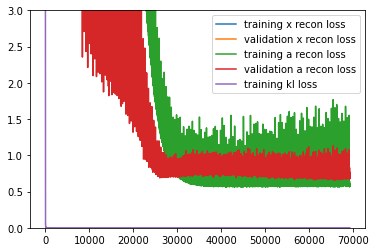

In [14]:
# plt.plot(np.arange(epochs),train_loss_ep)
# plt.plot(np.arange(epochs),val_loss_ep)
plt.plot(np.arange(epochs),train_loss_x_ep)
plt.plot(np.arange(epochs),val_loss_x_ep)
plt.plot(np.arange(epochs),train_loss_a_ep)
plt.plot(np.arange(epochs),val_loss_a_ep)
plt.plot(np.arange(epochs),train_loss_kl_ep)
# plt.plot(np.arange(epochs),np.array(train_loss_adv_ep)*advWeight)
# plt.plot(np.arange(epochs),np.array(val_loss_adv_ep)*advWeight)
# plt.plot(np.arange(epochs),np.array(train_loss_advD_ep)*advWeight)
# plt.plot(np.arange(epochs),np.array(val_loss_advD_ep)*advWeight)
# plt.plot(np.arange(epochs),np.array(train_loss_clf_ep)*clfweight)
# plt.plot(np.arange(epochs),np.array(val_loss_clf_ep)*clfweight)
plt.ylim((0,3))
# plt.xlim((0,3000))
# plt.legend(['training loss','validation loss','training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
# plt.legend(['training x recon loss','validation x recon loss','training a recon loss','validation a recon loss','training kl loss','training classifier loss','validation classifier loss'],loc='upper right')
plt.legend(['training x recon loss','validation x recon loss','training a recon loss','validation a recon loss','training kl loss','training discriminator ae','validation discriminator ae','training discriminator d','validation discriminator d'],loc='upper right')
# plt.legend(['training loss','validation loss','training x recon loss','validation x recon loss','training a recon loss','validation a recon loss','training kl loss','training discriminator ae','validation discriminator ae','training discriminator d','validation discriminator d'],loc='upper right')
plt.savefig(os.path.join(plotsavepath,'loss_seed3_xa_zoom2.jpg'))
plt.show()


In [8]:
# name='c13k20XA_07_dca'
# logsavepath='/mnt/xinyi/pamrats/log/train_gae_starmap/'+name
# with open(os.path.join(logsavepath,'val_loss_a'), 'rb') as output:
#     val_loss_a_ep=pickle.load(output)
# np.argmin(val_loss_x_ep[:])
# # np.where(np.logical_not(np.isfinite(val_loss_ep[:])))
# val_loss_a_ep[8700]
# torch.log(torch.tensor([1/0]))

ZeroDivisionError: division by zero

In [13]:
testepoch=30000
model.load_state_dict(torch.load(os.path.join(modelsavepath,str(testepoch)+'.pt')))
model.eval()
for s in sampleidx.keys():
    print(s)
    
    adj_norm=adjnormlist[s].cuda().float()
    adj_label=adj_list[s].cuda().float()
    features=torch.tensor(featureslist[s]).cuda().float()
    pos_weight=pos_weightlist[s]
    norm=normlist[s]
    
    if 'dca' in model_str:
        features_raw=features_raw_list[s+'X_raw'].cuda()
    num_nodes,num_features = features.shape
    maskedgeres= preprocessing.mask_nodes_edges(features.shape[0],testNodeSize=testNodes,valNodeSize=valNodes,seed=seed)
    train_nodes_idx,val_nodes_idx,test_nodes_idx_s= maskedgeres
    if use_cuda:
        test_nodes_idx_s=test_nodes_idx_s.cuda()
        model.cuda()
    
        

    if adj_decodeName==None:
        adj_recon,mu,logvar,z, features_recon = model(features, adj_norm)
    else:
        adj_decode=adj_decode.cuda()
        adj_recon,mu,logvar,z, features_recon = model(features, adj_norm,adj_decode)
    if adv and (s in list(sampleLabellist_ae.keys())):
        sampleLabel_ae=sampleLabellist_ae[s].cuda().float()
        modelAdv.eval()
        advOut=modelAdv(z)
    if 'dca' in model_str:
        if 'NB' in name:
            loss_x_test=loss_x(features_recon, features,test_nodes_idx,XreconWeight)
        else:
            loss_x_test=loss_x(features_recon, features,test_nodes_idx_s,XreconWeight,ridgeL,features_raw)
    else:
        loss_x_test=loss_x(features_recon, features,test_nodes_idx_s,XreconWeight,mse)
    loss_a_test=loss_a(adj_recon, adj_label, pos_weight, norm,test_nodes_idx_s)
    loss_test = loss_x_test+loss_a_test
    
    if adv and (s in list(sampleLabellist_ae.keys())):
        loss_adv_test=loss_adv(advOut,sampleLabel_ae,test_nodes_idx)
        print('loss_adv_test: {:.4f}'.format(loss_adv_test.item()))
        
    print('test results',
          'loss_test: {:.4f}'.format(loss_test.item()),
          'loss_x_test: {:.4f}'.format(loss_x_test.item()),
          'loss_a_test: {:.4f}'.format(loss_a_test.item()))
#          'loss_adv_test: {:.4f}'.format(loss_adv_test.item()))
    if protein:
        test_nodes_idx_s_genes=torch.clone(test_nodes_idx_s)
        test_nodes_idx_s_genes[2112:]=0
        test_nodes_idx_s_proteins=torch.clone(test_nodes_idx_s)
        test_nodes_idx_s_proteins[:2112]=0
        if 'dca' in model_str:
            loss_genes_test=loss_x(features_recon, features,test_nodes_idx_s_genes,XreconWeight,ridgeL,features_raw)
            loss_proteins_test=loss_x(features_recon, features,test_nodes_idx_s_proteins,XreconWeight,ridgeL,features_raw)
        print('loss_x_genes: {:.4f}'.format(loss_genes_test.item()),
          'loss_x_proteins: {:.4f}'.format(loss_proteins_test.item()))
    if 'dca' in model_str:
        features_raw=features_raw.cpu()

   

disease13
test results loss_test: 58.8454 loss_x_test: 58.0747 loss_a_test: 0.7707
control13
test results loss_test: 59.3500 loss_x_test: 58.5949 loss_a_test: 0.7551
disease8
test results loss_test: 46.6319 loss_x_test: 45.8682 loss_a_test: 0.7636
control8
test results loss_test: 51.6466 loss_x_test: 50.9495 loss_a_test: 0.6971


In [12]:
y_true=features
y_true_raw=features_raw
preds=features_recon
mask=nodesmask=torch.tensor(np.arange(num_nodes))
reconWeight=20
eps = 1e-10

output,pi,theta,y_pred=preds
nb_case=optimizer.optimizer_nb(preds,y_true,mask,reconWeight,eps = 1e-10,ifmean=False)- torch.log(pi+eps)

zero_nb = torch.pow(theta/(theta+y_pred+eps), theta)
zero_case = -torch.log(pi + ((1.0-pi)*zero_nb)+eps)
result = torch.where(torch.lt(y_true_raw.cuda(), 1), zero_case, nb_case)

In [8]:
adj_list['control13'][:10,:10]

tensor([[1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 1., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 1., 1., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 1., 1., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 1., 1., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 1., 1., 0., 0.],
        [0., 0., 0., 0., 0., 0., 1., 1., 1., 0.],
        [0., 0., 0., 0., 0., 0., 0., 1., 1., 1.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 1.]], dtype=torch.float64)

In [14]:
features[:8,:8]

tensor([[-0.2504,  8.5853, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [ 5.5540, -0.1938, -0.1941, -0.1474, -0.1934,  3.1612,  1.2601, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717,  2.5718, -0.3465]],
       device='cuda:0')

In [15]:
zeroidx=(features_raw==0)
nonzeroidx=(features_raw!=0)
torch.sum(result[zeroidx])/torch.sum(result)

tensor(2.8589e-09, device='cuda:0', grad_fn=<DivBackward0>)

In [22]:
torch.sum(result[zeroidx])

tensor(0., device='cuda:0', grad_fn=<SumBackward0>)

In [1]:
# model.pi.weight[:8,:8]
ep

NameError: name 'ep' is not defined